In [339]:
#DTW calculation

import pandas as pd
import numpy as np
import os
import glob 
import pickle
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns
from pylab import rcParams
from sklearn import metrics
from sklearn.model_selection import train_test_split
from scipy.ndimage import gaussian_filter
from scipy.fftpack import fft
from dtw import dtw
from numpy import array, zeros, argmin, inf, ndim
from scipy.spatial.distance import cdist
from sklearn.metrics.pairwise import manhattan_distances

%matplotlib inline

In [340]:
#read csv file and return its data-frame
def read_csv_file(acc, gyro, mode):
    df_gyro = pd.read_csv(gyro, index_col=False)
    df      = pd.read_csv(acc,  index_col=False)
    df.rename(columns = {'X': 'AX', 'Y':'AY', 'Z':'AZ'}, inplace = True)
    df['GX'] = df_gyro['X']
    df['GY'] = df_gyro['Y']
    df['GZ'] = df_gyro['Z']
    
    df['activity'] = mode
    
    return df

In [341]:
def GaussianFilter(df, window_length):
    df1 = df
    df1['AX'] = gaussian_filter(df['AX'], window_length)
    df1['AY'] = gaussian_filter(df['AY'], window_length)
    df1['AZ'] = gaussian_filter(df['AZ'], window_length)

    df1['GX'] = gaussian_filter(df['GX'], window_length)
    df1['GY'] = gaussian_filter(df['GY'], window_length)
    df1['GZ'] = gaussian_filter(df['GZ'], window_length)
    
    return df1

In [342]:
def Mean(df, input_features, out_feature):
    df[out_feature] = (df[input_features[0]] + df[input_features[1]]  + df[input_features[2]])/3
    
    return df
    
    

In [343]:
#generate frequency domain data from time domain data usinf Fast Fourier transformation

def FFT(df, input_features, output_features):
    
    for i in range(len(input_features)):
        reals = np.real(np.fft.rfft(df[input_features[i]]))
        imagn = np.imag(np.fft.rfft(df[input_features[i]]))

        complexs = [reals[0]]
        n = len(reals)
        if(n%2 == 0):
            complexs.append(imagn[0])
        for j in range(1, n-1):
            complexs.append(reals[j])
            complexs.append(imagn[j])
        if( len(df) > len(complexs)):
            complexs.append(reals[j])
        if( len(df) > len(complexs)):
            complexs.append(imagn[j])
            
        df[output_features[i]] = complexs
    return df

In [344]:
def data_preprocessing(df):
#     df['Milliseconds'] =df['Milliseconds']/1000 
    #apply gaussian filter with window size 5
    df = GaussianFilter(df, 10)
    
    #mean feature of 3-axis accelerometer data
    input_features = ['AX', 'AY', 'AZ']
    output_feature = 'mAcc'
    df = Mean(df, input_features, output_feature)
    
    #mean feature of 3-axis gyroscope data
    input_features = ['GX', 'GY', 'GZ']
    output_feature = 'mGyro'
    df = Mean(df, input_features, output_feature)
    
    #Frequency domain feature generation from time series accelerometer data
    input_features = ['AX', 'AY', 'AZ']
    output_feature = ['fAX', 'fAY', 'fAZ']
    df = FFT(df, input_features, output_feature)
    
    #Frequency domain feature generation from time series gyroscope data
    input_features = ['AX', 'AY', 'AZ']
    output_feature = ['fGX', 'fGY', 'fGZ']
    df = FFT(df, input_features, output_feature)
    
    return df
    
    
    
    
    

In [345]:
def segmentation(df, N_TIME_STEPS):
    
    N_FEATURES = 1
    step = 50
    segments = []
    labels = []
    for i in range(0, len(df) - N_TIME_STEPS, step):
        gz = df['GZ'].values[i: i + N_TIME_STEPS]
#         gy = df['AZ'].values[i: i + N_TIME_STEPS]   
        label = "ST"
        segments.append([gz])
#         labels = stats.mode(df['activity'][i: i + N_TIME_STEPS])[0][0]
        labels.append(label)
    return segments, labels

In [346]:
def dtw(x, y, dist, warp=1):
    """
    Computes Dynamic Time Warping (DTW) of two sequences.
    :param array x: N1*M array
    :param array y: N2*M array
    :param func dist: distance used as cost measure
    :param int warp: how many shifts are computed.
    Returns the minimum distance, the cost matrix, the accumulated cost matrix, and the wrap path.
    """
    assert len(x)
    assert len(y)
    r, c = len(x), len(y)
    D0 = zeros((r + 1, c + 1))
    D0[0, 1:] = inf
    D0[1:, 0] = inf
    D1 = D0[1:, 1:]  # view
    for i in range(r):
        for j in range(c):
            D1[i, j] = dist(x[i], y[j])
    C = D1.copy()
    for i in range(r):
        for j in range(c):
            min_list = [D0[i, j]]
            for k in range(1, warp + 1):
                i_k = min(i + k, r - 1)
                j_k = min(j + k, c - 1)
                min_list += [D0[i_k, j], D0[i, j_k]]
            D1[i, j] += min(min_list)
#     if len(x)==1:
#         path = zeros(len(y)), range(len(y))
#     elif len(y) == 1:
#         path = range(len(x)), zeros(len(x))
#     else:
#         path = _traceback(D0)
    return D1[-1, -1] / sum(D1.shape), C, D1

In [347]:
def DTWDistance(s1, s2,w):
    DTW={}

    w = max(w, abs(len(s1)-len(s2)))

    for i in range(-1,len(s1)):
        for j in range(-1,len(s2)):
            DTW[(i, j)] = float('inf')
    DTW[(-1, -1)] = 0

    for i in range(len(s1)):
        for j in range(max(0, i-w), min(len(s2), i+w)):
            dist= (s1[i]-s2[j])**2
            DTW[(i, j)] = dist + min(DTW[(i-1, j)],DTW[(i, j-1)], DTW[(i-1, j-1)])

    return (DTW[len(s1)-1, len(s2)-1])**(1/2)

In [348]:
def loss_for_segments(segments, comp, dist_fun):
    loss =[]
    length = len(segments)
    for i in range(length):
        x = segments[i][0]
#         dist, cost, acc = dtw(x, y, dist_fun)
        dist = DTWDistance(x, y, 50)
        print(i , '=>', dist)
        loss.append(dist)
        
    return loss

In [349]:
def find_contiguous_colors(colors):
    # finds the continuous segments of colors and returns those segments
    segs = []
    curr_seg = []
    prev_color = ''
    for c in colors:
        if c == prev_color or prev_color == '':
            curr_seg.append(c)
        else:
            segs.append(curr_seg)
            curr_seg = []
            curr_seg.append(c)
        prev_color = c
    segs.append(curr_seg) # the final one
    return segs
 
def plot_multicolored_lines(x,y,colors):
    segments = find_contiguous_colors(colors)
    plt.figure(figsize=(20,4))
    start= 0
    for seg in segments:
        end = start + len(seg)
        l, = plt.gca().plot(x[start-1:end+1],y[start-1:end+1],lw=2,c=seg[0]) 
        start = end

In [350]:
# Function to map the colors as a list from the input list of x variables
def color_mapping(lst):
    cols=[]
    colors = {'ST':'blue', 'LT':'red','RT':'green'}
    for l in lst:
        cols.append(colors[l])      
    return cols

In [351]:
def read_files(acc_file, gyro_file, activity):
    df = read_csv_file(acc_file, gyro_file, activity)
    df.reset_index(drop = True , inplace = True)
    if('Milliseconds' in df.columns):
        df = df.drop('Milliseconds', axis=1)
    if('Timestamp' in df.columns):
        df = df.drop('Timestamp', axis=1)

    df = data_preprocessing(df)
    
    return df
    

In [352]:
  
path_acc = os.getcwd() + '/data/bike/*/*/*AccelerometerLinear.csv'  
path_gyro= os.getcwd() + '/data/bike/*/*/*Gyroscope.csv' 
acc_files = glob.glob(path_acc)
gyro_files= glob.glob(path_gyro)
df= read_files(acc_files[0], gyro_files[0], 'bike')
n = len(df)
df = df[1500:n-1000]
for acc_file, gyro_file in zip(acc_files, gyro_files) :
    print(acc_file)
    print(gyro_file)
    df_this = read_files(acc_file, gyro_file, 'bike')
    n = len(df_this)
    df_this = df_this[1500 : n-2000]
    print("len of this file ",df_this.shape)
#     print(df_this.columns)
    df = pd.concat([df, df_this])
    print(df.shape)
df.reset_index(drop = True, inplace = True)
df.head()


/home/vicky/Desktop/Dhananjay/human-activity/data/bike/Bike2308/2018-08-23_16-01-56/AccelerometerLinear.csv
/home/vicky/Desktop/Dhananjay/human-activity/data/bike/Bike2308/2018-08-23_16-01-56/Gyroscope.csv
len of this file  (9048, 15)
(19096, 15)
/home/vicky/Desktop/Dhananjay/human-activity/data/bike/Bike2308/2018-08-23_16-15-15/AccelerometerLinear.csv
/home/vicky/Desktop/Dhananjay/human-activity/data/bike/Bike2308/2018-08-23_16-15-15/Gyroscope.csv
len of this file  (4101, 15)
(23197, 15)
/home/vicky/Desktop/Dhananjay/human-activity/data/bike/Bike2308/2018-08-23_16-18-07/AccelerometerLinear.csv
/home/vicky/Desktop/Dhananjay/human-activity/data/bike/Bike2308/2018-08-23_16-18-07/Gyroscope.csv
len of this file  (10913, 15)
(34110, 15)
/home/vicky/Desktop/Dhananjay/human-activity/data/bike/Bike2308/2018-08-23_16-00-19/AccelerometerLinear.csv
/home/vicky/Desktop/Dhananjay/human-activity/data/bike/Bike2308/2018-08-23_16-00-19/Gyroscope.csv
len of this file  (0, 15)
(34110, 15)
/home/vicky/De

,AX,AY,AZ,GX,GY,GZ,activity,mAcc,mGyro,fAX,fAY,fAZ,fGX,fGY,fGZ
0,0.053224,0.314816,-0.039182,-0.011374,-0.039128,-0.005193,bike,0.109619,-0.018565,-1.419633,1.155152,-0.926777,-1.419633,1.155152,-0.926777
1,0.050394,0.317808,-0.024306,-0.010242,-0.035566,-0.007808,bike,0.114632,-0.017872,0.279686,-0.158640,0.280778,0.279686,-0.158640,0.280778
2,0.047070,0.319707,-0.010741,-0.009198,-0.031665,-0.010444,bike,0.118678,-0.017102,-1.299177,0.950650,-0.962019,-1.299177,0.950650,-0.962019
3,0.043323,0.320499,0.001363,-0.008262,-0.027466,-0.013066,bike,0.121728,-0.016265,0.363979,-0.220690,0.102549,0.363979,-0.220690,0.102549
4,0.039209,0.320110,0.011780,-0.007458,-0.023013,-0.015640,bike,0.123699,-0.015370,-1.437911,1.003662,-0.826258,-1.437911,1.003662,-0.826258


In [353]:
  
path_acc = os.getcwd() + '/data/car/*/*/*AccelerometerLinear.csv'  
path_gyro= os.getcwd() + '/data/car/*/*/*Gyroscope.csv' 
acc_files = glob.glob(path_acc)
gyro_files= glob.glob(path_gyro)
df1= read_files(acc_files[0], gyro_files[0], 'car')
n = len(df1)
df1 = df1[1500:n-1000]
for acc_file, gyro_file in zip(acc_files, gyro_files) :
    print(acc_file)
    print(gyro_file)
    df_this = read_files(acc_file, gyro_file, 'car')
    n = len(df_this)
    df_this = df_this[1500 : n-2000]
    print("len of this file ",df_this.shape)
    df1 = pd.concat([df1, df_this])
    print(df1.shape)
df1.reset_index(drop = True, inplace = True)
df1.head()


/home/vicky/Desktop/Dhananjay/human-activity/data/car/Car1109out/2018-09-11_19-14-12/AccelerometerLinear.csv
/home/vicky/Desktop/Dhananjay/human-activity/data/car/Car1109out/2018-09-11_19-14-12/Gyroscope.csv
len of this file  (122, 15)
(1244, 15)
/home/vicky/Desktop/Dhananjay/human-activity/data/car/Car1109out/2018-09-11_18-46-25/AccelerometerLinear.csv
/home/vicky/Desktop/Dhananjay/human-activity/data/car/Car1109out/2018-09-11_18-46-25/Gyroscope.csv
len of this file  (2810, 15)
(4054, 15)
/home/vicky/Desktop/Dhananjay/human-activity/data/car/Car1109out/2018-09-11_18-55-22/AccelerometerLinear.csv
/home/vicky/Desktop/Dhananjay/human-activity/data/car/Car1109out/2018-09-11_18-55-22/Gyroscope.csv
len of this file  (0, 15)
(4054, 15)
/home/vicky/Desktop/Dhananjay/human-activity/data/car/Car1109out/2018-09-11_19-17-04/AccelerometerLinear.csv
/home/vicky/Desktop/Dhananjay/human-activity/data/car/Car1109out/2018-09-11_19-17-04/Gyroscope.csv
len of this file  (513, 15)
(4567, 15)
/home/vicky/D

,AX,AY,AZ,GX,GY,GZ,activity,mAcc,mGyro,fAX,fAY,fAZ,fGX,fGY,fGZ
0,-0.230705,0.629849,0.025412,0.032971,0.046422,0.031496,car,0.141518,0.036963,-0.253709,-0.078774,-0.469316,-0.253709,-0.078774,-0.469316
1,-0.237297,0.639779,0.019223,0.030684,0.042978,0.031509,car,0.140568,0.035057,0.334182,0.103027,0.616717,0.334182,0.103027,0.616717
2,-0.243107,0.648608,0.013157,0.028013,0.039571,0.031699,car,0.139553,0.033095,-0.254521,-0.078132,-0.469309,-0.254521,-0.078132,-0.469309
3,-0.248168,0.656360,0.007298,0.025100,0.036283,0.032013,car,0.138496,0.031132,0.333122,0.103071,0.614661,0.333122,0.103071,0.614661
4,-0.252544,0.663094,0.001722,0.022076,0.033181,0.032396,car,0.137424,0.029218,-0.253566,-0.078275,-0.470071,-0.253566,-0.078275,-0.470071


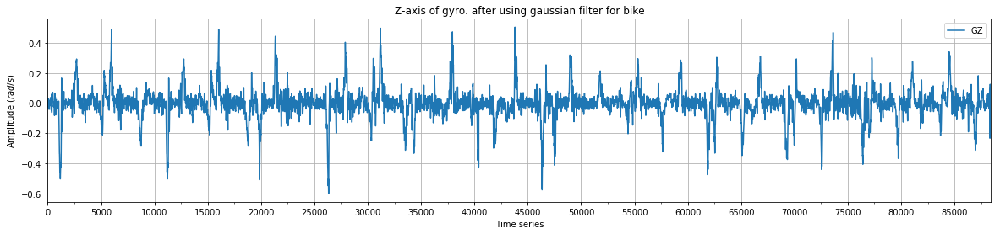

In [354]:
fig, ax = plt.subplots()
df[['GZ']].plot(figsize = (20,4),ax=ax, title = "Z-axis of gyro. after using gaussian filter for bike")
plt.xlabel('Time series')
plt.ylabel('Amplitude ($rad/s$)')
n = len(df)
major_ticks = np.arange(0, n, 5000)
minor_ticks = np.arange(0, n, 2500)
ax.set_xticks(major_ticks)
ax.set_xticks(minor_ticks, minor=True)
fig.savefig('abc.png') 

plt.grid(True)

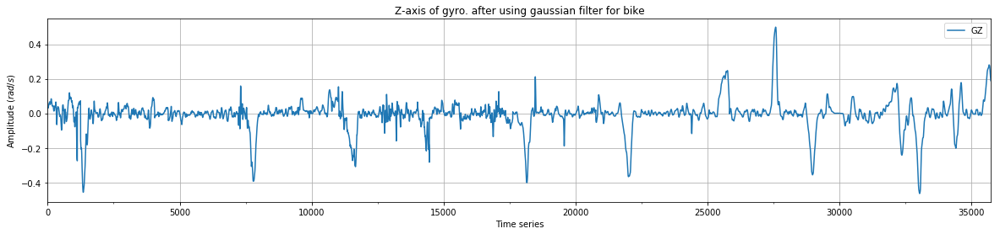

In [355]:
fig, ax = plt.subplots()
df1[['GZ']].plot(figsize = (20,4),ax=ax, title = "Z-axis of gyro. after using gaussian filter for bike")
plt.xlabel('Time series')
plt.ylabel('Amplitude ($rad/s$)')
n = len(df1)
major_ticks = np.arange(0, n, 5000)
minor_ticks = np.arange(0, n, 2500)
ax.set_xticks(major_ticks)
ax.set_xticks(minor_ticks, minor=True)
fig.savefig('abc.png') 

plt.grid(True)

In [463]:
bike_segments, bike_labels = segmentation(df, 500)
np.array(bike_segments).shape


(1759, 1, 500)

In [464]:
segments = bike_segments
labels   = ['bike']*len(segments)


In [465]:
car_segments, car_labels = segmentation(df1, 500)
np.array(car_segments).shape
print(len(car_segments))
labels1 = ['car']*len(car_segments)

706


In [466]:
for i in range(len(car_segments)):
    segments.append(car_segments[i])
labels = labels + labels1
print(len(segments))
print(len(labels))

2465
2465


In [467]:

from sklearn.model_selection import train_test_split
RANDOM_SEED = 42
N_TIME_STEPS = 500
N_FEATURES = 1

# reshaped_segments = np.asarray(segments, dtype= np.float32).reshape(-1, N_TIME_STEPS, N_FEATURES)
# labels = np.asarray(pd.get_dummies(labels), dtype = np.float32)
for i in range(len(labels)):
    if(labels[i]=='bike'):
        labels[i]=1
    else:
        labels[i]=0
print(len(segments))
print(len(labels))


2465
2465


In [468]:
X_train, X_test, y_train, y_test = train_test_split(segments, labels, test_size=0.5, random_state=RANDOM_SEED)

In [469]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))
y_test[0]

1232
1232
1233
1233


1

In [470]:
from sklearn.metrics import classification_report

def knn(train,test,w):
    preds=[]
    closest_seq=0
    for ind,i in enumerate(test):
        min_dist=float('inf')
        for k,j in enumerate(train):           
            dist=DTWDistance(i[0],j[0],w)
            if(dist<min_dist):
                min_dist=dist
                closest_seq=y_train[k]
            print(ind, k, min_dist)
        print('--------------------------------')
        print(min_dist)
        print(closest_seq, y_test[ind])
        print('--------------------------------')
        preds.append(closest_seq)
    
    return classification_report(y_test,preds)

In [ ]:
print(knn(X_train,X_test,50))

0 0 3.51204877335
0 1 3.51204877335
0 2 3.51204877335
0 3 3.51204877335
0 4 3.51204877335
0 5 3.4277476898
0 6 3.4277476898
0 7 3.39734396815
0 8 3.39734396815
0 9 3.39734396815
0 10 3.39734396815
0 11 3.39734396815
0 12 3.39734396815
0 13 3.39734396815
0 14 3.39734396815
0 15 3.39734396815
0 16 3.39734396815
0 17 3.39734396815
0 18 3.39734396815
0 19 3.39734396815
0 20 3.39734396815
0 21 3.39734396815
0 22 2.95430430865
0 23 2.63135588546
0 24 2.63135588546
0 25 2.63135588546
0 26 2.63135588546
0 27 2.63135588546
0 28 2.63135588546
0 29 2.63135588546
0 30 2.63135588546
0 31 2.63135588546
0 32 2.63135588546
0 33 2.63135588546
0 34 2.63135588546
0 35 2.63135588546
0 36 2.63135588546
0 37 2.63135588546
0 38 2.53549957996
0 39 2.53549957996
0 40 2.53549957996
0 41 2.53549957996
0 42 2.53549957996
0 43 2.53549957996
0 44 2.53549957996
0 45 2.53549957996
0 46 2.53549957996
0 47 2.53549957996
0 48 2.53549957996
0 49 2.53549957996
0 50 2.53549957996
0 51 2.53549957996
0 52 2.53549957996
0 53 

0 387 0.0120468938466
0 388 0.0120468938466
0 389 0.0120468938466
0 390 0.0120468938466
0 391 0.0120468938466
0 392 0.0120468938466
0 393 0.0120468938466
0 394 0.0120468938466
0 395 0.0120468938466
0 396 0.0120468938466
0 397 0.0120468938466
0 398 0.0120468938466
0 399 0.0120468938466
0 400 0.0120468938466
0 401 0.0120468938466
0 402 0.0120468938466
0 403 0.0120468938466
0 404 0.0120468938466
0 405 0.0120468938466
0 406 0.0120468938466
0 407 0.0120468938466
0 408 0.0120468938466
0 409 0.0120468938466
0 410 0.0120468938466
0 411 0.0120468938466
0 412 0.0120468938466
0 413 0.0120468938466
0 414 0.0120468938466
0 415 0.0120468938466
0 416 0.0120468938466
0 417 0.0120468938466
0 418 0.0120468938466
0 419 0.0120468938466
0 420 0.0120468938466
0 421 0.0120468938466
0 422 0.0120468938466
0 423 0.0120468938466
0 424 0.0120468938466
0 425 0.0120468938466
0 426 0.0120468938466
0 427 0.0120468938466
0 428 0.0120468938466
0 429 0.0120468938466
0 430 0.0120468938466
0 431 0.0120468938466
0 432 0.01

0 761 0.0120468938466
0 762 0.0120468938466
0 763 0.0120468938466
0 764 0.0120468938466
0 765 0.0120468938466
0 766 0.0120468938466
0 767 0.0120468938466
0 768 0.0120468938466
0 769 0.0120468938466
0 770 0.0120468938466
0 771 0.0120468938466
0 772 0.0120468938466
0 773 0.0120468938466
0 774 0.0120468938466
0 775 0.0120468938466
0 776 0.0120468938466
0 777 0.0120468938466
0 778 0.0120468938466
0 779 0.0120468938466
0 780 0.0120468938466
0 781 0.0120468938466
0 782 0.0120468938466
0 783 0.0120468938466
0 784 0.0120468938466
0 785 0.0120468938466
0 786 0.0120468938466
0 787 0.0120468938466
0 788 0.0120468938466
0 789 0.0120468938466
0 790 0.0120468938466
0 791 0.0120468938466
0 792 0.0120468938466
0 793 0.0120468938466
0 794 0.0120468938466
0 795 0.0120468938466
0 796 0.0120468938466
0 797 0.0120468938466
0 798 0.0120468938466
0 799 0.0120468938466
0 800 0.0120468938466
0 801 0.0120468938466
0 802 0.0120468938466
0 803 0.0120468938466
0 804 0.0120468938466
0 805 0.0120468938466
0 806 0.01

0 1128 0.0120468938466
0 1129 0.0120468938466
0 1130 0.0120468938466
0 1131 0.0120468938466
0 1132 0.0120468938466
0 1133 0.0120468938466
0 1134 0.0120468938466
0 1135 0.0120468938466
0 1136 0.0120468938466
0 1137 0.0120468938466
0 1138 0.0120468938466
0 1139 0.0120468938466
0 1140 0.0120468938466
0 1141 0.0120468938466
0 1142 0.0120468938466
0 1143 0.0120468938466
0 1144 0.0120468938466
0 1145 0.0120468938466
0 1146 0.0120468938466
0 1147 0.0120468938466
0 1148 0.0120468938466
0 1149 0.0120468938466
0 1150 0.0120468938466
0 1151 0.0120468938466
0 1152 0.0120468938466
0 1153 0.0120468938466
0 1154 0.0120468938466
0 1155 0.0120468938466
0 1156 0.0120468938466
0 1157 0.0120468938466
0 1158 0.0120468938466
0 1159 0.0120468938466
0 1160 0.0120468938466
0 1161 0.0120468938466
0 1162 0.0120468938466
0 1163 0.0120468938466
0 1164 0.0120468938466
0 1165 0.0120468938466
0 1166 0.0120468938466
0 1167 0.0120468938466
0 1168 0.0120468938466
0 1169 0.0120468938466
0 1170 0.0120468938466
0 1171 0.01

1 282 0.778187271617
1 283 0.778187271617
1 284 0.778187271617
1 285 0.778187271617
1 286 0.778187271617
1 287 0.778187271617
1 288 0.778187271617
1 289 0.778187271617
1 290 0.778187271617
1 291 0.778187271617
1 292 0.778187271617
1 293 0.778187271617
1 294 0.778187271617
1 295 0.778187271617
1 296 0.778187271617
1 297 0.778187271617
1 298 0.778187271617
1 299 0.778187271617
1 300 0.778187271617
1 301 0.778187271617
1 302 0.778187271617
1 303 0.778187271617
1 304 0.778187271617
1 305 0.778187271617
1 306 0.778187271617
1 307 0.778187271617
1 308 0.778187271617
1 309 0.778187271617
1 310 0.778187271617
1 311 0.778187271617
1 312 0.778187271617
1 313 0.778187271617
1 314 0.778187271617
1 315 0.778187271617
1 316 0.778187271617
1 317 0.778187271617
1 318 0.778187271617
1 319 0.778187271617
1 320 0.778187271617
1 321 0.778187271617
1 322 0.778187271617
1 323 0.778187271617
1 324 0.778187271617
1 325 0.778187271617
1 326 0.778187271617
1 327 0.778187271617
1 328 0.778187271617
1 329 0.77818

1 674 0.778187271617
1 675 0.778187271617
1 676 0.778187271617
1 677 0.778187271617
1 678 0.778187271617
1 679 0.778187271617
1 680 0.778187271617
1 681 0.778187271617
1 682 0.778187271617
1 683 0.778187271617
1 684 0.778187271617
1 685 0.778187271617
1 686 0.778187271617
1 687 0.778187271617
1 688 0.778187271617
1 689 0.778187271617
1 690 0.778187271617
1 691 0.778187271617
1 692 0.778187271617
1 693 0.778187271617
1 694 0.778187271617
1 695 0.778187271617
1 696 0.778187271617
1 697 0.778187271617
1 698 0.778187271617
1 699 0.778187271617
1 700 0.778187271617
1 701 0.723441631107
1 702 0.723441631107
1 703 0.723441631107
1 704 0.723441631107
1 705 0.723441631107
1 706 0.723441631107
1 707 0.723441631107
1 708 0.723441631107
1 709 0.723441631107
1 710 0.723441631107
1 711 0.723441631107
1 712 0.723441631107
1 713 0.723441631107
1 714 0.723441631107
1 715 0.723441631107
1 716 0.723441631107
1 717 0.723441631107
1 718 0.723441631107
1 719 0.723441631107
1 720 0.723441631107
1 721 0.72344

1 1061 0.501135719968
1 1062 0.501135719968
1 1063 0.501135719968
1 1064 0.501135719968
1 1065 0.501135719968
1 1066 0.501135719968
1 1067 0.501135719968
1 1068 0.501135719968
1 1069 0.501135719968
1 1070 0.501135719968
1 1071 0.501135719968
1 1072 0.501135719968
1 1073 0.501135719968
1 1074 0.501135719968
1 1075 0.501135719968
1 1076 0.501135719968
1 1077 0.501135719968
1 1078 0.501135719968
1 1079 0.501135719968
1 1080 0.501135719968
1 1081 0.501135719968
1 1082 0.501135719968
1 1083 0.501135719968
1 1084 0.501135719968
1 1085 0.501135719968
1 1086 0.501135719968
1 1087 0.501135719968
1 1088 0.501135719968
1 1089 0.501135719968
1 1090 0.501135719968
1 1091 0.501135719968
1 1092 0.501135719968
1 1093 0.501135719968
1 1094 0.501135719968
1 1095 0.501135719968
1 1096 0.501135719968
1 1097 0.501135719968
1 1098 0.501135719968
1 1099 0.501135719968
1 1100 0.501135719968
1 1101 0.501135719968
1 1102 0.501135719968
1 1103 0.501135719968
1 1104 0.501135719968
1 1105 0.501135719968
1 1106 0.5

2 224 0.957996005251
2 225 0.957996005251
2 226 0.957996005251
2 227 0.957996005251
2 228 0.957996005251
2 229 0.957996005251
2 230 0.957996005251
2 231 0.957996005251
2 232 0.957996005251
2 233 0.957996005251
2 234 0.957996005251
2 235 0.957996005251
2 236 0.957996005251
2 237 0.957996005251
2 238 0.957996005251
2 239 0.957996005251
2 240 0.957996005251
2 241 0.957996005251
2 242 0.957996005251
2 243 0.957996005251
2 244 0.957996005251
2 245 0.957996005251
2 246 0.957996005251
2 247 0.957996005251
2 248 0.957996005251
2 249 0.957996005251
2 250 0.957996005251
2 251 0.957996005251
2 252 0.957996005251
2 253 0.957996005251
2 254 0.957996005251
2 255 0.957996005251
2 256 0.957996005251
2 257 0.957996005251
2 258 0.957996005251
2 259 0.957996005251
2 260 0.957996005251
2 261 0.957996005251
2 262 0.957996005251
2 263 0.957996005251
2 264 0.957996005251
2 265 0.957996005251
2 266 0.957996005251
2 267 0.957996005251
2 268 0.957996005251
2 269 0.957996005251
2 270 0.957996005251
2 271 0.95799

2 616 0.957996005251
2 617 0.957996005251
2 618 0.957996005251
2 619 0.957996005251
2 620 0.957996005251
2 621 0.957996005251
2 622 0.957996005251
2 623 0.957996005251
2 624 0.957996005251
2 625 0.957996005251
2 626 0.957996005251
2 627 0.957996005251
2 628 0.903065160437
2 629 0.903065160437
2 630 0.903065160437
2 631 0.903065160437
2 632 0.903065160437
2 633 0.903065160437
2 634 0.903065160437
2 635 0.903065160437
2 636 0.903065160437
2 637 0.903065160437
2 638 0.903065160437
2 639 0.903065160437
2 640 0.903065160437
2 641 0.903065160437
2 642 0.903065160437
2 643 0.903065160437
2 644 0.903065160437
2 645 0.903065160437
2 646 0.903065160437
2 647 0.903065160437
2 648 0.903065160437
2 649 0.903065160437
2 650 0.903065160437
2 651 0.903065160437
2 652 0.903065160437
2 653 0.903065160437
2 654 0.903065160437
2 655 0.903065160437
2 656 0.903065160437
2 657 0.903065160437
2 658 0.903065160437
2 659 0.903065160437
2 660 0.903065160437
2 661 0.903065160437
2 662 0.903065160437
2 663 0.90306

2 1006 0.903065160437
2 1007 0.903065160437
2 1008 0.903065160437
2 1009 0.903065160437
2 1010 0.903065160437
2 1011 0.903065160437
2 1012 0.903065160437
2 1013 0.903065160437
2 1014 0.903065160437
2 1015 0.903065160437
2 1016 0.903065160437
2 1017 0.903065160437
2 1018 0.903065160437
2 1019 0.903065160437
2 1020 0.903065160437
2 1021 0.903065160437
2 1022 0.903065160437
2 1023 0.903065160437
2 1024 0.903065160437
2 1025 0.903065160437
2 1026 0.903065160437
2 1027 0.903065160437
2 1028 0.903065160437
2 1029 0.903065160437
2 1030 0.903065160437
2 1031 0.903065160437
2 1032 0.903065160437
2 1033 0.903065160437
2 1034 0.903065160437
2 1035 0.903065160437
2 1036 0.903065160437
2 1037 0.903065160437
2 1038 0.903065160437
2 1039 0.903065160437
2 1040 0.903065160437
2 1041 0.903065160437
2 1042 0.903065160437
2 1043 0.903065160437
2 1044 0.903065160437
2 1045 0.903065160437
2 1046 0.903065160437
2 1047 0.903065160437
2 1048 0.903065160437
2 1049 0.903065160437
2 1050 0.850694435006
2 1051 0.8

3 159 0.339762958223
3 160 0.339762958223
3 161 0.339762958223
3 162 0.339762958223
3 163 0.339762958223
3 164 0.339762958223
3 165 0.339762958223
3 166 0.339762958223
3 167 0.339762958223
3 168 0.339762958223
3 169 0.339762958223
3 170 0.339762958223
3 171 0.339762958223
3 172 0.339762958223
3 173 0.339762958223
3 174 0.339762958223
3 175 0.339762958223
3 176 0.339762958223
3 177 0.339762958223
3 178 0.339762958223
3 179 0.339762958223
3 180 0.339762958223
3 181 0.339762958223
3 182 0.339762958223
3 183 0.339762958223
3 184 0.339762958223
3 185 0.339762958223
3 186 0.339762958223
3 187 0.339762958223
3 188 0.339762958223
3 189 0.339762958223
3 190 0.339762958223
3 191 0.339762958223
3 192 0.339762958223
3 193 0.339762958223
3 194 0.339762958223
3 195 0.339762958223
3 196 0.339762958223
3 197 0.339762958223
3 198 0.339762958223
3 199 0.339762958223
3 200 0.339762958223
3 201 0.339762958223
3 202 0.339762958223
3 203 0.339762958223
3 204 0.339762958223
3 205 0.339762958223
3 206 0.33976

3 551 0.339762958223
3 552 0.339762958223
3 553 0.339762958223
3 554 0.339762958223
3 555 0.339762958223
3 556 0.339762958223
3 557 0.339762958223
3 558 0.339762958223
3 559 0.339762958223
3 560 0.339762958223
3 561 0.339762958223
3 562 0.339762958223
3 563 0.339762958223
3 564 0.339762958223
3 565 0.339762958223
3 566 0.339762958223
3 567 0.339762958223
3 568 0.339762958223
3 569 0.339762958223
3 570 0.339762958223
3 571 0.339762958223
3 572 0.339762958223
3 573 0.339762958223
3 574 0.339762958223
3 575 0.339762958223
3 576 0.339762958223
3 577 0.339762958223
3 578 0.339762958223
3 579 0.339762958223
3 580 0.339762958223
3 581 0.339762958223
3 582 0.339762958223
3 583 0.339762958223
3 584 0.339762958223
3 585 0.339762958223
3 586 0.339762958223
3 587 0.339762958223
3 588 0.339762958223
3 589 0.339762958223
3 590 0.339762958223
3 591 0.339762958223
3 592 0.339762958223
3 593 0.339762958223
3 594 0.339762958223
3 595 0.339762958223
3 596 0.339762958223
3 597 0.339762958223
3 598 0.33976

3 943 0.339762958223
3 944 0.339762958223
3 945 0.339762958223
3 946 0.339762958223
3 947 0.339762958223
3 948 0.339762958223
3 949 0.339762958223
3 950 0.339762958223
3 951 0.339762958223
3 952 0.339762958223
3 953 0.339762958223
3 954 0.339762958223
3 955 0.339762958223
3 956 0.339762958223
3 957 0.339762958223
3 958 0.339762958223
3 959 0.339762958223
3 960 0.339762958223
3 961 0.339762958223
3 962 0.339762958223
3 963 0.339762958223
3 964 0.339762958223
3 965 0.339762958223
3 966 0.339762958223
3 967 0.339762958223
3 968 0.339762958223
3 969 0.339762958223
3 970 0.339762958223
3 971 0.339762958223
3 972 0.339762958223
3 973 0.339762958223
3 974 0.339762958223
3 975 0.339762958223
3 976 0.339762958223
3 977 0.339762958223
3 978 0.339762958223
3 979 0.339762958223
3 980 0.339762958223
3 981 0.339762958223
3 982 0.339762958223
3 983 0.339762958223
3 984 0.339762958223
3 985 0.339762958223
3 986 0.339762958223
3 987 0.339762958223
3 988 0.339762958223
3 989 0.339762958223
3 990 0.33976

4 96 1.32800701308
4 97 1.32800701308
4 98 1.32800701308
4 99 1.32800701308
4 100 1.32800701308
4 101 1.32800701308
4 102 1.32800701308
4 103 1.32800701308
4 104 1.32800701308
4 105 1.32800701308
4 106 1.32800701308
4 107 1.32800701308
4 108 1.32800701308
4 109 1.32800701308
4 110 1.32800701308
4 111 1.32800701308
4 112 1.32800701308
4 113 1.32800701308
4 114 1.32800701308
4 115 1.32800701308
4 116 1.32800701308
4 117 1.32800701308
4 118 1.32800701308
4 119 1.32800701308
4 120 1.32800701308
4 121 1.32800701308
4 122 1.32800701308
4 123 1.32800701308
4 124 1.32800701308
4 125 1.32800701308
4 126 1.32800701308
4 127 1.32800701308
4 128 1.32800701308
4 129 1.32800701308
4 130 1.32800701308
4 131 1.32800701308
4 132 1.32800701308
4 133 1.32800701308
4 134 1.32800701308
4 135 1.32800701308
4 136 1.32800701308
4 137 1.32800701308
4 138 1.32800701308
4 139 1.32800701308
4 140 1.32800701308
4 141 1.32800701308
4 142 1.32800701308
4 143 1.32800701308
4 144 1.32800701308
4 145 1.32800701308
4 14

4 498 0.464210882273
4 499 0.464210882273
4 500 0.464210882273
4 501 0.464210882273
4 502 0.464210882273
4 503 0.464210882273
4 504 0.464210882273
4 505 0.464210882273
4 506 0.464210882273
4 507 0.464210882273
4 508 0.464210882273
4 509 0.464210882273
4 510 0.464210882273
4 511 0.464210882273
4 512 0.464210882273
4 513 0.464210882273
4 514 0.464210882273
4 515 0.464210882273
4 516 0.464210882273
4 517 0.464210882273
4 518 0.464210882273
4 519 0.464210882273
4 520 0.464210882273
4 521 0.464210882273
4 522 0.464210882273
4 523 0.464210882273
4 524 0.464210882273
4 525 0.464210882273
4 526 0.464210882273
4 527 0.464210882273
4 528 0.464210882273
4 529 0.464210882273
4 530 0.464210882273
4 531 0.464210882273
4 532 0.464210882273
4 533 0.464210882273
4 534 0.464210882273
4 535 0.464210882273
4 536 0.464210882273
4 537 0.464210882273
4 538 0.464210882273
4 539 0.464210882273
4 540 0.464210882273
4 541 0.464210882273
4 542 0.464210882273
4 543 0.464210882273
4 544 0.464210882273
4 545 0.46421

4 889 0.366057949696
4 890 0.366057949696
4 891 0.366057949696
4 892 0.366057949696
4 893 0.366057949696
4 894 0.366057949696
4 895 0.366057949696
4 896 0.366057949696
4 897 0.366057949696
4 898 0.366057949696
4 899 0.366057949696
4 900 0.366057949696
4 901 0.366057949696
4 902 0.366057949696
4 903 0.366057949696
4 904 0.366057949696
4 905 0.366057949696
4 906 0.366057949696
4 907 0.366057949696
4 908 0.366057949696
4 909 0.366057949696
4 910 0.366057949696
4 911 0.366057949696
4 912 0.366057949696
4 913 0.366057949696
4 914 0.366057949696
4 915 0.366057949696
4 916 0.366057949696
4 917 0.366057949696
4 918 0.366057949696
4 919 0.366057949696
4 920 0.366057949696
4 921 0.366057949696
4 922 0.366057949696
4 923 0.366057949696
4 924 0.366057949696
4 925 0.366057949696
4 926 0.366057949696
4 927 0.366057949696
4 928 0.366057949696
4 929 0.366057949696
4 930 0.366057949696
4 931 0.366057949696
4 932 0.366057949696
4 933 0.366057949696
4 934 0.366057949696
4 935 0.366057949696
4 936 0.36605

5 35 0.373383177396
5 36 0.373383177396
5 37 0.373383177396
5 38 0.373383177396
5 39 0.373383177396
5 40 0.373383177396
5 41 0.373383177396
5 42 0.373383177396
5 43 0.373383177396
5 44 0.373383177396
5 45 0.373383177396
5 46 0.373383177396
5 47 0.373383177396
5 48 0.373383177396
5 49 0.373383177396
5 50 0.373383177396
5 51 0.373383177396
5 52 0.373383177396
5 53 0.373383177396
5 54 0.373383177396
5 55 0.373383177396
5 56 0.373383177396
5 57 0.373383177396
5 58 0.373383177396
5 59 0.373383177396
5 60 0.373383177396
5 61 0.373383177396
5 62 0.373383177396
5 63 0.373383177396
5 64 0.373383177396
5 65 0.373383177396
5 66 0.373383177396
5 67 0.373383177396
5 68 0.373383177396
5 69 0.373383177396
5 70 0.373383177396
5 71 0.373383177396
5 72 0.373383177396
5 73 0.373383177396
5 74 0.373383177396
5 75 0.373383177396
5 76 0.373383177396
5 77 0.373383177396
5 78 0.373383177396
5 79 0.373383177396
5 80 0.373383177396
5 81 0.373383177396
5 82 0.373383177396
5 83 0.373383177396
5 84 0.373383177396


5 429 0.373383177396
5 430 0.373383177396
5 431 0.373383177396
5 432 0.373383177396
5 433 0.373383177396
5 434 0.373383177396
5 435 0.373383177396
5 436 0.373383177396
5 437 0.373383177396
5 438 0.373383177396
5 439 0.373383177396
5 440 0.373383177396
5 441 0.373383177396
5 442 0.373383177396
5 443 0.373383177396
5 444 0.373383177396
5 445 0.373383177396
5 446 0.373383177396
5 447 0.373383177396
5 448 0.373383177396
5 449 0.373383177396
5 450 0.373383177396
5 451 0.373383177396
5 452 0.373383177396
5 453 0.373383177396
5 454 0.373383177396
5 455 0.373383177396
5 456 0.373383177396
5 457 0.373383177396
5 458 0.373383177396
5 459 0.373383177396
5 460 0.373383177396
5 461 0.373383177396
5 462 0.373383177396
5 463 0.373383177396
5 464 0.373383177396
5 465 0.373383177396
5 466 0.373383177396
5 467 0.373383177396
5 468 0.373383177396
5 469 0.373383177396
5 470 0.373383177396
5 471 0.373383177396
5 472 0.373383177396
5 473 0.373383177396
5 474 0.373383177396
5 475 0.373383177396
5 476 0.37338

5 821 0.268420476858
5 822 0.268420476858
5 823 0.268420476858
5 824 0.268420476858
5 825 0.268420476858
5 826 0.268420476858
5 827 0.268420476858
5 828 0.268420476858
5 829 0.268420476858
5 830 0.268420476858
5 831 0.268420476858
5 832 0.268420476858
5 833 0.268420476858
5 834 0.268420476858
5 835 0.268420476858
5 836 0.268420476858
5 837 0.268420476858
5 838 0.268420476858
5 839 0.268420476858
5 840 0.268420476858
5 841 0.268420476858
5 842 0.268420476858
5 843 0.268420476858
5 844 0.268420476858
5 845 0.268420476858
5 846 0.268420476858
5 847 0.268420476858
5 848 0.268420476858
5 849 0.268420476858
5 850 0.268420476858
5 851 0.268420476858
5 852 0.268420476858
5 853 0.268420476858
5 854 0.268420476858
5 855 0.268420476858
5 856 0.268420476858
5 857 0.268420476858
5 858 0.268420476858
5 859 0.268420476858
5 860 0.268420476858
5 861 0.268420476858
5 862 0.268420476858
5 863 0.268420476858
5 864 0.268420476858
5 865 0.268420476858
5 866 0.268420476858
5 867 0.268420476858
5 868 0.26842

5 1203 0.268420476858
5 1204 0.268420476858
5 1205 0.268420476858
5 1206 0.268420476858
5 1207 0.268420476858
5 1208 0.268420476858
5 1209 0.268420476858
5 1210 0.268420476858
5 1211 0.268420476858
5 1212 0.268420476858
5 1213 0.268420476858
5 1214 0.268420476858
5 1215 0.268420476858
5 1216 0.268420476858
5 1217 0.268420476858
5 1218 0.268420476858
5 1219 0.268420476858
5 1220 0.268420476858
5 1221 0.268420476858
5 1222 0.268420476858
5 1223 0.268420476858
5 1224 0.268420476858
5 1225 0.268420476858
5 1226 0.268420476858
5 1227 0.268420476858
5 1228 0.268420476858
5 1229 0.268420476858
5 1230 0.268420476858
5 1231 0.268420476858
--------------------------------
0.268420476858
0 0
--------------------------------
6 0 1.23989922177
6 1 0.52884653617
6 2 0.52884653617
6 3 0.448430848167
6 4 0.448430848167
6 5 0.448430848167
6 6 0.448430848167
6 7 0.448430848167
6 8 0.448430848167
6 9 0.448430848167
6 10 0.448430848167
6 11 0.448430848167
6 12 0.448430848167
6 13 0.448430848167
6 14 0.448

6 365 0.279338558425
6 366 0.279338558425
6 367 0.279338558425
6 368 0.279338558425
6 369 0.279338558425
6 370 0.279338558425
6 371 0.279338558425
6 372 0.279338558425
6 373 0.279338558425
6 374 0.279338558425
6 375 0.279338558425
6 376 0.279338558425
6 377 0.279338558425
6 378 0.279338558425
6 379 0.279338558425
6 380 0.279338558425
6 381 0.279338558425
6 382 0.279338558425
6 383 0.279338558425
6 384 0.279338558425
6 385 0.279338558425
6 386 0.279338558425
6 387 0.279338558425
6 388 0.279338558425
6 389 0.279338558425
6 390 0.279338558425
6 391 0.279338558425
6 392 0.279338558425
6 393 0.279338558425
6 394 0.279338558425
6 395 0.279338558425
6 396 0.279338558425
6 397 0.279338558425
6 398 0.279338558425
6 399 0.279338558425
6 400 0.279338558425
6 401 0.279338558425
6 402 0.279338558425
6 403 0.279338558425
6 404 0.279338558425
6 405 0.279338558425
6 406 0.279338558425
6 407 0.279338558425
6 408 0.279338558425
6 409 0.279338558425
6 410 0.279338558425
6 411 0.279338558425
6 412 0.27933

6 756 0.279338558425
6 757 0.279338558425
6 758 0.279338558425
6 759 0.279338558425
6 760 0.279338558425
6 761 0.278310856209
6 762 0.278310856209
6 763 0.278310856209
6 764 0.278310856209
6 765 0.278310856209
6 766 0.278310856209
6 767 0.278310856209
6 768 0.278310856209
6 769 0.278310856209
6 770 0.278310856209
6 771 0.278310856209
6 772 0.278310856209
6 773 0.278310856209
6 774 0.278310856209
6 775 0.278310856209
6 776 0.278310856209
6 777 0.278310856209
6 778 0.278310856209
6 779 0.278310856209
6 780 0.278310856209
6 781 0.278310856209
6 782 0.278310856209
6 783 0.278310856209
6 784 0.278310856209
6 785 0.278310856209
6 786 0.278310856209
6 787 0.278310856209
6 788 0.278310856209
6 789 0.278310856209
6 790 0.278310856209
6 791 0.278310856209
6 792 0.278310856209
6 793 0.278310856209
6 794 0.278310856209
6 795 0.278310856209
6 796 0.278310856209
6 797 0.278310856209
6 798 0.278310856209
6 799 0.278310856209
6 800 0.278310856209
6 801 0.278310856209
6 802 0.278310856209
6 803 0.27831

6 1140 0.102562499656
6 1141 0.102562499656
6 1142 0.102562499656
6 1143 0.102562499656
6 1144 0.102562499656
6 1145 0.102562499656
6 1146 0.102562499656
6 1147 0.102562499656
6 1148 0.102562499656
6 1149 0.102562499656
6 1150 0.102562499656
6 1151 0.102562499656
6 1152 0.102562499656
6 1153 0.102562499656
6 1154 0.102562499656
6 1155 0.102562499656
6 1156 0.102562499656
6 1157 0.102562499656
6 1158 0.102562499656
6 1159 0.102562499656
6 1160 0.102562499656
6 1161 0.102562499656
6 1162 0.102562499656
6 1163 0.102562499656
6 1164 0.102562499656
6 1165 0.102562499656
6 1166 0.102562499656
6 1167 0.102562499656
6 1168 0.102562499656
6 1169 0.102562499656
6 1170 0.102562499656
6 1171 0.102562499656
6 1172 0.102562499656
6 1173 0.102562499656
6 1174 0.102562499656
6 1175 0.102562499656
6 1176 0.102562499656
6 1177 0.102562499656
6 1178 0.102562499656
6 1179 0.102562499656
6 1180 0.102562499656
6 1181 0.102562499656
6 1182 0.102562499656
6 1183 0.102562499656
6 1184 0.102562499656
6 1185 0.1

7 296 0.731028899128
7 297 0.731028899128
7 298 0.731028899128
7 299 0.731028899128
7 300 0.731028899128
7 301 0.731028899128
7 302 0.731028899128
7 303 0.731028899128
7 304 0.731028899128
7 305 0.731028899128
7 306 0.731028899128
7 307 0.731028899128
7 308 0.731028899128
7 309 0.731028899128
7 310 0.731028899128
7 311 0.731028899128
7 312 0.731028899128
7 313 0.731028899128
7 314 0.731028899128
7 315 0.731028899128
7 316 0.731028899128
7 317 0.731028899128
7 318 0.731028899128
7 319 0.731028899128
7 320 0.731028899128
7 321 0.731028899128
7 322 0.731028899128
7 323 0.731028899128
7 324 0.731028899128
7 325 0.731028899128
7 326 0.731028899128
7 327 0.731028899128
7 328 0.731028899128
7 329 0.731028899128
7 330 0.731028899128
7 331 0.731028899128
7 332 0.731028899128
7 333 0.731028899128
7 334 0.731028899128
7 335 0.731028899128
7 336 0.731028899128
7 337 0.731028899128
7 338 0.731028899128
7 339 0.731028899128
7 340 0.731028899128
7 341 0.697580162106
7 342 0.697580162106
7 343 0.69758

7 688 0.632968165609
7 689 0.632968165609
7 690 0.632968165609
7 691 0.632968165609
7 692 0.632968165609
7 693 0.632968165609
7 694 0.632968165609
7 695 0.632968165609
7 696 0.632968165609
7 697 0.632968165609
7 698 0.632968165609
7 699 0.632968165609
7 700 0.632968165609
7 701 0.632968165609
7 702 0.632968165609
7 703 0.632968165609
7 704 0.632968165609
7 705 0.632968165609
7 706 0.632968165609
7 707 0.632968165609
7 708 0.632968165609
7 709 0.632968165609
7 710 0.632968165609
7 711 0.632968165609
7 712 0.632968165609
7 713 0.632968165609
7 714 0.632968165609
7 715 0.632968165609
7 716 0.632968165609
7 717 0.632968165609
7 718 0.632968165609
7 719 0.632968165609
7 720 0.632968165609
7 721 0.632968165609
7 722 0.632968165609
7 723 0.632968165609
7 724 0.632968165609
7 725 0.632968165609
7 726 0.632968165609
7 727 0.632968165609
7 728 0.632968165609
7 729 0.632968165609
7 730 0.632968165609
7 731 0.632968165609
7 732 0.632968165609
7 733 0.632968165609
7 734 0.632968165609
7 735 0.63296

7 1076 0.435648393417
7 1077 0.435648393417
7 1078 0.435648393417
7 1079 0.435648393417
7 1080 0.435648393417
7 1081 0.435648393417
7 1082 0.435648393417
7 1083 0.435648393417
7 1084 0.435648393417
7 1085 0.435648393417
7 1086 0.435648393417
7 1087 0.435648393417
7 1088 0.435648393417
7 1089 0.435648393417
7 1090 0.435648393417
7 1091 0.435648393417
7 1092 0.435648393417
7 1093 0.435648393417
7 1094 0.435648393417
7 1095 0.435648393417
7 1096 0.435648393417
7 1097 0.435648393417
7 1098 0.435648393417
7 1099 0.435648393417
7 1100 0.435648393417
7 1101 0.435648393417
7 1102 0.435648393417
7 1103 0.435648393417
7 1104 0.435648393417
7 1105 0.435648393417
7 1106 0.435648393417
7 1107 0.435648393417
7 1108 0.435648393417
7 1109 0.435648393417
7 1110 0.435648393417
7 1111 0.435648393417
7 1112 0.435648393417
7 1113 0.435648393417
7 1114 0.435648393417
7 1115 0.435648393417
7 1116 0.435648393417
7 1117 0.435648393417
7 1118 0.435648393417
7 1119 0.435648393417
7 1120 0.435648393417
7 1121 0.4

8 230 0.284661296338
8 231 0.284661296338
8 232 0.284661296338
8 233 0.284661296338
8 234 0.284661296338
8 235 0.284661296338
8 236 0.284661296338
8 237 0.284661296338
8 238 0.284661296338
8 239 0.284661296338
8 240 0.284661296338
8 241 0.284661296338
8 242 0.284661296338
8 243 0.284661296338
8 244 0.284661296338
8 245 0.284661296338
8 246 0.284661296338
8 247 0.284661296338
8 248 0.284661296338
8 249 0.284661296338
8 250 0.284661296338
8 251 0.284661296338
8 252 0.284661296338
8 253 0.284661296338
8 254 0.284661296338
8 255 0.284661296338
8 256 0.284661296338
8 257 0.284661296338
8 258 0.284661296338
8 259 0.284661296338
8 260 0.284661296338
8 261 0.284661296338
8 262 0.284661296338
8 263 0.284661296338
8 264 0.284661296338
8 265 0.284661296338
8 266 0.284661296338
8 267 0.284661296338
8 268 0.284661296338
8 269 0.284661296338
8 270 0.284661296338
8 271 0.284661296338
8 272 0.284661296338
8 273 0.284661296338
8 274 0.284661296338
8 275 0.284661296338
8 276 0.284661296338
8 277 0.28466

8 622 0.284661296338
8 623 0.284661296338
8 624 0.284661296338
8 625 0.284661296338
8 626 0.284661296338
8 627 0.284661296338
8 628 0.284661296338
8 629 0.284661296338
8 630 0.284661296338
8 631 0.284661296338
8 632 0.284661296338
8 633 0.284661296338
8 634 0.284661296338
8 635 0.284661296338
8 636 0.284661296338
8 637 0.284661296338
8 638 0.284661296338
8 639 0.284661296338
8 640 0.284661296338
8 641 0.284661296338
8 642 0.284661296338
8 643 0.284661296338
8 644 0.284661296338
8 645 0.284661296338
8 646 0.284661296338
8 647 0.284661296338
8 648 0.284661296338
8 649 0.284661296338
8 650 0.284661296338
8 651 0.284661296338
8 652 0.284661296338
8 653 0.284661296338
8 654 0.284661296338
8 655 0.284661296338
8 656 0.284661296338
8 657 0.284661296338
8 658 0.284661296338
8 659 0.284661296338
8 660 0.284661296338
8 661 0.284661296338
8 662 0.284661296338
8 663 0.284661296338
8 664 0.284661296338
8 665 0.284661296338
8 666 0.284661296338
8 667 0.284661296338
8 668 0.284661296338
8 669 0.28466

8 1012 0.284661296338
8 1013 0.284661296338
8 1014 0.284661296338
8 1015 0.284661296338
8 1016 0.284661296338
8 1017 0.284661296338
8 1018 0.284661296338
8 1019 0.284661296338
8 1020 0.284661296338
8 1021 0.284661296338
8 1022 0.284661296338
8 1023 0.284661296338
8 1024 0.284661296338
8 1025 0.284661296338
8 1026 0.284661296338
8 1027 0.284661296338
8 1028 0.284661296338
8 1029 0.284661296338
8 1030 0.284661296338
8 1031 0.284661296338
8 1032 0.284661296338
8 1033 0.284661296338
8 1034 0.284661296338
8 1035 0.284661296338
8 1036 0.284661296338
8 1037 0.284661296338
8 1038 0.284661296338
8 1039 0.284661296338
8 1040 0.284661296338
8 1041 0.284661296338
8 1042 0.284661296338
8 1043 0.284661296338
8 1044 0.284661296338
8 1045 0.284661296338
8 1046 0.284661296338
8 1047 0.284661296338
8 1048 0.284661296338
8 1049 0.284661296338
8 1050 0.284661296338
8 1051 0.284661296338
8 1052 0.284661296338
8 1053 0.284661296338
8 1054 0.284661296338
8 1055 0.284661296338
8 1056 0.284661296338
8 1057 0.2

9 164 0.594493452967
9 165 0.594493452967
9 166 0.594493452967
9 167 0.594493452967
9 168 0.594493452967
9 169 0.594493452967
9 170 0.594493452967
9 171 0.594493452967
9 172 0.594493452967
9 173 0.594493452967
9 174 0.594493452967
9 175 0.594493452967
9 176 0.594493452967
9 177 0.594493452967
9 178 0.594493452967
9 179 0.594493452967
9 180 0.594493452967
9 181 0.594493452967
9 182 0.594493452967
9 183 0.594493452967
9 184 0.594493452967
9 185 0.594493452967
9 186 0.594493452967
9 187 0.594493452967
9 188 0.594493452967
9 189 0.594493452967
9 190 0.594493452967
9 191 0.594493452967
9 192 0.594493452967
9 193 0.594493452967
9 194 0.594493452967
9 195 0.594493452967
9 196 0.594493452967
9 197 0.594493452967
9 198 0.594493452967
9 199 0.594493452967
9 200 0.594493452967
9 201 0.594493452967
9 202 0.594493452967
9 203 0.594493452967
9 204 0.594493452967
9 205 0.594493452967
9 206 0.594493452967
9 207 0.594493452967
9 208 0.594493452967
9 209 0.594493452967
9 210 0.594493452967
9 211 0.59449

9 555 0.583984193445
9 556 0.583984193445
9 557 0.583984193445
9 558 0.583984193445
9 559 0.583984193445
9 560 0.583984193445
9 561 0.583984193445
9 562 0.583984193445
9 563 0.583984193445
9 564 0.583984193445
9 565 0.583984193445
9 566 0.583984193445
9 567 0.583984193445
9 568 0.583984193445
9 569 0.583984193445
9 570 0.583984193445
9 571 0.583984193445
9 572 0.583984193445
9 573 0.583984193445
9 574 0.583984193445
9 575 0.583984193445
9 576 0.583984193445
9 577 0.583984193445
9 578 0.583984193445
9 579 0.583984193445
9 580 0.583984193445
9 581 0.583984193445
9 582 0.583984193445
9 583 0.583984193445
9 584 0.583984193445
9 585 0.583984193445
9 586 0.583984193445
9 587 0.583984193445
9 588 0.583984193445
9 589 0.583984193445
9 590 0.583984193445
9 591 0.583984193445
9 592 0.583984193445
9 593 0.583984193445
9 594 0.583984193445
9 595 0.583984193445
9 596 0.583984193445
9 597 0.583984193445
9 598 0.583984193445
9 599 0.583984193445
9 600 0.583984193445
9 601 0.583984193445
9 602 0.58398

9 960 0.58144322652
9 961 0.58144322652
9 962 0.58144322652
9 963 0.58144322652
9 964 0.58144322652
9 965 0.58144322652
9 966 0.58144322652
9 967 0.58144322652
9 968 0.58144322652
9 969 0.58144322652
9 970 0.58144322652
9 971 0.58144322652
9 972 0.58144322652
9 973 0.58144322652
9 974 0.58144322652
9 975 0.58144322652
9 976 0.58144322652
9 977 0.58144322652
9 978 0.58144322652
9 979 0.58144322652
9 980 0.58144322652
9 981 0.58144322652
9 982 0.58144322652
9 983 0.58144322652
9 984 0.58144322652
9 985 0.58144322652
9 986 0.58144322652
9 987 0.58144322652
9 988 0.58144322652
9 989 0.58144322652
9 990 0.58144322652
9 991 0.58144322652
9 992 0.58144322652
9 993 0.58144322652
9 994 0.58144322652
9 995 0.58144322652
9 996 0.58144322652
9 997 0.58144322652
9 998 0.58144322652
9 999 0.58144322652
9 1000 0.58144322652
9 1001 0.58144322652
9 1002 0.58144322652
9 1003 0.58144322652
9 1004 0.58144322652
9 1005 0.58144322652
9 1006 0.58144322652
9 1007 0.58144322652
9 1008 0.58144322652
9 1009 0.58

10 116 0.225892998249
10 117 0.225892998249
10 118 0.225892998249
10 119 0.225892998249
10 120 0.225892998249
10 121 0.225892998249
10 122 0.225892998249
10 123 0.225892998249
10 124 0.225892998249
10 125 0.225892998249
10 126 0.225892998249
10 127 0.225892998249
10 128 0.225892998249
10 129 0.225892998249
10 130 0.225892998249
10 131 0.225892998249
10 132 0.225892998249
10 133 0.225892998249
10 134 0.225892998249
10 135 0.225892998249
10 136 0.225892998249
10 137 0.225892998249
10 138 0.225892998249
10 139 0.225892998249
10 140 0.225892998249
10 141 0.225892998249
10 142 0.225892998249
10 143 0.225892998249
10 144 0.225892998249
10 145 0.225892998249
10 146 0.225892998249
10 147 0.225892998249
10 148 0.225892998249
10 149 0.225892998249
10 150 0.225892998249
10 151 0.225892998249
10 152 0.225892998249
10 153 0.225892998249
10 154 0.225892998249
10 155 0.225892998249
10 156 0.225892998249
10 157 0.225892998249
10 158 0.225892998249
10 159 0.225892998249
10 160 0.225892998249
10 161 0.2

10 490 0.225892998249
10 491 0.225892998249
10 492 0.225892998249
10 493 0.225892998249
10 494 0.225892998249
10 495 0.225892998249
10 496 0.225892998249
10 497 0.225892998249
10 498 0.225892998249
10 499 0.225892998249
10 500 0.225892998249
10 501 0.225892998249
10 502 0.225892998249
10 503 0.225892998249
10 504 0.225892998249
10 505 0.225892998249
10 506 0.225892998249
10 507 0.225892998249
10 508 0.225892998249
10 509 0.225892998249
10 510 0.225892998249
10 511 0.225892998249
10 512 0.225892998249
10 513 0.225892998249
10 514 0.225892998249
10 515 0.225892998249
10 516 0.225892998249
10 517 0.225892998249
10 518 0.225892998249
10 519 0.225892998249
10 520 0.225892998249
10 521 0.225892998249
10 522 0.225892998249
10 523 0.225892998249
10 524 0.225892998249
10 525 0.225892998249
10 526 0.225892998249
10 527 0.225892998249
10 528 0.225892998249
10 529 0.225892998249
10 530 0.225892998249
10 531 0.225892998249
10 532 0.225892998249
10 533 0.225892998249
10 534 0.225892998249
10 535 0.2

10 864 0.225892998249
10 865 0.225892998249
10 866 0.225892998249
10 867 0.225892998249
10 868 0.225892998249
10 869 0.225892998249
10 870 0.225892998249
10 871 0.225892998249
10 872 0.225892998249
10 873 0.225892998249
10 874 0.225892998249
10 875 0.225892998249
10 876 0.225892998249
10 877 0.225892998249
10 878 0.225892998249
10 879 0.225892998249
10 880 0.225892998249
10 881 0.225892998249
10 882 0.225892998249
10 883 0.225892998249
10 884 0.225892998249
10 885 0.225892998249
10 886 0.225892998249
10 887 0.225892998249
10 888 0.225892998249
10 889 0.225892998249
10 890 0.225892998249
10 891 0.225892998249
10 892 0.225892998249
10 893 0.225892998249
10 894 0.225892998249
10 895 0.225892998249
10 896 0.225892998249
10 897 0.225892998249
10 898 0.225892998249
10 899 0.225892998249
10 900 0.225892998249
10 901 0.225892998249
10 902 0.225892998249
10 903 0.225892998249
10 904 0.225892998249
10 905 0.225892998249
10 906 0.225892998249
10 907 0.225892998249
10 908 0.225892998249
10 909 0.2

10 1228 0.118160876123
10 1229 0.118160876123
10 1230 0.118160876123
10 1231 0.118160876123
--------------------------------
0.118160876123
0 0
--------------------------------
11 0 0.863686955983
11 1 0.666930845596
11 2 0.666930845596
11 3 0.580275279701
11 4 0.580275279701
11 5 0.580275279701
11 6 0.580275279701
11 7 0.580275279701
11 8 0.580275279701
11 9 0.580275279701
11 10 0.580275279701
11 11 0.580275279701
11 12 0.580275279701
11 13 0.580275279701
11 14 0.580275279701
11 15 0.580275279701
11 16 0.580275279701
11 17 0.580275279701
11 18 0.580275279701
11 19 0.580275279701
11 20 0.580275279701
11 21 0.580275279701
11 22 0.580275279701
11 23 0.580275279701
11 24 0.580275279701
11 25 0.580275279701
11 26 0.580275279701
11 27 0.580275279701
11 28 0.580275279701
11 29 0.580275279701
11 30 0.580275279701
11 31 0.580275279701
11 32 0.580275279701
11 33 0.580275279701
11 34 0.580275279701
11 35 0.580275279701
11 36 0.580275279701
11 37 0.580275279701
11 38 0.580275279701
11 39 0.580275

11 370 0.381009990507
11 371 0.381009990507
11 372 0.381009990507
11 373 0.381009990507
11 374 0.381009990507
11 375 0.381009990507
11 376 0.381009990507
11 377 0.381009990507
11 378 0.381009990507
11 379 0.381009990507
11 380 0.381009990507
11 381 0.381009990507
11 382 0.381009990507
11 383 0.381009990507
11 384 0.381009990507
11 385 0.381009990507
11 386 0.381009990507
11 387 0.381009990507
11 388 0.381009990507
11 389 0.381009990507
11 390 0.381009990507
11 391 0.381009990507
11 392 0.381009990507
11 393 0.381009990507
11 394 0.381009990507
11 395 0.381009990507
11 396 0.381009990507
11 397 0.381009990507
11 398 0.381009990507
11 399 0.381009990507
11 400 0.381009990507
11 401 0.381009990507
11 402 0.381009990507
11 403 0.381009990507
11 404 0.381009990507
11 405 0.381009990507
11 406 0.381009990507
11 407 0.381009990507
11 408 0.381009990507
11 409 0.381009990507
11 410 0.381009990507
11 411 0.381009990507
11 412 0.381009990507
11 413 0.381009990507
11 414 0.381009990507
11 415 0.3

11 744 0.380715889373
11 745 0.380715889373
11 746 0.380715889373
11 747 0.380715889373
11 748 0.380715889373
11 749 0.380715889373
11 750 0.380715889373
11 751 0.380715889373
11 752 0.380715889373
11 753 0.380715889373
11 754 0.380715889373
11 755 0.380715889373
11 756 0.380715889373
11 757 0.380715889373
11 758 0.380715889373
11 759 0.380715889373
11 760 0.380715889373
11 761 0.380715889373
11 762 0.380715889373
11 763 0.380715889373
11 764 0.380715889373
11 765 0.380715889373
11 766 0.380715889373
11 767 0.380715889373
11 768 0.380715889373
11 769 0.380715889373
11 770 0.380715889373
11 771 0.380715889373
11 772 0.380715889373
11 773 0.380715889373
11 774 0.380715889373
11 775 0.380715889373
11 776 0.380715889373
11 777 0.380715889373
11 778 0.380715889373
11 779 0.380715889373
11 780 0.380715889373
11 781 0.380715889373
11 782 0.380715889373
11 783 0.380715889373
11 784 0.380715889373
11 785 0.380715889373
11 786 0.380715889373
11 787 0.380715889373
11 788 0.380715889373
11 789 0.3

11 1112 0.380715889373
11 1113 0.380715889373
11 1114 0.380715889373
11 1115 0.380715889373
11 1116 0.380715889373
11 1117 0.380715889373
11 1118 0.380715889373
11 1119 0.380715889373
11 1120 0.380715889373
11 1121 0.380715889373
11 1122 0.380715889373
11 1123 0.380715889373
11 1124 0.380715889373
11 1125 0.380715889373
11 1126 0.380715889373
11 1127 0.380715889373
11 1128 0.380715889373
11 1129 0.380715889373
11 1130 0.380715889373
11 1131 0.380715889373
11 1132 0.380715889373
11 1133 0.380715889373
11 1134 0.380715889373
11 1135 0.380715889373
11 1136 0.380715889373
11 1137 0.380715889373
11 1138 0.380715889373
11 1139 0.380715889373
11 1140 0.380715889373
11 1141 0.380715889373
11 1142 0.380715889373
11 1143 0.380715889373
11 1144 0.380715889373
11 1145 0.380715889373
11 1146 0.380715889373
11 1147 0.380715889373
11 1148 0.380715889373
11 1149 0.380715889373
11 1150 0.380715889373
11 1151 0.380715889373
11 1152 0.380715889373
11 1153 0.380715889373
11 1154 0.380715889373
11 1155 0.3

12 251 0.980227588453
12 252 0.980227588453
12 253 0.980227588453
12 254 0.980227588453
12 255 0.980227588453
12 256 0.980227588453
12 257 0.980227588453
12 258 0.980227588453
12 259 0.980227588453
12 260 0.980227588453
12 261 0.980227588453
12 262 0.980227588453
12 263 0.980227588453
12 264 0.980227588453
12 265 0.980227588453
12 266 0.980227588453
12 267 0.980227588453
12 268 0.980227588453
12 269 0.980227588453
12 270 0.980227588453
12 271 0.980227588453
12 272 0.980227588453
12 273 0.980227588453
12 274 0.980227588453
12 275 0.980227588453
12 276 0.980227588453
12 277 0.980227588453
12 278 0.980227588453
12 279 0.980227588453
12 280 0.980227588453
12 281 0.980227588453
12 282 0.980227588453
12 283 0.980227588453
12 284 0.980227588453
12 285 0.980227588453
12 286 0.980227588453
12 287 0.980227588453
12 288 0.980227588453
12 289 0.980227588453
12 290 0.980227588453
12 291 0.980227588453
12 292 0.980227588453
12 293 0.980227588453
12 294 0.980227588453
12 295 0.980227588453
12 296 0.9

12 626 0.352978417425
12 627 0.352978417425
12 628 0.352978417425
12 629 0.352978417425
12 630 0.352978417425
12 631 0.352978417425
12 632 0.352978417425
12 633 0.352978417425
12 634 0.352978417425
12 635 0.352978417425
12 636 0.352978417425
12 637 0.352978417425
12 638 0.352978417425
12 639 0.352978417425
12 640 0.352978417425
12 641 0.352978417425
12 642 0.352978417425
12 643 0.352978417425
12 644 0.352978417425
12 645 0.352978417425
12 646 0.352978417425
12 647 0.352978417425
12 648 0.352978417425
12 649 0.352978417425
12 650 0.352978417425
12 651 0.352978417425
12 652 0.352978417425
12 653 0.352978417425
12 654 0.352978417425
12 655 0.352978417425
12 656 0.352978417425
12 657 0.352978417425
12 658 0.352978417425
12 659 0.352978417425
12 660 0.352978417425
12 661 0.352978417425
12 662 0.352978417425
12 663 0.352978417425
12 664 0.352978417425
12 665 0.352978417425
12 666 0.352978417425
12 667 0.352978417425
12 668 0.352978417425
12 669 0.352978417425
12 670 0.352978417425
12 671 0.3

12 1000 0.352978417425
12 1001 0.352978417425
12 1002 0.352978417425
12 1003 0.352978417425
12 1004 0.352978417425
12 1005 0.352978417425
12 1006 0.352978417425
12 1007 0.352978417425
12 1008 0.352978417425
12 1009 0.352978417425
12 1010 0.352978417425
12 1011 0.352978417425
12 1012 0.352978417425
12 1013 0.352978417425
12 1014 0.352978417425
12 1015 0.352978417425
12 1016 0.352978417425
12 1017 0.352978417425
12 1018 0.352978417425
12 1019 0.352978417425
12 1020 0.352978417425
12 1021 0.352978417425
12 1022 0.352978417425
12 1023 0.352978417425
12 1024 0.352978417425
12 1025 0.352978417425
12 1026 0.352978417425
12 1027 0.352978417425
12 1028 0.352978417425
12 1029 0.352978417425
12 1030 0.352978417425
12 1031 0.352978417425
12 1032 0.352978417425
12 1033 0.352978417425
12 1034 0.352978417425
12 1035 0.352978417425
12 1036 0.352978417425
12 1037 0.352978417425
12 1038 0.352978417425
12 1039 0.352978417425
12 1040 0.352978417425
12 1041 0.352978417425
12 1042 0.352978417425
12 1043 0.3

13 132 0.425010663915
13 133 0.425010663915
13 134 0.425010663915
13 135 0.425010663915
13 136 0.425010663915
13 137 0.425010663915
13 138 0.425010663915
13 139 0.425010663915
13 140 0.425010663915
13 141 0.425010663915
13 142 0.425010663915
13 143 0.425010663915
13 144 0.425010663915
13 145 0.425010663915
13 146 0.425010663915
13 147 0.425010663915
13 148 0.425010663915
13 149 0.425010663915
13 150 0.425010663915
13 151 0.425010663915
13 152 0.425010663915
13 153 0.425010663915
13 154 0.425010663915
13 155 0.425010663915
13 156 0.425010663915
13 157 0.425010663915
13 158 0.425010663915
13 159 0.425010663915
13 160 0.425010663915
13 161 0.425010663915
13 162 0.425010663915
13 163 0.425010663915
13 164 0.425010663915
13 165 0.425010663915
13 166 0.425010663915
13 167 0.425010663915
13 168 0.425010663915
13 169 0.425010663915
13 170 0.425010663915
13 171 0.425010663915
13 172 0.425010663915
13 173 0.425010663915
13 174 0.425010663915
13 175 0.425010663915
13 176 0.425010663915
13 177 0.4

13 510 0.18518318681
13 511 0.18518318681
13 512 0.18518318681
13 513 0.18518318681
13 514 0.18518318681
13 515 0.18518318681
13 516 0.18518318681
13 517 0.18518318681
13 518 0.18518318681
13 519 0.18518318681
13 520 0.18518318681
13 521 0.18518318681
13 522 0.18518318681
13 523 0.18518318681
13 524 0.18518318681
13 525 0.18518318681
13 526 0.18518318681
13 527 0.18518318681
13 528 0.18518318681
13 529 0.18518318681
13 530 0.18518318681
13 531 0.18518318681
13 532 0.18518318681
13 533 0.18518318681
13 534 0.18518318681
13 535 0.18518318681
13 536 0.18518318681
13 537 0.18518318681
13 538 0.18518318681
13 539 0.18518318681
13 540 0.18518318681
13 541 0.18518318681
13 542 0.18518318681
13 543 0.18518318681
13 544 0.18518318681
13 545 0.18518318681
13 546 0.18518318681
13 547 0.18518318681
13 548 0.18518318681
13 549 0.18518318681
13 550 0.18518318681
13 551 0.18518318681
13 552 0.18518318681
13 553 0.18518318681
13 554 0.18518318681
13 555 0.18518318681
13 556 0.18518318681
13 557 0.1851

13 902 0.18518318681
13 903 0.18518318681
13 904 0.18518318681
13 905 0.18518318681
13 906 0.18518318681
13 907 0.18518318681
13 908 0.18518318681
13 909 0.18518318681
13 910 0.18518318681
13 911 0.18518318681
13 912 0.18518318681
13 913 0.18518318681
13 914 0.18518318681
13 915 0.18518318681
13 916 0.18518318681
13 917 0.18518318681
13 918 0.18518318681
13 919 0.18518318681
13 920 0.18518318681
13 921 0.18518318681
13 922 0.18518318681
13 923 0.18518318681
13 924 0.18518318681
13 925 0.18518318681
13 926 0.18518318681
13 927 0.18518318681
13 928 0.18518318681
13 929 0.18518318681
13 930 0.18518318681
13 931 0.18518318681
13 932 0.18518318681
13 933 0.18518318681
13 934 0.18518318681
13 935 0.18518318681
13 936 0.18518318681
13 937 0.18518318681
13 938 0.18518318681
13 939 0.18518318681
13 940 0.18518318681
13 941 0.18518318681
13 942 0.18518318681
13 943 0.18518318681
13 944 0.18518318681
13 945 0.18518318681
13 946 0.18518318681
13 947 0.18518318681
13 948 0.18518318681
13 949 0.1851

14 50 1.37417485861
14 51 1.37417485861
14 52 1.37417485861
14 53 1.37417485861
14 54 1.37417485861
14 55 1.37417485861
14 56 1.37417485861
14 57 1.37417485861
14 58 1.37417485861
14 59 1.37417485861
14 60 1.37417485861
14 61 1.37417485861
14 62 1.37417485861
14 63 1.37417485861
14 64 1.37417485861
14 65 1.37417485861
14 66 1.37417485861
14 67 1.37417485861
14 68 1.37417485861
14 69 1.37417485861
14 70 1.37417485861
14 71 1.37417485861
14 72 1.37417485861
14 73 1.37417485861
14 74 1.37417485861
14 75 1.37417485861
14 76 1.37417485861
14 77 1.37417485861
14 78 1.37417485861
14 79 1.37417485861
14 80 1.37417485861
14 81 1.37417485861
14 82 1.37417485861
14 83 1.37417485861
14 84 1.37417485861
14 85 1.37417485861
14 86 1.37417485861
14 87 1.37417485861
14 88 1.37417485861
14 89 1.37417485861
14 90 1.37417485861
14 91 1.37417485861
14 92 1.37417485861
14 93 1.37417485861
14 94 1.37417485861
14 95 1.37417485861
14 96 1.37417485861
14 97 1.37417485861
14 98 1.37417485861
14 99 1.37417485861


14 432 0.528390399648
14 433 0.528390399648
14 434 0.528390399648
14 435 0.528390399648
14 436 0.528390399648
14 437 0.528390399648
14 438 0.528390399648
14 439 0.528390399648
14 440 0.528390399648
14 441 0.528390399648
14 442 0.528390399648
14 443 0.528390399648
14 444 0.528390399648
14 445 0.528390399648
14 446 0.528390399648
14 447 0.528390399648
14 448 0.528390399648
14 449 0.528390399648
14 450 0.528390399648
14 451 0.528390399648
14 452 0.528390399648
14 453 0.528390399648
14 454 0.528390399648
14 455 0.528390399648
14 456 0.528390399648
14 457 0.528390399648
14 458 0.528390399648
14 459 0.528390399648
14 460 0.528390399648
14 461 0.528390399648
14 462 0.528390399648
14 463 0.528390399648
14 464 0.528390399648
14 465 0.528390399648
14 466 0.528390399648
14 467 0.528390399648
14 468 0.528390399648
14 469 0.528390399648
14 470 0.528390399648
14 471 0.528390399648
14 472 0.528390399648
14 473 0.528390399648
14 474 0.528390399648
14 475 0.528390399648
14 476 0.528390399648
14 477 0.5

14 806 0.528390399648
14 807 0.528390399648
14 808 0.528390399648
14 809 0.528390399648
14 810 0.528390399648
14 811 0.528390399648
14 812 0.528390399648
14 813 0.528390399648
14 814 0.528390399648
14 815 0.528390399648
14 816 0.528390399648
14 817 0.528390399648
14 818 0.528390399648
14 819 0.528390399648
14 820 0.528390399648
14 821 0.528390399648
14 822 0.528390399648
14 823 0.528390399648
14 824 0.528390399648
14 825 0.528390399648
14 826 0.528390399648
14 827 0.528390399648
14 828 0.528390399648
14 829 0.528390399648
14 830 0.528390399648
14 831 0.528390399648
14 832 0.528390399648
14 833 0.528390399648
14 834 0.528390399648
14 835 0.528390399648
14 836 0.528390399648
14 837 0.528390399648
14 838 0.528390399648
14 839 0.528390399648
14 840 0.528390399648
14 841 0.528390399648
14 842 0.528390399648
14 843 0.528390399648
14 844 0.528390399648
14 845 0.528390399648
14 846 0.528390399648
14 847 0.528390399648
14 848 0.528390399648
14 849 0.528390399648
14 850 0.528390399648
14 851 0.5

14 1172 0.528390399648
14 1173 0.528390399648
14 1174 0.528390399648
14 1175 0.528390399648
14 1176 0.528390399648
14 1177 0.528390399648
14 1178 0.528390399648
14 1179 0.528390399648
14 1180 0.528390399648
14 1181 0.528390399648
14 1182 0.528390399648
14 1183 0.528390399648
14 1184 0.528390399648
14 1185 0.528390399648
14 1186 0.528390399648
14 1187 0.528390399648
14 1188 0.528390399648
14 1189 0.528390399648
14 1190 0.528390399648
14 1191 0.528390399648
14 1192 0.528390399648
14 1193 0.528390399648
14 1194 0.528390399648
14 1195 0.528390399648
14 1196 0.528390399648
14 1197 0.528390399648
14 1198 0.528390399648
14 1199 0.528390399648
14 1200 0.528390399648
14 1201 0.528390399648
14 1202 0.528390399648
14 1203 0.528390399648
14 1204 0.528390399648
14 1205 0.528390399648
14 1206 0.528390399648
14 1207 0.528390399648
14 1208 0.528390399648
14 1209 0.528390399648
14 1210 0.528390399648
14 1211 0.528390399648
14 1212 0.528390399648
14 1213 0.528390399648
14 1214 0.528390399648
14 1215 0.5

15 312 0.181394150655
15 313 0.181394150655
15 314 0.181394150655
15 315 0.181394150655
15 316 0.181394150655
15 317 0.181394150655
15 318 0.181394150655
15 319 0.181394150655
15 320 0.181394150655
15 321 0.181394150655
15 322 0.181394150655
15 323 0.181394150655
15 324 0.181394150655
15 325 0.181394150655
15 326 0.181394150655
15 327 0.181394150655
15 328 0.181394150655
15 329 0.181394150655
15 330 0.181394150655
15 331 0.181394150655
15 332 0.181394150655
15 333 0.181394150655
15 334 0.181394150655
15 335 0.181394150655
15 336 0.181394150655
15 337 0.181394150655
15 338 0.181394150655
15 339 0.181394150655
15 340 0.181394150655
15 341 0.181394150655
15 342 0.181394150655
15 343 0.181394150655
15 344 0.181394150655
15 345 0.181394150655
15 346 0.181394150655
15 347 0.181394150655
15 348 0.181394150655
15 349 0.181394150655
15 350 0.181394150655
15 351 0.181394150655
15 352 0.181394150655
15 353 0.181394150655
15 354 0.181394150655
15 355 0.181394150655
15 356 0.181394150655
15 357 0.1

15 686 0.181394150655
15 687 0.181394150655
15 688 0.181394150655
15 689 0.181394150655
15 690 0.181394150655
15 691 0.181394150655
15 692 0.181394150655
15 693 0.181394150655
15 694 0.181394150655
15 695 0.181394150655
15 696 0.181394150655
15 697 0.181394150655
15 698 0.181394150655
15 699 0.181394150655
15 700 0.181394150655
15 701 0.181394150655
15 702 0.181394150655
15 703 0.181394150655
15 704 0.181394150655
15 705 0.181394150655
15 706 0.181394150655
15 707 0.181394150655
15 708 0.181394150655
15 709 0.181394150655
15 710 0.181394150655
15 711 0.181394150655
15 712 0.181394150655
15 713 0.181394150655
15 714 0.181394150655
15 715 0.181394150655
15 716 0.181394150655
15 717 0.181394150655
15 718 0.181394150655
15 719 0.181394150655
15 720 0.181394150655
15 721 0.181394150655
15 722 0.181394150655
15 723 0.181394150655
15 724 0.181394150655
15 725 0.181394150655
15 726 0.181394150655
15 727 0.181394150655
15 728 0.181394150655
15 729 0.181394150655
15 730 0.181394150655
15 731 0.1

15 1057 0.174274520495
15 1058 0.174274520495
15 1059 0.174274520495
15 1060 0.174274520495
15 1061 0.174274520495
15 1062 0.174274520495
15 1063 0.174274520495
15 1064 0.174274520495
15 1065 0.174274520495
15 1066 0.174274520495
15 1067 0.174274520495
15 1068 0.174274520495
15 1069 0.174274520495
15 1070 0.174274520495
15 1071 0.174274520495
15 1072 0.174274520495
15 1073 0.174274520495
15 1074 0.174274520495
15 1075 0.174274520495
15 1076 0.174274520495
15 1077 0.174274520495
15 1078 0.174274520495
15 1079 0.174274520495
15 1080 0.174274520495
15 1081 0.174274520495
15 1082 0.174274520495
15 1083 0.174274520495
15 1084 0.174274520495
15 1085 0.174274520495
15 1086 0.174274520495
15 1087 0.174274520495
15 1088 0.174274520495
15 1089 0.174274520495
15 1090 0.174274520495
15 1091 0.174274520495
15 1092 0.174274520495
15 1093 0.174274520495
15 1094 0.174274520495
15 1095 0.174274520495
15 1096 0.174274520495
15 1097 0.174274520495
15 1098 0.174274520495
15 1099 0.174274520495
15 1100 0.1

16 207 1.74931535072
16 208 1.74931535072
16 209 1.74931535072
16 210 1.74931535072
16 211 1.74931535072
16 212 1.74931535072
16 213 1.74931535072
16 214 1.74931535072
16 215 1.74931535072
16 216 1.74931535072
16 217 1.74931535072
16 218 1.74931535072
16 219 1.74931535072
16 220 1.74931535072
16 221 1.74931535072
16 222 1.74931535072
16 223 1.74931535072
16 224 1.74931535072
16 225 1.74931535072
16 226 1.74931535072
16 227 1.74931535072
16 228 1.74931535072
16 229 1.74931535072
16 230 1.74931535072
16 231 1.74931535072
16 232 1.74931535072
16 233 1.74931535072
16 234 1.74931535072
16 235 1.74931535072
16 236 1.74931535072
16 237 1.74931535072
16 238 1.74931535072
16 239 1.74931535072
16 240 1.74931535072
16 241 1.74931535072
16 242 1.74931535072
16 243 1.74931535072
16 244 1.74931535072
16 245 1.74931535072
16 246 1.74931535072
16 247 1.74931535072
16 248 1.74931535072
16 249 1.74931535072
16 250 1.74931535072
16 251 1.74931535072
16 252 1.74931535072
16 253 1.74931535072
16 254 1.7493

16 605 1.6544642769
16 606 1.6544642769
16 607 1.6544642769
16 608 1.6544642769
16 609 1.6544642769
16 610 1.6544642769
16 611 1.6544642769
16 612 1.6544642769
16 613 1.6544642769
16 614 1.6544642769
16 615 1.6544642769
16 616 1.6544642769
16 617 1.6544642769
16 618 1.6544642769
16 619 1.6544642769
16 620 1.6544642769
16 621 1.6544642769
16 622 1.6544642769
16 623 1.6544642769
16 624 1.6544642769
16 625 1.6544642769
16 626 1.6544642769
16 627 1.6544642769
16 628 1.6544642769
16 629 1.6544642769
16 630 1.6544642769
16 631 1.6544642769
16 632 1.6544642769
16 633 1.6544642769
16 634 1.6544642769
16 635 1.6544642769
16 636 1.6544642769
16 637 1.6544642769
16 638 1.6544642769
16 639 1.6544642769
16 640 1.6544642769
16 641 1.6544642769
16 642 1.6544642769
16 643 1.6544642769
16 644 1.6544642769
16 645 1.6544642769
16 646 1.6544642769
16 647 1.6544642769
16 648 1.6544642769
16 649 1.6544642769
16 650 1.6544642769
16 651 1.6544642769
16 652 1.6544642769
16 653 1.6544642769
16 654 1.6544642769


16 1009 0.203506282775
16 1010 0.203506282775
16 1011 0.203506282775
16 1012 0.203506282775
16 1013 0.203506282775
16 1014 0.203506282775
16 1015 0.203506282775
16 1016 0.203506282775
16 1017 0.203506282775
16 1018 0.203506282775
16 1019 0.203506282775
16 1020 0.203506282775
16 1021 0.203506282775
16 1022 0.203506282775
16 1023 0.203506282775
16 1024 0.203506282775
16 1025 0.203506282775
16 1026 0.203506282775
16 1027 0.203506282775
16 1028 0.203506282775
16 1029 0.203506282775
16 1030 0.203506282775
16 1031 0.203506282775
16 1032 0.203506282775
16 1033 0.203506282775
16 1034 0.203506282775
16 1035 0.203506282775
16 1036 0.203506282775
16 1037 0.203506282775
16 1038 0.203506282775
16 1039 0.203506282775
16 1040 0.203506282775
16 1041 0.203506282775
16 1042 0.203506282775
16 1043 0.203506282775
16 1044 0.203506282775
16 1045 0.203506282775
16 1046 0.203506282775
16 1047 0.203506282775
16 1048 0.203506282775
16 1049 0.203506282775
16 1050 0.203506282775
16 1051 0.203506282775
16 1052 0.2

17 141 0.435362925385
17 142 0.435362925385
17 143 0.435362925385
17 144 0.435362925385
17 145 0.435362925385
17 146 0.435362925385
17 147 0.435362925385
17 148 0.435362925385
17 149 0.435362925385
17 150 0.435362925385
17 151 0.435362925385
17 152 0.435362925385
17 153 0.435362925385
17 154 0.435362925385
17 155 0.435362925385
17 156 0.435362925385
17 157 0.435362925385
17 158 0.435362925385
17 159 0.435362925385
17 160 0.435362925385
17 161 0.435362925385
17 162 0.435362925385
17 163 0.435362925385
17 164 0.435362925385
17 165 0.435362925385
17 166 0.435362925385
17 167 0.435362925385
17 168 0.435362925385
17 169 0.435362925385
17 170 0.435362925385
17 171 0.435362925385
17 172 0.435362925385
17 173 0.435362925385
17 174 0.435362925385
17 175 0.435362925385
17 176 0.435362925385
17 177 0.435362925385
17 178 0.435362925385
17 179 0.435362925385
17 180 0.435362925385
17 181 0.435362925385
17 182 0.435362925385
17 183 0.435362925385
17 184 0.435362925385
17 185 0.435362925385
17 186 0.4

17 515 0.435362925385
17 516 0.435362925385
17 517 0.435362925385
17 518 0.435362925385
17 519 0.435362925385
17 520 0.435362925385
17 521 0.435362925385
17 522 0.435362925385
17 523 0.435362925385
17 524 0.435362925385
17 525 0.435362925385
17 526 0.435362925385
17 527 0.435362925385
17 528 0.435362925385
17 529 0.435362925385
17 530 0.435362925385
17 531 0.435362925385
17 532 0.435362925385
17 533 0.435362925385
17 534 0.435362925385
17 535 0.435362925385
17 536 0.435362925385
17 537 0.435362925385
17 538 0.435362925385
17 539 0.435362925385
17 540 0.435362925385
17 541 0.435362925385
17 542 0.435362925385
17 543 0.435362925385
17 544 0.435362925385
17 545 0.435362925385
17 546 0.435362925385
17 547 0.435362925385
17 548 0.435362925385
17 549 0.435362925385
17 550 0.435362925385
17 551 0.435362925385
17 552 0.435362925385
17 553 0.435362925385
17 554 0.435362925385
17 555 0.435362925385
17 556 0.435362925385
17 557 0.435362925385
17 558 0.435362925385
17 559 0.435362925385
17 560 0.4

17 889 0.428623392724
17 890 0.428623392724
17 891 0.428623392724
17 892 0.428623392724
17 893 0.428623392724
17 894 0.428623392724
17 895 0.428623392724
17 896 0.428623392724
17 897 0.428623392724
17 898 0.428623392724
17 899 0.428623392724
17 900 0.428623392724
17 901 0.428623392724
17 902 0.428623392724
17 903 0.428623392724
17 904 0.428623392724
17 905 0.428623392724
17 906 0.428623392724
17 907 0.428623392724
17 908 0.428623392724
17 909 0.428623392724
17 910 0.428623392724
17 911 0.428623392724
17 912 0.428623392724
17 913 0.428623392724
17 914 0.428623392724
17 915 0.428623392724
17 916 0.428623392724
17 917 0.428623392724
17 918 0.428623392724
17 919 0.428623392724
17 920 0.428623392724
17 921 0.428623392724
17 922 0.428623392724
17 923 0.428623392724
17 924 0.428623392724
17 925 0.428623392724
17 926 0.428623392724
17 927 0.428623392724
17 928 0.428623392724
17 929 0.428623392724
17 930 0.428623392724
17 931 0.428623392724
17 932 0.428623392724
17 933 0.428623392724
17 934 0.4

18 18 4.3857630469
18 19 4.3857630469
18 20 4.3857630469
18 21 4.3857630469
18 22 4.3857630469
18 23 4.3857630469
18 24 4.3857630469
18 25 4.3857630469
18 26 4.3857630469
18 27 4.3857630469
18 28 4.3857630469
18 29 4.3857630469
18 30 4.3857630469
18 31 4.3857630469
18 32 4.3857630469
18 33 3.84623957678
18 34 3.84623957678
18 35 3.84623957678
18 36 3.84623957678
18 37 3.84623957678
18 38 3.84623957678
18 39 0.447274513239
18 40 0.447274513239
18 41 0.447274513239
18 42 0.447274513239
18 43 0.447274513239
18 44 0.447274513239
18 45 0.447274513239
18 46 0.447274513239
18 47 0.447274513239
18 48 0.447274513239
18 49 0.447274513239
18 50 0.447274513239
18 51 0.447274513239
18 52 0.447274513239
18 53 0.447274513239
18 54 0.447274513239
18 55 0.447274513239
18 56 0.447274513239
18 57 0.447274513239
18 58 0.447274513239
18 59 0.447274513239
18 60 0.447274513239
18 61 0.447274513239
18 62 0.447274513239
18 63 0.447274513239
18 64 0.447274513239
18 65 0.447274513239
18 66 0.447274513239
18 67 0

18 396 0.447274513239
18 397 0.447274513239
18 398 0.447274513239
18 399 0.447274513239
18 400 0.447274513239
18 401 0.447274513239
18 402 0.447274513239
18 403 0.447274513239
18 404 0.447274513239
18 405 0.447274513239
18 406 0.447274513239
18 407 0.447274513239
18 408 0.447274513239
18 409 0.447274513239
18 410 0.447274513239
18 411 0.447274513239
18 412 0.447274513239
18 413 0.447274513239
18 414 0.447274513239
18 415 0.447274513239
18 416 0.447274513239
18 417 0.447274513239
18 418 0.447274513239
18 419 0.447274513239
18 420 0.447274513239
18 421 0.447274513239
18 422 0.447274513239
18 423 0.447274513239
18 424 0.447274513239
18 425 0.447274513239
18 426 0.447274513239
18 427 0.447274513239
18 428 0.447274513239
18 429 0.447274513239
18 430 0.447274513239
18 431 0.447274513239
18 432 0.447274513239
18 433 0.447274513239
18 434 0.447274513239
18 435 0.447274513239
18 436 0.447274513239
18 437 0.447274513239
18 438 0.447274513239
18 439 0.447274513239
18 440 0.447274513239
18 441 0.4

18 770 0.447274513239
18 771 0.447274513239
18 772 0.447274513239
18 773 0.447274513239
18 774 0.447274513239
18 775 0.447274513239
18 776 0.447274513239
18 777 0.447274513239
18 778 0.447274513239
18 779 0.447274513239
18 780 0.447274513239
18 781 0.447274513239
18 782 0.447274513239
18 783 0.447274513239
18 784 0.447274513239
18 785 0.447274513239
18 786 0.447274513239
18 787 0.447274513239
18 788 0.447274513239
18 789 0.447274513239
18 790 0.447274513239
18 791 0.447274513239
18 792 0.447274513239
18 793 0.447274513239
18 794 0.447274513239
18 795 0.447274513239
18 796 0.447274513239
18 797 0.447274513239
18 798 0.447274513239
18 799 0.447274513239
18 800 0.447274513239
18 801 0.447274513239
18 802 0.447274513239
18 803 0.447274513239
18 804 0.447274513239
18 805 0.447274513239
18 806 0.447274513239
18 807 0.447274513239
18 808 0.447274513239
18 809 0.447274513239
18 810 0.447274513239
18 811 0.447274513239
18 812 0.447274513239
18 813 0.447274513239
18 814 0.447274513239
18 815 0.4

18 1138 0.447274513239
18 1139 0.447274513239
18 1140 0.447274513239
18 1141 0.447274513239
18 1142 0.447274513239
18 1143 0.447274513239
18 1144 0.447274513239
18 1145 0.447274513239
18 1146 0.447274513239
18 1147 0.447274513239
18 1148 0.447274513239
18 1149 0.447274513239
18 1150 0.447274513239
18 1151 0.447274513239
18 1152 0.447274513239
18 1153 0.447274513239
18 1154 0.447274513239
18 1155 0.447274513239
18 1156 0.447274513239
18 1157 0.447274513239
18 1158 0.447274513239
18 1159 0.447274513239
18 1160 0.447274513239
18 1161 0.447274513239
18 1162 0.447274513239
18 1163 0.447274513239
18 1164 0.447274513239
18 1165 0.447274513239
18 1166 0.447274513239
18 1167 0.447274513239
18 1168 0.447274513239
18 1169 0.447274513239
18 1170 0.447274513239
18 1171 0.447274513239
18 1172 0.447274513239
18 1173 0.447274513239
18 1174 0.447274513239
18 1175 0.447274513239
18 1176 0.447274513239
18 1177 0.447274513239
18 1178 0.447274513239
18 1179 0.447274513239
18 1180 0.447274513239
18 1181 0.4

19 276 0.342649269193
19 277 0.342649269193
19 278 0.342649269193
19 279 0.342649269193
19 280 0.342649269193
19 281 0.342649269193
19 282 0.342649269193
19 283 0.342649269193
19 284 0.342649269193
19 285 0.342649269193
19 286 0.342649269193
19 287 0.342649269193
19 288 0.342649269193
19 289 0.342649269193
19 290 0.342649269193
19 291 0.342649269193
19 292 0.342649269193
19 293 0.342649269193
19 294 0.342649269193
19 295 0.342649269193
19 296 0.342649269193
19 297 0.342649269193
19 298 0.342649269193
19 299 0.342649269193
19 300 0.342649269193
19 301 0.342649269193
19 302 0.342649269193
19 303 0.342649269193
19 304 0.323847218435
19 305 0.323847218435
19 306 0.323847218435
19 307 0.323847218435
19 308 0.323847218435
19 309 0.323847218435
19 310 0.323847218435
19 311 0.323847218435
19 312 0.323847218435
19 313 0.323847218435
19 314 0.323847218435
19 315 0.323847218435
19 316 0.323847218435
19 317 0.323847218435
19 318 0.323847218435
19 319 0.323847218435
19 320 0.323847218435
19 321 0.3

19 650 0.269237455781
19 651 0.269237455781
19 652 0.269237455781
19 653 0.269237455781
19 654 0.269237455781
19 655 0.269237455781
19 656 0.269237455781
19 657 0.269237455781
19 658 0.269237455781
19 659 0.269237455781
19 660 0.269237455781
19 661 0.269237455781
19 662 0.269237455781
19 663 0.269237455781
19 664 0.269237455781
19 665 0.269237455781
19 666 0.269237455781
19 667 0.269237455781
19 668 0.269237455781
19 669 0.252045736465
19 670 0.252045736465
19 671 0.252045736465
19 672 0.252045736465
19 673 0.252045736465
19 674 0.252045736465
19 675 0.252045736465
19 676 0.252045736465
19 677 0.252045736465
19 678 0.252045736465
19 679 0.252045736465
19 680 0.252045736465
19 681 0.252045736465
19 682 0.252045736465
19 683 0.252045736465
19 684 0.252045736465
19 685 0.252045736465
19 686 0.252045736465
19 687 0.252045736465
19 688 0.252045736465
19 689 0.252045736465
19 690 0.252045736465
19 691 0.252045736465
19 692 0.252045736465
19 693 0.252045736465
19 694 0.252045736465
19 695 0.2

19 1022 0.232601964879
19 1023 0.232601964879
19 1024 0.232601964879
19 1025 0.232601964879
19 1026 0.232601964879
19 1027 0.232601964879
19 1028 0.232601964879
19 1029 0.232601964879
19 1030 0.232601964879
19 1031 0.232601964879
19 1032 0.232601964879
19 1033 0.232601964879
19 1034 0.232601964879
19 1035 0.232601964879
19 1036 0.232601964879
19 1037 0.232601964879
19 1038 0.232601964879
19 1039 0.232601964879
19 1040 0.232601964879
19 1041 0.232601964879
19 1042 0.232601964879
19 1043 0.232601964879
19 1044 0.232601964879
19 1045 0.232601964879
19 1046 0.232601964879
19 1047 0.232601964879
19 1048 0.232601964879
19 1049 0.232601964879
19 1050 0.232601964879
19 1051 0.232601964879
19 1052 0.232601964879
19 1053 0.232601964879
19 1054 0.232601964879
19 1055 0.232601964879
19 1056 0.232601964879
19 1057 0.232601964879
19 1058 0.232601964879
19 1059 0.232601964879
19 1060 0.232601964879
19 1061 0.232601964879
19 1062 0.232601964879
19 1063 0.232601964879
19 1064 0.232601964879
19 1065 0.2

20 162 1.19602460995
20 163 1.19602460995
20 164 1.19602460995
20 165 1.19602460995
20 166 1.19602460995
20 167 1.19602460995
20 168 1.19602460995
20 169 1.19602460995
20 170 1.19602460995
20 171 1.19602460995
20 172 1.19602460995
20 173 1.19602460995
20 174 1.19602460995
20 175 1.19602460995
20 176 1.19602460995
20 177 1.19602460995
20 178 1.19602460995
20 179 1.19602460995
20 180 1.19602460995
20 181 1.19602460995
20 182 1.19602460995
20 183 1.19602460995
20 184 1.19602460995
20 185 1.19602460995
20 186 1.19602460995
20 187 1.19602460995
20 188 1.19602460995
20 189 1.19602460995
20 190 1.19602460995
20 191 1.19602460995
20 192 1.19602460995
20 193 1.19602460995
20 194 1.19602460995
20 195 1.19602460995
20 196 1.19602460995
20 197 1.19602460995
20 198 1.19602460995
20 199 1.19602460995
20 200 1.19602460995
20 201 1.19602460995
20 202 1.19602460995
20 203 1.19602460995
20 204 1.19602460995
20 205 1.19602460995
20 206 1.19602460995
20 207 1.19602460995
20 208 1.19602460995
20 209 1.1960

20 554 0.96153451035
20 555 0.96153451035
20 556 0.96153451035
20 557 0.96153451035
20 558 0.96153451035
20 559 0.96153451035
20 560 0.96153451035
20 561 0.96153451035
20 562 0.96153451035
20 563 0.96153451035
20 564 0.96153451035
20 565 0.96153451035
20 566 0.96153451035
20 567 0.96153451035
20 568 0.96153451035
20 569 0.96153451035
20 570 0.96153451035
20 571 0.96153451035
20 572 0.96153451035
20 573 0.96153451035
20 574 0.96153451035
20 575 0.96153451035
20 576 0.96153451035
20 577 0.96153451035
20 578 0.96153451035
20 579 0.96153451035
20 580 0.96153451035
20 581 0.96153451035
20 582 0.96153451035
20 583 0.96153451035
20 584 0.96153451035
20 585 0.96153451035
20 586 0.96153451035
20 587 0.96153451035
20 588 0.96153451035
20 589 0.96153451035
20 590 0.96153451035
20 591 0.96153451035
20 592 0.96153451035
20 593 0.96153451035
20 594 0.96153451035
20 595 0.96153451035
20 596 0.96153451035
20 597 0.96153451035
20 598 0.96153451035
20 599 0.96153451035
20 600 0.96153451035
20 601 0.9615

20 946 0.85626844569
20 947 0.85626844569
20 948 0.85626844569
20 949 0.85626844569
20 950 0.85626844569
20 951 0.85626844569
20 952 0.85626844569
20 953 0.85626844569
20 954 0.85626844569
20 955 0.85626844569
20 956 0.85626844569
20 957 0.85626844569
20 958 0.85626844569
20 959 0.85626844569
20 960 0.85626844569
20 961 0.85626844569
20 962 0.85626844569
20 963 0.85626844569
20 964 0.85626844569
20 965 0.85626844569
20 966 0.85626844569
20 967 0.85626844569
20 968 0.85626844569
20 969 0.85626844569
20 970 0.85626844569
20 971 0.85626844569
20 972 0.85626844569
20 973 0.85626844569
20 974 0.85626844569
20 975 0.85626844569
20 976 0.85626844569
20 977 0.85626844569
20 978 0.85626844569
20 979 0.85626844569
20 980 0.85626844569
20 981 0.85626844569
20 982 0.85626844569
20 983 0.85626844569
20 984 0.85626844569
20 985 0.85626844569
20 986 0.85626844569
20 987 0.85626844569
20 988 0.85626844569
20 989 0.85626844569
20 990 0.85626844569
20 991 0.85626844569
20 992 0.85626844569
20 993 0.8562

21 91 0.447889310434
21 92 0.447889310434
21 93 0.447889310434
21 94 0.447889310434
21 95 0.447889310434
21 96 0.447889310434
21 97 0.447889310434
21 98 0.447889310434
21 99 0.447889310434
21 100 0.447889310434
21 101 0.447889310434
21 102 0.447889310434
21 103 0.447889310434
21 104 0.447889310434
21 105 0.447889310434
21 106 0.447889310434
21 107 0.447889310434
21 108 0.447889310434
21 109 0.447889310434
21 110 0.447889310434
21 111 0.447889310434
21 112 0.447889310434
21 113 0.447889310434
21 114 0.447889310434
21 115 0.447889310434
21 116 0.447889310434
21 117 0.447889310434
21 118 0.447889310434
21 119 0.447889310434
21 120 0.447889310434
21 121 0.447889310434
21 122 0.447889310434
21 123 0.447889310434
21 124 0.447889310434
21 125 0.447889310434
21 126 0.447889310434
21 127 0.447889310434
21 128 0.447889310434
21 129 0.447889310434
21 130 0.447889310434
21 131 0.447889310434
21 132 0.447889310434
21 133 0.447889310434
21 134 0.447889310434
21 135 0.447889310434
21 136 0.4478893104

21 464 0.404461620077
21 465 0.404461620077
21 466 0.404461620077
21 467 0.404461620077
21 468 0.404461620077
21 469 0.404461620077
21 470 0.404461620077
21 471 0.404461620077
21 472 0.404461620077
21 473 0.404461620077
21 474 0.404461620077
21 475 0.404461620077
21 476 0.404461620077
21 477 0.404461620077
21 478 0.404461620077
21 479 0.404461620077
21 480 0.404461620077
21 481 0.404461620077
21 482 0.404461620077
21 483 0.404461620077
21 484 0.404461620077
21 485 0.404461620077
21 486 0.404461620077
21 487 0.404461620077
21 488 0.404461620077
21 489 0.404461620077
21 490 0.404461620077
21 491 0.404461620077
21 492 0.404461620077
21 493 0.404461620077
21 494 0.404461620077
21 495 0.404461620077
21 496 0.404461620077
21 497 0.404461620077
21 498 0.404461620077
21 499 0.404461620077
21 500 0.404461620077
21 501 0.404461620077
21 502 0.404461620077
21 503 0.404461620077
21 504 0.404461620077
21 505 0.404461620077
21 506 0.404461620077
21 507 0.404461620077
21 508 0.404461620077
21 509 0.4

21 838 0.351687889953
21 839 0.351687889953
21 840 0.351687889953
21 841 0.351687889953
21 842 0.351687889953
21 843 0.351687889953
21 844 0.351687889953
21 845 0.351687889953
21 846 0.351687889953
21 847 0.351687889953
21 848 0.351687889953
21 849 0.351687889953
21 850 0.351687889953
21 851 0.351687889953
21 852 0.351687889953
21 853 0.351687889953
21 854 0.351687889953
21 855 0.351687889953
21 856 0.351687889953
21 857 0.351687889953
21 858 0.351687889953
21 859 0.351687889953
21 860 0.351687889953
21 861 0.351687889953
21 862 0.351687889953
21 863 0.351687889953
21 864 0.351687889953
21 865 0.351687889953
21 866 0.351687889953
21 867 0.351687889953
21 868 0.351687889953
21 869 0.351687889953
21 870 0.351687889953
21 871 0.351687889953
21 872 0.351687889953
21 873 0.351687889953
21 874 0.351687889953
21 875 0.351687889953
21 876 0.351687889953
21 877 0.351687889953
21 878 0.351687889953
21 879 0.351687889953
21 880 0.351687889953
21 881 0.351687889953
21 882 0.351687889953
21 883 0.3

21 1202 0.351687889953
21 1203 0.351687889953
21 1204 0.351687889953
21 1205 0.351687889953
21 1206 0.351687889953
21 1207 0.351687889953
21 1208 0.351687889953
21 1209 0.351687889953
21 1210 0.351687889953
21 1211 0.351687889953
21 1212 0.351687889953
21 1213 0.351687889953
21 1214 0.351687889953
21 1215 0.351687889953
21 1216 0.351687889953
21 1217 0.351687889953
21 1218 0.351687889953
21 1219 0.351687889953
21 1220 0.351687889953
21 1221 0.351687889953
21 1222 0.351687889953
21 1223 0.351687889953
21 1224 0.351687889953
21 1225 0.351687889953
21 1226 0.351687889953
21 1227 0.351687889953
21 1228 0.351687889953
21 1229 0.351687889953
21 1230 0.351687889953
21 1231 0.351687889953
--------------------------------
0.351687889953
1 1
--------------------------------
22 0 3.65161800215
22 1 3.31252722039
22 2 3.31252722039
22 3 3.31252722039
22 4 3.31252722039
22 5 3.31252722039
22 6 3.31252722039
22 7 2.53312912701
22 8 2.53312912701
22 9 2.53312912701
22 10 2.53312912701
22 11 2.5331291

22 348 0.860141859154
22 349 0.860141859154
22 350 0.860141859154
22 351 0.860141859154
22 352 0.860141859154
22 353 0.860141859154
22 354 0.860141859154
22 355 0.860141859154
22 356 0.860141859154
22 357 0.860141859154
22 358 0.860141859154
22 359 0.860141859154
22 360 0.860141859154
22 361 0.860141859154
22 362 0.860141859154
22 363 0.860141859154
22 364 0.860141859154
22 365 0.860141859154
22 366 0.860141859154
22 367 0.860141859154
22 368 0.860141859154
22 369 0.860141859154
22 370 0.860141859154
22 371 0.860141859154
22 372 0.860141859154
22 373 0.860141859154
22 374 0.860141859154
22 375 0.860141859154
22 376 0.860141859154
22 377 0.860141859154
22 378 0.860141859154
22 379 0.860141859154
22 380 0.860141859154
22 381 0.860141859154
22 382 0.860141859154
22 383 0.860141859154
22 384 0.860141859154
22 385 0.860141859154
22 386 0.860141859154
22 387 0.860141859154
22 388 0.860141859154
22 389 0.860141859154
22 390 0.860141859154
22 391 0.860141859154
22 392 0.860141859154
22 393 0.8

22 722 0.842507495748
22 723 0.842507495748
22 724 0.842507495748
22 725 0.842507495748
22 726 0.842507495748
22 727 0.842507495748
22 728 0.842507495748
22 729 0.842507495748
22 730 0.842507495748
22 731 0.842507495748
22 732 0.842507495748
22 733 0.842507495748
22 734 0.842507495748
22 735 0.842507495748
22 736 0.842507495748
22 737 0.842507495748
22 738 0.842507495748
22 739 0.842507495748
22 740 0.842507495748
22 741 0.842507495748
22 742 0.842507495748
22 743 0.842507495748
22 744 0.842507495748
22 745 0.842507495748
22 746 0.842507495748
22 747 0.842507495748
22 748 0.842507495748
22 749 0.842507495748
22 750 0.842507495748
22 751 0.842507495748
22 752 0.842507495748
22 753 0.842507495748
22 754 0.842507495748
22 755 0.842507495748
22 756 0.842507495748
22 757 0.842507495748
22 758 0.842507495748
22 759 0.842507495748
22 760 0.842507495748
22 761 0.842507495748
22 762 0.842507495748
22 763 0.842507495748
22 764 0.842507495748
22 765 0.842507495748
22 766 0.842507495748
22 767 0.8

22 1099 0.73518263063
22 1100 0.73518263063
22 1101 0.73518263063
22 1102 0.73518263063
22 1103 0.73518263063
22 1104 0.73518263063
22 1105 0.73518263063
22 1106 0.73518263063
22 1107 0.73518263063
22 1108 0.73518263063
22 1109 0.73518263063
22 1110 0.73518263063
22 1111 0.73518263063
22 1112 0.73518263063
22 1113 0.73518263063
22 1114 0.73518263063
22 1115 0.73518263063
22 1116 0.73518263063
22 1117 0.73518263063
22 1118 0.73518263063
22 1119 0.73518263063
22 1120 0.73518263063
22 1121 0.73518263063
22 1122 0.73518263063
22 1123 0.73518263063
22 1124 0.73518263063
22 1125 0.73518263063
22 1126 0.73518263063
22 1127 0.73518263063
22 1128 0.73518263063
22 1129 0.73518263063
22 1130 0.73518263063
22 1131 0.73518263063
22 1132 0.73518263063
22 1133 0.73518263063
22 1134 0.73518263063
22 1135 0.73518263063
22 1136 0.73518263063
22 1137 0.73518263063
22 1138 0.73518263063
22 1139 0.73518263063
22 1140 0.73518263063
22 1141 0.73518263063
22 1142 0.73518263063
22 1143 0.73518263063
22 1144 0.

23 241 0.322587112166
23 242 0.322587112166
23 243 0.322587112166
23 244 0.322587112166
23 245 0.322587112166
23 246 0.322587112166
23 247 0.322587112166
23 248 0.322587112166
23 249 0.322587112166
23 250 0.322587112166
23 251 0.322587112166
23 252 0.322587112166
23 253 0.322587112166
23 254 0.322587112166
23 255 0.322587112166
23 256 0.322587112166
23 257 0.322587112166
23 258 0.322587112166
23 259 0.322587112166
23 260 0.322587112166
23 261 0.322587112166
23 262 0.322587112166
23 263 0.322587112166
23 264 0.322587112166
23 265 0.322587112166
23 266 0.322587112166
23 267 0.322587112166
23 268 0.322587112166
23 269 0.322587112166
23 270 0.322587112166
23 271 0.322587112166
23 272 0.322587112166
23 273 0.322587112166
23 274 0.322587112166
23 275 0.322587112166
23 276 0.322587112166
23 277 0.322587112166
23 278 0.322587112166
23 279 0.322587112166
23 280 0.322587112166
23 281 0.322587112166
23 282 0.322587112166
23 283 0.322587112166
23 284 0.322587112166
23 285 0.322587112166
23 286 0.3

23 615 0.322587112166
23 616 0.322587112166
23 617 0.322587112166
23 618 0.322587112166
23 619 0.322587112166
23 620 0.322587112166
23 621 0.322587112166
23 622 0.322587112166
23 623 0.322587112166
23 624 0.322587112166
23 625 0.322587112166
23 626 0.322587112166
23 627 0.322587112166
23 628 0.322587112166
23 629 0.322587112166
23 630 0.322587112166
23 631 0.322587112166
23 632 0.322587112166
23 633 0.322587112166
23 634 0.322587112166
23 635 0.322587112166
23 636 0.322587112166
23 637 0.322587112166
23 638 0.322587112166
23 639 0.322587112166
23 640 0.322587112166
23 641 0.322587112166
23 642 0.322587112166
23 643 0.322587112166
23 644 0.322587112166
23 645 0.322587112166
23 646 0.322587112166
23 647 0.322587112166
23 648 0.322587112166
23 649 0.322587112166
23 650 0.322587112166
23 651 0.322587112166
23 652 0.322587112166
23 653 0.322587112166
23 654 0.322587112166
23 655 0.322587112166
23 656 0.322587112166
23 657 0.322587112166
23 658 0.322587112166
23 659 0.322587112166
23 660 0.3

23 989 0.322587112166
23 990 0.322587112166
23 991 0.322587112166
23 992 0.322587112166
23 993 0.322587112166
23 994 0.322587112166
23 995 0.322587112166
23 996 0.322587112166
23 997 0.322587112166
23 998 0.322587112166
23 999 0.322587112166
23 1000 0.322587112166
23 1001 0.322587112166
23 1002 0.322587112166
23 1003 0.322587112166
23 1004 0.322587112166
23 1005 0.322587112166
23 1006 0.322587112166
23 1007 0.322587112166
23 1008 0.322587112166
23 1009 0.322587112166
23 1010 0.322587112166
23 1011 0.322587112166
23 1012 0.322587112166
23 1013 0.322587112166
23 1014 0.322587112166
23 1015 0.322587112166
23 1016 0.322587112166
23 1017 0.322587112166
23 1018 0.322587112166
23 1019 0.322587112166
23 1020 0.322587112166
23 1021 0.322587112166
23 1022 0.322587112166
23 1023 0.322587112166
23 1024 0.322587112166
23 1025 0.322587112166
23 1026 0.322587112166
23 1027 0.322587112166
23 1028 0.322587112166
23 1029 0.322587112166
23 1030 0.322587112166
23 1031 0.322587112166
23 1032 0.322587112166

24 121 0.651284074915
24 122 0.651284074915
24 123 0.651284074915
24 124 0.651284074915
24 125 0.651284074915
24 126 0.651284074915
24 127 0.651284074915
24 128 0.651284074915
24 129 0.651284074915
24 130 0.651284074915
24 131 0.651284074915
24 132 0.651284074915
24 133 0.651284074915
24 134 0.651284074915
24 135 0.651284074915
24 136 0.651284074915
24 137 0.651284074915
24 138 0.651284074915
24 139 0.651284074915
24 140 0.651284074915
24 141 0.651284074915
24 142 0.651284074915
24 143 0.651284074915
24 144 0.651284074915
24 145 0.651284074915
24 146 0.651284074915
24 147 0.651284074915
24 148 0.651284074915
24 149 0.651284074915
24 150 0.651284074915
24 151 0.651284074915
24 152 0.651284074915
24 153 0.651284074915
24 154 0.651284074915
24 155 0.651284074915
24 156 0.651284074915
24 157 0.651284074915
24 158 0.651284074915
24 159 0.651284074915
24 160 0.651284074915
24 161 0.651284074915
24 162 0.651284074915
24 163 0.651284074915
24 164 0.651284074915
24 165 0.651284074915
24 166 0.6

24 495 0.651284074915
24 496 0.651284074915
24 497 0.651284074915
24 498 0.651284074915
24 499 0.651284074915
24 500 0.651284074915
24 501 0.651284074915
24 502 0.651284074915
24 503 0.651284074915
24 504 0.651284074915
24 505 0.651284074915
24 506 0.651284074915
24 507 0.651284074915
24 508 0.651284074915
24 509 0.651284074915
24 510 0.651284074915
24 511 0.651284074915
24 512 0.651284074915
24 513 0.651284074915
24 514 0.651284074915
24 515 0.651284074915
24 516 0.651284074915
24 517 0.651284074915
24 518 0.651284074915
24 519 0.651284074915
24 520 0.651284074915
24 521 0.651284074915
24 522 0.651284074915
24 523 0.651284074915
24 524 0.651284074915
24 525 0.651284074915
24 526 0.651284074915
24 527 0.651284074915
24 528 0.651284074915
24 529 0.651284074915
24 530 0.651284074915
24 531 0.651284074915
24 532 0.651284074915
24 533 0.651284074915
24 534 0.651284074915
24 535 0.651284074915
24 536 0.651284074915
24 537 0.651284074915
24 538 0.651284074915
24 539 0.651284074915
24 540 0.6

24 869 0.651284074915
24 870 0.651284074915
24 871 0.651284074915
24 872 0.651284074915
24 873 0.651284074915
24 874 0.651284074915
24 875 0.651284074915
24 876 0.651284074915
24 877 0.651284074915
24 878 0.651284074915
24 879 0.651284074915
24 880 0.651284074915
24 881 0.651284074915
24 882 0.651284074915
24 883 0.651284074915
24 884 0.651284074915
24 885 0.651284074915
24 886 0.651284074915
24 887 0.651284074915
24 888 0.651284074915
24 889 0.651284074915
24 890 0.651284074915
24 891 0.651284074915
24 892 0.651284074915
24 893 0.651284074915
24 894 0.651284074915
24 895 0.651284074915
24 896 0.651284074915
24 897 0.651284074915
24 898 0.651284074915
24 899 0.651284074915
24 900 0.651284074915
24 901 0.651284074915
24 902 0.651284074915
24 903 0.651284074915
24 904 0.651284074915
24 905 0.651284074915
24 906 0.651284074915
24 907 0.651284074915
24 908 0.651284074915
24 909 0.651284074915
24 910 0.651284074915
24 911 0.651284074915
24 912 0.651284074915
24 913 0.651284074915
24 914 0.6

0 0
--------------------------------
25 0 1.48741102632
25 1 0.832990815711
25 2 0.832990815711
25 3 0.714039190576
25 4 0.714039190576
25 5 0.714039190576
25 6 0.714039190576
25 7 0.714039190576
25 8 0.714039190576
25 9 0.714039190576
25 10 0.714039190576
25 11 0.697982717327
25 12 0.697982717327
25 13 0.697982717327
25 14 0.697982717327
25 15 0.697982717327
25 16 0.605831558383
25 17 0.605831558383
25 18 0.605831558383
25 19 0.605831558383
25 20 0.605831558383
25 21 0.605831558383
25 22 0.605831558383
25 23 0.605831558383
25 24 0.605831558383
25 25 0.605831558383
25 26 0.605831558383
25 27 0.605831558383
25 28 0.605831558383
25 29 0.605831558383
25 30 0.605831558383
25 31 0.605831558383
25 32 0.605831558383
25 33 0.605831558383
25 34 0.605831558383
25 35 0.605831558383
25 36 0.605831558383
25 37 0.605831558383
25 38 0.605831558383
25 39 0.605831558383
25 40 0.605831558383
25 41 0.605831558383
25 42 0.605831558383
25 43 0.605831558383
25 44 0.605831558383
25 45 0.605831558383
25 46 0.

25 365 0.0576045455493
25 366 0.0576045455493
25 367 0.0576045455493
25 368 0.0576045455493
25 369 0.0576045455493
25 370 0.0576045455493
25 371 0.0576045455493
25 372 0.0576045455493
25 373 0.0576045455493
25 374 0.0576045455493
25 375 0.0576045455493
25 376 0.0576045455493
25 377 0.0576045455493
25 378 0.0576045455493
25 379 0.0576045455493
25 380 0.0576045455493
25 381 0.0576045455493
25 382 0.0576045455493
25 383 0.0576045455493
25 384 0.0576045455493
25 385 0.0576045455493
25 386 0.0576045455493
25 387 0.0576045455493
25 388 0.0576045455493
25 389 0.0576045455493
25 390 0.0576045455493
25 391 0.0576045455493
25 392 0.0576045455493
25 393 0.0576045455493
25 394 0.0576045455493
25 395 0.0576045455493
25 396 0.0576045455493
25 397 0.0576045455493
25 398 0.0576045455493
25 399 0.0576045455493
25 400 0.0576045455493
25 401 0.0576045455493
25 402 0.0576045455493
25 403 0.0576045455493
25 404 0.0576045455493
25 405 0.0576045455493
25 406 0.0576045455493
25 407 0.0576045455493
25 408 0.05

25 722 0.0576045455493
25 723 0.0576045455493
25 724 0.0576045455493
25 725 0.0576045455493
25 726 0.0576045455493
25 727 0.0576045455493
25 728 0.0576045455493
25 729 0.0576045455493
25 730 0.0576045455493
25 731 0.0576045455493
25 732 0.0576045455493
25 733 0.0576045455493
25 734 0.0576045455493
25 735 0.0576045455493
25 736 0.0576045455493
25 737 0.0576045455493
25 738 0.0576045455493
25 739 0.0576045455493
25 740 0.0576045455493
25 741 0.0576045455493
25 742 0.0576045455493
25 743 0.0576045455493
25 744 0.0576045455493
25 745 0.0576045455493
25 746 0.0576045455493
25 747 0.0576045455493
25 748 0.0576045455493
25 749 0.0576045455493
25 750 0.0576045455493
25 751 0.0576045455493
25 752 0.0576045455493
25 753 0.0576045455493
25 754 0.0576045455493
25 755 0.0576045455493
25 756 0.0576045455493
25 757 0.0576045455493
25 758 0.0576045455493
25 759 0.0576045455493
25 760 0.0576045455493
25 761 0.0576045455493
25 762 0.0576045455493
25 763 0.0576045455493
25 764 0.0576045455493
25 765 0.05

25 1076 0.0576045455493
25 1077 0.0576045455493
25 1078 0.0576045455493
25 1079 0.0576045455493
25 1080 0.0576045455493
25 1081 0.0576045455493
25 1082 0.0576045455493
25 1083 0.0576045455493
25 1084 0.0576045455493
25 1085 0.0576045455493
25 1086 0.0576045455493
25 1087 0.0576045455493
25 1088 0.0576045455493
25 1089 0.0576045455493
25 1090 0.0576045455493
25 1091 0.0576045455493
25 1092 0.0576045455493
25 1093 0.0576045455493
25 1094 0.0576045455493
25 1095 0.0576045455493
25 1096 0.0576045455493
25 1097 0.0576045455493
25 1098 0.0576045455493
25 1099 0.0576045455493
25 1100 0.0576045455493
25 1101 0.0576045455493
25 1102 0.0576045455493
25 1103 0.0576045455493
25 1104 0.0576045455493
25 1105 0.0576045455493
25 1106 0.0576045455493
25 1107 0.0576045455493
25 1108 0.0576045455493
25 1109 0.0576045455493
25 1110 0.0576045455493
25 1111 0.0576045455493
25 1112 0.0576045455493
25 1113 0.0576045455493
25 1114 0.0576045455493
25 1115 0.0576045455493
25 1116 0.0576045455493
25 1117 0.057604

26 214 1.52453257625
26 215 1.52453257625
26 216 1.52453257625
26 217 1.52453257625
26 218 1.52453257625
26 219 1.52453257625
26 220 1.52453257625
26 221 1.52453257625
26 222 1.52453257625
26 223 1.52453257625
26 224 1.52453257625
26 225 1.52453257625
26 226 1.52453257625
26 227 1.52453257625
26 228 1.52453257625
26 229 1.52453257625
26 230 1.52453257625
26 231 1.52453257625
26 232 1.52453257625
26 233 1.52453257625
26 234 1.52453257625
26 235 1.52453257625
26 236 1.52453257625
26 237 1.52453257625
26 238 1.52453257625
26 239 1.52453257625
26 240 1.52453257625
26 241 1.52453257625
26 242 1.52453257625
26 243 1.52453257625
26 244 1.52453257625
26 245 1.52453257625
26 246 1.52453257625
26 247 1.52453257625
26 248 1.52453257625
26 249 1.52453257625
26 250 1.52453257625
26 251 1.52453257625
26 252 1.52453257625
26 253 1.52453257625
26 254 1.52453257625
26 255 1.52453257625
26 256 1.52453257625
26 257 1.52453257625
26 258 1.52453257625
26 259 1.52453257625
26 260 1.52453257625
26 261 1.5245

26 619 1.0374489443
26 620 1.0374489443
26 621 1.0374489443
26 622 1.0374489443
26 623 1.0374489443
26 624 1.0374489443
26 625 1.0374489443
26 626 1.0374489443
26 627 1.0374489443
26 628 1.0374489443
26 629 1.0374489443
26 630 1.0374489443
26 631 1.0374489443
26 632 1.0374489443
26 633 1.0374489443
26 634 1.0374489443
26 635 1.0374489443
26 636 1.0374489443
26 637 1.0374489443
26 638 1.0374489443
26 639 1.0374489443
26 640 1.0374489443
26 641 1.0374489443
26 642 1.0374489443
26 643 1.0374489443
26 644 1.0374489443
26 645 1.0374489443
26 646 1.0374489443
26 647 1.0374489443
26 648 1.0374489443
26 649 1.0374489443
26 650 1.0374489443
26 651 1.0374489443
26 652 1.0374489443
26 653 1.0374489443
26 654 1.0374489443
26 655 1.0374489443
26 656 1.0374489443
26 657 1.0374489443
26 658 1.0374489443
26 659 1.0374489443
26 660 1.0374489443
26 661 1.0374489443
26 662 1.0374489443
26 663 1.0374489443
26 664 1.0374489443
26 665 1.0374489443
26 666 1.0374489443
26 667 1.0374489443
26 668 1.0374489443


26 1018 0.34537477986
26 1019 0.34537477986
26 1020 0.34537477986
26 1021 0.34537477986
26 1022 0.34537477986
26 1023 0.34537477986
26 1024 0.34537477986
26 1025 0.34537477986
26 1026 0.34537477986
26 1027 0.34537477986
26 1028 0.34537477986
26 1029 0.34537477986
26 1030 0.34537477986
26 1031 0.34537477986
26 1032 0.34537477986
26 1033 0.34537477986
26 1034 0.34537477986
26 1035 0.34537477986
26 1036 0.34537477986
26 1037 0.34537477986
26 1038 0.34537477986
26 1039 0.34537477986
26 1040 0.34537477986
26 1041 0.34537477986
26 1042 0.34537477986
26 1043 0.34537477986
26 1044 0.34537477986
26 1045 0.34537477986
26 1046 0.34537477986
26 1047 0.34537477986
26 1048 0.34537477986
26 1049 0.34537477986
26 1050 0.34537477986
26 1051 0.34537477986
26 1052 0.34537477986
26 1053 0.34537477986
26 1054 0.34537477986
26 1055 0.34537477986
26 1056 0.34537477986
26 1057 0.34537477986
26 1058 0.34537477986
26 1059 0.34537477986
26 1060 0.34537477986
26 1061 0.34537477986
26 1062 0.34537477986
26 1063 0.

27 164 0.258924643042
27 165 0.258924643042
27 166 0.258924643042
27 167 0.258924643042
27 168 0.258924643042
27 169 0.258924643042
27 170 0.258924643042
27 171 0.258924643042
27 172 0.258924643042
27 173 0.258924643042
27 174 0.258924643042
27 175 0.258924643042
27 176 0.258924643042
27 177 0.258924643042
27 178 0.258924643042
27 179 0.258924643042
27 180 0.258924643042
27 181 0.258924643042
27 182 0.258924643042
27 183 0.258924643042
27 184 0.258924643042
27 185 0.258924643042
27 186 0.258924643042
27 187 0.258924643042
27 188 0.258924643042
27 189 0.258924643042
27 190 0.258924643042
27 191 0.258924643042
27 192 0.258924643042
27 193 0.258924643042
27 194 0.258924643042
27 195 0.258924643042
27 196 0.258924643042
27 197 0.258924643042
27 198 0.258924643042
27 199 0.258924643042
27 200 0.258924643042
27 201 0.258924643042
27 202 0.258924643042
27 203 0.258924643042
27 204 0.258924643042
27 205 0.258924643042
27 206 0.258924643042
27 207 0.235488546776
27 208 0.235488546776
27 209 0.2

27 538 0.223454833013
27 539 0.223454833013
27 540 0.223454833013
27 541 0.223454833013
27 542 0.223454833013
27 543 0.223454833013
27 544 0.223454833013
27 545 0.223454833013
27 546 0.223454833013
27 547 0.223454833013
27 548 0.223454833013
27 549 0.223454833013
27 550 0.223454833013
27 551 0.223454833013
27 552 0.223454833013
27 553 0.223454833013
27 554 0.223454833013
27 555 0.223454833013
27 556 0.223454833013
27 557 0.223454833013
27 558 0.223454833013
27 559 0.223454833013
27 560 0.223454833013
27 561 0.223454833013
27 562 0.223454833013
27 563 0.223454833013
27 564 0.223454833013
27 565 0.223454833013
27 566 0.223454833013
27 567 0.223454833013
27 568 0.223454833013
27 569 0.223454833013
27 570 0.223454833013
27 571 0.223454833013
27 572 0.223454833013
27 573 0.223454833013
27 574 0.223454833013
27 575 0.223454833013
27 576 0.223454833013
27 577 0.223454833013
27 578 0.223454833013
27 579 0.223454833013
27 580 0.223454833013
27 581 0.223454833013
27 582 0.223454833013
27 583 0.2

27 912 0.202826980904
27 913 0.202826980904
27 914 0.202826980904
27 915 0.202826980904
27 916 0.202826980904
27 917 0.202826980904
27 918 0.202826980904
27 919 0.202826980904
27 920 0.202826980904
27 921 0.202826980904
27 922 0.202826980904
27 923 0.202826980904
27 924 0.202826980904
27 925 0.202826980904
27 926 0.202826980904
27 927 0.202826980904
27 928 0.202826980904
27 929 0.202826980904
27 930 0.202826980904
27 931 0.202826980904
27 932 0.202826980904
27 933 0.202826980904
27 934 0.202826980904
27 935 0.202826980904
27 936 0.202826980904
27 937 0.202826980904
27 938 0.202826980904
27 939 0.202826980904
27 940 0.202826980904
27 941 0.202826980904
27 942 0.202826980904
27 943 0.202826980904
27 944 0.202826980904
27 945 0.202826980904
27 946 0.202826980904
27 947 0.202826980904
27 948 0.202826980904
27 949 0.202826980904
27 950 0.202826980904
27 951 0.202826980904
27 952 0.202826980904
27 953 0.202826980904
27 954 0.202826980904
27 955 0.202826980904
27 956 0.202826980904
27 957 0.2

28 43 1.44813174316
28 44 1.44813174316
28 45 1.44813174316
28 46 1.44813174316
28 47 1.44813174316
28 48 1.44813174316
28 49 1.44813174316
28 50 1.44813174316
28 51 1.44813174316
28 52 1.44813174316
28 53 1.44813174316
28 54 1.44813174316
28 55 1.44813174316
28 56 1.44813174316
28 57 1.44813174316
28 58 1.44813174316
28 59 1.44813174316
28 60 1.44813174316
28 61 1.44813174316
28 62 1.44813174316
28 63 1.44813174316
28 64 1.44813174316
28 65 1.44813174316
28 66 1.44813174316
28 67 1.44813174316
28 68 1.44813174316
28 69 1.44813174316
28 70 1.44813174316
28 71 1.44813174316
28 72 1.44813174316
28 73 1.44813174316
28 74 1.44813174316
28 75 1.44813174316
28 76 1.44813174316
28 77 1.44813174316
28 78 1.44813174316
28 79 1.44813174316
28 80 1.44813174316
28 81 1.44813174316
28 82 1.44813174316
28 83 1.44813174316
28 84 1.44813174316
28 85 1.44813174316
28 86 1.44813174316
28 87 1.44813174316
28 88 1.44813174316
28 89 1.44813174316
28 90 1.44813174316
28 91 1.44813174316
28 92 1.44813174316


28 423 0.379405212268
28 424 0.379405212268
28 425 0.379405212268
28 426 0.379405212268
28 427 0.379405212268
28 428 0.379405212268
28 429 0.379405212268
28 430 0.379405212268
28 431 0.379405212268
28 432 0.379405212268
28 433 0.379405212268
28 434 0.379405212268
28 435 0.379405212268
28 436 0.379405212268
28 437 0.379405212268
28 438 0.379405212268
28 439 0.379405212268
28 440 0.379405212268
28 441 0.379405212268
28 442 0.379405212268
28 443 0.379405212268
28 444 0.379405212268
28 445 0.379405212268
28 446 0.379405212268
28 447 0.379405212268
28 448 0.379405212268
28 449 0.379405212268
28 450 0.379405212268
28 451 0.379405212268
28 452 0.379405212268
28 453 0.379405212268
28 454 0.379405212268
28 455 0.379405212268
28 456 0.379405212268
28 457 0.379405212268
28 458 0.379405212268
28 459 0.379405212268
28 460 0.379405212268
28 461 0.379405212268
28 462 0.379405212268
28 463 0.379405212268
28 464 0.379405212268
28 465 0.379405212268
28 466 0.379405212268
28 467 0.379405212268
28 468 0.3

28 796 0.164479946931
28 797 0.164479946931
28 798 0.164479946931
28 799 0.164479946931
28 800 0.164479946931
28 801 0.164479946931
28 802 0.164479946931
28 803 0.164479946931
28 804 0.164479946931
28 805 0.164479946931
28 806 0.164479946931
28 807 0.164479946931
28 808 0.164479946931
28 809 0.164479946931
28 810 0.164479946931
28 811 0.164479946931
28 812 0.164479946931
28 813 0.164479946931
28 814 0.164479946931
28 815 0.164479946931
28 816 0.164479946931
28 817 0.164479946931
28 818 0.164479946931
28 819 0.164479946931
28 820 0.164479946931
28 821 0.164479946931
28 822 0.164479946931
28 823 0.164479946931
28 824 0.164479946931
28 825 0.164479946931
28 826 0.164479946931
28 827 0.164479946931
28 828 0.164479946931
28 829 0.164479946931
28 830 0.164479946931
28 831 0.164479946931
28 832 0.164479946931
28 833 0.164479946931
28 834 0.164479946931
28 835 0.164479946931
28 836 0.164479946931
28 837 0.164479946931
28 838 0.164479946931
28 839 0.164479946931
28 840 0.164479946931
28 841 0.1

28 1162 0.164479946931
28 1163 0.164479946931
28 1164 0.164479946931
28 1165 0.164479946931
28 1166 0.164479946931
28 1167 0.164479946931
28 1168 0.164479946931
28 1169 0.164479946931
28 1170 0.164479946931
28 1171 0.164479946931
28 1172 0.164479946931
28 1173 0.164479946931
28 1174 0.164479946931
28 1175 0.164479946931
28 1176 0.164479946931
28 1177 0.164479946931
28 1178 0.164479946931
28 1179 0.164479946931
28 1180 0.164479946931
28 1181 0.164479946931
28 1182 0.164479946931
28 1183 0.164479946931
28 1184 0.164479946931
28 1185 0.164479946931
28 1186 0.164479946931
28 1187 0.164479946931
28 1188 0.164479946931
28 1189 0.164479946931
28 1190 0.164479946931
28 1191 0.164479946931
28 1192 0.164479946931
28 1193 0.164479946931
28 1194 0.164479946931
28 1195 0.164479946931
28 1196 0.164479946931
28 1197 0.164479946931
28 1198 0.164479946931
28 1199 0.164479946931
28 1200 0.164479946931
28 1201 0.164479946931
28 1202 0.164479946931
28 1203 0.164479946931
28 1204 0.164479946931
28 1205 0.1

29 310 0.913058320368
29 311 0.913058320368
29 312 0.913058320368
29 313 0.913058320368
29 314 0.913058320368
29 315 0.913058320368
29 316 0.913058320368
29 317 0.913058320368
29 318 0.913058320368
29 319 0.913058320368
29 320 0.913058320368
29 321 0.913058320368
29 322 0.913058320368
29 323 0.913058320368
29 324 0.913058320368
29 325 0.913058320368
29 326 0.913058320368
29 327 0.913058320368
29 328 0.913058320368
29 329 0.913058320368
29 330 0.913058320368
29 331 0.913058320368
29 332 0.913058320368
29 333 0.913058320368
29 334 0.913058320368
29 335 0.913058320368
29 336 0.913058320368
29 337 0.913058320368
29 338 0.913058320368
29 339 0.913058320368
29 340 0.913058320368
29 341 0.913058320368
29 342 0.913058320368
29 343 0.913058320368
29 344 0.913058320368
29 345 0.913058320368
29 346 0.913058320368
29 347 0.913058320368
29 348 0.913058320368
29 349 0.913058320368
29 350 0.913058320368
29 351 0.913058320368
29 352 0.913058320368
29 353 0.913058320368
29 354 0.913058320368
29 355 0.9

29 683 0.913058320368
29 684 0.913058320368
29 685 0.913058320368
29 686 0.913058320368
29 687 0.913058320368
29 688 0.913058320368
29 689 0.913058320368
29 690 0.913058320368
29 691 0.913058320368
29 692 0.913058320368
29 693 0.913058320368
29 694 0.913058320368
29 695 0.913058320368
29 696 0.913058320368
29 697 0.913058320368
29 698 0.913058320368
29 699 0.913058320368
29 700 0.913058320368
29 701 0.913058320368
29 702 0.913058320368
29 703 0.913058320368
29 704 0.913058320368
29 705 0.913058320368
29 706 0.913058320368
29 707 0.913058320368
29 708 0.913058320368
29 709 0.913058320368
29 710 0.913058320368
29 711 0.913058320368
29 712 0.913058320368
29 713 0.913058320368
29 714 0.913058320368
29 715 0.913058320368
29 716 0.913058320368
29 717 0.913058320368
29 718 0.913058320368
29 719 0.913058320368
29 720 0.913058320368
29 721 0.913058320368
29 722 0.913058320368
29 723 0.913058320368
29 724 0.913058320368
29 725 0.913058320368
29 726 0.913058320368
29 727 0.913058320368
29 728 0.9

29 1053 0.544360353406
29 1054 0.544360353406
29 1055 0.544360353406
29 1056 0.544360353406
29 1057 0.544360353406
29 1058 0.544360353406
29 1059 0.544360353406
29 1060 0.544360353406
29 1061 0.544360353406
29 1062 0.544360353406
29 1063 0.544360353406
29 1064 0.544360353406
29 1065 0.544360353406
29 1066 0.544360353406
29 1067 0.544360353406
29 1068 0.544360353406
29 1069 0.544360353406
29 1070 0.544360353406
29 1071 0.544360353406
29 1072 0.544360353406
29 1073 0.544360353406
29 1074 0.544360353406
29 1075 0.544360353406
29 1076 0.544360353406
29 1077 0.544360353406
29 1078 0.544360353406
29 1079 0.544360353406
29 1080 0.544360353406
29 1081 0.544360353406
29 1082 0.544360353406
29 1083 0.544360353406
29 1084 0.544360353406
29 1085 0.544360353406
29 1086 0.544360353406
29 1087 0.544360353406
29 1088 0.544360353406
29 1089 0.544360353406
29 1090 0.544360353406
29 1091 0.544360353406
29 1092 0.544360353406
29 1093 0.544360353406
29 1094 0.544360353406
29 1095 0.544360353406
29 1096 0.5

30 188 0.674711458795
30 189 0.674711458795
30 190 0.56333091841
30 191 0.56333091841
30 192 0.56333091841
30 193 0.56333091841
30 194 0.56333091841
30 195 0.56333091841
30 196 0.547168496166
30 197 0.547168496166
30 198 0.547168496166
30 199 0.547168496166
30 200 0.547168496166
30 201 0.547168496166
30 202 0.547168496166
30 203 0.547168496166
30 204 0.547168496166
30 205 0.547168496166
30 206 0.547168496166
30 207 0.547168496166
30 208 0.547168496166
30 209 0.547168496166
30 210 0.547168496166
30 211 0.547168496166
30 212 0.547168496166
30 213 0.547168496166
30 214 0.547168496166
30 215 0.547168496166
30 216 0.547168496166
30 217 0.547168496166
30 218 0.547168496166
30 219 0.547168496166
30 220 0.547168496166
30 221 0.547168496166
30 222 0.547168496166
30 223 0.547168496166
30 224 0.547168496166
30 225 0.547168496166
30 226 0.547168496166
30 227 0.547168496166
30 228 0.547168496166
30 229 0.547168496166
30 230 0.547168496166
30 231 0.547168496166
30 232 0.547168496166
30 233 0.5471684

30 562 0.547168496166
30 563 0.547168496166
30 564 0.547168496166
30 565 0.547168496166
30 566 0.547168496166
30 567 0.547168496166
30 568 0.547168496166
30 569 0.547168496166
30 570 0.547168496166
30 571 0.547168496166
30 572 0.547168496166
30 573 0.547168496166
30 574 0.547168496166
30 575 0.547168496166
30 576 0.547168496166
30 577 0.547168496166
30 578 0.547168496166
30 579 0.547168496166
30 580 0.547168496166
30 581 0.547168496166
30 582 0.547168496166
30 583 0.547168496166
30 584 0.547168496166
30 585 0.547168496166
30 586 0.547168496166
30 587 0.547168496166
30 588 0.547168496166
30 589 0.547168496166
30 590 0.547168496166
30 591 0.547168496166
30 592 0.547168496166
30 593 0.547168496166
30 594 0.547168496166
30 595 0.547168496166
30 596 0.547168496166
30 597 0.547168496166
30 598 0.547168496166
30 599 0.547168496166
30 600 0.547168496166
30 601 0.547168496166
30 602 0.547168496166
30 603 0.547168496166
30 604 0.547168496166
30 605 0.547168496166
30 606 0.547168496166
30 607 0.5

30 936 0.547168496166
30 937 0.547168496166
30 938 0.547168496166
30 939 0.547168496166
30 940 0.547168496166
30 941 0.547168496166
30 942 0.547168496166
30 943 0.547168496166
30 944 0.547168496166
30 945 0.547168496166
30 946 0.547168496166
30 947 0.547168496166
30 948 0.547168496166
30 949 0.547168496166
30 950 0.547168496166
30 951 0.547168496166
30 952 0.547168496166
30 953 0.547168496166
30 954 0.547168496166
30 955 0.547168496166
30 956 0.547168496166
30 957 0.547168496166
30 958 0.547168496166
30 959 0.547168496166
30 960 0.547168496166
30 961 0.547168496166
30 962 0.547168496166
30 963 0.547168496166
30 964 0.547168496166
30 965 0.547168496166
30 966 0.547168496166
30 967 0.547168496166
30 968 0.547168496166
30 969 0.547168496166
30 970 0.547168496166
30 971 0.547168496166
30 972 0.547168496166
30 973 0.547168496166
30 974 0.547168496166
30 975 0.547168496166
30 976 0.547168496166
30 977 0.547168496166
30 978 0.547168496166
30 979 0.547168496166
30 980 0.547168496166
30 981 0.5

31 68 0.819586024634
31 69 0.819586024634
31 70 0.819586024634
31 71 0.819586024634
31 72 0.819586024634
31 73 0.819586024634
31 74 0.819586024634
31 75 0.819586024634
31 76 0.819586024634
31 77 0.819586024634
31 78 0.819586024634
31 79 0.819586024634
31 80 0.819586024634
31 81 0.819586024634
31 82 0.819586024634
31 83 0.819586024634
31 84 0.819586024634
31 85 0.819586024634
31 86 0.819586024634
31 87 0.819586024634
31 88 0.819586024634
31 89 0.819586024634
31 90 0.819586024634
31 91 0.819586024634
31 92 0.819586024634
31 93 0.819586024634
31 94 0.819586024634
31 95 0.819586024634
31 96 0.819586024634
31 97 0.819586024634
31 98 0.819586024634
31 99 0.819586024634
31 100 0.819586024634
31 101 0.819586024634
31 102 0.819586024634
31 103 0.819586024634
31 104 0.819586024634
31 105 0.819586024634
31 106 0.819586024634
31 107 0.819586024634
31 108 0.819586024634
31 109 0.819586024634
31 110 0.819586024634
31 111 0.819586024634
31 112 0.819586024634
31 113 0.819586024634
31 114 0.81958602463

31 442 0.294336375949
31 443 0.294336375949
31 444 0.294336375949
31 445 0.294336375949
31 446 0.294336375949
31 447 0.294336375949
31 448 0.294336375949
31 449 0.294336375949
31 450 0.294336375949
31 451 0.294336375949
31 452 0.294336375949
31 453 0.294336375949
31 454 0.294336375949
31 455 0.294336375949
31 456 0.294336375949
31 457 0.294336375949
31 458 0.294336375949
31 459 0.294336375949
31 460 0.294336375949
31 461 0.294336375949
31 462 0.294336375949
31 463 0.294336375949
31 464 0.294336375949
31 465 0.294336375949
31 466 0.294336375949
31 467 0.294336375949
31 468 0.294336375949
31 469 0.294336375949
31 470 0.294336375949
31 471 0.294336375949
31 472 0.294336375949
31 473 0.294336375949
31 474 0.294336375949
31 475 0.294336375949
31 476 0.294336375949
31 477 0.294336375949
31 478 0.294336375949
31 479 0.262582120745
31 480 0.262582120745
31 481 0.262582120745
31 482 0.262582120745
31 483 0.262582120745
31 484 0.262582120745
31 485 0.262582120745
31 486 0.262582120745
31 487 0.2

31 806 0.0998881560086
31 807 0.0998881560086
31 808 0.0998881560086
31 809 0.0998881560086
31 810 0.0998881560086
31 811 0.0998881560086
31 812 0.0998881560086
31 813 0.0998881560086
31 814 0.0998881560086
31 815 0.0998881560086
31 816 0.0998881560086
31 817 0.0998881560086
31 818 0.0998881560086
31 819 0.0998881560086
31 820 0.0998881560086
31 821 0.0998881560086
31 822 0.0998881560086
31 823 0.0998881560086
31 824 0.0998881560086
31 825 0.0998881560086
31 826 0.0998881560086
31 827 0.0998881560086
31 828 0.0998881560086
31 829 0.0998881560086
31 830 0.0998881560086
31 831 0.0998881560086
31 832 0.0998881560086
31 833 0.0998881560086
31 834 0.0998881560086
31 835 0.0998881560086
31 836 0.0998881560086
31 837 0.0998881560086
31 838 0.0998881560086
31 839 0.0998881560086
31 840 0.0998881560086
31 841 0.0998881560086
31 842 0.0998881560086
31 843 0.0998881560086
31 844 0.0998881560086
31 845 0.0998881560086
31 846 0.0998881560086
31 847 0.0998881560086
31 848 0.0998881560086
31 849 0.09

31 1156 0.0998881560086
31 1157 0.0998881560086
31 1158 0.0998881560086
31 1159 0.0998881560086
31 1160 0.0998881560086
31 1161 0.0998881560086
31 1162 0.0998881560086
31 1163 0.0998881560086
31 1164 0.0998881560086
31 1165 0.0998881560086
31 1166 0.0998881560086
31 1167 0.0998881560086
31 1168 0.0998881560086
31 1169 0.0998881560086
31 1170 0.0998881560086
31 1171 0.0998881560086
31 1172 0.0998881560086
31 1173 0.0998881560086
31 1174 0.0998881560086
31 1175 0.0998881560086
31 1176 0.0998881560086
31 1177 0.0998881560086
31 1178 0.0998881560086
31 1179 0.0998881560086
31 1180 0.0998881560086
31 1181 0.0998881560086
31 1182 0.0998881560086
31 1183 0.0998881560086
31 1184 0.0998881560086
31 1185 0.0998881560086
31 1186 0.0998881560086
31 1187 0.0998881560086
31 1188 0.0998881560086
31 1189 0.0998881560086
31 1190 0.0998881560086
31 1191 0.0998881560086
31 1192 0.0998881560086
31 1193 0.0998881560086
31 1194 0.0998881560086
31 1195 0.0998881560086
31 1196 0.0998881560086
31 1197 0.099888

32 292 0.305628955618
32 293 0.305628955618
32 294 0.305628955618
32 295 0.305628955618
32 296 0.305628955618
32 297 0.305628955618
32 298 0.305628955618
32 299 0.305628955618
32 300 0.305628955618
32 301 0.305628955618
32 302 0.305628955618
32 303 0.305628955618
32 304 0.305628955618
32 305 0.305628955618
32 306 0.305628955618
32 307 0.305628955618
32 308 0.305628955618
32 309 0.305628955618
32 310 0.305628955618
32 311 0.305628955618
32 312 0.305628955618
32 313 0.305628955618
32 314 0.305628955618
32 315 0.305628955618
32 316 0.305628955618
32 317 0.305628955618
32 318 0.305628955618
32 319 0.305628955618
32 320 0.305628955618
32 321 0.305628955618
32 322 0.305628955618
32 323 0.305628955618
32 324 0.305628955618
32 325 0.305628955618
32 326 0.305628955618
32 327 0.305628955618
32 328 0.305628955618
32 329 0.305628955618
32 330 0.305628955618
32 331 0.305628955618
32 332 0.305628955618
32 333 0.305628955618
32 334 0.305628955618
32 335 0.305628955618
32 336 0.305628955618
32 337 0.3

32 666 0.305628955618
32 667 0.305628955618
32 668 0.305628955618
32 669 0.305628955618
32 670 0.305628955618
32 671 0.305628955618
32 672 0.305628955618
32 673 0.305628955618
32 674 0.305628955618
32 675 0.305628955618
32 676 0.305628955618
32 677 0.305628955618
32 678 0.305628955618
32 679 0.305628955618
32 680 0.305628955618
32 681 0.305628955618
32 682 0.305628955618
32 683 0.305628955618
32 684 0.305628955618
32 685 0.305628955618
32 686 0.305628955618
32 687 0.305628955618
32 688 0.305628955618
32 689 0.305628955618
32 690 0.305628955618
32 691 0.305628955618
32 692 0.305628955618
32 693 0.305628955618
32 694 0.305628955618
32 695 0.305628955618
32 696 0.305628955618
32 697 0.305628955618
32 698 0.305628955618
32 699 0.305628955618
32 700 0.305628955618
32 701 0.305628955618
32 702 0.305628955618
32 703 0.305628955618
32 704 0.305628955618
32 705 0.305628955618
32 706 0.305628955618
32 707 0.305628955618
32 708 0.305628955618
32 709 0.305628955618
32 710 0.305628955618
32 711 0.3

32 1038 0.305628955618
32 1039 0.305628955618
32 1040 0.305628955618
32 1041 0.305628955618
32 1042 0.305628955618
32 1043 0.305628955618
32 1044 0.305628955618
32 1045 0.305628955618
32 1046 0.305628955618
32 1047 0.305628955618
32 1048 0.305628955618
32 1049 0.305628955618
32 1050 0.305628955618
32 1051 0.305628955618
32 1052 0.305628955618
32 1053 0.305628955618
32 1054 0.305628955618
32 1055 0.305628955618
32 1056 0.305628955618
32 1057 0.305628955618
32 1058 0.305628955618
32 1059 0.305628955618
32 1060 0.305628955618
32 1061 0.305628955618
32 1062 0.305628955618
32 1063 0.305628955618
32 1064 0.305628955618
32 1065 0.305628955618
32 1066 0.305628955618
32 1067 0.305628955618
32 1068 0.305628955618
32 1069 0.305628955618
32 1070 0.305628955618
32 1071 0.305628955618
32 1072 0.305628955618
32 1073 0.305628955618
32 1074 0.305628955618
32 1075 0.305628955618
32 1076 0.305628955618
32 1077 0.305628955618
32 1078 0.305628955618
32 1079 0.305628955618
32 1080 0.305628955618
32 1081 0.3

33 172 0.317239548362
33 173 0.317239548362
33 174 0.317239548362
33 175 0.317239548362
33 176 0.317239548362
33 177 0.317239548362
33 178 0.317239548362
33 179 0.317239548362
33 180 0.317239548362
33 181 0.317239548362
33 182 0.317239548362
33 183 0.317239548362
33 184 0.317239548362
33 185 0.317239548362
33 186 0.317239548362
33 187 0.317239548362
33 188 0.317239548362
33 189 0.317239548362
33 190 0.317239548362
33 191 0.317239548362
33 192 0.317239548362
33 193 0.317239548362
33 194 0.317239548362
33 195 0.317239548362
33 196 0.317239548362
33 197 0.317239548362
33 198 0.317239548362
33 199 0.244527564171
33 200 0.244527564171
33 201 0.244527564171
33 202 0.244527564171
33 203 0.244527564171
33 204 0.244527564171
33 205 0.244527564171
33 206 0.244527564171
33 207 0.244527564171
33 208 0.244527564171
33 209 0.244527564171
33 210 0.244527564171
33 211 0.244527564171
33 212 0.244527564171
33 213 0.244527564171
33 214 0.244527564171
33 215 0.244527564171
33 216 0.244527564171
33 217 0.2

33 546 0.176909574928
33 547 0.176909574928
33 548 0.176909574928
33 549 0.176909574928
33 550 0.176909574928
33 551 0.176909574928
33 552 0.176909574928
33 553 0.176909574928
33 554 0.176909574928
33 555 0.176909574928
33 556 0.176909574928
33 557 0.176909574928
33 558 0.176909574928
33 559 0.176909574928
33 560 0.176909574928
33 561 0.176909574928
33 562 0.176909574928
33 563 0.176909574928
33 564 0.176909574928
33 565 0.176909574928
33 566 0.176909574928
33 567 0.176909574928
33 568 0.176909574928
33 569 0.176909574928
33 570 0.176909574928
33 571 0.176909574928
33 572 0.176909574928
33 573 0.176909574928
33 574 0.176909574928
33 575 0.176909574928
33 576 0.176909574928
33 577 0.176909574928
33 578 0.176909574928
33 579 0.176909574928
33 580 0.176909574928
33 581 0.176909574928
33 582 0.176909574928
33 583 0.176909574928
33 584 0.176909574928
33 585 0.176909574928
33 586 0.176909574928
33 587 0.176909574928
33 588 0.176909574928
33 589 0.176909574928
33 590 0.176909574928
33 591 0.1

33 920 0.176909574928
33 921 0.176909574928
33 922 0.176909574928
33 923 0.176909574928
33 924 0.176909574928
33 925 0.176909574928
33 926 0.176909574928
33 927 0.176909574928
33 928 0.176909574928
33 929 0.176909574928
33 930 0.176909574928
33 931 0.176909574928
33 932 0.176909574928
33 933 0.176909574928
33 934 0.176909574928
33 935 0.176909574928
33 936 0.176909574928
33 937 0.176909574928
33 938 0.176909574928
33 939 0.176909574928
33 940 0.176909574928
33 941 0.176909574928
33 942 0.176909574928
33 943 0.176909574928
33 944 0.176909574928
33 945 0.176909574928
33 946 0.176909574928
33 947 0.176909574928
33 948 0.176909574928
33 949 0.176909574928
33 950 0.176909574928
33 951 0.176909574928
33 952 0.176909574928
33 953 0.176909574928
33 954 0.176909574928
33 955 0.176909574928
33 956 0.176909574928
33 957 0.176909574928
33 958 0.176909574928
33 959 0.176909574928
33 960 0.176909574928
33 961 0.176909574928
33 962 0.176909574928
33 963 0.176909574928
33 964 0.176909574928
33 965 0.1

34 49 0.191658627476
34 50 0.191658627476
34 51 0.191658627476
34 52 0.191658627476
34 53 0.191658627476
34 54 0.191658627476
34 55 0.191658627476
34 56 0.191658627476
34 57 0.191658627476
34 58 0.191658627476
34 59 0.191658627476
34 60 0.191658627476
34 61 0.191658627476
34 62 0.191658627476
34 63 0.191658627476
34 64 0.191658627476
34 65 0.191658627476
34 66 0.191658627476
34 67 0.191658627476
34 68 0.191658627476
34 69 0.191658627476
34 70 0.191658627476
34 71 0.191658627476
34 72 0.191658627476
34 73 0.191658627476
34 74 0.191658627476
34 75 0.191658627476
34 76 0.191658627476
34 77 0.191658627476
34 78 0.191658627476
34 79 0.191658627476
34 80 0.191658627476
34 81 0.191658627476
34 82 0.191658627476
34 83 0.191658627476
34 84 0.191658627476
34 85 0.191658627476
34 86 0.191658627476
34 87 0.191658627476
34 88 0.191658627476
34 89 0.191658627476
34 90 0.191658627476
34 91 0.191658627476
34 92 0.191658627476
34 93 0.191658627476
34 94 0.191658627476
34 95 0.191658627476
34 96 0.19165

34 425 0.149926400366
34 426 0.149926400366
34 427 0.149926400366
34 428 0.149926400366
34 429 0.149926400366
34 430 0.149926400366
34 431 0.149926400366
34 432 0.149926400366
34 433 0.149926400366
34 434 0.149926400366
34 435 0.149926400366
34 436 0.149926400366
34 437 0.149926400366
34 438 0.149926400366
34 439 0.149926400366
34 440 0.149926400366
34 441 0.149926400366
34 442 0.149926400366
34 443 0.149926400366
34 444 0.149926400366
34 445 0.149926400366
34 446 0.149926400366
34 447 0.149926400366
34 448 0.149926400366
34 449 0.149926400366
34 450 0.149926400366
34 451 0.149926400366
34 452 0.149926400366
34 453 0.149926400366
34 454 0.149926400366
34 455 0.149926400366
34 456 0.149926400366
34 457 0.149926400366
34 458 0.149926400366
34 459 0.149926400366
34 460 0.149926400366
34 461 0.149926400366
34 462 0.149926400366
34 463 0.149926400366
34 464 0.149926400366
34 465 0.149926400366
34 466 0.149926400366
34 467 0.149926400366
34 468 0.149926400366
34 469 0.149926400366
34 470 0.1

34 798 0.118838617946
34 799 0.118838617946
34 800 0.118838617946
34 801 0.118838617946
34 802 0.118838617946
34 803 0.118838617946
34 804 0.118838617946
34 805 0.118838617946
34 806 0.118838617946
34 807 0.118838617946
34 808 0.118838617946
34 809 0.118838617946
34 810 0.118838617946
34 811 0.118838617946
34 812 0.118838617946
34 813 0.118838617946
34 814 0.118838617946
34 815 0.118838617946
34 816 0.118838617946
34 817 0.118838617946
34 818 0.118838617946
34 819 0.118838617946
34 820 0.118838617946
34 821 0.118838617946
34 822 0.118838617946
34 823 0.118838617946
34 824 0.118838617946
34 825 0.118838617946
34 826 0.118838617946
34 827 0.118838617946
34 828 0.118838617946
34 829 0.118838617946
34 830 0.118838617946
34 831 0.118838617946
34 832 0.118838617946
34 833 0.118838617946
34 834 0.118838617946
34 835 0.118838617946
34 836 0.118838617946
34 837 0.118838617946
34 838 0.118838617946
34 839 0.118838617946
34 840 0.118838617946
34 841 0.118838617946
34 842 0.118838617946
34 843 0.1

34 1164 0.118838617946
34 1165 0.118838617946
34 1166 0.118838617946
34 1167 0.118838617946
34 1168 0.118838617946
34 1169 0.118838617946
34 1170 0.118838617946
34 1171 0.118838617946
34 1172 0.118838617946
34 1173 0.118838617946
34 1174 0.118838617946
34 1175 0.118838617946
34 1176 0.118838617946
34 1177 0.118838617946
34 1178 0.118838617946
34 1179 0.118838617946
34 1180 0.118838617946
34 1181 0.118838617946
34 1182 0.118838617946
34 1183 0.118838617946
34 1184 0.118838617946
34 1185 0.118838617946
34 1186 0.118838617946
34 1187 0.118838617946
34 1188 0.118838617946
34 1189 0.118838617946
34 1190 0.118838617946
34 1191 0.118838617946
34 1192 0.118838617946
34 1193 0.118838617946
34 1194 0.118838617946
34 1195 0.118838617946
34 1196 0.118838617946
34 1197 0.118838617946
34 1198 0.118838617946
34 1199 0.118838617946
34 1200 0.118838617946
34 1201 0.118838617946
34 1202 0.118838617946
34 1203 0.118838617946
34 1204 0.118838617946
34 1205 0.118838617946
34 1206 0.118838617946
34 1207 0.1

35 304 0.507340393929
35 305 0.507340393929
35 306 0.507340393929
35 307 0.507340393929
35 308 0.507340393929
35 309 0.507340393929
35 310 0.507340393929
35 311 0.507340393929
35 312 0.507340393929
35 313 0.507340393929
35 314 0.507340393929
35 315 0.507340393929
35 316 0.507340393929
35 317 0.507340393929
35 318 0.507340393929
35 319 0.507340393929
35 320 0.507340393929
35 321 0.507340393929
35 322 0.507340393929
35 323 0.507340393929
35 324 0.507340393929
35 325 0.507340393929
35 326 0.507340393929
35 327 0.507340393929
35 328 0.507340393929
35 329 0.507340393929
35 330 0.507340393929
35 331 0.507340393929
35 332 0.507340393929
35 333 0.507340393929
35 334 0.507340393929
35 335 0.507340393929
35 336 0.507340393929
35 337 0.507340393929
35 338 0.507340393929
35 339 0.507340393929
35 340 0.507340393929
35 341 0.507340393929
35 342 0.507340393929
35 343 0.507340393929
35 344 0.507340393929
35 345 0.507340393929
35 346 0.507340393929
35 347 0.507340393929
35 348 0.507340393929
35 349 0.5

35 678 0.491609022355
35 679 0.491609022355
35 680 0.491609022355
35 681 0.491609022355
35 682 0.491609022355
35 683 0.491609022355
35 684 0.491609022355
35 685 0.491609022355
35 686 0.491609022355
35 687 0.491609022355
35 688 0.491609022355
35 689 0.491609022355
35 690 0.491609022355
35 691 0.491609022355
35 692 0.491609022355
35 693 0.491609022355
35 694 0.491609022355
35 695 0.491609022355
35 696 0.491609022355
35 697 0.491609022355
35 698 0.491609022355
35 699 0.491609022355
35 700 0.491609022355
35 701 0.491609022355
35 702 0.491609022355
35 703 0.491609022355
35 704 0.491609022355
35 705 0.491609022355
35 706 0.491609022355
35 707 0.491609022355
35 708 0.491609022355
35 709 0.491609022355
35 710 0.491609022355
35 711 0.491609022355
35 712 0.491609022355
35 713 0.491609022355
35 714 0.491609022355
35 715 0.491609022355
35 716 0.491609022355
35 717 0.491609022355
35 718 0.491609022355
35 719 0.491609022355
35 720 0.491609022355
35 721 0.491609022355
35 722 0.491609022355
35 723 0.4

35 1050 0.478519643421
35 1051 0.478519643421
35 1052 0.478519643421
35 1053 0.478519643421
35 1054 0.478519643421
35 1055 0.478519643421
35 1056 0.478519643421
35 1057 0.478519643421
35 1058 0.478519643421
35 1059 0.478519643421
35 1060 0.478519643421
35 1061 0.478519643421
35 1062 0.478519643421
35 1063 0.478519643421
35 1064 0.478519643421
35 1065 0.478519643421
35 1066 0.478519643421
35 1067 0.478519643421
35 1068 0.478519643421
35 1069 0.478519643421
35 1070 0.478519643421
35 1071 0.478519643421
35 1072 0.478519643421
35 1073 0.478519643421
35 1074 0.478519643421
35 1075 0.478519643421
35 1076 0.478519643421
35 1077 0.478519643421
35 1078 0.478519643421
35 1079 0.478519643421
35 1080 0.478519643421
35 1081 0.478519643421
35 1082 0.478519643421
35 1083 0.478519643421
35 1084 0.478519643421
35 1085 0.478519643421
35 1086 0.478519643421
35 1087 0.478519643421
35 1088 0.478519643421
35 1089 0.478519643421
35 1090 0.478519643421
35 1091 0.478519643421
35 1092 0.478519643421
35 1093 0.4

36 195 1.00367376601
36 196 1.00367376601
36 197 1.00367376601
36 198 1.00367376601
36 199 1.00367376601
36 200 1.00367376601
36 201 1.00367376601
36 202 1.00367376601
36 203 1.00367376601
36 204 1.00367376601
36 205 1.00367376601
36 206 1.00367376601
36 207 1.00367376601
36 208 1.00367376601
36 209 1.00367376601
36 210 1.00367376601
36 211 1.00367376601
36 212 1.00367376601
36 213 1.00367376601
36 214 1.00367376601
36 215 1.00367376601
36 216 1.00367376601
36 217 1.00367376601
36 218 1.00367376601
36 219 1.00367376601
36 220 1.00367376601
36 221 1.00367376601
36 222 1.00367376601
36 223 1.00367376601
36 224 1.00367376601
36 225 1.00367376601
36 226 1.00367376601
36 227 1.00367376601
36 228 1.00367376601
36 229 1.00367376601
36 230 1.00367376601
36 231 1.00367376601
36 232 1.00367376601
36 233 1.00367376601
36 234 1.00367376601
36 235 1.00367376601
36 236 1.00367376601
36 237 1.00367376601
36 238 1.00367376601
36 239 1.00367376601
36 240 1.00367376601
36 241 1.00367376601
36 242 1.0036

36 575 0.626681533768
36 576 0.626681533768
36 577 0.626681533768
36 578 0.626681533768
36 579 0.626681533768
36 580 0.626681533768
36 581 0.626681533768
36 582 0.626681533768
36 583 0.626681533768
36 584 0.626681533768
36 585 0.626681533768
36 586 0.626681533768
36 587 0.626681533768
36 588 0.626681533768
36 589 0.626681533768
36 590 0.626681533768
36 591 0.626681533768
36 592 0.626681533768
36 593 0.626681533768
36 594 0.626681533768
36 595 0.626681533768
36 596 0.626681533768
36 597 0.626681533768
36 598 0.626681533768
36 599 0.626681533768
36 600 0.626681533768
36 601 0.626681533768
36 602 0.626681533768
36 603 0.626681533768
36 604 0.626681533768
36 605 0.626681533768
36 606 0.626681533768
36 607 0.626681533768
36 608 0.626681533768
36 609 0.626681533768
36 610 0.626681533768
36 611 0.626681533768
36 612 0.626681533768
36 613 0.626681533768
36 614 0.626681533768
36 615 0.626681533768
36 616 0.626681533768
36 617 0.626681533768
36 618 0.626681533768
36 619 0.626681533768
36 620 0.6

36 949 0.626681533768
36 950 0.626681533768
36 951 0.626681533768
36 952 0.626681533768
36 953 0.626681533768
36 954 0.626681533768
36 955 0.626681533768
36 956 0.626681533768
36 957 0.626681533768
36 958 0.626681533768
36 959 0.626681533768
36 960 0.626681533768
36 961 0.626681533768
36 962 0.626681533768
36 963 0.626681533768
36 964 0.626681533768
36 965 0.626681533768
36 966 0.626681533768
36 967 0.626681533768
36 968 0.626681533768
36 969 0.626681533768
36 970 0.626681533768
36 971 0.626681533768
36 972 0.626681533768
36 973 0.626681533768
36 974 0.626681533768
36 975 0.626681533768
36 976 0.626681533768
36 977 0.626681533768
36 978 0.626681533768
36 979 0.626681533768
36 980 0.626681533768
36 981 0.626681533768
36 982 0.626681533768
36 983 0.626681533768
36 984 0.626681533768
36 985 0.626681533768
36 986 0.626681533768
36 987 0.626681533768
36 988 0.626681533768
36 989 0.626681533768
36 990 0.626681533768
36 991 0.626681533768
36 992 0.626681533768
36 993 0.626681533768
36 994 0.6

37 81 0.396185101865
37 82 0.396185101865
37 83 0.396185101865
37 84 0.396185101865
37 85 0.396185101865
37 86 0.396185101865
37 87 0.396185101865
37 88 0.396185101865
37 89 0.396185101865
37 90 0.396185101865
37 91 0.396185101865
37 92 0.396185101865
37 93 0.396185101865
37 94 0.396185101865
37 95 0.396185101865
37 96 0.396185101865
37 97 0.396185101865
37 98 0.396185101865
37 99 0.396185101865
37 100 0.396185101865
37 101 0.396185101865
37 102 0.396185101865
37 103 0.396185101865
37 104 0.396185101865
37 105 0.396185101865
37 106 0.396185101865
37 107 0.396185101865
37 108 0.396185101865
37 109 0.396185101865
37 110 0.396185101865
37 111 0.396185101865
37 112 0.396185101865
37 113 0.396185101865
37 114 0.396185101865
37 115 0.396185101865
37 116 0.396185101865
37 117 0.396185101865
37 118 0.396185101865
37 119 0.396185101865
37 120 0.396185101865
37 121 0.396185101865
37 122 0.357110490084
37 123 0.357110490084
37 124 0.357110490084
37 125 0.357110490084
37 126 0.357110490084
37 127 

37 460 0.266286085808
37 461 0.266286085808
37 462 0.266286085808
37 463 0.266286085808
37 464 0.266286085808
37 465 0.266286085808
37 466 0.266286085808
37 467 0.266286085808
37 468 0.266286085808
37 469 0.266286085808
37 470 0.266286085808
37 471 0.266286085808
37 472 0.266286085808
37 473 0.266286085808
37 474 0.266286085808
37 475 0.266286085808
37 476 0.266286085808
37 477 0.266286085808
37 478 0.266286085808
37 479 0.266286085808
37 480 0.266286085808
37 481 0.266286085808
37 482 0.266286085808
37 483 0.266286085808
37 484 0.266286085808
37 485 0.266286085808
37 486 0.266286085808
37 487 0.266286085808
37 488 0.266286085808
37 489 0.266286085808
37 490 0.266286085808
37 491 0.266286085808
37 492 0.266286085808
37 493 0.266286085808
37 494 0.266286085808
37 495 0.266286085808
37 496 0.266286085808
37 497 0.266286085808
37 498 0.266286085808
37 499 0.266286085808
37 500 0.266286085808
37 501 0.266286085808
37 502 0.266286085808
37 503 0.266286085808
37 504 0.266286085808
37 505 0.2

37 834 0.266286085808
37 835 0.266286085808
37 836 0.266286085808
37 837 0.266286085808
37 838 0.266286085808
37 839 0.266286085808
37 840 0.266286085808
37 841 0.266286085808
37 842 0.266286085808
37 843 0.266286085808
37 844 0.266286085808
37 845 0.266286085808
37 846 0.266286085808
37 847 0.266286085808
37 848 0.266286085808
37 849 0.266286085808
37 850 0.266286085808
37 851 0.266286085808
37 852 0.266286085808
37 853 0.266286085808
37 854 0.266286085808
37 855 0.266286085808
37 856 0.266286085808
37 857 0.266286085808
37 858 0.266286085808
37 859 0.266286085808
37 860 0.266286085808
37 861 0.266286085808
37 862 0.266286085808
37 863 0.266286085808
37 864 0.266286085808
37 865 0.266286085808
37 866 0.266286085808
37 867 0.266286085808
37 868 0.266286085808
37 869 0.266286085808
37 870 0.266286085808
37 871 0.266286085808
37 872 0.266286085808
37 873 0.266286085808
37 874 0.266286085808
37 875 0.266286085808
37 876 0.266286085808
37 877 0.266286085808
37 878 0.266286085808
37 879 0.2

37 1198 0.266286085808
37 1199 0.266286085808
37 1200 0.266286085808
37 1201 0.266286085808
37 1202 0.266286085808
37 1203 0.266286085808
37 1204 0.266286085808
37 1205 0.266286085808
37 1206 0.266286085808
37 1207 0.266286085808
37 1208 0.266286085808
37 1209 0.266286085808
37 1210 0.266286085808
37 1211 0.266286085808
37 1212 0.266286085808
37 1213 0.266286085808
37 1214 0.266286085808
37 1215 0.266286085808
37 1216 0.266286085808
37 1217 0.266286085808
37 1218 0.266286085808
37 1219 0.266286085808
37 1220 0.266286085808
37 1221 0.266286085808
37 1222 0.266286085808
37 1223 0.266286085808
37 1224 0.266286085808
37 1225 0.266286085808
37 1226 0.266286085808
37 1227 0.266286085808
37 1228 0.266286085808
37 1229 0.266286085808
37 1230 0.266286085808
37 1231 0.266286085808
--------------------------------
0.266286085808
0 0
--------------------------------
38 0 1.05789186025
38 1 0.926740867286
38 2 0.926740867286
38 3 0.663175414882
38 4 0.663175414882
38 5 0.663175414882
38 6 0.6631754

38 340 0.444781931114
38 341 0.444781931114
38 342 0.444781931114
38 343 0.444781931114
38 344 0.444781931114
38 345 0.444781931114
38 346 0.444781931114
38 347 0.444781931114
38 348 0.444781931114
38 349 0.444781931114
38 350 0.444781931114
38 351 0.444781931114
38 352 0.444781931114
38 353 0.444781931114
38 354 0.444781931114
38 355 0.444781931114
38 356 0.444781931114
38 357 0.444781931114
38 358 0.444781931114
38 359 0.444781931114
38 360 0.444781931114
38 361 0.444781931114
38 362 0.444781931114
38 363 0.444781931114
38 364 0.444781931114
38 365 0.444781931114
38 366 0.444781931114
38 367 0.444781931114
38 368 0.444781931114
38 369 0.444781931114
38 370 0.444781931114
38 371 0.444781931114
38 372 0.444781931114
38 373 0.444781931114
38 374 0.444781931114
38 375 0.444781931114
38 376 0.444781931114
38 377 0.444781931114
38 378 0.444781931114
38 379 0.444781931114
38 380 0.444781931114
38 381 0.444781931114
38 382 0.444781931114
38 383 0.444781931114
38 384 0.444781931114
38 385 0.4

38 716 0.386688664151
38 717 0.386688664151
38 718 0.386688664151
38 719 0.386688664151
38 720 0.386688664151
38 721 0.386688664151
38 722 0.386688664151
38 723 0.386688664151
38 724 0.386688664151
38 725 0.386688664151
38 726 0.386688664151
38 727 0.386688664151
38 728 0.386688664151
38 729 0.386688664151
38 730 0.386688664151
38 731 0.386688664151
38 732 0.386688664151
38 733 0.386688664151
38 734 0.386688664151
38 735 0.386688664151
38 736 0.386688664151
38 737 0.386688664151
38 738 0.386688664151
38 739 0.386688664151
38 740 0.386688664151
38 741 0.386688664151
38 742 0.386688664151
38 743 0.386688664151
38 744 0.386688664151
38 745 0.386688664151
38 746 0.386688664151
38 747 0.386688664151
38 748 0.386688664151
38 749 0.386688664151
38 750 0.386688664151
38 751 0.386688664151
38 752 0.386688664151
38 753 0.386688664151
38 754 0.386688664151
38 755 0.386688664151
38 756 0.386688664151
38 757 0.386688664151
38 758 0.386688664151
38 759 0.386688664151
38 760 0.386688664151
38 761 0.3

38 1085 0.386688664151
38 1086 0.386688664151
38 1087 0.386688664151
38 1088 0.386688664151
38 1089 0.386688664151
38 1090 0.386688664151
38 1091 0.386688664151
38 1092 0.386688664151
38 1093 0.386688664151
38 1094 0.386688664151
38 1095 0.386688664151
38 1096 0.386688664151
38 1097 0.386688664151
38 1098 0.386688664151
38 1099 0.386688664151
38 1100 0.386688664151
38 1101 0.386688664151
38 1102 0.386688664151
38 1103 0.386688664151
38 1104 0.386688664151
38 1105 0.386688664151
38 1106 0.386688664151
38 1107 0.386688664151
38 1108 0.386688664151
38 1109 0.386688664151
38 1110 0.386688664151
38 1111 0.386688664151
38 1112 0.386688664151
38 1113 0.386688664151
38 1114 0.386688664151
38 1115 0.386688664151
38 1116 0.386688664151
38 1117 0.386688664151
38 1118 0.386688664151
38 1119 0.386688664151
38 1120 0.386688664151
38 1121 0.386688664151
38 1122 0.386688664151
38 1123 0.386688664151
38 1124 0.386688664151
38 1125 0.386688664151
38 1126 0.386688664151
38 1127 0.386688664151
38 1128 0.3

39 221 0.262550770977
39 222 0.262550770977
39 223 0.262550770977
39 224 0.262550770977
39 225 0.262550770977
39 226 0.262550770977
39 227 0.262550770977
39 228 0.262550770977
39 229 0.262550770977
39 230 0.262550770977
39 231 0.262550770977
39 232 0.262550770977
39 233 0.262550770977
39 234 0.262550770977
39 235 0.262550770977
39 236 0.262550770977
39 237 0.262550770977
39 238 0.262550770977
39 239 0.262550770977
39 240 0.262550770977
39 241 0.262550770977
39 242 0.262550770977
39 243 0.262550770977
39 244 0.262550770977
39 245 0.262550770977
39 246 0.262550770977
39 247 0.262550770977
39 248 0.262550770977
39 249 0.262550770977
39 250 0.262550770977
39 251 0.262550770977
39 252 0.262550770977
39 253 0.262550770977
39 254 0.262550770977
39 255 0.262550770977
39 256 0.262550770977
39 257 0.262550770977
39 258 0.262550770977
39 259 0.262550770977
39 260 0.262550770977
39 261 0.262550770977
39 262 0.262550770977
39 263 0.262550770977
39 264 0.262550770977
39 265 0.262550770977
39 266 0.2

39 595 0.229049123401
39 596 0.229049123401
39 597 0.229049123401
39 598 0.229049123401
39 599 0.229049123401
39 600 0.229049123401
39 601 0.229049123401
39 602 0.229049123401
39 603 0.229049123401
39 604 0.229049123401
39 605 0.229049123401
39 606 0.229049123401
39 607 0.229049123401
39 608 0.229049123401
39 609 0.229049123401
39 610 0.229049123401
39 611 0.229049123401
39 612 0.229049123401
39 613 0.229049123401
39 614 0.229049123401
39 615 0.229049123401
39 616 0.229049123401
39 617 0.229049123401
39 618 0.229049123401
39 619 0.229049123401
39 620 0.229049123401
39 621 0.229049123401
39 622 0.229049123401
39 623 0.229049123401
39 624 0.229049123401
39 625 0.229049123401
39 626 0.229049123401
39 627 0.229049123401
39 628 0.229049123401
39 629 0.229049123401
39 630 0.229049123401
39 631 0.229049123401
39 632 0.229049123401
39 633 0.229049123401
39 634 0.229049123401
39 635 0.229049123401
39 636 0.229049123401
39 637 0.229049123401
39 638 0.229049123401
39 639 0.229049123401
39 640 0.2

39 969 0.229049123401
39 970 0.229049123401
39 971 0.229049123401
39 972 0.229049123401
39 973 0.229049123401
39 974 0.229049123401
39 975 0.229049123401
39 976 0.229049123401
39 977 0.229049123401
39 978 0.229049123401
39 979 0.229049123401
39 980 0.229049123401
39 981 0.229049123401
39 982 0.229049123401
39 983 0.229049123401
39 984 0.229049123401
39 985 0.229049123401
39 986 0.229049123401
39 987 0.229049123401
39 988 0.229049123401
39 989 0.229049123401
39 990 0.229049123401
39 991 0.229049123401
39 992 0.229049123401
39 993 0.229049123401
39 994 0.229049123401
39 995 0.229049123401
39 996 0.229049123401
39 997 0.229049123401
39 998 0.229049123401
39 999 0.229049123401
39 1000 0.229049123401
39 1001 0.229049123401
39 1002 0.229049123401
39 1003 0.229049123401
39 1004 0.229049123401
39 1005 0.229049123401
39 1006 0.229049123401
39 1007 0.229049123401
39 1008 0.229049123401
39 1009 0.229049123401
39 1010 0.229049123401
39 1011 0.229049123401
39 1012 0.229049123401
39 1013 0.229049123

40 101 0.593992003843
40 102 0.593992003843
40 103 0.593992003843
40 104 0.593992003843
40 105 0.593992003843
40 106 0.593992003843
40 107 0.593992003843
40 108 0.593992003843
40 109 0.593992003843
40 110 0.593992003843
40 111 0.593992003843
40 112 0.593992003843
40 113 0.593992003843
40 114 0.593992003843
40 115 0.593992003843
40 116 0.593992003843
40 117 0.593992003843
40 118 0.593992003843
40 119 0.593992003843
40 120 0.593992003843
40 121 0.593992003843
40 122 0.593992003843
40 123 0.593992003843
40 124 0.593992003843
40 125 0.593992003843
40 126 0.593992003843
40 127 0.593992003843
40 128 0.593992003843
40 129 0.593992003843
40 130 0.593992003843
40 131 0.593992003843
40 132 0.593992003843
40 133 0.593992003843
40 134 0.593992003843
40 135 0.593992003843
40 136 0.593992003843
40 137 0.593992003843
40 138 0.593992003843
40 139 0.593992003843
40 140 0.593992003843
40 141 0.593992003843
40 142 0.593992003843
40 143 0.593992003843
40 144 0.593992003843
40 145 0.593992003843
40 146 0.5

40 475 0.496704700105
40 476 0.496704700105
40 477 0.496704700105
40 478 0.496704700105
40 479 0.496704700105
40 480 0.496704700105
40 481 0.496704700105
40 482 0.496704700105
40 483 0.496704700105
40 484 0.496704700105
40 485 0.496704700105
40 486 0.496704700105
40 487 0.496704700105
40 488 0.496704700105
40 489 0.496704700105
40 490 0.496704700105
40 491 0.496704700105
40 492 0.496704700105
40 493 0.496704700105
40 494 0.496704700105
40 495 0.496704700105
40 496 0.496704700105
40 497 0.496704700105
40 498 0.496704700105
40 499 0.496704700105
40 500 0.496704700105
40 501 0.496704700105
40 502 0.496704700105
40 503 0.496704700105
40 504 0.496704700105
40 505 0.496704700105
40 506 0.496704700105
40 507 0.496704700105
40 508 0.496704700105
40 509 0.496704700105
40 510 0.496704700105
40 511 0.496704700105
40 512 0.496704700105
40 513 0.496704700105
40 514 0.496704700105
40 515 0.496704700105
40 516 0.496704700105
40 517 0.496704700105
40 518 0.496704700105
40 519 0.496704700105
40 520 0.4

40 849 0.496704700105
40 850 0.496704700105
40 851 0.496704700105
40 852 0.496704700105
40 853 0.496704700105
40 854 0.496704700105
40 855 0.496704700105
40 856 0.496704700105
40 857 0.496704700105
40 858 0.496704700105
40 859 0.496704700105
40 860 0.496704700105
40 861 0.496704700105
40 862 0.496704700105
40 863 0.496704700105
40 864 0.496704700105
40 865 0.496704700105
40 866 0.496704700105
40 867 0.496704700105
40 868 0.496704700105
40 869 0.496704700105
40 870 0.496704700105
40 871 0.496704700105
40 872 0.496704700105
40 873 0.496704700105
40 874 0.496704700105
40 875 0.496704700105
40 876 0.496704700105
40 877 0.496704700105
40 878 0.496704700105
40 879 0.496704700105
40 880 0.496704700105
40 881 0.496704700105
40 882 0.496704700105
40 883 0.496704700105
40 884 0.496704700105
40 885 0.496704700105
40 886 0.496704700105
40 887 0.496704700105
40 888 0.496704700105
40 889 0.496704700105
40 890 0.496704700105
40 891 0.496704700105
40 892 0.496704700105
40 893 0.496704700105
40 894 0.4

40 1213 0.381091473818
40 1214 0.381091473818
40 1215 0.381091473818
40 1216 0.381091473818
40 1217 0.381091473818
40 1218 0.381091473818
40 1219 0.381091473818
40 1220 0.381091473818
40 1221 0.381091473818
40 1222 0.381091473818
40 1223 0.381091473818
40 1224 0.381091473818
40 1225 0.381091473818
40 1226 0.381091473818
40 1227 0.381091473818
40 1228 0.381091473818
40 1229 0.381091473818
40 1230 0.381091473818
40 1231 0.381091473818
--------------------------------
0.381091473818
0 1
--------------------------------
41 0 1.30826189704
41 1 0.808247669602
41 2 0.808247669602
41 3 0.808247669602
41 4 0.808247669602
41 5 0.808247669602
41 6 0.732709090607
41 7 0.732709090607
41 8 0.732709090607
41 9 0.732709090607
41 10 0.61233738979
41 11 0.61233738979
41 12 0.61233738979
41 13 0.61233738979
41 14 0.61233738979
41 15 0.61233738979
41 16 0.61233738979
41 17 0.61233738979
41 18 0.61233738979
41 19 0.61233738979
41 20 0.61233738979
41 21 0.61233738979
41 22 0.61233738979
41 23 0.61233738979

41 357 0.407470709787
41 358 0.407470709787
41 359 0.407470709787
41 360 0.407470709787
41 361 0.407470709787
41 362 0.407470709787
41 363 0.407470709787
41 364 0.407470709787
41 365 0.407470709787
41 366 0.407470709787
41 367 0.407470709787
41 368 0.407470709787
41 369 0.407470709787
41 370 0.407470709787
41 371 0.407470709787
41 372 0.407470709787
41 373 0.407470709787
41 374 0.407470709787
41 375 0.407470709787
41 376 0.407470709787
41 377 0.407470709787
41 378 0.407470709787
41 379 0.407470709787
41 380 0.407470709787
41 381 0.407470709787
41 382 0.407470709787
41 383 0.407470709787
41 384 0.407470709787
41 385 0.407470709787
41 386 0.407470709787
41 387 0.407470709787
41 388 0.407470709787
41 389 0.407470709787
41 390 0.407470709787
41 391 0.407470709787
41 392 0.407470709787
41 393 0.407470709787
41 394 0.407470709787
41 395 0.407470709787
41 396 0.407470709787
41 397 0.407470709787
41 398 0.407470709787
41 399 0.407470709787
41 400 0.407470709787
41 401 0.407470709787
41 402 0.4

41 731 0.407470709787
41 732 0.407470709787
41 733 0.407470709787
41 734 0.407470709787
41 735 0.407470709787
41 736 0.407470709787
41 737 0.407470709787
41 738 0.407470709787
41 739 0.407470709787
41 740 0.407470709787
41 741 0.407470709787
41 742 0.407470709787
41 743 0.407470709787
41 744 0.407470709787
41 745 0.407470709787
41 746 0.407470709787
41 747 0.407470709787
41 748 0.407470709787
41 749 0.407470709787
41 750 0.407470709787
41 751 0.407470709787
41 752 0.407470709787
41 753 0.407470709787
41 754 0.407470709787
41 755 0.407470709787
41 756 0.407470709787
41 757 0.407470709787
41 758 0.407470709787
41 759 0.407470709787
41 760 0.407470709787
41 761 0.407470709787
41 762 0.407470709787
41 763 0.407470709787
41 764 0.407470709787
41 765 0.407470709787
41 766 0.407470709787
41 767 0.407470709787
41 768 0.407470709787
41 769 0.407470709787
41 770 0.407470709787
41 771 0.407470709787
41 772 0.407470709787
41 773 0.407470709787
41 774 0.407470709787
41 775 0.407470709787
41 776 0.4

41 1100 0.399429847588
41 1101 0.399429847588
41 1102 0.399429847588
41 1103 0.399429847588
41 1104 0.399429847588
41 1105 0.399429847588
41 1106 0.399429847588
41 1107 0.399429847588
41 1108 0.399429847588
41 1109 0.399429847588
41 1110 0.399429847588
41 1111 0.399429847588
41 1112 0.399429847588
41 1113 0.399429847588
41 1114 0.399429847588
41 1115 0.399429847588
41 1116 0.399429847588
41 1117 0.399429847588
41 1118 0.399429847588
41 1119 0.399429847588
41 1120 0.399429847588
41 1121 0.399429847588
41 1122 0.399429847588
41 1123 0.399429847588
41 1124 0.399429847588
41 1125 0.399429847588
41 1126 0.399429847588
41 1127 0.399429847588
41 1128 0.399429847588
41 1129 0.399429847588
41 1130 0.399429847588
41 1131 0.399429847588
41 1132 0.399429847588
41 1133 0.399429847588
41 1134 0.399429847588
41 1135 0.399429847588
41 1136 0.399429847588
41 1137 0.399429847588
41 1138 0.399429847588
41 1139 0.399429847588
41 1140 0.399429847588
41 1141 0.399429847588
41 1142 0.399429847588
41 1143 0.3

42 237 0.348378438589
42 238 0.348378438589
42 239 0.348378438589
42 240 0.348378438589
42 241 0.348378438589
42 242 0.348378438589
42 243 0.348378438589
42 244 0.348378438589
42 245 0.348378438589
42 246 0.348378438589
42 247 0.348378438589
42 248 0.348378438589
42 249 0.348378438589
42 250 0.348378438589
42 251 0.348378438589
42 252 0.348378438589
42 253 0.348378438589
42 254 0.348378438589
42 255 0.348378438589
42 256 0.348378438589
42 257 0.348378438589
42 258 0.348378438589
42 259 0.348378438589
42 260 0.348378438589
42 261 0.348378438589
42 262 0.348378438589
42 263 0.348378438589
42 264 0.348378438589
42 265 0.348378438589
42 266 0.204589098564
42 267 0.204589098564
42 268 0.204589098564
42 269 0.204589098564
42 270 0.204589098564
42 271 0.204589098564
42 272 0.204589098564
42 273 0.204589098564
42 274 0.204589098564
42 275 0.204589098564
42 276 0.204589098564
42 277 0.204589098564
42 278 0.204589098564
42 279 0.204589098564
42 280 0.204589098564
42 281 0.204589098564
42 282 0.2

42 611 0.204589098564
42 612 0.204589098564
42 613 0.204589098564
42 614 0.204589098564
42 615 0.204589098564
42 616 0.204589098564
42 617 0.204589098564
42 618 0.204589098564
42 619 0.204589098564
42 620 0.204589098564
42 621 0.204589098564
42 622 0.204589098564
42 623 0.204589098564
42 624 0.204589098564
42 625 0.204589098564
42 626 0.204589098564
42 627 0.204589098564
42 628 0.204589098564
42 629 0.204589098564
42 630 0.204589098564
42 631 0.204589098564
42 632 0.204589098564
42 633 0.204589098564
42 634 0.204589098564
42 635 0.204589098564
42 636 0.204589098564
42 637 0.204589098564
42 638 0.204589098564
42 639 0.204589098564
42 640 0.204589098564
42 641 0.204589098564
42 642 0.204589098564
42 643 0.204589098564
42 644 0.204589098564
42 645 0.204589098564
42 646 0.204589098564
42 647 0.204589098564
42 648 0.204589098564
42 649 0.204589098564
42 650 0.204589098564
42 651 0.204589098564
42 652 0.204589098564
42 653 0.204589098564
42 654 0.204589098564
42 655 0.204589098564
42 656 0.2

42 985 0.204589098564
42 986 0.204589098564
42 987 0.204589098564
42 988 0.204589098564
42 989 0.204589098564
42 990 0.204589098564
42 991 0.204589098564
42 992 0.204589098564
42 993 0.204589098564
42 994 0.204589098564
42 995 0.204589098564
42 996 0.204589098564
42 997 0.204589098564
42 998 0.204589098564
42 999 0.204589098564
42 1000 0.204589098564
42 1001 0.204589098564
42 1002 0.204589098564
42 1003 0.204589098564
42 1004 0.204589098564
42 1005 0.204589098564
42 1006 0.204589098564
42 1007 0.204589098564
42 1008 0.204589098564
42 1009 0.204589098564
42 1010 0.204589098564
42 1011 0.204589098564
42 1012 0.204589098564
42 1013 0.204589098564
42 1014 0.204589098564
42 1015 0.204589098564
42 1016 0.204589098564
42 1017 0.204589098564
42 1018 0.204589098564
42 1019 0.204589098564
42 1020 0.204589098564
42 1021 0.204589098564
42 1022 0.204589098564
42 1023 0.204589098564
42 1024 0.204589098564
42 1025 0.204589098564
42 1026 0.204589098564
42 1027 0.204589098564
42 1028 0.204589098564
42 

43 117 0.290143317197
43 118 0.290143317197
43 119 0.290143317197
43 120 0.290143317197
43 121 0.290143317197
43 122 0.290143317197
43 123 0.290143317197
43 124 0.290143317197
43 125 0.290143317197
43 126 0.290143317197
43 127 0.290143317197
43 128 0.290143317197
43 129 0.290143317197
43 130 0.290143317197
43 131 0.290143317197
43 132 0.290143317197
43 133 0.290143317197
43 134 0.290143317197
43 135 0.290143317197
43 136 0.290143317197
43 137 0.290143317197
43 138 0.290143317197
43 139 0.290143317197
43 140 0.290143317197
43 141 0.290143317197
43 142 0.290143317197
43 143 0.290143317197
43 144 0.290143317197
43 145 0.290143317197
43 146 0.290143317197
43 147 0.290143317197
43 148 0.290143317197
43 149 0.290143317197
43 150 0.290143317197
43 151 0.290143317197
43 152 0.290143317197
43 153 0.290143317197
43 154 0.290143317197
43 155 0.290143317197
43 156 0.290143317197
43 157 0.290143317197
43 158 0.290143317197
43 159 0.290143317197
43 160 0.290143317197
43 161 0.290143317197
43 162 0.2

43 490 0.243197063086
43 491 0.243197063086
43 492 0.243197063086
43 493 0.243197063086
43 494 0.243197063086
43 495 0.243197063086
43 496 0.243197063086
43 497 0.243197063086
43 498 0.243197063086
43 499 0.243197063086
43 500 0.243197063086
43 501 0.243197063086
43 502 0.243197063086
43 503 0.243197063086
43 504 0.243197063086
43 505 0.243197063086
43 506 0.243197063086
43 507 0.243197063086
43 508 0.243197063086
43 509 0.243197063086
43 510 0.243197063086
43 511 0.243197063086
43 512 0.243197063086
43 513 0.243197063086
43 514 0.243197063086
43 515 0.243197063086
43 516 0.243197063086
43 517 0.243197063086
43 518 0.243197063086
43 519 0.243197063086
43 520 0.243197063086
43 521 0.243197063086
43 522 0.243197063086
43 523 0.243197063086
43 524 0.243197063086
43 525 0.243197063086
43 526 0.243197063086
43 527 0.243197063086
43 528 0.243197063086
43 529 0.243197063086
43 530 0.243197063086
43 531 0.243197063086
43 532 0.243197063086
43 533 0.243197063086
43 534 0.243197063086
43 535 0.2

43 864 0.237811656573
43 865 0.237811656573
43 866 0.237811656573
43 867 0.237811656573
43 868 0.237811656573
43 869 0.237811656573
43 870 0.237811656573
43 871 0.237811656573
43 872 0.237811656573
43 873 0.237811656573
43 874 0.237811656573
43 875 0.237811656573
43 876 0.237811656573
43 877 0.237811656573
43 878 0.237811656573
43 879 0.237811656573
43 880 0.237811656573
43 881 0.237811656573
43 882 0.237811656573
43 883 0.237811656573
43 884 0.237811656573
43 885 0.237811656573
43 886 0.237811656573
43 887 0.237811656573
43 888 0.237811656573
43 889 0.237811656573
43 890 0.237811656573
43 891 0.237811656573
43 892 0.237811656573
43 893 0.237811656573
43 894 0.237811656573
43 895 0.237811656573
43 896 0.237811656573
43 897 0.237811656573
43 898 0.237811656573
43 899 0.237811656573
43 900 0.237811656573
43 901 0.237811656573
43 902 0.237811656573
43 903 0.237811656573
43 904 0.237811656573
43 905 0.237811656573
43 906 0.237811656573
43 907 0.237811656573
43 908 0.237811656573
43 909 0.2

43 1228 0.237811656573
43 1229 0.237811656573
43 1230 0.237811656573
43 1231 0.237811656573
--------------------------------
0.237811656573
1 1
--------------------------------
44 0 1.09792498545
44 1 0.542553344017
44 2 0.542553344017
44 3 0.477636691138
44 4 0.477636691138
44 5 0.477636691138
44 6 0.477636691138
44 7 0.477636691138
44 8 0.477636691138
44 9 0.477636691138
44 10 0.477636691138
44 11 0.477636691138
44 12 0.477636691138
44 13 0.477636691138
44 14 0.477636691138
44 15 0.477636691138
44 16 0.477636691138
44 17 0.477636691138
44 18 0.477636691138
44 19 0.477636691138
44 20 0.477636691138
44 21 0.477636691138
44 22 0.477636691138
44 23 0.477636691138
44 24 0.477636691138
44 25 0.477636691138
44 26 0.477636691138
44 27 0.477636691138
44 28 0.477636691138
44 29 0.477636691138
44 30 0.477636691138
44 31 0.456854051511
44 32 0.456854051511
44 33 0.456854051511
44 34 0.456854051511
44 35 0.456854051511
44 36 0.456854051511
44 37 0.456854051511
44 38 0.456854051511
44 39 0.4568540

44 371 0.281984339022
44 372 0.281984339022
44 373 0.281984339022
44 374 0.281984339022
44 375 0.281984339022
44 376 0.281984339022
44 377 0.281984339022
44 378 0.281984339022
44 379 0.281984339022
44 380 0.281984339022
44 381 0.281984339022
44 382 0.281984339022
44 383 0.281984339022
44 384 0.281984339022
44 385 0.281984339022
44 386 0.281984339022
44 387 0.281984339022
44 388 0.281984339022
44 389 0.281984339022
44 390 0.281984339022
44 391 0.281984339022
44 392 0.281984339022
44 393 0.281984339022
44 394 0.281984339022
44 395 0.281984339022
44 396 0.281984339022
44 397 0.281984339022
44 398 0.281984339022
44 399 0.281984339022
44 400 0.281984339022
44 401 0.281984339022
44 402 0.281984339022
44 403 0.281984339022
44 404 0.281984339022
44 405 0.281984339022
44 406 0.281984339022
44 407 0.281984339022
44 408 0.281984339022
44 409 0.281984339022
44 410 0.281984339022
44 411 0.281984339022
44 412 0.281984339022
44 413 0.281984339022
44 414 0.281984339022
44 415 0.281984339022
44 416 0.2

44 745 0.221962765512
44 746 0.221962765512
44 747 0.221962765512
44 748 0.221962765512
44 749 0.221962765512
44 750 0.221962765512
44 751 0.221962765512
44 752 0.221962765512
44 753 0.221962765512
44 754 0.221962765512
44 755 0.221962765512
44 756 0.221962765512
44 757 0.221962765512
44 758 0.221962765512
44 759 0.221962765512
44 760 0.221962765512
44 761 0.221962765512
44 762 0.221962765512
44 763 0.221962765512
44 764 0.221962765512
44 765 0.221962765512
44 766 0.221962765512
44 767 0.221962765512
44 768 0.221962765512
44 769 0.221962765512
44 770 0.221962765512
44 771 0.221962765512
44 772 0.221962765512
44 773 0.221962765512
44 774 0.221962765512
44 775 0.221962765512
44 776 0.221962765512
44 777 0.221962765512
44 778 0.221962765512
44 779 0.221962765512
44 780 0.221962765512
44 781 0.221962765512
44 782 0.221962765512
44 783 0.221962765512
44 784 0.221962765512
44 785 0.221962765512
44 786 0.221962765512
44 787 0.221962765512
44 788 0.221962765512
44 789 0.221962765512
44 790 0.2

44 1113 0.221962765512
44 1114 0.221962765512
44 1115 0.221962765512
44 1116 0.221962765512
44 1117 0.221962765512
44 1118 0.221962765512
44 1119 0.221962765512
44 1120 0.221962765512
44 1121 0.221962765512
44 1122 0.221962765512
44 1123 0.221962765512
44 1124 0.221962765512
44 1125 0.221962765512
44 1126 0.221962765512
44 1127 0.221962765512
44 1128 0.221962765512
44 1129 0.221962765512
44 1130 0.221962765512
44 1131 0.221962765512
44 1132 0.221962765512
44 1133 0.221962765512
44 1134 0.221962765512
44 1135 0.221962765512
44 1136 0.221962765512
44 1137 0.221962765512
44 1138 0.221962765512
44 1139 0.221962765512
44 1140 0.221962765512
44 1141 0.221962765512
44 1142 0.221962765512
44 1143 0.221962765512
44 1144 0.221962765512
44 1145 0.221962765512
44 1146 0.221962765512
44 1147 0.221962765512
44 1148 0.221962765512
44 1149 0.221962765512
44 1150 0.221962765512
44 1151 0.221962765512
44 1152 0.221962765512
44 1153 0.221962765512
44 1154 0.221962765512
44 1155 0.221962765512
44 1156 0.2

45 251 0.263934003368
45 252 0.263934003368
45 253 0.263934003368
45 254 0.263934003368
45 255 0.263934003368
45 256 0.263934003368
45 257 0.263934003368
45 258 0.263934003368
45 259 0.246074969327
45 260 0.246074969327
45 261 0.246074969327
45 262 0.246074969327
45 263 0.246074969327
45 264 0.246074969327
45 265 0.246074969327
45 266 0.246074969327
45 267 0.246074969327
45 268 0.246074969327
45 269 0.246074969327
45 270 0.246074969327
45 271 0.246074969327
45 272 0.246074969327
45 273 0.246074969327
45 274 0.246074969327
45 275 0.246074969327
45 276 0.246074969327
45 277 0.246074969327
45 278 0.246074969327
45 279 0.246074969327
45 280 0.246074969327
45 281 0.246074969327
45 282 0.246074969327
45 283 0.246074969327
45 284 0.246074969327
45 285 0.246074969327
45 286 0.246074969327
45 287 0.246074969327
45 288 0.246074969327
45 289 0.246074969327
45 290 0.246074969327
45 291 0.246074969327
45 292 0.246074969327
45 293 0.246074969327
45 294 0.246074969327
45 295 0.246074969327
45 296 0.2

45 625 0.208706259036
45 626 0.208706259036
45 627 0.208706259036
45 628 0.208706259036
45 629 0.208706259036
45 630 0.208706259036
45 631 0.208706259036
45 632 0.208706259036
45 633 0.208706259036
45 634 0.208706259036
45 635 0.208706259036
45 636 0.208706259036
45 637 0.208706259036
45 638 0.208706259036
45 639 0.208706259036
45 640 0.208706259036
45 641 0.208706259036
45 642 0.208706259036
45 643 0.208706259036
45 644 0.208706259036
45 645 0.208706259036
45 646 0.208706259036
45 647 0.208706259036
45 648 0.208706259036
45 649 0.208706259036
45 650 0.208706259036
45 651 0.208706259036
45 652 0.208706259036
45 653 0.208706259036
45 654 0.203309388927
45 655 0.203309388927
45 656 0.203309388927
45 657 0.203309388927
45 658 0.203309388927
45 659 0.203309388927
45 660 0.203309388927
45 661 0.203309388927
45 662 0.203309388927
45 663 0.203309388927
45 664 0.203309388927
45 665 0.203309388927
45 666 0.203309388927
45 667 0.203309388927
45 668 0.203309388927
45 669 0.203309388927
45 670 0.2

45 998 0.203309388927
45 999 0.203309388927
45 1000 0.203309388927
45 1001 0.203309388927
45 1002 0.203309388927
45 1003 0.203309388927
45 1004 0.203309388927
45 1005 0.203309388927
45 1006 0.203309388927
45 1007 0.203309388927
45 1008 0.203309388927
45 1009 0.203309388927
45 1010 0.203309388927
45 1011 0.203309388927
45 1012 0.203309388927
45 1013 0.203309388927
45 1014 0.203309388927
45 1015 0.203309388927
45 1016 0.203309388927
45 1017 0.203309388927
45 1018 0.203309388927
45 1019 0.203309388927
45 1020 0.203309388927
45 1021 0.203309388927
45 1022 0.203309388927
45 1023 0.203309388927
45 1024 0.203309388927
45 1025 0.203309388927
45 1026 0.203309388927
45 1027 0.203309388927
45 1028 0.203309388927
45 1029 0.203309388927
45 1030 0.203309388927
45 1031 0.203309388927
45 1032 0.203309388927
45 1033 0.203309388927
45 1034 0.203309388927
45 1035 0.203309388927
45 1036 0.203309388927
45 1037 0.203309388927
45 1038 0.203309388927
45 1039 0.203309388927
45 1040 0.203309388927
45 1041 0.203

46 131 0.204830182338
46 132 0.204830182338
46 133 0.204830182338
46 134 0.204830182338
46 135 0.204830182338
46 136 0.204830182338
46 137 0.204830182338
46 138 0.204830182338
46 139 0.204830182338
46 140 0.204830182338
46 141 0.204830182338
46 142 0.204830182338
46 143 0.204830182338
46 144 0.204830182338
46 145 0.204830182338
46 146 0.204830182338
46 147 0.204830182338
46 148 0.204830182338
46 149 0.204830182338
46 150 0.204830182338
46 151 0.204830182338
46 152 0.204830182338
46 153 0.204830182338
46 154 0.204830182338
46 155 0.204830182338
46 156 0.204830182338
46 157 0.204830182338
46 158 0.204830182338
46 159 0.204830182338
46 160 0.204830182338
46 161 0.204830182338
46 162 0.204830182338
46 163 0.204830182338
46 164 0.204830182338
46 165 0.204830182338
46 166 0.204830182338
46 167 0.204830182338
46 168 0.204830182338
46 169 0.204830182338
46 170 0.204830182338
46 171 0.204830182338
46 172 0.204830182338
46 173 0.204830182338
46 174 0.204830182338
46 175 0.204830182338
46 176 0.2

46 505 0.204830182338
46 506 0.204830182338
46 507 0.204830182338
46 508 0.204830182338
46 509 0.204830182338
46 510 0.204830182338
46 511 0.204830182338
46 512 0.204830182338
46 513 0.204830182338
46 514 0.204830182338
46 515 0.204830182338
46 516 0.204830182338
46 517 0.204830182338
46 518 0.204830182338
46 519 0.204830182338
46 520 0.204830182338
46 521 0.204830182338
46 522 0.204830182338
46 523 0.204830182338
46 524 0.204830182338
46 525 0.204830182338
46 526 0.204830182338
46 527 0.204830182338
46 528 0.204830182338
46 529 0.204830182338
46 530 0.204830182338
46 531 0.204830182338
46 532 0.204830182338
46 533 0.204830182338
46 534 0.204830182338
46 535 0.204830182338
46 536 0.204830182338
46 537 0.204830182338
46 538 0.204830182338
46 539 0.204830182338
46 540 0.204830182338
46 541 0.204830182338
46 542 0.204830182338
46 543 0.204830182338
46 544 0.204830182338
46 545 0.204830182338
46 546 0.204830182338
46 547 0.204830182338
46 548 0.204830182338
46 549 0.204830182338
46 550 0.2

46 879 0.197631669605
46 880 0.197631669605
46 881 0.197631669605
46 882 0.197631669605
46 883 0.197631669605
46 884 0.197631669605
46 885 0.197631669605
46 886 0.197631669605
46 887 0.197631669605
46 888 0.197631669605
46 889 0.197631669605
46 890 0.197631669605
46 891 0.197631669605
46 892 0.197631669605
46 893 0.197631669605
46 894 0.197631669605
46 895 0.197631669605
46 896 0.197631669605
46 897 0.197631669605
46 898 0.197631669605
46 899 0.197631669605
46 900 0.197631669605
46 901 0.197631669605
46 902 0.197631669605
46 903 0.197631669605
46 904 0.197631669605
46 905 0.197631669605
46 906 0.197631669605
46 907 0.197631669605
46 908 0.197631669605
46 909 0.197631669605
46 910 0.197631669605
46 911 0.197631669605
46 912 0.197631669605
46 913 0.197631669605
46 914 0.197631669605
46 915 0.197631669605
46 916 0.197631669605
46 917 0.197631669605
46 918 0.197631669605
46 919 0.197631669605
46 920 0.197631669605
46 921 0.197631669605
46 922 0.197631669605
46 923 0.197631669605
46 924 0.1

47 7 0.708369933002
47 8 0.708369933002
47 9 0.708369933002
47 10 0.708369933002
47 11 0.708369933002
47 12 0.708369933002
47 13 0.708369933002
47 14 0.708369933002
47 15 0.708369933002
47 16 0.708369933002
47 17 0.708369933002
47 18 0.708369933002
47 19 0.708369933002
47 20 0.708369933002
47 21 0.708369933002
47 22 0.708369933002
47 23 0.708369933002
47 24 0.708369933002
47 25 0.708369933002
47 26 0.708369933002
47 27 0.562449093938
47 28 0.562449093938
47 29 0.534156519074
47 30 0.534156519074
47 31 0.534156519074
47 32 0.534156519074
47 33 0.534156519074
47 34 0.534156519074
47 35 0.534156519074
47 36 0.534156519074
47 37 0.534156519074
47 38 0.534156519074
47 39 0.534156519074
47 40 0.534156519074
47 41 0.534156519074
47 42 0.534156519074
47 43 0.534156519074
47 44 0.534156519074
47 45 0.534156519074
47 46 0.534156519074
47 47 0.534156519074
47 48 0.534156519074
47 49 0.534156519074
47 50 0.534156519074
47 51 0.534156519074
47 52 0.534156519074
47 53 0.534156519074
47 54 0.53415651

47 385 0.280300039888
47 386 0.280300039888
47 387 0.280300039888
47 388 0.280300039888
47 389 0.280300039888
47 390 0.280300039888
47 391 0.280300039888
47 392 0.280300039888
47 393 0.280300039888
47 394 0.280300039888
47 395 0.280300039888
47 396 0.280300039888
47 397 0.280300039888
47 398 0.280300039888
47 399 0.280300039888
47 400 0.280300039888
47 401 0.280300039888
47 402 0.280300039888
47 403 0.280300039888
47 404 0.280300039888
47 405 0.280300039888
47 406 0.280300039888
47 407 0.280300039888
47 408 0.280300039888
47 409 0.280300039888
47 410 0.280300039888
47 411 0.280300039888
47 412 0.280300039888
47 413 0.280300039888
47 414 0.280300039888
47 415 0.280300039888
47 416 0.280300039888
47 417 0.280300039888
47 418 0.280300039888
47 419 0.280300039888
47 420 0.280300039888
47 421 0.280300039888
47 422 0.280300039888
47 423 0.280300039888
47 424 0.280300039888
47 425 0.280300039888
47 426 0.280300039888
47 427 0.280300039888
47 428 0.280300039888
47 429 0.280300039888
47 430 0.2

47 759 0.280300039888
47 760 0.280300039888
47 761 0.280300039888
47 762 0.280300039888
47 763 0.280300039888
47 764 0.280300039888
47 765 0.280300039888
47 766 0.280300039888
47 767 0.280300039888
47 768 0.280300039888
47 769 0.280300039888
47 770 0.280300039888
47 771 0.280300039888
47 772 0.280300039888
47 773 0.280300039888
47 774 0.280300039888
47 775 0.280300039888
47 776 0.280300039888
47 777 0.280300039888
47 778 0.280300039888
47 779 0.280300039888
47 780 0.280300039888
47 781 0.280300039888
47 782 0.280300039888
47 783 0.280300039888
47 784 0.280300039888
47 785 0.280300039888
47 786 0.280300039888
47 787 0.280300039888
47 788 0.280300039888
47 789 0.280300039888
47 790 0.280300039888
47 791 0.280300039888
47 792 0.280300039888
47 793 0.280300039888
47 794 0.280300039888
47 795 0.280300039888
47 796 0.280300039888
47 797 0.280300039888
47 798 0.280300039888
47 799 0.280300039888
47 800 0.280300039888
47 801 0.280300039888
47 802 0.280300039888
47 803 0.280300039888
47 804 0.2

47 1127 0.117980196342
47 1128 0.117980196342
47 1129 0.117980196342
47 1130 0.117980196342
47 1131 0.117980196342
47 1132 0.117980196342
47 1133 0.117980196342
47 1134 0.117980196342
47 1135 0.117980196342
47 1136 0.117980196342
47 1137 0.117980196342
47 1138 0.117980196342
47 1139 0.117980196342
47 1140 0.117980196342
47 1141 0.117980196342
47 1142 0.117980196342
47 1143 0.117980196342
47 1144 0.117980196342
47 1145 0.117980196342
47 1146 0.117980196342
47 1147 0.117980196342
47 1148 0.117980196342
47 1149 0.117980196342
47 1150 0.117980196342
47 1151 0.117980196342
47 1152 0.117980196342
47 1153 0.117980196342
47 1154 0.117980196342
47 1155 0.117980196342
47 1156 0.117980196342
47 1157 0.117980196342
47 1158 0.117980196342
47 1159 0.117980196342
47 1160 0.117980196342
47 1161 0.117980196342
47 1162 0.117980196342
47 1163 0.117980196342
47 1164 0.117980196342
47 1165 0.117980196342
47 1166 0.117980196342
47 1167 0.117980196342
47 1168 0.117980196342
47 1169 0.117980196342
47 1170 0.1

48 264 0.279680877397
48 265 0.279680877397
48 266 0.279680877397
48 267 0.279680877397
48 268 0.279680877397
48 269 0.279680877397
48 270 0.279680877397
48 271 0.279680877397
48 272 0.279680877397
48 273 0.279680877397
48 274 0.279680877397
48 275 0.279680877397
48 276 0.279680877397
48 277 0.279680877397
48 278 0.279680877397
48 279 0.279680877397
48 280 0.279680877397
48 281 0.279680877397
48 282 0.279680877397
48 283 0.279680877397
48 284 0.279680877397
48 285 0.279680877397
48 286 0.279680877397
48 287 0.279680877397
48 288 0.279680877397
48 289 0.279680877397
48 290 0.279680877397
48 291 0.279680877397
48 292 0.279680877397
48 293 0.279680877397
48 294 0.279680877397
48 295 0.279680877397
48 296 0.279680877397
48 297 0.279680877397
48 298 0.279680877397
48 299 0.279680877397
48 300 0.279680877397
48 301 0.279680877397
48 302 0.279680877397
48 303 0.279680877397
48 304 0.279680877397
48 305 0.279680877397
48 306 0.279680877397
48 307 0.279680877397
48 308 0.279680877397
48 309 0.2

48 643 0.19139909989
48 644 0.19139909989
48 645 0.19139909989
48 646 0.19139909989
48 647 0.19139909989
48 648 0.19139909989
48 649 0.19139909989
48 650 0.19139909989
48 651 0.19139909989
48 652 0.19139909989
48 653 0.19139909989
48 654 0.19139909989
48 655 0.19139909989
48 656 0.19139909989
48 657 0.19139909989
48 658 0.19139909989
48 659 0.19139909989
48 660 0.19139909989
48 661 0.19139909989
48 662 0.19139909989
48 663 0.19139909989
48 664 0.19139909989
48 665 0.19139909989
48 666 0.19139909989
48 667 0.19139909989
48 668 0.19139909989
48 669 0.19139909989
48 670 0.19139909989
48 671 0.19139909989
48 672 0.19139909989
48 673 0.19139909989
48 674 0.19139909989
48 675 0.19139909989
48 676 0.19139909989
48 677 0.19139909989
48 678 0.19139909989
48 679 0.19139909989
48 680 0.19139909989
48 681 0.19139909989
48 682 0.19139909989
48 683 0.19139909989
48 684 0.19139909989
48 685 0.19139909989
48 686 0.19139909989
48 687 0.19139909989
48 688 0.19139909989
48 689 0.19139909989
48 690 0.1913

48 1032 0.19139909989
48 1033 0.19139909989
48 1034 0.19139909989
48 1035 0.19139909989
48 1036 0.19139909989
48 1037 0.19139909989
48 1038 0.19139909989
48 1039 0.19139909989
48 1040 0.19139909989
48 1041 0.19139909989
48 1042 0.19139909989
48 1043 0.19139909989
48 1044 0.19139909989
48 1045 0.19139909989
48 1046 0.19139909989
48 1047 0.19139909989
48 1048 0.19139909989
48 1049 0.19139909989
48 1050 0.19139909989
48 1051 0.19139909989
48 1052 0.19139909989
48 1053 0.19139909989
48 1054 0.19139909989
48 1055 0.19139909989
48 1056 0.19139909989
48 1057 0.19139909989
48 1058 0.19139909989
48 1059 0.19139909989
48 1060 0.19139909989
48 1061 0.19139909989
48 1062 0.19139909989
48 1063 0.19139909989
48 1064 0.19139909989
48 1065 0.19139909989
48 1066 0.19139909989
48 1067 0.19139909989
48 1068 0.19139909989
48 1069 0.19139909989
48 1070 0.19139909989
48 1071 0.19139909989
48 1072 0.19139909989
48 1073 0.19139909989
48 1074 0.19139909989
48 1075 0.19139909989
48 1076 0.19139909989
48 1077 0.

49 174 0.511007719858
49 175 0.511007719858
49 176 0.511007719858
49 177 0.511007719858
49 178 0.511007719858
49 179 0.511007719858
49 180 0.511007719858
49 181 0.511007719858
49 182 0.511007719858
49 183 0.511007719858
49 184 0.511007719858
49 185 0.511007719858
49 186 0.511007719858
49 187 0.511007719858
49 188 0.511007719858
49 189 0.511007719858
49 190 0.511007719858
49 191 0.511007719858
49 192 0.511007719858
49 193 0.511007719858
49 194 0.511007719858
49 195 0.511007719858
49 196 0.511007719858
49 197 0.511007719858
49 198 0.511007719858
49 199 0.511007719858
49 200 0.511007719858
49 201 0.511007719858
49 202 0.511007719858
49 203 0.511007719858
49 204 0.511007719858
49 205 0.511007719858
49 206 0.511007719858
49 207 0.511007719858
49 208 0.511007719858
49 209 0.511007719858
49 210 0.511007719858
49 211 0.511007719858
49 212 0.511007719858
49 213 0.511007719858
49 214 0.511007719858
49 215 0.511007719858
49 216 0.511007719858
49 217 0.511007719858
49 218 0.511007719858
49 219 0.5

49 548 0.431719755038
49 549 0.431719755038
49 550 0.431719755038
49 551 0.431719755038
49 552 0.431719755038
49 553 0.431719755038
49 554 0.431719755038
49 555 0.431719755038
49 556 0.431719755038
49 557 0.431719755038
49 558 0.431719755038
49 559 0.431719755038
49 560 0.431719755038
49 561 0.431719755038
49 562 0.431719755038
49 563 0.431719755038
49 564 0.431719755038
49 565 0.431719755038
49 566 0.431719755038
49 567 0.431719755038
49 568 0.431719755038
49 569 0.431719755038
49 570 0.431719755038
49 571 0.431719755038
49 572 0.431719755038
49 573 0.431719755038
49 574 0.431719755038
49 575 0.431719755038
49 576 0.431719755038
49 577 0.431719755038
49 578 0.431719755038
49 579 0.431719755038
49 580 0.431719755038
49 581 0.431719755038
49 582 0.431719755038
49 583 0.431719755038
49 584 0.431719755038
49 585 0.431719755038
49 586 0.431719755038
49 587 0.431719755038
49 588 0.431719755038
49 589 0.431719755038
49 590 0.431719755038
49 591 0.431719755038
49 592 0.431719755038
49 593 0.4

49 922 0.431719755038
49 923 0.431719755038
49 924 0.431719755038
49 925 0.431719755038
49 926 0.431719755038
49 927 0.431719755038
49 928 0.431719755038
49 929 0.431719755038
49 930 0.431719755038
49 931 0.431719755038
49 932 0.431719755038
49 933 0.431719755038
49 934 0.431719755038
49 935 0.431719755038
49 936 0.431719755038
49 937 0.431719755038
49 938 0.431719755038
49 939 0.431719755038
49 940 0.431719755038
49 941 0.431719755038
49 942 0.431719755038
49 943 0.431719755038
49 944 0.431719755038
49 945 0.431719755038
49 946 0.431719755038
49 947 0.431719755038
49 948 0.431719755038
49 949 0.431719755038
49 950 0.431719755038
49 951 0.431719755038
49 952 0.431719755038
49 953 0.431719755038
49 954 0.431719755038
49 955 0.431719755038
49 956 0.431719755038
49 957 0.431719755038
49 958 0.431719755038
49 959 0.431719755038
49 960 0.431719755038
49 961 0.431719755038
49 962 0.431719755038
49 963 0.431719755038
49 964 0.431719755038
49 965 0.431719755038
49 966 0.431719755038
49 967 0.4

50 54 0.322209881371
50 55 0.322209881371
50 56 0.322209881371
50 57 0.322209881371
50 58 0.322209881371
50 59 0.322209881371
50 60 0.322209881371
50 61 0.322209881371
50 62 0.322209881371
50 63 0.322209881371
50 64 0.322209881371
50 65 0.322209881371
50 66 0.322209881371
50 67 0.322209881371
50 68 0.322209881371
50 69 0.322209881371
50 70 0.322209881371
50 71 0.322209881371
50 72 0.322209881371
50 73 0.322209881371
50 74 0.322209881371
50 75 0.322209881371
50 76 0.322209881371
50 77 0.322209881371
50 78 0.322209881371
50 79 0.322209881371
50 80 0.322209881371
50 81 0.322209881371
50 82 0.322209881371
50 83 0.322209881371
50 84 0.297974011989
50 85 0.297974011989
50 86 0.261615647967
50 87 0.261615647967
50 88 0.261615647967
50 89 0.261615647967
50 90 0.261615647967
50 91 0.261615647967
50 92 0.261615647967
50 93 0.261615647967
50 94 0.261615647967
50 95 0.261615647967
50 96 0.261615647967
50 97 0.261615647967
50 98 0.261615647967
50 99 0.261615647967
50 100 0.261615647967
50 101 0.261

50 430 0.176197170126
50 431 0.176197170126
50 432 0.176197170126
50 433 0.176197170126
50 434 0.176197170126
50 435 0.176197170126
50 436 0.176197170126
50 437 0.176197170126
50 438 0.176197170126
50 439 0.176197170126
50 440 0.176197170126
50 441 0.176197170126
50 442 0.176197170126
50 443 0.176197170126
50 444 0.176197170126
50 445 0.176197170126
50 446 0.176197170126
50 447 0.176197170126
50 448 0.176197170126
50 449 0.176197170126
50 450 0.176197170126
50 451 0.176197170126
50 452 0.176197170126
50 453 0.176197170126
50 454 0.176197170126
50 455 0.176197170126
50 456 0.176197170126
50 457 0.176197170126
50 458 0.176197170126
50 459 0.176197170126
50 460 0.176197170126
50 461 0.176197170126
50 462 0.176197170126
50 463 0.176197170126
50 464 0.176197170126
50 465 0.176197170126
50 466 0.176197170126
50 467 0.176197170126
50 468 0.176197170126
50 469 0.176197170126
50 470 0.176197170126
50 471 0.176197170126
50 472 0.176197170126
50 473 0.176197170126
50 474 0.176197170126
50 475 0.1

50 804 0.176197170126
50 805 0.176197170126
50 806 0.176197170126
50 807 0.176197170126
50 808 0.176197170126
50 809 0.176197170126
50 810 0.176197170126
50 811 0.176197170126
50 812 0.176197170126
50 813 0.176197170126
50 814 0.176197170126
50 815 0.176197170126
50 816 0.176197170126
50 817 0.176197170126
50 818 0.176197170126
50 819 0.176197170126
50 820 0.176197170126
50 821 0.176197170126
50 822 0.176197170126
50 823 0.176197170126
50 824 0.176197170126
50 825 0.176197170126
50 826 0.176197170126
50 827 0.176197170126
50 828 0.176197170126
50 829 0.176197170126
50 830 0.176197170126
50 831 0.176197170126
50 832 0.176197170126
50 833 0.176197170126
50 834 0.176197170126
50 835 0.176197170126
50 836 0.176197170126
50 837 0.176197170126
50 838 0.176197170126
50 839 0.176197170126
50 840 0.176197170126
50 841 0.176197170126
50 842 0.176197170126
50 843 0.176197170126
50 844 0.176197170126
50 845 0.176197170126
50 846 0.176197170126
50 847 0.176197170126
50 848 0.176197170126
50 849 0.1

50 1170 0.172861854277
50 1171 0.172861854277
50 1172 0.172861854277
50 1173 0.172861854277
50 1174 0.172861854277
50 1175 0.172861854277
50 1176 0.172861854277
50 1177 0.172861854277
50 1178 0.172861854277
50 1179 0.172861854277
50 1180 0.172861854277
50 1181 0.172861854277
50 1182 0.172861854277
50 1183 0.172861854277
50 1184 0.172861854277
50 1185 0.172861854277
50 1186 0.172861854277
50 1187 0.172861854277
50 1188 0.172861854277
50 1189 0.172861854277
50 1190 0.172861854277
50 1191 0.172861854277
50 1192 0.172861854277
50 1193 0.172861854277
50 1194 0.172861854277
50 1195 0.172861854277
50 1196 0.172861854277
50 1197 0.172861854277
50 1198 0.172861854277
50 1199 0.172861854277
50 1200 0.172861854277
50 1201 0.172861854277
50 1202 0.172861854277
50 1203 0.172861854277
50 1204 0.172861854277
50 1205 0.172861854277
50 1206 0.172861854277
50 1207 0.172861854277
50 1208 0.172861854277
50 1209 0.172861854277
50 1210 0.172861854277
50 1211 0.172861854277
50 1212 0.172861854277
50 1213 0.1

51 309 0.346812364851
51 310 0.346812364851
51 311 0.346812364851
51 312 0.346812364851
51 313 0.346812364851
51 314 0.346812364851
51 315 0.346812364851
51 316 0.346812364851
51 317 0.346812364851
51 318 0.346812364851
51 319 0.346812364851
51 320 0.346812364851
51 321 0.346812364851
51 322 0.346812364851
51 323 0.346812364851
51 324 0.346812364851
51 325 0.346812364851
51 326 0.346812364851
51 327 0.346812364851
51 328 0.346812364851
51 329 0.346812364851
51 330 0.346812364851
51 331 0.346812364851
51 332 0.346812364851
51 333 0.346812364851
51 334 0.346812364851
51 335 0.346812364851
51 336 0.346812364851
51 337 0.346812364851
51 338 0.346812364851
51 339 0.346812364851
51 340 0.346812364851
51 341 0.346812364851
51 342 0.346812364851
51 343 0.346812364851
51 344 0.346812364851
51 345 0.346812364851
51 346 0.346812364851
51 347 0.346812364851
51 348 0.346812364851
51 349 0.346812364851
51 350 0.346812364851
51 351 0.346812364851
51 352 0.346812364851
51 353 0.346812364851
51 354 0.3

51 683 0.266219836273
51 684 0.266219836273
51 685 0.266219836273
51 686 0.266219836273
51 687 0.266219836273
51 688 0.266219836273
51 689 0.266219836273
51 690 0.266219836273
51 691 0.266219836273
51 692 0.266219836273
51 693 0.266219836273
51 694 0.266219836273
51 695 0.266219836273
51 696 0.266219836273
51 697 0.266219836273
51 698 0.266219836273
51 699 0.266219836273
51 700 0.266219836273
51 701 0.266219836273
51 702 0.266219836273
51 703 0.266219836273
51 704 0.266219836273
51 705 0.266219836273
51 706 0.266219836273
51 707 0.266219836273
51 708 0.266219836273
51 709 0.266219836273
51 710 0.266219836273
51 711 0.266219836273
51 712 0.266219836273
51 713 0.266219836273
51 714 0.266219836273
51 715 0.266219836273
51 716 0.266219836273
51 717 0.266219836273
51 718 0.266219836273
51 719 0.266219836273
51 720 0.266219836273
51 721 0.266219836273
51 722 0.266219836273
51 723 0.266219836273
51 724 0.266219836273
51 725 0.266219836273
51 726 0.266219836273
51 727 0.266219836273
51 728 0.2

51 1053 0.235250063673
51 1054 0.235250063673
51 1055 0.235250063673
51 1056 0.235250063673
51 1057 0.235250063673
51 1058 0.235250063673
51 1059 0.235250063673
51 1060 0.235250063673
51 1061 0.235250063673
51 1062 0.235250063673
51 1063 0.235250063673
51 1064 0.235250063673
51 1065 0.235250063673
51 1066 0.235250063673
51 1067 0.235250063673
51 1068 0.235250063673
51 1069 0.235250063673
51 1070 0.235250063673
51 1071 0.235250063673
51 1072 0.235250063673
51 1073 0.235250063673
51 1074 0.235250063673
51 1075 0.235250063673
51 1076 0.235250063673
51 1077 0.235250063673
51 1078 0.235250063673
51 1079 0.235250063673
51 1080 0.235250063673
51 1081 0.235250063673
51 1082 0.235250063673
51 1083 0.235250063673
51 1084 0.235250063673
51 1085 0.235250063673
51 1086 0.235250063673
51 1087 0.235250063673
51 1088 0.235250063673
51 1089 0.235250063673
51 1090 0.235250063673
51 1091 0.235250063673
51 1092 0.235250063673
51 1093 0.235250063673
51 1094 0.235250063673
51 1095 0.235250063673
51 1096 0.2

52 187 0.319315688331
52 188 0.319315688331
52 189 0.319315688331
52 190 0.319315688331
52 191 0.319315688331
52 192 0.319315688331
52 193 0.319315688331
52 194 0.319315688331
52 195 0.319315688331
52 196 0.319315688331
52 197 0.319315688331
52 198 0.319315688331
52 199 0.319315688331
52 200 0.319315688331
52 201 0.319315688331
52 202 0.319315688331
52 203 0.319315688331
52 204 0.319315688331
52 205 0.319315688331
52 206 0.319315688331
52 207 0.319315688331
52 208 0.319315688331
52 209 0.319315688331
52 210 0.319315688331
52 211 0.319315688331
52 212 0.319315688331
52 213 0.319315688331
52 214 0.319315688331
52 215 0.319315688331
52 216 0.319315688331
52 217 0.319315688331
52 218 0.319315688331
52 219 0.319315688331
52 220 0.319315688331
52 221 0.319315688331
52 222 0.319315688331
52 223 0.319315688331
52 224 0.319315688331
52 225 0.319315688331
52 226 0.319315688331
52 227 0.319315688331
52 228 0.319315688331
52 229 0.319315688331
52 230 0.319315688331
52 231 0.319315688331
52 232 0.3

52 561 0.319315688331
52 562 0.319315688331
52 563 0.319315688331
52 564 0.319315688331
52 565 0.319315688331
52 566 0.319315688331
52 567 0.319315688331
52 568 0.319315688331
52 569 0.319315688331
52 570 0.319315688331
52 571 0.319315688331
52 572 0.319315688331
52 573 0.319315688331
52 574 0.319315688331
52 575 0.319315688331
52 576 0.319315688331
52 577 0.319315688331
52 578 0.319315688331
52 579 0.319315688331
52 580 0.319315688331
52 581 0.319315688331
52 582 0.319315688331
52 583 0.319315688331
52 584 0.319315688331
52 585 0.319315688331
52 586 0.319315688331
52 587 0.319315688331
52 588 0.319315688331
52 589 0.319315688331
52 590 0.319315688331
52 591 0.319315688331
52 592 0.319315688331
52 593 0.319315688331
52 594 0.319315688331
52 595 0.319315688331
52 596 0.319315688331
52 597 0.319315688331
52 598 0.319315688331
52 599 0.319315688331
52 600 0.319315688331
52 601 0.319315688331
52 602 0.319315688331
52 603 0.319315688331
52 604 0.319315688331
52 605 0.319315688331
52 606 0.3

52 934 0.319315688331
52 935 0.319315688331
52 936 0.319315688331
52 937 0.319315688331
52 938 0.319315688331
52 939 0.319315688331
52 940 0.319315688331
52 941 0.319315688331
52 942 0.319315688331
52 943 0.319315688331
52 944 0.319315688331
52 945 0.319315688331
52 946 0.319315688331
52 947 0.319315688331
52 948 0.319315688331
52 949 0.319315688331
52 950 0.319315688331
52 951 0.319315688331
52 952 0.319315688331
52 953 0.319315688331
52 954 0.319315688331
52 955 0.319315688331
52 956 0.319315688331
52 957 0.319315688331
52 958 0.319315688331
52 959 0.319315688331
52 960 0.319315688331
52 961 0.319315688331
52 962 0.319315688331
52 963 0.319315688331
52 964 0.319315688331
52 965 0.319315688331
52 966 0.319315688331
52 967 0.319315688331
52 968 0.319315688331
52 969 0.319315688331
52 970 0.319315688331
52 971 0.319315688331
52 972 0.319315688331
52 973 0.319315688331
52 974 0.319315688331
52 975 0.319315688331
52 976 0.319315688331
52 977 0.319315688331
52 978 0.319315688331
52 979 0.3

53 64 0.334595884381
53 65 0.334595884381
53 66 0.334595884381
53 67 0.334595884381
53 68 0.334595884381
53 69 0.334595884381
53 70 0.334595884381
53 71 0.334595884381
53 72 0.334595884381
53 73 0.334595884381
53 74 0.334595884381
53 75 0.334595884381
53 76 0.334595884381
53 77 0.334595884381
53 78 0.334595884381
53 79 0.334595884381
53 80 0.334595884381
53 81 0.334595884381
53 82 0.334595884381
53 83 0.334595884381
53 84 0.334595884381
53 85 0.334595884381
53 86 0.334595884381
53 87 0.334595884381
53 88 0.334595884381
53 89 0.334595884381
53 90 0.334595884381
53 91 0.334595884381
53 92 0.334595884381
53 93 0.334595884381
53 94 0.334595884381
53 95 0.334595884381
53 96 0.334595884381
53 97 0.334595884381
53 98 0.334595884381
53 99 0.334595884381
53 100 0.334595884381
53 101 0.334595884381
53 102 0.334595884381
53 103 0.334595884381
53 104 0.334595884381
53 105 0.334595884381
53 106 0.334595884381
53 107 0.334595884381
53 108 0.334595884381
53 109 0.334595884381
53 110 0.334595884381
53

53 440 0.334595884381
53 441 0.334595884381
53 442 0.334595884381
53 443 0.334595884381
53 444 0.334595884381
53 445 0.334595884381
53 446 0.334595884381
53 447 0.334595884381
53 448 0.334595884381
53 449 0.334595884381
53 450 0.334595884381
53 451 0.334595884381
53 452 0.334595884381
53 453 0.334595884381
53 454 0.334595884381
53 455 0.334595884381
53 456 0.334595884381
53 457 0.334595884381
53 458 0.334595884381
53 459 0.334595884381
53 460 0.334595884381
53 461 0.334595884381
53 462 0.334595884381
53 463 0.334595884381
53 464 0.334595884381
53 465 0.334595884381
53 466 0.334595884381
53 467 0.334595884381
53 468 0.334595884381
53 469 0.334595884381
53 470 0.334595884381
53 471 0.334595884381
53 472 0.334595884381
53 473 0.334595884381
53 474 0.334595884381
53 475 0.334595884381
53 476 0.334595884381
53 477 0.334595884381
53 478 0.334595884381
53 479 0.334595884381
53 480 0.334595884381
53 481 0.334595884381
53 482 0.334595884381
53 483 0.334595884381
53 484 0.334595884381
53 485 0.3

53 813 0.334595884381
53 814 0.334595884381
53 815 0.334595884381
53 816 0.334595884381
53 817 0.334595884381
53 818 0.334595884381
53 819 0.334595884381
53 820 0.334595884381
53 821 0.334595884381
53 822 0.334595884381
53 823 0.334595884381
53 824 0.334595884381
53 825 0.334595884381
53 826 0.334595884381
53 827 0.334595884381
53 828 0.334595884381
53 829 0.334595884381
53 830 0.334595884381
53 831 0.334595884381
53 832 0.334595884381
53 833 0.334595884381
53 834 0.334595884381
53 835 0.334595884381
53 836 0.334595884381
53 837 0.334595884381
53 838 0.334595884381
53 839 0.334595884381
53 840 0.334595884381
53 841 0.334595884381
53 842 0.334595884381
53 843 0.334595884381
53 844 0.334595884381
53 845 0.334595884381
53 846 0.334595884381
53 847 0.334595884381
53 848 0.334595884381
53 849 0.334595884381
53 850 0.334595884381
53 851 0.334595884381
53 852 0.334595884381
53 853 0.334595884381
53 854 0.334595884381
53 855 0.334595884381
53 856 0.334595884381
53 857 0.334595884381
53 858 0.3

53 1179 0.334595884381
53 1180 0.334595884381
53 1181 0.334595884381
53 1182 0.334595884381
53 1183 0.334595884381
53 1184 0.334595884381
53 1185 0.334595884381
53 1186 0.334595884381
53 1187 0.334595884381
53 1188 0.334595884381
53 1189 0.334595884381
53 1190 0.334595884381
53 1191 0.334595884381
53 1192 0.334595884381
53 1193 0.334595884381
53 1194 0.334595884381
53 1195 0.334595884381
53 1196 0.334595884381
53 1197 0.334595884381
53 1198 0.334595884381
53 1199 0.334595884381
53 1200 0.334595884381
53 1201 0.334595884381
53 1202 0.334595884381
53 1203 0.334595884381
53 1204 0.334595884381
53 1205 0.334595884381
53 1206 0.334595884381
53 1207 0.334595884381
53 1208 0.334595884381
53 1209 0.334595884381
53 1210 0.334595884381
53 1211 0.334595884381
53 1212 0.334595884381
53 1213 0.334595884381
53 1214 0.334595884381
53 1215 0.334595884381
53 1216 0.334595884381
53 1217 0.334595884381
53 1218 0.334595884381
53 1219 0.334595884381
53 1220 0.334595884381
53 1221 0.334595884381
53 1222 0.3

54 319 0.509593932961
54 320 0.509593932961
54 321 0.509593932961
54 322 0.509593932961
54 323 0.509593932961
54 324 0.509593932961
54 325 0.509593932961
54 326 0.509593932961
54 327 0.509593932961
54 328 0.509593932961
54 329 0.509593932961
54 330 0.509593932961
54 331 0.509593932961
54 332 0.509593932961
54 333 0.509593932961
54 334 0.509593932961
54 335 0.509593932961
54 336 0.509593932961
54 337 0.509593932961
54 338 0.509593932961
54 339 0.509593932961
54 340 0.509593932961
54 341 0.509593932961
54 342 0.509593932961
54 343 0.509593932961
54 344 0.509593932961
54 345 0.509593932961
54 346 0.509593932961
54 347 0.509593932961
54 348 0.509593932961
54 349 0.509593932961
54 350 0.509593932961
54 351 0.509593932961
54 352 0.509593932961
54 353 0.509593932961
54 354 0.509593932961
54 355 0.509593932961
54 356 0.509593932961
54 357 0.509593932961
54 358 0.509593932961
54 359 0.509593932961
54 360 0.509593932961
54 361 0.509593932961
54 362 0.509593932961
54 363 0.509593932961
54 364 0.5

54 693 0.509593932961
54 694 0.509593932961
54 695 0.509593932961
54 696 0.509593932961
54 697 0.509593932961
54 698 0.509593932961
54 699 0.509593932961
54 700 0.509593932961
54 701 0.509593932961
54 702 0.509593932961
54 703 0.509593932961
54 704 0.509593932961
54 705 0.509593932961
54 706 0.509593932961
54 707 0.509593932961
54 708 0.509593932961
54 709 0.509593932961
54 710 0.509593932961
54 711 0.509593932961
54 712 0.509593932961
54 713 0.509593932961
54 714 0.509593932961
54 715 0.509593932961
54 716 0.509593932961
54 717 0.509593932961
54 718 0.509593932961
54 719 0.509593932961
54 720 0.509593932961
54 721 0.509593932961
54 722 0.509593932961
54 723 0.509593932961
54 724 0.509593932961
54 725 0.509593932961
54 726 0.509593932961
54 727 0.509593932961
54 728 0.509593932961
54 729 0.509593932961
54 730 0.509593932961
54 731 0.509593932961
54 732 0.509593932961
54 733 0.509593932961
54 734 0.509593932961
54 735 0.509593932961
54 736 0.509593932961
54 737 0.509593932961
54 738 0.5

54 1063 0.405134511727
54 1064 0.405134511727
54 1065 0.405134511727
54 1066 0.405134511727
54 1067 0.405134511727
54 1068 0.405134511727
54 1069 0.405134511727
54 1070 0.405134511727
54 1071 0.405134511727
54 1072 0.405134511727
54 1073 0.405134511727
54 1074 0.405134511727
54 1075 0.405134511727
54 1076 0.405134511727
54 1077 0.405134511727
54 1078 0.405134511727
54 1079 0.405134511727
54 1080 0.405134511727
54 1081 0.405134511727
54 1082 0.405134511727
54 1083 0.405134511727
54 1084 0.405134511727
54 1085 0.405134511727
54 1086 0.405134511727
54 1087 0.405134511727
54 1088 0.405134511727
54 1089 0.405134511727
54 1090 0.405134511727
54 1091 0.405134511727
54 1092 0.405134511727
54 1093 0.405134511727
54 1094 0.405134511727
54 1095 0.405134511727
54 1096 0.405134511727
54 1097 0.405134511727
54 1098 0.405134511727
54 1099 0.405134511727
54 1100 0.405134511727
54 1101 0.405134511727
54 1102 0.405134511727
54 1103 0.405134511727
54 1104 0.405134511727
54 1105 0.405134511727
54 1106 0.4

55 197 0.498443119133
55 198 0.498443119133
55 199 0.498443119133
55 200 0.498443119133
55 201 0.498443119133
55 202 0.498443119133
55 203 0.498443119133
55 204 0.498443119133
55 205 0.498443119133
55 206 0.498443119133
55 207 0.498443119133
55 208 0.498443119133
55 209 0.498443119133
55 210 0.498443119133
55 211 0.498443119133
55 212 0.498443119133
55 213 0.498443119133
55 214 0.498443119133
55 215 0.498443119133
55 216 0.498443119133
55 217 0.498443119133
55 218 0.498443119133
55 219 0.498443119133
55 220 0.498443119133
55 221 0.498443119133
55 222 0.498443119133
55 223 0.498443119133
55 224 0.498443119133
55 225 0.498443119133
55 226 0.498443119133
55 227 0.498443119133
55 228 0.498443119133
55 229 0.498443119133
55 230 0.498443119133
55 231 0.498443119133
55 232 0.498443119133
55 233 0.498443119133
55 234 0.498443119133
55 235 0.498443119133
55 236 0.498443119133
55 237 0.498443119133
55 238 0.498443119133
55 239 0.498443119133
55 240 0.498443119133
55 241 0.498443119133
55 242 0.4

55 571 0.458557907474
55 572 0.458557907474
55 573 0.458557907474
55 574 0.458557907474
55 575 0.458557907474
55 576 0.458557907474
55 577 0.458557907474
55 578 0.458557907474
55 579 0.458557907474
55 580 0.458557907474
55 581 0.458557907474
55 582 0.458557907474
55 583 0.458557907474
55 584 0.458557907474
55 585 0.458557907474
55 586 0.458557907474
55 587 0.458557907474
55 588 0.458557907474
55 589 0.458557907474
55 590 0.458557907474
55 591 0.458557907474
55 592 0.458557907474
55 593 0.458557907474
55 594 0.458557907474
55 595 0.458557907474
55 596 0.458557907474
55 597 0.458557907474
55 598 0.458557907474
55 599 0.458557907474
55 600 0.458557907474
55 601 0.458557907474
55 602 0.458557907474
55 603 0.458557907474
55 604 0.458557907474
55 605 0.458557907474
55 606 0.458557907474
55 607 0.458557907474
55 608 0.458557907474
55 609 0.458557907474
55 610 0.458557907474
55 611 0.458557907474
55 612 0.458557907474
55 613 0.458557907474
55 614 0.458557907474
55 615 0.458557907474
55 616 0.4

55 944 0.436584863982
55 945 0.436584863982
55 946 0.436584863982
55 947 0.436584863982
55 948 0.436584863982
55 949 0.436584863982
55 950 0.436584863982
55 951 0.436584863982
55 952 0.436584863982
55 953 0.436584863982
55 954 0.436584863982
55 955 0.436584863982
55 956 0.436584863982
55 957 0.436584863982
55 958 0.436584863982
55 959 0.436584863982
55 960 0.436584863982
55 961 0.436584863982
55 962 0.436584863982
55 963 0.436584863982
55 964 0.436584863982
55 965 0.436584863982
55 966 0.436584863982
55 967 0.436584863982
55 968 0.436584863982
55 969 0.436584863982
55 970 0.436584863982
55 971 0.436584863982
55 972 0.436584863982
55 973 0.436584863982
55 974 0.436584863982
55 975 0.436584863982
55 976 0.436584863982
55 977 0.436584863982
55 978 0.436584863982
55 979 0.436584863982
55 980 0.436584863982
55 981 0.436584863982
55 982 0.436584863982
55 983 0.436584863982
55 984 0.436584863982
55 985 0.436584863982
55 986 0.436584863982
55 987 0.436584863982
55 988 0.436584863982
55 989 0.4

56 78 1.15126633413
56 79 1.15126633413
56 80 1.15126633413
56 81 1.15126633413
56 82 1.15126633413
56 83 1.15126633413
56 84 1.15126633413
56 85 1.15126633413
56 86 1.15126633413
56 87 1.15126633413
56 88 1.15126633413
56 89 1.15126633413
56 90 1.15126633413
56 91 1.15126633413
56 92 1.15126633413
56 93 1.15126633413
56 94 1.15126633413
56 95 1.15126633413
56 96 1.15126633413
56 97 1.15126633413
56 98 1.15126633413
56 99 1.15126633413
56 100 1.15126633413
56 101 1.15126633413
56 102 1.15126633413
56 103 1.15126633413
56 104 1.15126633413
56 105 1.15126633413
56 106 1.15126633413
56 107 1.15126633413
56 108 1.15126633413
56 109 1.15126633413
56 110 1.15126633413
56 111 1.15126633413
56 112 1.15126633413
56 113 1.15126633413
56 114 1.15126633413
56 115 1.15126633413
56 116 1.15126633413
56 117 1.15126633413
56 118 1.15126633413
56 119 1.15126633413
56 120 1.15126633413
56 121 1.15126633413
56 122 1.15126633413
56 123 1.15126633413
56 124 1.15126633413
56 125 1.15126633413
56 126 1.15126

56 470 1.15126633413
56 471 1.15126633413
56 472 1.15126633413
56 473 1.15126633413
56 474 1.15126633413
56 475 1.15126633413
56 476 1.15126633413
56 477 1.15126633413
56 478 1.15126633413
56 479 1.15126633413
56 480 1.15126633413
56 481 1.15126633413
56 482 1.15126633413
56 483 1.15126633413
56 484 1.15126633413
56 485 1.15126633413
56 486 1.15126633413
56 487 1.15126633413
56 488 1.15126633413
56 489 1.15126633413
56 490 1.15126633413
56 491 1.15126633413
56 492 1.15126633413
56 493 1.15126633413
56 494 1.15126633413
56 495 1.15126633413
56 496 1.15126633413
56 497 1.15126633413
56 498 1.15126633413
56 499 1.15126633413
56 500 1.15126633413
56 501 1.15126633413
56 502 1.15126633413
56 503 1.15126633413
56 504 1.15126633413
56 505 1.15126633413
56 506 1.15126633413
56 507 1.15126633413
56 508 1.15126633413
56 509 1.15126633413
56 510 1.15126633413
56 511 1.15126633413
56 512 1.15126633413
56 513 1.15126633413
56 514 1.15126633413
56 515 1.15126633413
56 516 1.15126633413
56 517 1.1512

56 862 1.15126633413
56 863 1.15126633413
56 864 1.15126633413
56 865 1.15126633413
56 866 1.15126633413
56 867 1.15126633413
56 868 1.15126633413
56 869 1.15126633413
56 870 1.15126633413
56 871 1.15126633413
56 872 1.15126633413
56 873 1.15126633413
56 874 1.15126633413
56 875 1.15126633413
56 876 1.15126633413
56 877 1.15126633413
56 878 1.15126633413
56 879 1.15126633413
56 880 1.15126633413
56 881 1.15126633413
56 882 1.15126633413
56 883 1.15126633413
56 884 1.15126633413
56 885 1.15126633413
56 886 1.15126633413
56 887 1.15126633413
56 888 1.15126633413
56 889 1.15126633413
56 890 1.15126633413
56 891 1.15126633413
56 892 1.15126633413
56 893 1.15126633413
56 894 1.15126633413
56 895 1.15126633413
56 896 1.15126633413
56 897 1.15126633413
56 898 1.15126633413
56 899 1.15126633413
56 900 1.15126633413
56 901 1.15126633413
56 902 1.15126633413
56 903 1.15126633413
56 904 1.15126633413
56 905 1.15126633413
56 906 1.15126633413
56 907 1.15126633413
56 908 1.15126633413
56 909 1.1512

57 6 3.54401547045
57 7 3.09014597342
57 8 3.09014597342
57 9 3.09014597342
57 10 3.09014597342
57 11 3.09014597342
57 12 3.09014597342
57 13 3.09014597342
57 14 3.09014597342
57 15 3.09014597342
57 16 3.09014597342
57 17 3.03282725802
57 18 3.03282725802
57 19 3.03282725802
57 20 3.03282725802
57 21 3.03282725802
57 22 3.03282725802
57 23 3.03282725802
57 24 3.03282725802
57 25 3.03282725802
57 26 3.03282725802
57 27 3.03282725802
57 28 3.03282725802
57 29 3.03282725802
57 30 3.03282725802
57 31 3.03282725802
57 32 3.03282725802
57 33 1.79731750184
57 34 1.79731750184
57 35 1.79731750184
57 36 1.79731750184
57 37 1.79731750184
57 38 1.79731750184
57 39 1.79731750184
57 40 1.79731750184
57 41 1.79731750184
57 42 1.79731750184
57 43 1.79731750184
57 44 1.79731750184
57 45 1.79731750184
57 46 1.79731750184
57 47 1.79731750184
57 48 1.79731750184
57 49 1.79731750184
57 50 1.79731750184
57 51 1.77108536083
57 52 1.77108536083
57 53 1.77108536083
57 54 1.77108536083
57 55 1.77108536083
57 5

57 395 0.759770778238
57 396 0.759770778238
57 397 0.759770778238
57 398 0.759770778238
57 399 0.759770778238
57 400 0.759770778238
57 401 0.759770778238
57 402 0.759770778238
57 403 0.759770778238
57 404 0.759770778238
57 405 0.759770778238
57 406 0.759770778238
57 407 0.759770778238
57 408 0.759770778238
57 409 0.759770778238
57 410 0.759770778238
57 411 0.759770778238
57 412 0.759770778238
57 413 0.759770778238
57 414 0.759770778238
57 415 0.759770778238
57 416 0.759770778238
57 417 0.759770778238
57 418 0.759770778238
57 419 0.759770778238
57 420 0.759770778238
57 421 0.759770778238
57 422 0.759770778238
57 423 0.759770778238
57 424 0.759770778238
57 425 0.759770778238
57 426 0.759770778238
57 427 0.759770778238
57 428 0.759770778238
57 429 0.759770778238
57 430 0.759770778238
57 431 0.759770778238
57 432 0.759770778238
57 433 0.759770778238
57 434 0.759770778238
57 435 0.759770778238
57 436 0.759770778238
57 437 0.759770778238
57 438 0.759770778238
57 439 0.759770778238
57 440 0.7

57 768 0.759770778238
57 769 0.759770778238
57 770 0.759770778238
57 771 0.759770778238
57 772 0.759770778238
57 773 0.759770778238
57 774 0.759770778238
57 775 0.759770778238
57 776 0.759770778238
57 777 0.759770778238
57 778 0.759770778238
57 779 0.759770778238
57 780 0.759770778238
57 781 0.759770778238
57 782 0.759770778238
57 783 0.759770778238
57 784 0.759770778238
57 785 0.759770778238
57 786 0.759770778238
57 787 0.759770778238
57 788 0.759770778238
57 789 0.759770778238
57 790 0.759770778238
57 791 0.759770778238
57 792 0.759770778238
57 793 0.759770778238
57 794 0.759770778238
57 795 0.759770778238
57 796 0.759770778238
57 797 0.759770778238
57 798 0.759770778238
57 799 0.759770778238
57 800 0.759770778238
57 801 0.759770778238
57 802 0.759770778238
57 803 0.759770778238
57 804 0.759770778238
57 805 0.759770778238
57 806 0.759770778238
57 807 0.759770778238
57 808 0.759770778238
57 809 0.759770778238
57 810 0.759770778238
57 811 0.759770778238
57 812 0.759770778238
57 813 0.7

57 1144 0.39209865481
57 1145 0.39209865481
57 1146 0.39209865481
57 1147 0.39209865481
57 1148 0.39209865481
57 1149 0.39209865481
57 1150 0.39209865481
57 1151 0.39209865481
57 1152 0.39209865481
57 1153 0.39209865481
57 1154 0.39209865481
57 1155 0.39209865481
57 1156 0.39209865481
57 1157 0.39209865481
57 1158 0.39209865481
57 1159 0.39209865481
57 1160 0.39209865481
57 1161 0.39209865481
57 1162 0.39209865481
57 1163 0.39209865481
57 1164 0.39209865481
57 1165 0.39209865481
57 1166 0.39209865481
57 1167 0.39209865481
57 1168 0.39209865481
57 1169 0.39209865481
57 1170 0.39209865481
57 1171 0.39209865481
57 1172 0.39209865481
57 1173 0.39209865481
57 1174 0.39209865481
57 1175 0.39209865481
57 1176 0.39209865481
57 1177 0.39209865481
57 1178 0.39209865481
57 1179 0.39209865481
57 1180 0.39209865481
57 1181 0.39209865481
57 1182 0.39209865481
57 1183 0.39209865481
57 1184 0.39209865481
57 1185 0.39209865481
57 1186 0.39209865481
57 1187 0.39209865481
57 1188 0.39209865481
57 1189 0.

58 286 0.327513998234
58 287 0.327513998234
58 288 0.327513998234
58 289 0.327513998234
58 290 0.327513998234
58 291 0.327513998234
58 292 0.327513998234
58 293 0.327513998234
58 294 0.327513998234
58 295 0.327513998234
58 296 0.327513998234
58 297 0.327513998234
58 298 0.327513998234
58 299 0.327513998234
58 300 0.327513998234
58 301 0.327513998234
58 302 0.327513998234
58 303 0.327513998234
58 304 0.327513998234
58 305 0.327513998234
58 306 0.327513998234
58 307 0.327513998234
58 308 0.327513998234
58 309 0.327513998234
58 310 0.327513998234
58 311 0.327513998234
58 312 0.327513998234
58 313 0.327513998234
58 314 0.327513998234
58 315 0.327513998234
58 316 0.327513998234
58 317 0.327513998234
58 318 0.327513998234
58 319 0.327513998234
58 320 0.327513998234
58 321 0.327513998234
58 322 0.327513998234
58 323 0.327513998234
58 324 0.327513998234
58 325 0.327513998234
58 326 0.327513998234
58 327 0.327513998234
58 328 0.327513998234
58 329 0.327513998234
58 330 0.327513998234
58 331 0.3

58 660 0.327513998234
58 661 0.327513998234
58 662 0.327513998234
58 663 0.327513998234
58 664 0.327513998234
58 665 0.327513998234
58 666 0.327513998234
58 667 0.327513998234
58 668 0.327513998234
58 669 0.327513998234
58 670 0.327513998234
58 671 0.327513998234
58 672 0.327513998234
58 673 0.327513998234
58 674 0.327513998234
58 675 0.327513998234
58 676 0.327513998234
58 677 0.327513998234
58 678 0.327513998234
58 679 0.327513998234
58 680 0.327513998234
58 681 0.327513998234
58 682 0.327513998234
58 683 0.327513998234
58 684 0.327513998234
58 685 0.327513998234
58 686 0.327513998234
58 687 0.327513998234
58 688 0.327513998234
58 689 0.327513998234
58 690 0.327513998234
58 691 0.327513998234
58 692 0.327513998234
58 693 0.327513998234
58 694 0.327513998234
58 695 0.327513998234
58 696 0.327513998234
58 697 0.327513998234
58 698 0.327513998234
58 699 0.327513998234
58 700 0.327513998234
58 701 0.327513998234
58 702 0.327513998234
58 703 0.327513998234
58 704 0.327513998234
58 705 0.3

58 1032 0.305120055847
58 1033 0.305120055847
58 1034 0.305120055847
58 1035 0.305120055847
58 1036 0.305120055847
58 1037 0.305120055847
58 1038 0.305120055847
58 1039 0.305120055847
58 1040 0.305120055847
58 1041 0.305120055847
58 1042 0.305120055847
58 1043 0.305120055847
58 1044 0.305120055847
58 1045 0.305120055847
58 1046 0.305120055847
58 1047 0.305120055847
58 1048 0.305120055847
58 1049 0.305120055847
58 1050 0.305120055847
58 1051 0.305120055847
58 1052 0.305120055847
58 1053 0.305120055847
58 1054 0.305120055847
58 1055 0.305120055847
58 1056 0.305120055847
58 1057 0.305120055847
58 1058 0.305120055847
58 1059 0.305120055847
58 1060 0.305120055847
58 1061 0.305120055847
58 1062 0.305120055847
58 1063 0.305120055847
58 1064 0.305120055847
58 1065 0.305120055847
58 1066 0.305120055847
58 1067 0.305120055847
58 1068 0.305120055847
58 1069 0.305120055847
58 1070 0.305120055847
58 1071 0.305120055847
58 1072 0.305120055847
58 1073 0.305120055847
58 1074 0.305120055847
58 1075 0.3

59 174 0.58530541032
59 175 0.58530541032
59 176 0.58530541032
59 177 0.58530541032
59 178 0.58530541032
59 179 0.58530541032
59 180 0.58530541032
59 181 0.58530541032
59 182 0.58530541032
59 183 0.58530541032
59 184 0.58530541032
59 185 0.58530541032
59 186 0.58530541032
59 187 0.58530541032
59 188 0.58530541032
59 189 0.58530541032
59 190 0.58530541032
59 191 0.58530541032
59 192 0.58530541032
59 193 0.58530541032
59 194 0.58530541032
59 195 0.58530541032
59 196 0.58530541032
59 197 0.58530541032
59 198 0.58530541032
59 199 0.58530541032
59 200 0.58530541032
59 201 0.58530541032
59 202 0.58530541032
59 203 0.58530541032
59 204 0.58530541032
59 205 0.58530541032
59 206 0.58530541032
59 207 0.58530541032
59 208 0.58530541032
59 209 0.58530541032
59 210 0.58530541032
59 211 0.58530541032
59 212 0.58530541032
59 213 0.58530541032
59 214 0.58530541032
59 215 0.58530541032
59 216 0.58530541032
59 217 0.58530541032
59 218 0.58530541032
59 219 0.58530541032
59 220 0.58530541032
59 221 0.5853

59 558 0.466004026477
59 559 0.466004026477
59 560 0.466004026477
59 561 0.466004026477
59 562 0.466004026477
59 563 0.466004026477
59 564 0.466004026477
59 565 0.466004026477
59 566 0.466004026477
59 567 0.466004026477
59 568 0.466004026477
59 569 0.466004026477
59 570 0.466004026477
59 571 0.466004026477
59 572 0.466004026477
59 573 0.466004026477
59 574 0.466004026477
59 575 0.466004026477
59 576 0.466004026477
59 577 0.466004026477
59 578 0.466004026477
59 579 0.466004026477
59 580 0.466004026477
59 581 0.466004026477
59 582 0.466004026477
59 583 0.466004026477
59 584 0.466004026477
59 585 0.466004026477
59 586 0.466004026477
59 587 0.466004026477
59 588 0.466004026477
59 589 0.466004026477
59 590 0.466004026477
59 591 0.466004026477
59 592 0.466004026477
59 593 0.466004026477
59 594 0.466004026477
59 595 0.466004026477
59 596 0.466004026477
59 597 0.466004026477
59 598 0.466004026477
59 599 0.466004026477
59 600 0.466004026477
59 601 0.466004026477
59 602 0.466004026477
59 603 0.4

59 932 0.466004026477
59 933 0.466004026477
59 934 0.466004026477
59 935 0.466004026477
59 936 0.466004026477
59 937 0.466004026477
59 938 0.466004026477
59 939 0.466004026477
59 940 0.466004026477
59 941 0.466004026477
59 942 0.466004026477
59 943 0.466004026477
59 944 0.466004026477
59 945 0.466004026477
59 946 0.466004026477
59 947 0.466004026477
59 948 0.466004026477
59 949 0.466004026477
59 950 0.466004026477
59 951 0.466004026477
59 952 0.466004026477
59 953 0.466004026477
59 954 0.466004026477
59 955 0.466004026477
59 956 0.466004026477
59 957 0.466004026477
59 958 0.466004026477
59 959 0.466004026477
59 960 0.466004026477
59 961 0.466004026477
59 962 0.466004026477
59 963 0.466004026477
59 964 0.466004026477
59 965 0.466004026477
59 966 0.466004026477
59 967 0.466004026477
59 968 0.466004026477
59 969 0.466004026477
59 970 0.466004026477
59 971 0.466004026477
59 972 0.466004026477
59 973 0.466004026477
59 974 0.466004026477
59 975 0.466004026477
59 976 0.466004026477
59 977 0.4

60 62 0.666045559107
60 63 0.666045559107
60 64 0.666045559107
60 65 0.666045559107
60 66 0.666045559107
60 67 0.666045559107
60 68 0.666045559107
60 69 0.666045559107
60 70 0.666045559107
60 71 0.666045559107
60 72 0.666045559107
60 73 0.666045559107
60 74 0.666045559107
60 75 0.666045559107
60 76 0.666045559107
60 77 0.666045559107
60 78 0.666045559107
60 79 0.666045559107
60 80 0.666045559107
60 81 0.666045559107
60 82 0.666045559107
60 83 0.666045559107
60 84 0.666045559107
60 85 0.666045559107
60 86 0.666045559107
60 87 0.666045559107
60 88 0.666045559107
60 89 0.666045559107
60 90 0.666045559107
60 91 0.666045559107
60 92 0.666045559107
60 93 0.666045559107
60 94 0.666045559107
60 95 0.666045559107
60 96 0.666045559107
60 97 0.666045559107
60 98 0.666045559107
60 99 0.666045559107
60 100 0.643863763053
60 101 0.643863763053
60 102 0.643863763053
60 103 0.643863763053
60 104 0.643863763053
60 105 0.643863763053
60 106 0.643863763053
60 107 0.643863763053
60 108 0.643863763053
60 1

60 438 0.291711005555
60 439 0.291711005555
60 440 0.291711005555
60 441 0.291711005555
60 442 0.291711005555
60 443 0.291711005555
60 444 0.291711005555
60 445 0.291711005555
60 446 0.291711005555
60 447 0.291711005555
60 448 0.291711005555
60 449 0.291711005555
60 450 0.291711005555
60 451 0.291711005555
60 452 0.291711005555
60 453 0.291711005555
60 454 0.291711005555
60 455 0.291711005555
60 456 0.291711005555
60 457 0.291711005555
60 458 0.291711005555
60 459 0.291711005555
60 460 0.291711005555
60 461 0.291711005555
60 462 0.291711005555
60 463 0.291711005555
60 464 0.291711005555
60 465 0.291711005555
60 466 0.291711005555
60 467 0.291711005555
60 468 0.291711005555
60 469 0.291711005555
60 470 0.291711005555
60 471 0.291711005555
60 472 0.291711005555
60 473 0.291711005555
60 474 0.291711005555
60 475 0.291711005555
60 476 0.291711005555
60 477 0.291711005555
60 478 0.291711005555
60 479 0.291711005555
60 480 0.291711005555
60 481 0.291711005555
60 482 0.291711005555
60 483 0.2

60 812 0.291711005555
60 813 0.291711005555
60 814 0.291711005555
60 815 0.291711005555
60 816 0.291711005555
60 817 0.291711005555
60 818 0.291711005555
60 819 0.291711005555
60 820 0.291711005555
60 821 0.291711005555
60 822 0.291711005555
60 823 0.291711005555
60 824 0.291711005555
60 825 0.291711005555
60 826 0.291711005555
60 827 0.291711005555
60 828 0.291711005555
60 829 0.291711005555
60 830 0.291711005555
60 831 0.291711005555
60 832 0.291711005555
60 833 0.291711005555
60 834 0.291711005555
60 835 0.291711005555
60 836 0.291711005555
60 837 0.291711005555
60 838 0.291711005555
60 839 0.291711005555
60 840 0.291711005555
60 841 0.291711005555
60 842 0.011279104956
60 843 0.011279104956
60 844 0.011279104956
60 845 0.011279104956
60 846 0.011279104956
60 847 0.011279104956
60 848 0.011279104956
60 849 0.011279104956
60 850 0.011279104956
60 851 0.011279104956
60 852 0.011279104956
60 853 0.011279104956
60 854 0.011279104956
60 855 0.011279104956
60 856 0.011279104956
60 857 0.0

60 1178 0.011279104956
60 1179 0.011279104956
60 1180 0.011279104956
60 1181 0.011279104956
60 1182 0.011279104956
60 1183 0.011279104956
60 1184 0.011279104956
60 1185 0.011279104956
60 1186 0.011279104956
60 1187 0.011279104956
60 1188 0.011279104956
60 1189 0.011279104956
60 1190 0.011279104956
60 1191 0.011279104956
60 1192 0.011279104956
60 1193 0.011279104956
60 1194 0.011279104956
60 1195 0.011279104956
60 1196 0.011279104956
60 1197 0.011279104956
60 1198 0.011279104956
60 1199 0.011279104956
60 1200 0.011279104956
60 1201 0.011279104956
60 1202 0.011279104956
60 1203 0.011279104956
60 1204 0.011279104956
60 1205 0.011279104956
60 1206 0.011279104956
60 1207 0.011279104956
60 1208 0.011279104956
60 1209 0.011279104956
60 1210 0.011279104956
60 1211 0.011279104956
60 1212 0.011279104956
60 1213 0.011279104956
60 1214 0.011279104956
60 1215 0.011279104956
60 1216 0.011279104956
60 1217 0.011279104956
60 1218 0.011279104956
60 1219 0.011279104956
60 1220 0.011279104956
60 1221 0.0

61 320 0.787455388465
61 321 0.787455388465
61 322 0.787455388465
61 323 0.787455388465
61 324 0.787455388465
61 325 0.787455388465
61 326 0.787455388465
61 327 0.787455388465
61 328 0.787455388465
61 329 0.787455388465
61 330 0.787455388465
61 331 0.787455388465
61 332 0.787455388465
61 333 0.787455388465
61 334 0.787455388465
61 335 0.787455388465
61 336 0.787455388465
61 337 0.787455388465
61 338 0.787455388465
61 339 0.787455388465
61 340 0.787455388465
61 341 0.787455388465
61 342 0.787455388465
61 343 0.787455388465
61 344 0.787455388465
61 345 0.787455388465
61 346 0.787455388465
61 347 0.787455388465
61 348 0.787455388465
61 349 0.787455388465
61 350 0.787455388465
61 351 0.787455388465
61 352 0.318276272139
61 353 0.318276272139
61 354 0.318276272139
61 355 0.318276272139
61 356 0.318276272139
61 357 0.318276272139
61 358 0.318276272139
61 359 0.318276272139
61 360 0.318276272139
61 361 0.318276272139
61 362 0.318276272139
61 363 0.318276272139
61 364 0.318276272139
61 365 0.3

61 694 0.318276272139
61 695 0.318276272139
61 696 0.318276272139
61 697 0.318276272139
61 698 0.318276272139
61 699 0.318276272139
61 700 0.318276272139
61 701 0.318276272139
61 702 0.318276272139
61 703 0.318276272139
61 704 0.318276272139
61 705 0.318276272139
61 706 0.318276272139
61 707 0.318276272139
61 708 0.318276272139
61 709 0.318276272139
61 710 0.318276272139
61 711 0.318276272139
61 712 0.318276272139
61 713 0.318276272139
61 714 0.318276272139
61 715 0.318276272139
61 716 0.318276272139
61 717 0.318276272139
61 718 0.318276272139
61 719 0.318276272139
61 720 0.318276272139
61 721 0.318276272139
61 722 0.318276272139
61 723 0.318276272139
61 724 0.318276272139
61 725 0.318276272139
61 726 0.318276272139
61 727 0.318276272139
61 728 0.318276272139
61 729 0.318276272139
61 730 0.318276272139
61 731 0.318276272139
61 732 0.318276272139
61 733 0.318276272139
61 734 0.318276272139
61 735 0.318276272139
61 736 0.318276272139
61 737 0.318276272139
61 738 0.318276272139
61 739 0.3

61 1064 0.318276272139
61 1065 0.318276272139
61 1066 0.318276272139
61 1067 0.318276272139
61 1068 0.318276272139
61 1069 0.318276272139
61 1070 0.318276272139
61 1071 0.318276272139
61 1072 0.318276272139
61 1073 0.318276272139
61 1074 0.318276272139
61 1075 0.318276272139
61 1076 0.318276272139
61 1077 0.318276272139
61 1078 0.318276272139
61 1079 0.318276272139
61 1080 0.318276272139
61 1081 0.318276272139
61 1082 0.318276272139
61 1083 0.318276272139
61 1084 0.318276272139
61 1085 0.318276272139
61 1086 0.318276272139
61 1087 0.318276272139
61 1088 0.318276272139
61 1089 0.318276272139
61 1090 0.318276272139
61 1091 0.318276272139
61 1092 0.318276272139
61 1093 0.318276272139
61 1094 0.318276272139
61 1095 0.318276272139
61 1096 0.318276272139
61 1097 0.318276272139
61 1098 0.318276272139
61 1099 0.318276272139
61 1100 0.318276272139
61 1101 0.318276272139
61 1102 0.318276272139
61 1103 0.318276272139
61 1104 0.318276272139
61 1105 0.318276272139
61 1106 0.318276272139
61 1107 0.3

62 198 0.241930425003
62 199 0.241930425003
62 200 0.241930425003
62 201 0.241930425003
62 202 0.241930425003
62 203 0.241930425003
62 204 0.241930425003
62 205 0.241930425003
62 206 0.241930425003
62 207 0.241930425003
62 208 0.241930425003
62 209 0.241930425003
62 210 0.241930425003
62 211 0.241930425003
62 212 0.241930425003
62 213 0.241930425003
62 214 0.241930425003
62 215 0.241930425003
62 216 0.241930425003
62 217 0.241930425003
62 218 0.241930425003
62 219 0.241930425003
62 220 0.241930425003
62 221 0.241930425003
62 222 0.241930425003
62 223 0.241930425003
62 224 0.241930425003
62 225 0.241930425003
62 226 0.241930425003
62 227 0.241930425003
62 228 0.241930425003
62 229 0.241930425003
62 230 0.241930425003
62 231 0.241930425003
62 232 0.241930425003
62 233 0.241930425003
62 234 0.241930425003
62 235 0.241930425003
62 236 0.241930425003
62 237 0.241930425003
62 238 0.241930425003
62 239 0.241930425003
62 240 0.241930425003
62 241 0.241930425003
62 242 0.241930425003
62 243 0.2

62 572 0.241930425003
62 573 0.241930425003
62 574 0.241930425003
62 575 0.241930425003
62 576 0.241930425003
62 577 0.241930425003
62 578 0.241930425003
62 579 0.241930425003
62 580 0.241930425003
62 581 0.241930425003
62 582 0.241930425003
62 583 0.241930425003
62 584 0.241930425003
62 585 0.241930425003
62 586 0.241930425003
62 587 0.241930425003
62 588 0.241930425003
62 589 0.241930425003
62 590 0.241930425003
62 591 0.241930425003
62 592 0.241930425003
62 593 0.241930425003
62 594 0.241930425003
62 595 0.241930425003
62 596 0.241930425003
62 597 0.241930425003
62 598 0.241930425003
62 599 0.241930425003
62 600 0.241930425003
62 601 0.241930425003
62 602 0.241930425003
62 603 0.241930425003
62 604 0.241930425003
62 605 0.241930425003
62 606 0.241930425003
62 607 0.241930425003
62 608 0.241930425003
62 609 0.241930425003
62 610 0.241930425003
62 611 0.241930425003
62 612 0.241930425003
62 613 0.241930425003
62 614 0.241930425003
62 615 0.241930425003
62 616 0.241930425003
62 617 0.2

62 946 0.241930425003
62 947 0.241930425003
62 948 0.241930425003
62 949 0.241930425003
62 950 0.241930425003
62 951 0.241930425003
62 952 0.241930425003
62 953 0.241930425003
62 954 0.241930425003
62 955 0.241930425003
62 956 0.241930425003
62 957 0.241930425003
62 958 0.241930425003
62 959 0.241930425003
62 960 0.241930425003
62 961 0.241930425003
62 962 0.241930425003
62 963 0.241930425003
62 964 0.241930425003
62 965 0.241930425003
62 966 0.241930425003
62 967 0.241930425003
62 968 0.241930425003
62 969 0.241930425003
62 970 0.241930425003
62 971 0.241930425003
62 972 0.241930425003
62 973 0.241930425003
62 974 0.241930425003
62 975 0.241930425003
62 976 0.241930425003
62 977 0.241930425003
62 978 0.241930425003
62 979 0.241930425003
62 980 0.241930425003
62 981 0.241930425003
62 982 0.241930425003
62 983 0.241930425003
62 984 0.241930425003
62 985 0.241930425003
62 986 0.241930425003
62 987 0.241930425003
62 988 0.241930425003
62 989 0.241930425003
62 990 0.241930425003
62 991 0.2

63 78 0.23162703471
63 79 0.23162703471
63 80 0.23162703471
63 81 0.23162703471
63 82 0.23162703471
63 83 0.23162703471
63 84 0.23162703471
63 85 0.23162703471
63 86 0.23162703471
63 87 0.23162703471
63 88 0.23162703471
63 89 0.23162703471
63 90 0.23162703471
63 91 0.23162703471
63 92 0.23162703471
63 93 0.23162703471
63 94 0.23162703471
63 95 0.23162703471
63 96 0.23162703471
63 97 0.23162703471
63 98 0.23162703471
63 99 0.23162703471
63 100 0.23162703471
63 101 0.23162703471
63 102 0.23162703471
63 103 0.23162703471
63 104 0.23162703471
63 105 0.23162703471
63 106 0.23162703471
63 107 0.23162703471
63 108 0.23162703471
63 109 0.23162703471
63 110 0.23162703471
63 111 0.23162703471
63 112 0.23162703471
63 113 0.23162703471
63 114 0.23162703471
63 115 0.23162703471
63 116 0.23162703471
63 117 0.23162703471
63 118 0.23162703471
63 119 0.23162703471
63 120 0.23162703471
63 121 0.23162703471
63 122 0.23162703471
63 123 0.23162703471
63 124 0.23162703471
63 125 0.23162703471
63 126 0.23162

63 470 0.23162703471
63 471 0.23162703471
63 472 0.23162703471
63 473 0.23162703471
63 474 0.23162703471
63 475 0.23162703471
63 476 0.23162703471
63 477 0.23162703471
63 478 0.23162703471
63 479 0.23162703471
63 480 0.23162703471
63 481 0.23162703471
63 482 0.23162703471
63 483 0.23162703471
63 484 0.23162703471
63 485 0.23162703471
63 486 0.23162703471
63 487 0.23162703471
63 488 0.23162703471
63 489 0.23162703471
63 490 0.23162703471
63 491 0.23162703471
63 492 0.23162703471
63 493 0.23162703471
63 494 0.23162703471
63 495 0.23162703471
63 496 0.23162703471
63 497 0.23162703471
63 498 0.23162703471
63 499 0.23162703471
63 500 0.23162703471
63 501 0.23162703471
63 502 0.23162703471
63 503 0.23162703471
63 504 0.23162703471
63 505 0.23162703471
63 506 0.23162703471
63 507 0.23162703471
63 508 0.23162703471
63 509 0.23162703471
63 510 0.23162703471
63 511 0.23162703471
63 512 0.23162703471
63 513 0.23162703471
63 514 0.23162703471
63 515 0.23162703471
63 516 0.23162703471
63 517 0.2316

63 862 0.23162703471
63 863 0.23162703471
63 864 0.23162703471
63 865 0.23162703471
63 866 0.23162703471
63 867 0.23162703471
63 868 0.23162703471
63 869 0.23162703471
63 870 0.23162703471
63 871 0.23162703471
63 872 0.23162703471
63 873 0.23162703471
63 874 0.23162703471
63 875 0.23162703471
63 876 0.23162703471
63 877 0.23162703471
63 878 0.23162703471
63 879 0.23162703471
63 880 0.23162703471
63 881 0.23162703471
63 882 0.23162703471
63 883 0.23162703471
63 884 0.23162703471
63 885 0.23162703471
63 886 0.23162703471
63 887 0.23162703471
63 888 0.23162703471
63 889 0.23162703471
63 890 0.23162703471
63 891 0.23162703471
63 892 0.23162703471
63 893 0.23162703471
63 894 0.23162703471
63 895 0.23162703471
63 896 0.23162703471
63 897 0.23162703471
63 898 0.23162703471
63 899 0.23162703471
63 900 0.23162703471
63 901 0.23162703471
63 902 0.23162703471
63 903 0.23162703471
63 904 0.23162703471
63 905 0.23162703471
63 906 0.23162703471
63 907 0.23162703471
63 908 0.23162703471
63 909 0.2316

64 6 1.11980115429
64 7 1.11980115429
64 8 1.11980115429
64 9 1.02469415653
64 10 1.02469415653
64 11 1.0227292266
64 12 1.0227292266
64 13 0.705145885341
64 14 0.705145885341
64 15 0.705145885341
64 16 0.705145885341
64 17 0.705145885341
64 18 0.705145885341
64 19 0.705145885341
64 20 0.705145885341
64 21 0.705145885341
64 22 0.705145885341
64 23 0.705145885341
64 24 0.705145885341
64 25 0.705145885341
64 26 0.705145885341
64 27 0.705145885341
64 28 0.705145885341
64 29 0.705145885341
64 30 0.705145885341
64 31 0.705145885341
64 32 0.705145885341
64 33 0.705145885341
64 34 0.705145885341
64 35 0.705145885341
64 36 0.705145885341
64 37 0.705145885341
64 38 0.705145885341
64 39 0.705145885341
64 40 0.705145885341
64 41 0.653671817821
64 42 0.653671817821
64 43 0.653671817821
64 44 0.653671817821
64 45 0.653671817821
64 46 0.653671817821
64 47 0.653671817821
64 48 0.653671817821
64 49 0.653671817821
64 50 0.653671817821
64 51 0.653671817821
64 52 0.653671817821
64 53 0.653671817821
64 54

64 384 0.653671817821
64 385 0.653671817821
64 386 0.653671817821
64 387 0.653671817821
64 388 0.653671817821
64 389 0.653671817821
64 390 0.653671817821
64 391 0.653671817821
64 392 0.653671817821
64 393 0.653671817821
64 394 0.653671817821
64 395 0.653671817821
64 396 0.653671817821
64 397 0.653671817821
64 398 0.653671817821
64 399 0.653671817821
64 400 0.653671817821
64 401 0.653671817821
64 402 0.653671817821
64 403 0.653671817821
64 404 0.653671817821
64 405 0.653671817821
64 406 0.653671817821
64 407 0.653671817821
64 408 0.653671817821
64 409 0.653671817821
64 410 0.653671817821
64 411 0.653671817821
64 412 0.653671817821
64 413 0.653671817821
64 414 0.653671817821
64 415 0.653671817821
64 416 0.653671817821
64 417 0.653671817821
64 418 0.653671817821
64 419 0.653671817821
64 420 0.653671817821
64 421 0.653671817821
64 422 0.653671817821
64 423 0.653671817821
64 424 0.653671817821
64 425 0.653671817821
64 426 0.653671817821
64 427 0.653671817821
64 428 0.653671817821
64 429 0.6

64 757 0.628173323445
64 758 0.628173323445
64 759 0.628173323445
64 760 0.628173323445
64 761 0.628173323445
64 762 0.628173323445
64 763 0.628173323445
64 764 0.628173323445
64 765 0.628173323445
64 766 0.628173323445
64 767 0.628173323445
64 768 0.628173323445
64 769 0.628173323445
64 770 0.628173323445
64 771 0.628173323445
64 772 0.628173323445
64 773 0.628173323445
64 774 0.628173323445
64 775 0.628173323445
64 776 0.628173323445
64 777 0.628173323445
64 778 0.628173323445
64 779 0.628173323445
64 780 0.628173323445
64 781 0.628173323445
64 782 0.628173323445
64 783 0.628173323445
64 784 0.628173323445
64 785 0.628173323445
64 786 0.628173323445
64 787 0.628173323445
64 788 0.628173323445
64 789 0.628173323445
64 790 0.628173323445
64 791 0.628173323445
64 792 0.628173323445
64 793 0.628173323445
64 794 0.628173323445
64 795 0.628173323445
64 796 0.628173323445
64 797 0.628173323445
64 798 0.628173323445
64 799 0.628173323445
64 800 0.628173323445
64 801 0.628173323445
64 802 0.6

64 1125 0.628173323445
64 1126 0.628173323445
64 1127 0.628173323445
64 1128 0.628173323445
64 1129 0.628173323445
64 1130 0.628173323445
64 1131 0.628173323445
64 1132 0.628173323445
64 1133 0.628173323445
64 1134 0.628173323445
64 1135 0.628173323445
64 1136 0.628173323445
64 1137 0.628173323445
64 1138 0.628173323445
64 1139 0.628173323445
64 1140 0.628173323445
64 1141 0.628173323445
64 1142 0.628173323445
64 1143 0.628173323445
64 1144 0.628173323445
64 1145 0.628173323445
64 1146 0.628173323445
64 1147 0.628173323445
64 1148 0.628173323445
64 1149 0.628173323445
64 1150 0.628173323445
64 1151 0.628173323445
64 1152 0.628173323445
64 1153 0.628173323445
64 1154 0.628173323445
64 1155 0.628173323445
64 1156 0.628173323445
64 1157 0.628173323445
64 1158 0.628173323445
64 1159 0.628173323445
64 1160 0.628173323445
64 1161 0.628173323445
64 1162 0.628173323445
64 1163 0.628173323445
64 1164 0.628173323445
64 1165 0.628173323445
64 1166 0.628173323445
64 1167 0.628173323445
64 1168 0.6

65 265 0.38645449971
65 266 0.38645449971
65 267 0.38645449971
65 268 0.38645449971
65 269 0.38645449971
65 270 0.38645449971
65 271 0.38645449971
65 272 0.38645449971
65 273 0.38645449971
65 274 0.38645449971
65 275 0.38645449971
65 276 0.38645449971
65 277 0.38645449971
65 278 0.38645449971
65 279 0.38645449971
65 280 0.38645449971
65 281 0.38645449971
65 282 0.38645449971
65 283 0.38645449971
65 284 0.38645449971
65 285 0.38645449971
65 286 0.38645449971
65 287 0.38645449971
65 288 0.38645449971
65 289 0.38645449971
65 290 0.38645449971
65 291 0.38645449971
65 292 0.38645449971
65 293 0.38645449971
65 294 0.38645449971
65 295 0.38645449971
65 296 0.38645449971
65 297 0.38645449971
65 298 0.38645449971
65 299 0.38645449971
65 300 0.38645449971
65 301 0.38645449971
65 302 0.38645449971
65 303 0.38645449971
65 304 0.38645449971
65 305 0.38645449971
65 306 0.38645449971
65 307 0.38645449971
65 308 0.38645449971
65 309 0.38645449971
65 310 0.38645449971
65 311 0.38645449971
65 312 0.3864

65 657 0.38645449971
65 658 0.38645449971
65 659 0.38645449971
65 660 0.38645449971
65 661 0.38645449971
65 662 0.38645449971
65 663 0.38645449971
65 664 0.38645449971
65 665 0.38645449971
65 666 0.38645449971
65 667 0.38645449971
65 668 0.38645449971
65 669 0.38645449971
65 670 0.38645449971
65 671 0.38645449971
65 672 0.38645449971
65 673 0.38645449971
65 674 0.38645449971
65 675 0.38645449971
65 676 0.38645449971
65 677 0.38645449971
65 678 0.38645449971
65 679 0.38645449971
65 680 0.38645449971
65 681 0.38645449971
65 682 0.38645449971
65 683 0.38645449971
65 684 0.38645449971
65 685 0.38645449971
65 686 0.38645449971
65 687 0.38645449971
65 688 0.38645449971
65 689 0.38645449971
65 690 0.38645449971
65 691 0.38645449971
65 692 0.38645449971
65 693 0.38645449971
65 694 0.38645449971
65 695 0.38645449971
65 696 0.38645449971
65 697 0.38645449971
65 698 0.38645449971
65 699 0.38645449971
65 700 0.38645449971
65 701 0.38645449971
65 702 0.38645449971
65 703 0.38645449971
65 704 0.3864

65 1045 0.38645449971
65 1046 0.38645449971
65 1047 0.38645449971
65 1048 0.38645449971
65 1049 0.38645449971
65 1050 0.38645449971
65 1051 0.38645449971
65 1052 0.38645449971
65 1053 0.38645449971
65 1054 0.38645449971
65 1055 0.38645449971
65 1056 0.38645449971
65 1057 0.38645449971
65 1058 0.38645449971
65 1059 0.38645449971
65 1060 0.38645449971
65 1061 0.38645449971
65 1062 0.38645449971
65 1063 0.38645449971
65 1064 0.38645449971
65 1065 0.38645449971
65 1066 0.38645449971
65 1067 0.38645449971
65 1068 0.38645449971
65 1069 0.38645449971
65 1070 0.38645449971
65 1071 0.38645449971
65 1072 0.38645449971
65 1073 0.38645449971
65 1074 0.38645449971
65 1075 0.38645449971
65 1076 0.38645449971
65 1077 0.38645449971
65 1078 0.38645449971
65 1079 0.38645449971
65 1080 0.38645449971
65 1081 0.38645449971
65 1082 0.38645449971
65 1083 0.38645449971
65 1084 0.38645449971
65 1085 0.38645449971
65 1086 0.38645449971
65 1087 0.38645449971
65 1088 0.38645449971
65 1089 0.38645449971
65 1090 0.

66 189 0.226427090962
66 190 0.226427090962
66 191 0.226427090962
66 192 0.226427090962
66 193 0.226427090962
66 194 0.226427090962
66 195 0.226427090962
66 196 0.226427090962
66 197 0.226427090962
66 198 0.226427090962
66 199 0.226427090962
66 200 0.226427090962
66 201 0.226427090962
66 202 0.226427090962
66 203 0.226427090962
66 204 0.226427090962
66 205 0.226427090962
66 206 0.226427090962
66 207 0.226427090962
66 208 0.226427090962
66 209 0.226427090962
66 210 0.226427090962
66 211 0.226427090962
66 212 0.226427090962
66 213 0.226427090962
66 214 0.226427090962
66 215 0.226427090962
66 216 0.226427090962
66 217 0.226427090962
66 218 0.226427090962
66 219 0.226427090962
66 220 0.226427090962
66 221 0.226427090962
66 222 0.226427090962
66 223 0.226427090962
66 224 0.226427090962
66 225 0.226427090962
66 226 0.135237945566
66 227 0.135237945566
66 228 0.135237945566
66 229 0.135237945566
66 230 0.135237945566
66 231 0.135237945566
66 232 0.135237945566
66 233 0.135237945566
66 234 0.1

66 549 0.0800386584399
66 550 0.0800386584399
66 551 0.0800386584399
66 552 0.0800386584399
66 553 0.0800386584399
66 554 0.0800386584399
66 555 0.0800386584399
66 556 0.0800386584399
66 557 0.0800386584399
66 558 0.0800386584399
66 559 0.0800386584399
66 560 0.0800386584399
66 561 0.0800386584399
66 562 0.0800386584399
66 563 0.0800386584399
66 564 0.0800386584399
66 565 0.0800386584399
66 566 0.0800386584399
66 567 0.0800386584399
66 568 0.0800386584399
66 569 0.0800386584399
66 570 0.0800386584399
66 571 0.0800386584399
66 572 0.0800386584399
66 573 0.0800386584399
66 574 0.0800386584399
66 575 0.0800386584399
66 576 0.0800386584399
66 577 0.0800386584399
66 578 0.0800386584399
66 579 0.0800386584399
66 580 0.0800386584399
66 581 0.0800386584399
66 582 0.0800386584399
66 583 0.0800386584399
66 584 0.0800386584399
66 585 0.0800386584399
66 586 0.0800386584399
66 587 0.0800386584399
66 588 0.0800386584399
66 589 0.0800386584399
66 590 0.0800386584399
66 591 0.0800386584399
66 592 0.08

66 907 0.0800386584399
66 908 0.0800386584399
66 909 0.0800386584399
66 910 0.0800386584399
66 911 0.0800386584399
66 912 0.0800386584399
66 913 0.0800386584399
66 914 0.0800386584399
66 915 0.0800386584399
66 916 0.0800386584399
66 917 0.0800386584399
66 918 0.0800386584399
66 919 0.0800386584399
66 920 0.0800386584399
66 921 0.0800386584399
66 922 0.0800386584399
66 923 0.0800386584399
66 924 0.0800386584399
66 925 0.0800386584399
66 926 0.0800386584399
66 927 0.0800386584399
66 928 0.0800386584399
66 929 0.0800386584399
66 930 0.0800386584399
66 931 0.0800386584399
66 932 0.0800386584399
66 933 0.0800386584399
66 934 0.0800386584399
66 935 0.0800386584399
66 936 0.0800386584399
66 937 0.0800386584399
66 938 0.0800386584399
66 939 0.0800386584399
66 940 0.0800386584399
66 941 0.0800386584399
66 942 0.0800386584399
66 943 0.0800386584399
66 944 0.0800386584399
66 945 0.0800386584399
66 946 0.0800386584399
66 947 0.0800386584399
66 948 0.0800386584399
66 949 0.0800386584399
66 950 0.08

67 22 2.21841253481
67 23 2.21841253481
67 24 2.21841253481
67 25 2.21841253481
67 26 2.21841253481
67 27 2.21841253481
67 28 2.21841253481
67 29 2.21841253481
67 30 2.21841253481
67 31 2.21841253481
67 32 2.21841253481
67 33 2.21841253481
67 34 2.21841253481
67 35 2.21841253481
67 36 2.21841253481
67 37 2.21841253481
67 38 2.21841253481
67 39 2.21841253481
67 40 2.21841253481
67 41 2.21841253481
67 42 2.21841253481
67 43 2.21841253481
67 44 2.21841253481
67 45 2.21841253481
67 46 2.21841253481
67 47 2.21841253481
67 48 2.21841253481
67 49 2.21841253481
67 50 2.21841253481
67 51 2.21841253481
67 52 2.21841253481
67 53 2.21841253481
67 54 2.21841253481
67 55 2.21841253481
67 56 2.21841253481
67 57 2.21841253481
67 58 2.21841253481
67 59 2.21841253481
67 60 2.21841253481
67 61 2.21841253481
67 62 2.21841253481
67 63 2.21841253481
67 64 2.21841253481
67 65 2.21841253481
67 66 2.21841253481
67 67 2.21841253481
67 68 2.21841253481
67 69 2.21841253481
67 70 2.21841253481
67 71 2.21841253481


67 406 0.847843572644
67 407 0.847843572644
67 408 0.847843572644
67 409 0.847843572644
67 410 0.847843572644
67 411 0.847843572644
67 412 0.847843572644
67 413 0.847843572644
67 414 0.847843572644
67 415 0.847843572644
67 416 0.847843572644
67 417 0.847843572644
67 418 0.847843572644
67 419 0.847843572644
67 420 0.847843572644
67 421 0.847843572644
67 422 0.847843572644
67 423 0.847843572644
67 424 0.847843572644
67 425 0.847843572644
67 426 0.847843572644
67 427 0.847843572644
67 428 0.847843572644
67 429 0.847843572644
67 430 0.847843572644
67 431 0.847843572644
67 432 0.847843572644
67 433 0.847843572644
67 434 0.847843572644
67 435 0.847843572644
67 436 0.847843572644
67 437 0.847843572644
67 438 0.847843572644
67 439 0.847843572644
67 440 0.847843572644
67 441 0.847843572644
67 442 0.847843572644
67 443 0.847843572644
67 444 0.847843572644
67 445 0.847843572644
67 446 0.847843572644
67 447 0.847843572644
67 448 0.847843572644
67 449 0.847843572644
67 450 0.847843572644
67 451 0.8

67 780 0.817989706045
67 781 0.817989706045
67 782 0.817989706045
67 783 0.817989706045
67 784 0.817989706045
67 785 0.817989706045
67 786 0.817989706045
67 787 0.817989706045
67 788 0.817989706045
67 789 0.817989706045
67 790 0.817989706045
67 791 0.817989706045
67 792 0.817989706045
67 793 0.817989706045
67 794 0.817989706045
67 795 0.817989706045
67 796 0.817989706045
67 797 0.817989706045
67 798 0.817989706045
67 799 0.817989706045
67 800 0.817989706045
67 801 0.817989706045
67 802 0.817989706045
67 803 0.817989706045
67 804 0.817989706045
67 805 0.817989706045
67 806 0.817989706045
67 807 0.817989706045
67 808 0.817989706045
67 809 0.817989706045
67 810 0.817989706045
67 811 0.817989706045
67 812 0.817989706045
67 813 0.817989706045
67 814 0.817989706045
67 815 0.817989706045
67 816 0.817989706045
67 817 0.817989706045
67 818 0.817989706045
67 819 0.817989706045
67 820 0.817989706045
67 821 0.817989706045
67 822 0.817989706045
67 823 0.817989706045
67 824 0.817989706045
67 825 0.8

67 1129 0.00495209063733
67 1130 0.00495209063733
67 1131 0.00495209063733
67 1132 0.00495209063733
67 1133 0.00495209063733
67 1134 0.00495209063733
67 1135 0.00495209063733
67 1136 0.00495209063733
67 1137 0.00495209063733
67 1138 0.00495209063733
67 1139 0.00495209063733
67 1140 0.00495209063733
67 1141 0.00495209063733
67 1142 0.00495209063733
67 1143 0.00495209063733
67 1144 0.00495209063733
67 1145 0.00495209063733
67 1146 0.00495209063733
67 1147 0.00495209063733
67 1148 0.00495209063733
67 1149 0.00495209063733
67 1150 0.00495209063733
67 1151 0.00495209063733
67 1152 0.00495209063733
67 1153 0.00495209063733
67 1154 0.00495209063733
67 1155 0.00495209063733
67 1156 0.00495209063733
67 1157 0.00495209063733
67 1158 0.00495209063733
67 1159 0.00495209063733
67 1160 0.00495209063733
67 1161 0.00495209063733
67 1162 0.00495209063733
67 1163 0.00495209063733
67 1164 0.00495209063733
67 1165 0.00495209063733
67 1166 0.00495209063733
67 1167 0.00495209063733
67 1168 0.00495209063733


68 258 0.409925825245
68 259 0.409925825245
68 260 0.409925825245
68 261 0.409925825245
68 262 0.409925825245
68 263 0.409925825245
68 264 0.409925825245
68 265 0.409925825245
68 266 0.409925825245
68 267 0.409925825245
68 268 0.409925825245
68 269 0.409925825245
68 270 0.409925825245
68 271 0.409925825245
68 272 0.409925825245
68 273 0.409925825245
68 274 0.409925825245
68 275 0.409925825245
68 276 0.409925825245
68 277 0.409925825245
68 278 0.409925825245
68 279 0.409925825245
68 280 0.409925825245
68 281 0.409925825245
68 282 0.409925825245
68 283 0.409925825245
68 284 0.409925825245
68 285 0.409925825245
68 286 0.409925825245
68 287 0.409925825245
68 288 0.409925825245
68 289 0.409925825245
68 290 0.409925825245
68 291 0.409925825245
68 292 0.409925825245
68 293 0.409925825245
68 294 0.409925825245
68 295 0.409925825245
68 296 0.409925825245
68 297 0.409925825245
68 298 0.409925825245
68 299 0.409925825245
68 300 0.409925825245
68 301 0.409925825245
68 302 0.409925825245
68 303 0.4

68 632 0.145387954647
68 633 0.145387954647
68 634 0.145387954647
68 635 0.145387954647
68 636 0.145387954647
68 637 0.145387954647
68 638 0.145387954647
68 639 0.145387954647
68 640 0.145387954647
68 641 0.145387954647
68 642 0.145387954647
68 643 0.145387954647
68 644 0.145387954647
68 645 0.145387954647
68 646 0.145387954647
68 647 0.145387954647
68 648 0.145387954647
68 649 0.145387954647
68 650 0.145387954647
68 651 0.145387954647
68 652 0.145387954647
68 653 0.145387954647
68 654 0.145387954647
68 655 0.145387954647
68 656 0.145387954647
68 657 0.145387954647
68 658 0.145387954647
68 659 0.145387954647
68 660 0.145387954647
68 661 0.145387954647
68 662 0.145387954647
68 663 0.145387954647
68 664 0.145387954647
68 665 0.145387954647
68 666 0.145387954647
68 667 0.145387954647
68 668 0.145387954647
68 669 0.145387954647
68 670 0.145387954647
68 671 0.145387954647
68 672 0.145387954647
68 673 0.145387954647
68 674 0.145387954647
68 675 0.145387954647
68 676 0.145387954647
68 677 0.1

68 1006 0.145387954647
68 1007 0.145387954647
68 1008 0.145387954647
68 1009 0.145387954647
68 1010 0.145387954647
68 1011 0.145387954647
68 1012 0.145387954647
68 1013 0.145387954647
68 1014 0.145387954647
68 1015 0.145387954647
68 1016 0.145387954647
68 1017 0.145387954647
68 1018 0.145387954647
68 1019 0.145387954647
68 1020 0.145387954647
68 1021 0.145387954647
68 1022 0.145387954647
68 1023 0.145387954647
68 1024 0.145387954647
68 1025 0.145387954647
68 1026 0.145387954647
68 1027 0.145387954647
68 1028 0.145387954647
68 1029 0.145387954647
68 1030 0.145387954647
68 1031 0.145387954647
68 1032 0.145387954647
68 1033 0.145387954647
68 1034 0.145387954647
68 1035 0.145387954647
68 1036 0.145387954647
68 1037 0.145387954647
68 1038 0.145387954647
68 1039 0.145387954647
68 1040 0.145387954647
68 1041 0.145387954647
68 1042 0.145387954647
68 1043 0.145387954647
68 1044 0.145387954647
68 1045 0.145387954647
68 1046 0.145387954647
68 1047 0.145387954647
68 1048 0.145387954647
68 1049 0.1

69 138 0.256330807181
69 139 0.256330807181
69 140 0.256330807181
69 141 0.256330807181
69 142 0.256330807181
69 143 0.256330807181
69 144 0.256330807181
69 145 0.256330807181
69 146 0.256330807181
69 147 0.256330807181
69 148 0.256330807181
69 149 0.256330807181
69 150 0.256330807181
69 151 0.256330807181
69 152 0.256330807181
69 153 0.256330807181
69 154 0.256330807181
69 155 0.256330807181
69 156 0.256330807181
69 157 0.256330807181
69 158 0.256330807181
69 159 0.256330807181
69 160 0.256330807181
69 161 0.256330807181
69 162 0.256330807181
69 163 0.256330807181
69 164 0.256330807181
69 165 0.256330807181
69 166 0.256330807181
69 167 0.256330807181
69 168 0.256330807181
69 169 0.256330807181
69 170 0.256330807181
69 171 0.256330807181
69 172 0.256330807181
69 173 0.256330807181
69 174 0.256330807181
69 175 0.256330807181
69 176 0.256330807181
69 177 0.256330807181
69 178 0.256330807181
69 179 0.256330807181
69 180 0.256330807181
69 181 0.256330807181
69 182 0.256330807181
69 183 0.2

69 512 0.256330807181
69 513 0.256330807181
69 514 0.256330807181
69 515 0.256330807181
69 516 0.256330807181
69 517 0.256330807181
69 518 0.256330807181
69 519 0.256330807181
69 520 0.256330807181
69 521 0.256330807181
69 522 0.256330807181
69 523 0.256330807181
69 524 0.256330807181
69 525 0.256330807181
69 526 0.256330807181
69 527 0.256330807181
69 528 0.256330807181
69 529 0.256330807181
69 530 0.256330807181
69 531 0.256330807181
69 532 0.256330807181
69 533 0.256330807181
69 534 0.256330807181
69 535 0.256330807181
69 536 0.256330807181
69 537 0.256330807181
69 538 0.256330807181
69 539 0.256330807181
69 540 0.256330807181
69 541 0.256330807181
69 542 0.256330807181
69 543 0.256330807181
69 544 0.256330807181
69 545 0.256330807181
69 546 0.256330807181
69 547 0.256330807181
69 548 0.256330807181
69 549 0.256330807181
69 550 0.256330807181
69 551 0.256330807181
69 552 0.256330807181
69 553 0.256330807181
69 554 0.256330807181
69 555 0.256330807181
69 556 0.256330807181
69 557 0.2

69 886 0.256330807181
69 887 0.256330807181
69 888 0.256330807181
69 889 0.256330807181
69 890 0.256330807181
69 891 0.256330807181
69 892 0.256330807181
69 893 0.256330807181
69 894 0.256330807181
69 895 0.256330807181
69 896 0.256330807181
69 897 0.256330807181
69 898 0.256330807181
69 899 0.256330807181
69 900 0.256330807181
69 901 0.256330807181
69 902 0.256330807181
69 903 0.256330807181
69 904 0.256330807181
69 905 0.256330807181
69 906 0.256330807181
69 907 0.256330807181
69 908 0.256330807181
69 909 0.256330807181
69 910 0.256330807181
69 911 0.256330807181
69 912 0.256330807181
69 913 0.256330807181
69 914 0.256330807181
69 915 0.256330807181
69 916 0.256330807181
69 917 0.256330807181
69 918 0.256330807181
69 919 0.256330807181
69 920 0.256330807181
69 921 0.256330807181
69 922 0.256330807181
69 923 0.256330807181
69 924 0.256330807181
69 925 0.256330807181
69 926 0.256330807181
69 927 0.256330807181
69 928 0.256330807181
69 929 0.256330807181
69 930 0.256330807181
69 931 0.2

70 14 0.474769721536
70 15 0.415782951524
70 16 0.415782951524
70 17 0.415782951524
70 18 0.415782951524
70 19 0.415782951524
70 20 0.415782951524
70 21 0.415782951524
70 22 0.415782951524
70 23 0.415782951524
70 24 0.415782951524
70 25 0.415782951524
70 26 0.415782951524
70 27 0.415782951524
70 28 0.415782951524
70 29 0.415782951524
70 30 0.415782951524
70 31 0.415782951524
70 32 0.415782951524
70 33 0.415782951524
70 34 0.415782951524
70 35 0.415782951524
70 36 0.415782951524
70 37 0.415782951524
70 38 0.415782951524
70 39 0.415782951524
70 40 0.415782951524
70 41 0.415782951524
70 42 0.415782951524
70 43 0.415782951524
70 44 0.313437952282
70 45 0.313437952282
70 46 0.313437952282
70 47 0.313437952282
70 48 0.313437952282
70 49 0.313437952282
70 50 0.313437952282
70 51 0.313437952282
70 52 0.313437952282
70 53 0.313437952282
70 54 0.313437952282
70 55 0.313437952282
70 56 0.313437952282
70 57 0.313437952282
70 58 0.313437952282
70 59 0.313437952282
70 60 0.313437952282
70 61 0.31343

70 392 0.213968616625
70 393 0.213968616625
70 394 0.213968616625
70 395 0.213968616625
70 396 0.213968616625
70 397 0.213968616625
70 398 0.213968616625
70 399 0.213968616625
70 400 0.213968616625
70 401 0.213968616625
70 402 0.213968616625
70 403 0.213968616625
70 404 0.213968616625
70 405 0.213968616625
70 406 0.213968616625
70 407 0.213968616625
70 408 0.213968616625
70 409 0.213968616625
70 410 0.213968616625
70 411 0.213968616625
70 412 0.213968616625
70 413 0.213968616625
70 414 0.213968616625
70 415 0.213968616625
70 416 0.213968616625
70 417 0.213968616625
70 418 0.213968616625
70 419 0.213968616625
70 420 0.213968616625
70 421 0.213968616625
70 422 0.213968616625
70 423 0.213968616625
70 424 0.213968616625
70 425 0.213968616625
70 426 0.213968616625
70 427 0.213968616625
70 428 0.213968616625
70 429 0.213968616625
70 430 0.213968616625
70 431 0.213968616625
70 432 0.213968616625
70 433 0.213968616625
70 434 0.213968616625
70 435 0.213968616625
70 436 0.213968616625
70 437 0.2

70 766 0.213968616625
70 767 0.213968616625
70 768 0.213968616625
70 769 0.213968616625
70 770 0.213968616625
70 771 0.213968616625
70 772 0.213968616625
70 773 0.213968616625
70 774 0.213968616625
70 775 0.213968616625
70 776 0.213968616625
70 777 0.213968616625
70 778 0.213968616625
70 779 0.213968616625
70 780 0.213968616625
70 781 0.213968616625
70 782 0.213968616625
70 783 0.213968616625
70 784 0.213968616625
70 785 0.213968616625
70 786 0.213968616625
70 787 0.213968616625
70 788 0.213968616625
70 789 0.213968616625
70 790 0.213968616625
70 791 0.213968616625
70 792 0.213968616625
70 793 0.213968616625
70 794 0.213968616625
70 795 0.213968616625
70 796 0.213968616625
70 797 0.213968616625
70 798 0.213968616625
70 799 0.213968616625
70 800 0.213968616625
70 801 0.213968616625
70 802 0.213968616625
70 803 0.213968616625
70 804 0.213968616625
70 805 0.213968616625
70 806 0.213968616625
70 807 0.213968616625
70 808 0.213968616625
70 809 0.213968616625
70 810 0.213968616625
70 811 0.2

70 1134 0.213968616625
70 1135 0.213968616625
70 1136 0.213968616625
70 1137 0.213968616625
70 1138 0.213968616625
70 1139 0.213968616625
70 1140 0.213968616625
70 1141 0.213968616625
70 1142 0.213968616625
70 1143 0.213968616625
70 1144 0.213968616625
70 1145 0.213968616625
70 1146 0.213968616625
70 1147 0.213968616625
70 1148 0.213968616625
70 1149 0.213968616625
70 1150 0.213968616625
70 1151 0.213968616625
70 1152 0.213968616625
70 1153 0.213968616625
70 1154 0.213968616625
70 1155 0.213968616625
70 1156 0.213968616625
70 1157 0.213968616625
70 1158 0.213968616625
70 1159 0.213968616625
70 1160 0.213968616625
70 1161 0.213968616625
70 1162 0.213968616625
70 1163 0.213968616625
70 1164 0.213968616625
70 1165 0.213968616625
70 1166 0.213968616625
70 1167 0.213968616625
70 1168 0.213968616625
70 1169 0.213968616625
70 1170 0.213968616625
70 1171 0.213968616625
70 1172 0.213968616625
70 1173 0.213968616625
70 1174 0.213968616625
70 1175 0.213968616625
70 1176 0.213968616625
70 1177 0.2

71 274 0.770293543689
71 275 0.770293543689
71 276 0.770293543689
71 277 0.770293543689
71 278 0.770293543689
71 279 0.770293543689
71 280 0.770293543689
71 281 0.770293543689
71 282 0.770293543689
71 283 0.770293543689
71 284 0.770293543689
71 285 0.770293543689
71 286 0.770293543689
71 287 0.770293543689
71 288 0.770293543689
71 289 0.770293543689
71 290 0.770293543689
71 291 0.770293543689
71 292 0.770293543689
71 293 0.770293543689
71 294 0.770293543689
71 295 0.770293543689
71 296 0.770293543689
71 297 0.770293543689
71 298 0.770293543689
71 299 0.770293543689
71 300 0.770293543689
71 301 0.770293543689
71 302 0.770293543689
71 303 0.770293543689
71 304 0.770293543689
71 305 0.770293543689
71 306 0.770293543689
71 307 0.770293543689
71 308 0.770293543689
71 309 0.770293543689
71 310 0.770293543689
71 311 0.770293543689
71 312 0.770293543689
71 313 0.770293543689
71 314 0.770293543689
71 315 0.770293543689
71 316 0.770293543689
71 317 0.770293543689
71 318 0.770293543689
71 319 0.7

71 648 0.725515798035
71 649 0.725515798035
71 650 0.725515798035
71 651 0.725515798035
71 652 0.725515798035
71 653 0.725515798035
71 654 0.725515798035
71 655 0.725515798035
71 656 0.725515798035
71 657 0.725515798035
71 658 0.725515798035
71 659 0.725515798035
71 660 0.725515798035
71 661 0.725515798035
71 662 0.725515798035
71 663 0.725515798035
71 664 0.725515798035
71 665 0.725515798035
71 666 0.725515798035
71 667 0.725515798035
71 668 0.725515798035
71 669 0.725515798035
71 670 0.725515798035
71 671 0.725515798035
71 672 0.725515798035
71 673 0.725515798035
71 674 0.725515798035
71 675 0.725515798035
71 676 0.725515798035
71 677 0.725515798035
71 678 0.725515798035
71 679 0.725515798035
71 680 0.725515798035
71 681 0.725515798035
71 682 0.725515798035
71 683 0.725515798035
71 684 0.725515798035
71 685 0.725515798035
71 686 0.725515798035
71 687 0.725515798035
71 688 0.725515798035
71 689 0.725515798035
71 690 0.725515798035
71 691 0.725515798035
71 692 0.725515798035
71 693 0.7

71 1021 0.497422221136
71 1022 0.497422221136
71 1023 0.497422221136
71 1024 0.497422221136
71 1025 0.497422221136
71 1026 0.497422221136
71 1027 0.497422221136
71 1028 0.497422221136
71 1029 0.497422221136
71 1030 0.497422221136
71 1031 0.497422221136
71 1032 0.497422221136
71 1033 0.497422221136
71 1034 0.497422221136
71 1035 0.497422221136
71 1036 0.497422221136
71 1037 0.497422221136
71 1038 0.497422221136
71 1039 0.497422221136
71 1040 0.497422221136
71 1041 0.497422221136
71 1042 0.497422221136
71 1043 0.497422221136
71 1044 0.497422221136
71 1045 0.497422221136
71 1046 0.497422221136
71 1047 0.497422221136
71 1048 0.497422221136
71 1049 0.497422221136
71 1050 0.497422221136
71 1051 0.497422221136
71 1052 0.497422221136
71 1053 0.497422221136
71 1054 0.497422221136
71 1055 0.497422221136
71 1056 0.497422221136
71 1057 0.497422221136
71 1058 0.497422221136
71 1059 0.497422221136
71 1060 0.497422221136
71 1061 0.497422221136
71 1062 0.497422221136
71 1063 0.497422221136
71 1064 0.4

72 154 0.406009318264
72 155 0.406009318264
72 156 0.406009318264
72 157 0.406009318264
72 158 0.406009318264
72 159 0.406009318264
72 160 0.406009318264
72 161 0.406009318264
72 162 0.406009318264
72 163 0.406009318264
72 164 0.406009318264
72 165 0.406009318264
72 166 0.406009318264
72 167 0.406009318264
72 168 0.406009318264
72 169 0.406009318264
72 170 0.406009318264
72 171 0.406009318264
72 172 0.406009318264
72 173 0.406009318264
72 174 0.406009318264
72 175 0.406009318264
72 176 0.406009318264
72 177 0.406009318264
72 178 0.406009318264
72 179 0.406009318264
72 180 0.406009318264
72 181 0.406009318264
72 182 0.406009318264
72 183 0.406009318264
72 184 0.406009318264
72 185 0.406009318264
72 186 0.406009318264
72 187 0.406009318264
72 188 0.406009318264
72 189 0.406009318264
72 190 0.406009318264
72 191 0.406009318264
72 192 0.406009318264
72 193 0.406009318264
72 194 0.406009318264
72 195 0.406009318264
72 196 0.406009318264
72 197 0.406009318264
72 198 0.406009318264
72 199 0.4

72 528 0.406009318264
72 529 0.406009318264
72 530 0.406009318264
72 531 0.406009318264
72 532 0.406009318264
72 533 0.406009318264
72 534 0.406009318264
72 535 0.406009318264
72 536 0.406009318264
72 537 0.406009318264
72 538 0.406009318264
72 539 0.406009318264
72 540 0.406009318264
72 541 0.406009318264
72 542 0.406009318264
72 543 0.406009318264
72 544 0.406009318264
72 545 0.406009318264
72 546 0.406009318264
72 547 0.406009318264
72 548 0.406009318264
72 549 0.406009318264
72 550 0.406009318264
72 551 0.406009318264
72 552 0.406009318264
72 553 0.406009318264
72 554 0.406009318264
72 555 0.406009318264
72 556 0.406009318264
72 557 0.406009318264
72 558 0.406009318264
72 559 0.406009318264
72 560 0.406009318264
72 561 0.406009318264
72 562 0.406009318264
72 563 0.406009318264
72 564 0.406009318264
72 565 0.406009318264
72 566 0.406009318264
72 567 0.406009318264
72 568 0.406009318264
72 569 0.406009318264
72 570 0.406009318264
72 571 0.406009318264
72 572 0.406009318264
72 573 0.4

72 902 0.344622920127
72 903 0.344622920127
72 904 0.344622920127
72 905 0.344622920127
72 906 0.344622920127
72 907 0.344622920127
72 908 0.344622920127
72 909 0.344622920127
72 910 0.344622920127
72 911 0.344622920127
72 912 0.344622920127
72 913 0.344622920127
72 914 0.344622920127
72 915 0.344622920127
72 916 0.344622920127
72 917 0.344622920127
72 918 0.344622920127
72 919 0.344622920127
72 920 0.344622920127
72 921 0.344622920127
72 922 0.344622920127
72 923 0.344622920127
72 924 0.344622920127
72 925 0.344622920127
72 926 0.344622920127
72 927 0.344622920127
72 928 0.344622920127
72 929 0.344622920127
72 930 0.344622920127
72 931 0.344622920127
72 932 0.344622920127
72 933 0.344622920127
72 934 0.344622920127
72 935 0.344622920127
72 936 0.344622920127
72 937 0.344622920127
72 938 0.344622920127
72 939 0.344622920127
72 940 0.344622920127
72 941 0.344622920127
72 942 0.344622920127
72 943 0.344622920127
72 944 0.344622920127
72 945 0.344622920127
72 946 0.344622920127
72 947 0.3

73 8 1.20286674079
73 9 1.20286674079
73 10 1.20286674079
73 11 1.14352245575
73 12 1.14352245575
73 13 1.14352245575
73 14 1.14352245575
73 15 1.14352245575
73 16 1.14352245575
73 17 1.14352245575
73 18 1.14352245575
73 19 1.14352245575
73 20 1.14352245575
73 21 1.14352245575
73 22 1.14352245575
73 23 1.14352245575
73 24 1.14352245575
73 25 1.14352245575
73 26 1.13509197349
73 27 1.13509197349
73 28 1.11205900496
73 29 1.11205900496
73 30 1.11205900496
73 31 1.11205900496
73 32 1.11205900496
73 33 1.11205900496
73 34 1.11205900496
73 35 1.11205900496
73 36 1.11205900496
73 37 1.11205900496
73 38 1.11205900496
73 39 1.11205900496
73 40 1.11205900496
73 41 1.11205900496
73 42 1.11205900496
73 43 1.11205900496
73 44 1.11205900496
73 45 1.11205900496
73 46 1.11205900496
73 47 1.11205900496
73 48 1.11205900496
73 49 1.11205900496
73 50 1.11205900496
73 51 1.11205900496
73 52 1.11205900496
73 53 1.11205900496
73 54 1.11205900496
73 55 1.11205900496
73 56 1.11205900496
73 57 1.11205900496
73

73 401 0.750018015468
73 402 0.750018015468
73 403 0.750018015468
73 404 0.750018015468
73 405 0.750018015468
73 406 0.750018015468
73 407 0.750018015468
73 408 0.750018015468
73 409 0.750018015468
73 410 0.750018015468
73 411 0.750018015468
73 412 0.750018015468
73 413 0.750018015468
73 414 0.750018015468
73 415 0.750018015468
73 416 0.750018015468
73 417 0.750018015468
73 418 0.750018015468
73 419 0.750018015468
73 420 0.750018015468
73 421 0.750018015468
73 422 0.750018015468
73 423 0.750018015468
73 424 0.750018015468
73 425 0.750018015468
73 426 0.750018015468
73 427 0.750018015468
73 428 0.750018015468
73 429 0.750018015468
73 430 0.750018015468
73 431 0.750018015468
73 432 0.750018015468
73 433 0.750018015468
73 434 0.750018015468
73 435 0.750018015468
73 436 0.750018015468
73 437 0.750018015468
73 438 0.750018015468
73 439 0.750018015468
73 440 0.750018015468
73 441 0.750018015468
73 442 0.750018015468
73 443 0.750018015468
73 444 0.750018015468
73 445 0.750018015468
73 446 0.7

73 785 0.48191898329
73 786 0.48191898329
73 787 0.48191898329
73 788 0.48191898329
73 789 0.48191898329
73 790 0.48191898329
73 791 0.48191898329
73 792 0.48191898329
73 793 0.48191898329
73 794 0.48191898329
73 795 0.48191898329
73 796 0.48191898329
73 797 0.48191898329
73 798 0.48191898329
73 799 0.48191898329
73 800 0.48191898329
73 801 0.48191898329
73 802 0.48191898329
73 803 0.48191898329
73 804 0.48191898329
73 805 0.48191898329
73 806 0.48191898329
73 807 0.48191898329
73 808 0.48191898329
73 809 0.48191898329
73 810 0.48191898329
73 811 0.48191898329
73 812 0.48191898329
73 813 0.48191898329
73 814 0.48191898329
73 815 0.48191898329
73 816 0.48191898329
73 817 0.48191898329
73 818 0.48191898329
73 819 0.48191898329
73 820 0.48191898329
73 821 0.48191898329
73 822 0.48191898329
73 823 0.48191898329
73 824 0.48191898329
73 825 0.48191898329
73 826 0.48191898329
73 827 0.48191898329
73 828 0.48191898329
73 829 0.48191898329
73 830 0.48191898329
73 831 0.48191898329
73 832 0.4819

73 1168 0.48191898329
73 1169 0.48191898329
73 1170 0.48191898329
73 1171 0.48191898329
73 1172 0.48191898329
73 1173 0.48191898329
73 1174 0.48191898329
73 1175 0.48191898329
73 1176 0.48191898329
73 1177 0.48191898329
73 1178 0.48191898329
73 1179 0.48191898329
73 1180 0.48191898329
73 1181 0.48191898329
73 1182 0.48191898329
73 1183 0.48191898329
73 1184 0.48191898329
73 1185 0.48191898329
73 1186 0.48191898329
73 1187 0.48191898329
73 1188 0.48191898329
73 1189 0.48191898329
73 1190 0.48191898329
73 1191 0.48191898329
73 1192 0.48191898329
73 1193 0.48191898329
73 1194 0.48191898329
73 1195 0.48191898329
73 1196 0.48191898329
73 1197 0.48191898329
73 1198 0.48191898329
73 1199 0.48191898329
73 1200 0.48191898329
73 1201 0.48191898329
73 1202 0.48191898329
73 1203 0.48191898329
73 1204 0.48191898329
73 1205 0.48191898329
73 1206 0.48191898329
73 1207 0.48191898329
73 1208 0.48191898329
73 1209 0.48191898329
73 1210 0.48191898329
73 1211 0.48191898329
73 1212 0.48191898329
73 1213 0.

74 312 0.759319517097
74 313 0.759319517097
74 314 0.759319517097
74 315 0.759319517097
74 316 0.759319517097
74 317 0.759319517097
74 318 0.759319517097
74 319 0.759319517097
74 320 0.759319517097
74 321 0.759319517097
74 322 0.759319517097
74 323 0.759319517097
74 324 0.759319517097
74 325 0.759319517097
74 326 0.759319517097
74 327 0.759319517097
74 328 0.759319517097
74 329 0.759319517097
74 330 0.759319517097
74 331 0.759319517097
74 332 0.759319517097
74 333 0.759319517097
74 334 0.759319517097
74 335 0.759319517097
74 336 0.759319517097
74 337 0.759319517097
74 338 0.759319517097
74 339 0.759319517097
74 340 0.759319517097
74 341 0.759319517097
74 342 0.759319517097
74 343 0.759319517097
74 344 0.759319517097
74 345 0.759319517097
74 346 0.759319517097
74 347 0.759319517097
74 348 0.759319517097
74 349 0.759319517097
74 350 0.759319517097
74 351 0.759319517097
74 352 0.759319517097
74 353 0.759319517097
74 354 0.759319517097
74 355 0.759319517097
74 356 0.759319517097
74 357 0.7

74 686 0.667787616337
74 687 0.667787616337
74 688 0.667787616337
74 689 0.667787616337
74 690 0.667787616337
74 691 0.667787616337
74 692 0.667787616337
74 693 0.667787616337
74 694 0.667787616337
74 695 0.667787616337
74 696 0.667787616337
74 697 0.667787616337
74 698 0.667787616337
74 699 0.667787616337
74 700 0.667787616337
74 701 0.667787616337
74 702 0.667787616337
74 703 0.667787616337
74 704 0.667787616337
74 705 0.667787616337
74 706 0.667787616337
74 707 0.667787616337
74 708 0.667787616337
74 709 0.667787616337
74 710 0.667787616337
74 711 0.667787616337
74 712 0.667787616337
74 713 0.667787616337
74 714 0.667787616337
74 715 0.667787616337
74 716 0.667787616337
74 717 0.667787616337
74 718 0.667787616337
74 719 0.667787616337
74 720 0.667787616337
74 721 0.667787616337
74 722 0.667787616337
74 723 0.667787616337
74 724 0.667787616337
74 725 0.667787616337
74 726 0.667787616337
74 727 0.667787616337
74 728 0.667787616337
74 729 0.667787616337
74 730 0.667787616337
74 731 0.6

74 1056 0.667787616337
74 1057 0.667787616337
74 1058 0.667787616337
74 1059 0.667787616337
74 1060 0.667787616337
74 1061 0.667787616337
74 1062 0.667787616337
74 1063 0.667787616337
74 1064 0.667787616337
74 1065 0.667787616337
74 1066 0.667787616337
74 1067 0.667787616337
74 1068 0.667787616337
74 1069 0.667787616337
74 1070 0.667787616337
74 1071 0.667787616337
74 1072 0.667787616337
74 1073 0.667787616337
74 1074 0.667787616337
74 1075 0.667787616337
74 1076 0.667787616337
74 1077 0.667787616337
74 1078 0.667787616337
74 1079 0.667787616337
74 1080 0.667787616337
74 1081 0.667787616337
74 1082 0.667787616337
74 1083 0.667787616337
74 1084 0.667787616337
74 1085 0.667787616337
74 1086 0.667787616337
74 1087 0.667787616337
74 1088 0.667787616337
74 1089 0.667787616337
74 1090 0.667787616337
74 1091 0.667787616337
74 1092 0.667787616337
74 1093 0.667787616337
74 1094 0.667787616337
74 1095 0.667787616337
74 1096 0.667787616337
74 1097 0.667787616337
74 1098 0.667787616337
74 1099 0.6

75 191 0.202675349513
75 192 0.202675349513
75 193 0.202675349513
75 194 0.202675349513
75 195 0.202675349513
75 196 0.202675349513
75 197 0.202675349513
75 198 0.202675349513
75 199 0.202675349513
75 200 0.202675349513
75 201 0.202675349513
75 202 0.202675349513
75 203 0.202675349513
75 204 0.202675349513
75 205 0.202675349513
75 206 0.202675349513
75 207 0.202675349513
75 208 0.202675349513
75 209 0.202675349513
75 210 0.202675349513
75 211 0.202675349513
75 212 0.202675349513
75 213 0.202675349513
75 214 0.202675349513
75 215 0.202675349513
75 216 0.202675349513
75 217 0.202675349513
75 218 0.202675349513
75 219 0.202675349513
75 220 0.202675349513
75 221 0.202675349513
75 222 0.202675349513
75 223 0.202675349513
75 224 0.202675349513
75 225 0.202675349513
75 226 0.202675349513
75 227 0.202675349513
75 228 0.202675349513
75 229 0.202675349513
75 230 0.202675349513
75 231 0.202675349513
75 232 0.202675349513
75 233 0.202675349513
75 234 0.202675349513
75 235 0.202675349513
75 236 0.2

75 564 0.202675349513
75 565 0.202675349513
75 566 0.202675349513
75 567 0.202675349513
75 568 0.202675349513
75 569 0.202675349513
75 570 0.202675349513
75 571 0.202675349513
75 572 0.202675349513
75 573 0.202675349513
75 574 0.202675349513
75 575 0.202675349513
75 576 0.202675349513
75 577 0.202675349513
75 578 0.202675349513
75 579 0.202675349513
75 580 0.202675349513
75 581 0.202675349513
75 582 0.202675349513
75 583 0.202675349513
75 584 0.202675349513
75 585 0.202675349513
75 586 0.202675349513
75 587 0.202675349513
75 588 0.202675349513
75 589 0.202675349513
75 590 0.202675349513
75 591 0.202675349513
75 592 0.202675349513
75 593 0.202675349513
75 594 0.202675349513
75 595 0.202675349513
75 596 0.202675349513
75 597 0.202675349513
75 598 0.202675349513
75 599 0.202675349513
75 600 0.202675349513
75 601 0.202675349513
75 602 0.202675349513
75 603 0.202675349513
75 604 0.202675349513
75 605 0.202675349513
75 606 0.202675349513
75 607 0.202675349513
75 608 0.202675349513
75 609 0.2

75 938 0.202675349513
75 939 0.202675349513
75 940 0.202675349513
75 941 0.202675349513
75 942 0.202675349513
75 943 0.202675349513
75 944 0.202675349513
75 945 0.202675349513
75 946 0.202675349513
75 947 0.202675349513
75 948 0.202675349513
75 949 0.202675349513
75 950 0.202675349513
75 951 0.202675349513
75 952 0.202675349513
75 953 0.202675349513
75 954 0.202675349513
75 955 0.202675349513
75 956 0.202675349513
75 957 0.202675349513
75 958 0.202675349513
75 959 0.202675349513
75 960 0.202675349513
75 961 0.202675349513
75 962 0.202675349513
75 963 0.202675349513
75 964 0.202675349513
75 965 0.202675349513
75 966 0.202675349513
75 967 0.202675349513
75 968 0.202675349513
75 969 0.202675349513
75 970 0.202675349513
75 971 0.202675349513
75 972 0.202675349513
75 973 0.202675349513
75 974 0.202675349513
75 975 0.202675349513
75 976 0.202675349513
75 977 0.202675349513
75 978 0.202675349513
75 979 0.202675349513
75 980 0.202675349513
75 981 0.202675349513
75 982 0.202675349513
75 983 0.2

76 72 0.33551020914
76 73 0.33551020914
76 74 0.33551020914
76 75 0.33551020914
76 76 0.33551020914
76 77 0.33551020914
76 78 0.33551020914
76 79 0.33551020914
76 80 0.33551020914
76 81 0.33551020914
76 82 0.33551020914
76 83 0.33551020914
76 84 0.33551020914
76 85 0.33551020914
76 86 0.33551020914
76 87 0.33551020914
76 88 0.33551020914
76 89 0.33551020914
76 90 0.33551020914
76 91 0.33551020914
76 92 0.33551020914
76 93 0.33551020914
76 94 0.33551020914
76 95 0.33551020914
76 96 0.33551020914
76 97 0.33551020914
76 98 0.33551020914
76 99 0.33551020914
76 100 0.33551020914
76 101 0.33551020914
76 102 0.33551020914
76 103 0.33551020914
76 104 0.33551020914
76 105 0.33551020914
76 106 0.33551020914
76 107 0.33551020914
76 108 0.33551020914
76 109 0.33551020914
76 110 0.33551020914
76 111 0.33551020914
76 112 0.33551020914
76 113 0.33551020914
76 114 0.33551020914
76 115 0.33551020914
76 116 0.33551020914
76 117 0.33551020914
76 118 0.33551020914
76 119 0.33551020914
76 120 0.33551020914

76 452 0.287288367867
76 453 0.287288367867
76 454 0.287288367867
76 455 0.287288367867
76 456 0.287288367867
76 457 0.287288367867
76 458 0.287288367867
76 459 0.287288367867
76 460 0.287288367867
76 461 0.287288367867
76 462 0.287288367867
76 463 0.287288367867
76 464 0.287288367867
76 465 0.287288367867
76 466 0.287288367867
76 467 0.287288367867
76 468 0.287288367867
76 469 0.287288367867
76 470 0.287288367867
76 471 0.287288367867
76 472 0.287288367867
76 473 0.287288367867
76 474 0.287288367867
76 475 0.287288367867
76 476 0.287288367867
76 477 0.287288367867
76 478 0.287288367867
76 479 0.287288367867
76 480 0.287288367867
76 481 0.287288367867
76 482 0.287288367867
76 483 0.287288367867
76 484 0.287288367867
76 485 0.287288367867
76 486 0.287288367867
76 487 0.287288367867
76 488 0.287288367867
76 489 0.287288367867
76 490 0.287288367867
76 491 0.287288367867
76 492 0.287288367867
76 493 0.287288367867
76 494 0.287288367867
76 495 0.287288367867
76 496 0.287288367867
76 497 0.2

76 826 0.286583603513
76 827 0.286583603513
76 828 0.286583603513
76 829 0.286583603513
76 830 0.286583603513
76 831 0.286583603513
76 832 0.286583603513
76 833 0.286583603513
76 834 0.286583603513
76 835 0.286583603513
76 836 0.286583603513
76 837 0.286583603513
76 838 0.286583603513
76 839 0.286583603513
76 840 0.286583603513
76 841 0.286583603513
76 842 0.286583603513
76 843 0.286583603513
76 844 0.286583603513
76 845 0.286583603513
76 846 0.286583603513
76 847 0.286583603513
76 848 0.286583603513
76 849 0.286583603513
76 850 0.286583603513
76 851 0.286583603513
76 852 0.286583603513
76 853 0.286583603513
76 854 0.286583603513
76 855 0.286583603513
76 856 0.286583603513
76 857 0.286583603513
76 858 0.286583603513
76 859 0.286583603513
76 860 0.286583603513
76 861 0.286583603513
76 862 0.286583603513
76 863 0.286583603513
76 864 0.286583603513
76 865 0.286583603513
76 866 0.286583603513
76 867 0.286583603513
76 868 0.286583603513
76 869 0.286583603513
76 870 0.286583603513
76 871 0.2

76 1190 0.286583603513
76 1191 0.286583603513
76 1192 0.286583603513
76 1193 0.286583603513
76 1194 0.286583603513
76 1195 0.286583603513
76 1196 0.286583603513
76 1197 0.286583603513
76 1198 0.286583603513
76 1199 0.286583603513
76 1200 0.286583603513
76 1201 0.286583603513
76 1202 0.286583603513
76 1203 0.286583603513
76 1204 0.286583603513
76 1205 0.286583603513
76 1206 0.286583603513
76 1207 0.286583603513
76 1208 0.286583603513
76 1209 0.286583603513
76 1210 0.286583603513
76 1211 0.286583603513
76 1212 0.286583603513
76 1213 0.286583603513
76 1214 0.286583603513
76 1215 0.286583603513
76 1216 0.286583603513
76 1217 0.286583603513
76 1218 0.286583603513
76 1219 0.286583603513
76 1220 0.286583603513
76 1221 0.286583603513
76 1222 0.286583603513
76 1223 0.286583603513
76 1224 0.286583603513
76 1225 0.286583603513
76 1226 0.286583603513
76 1227 0.286583603513
76 1228 0.286583603513
76 1229 0.286583603513
76 1230 0.286583603513
76 1231 0.286583603513
--------------------------------
0

77 346 1.33421231912
77 347 1.33421231912
77 348 1.33421231912
77 349 1.33421231912
77 350 1.33421231912
77 351 1.33421231912
77 352 1.33421231912
77 353 1.33421231912
77 354 1.33421231912
77 355 1.33421231912
77 356 1.33421231912
77 357 1.33421231912
77 358 1.33421231912
77 359 1.33421231912
77 360 1.33421231912
77 361 1.33421231912
77 362 1.33421231912
77 363 1.33421231912
77 364 1.33421231912
77 365 1.33421231912
77 366 1.33421231912
77 367 1.33421231912
77 368 1.33421231912
77 369 1.33421231912
77 370 1.33421231912
77 371 1.33421231912
77 372 1.33421231912
77 373 1.33421231912
77 374 1.33421231912
77 375 1.33421231912
77 376 1.33421231912
77 377 1.33421231912
77 378 1.33421231912
77 379 1.33421231912
77 380 1.33421231912
77 381 1.33421231912
77 382 1.33421231912
77 383 1.33421231912
77 384 1.33421231912
77 385 1.33421231912
77 386 1.33421231912
77 387 1.33421231912
77 388 1.33421231912
77 389 1.33421231912
77 390 1.33421231912
77 391 1.33421231912
77 392 1.33421231912
77 393 1.3342

77 728 0.667563914092
77 729 0.667563914092
77 730 0.667563914092
77 731 0.667563914092
77 732 0.667563914092
77 733 0.667563914092
77 734 0.667563914092
77 735 0.667563914092
77 736 0.667563914092
77 737 0.667563914092
77 738 0.667563914092
77 739 0.667563914092
77 740 0.667563914092
77 741 0.667563914092
77 742 0.667563914092
77 743 0.667563914092
77 744 0.667563914092
77 745 0.667563914092
77 746 0.667563914092
77 747 0.667563914092
77 748 0.667563914092
77 749 0.667563914092
77 750 0.667563914092
77 751 0.667563914092
77 752 0.667563914092
77 753 0.667563914092
77 754 0.667563914092
77 755 0.667563914092
77 756 0.667563914092
77 757 0.667563914092
77 758 0.667563914092
77 759 0.667563914092
77 760 0.667563914092
77 761 0.667563914092
77 762 0.667563914092
77 763 0.667563914092
77 764 0.667563914092
77 765 0.667563914092
77 766 0.667563914092
77 767 0.667563914092
77 768 0.667563914092
77 769 0.667563914092
77 770 0.667563914092
77 771 0.667563914092
77 772 0.667563914092
77 773 0.6

77 1098 0.667563914092
77 1099 0.667563914092
77 1100 0.667563914092
77 1101 0.667563914092
77 1102 0.667563914092
77 1103 0.667563914092
77 1104 0.667563914092
77 1105 0.667563914092
77 1106 0.667563914092
77 1107 0.667563914092
77 1108 0.667563914092
77 1109 0.667563914092
77 1110 0.667563914092
77 1111 0.667563914092
77 1112 0.667563914092
77 1113 0.667563914092
77 1114 0.667563914092
77 1115 0.667563914092
77 1116 0.667563914092
77 1117 0.667563914092
77 1118 0.667563914092
77 1119 0.667563914092
77 1120 0.667563914092
77 1121 0.667563914092
77 1122 0.667563914092
77 1123 0.667563914092
77 1124 0.667563914092
77 1125 0.667563914092
77 1126 0.667563914092
77 1127 0.667563914092
77 1128 0.667563914092
77 1129 0.667563914092
77 1130 0.667563914092
77 1131 0.667563914092
77 1132 0.667563914092
77 1133 0.667563914092
77 1134 0.667563914092
77 1135 0.667563914092
77 1136 0.667563914092
77 1137 0.667563914092
77 1138 0.667563914092
77 1139 0.667563914092
77 1140 0.667563914092
77 1141 0.6

78 234 0.436131718439
78 235 0.436131718439
78 236 0.436131718439
78 237 0.436131718439
78 238 0.436131718439
78 239 0.436131718439
78 240 0.436131718439
78 241 0.436131718439
78 242 0.436131718439
78 243 0.436131718439
78 244 0.436131718439
78 245 0.436131718439
78 246 0.436131718439
78 247 0.436131718439
78 248 0.436131718439
78 249 0.436131718439
78 250 0.436131718439
78 251 0.436131718439
78 252 0.436131718439
78 253 0.436131718439
78 254 0.436131718439
78 255 0.436131718439
78 256 0.436131718439
78 257 0.436131718439
78 258 0.436131718439
78 259 0.436131718439
78 260 0.436131718439
78 261 0.436131718439
78 262 0.436131718439
78 263 0.436131718439
78 264 0.436131718439
78 265 0.436131718439
78 266 0.436131718439
78 267 0.436131718439
78 268 0.436131718439
78 269 0.436131718439
78 270 0.436131718439
78 271 0.436131718439
78 272 0.436131718439
78 273 0.436131718439
78 274 0.436131718439
78 275 0.436131718439
78 276 0.436131718439
78 277 0.436131718439
78 278 0.436131718439
78 279 0.4

78 608 0.429888162199
78 609 0.429888162199
78 610 0.429888162199
78 611 0.429888162199
78 612 0.429888162199
78 613 0.429888162199
78 614 0.429888162199
78 615 0.429888162199
78 616 0.429888162199
78 617 0.429888162199
78 618 0.429888162199
78 619 0.429888162199
78 620 0.429888162199
78 621 0.429888162199
78 622 0.429888162199
78 623 0.429888162199
78 624 0.429888162199
78 625 0.429888162199
78 626 0.429888162199
78 627 0.429888162199
78 628 0.429888162199
78 629 0.429888162199
78 630 0.429888162199
78 631 0.429888162199
78 632 0.429888162199
78 633 0.429888162199
78 634 0.429888162199
78 635 0.429888162199
78 636 0.429888162199
78 637 0.429888162199
78 638 0.429888162199
78 639 0.429888162199
78 640 0.429888162199
78 641 0.429888162199
78 642 0.429888162199
78 643 0.429888162199
78 644 0.429888162199
78 645 0.429888162199
78 646 0.429888162199
78 647 0.429888162199
78 648 0.429888162199
78 649 0.429888162199
78 650 0.429888162199
78 651 0.429888162199
78 652 0.429888162199
78 653 0.4

78 982 0.429888162199
78 983 0.429888162199
78 984 0.429888162199
78 985 0.429888162199
78 986 0.429888162199
78 987 0.429888162199
78 988 0.429888162199
78 989 0.429888162199
78 990 0.429888162199
78 991 0.429888162199
78 992 0.429888162199
78 993 0.429888162199
78 994 0.429888162199
78 995 0.429888162199
78 996 0.429888162199
78 997 0.429888162199
78 998 0.429888162199
78 999 0.429888162199
78 1000 0.429888162199
78 1001 0.429888162199
78 1002 0.429888162199
78 1003 0.429888162199
78 1004 0.429888162199
78 1005 0.429888162199
78 1006 0.429888162199
78 1007 0.429888162199
78 1008 0.429888162199
78 1009 0.429888162199
78 1010 0.429888162199
78 1011 0.429888162199
78 1012 0.429888162199
78 1013 0.429888162199
78 1014 0.429888162199
78 1015 0.429888162199
78 1016 0.429888162199
78 1017 0.429888162199
78 1018 0.429888162199
78 1019 0.429888162199
78 1020 0.429888162199
78 1021 0.429888162199
78 1022 0.429888162199
78 1023 0.429888162199
78 1024 0.429888162199
78 1025 0.429888162199
78 102

79 114 0.201354479642
79 115 0.201354479642
79 116 0.201354479642
79 117 0.201354479642
79 118 0.201354479642
79 119 0.201354479642
79 120 0.201354479642
79 121 0.201354479642
79 122 0.201354479642
79 123 0.201354479642
79 124 0.201354479642
79 125 0.201354479642
79 126 0.201354479642
79 127 0.201354479642
79 128 0.201354479642
79 129 0.201354479642
79 130 0.201354479642
79 131 0.201354479642
79 132 0.201354479642
79 133 0.201354479642
79 134 0.201354479642
79 135 0.201354479642
79 136 0.201354479642
79 137 0.201354479642
79 138 0.201354479642
79 139 0.201354479642
79 140 0.201354479642
79 141 0.201354479642
79 142 0.201354479642
79 143 0.201354479642
79 144 0.201354479642
79 145 0.201354479642
79 146 0.201354479642
79 147 0.201354479642
79 148 0.201354479642
79 149 0.201354479642
79 150 0.201354479642
79 151 0.201354479642
79 152 0.201354479642
79 153 0.201354479642
79 154 0.201354479642
79 155 0.201354479642
79 156 0.201354479642
79 157 0.201354479642
79 158 0.201354479642
79 159 0.2

79 488 0.145055866976
79 489 0.145055866976
79 490 0.145055866976
79 491 0.145055866976
79 492 0.145055866976
79 493 0.145055866976
79 494 0.145055866976
79 495 0.145055866976
79 496 0.145055866976
79 497 0.145055866976
79 498 0.145055866976
79 499 0.145055866976
79 500 0.145055866976
79 501 0.145055866976
79 502 0.145055866976
79 503 0.145055866976
79 504 0.145055866976
79 505 0.145055866976
79 506 0.145055866976
79 507 0.145055866976
79 508 0.145055866976
79 509 0.145055866976
79 510 0.145055866976
79 511 0.145055866976
79 512 0.145055866976
79 513 0.145055866976
79 514 0.145055866976
79 515 0.145055866976
79 516 0.145055866976
79 517 0.145055866976
79 518 0.145055866976
79 519 0.145055866976
79 520 0.145055866976
79 521 0.145055866976
79 522 0.145055866976
79 523 0.145055866976
79 524 0.145055866976
79 525 0.145055866976
79 526 0.145055866976
79 527 0.145055866976
79 528 0.145055866976
79 529 0.145055866976
79 530 0.145055866976
79 531 0.145055866976
79 532 0.145055866976
79 533 0.1

79 862 0.145055866976
79 863 0.145055866976
79 864 0.145055866976
79 865 0.145055866976
79 866 0.145055866976
79 867 0.145055866976
79 868 0.145055866976
79 869 0.145055866976
79 870 0.145055866976
79 871 0.145055866976
79 872 0.145055866976
79 873 0.145055866976
79 874 0.145055866976
79 875 0.145055866976
79 876 0.145055866976
79 877 0.145055866976
79 878 0.145055866976
79 879 0.145055866976
79 880 0.145055866976
79 881 0.145055866976
79 882 0.145055866976
79 883 0.145055866976
79 884 0.145055866976
79 885 0.145055866976
79 886 0.145055866976
79 887 0.145055866976
79 888 0.145055866976
79 889 0.145055866976
79 890 0.145055866976
79 891 0.145055866976
79 892 0.145055866976
79 893 0.145055866976
79 894 0.145055866976
79 895 0.145055866976
79 896 0.145055866976
79 897 0.145055866976
79 898 0.145055866976
79 899 0.145055866976
79 900 0.145055866976
79 901 0.145055866976
79 902 0.145055866976
79 903 0.145055866976
79 904 0.145055866976
79 905 0.145055866976
79 906 0.145055866976
79 907 0.1

79 1226 0.145055866976
79 1227 0.145055866976
79 1228 0.145055866976
79 1229 0.145055866976
79 1230 0.145055866976
79 1231 0.145055866976
--------------------------------
0.145055866976
1 1
--------------------------------
80 0 5.27025686463
80 1 5.07600832794
80 2 2.05483417563
80 3 2.05483417563
80 4 2.05483417563
80 5 2.05483417563
80 6 2.05483417563
80 7 2.05483417563
80 8 2.05483417563
80 9 2.05483417563
80 10 2.05483417563
80 11 2.05483417563
80 12 2.05483417563
80 13 2.05483417563
80 14 2.05483417563
80 15 2.05483417563
80 16 2.05483417563
80 17 2.05483417563
80 18 2.05483417563
80 19 2.05483417563
80 20 2.05483417563
80 21 2.05483417563
80 22 2.05483417563
80 23 2.05483417563
80 24 2.05483417563
80 25 2.05483417563
80 26 2.05483417563
80 27 2.05483417563
80 28 2.05483417563
80 29 2.05483417563
80 30 2.05483417563
80 31 2.05483417563
80 32 1.44848984305
80 33 1.44848984305
80 34 1.44848984305
80 35 1.44848984305
80 36 1.44848984305
80 37 1.44848984305
80 38 1.44848984305
80 39 1

80 344 0.00533843323415
80 345 0.00533843323415
80 346 0.00533843323415
80 347 0.00533843323415
80 348 0.00533843323415
80 349 0.00533843323415
80 350 0.00533843323415
80 351 0.00533843323415
80 352 0.00533843323415
80 353 0.00533843323415
80 354 0.00533843323415
80 355 0.00533843323415
80 356 0.00533843323415
80 357 0.00533843323415
80 358 0.00533843323415
80 359 0.00533843323415
80 360 0.00533843323415
80 361 0.00533843323415
80 362 0.00533843323415
80 363 0.00533843323415
80 364 0.00533843323415
80 365 0.00533843323415
80 366 0.00533843323415
80 367 0.00533843323415
80 368 0.00533843323415
80 369 0.00533843323415
80 370 0.00533843323415
80 371 0.00533843323415
80 372 0.00533843323415
80 373 0.00533843323415
80 374 0.00533843323415
80 375 0.00533843323415
80 376 0.00533843323415
80 377 0.00533843323415
80 378 0.00533843323415
80 379 0.00533843323415
80 380 0.00533843323415
80 381 0.00533843323415
80 382 0.00533843323415
80 383 0.00533843323415
80 384 0.00533843323415
80 385 0.0053384

80 686 0.00533843323415
80 687 0.00533843323415
80 688 0.00533843323415
80 689 0.00533843323415
80 690 0.00533843323415
80 691 0.00533843323415
80 692 0.00533843323415
80 693 0.00533843323415
80 694 0.00533843323415
80 695 0.00533843323415
80 696 0.00533843323415
80 697 0.00533843323415
80 698 0.00533843323415
80 699 0.00533843323415
80 700 0.00533843323415
80 701 0.00533843323415
80 702 0.00533843323415
80 703 0.00533843323415
80 704 0.00533843323415
80 705 0.00533843323415
80 706 0.00533843323415
80 707 0.00533843323415
80 708 0.00533843323415
80 709 0.00533843323415
80 710 0.00533843323415
80 711 0.00533843323415
80 712 0.00533843323415
80 713 0.00533843323415
80 714 0.00533843323415
80 715 0.00533843323415
80 716 0.00533843323415
80 717 0.00533843323415
80 718 0.00533843323415
80 719 0.00533843323415
80 720 0.00533843323415
80 721 0.00533843323415
80 722 0.00533843323415
80 723 0.00533843323415
80 724 0.00533843323415
80 725 0.00533843323415
80 726 0.00533843323415
80 727 0.0053384

80 1028 0.00533843323415
80 1029 0.00533843323415
80 1030 0.00533843323415
80 1031 0.00533843323415
80 1032 0.00533843323415
80 1033 0.00533843323415
80 1034 0.00533843323415
80 1035 0.00533843323415
80 1036 0.00533843323415
80 1037 0.00533843323415
80 1038 0.00533843323415
80 1039 0.00533843323415
80 1040 0.00533843323415
80 1041 0.00533843323415
80 1042 0.00533843323415
80 1043 0.00533843323415
80 1044 0.00533843323415
80 1045 0.00533843323415
80 1046 0.00533843323415
80 1047 0.00533843323415
80 1048 0.00533843323415
80 1049 0.00533843323415
80 1050 0.00533843323415
80 1051 0.00533843323415
80 1052 0.00533843323415
80 1053 0.00533843323415
80 1054 0.00533843323415
80 1055 0.00533843323415
80 1056 0.00533843323415
80 1057 0.00533843323415
80 1058 0.00533843323415
80 1059 0.00533843323415
80 1060 0.00533843323415
80 1061 0.00533843323415
80 1062 0.00533843323415
80 1063 0.00533843323415
80 1064 0.00533843323415
80 1065 0.00533843323415
80 1066 0.00533843323415
80 1067 0.00533843323415


81 150 1.01273460697
81 151 1.01273460697
81 152 1.01273460697
81 153 1.01273460697
81 154 1.01273460697
81 155 1.01273460697
81 156 1.01273460697
81 157 1.01273460697
81 158 1.01273460697
81 159 1.01273460697
81 160 1.01273460697
81 161 1.01273460697
81 162 1.01273460697
81 163 1.01273460697
81 164 1.01273460697
81 165 1.01273460697
81 166 1.01273460697
81 167 1.01273460697
81 168 1.01273460697
81 169 1.01273460697
81 170 1.01273460697
81 171 1.01273460697
81 172 1.01273460697
81 173 1.01273460697
81 174 1.01273460697
81 175 1.01273460697
81 176 1.01273460697
81 177 1.01273460697
81 178 1.01273460697
81 179 1.01273460697
81 180 1.01273460697
81 181 1.01273460697
81 182 1.01273460697
81 183 1.01273460697
81 184 1.01273460697
81 185 1.01273460697
81 186 1.01273460697
81 187 1.00592726572
81 188 1.00592726572
81 189 1.00592726572
81 190 1.00592726572
81 191 1.00592726572
81 192 1.00592726572
81 193 1.00592726572
81 194 1.00592726572
81 195 1.00592726572
81 196 1.00592726572
81 197 1.0059

81 541 1.00592726572
81 542 1.00592726572
81 543 1.00592726572
81 544 1.00592726572
81 545 1.00592726572
81 546 1.00592726572
81 547 1.00592726572
81 548 1.00592726572
81 549 1.00592726572
81 550 1.00592726572
81 551 1.00592726572
81 552 1.00592726572
81 553 1.00592726572
81 554 1.00592726572
81 555 1.00592726572
81 556 1.00592726572
81 557 1.00592726572
81 558 1.00592726572
81 559 1.00592726572
81 560 1.00592726572
81 561 1.00592726572
81 562 1.00592726572
81 563 1.00592726572
81 564 1.00592726572
81 565 1.00592726572
81 566 1.00592726572
81 567 1.00592726572
81 568 1.00592726572
81 569 1.00592726572
81 570 1.00592726572
81 571 1.00592726572
81 572 1.00592726572
81 573 1.00592726572
81 574 1.00592726572
81 575 1.00592726572
81 576 1.00592726572
81 577 1.00592726572
81 578 1.00592726572
81 579 1.00592726572
81 580 1.00592726572
81 581 1.00592726572
81 582 1.00592726572
81 583 1.00592726572
81 584 1.00592726572
81 585 1.00592726572
81 586 1.00592726572
81 587 1.00592726572
81 588 1.0059

81 917 0.662882951675
81 918 0.662882951675
81 919 0.662882951675
81 920 0.662882951675
81 921 0.662882951675
81 922 0.662882951675
81 923 0.662882951675
81 924 0.662882951675
81 925 0.662882951675
81 926 0.662882951675
81 927 0.662882951675
81 928 0.662882951675
81 929 0.662882951675
81 930 0.662882951675
81 931 0.662882951675
81 932 0.662882951675
81 933 0.662882951675
81 934 0.662882951675
81 935 0.662882951675
81 936 0.662882951675
81 937 0.662882951675
81 938 0.662882951675
81 939 0.662882951675
81 940 0.662882951675
81 941 0.662882951675
81 942 0.662882951675
81 943 0.662882951675
81 944 0.662882951675
81 945 0.662882951675
81 946 0.662882951675
81 947 0.662882951675
81 948 0.662882951675
81 949 0.662882951675
81 950 0.662882951675
81 951 0.662882951675
81 952 0.662882951675
81 953 0.662882951675
81 954 0.662882951675
81 955 0.662882951675
81 956 0.662882951675
81 957 0.662882951675
81 958 0.662882951675
81 959 0.662882951675
81 960 0.662882951675
81 961 0.662882951675
81 962 0.6

82 47 0.380156322905
82 48 0.380156322905
82 49 0.380156322905
82 50 0.380156322905
82 51 0.380156322905
82 52 0.380156322905
82 53 0.380156322905
82 54 0.380156322905
82 55 0.380156322905
82 56 0.380156322905
82 57 0.380156322905
82 58 0.380156322905
82 59 0.380156322905
82 60 0.380156322905
82 61 0.380156322905
82 62 0.380156322905
82 63 0.380156322905
82 64 0.380156322905
82 65 0.380156322905
82 66 0.380156322905
82 67 0.380156322905
82 68 0.380156322905
82 69 0.380156322905
82 70 0.380156322905
82 71 0.380156322905
82 72 0.380156322905
82 73 0.380156322905
82 74 0.380156322905
82 75 0.380156322905
82 76 0.380156322905
82 77 0.380156322905
82 78 0.380156322905
82 79 0.380156322905
82 80 0.380156322905
82 81 0.380156322905
82 82 0.380156322905
82 83 0.380156322905
82 84 0.380156322905
82 85 0.380156322905
82 86 0.380156322905
82 87 0.380156322905
82 88 0.380156322905
82 89 0.380156322905
82 90 0.380156322905
82 91 0.380156322905
82 92 0.380156322905
82 93 0.380156322905
82 94 0.38015

82 423 0.369782136195
82 424 0.369782136195
82 425 0.369782136195
82 426 0.369782136195
82 427 0.369782136195
82 428 0.369782136195
82 429 0.369782136195
82 430 0.369782136195
82 431 0.369782136195
82 432 0.369782136195
82 433 0.369782136195
82 434 0.369782136195
82 435 0.369782136195
82 436 0.369782136195
82 437 0.369782136195
82 438 0.369782136195
82 439 0.369782136195
82 440 0.369782136195
82 441 0.369782136195
82 442 0.369782136195
82 443 0.369782136195
82 444 0.369782136195
82 445 0.369782136195
82 446 0.369782136195
82 447 0.369782136195
82 448 0.369782136195
82 449 0.369782136195
82 450 0.369782136195
82 451 0.369782136195
82 452 0.369782136195
82 453 0.369782136195
82 454 0.369782136195
82 455 0.369782136195
82 456 0.369782136195
82 457 0.369782136195
82 458 0.369782136195
82 459 0.369782136195
82 460 0.369782136195
82 461 0.369782136195
82 462 0.369782136195
82 463 0.369782136195
82 464 0.369782136195
82 465 0.369782136195
82 466 0.369782136195
82 467 0.369782136195
82 468 0.3

82 797 0.360074718263
82 798 0.360074718263
82 799 0.360074718263
82 800 0.360074718263
82 801 0.360074718263
82 802 0.360074718263
82 803 0.360074718263
82 804 0.360074718263
82 805 0.360074718263
82 806 0.360074718263
82 807 0.33460411285
82 808 0.33460411285
82 809 0.33460411285
82 810 0.33460411285
82 811 0.33460411285
82 812 0.289640869659
82 813 0.289640869659
82 814 0.289640869659
82 815 0.289640869659
82 816 0.289640869659
82 817 0.289640869659
82 818 0.289640869659
82 819 0.289640869659
82 820 0.289640869659
82 821 0.289640869659
82 822 0.289640869659
82 823 0.289640869659
82 824 0.289640869659
82 825 0.289640869659
82 826 0.289640869659
82 827 0.289640869659
82 828 0.289640869659
82 829 0.289640869659
82 830 0.289640869659
82 831 0.289640869659
82 832 0.289640869659
82 833 0.289640869659
82 834 0.289640869659
82 835 0.289640869659
82 836 0.289640869659
82 837 0.289640869659
82 838 0.289640869659
82 839 0.289640869659
82 840 0.289640869659
82 841 0.289640869659
82 842 0.289640

82 1164 0.275969931897
82 1165 0.275969931897
82 1166 0.275969931897
82 1167 0.275969931897
82 1168 0.275969931897
82 1169 0.275969931897
82 1170 0.275969931897
82 1171 0.275969931897
82 1172 0.275969931897
82 1173 0.275969931897
82 1174 0.275969931897
82 1175 0.275969931897
82 1176 0.275969931897
82 1177 0.275969931897
82 1178 0.275969931897
82 1179 0.275969931897
82 1180 0.275969931897
82 1181 0.275969931897
82 1182 0.275969931897
82 1183 0.275969931897
82 1184 0.275969931897
82 1185 0.275969931897
82 1186 0.275969931897
82 1187 0.275969931897
82 1188 0.275969931897
82 1189 0.275969931897
82 1190 0.275969931897
82 1191 0.275969931897
82 1192 0.275969931897
82 1193 0.275969931897
82 1194 0.275969931897
82 1195 0.275969931897
82 1196 0.275969931897
82 1197 0.275969931897
82 1198 0.275969931897
82 1199 0.275969931897
82 1200 0.275969931897
82 1201 0.275969931897
82 1202 0.275969931897
82 1203 0.275969931897
82 1204 0.275969931897
82 1205 0.275969931897
82 1206 0.275969931897
82 1207 0.2

83 304 0.182510304264
83 305 0.182510304264
83 306 0.182510304264
83 307 0.182510304264
83 308 0.182510304264
83 309 0.182510304264
83 310 0.182510304264
83 311 0.182510304264
83 312 0.182510304264
83 313 0.182510304264
83 314 0.182510304264
83 315 0.182510304264
83 316 0.182510304264
83 317 0.182510304264
83 318 0.182510304264
83 319 0.182510304264
83 320 0.182510304264
83 321 0.182510304264
83 322 0.182510304264
83 323 0.182510304264
83 324 0.182510304264
83 325 0.182510304264
83 326 0.182510304264
83 327 0.182510304264
83 328 0.182510304264
83 329 0.182510304264
83 330 0.182510304264
83 331 0.182510304264
83 332 0.182510304264
83 333 0.182510304264
83 334 0.182510304264
83 335 0.182510304264
83 336 0.182510304264
83 337 0.182510304264
83 338 0.182510304264
83 339 0.182510304264
83 340 0.182510304264
83 341 0.182510304264
83 342 0.182510304264
83 343 0.182510304264
83 344 0.182510304264
83 345 0.182510304264
83 346 0.182510304264
83 347 0.182510304264
83 348 0.182510304264
83 349 0.1

83 678 0.182510304264
83 679 0.182510304264
83 680 0.182510304264
83 681 0.182510304264
83 682 0.182510304264
83 683 0.182510304264
83 684 0.182510304264
83 685 0.182510304264
83 686 0.182510304264
83 687 0.182510304264
83 688 0.182510304264
83 689 0.182510304264
83 690 0.182510304264
83 691 0.182510304264
83 692 0.182510304264
83 693 0.182510304264
83 694 0.182510304264
83 695 0.182510304264
83 696 0.182510304264
83 697 0.182510304264
83 698 0.182510304264
83 699 0.182510304264
83 700 0.182510304264
83 701 0.182510304264
83 702 0.182510304264
83 703 0.182510304264
83 704 0.182510304264
83 705 0.182510304264
83 706 0.182510304264
83 707 0.182510304264
83 708 0.182510304264
83 709 0.182510304264
83 710 0.182510304264
83 711 0.182510304264
83 712 0.182510304264
83 713 0.182510304264
83 714 0.182510304264
83 715 0.182510304264
83 716 0.182510304264
83 717 0.182510304264
83 718 0.182510304264
83 719 0.182510304264
83 720 0.182510304264
83 721 0.182510304264
83 722 0.182510304264
83 723 0.1

83 1050 0.182510304264
83 1051 0.182510304264
83 1052 0.182510304264
83 1053 0.182510304264
83 1054 0.182510304264
83 1055 0.182510304264
83 1056 0.182510304264
83 1057 0.182510304264
83 1058 0.182510304264
83 1059 0.182510304264
83 1060 0.182510304264
83 1061 0.182510304264
83 1062 0.182510304264
83 1063 0.182510304264
83 1064 0.182510304264
83 1065 0.182510304264
83 1066 0.182510304264
83 1067 0.182510304264
83 1068 0.182510304264
83 1069 0.182510304264
83 1070 0.182510304264
83 1071 0.182510304264
83 1072 0.182510304264
83 1073 0.182510304264
83 1074 0.182510304264
83 1075 0.182510304264
83 1076 0.182510304264
83 1077 0.182510304264
83 1078 0.182510304264
83 1079 0.182510304264
83 1080 0.182510304264
83 1081 0.182510304264
83 1082 0.182510304264
83 1083 0.182510304264
83 1084 0.182510304264
83 1085 0.182510304264
83 1086 0.182510304264
83 1087 0.182510304264
83 1088 0.182510304264
83 1089 0.182510304264
83 1090 0.182510304264
83 1091 0.182510304264
83 1092 0.182510304264
83 1093 0.1

84 186 0.354325710439
84 187 0.354325710439
84 188 0.354325710439
84 189 0.354325710439
84 190 0.354325710439
84 191 0.354325710439
84 192 0.354325710439
84 193 0.354325710439
84 194 0.354325710439
84 195 0.354325710439
84 196 0.354325710439
84 197 0.354325710439
84 198 0.354325710439
84 199 0.354325710439
84 200 0.354325710439
84 201 0.354325710439
84 202 0.354325710439
84 203 0.354325710439
84 204 0.354325710439
84 205 0.354325710439
84 206 0.354325710439
84 207 0.354325710439
84 208 0.354325710439
84 209 0.354325710439
84 210 0.354325710439
84 211 0.354325710439
84 212 0.354325710439
84 213 0.354325710439
84 214 0.354325710439
84 215 0.354325710439
84 216 0.354325710439
84 217 0.354325710439
84 218 0.354325710439
84 219 0.354325710439
84 220 0.354325710439
84 221 0.354325710439
84 222 0.354325710439
84 223 0.354325710439
84 224 0.354325710439
84 225 0.354325710439
84 226 0.354325710439
84 227 0.354325710439
84 228 0.354325710439
84 229 0.354325710439
84 230 0.354325710439
84 231 0.3

84 555 0.0825550088232
84 556 0.0825550088232
84 557 0.0825550088232
84 558 0.0825550088232
84 559 0.0825550088232
84 560 0.0825550088232
84 561 0.0825550088232
84 562 0.0825550088232
84 563 0.0825550088232
84 564 0.0825550088232
84 565 0.0825550088232
84 566 0.0825550088232
84 567 0.0825550088232
84 568 0.0825550088232
84 569 0.0825550088232
84 570 0.0825550088232
84 571 0.0825550088232
84 572 0.0825550088232
84 573 0.0825550088232
84 574 0.0825550088232
84 575 0.0825550088232
84 576 0.0825550088232
84 577 0.0825550088232
84 578 0.0825550088232
84 579 0.0825550088232
84 580 0.0825550088232
84 581 0.0825550088232
84 582 0.0825550088232
84 583 0.0825550088232
84 584 0.0825550088232
84 585 0.0825550088232
84 586 0.0825550088232
84 587 0.0825550088232
84 588 0.0825550088232
84 589 0.0825550088232
84 590 0.0825550088232
84 591 0.0825550088232
84 592 0.0825550088232
84 593 0.0825550088232
84 594 0.0825550088232
84 595 0.0825550088232
84 596 0.0825550088232
84 597 0.0825550088232
84 598 0.08

84 913 0.0825550088232
84 914 0.0825550088232
84 915 0.0825550088232
84 916 0.0825550088232
84 917 0.0825550088232
84 918 0.0825550088232
84 919 0.0825550088232
84 920 0.0825550088232
84 921 0.0825550088232
84 922 0.0825550088232
84 923 0.0825550088232
84 924 0.0825550088232
84 925 0.0825550088232
84 926 0.0825550088232
84 927 0.0825550088232
84 928 0.0825550088232
84 929 0.0825550088232
84 930 0.0825550088232
84 931 0.0825550088232
84 932 0.0825550088232
84 933 0.0825550088232
84 934 0.0825550088232
84 935 0.0825550088232
84 936 0.0825550088232
84 937 0.0825550088232
84 938 0.0825550088232
84 939 0.0825550088232
84 940 0.0825550088232
84 941 0.0825550088232
84 942 0.0825550088232
84 943 0.0825550088232
84 944 0.0825550088232
84 945 0.0825550088232
84 946 0.0825550088232
84 947 0.0825550088232
84 948 0.0825550088232
84 949 0.0825550088232
84 950 0.0825550088232
84 951 0.0825550088232
84 952 0.0825550088232
84 953 0.0825550088232
84 954 0.0825550088232
84 955 0.0825550088232
84 956 0.08

85 27 0.578576961539
85 28 0.578576961539
85 29 0.578576961539
85 30 0.578576961539
85 31 0.578576961539
85 32 0.578576961539
85 33 0.578576961539
85 34 0.578576961539
85 35 0.578576961539
85 36 0.578576961539
85 37 0.578576961539
85 38 0.578576961539
85 39 0.578576961539
85 40 0.578576961539
85 41 0.578576961539
85 42 0.578576961539
85 43 0.578576961539
85 44 0.574531645743
85 45 0.574531645743
85 46 0.574531645743
85 47 0.574531645743
85 48 0.528116979281
85 49 0.528116979281
85 50 0.528116979281
85 51 0.528116979281
85 52 0.528116979281
85 53 0.528116979281
85 54 0.528116979281
85 55 0.528116979281
85 56 0.528116979281
85 57 0.528116979281
85 58 0.528116979281
85 59 0.528116979281
85 60 0.528116979281
85 61 0.38878437948
85 62 0.38878437948
85 63 0.38878437948
85 64 0.38878437948
85 65 0.38878437948
85 66 0.38878437948
85 67 0.38878437948
85 68 0.38878437948
85 69 0.38878437948
85 70 0.38878437948
85 71 0.38878437948
85 72 0.38878437948
85 73 0.38878437948
85 74 0.38878437948
85 75 

85 405 0.355658701015
85 406 0.355658701015
85 407 0.355658701015
85 408 0.355658701015
85 409 0.355658701015
85 410 0.355658701015
85 411 0.355658701015
85 412 0.355658701015
85 413 0.355658701015
85 414 0.355658701015
85 415 0.355658701015
85 416 0.278400257846
85 417 0.278400257846
85 418 0.278400257846
85 419 0.278400257846
85 420 0.278400257846
85 421 0.278400257846
85 422 0.278400257846
85 423 0.278400257846
85 424 0.278400257846
85 425 0.278400257846
85 426 0.278400257846
85 427 0.278400257846
85 428 0.278400257846
85 429 0.278400257846
85 430 0.278400257846
85 431 0.278400257846
85 432 0.278400257846
85 433 0.278400257846
85 434 0.278400257846
85 435 0.278400257846
85 436 0.278400257846
85 437 0.278400257846
85 438 0.278400257846
85 439 0.278400257846
85 440 0.278400257846
85 441 0.278400257846
85 442 0.278400257846
85 443 0.278400257846
85 444 0.278400257846
85 445 0.278400257846
85 446 0.278400257846
85 447 0.278400257846
85 448 0.278400257846
85 449 0.278400257846
85 450 0.2

85 779 0.278400257846
85 780 0.278400257846
85 781 0.278400257846
85 782 0.278400257846
85 783 0.278400257846
85 784 0.278400257846
85 785 0.278400257846
85 786 0.278400257846
85 787 0.278400257846
85 788 0.278400257846
85 789 0.278400257846
85 790 0.278400257846
85 791 0.278400257846
85 792 0.278400257846
85 793 0.278400257846
85 794 0.278400257846
85 795 0.278400257846
85 796 0.278400257846
85 797 0.278400257846
85 798 0.278400257846
85 799 0.278400257846
85 800 0.278400257846
85 801 0.278400257846
85 802 0.278400257846
85 803 0.278400257846
85 804 0.278400257846
85 805 0.278400257846
85 806 0.278400257846
85 807 0.278400257846
85 808 0.278400257846
85 809 0.278400257846
85 810 0.278400257846
85 811 0.278400257846
85 812 0.278400257846
85 813 0.278400257846
85 814 0.278400257846
85 815 0.278400257846
85 816 0.278400257846
85 817 0.278400257846
85 818 0.278400257846
85 819 0.278400257846
85 820 0.278400257846
85 821 0.278400257846
85 822 0.278400257846
85 823 0.278400257846
85 824 0.2

85 1145 0.278400257846
85 1146 0.278400257846
85 1147 0.278400257846
85 1148 0.278400257846
85 1149 0.278400257846
85 1150 0.278400257846
85 1151 0.278400257846
85 1152 0.278400257846
85 1153 0.278400257846
85 1154 0.278400257846
85 1155 0.278400257846
85 1156 0.278400257846
85 1157 0.278400257846
85 1158 0.278400257846
85 1159 0.278400257846
85 1160 0.278400257846
85 1161 0.278400257846
85 1162 0.278400257846
85 1163 0.278400257846
85 1164 0.278400257846
85 1165 0.278400257846
85 1166 0.278400257846
85 1167 0.278400257846
85 1168 0.278400257846
85 1169 0.278400257846
85 1170 0.278400257846
85 1171 0.278400257846
85 1172 0.278400257846
85 1173 0.278400257846
85 1174 0.278400257846
85 1175 0.278400257846
85 1176 0.278400257846
85 1177 0.278400257846
85 1178 0.278400257846
85 1179 0.278400257846
85 1180 0.278400257846
85 1181 0.278400257846
85 1182 0.278400257846
85 1183 0.278400257846
85 1184 0.278400257846
85 1185 0.278400257846
85 1186 0.278400257846
85 1187 0.278400257846
85 1188 0.2

86 283 0.424824219344
86 284 0.424824219344
86 285 0.393569341839
86 286 0.393569341839
86 287 0.393569341839
86 288 0.393569341839
86 289 0.393569341839
86 290 0.393569341839
86 291 0.393569341839
86 292 0.393569341839
86 293 0.393569341839
86 294 0.393569341839
86 295 0.393569341839
86 296 0.393569341839
86 297 0.393569341839
86 298 0.393569341839
86 299 0.393569341839
86 300 0.393569341839
86 301 0.393569341839
86 302 0.393569341839
86 303 0.393569341839
86 304 0.393569341839
86 305 0.393569341839
86 306 0.393569341839
86 307 0.393569341839
86 308 0.393569341839
86 309 0.393569341839
86 310 0.393569341839
86 311 0.393569341839
86 312 0.393569341839
86 313 0.393569341839
86 314 0.393569341839
86 315 0.393569341839
86 316 0.393569341839
86 317 0.393569341839
86 318 0.393569341839
86 319 0.393569341839
86 320 0.393569341839
86 321 0.393569341839
86 322 0.393569341839
86 323 0.393569341839
86 324 0.393569341839
86 325 0.393569341839
86 326 0.393569341839
86 327 0.393569341839
86 328 0.3

86 657 0.389864178522
86 658 0.389864178522
86 659 0.389864178522
86 660 0.389864178522
86 661 0.389864178522
86 662 0.389864178522
86 663 0.389864178522
86 664 0.389864178522
86 665 0.389864178522
86 666 0.389864178522
86 667 0.389864178522
86 668 0.389864178522
86 669 0.389864178522
86 670 0.389864178522
86 671 0.389864178522
86 672 0.389864178522
86 673 0.389864178522
86 674 0.389864178522
86 675 0.389864178522
86 676 0.389864178522
86 677 0.389864178522
86 678 0.389864178522
86 679 0.389864178522
86 680 0.389864178522
86 681 0.389864178522
86 682 0.389864178522
86 683 0.389864178522
86 684 0.389864178522
86 685 0.389864178522
86 686 0.389864178522
86 687 0.389864178522
86 688 0.389864178522
86 689 0.389864178522
86 690 0.389864178522
86 691 0.389864178522
86 692 0.389864178522
86 693 0.389864178522
86 694 0.389864178522
86 695 0.389864178522
86 696 0.389864178522
86 697 0.389864178522
86 698 0.389864178522
86 699 0.389864178522
86 700 0.389864178522
86 701 0.389864178522
86 702 0.3

86 1029 0.354687754955
86 1030 0.354687754955
86 1031 0.354687754955
86 1032 0.354687754955
86 1033 0.354687754955
86 1034 0.354687754955
86 1035 0.354687754955
86 1036 0.354687754955
86 1037 0.354687754955
86 1038 0.354687754955
86 1039 0.354687754955
86 1040 0.354687754955
86 1041 0.354687754955
86 1042 0.354687754955
86 1043 0.354687754955
86 1044 0.354687754955
86 1045 0.354687754955
86 1046 0.354687754955
86 1047 0.354687754955
86 1048 0.354687754955
86 1049 0.354687754955
86 1050 0.354687754955
86 1051 0.354687754955
86 1052 0.354687754955
86 1053 0.354687754955
86 1054 0.354687754955
86 1055 0.354687754955
86 1056 0.354687754955
86 1057 0.354687754955
86 1058 0.354687754955
86 1059 0.354687754955
86 1060 0.354687754955
86 1061 0.354687754955
86 1062 0.354687754955
86 1063 0.354687754955
86 1064 0.354687754955
86 1065 0.354687754955
86 1066 0.354687754955
86 1067 0.354687754955
86 1068 0.354687754955
86 1069 0.354687754955
86 1070 0.354687754955
86 1071 0.354687754955
86 1072 0.3

87 163 0.497703746481
87 164 0.497703746481
87 165 0.497703746481
87 166 0.497703746481
87 167 0.497703746481
87 168 0.497703746481
87 169 0.497703746481
87 170 0.497703746481
87 171 0.497703746481
87 172 0.497703746481
87 173 0.497703746481
87 174 0.497703746481
87 175 0.497703746481
87 176 0.497703746481
87 177 0.497703746481
87 178 0.497703746481
87 179 0.497703746481
87 180 0.497703746481
87 181 0.497703746481
87 182 0.497703746481
87 183 0.497703746481
87 184 0.497703746481
87 185 0.497703746481
87 186 0.497703746481
87 187 0.497703746481
87 188 0.497703746481
87 189 0.497703746481
87 190 0.497703746481
87 191 0.497703746481
87 192 0.497703746481
87 193 0.497703746481
87 194 0.497703746481
87 195 0.497703746481
87 196 0.497703746481
87 197 0.497703746481
87 198 0.497703746481
87 199 0.497703746481
87 200 0.497703746481
87 201 0.497703746481
87 202 0.497703746481
87 203 0.497703746481
87 204 0.497703746481
87 205 0.497703746481
87 206 0.497703746481
87 207 0.497703746481
87 208 0.4

87 537 0.329610039439
87 538 0.329610039439
87 539 0.329610039439
87 540 0.329610039439
87 541 0.329610039439
87 542 0.329610039439
87 543 0.329610039439
87 544 0.329610039439
87 545 0.329610039439
87 546 0.329610039439
87 547 0.329610039439
87 548 0.329610039439
87 549 0.329610039439
87 550 0.329610039439
87 551 0.329610039439
87 552 0.329610039439
87 553 0.329610039439
87 554 0.329610039439
87 555 0.329610039439
87 556 0.329610039439
87 557 0.329610039439
87 558 0.329610039439
87 559 0.329610039439
87 560 0.329610039439
87 561 0.329610039439
87 562 0.329610039439
87 563 0.329610039439
87 564 0.329610039439
87 565 0.329610039439
87 566 0.329610039439
87 567 0.329610039439
87 568 0.329610039439
87 569 0.329610039439
87 570 0.329610039439
87 571 0.329610039439
87 572 0.329610039439
87 573 0.329610039439
87 574 0.329610039439
87 575 0.329610039439
87 576 0.329610039439
87 577 0.329610039439
87 578 0.329610039439
87 579 0.329610039439
87 580 0.329610039439
87 581 0.329610039439
87 582 0.3

87 911 0.329610039439
87 912 0.329610039439
87 913 0.329610039439
87 914 0.329610039439
87 915 0.329610039439
87 916 0.329610039439
87 917 0.329610039439
87 918 0.329610039439
87 919 0.329610039439
87 920 0.329610039439
87 921 0.329610039439
87 922 0.329610039439
87 923 0.329610039439
87 924 0.329610039439
87 925 0.329610039439
87 926 0.329610039439
87 927 0.329610039439
87 928 0.329610039439
87 929 0.329610039439
87 930 0.329610039439
87 931 0.329610039439
87 932 0.329610039439
87 933 0.329610039439
87 934 0.329610039439
87 935 0.329610039439
87 936 0.329610039439
87 937 0.329610039439
87 938 0.329610039439
87 939 0.329610039439
87 940 0.329610039439
87 941 0.329610039439
87 942 0.329610039439
87 943 0.329610039439
87 944 0.329610039439
87 945 0.329610039439
87 946 0.329610039439
87 947 0.329610039439
87 948 0.329610039439
87 949 0.329610039439
87 950 0.329610039439
87 951 0.329610039439
87 952 0.329610039439
87 953 0.329610039439
87 954 0.329610039439
87 955 0.329610039439
87 956 0.3

88 43 0.36711081478
88 44 0.36711081478
88 45 0.36711081478
88 46 0.36711081478
88 47 0.36711081478
88 48 0.36711081478
88 49 0.36711081478
88 50 0.36711081478
88 51 0.36711081478
88 52 0.36711081478
88 53 0.36711081478
88 54 0.36711081478
88 55 0.36711081478
88 56 0.36711081478
88 57 0.36711081478
88 58 0.36711081478
88 59 0.36711081478
88 60 0.36711081478
88 61 0.36711081478
88 62 0.36711081478
88 63 0.36711081478
88 64 0.36711081478
88 65 0.36711081478
88 66 0.36711081478
88 67 0.36711081478
88 68 0.36711081478
88 69 0.36711081478
88 70 0.36711081478
88 71 0.36711081478
88 72 0.36711081478
88 73 0.36711081478
88 74 0.36711081478
88 75 0.36711081478
88 76 0.36711081478
88 77 0.36711081478
88 78 0.36711081478
88 79 0.36711081478
88 80 0.36711081478
88 81 0.355335869181
88 82 0.355335869181
88 83 0.355335869181
88 84 0.355335869181
88 85 0.355335869181
88 86 0.355335869181
88 87 0.355335869181
88 88 0.355335869181
88 89 0.355335869181
88 90 0.355335869181
88 91 0.355335869181
88 92 0.3

88 421 0.347605099729
88 422 0.343407524996
88 423 0.343407524996
88 424 0.343407524996
88 425 0.343407524996
88 426 0.343407524996
88 427 0.343407524996
88 428 0.343407524996
88 429 0.343407524996
88 430 0.343407524996
88 431 0.343407524996
88 432 0.343407524996
88 433 0.343407524996
88 434 0.343407524996
88 435 0.343407524996
88 436 0.343407524996
88 437 0.343407524996
88 438 0.343407524996
88 439 0.343407524996
88 440 0.343407524996
88 441 0.343407524996
88 442 0.343407524996
88 443 0.343407524996
88 444 0.343407524996
88 445 0.343407524996
88 446 0.343407524996
88 447 0.343407524996
88 448 0.343407524996
88 449 0.343407524996
88 450 0.343407524996
88 451 0.343407524996
88 452 0.343407524996
88 453 0.343407524996
88 454 0.343407524996
88 455 0.343407524996
88 456 0.343407524996
88 457 0.343407524996
88 458 0.343407524996
88 459 0.343407524996
88 460 0.343407524996
88 461 0.343407524996
88 462 0.343407524996
88 463 0.343407524996
88 464 0.343407524996
88 465 0.343407524996
88 466 0.3

88 795 0.332198047319
88 796 0.332198047319
88 797 0.332198047319
88 798 0.332198047319
88 799 0.322657017781
88 800 0.322657017781
88 801 0.322657017781
88 802 0.322657017781
88 803 0.322657017781
88 804 0.322657017781
88 805 0.322657017781
88 806 0.322657017781
88 807 0.322657017781
88 808 0.322657017781
88 809 0.322657017781
88 810 0.322657017781
88 811 0.322657017781
88 812 0.322657017781
88 813 0.322657017781
88 814 0.322657017781
88 815 0.322657017781
88 816 0.322657017781
88 817 0.322657017781
88 818 0.322657017781
88 819 0.322657017781
88 820 0.322657017781
88 821 0.322657017781
88 822 0.322657017781
88 823 0.322657017781
88 824 0.322657017781
88 825 0.322657017781
88 826 0.322657017781
88 827 0.322657017781
88 828 0.322657017781
88 829 0.322657017781
88 830 0.322657017781
88 831 0.322657017781
88 832 0.322657017781
88 833 0.322657017781
88 834 0.322657017781
88 835 0.322657017781
88 836 0.322657017781
88 837 0.322657017781
88 838 0.322657017781
88 839 0.322657017781
88 840 0.3

88 1162 0.244097132528
88 1163 0.244097132528
88 1164 0.244097132528
88 1165 0.244097132528
88 1166 0.244097132528
88 1167 0.244097132528
88 1168 0.244097132528
88 1169 0.244097132528
88 1170 0.244097132528
88 1171 0.244097132528
88 1172 0.244097132528
88 1173 0.244097132528
88 1174 0.244097132528
88 1175 0.244097132528
88 1176 0.244097132528
88 1177 0.244097132528
88 1178 0.244097132528
88 1179 0.244097132528
88 1180 0.244097132528
88 1181 0.244097132528
88 1182 0.244097132528
88 1183 0.244097132528
88 1184 0.244097132528
88 1185 0.244097132528
88 1186 0.244097132528
88 1187 0.244097132528
88 1188 0.244097132528
88 1189 0.244097132528
88 1190 0.244097132528
88 1191 0.244097132528
88 1192 0.244097132528
88 1193 0.244097132528
88 1194 0.244097132528
88 1195 0.244097132528
88 1196 0.244097132528
88 1197 0.244097132528
88 1198 0.244097132528
88 1199 0.244097132528
88 1200 0.244097132528
88 1201 0.244097132528
88 1202 0.244097132528
88 1203 0.244097132528
88 1204 0.244097132528
88 1205 0.2

89 302 0.254441860466
89 303 0.254441860466
89 304 0.254441860466
89 305 0.254441860466
89 306 0.254441860466
89 307 0.254441860466
89 308 0.254441860466
89 309 0.254441860466
89 310 0.254441860466
89 311 0.254441860466
89 312 0.254441860466
89 313 0.254441860466
89 314 0.254441860466
89 315 0.254441860466
89 316 0.254441860466
89 317 0.254441860466
89 318 0.254441860466
89 319 0.254441860466
89 320 0.254441860466
89 321 0.254441860466
89 322 0.254441860466
89 323 0.254441860466
89 324 0.254441860466
89 325 0.254441860466
89 326 0.254441860466
89 327 0.254441860466
89 328 0.254441860466
89 329 0.254441860466
89 330 0.254441860466
89 331 0.254441860466
89 332 0.254441860466
89 333 0.254441860466
89 334 0.254441860466
89 335 0.254441860466
89 336 0.254441860466
89 337 0.254441860466
89 338 0.254441860466
89 339 0.254441860466
89 340 0.254441860466
89 341 0.254441860466
89 342 0.254441860466
89 343 0.254441860466
89 344 0.254441860466
89 345 0.254441860466
89 346 0.254441860466
89 347 0.2

89 676 0.223835709632
89 677 0.223835709632
89 678 0.223835709632
89 679 0.223835709632
89 680 0.223835709632
89 681 0.223835709632
89 682 0.223835709632
89 683 0.223835709632
89 684 0.223835709632
89 685 0.223835709632
89 686 0.223835709632
89 687 0.223835709632
89 688 0.223835709632
89 689 0.223835709632
89 690 0.223835709632
89 691 0.223835709632
89 692 0.223835709632
89 693 0.223835709632
89 694 0.223835709632
89 695 0.223835709632
89 696 0.223835709632
89 697 0.223835709632
89 698 0.223835709632
89 699 0.223835709632
89 700 0.223835709632
89 701 0.223835709632
89 702 0.223835709632
89 703 0.223835709632
89 704 0.223835709632
89 705 0.223835709632
89 706 0.223835709632
89 707 0.223835709632
89 708 0.223835709632
89 709 0.223835709632
89 710 0.223835709632
89 711 0.223835709632
89 712 0.223835709632
89 713 0.223835709632
89 714 0.223835709632
89 715 0.223835709632
89 716 0.223835709632
89 717 0.223835709632
89 718 0.223835709632
89 719 0.223835709632
89 720 0.223835709632
89 721 0.2

89 1048 0.197520908283
89 1049 0.197520908283
89 1050 0.197520908283
89 1051 0.197520908283
89 1052 0.197520908283
89 1053 0.197520908283
89 1054 0.197520908283
89 1055 0.197520908283
89 1056 0.197520908283
89 1057 0.197520908283
89 1058 0.197520908283
89 1059 0.197520908283
89 1060 0.197520908283
89 1061 0.197520908283
89 1062 0.197520908283
89 1063 0.197520908283
89 1064 0.197520908283
89 1065 0.197520908283
89 1066 0.197520908283
89 1067 0.197520908283
89 1068 0.197520908283
89 1069 0.197520908283
89 1070 0.197520908283
89 1071 0.197520908283
89 1072 0.197520908283
89 1073 0.197520908283
89 1074 0.197520908283
89 1075 0.197520908283
89 1076 0.197520908283
89 1077 0.197520908283
89 1078 0.197520908283
89 1079 0.197520908283
89 1080 0.197520908283
89 1081 0.197520908283
89 1082 0.197520908283
89 1083 0.197520908283
89 1084 0.197520908283
89 1085 0.197520908283
89 1086 0.197520908283
89 1087 0.197520908283
89 1088 0.197520908283
89 1089 0.197520908283
89 1090 0.197520908283
89 1091 0.1

90 182 0.622200310401
90 183 0.622200310401
90 184 0.622200310401
90 185 0.622200310401
90 186 0.622200310401
90 187 0.622200310401
90 188 0.622200310401
90 189 0.622200310401
90 190 0.622200310401
90 191 0.622200310401
90 192 0.622200310401
90 193 0.622200310401
90 194 0.622200310401
90 195 0.622200310401
90 196 0.622200310401
90 197 0.622200310401
90 198 0.622200310401
90 199 0.622200310401
90 200 0.622200310401
90 201 0.622200310401
90 202 0.622200310401
90 203 0.622200310401
90 204 0.622200310401
90 205 0.622200310401
90 206 0.622200310401
90 207 0.622200310401
90 208 0.622200310401
90 209 0.622200310401
90 210 0.622200310401
90 211 0.622200310401
90 212 0.622200310401
90 213 0.622200310401
90 214 0.622200310401
90 215 0.622200310401
90 216 0.622200310401
90 217 0.622200310401
90 218 0.622200310401
90 219 0.622200310401
90 220 0.622200310401
90 221 0.622200310401
90 222 0.622200310401
90 223 0.622200310401
90 224 0.622200310401
90 225 0.622200310401
90 226 0.622200310401
90 227 0.6

90 556 0.479227033052
90 557 0.479227033052
90 558 0.479227033052
90 559 0.479227033052
90 560 0.479227033052
90 561 0.479227033052
90 562 0.479227033052
90 563 0.479227033052
90 564 0.479227033052
90 565 0.479227033052
90 566 0.479227033052
90 567 0.479227033052
90 568 0.479227033052
90 569 0.479227033052
90 570 0.479227033052
90 571 0.479227033052
90 572 0.479227033052
90 573 0.479227033052
90 574 0.479227033052
90 575 0.479227033052
90 576 0.479227033052
90 577 0.479227033052
90 578 0.479227033052
90 579 0.479227033052
90 580 0.479227033052
90 581 0.479227033052
90 582 0.479227033052
90 583 0.479227033052
90 584 0.479227033052
90 585 0.479227033052
90 586 0.479227033052
90 587 0.479227033052
90 588 0.479227033052
90 589 0.479227033052
90 590 0.479227033052
90 591 0.479227033052
90 592 0.479227033052
90 593 0.479227033052
90 594 0.479227033052
90 595 0.479227033052
90 596 0.479227033052
90 597 0.479227033052
90 598 0.479227033052
90 599 0.479227033052
90 600 0.479227033052
90 601 0.4

90 930 0.320724470624
90 931 0.320724470624
90 932 0.320724470624
90 933 0.320724470624
90 934 0.320724470624
90 935 0.320724470624
90 936 0.320724470624
90 937 0.320724470624
90 938 0.320724470624
90 939 0.320724470624
90 940 0.320724470624
90 941 0.320724470624
90 942 0.320724470624
90 943 0.320724470624
90 944 0.320724470624
90 945 0.320724470624
90 946 0.320724470624
90 947 0.320724470624
90 948 0.320724470624
90 949 0.320724470624
90 950 0.320724470624
90 951 0.320724470624
90 952 0.320724470624
90 953 0.320724470624
90 954 0.320724470624
90 955 0.320724470624
90 956 0.320724470624
90 957 0.320724470624
90 958 0.320724470624
90 959 0.320724470624
90 960 0.320724470624
90 961 0.320724470624
90 962 0.320724470624
90 963 0.320724470624
90 964 0.320724470624
90 965 0.320724470624
90 966 0.320724470624
90 967 0.320724470624
90 968 0.320724470624
90 969 0.320724470624
90 970 0.320724470624
90 971 0.320724470624
90 972 0.320724470624
90 973 0.320724470624
90 974 0.320724470624
90 975 0.3

91 61 0.637437387204
91 62 0.637437387204
91 63 0.637437387204
91 64 0.637437387204
91 65 0.637437387204
91 66 0.637437387204
91 67 0.637437387204
91 68 0.637437387204
91 69 0.637437387204
91 70 0.637437387204
91 71 0.637437387204
91 72 0.637437387204
91 73 0.637437387204
91 74 0.637437387204
91 75 0.637437387204
91 76 0.637437387204
91 77 0.637437387204
91 78 0.637437387204
91 79 0.637437387204
91 80 0.637437387204
91 81 0.637437387204
91 82 0.637437387204
91 83 0.637437387204
91 84 0.637437387204
91 85 0.637437387204
91 86 0.637437387204
91 87 0.637437387204
91 88 0.637437387204
91 89 0.637437387204
91 90 0.637437387204
91 91 0.637437387204
91 92 0.611786124615
91 93 0.611786124615
91 94 0.611786124615
91 95 0.611786124615
91 96 0.611786124615
91 97 0.611786124615
91 98 0.611786124615
91 99 0.611786124615
91 100 0.611786124615
91 101 0.611786124615
91 102 0.611786124615
91 103 0.611786124615
91 104 0.611786124615
91 105 0.611786124615
91 106 0.611786124615
91 107 0.611786124615
91 10

91 436 0.327599475853
91 437 0.327599475853
91 438 0.327599475853
91 439 0.327599475853
91 440 0.327599475853
91 441 0.327599475853
91 442 0.327599475853
91 443 0.327599475853
91 444 0.327599475853
91 445 0.327599475853
91 446 0.327599475853
91 447 0.327599475853
91 448 0.327599475853
91 449 0.327599475853
91 450 0.327599475853
91 451 0.327599475853
91 452 0.327599475853
91 453 0.327599475853
91 454 0.327599475853
91 455 0.327599475853
91 456 0.327599475853
91 457 0.327599475853
91 458 0.327599475853
91 459 0.327599475853
91 460 0.327599475853
91 461 0.327599475853
91 462 0.327599475853
91 463 0.327599475853
91 464 0.327599475853
91 465 0.327599475853
91 466 0.327599475853
91 467 0.327599475853
91 468 0.327599475853
91 469 0.327599475853
91 470 0.327599475853
91 471 0.327599475853
91 472 0.327599475853
91 473 0.327599475853
91 474 0.327599475853
91 475 0.327599475853
91 476 0.327599475853
91 477 0.327599475853
91 478 0.327599475853
91 479 0.327599475853
91 480 0.327599475853
91 481 0.3

91 808 0.0939857670143
91 809 0.0939857670143
91 810 0.0939857670143
91 811 0.0939857670143
91 812 0.0939857670143
91 813 0.0939857670143
91 814 0.0939857670143
91 815 0.0939857670143
91 816 0.0939857670143
91 817 0.0939857670143
91 818 0.0939857670143
91 819 0.0939857670143
91 820 0.0939857670143
91 821 0.0939857670143
91 822 0.0939857670143
91 823 0.0939857670143
91 824 0.0939857670143
91 825 0.0939857670143
91 826 0.0939857670143
91 827 0.0939857670143
91 828 0.0939857670143
91 829 0.0939857670143
91 830 0.0939857670143
91 831 0.0939857670143
91 832 0.0939857670143
91 833 0.0939857670143
91 834 0.0939857670143
91 835 0.0939857670143
91 836 0.0939857670143
91 837 0.0939857670143
91 838 0.0939857670143
91 839 0.0939857670143
91 840 0.0939857670143
91 841 0.0939857670143
91 842 0.0939857670143
91 843 0.0939857670143
91 844 0.0939857670143
91 845 0.0939857670143
91 846 0.0939857670143
91 847 0.0939857670143
91 848 0.0939857670143
91 849 0.0939857670143
91 850 0.0939857670143
91 851 0.09

91 1158 0.0939857670143
91 1159 0.0939857670143
91 1160 0.0939857670143
91 1161 0.0939857670143
91 1162 0.0939857670143
91 1163 0.0939857670143
91 1164 0.0939857670143
91 1165 0.0939857670143
91 1166 0.0939857670143
91 1167 0.0939857670143
91 1168 0.0939857670143
91 1169 0.0939857670143
91 1170 0.0939857670143
91 1171 0.0939857670143
91 1172 0.0939857670143
91 1173 0.0939857670143
91 1174 0.0939857670143
91 1175 0.0939857670143
91 1176 0.0939857670143
91 1177 0.0939857670143
91 1178 0.0939857670143
91 1179 0.0939857670143
91 1180 0.0939857670143
91 1181 0.0939857670143
91 1182 0.0939857670143
91 1183 0.0939857670143
91 1184 0.0939857670143
91 1185 0.0939857670143
91 1186 0.0939857670143
91 1187 0.0939857670143
91 1188 0.0939857670143
91 1189 0.0939857670143
91 1190 0.0939857670143
91 1191 0.0939857670143
91 1192 0.0939857670143
91 1193 0.0939857670143
91 1194 0.0939857670143
91 1195 0.0939857670143
91 1196 0.0939857670143
91 1197 0.0939857670143
91 1198 0.0939857670143
91 1199 0.093985

92 303 0.75390993233
92 304 0.75390993233
92 305 0.75390993233
92 306 0.75390993233
92 307 0.75390993233
92 308 0.75390993233
92 309 0.75390993233
92 310 0.75390993233
92 311 0.75390993233
92 312 0.75390993233
92 313 0.75390993233
92 314 0.75390993233
92 315 0.75390993233
92 316 0.75390993233
92 317 0.75390993233
92 318 0.75390993233
92 319 0.75390993233
92 320 0.75390993233
92 321 0.75390993233
92 322 0.75390993233
92 323 0.75390993233
92 324 0.75390993233
92 325 0.75390993233
92 326 0.75390993233
92 327 0.75390993233
92 328 0.75390993233
92 329 0.75390993233
92 330 0.75390993233
92 331 0.75390993233
92 332 0.75390993233
92 333 0.75390993233
92 334 0.75390993233
92 335 0.75390993233
92 336 0.75390993233
92 337 0.75390993233
92 338 0.75390993233
92 339 0.75390993233
92 340 0.75390993233
92 341 0.75390993233
92 342 0.75390993233
92 343 0.75390993233
92 344 0.75390993233
92 345 0.75390993233
92 346 0.75390993233
92 347 0.75390993233
92 348 0.75390993233
92 349 0.75390993233
92 350 0.7539

92 693 0.677654479985
92 694 0.677654479985
92 695 0.677654479985
92 696 0.677654479985
92 697 0.677654479985
92 698 0.677654479985
92 699 0.677654479985
92 700 0.677654479985
92 701 0.677654479985
92 702 0.677654479985
92 703 0.677654479985
92 704 0.677654479985
92 705 0.677654479985
92 706 0.677654479985
92 707 0.677654479985
92 708 0.677654479985
92 709 0.677654479985
92 710 0.677654479985
92 711 0.677654479985
92 712 0.677654479985
92 713 0.677654479985
92 714 0.677654479985
92 715 0.677654479985
92 716 0.677654479985
92 717 0.677654479985
92 718 0.677654479985
92 719 0.677654479985
92 720 0.677654479985
92 721 0.677654479985
92 722 0.677654479985
92 723 0.677654479985
92 724 0.677654479985
92 725 0.677654479985
92 726 0.677654479985
92 727 0.677654479985
92 728 0.677654479985
92 729 0.677654479985
92 730 0.677654479985
92 731 0.677654479985
92 732 0.677654479985
92 733 0.677654479985
92 734 0.677654479985
92 735 0.677654479985
92 736 0.677654479985
92 737 0.677654479985
92 738 0.6

92 1064 0.677654479985
92 1065 0.677654479985
92 1066 0.677654479985
92 1067 0.677654479985
92 1068 0.677654479985
92 1069 0.677654479985
92 1070 0.677654479985
92 1071 0.677654479985
92 1072 0.677654479985
92 1073 0.677654479985
92 1074 0.677654479985
92 1075 0.677654479985
92 1076 0.677654479985
92 1077 0.677654479985
92 1078 0.677654479985
92 1079 0.677654479985
92 1080 0.677654479985
92 1081 0.677654479985
92 1082 0.677654479985
92 1083 0.677654479985
92 1084 0.677654479985
92 1085 0.677654479985
92 1086 0.677654479985
92 1087 0.677654479985
92 1088 0.677654479985
92 1089 0.677654479985
92 1090 0.677654479985
92 1091 0.677654479985
92 1092 0.677654479985
92 1093 0.677654479985
92 1094 0.677654479985
92 1095 0.677654479985
92 1096 0.677654479985
92 1097 0.677654479985
92 1098 0.677654479985
92 1099 0.677654479985
92 1100 0.677654479985
92 1101 0.677654479985
92 1102 0.677654479985
92 1103 0.677654479985
92 1104 0.677654479985
92 1105 0.677654479985
92 1106 0.677654479985
92 1107 0.6

93 200 0.371088569869
93 201 0.371088569869
93 202 0.371088569869
93 203 0.371088569869
93 204 0.371088569869
93 205 0.371088569869
93 206 0.371088569869
93 207 0.371088569869
93 208 0.371088569869
93 209 0.371088569869
93 210 0.371088569869
93 211 0.371088569869
93 212 0.371088569869
93 213 0.371088569869
93 214 0.371088569869
93 215 0.371088569869
93 216 0.371088569869
93 217 0.371088569869
93 218 0.371088569869
93 219 0.371088569869
93 220 0.371088569869
93 221 0.371088569869
93 222 0.371088569869
93 223 0.371088569869
93 224 0.371088569869
93 225 0.371088569869
93 226 0.371088569869
93 227 0.371088569869
93 228 0.371088569869
93 229 0.371088569869
93 230 0.371088569869
93 231 0.371088569869
93 232 0.371088569869
93 233 0.371088569869
93 234 0.371088569869
93 235 0.371088569869
93 236 0.371088569869
93 237 0.371088569869
93 238 0.371088569869
93 239 0.371088569869
93 240 0.371088569869
93 241 0.371088569869
93 242 0.371088569869
93 243 0.371088569869
93 244 0.371088569869
93 245 0.3

93 574 0.283177442031
93 575 0.283177442031
93 576 0.283177442031
93 577 0.283177442031
93 578 0.283177442031
93 579 0.283177442031
93 580 0.283177442031
93 581 0.283177442031
93 582 0.283177442031
93 583 0.283177442031
93 584 0.283177442031
93 585 0.283177442031
93 586 0.283177442031
93 587 0.283177442031
93 588 0.283177442031
93 589 0.283177442031
93 590 0.283177442031
93 591 0.283177442031
93 592 0.283177442031
93 593 0.283177442031
93 594 0.283177442031
93 595 0.283177442031
93 596 0.283177442031
93 597 0.283177442031
93 598 0.283177442031
93 599 0.283177442031
93 600 0.283177442031
93 601 0.283177442031
93 602 0.283177442031
93 603 0.283177442031
93 604 0.283177442031
93 605 0.283177442031
93 606 0.283177442031
93 607 0.283177442031
93 608 0.283177442031
93 609 0.283177442031
93 610 0.283177442031
93 611 0.283177442031
93 612 0.283177442031
93 613 0.283177442031
93 614 0.283177442031
93 615 0.283177442031
93 616 0.283177442031
93 617 0.283177442031
93 618 0.283177442031
93 619 0.2

93 948 0.283177442031
93 949 0.283177442031
93 950 0.283177442031
93 951 0.283177442031
93 952 0.283177442031
93 953 0.283177442031
93 954 0.283177442031
93 955 0.283177442031
93 956 0.283177442031
93 957 0.283177442031
93 958 0.283177442031
93 959 0.283177442031
93 960 0.283177442031
93 961 0.283177442031
93 962 0.283177442031
93 963 0.283177442031
93 964 0.283177442031
93 965 0.283177442031
93 966 0.283177442031
93 967 0.283177442031
93 968 0.283177442031
93 969 0.283177442031
93 970 0.283177442031
93 971 0.283177442031
93 972 0.283177442031
93 973 0.283177442031
93 974 0.283177442031
93 975 0.283177442031
93 976 0.283177442031
93 977 0.283177442031
93 978 0.283177442031
93 979 0.283177442031
93 980 0.283177442031
93 981 0.283177442031
93 982 0.283177442031
93 983 0.283177442031
93 984 0.283177442031
93 985 0.283177442031
93 986 0.283177442031
93 987 0.283177442031
93 988 0.283177442031
93 989 0.283177442031
93 990 0.283177442031
93 991 0.283177442031
93 992 0.283177442031
93 993 0.2

94 79 0.288213976301
94 80 0.288213976301
94 81 0.288213976301
94 82 0.288213976301
94 83 0.288213976301
94 84 0.288213976301
94 85 0.288213976301
94 86 0.288213976301
94 87 0.288213976301
94 88 0.288213976301
94 89 0.288213976301
94 90 0.288213976301
94 91 0.288213976301
94 92 0.288213976301
94 93 0.288213976301
94 94 0.288213976301
94 95 0.288213976301
94 96 0.288213976301
94 97 0.288213976301
94 98 0.288213976301
94 99 0.288213976301
94 100 0.288213976301
94 101 0.288213976301
94 102 0.288213976301
94 103 0.288213976301
94 104 0.288213976301
94 105 0.288213976301
94 106 0.288213976301
94 107 0.288213976301
94 108 0.288213976301
94 109 0.288213976301
94 110 0.288213976301
94 111 0.28723950322
94 112 0.28723950322
94 113 0.28723950322
94 114 0.28723950322
94 115 0.28723950322
94 116 0.28723950322
94 117 0.28723950322
94 118 0.28723950322
94 119 0.28723950322
94 120 0.28723950322
94 121 0.28723950322
94 122 0.28723950322
94 123 0.28723950322
94 124 0.28723950322
94 125 0.28723950322
94

94 469 0.28723950322
94 470 0.28723950322
94 471 0.28723950322
94 472 0.28723950322
94 473 0.28723950322
94 474 0.28723950322
94 475 0.201042505533
94 476 0.201042505533
94 477 0.201042505533
94 478 0.201042505533
94 479 0.201042505533
94 480 0.201042505533
94 481 0.201042505533
94 482 0.201042505533
94 483 0.201042505533
94 484 0.201042505533
94 485 0.201042505533
94 486 0.201042505533
94 487 0.201042505533
94 488 0.201042505533
94 489 0.201042505533
94 490 0.201042505533
94 491 0.201042505533
94 492 0.201042505533
94 493 0.201042505533
94 494 0.201042505533
94 495 0.201042505533
94 496 0.201042505533
94 497 0.201042505533
94 498 0.201042505533
94 499 0.201042505533
94 500 0.201042505533
94 501 0.201042505533
94 502 0.201042505533
94 503 0.201042505533
94 504 0.201042505533
94 505 0.201042505533
94 506 0.201042505533
94 507 0.201042505533
94 508 0.201042505533
94 509 0.201042505533
94 510 0.201042505533
94 511 0.201042505533
94 512 0.201042505533
94 513 0.201042505533
94 514 0.2010425

94 843 0.201042505533
94 844 0.201042505533
94 845 0.201042505533
94 846 0.201042505533
94 847 0.201042505533
94 848 0.201042505533
94 849 0.201042505533
94 850 0.201042505533
94 851 0.201042505533
94 852 0.201042505533
94 853 0.201042505533
94 854 0.201042505533
94 855 0.201042505533
94 856 0.201042505533
94 857 0.201042505533
94 858 0.201042505533
94 859 0.201042505533
94 860 0.201042505533
94 861 0.201042505533
94 862 0.201042505533
94 863 0.201042505533
94 864 0.201042505533
94 865 0.201042505533
94 866 0.201042505533
94 867 0.201042505533
94 868 0.201042505533
94 869 0.201042505533
94 870 0.201042505533
94 871 0.201042505533
94 872 0.201042505533
94 873 0.201042505533
94 874 0.201042505533
94 875 0.201042505533
94 876 0.201042505533
94 877 0.201042505533
94 878 0.201042505533
94 879 0.201042505533
94 880 0.201042505533
94 881 0.201042505533
94 882 0.201042505533
94 883 0.201042505533
94 884 0.201042505533
94 885 0.201042505533
94 886 0.201042505533
94 887 0.201042505533
94 888 0.2

94 1207 0.201042505533
94 1208 0.201042505533
94 1209 0.201042505533
94 1210 0.201042505533
94 1211 0.201042505533
94 1212 0.201042505533
94 1213 0.201042505533
94 1214 0.201042505533
94 1215 0.201042505533
94 1216 0.201042505533
94 1217 0.201042505533
94 1218 0.201042505533
94 1219 0.201042505533
94 1220 0.201042505533
94 1221 0.201042505533
94 1222 0.201042505533
94 1223 0.201042505533
94 1224 0.201042505533
94 1225 0.201042505533
94 1226 0.201042505533
94 1227 0.201042505533
94 1228 0.201042505533
94 1229 0.201042505533
94 1230 0.201042505533
94 1231 0.201042505533
--------------------------------
0.201042505533
0 0
--------------------------------
95 0 4.28982217921
95 1 4.28982217921
95 2 2.4217662634
95 3 2.4217662634
95 4 2.4217662634
95 5 2.4217662634
95 6 2.4217662634
95 7 2.4217662634
95 8 2.4217662634
95 9 2.4217662634
95 10 2.4217662634
95 11 2.4217662634
95 12 2.4217662634
95 13 2.4217662634
95 14 2.4217662634
95 15 2.4217662634
95 16 2.4217662634
95 17 2.4217662634
95 18 

95 366 0.990565022549
95 367 0.990565022549
95 368 0.990565022549
95 369 0.990565022549
95 370 0.990565022549
95 371 0.990565022549
95 372 0.990565022549
95 373 0.990565022549
95 374 0.990565022549
95 375 0.990565022549
95 376 0.990565022549
95 377 0.990565022549
95 378 0.990565022549
95 379 0.990565022549
95 380 0.990565022549
95 381 0.990565022549
95 382 0.990565022549
95 383 0.990565022549
95 384 0.990565022549
95 385 0.990565022549
95 386 0.990565022549
95 387 0.990565022549
95 388 0.990565022549
95 389 0.990565022549
95 390 0.990565022549
95 391 0.990565022549
95 392 0.990565022549
95 393 0.990565022549
95 394 0.990565022549
95 395 0.990565022549
95 396 0.990565022549
95 397 0.990565022549
95 398 0.990565022549
95 399 0.990565022549
95 400 0.990565022549
95 401 0.990565022549
95 402 0.990565022549
95 403 0.990565022549
95 404 0.990565022549
95 405 0.990565022549
95 406 0.990565022549
95 407 0.990565022549
95 408 0.990565022549
95 409 0.990565022549
95 410 0.990565022549
95 411 0.9

95 740 0.856221951934
95 741 0.856221951934
95 742 0.856221951934
95 743 0.856221951934
95 744 0.856221951934
95 745 0.856221951934
95 746 0.856221951934
95 747 0.856221951934
95 748 0.856221951934
95 749 0.856221951934
95 750 0.856221951934
95 751 0.856221951934
95 752 0.856221951934
95 753 0.856221951934
95 754 0.856221951934
95 755 0.856221951934
95 756 0.856221951934
95 757 0.856221951934
95 758 0.856221951934
95 759 0.856221951934
95 760 0.856221951934
95 761 0.856221951934
95 762 0.856221951934
95 763 0.856221951934
95 764 0.856221951934
95 765 0.856221951934
95 766 0.856221951934
95 767 0.856221951934
95 768 0.856221951934
95 769 0.856221951934
95 770 0.856221951934
95 771 0.856221951934
95 772 0.856221951934
95 773 0.856221951934
95 774 0.856221951934
95 775 0.856221951934
95 776 0.856221951934
95 777 0.856221951934
95 778 0.856221951934
95 779 0.856221951934
95 780 0.856221951934
95 781 0.856221951934
95 782 0.856221951934
95 783 0.856221951934
95 784 0.856221951934
95 785 0.8

95 1108 0.856221951934
95 1109 0.856221951934
95 1110 0.856221951934
95 1111 0.856221951934
95 1112 0.856221951934
95 1113 0.856221951934
95 1114 0.856221951934
95 1115 0.856221951934
95 1116 0.856221951934
95 1117 0.856221951934
95 1118 0.856221951934
95 1119 0.856221951934
95 1120 0.856221951934
95 1121 0.856221951934
95 1122 0.856221951934
95 1123 0.856221951934
95 1124 0.856221951934
95 1125 0.856221951934
95 1126 0.856221951934
95 1127 0.856221951934
95 1128 0.856221951934
95 1129 0.856221951934
95 1130 0.856221951934
95 1131 0.856221951934
95 1132 0.856221951934
95 1133 0.856221951934
95 1134 0.856221951934
95 1135 0.856221951934
95 1136 0.856221951934
95 1137 0.856221951934
95 1138 0.856221951934
95 1139 0.856221951934
95 1140 0.856221951934
95 1141 0.856221951934
95 1142 0.856221951934
95 1143 0.856221951934
95 1144 0.856221951934
95 1145 0.856221951934
95 1146 0.609057108244
95 1147 0.609057108244
95 1148 0.609057108244
95 1149 0.609057108244
95 1150 0.609057108244
95 1151 0.6

96 244 0.375882551071
96 245 0.375882551071
96 246 0.375882551071
96 247 0.375882551071
96 248 0.375882551071
96 249 0.375882551071
96 250 0.375882551071
96 251 0.375882551071
96 252 0.375882551071
96 253 0.375882551071
96 254 0.375882551071
96 255 0.375882551071
96 256 0.375882551071
96 257 0.375882551071
96 258 0.375882551071
96 259 0.375882551071
96 260 0.375882551071
96 261 0.375882551071
96 262 0.375882551071
96 263 0.375882551071
96 264 0.375882551071
96 265 0.375882551071
96 266 0.375882551071
96 267 0.375882551071
96 268 0.375882551071
96 269 0.375882551071
96 270 0.375882551071
96 271 0.375882551071
96 272 0.375882551071
96 273 0.375882551071
96 274 0.375882551071
96 275 0.375882551071
96 276 0.375882551071
96 277 0.375882551071
96 278 0.375882551071
96 279 0.375882551071
96 280 0.375882551071
96 281 0.375882551071
96 282 0.375882551071
96 283 0.375882551071
96 284 0.375882551071
96 285 0.375882551071
96 286 0.375882551071
96 287 0.375882551071
96 288 0.375882551071
96 289 0.3

96 618 0.358020121747
96 619 0.358020121747
96 620 0.358020121747
96 621 0.358020121747
96 622 0.358020121747
96 623 0.358020121747
96 624 0.358020121747
96 625 0.358020121747
96 626 0.358020121747
96 627 0.358020121747
96 628 0.358020121747
96 629 0.358020121747
96 630 0.358020121747
96 631 0.358020121747
96 632 0.358020121747
96 633 0.358020121747
96 634 0.358020121747
96 635 0.358020121747
96 636 0.358020121747
96 637 0.358020121747
96 638 0.358020121747
96 639 0.358020121747
96 640 0.358020121747
96 641 0.358020121747
96 642 0.358020121747
96 643 0.358020121747
96 644 0.358020121747
96 645 0.358020121747
96 646 0.358020121747
96 647 0.358020121747
96 648 0.358020121747
96 649 0.358020121747
96 650 0.358020121747
96 651 0.358020121747
96 652 0.358020121747
96 653 0.358020121747
96 654 0.358020121747
96 655 0.358020121747
96 656 0.358020121747
96 657 0.358020121747
96 658 0.358020121747
96 659 0.358020121747
96 660 0.358020121747
96 661 0.358020121747
96 662 0.358020121747
96 663 0.3

96 992 0.358020121747
96 993 0.358020121747
96 994 0.358020121747
96 995 0.358020121747
96 996 0.358020121747
96 997 0.358020121747
96 998 0.358020121747
96 999 0.358020121747
96 1000 0.358020121747
96 1001 0.358020121747
96 1002 0.358020121747
96 1003 0.358020121747
96 1004 0.358020121747
96 1005 0.358020121747
96 1006 0.358020121747
96 1007 0.358020121747
96 1008 0.358020121747
96 1009 0.358020121747
96 1010 0.345747363483
96 1011 0.345747363483
96 1012 0.345747363483
96 1013 0.345747363483
96 1014 0.345747363483
96 1015 0.345747363483
96 1016 0.345747363483
96 1017 0.345747363483
96 1018 0.345747363483
96 1019 0.345747363483
96 1020 0.345747363483
96 1021 0.345747363483
96 1022 0.345747363483
96 1023 0.345747363483
96 1024 0.345747363483
96 1025 0.345747363483
96 1026 0.345747363483
96 1027 0.345747363483
96 1028 0.345747363483
96 1029 0.345747363483
96 1030 0.345747363483
96 1031 0.345747363483
96 1032 0.345747363483
96 1033 0.345747363483
96 1034 0.345747363483
96 1035 0.345747363

97 130 1.10914299056
97 131 1.10914299056
97 132 1.10914299056
97 133 1.10914299056
97 134 1.10914299056
97 135 1.10914299056
97 136 1.10914299056
97 137 1.10914299056
97 138 1.10914299056
97 139 1.10914299056
97 140 1.10914299056
97 141 1.10914299056
97 142 1.10914299056
97 143 1.10914299056
97 144 1.10914299056
97 145 1.10914299056
97 146 1.10914299056
97 147 1.10914299056
97 148 1.10914299056
97 149 1.10914299056
97 150 1.10914299056
97 151 1.10914299056
97 152 1.10914299056
97 153 1.10914299056
97 154 1.10914299056
97 155 1.10914299056
97 156 1.10914299056
97 157 1.10914299056
97 158 1.10914299056
97 159 1.10914299056
97 160 1.10914299056
97 161 1.10914299056
97 162 1.10914299056
97 163 1.10914299056
97 164 1.10914299056
97 165 1.10914299056
97 166 1.10914299056
97 167 1.10914299056
97 168 1.10914299056
97 169 1.10914299056
97 170 1.10914299056
97 171 1.10914299056
97 172 1.10914299056
97 173 1.10914299056
97 174 1.10914299056
97 175 1.10914299056
97 176 1.10914299056
97 177 1.1091

97 521 0.438422806632
97 522 0.438422806632
97 523 0.438422806632
97 524 0.438422806632
97 525 0.438422806632
97 526 0.438422806632
97 527 0.438422806632
97 528 0.438422806632
97 529 0.438422806632
97 530 0.438422806632
97 531 0.438422806632
97 532 0.438422806632
97 533 0.438422806632
97 534 0.438422806632
97 535 0.438422806632
97 536 0.438422806632
97 537 0.438422806632
97 538 0.438422806632
97 539 0.438422806632
97 540 0.438422806632
97 541 0.438422806632
97 542 0.438422806632
97 543 0.438422806632
97 544 0.438422806632
97 545 0.438422806632
97 546 0.438422806632
97 547 0.438422806632
97 548 0.438422806632
97 549 0.438422806632
97 550 0.438422806632
97 551 0.438422806632
97 552 0.438422806632
97 553 0.438422806632
97 554 0.438422806632
97 555 0.438422806632
97 556 0.438422806632
97 557 0.438422806632
97 558 0.438422806632
97 559 0.438422806632
97 560 0.438422806632
97 561 0.438422806632
97 562 0.438422806632
97 563 0.438422806632
97 564 0.438422806632
97 565 0.438422806632
97 566 0.4

97 895 0.438422806632
97 896 0.438422806632
97 897 0.438422806632
97 898 0.438422806632
97 899 0.438422806632
97 900 0.438422806632
97 901 0.438422806632
97 902 0.438422806632
97 903 0.438422806632
97 904 0.438422806632
97 905 0.438422806632
97 906 0.438422806632
97 907 0.438422806632
97 908 0.438422806632
97 909 0.438422806632
97 910 0.438422806632
97 911 0.438422806632
97 912 0.438422806632
97 913 0.438422806632
97 914 0.438422806632
97 915 0.438422806632
97 916 0.438422806632
97 917 0.438422806632
97 918 0.438422806632
97 919 0.438422806632
97 920 0.438422806632
97 921 0.438422806632
97 922 0.438422806632
97 923 0.438422806632
97 924 0.438422806632
97 925 0.438422806632
97 926 0.438422806632
97 927 0.438422806632
97 928 0.438422806632
97 929 0.438422806632
97 930 0.438422806632
97 931 0.438422806632
97 932 0.438422806632
97 933 0.438422806632
97 934 0.438422806632
97 935 0.438422806632
97 936 0.438422806632
97 937 0.438422806632
97 938 0.438422806632
97 939 0.438422806632
97 940 0.4

98 23 0.523004150119
98 24 0.523004150119
98 25 0.523004150119
98 26 0.523004150119
98 27 0.523004150119
98 28 0.382547218769
98 29 0.382547218769
98 30 0.382547218769
98 31 0.382547218769
98 32 0.382547218769
98 33 0.382547218769
98 34 0.382547218769
98 35 0.382547218769
98 36 0.382547218769
98 37 0.382547218769
98 38 0.382547218769
98 39 0.382547218769
98 40 0.382547218769
98 41 0.382547218769
98 42 0.382547218769
98 43 0.382547218769
98 44 0.32325529849
98 45 0.32325529849
98 46 0.32325529849
98 47 0.32325529849
98 48 0.32325529849
98 49 0.32325529849
98 50 0.32325529849
98 51 0.32325529849
98 52 0.32325529849
98 53 0.32325529849
98 54 0.32325529849
98 55 0.32325529849
98 56 0.32325529849
98 57 0.32325529849
98 58 0.32325529849
98 59 0.32325529849
98 60 0.32325529849
98 61 0.32325529849
98 62 0.32325529849
98 63 0.32325529849
98 64 0.32325529849
98 65 0.32325529849
98 66 0.32325529849
98 67 0.32325529849
98 68 0.32325529849
98 69 0.32325529849
98 70 0.32325529849
98 71 0.32325529849

98 410 0.288484350507
98 411 0.288484350507
98 412 0.288484350507
98 413 0.288484350507
98 414 0.288484350507
98 415 0.288484350507
98 416 0.288484350507
98 417 0.288484350507
98 418 0.288484350507
98 419 0.288484350507
98 420 0.288484350507
98 421 0.288484350507
98 422 0.288484350507
98 423 0.288484350507
98 424 0.288484350507
98 425 0.288484350507
98 426 0.288484350507
98 427 0.288484350507
98 428 0.288484350507
98 429 0.288484350507
98 430 0.288484350507
98 431 0.288484350507
98 432 0.288484350507
98 433 0.288484350507
98 434 0.288484350507
98 435 0.288484350507
98 436 0.288484350507
98 437 0.288484350507
98 438 0.275381874719
98 439 0.275381874719
98 440 0.275381874719
98 441 0.275381874719
98 442 0.275381874719
98 443 0.275381874719
98 444 0.275381874719
98 445 0.275381874719
98 446 0.275381874719
98 447 0.275381874719
98 448 0.275381874719
98 449 0.275381874719
98 450 0.275381874719
98 451 0.275381874719
98 452 0.275381874719
98 453 0.275381874719
98 454 0.275381874719
98 455 0.2

98 783 0.275381874719
98 784 0.275381874719
98 785 0.275381874719
98 786 0.275381874719
98 787 0.275381874719
98 788 0.275381874719
98 789 0.275381874719
98 790 0.275381874719
98 791 0.275381874719
98 792 0.275381874719
98 793 0.275381874719
98 794 0.275381874719
98 795 0.275381874719
98 796 0.275381874719
98 797 0.275381874719
98 798 0.275381874719
98 799 0.275381874719
98 800 0.275381874719
98 801 0.275381874719
98 802 0.275381874719
98 803 0.275381874719
98 804 0.275381874719
98 805 0.275381874719
98 806 0.275381874719
98 807 0.275381874719
98 808 0.275381874719
98 809 0.275381874719
98 810 0.275381874719
98 811 0.275381874719
98 812 0.275381874719
98 813 0.275381874719
98 814 0.275381874719
98 815 0.275381874719
98 816 0.275381874719
98 817 0.275381874719
98 818 0.275381874719
98 819 0.275381874719
98 820 0.275381874719
98 821 0.275381874719
98 822 0.275381874719
98 823 0.275381874719
98 824 0.275381874719
98 825 0.275381874719
98 826 0.275381874719
98 827 0.275381874719
98 828 0.2

98 1149 0.275381874719
98 1150 0.275381874719
98 1151 0.275381874719
98 1152 0.275381874719
98 1153 0.275381874719
98 1154 0.275381874719
98 1155 0.275381874719
98 1156 0.275381874719
98 1157 0.275381874719
98 1158 0.275381874719
98 1159 0.275381874719
98 1160 0.275381874719
98 1161 0.275381874719
98 1162 0.275381874719
98 1163 0.275381874719
98 1164 0.275381874719
98 1165 0.275381874719
98 1166 0.275381874719
98 1167 0.275381874719
98 1168 0.275381874719
98 1169 0.275381874719
98 1170 0.275381874719
98 1171 0.275381874719
98 1172 0.275381874719
98 1173 0.275381874719
98 1174 0.275381874719
98 1175 0.275381874719
98 1176 0.275381874719
98 1177 0.275381874719
98 1178 0.275381874719
98 1179 0.275381874719
98 1180 0.275381874719
98 1181 0.275381874719
98 1182 0.275381874719
98 1183 0.275381874719
98 1184 0.275381874719
98 1185 0.275381874719
98 1186 0.275381874719
98 1187 0.275381874719
98 1188 0.275381874719
98 1189 0.275381874719
98 1190 0.275381874719
98 1191 0.275381874719
98 1192 0.2

99 289 0.191995125464
99 290 0.191995125464
99 291 0.191995125464
99 292 0.191995125464
99 293 0.191995125464
99 294 0.191995125464
99 295 0.191995125464
99 296 0.191995125464
99 297 0.191995125464
99 298 0.191995125464
99 299 0.191995125464
99 300 0.191995125464
99 301 0.191995125464
99 302 0.191995125464
99 303 0.191995125464
99 304 0.191995125464
99 305 0.191995125464
99 306 0.191995125464
99 307 0.191995125464
99 308 0.191995125464
99 309 0.191995125464
99 310 0.191995125464
99 311 0.191995125464
99 312 0.191995125464
99 313 0.191995125464
99 314 0.191995125464
99 315 0.191995125464
99 316 0.191995125464
99 317 0.191995125464
99 318 0.191995125464
99 319 0.191995125464
99 320 0.191995125464
99 321 0.191995125464
99 322 0.191995125464
99 323 0.191995125464
99 324 0.191995125464
99 325 0.191995125464
99 326 0.191995125464
99 327 0.191995125464
99 328 0.191995125464
99 329 0.191995125464
99 330 0.191995125464
99 331 0.191995125464
99 332 0.191995125464
99 333 0.191995125464
99 334 0.1

99 663 0.191995125464
99 664 0.191995125464
99 665 0.191995125464
99 666 0.191995125464
99 667 0.191995125464
99 668 0.191995125464
99 669 0.191995125464
99 670 0.191995125464
99 671 0.191995125464
99 672 0.191995125464
99 673 0.191995125464
99 674 0.191995125464
99 675 0.191995125464
99 676 0.191995125464
99 677 0.191995125464
99 678 0.191995125464
99 679 0.191995125464
99 680 0.191995125464
99 681 0.191995125464
99 682 0.191995125464
99 683 0.191995125464
99 684 0.191995125464
99 685 0.191995125464
99 686 0.191995125464
99 687 0.191995125464
99 688 0.191995125464
99 689 0.191995125464
99 690 0.191995125464
99 691 0.191995125464
99 692 0.191995125464
99 693 0.191995125464
99 694 0.191995125464
99 695 0.191995125464
99 696 0.191995125464
99 697 0.191995125464
99 698 0.191995125464
99 699 0.191995125464
99 700 0.191995125464
99 701 0.191995125464
99 702 0.191995125464
99 703 0.191995125464
99 704 0.191995125464
99 705 0.191995125464
99 706 0.191995125464
99 707 0.191995125464
99 708 0.1

99 1035 0.191995125464
99 1036 0.191995125464
99 1037 0.191995125464
99 1038 0.191995125464
99 1039 0.191995125464
99 1040 0.191995125464
99 1041 0.191995125464
99 1042 0.191995125464
99 1043 0.191995125464
99 1044 0.191995125464
99 1045 0.191995125464
99 1046 0.191995125464
99 1047 0.191995125464
99 1048 0.191995125464
99 1049 0.191995125464
99 1050 0.191995125464
99 1051 0.191995125464
99 1052 0.191995125464
99 1053 0.191995125464
99 1054 0.191995125464
99 1055 0.191995125464
99 1056 0.191995125464
99 1057 0.191995125464
99 1058 0.191995125464
99 1059 0.191995125464
99 1060 0.191995125464
99 1061 0.191995125464
99 1062 0.191995125464
99 1063 0.191995125464
99 1064 0.191995125464
99 1065 0.191995125464
99 1066 0.191995125464
99 1067 0.191995125464
99 1068 0.191995125464
99 1069 0.191995125464
99 1070 0.191995125464
99 1071 0.191995125464
99 1072 0.191995125464
99 1073 0.191995125464
99 1074 0.191995125464
99 1075 0.191995125464
99 1076 0.191995125464
99 1077 0.191995125464
99 1078 0.1

100 163 0.640638534607
100 164 0.640638534607
100 165 0.640638534607
100 166 0.640638534607
100 167 0.640638534607
100 168 0.640638534607
100 169 0.640638534607
100 170 0.640638534607
100 171 0.640638534607
100 172 0.640638534607
100 173 0.640638534607
100 174 0.640638534607
100 175 0.640638534607
100 176 0.640638534607
100 177 0.640638534607
100 178 0.640638534607
100 179 0.640638534607
100 180 0.640638534607
100 181 0.640638534607
100 182 0.640638534607
100 183 0.640638534607
100 184 0.640638534607
100 185 0.640638534607
100 186 0.640638534607
100 187 0.640638534607
100 188 0.640638534607
100 189 0.640638534607
100 190 0.640638534607
100 191 0.640638534607
100 192 0.640638534607
100 193 0.640638534607
100 194 0.640638534607
100 195 0.640638534607
100 196 0.640638534607
100 197 0.640638534607
100 198 0.640638534607
100 199 0.640638534607
100 200 0.640638534607
100 201 0.640638534607
100 202 0.640638534607
100 203 0.640638534607
100 204 0.640638534607
100 205 0.640638534607
100 206 0.6

100 521 0.640638534607
100 522 0.640638534607
100 523 0.640638534607
100 524 0.640638534607
100 525 0.640638534607
100 526 0.640638534607
100 527 0.640638534607
100 528 0.640638534607
100 529 0.640638534607
100 530 0.640638534607
100 531 0.640638534607
100 532 0.640638534607
100 533 0.640638534607
100 534 0.640638534607
100 535 0.640638534607
100 536 0.640638534607
100 537 0.640638534607
100 538 0.640638534607
100 539 0.640638534607
100 540 0.640638534607
100 541 0.640638534607
100 542 0.640638534607
100 543 0.640638534607
100 544 0.640638534607
100 545 0.640638534607
100 546 0.640638534607
100 547 0.640638534607
100 548 0.640638534607
100 549 0.640638534607
100 550 0.640638534607
100 551 0.640638534607
100 552 0.640638534607
100 553 0.640638534607
100 554 0.640638534607
100 555 0.640638534607
100 556 0.640638534607
100 557 0.640638534607
100 558 0.640638534607
100 559 0.640638534607
100 560 0.640638534607
100 561 0.640638534607
100 562 0.640638534607
100 563 0.640638534607
100 564 0.6

100 879 0.640638534607
100 880 0.640638534607
100 881 0.640638534607
100 882 0.640638534607
100 883 0.640638534607
100 884 0.640638534607
100 885 0.640638534607
100 886 0.640638534607
100 887 0.640638534607
100 888 0.640638534607
100 889 0.640638534607
100 890 0.640638534607
100 891 0.640638534607
100 892 0.640638534607
100 893 0.640638534607
100 894 0.640638534607
100 895 0.640638534607
100 896 0.640638534607
100 897 0.640638534607
100 898 0.640638534607
100 899 0.640638534607
100 900 0.640638534607
100 901 0.640638534607
100 902 0.640638534607
100 903 0.640638534607
100 904 0.640638534607
100 905 0.640638534607
100 906 0.640638534607
100 907 0.640638534607
100 908 0.640638534607
100 909 0.640638534607
100 910 0.640638534607
100 911 0.640638534607
100 912 0.640638534607
100 913 0.640638534607
100 914 0.640638534607
100 915 0.640638534607
100 916 0.640638534607
100 917 0.640638534607
100 918 0.640638534607
100 919 0.640638534607
100 920 0.640638534607
100 921 0.640638534607
100 922 0.6

100 1227 0.640638534607
100 1228 0.640638534607
100 1229 0.640638534607
100 1230 0.640638534607
100 1231 0.640638534607
--------------------------------
0.640638534607
1 1
--------------------------------
101 0 3.70019301041
101 1 3.70019301041
101 2 2.86117342773
101 3 2.86117342773
101 4 2.86117342773
101 5 2.86117342773
101 6 2.86117342773
101 7 2.86117342773
101 8 2.86117342773
101 9 2.86117342773
101 10 2.86117342773
101 11 2.86117342773
101 12 2.86117342773
101 13 2.86117342773
101 14 2.86117342773
101 15 2.86117342773
101 16 2.86117342773
101 17 2.86117342773
101 18 2.86117342773
101 19 2.86117342773
101 20 2.86117342773
101 21 2.86117342773
101 22 2.86117342773
101 23 2.86117342773
101 24 2.86117342773
101 25 1.60189083469
101 26 1.60189083469
101 27 1.60189083469
101 28 1.60189083469
101 29 1.60189083469
101 30 1.60189083469
101 31 1.60189083469
101 32 1.60189083469
101 33 1.60189083469
101 34 1.60189083469
101 35 1.60189083469
101 36 1.60189083469
101 37 1.60189083469
101 38 

101 357 0.819619898227
101 358 0.296305736759
101 359 0.296305736759
101 360 0.296305736759
101 361 0.296305736759
101 362 0.296305736759
101 363 0.296305736759
101 364 0.296305736759
101 365 0.296305736759
101 366 0.296305736759
101 367 0.296305736759
101 368 0.296305736759
101 369 0.296305736759
101 370 0.296305736759
101 371 0.296305736759
101 372 0.296305736759
101 373 0.296305736759
101 374 0.296305736759
101 375 0.296305736759
101 376 0.296305736759
101 377 0.296305736759
101 378 0.296305736759
101 379 0.296305736759
101 380 0.296305736759
101 381 0.296305736759
101 382 0.296305736759
101 383 0.296305736759
101 384 0.296305736759
101 385 0.296305736759
101 386 0.296305736759
101 387 0.296305736759
101 388 0.296305736759
101 389 0.296305736759
101 390 0.296305736759
101 391 0.296305736759
101 392 0.296305736759
101 393 0.296305736759
101 394 0.296305736759
101 395 0.296305736759
101 396 0.296305736759
101 397 0.296305736759
101 398 0.296305736759
101 399 0.296305736759
101 400 0.2

101 715 0.296305736759
101 716 0.296305736759
101 717 0.296305736759
101 718 0.296305736759
101 719 0.296305736759
101 720 0.296305736759
101 721 0.296305736759
101 722 0.296305736759
101 723 0.296305736759
101 724 0.296305736759
101 725 0.296305736759
101 726 0.296305736759
101 727 0.296305736759
101 728 0.296305736759
101 729 0.296305736759
101 730 0.296305736759
101 731 0.296305736759
101 732 0.296305736759
101 733 0.296305736759
101 734 0.296305736759
101 735 0.296305736759
101 736 0.296305736759
101 737 0.296305736759
101 738 0.296305736759
101 739 0.296305736759
101 740 0.296305736759
101 741 0.296305736759
101 742 0.296305736759
101 743 0.296305736759
101 744 0.296305736759
101 745 0.296305736759
101 746 0.296305736759
101 747 0.296305736759
101 748 0.296305736759
101 749 0.296305736759
101 750 0.296305736759
101 751 0.296305736759
101 752 0.296305736759
101 753 0.296305736759
101 754 0.296305736759
101 755 0.296305736759
101 756 0.296305736759
101 757 0.296305736759
101 758 0.2

101 1069 0.296305736759
101 1070 0.296305736759
101 1071 0.296305736759
101 1072 0.296305736759
101 1073 0.296305736759
101 1074 0.296305736759
101 1075 0.296305736759
101 1076 0.296305736759
101 1077 0.296305736759
101 1078 0.296305736759
101 1079 0.296305736759
101 1080 0.296305736759
101 1081 0.296305736759
101 1082 0.296305736759
101 1083 0.296305736759
101 1084 0.296305736759
101 1085 0.296305736759
101 1086 0.296305736759
101 1087 0.296305736759
101 1088 0.296305736759
101 1089 0.296305736759
101 1090 0.296305736759
101 1091 0.296305736759
101 1092 0.296305736759
101 1093 0.296305736759
101 1094 0.296305736759
101 1095 0.296305736759
101 1096 0.296305736759
101 1097 0.296305736759
101 1098 0.296305736759
101 1099 0.296305736759
101 1100 0.296305736759
101 1101 0.296305736759
101 1102 0.296305736759
101 1103 0.296305736759
101 1104 0.296305736759
101 1105 0.296305736759
101 1106 0.296305736759
101 1107 0.296305736759
101 1108 0.296305736759
101 1109 0.296305736759
101 1110 0.29630

102 189 0.475252610345
102 190 0.475252610345
102 191 0.475252610345
102 192 0.475252610345
102 193 0.475252610345
102 194 0.475252610345
102 195 0.475252610345
102 196 0.475252610345
102 197 0.475252610345
102 198 0.475252610345
102 199 0.475252610345
102 200 0.475252610345
102 201 0.475252610345
102 202 0.475252610345
102 203 0.475252610345
102 204 0.475252610345
102 205 0.475252610345
102 206 0.475252610345
102 207 0.475252610345
102 208 0.475252610345
102 209 0.475252610345
102 210 0.475252610345
102 211 0.475252610345
102 212 0.475252610345
102 213 0.475252610345
102 214 0.475252610345
102 215 0.475252610345
102 216 0.475252610345
102 217 0.475252610345
102 218 0.475252610345
102 219 0.475252610345
102 220 0.475252610345
102 221 0.475252610345
102 222 0.475252610345
102 223 0.475252610345
102 224 0.475252610345
102 225 0.475252610345
102 226 0.475252610345
102 227 0.475252610345
102 228 0.475252610345
102 229 0.475252610345
102 230 0.475252610345
102 231 0.475252610345
102 232 0.4

102 546 0.475252610345
102 547 0.475252610345
102 548 0.475252610345
102 549 0.475252610345
102 550 0.475252610345
102 551 0.475252610345
102 552 0.475252610345
102 553 0.475252610345
102 554 0.475252610345
102 555 0.475252610345
102 556 0.475252610345
102 557 0.475252610345
102 558 0.475252610345
102 559 0.475252610345
102 560 0.475252610345
102 561 0.475252610345
102 562 0.475252610345
102 563 0.475252610345
102 564 0.475252610345
102 565 0.475252610345
102 566 0.475252610345
102 567 0.475252610345
102 568 0.475252610345
102 569 0.475252610345
102 570 0.475252610345
102 571 0.475252610345
102 572 0.475252610345
102 573 0.475252610345
102 574 0.475252610345
102 575 0.475252610345
102 576 0.475252610345
102 577 0.475252610345
102 578 0.475252610345
102 579 0.475252610345
102 580 0.475252610345
102 581 0.475252610345
102 582 0.475252610345
102 583 0.475252610345
102 584 0.475252610345
102 585 0.475252610345
102 586 0.475252610345
102 587 0.475252610345
102 588 0.475252610345
102 589 0.4

102 904 0.475252610345
102 905 0.475252610345
102 906 0.475252610345
102 907 0.475252610345
102 908 0.475252610345
102 909 0.475252610345
102 910 0.475252610345
102 911 0.475252610345
102 912 0.475252610345
102 913 0.475252610345
102 914 0.475252610345
102 915 0.475252610345
102 916 0.475252610345
102 917 0.475252610345
102 918 0.475252610345
102 919 0.475252610345
102 920 0.475252610345
102 921 0.475252610345
102 922 0.475252610345
102 923 0.475252610345
102 924 0.475252610345
102 925 0.475252610345
102 926 0.475252610345
102 927 0.475252610345
102 928 0.475252610345
102 929 0.475252610345
102 930 0.475252610345
102 931 0.475252610345
102 932 0.475252610345
102 933 0.475252610345
102 934 0.475252610345
102 935 0.475252610345
102 936 0.475252610345
102 937 0.475252610345
102 938 0.475252610345
102 939 0.475252610345
102 940 0.475252610345
102 941 0.475252610345
102 942 0.475252610345
102 943 0.475252610345
102 944 0.475252610345
102 945 0.475252610345
102 946 0.475252610345
102 947 0.4

103 18 2.94289447521
103 19 2.93887913144
103 20 2.93887913144
103 21 2.93887913144
103 22 2.93887913144
103 23 2.93887913144
103 24 2.93887913144
103 25 2.93887913144
103 26 2.93887913144
103 27 2.93887913144
103 28 2.93887913144
103 29 2.93887913144
103 30 2.93887913144
103 31 2.93887913144
103 32 2.93887913144
103 33 2.93887913144
103 34 2.93887913144
103 35 2.93887913144
103 36 1.87075568769
103 37 1.87075568769
103 38 1.32877043236
103 39 1.32877043236
103 40 1.32877043236
103 41 1.32877043236
103 42 1.32877043236
103 43 1.32877043236
103 44 1.32877043236
103 45 1.32877043236
103 46 1.32877043236
103 47 1.32877043236
103 48 1.32877043236
103 49 1.32877043236
103 50 1.32877043236
103 51 1.32877043236
103 52 1.32877043236
103 53 1.32877043236
103 54 1.32877043236
103 55 1.32877043236
103 56 1.32877043236
103 57 1.32877043236
103 58 1.32877043236
103 59 1.32877043236
103 60 1.32877043236
103 61 1.32877043236
103 62 1.32877043236
103 63 1.32877043236
103 64 1.32877043236
103 65 1.3287

103 388 0.770176804215
103 389 0.770176804215
103 390 0.770176804215
103 391 0.770176804215
103 392 0.770176804215
103 393 0.770176804215
103 394 0.770176804215
103 395 0.770176804215
103 396 0.770176804215
103 397 0.770176804215
103 398 0.770176804215
103 399 0.770176804215
103 400 0.770176804215
103 401 0.770176804215
103 402 0.770176804215
103 403 0.770176804215
103 404 0.770176804215
103 405 0.770176804215
103 406 0.770176804215
103 407 0.770176804215
103 408 0.770176804215
103 409 0.770176804215
103 410 0.770176804215
103 411 0.770176804215
103 412 0.770176804215
103 413 0.770176804215
103 414 0.770176804215
103 415 0.770176804215
103 416 0.770176804215
103 417 0.770176804215
103 418 0.770176804215
103 419 0.770176804215
103 420 0.770176804215
103 421 0.770176804215
103 422 0.770176804215
103 423 0.770176804215
103 424 0.770176804215
103 425 0.770176804215
103 426 0.770176804215
103 427 0.770176804215
103 428 0.770176804215
103 429 0.770176804215
103 430 0.770176804215
103 431 0.7

103 745 0.770176804215
103 746 0.770176804215
103 747 0.770176804215
103 748 0.770176804215
103 749 0.770176804215
103 750 0.770176804215
103 751 0.770176804215
103 752 0.770176804215
103 753 0.770176804215
103 754 0.770176804215
103 755 0.770176804215
103 756 0.770176804215
103 757 0.770176804215
103 758 0.770176804215
103 759 0.770176804215
103 760 0.770176804215
103 761 0.770176804215
103 762 0.770176804215
103 763 0.770176804215
103 764 0.770176804215
103 765 0.770176804215
103 766 0.770176804215
103 767 0.770176804215
103 768 0.770176804215
103 769 0.770176804215
103 770 0.770176804215
103 771 0.770176804215
103 772 0.770176804215
103 773 0.770176804215
103 774 0.770176804215
103 775 0.770176804215
103 776 0.770176804215
103 777 0.770176804215
103 778 0.770176804215
103 779 0.770176804215
103 780 0.770176804215
103 781 0.770176804215
103 782 0.770176804215
103 783 0.770176804215
103 784 0.770176804215
103 785 0.770176804215
103 786 0.770176804215
103 787 0.770176804215
103 788 0.7

103 1097 0.770176804215
103 1098 0.770176804215
103 1099 0.770176804215
103 1100 0.770176804215
103 1101 0.770176804215
103 1102 0.770176804215
103 1103 0.770176804215
103 1104 0.770176804215
103 1105 0.770176804215
103 1106 0.770176804215
103 1107 0.770176804215
103 1108 0.770176804215
103 1109 0.770176804215
103 1110 0.770176804215
103 1111 0.770176804215
103 1112 0.770176804215
103 1113 0.770176804215
103 1114 0.770176804215
103 1115 0.770176804215
103 1116 0.770176804215
103 1117 0.770176804215
103 1118 0.770176804215
103 1119 0.770176804215
103 1120 0.770176804215
103 1121 0.770176804215
103 1122 0.770176804215
103 1123 0.770176804215
103 1124 0.770176804215
103 1125 0.770176804215
103 1126 0.770176804215
103 1127 0.770176804215
103 1128 0.770176804215
103 1129 0.770176804215
103 1130 0.770176804215
103 1131 0.770176804215
103 1132 0.770176804215
103 1133 0.770176804215
103 1134 0.770176804215
103 1135 0.770176804215
103 1136 0.770176804215
103 1137 0.770176804215
103 1138 0.77017

104 223 0.394134888678
104 224 0.394134888678
104 225 0.394134888678
104 226 0.394134888678
104 227 0.394134888678
104 228 0.394134888678
104 229 0.394134888678
104 230 0.394134888678
104 231 0.394134888678
104 232 0.394134888678
104 233 0.394134888678
104 234 0.394134888678
104 235 0.394134888678
104 236 0.394134888678
104 237 0.394134888678
104 238 0.394134888678
104 239 0.394134888678
104 240 0.394134888678
104 241 0.394134888678
104 242 0.394134888678
104 243 0.394134888678
104 244 0.394134888678
104 245 0.394134888678
104 246 0.394134888678
104 247 0.394134888678
104 248 0.394134888678
104 249 0.394134888678
104 250 0.394134888678
104 251 0.394134888678
104 252 0.394134888678
104 253 0.394134888678
104 254 0.394134888678
104 255 0.394134888678
104 256 0.394134888678
104 257 0.394134888678
104 258 0.394134888678
104 259 0.394134888678
104 260 0.394134888678
104 261 0.394134888678
104 262 0.394134888678
104 263 0.394134888678
104 264 0.394134888678
104 265 0.394134888678
104 266 0.3

104 581 0.394134888678
104 582 0.394134888678
104 583 0.394134888678
104 584 0.394134888678
104 585 0.394134888678
104 586 0.394134888678
104 587 0.394134888678
104 588 0.394134888678
104 589 0.394134888678
104 590 0.394134888678
104 591 0.394134888678
104 592 0.394134888678
104 593 0.394134888678
104 594 0.394134888678
104 595 0.394134888678
104 596 0.394134888678
104 597 0.394134888678
104 598 0.394134888678
104 599 0.394134888678
104 600 0.394134888678
104 601 0.394134888678
104 602 0.394134888678
104 603 0.394134888678
104 604 0.394134888678
104 605 0.394134888678
104 606 0.394134888678
104 607 0.394134888678
104 608 0.394134888678
104 609 0.394134888678
104 610 0.394134888678
104 611 0.394134888678
104 612 0.394134888678
104 613 0.394134888678
104 614 0.394134888678
104 615 0.394134888678
104 616 0.394134888678
104 617 0.394134888678
104 618 0.394134888678
104 619 0.394134888678
104 620 0.394134888678
104 621 0.394134888678
104 622 0.394134888678
104 623 0.394134888678
104 624 0.3

104 939 0.394134888678
104 940 0.394134888678
104 941 0.394134888678
104 942 0.394134888678
104 943 0.394134888678
104 944 0.394134888678
104 945 0.394134888678
104 946 0.394134888678
104 947 0.394134888678
104 948 0.394134888678
104 949 0.394134888678
104 950 0.394134888678
104 951 0.394134888678
104 952 0.394134888678
104 953 0.394134888678
104 954 0.394134888678
104 955 0.394134888678
104 956 0.394134888678
104 957 0.394134888678
104 958 0.394134888678
104 959 0.394134888678
104 960 0.394134888678
104 961 0.394134888678
104 962 0.394134888678
104 963 0.394134888678
104 964 0.394134888678
104 965 0.394134888678
104 966 0.394134888678
104 967 0.394134888678
104 968 0.394134888678
104 969 0.394134888678
104 970 0.394134888678
104 971 0.394134888678
104 972 0.394134888678
104 973 0.394134888678
104 974 0.394134888678
104 975 0.394134888678
104 976 0.394134888678
104 977 0.394134888678
104 978 0.394134888678
104 979 0.394134888678
104 980 0.394134888678
104 981 0.394134888678
104 982 0.3

105 55 0.28273753008
105 56 0.28273753008
105 57 0.28273753008
105 58 0.28273753008
105 59 0.28273753008
105 60 0.28273753008
105 61 0.28273753008
105 62 0.28273753008
105 63 0.28273753008
105 64 0.28273753008
105 65 0.28273753008
105 66 0.28273753008
105 67 0.28273753008
105 68 0.28273753008
105 69 0.28273753008
105 70 0.28273753008
105 71 0.28273753008
105 72 0.281843211821
105 73 0.281843211821
105 74 0.281843211821
105 75 0.281843211821
105 76 0.281843211821
105 77 0.281843211821
105 78 0.281843211821
105 79 0.281843211821
105 80 0.281843211821
105 81 0.281843211821
105 82 0.281843211821
105 83 0.281843211821
105 84 0.281843211821
105 85 0.281843211821
105 86 0.281843211821
105 87 0.281843211821
105 88 0.281843211821
105 89 0.281843211821
105 90 0.281843211821
105 91 0.281843211821
105 92 0.281843211821
105 93 0.281843211821
105 94 0.281843211821
105 95 0.281843211821
105 96 0.281843211821
105 97 0.281843211821
105 98 0.281843211821
105 99 0.281843211821
105 100 0.281843211821
105 

105 415 0.219666126123
105 416 0.219666126123
105 417 0.219666126123
105 418 0.219666126123
105 419 0.219666126123
105 420 0.219666126123
105 421 0.219666126123
105 422 0.219666126123
105 423 0.219666126123
105 424 0.219666126123
105 425 0.219666126123
105 426 0.219666126123
105 427 0.219666126123
105 428 0.219666126123
105 429 0.219666126123
105 430 0.219666126123
105 431 0.219666126123
105 432 0.219666126123
105 433 0.219666126123
105 434 0.219666126123
105 435 0.219666126123
105 436 0.219666126123
105 437 0.219666126123
105 438 0.219666126123
105 439 0.219666126123
105 440 0.219666126123
105 441 0.219666126123
105 442 0.219666126123
105 443 0.219666126123
105 444 0.219666126123
105 445 0.219666126123
105 446 0.219666126123
105 447 0.219666126123
105 448 0.219666126123
105 449 0.219666126123
105 450 0.219666126123
105 451 0.219666126123
105 452 0.219666126123
105 453 0.219666126123
105 454 0.219666126123
105 455 0.219666126123
105 456 0.219666126123
105 457 0.219666126123
105 458 0.2

105 772 0.219666126123
105 773 0.219666126123
105 774 0.219666126123
105 775 0.219666126123
105 776 0.219666126123
105 777 0.219666126123
105 778 0.219666126123
105 779 0.219666126123
105 780 0.219666126123
105 781 0.219666126123
105 782 0.219666126123
105 783 0.219666126123
105 784 0.219666126123
105 785 0.219666126123
105 786 0.219666126123
105 787 0.219666126123
105 788 0.219666126123
105 789 0.219666126123
105 790 0.219666126123
105 791 0.219666126123
105 792 0.219666126123
105 793 0.219666126123
105 794 0.219666126123
105 795 0.219666126123
105 796 0.219666126123
105 797 0.219666126123
105 798 0.219666126123
105 799 0.219666126123
105 800 0.219666126123
105 801 0.219666126123
105 802 0.219666126123
105 803 0.219666126123
105 804 0.219666126123
105 805 0.219666126123
105 806 0.219666126123
105 807 0.219666126123
105 808 0.219666126123
105 809 0.219666126123
105 810 0.219666126123
105 811 0.219666126123
105 812 0.219666126123
105 813 0.219666126123
105 814 0.219666126123
105 815 0.2

105 1124 0.201416853182
105 1125 0.201416853182
105 1126 0.201416853182
105 1127 0.201416853182
105 1128 0.201416853182
105 1129 0.201416853182
105 1130 0.201416853182
105 1131 0.201416853182
105 1132 0.201416853182
105 1133 0.201416853182
105 1134 0.201416853182
105 1135 0.201416853182
105 1136 0.201416853182
105 1137 0.201416853182
105 1138 0.201416853182
105 1139 0.201416853182
105 1140 0.201416853182
105 1141 0.201416853182
105 1142 0.201416853182
105 1143 0.201416853182
105 1144 0.201416853182
105 1145 0.201416853182
105 1146 0.201416853182
105 1147 0.201416853182
105 1148 0.201416853182
105 1149 0.201416853182
105 1150 0.201416853182
105 1151 0.201416853182
105 1152 0.201416853182
105 1153 0.201416853182
105 1154 0.201416853182
105 1155 0.201416853182
105 1156 0.201416853182
105 1157 0.201416853182
105 1158 0.201416853182
105 1159 0.201416853182
105 1160 0.201416853182
105 1161 0.201416853182
105 1162 0.201416853182
105 1163 0.201416853182
105 1164 0.201416853182
105 1165 0.20141

106 246 0.253518195456
106 247 0.253518195456
106 248 0.253518195456
106 249 0.253518195456
106 250 0.253518195456
106 251 0.253518195456
106 252 0.253518195456
106 253 0.253518195456
106 254 0.253518195456
106 255 0.253518195456
106 256 0.253518195456
106 257 0.253518195456
106 258 0.253518195456
106 259 0.253518195456
106 260 0.253518195456
106 261 0.253518195456
106 262 0.253518195456
106 263 0.253518195456
106 264 0.253518195456
106 265 0.253518195456
106 266 0.253518195456
106 267 0.253518195456
106 268 0.248056882432
106 269 0.248056882432
106 270 0.248056882432
106 271 0.248056882432
106 272 0.248056882432
106 273 0.248056882432
106 274 0.248056882432
106 275 0.248056882432
106 276 0.248056882432
106 277 0.248056882432
106 278 0.248056882432
106 279 0.248056882432
106 280 0.248056882432
106 281 0.248056882432
106 282 0.248056882432
106 283 0.248056882432
106 284 0.248056882432
106 285 0.248056882432
106 286 0.248056882432
106 287 0.248056882432
106 288 0.248056882432
106 289 0.2

106 604 0.248056882432
106 605 0.248056882432
106 606 0.248056882432
106 607 0.248056882432
106 608 0.248056882432
106 609 0.248056882432
106 610 0.248056882432
106 611 0.248056882432
106 612 0.248056882432
106 613 0.248056882432
106 614 0.248056882432
106 615 0.248056882432
106 616 0.248056882432
106 617 0.248056882432
106 618 0.248056882432
106 619 0.248056882432
106 620 0.248056882432
106 621 0.248056882432
106 622 0.248056882432
106 623 0.248056882432
106 624 0.248056882432
106 625 0.248056882432
106 626 0.248056882432
106 627 0.248056882432
106 628 0.248056882432
106 629 0.248056882432
106 630 0.248056882432
106 631 0.248056882432
106 632 0.248056882432
106 633 0.248056882432
106 634 0.248056882432
106 635 0.248056882432
106 636 0.248056882432
106 637 0.248056882432
106 638 0.248056882432
106 639 0.248056882432
106 640 0.248056882432
106 641 0.248056882432
106 642 0.248056882432
106 643 0.248056882432
106 644 0.248056882432
106 645 0.248056882432
106 646 0.248056882432
106 647 0.2

106 962 0.242336270876
106 963 0.242336270876
106 964 0.242336270876
106 965 0.242336270876
106 966 0.242336270876
106 967 0.17766887266
106 968 0.17766887266
106 969 0.17766887266
106 970 0.17766887266
106 971 0.17766887266
106 972 0.17766887266
106 973 0.17766887266
106 974 0.17766887266
106 975 0.17766887266
106 976 0.17766887266
106 977 0.17766887266
106 978 0.17766887266
106 979 0.17766887266
106 980 0.17766887266
106 981 0.17766887266
106 982 0.17766887266
106 983 0.17766887266
106 984 0.17766887266
106 985 0.17766887266
106 986 0.17766887266
106 987 0.17766887266
106 988 0.17766887266
106 989 0.17766887266
106 990 0.17766887266
106 991 0.17766887266
106 992 0.17766887266
106 993 0.17766887266
106 994 0.17766887266
106 995 0.17766887266
106 996 0.17766887266
106 997 0.17766887266
106 998 0.17766887266
106 999 0.17766887266
106 1000 0.17766887266
106 1001 0.17766887266
106 1002 0.17766887266
106 1003 0.17766887266
106 1004 0.17766887266
106 1005 0.17766887266
106 1006 0.1776688726

107 90 0.890845661546
107 91 0.890845661546
107 92 0.890845661546
107 93 0.890845661546
107 94 0.890845661546
107 95 0.890845661546
107 96 0.890845661546
107 97 0.890845661546
107 98 0.890845661546
107 99 0.890845661546
107 100 0.890845661546
107 101 0.890845661546
107 102 0.890845661546
107 103 0.890845661546
107 104 0.890845661546
107 105 0.890845661546
107 106 0.890845661546
107 107 0.890845661546
107 108 0.890845661546
107 109 0.890845661546
107 110 0.890845661546
107 111 0.890845661546
107 112 0.890845661546
107 113 0.890845661546
107 114 0.890845661546
107 115 0.890845661546
107 116 0.890845661546
107 117 0.890845661546
107 118 0.890845661546
107 119 0.890845661546
107 120 0.890845661546
107 121 0.890845661546
107 122 0.890845661546
107 123 0.890845661546
107 124 0.890845661546
107 125 0.890845661546
107 126 0.890845661546
107 127 0.890845661546
107 128 0.890845661546
107 129 0.890845661546
107 130 0.890845661546
107 131 0.890845661546
107 132 0.890845661546
107 133 0.89084566154

107 448 0.809817482802
107 449 0.809817482802
107 450 0.809817482802
107 451 0.809817482802
107 452 0.809817482802
107 453 0.809817482802
107 454 0.809817482802
107 455 0.809817482802
107 456 0.809817482802
107 457 0.809817482802
107 458 0.793115366263
107 459 0.793115366263
107 460 0.793115366263
107 461 0.793115366263
107 462 0.793115366263
107 463 0.793115366263
107 464 0.793115366263
107 465 0.793115366263
107 466 0.793115366263
107 467 0.793115366263
107 468 0.793115366263
107 469 0.793115366263
107 470 0.793115366263
107 471 0.793115366263
107 472 0.793115366263
107 473 0.793115366263
107 474 0.793115366263
107 475 0.793115366263
107 476 0.793115366263
107 477 0.793115366263
107 478 0.793115366263
107 479 0.793115366263
107 480 0.793115366263
107 481 0.793115366263
107 482 0.793115366263
107 483 0.793115366263
107 484 0.793115366263
107 485 0.793115366263
107 486 0.793115366263
107 487 0.793115366263
107 488 0.793115366263
107 489 0.793115366263
107 490 0.793115366263
107 491 0.7

107 806 0.678218184634
107 807 0.678218184634
107 808 0.678218184634
107 809 0.678218184634
107 810 0.678218184634
107 811 0.678218184634
107 812 0.678218184634
107 813 0.678218184634
107 814 0.678218184634
107 815 0.678218184634
107 816 0.678218184634
107 817 0.678218184634
107 818 0.678218184634
107 819 0.678218184634
107 820 0.678218184634
107 821 0.678218184634
107 822 0.678218184634
107 823 0.678218184634
107 824 0.678218184634
107 825 0.678218184634
107 826 0.678218184634
107 827 0.678218184634
107 828 0.678218184634
107 829 0.678218184634
107 830 0.678218184634
107 831 0.678218184634
107 832 0.678218184634
107 833 0.678218184634
107 834 0.678218184634
107 835 0.678218184634
107 836 0.678218184634
107 837 0.678218184634
107 838 0.678218184634
107 839 0.678218184634
107 840 0.678218184634
107 841 0.678218184634
107 842 0.678218184634
107 843 0.678218184634
107 844 0.678218184634
107 845 0.678218184634
107 846 0.678218184634
107 847 0.678218184634
107 848 0.678218184634
107 849 0.6

107 1156 0.678218184634
107 1157 0.678218184634
107 1158 0.678218184634
107 1159 0.678218184634
107 1160 0.678218184634
107 1161 0.678218184634
107 1162 0.678218184634
107 1163 0.678218184634
107 1164 0.678218184634
107 1165 0.678218184634
107 1166 0.678218184634
107 1167 0.678218184634
107 1168 0.678218184634
107 1169 0.678218184634
107 1170 0.678218184634
107 1171 0.678218184634
107 1172 0.678218184634
107 1173 0.678218184634
107 1174 0.678218184634
107 1175 0.678218184634
107 1176 0.678218184634
107 1177 0.678218184634
107 1178 0.678218184634
107 1179 0.678218184634
107 1180 0.678218184634
107 1181 0.678218184634
107 1182 0.678218184634
107 1183 0.678218184634
107 1184 0.678218184634
107 1185 0.678218184634
107 1186 0.678218184634
107 1187 0.678218184634
107 1188 0.678218184634
107 1189 0.678218184634
107 1190 0.678218184634
107 1191 0.678218184634
107 1192 0.678218184634
107 1193 0.678218184634
107 1194 0.678218184634
107 1195 0.678218184634
107 1196 0.678218184634
107 1197 0.67821

108 292 0.27534932912
108 293 0.27534932912
108 294 0.27534932912
108 295 0.27534932912
108 296 0.27534932912
108 297 0.27534932912
108 298 0.27534932912
108 299 0.27534932912
108 300 0.27534932912
108 301 0.27534932912
108 302 0.27534932912
108 303 0.27534932912
108 304 0.27534932912
108 305 0.27534932912
108 306 0.27534932912
108 307 0.27534932912
108 308 0.27534932912
108 309 0.27534932912
108 310 0.27534932912
108 311 0.27534932912
108 312 0.27534932912
108 313 0.27534932912
108 314 0.27534932912
108 315 0.27534932912
108 316 0.27534932912
108 317 0.27534932912
108 318 0.27534932912
108 319 0.27534932912
108 320 0.27534932912
108 321 0.27534932912
108 322 0.27534932912
108 323 0.27534932912
108 324 0.27534932912
108 325 0.27534932912
108 326 0.27534932912
108 327 0.27534932912
108 328 0.27534932912
108 329 0.27534932912
108 330 0.27534932912
108 331 0.27534932912
108 332 0.27534932912
108 333 0.27534932912
108 334 0.27534932912
108 335 0.27534932912
108 336 0.27534932912
108 337 0.

108 665 0.27534932912
108 666 0.27534932912
108 667 0.27534932912
108 668 0.27534932912
108 669 0.27534932912
108 670 0.27534932912
108 671 0.27534932912
108 672 0.27534932912
108 673 0.27534932912
108 674 0.27534932912
108 675 0.27534932912
108 676 0.27534932912
108 677 0.27534932912
108 678 0.27534932912
108 679 0.27534932912
108 680 0.27534932912
108 681 0.27534932912
108 682 0.27534932912
108 683 0.27534932912
108 684 0.27534932912
108 685 0.27534932912
108 686 0.27534932912
108 687 0.27534932912
108 688 0.27534932912
108 689 0.27534932912
108 690 0.27534932912
108 691 0.27534932912
108 692 0.27534932912
108 693 0.27534932912
108 694 0.27534932912
108 695 0.27534932912
108 696 0.27534932912
108 697 0.27534932912
108 698 0.27534932912
108 699 0.27534932912
108 700 0.27534932912
108 701 0.27534932912
108 702 0.27534932912
108 703 0.27534932912
108 704 0.27534932912
108 705 0.27534932912
108 706 0.27534932912
108 707 0.27534932912
108 708 0.27534932912
108 709 0.27534932912
108 710 0.

108 1036 0.27534932912
108 1037 0.27534932912
108 1038 0.27534932912
108 1039 0.27534932912
108 1040 0.27534932912
108 1041 0.27534932912
108 1042 0.27534932912
108 1043 0.27534932912
108 1044 0.27534932912
108 1045 0.27534932912
108 1046 0.27534932912
108 1047 0.27534932912
108 1048 0.27534932912
108 1049 0.27534932912
108 1050 0.27534932912
108 1051 0.27534932912
108 1052 0.27534932912
108 1053 0.27534932912
108 1054 0.27534932912
108 1055 0.27534932912
108 1056 0.27534932912
108 1057 0.27534932912
108 1058 0.27534932912
108 1059 0.27534932912
108 1060 0.27534932912
108 1061 0.27534932912
108 1062 0.27534932912
108 1063 0.27534932912
108 1064 0.27534932912
108 1065 0.27534932912
108 1066 0.27534932912
108 1067 0.27534932912
108 1068 0.27534932912
108 1069 0.27534932912
108 1070 0.27534932912
108 1071 0.27534932912
108 1072 0.27534932912
108 1073 0.27534932912
108 1074 0.27534932912
108 1075 0.27534932912
108 1076 0.27534932912
108 1077 0.27534932912
108 1078 0.27534932912
108 1079 0.

109 172 0.5730458634
109 173 0.5730458634
109 174 0.5730458634
109 175 0.5730458634
109 176 0.5730458634
109 177 0.5730458634
109 178 0.5730458634
109 179 0.5730458634
109 180 0.5730458634
109 181 0.5730458634
109 182 0.5730458634
109 183 0.5730458634
109 184 0.5730458634
109 185 0.5730458634
109 186 0.5730458634
109 187 0.5730458634
109 188 0.5730458634
109 189 0.5730458634
109 190 0.5730458634
109 191 0.5730458634
109 192 0.5730458634
109 193 0.5730458634
109 194 0.5730458634
109 195 0.5730458634
109 196 0.5730458634
109 197 0.5730458634
109 198 0.5730458634
109 199 0.5730458634
109 200 0.5730458634
109 201 0.5730458634
109 202 0.5730458634
109 203 0.5730458634
109 204 0.5730458634
109 205 0.5730458634
109 206 0.5730458634
109 207 0.5730458634
109 208 0.5730458634
109 209 0.5730458634
109 210 0.5730458634
109 211 0.5730458634
109 212 0.5730458634
109 213 0.5730458634
109 214 0.5730458634
109 215 0.5730458634
109 216 0.5730458634
109 217 0.5730458634
109 218 0.5730458634
109 219 0.573

109 563 0.5730458634
109 564 0.5730458634
109 565 0.5730458634
109 566 0.5730458634
109 567 0.5730458634
109 568 0.5730458634
109 569 0.5730458634
109 570 0.5730458634
109 571 0.5730458634
109 572 0.5730458634
109 573 0.5730458634
109 574 0.5730458634
109 575 0.5730458634
109 576 0.5730458634
109 577 0.5730458634
109 578 0.5730458634
109 579 0.5730458634
109 580 0.5730458634
109 581 0.5730458634
109 582 0.5730458634
109 583 0.5730458634
109 584 0.5730458634
109 585 0.5730458634
109 586 0.5730458634
109 587 0.5730458634
109 588 0.5730458634
109 589 0.5730458634
109 590 0.5730458634
109 591 0.5730458634
109 592 0.5730458634
109 593 0.5730458634
109 594 0.5730458634
109 595 0.5730458634
109 596 0.5730458634
109 597 0.5730458634
109 598 0.5730458634
109 599 0.5730458634
109 600 0.5730458634
109 601 0.5730458634
109 602 0.5730458634
109 603 0.5730458634
109 604 0.5730458634
109 605 0.5730458634
109 606 0.5730458634
109 607 0.5730458634
109 608 0.5730458634
109 609 0.5730458634
109 610 0.573

109 955 0.5730458634
109 956 0.5730458634
109 957 0.5730458634
109 958 0.5730458634
109 959 0.5730458634
109 960 0.5730458634
109 961 0.5730458634
109 962 0.5730458634
109 963 0.5730458634
109 964 0.5730458634
109 965 0.5730458634
109 966 0.5730458634
109 967 0.5730458634
109 968 0.5730458634
109 969 0.5730458634
109 970 0.5730458634
109 971 0.5730458634
109 972 0.5730458634
109 973 0.5730458634
109 974 0.5730458634
109 975 0.5730458634
109 976 0.5730458634
109 977 0.5730458634
109 978 0.5730458634
109 979 0.5730458634
109 980 0.5730458634
109 981 0.5730458634
109 982 0.5730458634
109 983 0.5730458634
109 984 0.5730458634
109 985 0.5730458634
109 986 0.5730458634
109 987 0.5730458634
109 988 0.5730458634
109 989 0.5730458634
109 990 0.5730458634
109 991 0.5730458634
109 992 0.5730458634
109 993 0.5730458634
109 994 0.5730458634
109 995 0.5730458634
109 996 0.5730458634
109 997 0.5730458634
109 998 0.5730458634
109 999 0.5730458634
109 1000 0.5730458634
109 1001 0.5730458634
109 1002 0.

110 95 0.496224509311
110 96 0.496224509311
110 97 0.496224509311
110 98 0.496224509311
110 99 0.496224509311
110 100 0.496224509311
110 101 0.496224509311
110 102 0.496224509311
110 103 0.496224509311
110 104 0.496224509311
110 105 0.496224509311
110 106 0.496224509311
110 107 0.496224509311
110 108 0.496224509311
110 109 0.496224509311
110 110 0.496224509311
110 111 0.496224509311
110 112 0.496224509311
110 113 0.496224509311
110 114 0.496224509311
110 115 0.496224509311
110 116 0.496224509311
110 117 0.496224509311
110 118 0.496224509311
110 119 0.496224509311
110 120 0.496224509311
110 121 0.496224509311
110 122 0.496224509311
110 123 0.496224509311
110 124 0.496224509311
110 125 0.496224509311
110 126 0.496224509311
110 127 0.496224509311
110 128 0.496224509311
110 129 0.496224509311
110 130 0.496224509311
110 131 0.496224509311
110 132 0.496224509311
110 133 0.496224509311
110 134 0.496224509311
110 135 0.496224509311
110 136 0.496224509311
110 137 0.496224509311
110 138 0.496224

110 453 0.496224509311
110 454 0.496224509311
110 455 0.496224509311
110 456 0.496224509311
110 457 0.496224509311
110 458 0.496224509311
110 459 0.496224509311
110 460 0.496224509311
110 461 0.496224509311
110 462 0.496224509311
110 463 0.496224509311
110 464 0.496224509311
110 465 0.496224509311
110 466 0.496224509311
110 467 0.496224509311
110 468 0.496224509311
110 469 0.496224509311
110 470 0.496224509311
110 471 0.496224509311
110 472 0.496224509311
110 473 0.496224509311
110 474 0.496224509311
110 475 0.496224509311
110 476 0.496224509311
110 477 0.496224509311
110 478 0.496224509311
110 479 0.496224509311
110 480 0.496224509311
110 481 0.496224509311
110 482 0.496224509311
110 483 0.496224509311
110 484 0.496224509311
110 485 0.496224509311
110 486 0.496224509311
110 487 0.496224509311
110 488 0.496224509311
110 489 0.496224509311
110 490 0.496224509311
110 491 0.496224509311
110 492 0.496224509311
110 493 0.496224509311
110 494 0.496224509311
110 495 0.496224509311
110 496 0.4

110 810 0.496224509311
110 811 0.496224509311
110 812 0.496224509311
110 813 0.496224509311
110 814 0.496224509311
110 815 0.496224509311
110 816 0.496224509311
110 817 0.496224509311
110 818 0.496224509311
110 819 0.496224509311
110 820 0.496224509311
110 821 0.496224509311
110 822 0.496224509311
110 823 0.496224509311
110 824 0.496224509311
110 825 0.496224509311
110 826 0.496224509311
110 827 0.496224509311
110 828 0.496224509311
110 829 0.496224509311
110 830 0.496224509311
110 831 0.496224509311
110 832 0.496224509311
110 833 0.496224509311
110 834 0.496224509311
110 835 0.496224509311
110 836 0.496224509311
110 837 0.496224509311
110 838 0.496224509311
110 839 0.496224509311
110 840 0.496224509311
110 841 0.496224509311
110 842 0.496224509311
110 843 0.496224509311
110 844 0.496224509311
110 845 0.496224509311
110 846 0.496224509311
110 847 0.496224509311
110 848 0.496224509311
110 849 0.496224509311
110 850 0.496224509311
110 851 0.496224509311
110 852 0.496224509311
110 853 0.4

110 1160 0.487333802725
110 1161 0.487333802725
110 1162 0.487333802725
110 1163 0.487333802725
110 1164 0.487333802725
110 1165 0.487333802725
110 1166 0.487333802725
110 1167 0.487333802725
110 1168 0.487333802725
110 1169 0.487333802725
110 1170 0.487333802725
110 1171 0.487333802725
110 1172 0.487333802725
110 1173 0.487333802725
110 1174 0.487333802725
110 1175 0.487333802725
110 1176 0.487333802725
110 1177 0.487333802725
110 1178 0.487333802725
110 1179 0.487333802725
110 1180 0.487333802725
110 1181 0.487333802725
110 1182 0.487333802725
110 1183 0.487333802725
110 1184 0.487333802725
110 1185 0.487333802725
110 1186 0.487333802725
110 1187 0.487333802725
110 1188 0.487333802725
110 1189 0.487333802725
110 1190 0.487333802725
110 1191 0.487333802725
110 1192 0.487333802725
110 1193 0.487333802725
110 1194 0.487333802725
110 1195 0.487333802725
110 1196 0.487333802725
110 1197 0.487333802725
110 1198 0.487333802725
110 1199 0.487333802725
110 1200 0.487333802725
110 1201 0.48733

111 291 0.985897240983
111 292 0.985897240983
111 293 0.985897240983
111 294 0.985897240983
111 295 0.985897240983
111 296 0.985897240983
111 297 0.985897240983
111 298 0.985897240983
111 299 0.985897240983
111 300 0.985897240983
111 301 0.985897240983
111 302 0.985897240983
111 303 0.985897240983
111 304 0.985897240983
111 305 0.985897240983
111 306 0.985897240983
111 307 0.985897240983
111 308 0.985897240983
111 309 0.985897240983
111 310 0.985897240983
111 311 0.985897240983
111 312 0.985897240983
111 313 0.985897240983
111 314 0.985897240983
111 315 0.985897240983
111 316 0.985897240983
111 317 0.985897240983
111 318 0.985897240983
111 319 0.985897240983
111 320 0.985897240983
111 321 0.985897240983
111 322 0.985897240983
111 323 0.985897240983
111 324 0.985897240983
111 325 0.985897240983
111 326 0.985897240983
111 327 0.985897240983
111 328 0.985897240983
111 329 0.985897240983
111 330 0.985897240983
111 331 0.985897240983
111 332 0.985897240983
111 333 0.985897240983
111 334 0.9

111 649 0.157924972984
111 650 0.157924972984
111 651 0.157924972984
111 652 0.157924972984
111 653 0.157924972984
111 654 0.157924972984
111 655 0.157924972984
111 656 0.157924972984
111 657 0.157924972984
111 658 0.157924972984
111 659 0.157924972984
111 660 0.157924972984
111 661 0.157924972984
111 662 0.157924972984
111 663 0.157924972984
111 664 0.157924972984
111 665 0.157924972984
111 666 0.157924972984
111 667 0.157924972984
111 668 0.157924972984
111 669 0.157924972984
111 670 0.157924972984
111 671 0.157924972984
111 672 0.157924972984
111 673 0.157924972984
111 674 0.157924972984
111 675 0.157924972984
111 676 0.157924972984
111 677 0.157924972984
111 678 0.157924972984
111 679 0.157924972984
111 680 0.157924972984
111 681 0.157924972984
111 682 0.157924972984
111 683 0.157924972984
111 684 0.157924972984
111 685 0.157924972984
111 686 0.157924972984
111 687 0.157924972984
111 688 0.157924972984
111 689 0.157924972984
111 690 0.157924972984
111 691 0.157924972984
111 692 0.1

111 1005 0.157924972984
111 1006 0.157924972984
111 1007 0.157924972984
111 1008 0.157924972984
111 1009 0.157924972984
111 1010 0.157924972984
111 1011 0.157924972984
111 1012 0.157924972984
111 1013 0.157924972984
111 1014 0.157924972984
111 1015 0.157924972984
111 1016 0.157924972984
111 1017 0.157924972984
111 1018 0.157924972984
111 1019 0.157924972984
111 1020 0.157924972984
111 1021 0.157924972984
111 1022 0.157924972984
111 1023 0.157924972984
111 1024 0.157924972984
111 1025 0.157924972984
111 1026 0.157924972984
111 1027 0.157924972984
111 1028 0.157924972984
111 1029 0.157924972984
111 1030 0.157924972984
111 1031 0.157924972984
111 1032 0.157924972984
111 1033 0.157924972984
111 1034 0.157924972984
111 1035 0.157924972984
111 1036 0.157924972984
111 1037 0.157924972984
111 1038 0.157924972984
111 1039 0.157924972984
111 1040 0.157924972984
111 1041 0.157924972984
111 1042 0.157924972984
111 1043 0.157924972984
111 1044 0.157924972984
111 1045 0.157924972984
111 1046 0.15792

112 123 0.237255010532
112 124 0.237255010532
112 125 0.237255010532
112 126 0.237255010532
112 127 0.237255010532
112 128 0.237255010532
112 129 0.237255010532
112 130 0.237255010532
112 131 0.237255010532
112 132 0.237255010532
112 133 0.237255010532
112 134 0.237255010532
112 135 0.237255010532
112 136 0.237255010532
112 137 0.237255010532
112 138 0.237255010532
112 139 0.237255010532
112 140 0.237255010532
112 141 0.237255010532
112 142 0.237255010532
112 143 0.237255010532
112 144 0.237255010532
112 145 0.237255010532
112 146 0.237255010532
112 147 0.237255010532
112 148 0.237255010532
112 149 0.237255010532
112 150 0.237255010532
112 151 0.237255010532
112 152 0.237255010532
112 153 0.237255010532
112 154 0.237255010532
112 155 0.237255010532
112 156 0.237255010532
112 157 0.237255010532
112 158 0.237255010532
112 159 0.237255010532
112 160 0.237255010532
112 161 0.237255010532
112 162 0.237255010532
112 163 0.237255010532
112 164 0.237255010532
112 165 0.237255010532
112 166 0.2

112 480 0.174996017851
112 481 0.174996017851
112 482 0.174996017851
112 483 0.174996017851
112 484 0.174996017851
112 485 0.174996017851
112 486 0.174996017851
112 487 0.174996017851
112 488 0.174996017851
112 489 0.174996017851
112 490 0.174996017851
112 491 0.174996017851
112 492 0.174996017851
112 493 0.174996017851
112 494 0.174996017851
112 495 0.174996017851
112 496 0.174996017851
112 497 0.174996017851
112 498 0.174996017851
112 499 0.174996017851
112 500 0.174996017851
112 501 0.174996017851
112 502 0.174996017851
112 503 0.174996017851
112 504 0.174996017851
112 505 0.174996017851
112 506 0.174996017851
112 507 0.174996017851
112 508 0.174996017851
112 509 0.174996017851
112 510 0.174996017851
112 511 0.174996017851
112 512 0.174996017851
112 513 0.174996017851
112 514 0.174996017851
112 515 0.174996017851
112 516 0.174996017851
112 517 0.161817611081
112 518 0.161817611081
112 519 0.161817611081
112 520 0.161817611081
112 521 0.161817611081
112 522 0.161817611081
112 523 0.1

112 828 0.0559034644099
112 829 0.0559034644099
112 830 0.0559034644099
112 831 0.0559034644099
112 832 0.0559034644099
112 833 0.0559034644099
112 834 0.0559034644099
112 835 0.0559034644099
112 836 0.0559034644099
112 837 0.0559034644099
112 838 0.0559034644099
112 839 0.0559034644099
112 840 0.0559034644099
112 841 0.0559034644099
112 842 0.0559034644099
112 843 0.0559034644099
112 844 0.0559034644099
112 845 0.0559034644099
112 846 0.0559034644099
112 847 0.0559034644099
112 848 0.0559034644099
112 849 0.0559034644099
112 850 0.0559034644099
112 851 0.0559034644099
112 852 0.0559034644099
112 853 0.0559034644099
112 854 0.0559034644099
112 855 0.0559034644099
112 856 0.0559034644099
112 857 0.0559034644099
112 858 0.0559034644099
112 859 0.0559034644099
112 860 0.0559034644099
112 861 0.0559034644099
112 862 0.0559034644099
112 863 0.0559034644099
112 864 0.0559034644099
112 865 0.0559034644099
112 866 0.0559034644099
112 867 0.0559034644099
112 868 0.0559034644099
112 869 0.055903

112 1163 0.0559034644099
112 1164 0.0559034644099
112 1165 0.0559034644099
112 1166 0.0559034644099
112 1167 0.0559034644099
112 1168 0.0559034644099
112 1169 0.0559034644099
112 1170 0.0559034644099
112 1171 0.0559034644099
112 1172 0.0559034644099
112 1173 0.0559034644099
112 1174 0.0559034644099
112 1175 0.0559034644099
112 1176 0.0559034644099
112 1177 0.0559034644099
112 1178 0.0559034644099
112 1179 0.0559034644099
112 1180 0.0559034644099
112 1181 0.0559034644099
112 1182 0.0559034644099
112 1183 0.0559034644099
112 1184 0.0559034644099
112 1185 0.0559034644099
112 1186 0.0559034644099
112 1187 0.0559034644099
112 1188 0.0559034644099
112 1189 0.0559034644099
112 1190 0.0559034644099
112 1191 0.0559034644099
112 1192 0.0559034644099
112 1193 0.0559034644099
112 1194 0.0559034644099
112 1195 0.0559034644099
112 1196 0.0559034644099
112 1197 0.0559034644099
112 1198 0.0559034644099
112 1199 0.0559034644099
112 1200 0.0559034644099
112 1201 0.0559034644099
112 1202 0.0559034644099


113 287 0.653404526261
113 288 0.653404526261
113 289 0.653404526261
113 290 0.653404526261
113 291 0.653404526261
113 292 0.653404526261
113 293 0.653404526261
113 294 0.653404526261
113 295 0.653404526261
113 296 0.653404526261
113 297 0.653404526261
113 298 0.653404526261
113 299 0.653404526261
113 300 0.653404526261
113 301 0.653404526261
113 302 0.653404526261
113 303 0.653404526261
113 304 0.653404526261
113 305 0.653404526261
113 306 0.653404526261
113 307 0.653404526261
113 308 0.653404526261
113 309 0.653404526261
113 310 0.653404526261
113 311 0.653404526261
113 312 0.653404526261
113 313 0.653404526261
113 314 0.653404526261
113 315 0.653404526261
113 316 0.653404526261
113 317 0.653404526261
113 318 0.653404526261
113 319 0.653404526261
113 320 0.553250193448
113 321 0.553250193448
113 322 0.553250193448
113 323 0.553250193448
113 324 0.553250193448
113 325 0.553250193448
113 326 0.553250193448
113 327 0.553250193448
113 328 0.553250193448
113 329 0.553250193448
113 330 0.5

113 645 0.446291989457
113 646 0.446291989457
113 647 0.446291989457
113 648 0.446291989457
113 649 0.446291989457
113 650 0.446291989457
113 651 0.446291989457
113 652 0.446291989457
113 653 0.446291989457
113 654 0.446291989457
113 655 0.446291989457
113 656 0.446291989457
113 657 0.446291989457
113 658 0.446291989457
113 659 0.446291989457
113 660 0.446291989457
113 661 0.446291989457
113 662 0.446291989457
113 663 0.446291989457
113 664 0.446291989457
113 665 0.446291989457
113 666 0.446291989457
113 667 0.446291989457
113 668 0.446291989457
113 669 0.446291989457
113 670 0.446291989457
113 671 0.446291989457
113 672 0.446291989457
113 673 0.446291989457
113 674 0.446291989457
113 675 0.446291989457
113 676 0.446291989457
113 677 0.446291989457
113 678 0.446291989457
113 679 0.446291989457
113 680 0.446291989457
113 681 0.446291989457
113 682 0.446291989457
113 683 0.446291989457
113 684 0.446291989457
113 685 0.446291989457
113 686 0.446291989457
113 687 0.446291989457
113 688 0.4

113 1002 0.446291989457
113 1003 0.446291989457
113 1004 0.446291989457
113 1005 0.446291989457
113 1006 0.446291989457
113 1007 0.446291989457
113 1008 0.446291989457
113 1009 0.446291989457
113 1010 0.446291989457
113 1011 0.446291989457
113 1012 0.446291989457
113 1013 0.446291989457
113 1014 0.446291989457
113 1015 0.446291989457
113 1016 0.446291989457
113 1017 0.446291989457
113 1018 0.446291989457
113 1019 0.446291989457
113 1020 0.446291989457
113 1021 0.446291989457
113 1022 0.446291989457
113 1023 0.446291989457
113 1024 0.446291989457
113 1025 0.446291989457
113 1026 0.446291989457
113 1027 0.446291989457
113 1028 0.446291989457
113 1029 0.446291989457
113 1030 0.446291989457
113 1031 0.446291989457
113 1032 0.446291989457
113 1033 0.446291989457
113 1034 0.446291989457
113 1035 0.446291989457
113 1036 0.446291989457
113 1037 0.446291989457
113 1038 0.446291989457
113 1039 0.446291989457
113 1040 0.446291989457
113 1041 0.446291989457
113 1042 0.446291989457
113 1043 0.44629

114 118 0.293120101053
114 119 0.293120101053
114 120 0.293120101053
114 121 0.293120101053
114 122 0.293120101053
114 123 0.293120101053
114 124 0.293120101053
114 125 0.293120101053
114 126 0.293120101053
114 127 0.293120101053
114 128 0.293120101053
114 129 0.293120101053
114 130 0.293120101053
114 131 0.293120101053
114 132 0.293120101053
114 133 0.293120101053
114 134 0.293120101053
114 135 0.292992902586
114 136 0.292992902586
114 137 0.292992902586
114 138 0.292992902586
114 139 0.292992902586
114 140 0.292992902586
114 141 0.292992902586
114 142 0.292992902586
114 143 0.292992902586
114 144 0.292992902586
114 145 0.292992902586
114 146 0.292992902586
114 147 0.292992902586
114 148 0.292992902586
114 149 0.292992902586
114 150 0.292992902586
114 151 0.292992902586
114 152 0.292992902586
114 153 0.292992902586
114 154 0.292992902586
114 155 0.292992902586
114 156 0.292992902586
114 157 0.292992902586
114 158 0.292992902586
114 159 0.292992902586
114 160 0.292992902586
114 161 0.2

114 475 0.245791455093
114 476 0.245791455093
114 477 0.245791455093
114 478 0.245791455093
114 479 0.245791455093
114 480 0.245791455093
114 481 0.245791455093
114 482 0.245791455093
114 483 0.245791455093
114 484 0.245791455093
114 485 0.245791455093
114 486 0.245791455093
114 487 0.245791455093
114 488 0.245791455093
114 489 0.245791455093
114 490 0.245791455093
114 491 0.245791455093
114 492 0.245791455093
114 493 0.245791455093
114 494 0.245791455093
114 495 0.245791455093
114 496 0.245791455093
114 497 0.245791455093
114 498 0.245791455093
114 499 0.245791455093
114 500 0.245791455093
114 501 0.245791455093
114 502 0.245791455093
114 503 0.245791455093
114 504 0.245791455093
114 505 0.245791455093
114 506 0.245791455093
114 507 0.245791455093
114 508 0.245791455093
114 509 0.245791455093
114 510 0.245791455093
114 511 0.245791455093
114 512 0.245791455093
114 513 0.245791455093
114 514 0.245791455093
114 515 0.245791455093
114 516 0.245791455093
114 517 0.245791455093
114 518 0.2

114 827 0.0975568554213
114 828 0.0975568554213
114 829 0.0975568554213
114 830 0.0975568554213
114 831 0.0975568554213
114 832 0.0975568554213
114 833 0.0975568554213
114 834 0.0975568554213
114 835 0.0975568554213
114 836 0.0975568554213
114 837 0.0975568554213
114 838 0.0975568554213
114 839 0.0975568554213
114 840 0.0975568554213
114 841 0.0975568554213
114 842 0.0975568554213
114 843 0.0975568554213
114 844 0.0975568554213
114 845 0.0975568554213
114 846 0.0975568554213
114 847 0.0975568554213
114 848 0.0975568554213
114 849 0.0975568554213
114 850 0.0975568554213
114 851 0.0975568554213
114 852 0.0975568554213
114 853 0.0975568554213
114 854 0.0975568554213
114 855 0.0975568554213
114 856 0.0975568554213
114 857 0.0975568554213
114 858 0.0975568554213
114 859 0.0975568554213
114 860 0.0975568554213
114 861 0.0975568554213
114 862 0.0975568554213
114 863 0.0975568554213
114 864 0.0975568554213
114 865 0.0975568554213
114 866 0.0975568554213
114 867 0.0975568554213
114 868 0.097556

114 1163 0.0975568554213
114 1164 0.0975568554213
114 1165 0.0975568554213
114 1166 0.0975568554213
114 1167 0.0975568554213
114 1168 0.0975568554213
114 1169 0.0975568554213
114 1170 0.0975568554213
114 1171 0.0975568554213
114 1172 0.0975568554213
114 1173 0.0975568554213
114 1174 0.0975568554213
114 1175 0.0975568554213
114 1176 0.0975568554213
114 1177 0.0975568554213
114 1178 0.0975568554213
114 1179 0.0975568554213
114 1180 0.0975568554213
114 1181 0.0975568554213
114 1182 0.0975568554213
114 1183 0.0975568554213
114 1184 0.0975568554213
114 1185 0.0975568554213
114 1186 0.0975568554213
114 1187 0.0975568554213
114 1188 0.0975568554213
114 1189 0.0975568554213
114 1190 0.0975568554213
114 1191 0.0975568554213
114 1192 0.0975568554213
114 1193 0.0975568554213
114 1194 0.0975568554213
114 1195 0.0975568554213
114 1196 0.0975568554213
114 1197 0.0975568554213
114 1198 0.0975568554213
114 1199 0.0975568554213
114 1200 0.0975568554213
114 1201 0.0975568554213
114 1202 0.0975568554213


115 283 0.681779590899
115 284 0.681779590899
115 285 0.681779590899
115 286 0.681779590899
115 287 0.681779590899
115 288 0.681779590899
115 289 0.681779590899
115 290 0.681779590899
115 291 0.681779590899
115 292 0.681779590899
115 293 0.681779590899
115 294 0.681779590899
115 295 0.681779590899
115 296 0.681779590899
115 297 0.681779590899
115 298 0.681779590899
115 299 0.681779590899
115 300 0.681779590899
115 301 0.681779590899
115 302 0.681779590899
115 303 0.681779590899
115 304 0.681779590899
115 305 0.681779590899
115 306 0.681779590899
115 307 0.681779590899
115 308 0.681779590899
115 309 0.681779590899
115 310 0.681779590899
115 311 0.681779590899
115 312 0.681779590899
115 313 0.681779590899
115 314 0.681779590899
115 315 0.681779590899
115 316 0.681779590899
115 317 0.681779590899
115 318 0.681779590899
115 319 0.681779590899
115 320 0.681779590899
115 321 0.681779590899
115 322 0.681779590899
115 323 0.681779590899
115 324 0.681779590899
115 325 0.681779590899
115 326 0.6

115 641 0.344939739915
115 642 0.344939739915
115 643 0.344939739915
115 644 0.344939739915
115 645 0.344939739915
115 646 0.344939739915
115 647 0.344939739915
115 648 0.344939739915
115 649 0.344939739915
115 650 0.344939739915
115 651 0.344939739915
115 652 0.344939739915
115 653 0.344939739915
115 654 0.344939739915
115 655 0.344939739915
115 656 0.344939739915
115 657 0.344939739915
115 658 0.344939739915
115 659 0.344939739915
115 660 0.344939739915
115 661 0.344939739915
115 662 0.344939739915
115 663 0.344939739915
115 664 0.344939739915
115 665 0.344939739915
115 666 0.344939739915
115 667 0.344939739915
115 668 0.344939739915
115 669 0.344939739915
115 670 0.344939739915
115 671 0.344939739915
115 672 0.344939739915
115 673 0.344939739915
115 674 0.344939739915
115 675 0.344939739915
115 676 0.344939739915
115 677 0.344939739915
115 678 0.344939739915
115 679 0.344939739915
115 680 0.344939739915
115 681 0.344939739915
115 682 0.344939739915
115 683 0.344939739915
115 684 0.3

115 999 0.344939739915
115 1000 0.344939739915
115 1001 0.344939739915
115 1002 0.344939739915
115 1003 0.344939739915
115 1004 0.344939739915
115 1005 0.344939739915
115 1006 0.344939739915
115 1007 0.344939739915
115 1008 0.344939739915
115 1009 0.344939739915
115 1010 0.344939739915
115 1011 0.344939739915
115 1012 0.344939739915
115 1013 0.344939739915
115 1014 0.344939739915
115 1015 0.344939739915
115 1016 0.344939739915
115 1017 0.344939739915
115 1018 0.344939739915
115 1019 0.344939739915
115 1020 0.344939739915
115 1021 0.344939739915
115 1022 0.344939739915
115 1023 0.344939739915
115 1024 0.344939739915
115 1025 0.344939739915
115 1026 0.344939739915
115 1027 0.344939739915
115 1028 0.344939739915
115 1029 0.344939739915
115 1030 0.344939739915
115 1031 0.344939739915
115 1032 0.344939739915
115 1033 0.344939739915
115 1034 0.344939739915
115 1035 0.344939739915
115 1036 0.344939739915
115 1037 0.344939739915
115 1038 0.344939739915
115 1039 0.344939739915
115 1040 0.344939

116 124 0.101318257472
116 125 0.101318257472
116 126 0.101318257472
116 127 0.101318257472
116 128 0.101318257472
116 129 0.101318257472
116 130 0.101318257472
116 131 0.101318257472
116 132 0.101318257472
116 133 0.101318257472
116 134 0.101318257472
116 135 0.101318257472
116 136 0.101318257472
116 137 0.101318257472
116 138 0.101318257472
116 139 0.101318257472
116 140 0.101318257472
116 141 0.101318257472
116 142 0.101318257472
116 143 0.101318257472
116 144 0.101318257472
116 145 0.101318257472
116 146 0.101318257472
116 147 0.101318257472
116 148 0.101318257472
116 149 0.101318257472
116 150 0.101318257472
116 151 0.101318257472
116 152 0.101318257472
116 153 0.101318257472
116 154 0.101318257472
116 155 0.101318257472
116 156 0.101318257472
116 157 0.101318257472
116 158 0.101318257472
116 159 0.101318257472
116 160 0.101318257472
116 161 0.101318257472
116 162 0.101318257472
116 163 0.101318257472
116 164 0.101318257472
116 165 0.101318257472
116 166 0.101318257472
116 167 0.1

116 481 0.0952943309835
116 482 0.0952943309835
116 483 0.0952943309835
116 484 0.0952943309835
116 485 0.0952943309835
116 486 0.0952943309835
116 487 0.0952943309835
116 488 0.0952943309835
116 489 0.0952943309835
116 490 0.0952943309835
116 491 0.0952943309835
116 492 0.0952943309835
116 493 0.0952943309835
116 494 0.0952943309835
116 495 0.0952943309835
116 496 0.0952943309835
116 497 0.0952943309835
116 498 0.0952943309835
116 499 0.0952943309835
116 500 0.0952943309835
116 501 0.0952943309835
116 502 0.0952943309835
116 503 0.0952943309835
116 504 0.0952943309835
116 505 0.0952943309835
116 506 0.0952943309835
116 507 0.0952943309835
116 508 0.0952943309835
116 509 0.0952943309835
116 510 0.0952943309835
116 511 0.0952943309835
116 512 0.0952943309835
116 513 0.0952943309835
116 514 0.0952943309835
116 515 0.0952943309835
116 516 0.0952943309835
116 517 0.0952943309835
116 518 0.0952943309835
116 519 0.0952943309835
116 520 0.0952943309835
116 521 0.0952943309835
116 522 0.095294

116 824 0.0952943309835
116 825 0.0952943309835
116 826 0.0952943309835
116 827 0.0952943309835
116 828 0.0952943309835
116 829 0.0952943309835
116 830 0.0952943309835
116 831 0.0952943309835
116 832 0.0952943309835
116 833 0.0952943309835
116 834 0.0814175059681
116 835 0.0814175059681
116 836 0.0814175059681
116 837 0.0814175059681
116 838 0.0814175059681
116 839 0.0814175059681
116 840 0.0814175059681
116 841 0.0814175059681
116 842 0.0814175059681
116 843 0.0814175059681
116 844 0.0814175059681
116 845 0.0814175059681
116 846 0.0814175059681
116 847 0.0814175059681
116 848 0.0814175059681
116 849 0.0814175059681
116 850 0.0814175059681
116 851 0.0814175059681
116 852 0.0814175059681
116 853 0.0814175059681
116 854 0.0814175059681
116 855 0.0814175059681
116 856 0.0814175059681
116 857 0.0814175059681
116 858 0.0814175059681
116 859 0.0814175059681
116 860 0.0814175059681
116 861 0.0814175059681
116 862 0.0814175059681
116 863 0.0814175059681
116 864 0.0814175059681
116 865 0.081417

116 1160 0.0814175059681
116 1161 0.0814175059681
116 1162 0.0814175059681
116 1163 0.0814175059681
116 1164 0.0814175059681
116 1165 0.0814175059681
116 1166 0.0814175059681
116 1167 0.0814175059681
116 1168 0.0814175059681
116 1169 0.0814175059681
116 1170 0.0814175059681
116 1171 0.0814175059681
116 1172 0.0814175059681
116 1173 0.0814175059681
116 1174 0.0814175059681
116 1175 0.0814175059681
116 1176 0.0814175059681
116 1177 0.0814175059681
116 1178 0.0814175059681
116 1179 0.0814175059681
116 1180 0.0814175059681
116 1181 0.0814175059681
116 1182 0.0814175059681
116 1183 0.0814175059681
116 1184 0.0814175059681
116 1185 0.0814175059681
116 1186 0.0814175059681
116 1187 0.0814175059681
116 1188 0.0814175059681
116 1189 0.0814175059681
116 1190 0.0814175059681
116 1191 0.0814175059681
116 1192 0.0814175059681
116 1193 0.0814175059681
116 1194 0.0814175059681
116 1195 0.0814175059681
116 1196 0.0814175059681
116 1197 0.0814175059681
116 1198 0.0814175059681
116 1199 0.0814175059681


117 284 0.257134411373
117 285 0.257134411373
117 286 0.257134411373
117 287 0.257134411373
117 288 0.257134411373
117 289 0.257134411373
117 290 0.257134411373
117 291 0.257134411373
117 292 0.257134411373
117 293 0.257134411373
117 294 0.257134411373
117 295 0.257134411373
117 296 0.257134411373
117 297 0.257134411373
117 298 0.257134411373
117 299 0.257134411373
117 300 0.257134411373
117 301 0.257134411373
117 302 0.257134411373
117 303 0.257134411373
117 304 0.257134411373
117 305 0.257134411373
117 306 0.257134411373
117 307 0.257134411373
117 308 0.257134411373
117 309 0.257134411373
117 310 0.257134411373
117 311 0.257134411373
117 312 0.257134411373
117 313 0.257134411373
117 314 0.257134411373
117 315 0.257134411373
117 316 0.257134411373
117 317 0.257134411373
117 318 0.257134411373
117 319 0.257134411373
117 320 0.257134411373
117 321 0.257134411373
117 322 0.257134411373
117 323 0.257134411373
117 324 0.257134411373
117 325 0.257134411373
117 326 0.257134411373
117 327 0.2

117 642 0.244228080983
117 643 0.244228080983
117 644 0.244228080983
117 645 0.244228080983
117 646 0.244228080983
117 647 0.244228080983
117 648 0.244228080983
117 649 0.244228080983
117 650 0.244228080983
117 651 0.244228080983
117 652 0.244228080983
117 653 0.244228080983
117 654 0.244228080983
117 655 0.244228080983
117 656 0.244228080983
117 657 0.244228080983
117 658 0.244228080983
117 659 0.244228080983
117 660 0.244228080983
117 661 0.244228080983
117 662 0.244228080983
117 663 0.244228080983
117 664 0.244228080983
117 665 0.244228080983
117 666 0.244228080983
117 667 0.244228080983
117 668 0.244228080983
117 669 0.244228080983
117 670 0.244228080983
117 671 0.244228080983
117 672 0.244228080983
117 673 0.244228080983
117 674 0.244228080983
117 675 0.244228080983
117 676 0.244228080983
117 677 0.244228080983
117 678 0.244228080983
117 679 0.244228080983
117 680 0.244228080983
117 681 0.244228080983
117 682 0.244228080983
117 683 0.244228080983
117 684 0.244228080983
117 685 0.2

117 1000 0.244228080983
117 1001 0.244228080983
117 1002 0.244228080983
117 1003 0.244228080983
117 1004 0.244228080983
117 1005 0.244228080983
117 1006 0.244228080983
117 1007 0.244228080983
117 1008 0.244228080983
117 1009 0.244228080983
117 1010 0.244228080983
117 1011 0.244228080983
117 1012 0.244228080983
117 1013 0.244228080983
117 1014 0.244228080983
117 1015 0.244228080983
117 1016 0.244228080983
117 1017 0.244228080983
117 1018 0.244228080983
117 1019 0.244228080983
117 1020 0.244228080983
117 1021 0.244228080983
117 1022 0.244228080983
117 1023 0.244228080983
117 1024 0.244228080983
117 1025 0.244228080983
117 1026 0.244228080983
117 1027 0.244228080983
117 1028 0.244228080983
117 1029 0.244228080983
117 1030 0.244228080983
117 1031 0.244228080983
117 1032 0.244228080983
117 1033 0.244228080983
117 1034 0.244228080983
117 1035 0.244228080983
117 1036 0.244228080983
117 1037 0.244228080983
117 1038 0.244228080983
117 1039 0.244228080983
117 1040 0.244228080983
117 1041 0.24422

118 120 0.267276182614
118 121 0.267276182614
118 122 0.267276182614
118 123 0.267276182614
118 124 0.267276182614
118 125 0.267276182614
118 126 0.267276182614
118 127 0.267276182614
118 128 0.267276182614
118 129 0.267276182614
118 130 0.267276182614
118 131 0.267276182614
118 132 0.267276182614
118 133 0.267276182614
118 134 0.267276182614
118 135 0.267276182614
118 136 0.267276182614
118 137 0.267276182614
118 138 0.267276182614
118 139 0.267276182614
118 140 0.267276182614
118 141 0.267276182614
118 142 0.267276182614
118 143 0.267276182614
118 144 0.267276182614
118 145 0.267276182614
118 146 0.267276182614
118 147 0.267276182614
118 148 0.267276182614
118 149 0.267276182614
118 150 0.267276182614
118 151 0.267276182614
118 152 0.267276182614
118 153 0.267276182614
118 154 0.267276182614
118 155 0.267276182614
118 156 0.267276182614
118 157 0.267276182614
118 158 0.267276182614
118 159 0.267276182614
118 160 0.267276182614
118 161 0.267276182614
118 162 0.267276182614
118 163 0.2

118 478 0.267276182614
118 479 0.267276182614
118 480 0.267276182614
118 481 0.267276182614
118 482 0.267276182614
118 483 0.267276182614
118 484 0.267276182614
118 485 0.267276182614
118 486 0.267276182614
118 487 0.267276182614
118 488 0.267276182614
118 489 0.267276182614
118 490 0.267276182614
118 491 0.267276182614
118 492 0.267276182614
118 493 0.267276182614
118 494 0.267276182614
118 495 0.267276182614
118 496 0.267276182614
118 497 0.267276182614
118 498 0.267276182614
118 499 0.267276182614
118 500 0.267276182614
118 501 0.267276182614
118 502 0.267276182614
118 503 0.267276182614
118 504 0.267276182614
118 505 0.267276182614
118 506 0.267276182614
118 507 0.267276182614
118 508 0.267276182614
118 509 0.267276182614
118 510 0.267276182614
118 511 0.267276182614
118 512 0.267276182614
118 513 0.267276182614
118 514 0.267276182614
118 515 0.267276182614
118 516 0.267276182614
118 517 0.267276182614
118 518 0.267276182614
118 519 0.267276182614
118 520 0.267276182614
118 521 0.2

118 835 0.260276037855
118 836 0.260276037855
118 837 0.260276037855
118 838 0.260276037855
118 839 0.260276037855
118 840 0.260276037855
118 841 0.260276037855
118 842 0.260276037855
118 843 0.260276037855
118 844 0.260276037855
118 845 0.260276037855
118 846 0.260276037855
118 847 0.260276037855
118 848 0.260276037855
118 849 0.260276037855
118 850 0.260276037855
118 851 0.260276037855
118 852 0.260276037855
118 853 0.260276037855
118 854 0.260276037855
118 855 0.260276037855
118 856 0.260276037855
118 857 0.260276037855
118 858 0.260276037855
118 859 0.260276037855
118 860 0.260276037855
118 861 0.260276037855
118 862 0.260276037855
118 863 0.260276037855
118 864 0.260276037855
118 865 0.260276037855
118 866 0.260276037855
118 867 0.260276037855
118 868 0.260276037855
118 869 0.260276037855
118 870 0.260276037855
118 871 0.260276037855
118 872 0.260276037855
118 873 0.260276037855
118 874 0.260276037855
118 875 0.260276037855
118 876 0.260276037855
118 877 0.260276037855
118 878 0.2

118 1185 0.260276037855
118 1186 0.260276037855
118 1187 0.260276037855
118 1188 0.260276037855
118 1189 0.260276037855
118 1190 0.260276037855
118 1191 0.260276037855
118 1192 0.260276037855
118 1193 0.260276037855
118 1194 0.260276037855
118 1195 0.260276037855
118 1196 0.260276037855
118 1197 0.260276037855
118 1198 0.260276037855
118 1199 0.260276037855
118 1200 0.260276037855
118 1201 0.260276037855
118 1202 0.260276037855
118 1203 0.260276037855
118 1204 0.260276037855
118 1205 0.260276037855
118 1206 0.260276037855
118 1207 0.260276037855
118 1208 0.260276037855
118 1209 0.260276037855
118 1210 0.260276037855
118 1211 0.260276037855
118 1212 0.260276037855
118 1213 0.260276037855
118 1214 0.260276037855
118 1215 0.260276037855
118 1216 0.260276037855
118 1217 0.260276037855
118 1218 0.260276037855
118 1219 0.260276037855
118 1220 0.260276037855
118 1221 0.260276037855
118 1222 0.260276037855
118 1223 0.260276037855
118 1224 0.260276037855
118 1225 0.260276037855
118 1226 0.26027

119 309 0.195605162177
119 310 0.195605162177
119 311 0.195605162177
119 312 0.195605162177
119 313 0.195605162177
119 314 0.195605162177
119 315 0.195605162177
119 316 0.195605162177
119 317 0.195605162177
119 318 0.195605162177
119 319 0.195605162177
119 320 0.195605162177
119 321 0.195605162177
119 322 0.195605162177
119 323 0.195605162177
119 324 0.195605162177
119 325 0.195605162177
119 326 0.195605162177
119 327 0.195605162177
119 328 0.195605162177
119 329 0.195605162177
119 330 0.195605162177
119 331 0.195605162177
119 332 0.195605162177
119 333 0.195605162177
119 334 0.195605162177
119 335 0.195605162177
119 336 0.195605162177
119 337 0.195605162177
119 338 0.195605162177
119 339 0.195605162177
119 340 0.195605162177
119 341 0.195605162177
119 342 0.195605162177
119 343 0.195605162177
119 344 0.195605162177
119 345 0.195605162177
119 346 0.195605162177
119 347 0.195605162177
119 348 0.195605162177
119 349 0.195605162177
119 350 0.195605162177
119 351 0.195605162177
119 352 0.1

119 667 0.195605162177
119 668 0.195605162177
119 669 0.195605162177
119 670 0.195605162177
119 671 0.195605162177
119 672 0.195605162177
119 673 0.195605162177
119 674 0.195605162177
119 675 0.195605162177
119 676 0.195605162177
119 677 0.195605162177
119 678 0.195605162177
119 679 0.195605162177
119 680 0.195605162177
119 681 0.195605162177
119 682 0.195605162177
119 683 0.195605162177
119 684 0.195605162177
119 685 0.195605162177
119 686 0.195605162177
119 687 0.195605162177
119 688 0.195605162177
119 689 0.195605162177
119 690 0.195605162177
119 691 0.195605162177
119 692 0.195605162177
119 693 0.195605162177
119 694 0.195605162177
119 695 0.195605162177
119 696 0.195605162177
119 697 0.195605162177
119 698 0.195605162177
119 699 0.195605162177
119 700 0.195605162177
119 701 0.195605162177
119 702 0.195605162177
119 703 0.195605162177
119 704 0.195605162177
119 705 0.195605162177
119 706 0.195605162177
119 707 0.195605162177
119 708 0.195605162177
119 709 0.195605162177
119 710 0.1

119 1023 0.195605162177
119 1024 0.195605162177
119 1025 0.195605162177
119 1026 0.195605162177
119 1027 0.195605162177
119 1028 0.195605162177
119 1029 0.195605162177
119 1030 0.195605162177
119 1031 0.195605162177
119 1032 0.195605162177
119 1033 0.195605162177
119 1034 0.195605162177
119 1035 0.195605162177
119 1036 0.195605162177
119 1037 0.195605162177
119 1038 0.195605162177
119 1039 0.195605162177
119 1040 0.195605162177
119 1041 0.195605162177
119 1042 0.195605162177
119 1043 0.195605162177
119 1044 0.195605162177
119 1045 0.195605162177
119 1046 0.195605162177
119 1047 0.195605162177
119 1048 0.195605162177
119 1049 0.195605162177
119 1050 0.195605162177
119 1051 0.195605162177
119 1052 0.195605162177
119 1053 0.195605162177
119 1054 0.195605162177
119 1055 0.195605162177
119 1056 0.195605162177
119 1057 0.195605162177
119 1058 0.195605162177
119 1059 0.195605162177
119 1060 0.195605162177
119 1061 0.195605162177
119 1062 0.195605162177
119 1063 0.195605162177
119 1064 0.19560

120 142 0.538040840444
120 143 0.538040840444
120 144 0.538040840444
120 145 0.538040840444
120 146 0.538040840444
120 147 0.538040840444
120 148 0.538040840444
120 149 0.538040840444
120 150 0.538040840444
120 151 0.538040840444
120 152 0.538040840444
120 153 0.538040840444
120 154 0.538040840444
120 155 0.538040840444
120 156 0.538040840444
120 157 0.538040840444
120 158 0.538040840444
120 159 0.538040840444
120 160 0.538040840444
120 161 0.538040840444
120 162 0.538040840444
120 163 0.538040840444
120 164 0.538040840444
120 165 0.538040840444
120 166 0.538040840444
120 167 0.538040840444
120 168 0.538040840444
120 169 0.538040840444
120 170 0.538040840444
120 171 0.538040840444
120 172 0.538040840444
120 173 0.538040840444
120 174 0.538040840444
120 175 0.538040840444
120 176 0.538040840444
120 177 0.538040840444
120 178 0.538040840444
120 179 0.538040840444
120 180 0.538040840444
120 181 0.538040840444
120 182 0.538040840444
120 183 0.538040840444
120 184 0.538040840444
120 185 0.5

120 500 0.424232764574
120 501 0.424232764574
120 502 0.424232764574
120 503 0.424232764574
120 504 0.424232764574
120 505 0.424232764574
120 506 0.424232764574
120 507 0.424232764574
120 508 0.424232764574
120 509 0.424232764574
120 510 0.424232764574
120 511 0.424232764574
120 512 0.424232764574
120 513 0.424232764574
120 514 0.424232764574
120 515 0.424232764574
120 516 0.424232764574
120 517 0.424232764574
120 518 0.424232764574
120 519 0.424232764574
120 520 0.424232764574
120 521 0.424232764574
120 522 0.424232764574
120 523 0.424232764574
120 524 0.424232764574
120 525 0.424232764574
120 526 0.424232764574
120 527 0.424232764574
120 528 0.424232764574
120 529 0.424232764574
120 530 0.424232764574
120 531 0.424232764574
120 532 0.424232764574
120 533 0.424232764574
120 534 0.424232764574
120 535 0.424232764574
120 536 0.424232764574
120 537 0.424232764574
120 538 0.424232764574
120 539 0.424232764574
120 540 0.424232764574
120 541 0.424232764574
120 542 0.424232764574
120 543 0.4

120 857 0.424232764574
120 858 0.424232764574
120 859 0.424232764574
120 860 0.424232764574
120 861 0.424232764574
120 862 0.424232764574
120 863 0.424232764574
120 864 0.424232764574
120 865 0.424232764574
120 866 0.424232764574
120 867 0.424232764574
120 868 0.424232764574
120 869 0.424232764574
120 870 0.424232764574
120 871 0.424232764574
120 872 0.424232764574
120 873 0.424232764574
120 874 0.424232764574
120 875 0.424232764574
120 876 0.424232764574
120 877 0.424232764574
120 878 0.424232764574
120 879 0.424232764574
120 880 0.424232764574
120 881 0.424232764574
120 882 0.424232764574
120 883 0.424232764574
120 884 0.424232764574
120 885 0.424232764574
120 886 0.424232764574
120 887 0.424232764574
120 888 0.424232764574
120 889 0.424232764574
120 890 0.424232764574
120 891 0.424232764574
120 892 0.424232764574
120 893 0.424232764574
120 894 0.424232764574
120 895 0.424232764574
120 896 0.424232764574
120 897 0.424232764574
120 898 0.424232764574
120 899 0.424232764574
120 900 0.4

120 1206 0.424232764574
120 1207 0.424232764574
120 1208 0.424232764574
120 1209 0.424232764574
120 1210 0.424232764574
120 1211 0.424232764574
120 1212 0.424232764574
120 1213 0.424232764574
120 1214 0.424232764574
120 1215 0.424232764574
120 1216 0.424232764574
120 1217 0.424232764574
120 1218 0.424232764574
120 1219 0.424232764574
120 1220 0.424232764574
120 1221 0.424232764574
120 1222 0.424232764574
120 1223 0.424232764574
120 1224 0.424232764574
120 1225 0.424232764574
120 1226 0.424232764574
120 1227 0.424232764574
120 1228 0.424232764574
120 1229 0.424232764574
120 1230 0.424232764574
120 1231 0.424232764574
--------------------------------
0.424232764574
1 1
--------------------------------
121 0 1.3166257363
121 1 0.675767415133
121 2 0.675767415133
121 3 0.473044851221
121 4 0.473044851221
121 5 0.473044851221
121 6 0.473044851221
121 7 0.473044851221
121 8 0.473044851221
121 9 0.473044851221
121 10 0.473044851221
121 11 0.465367692602
121 12 0.465367692602
121 13 0.46536769

121 331 0.136163971135
121 332 0.136163971135
121 333 0.136163971135
121 334 0.136163971135
121 335 0.136163971135
121 336 0.136163971135
121 337 0.136163971135
121 338 0.136163971135
121 339 0.136163971135
121 340 0.136163971135
121 341 0.136163971135
121 342 0.136163971135
121 343 0.136163971135
121 344 0.136163971135
121 345 0.136163971135
121 346 0.136163971135
121 347 0.136163971135
121 348 0.136163971135
121 349 0.136163971135
121 350 0.136163971135
121 351 0.136163971135
121 352 0.136163971135
121 353 0.136163971135
121 354 0.136163971135
121 355 0.136163971135
121 356 0.136163971135
121 357 0.136163971135
121 358 0.136163971135
121 359 0.136163971135
121 360 0.136163971135
121 361 0.136163971135
121 362 0.136163971135
121 363 0.136163971135
121 364 0.136163971135
121 365 0.136163971135
121 366 0.136163971135
121 367 0.136163971135
121 368 0.136163971135
121 369 0.136163971135
121 370 0.136163971135
121 371 0.136163971135
121 372 0.136163971135
121 373 0.136163971135
121 374 0.1

121 688 0.136163971135
121 689 0.136163971135
121 690 0.136163971135
121 691 0.136163971135
121 692 0.136163971135
121 693 0.136163971135
121 694 0.136163971135
121 695 0.136163971135
121 696 0.136163971135
121 697 0.136163971135
121 698 0.136163971135
121 699 0.136163971135
121 700 0.136163971135
121 701 0.136163971135
121 702 0.136163971135
121 703 0.136163971135
121 704 0.136163971135
121 705 0.136163971135
121 706 0.136163971135
121 707 0.136163971135
121 708 0.136163971135
121 709 0.136163971135
121 710 0.136163971135
121 711 0.136163971135
121 712 0.136163971135
121 713 0.136163971135
121 714 0.136163971135
121 715 0.136163971135
121 716 0.136163971135
121 717 0.136163971135
121 718 0.136163971135
121 719 0.136163971135
121 720 0.136163971135
121 721 0.136163971135
121 722 0.136163971135
121 723 0.136163971135
121 724 0.136163971135
121 725 0.136163971135
121 726 0.136163971135
121 727 0.136163971135
121 728 0.136163971135
121 729 0.136163971135
121 730 0.136163971135
121 731 0.1

121 1044 0.136163971135
121 1045 0.136163971135
121 1046 0.136163971135
121 1047 0.136163971135
121 1048 0.136163971135
121 1049 0.136163971135
121 1050 0.136163971135
121 1051 0.136163971135
121 1052 0.136163971135
121 1053 0.136163971135
121 1054 0.136163971135
121 1055 0.136163971135
121 1056 0.136163971135
121 1057 0.136163971135
121 1058 0.136163971135
121 1059 0.136163971135
121 1060 0.136163971135
121 1061 0.136163971135
121 1062 0.136163971135
121 1063 0.136163971135
121 1064 0.136163971135
121 1065 0.136163971135
121 1066 0.136163971135
121 1067 0.136163971135
121 1068 0.136163971135
121 1069 0.136163971135
121 1070 0.136163971135
121 1071 0.136163971135
121 1072 0.136163971135
121 1073 0.136163971135
121 1074 0.136163971135
121 1075 0.136163971135
121 1076 0.136163971135
121 1077 0.136163971135
121 1078 0.136163971135
121 1079 0.136163971135
121 1080 0.136163971135
121 1081 0.136163971135
121 1082 0.136163971135
121 1083 0.136163971135
121 1084 0.136163971135
121 1085 0.13616

122 171 0.843519509507
122 172 0.843519509507
122 173 0.843519509507
122 174 0.843519509507
122 175 0.843519509507
122 176 0.843519509507
122 177 0.843519509507
122 178 0.843519509507
122 179 0.843519509507
122 180 0.843519509507
122 181 0.843519509507
122 182 0.843519509507
122 183 0.843519509507
122 184 0.843519509507
122 185 0.843519509507
122 186 0.843519509507
122 187 0.843519509507
122 188 0.843519509507
122 189 0.843519509507
122 190 0.843519509507
122 191 0.843519509507
122 192 0.843519509507
122 193 0.843519509507
122 194 0.843519509507
122 195 0.843519509507
122 196 0.843519509507
122 197 0.843519509507
122 198 0.843519509507
122 199 0.843519509507
122 200 0.843519509507
122 201 0.843519509507
122 202 0.843519509507
122 203 0.843519509507
122 204 0.843519509507
122 205 0.843519509507
122 206 0.843519509507
122 207 0.843519509507
122 208 0.843519509507
122 209 0.843519509507
122 210 0.843519509507
122 211 0.843519509507
122 212 0.843519509507
122 213 0.843519509507
122 214 0.8

122 528 0.516976299929
122 529 0.516976299929
122 530 0.516976299929
122 531 0.516976299929
122 532 0.516976299929
122 533 0.516976299929
122 534 0.516976299929
122 535 0.516976299929
122 536 0.516976299929
122 537 0.516976299929
122 538 0.516976299929
122 539 0.516976299929
122 540 0.516976299929
122 541 0.516976299929
122 542 0.516976299929
122 543 0.516976299929
122 544 0.516976299929
122 545 0.516976299929
122 546 0.516976299929
122 547 0.516976299929
122 548 0.516976299929
122 549 0.516976299929
122 550 0.516976299929
122 551 0.516976299929
122 552 0.516976299929
122 553 0.516976299929
122 554 0.516976299929
122 555 0.516976299929
122 556 0.516976299929
122 557 0.516976299929
122 558 0.516976299929
122 559 0.516976299929
122 560 0.516976299929
122 561 0.516976299929
122 562 0.516976299929
122 563 0.516976299929
122 564 0.516976299929
122 565 0.516976299929
122 566 0.516976299929
122 567 0.516976299929
122 568 0.516976299929
122 569 0.516976299929
122 570 0.516976299929
122 571 0.5

122 885 0.222413383947
122 886 0.222413383947
122 887 0.222413383947
122 888 0.222413383947
122 889 0.222413383947
122 890 0.222413383947
122 891 0.222413383947
122 892 0.222413383947
122 893 0.222413383947
122 894 0.222413383947
122 895 0.222413383947
122 896 0.222413383947
122 897 0.222413383947
122 898 0.222413383947
122 899 0.222413383947
122 900 0.222413383947
122 901 0.222413383947
122 902 0.222413383947
122 903 0.222413383947
122 904 0.222413383947
122 905 0.222413383947
122 906 0.222413383947
122 907 0.222413383947
122 908 0.222413383947
122 909 0.222413383947
122 910 0.222413383947
122 911 0.222413383947
122 912 0.222413383947
122 913 0.222413383947
122 914 0.222413383947
122 915 0.222413383947
122 916 0.222413383947
122 917 0.222413383947
122 918 0.222413383947
122 919 0.222413383947
122 920 0.222413383947
122 921 0.222413383947
122 922 0.222413383947
122 923 0.222413383947
122 924 0.222413383947
122 925 0.222413383947
122 926 0.222413383947
122 927 0.222413383947
122 928 0.2

123 1 0.688913699554
123 2 0.688913699554
123 3 0.264224398875
123 4 0.264224398875
123 5 0.264224398875
123 6 0.264224398875
123 7 0.264224398875
123 8 0.264224398875
123 9 0.264224398875
123 10 0.264224398875
123 11 0.264224398875
123 12 0.264224398875
123 13 0.264224398875
123 14 0.264224398875
123 15 0.264224398875
123 16 0.264224398875
123 17 0.264224398875
123 18 0.264224398875
123 19 0.264224398875
123 20 0.264224398875
123 21 0.264224398875
123 22 0.264224398875
123 23 0.264224398875
123 24 0.264224398875
123 25 0.264224398875
123 26 0.264224398875
123 27 0.264224398875
123 28 0.264224398875
123 29 0.264224398875
123 30 0.264224398875
123 31 0.264224398875
123 32 0.264224398875
123 33 0.264224398875
123 34 0.264224398875
123 35 0.264224398875
123 36 0.264224398875
123 37 0.264224398875
123 38 0.264224398875
123 39 0.264224398875
123 40 0.264224398875
123 41 0.264224398875
123 42 0.264224398875
123 43 0.264224398875
123 44 0.264224398875
123 45 0.264224398875
123 46 0.2642243988

123 362 0.215462626672
123 363 0.215462626672
123 364 0.215462626672
123 365 0.215462626672
123 366 0.215462626672
123 367 0.215462626672
123 368 0.215462626672
123 369 0.215462626672
123 370 0.215462626672
123 371 0.215462626672
123 372 0.215462626672
123 373 0.215462626672
123 374 0.215462626672
123 375 0.215462626672
123 376 0.215462626672
123 377 0.215462626672
123 378 0.215462626672
123 379 0.215462626672
123 380 0.215462626672
123 381 0.215462626672
123 382 0.215462626672
123 383 0.215462626672
123 384 0.215462626672
123 385 0.215462626672
123 386 0.215462626672
123 387 0.215462626672
123 388 0.215462626672
123 389 0.215462626672
123 390 0.215462626672
123 391 0.215462626672
123 392 0.215462626672
123 393 0.215462626672
123 394 0.215462626672
123 395 0.215462626672
123 396 0.215462626672
123 397 0.215462626672
123 398 0.215462626672
123 399 0.215462626672
123 400 0.215462626672
123 401 0.215462626672
123 402 0.215462626672
123 403 0.215462626672
123 404 0.215462626672
123 405 0.2

123 719 0.192341421311
123 720 0.192341421311
123 721 0.192341421311
123 722 0.192341421311
123 723 0.192341421311
123 724 0.192341421311
123 725 0.192341421311
123 726 0.192341421311
123 727 0.192341421311
123 728 0.192341421311
123 729 0.192341421311
123 730 0.192341421311
123 731 0.192341421311
123 732 0.192341421311
123 733 0.192341421311
123 734 0.192341421311
123 735 0.192341421311
123 736 0.192341421311
123 737 0.192341421311
123 738 0.192341421311
123 739 0.192341421311
123 740 0.192341421311
123 741 0.192341421311
123 742 0.192341421311
123 743 0.192341421311
123 744 0.192341421311
123 745 0.192341421311
123 746 0.192341421311
123 747 0.192341421311
123 748 0.192341421311
123 749 0.192341421311
123 750 0.192341421311
123 751 0.192341421311
123 752 0.192341421311
123 753 0.192341421311
123 754 0.192341421311
123 755 0.192341421311
123 756 0.192341421311
123 757 0.192341421311
123 758 0.192341421311
123 759 0.192341421311
123 760 0.192341421311
123 761 0.192341421311
123 762 0.1

123 1073 0.192341421311
123 1074 0.192341421311
123 1075 0.192341421311
123 1076 0.192341421311
123 1077 0.192341421311
123 1078 0.192341421311
123 1079 0.192341421311
123 1080 0.192341421311
123 1081 0.192341421311
123 1082 0.192341421311
123 1083 0.192341421311
123 1084 0.192341421311
123 1085 0.192341421311
123 1086 0.192341421311
123 1087 0.192341421311
123 1088 0.192341421311
123 1089 0.192341421311
123 1090 0.192341421311
123 1091 0.192341421311
123 1092 0.192341421311
123 1093 0.192341421311
123 1094 0.192341421311
123 1095 0.192341421311
123 1096 0.192341421311
123 1097 0.192341421311
123 1098 0.192341421311
123 1099 0.192341421311
123 1100 0.192341421311
123 1101 0.192341421311
123 1102 0.192341421311
123 1103 0.192341421311
123 1104 0.192341421311
123 1105 0.192341421311
123 1106 0.192341421311
123 1107 0.192341421311
123 1108 0.192341421311
123 1109 0.192341421311
123 1110 0.192341421311
123 1111 0.192341421311
123 1112 0.192341421311
123 1113 0.192341421311
123 1114 0.19234

124 196 0.401402468515
124 197 0.401402468515
124 198 0.401402468515
124 199 0.401402468515
124 200 0.401402468515
124 201 0.401402468515
124 202 0.401402468515
124 203 0.401402468515
124 204 0.401402468515
124 205 0.401402468515
124 206 0.401402468515
124 207 0.401402468515
124 208 0.401402468515
124 209 0.401402468515
124 210 0.401402468515
124 211 0.401402468515
124 212 0.401402468515
124 213 0.401402468515
124 214 0.401402468515
124 215 0.401402468515
124 216 0.401402468515
124 217 0.401402468515
124 218 0.401402468515
124 219 0.401402468515
124 220 0.401402468515
124 221 0.401402468515
124 222 0.401402468515
124 223 0.401402468515
124 224 0.401402468515
124 225 0.401402468515
124 226 0.401402468515
124 227 0.401402468515
124 228 0.401402468515
124 229 0.401402468515
124 230 0.401402468515
124 231 0.401402468515
124 232 0.401402468515
124 233 0.401402468515
124 234 0.401402468515
124 235 0.401402468515
124 236 0.401402468515
124 237 0.401402468515
124 238 0.401402468515
124 239 0.4

124 552 0.173990776183
124 553 0.173990776183
124 554 0.173990776183
124 555 0.173990776183
124 556 0.173990776183
124 557 0.173990776183
124 558 0.173990776183
124 559 0.173990776183
124 560 0.173990776183
124 561 0.173990776183
124 562 0.173990776183
124 563 0.173990776183
124 564 0.173990776183
124 565 0.173990776183
124 566 0.173990776183
124 567 0.173990776183
124 568 0.173990776183
124 569 0.173990776183
124 570 0.173990776183
124 571 0.173990776183
124 572 0.173990776183
124 573 0.173990776183
124 574 0.173990776183
124 575 0.173990776183
124 576 0.173990776183
124 577 0.173990776183
124 578 0.173990776183
124 579 0.173990776183
124 580 0.173990776183
124 581 0.173990776183
124 582 0.173990776183
124 583 0.173990776183
124 584 0.173990776183
124 585 0.173990776183
124 586 0.173990776183
124 587 0.173990776183
124 588 0.173990776183
124 589 0.173990776183
124 590 0.173990776183
124 591 0.173990776183
124 592 0.173990776183
124 593 0.173990776183
124 594 0.173990776183
124 595 0.1

124 909 0.173990776183
124 910 0.173990776183
124 911 0.173990776183
124 912 0.173990776183
124 913 0.173990776183
124 914 0.173990776183
124 915 0.173990776183
124 916 0.173990776183
124 917 0.173990776183
124 918 0.173990776183
124 919 0.173990776183
124 920 0.173990776183
124 921 0.173990776183
124 922 0.173990776183
124 923 0.173990776183
124 924 0.173990776183
124 925 0.173990776183
124 926 0.173990776183
124 927 0.173990776183
124 928 0.173990776183
124 929 0.173990776183
124 930 0.173990776183
124 931 0.173990776183
124 932 0.173990776183
124 933 0.173990776183
124 934 0.173990776183
124 935 0.173990776183
124 936 0.173990776183
124 937 0.173990776183
124 938 0.173990776183
124 939 0.173990776183
124 940 0.173990776183
124 941 0.173990776183
124 942 0.173990776183
124 943 0.173990776183
124 944 0.173990776183
124 945 0.173990776183
124 946 0.173990776183
124 947 0.173990776183
124 948 0.173990776183
124 949 0.173990776183
124 950 0.173990776183
124 951 0.173990776183
124 952 0.1

125 23 2.39909324276
125 24 2.39909324276
125 25 2.39909324276
125 26 2.39909324276
125 27 2.39909324276
125 28 2.39909324276
125 29 2.39909324276
125 30 2.39909324276
125 31 2.39909324276
125 32 2.39909324276
125 33 2.39909324276
125 34 2.39909324276
125 35 2.39909324276
125 36 2.39909324276
125 37 2.39909324276
125 38 2.39909324276
125 39 2.39909324276
125 40 2.39909324276
125 41 2.39909324276
125 42 2.39909324276
125 43 2.39909324276
125 44 2.39909324276
125 45 2.39909324276
125 46 2.39909324276
125 47 2.39909324276
125 48 2.39909324276
125 49 2.39909324276
125 50 2.39909324276
125 51 2.39909324276
125 52 2.39909324276
125 53 1.79662435952
125 54 1.79662435952
125 55 1.79662435952
125 56 1.79662435952
125 57 1.79662435952
125 58 1.79662435952
125 59 1.79662435952
125 60 1.79662435952
125 61 1.79662435952
125 62 1.79662435952
125 63 1.79662435952
125 64 1.79662435952
125 65 1.79662435952
125 66 1.79662435952
125 67 1.79662435952
125 68 1.79662435952
125 69 1.79662435952
125 70 1.7966

125 387 0.629149102745
125 388 0.629149102745
125 389 0.629149102745
125 390 0.629149102745
125 391 0.629149102745
125 392 0.629149102745
125 393 0.629149102745
125 394 0.629149102745
125 395 0.629149102745
125 396 0.629149102745
125 397 0.629149102745
125 398 0.629149102745
125 399 0.629149102745
125 400 0.629149102745
125 401 0.629149102745
125 402 0.629149102745
125 403 0.629149102745
125 404 0.629149102745
125 405 0.629149102745
125 406 0.629149102745
125 407 0.629149102745
125 408 0.629149102745
125 409 0.629149102745
125 410 0.629149102745
125 411 0.629149102745
125 412 0.629149102745
125 413 0.629149102745
125 414 0.629149102745
125 415 0.629149102745
125 416 0.629149102745
125 417 0.629149102745
125 418 0.629149102745
125 419 0.629149102745
125 420 0.629149102745
125 421 0.629149102745
125 422 0.629149102745
125 423 0.629149102745
125 424 0.629149102745
125 425 0.629149102745
125 426 0.629149102745
125 427 0.629149102745
125 428 0.629149102745
125 429 0.629149102745
125 430 0.6

125 745 0.629149102745
125 746 0.629149102745
125 747 0.629149102745
125 748 0.629149102745
125 749 0.629149102745
125 750 0.629149102745
125 751 0.629149102745
125 752 0.629149102745
125 753 0.629149102745
125 754 0.629149102745
125 755 0.629149102745
125 756 0.629149102745
125 757 0.629149102745
125 758 0.629149102745
125 759 0.629149102745
125 760 0.629149102745
125 761 0.629149102745
125 762 0.629149102745
125 763 0.629149102745
125 764 0.629149102745
125 765 0.629149102745
125 766 0.629149102745
125 767 0.629149102745
125 768 0.629149102745
125 769 0.629149102745
125 770 0.629149102745
125 771 0.629149102745
125 772 0.629149102745
125 773 0.629149102745
125 774 0.629149102745
125 775 0.629149102745
125 776 0.629149102745
125 777 0.629149102745
125 778 0.629149102745
125 779 0.629149102745
125 780 0.629149102745
125 781 0.629149102745
125 782 0.629149102745
125 783 0.629149102745
125 784 0.629149102745
125 785 0.629149102745
125 786 0.629149102745
125 787 0.629149102745
125 788 0.6

125 1097 0.263891069476
125 1098 0.263891069476
125 1099 0.263891069476
125 1100 0.263891069476
125 1101 0.263891069476
125 1102 0.263891069476
125 1103 0.263891069476
125 1104 0.263891069476
125 1105 0.263891069476
125 1106 0.263891069476
125 1107 0.263891069476
125 1108 0.263891069476
125 1109 0.263891069476
125 1110 0.263891069476
125 1111 0.263891069476
125 1112 0.263891069476
125 1113 0.263891069476
125 1114 0.263891069476
125 1115 0.263891069476
125 1116 0.263891069476
125 1117 0.263891069476
125 1118 0.263891069476
125 1119 0.263891069476
125 1120 0.263891069476
125 1121 0.263891069476
125 1122 0.263891069476
125 1123 0.263891069476
125 1124 0.263891069476
125 1125 0.263891069476
125 1126 0.263891069476
125 1127 0.263891069476
125 1128 0.263891069476
125 1129 0.263891069476
125 1130 0.263891069476
125 1131 0.263891069476
125 1132 0.263891069476
125 1133 0.263891069476
125 1134 0.263891069476
125 1135 0.263891069476
125 1136 0.263891069476
125 1137 0.263891069476
125 1138 0.26389

126 217 0.336519034957
126 218 0.336519034957
126 219 0.336519034957
126 220 0.336519034957
126 221 0.336519034957
126 222 0.336519034957
126 223 0.336519034957
126 224 0.336519034957
126 225 0.336519034957
126 226 0.336519034957
126 227 0.336519034957
126 228 0.336519034957
126 229 0.336519034957
126 230 0.336519034957
126 231 0.336519034957
126 232 0.336519034957
126 233 0.336519034957
126 234 0.336519034957
126 235 0.336519034957
126 236 0.336519034957
126 237 0.336519034957
126 238 0.336519034957
126 239 0.336519034957
126 240 0.336519034957
126 241 0.336519034957
126 242 0.336519034957
126 243 0.336519034957
126 244 0.336519034957
126 245 0.336519034957
126 246 0.336519034957
126 247 0.336519034957
126 248 0.336519034957
126 249 0.336519034957
126 250 0.336519034957
126 251 0.336519034957
126 252 0.336519034957
126 253 0.336519034957
126 254 0.336519034957
126 255 0.336519034957
126 256 0.336519034957
126 257 0.336519034957
126 258 0.336519034957
126 259 0.336519034957
126 260 0.3

126 574 0.336519034957
126 575 0.336519034957
126 576 0.336519034957
126 577 0.336519034957
126 578 0.336519034957
126 579 0.336519034957
126 580 0.336519034957
126 581 0.336519034957
126 582 0.336519034957
126 583 0.336519034957
126 584 0.336519034957
126 585 0.336519034957
126 586 0.336519034957
126 587 0.336519034957
126 588 0.336519034957
126 589 0.336519034957
126 590 0.336519034957
126 591 0.336519034957
126 592 0.336519034957
126 593 0.336519034957
126 594 0.336519034957
126 595 0.336519034957
126 596 0.336519034957
126 597 0.336519034957
126 598 0.336519034957
126 599 0.336519034957
126 600 0.336519034957
126 601 0.336519034957
126 602 0.336519034957
126 603 0.336519034957
126 604 0.336519034957
126 605 0.336519034957
126 606 0.336519034957
126 607 0.336519034957
126 608 0.336519034957
126 609 0.336519034957
126 610 0.336519034957
126 611 0.336519034957
126 612 0.336519034957
126 613 0.336519034957
126 614 0.336519034957
126 615 0.336519034957
126 616 0.336519034957
126 617 0.3

126 931 0.336519034957
126 932 0.336519034957
126 933 0.336519034957
126 934 0.336519034957
126 935 0.336519034957
126 936 0.336519034957
126 937 0.336519034957
126 938 0.336519034957
126 939 0.336519034957
126 940 0.336519034957
126 941 0.336519034957
126 942 0.336519034957
126 943 0.336519034957
126 944 0.336519034957
126 945 0.336519034957
126 946 0.336519034957
126 947 0.336519034957
126 948 0.336519034957
126 949 0.336519034957
126 950 0.336519034957
126 951 0.336519034957
126 952 0.336519034957
126 953 0.336519034957
126 954 0.336519034957
126 955 0.336519034957
126 956 0.336519034957
126 957 0.336519034957
126 958 0.336519034957
126 959 0.336519034957
126 960 0.336519034957
126 961 0.336519034957
126 962 0.336519034957
126 963 0.336519034957
126 964 0.336519034957
126 965 0.336519034957
126 966 0.336519034957
126 967 0.336519034957
126 968 0.336519034957
126 969 0.336519034957
126 970 0.336519034957
126 971 0.336519034957
126 972 0.336519034957
126 973 0.336519034957
126 974 0.3

127 45 0.30690111461
127 46 0.30690111461
127 47 0.30690111461
127 48 0.30690111461
127 49 0.30690111461
127 50 0.30690111461
127 51 0.30690111461
127 52 0.30690111461
127 53 0.30690111461
127 54 0.30690111461
127 55 0.30690111461
127 56 0.30690111461
127 57 0.30690111461
127 58 0.30690111461
127 59 0.30690111461
127 60 0.30690111461
127 61 0.30690111461
127 62 0.30690111461
127 63 0.30690111461
127 64 0.30690111461
127 65 0.30690111461
127 66 0.30690111461
127 67 0.30690111461
127 68 0.30690111461
127 69 0.30690111461
127 70 0.30690111461
127 71 0.30690111461
127 72 0.30690111461
127 73 0.30690111461
127 74 0.30690111461
127 75 0.30690111461
127 76 0.30690111461
127 77 0.30690111461
127 78 0.30690111461
127 79 0.30690111461
127 80 0.30690111461
127 81 0.30690111461
127 82 0.30690111461
127 83 0.30690111461
127 84 0.30690111461
127 85 0.30690111461
127 86 0.30690111461
127 87 0.30690111461
127 88 0.30690111461
127 89 0.30690111461
127 90 0.30690111461
127 91 0.30690111461
127 92 0.3069

127 407 0.281998234343
127 408 0.281998234343
127 409 0.281998234343
127 410 0.281998234343
127 411 0.281998234343
127 412 0.281998234343
127 413 0.281998234343
127 414 0.281998234343
127 415 0.281998234343
127 416 0.281998234343
127 417 0.281998234343
127 418 0.281998234343
127 419 0.281998234343
127 420 0.281998234343
127 421 0.281998234343
127 422 0.281998234343
127 423 0.281998234343
127 424 0.281998234343
127 425 0.281998234343
127 426 0.281998234343
127 427 0.281998234343
127 428 0.281998234343
127 429 0.281998234343
127 430 0.281998234343
127 431 0.281998234343
127 432 0.281998234343
127 433 0.281998234343
127 434 0.281998234343
127 435 0.281998234343
127 436 0.281998234343
127 437 0.281998234343
127 438 0.281998234343
127 439 0.281998234343
127 440 0.281998234343
127 441 0.281998234343
127 442 0.281998234343
127 443 0.281998234343
127 444 0.281998234343
127 445 0.281998234343
127 446 0.281998234343
127 447 0.281998234343
127 448 0.281998234343
127 449 0.281998234343
127 450 0.2

127 763 0.281998234343
127 764 0.281998234343
127 765 0.281998234343
127 766 0.281998234343
127 767 0.281998234343
127 768 0.281998234343
127 769 0.281998234343
127 770 0.281998234343
127 771 0.281998234343
127 772 0.281998234343
127 773 0.281998234343
127 774 0.281998234343
127 775 0.281998234343
127 776 0.281998234343
127 777 0.281998234343
127 778 0.281998234343
127 779 0.281998234343
127 780 0.281998234343
127 781 0.281998234343
127 782 0.281998234343
127 783 0.281998234343
127 784 0.281998234343
127 785 0.281998234343
127 786 0.281998234343
127 787 0.281998234343
127 788 0.281998234343
127 789 0.281998234343
127 790 0.281998234343
127 791 0.281998234343
127 792 0.281998234343
127 793 0.281998234343
127 794 0.281998234343
127 795 0.281998234343
127 796 0.281998234343
127 797 0.281998234343
127 798 0.281998234343
127 799 0.281998234343
127 800 0.281998234343
127 801 0.281998234343
127 802 0.281998234343
127 803 0.281998234343
127 804 0.281998234343
127 805 0.281998234343
127 806 0.2

127 1116 0.281998234343
127 1117 0.281998234343
127 1118 0.281998234343
127 1119 0.281998234343
127 1120 0.281998234343
127 1121 0.281998234343
127 1122 0.281998234343
127 1123 0.281998234343
127 1124 0.281998234343
127 1125 0.281998234343
127 1126 0.281998234343
127 1127 0.281998234343
127 1128 0.281998234343
127 1129 0.281998234343
127 1130 0.281998234343
127 1131 0.281998234343
127 1132 0.281998234343
127 1133 0.281998234343
127 1134 0.281998234343
127 1135 0.281998234343
127 1136 0.281998234343
127 1137 0.281998234343
127 1138 0.281998234343
127 1139 0.281998234343
127 1140 0.281998234343
127 1141 0.281998234343
127 1142 0.281998234343
127 1143 0.281998234343
127 1144 0.281998234343
127 1145 0.281998234343
127 1146 0.281998234343
127 1147 0.281998234343
127 1148 0.281998234343
127 1149 0.281998234343
127 1150 0.281998234343
127 1151 0.281998234343
127 1152 0.281998234343
127 1153 0.281998234343
127 1154 0.281998234343
127 1155 0.281998234343
127 1156 0.281998234343
127 1157 0.28199

128 238 0.228229661762
128 239 0.228229661762
128 240 0.228229661762
128 241 0.228229661762
128 242 0.228229661762
128 243 0.228229661762
128 244 0.228229661762
128 245 0.228229661762
128 246 0.228229661762
128 247 0.228229661762
128 248 0.228229661762
128 249 0.228229661762
128 250 0.228229661762
128 251 0.228229661762
128 252 0.228229661762
128 253 0.228229661762
128 254 0.228229661762
128 255 0.228229661762
128 256 0.228229661762
128 257 0.228229661762
128 258 0.228229661762
128 259 0.228229661762
128 260 0.228229661762
128 261 0.228229661762
128 262 0.228229661762
128 263 0.228229661762
128 264 0.228229661762
128 265 0.228229661762
128 266 0.228229661762
128 267 0.228229661762
128 268 0.228229661762
128 269 0.228229661762
128 270 0.228229661762
128 271 0.228229661762
128 272 0.228229661762
128 273 0.228229661762
128 274 0.228229661762
128 275 0.228229661762
128 276 0.228229661762
128 277 0.228229661762
128 278 0.228229661762
128 279 0.228229661762
128 280 0.228229661762
128 281 0.2

128 596 0.224278293439
128 597 0.224278293439
128 598 0.224278293439
128 599 0.224278293439
128 600 0.224278293439
128 601 0.224278293439
128 602 0.224278293439
128 603 0.224278293439
128 604 0.224278293439
128 605 0.224278293439
128 606 0.224278293439
128 607 0.224278293439
128 608 0.224278293439
128 609 0.224278293439
128 610 0.224278293439
128 611 0.224278293439
128 612 0.224278293439
128 613 0.224278293439
128 614 0.224278293439
128 615 0.224278293439
128 616 0.224278293439
128 617 0.224278293439
128 618 0.224278293439
128 619 0.224278293439
128 620 0.224278293439
128 621 0.224278293439
128 622 0.224278293439
128 623 0.224278293439
128 624 0.224278293439
128 625 0.224278293439
128 626 0.224278293439
128 627 0.224278293439
128 628 0.224278293439
128 629 0.224278293439
128 630 0.224278293439
128 631 0.224278293439
128 632 0.224278293439
128 633 0.224278293439
128 634 0.224278293439
128 635 0.224278293439
128 636 0.224278293439
128 637 0.224278293439
128 638 0.224278293439
128 639 0.2

128 953 0.223682176921
128 954 0.223682176921
128 955 0.223682176921
128 956 0.223682176921
128 957 0.223682176921
128 958 0.223682176921
128 959 0.223682176921
128 960 0.223682176921
128 961 0.223682176921
128 962 0.223682176921
128 963 0.223682176921
128 964 0.223682176921
128 965 0.223682176921
128 966 0.223682176921
128 967 0.223682176921
128 968 0.223682176921
128 969 0.223682176921
128 970 0.223682176921
128 971 0.223682176921
128 972 0.223682176921
128 973 0.223682176921
128 974 0.223682176921
128 975 0.223682176921
128 976 0.223682176921
128 977 0.223682176921
128 978 0.223682176921
128 979 0.222276130546
128 980 0.222276130546
128 981 0.222276130546
128 982 0.222276130546
128 983 0.222276130546
128 984 0.222276130546
128 985 0.222276130546
128 986 0.222276130546
128 987 0.222276130546
128 988 0.222276130546
128 989 0.222276130546
128 990 0.222276130546
128 991 0.222276130546
128 992 0.222276130546
128 993 0.222276130546
128 994 0.222276130546
128 995 0.222276130546
128 996 0.2

129 67 0.423304167973
129 68 0.423304167973
129 69 0.423304167973
129 70 0.423304167973
129 71 0.423304167973
129 72 0.423304167973
129 73 0.423304167973
129 74 0.423304167973
129 75 0.423304167973
129 76 0.423304167973
129 77 0.423304167973
129 78 0.423304167973
129 79 0.423304167973
129 80 0.423304167973
129 81 0.423304167973
129 82 0.423304167973
129 83 0.423304167973
129 84 0.423304167973
129 85 0.423304167973
129 86 0.423304167973
129 87 0.423304167973
129 88 0.423304167973
129 89 0.423304167973
129 90 0.423304167973
129 91 0.423304167973
129 92 0.423304167973
129 93 0.423304167973
129 94 0.423304167973
129 95 0.423304167973
129 96 0.423304167973
129 97 0.423304167973
129 98 0.423304167973
129 99 0.423304167973
129 100 0.423304167973
129 101 0.423304167973
129 102 0.423304167973
129 103 0.423304167973
129 104 0.423304167973
129 105 0.423304167973
129 106 0.423304167973
129 107 0.423304167973
129 108 0.423304167973
129 109 0.423304167973
129 110 0.423304167973
129 111 0.42330416797

129 434 0.324375996064
129 435 0.324375996064
129 436 0.324375996064
129 437 0.324375996064
129 438 0.324375996064
129 439 0.324375996064
129 440 0.324375996064
129 441 0.324375996064
129 442 0.324375996064
129 443 0.324375996064
129 444 0.324375996064
129 445 0.324375996064
129 446 0.324375996064
129 447 0.324375996064
129 448 0.324375996064
129 449 0.324375996064
129 450 0.324375996064
129 451 0.324375996064
129 452 0.324375996064
129 453 0.324375996064
129 454 0.324375996064
129 455 0.324375996064
129 456 0.324375996064
129 457 0.324375996064
129 458 0.324375996064
129 459 0.324375996064
129 460 0.324375996064
129 461 0.324375996064
129 462 0.324375996064
129 463 0.324375996064
129 464 0.324375996064
129 465 0.324375996064
129 466 0.324375996064
129 467 0.324375996064
129 468 0.324375996064
129 469 0.324375996064
129 470 0.324375996064
129 471 0.324375996064
129 472 0.324375996064
129 473 0.324375996064
129 474 0.324375996064
129 475 0.324375996064
129 476 0.324375996064
129 477 0.3

129 792 0.306782710017
129 793 0.306782710017
129 794 0.306782710017
129 795 0.306782710017
129 796 0.306782710017
129 797 0.306782710017
129 798 0.306782710017
129 799 0.306782710017
129 800 0.306782710017
129 801 0.306782710017
129 802 0.306782710017
129 803 0.306782710017
129 804 0.306782710017
129 805 0.306782710017
129 806 0.306782710017
129 807 0.306782710017
129 808 0.306782710017
129 809 0.306782710017
129 810 0.306782710017
129 811 0.306782710017
129 812 0.306782710017
129 813 0.306782710017
129 814 0.306782710017
129 815 0.306782710017
129 816 0.306782710017
129 817 0.306782710017
129 818 0.306782710017
129 819 0.306782710017
129 820 0.306782710017
129 821 0.306782710017
129 822 0.306782710017
129 823 0.306782710017
129 824 0.306782710017
129 825 0.306782710017
129 826 0.306782710017
129 827 0.306782710017
129 828 0.306782710017
129 829 0.306782710017
129 830 0.306782710017
129 831 0.306782710017
129 832 0.306782710017
129 833 0.306782710017
129 834 0.306782710017
129 835 0.3

129 1144 0.306782710017
129 1145 0.306782710017
129 1146 0.306782710017
129 1147 0.306782710017
129 1148 0.306782710017
129 1149 0.306782710017
129 1150 0.306782710017
129 1151 0.306782710017
129 1152 0.306782710017
129 1153 0.306782710017
129 1154 0.306782710017
129 1155 0.306782710017
129 1156 0.306782710017
129 1157 0.306782710017
129 1158 0.306782710017
129 1159 0.306782710017
129 1160 0.306782710017
129 1161 0.306782710017
129 1162 0.306782710017
129 1163 0.306782710017
129 1164 0.306782710017
129 1165 0.306782710017
129 1166 0.306782710017
129 1167 0.306782710017
129 1168 0.306782710017
129 1169 0.306782710017
129 1170 0.306782710017
129 1171 0.306782710017
129 1172 0.306782710017
129 1173 0.306782710017
129 1174 0.306782710017
129 1175 0.306782710017
129 1176 0.306782710017
129 1177 0.306782710017
129 1178 0.306782710017
129 1179 0.306782710017
129 1180 0.306782710017
129 1181 0.306782710017
129 1182 0.306782710017
129 1183 0.306782710017
129 1184 0.306782710017
129 1185 0.30678

130 266 0.517210241716
130 267 0.517210241716
130 268 0.517210241716
130 269 0.517210241716
130 270 0.517210241716
130 271 0.517210241716
130 272 0.517210241716
130 273 0.517210241716
130 274 0.517210241716
130 275 0.517210241716
130 276 0.517210241716
130 277 0.517210241716
130 278 0.517210241716
130 279 0.517210241716
130 280 0.517210241716
130 281 0.517210241716
130 282 0.517210241716
130 283 0.517210241716
130 284 0.517210241716
130 285 0.517210241716
130 286 0.517210241716
130 287 0.517210241716
130 288 0.517210241716
130 289 0.517210241716
130 290 0.517210241716
130 291 0.517210241716
130 292 0.517210241716
130 293 0.517210241716
130 294 0.517210241716
130 295 0.517210241716
130 296 0.517210241716
130 297 0.517210241716
130 298 0.517210241716
130 299 0.517210241716
130 300 0.517210241716
130 301 0.517210241716
130 302 0.517210241716
130 303 0.517210241716
130 304 0.517210241716
130 305 0.517210241716
130 306 0.517210241716
130 307 0.517210241716
130 308 0.517210241716
130 309 0.5

130 624 0.415904011056
130 625 0.415904011056
130 626 0.415904011056
130 627 0.415904011056
130 628 0.415904011056
130 629 0.415904011056
130 630 0.415904011056
130 631 0.415904011056
130 632 0.415904011056
130 633 0.415904011056
130 634 0.415904011056
130 635 0.415904011056
130 636 0.415904011056
130 637 0.415904011056
130 638 0.415904011056
130 639 0.415904011056
130 640 0.415904011056
130 641 0.415904011056
130 642 0.415904011056
130 643 0.415904011056
130 644 0.415904011056
130 645 0.415904011056
130 646 0.415904011056
130 647 0.415904011056
130 648 0.415904011056
130 649 0.415904011056
130 650 0.415904011056
130 651 0.415904011056
130 652 0.415904011056
130 653 0.415904011056
130 654 0.415904011056
130 655 0.415904011056
130 656 0.415904011056
130 657 0.415904011056
130 658 0.415904011056
130 659 0.415904011056
130 660 0.415904011056
130 661 0.415904011056
130 662 0.415904011056
130 663 0.415904011056
130 664 0.415904011056
130 665 0.415904011056
130 666 0.415904011056
130 667 0.4

130 982 0.415904011056
130 983 0.415904011056
130 984 0.415904011056
130 985 0.415904011056
130 986 0.415904011056
130 987 0.415904011056
130 988 0.415904011056
130 989 0.415904011056
130 990 0.415904011056
130 991 0.415904011056
130 992 0.415904011056
130 993 0.415904011056
130 994 0.415904011056
130 995 0.415904011056
130 996 0.415904011056
130 997 0.415904011056
130 998 0.415904011056
130 999 0.415904011056
130 1000 0.415904011056
130 1001 0.415904011056
130 1002 0.415904011056
130 1003 0.415904011056
130 1004 0.415904011056
130 1005 0.415904011056
130 1006 0.415904011056
130 1007 0.415904011056
130 1008 0.415904011056
130 1009 0.415904011056
130 1010 0.415904011056
130 1011 0.415904011056
130 1012 0.415904011056
130 1013 0.415904011056
130 1014 0.415904011056
130 1015 0.415904011056
130 1016 0.415904011056
130 1017 0.415904011056
130 1018 0.415904011056
130 1019 0.415904011056
130 1020 0.415904011056
130 1021 0.415904011056
130 1022 0.415904011056
130 1023 0.415904011056
130 1024 0

131 100 0.372291396351
131 101 0.372291396351
131 102 0.372291396351
131 103 0.372291396351
131 104 0.372291396351
131 105 0.372291396351
131 106 0.372291396351
131 107 0.372291396351
131 108 0.372291396351
131 109 0.372291396351
131 110 0.372291396351
131 111 0.372291396351
131 112 0.372291396351
131 113 0.372291396351
131 114 0.372291396351
131 115 0.372291396351
131 116 0.372291396351
131 117 0.372291396351
131 118 0.372291396351
131 119 0.372291396351
131 120 0.372291396351
131 121 0.372291396351
131 122 0.372291396351
131 123 0.372291396351
131 124 0.372291396351
131 125 0.372291396351
131 126 0.372291396351
131 127 0.372291396351
131 128 0.372291396351
131 129 0.372291396351
131 130 0.372291396351
131 131 0.372291396351
131 132 0.372291396351
131 133 0.372291396351
131 134 0.372291396351
131 135 0.372291396351
131 136 0.372291396351
131 137 0.372291396351
131 138 0.372291396351
131 139 0.372291396351
131 140 0.372291396351
131 141 0.372291396351
131 142 0.372291396351
131 143 0.3

131 457 0.372291396351
131 458 0.372291396351
131 459 0.372291396351
131 460 0.372291396351
131 461 0.372291396351
131 462 0.372291396351
131 463 0.372291396351
131 464 0.372291396351
131 465 0.372291396351
131 466 0.372291396351
131 467 0.372291396351
131 468 0.372291396351
131 469 0.372291396351
131 470 0.372291396351
131 471 0.372291396351
131 472 0.372291396351
131 473 0.372291396351
131 474 0.372291396351
131 475 0.372291396351
131 476 0.372291396351
131 477 0.372291396351
131 478 0.372291396351
131 479 0.372291396351
131 480 0.372291396351
131 481 0.372291396351
131 482 0.372291396351
131 483 0.372291396351
131 484 0.372291396351
131 485 0.372291396351
131 486 0.372291396351
131 487 0.372291396351
131 488 0.372291396351
131 489 0.372291396351
131 490 0.372291396351
131 491 0.372291396351
131 492 0.372291396351
131 493 0.372291396351
131 494 0.372291396351
131 495 0.372291396351
131 496 0.372291396351
131 497 0.372291396351
131 498 0.372291396351
131 499 0.372291396351
131 500 0.3

131 814 0.302525342248
131 815 0.302525342248
131 816 0.302525342248
131 817 0.302525342248
131 818 0.302525342248
131 819 0.302525342248
131 820 0.302525342248
131 821 0.302525342248
131 822 0.302525342248
131 823 0.302525342248
131 824 0.302525342248
131 825 0.302525342248
131 826 0.302525342248
131 827 0.302525342248
131 828 0.302525342248
131 829 0.302525342248
131 830 0.302525342248
131 831 0.302525342248
131 832 0.302525342248
131 833 0.302525342248
131 834 0.302525342248
131 835 0.302525342248
131 836 0.302525342248
131 837 0.302525342248
131 838 0.302525342248
131 839 0.302525342248
131 840 0.302525342248
131 841 0.302525342248
131 842 0.302525342248
131 843 0.302525342248
131 844 0.302525342248
131 845 0.302525342248
131 846 0.302525342248
131 847 0.302525342248
131 848 0.302525342248
131 849 0.302525342248
131 850 0.302525342248
131 851 0.302525342248
131 852 0.302525342248
131 853 0.302525342248
131 854 0.302525342248
131 855 0.302525342248
131 856 0.302525342248
131 857 0.3

131 1165 0.302525342248
131 1166 0.302525342248
131 1167 0.302525342248
131 1168 0.302525342248
131 1169 0.302525342248
131 1170 0.302525342248
131 1171 0.302525342248
131 1172 0.302525342248
131 1173 0.302525342248
131 1174 0.302525342248
131 1175 0.302525342248
131 1176 0.302525342248
131 1177 0.302525342248
131 1178 0.302525342248
131 1179 0.302525342248
131 1180 0.302525342248
131 1181 0.302525342248
131 1182 0.302525342248
131 1183 0.302525342248
131 1184 0.302525342248
131 1185 0.302525342248
131 1186 0.302525342248
131 1187 0.302525342248
131 1188 0.302525342248
131 1189 0.302525342248
131 1190 0.302525342248
131 1191 0.302525342248
131 1192 0.302525342248
131 1193 0.302525342248
131 1194 0.302525342248
131 1195 0.302525342248
131 1196 0.302525342248
131 1197 0.302525342248
131 1198 0.302525342248
131 1199 0.302525342248
131 1200 0.302525342248
131 1201 0.302525342248
131 1202 0.302525342248
131 1203 0.302525342248
131 1204 0.302525342248
131 1205 0.302525342248
131 1206 0.30252

132 289 0.445051575681
132 290 0.445051575681
132 291 0.445051575681
132 292 0.445051575681
132 293 0.445051575681
132 294 0.445051575681
132 295 0.445051575681
132 296 0.445051575681
132 297 0.445051575681
132 298 0.445051575681
132 299 0.445051575681
132 300 0.445051575681
132 301 0.445051575681
132 302 0.445051575681
132 303 0.445051575681
132 304 0.445051575681
132 305 0.445051575681
132 306 0.445051575681
132 307 0.445051575681
132 308 0.445051575681
132 309 0.445051575681
132 310 0.445051575681
132 311 0.445051575681
132 312 0.445051575681
132 313 0.445051575681
132 314 0.445051575681
132 315 0.445051575681
132 316 0.445051575681
132 317 0.445051575681
132 318 0.445051575681
132 319 0.445051575681
132 320 0.445051575681
132 321 0.445051575681
132 322 0.445051575681
132 323 0.445051575681
132 324 0.445051575681
132 325 0.445051575681
132 326 0.445051575681
132 327 0.445051575681
132 328 0.445051575681
132 329 0.445051575681
132 330 0.445051575681
132 331 0.445051575681
132 332 0.4

132 646 0.445051575681
132 647 0.445051575681
132 648 0.445051575681
132 649 0.445051575681
132 650 0.445051575681
132 651 0.445051575681
132 652 0.445051575681
132 653 0.445051575681
132 654 0.445051575681
132 655 0.445051575681
132 656 0.445051575681
132 657 0.396009838733
132 658 0.396009838733
132 659 0.396009838733
132 660 0.396009838733
132 661 0.396009838733
132 662 0.396009838733
132 663 0.396009838733
132 664 0.396009838733
132 665 0.396009838733
132 666 0.396009838733
132 667 0.396009838733
132 668 0.396009838733
132 669 0.396009838733
132 670 0.396009838733
132 671 0.396009838733
132 672 0.396009838733
132 673 0.396009838733
132 674 0.396009838733
132 675 0.396009838733
132 676 0.396009838733
132 677 0.396009838733
132 678 0.396009838733
132 679 0.396009838733
132 680 0.396009838733
132 681 0.396009838733
132 682 0.396009838733
132 683 0.396009838733
132 684 0.396009838733
132 685 0.396009838733
132 686 0.396009838733
132 687 0.396009838733
132 688 0.396009838733
132 689 0.3

132 1003 0.356015244789
132 1004 0.356015244789
132 1005 0.356015244789
132 1006 0.356015244789
132 1007 0.356015244789
132 1008 0.356015244789
132 1009 0.356015244789
132 1010 0.356015244789
132 1011 0.356015244789
132 1012 0.356015244789
132 1013 0.356015244789
132 1014 0.356015244789
132 1015 0.356015244789
132 1016 0.356015244789
132 1017 0.356015244789
132 1018 0.356015244789
132 1019 0.356015244789
132 1020 0.356015244789
132 1021 0.356015244789
132 1022 0.356015244789
132 1023 0.356015244789
132 1024 0.356015244789
132 1025 0.356015244789
132 1026 0.356015244789
132 1027 0.356015244789
132 1028 0.356015244789
132 1029 0.356015244789
132 1030 0.356015244789
132 1031 0.356015244789
132 1032 0.356015244789
132 1033 0.356015244789
132 1034 0.356015244789
132 1035 0.356015244789
132 1036 0.356015244789
132 1037 0.356015244789
132 1038 0.356015244789
132 1039 0.356015244789
132 1040 0.356015244789
132 1041 0.356015244789
132 1042 0.356015244789
132 1043 0.356015244789
132 1044 0.35601

133 125 1.52101912013
133 126 1.52101912013
133 127 1.52101912013
133 128 1.52101912013
133 129 1.52101912013
133 130 1.52101912013
133 131 1.52101912013
133 132 1.52101912013
133 133 1.52101912013
133 134 1.52101912013
133 135 1.52101912013
133 136 1.52101912013
133 137 1.52101912013
133 138 1.52101912013
133 139 1.52101912013
133 140 1.52101912013
133 141 1.52101912013
133 142 1.52101912013
133 143 1.52101912013
133 144 1.52101912013
133 145 1.52101912013
133 146 1.52101912013
133 147 1.52101912013
133 148 1.52101912013
133 149 1.52101912013
133 150 1.52101912013
133 151 1.52101912013
133 152 1.52101912013
133 153 1.52101912013
133 154 1.52101912013
133 155 1.52101912013
133 156 1.52101912013
133 157 1.52101912013
133 158 1.52101912013
133 159 1.52101912013
133 160 1.52101912013
133 161 1.52101912013
133 162 1.52101912013
133 163 1.52101912013
133 164 1.52101912013
133 165 1.52101912013
133 166 1.52101912013
133 167 1.52101912013
133 168 1.52101912013
133 169 1.52101912013
133 170 1.

133 493 0.638099651847
133 494 0.638099651847
133 495 0.638099651847
133 496 0.638099651847
133 497 0.638099651847
133 498 0.638099651847
133 499 0.638099651847
133 500 0.638099651847
133 501 0.638099651847
133 502 0.638099651847
133 503 0.638099651847
133 504 0.638099651847
133 505 0.638099651847
133 506 0.638099651847
133 507 0.638099651847
133 508 0.638099651847
133 509 0.638099651847
133 510 0.638099651847
133 511 0.638099651847
133 512 0.638099651847
133 513 0.638099651847
133 514 0.638099651847
133 515 0.638099651847
133 516 0.638099651847
133 517 0.638099651847
133 518 0.638099651847
133 519 0.638099651847
133 520 0.638099651847
133 521 0.638099651847
133 522 0.638099651847
133 523 0.638099651847
133 524 0.638099651847
133 525 0.638099651847
133 526 0.638099651847
133 527 0.638099651847
133 528 0.638099651847
133 529 0.638099651847
133 530 0.638099651847
133 531 0.638099651847
133 532 0.638099651847
133 533 0.638099651847
133 534 0.638099651847
133 535 0.638099651847
133 536 0.6

133 851 0.638099651847
133 852 0.638099651847
133 853 0.638099651847
133 854 0.638099651847
133 855 0.638099651847
133 856 0.638099651847
133 857 0.638099651847
133 858 0.638099651847
133 859 0.638099651847
133 860 0.638099651847
133 861 0.638099651847
133 862 0.638099651847
133 863 0.638099651847
133 864 0.638099651847
133 865 0.638099651847
133 866 0.638099651847
133 867 0.638099651847
133 868 0.638099651847
133 869 0.638099651847
133 870 0.638099651847
133 871 0.638099651847
133 872 0.638099651847
133 873 0.638099651847
133 874 0.638099651847
133 875 0.638099651847
133 876 0.638099651847
133 877 0.638099651847
133 878 0.638099651847
133 879 0.638099651847
133 880 0.638099651847
133 881 0.638099651847
133 882 0.638099651847
133 883 0.638099651847
133 884 0.638099651847
133 885 0.638099651847
133 886 0.638099651847
133 887 0.638099651847
133 888 0.638099651847
133 889 0.638099651847
133 890 0.638099651847
133 891 0.638099651847
133 892 0.638099651847
133 893 0.638099651847
133 894 0.6

133 1177 0.00669816080138
133 1178 0.00669816080138
133 1179 0.00669816080138
133 1180 0.00669816080138
133 1181 0.00669816080138
133 1182 0.00669816080138
133 1183 0.00669816080138
133 1184 0.00669816080138
133 1185 0.00669816080138
133 1186 0.00669816080138
133 1187 0.00669816080138
133 1188 0.00669816080138
133 1189 0.00669816080138
133 1190 0.00669816080138
133 1191 0.00669816080138
133 1192 0.00669816080138
133 1193 0.00669816080138
133 1194 0.00669816080138
133 1195 0.00669816080138
133 1196 0.00669816080138
133 1197 0.00669816080138
133 1198 0.00669816080138
133 1199 0.00669816080138
133 1200 0.00669816080138
133 1201 0.00669816080138
133 1202 0.00669816080138
133 1203 0.00669816080138
133 1204 0.00669816080138
133 1205 0.00669816080138
133 1206 0.00669816080138
133 1207 0.00669816080138
133 1208 0.00669816080138
133 1209 0.00669816080138
133 1210 0.00669816080138
133 1211 0.00669816080138
133 1212 0.00669816080138
133 1213 0.00669816080138
133 1214 0.00669816080138
133 1215 0.0

134 296 0.370422552275
134 297 0.370422552275
134 298 0.370422552275
134 299 0.370422552275
134 300 0.370422552275
134 301 0.370422552275
134 302 0.370422552275
134 303 0.370422552275
134 304 0.370422552275
134 305 0.370422552275
134 306 0.370422552275
134 307 0.370422552275
134 308 0.370422552275
134 309 0.370422552275
134 310 0.370422552275
134 311 0.370422552275
134 312 0.370422552275
134 313 0.370422552275
134 314 0.370422552275
134 315 0.370422552275
134 316 0.370422552275
134 317 0.370422552275
134 318 0.370422552275
134 319 0.370422552275
134 320 0.370422552275
134 321 0.370422552275
134 322 0.370422552275
134 323 0.370422552275
134 324 0.370422552275
134 325 0.370422552275
134 326 0.370422552275
134 327 0.370422552275
134 328 0.370422552275
134 329 0.370422552275
134 330 0.370422552275
134 331 0.370422552275
134 332 0.370422552275
134 333 0.370422552275
134 334 0.370422552275
134 335 0.370422552275
134 336 0.370422552275
134 337 0.370422552275
134 338 0.370422552275
134 339 0.3

134 654 0.370422552275
134 655 0.370422552275
134 656 0.370422552275
134 657 0.370422552275
134 658 0.370422552275
134 659 0.370422552275
134 660 0.370422552275
134 661 0.370422552275
134 662 0.370422552275
134 663 0.370422552275
134 664 0.370422552275
134 665 0.370422552275
134 666 0.370422552275
134 667 0.370422552275
134 668 0.370422552275
134 669 0.370422552275
134 670 0.370422552275
134 671 0.370422552275
134 672 0.370422552275
134 673 0.370422552275
134 674 0.370422552275
134 675 0.370422552275
134 676 0.370422552275
134 677 0.370422552275
134 678 0.370422552275
134 679 0.370422552275
134 680 0.370422552275
134 681 0.370422552275
134 682 0.370422552275
134 683 0.370422552275
134 684 0.370422552275
134 685 0.370422552275
134 686 0.370422552275
134 687 0.370422552275
134 688 0.370422552275
134 689 0.368936519043
134 690 0.368936519043
134 691 0.368936519043
134 692 0.368936519043
134 693 0.368936519043
134 694 0.368936519043
134 695 0.368936519043
134 696 0.368936519043
134 697 0.3

134 1011 0.368936519043
134 1012 0.368936519043
134 1013 0.368936519043
134 1014 0.368936519043
134 1015 0.368936519043
134 1016 0.368936519043
134 1017 0.368936519043
134 1018 0.368936519043
134 1019 0.368936519043
134 1020 0.368936519043
134 1021 0.368936519043
134 1022 0.368936519043
134 1023 0.368936519043
134 1024 0.368936519043
134 1025 0.368936519043
134 1026 0.368936519043
134 1027 0.368936519043
134 1028 0.368936519043
134 1029 0.368936519043
134 1030 0.368936519043
134 1031 0.368936519043
134 1032 0.368936519043
134 1033 0.368936519043
134 1034 0.368936519043
134 1035 0.368936519043
134 1036 0.368936519043
134 1037 0.368936519043
134 1038 0.368936519043
134 1039 0.368936519043
134 1040 0.368936519043
134 1041 0.368936519043
134 1042 0.368936519043
134 1043 0.368936519043
134 1044 0.368936519043
134 1045 0.368936519043
134 1046 0.368936519043
134 1047 0.368936519043
134 1048 0.368936519043
134 1049 0.368936519043
134 1050 0.368936519043
134 1051 0.368936519043
134 1052 0.36893

135 127 0.357980759612
135 128 0.357980759612
135 129 0.357980759612
135 130 0.357980759612
135 131 0.357980759612
135 132 0.357980759612
135 133 0.357980759612
135 134 0.357980759612
135 135 0.357980759612
135 136 0.357980759612
135 137 0.357980759612
135 138 0.357980759612
135 139 0.357980759612
135 140 0.357980759612
135 141 0.357980759612
135 142 0.357980759612
135 143 0.357980759612
135 144 0.357980759612
135 145 0.357980759612
135 146 0.357980759612
135 147 0.357980759612
135 148 0.357980759612
135 149 0.357980759612
135 150 0.357980759612
135 151 0.357980759612
135 152 0.357980759612
135 153 0.357980759612
135 154 0.357980759612
135 155 0.357980759612
135 156 0.357980759612
135 157 0.357980759612
135 158 0.357980759612
135 159 0.357980759612
135 160 0.357980759612
135 161 0.357980759612
135 162 0.357980759612
135 163 0.357980759612
135 164 0.357980759612
135 165 0.357980759612
135 166 0.357980759612
135 167 0.357980759612
135 168 0.357980759612
135 169 0.357980759612
135 170 0.3

135 483 0.357980759612
135 484 0.357980759612
135 485 0.357980759612
135 486 0.357980759612
135 487 0.357980759612
135 488 0.357980759612
135 489 0.357980759612
135 490 0.357980759612
135 491 0.357980759612
135 492 0.357980759612
135 493 0.357980759612
135 494 0.357980759612
135 495 0.357980759612
135 496 0.357980759612
135 497 0.357980759612
135 498 0.357980759612
135 499 0.357980759612
135 500 0.357980759612
135 501 0.357980759612
135 502 0.357980759612
135 503 0.357980759612
135 504 0.357980759612
135 505 0.357980759612
135 506 0.357980759612
135 507 0.357980759612
135 508 0.357980759612
135 509 0.357980759612
135 510 0.357980759612
135 511 0.357980759612
135 512 0.357980759612
135 513 0.357980759612
135 514 0.357980759612
135 515 0.357980759612
135 516 0.357980759612
135 517 0.357980759612
135 518 0.357980759612
135 519 0.357980759612
135 520 0.357980759612
135 521 0.357980759612
135 522 0.357980759612
135 523 0.357980759612
135 524 0.357980759612
135 525 0.357980759612
135 526 0.3

135 840 0.357980759612
135 841 0.357980759612
135 842 0.357980759612
135 843 0.357980759612
135 844 0.357980759612
135 845 0.357980759612
135 846 0.357980759612
135 847 0.357980759612
135 848 0.357980759612
135 849 0.357980759612
135 850 0.357980759612
135 851 0.357980759612
135 852 0.357980759612
135 853 0.357980759612
135 854 0.357980759612
135 855 0.357980759612
135 856 0.357980759612
135 857 0.357980759612
135 858 0.357980759612
135 859 0.357980759612
135 860 0.357980759612
135 861 0.357980759612
135 862 0.357980759612
135 863 0.357980759612
135 864 0.357980759612
135 865 0.357980759612
135 866 0.357980759612
135 867 0.357980759612
135 868 0.357980759612
135 869 0.357980759612
135 870 0.357980759612
135 871 0.357980759612
135 872 0.357980759612
135 873 0.357980759612
135 874 0.357980759612
135 875 0.357980759612
135 876 0.357980759612
135 877 0.357980759612
135 878 0.357980759612
135 879 0.357980759612
135 880 0.357980759612
135 881 0.357980759612
135 882 0.357980759612
135 883 0.3

135 1188 0.312543678631
135 1189 0.312543678631
135 1190 0.312543678631
135 1191 0.312543678631
135 1192 0.312543678631
135 1193 0.312543678631
135 1194 0.312543678631
135 1195 0.312543678631
135 1196 0.312543678631
135 1197 0.312543678631
135 1198 0.312543678631
135 1199 0.312543678631
135 1200 0.312543678631
135 1201 0.312543678631
135 1202 0.312543678631
135 1203 0.312543678631
135 1204 0.312543678631
135 1205 0.312543678631
135 1206 0.312543678631
135 1207 0.312543678631
135 1208 0.312543678631
135 1209 0.312543678631
135 1210 0.312543678631
135 1211 0.312543678631
135 1212 0.312543678631
135 1213 0.312543678631
135 1214 0.312543678631
135 1215 0.312543678631
135 1216 0.312543678631
135 1217 0.312543678631
135 1218 0.312543678631
135 1219 0.312543678631
135 1220 0.312543678631
135 1221 0.312543678631
135 1222 0.312543678631
135 1223 0.312543678631
135 1224 0.312543678631
135 1225 0.312543678631
135 1226 0.312543678631
135 1227 0.312543678631
135 1228 0.312543678631
135 1229 0.31254

136 330 1.2629765626
136 331 1.2629765626
136 332 1.2629765626
136 333 1.2629765626
136 334 1.2629765626
136 335 1.2629765626
136 336 1.2629765626
136 337 1.2629765626
136 338 1.2629765626
136 339 1.2629765626
136 340 1.2629765626
136 341 1.2629765626
136 342 1.2629765626
136 343 1.2629765626
136 344 1.2629765626
136 345 1.2629765626
136 346 1.2629765626
136 347 1.2629765626
136 348 1.2629765626
136 349 1.2629765626
136 350 1.2629765626
136 351 1.2629765626
136 352 1.2629765626
136 353 1.2629765626
136 354 1.2629765626
136 355 1.2629765626
136 356 1.2629765626
136 357 1.2629765626
136 358 1.2629765626
136 359 1.2629765626
136 360 1.2629765626
136 361 1.2629765626
136 362 1.2629765626
136 363 1.2629765626
136 364 1.2629765626
136 365 1.2629765626
136 366 1.2629765626
136 367 1.2629765626
136 368 1.2629765626
136 369 1.2629765626
136 370 1.2629765626
136 371 0.983800470779
136 372 0.983800470779
136 373 0.983800470779
136 374 0.983800470779
136 375 0.983800470779
136 376 0.983800470779
1

136 691 0.775970959192
136 692 0.775970959192
136 693 0.775970959192
136 694 0.775970959192
136 695 0.775970959192
136 696 0.775970959192
136 697 0.775970959192
136 698 0.775970959192
136 699 0.775970959192
136 700 0.775970959192
136 701 0.775970959192
136 702 0.775970959192
136 703 0.775970959192
136 704 0.775970959192
136 705 0.775970959192
136 706 0.775970959192
136 707 0.775970959192
136 708 0.775970959192
136 709 0.775970959192
136 710 0.775970959192
136 711 0.775970959192
136 712 0.775970959192
136 713 0.775970959192
136 714 0.775970959192
136 715 0.775970959192
136 716 0.775970959192
136 717 0.775970959192
136 718 0.775970959192
136 719 0.775970959192
136 720 0.775970959192
136 721 0.775970959192
136 722 0.775970959192
136 723 0.775970959192
136 724 0.775970959192
136 725 0.775970959192
136 726 0.775970959192
136 727 0.775970959192
136 728 0.727620412299
136 729 0.727620412299
136 730 0.727620412299
136 731 0.727620412299
136 732 0.727620412299
136 733 0.727620412299
136 734 0.7

136 1047 0.727620412299
136 1048 0.727620412299
136 1049 0.727620412299
136 1050 0.727620412299
136 1051 0.727620412299
136 1052 0.727620412299
136 1053 0.727620412299
136 1054 0.727620412299
136 1055 0.727620412299
136 1056 0.727620412299
136 1057 0.727620412299
136 1058 0.727620412299
136 1059 0.727620412299
136 1060 0.727620412299
136 1061 0.727620412299
136 1062 0.727620412299
136 1063 0.727620412299
136 1064 0.727620412299
136 1065 0.727620412299
136 1066 0.727620412299
136 1067 0.727620412299
136 1068 0.727620412299
136 1069 0.727620412299
136 1070 0.727620412299
136 1071 0.727620412299
136 1072 0.727620412299
136 1073 0.727620412299
136 1074 0.727620412299
136 1075 0.727620412299
136 1076 0.727620412299
136 1077 0.727620412299
136 1078 0.727620412299
136 1079 0.727620412299
136 1080 0.727620412299
136 1081 0.727620412299
136 1082 0.727620412299
136 1083 0.727620412299
136 1084 0.727620412299
136 1085 0.727620412299
136 1086 0.727620412299
136 1087 0.727620412299
136 1088 0.72762

137 166 0.197942944269
137 167 0.197942944269
137 168 0.197942944269
137 169 0.197942944269
137 170 0.197942944269
137 171 0.197942944269
137 172 0.197942944269
137 173 0.197942944269
137 174 0.197942944269
137 175 0.197942944269
137 176 0.197942944269
137 177 0.197942944269
137 178 0.197942944269
137 179 0.197942944269
137 180 0.197942944269
137 181 0.197942944269
137 182 0.197942944269
137 183 0.197942944269
137 184 0.197942944269
137 185 0.197942944269
137 186 0.197942944269
137 187 0.197942944269
137 188 0.197942944269
137 189 0.197942944269
137 190 0.197942944269
137 191 0.197942944269
137 192 0.197942944269
137 193 0.197942944269
137 194 0.197942944269
137 195 0.197942944269
137 196 0.197942944269
137 197 0.197942944269
137 198 0.197942944269
137 199 0.197942944269
137 200 0.197942944269
137 201 0.197942944269
137 202 0.197942944269
137 203 0.197942944269
137 204 0.197942944269
137 205 0.197942944269
137 206 0.197942944269
137 207 0.197942944269
137 208 0.197942944269
137 209 0.1

137 524 0.197942944269
137 525 0.197942944269
137 526 0.197942944269
137 527 0.197942944269
137 528 0.197942944269
137 529 0.197942944269
137 530 0.197942944269
137 531 0.197942944269
137 532 0.197942944269
137 533 0.197942944269
137 534 0.197942944269
137 535 0.197942944269
137 536 0.197942944269
137 537 0.197942944269
137 538 0.197942944269
137 539 0.197942944269
137 540 0.197942944269
137 541 0.197942944269
137 542 0.197942944269
137 543 0.197942944269
137 544 0.197942944269
137 545 0.197942944269
137 546 0.197942944269
137 547 0.197942944269
137 548 0.197942944269
137 549 0.197942944269
137 550 0.197942944269
137 551 0.197942944269
137 552 0.197942944269
137 553 0.197942944269
137 554 0.197942944269
137 555 0.197942944269
137 556 0.197942944269
137 557 0.197942944269
137 558 0.197942944269
137 559 0.197942944269
137 560 0.197942944269
137 561 0.197942944269
137 562 0.197942944269
137 563 0.197942944269
137 564 0.197942944269
137 565 0.197942944269
137 566 0.00208361140228
137 567 0

137 857 0.00208361140228
137 858 0.00208361140228
137 859 0.00208361140228
137 860 0.00208361140228
137 861 0.00208361140228
137 862 0.00208361140228
137 863 0.00208361140228
137 864 0.00208361140228
137 865 0.00208361140228
137 866 0.00208361140228
137 867 0.00208361140228
137 868 0.00208361140228
137 869 0.00208361140228
137 870 0.00208361140228
137 871 0.00208361140228
137 872 0.00208361140228
137 873 0.00208361140228
137 874 0.00208361140228
137 875 0.00208361140228
137 876 0.00208361140228
137 877 0.00208361140228
137 878 0.00208361140228
137 879 0.00208361140228
137 880 0.00208361140228
137 881 0.00208361140228
137 882 0.00208361140228
137 883 0.00208361140228
137 884 0.00208361140228
137 885 0.00208361140228
137 886 0.00208361140228
137 887 0.00208361140228
137 888 0.00208361140228
137 889 0.00208361140228
137 890 0.00208361140228
137 891 0.00208361140228
137 892 0.00208361140228
137 893 0.00208361140228
137 894 0.00208361140228
137 895 0.00208361140228
137 896 0.00208361140228


137 1179 0.00208361140228
137 1180 0.00208361140228
137 1181 0.00208361140228
137 1182 0.00208361140228
137 1183 0.00208361140228
137 1184 0.00208361140228
137 1185 0.00208361140228
137 1186 0.00208361140228
137 1187 0.00208361140228
137 1188 0.00208361140228
137 1189 0.00208361140228
137 1190 0.00208361140228
137 1191 0.00208361140228
137 1192 0.00208361140228
137 1193 0.00208361140228
137 1194 0.00208361140228
137 1195 0.00208361140228
137 1196 0.00208361140228
137 1197 0.00208361140228
137 1198 0.00208361140228
137 1199 0.00208361140228
137 1200 0.00208361140228
137 1201 0.00208361140228
137 1202 0.00208361140228
137 1203 0.00208361140228
137 1204 0.00208361140228
137 1205 0.00208361140228
137 1206 0.00208361140228
137 1207 0.00208361140228
137 1208 0.00208361140228
137 1209 0.00208361140228
137 1210 0.00208361140228
137 1211 0.00208361140228
137 1212 0.00208361140228
137 1213 0.00208361140228
137 1214 0.00208361140228
137 1215 0.00208361140228
137 1216 0.00208361140228
137 1217 0.0

138 299 0.164895190341
138 300 0.164895190341
138 301 0.164895190341
138 302 0.164895190341
138 303 0.164895190341
138 304 0.164895190341
138 305 0.164895190341
138 306 0.164895190341
138 307 0.164895190341
138 308 0.155774299859
138 309 0.155774299859
138 310 0.155774299859
138 311 0.155774299859
138 312 0.155774299859
138 313 0.155774299859
138 314 0.155774299859
138 315 0.155774299859
138 316 0.155774299859
138 317 0.155774299859
138 318 0.155774299859
138 319 0.155774299859
138 320 0.155774299859
138 321 0.155774299859
138 322 0.155774299859
138 323 0.155774299859
138 324 0.155774299859
138 325 0.155774299859
138 326 0.155774299859
138 327 0.155774299859
138 328 0.155774299859
138 329 0.155774299859
138 330 0.155774299859
138 331 0.155774299859
138 332 0.155774299859
138 333 0.155774299859
138 334 0.155774299859
138 335 0.155774299859
138 336 0.155774299859
138 337 0.155774299859
138 338 0.155774299859
138 339 0.155774299859
138 340 0.155774299859
138 341 0.155774299859
138 342 0.1

138 656 0.155774299859
138 657 0.155774299859
138 658 0.155774299859
138 659 0.155774299859
138 660 0.155774299859
138 661 0.155774299859
138 662 0.155774299859
138 663 0.155774299859
138 664 0.155774299859
138 665 0.155774299859
138 666 0.155774299859
138 667 0.155774299859
138 668 0.155774299859
138 669 0.155774299859
138 670 0.155774299859
138 671 0.155774299859
138 672 0.155774299859
138 673 0.155774299859
138 674 0.155774299859
138 675 0.155774299859
138 676 0.155774299859
138 677 0.155774299859
138 678 0.155774299859
138 679 0.155774299859
138 680 0.155774299859
138 681 0.155774299859
138 682 0.155774299859
138 683 0.155774299859
138 684 0.155774299859
138 685 0.155774299859
138 686 0.155774299859
138 687 0.155774299859
138 688 0.155774299859
138 689 0.155774299859
138 690 0.155774299859
138 691 0.155774299859
138 692 0.155774299859
138 693 0.155774299859
138 694 0.155774299859
138 695 0.155774299859
138 696 0.155774299859
138 697 0.155774299859
138 698 0.155774299859
138 699 0.1

138 1014 0.134592777215
138 1015 0.134592777215
138 1016 0.134592777215
138 1017 0.134592777215
138 1018 0.134592777215
138 1019 0.134592777215
138 1020 0.134592777215
138 1021 0.134592777215
138 1022 0.134592777215
138 1023 0.134592777215
138 1024 0.134592777215
138 1025 0.134592777215
138 1026 0.134592777215
138 1027 0.134592777215
138 1028 0.134592777215
138 1029 0.134592777215
138 1030 0.134592777215
138 1031 0.134592777215
138 1032 0.134592777215
138 1033 0.134592777215
138 1034 0.134592777215
138 1035 0.134592777215
138 1036 0.134592777215
138 1037 0.134592777215
138 1038 0.134592777215
138 1039 0.134592777215
138 1040 0.134592777215
138 1041 0.134592777215
138 1042 0.134592777215
138 1043 0.134592777215
138 1044 0.134592777215
138 1045 0.134592777215
138 1046 0.134592777215
138 1047 0.134592777215
138 1048 0.134592777215
138 1049 0.134592777215
138 1050 0.134592777215
138 1051 0.134592777215
138 1052 0.134592777215
138 1053 0.134592777215
138 1054 0.134592777215
138 1055 0.13459

139 136 1.34069982313
139 137 1.34069982313
139 138 1.34069982313
139 139 1.34069982313
139 140 1.34069982313
139 141 1.34069982313
139 142 1.34069982313
139 143 1.34069982313
139 144 1.34069982313
139 145 1.34069982313
139 146 1.34069982313
139 147 1.34069982313
139 148 1.31817456463
139 149 1.31817456463
139 150 1.31817456463
139 151 1.31817456463
139 152 1.31817456463
139 153 1.31817456463
139 154 1.31817456463
139 155 1.31817456463
139 156 1.31817456463
139 157 1.31817456463
139 158 1.31817456463
139 159 1.31817456463
139 160 1.31817456463
139 161 1.31817456463
139 162 1.31817456463
139 163 1.31817456463
139 164 1.31817456463
139 165 1.31817456463
139 166 1.31817456463
139 167 1.31817456463
139 168 1.31817456463
139 169 1.31817456463
139 170 1.31817456463
139 171 1.31817456463
139 172 1.31817456463
139 173 1.31817456463
139 174 1.31817456463
139 175 1.31817456463
139 176 1.31817456463
139 177 1.31817456463
139 178 1.31817456463
139 179 1.31817456463
139 180 1.31817456463
139 181 1.

139 502 0.800000241881
139 503 0.800000241881
139 504 0.800000241881
139 505 0.800000241881
139 506 0.800000241881
139 507 0.800000241881
139 508 0.800000241881
139 509 0.800000241881
139 510 0.800000241881
139 511 0.800000241881
139 512 0.800000241881
139 513 0.800000241881
139 514 0.800000241881
139 515 0.800000241881
139 516 0.800000241881
139 517 0.800000241881
139 518 0.800000241881
139 519 0.800000241881
139 520 0.800000241881
139 521 0.800000241881
139 522 0.800000241881
139 523 0.800000241881
139 524 0.800000241881
139 525 0.800000241881
139 526 0.800000241881
139 527 0.800000241881
139 528 0.800000241881
139 529 0.800000241881
139 530 0.800000241881
139 531 0.800000241881
139 532 0.800000241881
139 533 0.800000241881
139 534 0.800000241881
139 535 0.800000241881
139 536 0.800000241881
139 537 0.800000241881
139 538 0.800000241881
139 539 0.800000241881
139 540 0.800000241881
139 541 0.800000241881
139 542 0.800000241881
139 543 0.800000241881
139 544 0.800000241881
139 545 0.8

139 859 0.764835620846
139 860 0.764835620846
139 861 0.764835620846
139 862 0.764835620846
139 863 0.764835620846
139 864 0.764835620846
139 865 0.764835620846
139 866 0.764835620846
139 867 0.764835620846
139 868 0.764835620846
139 869 0.764835620846
139 870 0.764835620846
139 871 0.764835620846
139 872 0.764835620846
139 873 0.764835620846
139 874 0.764835620846
139 875 0.764835620846
139 876 0.764835620846
139 877 0.764835620846
139 878 0.764835620846
139 879 0.764835620846
139 880 0.764835620846
139 881 0.764835620846
139 882 0.764835620846
139 883 0.764835620846
139 884 0.764835620846
139 885 0.764835620846
139 886 0.764835620846
139 887 0.764835620846
139 888 0.764835620846
139 889 0.764835620846
139 890 0.764835620846
139 891 0.764835620846
139 892 0.764835620846
139 893 0.764835620846
139 894 0.764835620846
139 895 0.764835620846
139 896 0.764835620846
139 897 0.764835620846
139 898 0.764835620846
139 899 0.764835620846
139 900 0.764835620846
139 901 0.764835620846
139 902 0.7

139 1207 0.443492978014
139 1208 0.443492978014
139 1209 0.443492978014
139 1210 0.443492978014
139 1211 0.443492978014
139 1212 0.443492978014
139 1213 0.443492978014
139 1214 0.443492978014
139 1215 0.443492978014
139 1216 0.443492978014
139 1217 0.443492978014
139 1218 0.443492978014
139 1219 0.443492978014
139 1220 0.443492978014
139 1221 0.443492978014
139 1222 0.443492978014
139 1223 0.443492978014
139 1224 0.443492978014
139 1225 0.443492978014
139 1226 0.443492978014
139 1227 0.443492978014
139 1228 0.443492978014
139 1229 0.443492978014
139 1230 0.443492978014
139 1231 0.443492978014
--------------------------------
0.443492978014
0 0
--------------------------------
140 0 1.18281060413
140 1 1.18281060413
140 2 1.18281060413
140 3 1.13753115765
140 4 1.13753115765
140 5 1.13753115765
140 6 1.13753115765
140 7 1.13753115765
140 8 1.13753115765
140 9 0.983185595383
140 10 0.983185595383
140 11 0.983185595383
140 12 0.983185595383
140 13 0.983185595383
140 14 0.983185595383
140 

140 333 0.574719548857
140 334 0.574719548857
140 335 0.574719548857
140 336 0.574719548857
140 337 0.574719548857
140 338 0.574719548857
140 339 0.574719548857
140 340 0.574719548857
140 341 0.574719548857
140 342 0.574719548857
140 343 0.574719548857
140 344 0.574719548857
140 345 0.574719548857
140 346 0.574719548857
140 347 0.574719548857
140 348 0.574719548857
140 349 0.574719548857
140 350 0.574719548857
140 351 0.574719548857
140 352 0.574719548857
140 353 0.574719548857
140 354 0.574719548857
140 355 0.574719548857
140 356 0.574719548857
140 357 0.574719548857
140 358 0.574719548857
140 359 0.574719548857
140 360 0.574719548857
140 361 0.574719548857
140 362 0.574719548857
140 363 0.574719548857
140 364 0.574719548857
140 365 0.574719548857
140 366 0.574719548857
140 367 0.574719548857
140 368 0.574719548857
140 369 0.574719548857
140 370 0.574719548857
140 371 0.574719548857
140 372 0.574719548857
140 373 0.574719548857
140 374 0.574719548857
140 375 0.574719548857
140 376 0.5

140 691 0.422302724633
140 692 0.422302724633
140 693 0.422302724633
140 694 0.422302724633
140 695 0.422302724633
140 696 0.422302724633
140 697 0.422302724633
140 698 0.422302724633
140 699 0.422302724633
140 700 0.422302724633
140 701 0.422302724633
140 702 0.422302724633
140 703 0.422302724633
140 704 0.422302724633
140 705 0.422302724633
140 706 0.422302724633
140 707 0.422302724633
140 708 0.422302724633
140 709 0.422302724633
140 710 0.422302724633
140 711 0.422302724633
140 712 0.422302724633
140 713 0.422302724633
140 714 0.422302724633
140 715 0.422302724633
140 716 0.422302724633
140 717 0.422302724633
140 718 0.422302724633
140 719 0.422302724633
140 720 0.422302724633
140 721 0.422302724633
140 722 0.422302724633
140 723 0.422302724633
140 724 0.422302724633
140 725 0.422302724633
140 726 0.422302724633
140 727 0.422302724633
140 728 0.422302724633
140 729 0.422302724633
140 730 0.422302724633
140 731 0.422302724633
140 732 0.422302724633
140 733 0.422302724633
140 734 0.4

140 1047 0.422302724633
140 1048 0.422302724633
140 1049 0.422302724633
140 1050 0.422302724633
140 1051 0.422302724633
140 1052 0.422302724633
140 1053 0.422302724633
140 1054 0.422302724633
140 1055 0.422302724633
140 1056 0.422302724633
140 1057 0.422302724633
140 1058 0.422302724633
140 1059 0.422302724633
140 1060 0.422302724633
140 1061 0.422302724633
140 1062 0.422302724633
140 1063 0.422302724633
140 1064 0.422302724633
140 1065 0.422302724633
140 1066 0.422302724633
140 1067 0.422302724633
140 1068 0.422302724633
140 1069 0.422302724633
140 1070 0.422302724633
140 1071 0.422302724633
140 1072 0.422302724633
140 1073 0.422302724633
140 1074 0.422302724633
140 1075 0.422302724633
140 1076 0.422302724633
140 1077 0.422302724633
140 1078 0.422302724633
140 1079 0.422302724633
140 1080 0.422302724633
140 1081 0.422302724633
140 1082 0.422302724633
140 1083 0.422302724633
140 1084 0.422302724633
140 1085 0.422302724633
140 1086 0.422302724633
140 1087 0.422302724633
140 1088 0.42230

141 177 0.539282533003
141 178 0.539282533003
141 179 0.539282533003
141 180 0.539282533003
141 181 0.539282533003
141 182 0.539282533003
141 183 0.539282533003
141 184 0.539282533003
141 185 0.539282533003
141 186 0.539282533003
141 187 0.539282533003
141 188 0.539282533003
141 189 0.539282533003
141 190 0.539282533003
141 191 0.539282533003
141 192 0.539282533003
141 193 0.539282533003
141 194 0.539282533003
141 195 0.539282533003
141 196 0.539282533003
141 197 0.539282533003
141 198 0.539282533003
141 199 0.539282533003
141 200 0.539282533003
141 201 0.539282533003
141 202 0.539282533003
141 203 0.539282533003
141 204 0.539282533003
141 205 0.539282533003
141 206 0.539282533003
141 207 0.539282533003
141 208 0.539282533003
141 209 0.539282533003
141 210 0.539282533003
141 211 0.539282533003
141 212 0.539282533003
141 213 0.539282533003
141 214 0.539282533003
141 215 0.539282533003
141 216 0.539282533003
141 217 0.539282533003
141 218 0.539282533003
141 219 0.539282533003
141 220 0.5

141 529 0.00572447177523
141 530 0.00572447177523
141 531 0.00572447177523
141 532 0.00572447177523
141 533 0.00572447177523
141 534 0.00572447177523
141 535 0.00572447177523
141 536 0.00572447177523
141 537 0.00572447177523
141 538 0.00572447177523
141 539 0.00572447177523
141 540 0.00572447177523
141 541 0.00572447177523
141 542 0.00572447177523
141 543 0.00572447177523
141 544 0.00572447177523
141 545 0.00572447177523
141 546 0.00572447177523
141 547 0.00572447177523
141 548 0.00572447177523
141 549 0.00572447177523
141 550 0.00572447177523
141 551 0.00572447177523
141 552 0.00572447177523
141 553 0.00572447177523
141 554 0.00572447177523
141 555 0.00572447177523
141 556 0.00572447177523
141 557 0.00572447177523
141 558 0.00572447177523
141 559 0.00572447177523
141 560 0.00572447177523
141 561 0.00572447177523
141 562 0.00572447177523
141 563 0.00572447177523
141 564 0.00572447177523
141 565 0.00572447177523
141 566 0.00572447177523
141 567 0.00572447177523
141 568 0.00572447177523


141 857 0.00572447177523
141 858 0.00572447177523
141 859 0.00572447177523
141 860 0.00572447177523
141 861 0.00572447177523
141 862 0.00572447177523
141 863 0.00572447177523
141 864 0.00572447177523
141 865 0.00572447177523
141 866 0.00572447177523
141 867 0.00572447177523
141 868 0.00572447177523
141 869 0.00572447177523
141 870 0.00572447177523
141 871 0.00572447177523
141 872 0.00572447177523
141 873 0.00572447177523
141 874 0.00572447177523
141 875 0.00572447177523
141 876 0.00572447177523
141 877 0.00572447177523
141 878 0.00572447177523
141 879 0.00572447177523
141 880 0.00572447177523
141 881 0.00572447177523
141 882 0.00572447177523
141 883 0.00572447177523
141 884 0.00572447177523
141 885 0.00572447177523
141 886 0.00572447177523
141 887 0.00572447177523
141 888 0.00572447177523
141 889 0.00572447177523
141 890 0.00572447177523
141 891 0.00572447177523
141 892 0.00572447177523
141 893 0.00572447177523
141 894 0.00572447177523
141 895 0.00572447177523
141 896 0.00572447177523


141 1179 0.00572447177523
141 1180 0.00572447177523
141 1181 0.00572447177523
141 1182 0.00572447177523
141 1183 0.00572447177523
141 1184 0.00572447177523
141 1185 0.00572447177523
141 1186 0.00572447177523
141 1187 0.00572447177523
141 1188 0.00572447177523
141 1189 0.00572447177523
141 1190 0.00572447177523
141 1191 0.00572447177523
141 1192 0.00572447177523
141 1193 0.00572447177523
141 1194 0.00572447177523
141 1195 0.00572447177523
141 1196 0.00572447177523
141 1197 0.00572447177523
141 1198 0.00572447177523
141 1199 0.00572447177523
141 1200 0.00572447177523
141 1201 0.00572447177523
141 1202 0.00572447177523
141 1203 0.00572447177523
141 1204 0.00572447177523
141 1205 0.00572447177523
141 1206 0.00572447177523
141 1207 0.00572447177523
141 1208 0.00572447177523
141 1209 0.00572447177523
141 1210 0.00572447177523
141 1211 0.00572447177523
141 1212 0.00572447177523
141 1213 0.00572447177523
141 1214 0.00572447177523
141 1215 0.00572447177523
141 1216 0.00572447177523
141 1217 0.0

142 301 0.100386654796
142 302 0.100386654796
142 303 0.100386654796
142 304 0.100386654796
142 305 0.100386654796
142 306 0.100386654796
142 307 0.100386654796
142 308 0.100386654796
142 309 0.100386654796
142 310 0.100386654796
142 311 0.100386654796
142 312 0.100386654796
142 313 0.100386654796
142 314 0.100386654796
142 315 0.100386654796
142 316 0.100386654796
142 317 0.100386654796
142 318 0.100386654796
142 319 0.100386654796
142 320 0.100386654796
142 321 0.100386654796
142 322 0.100386654796
142 323 0.100386654796
142 324 0.100386654796
142 325 0.100386654796
142 326 0.100386654796
142 327 0.100386654796
142 328 0.100386654796
142 329 0.100386654796
142 330 0.100386654796
142 331 0.100386654796
142 332 0.100386654796
142 333 0.100386654796
142 334 0.100386654796
142 335 0.100386654796
142 336 0.100386654796
142 337 0.100386654796
142 338 0.100386654796
142 339 0.100386654796
142 340 0.100386654796
142 341 0.100386654796
142 342 0.100386654796
142 343 0.100386654796
142 344 0.1

142 648 0.0578521934785
142 649 0.0578521934785
142 650 0.0578521934785
142 651 0.0578521934785
142 652 0.0578521934785
142 653 0.0578521934785
142 654 0.0578521934785
142 655 0.0578521934785
142 656 0.0578521934785
142 657 0.0578521934785
142 658 0.0578521934785
142 659 0.0578521934785
142 660 0.0578521934785
142 661 0.0578521934785
142 662 0.0578521934785
142 663 0.0578521934785
142 664 0.0578521934785
142 665 0.0578521934785
142 666 0.0578521934785
142 667 0.0578521934785
142 668 0.0578521934785
142 669 0.0578521934785
142 670 0.0578521934785
142 671 0.0578521934785
142 672 0.0578521934785
142 673 0.0578521934785
142 674 0.0578521934785
142 675 0.0578521934785
142 676 0.0578521934785
142 677 0.0578521934785
142 678 0.0578521934785
142 679 0.0578521934785
142 680 0.0578521934785
142 681 0.0578521934785
142 682 0.0578521934785
142 683 0.0578521934785
142 684 0.0578521934785
142 685 0.0578521934785
142 686 0.0578521934785
142 687 0.0578521934785
142 688 0.0578521934785
142 689 0.057852

142 990 0.0578521934785
142 991 0.0578521934785
142 992 0.0578521934785
142 993 0.0578521934785
142 994 0.0578521934785
142 995 0.0578521934785
142 996 0.0578521934785
142 997 0.0578521934785
142 998 0.0578521934785
142 999 0.0578521934785
142 1000 0.0578521934785
142 1001 0.0578521934785
142 1002 0.0578521934785
142 1003 0.0578521934785
142 1004 0.0578521934785
142 1005 0.0578521934785
142 1006 0.0578521934785
142 1007 0.0578521934785
142 1008 0.0578521934785
142 1009 0.0578521934785
142 1010 0.0578521934785
142 1011 0.0578521934785
142 1012 0.0578521934785
142 1013 0.0578521934785
142 1014 0.0578521934785
142 1015 0.0578521934785
142 1016 0.0578521934785
142 1017 0.0578521934785
142 1018 0.0578521934785
142 1019 0.0578521934785
142 1020 0.0578521934785
142 1021 0.0578521934785
142 1022 0.0578521934785
142 1023 0.0578521934785
142 1024 0.0578521934785
142 1025 0.0578521934785
142 1026 0.0578521934785
142 1027 0.0578521934785
142 1028 0.0578521934785
142 1029 0.0578521934785
142 1030 0

143 96 0.907172345545
143 97 0.907172345545
143 98 0.907172345545
143 99 0.907172345545
143 100 0.907172345545
143 101 0.907172345545
143 102 0.907172345545
143 103 0.907172345545
143 104 0.907172345545
143 105 0.907172345545
143 106 0.907172345545
143 107 0.907172345545
143 108 0.907172345545
143 109 0.907172345545
143 110 0.907172345545
143 111 0.907172345545
143 112 0.907172345545
143 113 0.907172345545
143 114 0.907172345545
143 115 0.907172345545
143 116 0.907172345545
143 117 0.907172345545
143 118 0.907172345545
143 119 0.907172345545
143 120 0.907172345545
143 121 0.907172345545
143 122 0.907172345545
143 123 0.907172345545
143 124 0.907172345545
143 125 0.907172345545
143 126 0.907172345545
143 127 0.907172345545
143 128 0.907172345545
143 129 0.907172345545
143 130 0.907172345545
143 131 0.907172345545
143 132 0.907172345545
143 133 0.907172345545
143 134 0.907172345545
143 135 0.907172345545
143 136 0.907172345545
143 137 0.907172345545
143 138 0.907172345545
143 139 0.90717

143 454 0.305474489349
143 455 0.305474489349
143 456 0.305474489349
143 457 0.305474489349
143 458 0.305474489349
143 459 0.305474489349
143 460 0.305474489349
143 461 0.305474489349
143 462 0.305474489349
143 463 0.305474489349
143 464 0.305474489349
143 465 0.305474489349
143 466 0.305474489349
143 467 0.305474489349
143 468 0.305474489349
143 469 0.305474489349
143 470 0.305474489349
143 471 0.305474489349
143 472 0.305474489349
143 473 0.305474489349
143 474 0.305474489349
143 475 0.305474489349
143 476 0.305474489349
143 477 0.305474489349
143 478 0.305474489349
143 479 0.305474489349
143 480 0.305474489349
143 481 0.305474489349
143 482 0.305474489349
143 483 0.305474489349
143 484 0.305474489349
143 485 0.305474489349
143 486 0.305474489349
143 487 0.305474489349
143 488 0.305474489349
143 489 0.305474489349
143 490 0.305474489349
143 491 0.305474489349
143 492 0.305474489349
143 493 0.305474489349
143 494 0.305474489349
143 495 0.305474489349
143 496 0.305474489349
143 497 0.3

143 812 0.305474489349
143 813 0.305474489349
143 814 0.305474489349
143 815 0.305474489349
143 816 0.305474489349
143 817 0.305474489349
143 818 0.305474489349
143 819 0.305474489349
143 820 0.305474489349
143 821 0.305474489349
143 822 0.305474489349
143 823 0.305474489349
143 824 0.305474489349
143 825 0.305474489349
143 826 0.305474489349
143 827 0.305474489349
143 828 0.305474489349
143 829 0.305474489349
143 830 0.305474489349
143 831 0.305474489349
143 832 0.305474489349
143 833 0.305474489349
143 834 0.305474489349
143 835 0.305474489349
143 836 0.305474489349
143 837 0.305474489349
143 838 0.305474489349
143 839 0.305474489349
143 840 0.305474489349
143 841 0.305474489349
143 842 0.305474489349
143 843 0.305474489349
143 844 0.305474489349
143 845 0.305474489349
143 846 0.305474489349
143 847 0.305474489349
143 848 0.305474489349
143 849 0.305474489349
143 850 0.305474489349
143 851 0.305474489349
143 852 0.305474489349
143 853 0.305474489349
143 854 0.305474489349
143 855 0.3

143 1163 0.305474489349
143 1164 0.305474489349
143 1165 0.305474489349
143 1166 0.305474489349
143 1167 0.305474489349
143 1168 0.305474489349
143 1169 0.305474489349
143 1170 0.305474489349
143 1171 0.305474489349
143 1172 0.305474489349
143 1173 0.305474489349
143 1174 0.305474489349
143 1175 0.305474489349
143 1176 0.305474489349
143 1177 0.305474489349
143 1178 0.305474489349
143 1179 0.305474489349
143 1180 0.305474489349
143 1181 0.305474489349
143 1182 0.305474489349
143 1183 0.305474489349
143 1184 0.305474489349
143 1185 0.305474489349
143 1186 0.305474489349
143 1187 0.305474489349
143 1188 0.305474489349
143 1189 0.305474489349
143 1190 0.305474489349
143 1191 0.305474489349
143 1192 0.305474489349
143 1193 0.305474489349
143 1194 0.305474489349
143 1195 0.305474489349
143 1196 0.305474489349
143 1197 0.305474489349
143 1198 0.305474489349
143 1199 0.305474489349
143 1200 0.305474489349
143 1201 0.305474489349
143 1202 0.305474489349
143 1203 0.305474489349
143 1204 0.30547

144 286 0.216959968491
144 287 0.216959968491
144 288 0.216959968491
144 289 0.216959968491
144 290 0.216959968491
144 291 0.216959968491
144 292 0.216959968491
144 293 0.216959968491
144 294 0.216959968491
144 295 0.216959968491
144 296 0.216959968491
144 297 0.216959968491
144 298 0.216959968491
144 299 0.216959968491
144 300 0.216959968491
144 301 0.216959968491
144 302 0.216959968491
144 303 0.216959968491
144 304 0.216959968491
144 305 0.216959968491
144 306 0.216959968491
144 307 0.216959968491
144 308 0.216959968491
144 309 0.216959968491
144 310 0.216959968491
144 311 0.216959968491
144 312 0.216959968491
144 313 0.216959968491
144 314 0.216959968491
144 315 0.216959968491
144 316 0.216959968491
144 317 0.216959968491
144 318 0.216959968491
144 319 0.216959968491
144 320 0.216959968491
144 321 0.216959968491
144 322 0.216959968491
144 323 0.216959968491
144 324 0.216959968491
144 325 0.216959968491
144 326 0.216959968491
144 327 0.216959968491
144 328 0.216959968491
144 329 0.2

144 643 0.216959968491
144 644 0.216959968491
144 645 0.216959968491
144 646 0.216959968491
144 647 0.216959968491
144 648 0.216959968491
144 649 0.216959968491
144 650 0.216959968491
144 651 0.216959968491
144 652 0.216959968491
144 653 0.216959968491
144 654 0.216959968491
144 655 0.216959968491
144 656 0.216959968491
144 657 0.216959968491
144 658 0.216959968491
144 659 0.216959968491
144 660 0.216959968491
144 661 0.216959968491
144 662 0.216959968491
144 663 0.216959968491
144 664 0.216959968491
144 665 0.216959968491
144 666 0.216959968491
144 667 0.216959968491
144 668 0.216959968491
144 669 0.216959968491
144 670 0.216959968491
144 671 0.216959968491
144 672 0.216959968491
144 673 0.216959968491
144 674 0.216959968491
144 675 0.216959968491
144 676 0.216959968491
144 677 0.216959968491
144 678 0.216959968491
144 679 0.216959968491
144 680 0.216959968491
144 681 0.216959968491
144 682 0.216959968491
144 683 0.216959968491
144 684 0.216959968491
144 685 0.216959968491
144 686 0.2

144 1001 0.216959968491
144 1002 0.216959968491
144 1003 0.216959968491
144 1004 0.216959968491
144 1005 0.216959968491
144 1006 0.216959968491
144 1007 0.216959968491
144 1008 0.216959968491
144 1009 0.216959968491
144 1010 0.216959968491
144 1011 0.216959968491
144 1012 0.216959968491
144 1013 0.216959968491
144 1014 0.216959968491
144 1015 0.216959968491
144 1016 0.216959968491
144 1017 0.216959968491
144 1018 0.216959968491
144 1019 0.216959968491
144 1020 0.216959968491
144 1021 0.216959968491
144 1022 0.216959968491
144 1023 0.216959968491
144 1024 0.216959968491
144 1025 0.216959968491
144 1026 0.216959968491
144 1027 0.216959968491
144 1028 0.216959968491
144 1029 0.216959968491
144 1030 0.216959968491
144 1031 0.216959968491
144 1032 0.216959968491
144 1033 0.216959968491
144 1034 0.216959968491
144 1035 0.216959968491
144 1036 0.216959968491
144 1037 0.216959968491
144 1038 0.216959968491
144 1039 0.216959968491
144 1040 0.216959968491
144 1041 0.216959968491
144 1042 0.21695

145 117 0.430053980446
145 118 0.430053980446
145 119 0.430053980446
145 120 0.430053980446
145 121 0.430053980446
145 122 0.430053980446
145 123 0.430053980446
145 124 0.430053980446
145 125 0.430053980446
145 126 0.430053980446
145 127 0.430053980446
145 128 0.430053980446
145 129 0.430053980446
145 130 0.430053980446
145 131 0.430053980446
145 132 0.430053980446
145 133 0.430053980446
145 134 0.430053980446
145 135 0.430053980446
145 136 0.430053980446
145 137 0.430053980446
145 138 0.430053980446
145 139 0.430053980446
145 140 0.430053980446
145 141 0.430053980446
145 142 0.430053980446
145 143 0.430053980446
145 144 0.430053980446
145 145 0.430053980446
145 146 0.430053980446
145 147 0.430053980446
145 148 0.430053980446
145 149 0.430053980446
145 150 0.430053980446
145 151 0.430053980446
145 152 0.430053980446
145 153 0.430053980446
145 154 0.430053980446
145 155 0.430053980446
145 156 0.430053980446
145 157 0.430053980446
145 158 0.430053980446
145 159 0.430053980446
145 160 0.4

145 475 0.430053980446
145 476 0.430053980446
145 477 0.430053980446
145 478 0.430053980446
145 479 0.430053980446
145 480 0.430053980446
145 481 0.430053980446
145 482 0.430053980446
145 483 0.430053980446
145 484 0.430053980446
145 485 0.430053980446
145 486 0.430053980446
145 487 0.430053980446
145 488 0.430053980446
145 489 0.430053980446
145 490 0.430053980446
145 491 0.430053980446
145 492 0.430053980446
145 493 0.430053980446
145 494 0.430053980446
145 495 0.430053980446
145 496 0.430053980446
145 497 0.430053980446
145 498 0.430053980446
145 499 0.430053980446
145 500 0.430053980446
145 501 0.430053980446
145 502 0.430053980446
145 503 0.430053980446
145 504 0.430053980446
145 505 0.430053980446
145 506 0.430053980446
145 507 0.430053980446
145 508 0.430053980446
145 509 0.430053980446
145 510 0.430053980446
145 511 0.430053980446
145 512 0.430053980446
145 513 0.430053980446
145 514 0.430053980446
145 515 0.430053980446
145 516 0.430053980446
145 517 0.430053980446
145 518 0.4

145 833 0.265255375539
145 834 0.265255375539
145 835 0.265255375539
145 836 0.265255375539
145 837 0.265255375539
145 838 0.265255375539
145 839 0.265255375539
145 840 0.265255375539
145 841 0.265255375539
145 842 0.265255375539
145 843 0.265255375539
145 844 0.265255375539
145 845 0.265255375539
145 846 0.265255375539
145 847 0.265255375539
145 848 0.265255375539
145 849 0.265255375539
145 850 0.265255375539
145 851 0.265255375539
145 852 0.265255375539
145 853 0.265255375539
145 854 0.265255375539
145 855 0.265255375539
145 856 0.265255375539
145 857 0.265255375539
145 858 0.265255375539
145 859 0.265255375539
145 860 0.265255375539
145 861 0.265255375539
145 862 0.265255375539
145 863 0.265255375539
145 864 0.265255375539
145 865 0.265255375539
145 866 0.265255375539
145 867 0.265255375539
145 868 0.265255375539
145 869 0.265255375539
145 870 0.265255375539
145 871 0.265255375539
145 872 0.265255375539
145 873 0.265255375539
145 874 0.265255375539
145 875 0.265255375539
145 876 0.2

145 1182 0.265255375539
145 1183 0.265255375539
145 1184 0.265255375539
145 1185 0.265255375539
145 1186 0.265255375539
145 1187 0.265255375539
145 1188 0.265255375539
145 1189 0.265255375539
145 1190 0.265255375539
145 1191 0.265255375539
145 1192 0.265255375539
145 1193 0.265255375539
145 1194 0.265255375539
145 1195 0.265255375539
145 1196 0.265255375539
145 1197 0.265255375539
145 1198 0.265255375539
145 1199 0.265255375539
145 1200 0.265255375539
145 1201 0.265255375539
145 1202 0.265255375539
145 1203 0.265255375539
145 1204 0.265255375539
145 1205 0.265255375539
145 1206 0.265255375539
145 1207 0.265255375539
145 1208 0.265255375539
145 1209 0.265255375539
145 1210 0.265255375539
145 1211 0.265255375539
145 1212 0.265255375539
145 1213 0.265255375539
145 1214 0.265255375539
145 1215 0.265255375539
145 1216 0.265255375539
145 1217 0.265255375539
145 1218 0.265255375539
145 1219 0.265255375539
145 1220 0.265255375539
145 1221 0.265255375539
145 1222 0.265255375539
145 1223 0.26525

146 306 0.132616005595
146 307 0.132616005595
146 308 0.132616005595
146 309 0.132616005595
146 310 0.132616005595
146 311 0.132616005595
146 312 0.132616005595
146 313 0.132616005595
146 314 0.132616005595
146 315 0.132616005595
146 316 0.132616005595
146 317 0.132616005595
146 318 0.132616005595
146 319 0.132616005595
146 320 0.132616005595
146 321 0.132616005595
146 322 0.132616005595
146 323 0.132616005595
146 324 0.132616005595
146 325 0.132616005595
146 326 0.132616005595
146 327 0.132616005595
146 328 0.132616005595
146 329 0.132616005595
146 330 0.132616005595
146 331 0.132616005595
146 332 0.132616005595
146 333 0.132616005595
146 334 0.132616005595
146 335 0.132616005595
146 336 0.132616005595
146 337 0.132616005595
146 338 0.132616005595
146 339 0.132616005595
146 340 0.132616005595
146 341 0.132616005595
146 342 0.132616005595
146 343 0.132616005595
146 344 0.132616005595
146 345 0.132616005595
146 346 0.132616005595
146 347 0.132616005595
146 348 0.132616005595
146 349 0.1

146 664 0.132616005595
146 665 0.132616005595
146 666 0.132616005595
146 667 0.132616005595
146 668 0.132616005595
146 669 0.132616005595
146 670 0.132616005595
146 671 0.132616005595
146 672 0.132616005595
146 673 0.132616005595
146 674 0.132616005595
146 675 0.132616005595
146 676 0.132616005595
146 677 0.132616005595
146 678 0.132616005595
146 679 0.132616005595
146 680 0.132616005595
146 681 0.132616005595
146 682 0.132616005595
146 683 0.132616005595
146 684 0.132616005595
146 685 0.132616005595
146 686 0.132616005595
146 687 0.132616005595
146 688 0.132616005595
146 689 0.132616005595
146 690 0.132616005595
146 691 0.132616005595
146 692 0.132616005595
146 693 0.132616005595
146 694 0.132616005595
146 695 0.132616005595
146 696 0.132616005595
146 697 0.132616005595
146 698 0.132616005595
146 699 0.132616005595
146 700 0.132616005595
146 701 0.132616005595
146 702 0.132616005595
146 703 0.132616005595
146 704 0.132616005595
146 705 0.132616005595
146 706 0.132616005595
146 707 0.1

146 1019 0.132616005595
146 1020 0.132616005595
146 1021 0.132616005595
146 1022 0.132616005595
146 1023 0.132616005595
146 1024 0.132616005595
146 1025 0.132616005595
146 1026 0.132616005595
146 1027 0.132616005595
146 1028 0.132616005595
146 1029 0.132616005595
146 1030 0.132616005595
146 1031 0.132616005595
146 1032 0.132616005595
146 1033 0.132616005595
146 1034 0.132616005595
146 1035 0.132616005595
146 1036 0.132616005595
146 1037 0.132616005595
146 1038 0.132616005595
146 1039 0.132616005595
146 1040 0.132616005595
146 1041 0.132616005595
146 1042 0.132616005595
146 1043 0.132616005595
146 1044 0.132616005595
146 1045 0.132616005595
146 1046 0.132616005595
146 1047 0.132616005595
146 1048 0.132616005595
146 1049 0.132616005595
146 1050 0.132616005595
146 1051 0.132616005595
146 1052 0.132616005595
146 1053 0.132616005595
146 1054 0.132616005595
146 1055 0.132616005595
146 1056 0.132616005595
146 1057 0.132616005595
146 1058 0.132616005595
146 1059 0.132616005595
146 1060 0.13261

147 138 0.956300881238
147 139 0.956300881238
147 140 0.956300881238
147 141 0.956300881238
147 142 0.956300881238
147 143 0.956300881238
147 144 0.956300881238
147 145 0.956300881238
147 146 0.956300881238
147 147 0.956300881238
147 148 0.956300881238
147 149 0.956300881238
147 150 0.956300881238
147 151 0.956300881238
147 152 0.956300881238
147 153 0.956300881238
147 154 0.956300881238
147 155 0.956300881238
147 156 0.723218350448
147 157 0.723218350448
147 158 0.723218350448
147 159 0.723218350448
147 160 0.723218350448
147 161 0.723218350448
147 162 0.723218350448
147 163 0.723218350448
147 164 0.723218350448
147 165 0.723218350448
147 166 0.723218350448
147 167 0.723218350448
147 168 0.723218350448
147 169 0.723218350448
147 170 0.723218350448
147 171 0.723218350448
147 172 0.723218350448
147 173 0.723218350448
147 174 0.723218350448
147 175 0.723218350448
147 176 0.723218350448
147 177 0.723218350448
147 178 0.723218350448
147 179 0.723218350448
147 180 0.723218350448
147 181 0.7

147 504 0.4742066913
147 505 0.4742066913
147 506 0.4742066913
147 507 0.4742066913
147 508 0.4742066913
147 509 0.4742066913
147 510 0.4742066913
147 511 0.4742066913
147 512 0.4742066913
147 513 0.4742066913
147 514 0.4742066913
147 515 0.4742066913
147 516 0.4742066913
147 517 0.4742066913
147 518 0.4742066913
147 519 0.4742066913
147 520 0.4742066913
147 521 0.4742066913
147 522 0.4742066913
147 523 0.4742066913
147 524 0.4742066913
147 525 0.4742066913
147 526 0.4742066913
147 527 0.4742066913
147 528 0.4742066913
147 529 0.4742066913
147 530 0.4742066913
147 531 0.4742066913
147 532 0.4742066913
147 533 0.4742066913
147 534 0.4742066913
147 535 0.4742066913
147 536 0.4742066913
147 537 0.4742066913
147 538 0.4742066913
147 539 0.4742066913
147 540 0.4742066913
147 541 0.4742066913
147 542 0.4742066913
147 543 0.4742066913
147 544 0.4742066913
147 545 0.4742066913
147 546 0.4742066913
147 547 0.4742066913
147 548 0.4742066913
147 549 0.4742066913
147 550 0.4742066913
147 551 0.474

147 894 0.139788272927
147 895 0.139788272927
147 896 0.139788272927
147 897 0.139788272927
147 898 0.139788272927
147 899 0.139788272927
147 900 0.139788272927
147 901 0.139788272927
147 902 0.139788272927
147 903 0.139788272927
147 904 0.139788272927
147 905 0.139788272927
147 906 0.139788272927
147 907 0.139788272927
147 908 0.139788272927
147 909 0.139788272927
147 910 0.139788272927
147 911 0.139788272927
147 912 0.139788272927
147 913 0.139788272927
147 914 0.139788272927
147 915 0.139788272927
147 916 0.139788272927
147 917 0.139788272927
147 918 0.139788272927
147 919 0.139788272927
147 920 0.139788272927
147 921 0.139788272927
147 922 0.139788272927
147 923 0.139788272927
147 924 0.139788272927
147 925 0.139788272927
147 926 0.139788272927
147 927 0.139788272927
147 928 0.139788272927
147 929 0.139788272927
147 930 0.139788272927
147 931 0.139788272927
147 932 0.139788272927
147 933 0.139788272927
147 934 0.139788272927
147 935 0.139788272927
147 936 0.139788272927
147 937 0.1

148 6 1.71341034156
148 7 1.71341034156
148 8 1.71341034156
148 9 1.71341034156
148 10 1.71341034156
148 11 1.71341034156
148 12 1.71341034156
148 13 1.71341034156
148 14 1.71341034156
148 15 1.71341034156
148 16 1.71341034156
148 17 1.71341034156
148 18 1.71341034156
148 19 1.71341034156
148 20 1.71341034156
148 21 1.71341034156
148 22 1.71341034156
148 23 1.71341034156
148 24 1.71341034156
148 25 1.34367604083
148 26 1.34367604083
148 27 1.34367604083
148 28 1.34367604083
148 29 1.34367604083
148 30 1.34367604083
148 31 1.34367604083
148 32 1.34367604083
148 33 1.34367604083
148 34 1.34367604083
148 35 1.34367604083
148 36 1.34367604083
148 37 1.34367604083
148 38 1.34367604083
148 39 1.34367604083
148 40 1.34367604083
148 41 1.34367604083
148 42 1.34367604083
148 43 1.34367604083
148 44 1.34367604083
148 45 1.34367604083
148 46 1.34367604083
148 47 1.34367604083
148 48 1.34367604083
148 49 1.34367604083
148 50 1.34367604083
148 51 1.34367604083
148 52 1.34367604083
148 53 1.34367604

148 373 0.215003026482
148 374 0.215003026482
148 375 0.215003026482
148 376 0.215003026482
148 377 0.215003026482
148 378 0.215003026482
148 379 0.215003026482
148 380 0.215003026482
148 381 0.215003026482
148 382 0.215003026482
148 383 0.215003026482
148 384 0.215003026482
148 385 0.215003026482
148 386 0.215003026482
148 387 0.215003026482
148 388 0.215003026482
148 389 0.215003026482
148 390 0.215003026482
148 391 0.215003026482
148 392 0.215003026482
148 393 0.215003026482
148 394 0.215003026482
148 395 0.215003026482
148 396 0.215003026482
148 397 0.215003026482
148 398 0.215003026482
148 399 0.215003026482
148 400 0.215003026482
148 401 0.215003026482
148 402 0.215003026482
148 403 0.215003026482
148 404 0.215003026482
148 405 0.215003026482
148 406 0.215003026482
148 407 0.215003026482
148 408 0.215003026482
148 409 0.215003026482
148 410 0.215003026482
148 411 0.215003026482
148 412 0.215003026482
148 413 0.215003026482
148 414 0.215003026482
148 415 0.215003026482
148 416 0.2

148 731 0.215003026482
148 732 0.215003026482
148 733 0.215003026482
148 734 0.215003026482
148 735 0.215003026482
148 736 0.215003026482
148 737 0.215003026482
148 738 0.215003026482
148 739 0.215003026482
148 740 0.215003026482
148 741 0.215003026482
148 742 0.215003026482
148 743 0.215003026482
148 744 0.215003026482
148 745 0.215003026482
148 746 0.215003026482
148 747 0.215003026482
148 748 0.215003026482
148 749 0.215003026482
148 750 0.215003026482
148 751 0.215003026482
148 752 0.215003026482
148 753 0.215003026482
148 754 0.215003026482
148 755 0.215003026482
148 756 0.215003026482
148 757 0.215003026482
148 758 0.215003026482
148 759 0.215003026482
148 760 0.215003026482
148 761 0.215003026482
148 762 0.215003026482
148 763 0.215003026482
148 764 0.215003026482
148 765 0.215003026482
148 766 0.215003026482
148 767 0.215003026482
148 768 0.215003026482
148 769 0.215003026482
148 770 0.215003026482
148 771 0.215003026482
148 772 0.215003026482
148 773 0.215003026482
148 774 0.2

148 1085 0.215003026482
148 1086 0.215003026482
148 1087 0.215003026482
148 1088 0.215003026482
148 1089 0.215003026482
148 1090 0.215003026482
148 1091 0.215003026482
148 1092 0.215003026482
148 1093 0.215003026482
148 1094 0.215003026482
148 1095 0.215003026482
148 1096 0.215003026482
148 1097 0.215003026482
148 1098 0.215003026482
148 1099 0.215003026482
148 1100 0.215003026482
148 1101 0.215003026482
148 1102 0.215003026482
148 1103 0.215003026482
148 1104 0.215003026482
148 1105 0.215003026482
148 1106 0.215003026482
148 1107 0.215003026482
148 1108 0.215003026482
148 1109 0.215003026482
148 1110 0.215003026482
148 1111 0.215003026482
148 1112 0.215003026482
148 1113 0.0117652833928
148 1114 0.0117652833928
148 1115 0.0117652833928
148 1116 0.0117652833928
148 1117 0.0117652833928
148 1118 0.0117652833928
148 1119 0.0117652833928
148 1120 0.0117652833928
148 1121 0.0117652833928
148 1122 0.0117652833928
148 1123 0.0117652833928
148 1124 0.0117652833928
148 1125 0.0117652833928
148

149 209 1.10290610241
149 210 1.10290610241
149 211 1.10290610241
149 212 1.10290610241
149 213 1.10290610241
149 214 1.10290610241
149 215 1.10290610241
149 216 1.10290610241
149 217 1.10290610241
149 218 1.10290610241
149 219 1.10290610241
149 220 1.10290610241
149 221 1.10290610241
149 222 1.10290610241
149 223 1.10290610241
149 224 1.10290610241
149 225 1.10290610241
149 226 1.10290610241
149 227 1.10290610241
149 228 1.10290610241
149 229 1.10290610241
149 230 1.10290610241
149 231 1.10290610241
149 232 1.10290610241
149 233 0.997141521931
149 234 0.997141521931
149 235 0.997141521931
149 236 0.997141521931
149 237 0.997141521931
149 238 0.997141521931
149 239 0.997141521931
149 240 0.997141521931
149 241 0.997141521931
149 242 0.997141521931
149 243 0.997141521931
149 244 0.997141521931
149 245 0.997141521931
149 246 0.997141521931
149 247 0.997141521931
149 248 0.997141521931
149 249 0.997141521931
149 250 0.997141521931
149 251 0.997141521931
149 252 0.997141521931
149 253 0.99

149 567 0.958074168545
149 568 0.958074168545
149 569 0.958074168545
149 570 0.958074168545
149 571 0.958074168545
149 572 0.958074168545
149 573 0.958074168545
149 574 0.958074168545
149 575 0.958074168545
149 576 0.958074168545
149 577 0.958074168545
149 578 0.958074168545
149 579 0.958074168545
149 580 0.958074168545
149 581 0.958074168545
149 582 0.958074168545
149 583 0.958074168545
149 584 0.958074168545
149 585 0.958074168545
149 586 0.958074168545
149 587 0.958074168545
149 588 0.958074168545
149 589 0.958074168545
149 590 0.958074168545
149 591 0.958074168545
149 592 0.958074168545
149 593 0.958074168545
149 594 0.958074168545
149 595 0.958074168545
149 596 0.958074168545
149 597 0.958074168545
149 598 0.958074168545
149 599 0.958074168545
149 600 0.958074168545
149 601 0.958074168545
149 602 0.958074168545
149 603 0.958074168545
149 604 0.958074168545
149 605 0.958074168545
149 606 0.958074168545
149 607 0.958074168545
149 608 0.958074168545
149 609 0.958074168545
149 610 0.9

149 925 0.347964183161
149 926 0.347964183161
149 927 0.347964183161
149 928 0.347964183161
149 929 0.347964183161
149 930 0.347964183161
149 931 0.347964183161
149 932 0.347964183161
149 933 0.347964183161
149 934 0.347964183161
149 935 0.347964183161
149 936 0.347964183161
149 937 0.347964183161
149 938 0.347964183161
149 939 0.347964183161
149 940 0.347964183161
149 941 0.347964183161
149 942 0.347964183161
149 943 0.347964183161
149 944 0.347964183161
149 945 0.347964183161
149 946 0.347964183161
149 947 0.347964183161
149 948 0.347964183161
149 949 0.347964183161
149 950 0.347964183161
149 951 0.347964183161
149 952 0.347964183161
149 953 0.347964183161
149 954 0.347964183161
149 955 0.347964183161
149 956 0.347964183161
149 957 0.347964183161
149 958 0.347964183161
149 959 0.347964183161
149 960 0.347964183161
149 961 0.347964183161
149 962 0.347964183161
149 963 0.347964183161
149 964 0.347964183161
149 965 0.347964183161
149 966 0.347964183161
149 967 0.347964183161
149 968 0.3

150 39 0.344683554811
150 40 0.344683554811
150 41 0.344683554811
150 42 0.344683554811
150 43 0.344683554811
150 44 0.344683554811
150 45 0.344683554811
150 46 0.344683554811
150 47 0.344683554811
150 48 0.344683554811
150 49 0.344683554811
150 50 0.344683554811
150 51 0.344683554811
150 52 0.344683554811
150 53 0.344683554811
150 54 0.344683554811
150 55 0.344683554811
150 56 0.344683554811
150 57 0.344683554811
150 58 0.344683554811
150 59 0.344683554811
150 60 0.344683554811
150 61 0.344683554811
150 62 0.344683554811
150 63 0.344683554811
150 64 0.344683554811
150 65 0.344683554811
150 66 0.344683554811
150 67 0.344683554811
150 68 0.344683554811
150 69 0.344683554811
150 70 0.344683554811
150 71 0.344683554811
150 72 0.344683554811
150 73 0.344683554811
150 74 0.344683554811
150 75 0.344683554811
150 76 0.344683554811
150 77 0.344683554811
150 78 0.344683554811
150 79 0.344683554811
150 80 0.344683554811
150 81 0.344683554811
150 82 0.344683554811
150 83 0.344683554811
150 84 0.3

150 399 0.344683554811
150 400 0.344683554811
150 401 0.344683554811
150 402 0.344683554811
150 403 0.344683554811
150 404 0.344683554811
150 405 0.344683554811
150 406 0.344683554811
150 407 0.344683554811
150 408 0.344683554811
150 409 0.344683554811
150 410 0.344683554811
150 411 0.344683554811
150 412 0.344683554811
150 413 0.344683554811
150 414 0.344683554811
150 415 0.344683554811
150 416 0.344683554811
150 417 0.344683554811
150 418 0.344683554811
150 419 0.344683554811
150 420 0.344683554811
150 421 0.344683554811
150 422 0.344683554811
150 423 0.344683554811
150 424 0.344683554811
150 425 0.344683554811
150 426 0.344683554811
150 427 0.344683554811
150 428 0.344683554811
150 429 0.344683554811
150 430 0.344683554811
150 431 0.344683554811
150 432 0.344683554811
150 433 0.344683554811
150 434 0.344683554811
150 435 0.344683554811
150 436 0.344683554811
150 437 0.344683554811
150 438 0.344683554811
150 439 0.344683554811
150 440 0.344683554811
150 441 0.344683554811
150 442 0.3

150 757 0.344683554811
150 758 0.344683554811
150 759 0.344683554811
150 760 0.344683554811
150 761 0.344683554811
150 762 0.344683554811
150 763 0.344683554811
150 764 0.344683554811
150 765 0.344683554811
150 766 0.344683554811
150 767 0.344683554811
150 768 0.344683554811
150 769 0.344683554811
150 770 0.344683554811
150 771 0.344683554811
150 772 0.344683554811
150 773 0.344683554811
150 774 0.344683554811
150 775 0.344683554811
150 776 0.344683554811
150 777 0.344683554811
150 778 0.344683554811
150 779 0.344683554811
150 780 0.344683554811
150 781 0.344683554811
150 782 0.344683554811
150 783 0.344683554811
150 784 0.344683554811
150 785 0.344683554811
150 786 0.344683554811
150 787 0.344683554811
150 788 0.344683554811
150 789 0.344683554811
150 790 0.344683554811
150 791 0.344683554811
150 792 0.344683554811
150 793 0.344683554811
150 794 0.344683554811
150 795 0.344683554811
150 796 0.344683554811
150 797 0.344683554811
150 798 0.344683554811
150 799 0.344683554811
150 800 0.3

150 1110 0.344683554811
150 1111 0.344683554811
150 1112 0.344683554811
150 1113 0.344683554811
150 1114 0.344683554811
150 1115 0.344683554811
150 1116 0.344683554811
150 1117 0.344683554811
150 1118 0.344683554811
150 1119 0.234384587787
150 1120 0.234384587787
150 1121 0.234384587787
150 1122 0.234384587787
150 1123 0.234384587787
150 1124 0.234384587787
150 1125 0.234384587787
150 1126 0.234384587787
150 1127 0.234384587787
150 1128 0.234384587787
150 1129 0.234384587787
150 1130 0.234384587787
150 1131 0.234384587787
150 1132 0.234384587787
150 1133 0.234384587787
150 1134 0.234384587787
150 1135 0.234384587787
150 1136 0.234384587787
150 1137 0.234384587787
150 1138 0.234384587787
150 1139 0.234384587787
150 1140 0.234384587787
150 1141 0.234384587787
150 1142 0.234384587787
150 1143 0.234384587787
150 1144 0.234384587787
150 1145 0.234384587787
150 1146 0.234384587787
150 1147 0.234384587787
150 1148 0.234384587787
150 1149 0.234384587787
150 1150 0.234384587787
150 1151 0.23438

151 232 0.116078481249
151 233 0.116078481249
151 234 0.116078481249
151 235 0.116078481249
151 236 0.116078481249
151 237 0.116078481249
151 238 0.116078481249
151 239 0.116078481249
151 240 0.116078481249
151 241 0.116078481249
151 242 0.116078481249
151 243 0.116078481249
151 244 0.116078481249
151 245 0.116078481249
151 246 0.116078481249
151 247 0.116078481249
151 248 0.116078481249
151 249 0.116078481249
151 250 0.116078481249
151 251 0.116078481249
151 252 0.116078481249
151 253 0.116078481249
151 254 0.116078481249
151 255 0.116078481249
151 256 0.116078481249
151 257 0.116078481249
151 258 0.116078481249
151 259 0.116078481249
151 260 0.116078481249
151 261 0.116078481249
151 262 0.116078481249
151 263 0.116078481249
151 264 0.116078481249
151 265 0.116078481249
151 266 0.116078481249
151 267 0.116078481249
151 268 0.116078481249
151 269 0.116078481249
151 270 0.116078481249
151 271 0.116078481249
151 272 0.116078481249
151 273 0.116078481249
151 274 0.116078481249
151 275 0.1

151 576 0.0770613395636
151 577 0.0770613395636
151 578 0.0770613395636
151 579 0.0770613395636
151 580 0.0770613395636
151 581 0.0770613395636
151 582 0.0770613395636
151 583 0.0770613395636
151 584 0.0770613395636
151 585 0.0770613395636
151 586 0.0770613395636
151 587 0.0770613395636
151 588 0.0770613395636
151 589 0.0770613395636
151 590 0.0770613395636
151 591 0.0770613395636
151 592 0.0770613395636
151 593 0.0770613395636
151 594 0.0770613395636
151 595 0.0770613395636
151 596 0.0770613395636
151 597 0.0770613395636
151 598 0.0770613395636
151 599 0.0770613395636
151 600 0.0770613395636
151 601 0.0770613395636
151 602 0.0770613395636
151 603 0.0770613395636
151 604 0.0770613395636
151 605 0.0770613395636
151 606 0.0770613395636
151 607 0.0770613395636
151 608 0.0770613395636
151 609 0.0770613395636
151 610 0.0770613395636
151 611 0.0770613395636
151 612 0.0770613395636
151 613 0.0770613395636
151 614 0.0770613395636
151 615 0.0770613395636
151 616 0.0770613395636
151 617 0.077061

151 918 0.0770613395636
151 919 0.0770613395636
151 920 0.0770613395636
151 921 0.0770613395636
151 922 0.0770613395636
151 923 0.0770613395636
151 924 0.0770613395636
151 925 0.0770613395636
151 926 0.0770613395636
151 927 0.0770613395636
151 928 0.0770613395636
151 929 0.0770613395636
151 930 0.0770613395636
151 931 0.0770613395636
151 932 0.0770613395636
151 933 0.0770613395636
151 934 0.0770613395636
151 935 0.0770613395636
151 936 0.0770613395636
151 937 0.0770613395636
151 938 0.0770613395636
151 939 0.0770613395636
151 940 0.0770613395636
151 941 0.0770613395636
151 942 0.0770613395636
151 943 0.0770613395636
151 944 0.0770613395636
151 945 0.0770613395636
151 946 0.0770613395636
151 947 0.0770613395636
151 948 0.0770613395636
151 949 0.0770613395636
151 950 0.0770613395636
151 951 0.0770613395636
151 952 0.0770613395636
151 953 0.0770613395636
151 954 0.0770613395636
151 955 0.0770613395636
151 956 0.0770613395636
151 957 0.0770613395636
151 958 0.0770613395636
151 959 0.077061

152 18 1.17028693844
152 19 1.17028693844
152 20 0.644829767949
152 21 0.644829767949
152 22 0.644829767949
152 23 0.644829767949
152 24 0.644829767949
152 25 0.644829767949
152 26 0.644829767949
152 27 0.644829767949
152 28 0.644829767949
152 29 0.644829767949
152 30 0.644829767949
152 31 0.644829767949
152 32 0.644829767949
152 33 0.644829767949
152 34 0.644829767949
152 35 0.644829767949
152 36 0.644829767949
152 37 0.644829767949
152 38 0.644829767949
152 39 0.644829767949
152 40 0.644829767949
152 41 0.644829767949
152 42 0.644829767949
152 43 0.644829767949
152 44 0.644829767949
152 45 0.644829767949
152 46 0.644829767949
152 47 0.644829767949
152 48 0.644829767949
152 49 0.644829767949
152 50 0.644829767949
152 51 0.644829767949
152 52 0.644829767949
152 53 0.644829767949
152 54 0.644829767949
152 55 0.644829767949
152 56 0.644829767949
152 57 0.644829767949
152 58 0.644829767949
152 59 0.644829767949
152 60 0.644829767949
152 61 0.644829767949
152 62 0.644829767949
152 63 0.644

152 378 0.644829767949
152 379 0.644829767949
152 380 0.644829767949
152 381 0.644829767949
152 382 0.644829767949
152 383 0.644829767949
152 384 0.644829767949
152 385 0.644829767949
152 386 0.644829767949
152 387 0.644829767949
152 388 0.644829767949
152 389 0.644829767949
152 390 0.644829767949
152 391 0.644829767949
152 392 0.644829767949
152 393 0.644829767949
152 394 0.644829767949
152 395 0.644829767949
152 396 0.644829767949
152 397 0.644829767949
152 398 0.644829767949
152 399 0.644829767949
152 400 0.644829767949
152 401 0.644829767949
152 402 0.644829767949
152 403 0.644829767949
152 404 0.644829767949
152 405 0.644829767949
152 406 0.644829767949
152 407 0.644829767949
152 408 0.644829767949
152 409 0.644829767949
152 410 0.644829767949
152 411 0.644829767949
152 412 0.644829767949
152 413 0.644829767949
152 414 0.644829767949
152 415 0.644829767949
152 416 0.644829767949
152 417 0.644829767949
152 418 0.644829767949
152 419 0.644829767949
152 420 0.644829767949
152 421 0.6

152 732 0.0118527470178
152 733 0.0118527470178
152 734 0.0118527470178
152 735 0.0118527470178
152 736 0.0118527470178
152 737 0.0118527470178
152 738 0.0118527470178
152 739 0.0118527470178
152 740 0.0118527470178
152 741 0.0118527470178
152 742 0.0118527470178
152 743 0.0118527470178
152 744 0.0118527470178
152 745 0.0118527470178
152 746 0.0118527470178
152 747 0.0118527470178
152 748 0.0118527470178
152 749 0.0118527470178
152 750 0.0118527470178
152 751 0.0118527470178
152 752 0.0118527470178
152 753 0.0118527470178
152 754 0.0118527470178
152 755 0.0118527470178
152 756 0.0118527470178
152 757 0.0118527470178
152 758 0.0118527470178
152 759 0.0118527470178
152 760 0.0118527470178
152 761 0.0118527470178
152 762 0.0118527470178
152 763 0.0118527470178
152 764 0.0118527470178
152 765 0.0118527470178
152 766 0.0118527470178
152 767 0.0118527470178
152 768 0.0118527470178
152 769 0.0118527470178
152 770 0.0118527470178
152 771 0.0118527470178
152 772 0.0118527470178
152 773 0.011852

152 1071 0.0118527470178
152 1072 0.0118527470178
152 1073 0.0118527470178
152 1074 0.0118527470178
152 1075 0.0118527470178
152 1076 0.0118527470178
152 1077 0.0118527470178
152 1078 0.0118527470178
152 1079 0.0118527470178
152 1080 0.0118527470178
152 1081 0.0118527470178
152 1082 0.0118527470178
152 1083 0.0118527470178
152 1084 0.0118527470178
152 1085 0.0118527470178
152 1086 0.0118527470178
152 1087 0.0118527470178
152 1088 0.0118527470178
152 1089 0.0118527470178
152 1090 0.0118527470178
152 1091 0.0118527470178
152 1092 0.0118527470178
152 1093 0.0118527470178
152 1094 0.0118527470178
152 1095 0.0118527470178
152 1096 0.0118527470178
152 1097 0.0118527470178
152 1098 0.0118527470178
152 1099 0.0118527470178
152 1100 0.0118527470178
152 1101 0.0118527470178
152 1102 0.0118527470178
152 1103 0.0118527470178
152 1104 0.0118527470178
152 1105 0.0118527470178
152 1106 0.0118527470178
152 1107 0.0118527470178
152 1108 0.0118527470178
152 1109 0.0118527470178
152 1110 0.0118527470178


153 185 0.390565595834
153 186 0.390565595834
153 187 0.390565595834
153 188 0.390565595834
153 189 0.390565595834
153 190 0.390565595834
153 191 0.390565595834
153 192 0.390565595834
153 193 0.390565595834
153 194 0.390565595834
153 195 0.390565595834
153 196 0.390565595834
153 197 0.390565595834
153 198 0.390565595834
153 199 0.390565595834
153 200 0.390565595834
153 201 0.390565595834
153 202 0.390565595834
153 203 0.390565595834
153 204 0.390565595834
153 205 0.390565595834
153 206 0.390565595834
153 207 0.390565595834
153 208 0.390565595834
153 209 0.390565595834
153 210 0.390565595834
153 211 0.390565595834
153 212 0.390565595834
153 213 0.390565595834
153 214 0.390565595834
153 215 0.390565595834
153 216 0.390565595834
153 217 0.390565595834
153 218 0.390565595834
153 219 0.390565595834
153 220 0.390565595834
153 221 0.390565595834
153 222 0.390565595834
153 223 0.390565595834
153 224 0.390565595834
153 225 0.390565595834
153 226 0.390565595834
153 227 0.390565595834
153 228 0.3

153 543 0.390565595834
153 544 0.390565595834
153 545 0.390565595834
153 546 0.390565595834
153 547 0.390565595834
153 548 0.390565595834
153 549 0.390565595834
153 550 0.390565595834
153 551 0.390565595834
153 552 0.390565595834
153 553 0.390565595834
153 554 0.390565595834
153 555 0.390565595834
153 556 0.390565595834
153 557 0.390565595834
153 558 0.390565595834
153 559 0.390565595834
153 560 0.390565595834
153 561 0.390565595834
153 562 0.390565595834
153 563 0.390565595834
153 564 0.390565595834
153 565 0.390565595834
153 566 0.390565595834
153 567 0.390565595834
153 568 0.390565595834
153 569 0.390565595834
153 570 0.390565595834
153 571 0.390565595834
153 572 0.390565595834
153 573 0.390565595834
153 574 0.390565595834
153 575 0.390565595834
153 576 0.390565595834
153 577 0.390565595834
153 578 0.390565595834
153 579 0.390565595834
153 580 0.390565595834
153 581 0.390565595834
153 582 0.390565595834
153 583 0.390565595834
153 584 0.390565595834
153 585 0.390565595834
153 586 0.3

153 900 0.390565595834
153 901 0.390565595834
153 902 0.390565595834
153 903 0.390565595834
153 904 0.390565595834
153 905 0.390565595834
153 906 0.390565595834
153 907 0.390565595834
153 908 0.390565595834
153 909 0.390565595834
153 910 0.390565595834
153 911 0.390565595834
153 912 0.390565595834
153 913 0.390565595834
153 914 0.390565595834
153 915 0.390565595834
153 916 0.390565595834
153 917 0.390565595834
153 918 0.390565595834
153 919 0.390565595834
153 920 0.390565595834
153 921 0.390565595834
153 922 0.390565595834
153 923 0.390565595834
153 924 0.390565595834
153 925 0.390565595834
153 926 0.390565595834
153 927 0.390565595834
153 928 0.390565595834
153 929 0.390565595834
153 930 0.390565595834
153 931 0.390565595834
153 932 0.390565595834
153 933 0.390565595834
153 934 0.390565595834
153 935 0.390565595834
153 936 0.390565595834
153 937 0.390565595834
153 938 0.390565595834
153 939 0.390565595834
153 940 0.390565595834
153 941 0.390565595834
153 942 0.390565595834
153 943 0.3

154 12 0.54182941519
154 13 0.54182941519
154 14 0.54182941519
154 15 0.383109407481
154 16 0.383109407481
154 17 0.383109407481
154 18 0.383109407481
154 19 0.383109407481
154 20 0.383109407481
154 21 0.383109407481
154 22 0.383109407481
154 23 0.383109407481
154 24 0.383109407481
154 25 0.383109407481
154 26 0.383109407481
154 27 0.383109407481
154 28 0.383109407481
154 29 0.383109407481
154 30 0.383109407481
154 31 0.383109407481
154 32 0.383109407481
154 33 0.383109407481
154 34 0.383109407481
154 35 0.383109407481
154 36 0.383109407481
154 37 0.383109407481
154 38 0.383109407481
154 39 0.383109407481
154 40 0.383109407481
154 41 0.383109407481
154 42 0.383109407481
154 43 0.383109407481
154 44 0.383109407481
154 45 0.383109407481
154 46 0.383109407481
154 47 0.383109407481
154 48 0.383109407481
154 49 0.383109407481
154 50 0.383109407481
154 51 0.383109407481
154 52 0.383109407481
154 53 0.383109407481
154 54 0.383109407481
154 55 0.383109407481
154 56 0.383109407481
154 57 0.3831

154 374 0.230276509077
154 375 0.230276509077
154 376 0.230276509077
154 377 0.230276509077
154 378 0.230276509077
154 379 0.230276509077
154 380 0.230276509077
154 381 0.230276509077
154 382 0.230276509077
154 383 0.230276509077
154 384 0.230276509077
154 385 0.230276509077
154 386 0.230276509077
154 387 0.230276509077
154 388 0.230276509077
154 389 0.230276509077
154 390 0.230276509077
154 391 0.230276509077
154 392 0.230276509077
154 393 0.230276509077
154 394 0.230276509077
154 395 0.230276509077
154 396 0.230276509077
154 397 0.230276509077
154 398 0.230276509077
154 399 0.230276509077
154 400 0.230276509077
154 401 0.230276509077
154 402 0.230276509077
154 403 0.230276509077
154 404 0.230276509077
154 405 0.230276509077
154 406 0.230276509077
154 407 0.230276509077
154 408 0.230276509077
154 409 0.230276509077
154 410 0.230276509077
154 411 0.230276509077
154 412 0.230276509077
154 413 0.230276509077
154 414 0.230276509077
154 415 0.230276509077
154 416 0.230276509077
154 417 0.2

154 731 0.230276509077
154 732 0.230276509077
154 733 0.230276509077
154 734 0.230276509077
154 735 0.230276509077
154 736 0.230276509077
154 737 0.230276509077
154 738 0.230276509077
154 739 0.230276509077
154 740 0.230276509077
154 741 0.230276509077
154 742 0.230276509077
154 743 0.230276509077
154 744 0.230276509077
154 745 0.230276509077
154 746 0.230276509077
154 747 0.230276509077
154 748 0.230276509077
154 749 0.230276509077
154 750 0.230276509077
154 751 0.230276509077
154 752 0.230276509077
154 753 0.230276509077
154 754 0.230276509077
154 755 0.230276509077
154 756 0.230276509077
154 757 0.230276509077
154 758 0.230276509077
154 759 0.230276509077
154 760 0.230276509077
154 761 0.230276509077
154 762 0.230276509077
154 763 0.230276509077
154 764 0.230276509077
154 765 0.230276509077
154 766 0.230276509077
154 767 0.230276509077
154 768 0.230276509077
154 769 0.230276509077
154 770 0.230276509077
154 771 0.230276509077
154 772 0.230276509077
154 773 0.230276509077
154 774 0.2

154 1084 0.230276509077
154 1085 0.230276509077
154 1086 0.230276509077
154 1087 0.230276509077
154 1088 0.230276509077
154 1089 0.230276509077
154 1090 0.230276509077
154 1091 0.230276509077
154 1092 0.230276509077
154 1093 0.230276509077
154 1094 0.230276509077
154 1095 0.230276509077
154 1096 0.230276509077
154 1097 0.230276509077
154 1098 0.230276509077
154 1099 0.230276509077
154 1100 0.230276509077
154 1101 0.230276509077
154 1102 0.230276509077
154 1103 0.230276509077
154 1104 0.230276509077
154 1105 0.230276509077
154 1106 0.230276509077
154 1107 0.230276509077
154 1108 0.230276509077
154 1109 0.230276509077
154 1110 0.230276509077
154 1111 0.230276509077
154 1112 0.230276509077
154 1113 0.230276509077
154 1114 0.230276509077
154 1115 0.230276509077
154 1116 0.230276509077
154 1117 0.230276509077
154 1118 0.230276509077
154 1119 0.230276509077
154 1120 0.230276509077
154 1121 0.230276509077
154 1122 0.230276509077
154 1123 0.230276509077
154 1124 0.230276509077
154 1125 0.23027

155 203 0.323738368794
155 204 0.323738368794
155 205 0.323738368794
155 206 0.323738368794
155 207 0.323738368794
155 208 0.323738368794
155 209 0.323738368794
155 210 0.323738368794
155 211 0.323738368794
155 212 0.323738368794
155 213 0.323738368794
155 214 0.323738368794
155 215 0.323738368794
155 216 0.323738368794
155 217 0.323738368794
155 218 0.323738368794
155 219 0.323738368794
155 220 0.323738368794
155 221 0.323738368794
155 222 0.323738368794
155 223 0.323738368794
155 224 0.323738368794
155 225 0.323738368794
155 226 0.323738368794
155 227 0.323738368794
155 228 0.323738368794
155 229 0.323738368794
155 230 0.323738368794
155 231 0.323738368794
155 232 0.323738368794
155 233 0.323738368794
155 234 0.323738368794
155 235 0.323738368794
155 236 0.323738368794
155 237 0.323738368794
155 238 0.323738368794
155 239 0.323738368794
155 240 0.323738368794
155 241 0.323738368794
155 242 0.323738368794
155 243 0.323738368794
155 244 0.323738368794
155 245 0.323738368794
155 246 0.3

155 560 0.210410949175
155 561 0.210410949175
155 562 0.210410949175
155 563 0.210410949175
155 564 0.210410949175
155 565 0.210410949175
155 566 0.210410949175
155 567 0.210410949175
155 568 0.210410949175
155 569 0.210410949175
155 570 0.210410949175
155 571 0.210410949175
155 572 0.210410949175
155 573 0.210410949175
155 574 0.210410949175
155 575 0.210410949175
155 576 0.210410949175
155 577 0.210410949175
155 578 0.210410949175
155 579 0.210410949175
155 580 0.210410949175
155 581 0.210410949175
155 582 0.210410949175
155 583 0.210410949175
155 584 0.210410949175
155 585 0.210410949175
155 586 0.210410949175
155 587 0.210410949175
155 588 0.210410949175
155 589 0.210410949175
155 590 0.210410949175
155 591 0.210410949175
155 592 0.210410949175
155 593 0.210410949175
155 594 0.210410949175
155 595 0.210410949175
155 596 0.210410949175
155 597 0.210410949175
155 598 0.210410949175
155 599 0.210410949175
155 600 0.210410949175
155 601 0.210410949175
155 602 0.210410949175
155 603 0.2

155 918 0.210410949175
155 919 0.210410949175
155 920 0.210410949175
155 921 0.210410949175
155 922 0.210410949175
155 923 0.210410949175
155 924 0.210410949175
155 925 0.210410949175
155 926 0.210410949175
155 927 0.210410949175
155 928 0.210410949175
155 929 0.210410949175
155 930 0.210410949175
155 931 0.210410949175
155 932 0.210410949175
155 933 0.210410949175
155 934 0.210410949175
155 935 0.210410949175
155 936 0.210410949175
155 937 0.210410949175
155 938 0.210410949175
155 939 0.210410949175
155 940 0.210410949175
155 941 0.210410949175
155 942 0.210410949175
155 943 0.210410949175
155 944 0.210410949175
155 945 0.210410949175
155 946 0.210410949175
155 947 0.210410949175
155 948 0.210410949175
155 949 0.210410949175
155 950 0.210410949175
155 951 0.210410949175
155 952 0.210410949175
155 953 0.210410949175
155 954 0.210410949175
155 955 0.210410949175
155 956 0.210410949175
155 957 0.210410949175
155 958 0.210410949175
155 959 0.210410949175
155 960 0.210410949175
155 961 0.2

156 32 0.377115053857
156 33 0.377115053857
156 34 0.377115053857
156 35 0.377115053857
156 36 0.377115053857
156 37 0.377115053857
156 38 0.377115053857
156 39 0.377115053857
156 40 0.377115053857
156 41 0.377115053857
156 42 0.377115053857
156 43 0.377115053857
156 44 0.377115053857
156 45 0.377115053857
156 46 0.377115053857
156 47 0.377115053857
156 48 0.377115053857
156 49 0.377115053857
156 50 0.377115053857
156 51 0.377115053857
156 52 0.377115053857
156 53 0.377115053857
156 54 0.377115053857
156 55 0.377115053857
156 56 0.377115053857
156 57 0.377115053857
156 58 0.377115053857
156 59 0.377115053857
156 60 0.377115053857
156 61 0.377115053857
156 62 0.377115053857
156 63 0.377115053857
156 64 0.377115053857
156 65 0.377115053857
156 66 0.377115053857
156 67 0.377115053857
156 68 0.377115053857
156 69 0.377115053857
156 70 0.334476772923
156 71 0.334476772923
156 72 0.334476772923
156 73 0.334476772923
156 74 0.334476772923
156 75 0.334476772923
156 76 0.334476772923
156 77 0.3

156 393 0.286095355299
156 394 0.286095355299
156 395 0.286095355299
156 396 0.286095355299
156 397 0.286095355299
156 398 0.286095355299
156 399 0.286095355299
156 400 0.286095355299
156 401 0.286095355299
156 402 0.286095355299
156 403 0.286095355299
156 404 0.286095355299
156 405 0.286095355299
156 406 0.286095355299
156 407 0.286095355299
156 408 0.286095355299
156 409 0.286095355299
156 410 0.286095355299
156 411 0.286095355299
156 412 0.286095355299
156 413 0.286095355299
156 414 0.286095355299
156 415 0.286095355299
156 416 0.286095355299
156 417 0.286095355299
156 418 0.286095355299
156 419 0.286095355299
156 420 0.286095355299
156 421 0.286095355299
156 422 0.286095355299
156 423 0.286095355299
156 424 0.286095355299
156 425 0.286095355299
156 426 0.286095355299
156 427 0.286095355299
156 428 0.286095355299
156 429 0.286095355299
156 430 0.286095355299
156 431 0.286095355299
156 432 0.286095355299
156 433 0.286095355299
156 434 0.286095355299
156 435 0.286095355299
156 436 0.2

156 751 0.286095355299
156 752 0.286095355299
156 753 0.286095355299
156 754 0.286095355299
156 755 0.286095355299
156 756 0.286095355299
156 757 0.286095355299
156 758 0.286095355299
156 759 0.286095355299
156 760 0.286095355299
156 761 0.286095355299
156 762 0.286095355299
156 763 0.286095355299
156 764 0.286095355299
156 765 0.286095355299
156 766 0.286095355299
156 767 0.286095355299
156 768 0.286095355299
156 769 0.286095355299
156 770 0.286095355299
156 771 0.286095355299
156 772 0.286095355299
156 773 0.286095355299
156 774 0.286095355299
156 775 0.286095355299
156 776 0.286095355299
156 777 0.286095355299
156 778 0.286095355299
156 779 0.286095355299
156 780 0.286095355299
156 781 0.286095355299
156 782 0.286095355299
156 783 0.286095355299
156 784 0.286095355299
156 785 0.286095355299
156 786 0.286095355299
156 787 0.286095355299
156 788 0.286095355299
156 789 0.286095355299
156 790 0.286095355299
156 791 0.286095355299
156 792 0.286095355299
156 793 0.286095355299
156 794 0.2

156 1103 0.286095355299
156 1104 0.286095355299
156 1105 0.286095355299
156 1106 0.286095355299
156 1107 0.286095355299
156 1108 0.286095355299
156 1109 0.286095355299
156 1110 0.286095355299
156 1111 0.286095355299
156 1112 0.286095355299
156 1113 0.286095355299
156 1114 0.286095355299
156 1115 0.286095355299
156 1116 0.286095355299
156 1117 0.286095355299
156 1118 0.286095355299
156 1119 0.286095355299
156 1120 0.286095355299
156 1121 0.286095355299
156 1122 0.286095355299
156 1123 0.286095355299
156 1124 0.286095355299
156 1125 0.286095355299
156 1126 0.286095355299
156 1127 0.286095355299
156 1128 0.286095355299
156 1129 0.286095355299
156 1130 0.286095355299
156 1131 0.286095355299
156 1132 0.286095355299
156 1133 0.286095355299
156 1134 0.286095355299
156 1135 0.286095355299
156 1136 0.286095355299
156 1137 0.286095355299
156 1138 0.286095355299
156 1139 0.286095355299
156 1140 0.286095355299
156 1141 0.286095355299
156 1142 0.286095355299
156 1143 0.286095355299
156 1144 0.28609

157 223 0.352279099694
157 224 0.352279099694
157 225 0.352279099694
157 226 0.352279099694
157 227 0.352279099694
157 228 0.352279099694
157 229 0.352279099694
157 230 0.352279099694
157 231 0.352279099694
157 232 0.352279099694
157 233 0.352279099694
157 234 0.352279099694
157 235 0.352279099694
157 236 0.352279099694
157 237 0.352279099694
157 238 0.352279099694
157 239 0.352279099694
157 240 0.352279099694
157 241 0.352279099694
157 242 0.352279099694
157 243 0.352279099694
157 244 0.352279099694
157 245 0.352279099694
157 246 0.352279099694
157 247 0.352279099694
157 248 0.352279099694
157 249 0.352279099694
157 250 0.352279099694
157 251 0.352279099694
157 252 0.352279099694
157 253 0.352279099694
157 254 0.352279099694
157 255 0.352279099694
157 256 0.352279099694
157 257 0.352279099694
157 258 0.352279099694
157 259 0.352279099694
157 260 0.352279099694
157 261 0.352279099694
157 262 0.352279099694
157 263 0.352279099694
157 264 0.352279099694
157 265 0.352279099694
157 266 0.3

157 581 0.352279099694
157 582 0.352279099694
157 583 0.352279099694
157 584 0.352279099694
157 585 0.352279099694
157 586 0.352279099694
157 587 0.352279099694
157 588 0.352279099694
157 589 0.352279099694
157 590 0.352279099694
157 591 0.352279099694
157 592 0.352279099694
157 593 0.352279099694
157 594 0.352279099694
157 595 0.352279099694
157 596 0.352279099694
157 597 0.352279099694
157 598 0.352279099694
157 599 0.352279099694
157 600 0.352279099694
157 601 0.352279099694
157 602 0.352279099694
157 603 0.352279099694
157 604 0.352279099694
157 605 0.352279099694
157 606 0.352279099694
157 607 0.352279099694
157 608 0.352279099694
157 609 0.352279099694
157 610 0.352279099694
157 611 0.352279099694
157 612 0.352279099694
157 613 0.352279099694
157 614 0.352279099694
157 615 0.352279099694
157 616 0.352279099694
157 617 0.352279099694
157 618 0.352279099694
157 619 0.352279099694
157 620 0.352279099694
157 621 0.352279099694
157 622 0.352279099694
157 623 0.352279099694
157 624 0.3

157 938 0.352279099694
157 939 0.352279099694
157 940 0.352279099694
157 941 0.352279099694
157 942 0.352279099694
157 943 0.352279099694
157 944 0.352279099694
157 945 0.352279099694
157 946 0.352279099694
157 947 0.352279099694
157 948 0.352279099694
157 949 0.352279099694
157 950 0.352279099694
157 951 0.352279099694
157 952 0.352279099694
157 953 0.352279099694
157 954 0.352279099694
157 955 0.352279099694
157 956 0.352279099694
157 957 0.352279099694
157 958 0.352279099694
157 959 0.352279099694
157 960 0.352279099694
157 961 0.352279099694
157 962 0.352279099694
157 963 0.352279099694
157 964 0.352279099694
157 965 0.352279099694
157 966 0.352279099694
157 967 0.352279099694
157 968 0.352279099694
157 969 0.352279099694
157 970 0.352279099694
157 971 0.352279099694
157 972 0.352279099694
157 973 0.352279099694
157 974 0.352279099694
157 975 0.352279099694
157 976 0.352279099694
157 977 0.352279099694
157 978 0.352279099694
157 979 0.352279099694
157 980 0.352279099694
157 981 0.3

158 52 0.351929170101
158 53 0.351929170101
158 54 0.351929170101
158 55 0.351929170101
158 56 0.351929170101
158 57 0.351929170101
158 58 0.351929170101
158 59 0.351929170101
158 60 0.351929170101
158 61 0.351929170101
158 62 0.351929170101
158 63 0.351929170101
158 64 0.351929170101
158 65 0.351929170101
158 66 0.351929170101
158 67 0.351929170101
158 68 0.351929170101
158 69 0.351929170101
158 70 0.351929170101
158 71 0.351929170101
158 72 0.351929170101
158 73 0.351929170101
158 74 0.351929170101
158 75 0.351929170101
158 76 0.351929170101
158 77 0.351929170101
158 78 0.351929170101
158 79 0.351929170101
158 80 0.351929170101
158 81 0.351929170101
158 82 0.351929170101
158 83 0.351929170101
158 84 0.351929170101
158 85 0.351929170101
158 86 0.351929170101
158 87 0.351929170101
158 88 0.351929170101
158 89 0.351929170101
158 90 0.351929170101
158 91 0.351929170101
158 92 0.351929170101
158 93 0.351929170101
158 94 0.351929170101
158 95 0.351929170101
158 96 0.351929170101
158 97 0.3

158 412 0.347966121094
158 413 0.347966121094
158 414 0.347966121094
158 415 0.347966121094
158 416 0.347966121094
158 417 0.347966121094
158 418 0.347966121094
158 419 0.347966121094
158 420 0.347966121094
158 421 0.347966121094
158 422 0.347966121094
158 423 0.347966121094
158 424 0.347966121094
158 425 0.347966121094
158 426 0.347966121094
158 427 0.347966121094
158 428 0.347966121094
158 429 0.347966121094
158 430 0.347966121094
158 431 0.347966121094
158 432 0.347966121094
158 433 0.347966121094
158 434 0.347966121094
158 435 0.347966121094
158 436 0.347966121094
158 437 0.347966121094
158 438 0.347966121094
158 439 0.347966121094
158 440 0.347966121094
158 441 0.347966121094
158 442 0.347966121094
158 443 0.347966121094
158 444 0.347966121094
158 445 0.347966121094
158 446 0.347966121094
158 447 0.347966121094
158 448 0.347966121094
158 449 0.347966121094
158 450 0.347966121094
158 451 0.347966121094
158 452 0.347966121094
158 453 0.347966121094
158 454 0.347966121094
158 455 0.3

158 768 0.347966121094
158 769 0.347966121094
158 770 0.347966121094
158 771 0.347966121094
158 772 0.347966121094
158 773 0.347966121094
158 774 0.347966121094
158 775 0.347966121094
158 776 0.347966121094
158 777 0.347966121094
158 778 0.347966121094
158 779 0.347966121094
158 780 0.347966121094
158 781 0.347966121094
158 782 0.347966121094
158 783 0.347966121094
158 784 0.347966121094
158 785 0.347966121094
158 786 0.347966121094
158 787 0.347966121094
158 788 0.347966121094
158 789 0.347966121094
158 790 0.347966121094
158 791 0.347966121094
158 792 0.347966121094
158 793 0.347966121094
158 794 0.347966121094
158 795 0.347966121094
158 796 0.347966121094
158 797 0.347966121094
158 798 0.347966121094
158 799 0.347966121094
158 800 0.347966121094
158 801 0.347966121094
158 802 0.347966121094
158 803 0.347966121094
158 804 0.347966121094
158 805 0.347966121094
158 806 0.347966121094
158 807 0.347966121094
158 808 0.347966121094
158 809 0.347966121094
158 810 0.347966121094
158 811 0.3

158 1121 0.347966121094
158 1122 0.347966121094
158 1123 0.347966121094
158 1124 0.347966121094
158 1125 0.347966121094
158 1126 0.347966121094
158 1127 0.347966121094
158 1128 0.347966121094
158 1129 0.347966121094
158 1130 0.347966121094
158 1131 0.347966121094
158 1132 0.347966121094
158 1133 0.347966121094
158 1134 0.347966121094
158 1135 0.347966121094
158 1136 0.347966121094
158 1137 0.347966121094
158 1138 0.347966121094
158 1139 0.347966121094
158 1140 0.347966121094
158 1141 0.347966121094
158 1142 0.347966121094
158 1143 0.347966121094
158 1144 0.347966121094
158 1145 0.347966121094
158 1146 0.347966121094
158 1147 0.347966121094
158 1148 0.347966121094
158 1149 0.347966121094
158 1150 0.347966121094
158 1151 0.347966121094
158 1152 0.347966121094
158 1153 0.347966121094
158 1154 0.347966121094
158 1155 0.347966121094
158 1156 0.347966121094
158 1157 0.347966121094
158 1158 0.347966121094
158 1159 0.347966121094
158 1160 0.347966121094
158 1161 0.347966121094
158 1162 0.34796

159 243 0.223069903879
159 244 0.223069903879
159 245 0.223069903879
159 246 0.223069903879
159 247 0.223069903879
159 248 0.223069903879
159 249 0.223069903879
159 250 0.223069903879
159 251 0.223069903879
159 252 0.223069903879
159 253 0.223069903879
159 254 0.223069903879
159 255 0.223069903879
159 256 0.223069903879
159 257 0.223069903879
159 258 0.223069903879
159 259 0.223069903879
159 260 0.223069903879
159 261 0.223069903879
159 262 0.223069903879
159 263 0.223069903879
159 264 0.223069903879
159 265 0.223069903879
159 266 0.223069903879
159 267 0.223069903879
159 268 0.223069903879
159 269 0.223069903879
159 270 0.223069903879
159 271 0.223069903879
159 272 0.223069903879
159 273 0.223069903879
159 274 0.223069903879
159 275 0.223069903879
159 276 0.223069903879
159 277 0.223069903879
159 278 0.223069903879
159 279 0.223069903879
159 280 0.223069903879
159 281 0.223069903879
159 282 0.223069903879
159 283 0.223069903879
159 284 0.223069903879
159 285 0.223069903879
159 286 0.2

159 601 0.223069903879
159 602 0.223069903879
159 603 0.223069903879
159 604 0.223069903879
159 605 0.223069903879
159 606 0.223069903879
159 607 0.223069903879
159 608 0.223069903879
159 609 0.223069903879
159 610 0.223069903879
159 611 0.223069903879
159 612 0.223069903879
159 613 0.223069903879
159 614 0.223069903879
159 615 0.223069903879
159 616 0.223069903879
159 617 0.223069903879
159 618 0.223069903879
159 619 0.223069903879
159 620 0.223069903879
159 621 0.223069903879
159 622 0.223069903879
159 623 0.223069903879
159 624 0.223069903879
159 625 0.223069903879
159 626 0.223069903879
159 627 0.223069903879
159 628 0.223069903879
159 629 0.223069903879
159 630 0.223069903879
159 631 0.223069903879
159 632 0.223069903879
159 633 0.223069903879
159 634 0.223069903879
159 635 0.223069903879
159 636 0.223069903879
159 637 0.223069903879
159 638 0.223069903879
159 639 0.223069903879
159 640 0.223069903879
159 641 0.223069903879
159 642 0.223069903879
159 643 0.223069903879
159 644 0.2

159 959 0.223069903879
159 960 0.223069903879
159 961 0.223069903879
159 962 0.223069903879
159 963 0.223069903879
159 964 0.223069903879
159 965 0.223069903879
159 966 0.223069903879
159 967 0.223069903879
159 968 0.223069903879
159 969 0.223069903879
159 970 0.223069903879
159 971 0.223069903879
159 972 0.223069903879
159 973 0.223069903879
159 974 0.223069903879
159 975 0.223069903879
159 976 0.223069903879
159 977 0.223069903879
159 978 0.223069903879
159 979 0.223069903879
159 980 0.223069903879
159 981 0.223069903879
159 982 0.223069903879
159 983 0.223069903879
159 984 0.223069903879
159 985 0.223069903879
159 986 0.223069903879
159 987 0.223069903879
159 988 0.223069903879
159 989 0.223069903879
159 990 0.223069903879
159 991 0.223069903879
159 992 0.223069903879
159 993 0.223069903879
159 994 0.223069903879
159 995 0.223069903879
159 996 0.223069903879
159 997 0.223069903879
159 998 0.223069903879
159 999 0.223069903879
159 1000 0.223069903879
159 1001 0.223069903879
159 1002 

160 77 1.90402904702
160 78 1.90402904702
160 79 1.90402904702
160 80 1.90402904702
160 81 1.90402904702
160 82 1.90402904702
160 83 1.90402904702
160 84 1.90402904702
160 85 1.90402904702
160 86 1.90402904702
160 87 1.90402904702
160 88 1.90402904702
160 89 1.90402904702
160 90 1.90402904702
160 91 1.90402904702
160 92 1.90402904702
160 93 1.90402904702
160 94 1.90402904702
160 95 1.90402904702
160 96 1.90402904702
160 97 1.90402904702
160 98 1.90402904702
160 99 1.90402904702
160 100 1.90402904702
160 101 1.90402904702
160 102 1.90402904702
160 103 1.90402904702
160 104 1.90402904702
160 105 1.13264938918
160 106 1.13264938918
160 107 1.13264938918
160 108 1.13264938918
160 109 1.13264938918
160 110 1.13264938918
160 111 1.13264938918
160 112 1.13264938918
160 113 1.13264938918
160 114 1.13264938918
160 115 1.13264938918
160 116 1.13264938918
160 117 1.13264938918
160 118 1.13264938918
160 119 1.13264938918
160 120 1.13264938918
160 121 1.13264938918
160 122 1.13264938918
160 123 1.1

160 439 0.407889596683
160 440 0.407889596683
160 441 0.407889596683
160 442 0.407889596683
160 443 0.407889596683
160 444 0.407889596683
160 445 0.407889596683
160 446 0.407889596683
160 447 0.407889596683
160 448 0.407889596683
160 449 0.407889596683
160 450 0.407889596683
160 451 0.407889596683
160 452 0.407889596683
160 453 0.407889596683
160 454 0.407889596683
160 455 0.407889596683
160 456 0.407889596683
160 457 0.407889596683
160 458 0.407889596683
160 459 0.407889596683
160 460 0.407889596683
160 461 0.407889596683
160 462 0.407889596683
160 463 0.407889596683
160 464 0.407889596683
160 465 0.407889596683
160 466 0.407889596683
160 467 0.407889596683
160 468 0.407889596683
160 469 0.407889596683
160 470 0.407889596683
160 471 0.407889596683
160 472 0.407889596683
160 473 0.407889596683
160 474 0.407889596683
160 475 0.407889596683
160 476 0.407889596683
160 477 0.407889596683
160 478 0.407889596683
160 479 0.407889596683
160 480 0.407889596683
160 481 0.407889596683
160 482 0.4

160 796 0.407889596683
160 797 0.407889596683
160 798 0.407889596683
160 799 0.407889596683
160 800 0.407889596683
160 801 0.407889596683
160 802 0.407889596683
160 803 0.407889596683
160 804 0.407889596683
160 805 0.407889596683
160 806 0.407889596683
160 807 0.407889596683
160 808 0.407889596683
160 809 0.407889596683
160 810 0.407889596683
160 811 0.407889596683
160 812 0.407889596683
160 813 0.407889596683
160 814 0.407889596683
160 815 0.407889596683
160 816 0.407889596683
160 817 0.407889596683
160 818 0.407889596683
160 819 0.407889596683
160 820 0.407889596683
160 821 0.407889596683
160 822 0.407889596683
160 823 0.407889596683
160 824 0.407889596683
160 825 0.407889596683
160 826 0.407889596683
160 827 0.407889596683
160 828 0.407889596683
160 829 0.407889596683
160 830 0.407889596683
160 831 0.407889596683
160 832 0.407889596683
160 833 0.407889596683
160 834 0.407889596683
160 835 0.407889596683
160 836 0.407889596683
160 837 0.407889596683
160 838 0.407889596683
160 839 0.4

160 1146 0.407889596683
160 1147 0.407889596683
160 1148 0.407889596683
160 1149 0.407889596683
160 1150 0.407889596683
160 1151 0.407889596683
160 1152 0.407889596683
160 1153 0.407889596683
160 1154 0.407889596683
160 1155 0.407889596683
160 1156 0.407889596683
160 1157 0.407889596683
160 1158 0.407889596683
160 1159 0.407889596683
160 1160 0.407889596683
160 1161 0.407889596683
160 1162 0.407889596683
160 1163 0.407889596683
160 1164 0.407889596683
160 1165 0.407889596683
160 1166 0.407889596683
160 1167 0.407889596683
160 1168 0.407889596683
160 1169 0.407889596683
160 1170 0.407889596683
160 1171 0.407889596683
160 1172 0.407889596683
160 1173 0.407889596683
160 1174 0.407889596683
160 1175 0.407889596683
160 1176 0.407889596683
160 1177 0.407889596683
160 1178 0.407889596683
160 1179 0.407889596683
160 1180 0.407889596683
160 1181 0.407889596683
160 1182 0.407889596683
160 1183 0.407889596683
160 1184 0.407889596683
160 1185 0.407889596683
160 1186 0.407889596683
160 1187 0.40788

161 271 0.393862639699
161 272 0.393862639699
161 273 0.393862639699
161 274 0.393862639699
161 275 0.393862639699
161 276 0.393862639699
161 277 0.393862639699
161 278 0.393862639699
161 279 0.393862639699
161 280 0.393862639699
161 281 0.393862639699
161 282 0.393862639699
161 283 0.393862639699
161 284 0.393862639699
161 285 0.393862639699
161 286 0.393862639699
161 287 0.393862639699
161 288 0.393862639699
161 289 0.393862639699
161 290 0.393862639699
161 291 0.393862639699
161 292 0.393862639699
161 293 0.393862639699
161 294 0.393862639699
161 295 0.393862639699
161 296 0.393862639699
161 297 0.393862639699
161 298 0.393862639699
161 299 0.393862639699
161 300 0.393862639699
161 301 0.393862639699
161 302 0.393862639699
161 303 0.393862639699
161 304 0.393862639699
161 305 0.393862639699
161 306 0.393862639699
161 307 0.393862639699
161 308 0.393862639699
161 309 0.393862639699
161 310 0.393862639699
161 311 0.393862639699
161 312 0.393862639699
161 313 0.393862639699
161 314 0.3

161 629 0.245065853531
161 630 0.245065853531
161 631 0.245065853531
161 632 0.245065853531
161 633 0.245065853531
161 634 0.245065853531
161 635 0.245065853531
161 636 0.245065853531
161 637 0.245065853531
161 638 0.245065853531
161 639 0.245065853531
161 640 0.245065853531
161 641 0.245065853531
161 642 0.245065853531
161 643 0.245065853531
161 644 0.245065853531
161 645 0.245065853531
161 646 0.245065853531
161 647 0.245065853531
161 648 0.245065853531
161 649 0.245065853531
161 650 0.245065853531
161 651 0.245065853531
161 652 0.245065853531
161 653 0.245065853531
161 654 0.245065853531
161 655 0.245065853531
161 656 0.245065853531
161 657 0.245065853531
161 658 0.245065853531
161 659 0.245065853531
161 660 0.245065853531
161 661 0.245065853531
161 662 0.245065853531
161 663 0.245065853531
161 664 0.245065853531
161 665 0.245065853531
161 666 0.245065853531
161 667 0.245065853531
161 668 0.245065853531
161 669 0.245065853531
161 670 0.245065853531
161 671 0.245065853531
161 672 0.2

161 987 0.245065853531
161 988 0.245065853531
161 989 0.245065853531
161 990 0.245065853531
161 991 0.245065853531
161 992 0.245065853531
161 993 0.245065853531
161 994 0.245065853531
161 995 0.245065853531
161 996 0.245065853531
161 997 0.245065853531
161 998 0.245065853531
161 999 0.245065853531
161 1000 0.245065853531
161 1001 0.245065853531
161 1002 0.245065853531
161 1003 0.245065853531
161 1004 0.245065853531
161 1005 0.245065853531
161 1006 0.245065853531
161 1007 0.245065853531
161 1008 0.245065853531
161 1009 0.245065853531
161 1010 0.245065853531
161 1011 0.245065853531
161 1012 0.245065853531
161 1013 0.245065853531
161 1014 0.245065853531
161 1015 0.245065853531
161 1016 0.245065853531
161 1017 0.245065853531
161 1018 0.245065853531
161 1019 0.245065853531
161 1020 0.245065853531
161 1021 0.245065853531
161 1022 0.245065853531
161 1023 0.245065853531
161 1024 0.245065853531
161 1025 0.245065853531
161 1026 0.245065853531
161 1027 0.245065853531
161 1028 0.245065853531
161 1

162 107 1.74014829614
162 108 1.74014829614
162 109 1.05523143115
162 110 1.05523143115
162 111 1.05523143115
162 112 1.05523143115
162 113 1.05523143115
162 114 1.05523143115
162 115 1.05523143115
162 116 1.05523143115
162 117 1.05523143115
162 118 1.05523143115
162 119 1.05523143115
162 120 1.05523143115
162 121 1.05523143115
162 122 1.05523143115
162 123 1.05523143115
162 124 1.05523143115
162 125 1.05523143115
162 126 1.05523143115
162 127 1.05523143115
162 128 1.05523143115
162 129 1.05523143115
162 130 1.05523143115
162 131 1.05523143115
162 132 1.05523143115
162 133 0.889654713985
162 134 0.889654713985
162 135 0.889654713985
162 136 0.889654713985
162 137 0.670244998303
162 138 0.670244998303
162 139 0.670244998303
162 140 0.670244998303
162 141 0.670244998303
162 142 0.670244998303
162 143 0.670244998303
162 144 0.670244998303
162 145 0.670244998303
162 146 0.670244998303
162 147 0.670244998303
162 148 0.670244998303
162 149 0.670244998303
162 150 0.670244998303
162 151 0.6702

162 465 0.235701014357
162 466 0.235701014357
162 467 0.235701014357
162 468 0.235701014357
162 469 0.235701014357
162 470 0.235701014357
162 471 0.235701014357
162 472 0.235701014357
162 473 0.235701014357
162 474 0.235701014357
162 475 0.235701014357
162 476 0.235701014357
162 477 0.235701014357
162 478 0.235701014357
162 479 0.235701014357
162 480 0.235701014357
162 481 0.235701014357
162 482 0.235701014357
162 483 0.235701014357
162 484 0.235701014357
162 485 0.235701014357
162 486 0.235701014357
162 487 0.235701014357
162 488 0.235701014357
162 489 0.235701014357
162 490 0.235701014357
162 491 0.235701014357
162 492 0.235701014357
162 493 0.235701014357
162 494 0.235701014357
162 495 0.235701014357
162 496 0.235701014357
162 497 0.235701014357
162 498 0.235701014357
162 499 0.235701014357
162 500 0.235701014357
162 501 0.235701014357
162 502 0.235701014357
162 503 0.235701014357
162 504 0.235701014357
162 505 0.235701014357
162 506 0.235701014357
162 507 0.235701014357
162 508 0.2

162 823 0.223003789978
162 824 0.223003789978
162 825 0.223003789978
162 826 0.223003789978
162 827 0.223003789978
162 828 0.223003789978
162 829 0.223003789978
162 830 0.223003789978
162 831 0.223003789978
162 832 0.223003789978
162 833 0.223003789978
162 834 0.223003789978
162 835 0.223003789978
162 836 0.223003789978
162 837 0.223003789978
162 838 0.223003789978
162 839 0.223003789978
162 840 0.223003789978
162 841 0.223003789978
162 842 0.223003789978
162 843 0.223003789978
162 844 0.223003789978
162 845 0.223003789978
162 846 0.223003789978
162 847 0.223003789978
162 848 0.223003789978
162 849 0.223003789978
162 850 0.223003789978
162 851 0.223003789978
162 852 0.223003789978
162 853 0.223003789978
162 854 0.223003789978
162 855 0.223003789978
162 856 0.223003789978
162 857 0.223003789978
162 858 0.223003789978
162 859 0.223003789978
162 860 0.223003789978
162 861 0.223003789978
162 862 0.223003789978
162 863 0.223003789978
162 864 0.223003789978
162 865 0.223003789978
162 866 0.2

162 1173 0.223003789978
162 1174 0.223003789978
162 1175 0.223003789978
162 1176 0.223003789978
162 1177 0.223003789978
162 1178 0.223003789978
162 1179 0.223003789978
162 1180 0.223003789978
162 1181 0.223003789978
162 1182 0.223003789978
162 1183 0.223003789978
162 1184 0.223003789978
162 1185 0.223003789978
162 1186 0.223003789978
162 1187 0.223003789978
162 1188 0.223003789978
162 1189 0.223003789978
162 1190 0.223003789978
162 1191 0.223003789978
162 1192 0.223003789978
162 1193 0.223003789978
162 1194 0.223003789978
162 1195 0.223003789978
162 1196 0.223003789978
162 1197 0.223003789978
162 1198 0.223003789978
162 1199 0.223003789978
162 1200 0.223003789978
162 1201 0.223003789978
162 1202 0.223003789978
162 1203 0.223003789978
162 1204 0.223003789978
162 1205 0.223003789978
162 1206 0.223003789978
162 1207 0.223003789978
162 1208 0.223003789978
162 1209 0.223003789978
162 1210 0.223003789978
162 1211 0.223003789978
162 1212 0.223003789978
162 1213 0.223003789978
162 1214 0.22300

163 303 0.933354093666
163 304 0.933354093666
163 305 0.933354093666
163 306 0.933354093666
163 307 0.933354093666
163 308 0.933354093666
163 309 0.933354093666
163 310 0.933354093666
163 311 0.933354093666
163 312 0.933354093666
163 313 0.933354093666
163 314 0.933354093666
163 315 0.933354093666
163 316 0.933354093666
163 317 0.933354093666
163 318 0.933354093666
163 319 0.933354093666
163 320 0.933354093666
163 321 0.933354093666
163 322 0.933354093666
163 323 0.933354093666
163 324 0.933354093666
163 325 0.933354093666
163 326 0.933354093666
163 327 0.933354093666
163 328 0.933354093666
163 329 0.933354093666
163 330 0.933354093666
163 331 0.933354093666
163 332 0.933354093666
163 333 0.933354093666
163 334 0.933354093666
163 335 0.933354093666
163 336 0.933354093666
163 337 0.933354093666
163 338 0.933354093666
163 339 0.933354093666
163 340 0.933354093666
163 341 0.933354093666
163 342 0.933354093666
163 343 0.933354093666
163 344 0.933354093666
163 345 0.933354093666
163 346 0.9

163 661 0.841859832748
163 662 0.841859832748
163 663 0.841859832748
163 664 0.841859832748
163 665 0.841859832748
163 666 0.841859832748
163 667 0.841859832748
163 668 0.841859832748
163 669 0.841859832748
163 670 0.841859832748
163 671 0.841859832748
163 672 0.841859832748
163 673 0.841859832748
163 674 0.841859832748
163 675 0.841859832748
163 676 0.841859832748
163 677 0.841859832748
163 678 0.841859832748
163 679 0.841859832748
163 680 0.841859832748
163 681 0.841859832748
163 682 0.841859832748
163 683 0.841859832748
163 684 0.841859832748
163 685 0.841859832748
163 686 0.841859832748
163 687 0.841859832748
163 688 0.841859832748
163 689 0.841859832748
163 690 0.841859832748
163 691 0.841859832748
163 692 0.841859832748
163 693 0.841859832748
163 694 0.841859832748
163 695 0.841859832748
163 696 0.841859832748
163 697 0.841859832748
163 698 0.841859832748
163 699 0.841859832748
163 700 0.841859832748
163 701 0.841859832748
163 702 0.841859832748
163 703 0.841859832748
163 704 0.8

163 1029 0.663142273707
163 1030 0.663142273707
163 1031 0.663142273707
163 1032 0.663142273707
163 1033 0.663142273707
163 1034 0.663142273707
163 1035 0.663142273707
163 1036 0.663142273707
163 1037 0.663142273707
163 1038 0.663142273707
163 1039 0.663142273707
163 1040 0.663142273707
163 1041 0.663142273707
163 1042 0.663142273707
163 1043 0.663142273707
163 1044 0.663142273707
163 1045 0.663142273707
163 1046 0.663142273707
163 1047 0.663142273707
163 1048 0.663142273707
163 1049 0.663142273707
163 1050 0.663142273707
163 1051 0.663142273707
163 1052 0.663142273707
163 1053 0.663142273707
163 1054 0.663142273707
163 1055 0.663142273707
163 1056 0.663142273707
163 1057 0.663142273707
163 1058 0.663142273707
163 1059 0.663142273707
163 1060 0.663142273707
163 1061 0.663142273707
163 1062 0.663142273707
163 1063 0.663142273707
163 1064 0.663142273707
163 1065 0.663142273707
163 1066 0.663142273707
163 1067 0.663142273707
163 1068 0.663142273707
163 1069 0.663142273707
163 1070 0.66314

164 147 0.357807863034
164 148 0.357807863034
164 149 0.357807863034
164 150 0.357807863034
164 151 0.357807863034
164 152 0.357807863034
164 153 0.357807863034
164 154 0.357807863034
164 155 0.357807863034
164 156 0.357807863034
164 157 0.357807863034
164 158 0.357807863034
164 159 0.357807863034
164 160 0.357807863034
164 161 0.357807863034
164 162 0.357807863034
164 163 0.357807863034
164 164 0.357807863034
164 165 0.357807863034
164 166 0.357807863034
164 167 0.357807863034
164 168 0.357807863034
164 169 0.357807863034
164 170 0.357807863034
164 171 0.357807863034
164 172 0.357807863034
164 173 0.357807863034
164 174 0.357807863034
164 175 0.357807863034
164 176 0.357807863034
164 177 0.357807863034
164 178 0.357807863034
164 179 0.357807863034
164 180 0.357807863034
164 181 0.357807863034
164 182 0.357807863034
164 183 0.357807863034
164 184 0.357807863034
164 185 0.357807863034
164 186 0.357807863034
164 187 0.357807863034
164 188 0.357807863034
164 189 0.357807863034
164 190 0.3

164 505 0.357807863034
164 506 0.357807863034
164 507 0.357807863034
164 508 0.357807863034
164 509 0.357807863034
164 510 0.357807863034
164 511 0.357807863034
164 512 0.357807863034
164 513 0.357807863034
164 514 0.357807863034
164 515 0.357807863034
164 516 0.357807863034
164 517 0.357807863034
164 518 0.357807863034
164 519 0.357807863034
164 520 0.357807863034
164 521 0.357807863034
164 522 0.357807863034
164 523 0.357807863034
164 524 0.357807863034
164 525 0.357807863034
164 526 0.357807863034
164 527 0.357807863034
164 528 0.357807863034
164 529 0.357807863034
164 530 0.357807863034
164 531 0.357807863034
164 532 0.357807863034
164 533 0.357807863034
164 534 0.357807863034
164 535 0.357807863034
164 536 0.357807863034
164 537 0.357807863034
164 538 0.357807863034
164 539 0.357807863034
164 540 0.357807863034
164 541 0.357807863034
164 542 0.357807863034
164 543 0.357807863034
164 544 0.357807863034
164 545 0.357807863034
164 546 0.357807863034
164 547 0.357807863034
164 548 0.3

164 863 0.357807863034
164 864 0.357807863034
164 865 0.357807863034
164 866 0.357807863034
164 867 0.357807863034
164 868 0.357807863034
164 869 0.357807863034
164 870 0.357807863034
164 871 0.357807863034
164 872 0.357807863034
164 873 0.357807863034
164 874 0.357807863034
164 875 0.357807863034
164 876 0.357807863034
164 877 0.357807863034
164 878 0.357807863034
164 879 0.357807863034
164 880 0.357807863034
164 881 0.357807863034
164 882 0.357807863034
164 883 0.357807863034
164 884 0.357807863034
164 885 0.357807863034
164 886 0.357807863034
164 887 0.357807863034
164 888 0.357807863034
164 889 0.357807863034
164 890 0.357807863034
164 891 0.357807863034
164 892 0.357807863034
164 893 0.357807863034
164 894 0.357807863034
164 895 0.357807863034
164 896 0.357807863034
164 897 0.357807863034
164 898 0.357807863034
164 899 0.357807863034
164 900 0.357807863034
164 901 0.357807863034
164 902 0.357807863034
164 903 0.357807863034
164 904 0.357807863034
164 905 0.357807863034
164 906 0.3

164 1211 0.219329251087
164 1212 0.219329251087
164 1213 0.219329251087
164 1214 0.219329251087
164 1215 0.219329251087
164 1216 0.219329251087
164 1217 0.219329251087
164 1218 0.219329251087
164 1219 0.219329251087
164 1220 0.219329251087
164 1221 0.219329251087
164 1222 0.219329251087
164 1223 0.219329251087
164 1224 0.219329251087
164 1225 0.219329251087
164 1226 0.219329251087
164 1227 0.219329251087
164 1228 0.219329251087
164 1229 0.219329251087
164 1230 0.219329251087
164 1231 0.219329251087
--------------------------------
0.219329251087
1 1
--------------------------------
165 0 1.42237762985
165 1 0.834986640426
165 2 0.834986640426
165 3 0.834986640426
165 4 0.834986640426
165 5 0.834986640426
165 6 0.834986640426
165 7 0.834986640426
165 8 0.834986640426
165 9 0.834986640426
165 10 0.834986640426
165 11 0.770274919938
165 12 0.770274919938
165 13 0.770274919938
165 14 0.770274919938
165 15 0.770274919938
165 16 0.770274919938
165 17 0.770274919938
165 18 0.770274919938
165 

165 336 0.329212681949
165 337 0.329212681949
165 338 0.329212681949
165 339 0.329212681949
165 340 0.329212681949
165 341 0.329212681949
165 342 0.329212681949
165 343 0.329212681949
165 344 0.329212681949
165 345 0.329212681949
165 346 0.329212681949
165 347 0.329212681949
165 348 0.329212681949
165 349 0.329212681949
165 350 0.329212681949
165 351 0.329212681949
165 352 0.329212681949
165 353 0.329212681949
165 354 0.329212681949
165 355 0.329212681949
165 356 0.329212681949
165 357 0.329212681949
165 358 0.329212681949
165 359 0.329212681949
165 360 0.329212681949
165 361 0.329212681949
165 362 0.329212681949
165 363 0.329212681949
165 364 0.329212681949
165 365 0.329212681949
165 366 0.329212681949
165 367 0.329212681949
165 368 0.329212681949
165 369 0.329212681949
165 370 0.329212681949
165 371 0.329212681949
165 372 0.329212681949
165 373 0.329212681949
165 374 0.329212681949
165 375 0.329212681949
165 376 0.329212681949
165 377 0.329212681949
165 378 0.329212681949
165 379 0.3

165 694 0.329212681949
165 695 0.329212681949
165 696 0.329212681949
165 697 0.329212681949
165 698 0.329212681949
165 699 0.329212681949
165 700 0.329212681949
165 701 0.329212681949
165 702 0.329212681949
165 703 0.329212681949
165 704 0.329212681949
165 705 0.329212681949
165 706 0.329212681949
165 707 0.329212681949
165 708 0.329212681949
165 709 0.329212681949
165 710 0.329212681949
165 711 0.329212681949
165 712 0.329212681949
165 713 0.329212681949
165 714 0.329212681949
165 715 0.329212681949
165 716 0.0982829673405
165 717 0.0982829673405
165 718 0.0982829673405
165 719 0.0982829673405
165 720 0.0982829673405
165 721 0.0982829673405
165 722 0.0982829673405
165 723 0.0982829673405
165 724 0.0982829673405
165 725 0.0982829673405
165 726 0.0982829673405
165 727 0.0982829673405
165 728 0.0982829673405
165 729 0.0982829673405
165 730 0.0982829673405
165 731 0.0982829673405
165 732 0.0982829673405
165 733 0.0982829673405
165 734 0.0982829673405
165 735 0.0982829673405
165 736 0.0982

165 1036 0.0982829673405
165 1037 0.0982829673405
165 1038 0.0982829673405
165 1039 0.0982829673405
165 1040 0.0982829673405
165 1041 0.0982829673405
165 1042 0.0982829673405
165 1043 0.0982829673405
165 1044 0.0982829673405
165 1045 0.0982829673405
165 1046 0.0982829673405
165 1047 0.0982829673405
165 1048 0.0982829673405
165 1049 0.0982829673405
165 1050 0.0982829673405
165 1051 0.0982829673405
165 1052 0.0982829673405
165 1053 0.0982829673405
165 1054 0.0982829673405
165 1055 0.0982829673405
165 1056 0.0982829673405
165 1057 0.0982829673405
165 1058 0.0982829673405
165 1059 0.0982829673405
165 1060 0.0982829673405
165 1061 0.0982829673405
165 1062 0.0982829673405
165 1063 0.0982829673405
165 1064 0.0982829673405
165 1065 0.0982829673405
165 1066 0.0982829673405
165 1067 0.0982829673405
165 1068 0.0982829673405
165 1069 0.0982829673405
165 1070 0.0982829673405
165 1071 0.0982829673405
165 1072 0.0982829673405
165 1073 0.0982829673405
165 1074 0.0982829673405
165 1075 0.0982829673405


166 150 0.965788592181
166 151 0.965788592181
166 152 0.965788592181
166 153 0.965788592181
166 154 0.965788592181
166 155 0.965788592181
166 156 0.965788592181
166 157 0.965788592181
166 158 0.965788592181
166 159 0.965788592181
166 160 0.965788592181
166 161 0.965788592181
166 162 0.965788592181
166 163 0.965788592181
166 164 0.965788592181
166 165 0.965788592181
166 166 0.965788592181
166 167 0.965788592181
166 168 0.965788592181
166 169 0.965788592181
166 170 0.965788592181
166 171 0.965788592181
166 172 0.965788592181
166 173 0.965788592181
166 174 0.965788592181
166 175 0.965788592181
166 176 0.965788592181
166 177 0.965788592181
166 178 0.965788592181
166 179 0.965788592181
166 180 0.965788592181
166 181 0.965788592181
166 182 0.965788592181
166 183 0.965788592181
166 184 0.965788592181
166 185 0.965788592181
166 186 0.965788592181
166 187 0.965788592181
166 188 0.965788592181
166 189 0.965788592181
166 190 0.965788592181
166 191 0.965788592181
166 192 0.965788592181
166 193 0.9

166 506 0.129520405407
166 507 0.129520405407
166 508 0.129520405407
166 509 0.129520405407
166 510 0.129520405407
166 511 0.129520405407
166 512 0.129520405407
166 513 0.129520405407
166 514 0.129520405407
166 515 0.129520405407
166 516 0.129520405407
166 517 0.129520405407
166 518 0.129520405407
166 519 0.129520405407
166 520 0.129520405407
166 521 0.129520405407
166 522 0.129520405407
166 523 0.129520405407
166 524 0.129520405407
166 525 0.129520405407
166 526 0.129520405407
166 527 0.129520405407
166 528 0.129520405407
166 529 0.129520405407
166 530 0.129520405407
166 531 0.129520405407
166 532 0.129520405407
166 533 0.129520405407
166 534 0.129520405407
166 535 0.129520405407
166 536 0.129520405407
166 537 0.129520405407
166 538 0.129520405407
166 539 0.129520405407
166 540 0.129520405407
166 541 0.129520405407
166 542 0.129520405407
166 543 0.129520405407
166 544 0.129520405407
166 545 0.129520405407
166 546 0.129520405407
166 547 0.129520405407
166 548 0.129520405407
166 549 0.1

166 863 0.129520405407
166 864 0.129520405407
166 865 0.129520405407
166 866 0.129520405407
166 867 0.129520405407
166 868 0.129520405407
166 869 0.129520405407
166 870 0.129520405407
166 871 0.129520405407
166 872 0.129520405407
166 873 0.129520405407
166 874 0.129520405407
166 875 0.129520405407
166 876 0.129520405407
166 877 0.129520405407
166 878 0.129520405407
166 879 0.129520405407
166 880 0.129520405407
166 881 0.129520405407
166 882 0.129520405407
166 883 0.129520405407
166 884 0.129520405407
166 885 0.129520405407
166 886 0.129520405407
166 887 0.129520405407
166 888 0.129520405407
166 889 0.129520405407
166 890 0.129520405407
166 891 0.129520405407
166 892 0.129520405407
166 893 0.129520405407
166 894 0.129520405407
166 895 0.129520405407
166 896 0.129520405407
166 897 0.129520405407
166 898 0.129520405407
166 899 0.129520405407
166 900 0.129520405407
166 901 0.129520405407
166 902 0.129520405407
166 903 0.129520405407
166 904 0.129520405407
166 905 0.129520405407
166 906 0.1

166 1212 0.129273435778
166 1213 0.129273435778
166 1214 0.129273435778
166 1215 0.129273435778
166 1216 0.129273435778
166 1217 0.129273435778
166 1218 0.129273435778
166 1219 0.129273435778
166 1220 0.129273435778
166 1221 0.129273435778
166 1222 0.129273435778
166 1223 0.129273435778
166 1224 0.129273435778
166 1225 0.129273435778
166 1226 0.129273435778
166 1227 0.129273435778
166 1228 0.129273435778
166 1229 0.129273435778
166 1230 0.129273435778
166 1231 0.129273435778
--------------------------------
0.129273435778
1 1
--------------------------------
167 0 1.42614835234
167 1 0.802297994856
167 2 0.802297994856
167 3 0.098027429566
167 4 0.098027429566
167 5 0.098027429566
167 6 0.098027429566
167 7 0.098027429566
167 8 0.098027429566
167 9 0.098027429566
167 10 0.098027429566
167 11 0.098027429566
167 12 0.098027429566
167 13 0.098027429566
167 14 0.098027429566
167 15 0.098027429566
167 16 0.098027429566
167 17 0.098027429566
167 18 0.098027429566
167 19 0.098027429566
167 20

167 338 0.098027429566
167 339 0.098027429566
167 340 0.098027429566
167 341 0.098027429566
167 342 0.098027429566
167 343 0.098027429566
167 344 0.098027429566
167 345 0.098027429566
167 346 0.098027429566
167 347 0.098027429566
167 348 0.098027429566
167 349 0.098027429566
167 350 0.098027429566
167 351 0.098027429566
167 352 0.098027429566
167 353 0.098027429566
167 354 0.098027429566
167 355 0.098027429566
167 356 0.098027429566
167 357 0.098027429566
167 358 0.098027429566
167 359 0.098027429566
167 360 0.098027429566
167 361 0.098027429566
167 362 0.098027429566
167 363 0.098027429566
167 364 0.098027429566
167 365 0.098027429566
167 366 0.098027429566
167 367 0.098027429566
167 368 0.098027429566
167 369 0.098027429566
167 370 0.098027429566
167 371 0.098027429566
167 372 0.098027429566
167 373 0.098027429566
167 374 0.098027429566
167 375 0.098027429566
167 376 0.098027429566
167 377 0.098027429566
167 378 0.098027429566
167 379 0.098027429566
167 380 0.098027429566
167 381 0.0

167 696 0.098027429566
167 697 0.098027429566
167 698 0.098027429566
167 699 0.098027429566
167 700 0.098027429566
167 701 0.098027429566
167 702 0.098027429566
167 703 0.098027429566
167 704 0.098027429566
167 705 0.098027429566
167 706 0.098027429566
167 707 0.098027429566
167 708 0.098027429566
167 709 0.098027429566
167 710 0.098027429566
167 711 0.098027429566
167 712 0.098027429566
167 713 0.098027429566
167 714 0.098027429566
167 715 0.098027429566
167 716 0.098027429566
167 717 0.098027429566
167 718 0.098027429566
167 719 0.098027429566
167 720 0.098027429566
167 721 0.098027429566
167 722 0.098027429566
167 723 0.098027429566
167 724 0.098027429566
167 725 0.098027429566
167 726 0.098027429566
167 727 0.098027429566
167 728 0.098027429566
167 729 0.098027429566
167 730 0.098027429566
167 731 0.098027429566
167 732 0.098027429566
167 733 0.098027429566
167 734 0.098027429566
167 735 0.098027429566
167 736 0.098027429566
167 737 0.098027429566
167 738 0.098027429566
167 739 0.0

167 1040 0.0720124220005
167 1041 0.0720124220005
167 1042 0.0720124220005
167 1043 0.0720124220005
167 1044 0.0720124220005
167 1045 0.0720124220005
167 1046 0.0720124220005
167 1047 0.0720124220005
167 1048 0.0720124220005
167 1049 0.0720124220005
167 1050 0.0720124220005
167 1051 0.0720124220005
167 1052 0.0720124220005
167 1053 0.0720124220005
167 1054 0.0720124220005
167 1055 0.0720124220005
167 1056 0.0720124220005
167 1057 0.0720124220005
167 1058 0.0720124220005
167 1059 0.0720124220005
167 1060 0.0720124220005
167 1061 0.0720124220005
167 1062 0.0720124220005
167 1063 0.0720124220005
167 1064 0.0720124220005
167 1065 0.0720124220005
167 1066 0.0720124220005
167 1067 0.0720124220005
167 1068 0.0720124220005
167 1069 0.0720124220005
167 1070 0.0720124220005
167 1071 0.0720124220005
167 1072 0.0720124220005
167 1073 0.0720124220005
167 1074 0.0720124220005
167 1075 0.0720124220005
167 1076 0.0720124220005
167 1077 0.0720124220005
167 1078 0.0720124220005
167 1079 0.0720124220005


168 150 0.444818323323
168 151 0.444818323323
168 152 0.444818323323
168 153 0.444818323323
168 154 0.444818323323
168 155 0.444818323323
168 156 0.444818323323
168 157 0.444818323323
168 158 0.444818323323
168 159 0.444818323323
168 160 0.444818323323
168 161 0.444818323323
168 162 0.444818323323
168 163 0.444818323323
168 164 0.444818323323
168 165 0.444818323323
168 166 0.444818323323
168 167 0.444818323323
168 168 0.444818323323
168 169 0.444818323323
168 170 0.444818323323
168 171 0.444818323323
168 172 0.444818323323
168 173 0.444818323323
168 174 0.444818323323
168 175 0.444818323323
168 176 0.444818323323
168 177 0.444818323323
168 178 0.444818323323
168 179 0.444818323323
168 180 0.444818323323
168 181 0.444818323323
168 182 0.444818323323
168 183 0.444818323323
168 184 0.444818323323
168 185 0.444818323323
168 186 0.444818323323
168 187 0.444818323323
168 188 0.444818323323
168 189 0.444818323323
168 190 0.444818323323
168 191 0.444818323323
168 192 0.444818323323
168 193 0.4

168 507 0.425278728396
168 508 0.425278728396
168 509 0.425278728396
168 510 0.425278728396
168 511 0.425278728396
168 512 0.425278728396
168 513 0.425278728396
168 514 0.425278728396
168 515 0.425278728396
168 516 0.425278728396
168 517 0.425278728396
168 518 0.425278728396
168 519 0.425278728396
168 520 0.425278728396
168 521 0.425278728396
168 522 0.425278728396
168 523 0.425278728396
168 524 0.425278728396
168 525 0.425278728396
168 526 0.425278728396
168 527 0.425278728396
168 528 0.425278728396
168 529 0.425278728396
168 530 0.425278728396
168 531 0.425278728396
168 532 0.425278728396
168 533 0.425278728396
168 534 0.425278728396
168 535 0.425278728396
168 536 0.425278728396
168 537 0.425278728396
168 538 0.425278728396
168 539 0.425278728396
168 540 0.425278728396
168 541 0.425278728396
168 542 0.425278728396
168 543 0.425278728396
168 544 0.425278728396
168 545 0.425278728396
168 546 0.425278728396
168 547 0.425278728396
168 548 0.425278728396
168 549 0.425278728396
168 550 0.4

168 865 0.425278728396
168 866 0.425278728396
168 867 0.425278728396
168 868 0.425278728396
168 869 0.425278728396
168 870 0.425278728396
168 871 0.425278728396
168 872 0.425278728396
168 873 0.425278728396
168 874 0.425278728396
168 875 0.425278728396
168 876 0.425278728396
168 877 0.425278728396
168 878 0.425278728396
168 879 0.425278728396
168 880 0.425278728396
168 881 0.425278728396
168 882 0.425278728396
168 883 0.425278728396
168 884 0.425278728396
168 885 0.425278728396
168 886 0.425278728396
168 887 0.425278728396
168 888 0.425278728396
168 889 0.425278728396
168 890 0.425278728396
168 891 0.425278728396
168 892 0.425278728396
168 893 0.425278728396
168 894 0.425278728396
168 895 0.425278728396
168 896 0.425278728396
168 897 0.425278728396
168 898 0.425278728396
168 899 0.425278728396
168 900 0.425278728396
168 901 0.425278728396
168 902 0.425278728396
168 903 0.425278728396
168 904 0.425278728396
168 905 0.425278728396
168 906 0.425278728396
168 907 0.425278728396
168 908 0.4

168 1213 0.420387511339
168 1214 0.420387511339
168 1215 0.420387511339
168 1216 0.420387511339
168 1217 0.420387511339
168 1218 0.420387511339
168 1219 0.420387511339
168 1220 0.420387511339
168 1221 0.420387511339
168 1222 0.420387511339
168 1223 0.420387511339
168 1224 0.420387511339
168 1225 0.420387511339
168 1226 0.420387511339
168 1227 0.420387511339
168 1228 0.420387511339
168 1229 0.420387511339
168 1230 0.420387511339
168 1231 0.420387511339
--------------------------------
0.420387511339
0 1
--------------------------------
169 0 1.17239598155
169 1 0.746780539076
169 2 0.746780539076
169 3 0.622006754744
169 4 0.622006754744
169 5 0.622006754744
169 6 0.622006754744
169 7 0.622006754744
169 8 0.622006754744
169 9 0.622006754744
169 10 0.622006754744
169 11 0.622006754744
169 12 0.622006754744
169 13 0.622006754744
169 14 0.622006754744
169 15 0.617585402961
169 16 0.446132881726
169 17 0.446132881726
169 18 0.446132881726
169 19 0.446132881726
169 20 0.446132881726
169 21 0

169 340 0.323584846997
169 341 0.323584846997
169 342 0.323584846997
169 343 0.323584846997
169 344 0.323584846997
169 345 0.323584846997
169 346 0.323584846997
169 347 0.323584846997
169 348 0.323584846997
169 349 0.323584846997
169 350 0.323584846997
169 351 0.323584846997
169 352 0.323584846997
169 353 0.323584846997
169 354 0.323584846997
169 355 0.323584846997
169 356 0.323584846997
169 357 0.323584846997
169 358 0.323584846997
169 359 0.323584846997
169 360 0.323584846997
169 361 0.323584846997
169 362 0.323584846997
169 363 0.323584846997
169 364 0.323584846997
169 365 0.323584846997
169 366 0.323584846997
169 367 0.323584846997
169 368 0.323584846997
169 369 0.323584846997
169 370 0.323584846997
169 371 0.323584846997
169 372 0.323584846997
169 373 0.323584846997
169 374 0.323584846997
169 375 0.323584846997
169 376 0.323584846997
169 377 0.323584846997
169 378 0.323584846997
169 379 0.323584846997
169 380 0.323584846997
169 381 0.323584846997
169 382 0.323584846997
169 383 0.3

169 698 0.314887075795
169 699 0.314887075795
169 700 0.314887075795
169 701 0.314887075795
169 702 0.314887075795
169 703 0.314887075795
169 704 0.314887075795
169 705 0.314887075795
169 706 0.314887075795
169 707 0.314887075795
169 708 0.314887075795
169 709 0.314887075795
169 710 0.314887075795
169 711 0.314887075795
169 712 0.314887075795
169 713 0.314887075795
169 714 0.314887075795
169 715 0.314887075795
169 716 0.314887075795
169 717 0.314887075795
169 718 0.314887075795
169 719 0.314887075795
169 720 0.314887075795
169 721 0.314887075795
169 722 0.314887075795
169 723 0.314887075795
169 724 0.314887075795
169 725 0.314887075795
169 726 0.314887075795
169 727 0.314887075795
169 728 0.314887075795
169 729 0.314887075795
169 730 0.314887075795
169 731 0.314887075795
169 732 0.314887075795
169 733 0.314887075795
169 734 0.314887075795
169 735 0.314887075795
169 736 0.314887075795
169 737 0.314887075795
169 738 0.314887075795
169 739 0.314887075795
169 740 0.314887075795
169 741 0.3

169 1052 0.314887075795
169 1053 0.314887075795
169 1054 0.314887075795
169 1055 0.314887075795
169 1056 0.314887075795
169 1057 0.314887075795
169 1058 0.314887075795
169 1059 0.314887075795
169 1060 0.314887075795
169 1061 0.314887075795
169 1062 0.314887075795
169 1063 0.314887075795
169 1064 0.314887075795
169 1065 0.314887075795
169 1066 0.314887075795
169 1067 0.314887075795
169 1068 0.314887075795
169 1069 0.314887075795
169 1070 0.314887075795
169 1071 0.314887075795
169 1072 0.314887075795
169 1073 0.314887075795
169 1074 0.314887075795
169 1075 0.314887075795
169 1076 0.314887075795
169 1077 0.314887075795
169 1078 0.314887075795
169 1079 0.314887075795
169 1080 0.314887075795
169 1081 0.314887075795
169 1082 0.314887075795
169 1083 0.314887075795
169 1084 0.314887075795
169 1085 0.314887075795
169 1086 0.314887075795
169 1087 0.314887075795
169 1088 0.314887075795
169 1089 0.314887075795
169 1090 0.314887075795
169 1091 0.314887075795
169 1092 0.314887075795
169 1093 0.31488

170 170 0.127355054118
170 171 0.127355054118
170 172 0.127355054118
170 173 0.127355054118
170 174 0.127355054118
170 175 0.127355054118
170 176 0.127355054118
170 177 0.127355054118
170 178 0.127355054118
170 179 0.127355054118
170 180 0.127355054118
170 181 0.127355054118
170 182 0.127355054118
170 183 0.127355054118
170 184 0.127355054118
170 185 0.127355054118
170 186 0.127355054118
170 187 0.127355054118
170 188 0.127355054118
170 189 0.127355054118
170 190 0.127355054118
170 191 0.127355054118
170 192 0.127355054118
170 193 0.127355054118
170 194 0.127355054118
170 195 0.127355054118
170 196 0.127355054118
170 197 0.127355054118
170 198 0.127355054118
170 199 0.127355054118
170 200 0.127355054118
170 201 0.127355054118
170 202 0.127355054118
170 203 0.127355054118
170 204 0.127355054118
170 205 0.127355054118
170 206 0.127355054118
170 207 0.127355054118
170 208 0.127355054118
170 209 0.127355054118
170 210 0.127355054118
170 211 0.127355054118
170 212 0.127355054118
170 213 0.1

170 527 0.113965003129
170 528 0.113965003129
170 529 0.113965003129
170 530 0.113965003129
170 531 0.113965003129
170 532 0.113965003129
170 533 0.113965003129
170 534 0.113965003129
170 535 0.113965003129
170 536 0.113965003129
170 537 0.113965003129
170 538 0.113965003129
170 539 0.113965003129
170 540 0.113965003129
170 541 0.113965003129
170 542 0.113965003129
170 543 0.113965003129
170 544 0.113965003129
170 545 0.113965003129
170 546 0.113965003129
170 547 0.113965003129
170 548 0.113965003129
170 549 0.113965003129
170 550 0.113965003129
170 551 0.113965003129
170 552 0.113965003129
170 553 0.113965003129
170 554 0.113965003129
170 555 0.113965003129
170 556 0.113965003129
170 557 0.113965003129
170 558 0.113965003129
170 559 0.113965003129
170 560 0.113965003129
170 561 0.113965003129
170 562 0.113965003129
170 563 0.113965003129
170 564 0.113965003129
170 565 0.113965003129
170 566 0.113965003129
170 567 0.113965003129
170 568 0.113965003129
170 569 0.113965003129
170 570 0.1

170 884 0.113965003129
170 885 0.113965003129
170 886 0.113965003129
170 887 0.113965003129
170 888 0.113965003129
170 889 0.113965003129
170 890 0.113965003129
170 891 0.113965003129
170 892 0.113965003129
170 893 0.113965003129
170 894 0.113965003129
170 895 0.113965003129
170 896 0.113965003129
170 897 0.113965003129
170 898 0.113965003129
170 899 0.113965003129
170 900 0.113965003129
170 901 0.113965003129
170 902 0.113965003129
170 903 0.113965003129
170 904 0.113965003129
170 905 0.113965003129
170 906 0.113965003129
170 907 0.113965003129
170 908 0.113965003129
170 909 0.113965003129
170 910 0.113965003129
170 911 0.113965003129
170 912 0.113965003129
170 913 0.113965003129
170 914 0.113965003129
170 915 0.113965003129
170 916 0.113965003129
170 917 0.113965003129
170 918 0.113965003129
170 919 0.113965003129
170 920 0.113965003129
170 921 0.113965003129
170 922 0.113965003129
170 923 0.113965003129
170 924 0.113965003129
170 925 0.113965003129
170 926 0.113965003129
170 927 0.1

--------------------------------
0.113965003129
0 0
--------------------------------
171 0 3.39106989875
171 1 3.01534102936
171 2 3.01534102936
171 3 3.01534102936
171 4 0.668263766781
171 5 0.668263766781
171 6 0.668263766781
171 7 0.668263766781
171 8 0.668263766781
171 9 0.668263766781
171 10 0.668263766781
171 11 0.668263766781
171 12 0.668263766781
171 13 0.668263766781
171 14 0.668263766781
171 15 0.668263766781
171 16 0.668263766781
171 17 0.668263766781
171 18 0.668263766781
171 19 0.668263766781
171 20 0.668263766781
171 21 0.668263766781
171 22 0.668263766781
171 23 0.668263766781
171 24 0.668263766781
171 25 0.668263766781
171 26 0.668263766781
171 27 0.668263766781
171 28 0.668263766781
171 29 0.668263766781
171 30 0.668263766781
171 31 0.668263766781
171 32 0.668263766781
171 33 0.668263766781
171 34 0.668263766781
171 35 0.668263766781
171 36 0.668263766781
171 37 0.668263766781
171 38 0.668263766781
171 39 0.668263766781
171 40 0.668263766781
171 41 0.668263766781
171 4

171 359 0.668263766781
171 360 0.668263766781
171 361 0.668263766781
171 362 0.668263766781
171 363 0.668263766781
171 364 0.668263766781
171 365 0.668263766781
171 366 0.668263766781
171 367 0.668263766781
171 368 0.668263766781
171 369 0.668263766781
171 370 0.668263766781
171 371 0.668263766781
171 372 0.668263766781
171 373 0.668263766781
171 374 0.668263766781
171 375 0.668263766781
171 376 0.668263766781
171 377 0.668263766781
171 378 0.668263766781
171 379 0.668263766781
171 380 0.668263766781
171 381 0.668263766781
171 382 0.668263766781
171 383 0.668263766781
171 384 0.668263766781
171 385 0.668263766781
171 386 0.668263766781
171 387 0.668263766781
171 388 0.668263766781
171 389 0.668263766781
171 390 0.668263766781
171 391 0.668263766781
171 392 0.668263766781
171 393 0.668263766781
171 394 0.668263766781
171 395 0.668263766781
171 396 0.668263766781
171 397 0.668263766781
171 398 0.668263766781
171 399 0.668263766781
171 400 0.668263766781
171 401 0.668263766781
171 402 0.6

171 717 0.668263766781
171 718 0.668263766781
171 719 0.668263766781
171 720 0.668263766781
171 721 0.668263766781
171 722 0.668263766781
171 723 0.668263766781
171 724 0.668263766781
171 725 0.668263766781
171 726 0.668263766781
171 727 0.668263766781
171 728 0.668263766781
171 729 0.668263766781
171 730 0.668263766781
171 731 0.668263766781
171 732 0.668263766781
171 733 0.668263766781
171 734 0.668263766781
171 735 0.668263766781
171 736 0.668263766781
171 737 0.668263766781
171 738 0.668263766781
171 739 0.668263766781
171 740 0.668263766781
171 741 0.668263766781
171 742 0.668263766781
171 743 0.668263766781
171 744 0.668263766781
171 745 0.668263766781
171 746 0.668263766781
171 747 0.668263766781
171 748 0.668263766781
171 749 0.668263766781
171 750 0.668263766781
171 751 0.668263766781
171 752 0.668263766781
171 753 0.668263766781
171 754 0.668263766781
171 755 0.668263766781
171 756 0.668263766781
171 757 0.668263766781
171 758 0.668263766781
171 759 0.668263766781
171 760 0.6

171 1070 0.586299456639
171 1071 0.586299456639
171 1072 0.586299456639
171 1073 0.586299456639
171 1074 0.586299456639
171 1075 0.586299456639
171 1076 0.586299456639
171 1077 0.586299456639
171 1078 0.586299456639
171 1079 0.586299456639
171 1080 0.586299456639
171 1081 0.586299456639
171 1082 0.586299456639
171 1083 0.586299456639
171 1084 0.586299456639
171 1085 0.586299456639
171 1086 0.586299456639
171 1087 0.586299456639
171 1088 0.586299456639
171 1089 0.586299456639
171 1090 0.586299456639
171 1091 0.586299456639
171 1092 0.586299456639
171 1093 0.586299456639
171 1094 0.586299456639
171 1095 0.586299456639
171 1096 0.586299456639
171 1097 0.586299456639
171 1098 0.586299456639
171 1099 0.586299456639
171 1100 0.586299456639
171 1101 0.586299456639
171 1102 0.586299456639
171 1103 0.586299456639
171 1104 0.586299456639
171 1105 0.586299456639
171 1106 0.586299456639
171 1107 0.586299456639
171 1108 0.586299456639
171 1109 0.586299456639
171 1110 0.586299456639
171 1111 0.58629

172 190 0.251077093685
172 191 0.251077093685
172 192 0.251077093685
172 193 0.251077093685
172 194 0.251077093685
172 195 0.251077093685
172 196 0.251077093685
172 197 0.251077093685
172 198 0.251077093685
172 199 0.251077093685
172 200 0.251077093685
172 201 0.251077093685
172 202 0.251077093685
172 203 0.251077093685
172 204 0.251077093685
172 205 0.251077093685
172 206 0.251077093685
172 207 0.251077093685
172 208 0.251077093685
172 209 0.251077093685
172 210 0.251077093685
172 211 0.251077093685
172 212 0.251077093685
172 213 0.251077093685
172 214 0.251077093685
172 215 0.251077093685
172 216 0.251077093685
172 217 0.251077093685
172 218 0.251077093685
172 219 0.251077093685
172 220 0.251077093685
172 221 0.251077093685
172 222 0.251077093685
172 223 0.251077093685
172 224 0.251077093685
172 225 0.251077093685
172 226 0.251077093685
172 227 0.251077093685
172 228 0.251077093685
172 229 0.251077093685
172 230 0.251077093685
172 231 0.251077093685
172 232 0.251077093685
172 233 0.2

172 547 0.152095428004
172 548 0.152095428004
172 549 0.152095428004
172 550 0.152095428004
172 551 0.152095428004
172 552 0.152095428004
172 553 0.152095428004
172 554 0.152095428004
172 555 0.152095428004
172 556 0.152095428004
172 557 0.152095428004
172 558 0.152095428004
172 559 0.152095428004
172 560 0.152095428004
172 561 0.152095428004
172 562 0.152095428004
172 563 0.152095428004
172 564 0.152095428004
172 565 0.152095428004
172 566 0.152095428004
172 567 0.152095428004
172 568 0.152095428004
172 569 0.152095428004
172 570 0.152095428004
172 571 0.152095428004
172 572 0.152095428004
172 573 0.152095428004
172 574 0.152095428004
172 575 0.152095428004
172 576 0.152095428004
172 577 0.152095428004
172 578 0.152095428004
172 579 0.152095428004
172 580 0.152095428004
172 581 0.152095428004
172 582 0.152095428004
172 583 0.152095428004
172 584 0.152095428004
172 585 0.152095428004
172 586 0.152095428004
172 587 0.152095428004
172 588 0.152095428004
172 589 0.152095428004
172 590 0.1

172 904 0.152095428004
172 905 0.152095428004
172 906 0.152095428004
172 907 0.152095428004
172 908 0.152095428004
172 909 0.152095428004
172 910 0.152095428004
172 911 0.152095428004
172 912 0.152095428004
172 913 0.152095428004
172 914 0.152095428004
172 915 0.152095428004
172 916 0.152095428004
172 917 0.152095428004
172 918 0.152095428004
172 919 0.152095428004
172 920 0.152095428004
172 921 0.152095428004
172 922 0.152095428004
172 923 0.152095428004
172 924 0.152095428004
172 925 0.152095428004
172 926 0.152095428004
172 927 0.152095428004
172 928 0.152095428004
172 929 0.152095428004
172 930 0.152095428004
172 931 0.152095428004
172 932 0.152095428004
172 933 0.152095428004
172 934 0.152095428004
172 935 0.152095428004
172 936 0.152095428004
172 937 0.152095428004
172 938 0.152095428004
172 939 0.152095428004
172 940 0.152095428004
172 941 0.152095428004
172 942 0.152095428004
172 943 0.152095428004
172 944 0.152095428004
172 945 0.152095428004
172 946 0.152095428004
172 947 0.1

173 17 3.17291419568
173 18 3.17291419568
173 19 3.17291419568
173 20 3.17291419568
173 21 3.17291419568
173 22 3.17291419568
173 23 3.17291419568
173 24 3.17291419568
173 25 3.17291419568
173 26 3.17291419568
173 27 3.17291419568
173 28 3.17291419568
173 29 3.17291419568
173 30 3.17291419568
173 31 3.17291419568
173 32 3.17291419568
173 33 2.66041460941
173 34 2.66041460941
173 35 2.66041460941
173 36 2.66041460941
173 37 2.66041460941
173 38 2.66041460941
173 39 2.2277950389
173 40 2.2277950389
173 41 2.2277950389
173 42 2.2277950389
173 43 2.2277950389
173 44 2.2277950389
173 45 2.2277950389
173 46 2.2277950389
173 47 2.2277950389
173 48 2.2277950389
173 49 2.2277950389
173 50 2.2277950389
173 51 1.98291656232
173 52 1.98291656232
173 53 1.98291656232
173 54 1.98291656232
173 55 1.98291656232
173 56 1.98291656232
173 57 1.98291656232
173 58 1.98291656232
173 59 1.98291656232
173 60 1.98291656232
173 61 1.98291656232
173 62 1.98291656232
173 63 1.98291656232
173 64 1.98291656232
173 

173 395 0.27035720798
173 396 0.27035720798
173 397 0.27035720798
173 398 0.27035720798
173 399 0.27035720798
173 400 0.27035720798
173 401 0.27035720798
173 402 0.27035720798
173 403 0.27035720798
173 404 0.27035720798
173 405 0.27035720798
173 406 0.27035720798
173 407 0.27035720798
173 408 0.27035720798
173 409 0.27035720798
173 410 0.27035720798
173 411 0.27035720798
173 412 0.27035720798
173 413 0.27035720798
173 414 0.27035720798
173 415 0.27035720798
173 416 0.27035720798
173 417 0.27035720798
173 418 0.27035720798
173 419 0.27035720798
173 420 0.27035720798
173 421 0.27035720798
173 422 0.27035720798
173 423 0.27035720798
173 424 0.27035720798
173 425 0.27035720798
173 426 0.27035720798
173 427 0.27035720798
173 428 0.27035720798
173 429 0.27035720798
173 430 0.27035720798
173 431 0.27035720798
173 432 0.27035720798
173 433 0.27035720798
173 434 0.27035720798
173 435 0.27035720798
173 436 0.27035720798
173 437 0.27035720798
173 438 0.27035720798
173 439 0.27035720798
173 440 0.

173 737 0.00953510634897
173 738 0.00953510634897
173 739 0.00953510634897
173 740 0.00953510634897
173 741 0.00953510634897
173 742 0.00953510634897
173 743 0.00953510634897
173 744 0.00953510634897
173 745 0.00953510634897
173 746 0.00953510634897
173 747 0.00953510634897
173 748 0.00953510634897
173 749 0.00953510634897
173 750 0.00953510634897
173 751 0.00953510634897
173 752 0.00953510634897
173 753 0.00953510634897
173 754 0.00953510634897
173 755 0.00953510634897
173 756 0.00953510634897
173 757 0.00953510634897
173 758 0.00953510634897
173 759 0.00953510634897
173 760 0.00953510634897
173 761 0.00953510634897
173 762 0.00953510634897
173 763 0.00953510634897
173 764 0.00953510634897
173 765 0.00953510634897
173 766 0.00953510634897
173 767 0.00953510634897
173 768 0.00953510634897
173 769 0.00953510634897
173 770 0.00953510634897
173 771 0.00953510634897
173 772 0.00953510634897
173 773 0.00953510634897
173 774 0.00953510634897
173 775 0.00953510634897
173 776 0.00953510634897


173 1064 0.00953510634897
173 1065 0.00953510634897
173 1066 0.00953510634897
173 1067 0.00953510634897
173 1068 0.00953510634897
173 1069 0.00953510634897
173 1070 0.00953510634897
173 1071 0.00953510634897
173 1072 0.00953510634897
173 1073 0.00953510634897
173 1074 0.00953510634897
173 1075 0.00953510634897
173 1076 0.00953510634897
173 1077 0.00953510634897
173 1078 0.00953510634897
173 1079 0.00953510634897
173 1080 0.00953510634897
173 1081 0.00953510634897
173 1082 0.00953510634897
173 1083 0.00953510634897
173 1084 0.00953510634897
173 1085 0.00953510634897
173 1086 0.00953510634897
173 1087 0.00953510634897
173 1088 0.00953510634897
173 1089 0.00953510634897
173 1090 0.00953510634897
173 1091 0.00953510634897
173 1092 0.00953510634897
173 1093 0.00953510634897
173 1094 0.00953510634897
173 1095 0.00953510634897
173 1096 0.00953510634897
173 1097 0.00953510634897
173 1098 0.00953510634897
173 1099 0.00953510634897
173 1100 0.00953510634897
173 1101 0.00953510634897
173 1102 0.0

174 172 0.762970043656
174 173 0.762970043656
174 174 0.762970043656
174 175 0.762970043656
174 176 0.762970043656
174 177 0.762970043656
174 178 0.762970043656
174 179 0.762970043656
174 180 0.762970043656
174 181 0.762970043656
174 182 0.762970043656
174 183 0.762970043656
174 184 0.762970043656
174 185 0.762970043656
174 186 0.762970043656
174 187 0.762970043656
174 188 0.762970043656
174 189 0.762970043656
174 190 0.762970043656
174 191 0.762970043656
174 192 0.762970043656
174 193 0.762970043656
174 194 0.762970043656
174 195 0.762970043656
174 196 0.762970043656
174 197 0.762970043656
174 198 0.762970043656
174 199 0.762970043656
174 200 0.762970043656
174 201 0.762970043656
174 202 0.762970043656
174 203 0.762970043656
174 204 0.762970043656
174 205 0.762970043656
174 206 0.762970043656
174 207 0.762970043656
174 208 0.762970043656
174 209 0.762970043656
174 210 0.762970043656
174 211 0.762970043656
174 212 0.762970043656
174 213 0.762970043656
174 214 0.762970043656
174 215 0.7

174 530 0.762970043656
174 531 0.762970043656
174 532 0.762970043656
174 533 0.762970043656
174 534 0.762970043656
174 535 0.762970043656
174 536 0.762970043656
174 537 0.762970043656
174 538 0.762970043656
174 539 0.762970043656
174 540 0.762970043656
174 541 0.762970043656
174 542 0.762970043656
174 543 0.762970043656
174 544 0.762970043656
174 545 0.762970043656
174 546 0.762970043656
174 547 0.762970043656
174 548 0.762970043656
174 549 0.762970043656
174 550 0.762970043656
174 551 0.762970043656
174 552 0.762970043656
174 553 0.762970043656
174 554 0.762970043656
174 555 0.762970043656
174 556 0.762970043656
174 557 0.762970043656
174 558 0.762970043656
174 559 0.762970043656
174 560 0.762970043656
174 561 0.762970043656
174 562 0.762970043656
174 563 0.762970043656
174 564 0.762970043656
174 565 0.762970043656
174 566 0.762970043656
174 567 0.762970043656
174 568 0.762970043656
174 569 0.762970043656
174 570 0.762970043656
174 571 0.762970043656
174 572 0.762970043656
174 573 0.7

174 888 0.762970043656
174 889 0.762970043656
174 890 0.762970043656
174 891 0.762970043656
174 892 0.762970043656
174 893 0.762970043656
174 894 0.762970043656
174 895 0.762970043656
174 896 0.762970043656
174 897 0.762970043656
174 898 0.762970043656
174 899 0.762970043656
174 900 0.762970043656
174 901 0.762970043656
174 902 0.762970043656
174 903 0.762970043656
174 904 0.762970043656
174 905 0.762970043656
174 906 0.762970043656
174 907 0.762970043656
174 908 0.762970043656
174 909 0.762970043656
174 910 0.762970043656
174 911 0.762970043656
174 912 0.762970043656
174 913 0.762970043656
174 914 0.762970043656
174 915 0.762970043656
174 916 0.762970043656
174 917 0.762970043656
174 918 0.762970043656
174 919 0.762970043656
174 920 0.762970043656
174 921 0.762970043656
174 922 0.762970043656
174 923 0.762970043656
174 924 0.762970043656
174 925 0.762970043656
174 926 0.762970043656
174 927 0.762970043656
174 928 0.762970043656
174 929 0.762970043656
174 930 0.762970043656
174 931 0.7

--------------------------------
175 0 1.4845981987
175 1 0.640213724433
175 2 0.640213724433
175 3 0.640213724433
175 4 0.640213724433
175 5 0.640213724433
175 6 0.640213724433
175 7 0.640213724433
175 8 0.640213724433
175 9 0.640213724433
175 10 0.640213724433
175 11 0.350910131561
175 12 0.350910131561
175 13 0.350910131561
175 14 0.350910131561
175 15 0.350910131561
175 16 0.350910131561
175 17 0.350910131561
175 18 0.350910131561
175 19 0.350910131561
175 20 0.350910131561
175 21 0.350910131561
175 22 0.350910131561
175 23 0.350910131561
175 24 0.350910131561
175 25 0.350910131561
175 26 0.350910131561
175 27 0.33677892556
175 28 0.33677892556
175 29 0.33677892556
175 30 0.33677892556
175 31 0.33677892556
175 32 0.33677892556
175 33 0.33677892556
175 34 0.33677892556
175 35 0.33677892556
175 36 0.33677892556
175 37 0.33677892556
175 38 0.33677892556
175 39 0.33677892556
175 40 0.33677892556
175 41 0.33677892556
175 42 0.33677892556
175 43 0.33677892556
175 44 0.33677892556
175 45 

175 364 0.265952588462
175 365 0.265952588462
175 366 0.265952588462
175 367 0.265952588462
175 368 0.265952588462
175 369 0.265952588462
175 370 0.265952588462
175 371 0.265952588462
175 372 0.265952588462
175 373 0.265952588462
175 374 0.265952588462
175 375 0.265952588462
175 376 0.265952588462
175 377 0.265952588462
175 378 0.265952588462
175 379 0.265952588462
175 380 0.265952588462
175 381 0.265952588462
175 382 0.265952588462
175 383 0.265952588462
175 384 0.265952588462
175 385 0.265952588462
175 386 0.265952588462
175 387 0.265952588462
175 388 0.265952588462
175 389 0.265952588462
175 390 0.265952588462
175 391 0.265952588462
175 392 0.265952588462
175 393 0.265952588462
175 394 0.265952588462
175 395 0.265952588462
175 396 0.265952588462
175 397 0.265952588462
175 398 0.265952588462
175 399 0.265952588462
175 400 0.265952588462
175 401 0.265952588462
175 402 0.265952588462
175 403 0.265952588462
175 404 0.265952588462
175 405 0.265952588462
175 406 0.265952588462
175 407 0.2

175 722 0.123135690145
175 723 0.123135690145
175 724 0.123135690145
175 725 0.123135690145
175 726 0.123135690145
175 727 0.123135690145
175 728 0.123135690145
175 729 0.123135690145
175 730 0.123135690145
175 731 0.123135690145
175 732 0.123135690145
175 733 0.123135690145
175 734 0.123135690145
175 735 0.123135690145
175 736 0.123135690145
175 737 0.123135690145
175 738 0.123135690145
175 739 0.123135690145
175 740 0.123135690145
175 741 0.123135690145
175 742 0.123135690145
175 743 0.123135690145
175 744 0.123135690145
175 745 0.123135690145
175 746 0.123135690145
175 747 0.123135690145
175 748 0.123135690145
175 749 0.123135690145
175 750 0.123135690145
175 751 0.123135690145
175 752 0.123135690145
175 753 0.123135690145
175 754 0.123135690145
175 755 0.123135690145
175 756 0.123135690145
175 757 0.123135690145
175 758 0.123135690145
175 759 0.123135690145
175 760 0.123135690145
175 761 0.123135690145
175 762 0.123135690145
175 763 0.123135690145
175 764 0.123135690145
175 765 0.1

175 1075 0.123135690145
175 1076 0.123135690145
175 1077 0.123135690145
175 1078 0.123135690145
175 1079 0.123135690145
175 1080 0.123135690145
175 1081 0.123135690145
175 1082 0.123135690145
175 1083 0.123135690145
175 1084 0.123135690145
175 1085 0.123135690145
175 1086 0.123135690145
175 1087 0.123135690145
175 1088 0.123135690145
175 1089 0.123135690145
175 1090 0.123135690145
175 1091 0.123135690145
175 1092 0.123135690145
175 1093 0.123135690145
175 1094 0.123135690145
175 1095 0.123135690145
175 1096 0.123135690145
175 1097 0.123135690145
175 1098 0.123135690145
175 1099 0.123135690145
175 1100 0.123135690145
175 1101 0.123135690145
175 1102 0.123135690145
175 1103 0.123135690145
175 1104 0.123135690145
175 1105 0.123135690145
175 1106 0.123135690145
175 1107 0.123135690145
175 1108 0.123135690145
175 1109 0.123135690145
175 1110 0.123135690145
175 1111 0.123135690145
175 1112 0.123135690145
175 1113 0.123135690145
175 1114 0.123135690145
175 1115 0.123135690145
175 1116 0.12313

176 192 0.134679726351
176 193 0.134679726351
176 194 0.134679726351
176 195 0.134679726351
176 196 0.134679726351
176 197 0.134679726351
176 198 0.134679726351
176 199 0.134679726351
176 200 0.134679726351
176 201 0.134679726351
176 202 0.134679726351
176 203 0.134679726351
176 204 0.134679726351
176 205 0.134679726351
176 206 0.134679726351
176 207 0.134679726351
176 208 0.134679726351
176 209 0.134679726351
176 210 0.134679726351
176 211 0.134679726351
176 212 0.134679726351
176 213 0.134679726351
176 214 0.134679726351
176 215 0.134679726351
176 216 0.134679726351
176 217 0.134679726351
176 218 0.134679726351
176 219 0.134679726351
176 220 0.134679726351
176 221 0.134679726351
176 222 0.134679726351
176 223 0.134679726351
176 224 0.134679726351
176 225 0.134679726351
176 226 0.134679726351
176 227 0.134679726351
176 228 0.134679726351
176 229 0.134679726351
176 230 0.134679726351
176 231 0.134679726351
176 232 0.134679726351
176 233 0.134679726351
176 234 0.134679726351
176 235 0.1

176 550 0.134679726351
176 551 0.134679726351
176 552 0.134679726351
176 553 0.134679726351
176 554 0.134679726351
176 555 0.134679726351
176 556 0.134679726351
176 557 0.134679726351
176 558 0.134679726351
176 559 0.134679726351
176 560 0.134679726351
176 561 0.134679726351
176 562 0.134679726351
176 563 0.134679726351
176 564 0.134679726351
176 565 0.134679726351
176 566 0.134679726351
176 567 0.134679726351
176 568 0.134679726351
176 569 0.134679726351
176 570 0.134679726351
176 571 0.134679726351
176 572 0.134679726351
176 573 0.134679726351
176 574 0.134679726351
176 575 0.134679726351
176 576 0.134679726351
176 577 0.134679726351
176 578 0.134679726351
176 579 0.134679726351
176 580 0.134679726351
176 581 0.134679726351
176 582 0.134679726351
176 583 0.134679726351
176 584 0.134679726351
176 585 0.134679726351
176 586 0.134679726351
176 587 0.134679726351
176 588 0.134679726351
176 589 0.134679726351
176 590 0.134679726351
176 591 0.134679726351
176 592 0.134679726351
176 593 0.1

176 907 0.134679726351
176 908 0.134679726351
176 909 0.134679726351
176 910 0.134679726351
176 911 0.134679726351
176 912 0.134679726351
176 913 0.134679726351
176 914 0.134679726351
176 915 0.134679726351
176 916 0.134679726351
176 917 0.134679726351
176 918 0.134679726351
176 919 0.134679726351
176 920 0.134679726351
176 921 0.134679726351
176 922 0.134679726351
176 923 0.134679726351
176 924 0.134679726351
176 925 0.134679726351
176 926 0.134679726351
176 927 0.134679726351
176 928 0.134679726351
176 929 0.134679726351
176 930 0.134679726351
176 931 0.134679726351
176 932 0.134679726351
176 933 0.134679726351
176 934 0.134679726351
176 935 0.134679726351
176 936 0.134679726351
176 937 0.134679726351
176 938 0.134679726351
176 939 0.134679726351
176 940 0.134679726351
176 941 0.134679726351
176 942 0.134679726351
176 943 0.134679726351
176 944 0.134679726351
176 945 0.134679726351
176 946 0.134679726351
176 947 0.134679726351
176 948 0.134679726351
176 949 0.134679726351
176 950 0.1

177 19 0.653720598017
177 20 0.653720598017
177 21 0.653720598017
177 22 0.653720598017
177 23 0.653720598017
177 24 0.653720598017
177 25 0.653720598017
177 26 0.653720598017
177 27 0.653720598017
177 28 0.653720598017
177 29 0.653720598017
177 30 0.653720598017
177 31 0.653720598017
177 32 0.653720598017
177 33 0.653720598017
177 34 0.653720598017
177 35 0.653720598017
177 36 0.653720598017
177 37 0.653720598017
177 38 0.653720598017
177 39 0.653720598017
177 40 0.653720598017
177 41 0.653720598017
177 42 0.653720598017
177 43 0.653720598017
177 44 0.653720598017
177 45 0.653720598017
177 46 0.653720598017
177 47 0.653720598017
177 48 0.653720598017
177 49 0.653720598017
177 50 0.653720598017
177 51 0.653720598017
177 52 0.653720598017
177 53 0.653720598017
177 54 0.653720598017
177 55 0.653720598017
177 56 0.653720598017
177 57 0.653720598017
177 58 0.653720598017
177 59 0.653720598017
177 60 0.653720598017
177 61 0.653720598017
177 62 0.653720598017
177 63 0.653720598017
177 64 0.6

177 379 0.285354157169
177 380 0.285354157169
177 381 0.285354157169
177 382 0.285354157169
177 383 0.285354157169
177 384 0.285354157169
177 385 0.285354157169
177 386 0.285354157169
177 387 0.285354157169
177 388 0.285354157169
177 389 0.285354157169
177 390 0.285354157169
177 391 0.285354157169
177 392 0.285354157169
177 393 0.285354157169
177 394 0.285354157169
177 395 0.285354157169
177 396 0.285354157169
177 397 0.285354157169
177 398 0.285354157169
177 399 0.285354157169
177 400 0.285354157169
177 401 0.285354157169
177 402 0.285354157169
177 403 0.285354157169
177 404 0.285354157169
177 405 0.285354157169
177 406 0.285354157169
177 407 0.285354157169
177 408 0.285354157169
177 409 0.285354157169
177 410 0.285354157169
177 411 0.285354157169
177 412 0.285354157169
177 413 0.285354157169
177 414 0.285354157169
177 415 0.285354157169
177 416 0.285354157169
177 417 0.285354157169
177 418 0.285354157169
177 419 0.285354157169
177 420 0.285354157169
177 421 0.285354157169
177 422 0.2

177 737 0.285354157169
177 738 0.285354157169
177 739 0.285354157169
177 740 0.285354157169
177 741 0.285354157169
177 742 0.285354157169
177 743 0.285354157169
177 744 0.285354157169
177 745 0.285354157169
177 746 0.285354157169
177 747 0.285354157169
177 748 0.285354157169
177 749 0.285354157169
177 750 0.285354157169
177 751 0.285354157169
177 752 0.285354157169
177 753 0.285354157169
177 754 0.285354157169
177 755 0.285354157169
177 756 0.285354157169
177 757 0.285354157169
177 758 0.285354157169
177 759 0.285354157169
177 760 0.285354157169
177 761 0.285354157169
177 762 0.285354157169
177 763 0.285354157169
177 764 0.285354157169
177 765 0.285354157169
177 766 0.285354157169
177 767 0.285354157169
177 768 0.285354157169
177 769 0.285354157169
177 770 0.285354157169
177 771 0.285354157169
177 772 0.285354157169
177 773 0.285354157169
177 774 0.285354157169
177 775 0.285354157169
177 776 0.285354157169
177 777 0.285354157169
177 778 0.285354157169
177 779 0.285354157169
177 780 0.2

177 1091 0.285354157169
177 1092 0.285354157169
177 1093 0.285354157169
177 1094 0.285354157169
177 1095 0.285354157169
177 1096 0.285354157169
177 1097 0.285354157169
177 1098 0.285354157169
177 1099 0.285354157169
177 1100 0.285354157169
177 1101 0.285354157169
177 1102 0.285354157169
177 1103 0.285354157169
177 1104 0.285354157169
177 1105 0.285354157169
177 1106 0.285354157169
177 1107 0.285354157169
177 1108 0.285354157169
177 1109 0.285354157169
177 1110 0.285354157169
177 1111 0.285354157169
177 1112 0.285354157169
177 1113 0.285354157169
177 1114 0.285354157169
177 1115 0.285354157169
177 1116 0.285354157169
177 1117 0.285354157169
177 1118 0.285354157169
177 1119 0.285354157169
177 1120 0.285354157169
177 1121 0.285354157169
177 1122 0.285354157169
177 1123 0.285354157169
177 1124 0.285354157169
177 1125 0.285354157169
177 1126 0.285354157169
177 1127 0.285354157169
177 1128 0.285354157169
177 1129 0.285354157169
177 1130 0.285354157169
177 1131 0.285354157169
177 1132 0.28535

178 212 0.344908492087
178 213 0.344908492087
178 214 0.344908492087
178 215 0.344908492087
178 216 0.344908492087
178 217 0.344908492087
178 218 0.344908492087
178 219 0.344908492087
178 220 0.344908492087
178 221 0.344908492087
178 222 0.344908492087
178 223 0.344908492087
178 224 0.344908492087
178 225 0.344908492087
178 226 0.344908492087
178 227 0.344908492087
178 228 0.344908492087
178 229 0.344908492087
178 230 0.344908492087
178 231 0.344908492087
178 232 0.344908492087
178 233 0.344908492087
178 234 0.344908492087
178 235 0.344908492087
178 236 0.344908492087
178 237 0.344908492087
178 238 0.344908492087
178 239 0.344908492087
178 240 0.344908492087
178 241 0.344908492087
178 242 0.344908492087
178 243 0.344908492087
178 244 0.344908492087
178 245 0.344908492087
178 246 0.344908492087
178 247 0.344908492087
178 248 0.344908492087
178 249 0.344908492087
178 250 0.344908492087
178 251 0.344908492087
178 252 0.344908492087
178 253 0.344908492087
178 254 0.344908492087
178 255 0.3

178 570 0.323080395472
178 571 0.323080395472
178 572 0.323080395472
178 573 0.323080395472
178 574 0.323080395472
178 575 0.323080395472
178 576 0.323080395472
178 577 0.323080395472
178 578 0.323080395472
178 579 0.323080395472
178 580 0.323080395472
178 581 0.323080395472
178 582 0.323080395472
178 583 0.323080395472
178 584 0.323080395472
178 585 0.323080395472
178 586 0.323080395472
178 587 0.323080395472
178 588 0.323080395472
178 589 0.323080395472
178 590 0.323080395472
178 591 0.323080395472
178 592 0.323080395472
178 593 0.323080395472
178 594 0.323080395472
178 595 0.323080395472
178 596 0.323080395472
178 597 0.323080395472
178 598 0.323080395472
178 599 0.323080395472
178 600 0.323080395472
178 601 0.323080395472
178 602 0.323080395472
178 603 0.323080395472
178 604 0.323080395472
178 605 0.323080395472
178 606 0.323080395472
178 607 0.323080395472
178 608 0.323080395472
178 609 0.323080395472
178 610 0.323080395472
178 611 0.323080395472
178 612 0.323080395472
178 613 0.3

178 927 0.312676540134
178 928 0.312676540134
178 929 0.312676540134
178 930 0.312676540134
178 931 0.312676540134
178 932 0.312676540134
178 933 0.312676540134
178 934 0.312676540134
178 935 0.312676540134
178 936 0.312676540134
178 937 0.312676540134
178 938 0.312676540134
178 939 0.312676540134
178 940 0.312676540134
178 941 0.312676540134
178 942 0.312676540134
178 943 0.312676540134
178 944 0.312676540134
178 945 0.312676540134
178 946 0.312676540134
178 947 0.312676540134
178 948 0.312676540134
178 949 0.312676540134
178 950 0.312676540134
178 951 0.312676540134
178 952 0.312676540134
178 953 0.312676540134
178 954 0.312676540134
178 955 0.312676540134
178 956 0.312676540134
178 957 0.312676540134
178 958 0.312676540134
178 959 0.312676540134
178 960 0.312676540134
178 961 0.312676540134
178 962 0.312676540134
178 963 0.312676540134
178 964 0.312676540134
178 965 0.312676540134
178 966 0.312676540134
178 967 0.312676540134
178 968 0.312676540134
178 969 0.312676540134
178 970 0.3

179 41 0.276624793635
179 42 0.276624793635
179 43 0.276624793635
179 44 0.276624793635
179 45 0.276624793635
179 46 0.276624793635
179 47 0.276624793635
179 48 0.276624793635
179 49 0.276624793635
179 50 0.276624793635
179 51 0.276624793635
179 52 0.276624793635
179 53 0.276624793635
179 54 0.276624793635
179 55 0.276624793635
179 56 0.276624793635
179 57 0.276624793635
179 58 0.276624793635
179 59 0.276624793635
179 60 0.276624793635
179 61 0.276624793635
179 62 0.276624793635
179 63 0.276624793635
179 64 0.276624793635
179 65 0.276624793635
179 66 0.276624793635
179 67 0.276624793635
179 68 0.276624793635
179 69 0.276624793635
179 70 0.276624793635
179 71 0.276624793635
179 72 0.276624793635
179 73 0.276624793635
179 74 0.276624793635
179 75 0.276624793635
179 76 0.276624793635
179 77 0.276624793635
179 78 0.276624793635
179 79 0.276624793635
179 80 0.276624793635
179 81 0.276624793635
179 82 0.276624793635
179 83 0.276624793635
179 84 0.276624793635
179 85 0.276624793635
179 86 0.2

179 401 0.243760062882
179 402 0.243760062882
179 403 0.243760062882
179 404 0.243760062882
179 405 0.243760062882
179 406 0.243760062882
179 407 0.243760062882
179 408 0.243760062882
179 409 0.243760062882
179 410 0.243760062882
179 411 0.243760062882
179 412 0.243760062882
179 413 0.243760062882
179 414 0.243760062882
179 415 0.243760062882
179 416 0.243760062882
179 417 0.243760062882
179 418 0.243760062882
179 419 0.243760062882
179 420 0.243760062882
179 421 0.243760062882
179 422 0.243760062882
179 423 0.243760062882
179 424 0.243760062882
179 425 0.243760062882
179 426 0.243760062882
179 427 0.243760062882
179 428 0.243760062882
179 429 0.243760062882
179 430 0.243760062882
179 431 0.243760062882
179 432 0.243760062882
179 433 0.243760062882
179 434 0.243760062882
179 435 0.243760062882
179 436 0.243760062882
179 437 0.243760062882
179 438 0.243760062882
179 439 0.243760062882
179 440 0.243760062882
179 441 0.243760062882
179 442 0.243760062882
179 443 0.243760062882
179 444 0.2

179 759 0.224201638106
179 760 0.224201638106
179 761 0.224201638106
179 762 0.224201638106
179 763 0.224201638106
179 764 0.224201638106
179 765 0.224201638106
179 766 0.224201638106
179 767 0.224201638106
179 768 0.224201638106
179 769 0.224201638106
179 770 0.224201638106
179 771 0.224201638106
179 772 0.224201638106
179 773 0.224201638106
179 774 0.224201638106
179 775 0.224201638106
179 776 0.224201638106
179 777 0.224201638106
179 778 0.224201638106
179 779 0.224201638106
179 780 0.224201638106
179 781 0.224201638106
179 782 0.224201638106
179 783 0.224201638106
179 784 0.224201638106
179 785 0.224201638106
179 786 0.224201638106
179 787 0.224201638106
179 788 0.224201638106
179 789 0.224201638106
179 790 0.224201638106
179 791 0.224201638106
179 792 0.224201638106
179 793 0.224201638106
179 794 0.224201638106
179 795 0.224201638106
179 796 0.224201638106
179 797 0.224201638106
179 798 0.224201638106
179 799 0.224201638106
179 800 0.224201638106
179 801 0.224201638106
179 802 0.2

179 1111 0.133239984957
179 1112 0.133239984957
179 1113 0.133239984957
179 1114 0.133239984957
179 1115 0.133239984957
179 1116 0.133239984957
179 1117 0.133239984957
179 1118 0.133239984957
179 1119 0.133239984957
179 1120 0.133239984957
179 1121 0.133239984957
179 1122 0.133239984957
179 1123 0.133239984957
179 1124 0.133239984957
179 1125 0.133239984957
179 1126 0.133239984957
179 1127 0.133239984957
179 1128 0.133239984957
179 1129 0.133239984957
179 1130 0.133239984957
179 1131 0.133239984957
179 1132 0.133239984957
179 1133 0.133239984957
179 1134 0.133239984957
179 1135 0.133239984957
179 1136 0.133239984957
179 1137 0.133239984957
179 1138 0.133239984957
179 1139 0.133239984957
179 1140 0.133239984957
179 1141 0.133239984957
179 1142 0.133239984957
179 1143 0.133239984957
179 1144 0.133239984957
179 1145 0.133239984957
179 1146 0.133239984957
179 1147 0.133239984957
179 1148 0.133239984957
179 1149 0.133239984957
179 1150 0.133239984957
179 1151 0.133239984957
179 1152 0.13323

180 243 1.11437882695
180 244 1.11437882695
180 245 1.11437882695
180 246 1.11437882695
180 247 1.11437882695
180 248 1.11437882695
180 249 1.11437882695
180 250 1.11437882695
180 251 1.11437882695
180 252 1.11437882695
180 253 1.11437882695
180 254 1.11437882695
180 255 1.11437882695
180 256 1.11437882695
180 257 1.11437882695
180 258 1.11437882695
180 259 1.11437882695
180 260 1.11437882695
180 261 1.11437882695
180 262 1.11437882695
180 263 1.11437882695
180 264 1.11437882695
180 265 1.11437882695
180 266 1.11437882695
180 267 1.11437882695
180 268 1.11437882695
180 269 1.11437882695
180 270 1.11437882695
180 271 1.11437882695
180 272 1.11437882695
180 273 1.11437882695
180 274 1.11437882695
180 275 1.11437882695
180 276 1.11437882695
180 277 1.11437882695
180 278 1.11437882695
180 279 1.11437882695
180 280 1.11437882695
180 281 1.11437882695
180 282 1.11437882695
180 283 1.11437882695
180 284 1.11437882695
180 285 1.11437882695
180 286 1.11437882695
180 287 1.11437882695
180 288 1.

180 617 1.11437882695
180 618 0.702444927586
180 619 0.702444927586
180 620 0.702444927586
180 621 0.702444927586
180 622 0.702444927586
180 623 0.702444927586
180 624 0.702444927586
180 625 0.702444927586
180 626 0.702444927586
180 627 0.702444927586
180 628 0.702444927586
180 629 0.702444927586
180 630 0.702444927586
180 631 0.702444927586
180 632 0.702444927586
180 633 0.702444927586
180 634 0.702444927586
180 635 0.702444927586
180 636 0.702444927586
180 637 0.702444927586
180 638 0.702444927586
180 639 0.702444927586
180 640 0.702444927586
180 641 0.702444927586
180 642 0.702444927586
180 643 0.702444927586
180 644 0.702444927586
180 645 0.702444927586
180 646 0.702444927586
180 647 0.702444927586
180 648 0.702444927586
180 649 0.702444927586
180 650 0.702444927586
180 651 0.702444927586
180 652 0.702444927586
180 653 0.702444927586
180 654 0.702444927586
180 655 0.702444927586
180 656 0.702444927586
180 657 0.702444927586
180 658 0.702444927586
180 659 0.702444927586
180 660 0.70

180 974 0.702444927586
180 975 0.702444927586
180 976 0.702444927586
180 977 0.702444927586
180 978 0.702444927586
180 979 0.702444927586
180 980 0.702444927586
180 981 0.702444927586
180 982 0.702444927586
180 983 0.702444927586
180 984 0.702444927586
180 985 0.702444927586
180 986 0.702444927586
180 987 0.702444927586
180 988 0.702444927586
180 989 0.702444927586
180 990 0.702444927586
180 991 0.702444927586
180 992 0.702444927586
180 993 0.702444927586
180 994 0.702444927586
180 995 0.702444927586
180 996 0.702444927586
180 997 0.702444927586
180 998 0.702444927586
180 999 0.702444927586
180 1000 0.702444927586
180 1001 0.702444927586
180 1002 0.702444927586
180 1003 0.702444927586
180 1004 0.702444927586
180 1005 0.702444927586
180 1006 0.702444927586
180 1007 0.702444927586
180 1008 0.702444927586
180 1009 0.702444927586
180 1010 0.702444927586
180 1011 0.702444927586
180 1012 0.702444927586
180 1013 0.702444927586
180 1014 0.702444927586
180 1015 0.702444927586
180 1016 0.7024449

181 90 0.339349108557
181 91 0.339349108557
181 92 0.339349108557
181 93 0.339349108557
181 94 0.339349108557
181 95 0.339349108557
181 96 0.339349108557
181 97 0.339349108557
181 98 0.339349108557
181 99 0.339349108557
181 100 0.339349108557
181 101 0.339349108557
181 102 0.339349108557
181 103 0.339349108557
181 104 0.339349108557
181 105 0.339349108557
181 106 0.339349108557
181 107 0.339349108557
181 108 0.339349108557
181 109 0.339349108557
181 110 0.339349108557
181 111 0.339349108557
181 112 0.339349108557
181 113 0.339349108557
181 114 0.339349108557
181 115 0.339349108557
181 116 0.339349108557
181 117 0.339349108557
181 118 0.339349108557
181 119 0.339349108557
181 120 0.339349108557
181 121 0.339349108557
181 122 0.339349108557
181 123 0.339349108557
181 124 0.339349108557
181 125 0.339349108557
181 126 0.339349108557
181 127 0.339349108557
181 128 0.339349108557
181 129 0.339349108557
181 130 0.339349108557
181 131 0.339349108557
181 132 0.339349108557
181 133 0.33934910855

181 455 0.33359618025
181 456 0.33359618025
181 457 0.33359618025
181 458 0.33359618025
181 459 0.33359618025
181 460 0.33359618025
181 461 0.33359618025
181 462 0.33359618025
181 463 0.33359618025
181 464 0.33359618025
181 465 0.33359618025
181 466 0.33359618025
181 467 0.33359618025
181 468 0.33359618025
181 469 0.33359618025
181 470 0.33359618025
181 471 0.33359618025
181 472 0.33359618025
181 473 0.33359618025
181 474 0.33359618025
181 475 0.33359618025
181 476 0.33359618025
181 477 0.33359618025
181 478 0.33359618025
181 479 0.33359618025
181 480 0.33359618025
181 481 0.33359618025
181 482 0.33359618025
181 483 0.33359618025
181 484 0.33359618025
181 485 0.33359618025
181 486 0.33359618025
181 487 0.33359618025
181 488 0.33359618025
181 489 0.33359618025
181 490 0.33359618025
181 491 0.33359618025
181 492 0.33359618025
181 493 0.33359618025
181 494 0.33359618025
181 495 0.33359618025
181 496 0.33359618025
181 497 0.33359618025
181 498 0.33359618025
181 499 0.33359618025
181 500 0.

181 817 0.00434061934429
181 818 0.00434061934429
181 819 0.00434061934429
181 820 0.00434061934429
181 821 0.00434061934429
181 822 0.00434061934429
181 823 0.00434061934429
181 824 0.00434061934429
181 825 0.00434061934429
181 826 0.00434061934429
181 827 0.00434061934429
181 828 0.00434061934429
181 829 0.00434061934429
181 830 0.00434061934429
181 831 0.00434061934429
181 832 0.00434061934429
181 833 0.00434061934429
181 834 0.00434061934429
181 835 0.00434061934429
181 836 0.00434061934429
181 837 0.00434061934429
181 838 0.00434061934429
181 839 0.00434061934429
181 840 0.00434061934429
181 841 0.00434061934429
181 842 0.00434061934429
181 843 0.00434061934429
181 844 0.00434061934429
181 845 0.00434061934429
181 846 0.00434061934429
181 847 0.00434061934429
181 848 0.00434061934429
181 849 0.00434061934429
181 850 0.00434061934429
181 851 0.00434061934429
181 852 0.00434061934429
181 853 0.00434061934429
181 854 0.00434061934429
181 855 0.00434061934429
181 856 0.00434061934429


181 1140 0.00434061934429
181 1141 0.00434061934429
181 1142 0.00434061934429
181 1143 0.00434061934429
181 1144 0.00434061934429
181 1145 0.00434061934429
181 1146 0.00434061934429
181 1147 0.00434061934429
181 1148 0.00434061934429
181 1149 0.00434061934429
181 1150 0.00434061934429
181 1151 0.00434061934429
181 1152 0.00434061934429
181 1153 0.00434061934429
181 1154 0.00434061934429
181 1155 0.00434061934429
181 1156 0.00434061934429
181 1157 0.00434061934429
181 1158 0.00434061934429
181 1159 0.00434061934429
181 1160 0.00434061934429
181 1161 0.00434061934429
181 1162 0.00434061934429
181 1163 0.00434061934429
181 1164 0.00434061934429
181 1165 0.00434061934429
181 1166 0.00434061934429
181 1167 0.00434061934429
181 1168 0.00434061934429
181 1169 0.00434061934429
181 1170 0.00434061934429
181 1171 0.00434061934429
181 1172 0.00434061934429
181 1173 0.00434061934429
181 1174 0.00434061934429
181 1175 0.00434061934429
181 1176 0.00434061934429
181 1177 0.00434061934429
181 1178 0.0

182 254 0.731664393938
182 255 0.731664393938
182 256 0.731664393938
182 257 0.731664393938
182 258 0.731664393938
182 259 0.731664393938
182 260 0.731664393938
182 261 0.731664393938
182 262 0.731664393938
182 263 0.731664393938
182 264 0.731664393938
182 265 0.731664393938
182 266 0.731664393938
182 267 0.731664393938
182 268 0.731664393938
182 269 0.731664393938
182 270 0.731664393938
182 271 0.731664393938
182 272 0.731664393938
182 273 0.731664393938
182 274 0.731664393938
182 275 0.731664393938
182 276 0.731664393938
182 277 0.731664393938
182 278 0.731664393938
182 279 0.731664393938
182 280 0.731664393938
182 281 0.731664393938
182 282 0.731664393938
182 283 0.731664393938
182 284 0.731664393938
182 285 0.731664393938
182 286 0.731664393938
182 287 0.731664393938
182 288 0.731664393938
182 289 0.731664393938
182 290 0.731664393938
182 291 0.731664393938
182 292 0.731664393938
182 293 0.731664393938
182 294 0.731664393938
182 295 0.731664393938
182 296 0.731664393938
182 297 0.7

182 632 0.2741770196
182 633 0.2741770196
182 634 0.2741770196
182 635 0.2741770196
182 636 0.2741770196
182 637 0.2741770196
182 638 0.2741770196
182 639 0.2741770196
182 640 0.2741770196
182 641 0.2741770196
182 642 0.2741770196
182 643 0.2741770196
182 644 0.2741770196
182 645 0.2741770196
182 646 0.2741770196
182 647 0.2741770196
182 648 0.2741770196
182 649 0.2741770196
182 650 0.2741770196
182 651 0.2741770196
182 652 0.2741770196
182 653 0.2741770196
182 654 0.2741770196
182 655 0.2741770196
182 656 0.2741770196
182 657 0.2741770196
182 658 0.2741770196
182 659 0.2741770196
182 660 0.2741770196
182 661 0.2741770196
182 662 0.2741770196
182 663 0.2741770196
182 664 0.2741770196
182 665 0.2741770196
182 666 0.2741770196
182 667 0.2741770196
182 668 0.2741770196
182 669 0.2741770196
182 670 0.2741770196
182 671 0.2741770196
182 672 0.2741770196
182 673 0.2741770196
182 674 0.2741770196
182 675 0.2741770196
182 676 0.2741770196
182 677 0.2741770196
182 678 0.2741770196
182 679 0.274

182 1011 0.00699706283444
182 1012 0.00699706283444
182 1013 0.00699706283444
182 1014 0.00699706283444
182 1015 0.00699706283444
182 1016 0.00699706283444
182 1017 0.00699706283444
182 1018 0.00699706283444
182 1019 0.00699706283444
182 1020 0.00699706283444
182 1021 0.00699706283444
182 1022 0.00699706283444
182 1023 0.00699706283444
182 1024 0.00699706283444
182 1025 0.00699706283444
182 1026 0.00699706283444
182 1027 0.00699706283444
182 1028 0.00699706283444
182 1029 0.00699706283444
182 1030 0.00699706283444
182 1031 0.00699706283444
182 1032 0.00699706283444
182 1033 0.00699706283444
182 1034 0.00699706283444
182 1035 0.00699706283444
182 1036 0.00699706283444
182 1037 0.00699706283444
182 1038 0.00699706283444
182 1039 0.00699706283444
182 1040 0.00699706283444
182 1041 0.00699706283444
182 1042 0.00699706283444
182 1043 0.00699706283444
182 1044 0.00699706283444
182 1045 0.00699706283444
182 1046 0.00699706283444
182 1047 0.00699706283444
182 1048 0.00699706283444
182 1049 0.0

183 108 0.234291690417
183 109 0.234291690417
183 110 0.234291690417
183 111 0.234291690417
183 112 0.234291690417
183 113 0.234291690417
183 114 0.234291690417
183 115 0.234291690417
183 116 0.234291690417
183 117 0.234291690417
183 118 0.234291690417
183 119 0.234291690417
183 120 0.234291690417
183 121 0.234291690417
183 122 0.234291690417
183 123 0.234291690417
183 124 0.234291690417
183 125 0.234291690417
183 126 0.234291690417
183 127 0.234291690417
183 128 0.234291690417
183 129 0.234291690417
183 130 0.234291690417
183 131 0.234291690417
183 132 0.234291690417
183 133 0.234291690417
183 134 0.234291690417
183 135 0.234291690417
183 136 0.234291690417
183 137 0.234291690417
183 138 0.234291690417
183 139 0.234291690417
183 140 0.234291690417
183 141 0.234291690417
183 142 0.234291690417
183 143 0.234291690417
183 144 0.234291690417
183 145 0.234291690417
183 146 0.234291690417
183 147 0.234291690417
183 148 0.234291690417
183 149 0.234291690417
183 150 0.234291690417
183 151 0.2

183 465 0.126779142955
183 466 0.126779142955
183 467 0.126779142955
183 468 0.126779142955
183 469 0.126779142955
183 470 0.126779142955
183 471 0.126779142955
183 472 0.126779142955
183 473 0.126779142955
183 474 0.126779142955
183 475 0.126779142955
183 476 0.126779142955
183 477 0.126779142955
183 478 0.126779142955
183 479 0.126779142955
183 480 0.126779142955
183 481 0.126779142955
183 482 0.126779142955
183 483 0.126779142955
183 484 0.126779142955
183 485 0.126779142955
183 486 0.126779142955
183 487 0.126779142955
183 488 0.126779142955
183 489 0.126779142955
183 490 0.126779142955
183 491 0.126779142955
183 492 0.126779142955
183 493 0.126779142955
183 494 0.126779142955
183 495 0.126779142955
183 496 0.126779142955
183 497 0.126779142955
183 498 0.126779142955
183 499 0.126779142955
183 500 0.126779142955
183 501 0.126779142955
183 502 0.126779142955
183 503 0.126779142955
183 504 0.126779142955
183 505 0.126779142955
183 506 0.126779142955
183 507 0.126779142955
183 508 0.1

183 821 0.126779142955
183 822 0.126779142955
183 823 0.126779142955
183 824 0.126779142955
183 825 0.126779142955
183 826 0.126779142955
183 827 0.126779142955
183 828 0.126779142955
183 829 0.126779142955
183 830 0.126779142955
183 831 0.126779142955
183 832 0.126779142955
183 833 0.126779142955
183 834 0.126779142955
183 835 0.126779142955
183 836 0.126779142955
183 837 0.126779142955
183 838 0.126779142955
183 839 0.126779142955
183 840 0.126779142955
183 841 0.126779142955
183 842 0.126779142955
183 843 0.126779142955
183 844 0.126779142955
183 845 0.126779142955
183 846 0.126779142955
183 847 0.126779142955
183 848 0.126779142955
183 849 0.126779142955
183 850 0.126779142955
183 851 0.126779142955
183 852 0.126779142955
183 853 0.126779142955
183 854 0.126779142955
183 855 0.126779142955
183 856 0.126779142955
183 857 0.126779142955
183 858 0.126779142955
183 859 0.126779142955
183 860 0.126779142955
183 861 0.126779142955
183 862 0.126779142955
183 863 0.126779142955
183 864 0.1

183 1170 0.126779142955
183 1171 0.126779142955
183 1172 0.126779142955
183 1173 0.126779142955
183 1174 0.126779142955
183 1175 0.126779142955
183 1176 0.126779142955
183 1177 0.126779142955
183 1178 0.126779142955
183 1179 0.126779142955
183 1180 0.126779142955
183 1181 0.126779142955
183 1182 0.126779142955
183 1183 0.126779142955
183 1184 0.126779142955
183 1185 0.126779142955
183 1186 0.126779142955
183 1187 0.126779142955
183 1188 0.126779142955
183 1189 0.126779142955
183 1190 0.126779142955
183 1191 0.126779142955
183 1192 0.126779142955
183 1193 0.126779142955
183 1194 0.126779142955
183 1195 0.126779142955
183 1196 0.126779142955
183 1197 0.126779142955
183 1198 0.126779142955
183 1199 0.126779142955
183 1200 0.126779142955
183 1201 0.126779142955
183 1202 0.126779142955
183 1203 0.126779142955
183 1204 0.126779142955
183 1205 0.126779142955
183 1206 0.126779142955
183 1207 0.126779142955
183 1208 0.126779142955
183 1209 0.126779142955
183 1210 0.126779142955
183 1211 0.12677

184 300 0.10840937244
184 301 0.10840937244
184 302 0.10840937244
184 303 0.10840937244
184 304 0.10840937244
184 305 0.10840937244
184 306 0.10840937244
184 307 0.10840937244
184 308 0.10840937244
184 309 0.10840937244
184 310 0.10840937244
184 311 0.10840937244
184 312 0.10840937244
184 313 0.10840937244
184 314 0.10840937244
184 315 0.10840937244
184 316 0.10840937244
184 317 0.10840937244
184 318 0.10840937244
184 319 0.10840937244
184 320 0.10840937244
184 321 0.10840937244
184 322 0.10840937244
184 323 0.10840937244
184 324 0.10840937244
184 325 0.10840937244
184 326 0.10840937244
184 327 0.10840937244
184 328 0.10840937244
184 329 0.10840937244
184 330 0.10840937244
184 331 0.10840937244
184 332 0.10840937244
184 333 0.10840937244
184 334 0.10840937244
184 335 0.10840937244
184 336 0.10840937244
184 337 0.10840937244
184 338 0.10840937244
184 339 0.10840937244
184 340 0.10840937244
184 341 0.10840937244
184 342 0.10840937244
184 343 0.10840937244
184 344 0.10840937244
184 345 0.

184 673 0.10840937244
184 674 0.10840937244
184 675 0.10840937244
184 676 0.10840937244
184 677 0.10840937244
184 678 0.10840937244
184 679 0.10840937244
184 680 0.10840937244
184 681 0.100016690418
184 682 0.100016690418
184 683 0.100016690418
184 684 0.100016690418
184 685 0.100016690418
184 686 0.100016690418
184 687 0.100016690418
184 688 0.100016690418
184 689 0.100016690418
184 690 0.100016690418
184 691 0.100016690418
184 692 0.100016690418
184 693 0.100016690418
184 694 0.100016690418
184 695 0.100016690418
184 696 0.100016690418
184 697 0.100016690418
184 698 0.100016690418
184 699 0.100016690418
184 700 0.100016690418
184 701 0.100016690418
184 702 0.100016690418
184 703 0.100016690418
184 704 0.100016690418
184 705 0.100016690418
184 706 0.100016690418
184 707 0.100016690418
184 708 0.100016690418
184 709 0.100016690418
184 710 0.100016690418
184 711 0.100016690418
184 712 0.100016690418
184 713 0.100016690418
184 714 0.100016690418
184 715 0.100016690418
184 716 0.100016690

184 1030 0.100016690418
184 1031 0.100016690418
184 1032 0.100016690418
184 1033 0.100016690418
184 1034 0.100016690418
184 1035 0.100016690418
184 1036 0.100016690418
184 1037 0.100016690418
184 1038 0.100016690418
184 1039 0.100016690418
184 1040 0.100016690418
184 1041 0.100016690418
184 1042 0.100016690418
184 1043 0.100016690418
184 1044 0.100016690418
184 1045 0.100016690418
184 1046 0.100016690418
184 1047 0.100016690418
184 1048 0.100016690418
184 1049 0.100016690418
184 1050 0.100016690418
184 1051 0.100016690418
184 1052 0.100016690418
184 1053 0.100016690418
184 1054 0.100016690418
184 1055 0.100016690418
184 1056 0.100016690418
184 1057 0.100016690418
184 1058 0.100016690418
184 1059 0.100016690418
184 1060 0.100016690418
184 1061 0.100016690418
184 1062 0.100016690418
184 1063 0.100016690418
184 1064 0.100016690418
184 1065 0.100016690418
184 1066 0.100016690418
184 1067 0.100016690418
184 1068 0.100016690418
184 1069 0.100016690418
184 1070 0.100016690418
184 1071 0.10001

185 147 0.222241136884
185 148 0.222241136884
185 149 0.222241136884
185 150 0.222241136884
185 151 0.222241136884
185 152 0.222241136884
185 153 0.222241136884
185 154 0.222241136884
185 155 0.222241136884
185 156 0.222241136884
185 157 0.222241136884
185 158 0.222241136884
185 159 0.222241136884
185 160 0.222241136884
185 161 0.222241136884
185 162 0.222241136884
185 163 0.222241136884
185 164 0.222241136884
185 165 0.222241136884
185 166 0.222241136884
185 167 0.222241136884
185 168 0.222241136884
185 169 0.222241136884
185 170 0.222241136884
185 171 0.222241136884
185 172 0.222241136884
185 173 0.222241136884
185 174 0.222241136884
185 175 0.222241136884
185 176 0.222241136884
185 177 0.222241136884
185 178 0.222241136884
185 179 0.222241136884
185 180 0.222241136884
185 181 0.222241136884
185 182 0.222241136884
185 183 0.222241136884
185 184 0.222241136884
185 185 0.222241136884
185 186 0.222241136884
185 187 0.222241136884
185 188 0.222241136884
185 189 0.222241136884
185 190 0.2

185 504 0.169754445971
185 505 0.169754445971
185 506 0.169754445971
185 507 0.169754445971
185 508 0.169754445971
185 509 0.169754445971
185 510 0.169754445971
185 511 0.169754445971
185 512 0.169754445971
185 513 0.169754445971
185 514 0.169754445971
185 515 0.169754445971
185 516 0.169754445971
185 517 0.169754445971
185 518 0.169754445971
185 519 0.169754445971
185 520 0.169754445971
185 521 0.169754445971
185 522 0.169754445971
185 523 0.169754445971
185 524 0.169754445971
185 525 0.169754445971
185 526 0.169754445971
185 527 0.169754445971
185 528 0.169754445971
185 529 0.169754445971
185 530 0.169754445971
185 531 0.169754445971
185 532 0.169754445971
185 533 0.169754445971
185 534 0.169754445971
185 535 0.169754445971
185 536 0.169754445971
185 537 0.169754445971
185 538 0.169754445971
185 539 0.169754445971
185 540 0.169754445971
185 541 0.169754445971
185 542 0.169754445971
185 543 0.169754445971
185 544 0.169754445971
185 545 0.169754445971
185 546 0.169754445971
185 547 0.1

185 861 0.169754445971
185 862 0.169754445971
185 863 0.169754445971
185 864 0.169754445971
185 865 0.169754445971
185 866 0.169754445971
185 867 0.169754445971
185 868 0.169754445971
185 869 0.169754445971
185 870 0.169754445971
185 871 0.169754445971
185 872 0.169754445971
185 873 0.169754445971
185 874 0.169754445971
185 875 0.169754445971
185 876 0.169754445971
185 877 0.169754445971
185 878 0.169754445971
185 879 0.169754445971
185 880 0.169754445971
185 881 0.169754445971
185 882 0.169754445971
185 883 0.169754445971
185 884 0.169754445971
185 885 0.169754445971
185 886 0.169754445971
185 887 0.169754445971
185 888 0.169754445971
185 889 0.169754445971
185 890 0.169754445971
185 891 0.169754445971
185 892 0.169754445971
185 893 0.169754445971
185 894 0.169754445971
185 895 0.169754445971
185 896 0.169754445971
185 897 0.169754445971
185 898 0.169754445971
185 899 0.169754445971
185 900 0.169754445971
185 901 0.169754445971
185 902 0.169754445971
185 903 0.169754445971
185 904 0.1

185 1210 0.169754445971
185 1211 0.169754445971
185 1212 0.169754445971
185 1213 0.169754445971
185 1214 0.169754445971
185 1215 0.169754445971
185 1216 0.169754445971
185 1217 0.169754445971
185 1218 0.169754445971
185 1219 0.169754445971
185 1220 0.169754445971
185 1221 0.169754445971
185 1222 0.169754445971
185 1223 0.169754445971
185 1224 0.169754445971
185 1225 0.169754445971
185 1226 0.169754445971
185 1227 0.169754445971
185 1228 0.169754445971
185 1229 0.169754445971
185 1230 0.169754445971
185 1231 0.169754445971
--------------------------------
0.169754445971
1 1
--------------------------------
186 0 3.13006245544
186 1 3.13006245544
186 2 3.0961436119
186 3 3.0961436119
186 4 3.0961436119
186 5 3.0961436119
186 6 2.93510546757
186 7 2.93510546757
186 8 2.93510546757
186 9 2.93510546757
186 10 2.93510546757
186 11 2.93510546757
186 12 2.93510546757
186 13 2.93510546757
186 14 2.93510546757
186 15 2.93510546757
186 16 2.93510546757
186 17 2.93510546757
186 18 2.93510546757
18

186 340 0.172909285538
186 341 0.172909285538
186 342 0.172909285538
186 343 0.172909285538
186 344 0.172909285538
186 345 0.172909285538
186 346 0.172909285538
186 347 0.172909285538
186 348 0.172909285538
186 349 0.172909285538
186 350 0.172909285538
186 351 0.172909285538
186 352 0.172909285538
186 353 0.172909285538
186 354 0.172909285538
186 355 0.172909285538
186 356 0.172909285538
186 357 0.172909285538
186 358 0.172909285538
186 359 0.172909285538
186 360 0.172909285538
186 361 0.172909285538
186 362 0.172909285538
186 363 0.172909285538
186 364 0.172909285538
186 365 0.172909285538
186 366 0.172909285538
186 367 0.172909285538
186 368 0.172909285538
186 369 0.172909285538
186 370 0.172909285538
186 371 0.172909285538
186 372 0.172909285538
186 373 0.172909285538
186 374 0.172909285538
186 375 0.172909285538
186 376 0.172909285538
186 377 0.172909285538
186 378 0.172909285538
186 379 0.172909285538
186 380 0.172909285538
186 381 0.172909285538
186 382 0.172909285538
186 383 0.1

186 698 0.172909285538
186 699 0.172909285538
186 700 0.172909285538
186 701 0.172909285538
186 702 0.172909285538
186 703 0.172909285538
186 704 0.172909285538
186 705 0.172909285538
186 706 0.172909285538
186 707 0.172909285538
186 708 0.172909285538
186 709 0.172909285538
186 710 0.172909285538
186 711 0.172909285538
186 712 0.172909285538
186 713 0.172909285538
186 714 0.172909285538
186 715 0.172909285538
186 716 0.172909285538
186 717 0.172909285538
186 718 0.172909285538
186 719 0.172909285538
186 720 0.172909285538
186 721 0.172909285538
186 722 0.172909285538
186 723 0.172909285538
186 724 0.172909285538
186 725 0.172909285538
186 726 0.172909285538
186 727 0.172909285538
186 728 0.172909285538
186 729 0.172909285538
186 730 0.172909285538
186 731 0.172909285538
186 732 0.172909285538
186 733 0.172909285538
186 734 0.172909285538
186 735 0.172909285538
186 736 0.172909285538
186 737 0.172909285538
186 738 0.172909285538
186 739 0.172909285538
186 740 0.172909285538
186 741 0.1

186 1053 0.172909285538
186 1054 0.172909285538
186 1055 0.172909285538
186 1056 0.172909285538
186 1057 0.172909285538
186 1058 0.172909285538
186 1059 0.172909285538
186 1060 0.172909285538
186 1061 0.172909285538
186 1062 0.172909285538
186 1063 0.172909285538
186 1064 0.172909285538
186 1065 0.172909285538
186 1066 0.172909285538
186 1067 0.172909285538
186 1068 0.172909285538
186 1069 0.172909285538
186 1070 0.172909285538
186 1071 0.172909285538
186 1072 0.172909285538
186 1073 0.172909285538
186 1074 0.172909285538
186 1075 0.172909285538
186 1076 0.172909285538
186 1077 0.172909285538
186 1078 0.172909285538
186 1079 0.172909285538
186 1080 0.172909285538
186 1081 0.172909285538
186 1082 0.172909285538
186 1083 0.172909285538
186 1084 0.172909285538
186 1085 0.172909285538
186 1086 0.172909285538
186 1087 0.172909285538
186 1088 0.172909285538
186 1089 0.172909285538
186 1090 0.172909285538
186 1091 0.172909285538
186 1092 0.172909285538
186 1093 0.172909285538
186 1094 0.17290

187 180 1.28440093786
187 181 1.28440093786
187 182 1.28440093786
187 183 1.28440093786
187 184 1.28440093786
187 185 1.28440093786
187 186 1.28440093786
187 187 1.28440093786
187 188 1.28440093786
187 189 1.28440093786
187 190 1.28440093786
187 191 1.28440093786
187 192 1.28440093786
187 193 1.28440093786
187 194 1.28440093786
187 195 1.28440093786
187 196 1.28440093786
187 197 1.28440093786
187 198 1.28440093786
187 199 1.28440093786
187 200 1.28440093786
187 201 1.28440093786
187 202 1.28440093786
187 203 1.28440093786
187 204 1.28440093786
187 205 1.28440093786
187 206 1.28440093786
187 207 1.28440093786
187 208 1.28440093786
187 209 1.28440093786
187 210 1.28440093786
187 211 1.28440093786
187 212 1.28440093786
187 213 1.28440093786
187 214 1.28440093786
187 215 1.28440093786
187 216 1.28440093786
187 217 1.28440093786
187 218 1.28440093786
187 219 1.28440093786
187 220 1.28440093786
187 221 1.28440093786
187 222 1.28440093786
187 223 1.28440093786
187 224 1.28440093786
187 225 1.

187 552 0.887977479075
187 553 0.887977479075
187 554 0.887977479075
187 555 0.887977479075
187 556 0.887977479075
187 557 0.887977479075
187 558 0.887977479075
187 559 0.887977479075
187 560 0.887977479075
187 561 0.887977479075
187 562 0.887977479075
187 563 0.887977479075
187 564 0.887977479075
187 565 0.887977479075
187 566 0.887977479075
187 567 0.887977479075
187 568 0.887977479075
187 569 0.887977479075
187 570 0.887977479075
187 571 0.887977479075
187 572 0.887977479075
187 573 0.887977479075
187 574 0.887977479075
187 575 0.887977479075
187 576 0.887977479075
187 577 0.887977479075
187 578 0.887977479075
187 579 0.887977479075
187 580 0.887977479075
187 581 0.887977479075
187 582 0.887977479075
187 583 0.887977479075
187 584 0.887977479075
187 585 0.887977479075
187 586 0.887977479075
187 587 0.887977479075
187 588 0.887977479075
187 589 0.887977479075
187 590 0.887977479075
187 591 0.887977479075
187 592 0.887977479075
187 593 0.887977479075
187 594 0.887977479075
187 595 0.8

187 908 0.701293910485
187 909 0.701293910485
187 910 0.701293910485
187 911 0.701293910485
187 912 0.701293910485
187 913 0.701293910485
187 914 0.701293910485
187 915 0.701293910485
187 916 0.701293910485
187 917 0.701293910485
187 918 0.604868606816
187 919 0.604868606816
187 920 0.604868606816
187 921 0.604868606816
187 922 0.604868606816
187 923 0.604868606816
187 924 0.604868606816
187 925 0.604868606816
187 926 0.604868606816
187 927 0.604868606816
187 928 0.604868606816
187 929 0.604868606816
187 930 0.604868606816
187 931 0.604868606816
187 932 0.604868606816
187 933 0.604868606816
187 934 0.604868606816
187 935 0.604868606816
187 936 0.604868606816
187 937 0.604868606816
187 938 0.604868606816
187 939 0.604868606816
187 940 0.604868606816
187 941 0.604868606816
187 942 0.604868606816
187 943 0.604868606816
187 944 0.604868606816
187 945 0.604868606816
187 946 0.604868606816
187 947 0.604868606816
187 948 0.604868606816
187 949 0.604868606816
187 950 0.604868606816
187 951 0.6

188 21 0.613983470249
188 22 0.613983470249
188 23 0.613983470249
188 24 0.613983470249
188 25 0.613983470249
188 26 0.613983470249
188 27 0.468627811884
188 28 0.468627811884
188 29 0.468627811884
188 30 0.468627811884
188 31 0.468627811884
188 32 0.468627811884
188 33 0.468627811884
188 34 0.468627811884
188 35 0.468627811884
188 36 0.468627811884
188 37 0.468627811884
188 38 0.468627811884
188 39 0.468627811884
188 40 0.468627811884
188 41 0.468627811884
188 42 0.468627811884
188 43 0.468627811884
188 44 0.468627811884
188 45 0.468627811884
188 46 0.468627811884
188 47 0.468627811884
188 48 0.468627811884
188 49 0.468627811884
188 50 0.468627811884
188 51 0.468627811884
188 52 0.468627811884
188 53 0.468627811884
188 54 0.468627811884
188 55 0.468627811884
188 56 0.468627811884
188 57 0.468627811884
188 58 0.468627811884
188 59 0.468627811884
188 60 0.468627811884
188 61 0.468627811884
188 62 0.468627811884
188 63 0.468627811884
188 64 0.468627811884
188 65 0.468627811884
188 66 0.4

188 381 0.416114328053
188 382 0.416114328053
188 383 0.416114328053
188 384 0.416114328053
188 385 0.416114328053
188 386 0.416114328053
188 387 0.416114328053
188 388 0.416114328053
188 389 0.416114328053
188 390 0.416114328053
188 391 0.416114328053
188 392 0.416114328053
188 393 0.416114328053
188 394 0.416114328053
188 395 0.416114328053
188 396 0.416114328053
188 397 0.416114328053
188 398 0.416114328053
188 399 0.416114328053
188 400 0.416114328053
188 401 0.416114328053
188 402 0.416114328053
188 403 0.416114328053
188 404 0.416114328053
188 405 0.416114328053
188 406 0.416114328053
188 407 0.416114328053
188 408 0.416114328053
188 409 0.416114328053
188 410 0.416114328053
188 411 0.416114328053
188 412 0.416114328053
188 413 0.416114328053
188 414 0.416114328053
188 415 0.416114328053
188 416 0.416114328053
188 417 0.416114328053
188 418 0.416114328053
188 419 0.416114328053
188 420 0.416114328053
188 421 0.416114328053
188 422 0.416114328053
188 423 0.416114328053
188 424 0.4

188 738 0.364116569051
188 739 0.364116569051
188 740 0.364116569051
188 741 0.364116569051
188 742 0.364116569051
188 743 0.364116569051
188 744 0.364116569051
188 745 0.364116569051
188 746 0.364116569051
188 747 0.364116569051
188 748 0.364116569051
188 749 0.325539659747
188 750 0.325539659747
188 751 0.325539659747
188 752 0.325539659747
188 753 0.325539659747
188 754 0.325539659747
188 755 0.325539659747
188 756 0.325539659747
188 757 0.325539659747
188 758 0.325539659747
188 759 0.325539659747
188 760 0.325539659747
188 761 0.325539659747
188 762 0.325539659747
188 763 0.325539659747
188 764 0.325539659747
188 765 0.325539659747
188 766 0.325539659747
188 767 0.325539659747
188 768 0.325539659747
188 769 0.325539659747
188 770 0.325539659747
188 771 0.325539659747
188 772 0.325539659747
188 773 0.325539659747
188 774 0.325539659747
188 775 0.325539659747
188 776 0.325539659747
188 777 0.325539659747
188 778 0.325539659747
188 779 0.325539659747
188 780 0.325539659747
188 781 0.3

188 1091 0.325539659747
188 1092 0.325539659747
188 1093 0.325539659747
188 1094 0.325539659747
188 1095 0.325539659747
188 1096 0.325539659747
188 1097 0.325539659747
188 1098 0.325539659747
188 1099 0.325539659747
188 1100 0.325539659747
188 1101 0.325539659747
188 1102 0.325539659747
188 1103 0.325539659747
188 1104 0.325539659747
188 1105 0.325539659747
188 1106 0.325539659747
188 1107 0.325539659747
188 1108 0.325539659747
188 1109 0.325539659747
188 1110 0.325539659747
188 1111 0.325539659747
188 1112 0.325539659747
188 1113 0.325539659747
188 1114 0.325539659747
188 1115 0.325539659747
188 1116 0.325539659747
188 1117 0.325539659747
188 1118 0.325539659747
188 1119 0.325539659747
188 1120 0.325539659747
188 1121 0.325539659747
188 1122 0.325539659747
188 1123 0.325539659747
188 1124 0.325539659747
188 1125 0.325539659747
188 1126 0.325539659747
188 1127 0.325539659747
188 1128 0.325539659747
188 1129 0.325539659747
188 1130 0.325539659747
188 1131 0.325539659747
188 1132 0.32553

189 211 0.163861314132
189 212 0.163861314132
189 213 0.163861314132
189 214 0.163861314132
189 215 0.163861314132
189 216 0.163861314132
189 217 0.163861314132
189 218 0.163861314132
189 219 0.163861314132
189 220 0.163861314132
189 221 0.163861314132
189 222 0.163861314132
189 223 0.163861314132
189 224 0.163861314132
189 225 0.101511097331
189 226 0.101511097331
189 227 0.101511097331
189 228 0.101511097331
189 229 0.101511097331
189 230 0.101511097331
189 231 0.101511097331
189 232 0.101511097331
189 233 0.101511097331
189 234 0.101511097331
189 235 0.101511097331
189 236 0.101511097331
189 237 0.101511097331
189 238 0.101511097331
189 239 0.101511097331
189 240 0.101511097331
189 241 0.101511097331
189 242 0.101511097331
189 243 0.101511097331
189 244 0.101511097331
189 245 0.101511097331
189 246 0.101511097331
189 247 0.101511097331
189 248 0.101511097331
189 249 0.101511097331
189 250 0.101511097331
189 251 0.101511097331
189 252 0.101511097331
189 253 0.101511097331
189 254 0.1

189 568 0.101511097331
189 569 0.101511097331
189 570 0.101511097331
189 571 0.101511097331
189 572 0.101511097331
189 573 0.101511097331
189 574 0.101511097331
189 575 0.101511097331
189 576 0.101511097331
189 577 0.101511097331
189 578 0.101511097331
189 579 0.101511097331
189 580 0.101511097331
189 581 0.101511097331
189 582 0.101511097331
189 583 0.101511097331
189 584 0.101511097331
189 585 0.101511097331
189 586 0.101511097331
189 587 0.101511097331
189 588 0.101511097331
189 589 0.101511097331
189 590 0.101511097331
189 591 0.101511097331
189 592 0.101511097331
189 593 0.101511097331
189 594 0.101511097331
189 595 0.101511097331
189 596 0.101511097331
189 597 0.101511097331
189 598 0.101511097331
189 599 0.101511097331
189 600 0.101511097331
189 601 0.101511097331
189 602 0.101511097331
189 603 0.101511097331
189 604 0.101511097331
189 605 0.101511097331
189 606 0.101511097331
189 607 0.101511097331
189 608 0.101511097331
189 609 0.101511097331
189 610 0.101511097331
189 611 0.1

189 925 0.101511097331
189 926 0.101511097331
189 927 0.101511097331
189 928 0.101511097331
189 929 0.101511097331
189 930 0.101511097331
189 931 0.101511097331
189 932 0.101511097331
189 933 0.101511097331
189 934 0.101511097331
189 935 0.101511097331
189 936 0.101511097331
189 937 0.101511097331
189 938 0.101511097331
189 939 0.101511097331
189 940 0.101511097331
189 941 0.101511097331
189 942 0.101511097331
189 943 0.101511097331
189 944 0.101511097331
189 945 0.101511097331
189 946 0.101511097331
189 947 0.101511097331
189 948 0.101511097331
189 949 0.101511097331
189 950 0.101511097331
189 951 0.101511097331
189 952 0.101511097331
189 953 0.101511097331
189 954 0.101511097331
189 955 0.101511097331
189 956 0.101511097331
189 957 0.101511097331
189 958 0.101511097331
189 959 0.101511097331
189 960 0.101511097331
189 961 0.101511097331
189 962 0.101511097331
189 963 0.101511097331
189 964 0.101511097331
189 965 0.101511097331
189 966 0.101511097331
189 967 0.101511097331
189 968 0.1

190 37 0.460649924502
190 38 0.460649924502
190 39 0.460649924502
190 40 0.460649924502
190 41 0.460649924502
190 42 0.460649924502
190 43 0.460649924502
190 44 0.460649924502
190 45 0.460649924502
190 46 0.460649924502
190 47 0.460649924502
190 48 0.460649924502
190 49 0.460649924502
190 50 0.460649924502
190 51 0.460649924502
190 52 0.460649924502
190 53 0.460649924502
190 54 0.460649924502
190 55 0.460649924502
190 56 0.460649924502
190 57 0.460649924502
190 58 0.460649924502
190 59 0.460649924502
190 60 0.460649924502
190 61 0.332696337948
190 62 0.332696337948
190 63 0.332696337948
190 64 0.332696337948
190 65 0.332696337948
190 66 0.332696337948
190 67 0.332696337948
190 68 0.332696337948
190 69 0.332696337948
190 70 0.332696337948
190 71 0.332696337948
190 72 0.332696337948
190 73 0.332696337948
190 74 0.332696337948
190 75 0.332696337948
190 76 0.332696337948
190 77 0.332696337948
190 78 0.332696337948
190 79 0.332696337948
190 80 0.332696337948
190 81 0.332696337948
190 82 0.3

190 396 0.281121274137
190 397 0.281121274137
190 398 0.281121274137
190 399 0.281121274137
190 400 0.281121274137
190 401 0.281121274137
190 402 0.281121274137
190 403 0.281121274137
190 404 0.281121274137
190 405 0.281121274137
190 406 0.281121274137
190 407 0.281121274137
190 408 0.281121274137
190 409 0.281121274137
190 410 0.281121274137
190 411 0.281121274137
190 412 0.281121274137
190 413 0.281121274137
190 414 0.281121274137
190 415 0.281121274137
190 416 0.281121274137
190 417 0.281121274137
190 418 0.281121274137
190 419 0.281121274137
190 420 0.281121274137
190 421 0.281121274137
190 422 0.281121274137
190 423 0.281121274137
190 424 0.281121274137
190 425 0.281121274137
190 426 0.281121274137
190 427 0.281121274137
190 428 0.281121274137
190 429 0.281121274137
190 430 0.281121274137
190 431 0.281121274137
190 432 0.281121274137
190 433 0.281121274137
190 434 0.281121274137
190 435 0.281121274137
190 436 0.281121274137
190 437 0.281121274137
190 438 0.281121274137
190 439 0.2

190 750 0.0070185696759
190 751 0.0070185696759
190 752 0.0070185696759
190 753 0.0070185696759
190 754 0.0070185696759
190 755 0.0070185696759
190 756 0.0070185696759
190 757 0.0070185696759
190 758 0.0070185696759
190 759 0.0070185696759
190 760 0.0070185696759
190 761 0.0070185696759
190 762 0.0070185696759
190 763 0.0070185696759
190 764 0.0070185696759
190 765 0.0070185696759
190 766 0.0070185696759
190 767 0.0070185696759
190 768 0.0070185696759
190 769 0.0070185696759
190 770 0.0070185696759
190 771 0.0070185696759
190 772 0.0070185696759
190 773 0.0070185696759
190 774 0.0070185696759
190 775 0.0070185696759
190 776 0.0070185696759
190 777 0.0070185696759
190 778 0.0070185696759
190 779 0.0070185696759
190 780 0.0070185696759
190 781 0.0070185696759
190 782 0.0070185696759
190 783 0.0070185696759
190 784 0.0070185696759
190 785 0.0070185696759
190 786 0.0070185696759
190 787 0.0070185696759
190 788 0.0070185696759
190 789 0.0070185696759
190 790 0.0070185696759
190 791 0.007018

190 1089 0.0070185696759
190 1090 0.0070185696759
190 1091 0.0070185696759
190 1092 0.0070185696759
190 1093 0.0070185696759
190 1094 0.0070185696759
190 1095 0.0070185696759
190 1096 0.0070185696759
190 1097 0.0070185696759
190 1098 0.0070185696759
190 1099 0.0070185696759
190 1100 0.0070185696759
190 1101 0.0070185696759
190 1102 0.0070185696759
190 1103 0.0070185696759
190 1104 0.0070185696759
190 1105 0.0070185696759
190 1106 0.0070185696759
190 1107 0.0070185696759
190 1108 0.0070185696759
190 1109 0.0070185696759
190 1110 0.0070185696759
190 1111 0.0070185696759
190 1112 0.0070185696759
190 1113 0.0070185696759
190 1114 0.0070185696759
190 1115 0.0070185696759
190 1116 0.0070185696759
190 1117 0.0070185696759
190 1118 0.0070185696759
190 1119 0.0070185696759
190 1120 0.0070185696759
190 1121 0.0070185696759
190 1122 0.0070185696759
190 1123 0.0070185696759
190 1124 0.0070185696759
190 1125 0.0070185696759
190 1126 0.0070185696759
190 1127 0.0070185696759
190 1128 0.0070185696759


191 203 0.689742164253
191 204 0.689742164253
191 205 0.689742164253
191 206 0.689742164253
191 207 0.689742164253
191 208 0.689742164253
191 209 0.689742164253
191 210 0.689742164253
191 211 0.689742164253
191 212 0.689742164253
191 213 0.689742164253
191 214 0.689742164253
191 215 0.689742164253
191 216 0.689742164253
191 217 0.689742164253
191 218 0.689742164253
191 219 0.00503806997576
191 220 0.00503806997576
191 221 0.00503806997576
191 222 0.00503806997576
191 223 0.00503806997576
191 224 0.00503806997576
191 225 0.00503806997576
191 226 0.00503806997576
191 227 0.00503806997576
191 228 0.00503806997576
191 229 0.00503806997576
191 230 0.00503806997576
191 231 0.00503806997576
191 232 0.00503806997576
191 233 0.00503806997576
191 234 0.00503806997576
191 235 0.00503806997576
191 236 0.00503806997576
191 237 0.00503806997576
191 238 0.00503806997576
191 239 0.00503806997576
191 240 0.00503806997576
191 241 0.00503806997576
191 242 0.00503806997576
191 243 0.00503806997576
191 244

191 532 0.00503806997576
191 533 0.00503806997576
191 534 0.00503806997576
191 535 0.00503806997576
191 536 0.00503806997576
191 537 0.00503806997576
191 538 0.00503806997576
191 539 0.00503806997576
191 540 0.00503806997576
191 541 0.00503806997576
191 542 0.00503806997576
191 543 0.00503806997576
191 544 0.00503806997576
191 545 0.00503806997576
191 546 0.00503806997576
191 547 0.00503806997576
191 548 0.00503806997576
191 549 0.00503806997576
191 550 0.00503806997576
191 551 0.00503806997576
191 552 0.00503806997576
191 553 0.00503806997576
191 554 0.00503806997576
191 555 0.00503806997576
191 556 0.00503806997576
191 557 0.00503806997576
191 558 0.00503806997576
191 559 0.00503806997576
191 560 0.00503806997576
191 561 0.00503806997576
191 562 0.00503806997576
191 563 0.00503806997576
191 564 0.00503806997576
191 565 0.00503806997576
191 566 0.00503806997576
191 567 0.00503806997576
191 568 0.00503806997576
191 569 0.00503806997576
191 570 0.00503806997576
191 571 0.00503806997576


191 860 0.00503806997576
191 861 0.00503806997576
191 862 0.00503806997576
191 863 0.00503806997576
191 864 0.00503806997576
191 865 0.00503806997576
191 866 0.00503806997576
191 867 0.00503806997576
191 868 0.00503806997576
191 869 0.00503806997576
191 870 0.00503806997576
191 871 0.00503806997576
191 872 0.00503806997576
191 873 0.00503806997576
191 874 0.00503806997576
191 875 0.00503806997576
191 876 0.00503806997576
191 877 0.00503806997576
191 878 0.00503806997576
191 879 0.00503806997576
191 880 0.00503806997576
191 881 0.00503806997576
191 882 0.00503806997576
191 883 0.00503806997576
191 884 0.00503806997576
191 885 0.00503806997576
191 886 0.00503806997576
191 887 0.00503806997576
191 888 0.00503806997576
191 889 0.00503806997576
191 890 0.00503806997576
191 891 0.00503806997576
191 892 0.00503806997576
191 893 0.00503806997576
191 894 0.00503806997576
191 895 0.00503806997576
191 896 0.00503806997576
191 897 0.00503806997576
191 898 0.00503806997576
191 899 0.00503806997576


191 1182 0.00503806997576
191 1183 0.00503806997576
191 1184 0.00503806997576
191 1185 0.00503806997576
191 1186 0.00503806997576
191 1187 0.00503806997576
191 1188 0.00503806997576
191 1189 0.00503806997576
191 1190 0.00503806997576
191 1191 0.00503806997576
191 1192 0.00503806997576
191 1193 0.00503806997576
191 1194 0.00503806997576
191 1195 0.00503806997576
191 1196 0.00503806997576
191 1197 0.00503806997576
191 1198 0.00503806997576
191 1199 0.00503806997576
191 1200 0.00503806997576
191 1201 0.00503806997576
191 1202 0.00503806997576
191 1203 0.00503806997576
191 1204 0.00503806997576
191 1205 0.00503806997576
191 1206 0.00503806997576
191 1207 0.00503806997576
191 1208 0.00503806997576
191 1209 0.00503806997576
191 1210 0.00503806997576
191 1211 0.00503806997576
191 1212 0.00503806997576
191 1213 0.00503806997576
191 1214 0.00503806997576
191 1215 0.00503806997576
191 1216 0.00503806997576
191 1217 0.00503806997576
191 1218 0.00503806997576
191 1219 0.00503806997576
191 1220 0.0

192 302 0.119206896038
192 303 0.119206896038
192 304 0.119206896038
192 305 0.119206896038
192 306 0.119206896038
192 307 0.119206896038
192 308 0.119206896038
192 309 0.119206896038
192 310 0.119206896038
192 311 0.119206896038
192 312 0.119206896038
192 313 0.119206896038
192 314 0.119206896038
192 315 0.119206896038
192 316 0.119206896038
192 317 0.119206896038
192 318 0.119206896038
192 319 0.119206896038
192 320 0.119206896038
192 321 0.119206896038
192 322 0.119206896038
192 323 0.119206896038
192 324 0.119206896038
192 325 0.119206896038
192 326 0.119206896038
192 327 0.119206896038
192 328 0.119206896038
192 329 0.119206896038
192 330 0.119206896038
192 331 0.119206896038
192 332 0.119206896038
192 333 0.119206896038
192 334 0.119206896038
192 335 0.119206896038
192 336 0.119206896038
192 337 0.119206896038
192 338 0.119206896038
192 339 0.119206896038
192 340 0.119206896038
192 341 0.119206896038
192 342 0.119206896038
192 343 0.119206896038
192 344 0.119206896038
192 345 0.1

192 660 0.103950019835
192 661 0.103950019835
192 662 0.103950019835
192 663 0.103950019835
192 664 0.103950019835
192 665 0.103950019835
192 666 0.103950019835
192 667 0.103950019835
192 668 0.103950019835
192 669 0.103950019835
192 670 0.103950019835
192 671 0.103950019835
192 672 0.103950019835
192 673 0.103950019835
192 674 0.103950019835
192 675 0.103950019835
192 676 0.103950019835
192 677 0.103950019835
192 678 0.103950019835
192 679 0.103950019835
192 680 0.103950019835
192 681 0.103950019835
192 682 0.103950019835
192 683 0.103950019835
192 684 0.103950019835
192 685 0.103950019835
192 686 0.103950019835
192 687 0.103950019835
192 688 0.103950019835
192 689 0.103950019835
192 690 0.103950019835
192 691 0.103950019835
192 692 0.103950019835
192 693 0.103950019835
192 694 0.103950019835
192 695 0.103950019835
192 696 0.103950019835
192 697 0.103950019835
192 698 0.103950019835
192 699 0.103950019835
192 700 0.103950019835
192 701 0.103950019835
192 702 0.103950019835
192 703 0.1

192 1014 0.0590387890895
192 1015 0.0590387890895
192 1016 0.0590387890895
192 1017 0.0590387890895
192 1018 0.0590387890895
192 1019 0.0590387890895
192 1020 0.0590387890895
192 1021 0.0590387890895
192 1022 0.0590387890895
192 1023 0.0590387890895
192 1024 0.0590387890895
192 1025 0.0590387890895
192 1026 0.0590387890895
192 1027 0.0590387890895
192 1028 0.0590387890895
192 1029 0.0590387890895
192 1030 0.0590387890895
192 1031 0.0590387890895
192 1032 0.0590387890895
192 1033 0.0590387890895
192 1034 0.0590387890895
192 1035 0.0590387890895
192 1036 0.0590387890895
192 1037 0.0590387890895
192 1038 0.0590387890895
192 1039 0.0590387890895
192 1040 0.0590387890895
192 1041 0.0590387890895
192 1042 0.0590387890895
192 1043 0.0590387890895
192 1044 0.0590387890895
192 1045 0.0590387890895
192 1046 0.0590387890895
192 1047 0.0590387890895
192 1048 0.0590387890895
192 1049 0.0590387890895
192 1050 0.0590387890895
192 1051 0.0590387890895
192 1052 0.0590387890895
192 1053 0.0590387890895


193 121 0.403115944163
193 122 0.403115944163
193 123 0.403115944163
193 124 0.403115944163
193 125 0.403115944163
193 126 0.403115944163
193 127 0.368656062541
193 128 0.368656062541
193 129 0.368656062541
193 130 0.368656062541
193 131 0.368656062541
193 132 0.368656062541
193 133 0.368656062541
193 134 0.368656062541
193 135 0.368656062541
193 136 0.368656062541
193 137 0.368656062541
193 138 0.368656062541
193 139 0.368656062541
193 140 0.368656062541
193 141 0.368656062541
193 142 0.368656062541
193 143 0.368656062541
193 144 0.368656062541
193 145 0.368656062541
193 146 0.368656062541
193 147 0.368656062541
193 148 0.368656062541
193 149 0.368656062541
193 150 0.368656062541
193 151 0.368656062541
193 152 0.368656062541
193 153 0.368656062541
193 154 0.368656062541
193 155 0.368656062541
193 156 0.368656062541
193 157 0.368656062541
193 158 0.368656062541
193 159 0.368656062541
193 160 0.368656062541
193 161 0.368656062541
193 162 0.368656062541
193 163 0.368656062541
193 164 0.3

193 478 0.255727075586
193 479 0.255727075586
193 480 0.255727075586
193 481 0.255727075586
193 482 0.255727075586
193 483 0.255727075586
193 484 0.255727075586
193 485 0.255727075586
193 486 0.255727075586
193 487 0.255727075586
193 488 0.255727075586
193 489 0.255727075586
193 490 0.255727075586
193 491 0.255727075586
193 492 0.255727075586
193 493 0.255727075586
193 494 0.255727075586
193 495 0.255727075586
193 496 0.255727075586
193 497 0.255727075586
193 498 0.255727075586
193 499 0.255727075586
193 500 0.255727075586
193 501 0.255727075586
193 502 0.255727075586
193 503 0.255727075586
193 504 0.255727075586
193 505 0.255727075586
193 506 0.255727075586
193 507 0.255727075586
193 508 0.255727075586
193 509 0.255727075586
193 510 0.255727075586
193 511 0.255727075586
193 512 0.255727075586
193 513 0.255727075586
193 514 0.255727075586
193 515 0.255727075586
193 516 0.255727075586
193 517 0.255727075586
193 518 0.255727075586
193 519 0.255727075586
193 520 0.255727075586
193 521 0.2

193 835 0.255727075586
193 836 0.255727075586
193 837 0.255727075586
193 838 0.255727075586
193 839 0.255727075586
193 840 0.255727075586
193 841 0.255727075586
193 842 0.255727075586
193 843 0.255727075586
193 844 0.255727075586
193 845 0.255727075586
193 846 0.255727075586
193 847 0.255727075586
193 848 0.255727075586
193 849 0.255727075586
193 850 0.255727075586
193 851 0.255727075586
193 852 0.255727075586
193 853 0.255727075586
193 854 0.255727075586
193 855 0.255727075586
193 856 0.255727075586
193 857 0.255727075586
193 858 0.255727075586
193 859 0.255727075586
193 860 0.255727075586
193 861 0.255727075586
193 862 0.255727075586
193 863 0.255727075586
193 864 0.255727075586
193 865 0.255727075586
193 866 0.255727075586
193 867 0.255727075586
193 868 0.255727075586
193 869 0.255727075586
193 870 0.255727075586
193 871 0.255727075586
193 872 0.255727075586
193 873 0.255727075586
193 874 0.255727075586
193 875 0.255727075586
193 876 0.255727075586
193 877 0.255727075586
193 878 0.2

193 1184 0.255727075586
193 1185 0.255727075586
193 1186 0.255727075586
193 1187 0.255727075586
193 1188 0.255727075586
193 1189 0.255727075586
193 1190 0.255727075586
193 1191 0.255727075586
193 1192 0.255727075586
193 1193 0.255727075586
193 1194 0.255727075586
193 1195 0.255727075586
193 1196 0.255727075586
193 1197 0.255727075586
193 1198 0.255727075586
193 1199 0.255727075586
193 1200 0.255727075586
193 1201 0.255727075586
193 1202 0.255727075586
193 1203 0.255727075586
193 1204 0.255727075586
193 1205 0.255727075586
193 1206 0.255727075586
193 1207 0.255727075586
193 1208 0.255727075586
193 1209 0.255727075586
193 1210 0.255727075586
193 1211 0.255727075586
193 1212 0.255727075586
193 1213 0.255727075586
193 1214 0.255727075586
193 1215 0.255727075586
193 1216 0.255727075586
193 1217 0.255727075586
193 1218 0.255727075586
193 1219 0.255727075586
193 1220 0.255727075586
193 1221 0.255727075586
193 1222 0.255727075586
193 1223 0.255727075586
193 1224 0.255727075586
193 1225 0.25572

194 309 0.585111242391
194 310 0.585111242391
194 311 0.585111242391
194 312 0.585111242391
194 313 0.585111242391
194 314 0.585111242391
194 315 0.585111242391
194 316 0.585111242391
194 317 0.585111242391
194 318 0.585111242391
194 319 0.585111242391
194 320 0.585111242391
194 321 0.585111242391
194 322 0.585111242391
194 323 0.585111242391
194 324 0.585111242391
194 325 0.585111242391
194 326 0.585111242391
194 327 0.585111242391
194 328 0.585111242391
194 329 0.585111242391
194 330 0.585111242391
194 331 0.585111242391
194 332 0.585111242391
194 333 0.585111242391
194 334 0.585111242391
194 335 0.585111242391
194 336 0.585111242391
194 337 0.585111242391
194 338 0.585111242391
194 339 0.585111242391
194 340 0.585111242391
194 341 0.585111242391
194 342 0.585111242391
194 343 0.585111242391
194 344 0.585111242391
194 345 0.585111242391
194 346 0.585111242391
194 347 0.585111242391
194 348 0.585111242391
194 349 0.585111242391
194 350 0.585111242391
194 351 0.585111242391
194 352 0.5

194 667 0.525733324964
194 668 0.525733324964
194 669 0.525733324964
194 670 0.525733324964
194 671 0.525733324964
194 672 0.525733324964
194 673 0.525733324964
194 674 0.525733324964
194 675 0.525733324964
194 676 0.525733324964
194 677 0.525733324964
194 678 0.525733324964
194 679 0.525733324964
194 680 0.525733324964
194 681 0.525733324964
194 682 0.525733324964
194 683 0.525733324964
194 684 0.525733324964
194 685 0.525733324964
194 686 0.525733324964
194 687 0.525733324964
194 688 0.525733324964
194 689 0.525733324964
194 690 0.525733324964
194 691 0.525733324964
194 692 0.525733324964
194 693 0.525733324964
194 694 0.525733324964
194 695 0.525733324964
194 696 0.525733324964
194 697 0.525733324964
194 698 0.525733324964
194 699 0.525733324964
194 700 0.525733324964
194 701 0.525733324964
194 702 0.525733324964
194 703 0.525733324964
194 704 0.525733324964
194 705 0.525733324964
194 706 0.525733324964
194 707 0.525733324964
194 708 0.525733324964
194 709 0.525733324964
194 710 0.5

194 1031 0.272827647082
194 1032 0.272827647082
194 1033 0.272827647082
194 1034 0.272827647082
194 1035 0.272827647082
194 1036 0.272827647082
194 1037 0.272827647082
194 1038 0.272827647082
194 1039 0.272827647082
194 1040 0.272827647082
194 1041 0.272827647082
194 1042 0.272827647082
194 1043 0.272827647082
194 1044 0.272827647082
194 1045 0.272827647082
194 1046 0.272827647082
194 1047 0.272827647082
194 1048 0.272827647082
194 1049 0.272827647082
194 1050 0.272827647082
194 1051 0.272827647082
194 1052 0.272827647082
194 1053 0.272827647082
194 1054 0.272827647082
194 1055 0.272827647082
194 1056 0.272827647082
194 1057 0.272827647082
194 1058 0.272827647082
194 1059 0.272827647082
194 1060 0.272827647082
194 1061 0.272827647082
194 1062 0.272827647082
194 1063 0.272827647082
194 1064 0.272827647082
194 1065 0.272827647082
194 1066 0.272827647082
194 1067 0.272827647082
194 1068 0.272827647082
194 1069 0.272827647082
194 1070 0.272827647082
194 1071 0.272827647082
194 1072 0.27282

195 149 0.531675900958
195 150 0.531675900958
195 151 0.531675900958
195 152 0.531675900958
195 153 0.531675900958
195 154 0.531675900958
195 155 0.531675900958
195 156 0.531675900958
195 157 0.531675900958
195 158 0.531675900958
195 159 0.531675900958
195 160 0.531675900958
195 161 0.531675900958
195 162 0.531675900958
195 163 0.531675900958
195 164 0.531675900958
195 165 0.531675900958
195 166 0.531675900958
195 167 0.531675900958
195 168 0.531675900958
195 169 0.531675900958
195 170 0.531675900958
195 171 0.531675900958
195 172 0.531675900958
195 173 0.531675900958
195 174 0.531675900958
195 175 0.531675900958
195 176 0.531675900958
195 177 0.531675900958
195 178 0.531675900958
195 179 0.531675900958
195 180 0.531675900958
195 181 0.531675900958
195 182 0.531675900958
195 183 0.531675900958
195 184 0.531675900958
195 185 0.531675900958
195 186 0.531675900958
195 187 0.531675900958
195 188 0.531675900958
195 189 0.531675900958
195 190 0.531675900958
195 191 0.531675900958
195 192 0.5

195 506 0.531675900958
195 507 0.531675900958
195 508 0.531675900958
195 509 0.531675900958
195 510 0.531675900958
195 511 0.531675900958
195 512 0.531675900958
195 513 0.531675900958
195 514 0.531675900958
195 515 0.531675900958
195 516 0.531675900958
195 517 0.531675900958
195 518 0.531675900958
195 519 0.531675900958
195 520 0.531675900958
195 521 0.531675900958
195 522 0.531675900958
195 523 0.531675900958
195 524 0.531675900958
195 525 0.531675900958
195 526 0.531675900958
195 527 0.531675900958
195 528 0.531675900958
195 529 0.531675900958
195 530 0.531675900958
195 531 0.531675900958
195 532 0.531675900958
195 533 0.531675900958
195 534 0.531675900958
195 535 0.531675900958
195 536 0.531675900958
195 537 0.531675900958
195 538 0.531675900958
195 539 0.531675900958
195 540 0.531675900958
195 541 0.531675900958
195 542 0.531675900958
195 543 0.531675900958
195 544 0.531675900958
195 545 0.531675900958
195 546 0.531675900958
195 547 0.531675900958
195 548 0.531675900958
195 549 0.5

195 864 0.531675900958
195 865 0.531675900958
195 866 0.531675900958
195 867 0.531675900958
195 868 0.531675900958
195 869 0.531675900958
195 870 0.531675900958
195 871 0.531675900958
195 872 0.531675900958
195 873 0.531675900958
195 874 0.531675900958
195 875 0.531675900958
195 876 0.531675900958
195 877 0.531675900958
195 878 0.531675900958
195 879 0.531675900958
195 880 0.531675900958
195 881 0.531675900958
195 882 0.531675900958
195 883 0.531675900958
195 884 0.531675900958
195 885 0.531675900958
195 886 0.531675900958
195 887 0.531675900958
195 888 0.531675900958
195 889 0.531675900958
195 890 0.531675900958
195 891 0.531675900958
195 892 0.531675900958
195 893 0.531675900958
195 894 0.531675900958
195 895 0.531675900958
195 896 0.531675900958
195 897 0.531675900958
195 898 0.531675900958
195 899 0.531675900958
195 900 0.531675900958
195 901 0.531675900958
195 902 0.531675900958
195 903 0.531675900958
195 904 0.531675900958
195 905 0.531675900958
195 906 0.531675900958
195 907 0.5

195 1213 0.531675900958
195 1214 0.531675900958
195 1215 0.531675900958
195 1216 0.531675900958
195 1217 0.531675900958
195 1218 0.531675900958
195 1219 0.531675900958
195 1220 0.531675900958
195 1221 0.531675900958
195 1222 0.531675900958
195 1223 0.531675900958
195 1224 0.531675900958
195 1225 0.531675900958
195 1226 0.531675900958
195 1227 0.531675900958
195 1228 0.531675900958
195 1229 0.531675900958
195 1230 0.531675900958
195 1231 0.531675900958
--------------------------------
0.531675900958
1 1
--------------------------------
196 0 3.51660448925
196 1 3.51660448925
196 2 3.51660448925
196 3 3.51660448925
196 4 3.51660448925
196 5 3.51660448925
196 6 3.51660448925
196 7 3.51660448925
196 8 3.51660448925
196 9 3.51660448925
196 10 3.51660448925
196 11 3.51660448925
196 12 3.51660448925
196 13 3.51660448925
196 14 3.51660448925
196 15 3.51660448925
196 16 3.51660448925
196 17 3.51660448925
196 18 3.51660448925
196 19 3.51660448925
196 20 3.51660448925
196 21 3.51660448925
196 22 

196 353 1.58059908995
196 354 1.58059908995
196 355 1.58059908995
196 356 1.58059908995
196 357 1.58059908995
196 358 1.53716246373
196 359 1.53716246373
196 360 1.53716246373
196 361 1.53716246373
196 362 1.53716246373
196 363 1.53716246373
196 364 1.53716246373
196 365 1.53716246373
196 366 1.53716246373
196 367 1.53716246373
196 368 1.53716246373
196 369 1.53716246373
196 370 1.53716246373
196 371 1.53716246373
196 372 1.53716246373
196 373 1.53716246373
196 374 1.53716246373
196 375 1.53716246373
196 376 1.53716246373
196 377 1.53716246373
196 378 1.53716246373
196 379 1.53716246373
196 380 1.53716246373
196 381 1.53716246373
196 382 1.53716246373
196 383 1.53716246373
196 384 1.53716246373
196 385 1.53716246373
196 386 1.53716246373
196 387 1.53716246373
196 388 1.53716246373
196 389 1.53716246373
196 390 1.53716246373
196 391 0.263836570304
196 392 0.263836570304
196 393 0.263836570304
196 394 0.263836570304
196 395 0.263836570304
196 396 0.263836570304
196 397 0.263836570304
196

196 712 0.263836570304
196 713 0.263836570304
196 714 0.263836570304
196 715 0.263836570304
196 716 0.263836570304
196 717 0.263836570304
196 718 0.263836570304
196 719 0.263836570304
196 720 0.263836570304
196 721 0.263836570304
196 722 0.263836570304
196 723 0.263836570304
196 724 0.263836570304
196 725 0.263836570304
196 726 0.263836570304
196 727 0.263836570304
196 728 0.263836570304
196 729 0.263836570304
196 730 0.263836570304
196 731 0.263836570304
196 732 0.263836570304
196 733 0.263836570304
196 734 0.263836570304
196 735 0.263836570304
196 736 0.263836570304
196 737 0.263836570304
196 738 0.263836570304
196 739 0.263836570304
196 740 0.263836570304
196 741 0.263836570304
196 742 0.263836570304
196 743 0.263836570304
196 744 0.263836570304
196 745 0.263836570304
196 746 0.263836570304
196 747 0.263836570304
196 748 0.263836570304
196 749 0.263836570304
196 750 0.263836570304
196 751 0.263836570304
196 752 0.263836570304
196 753 0.263836570304
196 754 0.263836570304
196 755 0.2

196 1066 0.263836570304
196 1067 0.263836570304
196 1068 0.263836570304
196 1069 0.263836570304
196 1070 0.263836570304
196 1071 0.263836570304
196 1072 0.263836570304
196 1073 0.263836570304
196 1074 0.263836570304
196 1075 0.263836570304
196 1076 0.263836570304
196 1077 0.263836570304
196 1078 0.263836570304
196 1079 0.263836570304
196 1080 0.263836570304
196 1081 0.263836570304
196 1082 0.263836570304
196 1083 0.263836570304
196 1084 0.263836570304
196 1085 0.263836570304
196 1086 0.263836570304
196 1087 0.263836570304
196 1088 0.263836570304
196 1089 0.263836570304
196 1090 0.263836570304
196 1091 0.263836570304
196 1092 0.263836570304
196 1093 0.263836570304
196 1094 0.263836570304
196 1095 0.263836570304
196 1096 0.263836570304
196 1097 0.263836570304
196 1098 0.263836570304
196 1099 0.263836570304
196 1100 0.263836570304
196 1101 0.263836570304
196 1102 0.263836570304
196 1103 0.263836570304
196 1104 0.263836570304
196 1105 0.263836570304
196 1106 0.263836570304
196 1107 0.26383

197 186 0.312558740306
197 187 0.312558740306
197 188 0.312558740306
197 189 0.312558740306
197 190 0.312558740306
197 191 0.312558740306
197 192 0.312558740306
197 193 0.312558740306
197 194 0.312558740306
197 195 0.312558740306
197 196 0.312558740306
197 197 0.312558740306
197 198 0.312558740306
197 199 0.312558740306
197 200 0.312558740306
197 201 0.312558740306
197 202 0.312558740306
197 203 0.312558740306
197 204 0.312558740306
197 205 0.312558740306
197 206 0.312558740306
197 207 0.312558740306
197 208 0.312558740306
197 209 0.312558740306
197 210 0.312558740306
197 211 0.312558740306
197 212 0.312558740306
197 213 0.312558740306
197 214 0.312558740306
197 215 0.312558740306
197 216 0.312558740306
197 217 0.312558740306
197 218 0.312558740306
197 219 0.312558740306
197 220 0.312558740306
197 221 0.312558740306
197 222 0.312558740306
197 223 0.312558740306
197 224 0.312558740306
197 225 0.312558740306
197 226 0.312558740306
197 227 0.312558740306
197 228 0.312558740306
197 229 0.3

197 544 0.308784013978
197 545 0.308784013978
197 546 0.308784013978
197 547 0.308784013978
197 548 0.308784013978
197 549 0.308784013978
197 550 0.308784013978
197 551 0.308784013978
197 552 0.308784013978
197 553 0.308784013978
197 554 0.308784013978
197 555 0.308784013978
197 556 0.308784013978
197 557 0.308784013978
197 558 0.308784013978
197 559 0.308784013978
197 560 0.308784013978
197 561 0.308784013978
197 562 0.308784013978
197 563 0.308784013978
197 564 0.308784013978
197 565 0.308784013978
197 566 0.308784013978
197 567 0.308784013978
197 568 0.308784013978
197 569 0.308784013978
197 570 0.308784013978
197 571 0.308784013978
197 572 0.308784013978
197 573 0.113562923225
197 574 0.113562923225
197 575 0.113562923225
197 576 0.113562923225
197 577 0.113562923225
197 578 0.113562923225
197 579 0.113562923225
197 580 0.113562923225
197 581 0.113562923225
197 582 0.113562923225
197 583 0.113562923225
197 584 0.113562923225
197 585 0.113562923225
197 586 0.113562923225
197 587 0.1

197 900 0.113562923225
197 901 0.113562923225
197 902 0.113562923225
197 903 0.113562923225
197 904 0.113562923225
197 905 0.113562923225
197 906 0.113562923225
197 907 0.113562923225
197 908 0.113562923225
197 909 0.113562923225
197 910 0.113562923225
197 911 0.113562923225
197 912 0.113562923225
197 913 0.113562923225
197 914 0.113562923225
197 915 0.113562923225
197 916 0.113562923225
197 917 0.113562923225
197 918 0.113562923225
197 919 0.113562923225
197 920 0.113562923225
197 921 0.113562923225
197 922 0.113562923225
197 923 0.113562923225
197 924 0.113562923225
197 925 0.113562923225
197 926 0.113562923225
197 927 0.113562923225
197 928 0.113562923225
197 929 0.113562923225
197 930 0.113562923225
197 931 0.113562923225
197 932 0.113562923225
197 933 0.113562923225
197 934 0.113562923225
197 935 0.113562923225
197 936 0.113562923225
197 937 0.113562923225
197 938 0.113562923225
197 939 0.113562923225
197 940 0.113562923225
197 941 0.113562923225
197 942 0.113562923225
197 943 0.1

198 13 0.544470772259
198 14 0.544470772259
198 15 0.544470772259
198 16 0.544470772259
198 17 0.544470772259
198 18 0.544470772259
198 19 0.544470772259
198 20 0.544470772259
198 21 0.544470772259
198 22 0.544470772259
198 23 0.544470772259
198 24 0.544470772259
198 25 0.544470772259
198 26 0.544470772259
198 27 0.544470772259
198 28 0.544470772259
198 29 0.544470772259
198 30 0.544470772259
198 31 0.544470772259
198 32 0.544470772259
198 33 0.544470772259
198 34 0.544470772259
198 35 0.544470772259
198 36 0.544470772259
198 37 0.544470772259
198 38 0.544470772259
198 39 0.544470772259
198 40 0.544470772259
198 41 0.285735512762
198 42 0.285735512762
198 43 0.285735512762
198 44 0.285735512762
198 45 0.285735512762
198 46 0.285735512762
198 47 0.285735512762
198 48 0.285735512762
198 49 0.285735512762
198 50 0.285735512762
198 51 0.285735512762
198 52 0.285735512762
198 53 0.285735512762
198 54 0.285735512762
198 55 0.285735512762
198 56 0.285735512762
198 57 0.285735512762
198 58 0.2

198 375 0.285735512762
198 376 0.285735512762
198 377 0.285735512762
198 378 0.285735512762
198 379 0.285735512762
198 380 0.285735512762
198 381 0.285735512762
198 382 0.285735512762
198 383 0.285735512762
198 384 0.285735512762
198 385 0.285735512762
198 386 0.285735512762
198 387 0.285735512762
198 388 0.285735512762
198 389 0.285735512762
198 390 0.285735512762
198 391 0.285735512762
198 392 0.285735512762
198 393 0.285735512762
198 394 0.285735512762
198 395 0.285735512762
198 396 0.285735512762
198 397 0.285735512762
198 398 0.285735512762
198 399 0.285735512762
198 400 0.285735512762
198 401 0.285735512762
198 402 0.285735512762
198 403 0.285735512762
198 404 0.285735512762
198 405 0.285735512762
198 406 0.285735512762
198 407 0.285735512762
198 408 0.285735512762
198 409 0.285735512762
198 410 0.285735512762
198 411 0.285735512762
198 412 0.285735512762
198 413 0.285735512762
198 414 0.285735512762
198 415 0.285735512762
198 416 0.285735512762
198 417 0.285735512762
198 418 0.2

198 732 0.285735512762
198 733 0.285735512762
198 734 0.285735512762
198 735 0.285735512762
198 736 0.285735512762
198 737 0.285735512762
198 738 0.285735512762
198 739 0.285735512762
198 740 0.285735512762
198 741 0.285735512762
198 742 0.285735512762
198 743 0.285735512762
198 744 0.285735512762
198 745 0.285735512762
198 746 0.285735512762
198 747 0.285735512762
198 748 0.285735512762
198 749 0.285735512762
198 750 0.285735512762
198 751 0.285735512762
198 752 0.285735512762
198 753 0.285735512762
198 754 0.285735512762
198 755 0.285735512762
198 756 0.285735512762
198 757 0.285735512762
198 758 0.285735512762
198 759 0.285735512762
198 760 0.285735512762
198 761 0.285735512762
198 762 0.285735512762
198 763 0.285735512762
198 764 0.285735512762
198 765 0.285735512762
198 766 0.285735512762
198 767 0.285735512762
198 768 0.285735512762
198 769 0.285735512762
198 770 0.285735512762
198 771 0.285735512762
198 772 0.285735512762
198 773 0.285735512762
198 774 0.285735512762
198 775 0.2

198 1086 0.285735512762
198 1087 0.285735512762
198 1088 0.285735512762
198 1089 0.285735512762
198 1090 0.285735512762
198 1091 0.285735512762
198 1092 0.285735512762
198 1093 0.285735512762
198 1094 0.285735512762
198 1095 0.285735512762
198 1096 0.285735512762
198 1097 0.285735512762
198 1098 0.285735512762
198 1099 0.285735512762
198 1100 0.285735512762
198 1101 0.285735512762
198 1102 0.285735512762
198 1103 0.285735512762
198 1104 0.285735512762
198 1105 0.285735512762
198 1106 0.285735512762
198 1107 0.285735512762
198 1108 0.285735512762
198 1109 0.285735512762
198 1110 0.285735512762
198 1111 0.285735512762
198 1112 0.285735512762
198 1113 0.285735512762
198 1114 0.285735512762
198 1115 0.285735512762
198 1116 0.285735512762
198 1117 0.285735512762
198 1118 0.285735512762
198 1119 0.285735512762
198 1120 0.285735512762
198 1121 0.285735512762
198 1122 0.285735512762
198 1123 0.285735512762
198 1124 0.285735512762
198 1125 0.285735512762
198 1126 0.285735512762
198 1127 0.28573

199 207 0.191389268904
199 208 0.191389268904
199 209 0.191389268904
199 210 0.191389268904
199 211 0.191389268904
199 212 0.191389268904
199 213 0.191389268904
199 214 0.191389268904
199 215 0.191389268904
199 216 0.191389268904
199 217 0.191389268904
199 218 0.191389268904
199 219 0.191389268904
199 220 0.191389268904
199 221 0.191389268904
199 222 0.191389268904
199 223 0.191389268904
199 224 0.191389268904
199 225 0.191389268904
199 226 0.191389268904
199 227 0.191389268904
199 228 0.191389268904
199 229 0.191389268904
199 230 0.191389268904
199 231 0.191389268904
199 232 0.191389268904
199 233 0.191389268904
199 234 0.191389268904
199 235 0.191389268904
199 236 0.191389268904
199 237 0.191389268904
199 238 0.191389268904
199 239 0.191389268904
199 240 0.191389268904
199 241 0.191389268904
199 242 0.191389268904
199 243 0.191389268904
199 244 0.191389268904
199 245 0.191389268904
199 246 0.191389268904
199 247 0.191389268904
199 248 0.191389268904
199 249 0.191389268904
199 250 0.1

199 565 0.167782015699
199 566 0.167782015699
199 567 0.167782015699
199 568 0.167782015699
199 569 0.167782015699
199 570 0.167782015699
199 571 0.167782015699
199 572 0.167782015699
199 573 0.167782015699
199 574 0.167782015699
199 575 0.167782015699
199 576 0.167782015699
199 577 0.167782015699
199 578 0.167782015699
199 579 0.167782015699
199 580 0.167782015699
199 581 0.167782015699
199 582 0.167782015699
199 583 0.167782015699
199 584 0.167782015699
199 585 0.167782015699
199 586 0.167782015699
199 587 0.167782015699
199 588 0.167782015699
199 589 0.167782015699
199 590 0.167782015699
199 591 0.167782015699
199 592 0.167782015699
199 593 0.167782015699
199 594 0.167782015699
199 595 0.167782015699
199 596 0.167782015699
199 597 0.167782015699
199 598 0.167782015699
199 599 0.167782015699
199 600 0.167782015699
199 601 0.167782015699
199 602 0.167782015699
199 603 0.167782015699
199 604 0.167782015699
199 605 0.167782015699
199 606 0.167782015699
199 607 0.167782015699
199 608 0.1

199 921 0.167782015699
199 922 0.167782015699
199 923 0.167782015699
199 924 0.167782015699
199 925 0.167782015699
199 926 0.167782015699
199 927 0.167782015699
199 928 0.167782015699
199 929 0.167782015699
199 930 0.167782015699
199 931 0.167782015699
199 932 0.167782015699
199 933 0.167782015699
199 934 0.167782015699
199 935 0.167782015699
199 936 0.167782015699
199 937 0.167782015699
199 938 0.167782015699
199 939 0.167782015699
199 940 0.167782015699
199 941 0.167782015699
199 942 0.167782015699
199 943 0.167782015699
199 944 0.167782015699
199 945 0.167782015699
199 946 0.167782015699
199 947 0.167782015699
199 948 0.167782015699
199 949 0.167782015699
199 950 0.167782015699
199 951 0.167782015699
199 952 0.167782015699
199 953 0.167782015699
199 954 0.167782015699
199 955 0.167782015699
199 956 0.167782015699
199 957 0.167782015699
199 958 0.167782015699
199 959 0.167782015699
199 960 0.167782015699
199 961 0.167782015699
199 962 0.167782015699
199 963 0.167782015699
199 964 0.1

200 37 1.8037414181
200 38 1.8037414181
200 39 1.8037414181
200 40 1.8037414181
200 41 1.8037414181
200 42 1.8037414181
200 43 1.8037414181
200 44 1.8037414181
200 45 1.73138928712
200 46 1.73138928712
200 47 1.73138928712
200 48 1.73138928712
200 49 1.73138928712
200 50 1.73138928712
200 51 1.73138928712
200 52 1.73138928712
200 53 1.73138928712
200 54 1.73138928712
200 55 1.73138928712
200 56 1.73138928712
200 57 1.73138928712
200 58 1.73138928712
200 59 1.55699715626
200 60 1.55699715626
200 61 1.55699715626
200 62 1.55699715626
200 63 1.55699715626
200 64 1.55699715626
200 65 1.55699715626
200 66 1.55699715626
200 67 1.55699715626
200 68 1.55699715626
200 69 1.55699715626
200 70 1.55699715626
200 71 1.55699715626
200 72 1.55699715626
200 73 1.55699715626
200 74 1.55699715626
200 75 1.55699715626
200 76 1.55699715626
200 77 1.55699715626
200 78 1.55699715626
200 79 1.55699715626
200 80 1.55699715626
200 81 1.55699715626
200 82 1.55699715626
200 83 1.55699715626
200 84 1.55699715626


200 414 1.28362785373
200 415 1.28362785373
200 416 1.28362785373
200 417 1.28362785373
200 418 1.28362785373
200 419 1.28362785373
200 420 1.28362785373
200 421 1.28362785373
200 422 1.28362785373
200 423 1.28362785373
200 424 1.28362785373
200 425 1.28362785373
200 426 1.28362785373
200 427 1.28362785373
200 428 1.28362785373
200 429 1.28362785373
200 430 1.28362785373
200 431 1.28362785373
200 432 1.28362785373
200 433 1.28362785373
200 434 1.28362785373
200 435 1.28362785373
200 436 1.28362785373
200 437 1.28362785373
200 438 1.28362785373
200 439 1.28362785373
200 440 1.28362785373
200 441 1.28362785373
200 442 1.28362785373
200 443 1.28362785373
200 444 1.28362785373
200 445 1.28362785373
200 446 1.28362785373
200 447 1.28362785373
200 448 1.28362785373
200 449 1.28362785373
200 450 1.28362785373
200 451 1.28362785373
200 452 1.28362785373
200 453 1.28362785373
200 454 1.28362785373
200 455 1.28362785373
200 456 1.28362785373
200 457 1.28362785373
200 458 1.28362785373
200 459 1.

200 788 1.28362785373
200 789 1.28362785373
200 790 1.28362785373
200 791 1.28362785373
200 792 1.28362785373
200 793 1.28362785373
200 794 1.28362785373
200 795 1.28362785373
200 796 1.28362785373
200 797 1.28362785373
200 798 1.28362785373
200 799 1.28362785373
200 800 1.28362785373
200 801 1.28362785373
200 802 1.28362785373
200 803 1.28362785373
200 804 1.28362785373
200 805 1.28362785373
200 806 1.28362785373
200 807 1.28362785373
200 808 1.28362785373
200 809 1.28362785373
200 810 1.28362785373
200 811 1.28362785373
200 812 1.28362785373
200 813 1.28362785373
200 814 1.28362785373
200 815 1.28362785373
200 816 1.28362785373
200 817 1.28362785373
200 818 1.28362785373
200 819 1.28362785373
200 820 1.28362785373
200 821 1.28362785373
200 822 1.28362785373
200 823 1.28362785373
200 824 1.28362785373
200 825 1.28362785373
200 826 1.28362785373
200 827 1.28362785373
200 828 1.28362785373
200 829 1.28362785373
200 830 1.28362785373
200 831 1.28362785373
200 832 1.28362785373
200 833 1.

200 1155 1.27040690142
200 1156 1.27040690142
200 1157 1.27040690142
200 1158 1.27040690142
200 1159 1.27040690142
200 1160 1.27040690142
200 1161 1.27040690142
200 1162 1.27040690142
200 1163 1.27040690142
200 1164 1.27040690142
200 1165 1.27040690142
200 1166 1.27040690142
200 1167 1.27040690142
200 1168 1.27040690142
200 1169 1.27040690142
200 1170 1.27040690142
200 1171 1.27040690142
200 1172 1.27040690142
200 1173 1.27040690142
200 1174 1.27040690142
200 1175 1.27040690142
200 1176 1.27040690142
200 1177 1.27040690142
200 1178 1.27040690142
200 1179 1.27040690142
200 1180 1.27040690142
200 1181 1.27040690142
200 1182 1.27040690142
200 1183 1.27040690142
200 1184 1.27040690142
200 1185 1.27040690142
200 1186 1.27040690142
200 1187 1.27040690142
200 1188 1.27040690142
200 1189 1.27040690142
200 1190 1.27040690142
200 1191 1.27040690142
200 1192 1.27040690142
200 1193 1.27040690142
200 1194 1.27040690142
200 1195 1.27040690142
200 1196 1.27040690142
200 1197 1.27040690142
200 1198 1.

201 285 0.730868536917
201 286 0.730868536917
201 287 0.730868536917
201 288 0.730868536917
201 289 0.730868536917
201 290 0.730868536917
201 291 0.730868536917
201 292 0.730868536917
201 293 0.730868536917
201 294 0.730868536917
201 295 0.730868536917
201 296 0.730868536917
201 297 0.730868536917
201 298 0.730868536917
201 299 0.730868536917
201 300 0.730868536917
201 301 0.730868536917
201 302 0.730868536917
201 303 0.730868536917
201 304 0.730868536917
201 305 0.730868536917
201 306 0.730868536917
201 307 0.730868536917
201 308 0.730868536917
201 309 0.730868536917
201 310 0.730868536917
201 311 0.730868536917
201 312 0.730868536917
201 313 0.730868536917
201 314 0.730868536917
201 315 0.730868536917
201 316 0.730868536917
201 317 0.730868536917
201 318 0.730868536917
201 319 0.730868536917
201 320 0.730868536917
201 321 0.730868536917
201 322 0.730868536917
201 323 0.730868536917
201 324 0.730868536917
201 325 0.730868536917
201 326 0.730868536917
201 327 0.730868536917
201 328 0.7

201 642 0.624612055557
201 643 0.624612055557
201 644 0.624612055557
201 645 0.624612055557
201 646 0.624612055557
201 647 0.624612055557
201 648 0.624612055557
201 649 0.624612055557
201 650 0.624612055557
201 651 0.624612055557
201 652 0.624612055557
201 653 0.624612055557
201 654 0.624612055557
201 655 0.624612055557
201 656 0.624612055557
201 657 0.624612055557
201 658 0.624612055557
201 659 0.624612055557
201 660 0.624612055557
201 661 0.624612055557
201 662 0.624612055557
201 663 0.624612055557
201 664 0.624612055557
201 665 0.624612055557
201 666 0.624612055557
201 667 0.624612055557
201 668 0.624612055557
201 669 0.624612055557
201 670 0.624612055557
201 671 0.624612055557
201 672 0.624612055557
201 673 0.624612055557
201 674 0.624612055557
201 675 0.624612055557
201 676 0.624612055557
201 677 0.624612055557
201 678 0.624612055557
201 679 0.624612055557
201 680 0.624612055557
201 681 0.624612055557
201 682 0.624612055557
201 683 0.624612055557
201 684 0.624612055557
201 685 0.6

201 999 0.285718749009
201 1000 0.285718749009
201 1001 0.285718749009
201 1002 0.285718749009
201 1003 0.285718749009
201 1004 0.285718749009
201 1005 0.285718749009
201 1006 0.285718749009
201 1007 0.285718749009
201 1008 0.285718749009
201 1009 0.285718749009
201 1010 0.285718749009
201 1011 0.285718749009
201 1012 0.285718749009
201 1013 0.285718749009
201 1014 0.285718749009
201 1015 0.285718749009
201 1016 0.285718749009
201 1017 0.285718749009
201 1018 0.285718749009
201 1019 0.285718749009
201 1020 0.285718749009
201 1021 0.285718749009
201 1022 0.285718749009
201 1023 0.285718749009
201 1024 0.285718749009
201 1025 0.285718749009
201 1026 0.285718749009
201 1027 0.285718749009
201 1028 0.285718749009
201 1029 0.285718749009
201 1030 0.285718749009
201 1031 0.285718749009
201 1032 0.285718749009
201 1033 0.285718749009
201 1034 0.285718749009
201 1035 0.285718749009
201 1036 0.285718749009
201 1037 0.285718749009
201 1038 0.285718749009
201 1039 0.285718749009
201 1040 0.285718

202 116 0.326187352026
202 117 0.326187352026
202 118 0.326187352026
202 119 0.326187352026
202 120 0.326187352026
202 121 0.326187352026
202 122 0.326187352026
202 123 0.326187352026
202 124 0.326187352026
202 125 0.326187352026
202 126 0.326187352026
202 127 0.326187352026
202 128 0.326187352026
202 129 0.326187352026
202 130 0.326187352026
202 131 0.326187352026
202 132 0.326187352026
202 133 0.326187352026
202 134 0.326187352026
202 135 0.326187352026
202 136 0.326187352026
202 137 0.326187352026
202 138 0.326187352026
202 139 0.325547560337
202 140 0.325547560337
202 141 0.325547560337
202 142 0.325547560337
202 143 0.325547560337
202 144 0.325547560337
202 145 0.325547560337
202 146 0.325547560337
202 147 0.325547560337
202 148 0.325547560337
202 149 0.325547560337
202 150 0.325547560337
202 151 0.325547560337
202 152 0.325547560337
202 153 0.325547560337
202 154 0.325547560337
202 155 0.325547560337
202 156 0.325547560337
202 157 0.325547560337
202 158 0.325547560337
202 159 0.3

202 473 0.325547560337
202 474 0.325547560337
202 475 0.325547560337
202 476 0.325547560337
202 477 0.325547560337
202 478 0.325547560337
202 479 0.325547560337
202 480 0.325547560337
202 481 0.325547560337
202 482 0.325547560337
202 483 0.325547560337
202 484 0.325547560337
202 485 0.325547560337
202 486 0.325547560337
202 487 0.325547560337
202 488 0.325547560337
202 489 0.325547560337
202 490 0.325547560337
202 491 0.325547560337
202 492 0.325547560337
202 493 0.325547560337
202 494 0.325547560337
202 495 0.325547560337
202 496 0.325547560337
202 497 0.325547560337
202 498 0.325547560337
202 499 0.325547560337
202 500 0.325547560337
202 501 0.325547560337
202 502 0.325547560337
202 503 0.325547560337
202 504 0.325547560337
202 505 0.325547560337
202 506 0.325547560337
202 507 0.325547560337
202 508 0.325547560337
202 509 0.325547560337
202 510 0.325547560337
202 511 0.325547560337
202 512 0.325547560337
202 513 0.325547560337
202 514 0.325547560337
202 515 0.325547560337
202 516 0.3

202 829 0.239827689694
202 830 0.239827689694
202 831 0.239827689694
202 832 0.239827689694
202 833 0.239827689694
202 834 0.239827689694
202 835 0.239827689694
202 836 0.239827689694
202 837 0.239827689694
202 838 0.239827689694
202 839 0.239827689694
202 840 0.239827689694
202 841 0.239827689694
202 842 0.239827689694
202 843 0.239827689694
202 844 0.239827689694
202 845 0.239827689694
202 846 0.239827689694
202 847 0.239827689694
202 848 0.239827689694
202 849 0.239827689694
202 850 0.239827689694
202 851 0.239827689694
202 852 0.239827689694
202 853 0.239827689694
202 854 0.239827689694
202 855 0.239827689694
202 856 0.239827689694
202 857 0.239827689694
202 858 0.239827689694
202 859 0.239827689694
202 860 0.239827689694
202 861 0.239827689694
202 862 0.239827689694
202 863 0.239827689694
202 864 0.239827689694
202 865 0.239827689694
202 866 0.239827689694
202 867 0.239827689694
202 868 0.239827689694
202 869 0.239827689694
202 870 0.239827689694
202 871 0.239827689694
202 872 0.2

202 1178 0.227324511186
202 1179 0.227324511186
202 1180 0.227324511186
202 1181 0.227324511186
202 1182 0.227324511186
202 1183 0.227324511186
202 1184 0.227324511186
202 1185 0.227324511186
202 1186 0.227324511186
202 1187 0.227324511186
202 1188 0.227324511186
202 1189 0.227324511186
202 1190 0.227324511186
202 1191 0.227324511186
202 1192 0.227324511186
202 1193 0.227324511186
202 1194 0.227324511186
202 1195 0.227324511186
202 1196 0.227324511186
202 1197 0.227324511186
202 1198 0.227324511186
202 1199 0.227324511186
202 1200 0.227324511186
202 1201 0.227324511186
202 1202 0.227324511186
202 1203 0.227324511186
202 1204 0.227324511186
202 1205 0.227324511186
202 1206 0.227324511186
202 1207 0.227324511186
202 1208 0.227324511186
202 1209 0.227324511186
202 1210 0.227324511186
202 1211 0.227324511186
202 1212 0.227324511186
202 1213 0.227324511186
202 1214 0.227324511186
202 1215 0.227324511186
202 1216 0.227324511186
202 1217 0.227324511186
202 1218 0.227324511186
202 1219 0.22732

203 303 0.366899082789
203 304 0.366899082789
203 305 0.366899082789
203 306 0.366899082789
203 307 0.366899082789
203 308 0.366899082789
203 309 0.366899082789
203 310 0.366899082789
203 311 0.366899082789
203 312 0.366899082789
203 313 0.366899082789
203 314 0.366899082789
203 315 0.366899082789
203 316 0.366899082789
203 317 0.366899082789
203 318 0.366899082789
203 319 0.366899082789
203 320 0.366899082789
203 321 0.366899082789
203 322 0.366899082789
203 323 0.366899082789
203 324 0.366899082789
203 325 0.366899082789
203 326 0.366899082789
203 327 0.366899082789
203 328 0.366899082789
203 329 0.366899082789
203 330 0.366899082789
203 331 0.366899082789
203 332 0.366899082789
203 333 0.366899082789
203 334 0.366899082789
203 335 0.366899082789
203 336 0.366899082789
203 337 0.366899082789
203 338 0.366899082789
203 339 0.366899082789
203 340 0.366899082789
203 341 0.366899082789
203 342 0.366899082789
203 343 0.366899082789
203 344 0.366899082789
203 345 0.366899082789
203 346 0.3

203 660 0.366899082789
203 661 0.366899082789
203 662 0.366899082789
203 663 0.366899082789
203 664 0.366899082789
203 665 0.366899082789
203 666 0.366899082789
203 667 0.366899082789
203 668 0.366899082789
203 669 0.366899082789
203 670 0.366899082789
203 671 0.366899082789
203 672 0.366899082789
203 673 0.366899082789
203 674 0.366899082789
203 675 0.366899082789
203 676 0.366899082789
203 677 0.366899082789
203 678 0.366899082789
203 679 0.366899082789
203 680 0.366899082789
203 681 0.366899082789
203 682 0.366899082789
203 683 0.366899082789
203 684 0.366899082789
203 685 0.366899082789
203 686 0.366899082789
203 687 0.366899082789
203 688 0.366899082789
203 689 0.366899082789
203 690 0.366899082789
203 691 0.366899082789
203 692 0.366899082789
203 693 0.366899082789
203 694 0.366899082789
203 695 0.366899082789
203 696 0.366899082789
203 697 0.366899082789
203 698 0.366899082789
203 699 0.366899082789
203 700 0.366899082789
203 701 0.366899082789
203 702 0.366899082789
203 703 0.3

203 1016 0.366899082789
203 1017 0.366899082789
203 1018 0.366899082789
203 1019 0.366899082789
203 1020 0.366899082789
203 1021 0.366899082789
203 1022 0.366899082789
203 1023 0.366899082789
203 1024 0.366899082789
203 1025 0.366899082789
203 1026 0.366899082789
203 1027 0.366899082789
203 1028 0.366899082789
203 1029 0.366899082789
203 1030 0.366899082789
203 1031 0.366899082789
203 1032 0.366899082789
203 1033 0.366899082789
203 1034 0.366899082789
203 1035 0.366899082789
203 1036 0.366899082789
203 1037 0.366899082789
203 1038 0.366899082789
203 1039 0.366899082789
203 1040 0.366899082789
203 1041 0.366899082789
203 1042 0.366899082789
203 1043 0.366899082789
203 1044 0.366899082789
203 1045 0.366899082789
203 1046 0.366899082789
203 1047 0.366899082789
203 1048 0.366899082789
203 1049 0.366899082789
203 1050 0.366899082789
203 1051 0.366899082789
203 1052 0.366899082789
203 1053 0.366899082789
203 1054 0.366899082789
203 1055 0.366899082789
203 1056 0.366899082789
203 1057 0.36689

204 137 0.790355784443
204 138 0.790355784443
204 139 0.790355784443
204 140 0.790355784443
204 141 0.790355784443
204 142 0.790355784443
204 143 0.790355784443
204 144 0.790355784443
204 145 0.790355784443
204 146 0.790355784443
204 147 0.790355784443
204 148 0.790355784443
204 149 0.790355784443
204 150 0.790355784443
204 151 0.790355784443
204 152 0.790355784443
204 153 0.790355784443
204 154 0.790355784443
204 155 0.790355784443
204 156 0.790355784443
204 157 0.790355784443
204 158 0.790355784443
204 159 0.790355784443
204 160 0.790355784443
204 161 0.790355784443
204 162 0.790355784443
204 163 0.790355784443
204 164 0.790355784443
204 165 0.790355784443
204 166 0.790355784443
204 167 0.790355784443
204 168 0.790355784443
204 169 0.790355784443
204 170 0.790355784443
204 171 0.790355784443
204 172 0.790355784443
204 173 0.790355784443
204 174 0.790355784443
204 175 0.790355784443
204 176 0.790355784443
204 177 0.790355784443
204 178 0.790355784443
204 179 0.790355784443
204 180 0.7

204 495 0.790355784443
204 496 0.790355784443
204 497 0.790355784443
204 498 0.790355784443
204 499 0.790355784443
204 500 0.790355784443
204 501 0.790355784443
204 502 0.790355784443
204 503 0.790355784443
204 504 0.790355784443
204 505 0.790355784443
204 506 0.790355784443
204 507 0.790355784443
204 508 0.790355784443
204 509 0.790355784443
204 510 0.790355784443
204 511 0.790355784443
204 512 0.790355784443
204 513 0.790355784443
204 514 0.790355784443
204 515 0.790355784443
204 516 0.790355784443
204 517 0.790355784443
204 518 0.790355784443
204 519 0.790355784443
204 520 0.790355784443
204 521 0.790355784443
204 522 0.790355784443
204 523 0.790355784443
204 524 0.790355784443
204 525 0.790355784443
204 526 0.790355784443
204 527 0.790355784443
204 528 0.790355784443
204 529 0.790355784443
204 530 0.790355784443
204 531 0.790355784443
204 532 0.790355784443
204 533 0.790355784443
204 534 0.790355784443
204 535 0.790355784443
204 536 0.790355784443
204 537 0.790355784443
204 538 0.7

204 852 0.621351315957
204 853 0.621351315957
204 854 0.621351315957
204 855 0.621351315957
204 856 0.621351315957
204 857 0.621351315957
204 858 0.621351315957
204 859 0.621351315957
204 860 0.621351315957
204 861 0.621351315957
204 862 0.621351315957
204 863 0.621351315957
204 864 0.621351315957
204 865 0.621351315957
204 866 0.621351315957
204 867 0.621351315957
204 868 0.621351315957
204 869 0.621351315957
204 870 0.621351315957
204 871 0.621351315957
204 872 0.621351315957
204 873 0.621351315957
204 874 0.621351315957
204 875 0.621351315957
204 876 0.621351315957
204 877 0.621351315957
204 878 0.621351315957
204 879 0.621351315957
204 880 0.621351315957
204 881 0.621351315957
204 882 0.621351315957
204 883 0.621351315957
204 884 0.621351315957
204 885 0.621351315957
204 886 0.621351315957
204 887 0.621351315957
204 888 0.621351315957
204 889 0.621351315957
204 890 0.621351315957
204 891 0.621351315957
204 892 0.621351315957
204 893 0.621351315957
204 894 0.621351315957
204 895 0.6

204 1188 0.0142906167468
204 1189 0.0142906167468
204 1190 0.0142906167468
204 1191 0.0142906167468
204 1192 0.0142906167468
204 1193 0.0142906167468
204 1194 0.0142906167468
204 1195 0.0142906167468
204 1196 0.0142906167468
204 1197 0.0142906167468
204 1198 0.0142906167468
204 1199 0.0142906167468
204 1200 0.0142906167468
204 1201 0.0142906167468
204 1202 0.0142906167468
204 1203 0.0142906167468
204 1204 0.0142906167468
204 1205 0.0142906167468
204 1206 0.0142906167468
204 1207 0.0142906167468
204 1208 0.0142906167468
204 1209 0.0142906167468
204 1210 0.0142906167468
204 1211 0.0142906167468
204 1212 0.0142906167468
204 1213 0.0142906167468
204 1214 0.0142906167468
204 1215 0.0142906167468
204 1216 0.0142906167468
204 1217 0.0142906167468
204 1218 0.0142906167468
204 1219 0.0142906167468
204 1220 0.0142906167468
204 1221 0.0142906167468
204 1222 0.0142906167468
204 1223 0.0142906167468
204 1224 0.0142906167468
204 1225 0.0142906167468
204 1226 0.0142906167468
204 1227 0.0142906167468


205 310 0.401739881018
205 311 0.401739881018
205 312 0.401739881018
205 313 0.401739881018
205 314 0.401739881018
205 315 0.401739881018
205 316 0.401739881018
205 317 0.401739881018
205 318 0.401739881018
205 319 0.401739881018
205 320 0.401739881018
205 321 0.401739881018
205 322 0.401739881018
205 323 0.401739881018
205 324 0.401739881018
205 325 0.401739881018
205 326 0.401739881018
205 327 0.401739881018
205 328 0.401739881018
205 329 0.401739881018
205 330 0.401739881018
205 331 0.401739881018
205 332 0.401739881018
205 333 0.401739881018
205 334 0.401739881018
205 335 0.401739881018
205 336 0.401739881018
205 337 0.401739881018
205 338 0.401739881018
205 339 0.401739881018
205 340 0.401739881018
205 341 0.401739881018
205 342 0.401739881018
205 343 0.401739881018
205 344 0.401739881018
205 345 0.401739881018
205 346 0.401739881018
205 347 0.401739881018
205 348 0.401739881018
205 349 0.401739881018
205 350 0.401739881018
205 351 0.401739881018
205 352 0.401739881018
205 353 0.4

205 666 0.401739881018
205 667 0.401739881018
205 668 0.401739881018
205 669 0.401739881018
205 670 0.401739881018
205 671 0.401739881018
205 672 0.401739881018
205 673 0.401739881018
205 674 0.401739881018
205 675 0.401739881018
205 676 0.401739881018
205 677 0.401739881018
205 678 0.401739881018
205 679 0.401739881018
205 680 0.401739881018
205 681 0.401739881018
205 682 0.401739881018
205 683 0.401739881018
205 684 0.401739881018
205 685 0.401739881018
205 686 0.401739881018
205 687 0.401739881018
205 688 0.401739881018
205 689 0.401739881018
205 690 0.401739881018
205 691 0.401739881018
205 692 0.401739881018
205 693 0.401739881018
205 694 0.401739881018
205 695 0.401739881018
205 696 0.401739881018
205 697 0.401739881018
205 698 0.401739881018
205 699 0.401739881018
205 700 0.401739881018
205 701 0.401739881018
205 702 0.401739881018
205 703 0.401739881018
205 704 0.401739881018
205 705 0.401739881018
205 706 0.401739881018
205 707 0.401739881018
205 708 0.401739881018
205 709 0.4

205 1023 0.241048988074
205 1024 0.241048988074
205 1025 0.241048988074
205 1026 0.241048988074
205 1027 0.241048988074
205 1028 0.241048988074
205 1029 0.241048988074
205 1030 0.241048988074
205 1031 0.241048988074
205 1032 0.241048988074
205 1033 0.241048988074
205 1034 0.241048988074
205 1035 0.241048988074
205 1036 0.241048988074
205 1037 0.241048988074
205 1038 0.241048988074
205 1039 0.241048988074
205 1040 0.241048988074
205 1041 0.241048988074
205 1042 0.241048988074
205 1043 0.241048988074
205 1044 0.241048988074
205 1045 0.241048988074
205 1046 0.241048988074
205 1047 0.241048988074
205 1048 0.241048988074
205 1049 0.241048988074
205 1050 0.241048988074
205 1051 0.241048988074
205 1052 0.241048988074
205 1053 0.241048988074
205 1054 0.241048988074
205 1055 0.241048988074
205 1056 0.241048988074
205 1057 0.241048988074
205 1058 0.241048988074
205 1059 0.241048988074
205 1060 0.241048988074
205 1061 0.241048988074
205 1062 0.241048988074
205 1063 0.241048988074
205 1064 0.24104

206 143 0.963671434759
206 144 0.963671434759
206 145 0.963671434759
206 146 0.963671434759
206 147 0.963671434759
206 148 0.963671434759
206 149 0.963671434759
206 150 0.963671434759
206 151 0.963671434759
206 152 0.963671434759
206 153 0.963671434759
206 154 0.963671434759
206 155 0.963671434759
206 156 0.963671434759
206 157 0.963671434759
206 158 0.963671434759
206 159 0.963671434759
206 160 0.963671434759
206 161 0.963671434759
206 162 0.963671434759
206 163 0.963671434759
206 164 0.963671434759
206 165 0.963671434759
206 166 0.963671434759
206 167 0.963671434759
206 168 0.963671434759
206 169 0.963671434759
206 170 0.963671434759
206 171 0.963671434759
206 172 0.963671434759
206 173 0.963671434759
206 174 0.963671434759
206 175 0.963671434759
206 176 0.963671434759
206 177 0.963671434759
206 178 0.963671434759
206 179 0.963671434759
206 180 0.963671434759
206 181 0.501072186555
206 182 0.501072186555
206 183 0.501072186555
206 184 0.501072186555
206 185 0.501072186555
206 186 0.5

206 500 0.501072186555
206 501 0.501072186555
206 502 0.501072186555
206 503 0.501072186555
206 504 0.501072186555
206 505 0.501072186555
206 506 0.501072186555
206 507 0.501072186555
206 508 0.501072186555
206 509 0.501072186555
206 510 0.501072186555
206 511 0.501072186555
206 512 0.501072186555
206 513 0.501072186555
206 514 0.501072186555
206 515 0.501072186555
206 516 0.501072186555
206 517 0.501072186555
206 518 0.501072186555
206 519 0.501072186555
206 520 0.501072186555
206 521 0.501072186555
206 522 0.501072186555
206 523 0.501072186555
206 524 0.501072186555
206 525 0.501072186555
206 526 0.501072186555
206 527 0.501072186555
206 528 0.501072186555
206 529 0.501072186555
206 530 0.501072186555
206 531 0.501072186555
206 532 0.501072186555
206 533 0.501072186555
206 534 0.501072186555
206 535 0.501072186555
206 536 0.501072186555
206 537 0.501072186555
206 538 0.501072186555
206 539 0.501072186555
206 540 0.501072186555
206 541 0.501072186555
206 542 0.501072186555
206 543 0.5

206 858 0.501072186555
206 859 0.501072186555
206 860 0.501072186555
206 861 0.501072186555
206 862 0.501072186555
206 863 0.501072186555
206 864 0.501072186555
206 865 0.501072186555
206 866 0.501072186555
206 867 0.501072186555
206 868 0.501072186555
206 869 0.501072186555
206 870 0.501072186555
206 871 0.501072186555
206 872 0.501072186555
206 873 0.501072186555
206 874 0.501072186555
206 875 0.501072186555
206 876 0.501072186555
206 877 0.501072186555
206 878 0.501072186555
206 879 0.501072186555
206 880 0.501072186555
206 881 0.501072186555
206 882 0.501072186555
206 883 0.501072186555
206 884 0.501072186555
206 885 0.501072186555
206 886 0.501072186555
206 887 0.501072186555
206 888 0.501072186555
206 889 0.501072186555
206 890 0.501072186555
206 891 0.501072186555
206 892 0.501072186555
206 893 0.501072186555
206 894 0.501072186555
206 895 0.501072186555
206 896 0.501072186555
206 897 0.501072186555
206 898 0.501072186555
206 899 0.501072186555
206 900 0.501072186555
206 901 0.5

206 1206 0.501072186555
206 1207 0.501072186555
206 1208 0.501072186555
206 1209 0.501072186555
206 1210 0.501072186555
206 1211 0.501072186555
206 1212 0.501072186555
206 1213 0.501072186555
206 1214 0.501072186555
206 1215 0.501072186555
206 1216 0.501072186555
206 1217 0.501072186555
206 1218 0.501072186555
206 1219 0.501072186555
206 1220 0.501072186555
206 1221 0.501072186555
206 1222 0.501072186555
206 1223 0.501072186555
206 1224 0.501072186555
206 1225 0.501072186555
206 1226 0.501072186555
206 1227 0.501072186555
206 1228 0.501072186555
206 1229 0.501072186555
206 1230 0.501072186555
206 1231 0.501072186555
--------------------------------
0.501072186555
1 1
--------------------------------
207 0 1.18640594947
207 1 0.712002351082
207 2 0.712002351082
207 3 0.712002351082
207 4 0.712002351082
207 5 0.712002351082
207 6 0.712002351082
207 7 0.712002351082
207 8 0.712002351082
207 9 0.712002351082
207 10 0.612335473052
207 11 0.612335473052
207 12 0.612335473052
207 13 0.6123354

207 332 0.336341745342
207 333 0.336341745342
207 334 0.336341745342
207 335 0.336341745342
207 336 0.336341745342
207 337 0.336341745342
207 338 0.336341745342
207 339 0.336341745342
207 340 0.336341745342
207 341 0.336341745342
207 342 0.336341745342
207 343 0.336341745342
207 344 0.336341745342
207 345 0.336341745342
207 346 0.336341745342
207 347 0.336341745342
207 348 0.336341745342
207 349 0.336341745342
207 350 0.336341745342
207 351 0.336341745342
207 352 0.336341745342
207 353 0.336341745342
207 354 0.336341745342
207 355 0.336341745342
207 356 0.336341745342
207 357 0.336341745342
207 358 0.336341745342
207 359 0.336341745342
207 360 0.336341745342
207 361 0.336341745342
207 362 0.336341745342
207 363 0.336341745342
207 364 0.336341745342
207 365 0.336341745342
207 366 0.336341745342
207 367 0.336341745342
207 368 0.336341745342
207 369 0.336341745342
207 370 0.336341745342
207 371 0.336341745342
207 372 0.336341745342
207 373 0.336341745342
207 374 0.336341745342
207 375 0.3

207 689 0.336341745342
207 690 0.336341745342
207 691 0.336341745342
207 692 0.336341745342
207 693 0.336341745342
207 694 0.336341745342
207 695 0.336341745342
207 696 0.336341745342
207 697 0.336341745342
207 698 0.336341745342
207 699 0.336341745342
207 700 0.336341745342
207 701 0.336341745342
207 702 0.336341745342
207 703 0.336341745342
207 704 0.336341745342
207 705 0.336341745342
207 706 0.336341745342
207 707 0.336341745342
207 708 0.336341745342
207 709 0.336341745342
207 710 0.336341745342
207 711 0.336341745342
207 712 0.336341745342
207 713 0.336341745342
207 714 0.336341745342
207 715 0.336341745342
207 716 0.336341745342
207 717 0.336341745342
207 718 0.336341745342
207 719 0.336341745342
207 720 0.336341745342
207 721 0.336341745342
207 722 0.336341745342
207 723 0.336341745342
207 724 0.336341745342
207 725 0.336341745342
207 726 0.336341745342
207 727 0.336341745342
207 728 0.336341745342
207 729 0.336341745342
207 730 0.336341745342
207 731 0.336341745342
207 732 0.3

207 1043 0.336341745342
207 1044 0.336341745342
207 1045 0.336341745342
207 1046 0.336341745342
207 1047 0.336341745342
207 1048 0.336341745342
207 1049 0.336341745342
207 1050 0.336341745342
207 1051 0.336341745342
207 1052 0.336341745342
207 1053 0.336341745342
207 1054 0.336341745342
207 1055 0.336341745342
207 1056 0.336341745342
207 1057 0.336341745342
207 1058 0.336341745342
207 1059 0.336341745342
207 1060 0.336341745342
207 1061 0.336341745342
207 1062 0.336341745342
207 1063 0.336341745342
207 1064 0.336341745342
207 1065 0.336341745342
207 1066 0.336341745342
207 1067 0.336341745342
207 1068 0.336341745342
207 1069 0.336341745342
207 1070 0.336341745342
207 1071 0.336341745342
207 1072 0.336341745342
207 1073 0.336341745342
207 1074 0.336341745342
207 1075 0.336341745342
207 1076 0.336341745342
207 1077 0.336341745342
207 1078 0.336341745342
207 1079 0.336341745342
207 1080 0.336341745342
207 1081 0.336341745342
207 1082 0.336341745342
207 1083 0.336341745342
207 1084 0.33634

208 161 0.421126114619
208 162 0.421126114619
208 163 0.421126114619
208 164 0.421126114619
208 165 0.421126114619
208 166 0.421126114619
208 167 0.421126114619
208 168 0.421126114619
208 169 0.421126114619
208 170 0.421126114619
208 171 0.421126114619
208 172 0.421126114619
208 173 0.421126114619
208 174 0.421126114619
208 175 0.421126114619
208 176 0.421126114619
208 177 0.421126114619
208 178 0.421126114619
208 179 0.421126114619
208 180 0.421126114619
208 181 0.421126114619
208 182 0.421126114619
208 183 0.421126114619
208 184 0.421126114619
208 185 0.421126114619
208 186 0.421126114619
208 187 0.421126114619
208 188 0.421126114619
208 189 0.421126114619
208 190 0.421126114619
208 191 0.421126114619
208 192 0.421126114619
208 193 0.421126114619
208 194 0.421126114619
208 195 0.421126114619
208 196 0.421126114619
208 197 0.421126114619
208 198 0.421126114619
208 199 0.421126114619
208 200 0.421126114619
208 201 0.421126114619
208 202 0.421126114619
208 203 0.421126114619
208 204 0.4

208 518 0.353594445246
208 519 0.353594445246
208 520 0.353594445246
208 521 0.353594445246
208 522 0.353594445246
208 523 0.353594445246
208 524 0.353594445246
208 525 0.353594445246
208 526 0.353594445246
208 527 0.353594445246
208 528 0.353594445246
208 529 0.353594445246
208 530 0.353594445246
208 531 0.353594445246
208 532 0.353594445246
208 533 0.353594445246
208 534 0.353594445246
208 535 0.353594445246
208 536 0.353594445246
208 537 0.353594445246
208 538 0.353594445246
208 539 0.353594445246
208 540 0.353594445246
208 541 0.353594445246
208 542 0.353594445246
208 543 0.353594445246
208 544 0.353594445246
208 545 0.353594445246
208 546 0.353594445246
208 547 0.353594445246
208 548 0.353594445246
208 549 0.353594445246
208 550 0.353594445246
208 551 0.353594445246
208 552 0.353594445246
208 553 0.353594445246
208 554 0.353594445246
208 555 0.353594445246
208 556 0.353594445246
208 557 0.353594445246
208 558 0.353594445246
208 559 0.353594445246
208 560 0.353594445246
208 561 0.3

208 876 0.353594445246
208 877 0.353594445246
208 878 0.353594445246
208 879 0.353594445246
208 880 0.353594445246
208 881 0.353594445246
208 882 0.353594445246
208 883 0.353594445246
208 884 0.353594445246
208 885 0.353594445246
208 886 0.353594445246
208 887 0.353594445246
208 888 0.353594445246
208 889 0.353594445246
208 890 0.353594445246
208 891 0.353594445246
208 892 0.353594445246
208 893 0.353594445246
208 894 0.353594445246
208 895 0.353594445246
208 896 0.353594445246
208 897 0.353594445246
208 898 0.353594445246
208 899 0.353594445246
208 900 0.353594445246
208 901 0.353594445246
208 902 0.353594445246
208 903 0.353594445246
208 904 0.353594445246
208 905 0.353594445246
208 906 0.353594445246
208 907 0.353594445246
208 908 0.353594445246
208 909 0.353594445246
208 910 0.353594445246
208 911 0.353594445246
208 912 0.353594445246
208 913 0.353594445246
208 914 0.353594445246
208 915 0.353594445246
208 916 0.353594445246
208 917 0.353594445246
208 918 0.353594445246
208 919 0.3

208 1223 0.190979980406
208 1224 0.190979980406
208 1225 0.190979980406
208 1226 0.190979980406
208 1227 0.190979980406
208 1228 0.190979980406
208 1229 0.190979980406
208 1230 0.190979980406
208 1231 0.190979980406
--------------------------------
0.190979980406
1 1
--------------------------------
209 0 4.09510726895
209 1 4.09510726895
209 2 1.33230204197
209 3 1.33230204197
209 4 1.33230204197
209 5 1.33230204197
209 6 1.33230204197
209 7 1.33230204197
209 8 1.33230204197
209 9 1.33230204197
209 10 1.33230204197
209 11 1.33230204197
209 12 1.33230204197
209 13 1.33230204197
209 14 1.33230204197
209 15 1.33230204197
209 16 1.33230204197
209 17 1.33230204197
209 18 1.33230204197
209 19 1.33230204197
209 20 1.00649762568
209 21 1.00649762568
209 22 1.00649762568
209 23 1.00649762568
209 24 1.00649762568
209 25 1.00649762568
209 26 1.00649762568
209 27 1.00649762568
209 28 1.00649762568
209 29 1.00649762568
209 30 1.00649762568
209 31 1.00649762568
209 32 1.00649762568
209 33 1.0064976

209 353 0.408355319262
209 354 0.408355319262
209 355 0.408355319262
209 356 0.408355319262
209 357 0.408355319262
209 358 0.408355319262
209 359 0.408355319262
209 360 0.408355319262
209 361 0.408355319262
209 362 0.408355319262
209 363 0.408355319262
209 364 0.408355319262
209 365 0.408355319262
209 366 0.408355319262
209 367 0.408355319262
209 368 0.408355319262
209 369 0.408355319262
209 370 0.408355319262
209 371 0.408355319262
209 372 0.408355319262
209 373 0.408355319262
209 374 0.408355319262
209 375 0.408355319262
209 376 0.408355319262
209 377 0.408355319262
209 378 0.408355319262
209 379 0.408355319262
209 380 0.408355319262
209 381 0.408355319262
209 382 0.408355319262
209 383 0.408355319262
209 384 0.408355319262
209 385 0.408355319262
209 386 0.408355319262
209 387 0.408355319262
209 388 0.408355319262
209 389 0.408355319262
209 390 0.408355319262
209 391 0.408355319262
209 392 0.408355319262
209 393 0.408355319262
209 394 0.408355319262
209 395 0.408355319262
209 396 0.4

209 710 0.408355319262
209 711 0.408355319262
209 712 0.408355319262
209 713 0.408355319262
209 714 0.408355319262
209 715 0.408355319262
209 716 0.408355319262
209 717 0.408355319262
209 718 0.408355319262
209 719 0.408355319262
209 720 0.408355319262
209 721 0.408355319262
209 722 0.408355319262
209 723 0.408355319262
209 724 0.408355319262
209 725 0.408355319262
209 726 0.408355319262
209 727 0.408355319262
209 728 0.408355319262
209 729 0.408355319262
209 730 0.408355319262
209 731 0.408355319262
209 732 0.408355319262
209 733 0.408355319262
209 734 0.408355319262
209 735 0.408355319262
209 736 0.408355319262
209 737 0.408355319262
209 738 0.408355319262
209 739 0.408355319262
209 740 0.408355319262
209 741 0.408355319262
209 742 0.408355319262
209 743 0.408355319262
209 744 0.408355319262
209 745 0.408355319262
209 746 0.408355319262
209 747 0.408355319262
209 748 0.408355319262
209 749 0.408355319262
209 750 0.408355319262
209 751 0.408355319262
209 752 0.408355319262
209 753 0.4

209 1064 0.408355319262
209 1065 0.408355319262
209 1066 0.408355319262
209 1067 0.408355319262
209 1068 0.408355319262
209 1069 0.408355319262
209 1070 0.408355319262
209 1071 0.408355319262
209 1072 0.408355319262
209 1073 0.408355319262
209 1074 0.408355319262
209 1075 0.408355319262
209 1076 0.408355319262
209 1077 0.408355319262
209 1078 0.408355319262
209 1079 0.408355319262
209 1080 0.408355319262
209 1081 0.408355319262
209 1082 0.408355319262
209 1083 0.408355319262
209 1084 0.408355319262
209 1085 0.408355319262
209 1086 0.408355319262
209 1087 0.408355319262
209 1088 0.408355319262
209 1089 0.408355319262
209 1090 0.408355319262
209 1091 0.408355319262
209 1092 0.408355319262
209 1093 0.408355319262
209 1094 0.408355319262
209 1095 0.408355319262
209 1096 0.408355319262
209 1097 0.408355319262
209 1098 0.408355319262
209 1099 0.408355319262
209 1100 0.408355319262
209 1101 0.408355319262
209 1102 0.408355319262
209 1103 0.408355319262
209 1104 0.408355319262
209 1105 0.40835

210 184 0.212594565497
210 185 0.212594565497
210 186 0.212594565497
210 187 0.212594565497
210 188 0.212594565497
210 189 0.212594565497
210 190 0.212594565497
210 191 0.212594565497
210 192 0.212594565497
210 193 0.212594565497
210 194 0.212594565497
210 195 0.212594565497
210 196 0.212594565497
210 197 0.212594565497
210 198 0.212594565497
210 199 0.212594565497
210 200 0.212594565497
210 201 0.212594565497
210 202 0.212594565497
210 203 0.212594565497
210 204 0.212594565497
210 205 0.212594565497
210 206 0.212594565497
210 207 0.212594565497
210 208 0.212594565497
210 209 0.212594565497
210 210 0.212594565497
210 211 0.212594565497
210 212 0.212594565497
210 213 0.212594565497
210 214 0.212594565497
210 215 0.212594565497
210 216 0.212594565497
210 217 0.212594565497
210 218 0.212594565497
210 219 0.212594565497
210 220 0.212594565497
210 221 0.212594565497
210 222 0.212594565497
210 223 0.212594565497
210 224 0.212594565497
210 225 0.212594565497
210 226 0.212594565497
210 227 0.2

210 542 0.212594565497
210 543 0.212594565497
210 544 0.212594565497
210 545 0.212594565497
210 546 0.212594565497
210 547 0.212594565497
210 548 0.212594565497
210 549 0.212594565497
210 550 0.212594565497
210 551 0.212594565497
210 552 0.212594565497
210 553 0.212594565497
210 554 0.212594565497
210 555 0.212594565497
210 556 0.212594565497
210 557 0.212594565497
210 558 0.212594565497
210 559 0.212594565497
210 560 0.212594565497
210 561 0.212594565497
210 562 0.212594565497
210 563 0.212594565497
210 564 0.212594565497
210 565 0.212594565497
210 566 0.212594565497
210 567 0.212594565497
210 568 0.212594565497
210 569 0.212594565497
210 570 0.212594565497
210 571 0.212594565497
210 572 0.212594565497
210 573 0.212594565497
210 574 0.212594565497
210 575 0.212594565497
210 576 0.212594565497
210 577 0.212594565497
210 578 0.212594565497
210 579 0.212594565497
210 580 0.212594565497
210 581 0.212594565497
210 582 0.212594565497
210 583 0.212594565497
210 584 0.212594565497
210 585 0.2

210 899 0.212594565497
210 900 0.212594565497
210 901 0.212594565497
210 902 0.212594565497
210 903 0.212594565497
210 904 0.212594565497
210 905 0.212594565497
210 906 0.212594565497
210 907 0.212594565497
210 908 0.212594565497
210 909 0.212594565497
210 910 0.212594565497
210 911 0.212594565497
210 912 0.212594565497
210 913 0.212594565497
210 914 0.212594565497
210 915 0.212594565497
210 916 0.212594565497
210 917 0.212594565497
210 918 0.212594565497
210 919 0.212594565497
210 920 0.212594565497
210 921 0.212594565497
210 922 0.212594565497
210 923 0.212594565497
210 924 0.212594565497
210 925 0.212594565497
210 926 0.212594565497
210 927 0.212594565497
210 928 0.212594565497
210 929 0.212594565497
210 930 0.212594565497
210 931 0.212594565497
210 932 0.212594565497
210 933 0.212594565497
210 934 0.212594565497
210 935 0.212594565497
210 936 0.212594565497
210 937 0.212594565497
210 938 0.212594565497
210 939 0.212594565497
210 940 0.212594565497
210 941 0.212594565497
210 942 0.2

211 11 1.9788202355
211 12 1.9788202355
211 13 1.9788202355
211 14 1.9788202355
211 15 1.9788202355
211 16 1.9788202355
211 17 1.9788202355
211 18 1.80160954906
211 19 1.80160954906
211 20 1.80160954906
211 21 1.80160954906
211 22 1.80160954906
211 23 1.80160954906
211 24 1.80160954906
211 25 1.80160954906
211 26 1.80160954906
211 27 1.80160954906
211 28 1.80160954906
211 29 1.80160954906
211 30 1.80160954906
211 31 1.80160954906
211 32 1.80160954906
211 33 1.80160954906
211 34 1.80160954906
211 35 1.77198954616
211 36 1.77198954616
211 37 1.77198954616
211 38 1.77198954616
211 39 1.77198954616
211 40 1.77198954616
211 41 1.77198954616
211 42 1.77198954616
211 43 1.77198954616
211 44 1.77198954616
211 45 1.77198954616
211 46 1.74726588267
211 47 1.74726588267
211 48 1.74726588267
211 49 1.74635203828
211 50 1.74635203828
211 51 1.74635203828
211 52 1.74635203828
211 53 1.74635203828
211 54 1.74635203828
211 55 1.74635203828
211 56 1.74635203828
211 57 1.74635203828
211 58 1.74635203828

211 386 0.839555467709
211 387 0.839555467709
211 388 0.839555467709
211 389 0.839555467709
211 390 0.839555467709
211 391 0.839555467709
211 392 0.839555467709
211 393 0.839555467709
211 394 0.839555467709
211 395 0.839555467709
211 396 0.839555467709
211 397 0.839555467709
211 398 0.839555467709
211 399 0.839555467709
211 400 0.839555467709
211 401 0.839555467709
211 402 0.839555467709
211 403 0.839555467709
211 404 0.839555467709
211 405 0.839555467709
211 406 0.839555467709
211 407 0.839555467709
211 408 0.839555467709
211 409 0.839555467709
211 410 0.839555467709
211 411 0.839555467709
211 412 0.839555467709
211 413 0.839555467709
211 414 0.839555467709
211 415 0.839555467709
211 416 0.839555467709
211 417 0.839555467709
211 418 0.839555467709
211 419 0.839555467709
211 420 0.839555467709
211 421 0.839555467709
211 422 0.839555467709
211 423 0.839555467709
211 424 0.839555467709
211 425 0.839555467709
211 426 0.839555467709
211 427 0.839555467709
211 428 0.839555467709
211 429 0.8

211 744 0.839555467709
211 745 0.839555467709
211 746 0.839555467709
211 747 0.839555467709
211 748 0.839555467709
211 749 0.839555467709
211 750 0.839555467709
211 751 0.839555467709
211 752 0.839555467709
211 753 0.839555467709
211 754 0.839555467709
211 755 0.839555467709
211 756 0.839555467709
211 757 0.839555467709
211 758 0.839555467709
211 759 0.839555467709
211 760 0.839555467709
211 761 0.839555467709
211 762 0.839555467709
211 763 0.839555467709
211 764 0.839555467709
211 765 0.839555467709
211 766 0.839555467709
211 767 0.839555467709
211 768 0.839555467709
211 769 0.839555467709
211 770 0.839555467709
211 771 0.839555467709
211 772 0.839555467709
211 773 0.839555467709
211 774 0.839555467709
211 775 0.839555467709
211 776 0.839555467709
211 777 0.839555467709
211 778 0.839555467709
211 779 0.839555467709
211 780 0.839555467709
211 781 0.839555467709
211 782 0.839555467709
211 783 0.839555467709
211 784 0.839555467709
211 785 0.839555467709
211 786 0.839555467709
211 787 0.8

211 1098 0.839555467709
211 1099 0.839555467709
211 1100 0.839555467709
211 1101 0.839555467709
211 1102 0.839555467709
211 1103 0.839555467709
211 1104 0.839555467709
211 1105 0.839555467709
211 1106 0.839555467709
211 1107 0.839555467709
211 1108 0.839555467709
211 1109 0.839555467709
211 1110 0.839555467709
211 1111 0.839555467709
211 1112 0.839555467709
211 1113 0.839555467709
211 1114 0.839555467709
211 1115 0.839555467709
211 1116 0.839555467709
211 1117 0.839555467709
211 1118 0.839555467709
211 1119 0.839555467709
211 1120 0.839555467709
211 1121 0.839555467709
211 1122 0.839555467709
211 1123 0.839555467709
211 1124 0.839555467709
211 1125 0.839555467709
211 1126 0.839555467709
211 1127 0.839555467709
211 1128 0.839555467709
211 1129 0.839555467709
211 1130 0.839555467709
211 1131 0.839555467709
211 1132 0.839555467709
211 1133 0.839555467709
211 1134 0.839555467709
211 1135 0.839555467709
211 1136 0.839555467709
211 1137 0.839555467709
211 1138 0.839555467709
211 1139 0.83955

212 224 0.942403594567
212 225 0.942403594567
212 226 0.942403594567
212 227 0.942403594567
212 228 0.942403594567
212 229 0.942403594567
212 230 0.942403594567
212 231 0.942403594567
212 232 0.942403594567
212 233 0.942403594567
212 234 0.942403594567
212 235 0.942403594567
212 236 0.942403594567
212 237 0.942403594567
212 238 0.942403594567
212 239 0.942403594567
212 240 0.942403594567
212 241 0.942403594567
212 242 0.942403594567
212 243 0.942403594567
212 244 0.942403594567
212 245 0.942403594567
212 246 0.942403594567
212 247 0.942403594567
212 248 0.942403594567
212 249 0.942403594567
212 250 0.942403594567
212 251 0.942403594567
212 252 0.942403594567
212 253 0.942403594567
212 254 0.942403594567
212 255 0.942403594567
212 256 0.942403594567
212 257 0.942403594567
212 258 0.942403594567
212 259 0.942403594567
212 260 0.942403594567
212 261 0.942403594567
212 262 0.942403594567
212 263 0.942403594567
212 264 0.942403594567
212 265 0.942403594567
212 266 0.942403594567
212 267 0.9

212 581 0.794717358258
212 582 0.794717358258
212 583 0.794717358258
212 584 0.794717358258
212 585 0.794717358258
212 586 0.794717358258
212 587 0.794717358258
212 588 0.794717358258
212 589 0.794717358258
212 590 0.794717358258
212 591 0.794717358258
212 592 0.794717358258
212 593 0.794717358258
212 594 0.794717358258
212 595 0.794717358258
212 596 0.794717358258
212 597 0.794717358258
212 598 0.794717358258
212 599 0.794717358258
212 600 0.794717358258
212 601 0.794717358258
212 602 0.794717358258
212 603 0.794717358258
212 604 0.794717358258
212 605 0.794717358258
212 606 0.794717358258
212 607 0.794717358258
212 608 0.794717358258
212 609 0.794717358258
212 610 0.794717358258
212 611 0.794717358258
212 612 0.794717358258
212 613 0.794717358258
212 614 0.794717358258
212 615 0.794717358258
212 616 0.794717358258
212 617 0.794717358258
212 618 0.794717358258
212 619 0.794717358258
212 620 0.794717358258
212 621 0.794717358258
212 622 0.794717358258
212 623 0.794717358258
212 624 0.7

212 939 0.553460170426
212 940 0.553460170426
212 941 0.553460170426
212 942 0.553460170426
212 943 0.553460170426
212 944 0.553460170426
212 945 0.553460170426
212 946 0.553460170426
212 947 0.553460170426
212 948 0.553460170426
212 949 0.553460170426
212 950 0.553460170426
212 951 0.553460170426
212 952 0.553460170426
212 953 0.553460170426
212 954 0.553460170426
212 955 0.553460170426
212 956 0.553460170426
212 957 0.553460170426
212 958 0.553460170426
212 959 0.553460170426
212 960 0.553460170426
212 961 0.553460170426
212 962 0.553460170426
212 963 0.553460170426
212 964 0.553460170426
212 965 0.553460170426
212 966 0.553460170426
212 967 0.553460170426
212 968 0.553460170426
212 969 0.553460170426
212 970 0.553460170426
212 971 0.553460170426
212 972 0.553460170426
212 973 0.553460170426
212 974 0.553460170426
212 975 0.553460170426
212 976 0.553460170426
212 977 0.553460170426
212 978 0.553460170426
212 979 0.553460170426
212 980 0.553460170426
212 981 0.553460170426
212 982 0.5

213 55 0.229839615231
213 56 0.229839615231
213 57 0.229839615231
213 58 0.229839615231
213 59 0.229839615231
213 60 0.229839615231
213 61 0.229839615231
213 62 0.229839615231
213 63 0.229839615231
213 64 0.229839615231
213 65 0.229839615231
213 66 0.229839615231
213 67 0.229839615231
213 68 0.229839615231
213 69 0.229839615231
213 70 0.229839615231
213 71 0.229839615231
213 72 0.229839615231
213 73 0.229839615231
213 74 0.229839615231
213 75 0.229839615231
213 76 0.229839615231
213 77 0.229839615231
213 78 0.229839615231
213 79 0.229839615231
213 80 0.229839615231
213 81 0.229839615231
213 82 0.229839615231
213 83 0.229839615231
213 84 0.229839615231
213 85 0.229839615231
213 86 0.229839615231
213 87 0.229839615231
213 88 0.229839615231
213 89 0.229839615231
213 90 0.229839615231
213 91 0.229839615231
213 92 0.229839615231
213 93 0.229839615231
213 94 0.229839615231
213 95 0.229839615231
213 96 0.229839615231
213 97 0.229839615231
213 98 0.229839615231
213 99 0.229839615231
213 100 0.

213 415 0.229839615231
213 416 0.229839615231
213 417 0.229839615231
213 418 0.229839615231
213 419 0.229839615231
213 420 0.229839615231
213 421 0.229839615231
213 422 0.229839615231
213 423 0.229839615231
213 424 0.229839615231
213 425 0.229839615231
213 426 0.229839615231
213 427 0.229839615231
213 428 0.229839615231
213 429 0.229839615231
213 430 0.229839615231
213 431 0.229839615231
213 432 0.229839615231
213 433 0.229839615231
213 434 0.229839615231
213 435 0.229839615231
213 436 0.229839615231
213 437 0.229839615231
213 438 0.229839615231
213 439 0.229839615231
213 440 0.229839615231
213 441 0.229839615231
213 442 0.229839615231
213 443 0.229839615231
213 444 0.229839615231
213 445 0.229839615231
213 446 0.229839615231
213 447 0.229839615231
213 448 0.229839615231
213 449 0.229839615231
213 450 0.229839615231
213 451 0.229839615231
213 452 0.229839615231
213 453 0.229839615231
213 454 0.229839615231
213 455 0.229839615231
213 456 0.229839615231
213 457 0.229839615231
213 458 0.2

213 772 0.229839615231
213 773 0.229839615231
213 774 0.229839615231
213 775 0.229839615231
213 776 0.229839615231
213 777 0.229839615231
213 778 0.229839615231
213 779 0.229839615231
213 780 0.229839615231
213 781 0.229839615231
213 782 0.229839615231
213 783 0.229839615231
213 784 0.229839615231
213 785 0.229839615231
213 786 0.229839615231
213 787 0.229839615231
213 788 0.229839615231
213 789 0.229839615231
213 790 0.229839615231
213 791 0.229839615231
213 792 0.229839615231
213 793 0.229839615231
213 794 0.229839615231
213 795 0.229839615231
213 796 0.229839615231
213 797 0.229839615231
213 798 0.229839615231
213 799 0.229839615231
213 800 0.229839615231
213 801 0.229839615231
213 802 0.229839615231
213 803 0.229839615231
213 804 0.229839615231
213 805 0.229839615231
213 806 0.229839615231
213 807 0.229839615231
213 808 0.229839615231
213 809 0.229839615231
213 810 0.229839615231
213 811 0.229839615231
213 812 0.229839615231
213 813 0.229839615231
213 814 0.229839615231
213 815 0.2

213 1124 0.229839615231
213 1125 0.229839615231
213 1126 0.229839615231
213 1127 0.229839615231
213 1128 0.229839615231
213 1129 0.229839615231
213 1130 0.229839615231
213 1131 0.229839615231
213 1132 0.229839615231
213 1133 0.229839615231
213 1134 0.229839615231
213 1135 0.229839615231
213 1136 0.229839615231
213 1137 0.229839615231
213 1138 0.229839615231
213 1139 0.229839615231
213 1140 0.229839615231
213 1141 0.229839615231
213 1142 0.229839615231
213 1143 0.229839615231
213 1144 0.229839615231
213 1145 0.229839615231
213 1146 0.229839615231
213 1147 0.229839615231
213 1148 0.229839615231
213 1149 0.229839615231
213 1150 0.229839615231
213 1151 0.229839615231
213 1152 0.229839615231
213 1153 0.229839615231
213 1154 0.229839615231
213 1155 0.229839615231
213 1156 0.229839615231
213 1157 0.229839615231
213 1158 0.229839615231
213 1159 0.229839615231
213 1160 0.229839615231
213 1161 0.229839615231
213 1162 0.229839615231
213 1163 0.229839615231
213 1164 0.229839615231
213 1165 0.22983

214 252 0.917695702982
214 253 0.917695702982
214 254 0.917695702982
214 255 0.917695702982
214 256 0.917695702982
214 257 0.917695702982
214 258 0.917695702982
214 259 0.917695702982
214 260 0.917695702982
214 261 0.917695702982
214 262 0.917695702982
214 263 0.917695702982
214 264 0.917695702982
214 265 0.917695702982
214 266 0.917695702982
214 267 0.917695702982
214 268 0.917695702982
214 269 0.917695702982
214 270 0.917695702982
214 271 0.917695702982
214 272 0.917695702982
214 273 0.917695702982
214 274 0.917695702982
214 275 0.917695702982
214 276 0.917695702982
214 277 0.917695702982
214 278 0.917695702982
214 279 0.917695702982
214 280 0.917695702982
214 281 0.917695702982
214 282 0.917695702982
214 283 0.917695702982
214 284 0.917695702982
214 285 0.917695702982
214 286 0.917695702982
214 287 0.917695702982
214 288 0.917695702982
214 289 0.917695702982
214 290 0.917695702982
214 291 0.917695702982
214 292 0.917695702982
214 293 0.917695702982
214 294 0.917695702982
214 295 0.9

214 610 0.917695702982
214 611 0.917695702982
214 612 0.917695702982
214 613 0.917695702982
214 614 0.917695702982
214 615 0.917695702982
214 616 0.917695702982
214 617 0.917695702982
214 618 0.917695702982
214 619 0.917695702982
214 620 0.917695702982
214 621 0.917695702982
214 622 0.917695702982
214 623 0.917695702982
214 624 0.917695702982
214 625 0.917695702982
214 626 0.917695702982
214 627 0.917695702982
214 628 0.917695702982
214 629 0.917695702982
214 630 0.917695702982
214 631 0.917695702982
214 632 0.917695702982
214 633 0.917695702982
214 634 0.917695702982
214 635 0.917695702982
214 636 0.917695702982
214 637 0.917695702982
214 638 0.917695702982
214 639 0.917695702982
214 640 0.917695702982
214 641 0.917695702982
214 642 0.917695702982
214 643 0.917695702982
214 644 0.917695702982
214 645 0.917695702982
214 646 0.917695702982
214 647 0.917695702982
214 648 0.917695702982
214 649 0.917695702982
214 650 0.917695702982
214 651 0.917695702982
214 652 0.917695702982
214 653 0.9

214 968 0.917695702982
214 969 0.917695702982
214 970 0.917695702982
214 971 0.917695702982
214 972 0.917695702982
214 973 0.917695702982
214 974 0.917695702982
214 975 0.917695702982
214 976 0.917695702982
214 977 0.917695702982
214 978 0.917695702982
214 979 0.917695702982
214 980 0.917695702982
214 981 0.917695702982
214 982 0.917695702982
214 983 0.917695702982
214 984 0.917695702982
214 985 0.917695702982
214 986 0.917695702982
214 987 0.917695702982
214 988 0.917695702982
214 989 0.917695702982
214 990 0.917695702982
214 991 0.917695702982
214 992 0.917695702982
214 993 0.917695702982
214 994 0.917695702982
214 995 0.917695702982
214 996 0.917695702982
214 997 0.917695702982
214 998 0.917695702982
214 999 0.917695702982
214 1000 0.917695702982
214 1001 0.917695702982
214 1002 0.917695702982
214 1003 0.917695702982
214 1004 0.917695702982
214 1005 0.917695702982
214 1006 0.917695702982
214 1007 0.917695702982
214 1008 0.917695702982
214 1009 0.917695702982
214 1010 0.917695702982


215 87 1.00459278311
215 88 1.00459278311
215 89 1.00459278311
215 90 1.00459278311
215 91 1.00459278311
215 92 1.00459278311
215 93 1.00459278311
215 94 1.00459278311
215 95 1.00459278311
215 96 1.00459278311
215 97 1.00459278311
215 98 1.00459278311
215 99 1.00459278311
215 100 1.00459278311
215 101 1.00459278311
215 102 1.00459278311
215 103 1.00459278311
215 104 1.00459278311
215 105 1.00459278311
215 106 1.00459278311
215 107 1.00459278311
215 108 1.00459278311
215 109 1.00459278311
215 110 1.00459278311
215 111 1.00459278311
215 112 1.00459278311
215 113 1.00459278311
215 114 1.00459278311
215 115 1.00459278311
215 116 1.00459278311
215 117 1.00459278311
215 118 1.00459278311
215 119 1.00459278311
215 120 1.00459278311
215 121 1.00459278311
215 122 1.00459278311
215 123 1.00459278311
215 124 1.00459278311
215 125 1.00459278311
215 126 1.00459278311
215 127 1.00459278311
215 128 1.00459278311
215 129 1.00459278311
215 130 1.00459278311
215 131 1.00459278311
215 132 1.00459278311
2

215 460 0.36647522464
215 461 0.36647522464
215 462 0.36647522464
215 463 0.36647522464
215 464 0.36647522464
215 465 0.36647522464
215 466 0.36647522464
215 467 0.36647522464
215 468 0.36647522464
215 469 0.36647522464
215 470 0.36647522464
215 471 0.36647522464
215 472 0.36647522464
215 473 0.36647522464
215 474 0.36647522464
215 475 0.36647522464
215 476 0.36647522464
215 477 0.36647522464
215 478 0.36647522464
215 479 0.36647522464
215 480 0.36647522464
215 481 0.36647522464
215 482 0.36647522464
215 483 0.36647522464
215 484 0.36647522464
215 485 0.36647522464
215 486 0.36647522464
215 487 0.36647522464
215 488 0.36647522464
215 489 0.36647522464
215 490 0.36647522464
215 491 0.36647522464
215 492 0.36647522464
215 493 0.36647522464
215 494 0.36647522464
215 495 0.36647522464
215 496 0.36647522464
215 497 0.36647522464
215 498 0.36647522464
215 499 0.36647522464
215 500 0.36647522464
215 501 0.36647522464
215 502 0.36647522464
215 503 0.36647522464
215 504 0.36647522464
215 505 0.

215 833 0.36647522464
215 834 0.36647522464
215 835 0.36647522464
215 836 0.36647522464
215 837 0.36647522464
215 838 0.36647522464
215 839 0.36647522464
215 840 0.36647522464
215 841 0.36647522464
215 842 0.36647522464
215 843 0.36647522464
215 844 0.36647522464
215 845 0.36647522464
215 846 0.36647522464
215 847 0.36647522464
215 848 0.36647522464
215 849 0.36647522464
215 850 0.36647522464
215 851 0.36647522464
215 852 0.36647522464
215 853 0.36647522464
215 854 0.36647522464
215 855 0.36647522464
215 856 0.36647522464
215 857 0.36647522464
215 858 0.36647522464
215 859 0.36647522464
215 860 0.36647522464
215 861 0.36647522464
215 862 0.36647522464
215 863 0.36647522464
215 864 0.36647522464
215 865 0.36647522464
215 866 0.36647522464
215 867 0.36647522464
215 868 0.36647522464
215 869 0.36647522464
215 870 0.36647522464
215 871 0.36647522464
215 872 0.36647522464
215 873 0.36647522464
215 874 0.36647522464
215 875 0.36647522464
215 876 0.36647522464
215 877 0.36647522464
215 878 0.

215 1197 0.36647522464
215 1198 0.36647522464
215 1199 0.36647522464
215 1200 0.36647522464
215 1201 0.36647522464
215 1202 0.36647522464
215 1203 0.36647522464
215 1204 0.36647522464
215 1205 0.36647522464
215 1206 0.36647522464
215 1207 0.36647522464
215 1208 0.36647522464
215 1209 0.36647522464
215 1210 0.36647522464
215 1211 0.36647522464
215 1212 0.36647522464
215 1213 0.36647522464
215 1214 0.36647522464
215 1215 0.36647522464
215 1216 0.36647522464
215 1217 0.36647522464
215 1218 0.36647522464
215 1219 0.36647522464
215 1220 0.36647522464
215 1221 0.36647522464
215 1222 0.36647522464
215 1223 0.36647522464
215 1224 0.36647522464
215 1225 0.36647522464
215 1226 0.36647522464
215 1227 0.36647522464
215 1228 0.36647522464
215 1229 0.36647522464
215 1230 0.36647522464
215 1231 0.36647522464
--------------------------------
0.36647522464
1 1
--------------------------------
216 0 3.09557189905
216 1 3.03626691439
216 2 3.03626691439
216 3 3.03626691439
216 4 3.03626691439
216 5 2.610

216 337 0.83292580818
216 338 0.83292580818
216 339 0.83292580818
216 340 0.83292580818
216 341 0.83292580818
216 342 0.83292580818
216 343 0.83292580818
216 344 0.83292580818
216 345 0.83292580818
216 346 0.83292580818
216 347 0.83292580818
216 348 0.83292580818
216 349 0.83292580818
216 350 0.83292580818
216 351 0.83292580818
216 352 0.83292580818
216 353 0.83292580818
216 354 0.83292580818
216 355 0.83292580818
216 356 0.83292580818
216 357 0.83292580818
216 358 0.83292580818
216 359 0.83292580818
216 360 0.83292580818
216 361 0.83292580818
216 362 0.83292580818
216 363 0.83292580818
216 364 0.83292580818
216 365 0.83292580818
216 366 0.83292580818
216 367 0.83292580818
216 368 0.83292580818
216 369 0.83292580818
216 370 0.83292580818
216 371 0.83292580818
216 372 0.83292580818
216 373 0.83292580818
216 374 0.83292580818
216 375 0.83292580818
216 376 0.83292580818
216 377 0.83292580818
216 378 0.83292580818
216 379 0.83292580818
216 380 0.83292580818
216 381 0.83292580818
216 382 0.

216 707 0.533875029913
216 708 0.533875029913
216 709 0.533875029913
216 710 0.533875029913
216 711 0.533875029913
216 712 0.533875029913
216 713 0.533875029913
216 714 0.533875029913
216 715 0.533875029913
216 716 0.533875029913
216 717 0.533875029913
216 718 0.533875029913
216 719 0.533875029913
216 720 0.533875029913
216 721 0.533875029913
216 722 0.533875029913
216 723 0.533875029913
216 724 0.533875029913
216 725 0.533875029913
216 726 0.533875029913
216 727 0.533875029913
216 728 0.533875029913
216 729 0.533875029913
216 730 0.533875029913
216 731 0.533875029913
216 732 0.533875029913
216 733 0.533875029913
216 734 0.533875029913
216 735 0.533875029913
216 736 0.533875029913
216 737 0.533875029913
216 738 0.533875029913
216 739 0.533875029913
216 740 0.533875029913
216 741 0.533875029913
216 742 0.533875029913
216 743 0.533875029913
216 744 0.533875029913
216 745 0.533875029913
216 746 0.533875029913
216 747 0.533875029913
216 748 0.533875029913
216 749 0.533875029913
216 750 0.5

216 1061 0.533875029913
216 1062 0.533875029913
216 1063 0.533875029913
216 1064 0.533875029913
216 1065 0.533875029913
216 1066 0.533875029913
216 1067 0.533875029913
216 1068 0.533875029913
216 1069 0.533875029913
216 1070 0.533875029913
216 1071 0.533875029913
216 1072 0.533875029913
216 1073 0.533875029913
216 1074 0.533875029913
216 1075 0.533875029913
216 1076 0.533875029913
216 1077 0.533875029913
216 1078 0.533875029913
216 1079 0.533875029913
216 1080 0.533875029913
216 1081 0.533875029913
216 1082 0.533875029913
216 1083 0.533875029913
216 1084 0.533875029913
216 1085 0.533875029913
216 1086 0.533875029913
216 1087 0.533875029913
216 1088 0.533875029913
216 1089 0.533875029913
216 1090 0.533875029913
216 1091 0.533875029913
216 1092 0.533875029913
216 1093 0.533875029913
216 1094 0.533875029913
216 1095 0.533875029913
216 1096 0.533875029913
216 1097 0.533875029913
216 1098 0.533875029913
216 1099 0.533875029913
216 1100 0.533875029913
216 1101 0.533875029913
216 1102 0.53387

217 179 0.150490836736
217 180 0.150490836736
217 181 0.150490836736
217 182 0.150490836736
217 183 0.150490836736
217 184 0.150490836736
217 185 0.150490836736
217 186 0.150490836736
217 187 0.150490836736
217 188 0.150490836736
217 189 0.150490836736
217 190 0.150490836736
217 191 0.150490836736
217 192 0.150490836736
217 193 0.150490836736
217 194 0.150490836736
217 195 0.150490836736
217 196 0.150490836736
217 197 0.150490836736
217 198 0.150490836736
217 199 0.150490836736
217 200 0.150490836736
217 201 0.150490836736
217 202 0.150490836736
217 203 0.150490836736
217 204 0.150490836736
217 205 0.150490836736
217 206 0.150490836736
217 207 0.150490836736
217 208 0.150490836736
217 209 0.150490836736
217 210 0.150490836736
217 211 0.150490836736
217 212 0.150490836736
217 213 0.150490836736
217 214 0.150490836736
217 215 0.150490836736
217 216 0.150490836736
217 217 0.150490836736
217 218 0.150490836736
217 219 0.150490836736
217 220 0.150490836736
217 221 0.150490836736
217 222 0.1

217 537 0.150490836736
217 538 0.150490836736
217 539 0.150490836736
217 540 0.150490836736
217 541 0.150490836736
217 542 0.150490836736
217 543 0.150490836736
217 544 0.150490836736
217 545 0.150490836736
217 546 0.150490836736
217 547 0.150490836736
217 548 0.150490836736
217 549 0.150490836736
217 550 0.150490836736
217 551 0.150490836736
217 552 0.150490836736
217 553 0.150490836736
217 554 0.150490836736
217 555 0.150490836736
217 556 0.150490836736
217 557 0.150490836736
217 558 0.150490836736
217 559 0.150490836736
217 560 0.150490836736
217 561 0.150490836736
217 562 0.150490836736
217 563 0.150490836736
217 564 0.150490836736
217 565 0.150490836736
217 566 0.150490836736
217 567 0.150490836736
217 568 0.150490836736
217 569 0.150490836736
217 570 0.150490836736
217 571 0.150490836736
217 572 0.150490836736
217 573 0.150490836736
217 574 0.150490836736
217 575 0.150490836736
217 576 0.150490836736
217 577 0.150490836736
217 578 0.150490836736
217 579 0.150490836736
217 580 0.1

217 895 0.145048122425
217 896 0.145048122425
217 897 0.145048122425
217 898 0.145048122425
217 899 0.145048122425
217 900 0.145048122425
217 901 0.145048122425
217 902 0.145048122425
217 903 0.145048122425
217 904 0.145048122425
217 905 0.145048122425
217 906 0.145048122425
217 907 0.145048122425
217 908 0.145048122425
217 909 0.145048122425
217 910 0.145048122425
217 911 0.145048122425
217 912 0.145048122425
217 913 0.145048122425
217 914 0.145048122425
217 915 0.145048122425
217 916 0.145048122425
217 917 0.145048122425
217 918 0.145048122425
217 919 0.145048122425
217 920 0.145048122425
217 921 0.145048122425
217 922 0.145048122425
217 923 0.145048122425
217 924 0.145048122425
217 925 0.145048122425
217 926 0.145048122425
217 927 0.145048122425
217 928 0.145048122425
217 929 0.145048122425
217 930 0.145048122425
217 931 0.145048122425
217 932 0.145048122425
217 933 0.145048122425
217 934 0.145048122425
217 935 0.145048122425
217 936 0.145048122425
217 937 0.145048122425
217 938 0.1

218 20 3.96971092051
218 21 3.96971092051
218 22 3.67807944245
218 23 2.87231661095
218 24 2.87231661095
218 25 2.87231661095
218 26 2.87231661095
218 27 2.87231661095
218 28 2.87231661095
218 29 2.87231661095
218 30 2.87231661095
218 31 2.87231661095
218 32 2.87231661095
218 33 2.87231661095
218 34 2.87231661095
218 35 2.87231661095
218 36 2.67203213648
218 37 2.67203213648
218 38 1.59616596441
218 39 1.59616596441
218 40 1.59616596441
218 41 1.59616596441
218 42 1.59616596441
218 43 1.59616596441
218 44 1.59616596441
218 45 1.59616596441
218 46 1.59616596441
218 47 1.59616596441
218 48 1.59616596441
218 49 1.59616596441
218 50 1.59616596441
218 51 1.59616596441
218 52 1.59616596441
218 53 1.59616596441
218 54 1.59616596441
218 55 1.59616596441
218 56 1.59616596441
218 57 1.59616596441
218 58 1.59616596441
218 59 1.59616596441
218 60 1.59616596441
218 61 1.59616596441
218 62 1.59616596441
218 63 1.59616596441
218 64 1.59616596441
218 65 1.59616596441
218 66 1.59616596441
218 67 1.5961

218 391 0.500433001191
218 392 0.500433001191
218 393 0.500433001191
218 394 0.500433001191
218 395 0.500433001191
218 396 0.500433001191
218 397 0.500433001191
218 398 0.500433001191
218 399 0.500433001191
218 400 0.500433001191
218 401 0.500433001191
218 402 0.500433001191
218 403 0.500433001191
218 404 0.500433001191
218 405 0.500433001191
218 406 0.500433001191
218 407 0.500433001191
218 408 0.500433001191
218 409 0.500433001191
218 410 0.500433001191
218 411 0.500433001191
218 412 0.500433001191
218 413 0.500433001191
218 414 0.500433001191
218 415 0.500433001191
218 416 0.500433001191
218 417 0.500433001191
218 418 0.500433001191
218 419 0.500433001191
218 420 0.500433001191
218 421 0.500433001191
218 422 0.500433001191
218 423 0.500433001191
218 424 0.500433001191
218 425 0.500433001191
218 426 0.500433001191
218 427 0.500433001191
218 428 0.500433001191
218 429 0.500433001191
218 430 0.500433001191
218 431 0.500433001191
218 432 0.500433001191
218 433 0.500433001191
218 434 0.5

218 749 0.500433001191
218 750 0.500433001191
218 751 0.500433001191
218 752 0.500433001191
218 753 0.500433001191
218 754 0.500433001191
218 755 0.500433001191
218 756 0.500433001191
218 757 0.500433001191
218 758 0.500433001191
218 759 0.500433001191
218 760 0.500433001191
218 761 0.500433001191
218 762 0.500433001191
218 763 0.500433001191
218 764 0.500433001191
218 765 0.500433001191
218 766 0.500433001191
218 767 0.500433001191
218 768 0.500433001191
218 769 0.500433001191
218 770 0.500433001191
218 771 0.500433001191
218 772 0.500433001191
218 773 0.500433001191
218 774 0.500433001191
218 775 0.500433001191
218 776 0.500433001191
218 777 0.500433001191
218 778 0.500433001191
218 779 0.500433001191
218 780 0.500433001191
218 781 0.500433001191
218 782 0.500433001191
218 783 0.500433001191
218 784 0.500433001191
218 785 0.500433001191
218 786 0.500433001191
218 787 0.500433001191
218 788 0.500433001191
218 789 0.500433001191
218 790 0.500433001191
218 791 0.500433001191
218 792 0.5

218 1101 0.288275014021
218 1102 0.288275014021
218 1103 0.288275014021
218 1104 0.288275014021
218 1105 0.288275014021
218 1106 0.288275014021
218 1107 0.288275014021
218 1108 0.288275014021
218 1109 0.288275014021
218 1110 0.288275014021
218 1111 0.288275014021
218 1112 0.288275014021
218 1113 0.288275014021
218 1114 0.288275014021
218 1115 0.288275014021
218 1116 0.288275014021
218 1117 0.288275014021
218 1118 0.288275014021
218 1119 0.288275014021
218 1120 0.288275014021
218 1121 0.288275014021
218 1122 0.288275014021
218 1123 0.288275014021
218 1124 0.288275014021
218 1125 0.288275014021
218 1126 0.288275014021
218 1127 0.288275014021
218 1128 0.288275014021
218 1129 0.288275014021
218 1130 0.288275014021
218 1131 0.288275014021
218 1132 0.288275014021
218 1133 0.288275014021
218 1134 0.288275014021
218 1135 0.288275014021
218 1136 0.288275014021
218 1137 0.288275014021
218 1138 0.288275014021
218 1139 0.288275014021
218 1140 0.288275014021
218 1141 0.288275014021
218 1142 0.28827

219 221 0.566633883091
219 222 0.566633883091
219 223 0.566633883091
219 224 0.566633883091
219 225 0.566633883091
219 226 0.566633883091
219 227 0.566633883091
219 228 0.566633883091
219 229 0.566633883091
219 230 0.566633883091
219 231 0.566633883091
219 232 0.566633883091
219 233 0.566633883091
219 234 0.566633883091
219 235 0.566633883091
219 236 0.566633883091
219 237 0.566633883091
219 238 0.566633883091
219 239 0.566633883091
219 240 0.566633883091
219 241 0.566633883091
219 242 0.566633883091
219 243 0.566633883091
219 244 0.566633883091
219 245 0.566633883091
219 246 0.566633883091
219 247 0.566633883091
219 248 0.566633883091
219 249 0.566633883091
219 250 0.566633883091
219 251 0.566633883091
219 252 0.566633883091
219 253 0.566633883091
219 254 0.566633883091
219 255 0.566633883091
219 256 0.566633883091
219 257 0.566633883091
219 258 0.566633883091
219 259 0.566633883091
219 260 0.566633883091
219 261 0.566633883091
219 262 0.566633883091
219 263 0.566633883091
219 264 0.5

219 579 0.566633883091
219 580 0.566633883091
219 581 0.566633883091
219 582 0.566633883091
219 583 0.566633883091
219 584 0.566633883091
219 585 0.566633883091
219 586 0.566633883091
219 587 0.566633883091
219 588 0.566633883091
219 589 0.566633883091
219 590 0.566633883091
219 591 0.566633883091
219 592 0.566633883091
219 593 0.566633883091
219 594 0.566633883091
219 595 0.566633883091
219 596 0.566633883091
219 597 0.566633883091
219 598 0.566633883091
219 599 0.566633883091
219 600 0.566633883091
219 601 0.566633883091
219 602 0.566633883091
219 603 0.566633883091
219 604 0.566633883091
219 605 0.566633883091
219 606 0.566633883091
219 607 0.566633883091
219 608 0.566633883091
219 609 0.566633883091
219 610 0.566633883091
219 611 0.566633883091
219 612 0.566633883091
219 613 0.566633883091
219 614 0.566633883091
219 615 0.566633883091
219 616 0.566633883091
219 617 0.566633883091
219 618 0.566633883091
219 619 0.566633883091
219 620 0.566633883091
219 621 0.566633883091
219 622 0.5

219 936 0.257392060413
219 937 0.257392060413
219 938 0.257392060413
219 939 0.257392060413
219 940 0.257392060413
219 941 0.257392060413
219 942 0.257392060413
219 943 0.257392060413
219 944 0.257392060413
219 945 0.257392060413
219 946 0.257392060413
219 947 0.257392060413
219 948 0.257392060413
219 949 0.257392060413
219 950 0.257392060413
219 951 0.257392060413
219 952 0.257392060413
219 953 0.257392060413
219 954 0.257392060413
219 955 0.257392060413
219 956 0.257392060413
219 957 0.257392060413
219 958 0.257392060413
219 959 0.257392060413
219 960 0.257392060413
219 961 0.257392060413
219 962 0.257392060413
219 963 0.257392060413
219 964 0.257392060413
219 965 0.257392060413
219 966 0.257392060413
219 967 0.257392060413
219 968 0.257392060413
219 969 0.257392060413
219 970 0.257392060413
219 971 0.257392060413
219 972 0.257392060413
219 973 0.257392060413
219 974 0.257392060413
219 975 0.257392060413
219 976 0.257392060413
219 977 0.257392060413
219 978 0.257392060413
219 979 0.2

220 51 0.750694678955
220 52 0.750694678955
220 53 0.750694678955
220 54 0.750694678955
220 55 0.750694678955
220 56 0.750694678955
220 57 0.750694678955
220 58 0.750694678955
220 59 0.750694678955
220 60 0.750694678955
220 61 0.750694678955
220 62 0.750694678955
220 63 0.750694678955
220 64 0.750694678955
220 65 0.750694678955
220 66 0.737475247236
220 67 0.737475247236
220 68 0.737475247236
220 69 0.737475247236
220 70 0.737475247236
220 71 0.737475247236
220 72 0.737475247236
220 73 0.737475247236
220 74 0.737475247236
220 75 0.737475247236
220 76 0.737475247236
220 77 0.737475247236
220 78 0.737475247236
220 79 0.737475247236
220 80 0.737475247236
220 81 0.737475247236
220 82 0.737475247236
220 83 0.737475247236
220 84 0.737475247236
220 85 0.737475247236
220 86 0.737475247236
220 87 0.737475247236
220 88 0.737475247236
220 89 0.737475247236
220 90 0.737475247236
220 91 0.737475247236
220 92 0.737475247236
220 93 0.737475247236
220 94 0.737475247236
220 95 0.737475247236
220 96 0.7

220 415 0.575447387273
220 416 0.575447387273
220 417 0.575447387273
220 418 0.575447387273
220 419 0.575447387273
220 420 0.575447387273
220 421 0.575447387273
220 422 0.575447387273
220 423 0.575447387273
220 424 0.575447387273
220 425 0.575447387273
220 426 0.575447387273
220 427 0.575447387273
220 428 0.575447387273
220 429 0.575447387273
220 430 0.575447387273
220 431 0.575447387273
220 432 0.575447387273
220 433 0.575447387273
220 434 0.575447387273
220 435 0.575447387273
220 436 0.575447387273
220 437 0.575447387273
220 438 0.575447387273
220 439 0.575447387273
220 440 0.575447387273
220 441 0.575447387273
220 442 0.575447387273
220 443 0.575447387273
220 444 0.575447387273
220 445 0.575447387273
220 446 0.575447387273
220 447 0.575447387273
220 448 0.575447387273
220 449 0.575447387273
220 450 0.575447387273
220 451 0.575447387273
220 452 0.575447387273
220 453 0.575447387273
220 454 0.575447387273
220 455 0.575447387273
220 456 0.575447387273
220 457 0.575447387273
220 458 0.5

220 772 0.575447387273
220 773 0.575447387273
220 774 0.575447387273
220 775 0.575447387273
220 776 0.575447387273
220 777 0.575447387273
220 778 0.575447387273
220 779 0.575447387273
220 780 0.575447387273
220 781 0.575447387273
220 782 0.575447387273
220 783 0.575447387273
220 784 0.575447387273
220 785 0.575447387273
220 786 0.575447387273
220 787 0.575447387273
220 788 0.575447387273
220 789 0.575447387273
220 790 0.575447387273
220 791 0.575447387273
220 792 0.575447387273
220 793 0.575447387273
220 794 0.575447387273
220 795 0.575447387273
220 796 0.575447387273
220 797 0.575447387273
220 798 0.575447387273
220 799 0.575447387273
220 800 0.575447387273
220 801 0.575447387273
220 802 0.575447387273
220 803 0.575447387273
220 804 0.575447387273
220 805 0.575447387273
220 806 0.575447387273
220 807 0.575447387273
220 808 0.575447387273
220 809 0.575447387273
220 810 0.575447387273
220 811 0.575447387273
220 812 0.575447387273
220 813 0.575447387273
220 814 0.575447387273
220 815 0.5

220 1124 0.496786486021
220 1125 0.496786486021
220 1126 0.496786486021
220 1127 0.496786486021
220 1128 0.496786486021
220 1129 0.496786486021
220 1130 0.496786486021
220 1131 0.496786486021
220 1132 0.496786486021
220 1133 0.496786486021
220 1134 0.496786486021
220 1135 0.496786486021
220 1136 0.496786486021
220 1137 0.496786486021
220 1138 0.496786486021
220 1139 0.496786486021
220 1140 0.496786486021
220 1141 0.496786486021
220 1142 0.496786486021
220 1143 0.496786486021
220 1144 0.496786486021
220 1145 0.496786486021
220 1146 0.496786486021
220 1147 0.496786486021
220 1148 0.496786486021
220 1149 0.496786486021
220 1150 0.496786486021
220 1151 0.496786486021
220 1152 0.496786486021
220 1153 0.496786486021
220 1154 0.496786486021
220 1155 0.496786486021
220 1156 0.496786486021
220 1157 0.496786486021
220 1158 0.496786486021
220 1159 0.496786486021
220 1160 0.496786486021
220 1161 0.496786486021
220 1162 0.496786486021
220 1163 0.496786486021
220 1164 0.496786486021
220 1165 0.49678

221 256 0.657909457052
221 257 0.657909457052
221 258 0.657909457052
221 259 0.657909457052
221 260 0.657909457052
221 261 0.657909457052
221 262 0.657909457052
221 263 0.657909457052
221 264 0.657909457052
221 265 0.657909457052
221 266 0.657909457052
221 267 0.657909457052
221 268 0.657909457052
221 269 0.657909457052
221 270 0.657909457052
221 271 0.657909457052
221 272 0.657909457052
221 273 0.657909457052
221 274 0.657909457052
221 275 0.657909457052
221 276 0.657909457052
221 277 0.657909457052
221 278 0.657909457052
221 279 0.657909457052
221 280 0.657909457052
221 281 0.657909457052
221 282 0.657909457052
221 283 0.657909457052
221 284 0.657909457052
221 285 0.657909457052
221 286 0.657909457052
221 287 0.657909457052
221 288 0.657909457052
221 289 0.657909457052
221 290 0.453777728644
221 291 0.453777728644
221 292 0.453777728644
221 293 0.453777728644
221 294 0.453777728644
221 295 0.453777728644
221 296 0.453777728644
221 297 0.453777728644
221 298 0.453777728644
221 299 0.4

221 614 0.453777728644
221 615 0.453777728644
221 616 0.453777728644
221 617 0.453777728644
221 618 0.453777728644
221 619 0.453777728644
221 620 0.453777728644
221 621 0.453777728644
221 622 0.453777728644
221 623 0.453777728644
221 624 0.453777728644
221 625 0.453777728644
221 626 0.453777728644
221 627 0.453777728644
221 628 0.453777728644
221 629 0.453777728644
221 630 0.453777728644
221 631 0.453777728644
221 632 0.453777728644
221 633 0.453777728644
221 634 0.453777728644
221 635 0.453777728644
221 636 0.453777728644
221 637 0.453777728644
221 638 0.453777728644
221 639 0.453777728644
221 640 0.453777728644
221 641 0.453777728644
221 642 0.453777728644
221 643 0.453777728644
221 644 0.453777728644
221 645 0.453777728644
221 646 0.453777728644
221 647 0.453777728644
221 648 0.453777728644
221 649 0.453777728644
221 650 0.453777728644
221 651 0.453777728644
221 652 0.453777728644
221 653 0.453777728644
221 654 0.453777728644
221 655 0.453777728644
221 656 0.453777728644
221 657 0.4

221 972 0.453777728644
221 973 0.453777728644
221 974 0.453777728644
221 975 0.453777728644
221 976 0.453777728644
221 977 0.453777728644
221 978 0.453777728644
221 979 0.453777728644
221 980 0.453777728644
221 981 0.453777728644
221 982 0.453777728644
221 983 0.453777728644
221 984 0.453777728644
221 985 0.453777728644
221 986 0.453777728644
221 987 0.453777728644
221 988 0.453777728644
221 989 0.453777728644
221 990 0.453777728644
221 991 0.453777728644
221 992 0.453777728644
221 993 0.453777728644
221 994 0.453777728644
221 995 0.453777728644
221 996 0.453777728644
221 997 0.453777728644
221 998 0.453777728644
221 999 0.453777728644
221 1000 0.453777728644
221 1001 0.453777728644
221 1002 0.453777728644
221 1003 0.453777728644
221 1004 0.453777728644
221 1005 0.453777728644
221 1006 0.453777728644
221 1007 0.453777728644
221 1008 0.453777728644
221 1009 0.453777728644
221 1010 0.453777728644
221 1011 0.453777728644
221 1012 0.453777728644
221 1013 0.453777728644
221 1014 0.453777728

222 90 0.85130925533
222 91 0.85130925533
222 92 0.85130925533
222 93 0.85130925533
222 94 0.85130925533
222 95 0.85130925533
222 96 0.85130925533
222 97 0.85130925533
222 98 0.85130925533
222 99 0.85130925533
222 100 0.85130925533
222 101 0.85130925533
222 102 0.85130925533
222 103 0.85130925533
222 104 0.85130925533
222 105 0.85130925533
222 106 0.85130925533
222 107 0.85130925533
222 108 0.85130925533
222 109 0.85130925533
222 110 0.85130925533
222 111 0.85130925533
222 112 0.85130925533
222 113 0.85130925533
222 114 0.85130925533
222 115 0.85130925533
222 116 0.85130925533
222 117 0.85130925533
222 118 0.85130925533
222 119 0.85130925533
222 120 0.85130925533
222 121 0.85130925533
222 122 0.85130925533
222 123 0.85130925533
222 124 0.85130925533
222 125 0.85130925533
222 126 0.85130925533
222 127 0.85130925533
222 128 0.85130925533
222 129 0.85130925533
222 130 0.85130925533
222 131 0.85130925533
222 132 0.85130925533
222 133 0.85130925533
222 134 0.85130925533
222 135 0.8513092553

222 450 0.562160543909
222 451 0.562160543909
222 452 0.562160543909
222 453 0.562160543909
222 454 0.562160543909
222 455 0.562160543909
222 456 0.562160543909
222 457 0.562160543909
222 458 0.562160543909
222 459 0.562160543909
222 460 0.562160543909
222 461 0.562160543909
222 462 0.562160543909
222 463 0.562160543909
222 464 0.562160543909
222 465 0.562160543909
222 466 0.562160543909
222 467 0.562160543909
222 468 0.562160543909
222 469 0.562160543909
222 470 0.562160543909
222 471 0.562160543909
222 472 0.562160543909
222 473 0.562160543909
222 474 0.562160543909
222 475 0.562160543909
222 476 0.562160543909
222 477 0.562160543909
222 478 0.562160543909
222 479 0.325697066513
222 480 0.325697066513
222 481 0.325697066513
222 482 0.325697066513
222 483 0.325697066513
222 484 0.325697066513
222 485 0.325697066513
222 486 0.325697066513
222 487 0.325697066513
222 488 0.325697066513
222 489 0.325697066513
222 490 0.325697066513
222 491 0.325697066513
222 492 0.325697066513
222 493 0.3

222 808 0.325697066513
222 809 0.325697066513
222 810 0.325697066513
222 811 0.325697066513
222 812 0.325697066513
222 813 0.325697066513
222 814 0.325697066513
222 815 0.325697066513
222 816 0.325697066513
222 817 0.325697066513
222 818 0.325697066513
222 819 0.325697066513
222 820 0.325697066513
222 821 0.325697066513
222 822 0.325697066513
222 823 0.325697066513
222 824 0.325697066513
222 825 0.325697066513
222 826 0.325697066513
222 827 0.325697066513
222 828 0.325697066513
222 829 0.325697066513
222 830 0.325697066513
222 831 0.325697066513
222 832 0.325697066513
222 833 0.325697066513
222 834 0.325697066513
222 835 0.325697066513
222 836 0.325697066513
222 837 0.325697066513
222 838 0.325697066513
222 839 0.325697066513
222 840 0.325697066513
222 841 0.325697066513
222 842 0.325697066513
222 843 0.325697066513
222 844 0.325697066513
222 845 0.325697066513
222 846 0.325697066513
222 847 0.325697066513
222 848 0.325697066513
222 849 0.325697066513
222 850 0.325697066513
222 851 0.3

222 1158 0.325697066513
222 1159 0.325697066513
222 1160 0.325697066513
222 1161 0.325697066513
222 1162 0.325697066513
222 1163 0.325697066513
222 1164 0.325697066513
222 1165 0.325697066513
222 1166 0.325697066513
222 1167 0.325697066513
222 1168 0.325697066513
222 1169 0.325697066513
222 1170 0.325697066513
222 1171 0.325697066513
222 1172 0.325697066513
222 1173 0.325697066513
222 1174 0.325697066513
222 1175 0.325697066513
222 1176 0.325697066513
222 1177 0.325697066513
222 1178 0.325697066513
222 1179 0.325697066513
222 1180 0.325697066513
222 1181 0.325697066513
222 1182 0.325697066513
222 1183 0.325697066513
222 1184 0.325697066513
222 1185 0.325697066513
222 1186 0.325697066513
222 1187 0.325697066513
222 1188 0.325697066513
222 1189 0.325697066513
222 1190 0.325697066513
222 1191 0.325697066513
222 1192 0.325697066513
222 1193 0.325697066513
222 1194 0.325697066513
222 1195 0.325697066513
222 1196 0.325697066513
222 1197 0.325697066513
222 1198 0.325697066513
222 1199 0.32569

223 297 0.793112483996
223 298 0.793112483996
223 299 0.793112483996
223 300 0.793112483996
223 301 0.793112483996
223 302 0.793112483996
223 303 0.793112483996
223 304 0.793112483996
223 305 0.793112483996
223 306 0.793112483996
223 307 0.793112483996
223 308 0.793112483996
223 309 0.793112483996
223 310 0.793112483996
223 311 0.793112483996
223 312 0.793112483996
223 313 0.793112483996
223 314 0.793112483996
223 315 0.793112483996
223 316 0.793112483996
223 317 0.793112483996
223 318 0.793112483996
223 319 0.793112483996
223 320 0.793112483996
223 321 0.793112483996
223 322 0.793112483996
223 323 0.793112483996
223 324 0.793112483996
223 325 0.793112483996
223 326 0.793112483996
223 327 0.793112483996
223 328 0.793112483996
223 329 0.793112483996
223 330 0.793112483996
223 331 0.793112483996
223 332 0.793112483996
223 333 0.793112483996
223 334 0.793112483996
223 335 0.793112483996
223 336 0.793112483996
223 337 0.793112483996
223 338 0.793112483996
223 339 0.793112483996
223 340 0.7

223 655 0.737180984221
223 656 0.737180984221
223 657 0.737180984221
223 658 0.737180984221
223 659 0.737180984221
223 660 0.737180984221
223 661 0.737180984221
223 662 0.737180984221
223 663 0.737180984221
223 664 0.737180984221
223 665 0.737180984221
223 666 0.737180984221
223 667 0.737180984221
223 668 0.737180984221
223 669 0.737180984221
223 670 0.737180984221
223 671 0.737180984221
223 672 0.737180984221
223 673 0.737180984221
223 674 0.737180984221
223 675 0.737180984221
223 676 0.737180984221
223 677 0.737180984221
223 678 0.737180984221
223 679 0.737180984221
223 680 0.737180984221
223 681 0.737180984221
223 682 0.737180984221
223 683 0.737180984221
223 684 0.737180984221
223 685 0.737180984221
223 686 0.737180984221
223 687 0.737180984221
223 688 0.737180984221
223 689 0.737180984221
223 690 0.737180984221
223 691 0.737180984221
223 692 0.737180984221
223 693 0.737180984221
223 694 0.737180984221
223 695 0.737180984221
223 696 0.737180984221
223 697 0.737180984221
223 698 0.7

223 1012 0.541563082725
223 1013 0.541563082725
223 1014 0.541563082725
223 1015 0.541563082725
223 1016 0.541563082725
223 1017 0.541563082725
223 1018 0.541563082725
223 1019 0.541563082725
223 1020 0.541563082725
223 1021 0.541563082725
223 1022 0.541563082725
223 1023 0.541563082725
223 1024 0.541563082725
223 1025 0.541563082725
223 1026 0.541563082725
223 1027 0.541563082725
223 1028 0.541563082725
223 1029 0.541563082725
223 1030 0.541563082725
223 1031 0.541563082725
223 1032 0.541563082725
223 1033 0.541563082725
223 1034 0.541563082725
223 1035 0.541563082725
223 1036 0.541563082725
223 1037 0.541563082725
223 1038 0.541563082725
223 1039 0.541563082725
223 1040 0.541563082725
223 1041 0.541563082725
223 1042 0.541563082725
223 1043 0.541563082725
223 1044 0.541563082725
223 1045 0.541563082725
223 1046 0.541563082725
223 1047 0.541563082725
223 1048 0.541563082725
223 1049 0.541563082725
223 1050 0.541563082725
223 1051 0.541563082725
223 1052 0.541563082725
223 1053 0.54156

224 128 0.239483308759
224 129 0.239483308759
224 130 0.239483308759
224 131 0.239483308759
224 132 0.239483308759
224 133 0.239483308759
224 134 0.239483308759
224 135 0.239483308759
224 136 0.239483308759
224 137 0.239483308759
224 138 0.239483308759
224 139 0.239483308759
224 140 0.239483308759
224 141 0.239483308759
224 142 0.239483308759
224 143 0.239483308759
224 144 0.239483308759
224 145 0.239483308759
224 146 0.239483308759
224 147 0.239483308759
224 148 0.239483308759
224 149 0.239483308759
224 150 0.239483308759
224 151 0.239483308759
224 152 0.239483308759
224 153 0.239483308759
224 154 0.239483308759
224 155 0.239483308759
224 156 0.239483308759
224 157 0.239483308759
224 158 0.239483308759
224 159 0.239483308759
224 160 0.239483308759
224 161 0.239483308759
224 162 0.239483308759
224 163 0.239483308759
224 164 0.239483308759
224 165 0.239483308759
224 166 0.239483308759
224 167 0.239483308759
224 168 0.239483308759
224 169 0.239483308759
224 170 0.239483308759
224 171 0.2

224 487 0.193077104719
224 488 0.193077104719
224 489 0.193077104719
224 490 0.193077104719
224 491 0.193077104719
224 492 0.193077104719
224 493 0.193077104719
224 494 0.193077104719
224 495 0.193077104719
224 496 0.193077104719
224 497 0.193077104719
224 498 0.193077104719
224 499 0.193077104719
224 500 0.193077104719
224 501 0.193077104719
224 502 0.193077104719
224 503 0.193077104719
224 504 0.193077104719
224 505 0.193077104719
224 506 0.193077104719
224 507 0.193077104719
224 508 0.193077104719
224 509 0.193077104719
224 510 0.193077104719
224 511 0.193077104719
224 512 0.193077104719
224 513 0.193077104719
224 514 0.193077104719
224 515 0.193077104719
224 516 0.193077104719
224 517 0.193077104719
224 518 0.193077104719
224 519 0.193077104719
224 520 0.193077104719
224 521 0.193077104719
224 522 0.193077104719
224 523 0.193077104719
224 524 0.193077104719
224 525 0.193077104719
224 526 0.193077104719
224 527 0.193077104719
224 528 0.193077104719
224 529 0.193077104719
224 530 0.1

224 843 0.193077104719
224 844 0.193077104719
224 845 0.193077104719
224 846 0.193077104719
224 847 0.193077104719
224 848 0.193077104719
224 849 0.193077104719
224 850 0.193077104719
224 851 0.193077104719
224 852 0.193077104719
224 853 0.193077104719
224 854 0.193077104719
224 855 0.193077104719
224 856 0.193077104719
224 857 0.193077104719
224 858 0.193077104719
224 859 0.193077104719
224 860 0.193077104719
224 861 0.193077104719
224 862 0.193077104719
224 863 0.193077104719
224 864 0.193077104719
224 865 0.193077104719
224 866 0.193077104719
224 867 0.193077104719
224 868 0.193077104719
224 869 0.193077104719
224 870 0.193077104719
224 871 0.193077104719
224 872 0.193077104719
224 873 0.193077104719
224 874 0.193077104719
224 875 0.193077104719
224 876 0.193077104719
224 877 0.193077104719
224 878 0.193077104719
224 879 0.193077104719
224 880 0.193077104719
224 881 0.193077104719
224 882 0.193077104719
224 883 0.193077104719
224 884 0.193077104719
224 885 0.193077104719
224 886 0.1

224 1182 0.0871004339905
224 1183 0.0871004339905
224 1184 0.0871004339905
224 1185 0.0871004339905
224 1186 0.0871004339905
224 1187 0.0871004339905
224 1188 0.0871004339905
224 1189 0.0871004339905
224 1190 0.0871004339905
224 1191 0.0871004339905
224 1192 0.0871004339905
224 1193 0.0871004339905
224 1194 0.0871004339905
224 1195 0.0871004339905
224 1196 0.0871004339905
224 1197 0.0871004339905
224 1198 0.0871004339905
224 1199 0.0871004339905
224 1200 0.0871004339905
224 1201 0.0871004339905
224 1202 0.0871004339905
224 1203 0.0871004339905
224 1204 0.0871004339905
224 1205 0.0871004339905
224 1206 0.0871004339905
224 1207 0.0871004339905
224 1208 0.0871004339905
224 1209 0.0871004339905
224 1210 0.0871004339905
224 1211 0.0871004339905
224 1212 0.0871004339905
224 1213 0.0871004339905
224 1214 0.0871004339905
224 1215 0.0871004339905
224 1216 0.0871004339905
224 1217 0.0871004339905
224 1218 0.0871004339905
224 1219 0.0871004339905
224 1220 0.0871004339905
224 1221 0.0871004339905


225 310 0.191629582161
225 311 0.191629582161
225 312 0.191629582161
225 313 0.191629582161
225 314 0.191629582161
225 315 0.191629582161
225 316 0.191629582161
225 317 0.191629582161
225 318 0.191629582161
225 319 0.191629582161
225 320 0.191629582161
225 321 0.191629582161
225 322 0.191629582161
225 323 0.191629582161
225 324 0.191629582161
225 325 0.191629582161
225 326 0.191629582161
225 327 0.191629582161
225 328 0.191629582161
225 329 0.191629582161
225 330 0.191629582161
225 331 0.191629582161
225 332 0.191629582161
225 333 0.191629582161
225 334 0.191629582161
225 335 0.191629582161
225 336 0.191629582161
225 337 0.191629582161
225 338 0.191629582161
225 339 0.191629582161
225 340 0.191629582161
225 341 0.191629582161
225 342 0.191629582161
225 343 0.191629582161
225 344 0.191629582161
225 345 0.191629582161
225 346 0.191629582161
225 347 0.191629582161
225 348 0.191629582161
225 349 0.191629582161
225 350 0.191629582161
225 351 0.191629582161
225 352 0.191629582161
225 353 0.1

225 667 0.190602312564
225 668 0.190602312564
225 669 0.190602312564
225 670 0.190602312564
225 671 0.190602312564
225 672 0.190602312564
225 673 0.190602312564
225 674 0.190602312564
225 675 0.190602312564
225 676 0.190602312564
225 677 0.190602312564
225 678 0.190602312564
225 679 0.190602312564
225 680 0.190602312564
225 681 0.190602312564
225 682 0.190602312564
225 683 0.190602312564
225 684 0.190602312564
225 685 0.190602312564
225 686 0.190602312564
225 687 0.190602312564
225 688 0.190602312564
225 689 0.190602312564
225 690 0.190602312564
225 691 0.190602312564
225 692 0.190602312564
225 693 0.190602312564
225 694 0.190602312564
225 695 0.190602312564
225 696 0.190602312564
225 697 0.190602312564
225 698 0.190602312564
225 699 0.190602312564
225 700 0.190602312564
225 701 0.190602312564
225 702 0.190602312564
225 703 0.190602312564
225 704 0.190602312564
225 705 0.190602312564
225 706 0.190602312564
225 707 0.190602312564
225 708 0.190602312564
225 709 0.190602312564
225 710 0.1

225 1023 0.108152402128
225 1024 0.108152402128
225 1025 0.108152402128
225 1026 0.108152402128
225 1027 0.108152402128
225 1028 0.108152402128
225 1029 0.108152402128
225 1030 0.108152402128
225 1031 0.108152402128
225 1032 0.108152402128
225 1033 0.108152402128
225 1034 0.108152402128
225 1035 0.108152402128
225 1036 0.108152402128
225 1037 0.108152402128
225 1038 0.108152402128
225 1039 0.108152402128
225 1040 0.108152402128
225 1041 0.108152402128
225 1042 0.108152402128
225 1043 0.108152402128
225 1044 0.108152402128
225 1045 0.108152402128
225 1046 0.108152402128
225 1047 0.108152402128
225 1048 0.108152402128
225 1049 0.108152402128
225 1050 0.108152402128
225 1051 0.108152402128
225 1052 0.108152402128
225 1053 0.108152402128
225 1054 0.108152402128
225 1055 0.108152402128
225 1056 0.108152402128
225 1057 0.108152402128
225 1058 0.108152402128
225 1059 0.108152402128
225 1060 0.108152402128
225 1061 0.108152402128
225 1062 0.108152402128
225 1063 0.108152402128
225 1064 0.10815

226 142 0.818801577827
226 143 0.818801577827
226 144 0.818801577827
226 145 0.818801577827
226 146 0.818801577827
226 147 0.818801577827
226 148 0.818801577827
226 149 0.818801577827
226 150 0.818801577827
226 151 0.818801577827
226 152 0.818801577827
226 153 0.818801577827
226 154 0.818801577827
226 155 0.818801577827
226 156 0.818801577827
226 157 0.818801577827
226 158 0.818801577827
226 159 0.818801577827
226 160 0.818801577827
226 161 0.818801577827
226 162 0.818801577827
226 163 0.818801577827
226 164 0.818801577827
226 165 0.818801577827
226 166 0.818801577827
226 167 0.818801577827
226 168 0.818801577827
226 169 0.818801577827
226 170 0.818801577827
226 171 0.818801577827
226 172 0.818801577827
226 173 0.818801577827
226 174 0.818801577827
226 175 0.818801577827
226 176 0.818801577827
226 177 0.818801577827
226 178 0.818801577827
226 179 0.818801577827
226 180 0.818801577827
226 181 0.818801577827
226 182 0.818801577827
226 183 0.818801577827
226 184 0.818801577827
226 185 0.8

226 500 0.818801577827
226 501 0.818801577827
226 502 0.818801577827
226 503 0.818801577827
226 504 0.818801577827
226 505 0.818801577827
226 506 0.818801577827
226 507 0.818801577827
226 508 0.818801577827
226 509 0.818801577827
226 510 0.818801577827
226 511 0.818801577827
226 512 0.818801577827
226 513 0.818801577827
226 514 0.818801577827
226 515 0.818801577827
226 516 0.818801577827
226 517 0.818801577827
226 518 0.818801577827
226 519 0.818801577827
226 520 0.818801577827
226 521 0.818801577827
226 522 0.818801577827
226 523 0.818801577827
226 524 0.818801577827
226 525 0.818801577827
226 526 0.818801577827
226 527 0.818801577827
226 528 0.818801577827
226 529 0.818801577827
226 530 0.818801577827
226 531 0.818801577827
226 532 0.818801577827
226 533 0.818801577827
226 534 0.818801577827
226 535 0.818801577827
226 536 0.818801577827
226 537 0.818801577827
226 538 0.818801577827
226 539 0.818801577827
226 540 0.818801577827
226 541 0.818801577827
226 542 0.818801577827
226 543 0.8

226 857 0.818801577827
226 858 0.818801577827
226 859 0.818801577827
226 860 0.818801577827
226 861 0.818801577827
226 862 0.818801577827
226 863 0.818801577827
226 864 0.818801577827
226 865 0.818801577827
226 866 0.818801577827
226 867 0.818801577827
226 868 0.818801577827
226 869 0.818801577827
226 870 0.818801577827
226 871 0.818801577827
226 872 0.818801577827
226 873 0.818801577827
226 874 0.818801577827
226 875 0.818801577827
226 876 0.818801577827
226 877 0.818801577827
226 878 0.818801577827
226 879 0.818801577827
226 880 0.818801577827
226 881 0.818801577827
226 882 0.818801577827
226 883 0.818801577827
226 884 0.818801577827
226 885 0.818801577827
226 886 0.818801577827
226 887 0.818801577827
226 888 0.818801577827
226 889 0.818801577827
226 890 0.818801577827
226 891 0.818801577827
226 892 0.818801577827
226 893 0.818801577827
226 894 0.818801577827
226 895 0.818801577827
226 896 0.818801577827
226 897 0.818801577827
226 898 0.818801577827
226 899 0.818801577827
226 900 0.8

226 1206 0.809666387896
226 1207 0.809666387896
226 1208 0.809666387896
226 1209 0.809666387896
226 1210 0.809666387896
226 1211 0.809666387896
226 1212 0.809666387896
226 1213 0.809666387896
226 1214 0.809666387896
226 1215 0.809666387896
226 1216 0.809666387896
226 1217 0.809666387896
226 1218 0.809666387896
226 1219 0.809666387896
226 1220 0.809666387896
226 1221 0.809666387896
226 1222 0.809666387896
226 1223 0.809666387896
226 1224 0.809666387896
226 1225 0.809666387896
226 1226 0.809666387896
226 1227 0.809666387896
226 1228 0.809666387896
226 1229 0.809666387896
226 1230 0.809666387896
226 1231 0.809666387896
--------------------------------
0.809666387896
1 1
--------------------------------
227 0 1.34659685415
227 1 0.723210557053
227 2 0.723210557053
227 3 0.465711383341
227 4 0.465711383341
227 5 0.465711383341
227 6 0.465711383341
227 7 0.465711383341
227 8 0.465711383341
227 9 0.465711383341
227 10 0.465711383341
227 11 0.361006066824
227 12 0.361006066824
227 13 0.3610060

227 332 0.245067203713
227 333 0.245067203713
227 334 0.245067203713
227 335 0.245067203713
227 336 0.245067203713
227 337 0.245067203713
227 338 0.245067203713
227 339 0.245067203713
227 340 0.245067203713
227 341 0.245067203713
227 342 0.245067203713
227 343 0.245067203713
227 344 0.245067203713
227 345 0.245067203713
227 346 0.245067203713
227 347 0.245067203713
227 348 0.245067203713
227 349 0.245067203713
227 350 0.245067203713
227 351 0.245067203713
227 352 0.245067203713
227 353 0.245067203713
227 354 0.245067203713
227 355 0.245067203713
227 356 0.245067203713
227 357 0.245067203713
227 358 0.245067203713
227 359 0.245067203713
227 360 0.245067203713
227 361 0.245067203713
227 362 0.245067203713
227 363 0.245067203713
227 364 0.245067203713
227 365 0.245067203713
227 366 0.245067203713
227 367 0.245067203713
227 368 0.245067203713
227 369 0.245067203713
227 370 0.245067203713
227 371 0.245067203713
227 372 0.245067203713
227 373 0.245067203713
227 374 0.245067203713
227 375 0.2

227 689 0.245067203713
227 690 0.245067203713
227 691 0.245067203713
227 692 0.245067203713
227 693 0.245067203713
227 694 0.245067203713
227 695 0.245067203713
227 696 0.245067203713
227 697 0.245067203713
227 698 0.245067203713
227 699 0.245067203713
227 700 0.245067203713
227 701 0.245067203713
227 702 0.245067203713
227 703 0.245067203713
227 704 0.245067203713
227 705 0.245067203713
227 706 0.245067203713
227 707 0.245067203713
227 708 0.245067203713
227 709 0.245067203713
227 710 0.245067203713
227 711 0.245067203713
227 712 0.245067203713
227 713 0.245067203713
227 714 0.245067203713
227 715 0.245067203713
227 716 0.245067203713
227 717 0.245067203713
227 718 0.245067203713
227 719 0.245067203713
227 720 0.245067203713
227 721 0.245067203713
227 722 0.245067203713
227 723 0.245067203713
227 724 0.245067203713
227 725 0.245067203713
227 726 0.245067203713
227 727 0.245067203713
227 728 0.245067203713
227 729 0.245067203713
227 730 0.245067203713
227 731 0.245067203713
227 732 0.2

227 1045 0.234969385776
227 1046 0.234969385776
227 1047 0.234969385776
227 1048 0.234969385776
227 1049 0.234969385776
227 1050 0.234969385776
227 1051 0.234969385776
227 1052 0.234969385776
227 1053 0.234969385776
227 1054 0.234969385776
227 1055 0.234969385776
227 1056 0.234969385776
227 1057 0.234969385776
227 1058 0.234969385776
227 1059 0.234969385776
227 1060 0.234969385776
227 1061 0.234969385776
227 1062 0.234969385776
227 1063 0.234969385776
227 1064 0.234969385776
227 1065 0.234969385776
227 1066 0.234969385776
227 1067 0.234969385776
227 1068 0.234969385776
227 1069 0.234969385776
227 1070 0.234969385776
227 1071 0.234969385776
227 1072 0.234969385776
227 1073 0.234969385776
227 1074 0.234969385776
227 1075 0.234969385776
227 1076 0.234969385776
227 1077 0.234969385776
227 1078 0.234969385776
227 1079 0.234969385776
227 1080 0.234969385776
227 1081 0.234969385776
227 1082 0.234969385776
227 1083 0.234969385776
227 1084 0.234969385776
227 1085 0.234969385776
227 1086 0.23496

228 170 0.956357619486
228 171 0.956357619486
228 172 0.956357619486
228 173 0.956357619486
228 174 0.956357619486
228 175 0.956357619486
228 176 0.956357619486
228 177 0.956357619486
228 178 0.956357619486
228 179 0.956357619486
228 180 0.956357619486
228 181 0.956357619486
228 182 0.956357619486
228 183 0.956357619486
228 184 0.956357619486
228 185 0.956357619486
228 186 0.956357619486
228 187 0.956357619486
228 188 0.956357619486
228 189 0.956357619486
228 190 0.956357619486
228 191 0.956357619486
228 192 0.956357619486
228 193 0.956357619486
228 194 0.956357619486
228 195 0.956357619486
228 196 0.956357619486
228 197 0.956357619486
228 198 0.956357619486
228 199 0.956357619486
228 200 0.956357619486
228 201 0.956357619486
228 202 0.956357619486
228 203 0.956357619486
228 204 0.956357619486
228 205 0.956357619486
228 206 0.956357619486
228 207 0.956357619486
228 208 0.956357619486
228 209 0.956357619486
228 210 0.956357619486
228 211 0.956357619486
228 212 0.956357619486
228 213 0.9

228 528 0.624885416357
228 529 0.624885416357
228 530 0.624885416357
228 531 0.624885416357
228 532 0.624885416357
228 533 0.624885416357
228 534 0.624885416357
228 535 0.624885416357
228 536 0.624885416357
228 537 0.624885416357
228 538 0.624885416357
228 539 0.624885416357
228 540 0.624885416357
228 541 0.624885416357
228 542 0.624885416357
228 543 0.624885416357
228 544 0.624885416357
228 545 0.624885416357
228 546 0.624885416357
228 547 0.624885416357
228 548 0.624885416357
228 549 0.624885416357
228 550 0.624885416357
228 551 0.624885416357
228 552 0.624885416357
228 553 0.624885416357
228 554 0.624885416357
228 555 0.624885416357
228 556 0.624885416357
228 557 0.624885416357
228 558 0.624885416357
228 559 0.624885416357
228 560 0.624885416357
228 561 0.624885416357
228 562 0.624885416357
228 563 0.624885416357
228 564 0.624885416357
228 565 0.624885416357
228 566 0.624885416357
228 567 0.624885416357
228 568 0.624885416357
228 569 0.624885416357
228 570 0.624885416357
228 571 0.6

228 885 0.615697299493
228 886 0.615697299493
228 887 0.615697299493
228 888 0.615697299493
228 889 0.615697299493
228 890 0.615697299493
228 891 0.615697299493
228 892 0.615697299493
228 893 0.615697299493
228 894 0.615697299493
228 895 0.615697299493
228 896 0.615697299493
228 897 0.615697299493
228 898 0.615697299493
228 899 0.615697299493
228 900 0.615697299493
228 901 0.615697299493
228 902 0.615697299493
228 903 0.615697299493
228 904 0.615697299493
228 905 0.615697299493
228 906 0.615697299493
228 907 0.615697299493
228 908 0.615697299493
228 909 0.615697299493
228 910 0.615697299493
228 911 0.615697299493
228 912 0.615697299493
228 913 0.615697299493
228 914 0.615697299493
228 915 0.615697299493
228 916 0.615697299493
228 917 0.615697299493
228 918 0.615697299493
228 919 0.615697299493
228 920 0.615697299493
228 921 0.615697299493
228 922 0.615697299493
228 923 0.615697299493
228 924 0.615697299493
228 925 0.615697299493
228 926 0.615697299493
228 927 0.615697299493
228 928 0.6

229 0 1.3096839422
229 1 0.72296978424
229 2 0.72296978424
229 3 0.474438738489
229 4 0.474438738489
229 5 0.474438738489
229 6 0.474438738489
229 7 0.474438738489
229 8 0.474438738489
229 9 0.474438738489
229 10 0.474438738489
229 11 0.432984032549
229 12 0.432984032549
229 13 0.432984032549
229 14 0.432984032549
229 15 0.432984032549
229 16 0.432984032549
229 17 0.432984032549
229 18 0.432984032549
229 19 0.432984032549
229 20 0.432984032549
229 21 0.432984032549
229 22 0.432984032549
229 23 0.432984032549
229 24 0.432984032549
229 25 0.432984032549
229 26 0.432984032549
229 27 0.411215661191
229 28 0.411215661191
229 29 0.411215661191
229 30 0.411215661191
229 31 0.411215661191
229 32 0.411215661191
229 33 0.411215661191
229 34 0.411215661191
229 35 0.411215661191
229 36 0.411215661191
229 37 0.411215661191
229 38 0.411215661191
229 39 0.411215661191
229 40 0.411215661191
229 41 0.411215661191
229 42 0.411215661191
229 43 0.353665346491
229 44 0.353665346491
229 45 0.353665346491
22

229 363 0.220715660319
229 364 0.220715660319
229 365 0.220715660319
229 366 0.220715660319
229 367 0.220715660319
229 368 0.220715660319
229 369 0.220715660319
229 370 0.220715660319
229 371 0.220715660319
229 372 0.220715660319
229 373 0.220715660319
229 374 0.220715660319
229 375 0.220715660319
229 376 0.220715660319
229 377 0.220715660319
229 378 0.220715660319
229 379 0.220715660319
229 380 0.220715660319
229 381 0.220715660319
229 382 0.220715660319
229 383 0.220715660319
229 384 0.220715660319
229 385 0.220715660319
229 386 0.220715660319
229 387 0.220715660319
229 388 0.220715660319
229 389 0.220715660319
229 390 0.220715660319
229 391 0.220715660319
229 392 0.220715660319
229 393 0.220715660319
229 394 0.220715660319
229 395 0.220715660319
229 396 0.220715660319
229 397 0.220715660319
229 398 0.220715660319
229 399 0.220715660319
229 400 0.220715660319
229 401 0.220715660319
229 402 0.220715660319
229 403 0.220715660319
229 404 0.220715660319
229 405 0.220715660319
229 406 0.2

229 720 0.220715660319
229 721 0.220715660319
229 722 0.220715660319
229 723 0.220715660319
229 724 0.220715660319
229 725 0.220715660319
229 726 0.220715660319
229 727 0.220715660319
229 728 0.220715660319
229 729 0.220715660319
229 730 0.220715660319
229 731 0.220715660319
229 732 0.220715660319
229 733 0.220715660319
229 734 0.220715660319
229 735 0.220715660319
229 736 0.220715660319
229 737 0.220715660319
229 738 0.220715660319
229 739 0.220715660319
229 740 0.220715660319
229 741 0.220715660319
229 742 0.220715660319
229 743 0.220715660319
229 744 0.220715660319
229 745 0.220715660319
229 746 0.220715660319
229 747 0.220715660319
229 748 0.220715660319
229 749 0.220715660319
229 750 0.220715660319
229 751 0.220715660319
229 752 0.220715660319
229 753 0.220715660319
229 754 0.220715660319
229 755 0.220715660319
229 756 0.220715660319
229 757 0.220715660319
229 758 0.220715660319
229 759 0.220715660319
229 760 0.220715660319
229 761 0.220715660319
229 762 0.220715660319
229 763 0.2

229 1074 0.220715660319
229 1075 0.220715660319
229 1076 0.220715660319
229 1077 0.220715660319
229 1078 0.220715660319
229 1079 0.220715660319
229 1080 0.220715660319
229 1081 0.220715660319
229 1082 0.220715660319
229 1083 0.220715660319
229 1084 0.220715660319
229 1085 0.220715660319
229 1086 0.220715660319
229 1087 0.220715660319
229 1088 0.220715660319
229 1089 0.220715660319
229 1090 0.220715660319
229 1091 0.220715660319
229 1092 0.220715660319
229 1093 0.220715660319
229 1094 0.220715660319
229 1095 0.220715660319
229 1096 0.220715660319
229 1097 0.220715660319
229 1098 0.220715660319
229 1099 0.220715660319
229 1100 0.220715660319
229 1101 0.220715660319
229 1102 0.220715660319
229 1103 0.220715660319
229 1104 0.220715660319
229 1105 0.220715660319
229 1106 0.220715660319
229 1107 0.220715660319
229 1108 0.220715660319
229 1109 0.220715660319
229 1110 0.220715660319
229 1111 0.220715660319
229 1112 0.220715660319
229 1113 0.220715660319
229 1114 0.220715660319
229 1115 0.22071

230 193 0.649065769283
230 194 0.649065769283
230 195 0.649065769283
230 196 0.649065769283
230 197 0.649065769283
230 198 0.649065769283
230 199 0.649065769283
230 200 0.649065769283
230 201 0.649065769283
230 202 0.649065769283
230 203 0.649065769283
230 204 0.649065769283
230 205 0.649065769283
230 206 0.649065769283
230 207 0.649065769283
230 208 0.649065769283
230 209 0.649065769283
230 210 0.649065769283
230 211 0.649065769283
230 212 0.649065769283
230 213 0.649065769283
230 214 0.649065769283
230 215 0.649065769283
230 216 0.649065769283
230 217 0.649065769283
230 218 0.649065769283
230 219 0.649065769283
230 220 0.649065769283
230 221 0.649065769283
230 222 0.649065769283
230 223 0.649065769283
230 224 0.649065769283
230 225 0.649065769283
230 226 0.649065769283
230 227 0.649065769283
230 228 0.649065769283
230 229 0.649065769283
230 230 0.649065769283
230 231 0.649065769283
230 232 0.649065769283
230 233 0.649065769283
230 234 0.649065769283
230 235 0.649065769283
230 236 0.6

230 551 0.649065769283
230 552 0.649065769283
230 553 0.649065769283
230 554 0.649065769283
230 555 0.649065769283
230 556 0.649065769283
230 557 0.649065769283
230 558 0.649065769283
230 559 0.649065769283
230 560 0.649065769283
230 561 0.649065769283
230 562 0.649065769283
230 563 0.649065769283
230 564 0.649065769283
230 565 0.649065769283
230 566 0.649065769283
230 567 0.649065769283
230 568 0.649065769283
230 569 0.649065769283
230 570 0.649065769283
230 571 0.649065769283
230 572 0.649065769283
230 573 0.649065769283
230 574 0.649065769283
230 575 0.649065769283
230 576 0.649065769283
230 577 0.649065769283
230 578 0.649065769283
230 579 0.649065769283
230 580 0.649065769283
230 581 0.649065769283
230 582 0.649065769283
230 583 0.649065769283
230 584 0.649065769283
230 585 0.649065769283
230 586 0.649065769283
230 587 0.649065769283
230 588 0.649065769283
230 589 0.649065769283
230 590 0.649065769283
230 591 0.649065769283
230 592 0.649065769283
230 593 0.649065769283
230 594 0.6

230 908 0.649065769283
230 909 0.649065769283
230 910 0.649065769283
230 911 0.649065769283
230 912 0.649065769283
230 913 0.649065769283
230 914 0.649065769283
230 915 0.649065769283
230 916 0.649065769283
230 917 0.649065769283
230 918 0.649065769283
230 919 0.649065769283
230 920 0.649065769283
230 921 0.649065769283
230 922 0.649065769283
230 923 0.649065769283
230 924 0.649065769283
230 925 0.649065769283
230 926 0.649065769283
230 927 0.649065769283
230 928 0.649065769283
230 929 0.649065769283
230 930 0.649065769283
230 931 0.649065769283
230 932 0.649065769283
230 933 0.649065769283
230 934 0.649065769283
230 935 0.649065769283
230 936 0.649065769283
230 937 0.649065769283
230 938 0.649065769283
230 939 0.649065769283
230 940 0.649065769283
230 941 0.649065769283
230 942 0.649065769283
230 943 0.649065769283
230 944 0.649065769283
230 945 0.649065769283
230 946 0.649065769283
230 947 0.649065769283
230 948 0.649065769283
230 949 0.649065769283
230 950 0.649065769283
230 951 0.6

231 21 0.273574064357
231 22 0.273574064357
231 23 0.273574064357
231 24 0.273574064357
231 25 0.273574064357
231 26 0.273574064357
231 27 0.273574064357
231 28 0.273574064357
231 29 0.273574064357
231 30 0.273574064357
231 31 0.273574064357
231 32 0.273574064357
231 33 0.273574064357
231 34 0.273574064357
231 35 0.273574064357
231 36 0.273574064357
231 37 0.273574064357
231 38 0.273574064357
231 39 0.273574064357
231 40 0.273574064357
231 41 0.273574064357
231 42 0.273574064357
231 43 0.273574064357
231 44 0.273574064357
231 45 0.273574064357
231 46 0.273574064357
231 47 0.273574064357
231 48 0.273574064357
231 49 0.273574064357
231 50 0.273574064357
231 51 0.273574064357
231 52 0.273574064357
231 53 0.273574064357
231 54 0.273574064357
231 55 0.273574064357
231 56 0.273574064357
231 57 0.273574064357
231 58 0.273574064357
231 59 0.273574064357
231 60 0.273574064357
231 61 0.273574064357
231 62 0.273574064357
231 63 0.273574064357
231 64 0.273574064357
231 65 0.273574064357
231 66 0.2

231 380 0.273574064357
231 381 0.273574064357
231 382 0.273574064357
231 383 0.273574064357
231 384 0.273574064357
231 385 0.273574064357
231 386 0.273574064357
231 387 0.273574064357
231 388 0.273574064357
231 389 0.273574064357
231 390 0.273574064357
231 391 0.273574064357
231 392 0.273574064357
231 393 0.273574064357
231 394 0.273574064357
231 395 0.273574064357
231 396 0.273574064357
231 397 0.273574064357
231 398 0.273574064357
231 399 0.273574064357
231 400 0.273574064357
231 401 0.273574064357
231 402 0.273574064357
231 403 0.273574064357
231 404 0.273574064357
231 405 0.273574064357
231 406 0.273574064357
231 407 0.273574064357
231 408 0.273574064357
231 409 0.273574064357
231 410 0.273574064357
231 411 0.273574064357
231 412 0.273574064357
231 413 0.273574064357
231 414 0.273574064357
231 415 0.273574064357
231 416 0.273574064357
231 417 0.273574064357
231 418 0.273574064357
231 419 0.273574064357
231 420 0.273574064357
231 421 0.273574064357
231 422 0.273574064357
231 423 0.2

231 737 0.252718563618
231 738 0.252718563618
231 739 0.252718563618
231 740 0.252718563618
231 741 0.252718563618
231 742 0.252718563618
231 743 0.252718563618
231 744 0.252718563618
231 745 0.252718563618
231 746 0.252718563618
231 747 0.252718563618
231 748 0.252718563618
231 749 0.252718563618
231 750 0.252718563618
231 751 0.252718563618
231 752 0.252718563618
231 753 0.252718563618
231 754 0.252718563618
231 755 0.252718563618
231 756 0.252718563618
231 757 0.252718563618
231 758 0.252718563618
231 759 0.252718563618
231 760 0.252718563618
231 761 0.252718563618
231 762 0.252718563618
231 763 0.252718563618
231 764 0.252718563618
231 765 0.252718563618
231 766 0.252718563618
231 767 0.252718563618
231 768 0.252718563618
231 769 0.252718563618
231 770 0.252718563618
231 771 0.252718563618
231 772 0.252718563618
231 773 0.252718563618
231 774 0.252718563618
231 775 0.252718563618
231 776 0.252718563618
231 777 0.252718563618
231 778 0.252718563618
231 779 0.252718563618
231 780 0.2

231 1089 0.221856448507
231 1090 0.221856448507
231 1091 0.221856448507
231 1092 0.221856448507
231 1093 0.221856448507
231 1094 0.221856448507
231 1095 0.221856448507
231 1096 0.221856448507
231 1097 0.221856448507
231 1098 0.221856448507
231 1099 0.221856448507
231 1100 0.141765456288
231 1101 0.141765456288
231 1102 0.141765456288
231 1103 0.141765456288
231 1104 0.141765456288
231 1105 0.141765456288
231 1106 0.141765456288
231 1107 0.141765456288
231 1108 0.141765456288
231 1109 0.141765456288
231 1110 0.141765456288
231 1111 0.141765456288
231 1112 0.141765456288
231 1113 0.141765456288
231 1114 0.141765456288
231 1115 0.141765456288
231 1116 0.141765456288
231 1117 0.141765456288
231 1118 0.141765456288
231 1119 0.141765456288
231 1120 0.141765456288
231 1121 0.141765456288
231 1122 0.141765456288
231 1123 0.141765456288
231 1124 0.141765456288
231 1125 0.141765456288
231 1126 0.141765456288
231 1127 0.141765456288
231 1128 0.141765456288
231 1129 0.141765456288
231 1130 0.14176

232 205 0.00158298139891
232 206 0.00158298139891
232 207 0.00158298139891
232 208 0.00158298139891
232 209 0.00158298139891
232 210 0.00158298139891
232 211 0.00158298139891
232 212 0.00158298139891
232 213 0.00158298139891
232 214 0.00158298139891
232 215 0.00158298139891
232 216 0.00158298139891
232 217 0.00158298139891
232 218 0.00158298139891
232 219 0.00158298139891
232 220 0.00158298139891
232 221 0.00158298139891
232 222 0.00158298139891
232 223 0.00158298139891
232 224 0.00158298139891
232 225 0.00158298139891
232 226 0.00158298139891
232 227 0.00158298139891
232 228 0.00158298139891
232 229 0.00158298139891
232 230 0.00158298139891
232 231 0.00158298139891
232 232 0.00158298139891
232 233 0.00158298139891
232 234 0.00158298139891
232 235 0.00158298139891
232 236 0.00158298139891
232 237 0.00158298139891
232 238 0.00158298139891
232 239 0.00158298139891
232 240 0.00158298139891
232 241 0.00158298139891
232 242 0.00158298139891
232 243 0.00158298139891
232 244 0.00158298139891


232 533 0.00158298139891
232 534 0.00158298139891
232 535 0.00158298139891
232 536 0.00158298139891
232 537 0.00158298139891
232 538 0.00158298139891
232 539 0.00158298139891
232 540 0.00158298139891
232 541 0.00158298139891
232 542 0.00158298139891
232 543 0.00158298139891
232 544 0.00158298139891
232 545 0.00158298139891
232 546 0.00158298139891
232 547 0.00158298139891
232 548 0.00158298139891
232 549 0.00158298139891
232 550 0.00158298139891
232 551 0.00158298139891
232 552 0.00158298139891
232 553 0.00158298139891
232 554 0.00158298139891
232 555 0.00158298139891
232 556 0.00158298139891
232 557 0.00158298139891
232 558 0.00158298139891
232 559 0.00158298139891
232 560 0.00158298139891
232 561 0.00158298139891
232 562 0.00158298139891
232 563 0.00158298139891
232 564 0.00158298139891
232 565 0.00158298139891
232 566 0.00158298139891
232 567 0.00158298139891
232 568 0.00158298139891
232 569 0.00158298139891
232 570 0.00158298139891
232 571 0.00158298139891
232 572 0.00158298139891


232 861 0.00158298139891
232 862 0.00158298139891
232 863 0.00158298139891
232 864 0.00158298139891
232 865 0.00158298139891
232 866 0.00158298139891
232 867 0.00158298139891
232 868 0.00158298139891
232 869 0.00158298139891
232 870 0.00158298139891
232 871 0.00158298139891
232 872 0.00158298139891
232 873 0.00158298139891
232 874 0.00158298139891
232 875 0.00158298139891
232 876 0.00158298139891
232 877 0.00158298139891
232 878 0.00158298139891
232 879 0.00158298139891
232 880 0.00158298139891
232 881 0.00158298139891
232 882 0.00158298139891
232 883 0.00158298139891
232 884 0.00158298139891
232 885 0.00158298139891
232 886 0.00158298139891
232 887 0.00158298139891
232 888 0.00158298139891
232 889 0.00158298139891
232 890 0.00158298139891
232 891 0.00158298139891
232 892 0.00158298139891
232 893 0.00158298139891
232 894 0.00158298139891
232 895 0.00158298139891
232 896 0.00158298139891
232 897 0.00158298139891
232 898 0.00158298139891
232 899 0.00158298139891
232 900 0.00158298139891


232 1182 0.00158298139891
232 1183 0.00158298139891
232 1184 0.00158298139891
232 1185 0.00158298139891
232 1186 0.00158298139891
232 1187 0.00158298139891
232 1188 0.00158298139891
232 1189 0.00158298139891
232 1190 0.00158298139891
232 1191 0.00158298139891
232 1192 0.00158298139891
232 1193 0.00158298139891
232 1194 0.00158298139891
232 1195 0.00158298139891
232 1196 0.00158298139891
232 1197 0.00158298139891
232 1198 0.00158298139891
232 1199 0.00158298139891
232 1200 0.00158298139891
232 1201 0.00158298139891
232 1202 0.00158298139891
232 1203 0.00158298139891
232 1204 0.00158298139891
232 1205 0.00158298139891
232 1206 0.00158298139891
232 1207 0.00158298139891
232 1208 0.00158298139891
232 1209 0.00158298139891
232 1210 0.00158298139891
232 1211 0.00158298139891
232 1212 0.00158298139891
232 1213 0.00158298139891
232 1214 0.00158298139891
232 1215 0.00158298139891
232 1216 0.00158298139891
232 1217 0.00158298139891
232 1218 0.00158298139891
232 1219 0.00158298139891
232 1220 0.0

233 302 0.721098549426
233 303 0.721098549426
233 304 0.721098549426
233 305 0.721098549426
233 306 0.721098549426
233 307 0.721098549426
233 308 0.721098549426
233 309 0.721098549426
233 310 0.721098549426
233 311 0.721098549426
233 312 0.721098549426
233 313 0.721098549426
233 314 0.721098549426
233 315 0.721098549426
233 316 0.721098549426
233 317 0.721098549426
233 318 0.721098549426
233 319 0.721098549426
233 320 0.721098549426
233 321 0.721098549426
233 322 0.721098549426
233 323 0.721098549426
233 324 0.721098549426
233 325 0.721098549426
233 326 0.721098549426
233 327 0.721098549426
233 328 0.721098549426
233 329 0.721098549426
233 330 0.721098549426
233 331 0.721098549426
233 332 0.721098549426
233 333 0.721098549426
233 334 0.721098549426
233 335 0.721098549426
233 336 0.721098549426
233 337 0.721098549426
233 338 0.721098549426
233 339 0.721098549426
233 340 0.721098549426
233 341 0.721098549426
233 342 0.721098549426
233 343 0.721098549426
233 344 0.721098549426
233 345 0.7

233 664 0.66734314487
233 665 0.66734314487
233 666 0.66734314487
233 667 0.66734314487
233 668 0.66734314487
233 669 0.66734314487
233 670 0.66734314487
233 671 0.66734314487
233 672 0.66734314487
233 673 0.66734314487
233 674 0.66734314487
233 675 0.66734314487
233 676 0.66734314487
233 677 0.66734314487
233 678 0.66734314487
233 679 0.66734314487
233 680 0.66734314487
233 681 0.66734314487
233 682 0.66734314487
233 683 0.66734314487
233 684 0.66734314487
233 685 0.66734314487
233 686 0.66734314487
233 687 0.66734314487
233 688 0.66734314487
233 689 0.66734314487
233 690 0.66734314487
233 691 0.66734314487
233 692 0.66734314487
233 693 0.66734314487
233 694 0.66734314487
233 695 0.66734314487
233 696 0.66734314487
233 697 0.66734314487
233 698 0.66734314487
233 699 0.66734314487
233 700 0.66734314487
233 701 0.66734314487
233 702 0.66734314487
233 703 0.66734314487
233 704 0.66734314487
233 705 0.66734314487
233 706 0.66734314487
233 707 0.66734314487
233 708 0.66734314487
233 709 0.

233 1036 0.66734314487
233 1037 0.66734314487
233 1038 0.66734314487
233 1039 0.66734314487
233 1040 0.66734314487
233 1041 0.66734314487
233 1042 0.66734314487
233 1043 0.66734314487
233 1044 0.66734314487
233 1045 0.66734314487
233 1046 0.66734314487
233 1047 0.66734314487
233 1048 0.66734314487
233 1049 0.66734314487
233 1050 0.66734314487
233 1051 0.66734314487
233 1052 0.66734314487
233 1053 0.66734314487
233 1054 0.66734314487
233 1055 0.66734314487
233 1056 0.66734314487
233 1057 0.66734314487
233 1058 0.66734314487
233 1059 0.66734314487
233 1060 0.66734314487
233 1061 0.66734314487
233 1062 0.66734314487
233 1063 0.66734314487
233 1064 0.66734314487
233 1065 0.66734314487
233 1066 0.66734314487
233 1067 0.66734314487
233 1068 0.66734314487
233 1069 0.66734314487
233 1070 0.66734314487
233 1071 0.66734314487
233 1072 0.66734314487
233 1073 0.66734314487
233 1074 0.66734314487
233 1075 0.66734314487
233 1076 0.66734314487
233 1077 0.66734314487
233 1078 0.66734314487
233 1079 0.

234 162 0.513277489547
234 163 0.513277489547
234 164 0.513277489547
234 165 0.513277489547
234 166 0.513277489547
234 167 0.513277489547
234 168 0.513277489547
234 169 0.513277489547
234 170 0.513277489547
234 171 0.513277489547
234 172 0.513277489547
234 173 0.513277489547
234 174 0.513277489547
234 175 0.513277489547
234 176 0.513277489547
234 177 0.513277489547
234 178 0.513277489547
234 179 0.513277489547
234 180 0.513277489547
234 181 0.513277489547
234 182 0.483372039915
234 183 0.483372039915
234 184 0.483372039915
234 185 0.483372039915
234 186 0.483372039915
234 187 0.483372039915
234 188 0.483372039915
234 189 0.483372039915
234 190 0.483372039915
234 191 0.483372039915
234 192 0.483372039915
234 193 0.483372039915
234 194 0.483372039915
234 195 0.483372039915
234 196 0.483372039915
234 197 0.483372039915
234 198 0.483372039915
234 199 0.483372039915
234 200 0.483372039915
234 201 0.483372039915
234 202 0.483372039915
234 203 0.483372039915
234 204 0.483372039915
234 205 0.4

234 519 0.373107728897
234 520 0.373107728897
234 521 0.373107728897
234 522 0.373107728897
234 523 0.373107728897
234 524 0.373107728897
234 525 0.373107728897
234 526 0.373107728897
234 527 0.373107728897
234 528 0.373107728897
234 529 0.373107728897
234 530 0.373107728897
234 531 0.373107728897
234 532 0.373107728897
234 533 0.373107728897
234 534 0.373107728897
234 535 0.373107728897
234 536 0.373107728897
234 537 0.373107728897
234 538 0.373107728897
234 539 0.373107728897
234 540 0.373107728897
234 541 0.373107728897
234 542 0.373107728897
234 543 0.373107728897
234 544 0.373107728897
234 545 0.373107728897
234 546 0.373107728897
234 547 0.373107728897
234 548 0.373107728897
234 549 0.373107728897
234 550 0.373107728897
234 551 0.373107728897
234 552 0.373107728897
234 553 0.373107728897
234 554 0.373107728897
234 555 0.373107728897
234 556 0.373107728897
234 557 0.373107728897
234 558 0.373107728897
234 559 0.373107728897
234 560 0.373107728897
234 561 0.373107728897
234 562 0.3

234 876 0.373107728897
234 877 0.373107728897
234 878 0.373107728897
234 879 0.373107728897
234 880 0.373107728897
234 881 0.373107728897
234 882 0.373107728897
234 883 0.373107728897
234 884 0.373107728897
234 885 0.373107728897
234 886 0.373107728897
234 887 0.373107728897
234 888 0.373107728897
234 889 0.373107728897
234 890 0.373107728897
234 891 0.373107728897
234 892 0.373107728897
234 893 0.373107728897
234 894 0.373107728897
234 895 0.373107728897
234 896 0.373107728897
234 897 0.373107728897
234 898 0.373107728897
234 899 0.373107728897
234 900 0.373107728897
234 901 0.373107728897
234 902 0.373107728897
234 903 0.373107728897
234 904 0.373107728897
234 905 0.373107728897
234 906 0.373107728897
234 907 0.373107728897
234 908 0.373107728897
234 909 0.373107728897
234 910 0.373107728897
234 911 0.373107728897
234 912 0.373107728897
234 913 0.373107728897
234 914 0.373107728897
234 915 0.373107728897
234 916 0.373107728897
234 917 0.373107728897
234 918 0.373107728897
234 919 0.3

234 1223 0.290253269003
234 1224 0.290253269003
234 1225 0.290253269003
234 1226 0.290253269003
234 1227 0.290253269003
234 1228 0.290253269003
234 1229 0.290253269003
234 1230 0.290253269003
234 1231 0.290253269003
--------------------------------
0.290253269003
1 1
--------------------------------
235 0 1.68150504997
235 1 1.27818032175
235 2 1.27818032175
235 3 0.747425042459
235 4 0.747425042459
235 5 0.747425042459
235 6 0.747425042459
235 7 0.747425042459
235 8 0.747425042459
235 9 0.747425042459
235 10 0.747425042459
235 11 0.747425042459
235 12 0.747425042459
235 13 0.747425042459
235 14 0.747425042459
235 15 0.747425042459
235 16 0.747425042459
235 17 0.747425042459
235 18 0.747425042459
235 19 0.747425042459
235 20 0.747425042459
235 21 0.747425042459
235 22 0.747425042459
235 23 0.747425042459
235 24 0.747425042459
235 25 0.747425042459
235 26 0.747425042459
235 27 0.747425042459
235 28 0.747425042459
235 29 0.747425042459
235 30 0.747425042459
235 31 0.747425042459
235 32 0

235 349 0.237879220011
235 350 0.237879220011
235 351 0.237879220011
235 352 0.237879220011
235 353 0.237879220011
235 354 0.237879220011
235 355 0.237879220011
235 356 0.237879220011
235 357 0.237879220011
235 358 0.237879220011
235 359 0.237879220011
235 360 0.237879220011
235 361 0.237879220011
235 362 0.237879220011
235 363 0.237879220011
235 364 0.237879220011
235 365 0.237879220011
235 366 0.237879220011
235 367 0.237879220011
235 368 0.237879220011
235 369 0.237879220011
235 370 0.237879220011
235 371 0.237879220011
235 372 0.237879220011
235 373 0.237879220011
235 374 0.237879220011
235 375 0.237879220011
235 376 0.237879220011
235 377 0.237879220011
235 378 0.237879220011
235 379 0.237879220011
235 380 0.237879220011
235 381 0.237879220011
235 382 0.237879220011
235 383 0.237879220011
235 384 0.237879220011
235 385 0.237879220011
235 386 0.237879220011
235 387 0.237879220011
235 388 0.237879220011
235 389 0.237879220011
235 390 0.237879220011
235 391 0.237879220011
235 392 0.2

235 706 0.237879220011
235 707 0.237879220011
235 708 0.237879220011
235 709 0.237879220011
235 710 0.237879220011
235 711 0.237879220011
235 712 0.237879220011
235 713 0.237879220011
235 714 0.237879220011
235 715 0.237879220011
235 716 0.237879220011
235 717 0.237879220011
235 718 0.237879220011
235 719 0.237879220011
235 720 0.237879220011
235 721 0.237879220011
235 722 0.237879220011
235 723 0.237879220011
235 724 0.237879220011
235 725 0.237879220011
235 726 0.237879220011
235 727 0.237879220011
235 728 0.237879220011
235 729 0.237879220011
235 730 0.237879220011
235 731 0.237879220011
235 732 0.237879220011
235 733 0.237879220011
235 734 0.237879220011
235 735 0.237879220011
235 736 0.237879220011
235 737 0.237879220011
235 738 0.237879220011
235 739 0.237879220011
235 740 0.237879220011
235 741 0.237879220011
235 742 0.237879220011
235 743 0.237879220011
235 744 0.237879220011
235 745 0.237879220011
235 746 0.237879220011
235 747 0.237879220011
235 748 0.237879220011
235 749 0.2

235 1060 0.237879220011
235 1061 0.237879220011
235 1062 0.237879220011
235 1063 0.237879220011
235 1064 0.237879220011
235 1065 0.237879220011
235 1066 0.237879220011
235 1067 0.237879220011
235 1068 0.237879220011
235 1069 0.237879220011
235 1070 0.237879220011
235 1071 0.237879220011
235 1072 0.237879220011
235 1073 0.237879220011
235 1074 0.237879220011
235 1075 0.237879220011
235 1076 0.237879220011
235 1077 0.237879220011
235 1078 0.237879220011
235 1079 0.237879220011
235 1080 0.237879220011
235 1081 0.237879220011
235 1082 0.237879220011
235 1083 0.237879220011
235 1084 0.237879220011
235 1085 0.237879220011
235 1086 0.237879220011
235 1087 0.237879220011
235 1088 0.237879220011
235 1089 0.237879220011
235 1090 0.237879220011
235 1091 0.237879220011
235 1092 0.237879220011
235 1093 0.237879220011
235 1094 0.237879220011
235 1095 0.237879220011
235 1096 0.237879220011
235 1097 0.237879220011
235 1098 0.237879220011
235 1099 0.237879220011
235 1100 0.237879220011
235 1101 0.23787

236 178 0.258918546275
236 179 0.258918546275
236 180 0.258918546275
236 181 0.258918546275
236 182 0.258918546275
236 183 0.258918546275
236 184 0.258918546275
236 185 0.258918546275
236 186 0.258918546275
236 187 0.258918546275
236 188 0.258918546275
236 189 0.258918546275
236 190 0.258918546275
236 191 0.258918546275
236 192 0.258918546275
236 193 0.258918546275
236 194 0.258918546275
236 195 0.258918546275
236 196 0.258918546275
236 197 0.258918546275
236 198 0.258918546275
236 199 0.258918546275
236 200 0.258918546275
236 201 0.258918546275
236 202 0.258918546275
236 203 0.258918546275
236 204 0.258918546275
236 205 0.258918546275
236 206 0.258918546275
236 207 0.258918546275
236 208 0.258918546275
236 209 0.258918546275
236 210 0.258918546275
236 211 0.258918546275
236 212 0.258918546275
236 213 0.258918546275
236 214 0.258918546275
236 215 0.258918546275
236 216 0.258918546275
236 217 0.258918546275
236 218 0.258918546275
236 219 0.258918546275
236 220 0.258918546275
236 221 0.2

236 536 0.206638829718
236 537 0.206638829718
236 538 0.206638829718
236 539 0.206638829718
236 540 0.206638829718
236 541 0.206638829718
236 542 0.206638829718
236 543 0.206638829718
236 544 0.206638829718
236 545 0.206638829718
236 546 0.206638829718
236 547 0.206638829718
236 548 0.206638829718
236 549 0.206638829718
236 550 0.206638829718
236 551 0.206638829718
236 552 0.206638829718
236 553 0.206638829718
236 554 0.206638829718
236 555 0.206638829718
236 556 0.206638829718
236 557 0.206638829718
236 558 0.206638829718
236 559 0.206638829718
236 560 0.206638829718
236 561 0.206638829718
236 562 0.206638829718
236 563 0.206638829718
236 564 0.206638829718
236 565 0.206638829718
236 566 0.206638829718
236 567 0.206638829718
236 568 0.206638829718
236 569 0.206638829718
236 570 0.206638829718
236 571 0.206638829718
236 572 0.206638829718
236 573 0.206638829718
236 574 0.206638829718
236 575 0.206638829718
236 576 0.206638829718
236 577 0.206638829718
236 578 0.206638829718
236 579 0.2

236 894 0.136556700456
236 895 0.136556700456
236 896 0.136556700456
236 897 0.136556700456
236 898 0.136556700456
236 899 0.136556700456
236 900 0.136556700456
236 901 0.136556700456
236 902 0.136556700456
236 903 0.136556700456
236 904 0.136556700456
236 905 0.136556700456
236 906 0.136556700456
236 907 0.136556700456
236 908 0.136556700456
236 909 0.136556700456
236 910 0.136556700456
236 911 0.136556700456
236 912 0.136556700456
236 913 0.136556700456
236 914 0.136556700456
236 915 0.136556700456
236 916 0.136556700456
236 917 0.136556700456
236 918 0.136556700456
236 919 0.136556700456
236 920 0.136556700456
236 921 0.136556700456
236 922 0.136556700456
236 923 0.136556700456
236 924 0.136556700456
236 925 0.136556700456
236 926 0.136556700456
236 927 0.136556700456
236 928 0.136556700456
236 929 0.136556700456
236 930 0.136556700456
236 931 0.136556700456
236 932 0.136556700456
236 933 0.136556700456
236 934 0.136556700456
236 935 0.136556700456
236 936 0.136556700456
236 937 0.1

237 6 0.744056147402
237 7 0.744056147402
237 8 0.744056147402
237 9 0.744056147402
237 10 0.744056147402
237 11 0.459976529769
237 12 0.459976529769
237 13 0.459976529769
237 14 0.459976529769
237 15 0.459976529769
237 16 0.459976529769
237 17 0.459976529769
237 18 0.37085071355
237 19 0.37085071355
237 20 0.37085071355
237 21 0.37085071355
237 22 0.37085071355
237 23 0.37085071355
237 24 0.37085071355
237 25 0.37085071355
237 26 0.37085071355
237 27 0.37085071355
237 28 0.37085071355
237 29 0.37085071355
237 30 0.37085071355
237 31 0.37085071355
237 32 0.37085071355
237 33 0.37085071355
237 34 0.37085071355
237 35 0.37085071355
237 36 0.37085071355
237 37 0.37085071355
237 38 0.37085071355
237 39 0.37085071355
237 40 0.37085071355
237 41 0.37085071355
237 42 0.37085071355
237 43 0.37085071355
237 44 0.37085071355
237 45 0.37085071355
237 46 0.37085071355
237 47 0.37085071355
237 48 0.37085071355
237 49 0.37085071355
237 50 0.37085071355
237 51 0.37085071355
237 52 0.37085071355
237 5

237 378 0.312709033939
237 379 0.312709033939
237 380 0.312709033939
237 381 0.312709033939
237 382 0.312709033939
237 383 0.312709033939
237 384 0.312709033939
237 385 0.312709033939
237 386 0.312709033939
237 387 0.312709033939
237 388 0.312709033939
237 389 0.312709033939
237 390 0.312709033939
237 391 0.312709033939
237 392 0.312709033939
237 393 0.312709033939
237 394 0.312709033939
237 395 0.312709033939
237 396 0.312709033939
237 397 0.312709033939
237 398 0.312709033939
237 399 0.312709033939
237 400 0.312709033939
237 401 0.312709033939
237 402 0.312709033939
237 403 0.312709033939
237 404 0.312709033939
237 405 0.312709033939
237 406 0.312709033939
237 407 0.312709033939
237 408 0.312709033939
237 409 0.312709033939
237 410 0.312709033939
237 411 0.312709033939
237 412 0.312709033939
237 413 0.312709033939
237 414 0.312709033939
237 415 0.312709033939
237 416 0.312709033939
237 417 0.312709033939
237 418 0.312709033939
237 419 0.312709033939
237 420 0.312709033939
237 421 0.3

237 736 0.312709033939
237 737 0.312709033939
237 738 0.312709033939
237 739 0.312709033939
237 740 0.312709033939
237 741 0.312709033939
237 742 0.312709033939
237 743 0.312709033939
237 744 0.312709033939
237 745 0.312709033939
237 746 0.312709033939
237 747 0.312709033939
237 748 0.312709033939
237 749 0.312709033939
237 750 0.312709033939
237 751 0.312709033939
237 752 0.312709033939
237 753 0.312709033939
237 754 0.312709033939
237 755 0.312709033939
237 756 0.312709033939
237 757 0.312709033939
237 758 0.312709033939
237 759 0.312709033939
237 760 0.312709033939
237 761 0.312709033939
237 762 0.312709033939
237 763 0.312709033939
237 764 0.312709033939
237 765 0.312709033939
237 766 0.312709033939
237 767 0.312709033939
237 768 0.312709033939
237 769 0.312709033939
237 770 0.312709033939
237 771 0.312709033939
237 772 0.312709033939
237 773 0.312709033939
237 774 0.312709033939
237 775 0.312709033939
237 776 0.312709033939
237 777 0.312709033939
237 778 0.312709033939
237 779 0.3

237 1090 0.258057392652
237 1091 0.258057392652
237 1092 0.258057392652
237 1093 0.258057392652
237 1094 0.258057392652
237 1095 0.258057392652
237 1096 0.258057392652
237 1097 0.258057392652
237 1098 0.258057392652
237 1099 0.258057392652
237 1100 0.258057392652
237 1101 0.258057392652
237 1102 0.258057392652
237 1103 0.258057392652
237 1104 0.258057392652
237 1105 0.258057392652
237 1106 0.258057392652
237 1107 0.258057392652
237 1108 0.258057392652
237 1109 0.258057392652
237 1110 0.258057392652
237 1111 0.258057392652
237 1112 0.258057392652
237 1113 0.258057392652
237 1114 0.258057392652
237 1115 0.258057392652
237 1116 0.258057392652
237 1117 0.258057392652
237 1118 0.258057392652
237 1119 0.258057392652
237 1120 0.258057392652
237 1121 0.258057392652
237 1122 0.258057392652
237 1123 0.258057392652
237 1124 0.258057392652
237 1125 0.258057392652
237 1126 0.258057392652
237 1127 0.258057392652
237 1128 0.258057392652
237 1129 0.258057392652
237 1130 0.258057392652
237 1131 0.25805

238 215 0.28767118749
238 216 0.28767118749
238 217 0.28767118749
238 218 0.28767118749
238 219 0.28767118749
238 220 0.28767118749
238 221 0.28767118749
238 222 0.28767118749
238 223 0.28767118749
238 224 0.28767118749
238 225 0.28767118749
238 226 0.28767118749
238 227 0.28767118749
238 228 0.28767118749
238 229 0.28767118749
238 230 0.28767118749
238 231 0.28767118749
238 232 0.28767118749
238 233 0.28767118749
238 234 0.28767118749
238 235 0.28767118749
238 236 0.28767118749
238 237 0.28767118749
238 238 0.28767118749
238 239 0.28767118749
238 240 0.28767118749
238 241 0.28767118749
238 242 0.28767118749
238 243 0.28767118749
238 244 0.28767118749
238 245 0.28767118749
238 246 0.28767118749
238 247 0.28767118749
238 248 0.28767118749
238 249 0.28767118749
238 250 0.28767118749
238 251 0.28767118749
238 252 0.28767118749
238 253 0.28767118749
238 254 0.28767118749
238 255 0.28767118749
238 256 0.28767118749
238 257 0.28767118749
238 258 0.28767118749
238 259 0.28767118749
238 260 0.

238 589 0.28767118749
238 590 0.28767118749
238 591 0.28767118749
238 592 0.28767118749
238 593 0.28767118749
238 594 0.28767118749
238 595 0.28767118749
238 596 0.28767118749
238 597 0.28767118749
238 598 0.28767118749
238 599 0.28767118749
238 600 0.28767118749
238 601 0.28767118749
238 602 0.28767118749
238 603 0.28767118749
238 604 0.28767118749
238 605 0.28767118749
238 606 0.28767118749
238 607 0.28767118749
238 608 0.28767118749
238 609 0.28767118749
238 610 0.28767118749
238 611 0.28767118749
238 612 0.28767118749
238 613 0.28767118749
238 614 0.28767118749
238 615 0.28767118749
238 616 0.28767118749
238 617 0.28767118749
238 618 0.28767118749
238 619 0.28767118749
238 620 0.28767118749
238 621 0.28767118749
238 622 0.28767118749
238 623 0.28767118749
238 624 0.28767118749
238 625 0.28767118749
238 626 0.28767118749
238 627 0.28767118749
238 628 0.28767118749
238 629 0.28767118749
238 630 0.28767118749
238 631 0.28767118749
238 632 0.28767118749
238 633 0.28767118749
238 634 0.

238 969 0.2684656158
238 970 0.2684656158
238 971 0.2684656158
238 972 0.2684656158
238 973 0.2684656158
238 974 0.2684656158
238 975 0.2684656158
238 976 0.2684656158
238 977 0.2684656158
238 978 0.2684656158
238 979 0.2684656158
238 980 0.2684656158
238 981 0.2684656158
238 982 0.2684656158
238 983 0.2684656158
238 984 0.2684656158
238 985 0.2684656158
238 986 0.2684656158
238 987 0.2684656158
238 988 0.2684656158
238 989 0.2684656158
238 990 0.2684656158
238 991 0.2684656158
238 992 0.2684656158
238 993 0.2684656158
238 994 0.2684656158
238 995 0.2684656158
238 996 0.2684656158
238 997 0.2684656158
238 998 0.2684656158
238 999 0.2684656158
238 1000 0.2684656158
238 1001 0.2684656158
238 1002 0.2684656158
238 1003 0.2684656158
238 1004 0.2684656158
238 1005 0.2684656158
238 1006 0.2684656158
238 1007 0.2684656158
238 1008 0.2684656158
238 1009 0.2684656158
238 1010 0.2684656158
238 1011 0.2684656158
238 1012 0.2684656158
238 1013 0.2684656158
238 1014 0.2684656158
238 1015 0.26846561

239 113 1.44999363492
239 114 1.44999363492
239 115 1.44999363492
239 116 1.44999363492
239 117 1.44999363492
239 118 1.44999363492
239 119 1.44999363492
239 120 1.44999363492
239 121 1.44999363492
239 122 1.44999363492
239 123 1.44999363492
239 124 1.44999363492
239 125 1.44999363492
239 126 1.44999363492
239 127 1.44999363492
239 128 1.44999363492
239 129 1.44999363492
239 130 1.44999363492
239 131 1.44999363492
239 132 1.44999363492
239 133 1.44999363492
239 134 1.44999363492
239 135 1.44999363492
239 136 1.44999363492
239 137 1.44999363492
239 138 1.44999363492
239 139 1.44999363492
239 140 1.44999363492
239 141 1.44999363492
239 142 1.44999363492
239 143 1.44999363492
239 144 1.44999363492
239 145 1.44999363492
239 146 1.44999363492
239 147 1.44999363492
239 148 1.44999363492
239 149 1.44999363492
239 150 1.44999363492
239 151 1.44999363492
239 152 1.44999363492
239 153 1.44999363492
239 154 1.44999363492
239 155 1.44999363492
239 156 1.44999363492
239 157 1.44999363492
239 158 1.

239 473 0.571204995694
239 474 0.571204995694
239 475 0.571204995694
239 476 0.571204995694
239 477 0.571204995694
239 478 0.571204995694
239 479 0.571204995694
239 480 0.571204995694
239 481 0.571204995694
239 482 0.571204995694
239 483 0.571204995694
239 484 0.571204995694
239 485 0.571204995694
239 486 0.571204995694
239 487 0.571204995694
239 488 0.571204995694
239 489 0.571204995694
239 490 0.571204995694
239 491 0.571204995694
239 492 0.571204995694
239 493 0.571204995694
239 494 0.571204995694
239 495 0.571204995694
239 496 0.571204995694
239 497 0.571204995694
239 498 0.571204995694
239 499 0.571204995694
239 500 0.571204995694
239 501 0.571204995694
239 502 0.571204995694
239 503 0.571204995694
239 504 0.571204995694
239 505 0.571204995694
239 506 0.571204995694
239 507 0.571204995694
239 508 0.571204995694
239 509 0.571204995694
239 510 0.571204995694
239 511 0.571204995694
239 512 0.571204995694
239 513 0.571204995694
239 514 0.571204995694
239 515 0.571204995694
239 516 0.5

239 831 0.571204995694
239 832 0.571204995694
239 833 0.571204995694
239 834 0.571204995694
239 835 0.571204995694
239 836 0.571204995694
239 837 0.571204995694
239 838 0.571204995694
239 839 0.571204995694
239 840 0.571204995694
239 841 0.571204995694
239 842 0.571204995694
239 843 0.571204995694
239 844 0.571204995694
239 845 0.571204995694
239 846 0.571204995694
239 847 0.571204995694
239 848 0.571204995694
239 849 0.571204995694
239 850 0.571204995694
239 851 0.571204995694
239 852 0.571204995694
239 853 0.571204995694
239 854 0.571204995694
239 855 0.571204995694
239 856 0.571204995694
239 857 0.571204995694
239 858 0.571204995694
239 859 0.571204995694
239 860 0.571204995694
239 861 0.571204995694
239 862 0.571204995694
239 863 0.571204995694
239 864 0.571204995694
239 865 0.571204995694
239 866 0.571204995694
239 867 0.571204995694
239 868 0.571204995694
239 869 0.571204995694
239 870 0.571204995694
239 871 0.571204995694
239 872 0.571204995694
239 873 0.571204995694
239 874 0.5

239 1180 0.571204995694
239 1181 0.571204995694
239 1182 0.571204995694
239 1183 0.571204995694
239 1184 0.571204995694
239 1185 0.571204995694
239 1186 0.571204995694
239 1187 0.571204995694
239 1188 0.571204995694
239 1189 0.571204995694
239 1190 0.571204995694
239 1191 0.571204995694
239 1192 0.571204995694
239 1193 0.571204995694
239 1194 0.571204995694
239 1195 0.571204995694
239 1196 0.571204995694
239 1197 0.571204995694
239 1198 0.571204995694
239 1199 0.571204995694
239 1200 0.571204995694
239 1201 0.571204995694
239 1202 0.571204995694
239 1203 0.571204995694
239 1204 0.571204995694
239 1205 0.571204995694
239 1206 0.571204995694
239 1207 0.571204995694
239 1208 0.571204995694
239 1209 0.571204995694
239 1210 0.571204995694
239 1211 0.571204995694
239 1212 0.571204995694
239 1213 0.571204995694
239 1214 0.571204995694
239 1215 0.571204995694
239 1216 0.571204995694
239 1217 0.571204995694
239 1218 0.571204995694
239 1219 0.571204995694
239 1220 0.571204995694
239 1221 0.57120

240 308 0.544103641042
240 309 0.544103641042
240 310 0.544103641042
240 311 0.544103641042
240 312 0.544103641042
240 313 0.544103641042
240 314 0.544103641042
240 315 0.544103641042
240 316 0.544103641042
240 317 0.544103641042
240 318 0.544103641042
240 319 0.544103641042
240 320 0.544103641042
240 321 0.544103641042
240 322 0.544103641042
240 323 0.544103641042
240 324 0.544103641042
240 325 0.544103641042
240 326 0.544103641042
240 327 0.544103641042
240 328 0.544103641042
240 329 0.544103641042
240 330 0.544103641042
240 331 0.544103641042
240 332 0.544103641042
240 333 0.544103641042
240 334 0.544103641042
240 335 0.544103641042
240 336 0.544103641042
240 337 0.544103641042
240 338 0.544103641042
240 339 0.544103641042
240 340 0.544103641042
240 341 0.544103641042
240 342 0.544103641042
240 343 0.544103641042
240 344 0.544103641042
240 345 0.544103641042
240 346 0.544103641042
240 347 0.544103641042
240 348 0.544103641042
240 349 0.544103641042
240 350 0.544103641042
240 351 0.5

240 674 0.49686455562
240 675 0.49686455562
240 676 0.49686455562
240 677 0.49686455562
240 678 0.49686455562
240 679 0.49686455562
240 680 0.49686455562
240 681 0.49686455562
240 682 0.49686455562
240 683 0.49686455562
240 684 0.49686455562
240 685 0.49686455562
240 686 0.49686455562
240 687 0.49686455562
240 688 0.49686455562
240 689 0.49686455562
240 690 0.49686455562
240 691 0.49686455562
240 692 0.49686455562
240 693 0.49686455562
240 694 0.49686455562
240 695 0.49686455562
240 696 0.49686455562
240 697 0.49686455562
240 698 0.49686455562
240 699 0.49686455562
240 700 0.49686455562
240 701 0.49686455562
240 702 0.49686455562
240 703 0.49686455562
240 704 0.49686455562
240 705 0.49686455562
240 706 0.49686455562
240 707 0.49686455562
240 708 0.49686455562
240 709 0.49686455562
240 710 0.49686455562
240 711 0.49686455562
240 712 0.49686455562
240 713 0.49686455562
240 714 0.49686455562
240 715 0.49686455562
240 716 0.49686455562
240 717 0.49686455562
240 718 0.49686455562
240 719 0.

240 1034 0.234289921804
240 1035 0.234289921804
240 1036 0.234289921804
240 1037 0.234289921804
240 1038 0.234289921804
240 1039 0.234289921804
240 1040 0.234289921804
240 1041 0.234289921804
240 1042 0.234289921804
240 1043 0.234289921804
240 1044 0.234289921804
240 1045 0.234289921804
240 1046 0.234289921804
240 1047 0.234289921804
240 1048 0.234289921804
240 1049 0.234289921804
240 1050 0.234289921804
240 1051 0.234289921804
240 1052 0.234289921804
240 1053 0.234289921804
240 1054 0.234289921804
240 1055 0.234289921804
240 1056 0.234289921804
240 1057 0.234289921804
240 1058 0.234289921804
240 1059 0.234289921804
240 1060 0.234289921804
240 1061 0.234289921804
240 1062 0.234289921804
240 1063 0.234289921804
240 1064 0.234289921804
240 1065 0.234289921804
240 1066 0.234289921804
240 1067 0.234289921804
240 1068 0.234289921804
240 1069 0.234289921804
240 1070 0.234289921804
240 1071 0.234289921804
240 1072 0.234289921804
240 1073 0.234289921804
240 1074 0.234289921804
240 1075 0.23428

241 152 0.250653752126
241 153 0.250653752126
241 154 0.250653752126
241 155 0.250653752126
241 156 0.250653752126
241 157 0.250653752126
241 158 0.250653752126
241 159 0.250653752126
241 160 0.250653752126
241 161 0.250653752126
241 162 0.250653752126
241 163 0.250653752126
241 164 0.250653752126
241 165 0.250653752126
241 166 0.250653752126
241 167 0.250653752126
241 168 0.250653752126
241 169 0.250653752126
241 170 0.250653752126
241 171 0.250653752126
241 172 0.250653752126
241 173 0.250653752126
241 174 0.250653752126
241 175 0.250653752126
241 176 0.250653752126
241 177 0.250653752126
241 178 0.250653752126
241 179 0.250653752126
241 180 0.250653752126
241 181 0.250653752126
241 182 0.250653752126
241 183 0.250653752126
241 184 0.250653752126
241 185 0.250653752126
241 186 0.250653752126
241 187 0.250653752126
241 188 0.250653752126
241 189 0.250653752126
241 190 0.250653752126
241 191 0.250653752126
241 192 0.250653752126
241 193 0.250653752126
241 194 0.250653752126
241 195 0.2

241 510 0.250653752126
241 511 0.250653752126
241 512 0.250653752126
241 513 0.250653752126
241 514 0.250653752126
241 515 0.250653752126
241 516 0.250653752126
241 517 0.250653752126
241 518 0.250653752126
241 519 0.250653752126
241 520 0.250653752126
241 521 0.250653752126
241 522 0.250653752126
241 523 0.250653752126
241 524 0.250653752126
241 525 0.250653752126
241 526 0.250653752126
241 527 0.250653752126
241 528 0.250653752126
241 529 0.250653752126
241 530 0.250653752126
241 531 0.250653752126
241 532 0.250653752126
241 533 0.250653752126
241 534 0.250653752126
241 535 0.250653752126
241 536 0.250653752126
241 537 0.250653752126
241 538 0.250653752126
241 539 0.250653752126
241 540 0.250653752126
241 541 0.250653752126
241 542 0.250653752126
241 543 0.250653752126
241 544 0.250653752126
241 545 0.250653752126
241 546 0.250653752126
241 547 0.250653752126
241 548 0.250653752126
241 549 0.250653752126
241 550 0.250653752126
241 551 0.250653752126
241 552 0.250653752126
241 553 0.2

241 868 0.250653752126
241 869 0.250653752126
241 870 0.250653752126
241 871 0.250653752126
241 872 0.250653752126
241 873 0.250653752126
241 874 0.250653752126
241 875 0.250653752126
241 876 0.250653752126
241 877 0.250653752126
241 878 0.250653752126
241 879 0.250653752126
241 880 0.250653752126
241 881 0.250653752126
241 882 0.250653752126
241 883 0.250653752126
241 884 0.250653752126
241 885 0.250653752126
241 886 0.250653752126
241 887 0.250653752126
241 888 0.250653752126
241 889 0.250653752126
241 890 0.250653752126
241 891 0.250653752126
241 892 0.250653752126
241 893 0.250653752126
241 894 0.250653752126
241 895 0.250653752126
241 896 0.250653752126
241 897 0.250653752126
241 898 0.250653752126
241 899 0.250653752126
241 900 0.250653752126
241 901 0.250653752126
241 902 0.250653752126
241 903 0.250653752126
241 904 0.250653752126
241 905 0.250653752126
241 906 0.250653752126
241 907 0.250653752126
241 908 0.250653752126
241 909 0.250653752126
241 910 0.250653752126
241 911 0.2

241 1216 0.250653752126
241 1217 0.250653752126
241 1218 0.250653752126
241 1219 0.250653752126
241 1220 0.250653752126
241 1221 0.250653752126
241 1222 0.250653752126
241 1223 0.250653752126
241 1224 0.250653752126
241 1225 0.250653752126
241 1226 0.250653752126
241 1227 0.250653752126
241 1228 0.250653752126
241 1229 0.250653752126
241 1230 0.250653752126
241 1231 0.250653752126
--------------------------------
0.250653752126
1 1
--------------------------------
242 0 1.27709182322
242 1 0.759202050962
242 2 0.759202050962
242 3 0.510702932765
242 4 0.510702932765
242 5 0.510702932765
242 6 0.510702932765
242 7 0.510702932765
242 8 0.510702932765
242 9 0.510702932765
242 10 0.510702932765
242 11 0.417135404465
242 12 0.417135404465
242 13 0.417135404465
242 14 0.417135404465
242 15 0.417135404465
242 16 0.417135404465
242 17 0.417135404465
242 18 0.417135404465
242 19 0.417135404465
242 20 0.417135404465
242 21 0.417135404465
242 22 0.417135404465
242 23 0.417135404465
242 24 0.41713

242 341 0.222179567564
242 342 0.222179567564
242 343 0.222179567564
242 344 0.222179567564
242 345 0.222179567564
242 346 0.222179567564
242 347 0.222179567564
242 348 0.222179567564
242 349 0.222179567564
242 350 0.222179567564
242 351 0.222179567564
242 352 0.222179567564
242 353 0.222179567564
242 354 0.222179567564
242 355 0.222179567564
242 356 0.222179567564
242 357 0.222179567564
242 358 0.222179567564
242 359 0.222179567564
242 360 0.222179567564
242 361 0.222179567564
242 362 0.222179567564
242 363 0.222179567564
242 364 0.222179567564
242 365 0.222179567564
242 366 0.222179567564
242 367 0.222179567564
242 368 0.222179567564
242 369 0.222179567564
242 370 0.222179567564
242 371 0.222179567564
242 372 0.222179567564
242 373 0.222179567564
242 374 0.222179567564
242 375 0.222179567564
242 376 0.222179567564
242 377 0.222179567564
242 378 0.222179567564
242 379 0.222179567564
242 380 0.222179567564
242 381 0.222179567564
242 382 0.222179567564
242 383 0.222179567564
242 384 0.2

242 699 0.199028672245
242 700 0.199028672245
242 701 0.199028672245
242 702 0.199028672245
242 703 0.199028672245
242 704 0.199028672245
242 705 0.199028672245
242 706 0.199028672245
242 707 0.199028672245
242 708 0.199028672245
242 709 0.199028672245
242 710 0.199028672245
242 711 0.199028672245
242 712 0.199028672245
242 713 0.199028672245
242 714 0.199028672245
242 715 0.199028672245
242 716 0.199028672245
242 717 0.199028672245
242 718 0.199028672245
242 719 0.199028672245
242 720 0.199028672245
242 721 0.199028672245
242 722 0.199028672245
242 723 0.199028672245
242 724 0.199028672245
242 725 0.199028672245
242 726 0.199028672245
242 727 0.199028672245
242 728 0.199028672245
242 729 0.199028672245
242 730 0.199028672245
242 731 0.199028672245
242 732 0.199028672245
242 733 0.199028672245
242 734 0.199028672245
242 735 0.199028672245
242 736 0.199028672245
242 737 0.199028672245
242 738 0.199028672245
242 739 0.199028672245
242 740 0.199028672245
242 741 0.199028672245
242 742 0.1

242 1053 0.199028672245
242 1054 0.199028672245
242 1055 0.199028672245
242 1056 0.199028672245
242 1057 0.199028672245
242 1058 0.199028672245
242 1059 0.199028672245
242 1060 0.199028672245
242 1061 0.199028672245
242 1062 0.199028672245
242 1063 0.199028672245
242 1064 0.199028672245
242 1065 0.199028672245
242 1066 0.199028672245
242 1067 0.199028672245
242 1068 0.199028672245
242 1069 0.199028672245
242 1070 0.199028672245
242 1071 0.199028672245
242 1072 0.199028672245
242 1073 0.199028672245
242 1074 0.199028672245
242 1075 0.199028672245
242 1076 0.199028672245
242 1077 0.199028672245
242 1078 0.199028672245
242 1079 0.199028672245
242 1080 0.199028672245
242 1081 0.199028672245
242 1082 0.199028672245
242 1083 0.199028672245
242 1084 0.199028672245
242 1085 0.199028672245
242 1086 0.199028672245
242 1087 0.199028672245
242 1088 0.199028672245
242 1089 0.199028672245
242 1090 0.199028672245
242 1091 0.199028672245
242 1092 0.199028672245
242 1093 0.199028672245
242 1094 0.19902

243 180 1.73343405764
243 181 1.73343405764
243 182 1.73343405764
243 183 1.73343405764
243 184 1.73343405764
243 185 1.73343405764
243 186 1.73343405764
243 187 1.73343405764
243 188 1.73343405764
243 189 1.73343405764
243 190 1.73343405764
243 191 1.73343405764
243 192 1.73343405764
243 193 1.73343405764
243 194 1.73343405764
243 195 1.73343405764
243 196 1.73343405764
243 197 1.73343405764
243 198 1.73343405764
243 199 1.73343405764
243 200 1.73343405764
243 201 1.73343405764
243 202 1.73343405764
243 203 1.73343405764
243 204 1.73343405764
243 205 1.73343405764
243 206 1.73343405764
243 207 1.73343405764
243 208 1.73343405764
243 209 1.73343405764
243 210 1.73343405764
243 211 1.73343405764
243 212 1.73343405764
243 213 1.73343405764
243 214 1.73343405764
243 215 1.73343405764
243 216 1.73343405764
243 217 1.73343405764
243 218 1.73343405764
243 219 1.73343405764
243 220 1.73343405764
243 221 1.73343405764
243 222 1.73343405764
243 223 1.73343405764
243 224 1.73343405764
243 225 1.

243 548 0.446662648573
243 549 0.446662648573
243 550 0.446662648573
243 551 0.446662648573
243 552 0.446662648573
243 553 0.446662648573
243 554 0.446662648573
243 555 0.446662648573
243 556 0.446662648573
243 557 0.446662648573
243 558 0.446662648573
243 559 0.446662648573
243 560 0.446662648573
243 561 0.446662648573
243 562 0.446662648573
243 563 0.446662648573
243 564 0.446662648573
243 565 0.446662648573
243 566 0.446662648573
243 567 0.446662648573
243 568 0.446662648573
243 569 0.446662648573
243 570 0.446662648573
243 571 0.446662648573
243 572 0.446662648573
243 573 0.446662648573
243 574 0.446662648573
243 575 0.446662648573
243 576 0.446662648573
243 577 0.446662648573
243 578 0.446662648573
243 579 0.446662648573
243 580 0.446662648573
243 581 0.446662648573
243 582 0.446662648573
243 583 0.446662648573
243 584 0.446662648573
243 585 0.446662648573
243 586 0.446662648573
243 587 0.446662648573
243 588 0.446662648573
243 589 0.446662648573
243 590 0.446662648573
243 591 0.4

243 906 0.446662648573
243 907 0.446662648573
243 908 0.446662648573
243 909 0.446662648573
243 910 0.446662648573
243 911 0.446662648573
243 912 0.446662648573
243 913 0.446662648573
243 914 0.446662648573
243 915 0.446662648573
243 916 0.446662648573
243 917 0.446662648573
243 918 0.446662648573
243 919 0.446662648573
243 920 0.446662648573
243 921 0.446662648573
243 922 0.446662648573
243 923 0.446662648573
243 924 0.446662648573
243 925 0.446662648573
243 926 0.446662648573
243 927 0.446662648573
243 928 0.446662648573
243 929 0.446662648573
243 930 0.446662648573
243 931 0.446662648573
243 932 0.446662648573
243 933 0.446662648573
243 934 0.446662648573
243 935 0.446662648573
243 936 0.446662648573
243 937 0.446662648573
243 938 0.446662648573
243 939 0.446662648573
243 940 0.446662648573
243 941 0.446662648573
243 942 0.446662648573
243 943 0.446662648573
243 944 0.446662648573
243 945 0.446662648573
243 946 0.446662648573
243 947 0.446662648573
243 948 0.446662648573
243 949 0.4

244 19 1.66573769834
244 20 1.66573769834
244 21 1.66573769834
244 22 1.66573769834
244 23 1.66573769834
244 24 1.66573769834
244 25 1.66573769834
244 26 1.66573769834
244 27 1.66573769834
244 28 1.66573769834
244 29 1.66573769834
244 30 1.66573769834
244 31 1.66573769834
244 32 1.66573769834
244 33 1.66573769834
244 34 1.66573769834
244 35 1.66573769834
244 36 1.66573769834
244 37 1.66573769834
244 38 1.66573769834
244 39 1.66573769834
244 40 1.66573769834
244 41 1.66573769834
244 42 1.55319053347
244 43 1.55319053347
244 44 1.55319053347
244 45 1.55319053347
244 46 1.55319053347
244 47 1.55319053347
244 48 1.55319053347
244 49 1.55319053347
244 50 1.55319053347
244 51 1.55319053347
244 52 1.53837542795
244 53 1.53837542795
244 54 1.53837542795
244 55 1.53837542795
244 56 1.53837542795
244 57 1.53837542795
244 58 1.53837542795
244 59 1.21538017928
244 60 1.21538017928
244 61 1.21538017928
244 62 1.21538017928
244 63 1.21538017928
244 64 1.21538017928
244 65 1.21538017928
244 66 1.2153

244 382 0.337780177091
244 383 0.337780177091
244 384 0.337780177091
244 385 0.337780177091
244 386 0.337780177091
244 387 0.337780177091
244 388 0.337780177091
244 389 0.337780177091
244 390 0.337780177091
244 391 0.337780177091
244 392 0.337780177091
244 393 0.337780177091
244 394 0.337780177091
244 395 0.337780177091
244 396 0.337780177091
244 397 0.337780177091
244 398 0.337780177091
244 399 0.337780177091
244 400 0.337780177091
244 401 0.337780177091
244 402 0.337780177091
244 403 0.337780177091
244 404 0.337780177091
244 405 0.337780177091
244 406 0.337780177091
244 407 0.337780177091
244 408 0.337780177091
244 409 0.337780177091
244 410 0.337780177091
244 411 0.337780177091
244 412 0.337780177091
244 413 0.337780177091
244 414 0.337780177091
244 415 0.337780177091
244 416 0.337780177091
244 417 0.337780177091
244 418 0.337780177091
244 419 0.337780177091
244 420 0.337780177091
244 421 0.337780177091
244 422 0.337780177091
244 423 0.337780177091
244 424 0.337780177091
244 425 0.3

244 739 0.337780177091
244 740 0.337780177091
244 741 0.337780177091
244 742 0.337780177091
244 743 0.337780177091
244 744 0.337780177091
244 745 0.337780177091
244 746 0.337780177091
244 747 0.337780177091
244 748 0.337780177091
244 749 0.337780177091
244 750 0.337780177091
244 751 0.337780177091
244 752 0.337780177091
244 753 0.337780177091
244 754 0.337780177091
244 755 0.337780177091
244 756 0.337780177091
244 757 0.337780177091
244 758 0.337780177091
244 759 0.337780177091
244 760 0.337780177091
244 761 0.337780177091
244 762 0.337780177091
244 763 0.337780177091
244 764 0.337780177091
244 765 0.337780177091
244 766 0.337780177091
244 767 0.337780177091
244 768 0.337780177091
244 769 0.337780177091
244 770 0.337780177091
244 771 0.337780177091
244 772 0.337780177091
244 773 0.337780177091
244 774 0.337780177091
244 775 0.337780177091
244 776 0.337780177091
244 777 0.337780177091
244 778 0.337780177091
244 779 0.337780177091
244 780 0.337780177091
244 781 0.337780177091
244 782 0.3

244 1092 0.337780177091
244 1093 0.337780177091
244 1094 0.337780177091
244 1095 0.337780177091
244 1096 0.337780177091
244 1097 0.337780177091
244 1098 0.337780177091
244 1099 0.337780177091
244 1100 0.337780177091
244 1101 0.337780177091
244 1102 0.337780177091
244 1103 0.337780177091
244 1104 0.337780177091
244 1105 0.337780177091
244 1106 0.337780177091
244 1107 0.337780177091
244 1108 0.337780177091
244 1109 0.337780177091
244 1110 0.337780177091
244 1111 0.337780177091
244 1112 0.337780177091
244 1113 0.337780177091
244 1114 0.337780177091
244 1115 0.337780177091
244 1116 0.337780177091
244 1117 0.337780177091
244 1118 0.337780177091
244 1119 0.337780177091
244 1120 0.337780177091
244 1121 0.337780177091
244 1122 0.337780177091
244 1123 0.337780177091
244 1124 0.337780177091
244 1125 0.337780177091
244 1126 0.337780177091
244 1127 0.337780177091
244 1128 0.337780177091
244 1129 0.337780177091
244 1130 0.337780177091
244 1131 0.337780177091
244 1132 0.337780177091
244 1133 0.33778

245 211 0.176801027929
245 212 0.176801027929
245 213 0.176801027929
245 214 0.176801027929
245 215 0.176801027929
245 216 0.176801027929
245 217 0.176801027929
245 218 0.176801027929
245 219 0.176801027929
245 220 0.176801027929
245 221 0.176801027929
245 222 0.176801027929
245 223 0.176801027929
245 224 0.176801027929
245 225 0.176801027929
245 226 0.176801027929
245 227 0.176801027929
245 228 0.176801027929
245 229 0.176801027929
245 230 0.176801027929
245 231 0.176801027929
245 232 0.176801027929
245 233 0.176801027929
245 234 0.176801027929
245 235 0.176801027929
245 236 0.176801027929
245 237 0.176801027929
245 238 0.176801027929
245 239 0.176801027929
245 240 0.176801027929
245 241 0.176801027929
245 242 0.176801027929
245 243 0.176801027929
245 244 0.176801027929
245 245 0.176801027929
245 246 0.176801027929
245 247 0.176801027929
245 248 0.176801027929
245 249 0.176801027929
245 250 0.176801027929
245 251 0.176801027929
245 252 0.176801027929
245 253 0.176801027929
245 254 0.1

245 569 0.176801027929
245 570 0.176801027929
245 571 0.176801027929
245 572 0.176801027929
245 573 0.176801027929
245 574 0.176801027929
245 575 0.176801027929
245 576 0.176801027929
245 577 0.176801027929
245 578 0.176801027929
245 579 0.176801027929
245 580 0.176801027929
245 581 0.176801027929
245 582 0.176801027929
245 583 0.176801027929
245 584 0.176801027929
245 585 0.176801027929
245 586 0.176801027929
245 587 0.176801027929
245 588 0.176801027929
245 589 0.176801027929
245 590 0.176801027929
245 591 0.176801027929
245 592 0.176801027929
245 593 0.176801027929
245 594 0.176801027929
245 595 0.176801027929
245 596 0.176801027929
245 597 0.176801027929
245 598 0.176801027929
245 599 0.176801027929
245 600 0.176801027929
245 601 0.176801027929
245 602 0.176801027929
245 603 0.176801027929
245 604 0.176801027929
245 605 0.176801027929
245 606 0.176801027929
245 607 0.176801027929
245 608 0.176801027929
245 609 0.176801027929
245 610 0.176801027929
245 611 0.176801027929
245 612 0.1

245 927 0.176801027929
245 928 0.176801027929
245 929 0.176801027929
245 930 0.176801027929
245 931 0.176801027929
245 932 0.176801027929
245 933 0.176801027929
245 934 0.176801027929
245 935 0.176801027929
245 936 0.176801027929
245 937 0.176801027929
245 938 0.176801027929
245 939 0.176801027929
245 940 0.176801027929
245 941 0.176801027929
245 942 0.176801027929
245 943 0.176801027929
245 944 0.176801027929
245 945 0.176801027929
245 946 0.176801027929
245 947 0.176801027929
245 948 0.176801027929
245 949 0.176801027929
245 950 0.176801027929
245 951 0.176801027929
245 952 0.176801027929
245 953 0.176801027929
245 954 0.176801027929
245 955 0.176801027929
245 956 0.176801027929
245 957 0.176801027929
245 958 0.176801027929
245 959 0.176801027929
245 960 0.176801027929
245 961 0.176801027929
245 962 0.176801027929
245 963 0.176801027929
245 964 0.176801027929
245 965 0.176801027929
245 966 0.176801027929
245 967 0.176801027929
245 968 0.176801027929
245 969 0.176801027929
245 970 0.1

246 40 0.645425206732
246 41 0.645425206732
246 42 0.645425206732
246 43 0.495270017984
246 44 0.495270017984
246 45 0.495270017984
246 46 0.495270017984
246 47 0.495270017984
246 48 0.495270017984
246 49 0.495270017984
246 50 0.495270017984
246 51 0.495270017984
246 52 0.495270017984
246 53 0.495270017984
246 54 0.495270017984
246 55 0.495270017984
246 56 0.495270017984
246 57 0.495270017984
246 58 0.495270017984
246 59 0.495270017984
246 60 0.495270017984
246 61 0.495270017984
246 62 0.495270017984
246 63 0.495270017984
246 64 0.495270017984
246 65 0.495270017984
246 66 0.495270017984
246 67 0.495270017984
246 68 0.495270017984
246 69 0.495270017984
246 70 0.495270017984
246 71 0.495270017984
246 72 0.495270017984
246 73 0.495270017984
246 74 0.495270017984
246 75 0.495270017984
246 76 0.495270017984
246 77 0.495270017984
246 78 0.495270017984
246 79 0.495270017984
246 80 0.495270017984
246 81 0.495270017984
246 82 0.495270017984
246 83 0.495270017984
246 84 0.495270017984
246 85 0.4

246 399 0.096557235759
246 400 0.096557235759
246 401 0.096557235759
246 402 0.096557235759
246 403 0.096557235759
246 404 0.096557235759
246 405 0.096557235759
246 406 0.096557235759
246 407 0.096557235759
246 408 0.096557235759
246 409 0.096557235759
246 410 0.096557235759
246 411 0.096557235759
246 412 0.096557235759
246 413 0.096557235759
246 414 0.096557235759
246 415 0.096557235759
246 416 0.096557235759
246 417 0.096557235759
246 418 0.096557235759
246 419 0.096557235759
246 420 0.096557235759
246 421 0.096557235759
246 422 0.096557235759
246 423 0.096557235759
246 424 0.096557235759
246 425 0.096557235759
246 426 0.096557235759
246 427 0.096557235759
246 428 0.096557235759
246 429 0.096557235759
246 430 0.096557235759
246 431 0.096557235759
246 432 0.096557235759
246 433 0.096557235759
246 434 0.096557235759
246 435 0.096557235759
246 436 0.096557235759
246 437 0.096557235759
246 438 0.096557235759
246 439 0.096557235759
246 440 0.096557235759
246 441 0.096557235759
246 442 0.0

246 747 0.0958244702986
246 748 0.0958244702986
246 749 0.0958244702986
246 750 0.0958244702986
246 751 0.0958244702986
246 752 0.0958244702986
246 753 0.0958244702986
246 754 0.0958244702986
246 755 0.0958244702986
246 756 0.0958244702986
246 757 0.0958244702986
246 758 0.0958244702986
246 759 0.0958244702986
246 760 0.0958244702986
246 761 0.0958244702986
246 762 0.0958244702986
246 763 0.0958244702986
246 764 0.0958244702986
246 765 0.0958244702986
246 766 0.0958244702986
246 767 0.0958244702986
246 768 0.0958244702986
246 769 0.0958244702986
246 770 0.0958244702986
246 771 0.0958244702986
246 772 0.0958244702986
246 773 0.0958244702986
246 774 0.0958244702986
246 775 0.0958244702986
246 776 0.0958244702986
246 777 0.0958244702986
246 778 0.0958244702986
246 779 0.0958244702986
246 780 0.0958244702986
246 781 0.0958244702986
246 782 0.0958244702986
246 783 0.0958244702986
246 784 0.0958244702986
246 785 0.0958244702986
246 786 0.0958244702986
246 787 0.0958244702986
246 788 0.095824

246 1085 0.0958244702986
246 1086 0.0958244702986
246 1087 0.0958244702986
246 1088 0.0958244702986
246 1089 0.0958244702986
246 1090 0.0958244702986
246 1091 0.0958244702986
246 1092 0.0958244702986
246 1093 0.0958244702986
246 1094 0.0958244702986
246 1095 0.0958244702986
246 1096 0.0958244702986
246 1097 0.0958244702986
246 1098 0.0958244702986
246 1099 0.0958244702986
246 1100 0.0958244702986
246 1101 0.0958244702986
246 1102 0.0958244702986
246 1103 0.0958244702986
246 1104 0.0958244702986
246 1105 0.0958244702986
246 1106 0.0958244702986
246 1107 0.0958244702986
246 1108 0.0958244702986
246 1109 0.0958244702986
246 1110 0.0958244702986
246 1111 0.0958244702986
246 1112 0.0958244702986
246 1113 0.0958244702986
246 1114 0.0958244702986
246 1115 0.0958244702986
246 1116 0.0958244702986
246 1117 0.0958244702986
246 1118 0.0958244702986
246 1119 0.0958244702986
246 1120 0.0958244702986
246 1121 0.0958244702986
246 1122 0.0958244702986
246 1123 0.0958244702986
246 1124 0.0958244702986


247 205 0.994872671614
247 206 0.994872671614
247 207 0.994872671614
247 208 0.994872671614
247 209 0.994872671614
247 210 0.994872671614
247 211 0.994872671614
247 212 0.994872671614
247 213 0.994872671614
247 214 0.994872671614
247 215 0.994872671614
247 216 0.994872671614
247 217 0.994872671614
247 218 0.994872671614
247 219 0.994872671614
247 220 0.994872671614
247 221 0.994872671614
247 222 0.994872671614
247 223 0.994872671614
247 224 0.994872671614
247 225 0.994872671614
247 226 0.994872671614
247 227 0.994872671614
247 228 0.994872671614
247 229 0.994872671614
247 230 0.994872671614
247 231 0.994872671614
247 232 0.994872671614
247 233 0.994872671614
247 234 0.994872671614
247 235 0.994872671614
247 236 0.994872671614
247 237 0.994872671614
247 238 0.994872671614
247 239 0.994872671614
247 240 0.994872671614
247 241 0.994872671614
247 242 0.994872671614
247 243 0.994872671614
247 244 0.994872671614
247 245 0.994872671614
247 246 0.994872671614
247 247 0.994872671614
247 248 0.9

247 562 0.985647096102
247 563 0.985647096102
247 564 0.985647096102
247 565 0.985647096102
247 566 0.985647096102
247 567 0.985647096102
247 568 0.985647096102
247 569 0.985647096102
247 570 0.985647096102
247 571 0.985647096102
247 572 0.985647096102
247 573 0.985647096102
247 574 0.985647096102
247 575 0.985647096102
247 576 0.985647096102
247 577 0.985647096102
247 578 0.985647096102
247 579 0.985647096102
247 580 0.985647096102
247 581 0.985647096102
247 582 0.985647096102
247 583 0.985647096102
247 584 0.985647096102
247 585 0.985647096102
247 586 0.985647096102
247 587 0.985647096102
247 588 0.985647096102
247 589 0.985647096102
247 590 0.985647096102
247 591 0.985647096102
247 592 0.985647096102
247 593 0.985647096102
247 594 0.985647096102
247 595 0.985647096102
247 596 0.985647096102
247 597 0.985647096102
247 598 0.985647096102
247 599 0.985647096102
247 600 0.985647096102
247 601 0.985647096102
247 602 0.985647096102
247 603 0.985647096102
247 604 0.985647096102
247 605 0.9

247 919 0.385991351836
247 920 0.385991351836
247 921 0.385991351836
247 922 0.385991351836
247 923 0.385991351836
247 924 0.385991351836
247 925 0.385991351836
247 926 0.385991351836
247 927 0.385991351836
247 928 0.385991351836
247 929 0.385991351836
247 930 0.385991351836
247 931 0.385991351836
247 932 0.385991351836
247 933 0.385991351836
247 934 0.385991351836
247 935 0.385991351836
247 936 0.385991351836
247 937 0.385991351836
247 938 0.385991351836
247 939 0.385991351836
247 940 0.385991351836
247 941 0.385991351836
247 942 0.385991351836
247 943 0.385991351836
247 944 0.385991351836
247 945 0.385991351836
247 946 0.385991351836
247 947 0.385991351836
247 948 0.385991351836
247 949 0.385991351836
247 950 0.385991351836
247 951 0.385991351836
247 952 0.385991351836
247 953 0.385991351836
247 954 0.385991351836
247 955 0.385991351836
247 956 0.385991351836
247 957 0.385991351836
247 958 0.385991351836
247 959 0.385991351836
247 960 0.385991351836
247 961 0.385991351836
247 962 0.3

248 34 3.72385294957
248 35 3.72385294957
248 36 1.0624421207
248 37 1.0624421207
248 38 0.505981408033
248 39 0.505981408033
248 40 0.505981408033
248 41 0.505981408033
248 42 0.505981408033
248 43 0.505981408033
248 44 0.505981408033
248 45 0.505981408033
248 46 0.505981408033
248 47 0.505981408033
248 48 0.505981408033
248 49 0.505981408033
248 50 0.505981408033
248 51 0.505981408033
248 52 0.505981408033
248 53 0.505981408033
248 54 0.505981408033
248 55 0.505981408033
248 56 0.505981408033
248 57 0.505981408033
248 58 0.505981408033
248 59 0.505981408033
248 60 0.505981408033
248 61 0.505981408033
248 62 0.505981408033
248 63 0.505981408033
248 64 0.505981408033
248 65 0.505981408033
248 66 0.505981408033
248 67 0.505981408033
248 68 0.505981408033
248 69 0.505981408033
248 70 0.505981408033
248 71 0.505981408033
248 72 0.505981408033
248 73 0.505981408033
248 74 0.505981408033
248 75 0.505981408033
248 76 0.505981408033
248 77 0.505981408033
248 78 0.505981408033
248 79 0.5059814

248 394 0.505981408033
248 395 0.505981408033
248 396 0.505981408033
248 397 0.505981408033
248 398 0.505981408033
248 399 0.505981408033
248 400 0.505981408033
248 401 0.505981408033
248 402 0.505981408033
248 403 0.505981408033
248 404 0.505981408033
248 405 0.505981408033
248 406 0.505981408033
248 407 0.505981408033
248 408 0.505981408033
248 409 0.505981408033
248 410 0.505981408033
248 411 0.505981408033
248 412 0.505981408033
248 413 0.505981408033
248 414 0.505981408033
248 415 0.505981408033
248 416 0.505981408033
248 417 0.505981408033
248 418 0.505981408033
248 419 0.505981408033
248 420 0.505981408033
248 421 0.505981408033
248 422 0.505981408033
248 423 0.505981408033
248 424 0.505981408033
248 425 0.505981408033
248 426 0.505981408033
248 427 0.505981408033
248 428 0.505981408033
248 429 0.505981408033
248 430 0.505981408033
248 431 0.505981408033
248 432 0.505981408033
248 433 0.505981408033
248 434 0.505981408033
248 435 0.505981408033
248 436 0.505981408033
248 437 0.5

248 752 0.505981408033
248 753 0.505981408033
248 754 0.505981408033
248 755 0.505981408033
248 756 0.505981408033
248 757 0.505981408033
248 758 0.505981408033
248 759 0.505981408033
248 760 0.505981408033
248 761 0.505981408033
248 762 0.505981408033
248 763 0.505981408033
248 764 0.505981408033
248 765 0.505981408033
248 766 0.505981408033
248 767 0.505981408033
248 768 0.505981408033
248 769 0.505981408033
248 770 0.505981408033
248 771 0.505981408033
248 772 0.505981408033
248 773 0.505981408033
248 774 0.505981408033
248 775 0.505981408033
248 776 0.505981408033
248 777 0.505981408033
248 778 0.505981408033
248 779 0.505981408033
248 780 0.505981408033
248 781 0.505981408033
248 782 0.505981408033
248 783 0.505981408033
248 784 0.505981408033
248 785 0.505981408033
248 786 0.505981408033
248 787 0.505981408033
248 788 0.505981408033
248 789 0.505981408033
248 790 0.505981408033
248 791 0.505981408033
248 792 0.505981408033
248 793 0.505981408033
248 794 0.505981408033
248 795 0.5

248 1104 0.505981408033
248 1105 0.505981408033
248 1106 0.505981408033
248 1107 0.505981408033
248 1108 0.505981408033
248 1109 0.505981408033
248 1110 0.505981408033
248 1111 0.505981408033
248 1112 0.505981408033
248 1113 0.505981408033
248 1114 0.505981408033
248 1115 0.505981408033
248 1116 0.505981408033
248 1117 0.505981408033
248 1118 0.505981408033
248 1119 0.505981408033
248 1120 0.505981408033
248 1121 0.505981408033
248 1122 0.505981408033
248 1123 0.505981408033
248 1124 0.505981408033
248 1125 0.505981408033
248 1126 0.505981408033
248 1127 0.505981408033
248 1128 0.505981408033
248 1129 0.505981408033
248 1130 0.505981408033
248 1131 0.505981408033
248 1132 0.505981408033
248 1133 0.505981408033
248 1134 0.505981408033
248 1135 0.505981408033
248 1136 0.505981408033
248 1137 0.505981408033
248 1138 0.505981408033
248 1139 0.505981408033
248 1140 0.505981408033
248 1141 0.505981408033
248 1142 0.505981408033
248 1143 0.505981408033
248 1144 0.505981408033
248 1145 0.50598

249 225 0.427993024013
249 226 0.427993024013
249 227 0.427993024013
249 228 0.427993024013
249 229 0.427993024013
249 230 0.427993024013
249 231 0.427993024013
249 232 0.427993024013
249 233 0.427993024013
249 234 0.427993024013
249 235 0.427993024013
249 236 0.427993024013
249 237 0.427993024013
249 238 0.427993024013
249 239 0.427993024013
249 240 0.427993024013
249 241 0.427993024013
249 242 0.427993024013
249 243 0.427993024013
249 244 0.427993024013
249 245 0.427993024013
249 246 0.427993024013
249 247 0.427993024013
249 248 0.427993024013
249 249 0.427993024013
249 250 0.427993024013
249 251 0.427993024013
249 252 0.427993024013
249 253 0.427993024013
249 254 0.427993024013
249 255 0.427993024013
249 256 0.427993024013
249 257 0.427993024013
249 258 0.427993024013
249 259 0.427993024013
249 260 0.427993024013
249 261 0.427993024013
249 262 0.427993024013
249 263 0.427993024013
249 264 0.427993024013
249 265 0.427993024013
249 266 0.427993024013
249 267 0.427993024013
249 268 0.4

249 582 0.371723744315
249 583 0.371723744315
249 584 0.371723744315
249 585 0.371723744315
249 586 0.371723744315
249 587 0.371723744315
249 588 0.371723744315
249 589 0.371723744315
249 590 0.371723744315
249 591 0.371723744315
249 592 0.371723744315
249 593 0.371723744315
249 594 0.371723744315
249 595 0.371723744315
249 596 0.371723744315
249 597 0.371723744315
249 598 0.371723744315
249 599 0.371723744315
249 600 0.371723744315
249 601 0.371723744315
249 602 0.371723744315
249 603 0.371723744315
249 604 0.371723744315
249 605 0.371723744315
249 606 0.371723744315
249 607 0.371723744315
249 608 0.371723744315
249 609 0.371723744315
249 610 0.371723744315
249 611 0.371723744315
249 612 0.371723744315
249 613 0.371723744315
249 614 0.371723744315
249 615 0.371723744315
249 616 0.371723744315
249 617 0.371723744315
249 618 0.371723744315
249 619 0.371723744315
249 620 0.371723744315
249 621 0.371723744315
249 622 0.371723744315
249 623 0.371723744315
249 624 0.371723744315
249 625 0.3

249 940 0.371723744315
249 941 0.371723744315
249 942 0.371723744315
249 943 0.371723744315
249 944 0.371723744315
249 945 0.371723744315
249 946 0.371723744315
249 947 0.371723744315
249 948 0.371723744315
249 949 0.371723744315
249 950 0.371723744315
249 951 0.371723744315
249 952 0.371723744315
249 953 0.371723744315
249 954 0.371723744315
249 955 0.371723744315
249 956 0.371723744315
249 957 0.371723744315
249 958 0.371723744315
249 959 0.371723744315
249 960 0.371723744315
249 961 0.371723744315
249 962 0.371723744315
249 963 0.371723744315
249 964 0.371723744315
249 965 0.371723744315
249 966 0.371723744315
249 967 0.371723744315
249 968 0.371723744315
249 969 0.371723744315
249 970 0.371723744315
249 971 0.371723744315
249 972 0.371723744315
249 973 0.371723744315
249 974 0.371723744315
249 975 0.371723744315
249 976 0.371723744315
249 977 0.371723744315
249 978 0.371723744315
249 979 0.371723744315
249 980 0.371723744315
249 981 0.371723744315
249 982 0.371723744315
249 983 0.3

250 54 0.378622223085
250 55 0.378622223085
250 56 0.378622223085
250 57 0.378622223085
250 58 0.378622223085
250 59 0.378622223085
250 60 0.378622223085
250 61 0.378622223085
250 62 0.378622223085
250 63 0.378622223085
250 64 0.378622223085
250 65 0.378622223085
250 66 0.378622223085
250 67 0.378622223085
250 68 0.378622223085
250 69 0.378622223085
250 70 0.378622223085
250 71 0.378622223085
250 72 0.378622223085
250 73 0.378622223085
250 74 0.378622223085
250 75 0.378622223085
250 76 0.378622223085
250 77 0.378622223085
250 78 0.378622223085
250 79 0.378622223085
250 80 0.378622223085
250 81 0.378622223085
250 82 0.378622223085
250 83 0.378622223085
250 84 0.378622223085
250 85 0.378622223085
250 86 0.378622223085
250 87 0.378622223085
250 88 0.378622223085
250 89 0.378622223085
250 90 0.378622223085
250 91 0.378622223085
250 92 0.378622223085
250 93 0.378622223085
250 94 0.378622223085
250 95 0.378622223085
250 96 0.378622223085
250 97 0.378622223085
250 98 0.378622223085
250 99 0.3

250 414 0.165961416485
250 415 0.165961416485
250 416 0.165961416485
250 417 0.165961416485
250 418 0.165961416485
250 419 0.165961416485
250 420 0.165961416485
250 421 0.165961416485
250 422 0.165961416485
250 423 0.165961416485
250 424 0.165961416485
250 425 0.165961416485
250 426 0.165961416485
250 427 0.165961416485
250 428 0.165961416485
250 429 0.165961416485
250 430 0.165961416485
250 431 0.165961416485
250 432 0.165961416485
250 433 0.165961416485
250 434 0.165961416485
250 435 0.165961416485
250 436 0.165961416485
250 437 0.165961416485
250 438 0.165961416485
250 439 0.165961416485
250 440 0.165961416485
250 441 0.165961416485
250 442 0.165961416485
250 443 0.165961416485
250 444 0.165961416485
250 445 0.165961416485
250 446 0.165961416485
250 447 0.165961416485
250 448 0.165961416485
250 449 0.165961416485
250 450 0.165961416485
250 451 0.165961416485
250 452 0.165961416485
250 453 0.165961416485
250 454 0.165961416485
250 455 0.165961416485
250 456 0.165961416485
250 457 0.1

250 770 0.165961416485
250 771 0.165961416485
250 772 0.165961416485
250 773 0.165961416485
250 774 0.165961416485
250 775 0.165961416485
250 776 0.165961416485
250 777 0.165961416485
250 778 0.165961416485
250 779 0.165961416485
250 780 0.165961416485
250 781 0.165961416485
250 782 0.165961416485
250 783 0.165961416485
250 784 0.165961416485
250 785 0.165961416485
250 786 0.165961416485
250 787 0.165961416485
250 788 0.165961416485
250 789 0.165961416485
250 790 0.165961416485
250 791 0.165961416485
250 792 0.165961416485
250 793 0.165961416485
250 794 0.165961416485
250 795 0.165961416485
250 796 0.165961416485
250 797 0.165961416485
250 798 0.165961416485
250 799 0.165961416485
250 800 0.165961416485
250 801 0.165961416485
250 802 0.165961416485
250 803 0.165961416485
250 804 0.165961416485
250 805 0.165961416485
250 806 0.165961416485
250 807 0.165961416485
250 808 0.165961416485
250 809 0.165961416485
250 810 0.165961416485
250 811 0.165961416485
250 812 0.165961416485
250 813 0.1

250 1121 0.165961416485
250 1122 0.165961416485
250 1123 0.165961416485
250 1124 0.165961416485
250 1125 0.165961416485
250 1126 0.165961416485
250 1127 0.165961416485
250 1128 0.165961416485
250 1129 0.165961416485
250 1130 0.165961416485
250 1131 0.165961416485
250 1132 0.165961416485
250 1133 0.165961416485
250 1134 0.165961416485
250 1135 0.165961416485
250 1136 0.165961416485
250 1137 0.165961416485
250 1138 0.165961416485
250 1139 0.165961416485
250 1140 0.165961416485
250 1141 0.165961416485
250 1142 0.165961416485
250 1143 0.165961416485
250 1144 0.165961416485
250 1145 0.165961416485
250 1146 0.165961416485
250 1147 0.165961416485
250 1148 0.165961416485
250 1149 0.165961416485
250 1150 0.165961416485
250 1151 0.165961416485
250 1152 0.165961416485
250 1153 0.165961416485
250 1154 0.165961416485
250 1155 0.165961416485
250 1156 0.165961416485
250 1157 0.165961416485
250 1158 0.165961416485
250 1159 0.165961416485
250 1160 0.165961416485
250 1161 0.165961416485
250 1162 0.16596

251 247 0.277810506874
251 248 0.277810506874
251 249 0.277810506874
251 250 0.277810506874
251 251 0.277810506874
251 252 0.277810506874
251 253 0.277810506874
251 254 0.277810506874
251 255 0.277810506874
251 256 0.277810506874
251 257 0.277810506874
251 258 0.277810506874
251 259 0.277810506874
251 260 0.277810506874
251 261 0.277810506874
251 262 0.277810506874
251 263 0.277810506874
251 264 0.277810506874
251 265 0.277810506874
251 266 0.277810506874
251 267 0.277810506874
251 268 0.277810506874
251 269 0.277810506874
251 270 0.277810506874
251 271 0.277810506874
251 272 0.277810506874
251 273 0.277810506874
251 274 0.277810506874
251 275 0.277810506874
251 276 0.277810506874
251 277 0.277810506874
251 278 0.277810506874
251 279 0.277810506874
251 280 0.277810506874
251 281 0.277810506874
251 282 0.277810506874
251 283 0.277810506874
251 284 0.277810506874
251 285 0.277810506874
251 286 0.277810506874
251 287 0.277810506874
251 288 0.277810506874
251 289 0.277810506874
251 290 0.2

251 605 0.119695961948
251 606 0.119695961948
251 607 0.119695961948
251 608 0.119695961948
251 609 0.119695961948
251 610 0.119695961948
251 611 0.119695961948
251 612 0.119695961948
251 613 0.119695961948
251 614 0.119695961948
251 615 0.119695961948
251 616 0.119695961948
251 617 0.119695961948
251 618 0.119695961948
251 619 0.119695961948
251 620 0.119695961948
251 621 0.119695961948
251 622 0.119695961948
251 623 0.119695961948
251 624 0.119695961948
251 625 0.119695961948
251 626 0.119695961948
251 627 0.119695961948
251 628 0.119695961948
251 629 0.119695961948
251 630 0.119695961948
251 631 0.119695961948
251 632 0.119695961948
251 633 0.119695961948
251 634 0.119695961948
251 635 0.119695961948
251 636 0.119695961948
251 637 0.119695961948
251 638 0.119695961948
251 639 0.119695961948
251 640 0.119695961948
251 641 0.119695961948
251 642 0.119695961948
251 643 0.119695961948
251 644 0.119695961948
251 645 0.119695961948
251 646 0.119695961948
251 647 0.119695961948
251 648 0.1

251 962 0.119695961948
251 963 0.119695961948
251 964 0.119695961948
251 965 0.119695961948
251 966 0.119695961948
251 967 0.119695961948
251 968 0.119695961948
251 969 0.119695961948
251 970 0.119695961948
251 971 0.119695961948
251 972 0.119695961948
251 973 0.119695961948
251 974 0.119695961948
251 975 0.119695961948
251 976 0.119695961948
251 977 0.119695961948
251 978 0.119695961948
251 979 0.119695961948
251 980 0.119695961948
251 981 0.119695961948
251 982 0.119695961948
251 983 0.119695961948
251 984 0.119695961948
251 985 0.119695961948
251 986 0.119695961948
251 987 0.119695961948
251 988 0.119695961948
251 989 0.119695961948
251 990 0.119695961948
251 991 0.119695961948
251 992 0.119695961948
251 993 0.119695961948
251 994 0.119695961948
251 995 0.119695961948
251 996 0.119695961948
251 997 0.119695961948
251 998 0.119695961948
251 999 0.119695961948
251 1000 0.119695961948
251 1001 0.119695961948
251 1002 0.119695961948
251 1003 0.119695961948
251 1004 0.119695961948
251 10

252 76 0.458588863616
252 77 0.458588863616
252 78 0.458588863616
252 79 0.458588863616
252 80 0.458588863616
252 81 0.458588863616
252 82 0.458588863616
252 83 0.458588863616
252 84 0.458588863616
252 85 0.458588863616
252 86 0.458588863616
252 87 0.458588863616
252 88 0.458588863616
252 89 0.458588863616
252 90 0.458588863616
252 91 0.458588863616
252 92 0.458588863616
252 93 0.458588863616
252 94 0.458588863616
252 95 0.458588863616
252 96 0.458588863616
252 97 0.458588863616
252 98 0.458588863616
252 99 0.458588863616
252 100 0.458588863616
252 101 0.458588863616
252 102 0.458588863616
252 103 0.458588863616
252 104 0.458588863616
252 105 0.458588863616
252 106 0.458588863616
252 107 0.458588863616
252 108 0.458588863616
252 109 0.458588863616
252 110 0.458588863616
252 111 0.458588863616
252 112 0.458588863616
252 113 0.458588863616
252 114 0.458588863616
252 115 0.458588863616
252 116 0.458588863616
252 117 0.458588863616
252 118 0.458588863616
252 119 0.458588863616
252 120 0.45

252 434 0.365558692795
252 435 0.365558692795
252 436 0.365558692795
252 437 0.365558692795
252 438 0.365558692795
252 439 0.365558692795
252 440 0.365558692795
252 441 0.365558692795
252 442 0.365558692795
252 443 0.365558692795
252 444 0.365558692795
252 445 0.365558692795
252 446 0.365558692795
252 447 0.365558692795
252 448 0.365558692795
252 449 0.365558692795
252 450 0.365558692795
252 451 0.365558692795
252 452 0.365558692795
252 453 0.365558692795
252 454 0.365558692795
252 455 0.365558692795
252 456 0.365558692795
252 457 0.365558692795
252 458 0.365558692795
252 459 0.365558692795
252 460 0.365558692795
252 461 0.365558692795
252 462 0.365558692795
252 463 0.365558692795
252 464 0.365558692795
252 465 0.365558692795
252 466 0.365558692795
252 467 0.365558692795
252 468 0.365558692795
252 469 0.365558692795
252 470 0.365558692795
252 471 0.365558692795
252 472 0.365558692795
252 473 0.365558692795
252 474 0.365558692795
252 475 0.365558692795
252 476 0.365558692795
252 477 0.3

252 791 0.365558692795
252 792 0.365558692795
252 793 0.365558692795
252 794 0.365558692795
252 795 0.362842762754
252 796 0.362842762754
252 797 0.362842762754
252 798 0.362842762754
252 799 0.362842762754
252 800 0.362842762754
252 801 0.362842762754
252 802 0.362842762754
252 803 0.362842762754
252 804 0.362842762754
252 805 0.362842762754
252 806 0.362842762754
252 807 0.362842762754
252 808 0.362842762754
252 809 0.362842762754
252 810 0.362842762754
252 811 0.362842762754
252 812 0.362842762754
252 813 0.362842762754
252 814 0.362842762754
252 815 0.362842762754
252 816 0.362842762754
252 817 0.362842762754
252 818 0.362842762754
252 819 0.362842762754
252 820 0.362842762754
252 821 0.362842762754
252 822 0.362842762754
252 823 0.362842762754
252 824 0.362842762754
252 825 0.362842762754
252 826 0.362842762754
252 827 0.362842762754
252 828 0.362842762754
252 829 0.362842762754
252 830 0.362842762754
252 831 0.362842762754
252 832 0.362842762754
252 833 0.362842762754
252 834 0.3

252 1142 0.291533435406
252 1143 0.291533435406
252 1144 0.291533435406
252 1145 0.291533435406
252 1146 0.291533435406
252 1147 0.291533435406
252 1148 0.291533435406
252 1149 0.291533435406
252 1150 0.291533435406
252 1151 0.291533435406
252 1152 0.291533435406
252 1153 0.291533435406
252 1154 0.291533435406
252 1155 0.291533435406
252 1156 0.291533435406
252 1157 0.291533435406
252 1158 0.291533435406
252 1159 0.291533435406
252 1160 0.291533435406
252 1161 0.291533435406
252 1162 0.291533435406
252 1163 0.291533435406
252 1164 0.291533435406
252 1165 0.291533435406
252 1166 0.291533435406
252 1167 0.291533435406
252 1168 0.291533435406
252 1169 0.291533435406
252 1170 0.291533435406
252 1171 0.291533435406
252 1172 0.291533435406
252 1173 0.291533435406
252 1174 0.291533435406
252 1175 0.291533435406
252 1176 0.291533435406
252 1177 0.291533435406
252 1178 0.291533435406
252 1179 0.291533435406
252 1180 0.291533435406
252 1181 0.291533435406
252 1182 0.291533435406
252 1183 0.29153

253 268 0.249722932086
253 269 0.249722932086
253 270 0.249722932086
253 271 0.249722932086
253 272 0.249722932086
253 273 0.249722932086
253 274 0.249722932086
253 275 0.249722932086
253 276 0.249722932086
253 277 0.249722932086
253 278 0.249722932086
253 279 0.249722932086
253 280 0.249722932086
253 281 0.249722932086
253 282 0.249722932086
253 283 0.249722932086
253 284 0.249722932086
253 285 0.249722932086
253 286 0.249722932086
253 287 0.249722932086
253 288 0.249722932086
253 289 0.249722932086
253 290 0.249722932086
253 291 0.249722932086
253 292 0.249722932086
253 293 0.249722932086
253 294 0.249722932086
253 295 0.249722932086
253 296 0.249722932086
253 297 0.249722932086
253 298 0.249722932086
253 299 0.249722932086
253 300 0.249722932086
253 301 0.249722932086
253 302 0.249722932086
253 303 0.249722932086
253 304 0.249722932086
253 305 0.249722932086
253 306 0.249722932086
253 307 0.249722932086
253 308 0.249722932086
253 309 0.249722932086
253 310 0.249722932086
253 311 0.2

253 626 0.249722932086
253 627 0.249722932086
253 628 0.249722932086
253 629 0.249722932086
253 630 0.249722932086
253 631 0.249722932086
253 632 0.249722932086
253 633 0.249722932086
253 634 0.249722932086
253 635 0.249722932086
253 636 0.249722932086
253 637 0.249722932086
253 638 0.249722932086
253 639 0.249722932086
253 640 0.249722932086
253 641 0.249722932086
253 642 0.249722932086
253 643 0.249722932086
253 644 0.249722932086
253 645 0.249722932086
253 646 0.249722932086
253 647 0.249722932086
253 648 0.249722932086
253 649 0.249722932086
253 650 0.249722932086
253 651 0.249722932086
253 652 0.249722932086
253 653 0.249722932086
253 654 0.249722932086
253 655 0.249722932086
253 656 0.249722932086
253 657 0.249722932086
253 658 0.249722932086
253 659 0.249722932086
253 660 0.249722932086
253 661 0.249722932086
253 662 0.249722932086
253 663 0.249722932086
253 664 0.249722932086
253 665 0.249722932086
253 666 0.249722932086
253 667 0.249722932086
253 668 0.249722932086
253 669 0.2

253 983 0.249722932086
253 984 0.249722932086
253 985 0.249722932086
253 986 0.249722932086
253 987 0.249722932086
253 988 0.249722932086
253 989 0.249722932086
253 990 0.249722932086
253 991 0.249722932086
253 992 0.249722932086
253 993 0.249722932086
253 994 0.249722932086
253 995 0.249722932086
253 996 0.249722932086
253 997 0.249722932086
253 998 0.249722932086
253 999 0.249722932086
253 1000 0.249722932086
253 1001 0.249722932086
253 1002 0.249722932086
253 1003 0.249722932086
253 1004 0.249722932086
253 1005 0.249722932086
253 1006 0.249722932086
253 1007 0.249722932086
253 1008 0.249722932086
253 1009 0.249722932086
253 1010 0.249722932086
253 1011 0.249722932086
253 1012 0.249722932086
253 1013 0.249722932086
253 1014 0.249722932086
253 1015 0.249722932086
253 1016 0.249722932086
253 1017 0.249722932086
253 1018 0.249722932086
253 1019 0.249722932086
253 1020 0.249722932086
253 1021 0.249722932086
253 1022 0.249722932086
253 1023 0.249722932086
253 1024 0.249722932086
253 1025 

254 99 0.447238696181
254 100 0.447238696181
254 101 0.447238696181
254 102 0.447238696181
254 103 0.447238696181
254 104 0.447238696181
254 105 0.447238696181
254 106 0.447238696181
254 107 0.447238696181
254 108 0.447238696181
254 109 0.447238696181
254 110 0.447238696181
254 111 0.447238696181
254 112 0.447238696181
254 113 0.447238696181
254 114 0.447238696181
254 115 0.447238696181
254 116 0.447238696181
254 117 0.447238696181
254 118 0.447238696181
254 119 0.447238696181
254 120 0.447238696181
254 121 0.447238696181
254 122 0.447238696181
254 123 0.447238696181
254 124 0.447238696181
254 125 0.447238696181
254 126 0.447238696181
254 127 0.447238696181
254 128 0.447238696181
254 129 0.447238696181
254 130 0.447238696181
254 131 0.447238696181
254 132 0.447238696181
254 133 0.447238696181
254 134 0.447238696181
254 135 0.447238696181
254 136 0.447238696181
254 137 0.447238696181
254 138 0.447238696181
254 139 0.447238696181
254 140 0.447238696181
254 141 0.447238696181
254 142 0.44

254 457 0.339948450593
254 458 0.339948450593
254 459 0.339948450593
254 460 0.339948450593
254 461 0.339948450593
254 462 0.339948450593
254 463 0.339948450593
254 464 0.339948450593
254 465 0.339948450593
254 466 0.339948450593
254 467 0.339948450593
254 468 0.339948450593
254 469 0.339948450593
254 470 0.339948450593
254 471 0.339948450593
254 472 0.339948450593
254 473 0.339948450593
254 474 0.339948450593
254 475 0.339948450593
254 476 0.339948450593
254 477 0.339948450593
254 478 0.339948450593
254 479 0.339948450593
254 480 0.339948450593
254 481 0.339948450593
254 482 0.339948450593
254 483 0.339948450593
254 484 0.339948450593
254 485 0.339948450593
254 486 0.339948450593
254 487 0.339948450593
254 488 0.339948450593
254 489 0.339948450593
254 490 0.339948450593
254 491 0.339948450593
254 492 0.339948450593
254 493 0.339948450593
254 494 0.339948450593
254 495 0.339948450593
254 496 0.339948450593
254 497 0.339948450593
254 498 0.339948450593
254 499 0.339948450593
254 500 0.3

254 815 0.339948450593
254 816 0.339948450593
254 817 0.339948450593
254 818 0.339948450593
254 819 0.339948450593
254 820 0.339948450593
254 821 0.339948450593
254 822 0.339948450593
254 823 0.339948450593
254 824 0.339948450593
254 825 0.339948450593
254 826 0.339948450593
254 827 0.339948450593
254 828 0.339948450593
254 829 0.339948450593
254 830 0.339948450593
254 831 0.339948450593
254 832 0.339948450593
254 833 0.339948450593
254 834 0.339948450593
254 835 0.339948450593
254 836 0.339948450593
254 837 0.339948450593
254 838 0.339948450593
254 839 0.339948450593
254 840 0.339948450593
254 841 0.339948450593
254 842 0.339948450593
254 843 0.339948450593
254 844 0.339948450593
254 845 0.339948450593
254 846 0.339948450593
254 847 0.339948450593
254 848 0.339948450593
254 849 0.339948450593
254 850 0.339948450593
254 851 0.339948450593
254 852 0.339948450593
254 853 0.339948450593
254 854 0.339948450593
254 855 0.339948450593
254 856 0.339948450593
254 857 0.339948450593
254 858 0.3

254 1166 0.137545016432
254 1167 0.137545016432
254 1168 0.137545016432
254 1169 0.137545016432
254 1170 0.137545016432
254 1171 0.137545016432
254 1172 0.137545016432
254 1173 0.137545016432
254 1174 0.137545016432
254 1175 0.137545016432
254 1176 0.137545016432
254 1177 0.137545016432
254 1178 0.137545016432
254 1179 0.137545016432
254 1180 0.137545016432
254 1181 0.137545016432
254 1182 0.137545016432
254 1183 0.137545016432
254 1184 0.137545016432
254 1185 0.137545016432
254 1186 0.137545016432
254 1187 0.137545016432
254 1188 0.137545016432
254 1189 0.137545016432
254 1190 0.137545016432
254 1191 0.137545016432
254 1192 0.137545016432
254 1193 0.137545016432
254 1194 0.137545016432
254 1195 0.137545016432
254 1196 0.137545016432
254 1197 0.137545016432
254 1198 0.137545016432
254 1199 0.137545016432
254 1200 0.137545016432
254 1201 0.137545016432
254 1202 0.137545016432
254 1203 0.137545016432
254 1204 0.137545016432
254 1205 0.137545016432
254 1206 0.137545016432
254 1207 0.13754

255 304 1.21485732832
255 305 1.21485732832
255 306 1.21485732832
255 307 1.21485732832
255 308 1.21485732832
255 309 1.21485732832
255 310 1.21485732832
255 311 1.21485732832
255 312 1.21485732832
255 313 1.21485732832
255 314 1.21485732832
255 315 1.21485732832
255 316 1.21485732832
255 317 1.21485732832
255 318 1.21485732832
255 319 1.21485732832
255 320 1.21485732832
255 321 1.21485732832
255 322 1.21485732832
255 323 1.21485732832
255 324 1.21485732832
255 325 1.21485732832
255 326 1.21485732832
255 327 1.21485732832
255 328 1.21485732832
255 329 1.21485732832
255 330 1.21485732832
255 331 1.21485732832
255 332 1.21485732832
255 333 1.21485732832
255 334 1.21485732832
255 335 1.21485732832
255 336 1.21485732832
255 337 1.21485732832
255 338 1.21485732832
255 339 1.21485732832
255 340 1.21485732832
255 341 1.21485732832
255 342 1.21485732832
255 343 1.21485732832
255 344 1.21485732832
255 345 1.21485732832
255 346 1.21485732832
255 347 1.21485732832
255 348 1.21485732832
255 349 1.

255 677 1.21485732832
255 678 1.21485732832
255 679 1.21485732832
255 680 1.21485732832
255 681 1.21485732832
255 682 1.21485732832
255 683 1.21485732832
255 684 1.21485732832
255 685 1.21485732832
255 686 1.21485732832
255 687 1.21485732832
255 688 1.21485732832
255 689 1.21485732832
255 690 1.21485732832
255 691 1.21485732832
255 692 1.21485732832
255 693 1.21485732832
255 694 1.21485732832
255 695 1.21485732832
255 696 1.21485732832
255 697 1.21485732832
255 698 1.21485732832
255 699 1.21485732832
255 700 1.21485732832
255 701 1.21485732832
255 702 1.21485732832
255 703 1.21485732832
255 704 1.21485732832
255 705 1.21485732832
255 706 1.21485732832
255 707 1.21485732832
255 708 1.21485732832
255 709 1.21485732832
255 710 1.21485732832
255 711 1.21485732832
255 712 1.21485732832
255 713 1.21485732832
255 714 1.21485732832
255 715 1.21485732832
255 716 1.21485732832
255 717 1.21485732832
255 718 1.21485732832
255 719 1.21485732832
255 720 1.21485732832
255 721 1.21485732832
255 722 1.

255 1043 0.722726259978
255 1044 0.722726259978
255 1045 0.722726259978
255 1046 0.722726259978
255 1047 0.722726259978
255 1048 0.722726259978
255 1049 0.722726259978
255 1050 0.722726259978
255 1051 0.722726259978
255 1052 0.722726259978
255 1053 0.722726259978
255 1054 0.722726259978
255 1055 0.722726259978
255 1056 0.722726259978
255 1057 0.722726259978
255 1058 0.722726259978
255 1059 0.722726259978
255 1060 0.722726259978
255 1061 0.722726259978
255 1062 0.722726259978
255 1063 0.722726259978
255 1064 0.722726259978
255 1065 0.722726259978
255 1066 0.722726259978
255 1067 0.722726259978
255 1068 0.722726259978
255 1069 0.722726259978
255 1070 0.722726259978
255 1071 0.722726259978
255 1072 0.722726259978
255 1073 0.722726259978
255 1074 0.722726259978
255 1075 0.722726259978
255 1076 0.722726259978
255 1077 0.722726259978
255 1078 0.722726259978
255 1079 0.722726259978
255 1080 0.722726259978
255 1081 0.722726259978
255 1082 0.722726259978
255 1083 0.722726259978
255 1084 0.72272

256 162 0.434099386819
256 163 0.434099386819
256 164 0.434099386819
256 165 0.426066539806
256 166 0.426066539806
256 167 0.426066539806
256 168 0.426066539806
256 169 0.426066539806
256 170 0.426066539806
256 171 0.426066539806
256 172 0.426066539806
256 173 0.426066539806
256 174 0.426066539806
256 175 0.426066539806
256 176 0.426066539806
256 177 0.426066539806
256 178 0.426066539806
256 179 0.426066539806
256 180 0.426066539806
256 181 0.426066539806
256 182 0.426066539806
256 183 0.426066539806
256 184 0.426066539806
256 185 0.426066539806
256 186 0.426066539806
256 187 0.426066539806
256 188 0.426066539806
256 189 0.426066539806
256 190 0.412719823287
256 191 0.412719823287
256 192 0.412719823287
256 193 0.412719823287
256 194 0.412719823287
256 195 0.412719823287
256 196 0.412719823287
256 197 0.412719823287
256 198 0.412719823287
256 199 0.412719823287
256 200 0.412719823287
256 201 0.412719823287
256 202 0.412719823287
256 203 0.412719823287
256 204 0.412719823287
256 205 0.4

256 520 0.392031418632
256 521 0.392031418632
256 522 0.392031418632
256 523 0.392031418632
256 524 0.392031418632
256 525 0.392031418632
256 526 0.392031418632
256 527 0.392031418632
256 528 0.392031418632
256 529 0.392031418632
256 530 0.392031418632
256 531 0.392031418632
256 532 0.392031418632
256 533 0.392031418632
256 534 0.392031418632
256 535 0.392031418632
256 536 0.392031418632
256 537 0.392031418632
256 538 0.392031418632
256 539 0.392031418632
256 540 0.392031418632
256 541 0.392031418632
256 542 0.392031418632
256 543 0.392031418632
256 544 0.392031418632
256 545 0.392031418632
256 546 0.392031418632
256 547 0.392031418632
256 548 0.392031418632
256 549 0.392031418632
256 550 0.392031418632
256 551 0.392031418632
256 552 0.392031418632
256 553 0.392031418632
256 554 0.392031418632
256 555 0.392031418632
256 556 0.392031418632
256 557 0.392031418632
256 558 0.392031418632
256 559 0.392031418632
256 560 0.392031418632
256 561 0.392031418632
256 562 0.392031418632
256 563 0.3

256 881 0.352515435206
256 882 0.352515435206
256 883 0.352515435206
256 884 0.352515435206
256 885 0.352515435206
256 886 0.352515435206
256 887 0.352515435206
256 888 0.352515435206
256 889 0.352515435206
256 890 0.352515435206
256 891 0.352515435206
256 892 0.352515435206
256 893 0.352515435206
256 894 0.352515435206
256 895 0.352515435206
256 896 0.352515435206
256 897 0.352515435206
256 898 0.352515435206
256 899 0.352515435206
256 900 0.352515435206
256 901 0.352515435206
256 902 0.352515435206
256 903 0.352515435206
256 904 0.352515435206
256 905 0.352515435206
256 906 0.352515435206
256 907 0.352515435206
256 908 0.352515435206
256 909 0.352515435206
256 910 0.352515435206
256 911 0.352515435206
256 912 0.352515435206
256 913 0.352515435206
256 914 0.352515435206
256 915 0.352515435206
256 916 0.352515435206
256 917 0.352515435206
256 918 0.352515435206
256 919 0.352515435206
256 920 0.352515435206
256 921 0.352515435206
256 922 0.352515435206
256 923 0.352515435206
256 924 0.3

256 1228 0.152768627026
256 1229 0.152768627026
256 1230 0.152768627026
256 1231 0.152768627026
--------------------------------
0.152768627026
1 1
--------------------------------
257 0 0.906372095937
257 1 0.419949201866
257 2 0.419949201866
257 3 0.419949201866
257 4 0.419949201866
257 5 0.419949201866
257 6 0.419949201866
257 7 0.419949201866
257 8 0.419949201866
257 9 0.419949201866
257 10 0.419949201866
257 11 0.419949201866
257 12 0.419949201866
257 13 0.419949201866
257 14 0.419949201866
257 15 0.419949201866
257 16 0.419949201866
257 17 0.419949201866
257 18 0.419949201866
257 19 0.419949201866
257 20 0.419949201866
257 21 0.419949201866
257 22 0.419949201866
257 23 0.419949201866
257 24 0.419949201866
257 25 0.419949201866
257 26 0.419949201866
257 27 0.419949201866
257 28 0.419949201866
257 29 0.419949201866
257 30 0.419949201866
257 31 0.419949201866
257 32 0.419949201866
257 33 0.419949201866
257 34 0.419949201866
257 35 0.419949201866
257 36 0.419949201866
257 37 0.419949

257 354 0.340336621463
257 355 0.340336621463
257 356 0.340336621463
257 357 0.340336621463
257 358 0.340336621463
257 359 0.340336621463
257 360 0.340336621463
257 361 0.340336621463
257 362 0.340336621463
257 363 0.340336621463
257 364 0.340336621463
257 365 0.340336621463
257 366 0.340336621463
257 367 0.340336621463
257 368 0.340336621463
257 369 0.340336621463
257 370 0.340336621463
257 371 0.340336621463
257 372 0.340336621463
257 373 0.340336621463
257 374 0.340336621463
257 375 0.340336621463
257 376 0.340336621463
257 377 0.340336621463
257 378 0.340336621463
257 379 0.340336621463
257 380 0.340336621463
257 381 0.340336621463
257 382 0.340336621463
257 383 0.340336621463
257 384 0.340336621463
257 385 0.340336621463
257 386 0.340336621463
257 387 0.340336621463
257 388 0.340336621463
257 389 0.00566719405085
257 390 0.00566719405085
257 391 0.00566719405085
257 392 0.00566719405085
257 393 0.00566719405085
257 394 0.00566719405085
257 395 0.00566719405085
257 396 0.0056671940

257 685 0.00566719405085
257 686 0.00566719405085
257 687 0.00566719405085
257 688 0.00566719405085
257 689 0.00566719405085
257 690 0.00566719405085
257 691 0.00566719405085
257 692 0.00566719405085
257 693 0.00566719405085
257 694 0.00566719405085
257 695 0.00566719405085
257 696 0.00566719405085
257 697 0.00566719405085
257 698 0.00566719405085
257 699 0.00566719405085
257 700 0.00566719405085
257 701 0.00566719405085
257 702 0.00566719405085
257 703 0.00566719405085
257 704 0.00566719405085
257 705 0.00566719405085
257 706 0.00566719405085
257 707 0.00566719405085
257 708 0.00566719405085
257 709 0.00566719405085
257 710 0.00566719405085
257 711 0.00566719405085
257 712 0.00566719405085
257 713 0.00566719405085
257 714 0.00566719405085
257 715 0.00566719405085
257 716 0.00566719405085
257 717 0.00566719405085
257 718 0.00566719405085
257 719 0.00566719405085
257 720 0.00566719405085
257 721 0.00566719405085
257 722 0.00566719405085
257 723 0.00566719405085
257 724 0.00566719405085


257 1012 0.00566719405085
257 1013 0.00566719405085
257 1014 0.00566719405085
257 1015 0.00566719405085
257 1016 0.00566719405085
257 1017 0.00566719405085
257 1018 0.00566719405085
257 1019 0.00566719405085
257 1020 0.00566719405085
257 1021 0.00566719405085
257 1022 0.00566719405085
257 1023 0.00566719405085
257 1024 0.00566719405085
257 1025 0.00566719405085
257 1026 0.00566719405085
257 1027 0.00566719405085
257 1028 0.00566719405085
257 1029 0.00566719405085
257 1030 0.00566719405085
257 1031 0.00566719405085
257 1032 0.00566719405085
257 1033 0.00566719405085
257 1034 0.00566719405085
257 1035 0.00566719405085
257 1036 0.00566719405085
257 1037 0.00566719405085
257 1038 0.00566719405085
257 1039 0.00566719405085
257 1040 0.00566719405085
257 1041 0.00566719405085
257 1042 0.00566719405085
257 1043 0.00566719405085
257 1044 0.00566719405085
257 1045 0.00566719405085
257 1046 0.00566719405085
257 1047 0.00566719405085
257 1048 0.00566719405085
257 1049 0.00566719405085
257 1050 0.0

258 115 1.49054632234
258 116 1.49054632234
258 117 1.49054632234
258 118 1.49054632234
258 119 1.49054632234
258 120 1.49054632234
258 121 1.49054632234
258 122 1.49054632234
258 123 1.49054632234
258 124 1.49054632234
258 125 1.49054632234
258 126 1.49054632234
258 127 1.49054632234
258 128 1.49054632234
258 129 1.49054632234
258 130 1.49054632234
258 131 1.49054632234
258 132 1.49054632234
258 133 1.49054632234
258 134 1.49054632234
258 135 1.49054632234
258 136 1.49054632234
258 137 0.372677621464
258 138 0.372677621464
258 139 0.372677621464
258 140 0.372677621464
258 141 0.372677621464
258 142 0.372677621464
258 143 0.372677621464
258 144 0.372677621464
258 145 0.372677621464
258 146 0.372677621464
258 147 0.372677621464
258 148 0.372677621464
258 149 0.372677621464
258 150 0.372677621464
258 151 0.372677621464
258 152 0.372677621464
258 153 0.372677621464
258 154 0.372677621464
258 155 0.372677621464
258 156 0.372677621464
258 157 0.372677621464
258 158 0.372677621464
258 159 0.

258 472 0.372677621464
258 473 0.372677621464
258 474 0.372677621464
258 475 0.372677621464
258 476 0.372677621464
258 477 0.372677621464
258 478 0.372677621464
258 479 0.372677621464
258 480 0.372677621464
258 481 0.372677621464
258 482 0.372677621464
258 483 0.372677621464
258 484 0.372677621464
258 485 0.372677621464
258 486 0.372677621464
258 487 0.372677621464
258 488 0.372677621464
258 489 0.372677621464
258 490 0.372677621464
258 491 0.372677621464
258 492 0.372677621464
258 493 0.372677621464
258 494 0.372677621464
258 495 0.372677621464
258 496 0.372677621464
258 497 0.372677621464
258 498 0.372677621464
258 499 0.372677621464
258 500 0.372677621464
258 501 0.372677621464
258 502 0.372677621464
258 503 0.372677621464
258 504 0.372677621464
258 505 0.372677621464
258 506 0.372677621464
258 507 0.372677621464
258 508 0.372677621464
258 509 0.372677621464
258 510 0.372677621464
258 511 0.372677621464
258 512 0.372677621464
258 513 0.372677621464
258 514 0.372677621464
258 515 0.3

258 829 0.372677621464
258 830 0.372677621464
258 831 0.372677621464
258 832 0.372677621464
258 833 0.372677621464
258 834 0.372677621464
258 835 0.372677621464
258 836 0.372677621464
258 837 0.372677621464
258 838 0.372677621464
258 839 0.372677621464
258 840 0.372677621464
258 841 0.372677621464
258 842 0.372677621464
258 843 0.372677621464
258 844 0.372677621464
258 845 0.372677621464
258 846 0.372677621464
258 847 0.372677621464
258 848 0.372677621464
258 849 0.372677621464
258 850 0.372677621464
258 851 0.372677621464
258 852 0.372677621464
258 853 0.372677621464
258 854 0.372677621464
258 855 0.372677621464
258 856 0.372677621464
258 857 0.372677621464
258 858 0.372677621464
258 859 0.372677621464
258 860 0.372677621464
258 861 0.372677621464
258 862 0.372677621464
258 863 0.372677621464
258 864 0.372677621464
258 865 0.372677621464
258 866 0.372677621464
258 867 0.372677621464
258 868 0.372677621464
258 869 0.372677621464
258 870 0.372677621464
258 871 0.372677621464
258 872 0.3

258 1178 0.372677621464
258 1179 0.372677621464
258 1180 0.372677621464
258 1181 0.372677621464
258 1182 0.372677621464
258 1183 0.372677621464
258 1184 0.372677621464
258 1185 0.372677621464
258 1186 0.372677621464
258 1187 0.372677621464
258 1188 0.372677621464
258 1189 0.372677621464
258 1190 0.372677621464
258 1191 0.372677621464
258 1192 0.372677621464
258 1193 0.372677621464
258 1194 0.372677621464
258 1195 0.372677621464
258 1196 0.372677621464
258 1197 0.372677621464
258 1198 0.372677621464
258 1199 0.372677621464
258 1200 0.372677621464
258 1201 0.372677621464
258 1202 0.372677621464
258 1203 0.372677621464
258 1204 0.372677621464
258 1205 0.372677621464
258 1206 0.372677621464
258 1207 0.372677621464
258 1208 0.372677621464
258 1209 0.372677621464
258 1210 0.372677621464
258 1211 0.372677621464
258 1212 0.372677621464
258 1213 0.372677621464
258 1214 0.372677621464
258 1215 0.372677621464
258 1216 0.372677621464
258 1217 0.372677621464
258 1218 0.372677621464
258 1219 0.37267

259 319 0.650558333097
259 320 0.650558333097
259 321 0.650558333097
259 322 0.650558333097
259 323 0.650558333097
259 324 0.650558333097
259 325 0.650558333097
259 326 0.650558333097
259 327 0.650558333097
259 328 0.650558333097
259 329 0.650558333097
259 330 0.650558333097
259 331 0.650558333097
259 332 0.650558333097
259 333 0.650558333097
259 334 0.650558333097
259 335 0.650558333097
259 336 0.650558333097
259 337 0.650558333097
259 338 0.650558333097
259 339 0.650558333097
259 340 0.650558333097
259 341 0.650558333097
259 342 0.650558333097
259 343 0.650558333097
259 344 0.650558333097
259 345 0.650558333097
259 346 0.650558333097
259 347 0.650558333097
259 348 0.650558333097
259 349 0.650558333097
259 350 0.650558333097
259 351 0.650558333097
259 352 0.650558333097
259 353 0.650558333097
259 354 0.650558333097
259 355 0.650558333097
259 356 0.650558333097
259 357 0.650558333097
259 358 0.650558333097
259 359 0.650558333097
259 360 0.650558333097
259 361 0.650558333097
259 362 0.6

259 676 0.136606272897
259 677 0.136606272897
259 678 0.136606272897
259 679 0.136606272897
259 680 0.136606272897
259 681 0.136606272897
259 682 0.136606272897
259 683 0.136606272897
259 684 0.136606272897
259 685 0.136606272897
259 686 0.136606272897
259 687 0.136606272897
259 688 0.136606272897
259 689 0.136606272897
259 690 0.136606272897
259 691 0.136606272897
259 692 0.136606272897
259 693 0.136606272897
259 694 0.136606272897
259 695 0.136606272897
259 696 0.136606272897
259 697 0.136606272897
259 698 0.136606272897
259 699 0.136606272897
259 700 0.136606272897
259 701 0.136606272897
259 702 0.136606272897
259 703 0.136606272897
259 704 0.136606272897
259 705 0.136606272897
259 706 0.136606272897
259 707 0.136606272897
259 708 0.136606272897
259 709 0.136606272897
259 710 0.136606272897
259 711 0.136606272897
259 712 0.136606272897
259 713 0.136606272897
259 714 0.136606272897
259 715 0.136606272897
259 716 0.136606272897
259 717 0.136606272897
259 718 0.136606272897
259 719 0.1

259 1031 0.136606272897
259 1032 0.136606272897
259 1033 0.136606272897
259 1034 0.136606272897
259 1035 0.136606272897
259 1036 0.136606272897
259 1037 0.136606272897
259 1038 0.136606272897
259 1039 0.136606272897
259 1040 0.136606272897
259 1041 0.136606272897
259 1042 0.136606272897
259 1043 0.136606272897
259 1044 0.136606272897
259 1045 0.136606272897
259 1046 0.136606272897
259 1047 0.136606272897
259 1048 0.136606272897
259 1049 0.136606272897
259 1050 0.136606272897
259 1051 0.136606272897
259 1052 0.136606272897
259 1053 0.136606272897
259 1054 0.136606272897
259 1055 0.136606272897
259 1056 0.136606272897
259 1057 0.136606272897
259 1058 0.136606272897
259 1059 0.136606272897
259 1060 0.136606272897
259 1061 0.136606272897
259 1062 0.136606272897
259 1063 0.136606272897
259 1064 0.136606272897
259 1065 0.136606272897
259 1066 0.136606272897
259 1067 0.136606272897
259 1068 0.136606272897
259 1069 0.136606272897
259 1070 0.136606272897
259 1071 0.136606272897
259 1072 0.13660

260 153 0.964566396587
260 154 0.964566396587
260 155 0.964566396587
260 156 0.964566396587
260 157 0.964566396587
260 158 0.964566396587
260 159 0.964566396587
260 160 0.964566396587
260 161 0.964566396587
260 162 0.964566396587
260 163 0.964566396587
260 164 0.964566396587
260 165 0.964566396587
260 166 0.964566396587
260 167 0.964566396587
260 168 0.964566396587
260 169 0.964566396587
260 170 0.964566396587
260 171 0.964566396587
260 172 0.964566396587
260 173 0.964566396587
260 174 0.964566396587
260 175 0.964566396587
260 176 0.964566396587
260 177 0.964566396587
260 178 0.964566396587
260 179 0.964566396587
260 180 0.964566396587
260 181 0.964566396587
260 182 0.964566396587
260 183 0.964566396587
260 184 0.964566396587
260 185 0.964566396587
260 186 0.964566396587
260 187 0.964566396587
260 188 0.964566396587
260 189 0.964566396587
260 190 0.964566396587
260 191 0.964566396587
260 192 0.964566396587
260 193 0.964566396587
260 194 0.964566396587
260 195 0.964566396587
260 196 0.9

260 510 0.964566396587
260 511 0.964566396587
260 512 0.964566396587
260 513 0.964566396587
260 514 0.964566396587
260 515 0.964566396587
260 516 0.964566396587
260 517 0.964566396587
260 518 0.964566396587
260 519 0.964566396587
260 520 0.964566396587
260 521 0.964566396587
260 522 0.964566396587
260 523 0.964566396587
260 524 0.964566396587
260 525 0.964566396587
260 526 0.964566396587
260 527 0.964566396587
260 528 0.964566396587
260 529 0.964566396587
260 530 0.964566396587
260 531 0.964566396587
260 532 0.964566396587
260 533 0.964566396587
260 534 0.964566396587
260 535 0.964566396587
260 536 0.964566396587
260 537 0.964566396587
260 538 0.964566396587
260 539 0.964566396587
260 540 0.964566396587
260 541 0.964566396587
260 542 0.964566396587
260 543 0.964566396587
260 544 0.964566396587
260 545 0.964566396587
260 546 0.964566396587
260 547 0.964566396587
260 548 0.964566396587
260 549 0.964566396587
260 550 0.964566396587
260 551 0.964566396587
260 552 0.964566396587
260 553 0.9

260 866 0.964566396587
260 867 0.964566396587
260 868 0.964566396587
260 869 0.964566396587
260 870 0.964566396587
260 871 0.964566396587
260 872 0.964566396587
260 873 0.964566396587
260 874 0.964566396587
260 875 0.964566396587
260 876 0.964566396587
260 877 0.964566396587
260 878 0.964566396587
260 879 0.964566396587
260 880 0.964566396587
260 881 0.964566396587
260 882 0.964566396587
260 883 0.964566396587
260 884 0.964566396587
260 885 0.964566396587
260 886 0.964566396587
260 887 0.964566396587
260 888 0.964566396587
260 889 0.964566396587
260 890 0.964566396587
260 891 0.964566396587
260 892 0.964566396587
260 893 0.964566396587
260 894 0.964566396587
260 895 0.964566396587
260 896 0.964566396587
260 897 0.964566396587
260 898 0.964566396587
260 899 0.964566396587
260 900 0.964566396587
260 901 0.964566396587
260 902 0.964566396587
260 903 0.964566396587
260 904 0.964566396587
260 905 0.964566396587
260 906 0.964566396587
260 907 0.964566396587
260 908 0.964566396587
260 909 0.9

261 1 0.936984633841
261 2 0.936984633841
261 3 0.711808123852
261 4 0.711808123852
261 5 0.711808123852
261 6 0.711808123852
261 7 0.711808123852
261 8 0.711808123852
261 9 0.711808123852
261 10 0.711808123852
261 11 0.711808123852
261 12 0.711808123852
261 13 0.711808123852
261 14 0.711808123852
261 15 0.711808123852
261 16 0.711808123852
261 17 0.540472084874
261 18 0.540472084874
261 19 0.540472084874
261 20 0.540472084874
261 21 0.540472084874
261 22 0.540472084874
261 23 0.540472084874
261 24 0.540472084874
261 25 0.540472084874
261 26 0.540472084874
261 27 0.540472084874
261 28 0.540472084874
261 29 0.540472084874
261 30 0.540472084874
261 31 0.540472084874
261 32 0.540472084874
261 33 0.540472084874
261 34 0.540472084874
261 35 0.540472084874
261 36 0.540472084874
261 37 0.540472084874
261 38 0.540472084874
261 39 0.540472084874
261 40 0.540472084874
261 41 0.540472084874
261 42 0.540472084874
261 43 0.540472084874
261 44 0.540472084874
261 45 0.478827788801
261 46 0.3944758045

261 363 0.394475804566
261 364 0.394475804566
261 365 0.394475804566
261 366 0.394475804566
261 367 0.394475804566
261 368 0.394475804566
261 369 0.394475804566
261 370 0.394475804566
261 371 0.394475804566
261 372 0.394475804566
261 373 0.394475804566
261 374 0.394475804566
261 375 0.394475804566
261 376 0.394475804566
261 377 0.394475804566
261 378 0.394475804566
261 379 0.394475804566
261 380 0.394475804566
261 381 0.394475804566
261 382 0.394475804566
261 383 0.394475804566
261 384 0.394475804566
261 385 0.394475804566
261 386 0.394475804566
261 387 0.394475804566
261 388 0.394475804566
261 389 0.394475804566
261 390 0.394475804566
261 391 0.394475804566
261 392 0.394475804566
261 393 0.394475804566
261 394 0.394475804566
261 395 0.394475804566
261 396 0.394475804566
261 397 0.394475804566
261 398 0.394475804566
261 399 0.394475804566
261 400 0.394475804566
261 401 0.394475804566
261 402 0.394475804566
261 403 0.394475804566
261 404 0.394475804566
261 405 0.394475804566
261 406 0.3

261 721 0.190759691744
261 722 0.190759691744
261 723 0.190759691744
261 724 0.190759691744
261 725 0.190759691744
261 726 0.190759691744
261 727 0.190759691744
261 728 0.190759691744
261 729 0.190759691744
261 730 0.190759691744
261 731 0.190759691744
261 732 0.190759691744
261 733 0.190759691744
261 734 0.190759691744
261 735 0.190759691744
261 736 0.190759691744
261 737 0.190759691744
261 738 0.190759691744
261 739 0.190759691744
261 740 0.190759691744
261 741 0.190759691744
261 742 0.190759691744
261 743 0.190759691744
261 744 0.190759691744
261 745 0.190759691744
261 746 0.190759691744
261 747 0.190759691744
261 748 0.190759691744
261 749 0.190759691744
261 750 0.190759691744
261 751 0.190759691744
261 752 0.190759691744
261 753 0.190759691744
261 754 0.190759691744
261 755 0.190759691744
261 756 0.190759691744
261 757 0.190759691744
261 758 0.190759691744
261 759 0.190759691744
261 760 0.190759691744
261 761 0.190759691744
261 762 0.190759691744
261 763 0.190759691744
261 764 0.1

261 1074 0.190759691744
261 1075 0.190759691744
261 1076 0.190759691744
261 1077 0.190759691744
261 1078 0.190759691744
261 1079 0.190759691744
261 1080 0.190759691744
261 1081 0.190759691744
261 1082 0.190759691744
261 1083 0.190759691744
261 1084 0.190759691744
261 1085 0.190759691744
261 1086 0.190759691744
261 1087 0.190759691744
261 1088 0.190759691744
261 1089 0.190759691744
261 1090 0.190759691744
261 1091 0.190759691744
261 1092 0.190759691744
261 1093 0.190759691744
261 1094 0.190759691744
261 1095 0.190759691744
261 1096 0.190759691744
261 1097 0.190759691744
261 1098 0.190759691744
261 1099 0.190759691744
261 1100 0.190759691744
261 1101 0.190759691744
261 1102 0.190759691744
261 1103 0.190759691744
261 1104 0.190759691744
261 1105 0.190759691744
261 1106 0.190759691744
261 1107 0.190759691744
261 1108 0.190759691744
261 1109 0.190759691744
261 1110 0.190759691744
261 1111 0.190759691744
261 1112 0.190759691744
261 1113 0.190759691744
261 1114 0.190759691744
261 1115 0.19075

262 194 0.479112105836
262 195 0.479112105836
262 196 0.479112105836
262 197 0.479112105836
262 198 0.479112105836
262 199 0.479112105836
262 200 0.479112105836
262 201 0.479112105836
262 202 0.479112105836
262 203 0.479112105836
262 204 0.479112105836
262 205 0.479112105836
262 206 0.479112105836
262 207 0.479112105836
262 208 0.479112105836
262 209 0.479112105836
262 210 0.479112105836
262 211 0.479112105836
262 212 0.479112105836
262 213 0.479112105836
262 214 0.479112105836
262 215 0.479112105836
262 216 0.479112105836
262 217 0.479112105836
262 218 0.479112105836
262 219 0.479112105836
262 220 0.479112105836
262 221 0.479112105836
262 222 0.479112105836
262 223 0.479112105836
262 224 0.479112105836
262 225 0.479112105836
262 226 0.479112105836
262 227 0.479112105836
262 228 0.479112105836
262 229 0.479112105836
262 230 0.479112105836
262 231 0.479112105836
262 232 0.479112105836
262 233 0.479112105836
262 234 0.479112105836
262 235 0.479112105836
262 236 0.479112105836
262 237 0.4

262 552 0.479112105836
262 553 0.479112105836
262 554 0.479112105836
262 555 0.479112105836
262 556 0.479112105836
262 557 0.479112105836
262 558 0.479112105836
262 559 0.479112105836
262 560 0.479112105836
262 561 0.479112105836
262 562 0.479112105836
262 563 0.479112105836
262 564 0.479112105836
262 565 0.479112105836
262 566 0.479112105836
262 567 0.479112105836
262 568 0.479112105836
262 569 0.479112105836
262 570 0.479112105836
262 571 0.479112105836
262 572 0.479112105836
262 573 0.479112105836
262 574 0.479112105836
262 575 0.479112105836
262 576 0.479112105836
262 577 0.479112105836
262 578 0.479112105836
262 579 0.479112105836
262 580 0.479112105836
262 581 0.479112105836
262 582 0.479112105836
262 583 0.479112105836
262 584 0.479112105836
262 585 0.479112105836
262 586 0.479112105836
262 587 0.479112105836
262 588 0.479112105836
262 589 0.479112105836
262 590 0.479112105836
262 591 0.479112105836
262 592 0.479112105836
262 593 0.479112105836
262 594 0.479112105836
262 595 0.4

262 910 0.479112105836
262 911 0.479112105836
262 912 0.479112105836
262 913 0.479112105836
262 914 0.479112105836
262 915 0.479112105836
262 916 0.479112105836
262 917 0.479112105836
262 918 0.479112105836
262 919 0.479112105836
262 920 0.479112105836
262 921 0.479112105836
262 922 0.479112105836
262 923 0.479112105836
262 924 0.479112105836
262 925 0.479112105836
262 926 0.479112105836
262 927 0.479112105836
262 928 0.479112105836
262 929 0.479112105836
262 930 0.479112105836
262 931 0.479112105836
262 932 0.479112105836
262 933 0.479112105836
262 934 0.479112105836
262 935 0.479112105836
262 936 0.479112105836
262 937 0.479112105836
262 938 0.479112105836
262 939 0.479112105836
262 940 0.479112105836
262 941 0.479112105836
262 942 0.479112105836
262 943 0.479112105836
262 944 0.479112105836
262 945 0.479112105836
262 946 0.479112105836
262 947 0.479112105836
262 948 0.479112105836
262 949 0.479112105836
262 950 0.479112105836
262 951 0.479112105836
262 952 0.479112105836
262 953 0.4

263 23 0.459727812431
263 24 0.459727812431
263 25 0.459727812431
263 26 0.459727812431
263 27 0.459727812431
263 28 0.459727812431
263 29 0.391971493009
263 30 0.391971493009
263 31 0.391971493009
263 32 0.391971493009
263 33 0.391971493009
263 34 0.391971493009
263 35 0.391971493009
263 36 0.391971493009
263 37 0.391971493009
263 38 0.391971493009
263 39 0.391971493009
263 40 0.391971493009
263 41 0.391971493009
263 42 0.391971493009
263 43 0.390063276577
263 44 0.331546316883
263 45 0.331546316883
263 46 0.331546316883
263 47 0.331546316883
263 48 0.331546316883
263 49 0.331546316883
263 50 0.331546316883
263 51 0.331546316883
263 52 0.331546316883
263 53 0.331546316883
263 54 0.331546316883
263 55 0.331546316883
263 56 0.331546316883
263 57 0.331546316883
263 58 0.331546316883
263 59 0.331546316883
263 60 0.331546316883
263 61 0.331546316883
263 62 0.331546316883
263 63 0.331546316883
263 64 0.331546316883
263 65 0.331546316883
263 66 0.331546316883
263 67 0.331546316883
263 68 0.3

263 383 0.165378421154
263 384 0.165378421154
263 385 0.165378421154
263 386 0.165378421154
263 387 0.165378421154
263 388 0.165378421154
263 389 0.165378421154
263 390 0.165378421154
263 391 0.165378421154
263 392 0.165378421154
263 393 0.165378421154
263 394 0.165378421154
263 395 0.165378421154
263 396 0.165378421154
263 397 0.165378421154
263 398 0.165378421154
263 399 0.165378421154
263 400 0.165378421154
263 401 0.165378421154
263 402 0.165378421154
263 403 0.165378421154
263 404 0.165378421154
263 405 0.165378421154
263 406 0.165378421154
263 407 0.165378421154
263 408 0.165378421154
263 409 0.165378421154
263 410 0.165378421154
263 411 0.165378421154
263 412 0.165378421154
263 413 0.165378421154
263 414 0.165378421154
263 415 0.165378421154
263 416 0.165378421154
263 417 0.165378421154
263 418 0.165378421154
263 419 0.165378421154
263 420 0.165378421154
263 421 0.165378421154
263 422 0.165378421154
263 423 0.165378421154
263 424 0.165378421154
263 425 0.165378421154
263 426 0.1

263 741 0.165378421154
263 742 0.165378421154
263 743 0.165378421154
263 744 0.165378421154
263 745 0.165378421154
263 746 0.165378421154
263 747 0.165378421154
263 748 0.165378421154
263 749 0.165378421154
263 750 0.165378421154
263 751 0.165378421154
263 752 0.165378421154
263 753 0.165378421154
263 754 0.165378421154
263 755 0.165378421154
263 756 0.165378421154
263 757 0.165378421154
263 758 0.165378421154
263 759 0.165378421154
263 760 0.165378421154
263 761 0.165378421154
263 762 0.165378421154
263 763 0.165378421154
263 764 0.165378421154
263 765 0.165378421154
263 766 0.165378421154
263 767 0.165378421154
263 768 0.165378421154
263 769 0.165378421154
263 770 0.165378421154
263 771 0.165378421154
263 772 0.165378421154
263 773 0.165378421154
263 774 0.165378421154
263 775 0.165378421154
263 776 0.165378421154
263 777 0.165378421154
263 778 0.165378421154
263 779 0.165378421154
263 780 0.165378421154
263 781 0.165378421154
263 782 0.165378421154
263 783 0.165378421154
263 784 0.1

263 1095 0.165378421154
263 1096 0.165378421154
263 1097 0.165378421154
263 1098 0.165378421154
263 1099 0.165378421154
263 1100 0.165378421154
263 1101 0.165378421154
263 1102 0.165378421154
263 1103 0.165378421154
263 1104 0.165378421154
263 1105 0.165378421154
263 1106 0.165378421154
263 1107 0.165378421154
263 1108 0.165378421154
263 1109 0.165378421154
263 1110 0.165378421154
263 1111 0.165378421154
263 1112 0.165378421154
263 1113 0.165378421154
263 1114 0.165378421154
263 1115 0.165378421154
263 1116 0.165378421154
263 1117 0.165378421154
263 1118 0.165378421154
263 1119 0.165378421154
263 1120 0.165378421154
263 1121 0.165378421154
263 1122 0.165378421154
263 1123 0.165378421154
263 1124 0.165378421154
263 1125 0.165378421154
263 1126 0.165378421154
263 1127 0.165378421154
263 1128 0.165378421154
263 1129 0.165378421154
263 1130 0.165378421154
263 1131 0.165378421154
263 1132 0.165378421154
263 1133 0.165378421154
263 1134 0.165378421154
263 1135 0.165378421154
263 1136 0.16537

264 214 0.0898017200087
264 215 0.0898017200087
264 216 0.0898017200087
264 217 0.0898017200087
264 218 0.0898017200087
264 219 0.0898017200087
264 220 0.0898017200087
264 221 0.0898017200087
264 222 0.0898017200087
264 223 0.0898017200087
264 224 0.0898017200087
264 225 0.0898017200087
264 226 0.0898017200087
264 227 0.0898017200087
264 228 0.0898017200087
264 229 0.0898017200087
264 230 0.0898017200087
264 231 0.0898017200087
264 232 0.0898017200087
264 233 0.0898017200087
264 234 0.0898017200087
264 235 0.0898017200087
264 236 0.0898017200087
264 237 0.0898017200087
264 238 0.0898017200087
264 239 0.0898017200087
264 240 0.0898017200087
264 241 0.0898017200087
264 242 0.0898017200087
264 243 0.0898017200087
264 244 0.0898017200087
264 245 0.0898017200087
264 246 0.0898017200087
264 247 0.0898017200087
264 248 0.0898017200087
264 249 0.0898017200087
264 250 0.0898017200087
264 251 0.0898017200087
264 252 0.0898017200087
264 253 0.0898017200087
264 254 0.0898017200087
264 255 0.089801

264 557 0.0898017200087
264 558 0.0898017200087
264 559 0.0898017200087
264 560 0.0898017200087
264 561 0.0898017200087
264 562 0.0898017200087
264 563 0.0898017200087
264 564 0.0898017200087
264 565 0.0898017200087
264 566 0.0898017200087
264 567 0.0898017200087
264 568 0.0898017200087
264 569 0.0898017200087
264 570 0.0898017200087
264 571 0.0898017200087
264 572 0.0898017200087
264 573 0.0898017200087
264 574 0.0898017200087
264 575 0.0898017200087
264 576 0.0898017200087
264 577 0.0898017200087
264 578 0.0898017200087
264 579 0.0898017200087
264 580 0.0898017200087
264 581 0.0898017200087
264 582 0.0898017200087
264 583 0.0898017200087
264 584 0.0898017200087
264 585 0.0898017200087
264 586 0.0898017200087
264 587 0.0898017200087
264 588 0.0898017200087
264 589 0.0898017200087
264 590 0.0898017200087
264 591 0.0898017200087
264 592 0.0898017200087
264 593 0.0898017200087
264 594 0.0898017200087
264 595 0.0898017200087
264 596 0.0898017200087
264 597 0.0898017200087
264 598 0.089801

264 899 0.0898017200087
264 900 0.0898017200087
264 901 0.0898017200087
264 902 0.0898017200087
264 903 0.0898017200087
264 904 0.0898017200087
264 905 0.0898017200087
264 906 0.0898017200087
264 907 0.0898017200087
264 908 0.0898017200087
264 909 0.0898017200087
264 910 0.0898017200087
264 911 0.0898017200087
264 912 0.0898017200087
264 913 0.0898017200087
264 914 0.0898017200087
264 915 0.0898017200087
264 916 0.0898017200087
264 917 0.0898017200087
264 918 0.0898017200087
264 919 0.0898017200087
264 920 0.0898017200087
264 921 0.0898017200087
264 922 0.0898017200087
264 923 0.0898017200087
264 924 0.0898017200087
264 925 0.0898017200087
264 926 0.0898017200087
264 927 0.0898017200087
264 928 0.0898017200087
264 929 0.0898017200087
264 930 0.0898017200087
264 931 0.0898017200087
264 932 0.0898017200087
264 933 0.0898017200087
264 934 0.0898017200087
264 935 0.0898017200087
264 936 0.0898017200087
264 937 0.0898017200087
264 938 0.0898017200087
264 939 0.0898017200087
264 940 0.089801

0 0
--------------------------------
265 0 2.24335446376
265 1 1.78652921156
265 2 1.78652921156
265 3 1.78652921156
265 4 0.709190138529
265 5 0.709190138529
265 6 0.709190138529
265 7 0.709190138529
265 8 0.709190138529
265 9 0.709190138529
265 10 0.709190138529
265 11 0.709190138529
265 12 0.709190138529
265 13 0.709190138529
265 14 0.709190138529
265 15 0.709190138529
265 16 0.709190138529
265 17 0.709190138529
265 18 0.709190138529
265 19 0.709190138529
265 20 0.709190138529
265 21 0.709190138529
265 22 0.709190138529
265 23 0.709190138529
265 24 0.709190138529
265 25 0.709190138529
265 26 0.709190138529
265 27 0.709190138529
265 28 0.709190138529
265 29 0.709190138529
265 30 0.709190138529
265 31 0.709190138529
265 32 0.709190138529
265 33 0.709190138529
265 34 0.709190138529
265 35 0.709190138529
265 36 0.709190138529
265 37 0.709190138529
265 38 0.709190138529
265 39 0.709190138529
265 40 0.709190138529
265 41 0.709190138529
265 42 0.709190138529
265 43 0.709190138529
265 44 0.

265 361 0.709190138529
265 362 0.709190138529
265 363 0.709190138529
265 364 0.709190138529
265 365 0.709190138529
265 366 0.709190138529
265 367 0.709190138529
265 368 0.709190138529
265 369 0.709190138529
265 370 0.709190138529
265 371 0.709190138529
265 372 0.709190138529
265 373 0.709190138529
265 374 0.709190138529
265 375 0.709190138529
265 376 0.709190138529
265 377 0.709190138529
265 378 0.709190138529
265 379 0.709190138529
265 380 0.709190138529
265 381 0.709190138529
265 382 0.709190138529
265 383 0.709190138529
265 384 0.709190138529
265 385 0.709190138529
265 386 0.709190138529
265 387 0.709190138529
265 388 0.709190138529
265 389 0.709190138529
265 390 0.709190138529
265 391 0.709190138529
265 392 0.709190138529
265 393 0.709190138529
265 394 0.709190138529
265 395 0.709190138529
265 396 0.709190138529
265 397 0.709190138529
265 398 0.709190138529
265 399 0.709190138529
265 400 0.709190138529
265 401 0.709190138529
265 402 0.709190138529
265 403 0.709190138529
265 404 0.7

265 719 0.709190138529
265 720 0.709190138529
265 721 0.709190138529
265 722 0.709190138529
265 723 0.709190138529
265 724 0.709190138529
265 725 0.709190138529
265 726 0.709190138529
265 727 0.709190138529
265 728 0.709190138529
265 729 0.709190138529
265 730 0.709190138529
265 731 0.709190138529
265 732 0.709190138529
265 733 0.709190138529
265 734 0.709190138529
265 735 0.709190138529
265 736 0.709190138529
265 737 0.709190138529
265 738 0.709190138529
265 739 0.709190138529
265 740 0.709190138529
265 741 0.709190138529
265 742 0.709190138529
265 743 0.709190138529
265 744 0.709190138529
265 745 0.709190138529
265 746 0.709190138529
265 747 0.709190138529
265 748 0.709190138529
265 749 0.709190138529
265 750 0.709190138529
265 751 0.709190138529
265 752 0.709190138529
265 753 0.709190138529
265 754 0.709190138529
265 755 0.709190138529
265 756 0.709190138529
265 757 0.709190138529
265 758 0.709190138529
265 759 0.709190138529
265 760 0.709190138529
265 761 0.709190138529
265 762 0.7

265 1072 0.709190138529
265 1073 0.709190138529
265 1074 0.709190138529
265 1075 0.709190138529
265 1076 0.709190138529
265 1077 0.709190138529
265 1078 0.709190138529
265 1079 0.709190138529
265 1080 0.709190138529
265 1081 0.709190138529
265 1082 0.709190138529
265 1083 0.709190138529
265 1084 0.709190138529
265 1085 0.709190138529
265 1086 0.709190138529
265 1087 0.709190138529
265 1088 0.709190138529
265 1089 0.709190138529
265 1090 0.709190138529
265 1091 0.709190138529
265 1092 0.709190138529
265 1093 0.709190138529
265 1094 0.709190138529
265 1095 0.709190138529
265 1096 0.709190138529
265 1097 0.709190138529
265 1098 0.709190138529
265 1099 0.709190138529
265 1100 0.709190138529
265 1101 0.709190138529
265 1102 0.709190138529
265 1103 0.709190138529
265 1104 0.709190138529
265 1105 0.709190138529
265 1106 0.709190138529
265 1107 0.709190138529
265 1108 0.709190138529
265 1109 0.709190138529
265 1110 0.709190138529
265 1111 0.709190138529
265 1112 0.709190138529
265 1113 0.70919

266 190 0.269558760686
266 191 0.269558760686
266 192 0.269558760686
266 193 0.269558760686
266 194 0.269558760686
266 195 0.269558760686
266 196 0.269558760686
266 197 0.269558760686
266 198 0.269558760686
266 199 0.269558760686
266 200 0.269558760686
266 201 0.269558760686
266 202 0.269558760686
266 203 0.269558760686
266 204 0.269558760686
266 205 0.269558760686
266 206 0.269558760686
266 207 0.269558760686
266 208 0.269558760686
266 209 0.269558760686
266 210 0.269558760686
266 211 0.269558760686
266 212 0.269558760686
266 213 0.269558760686
266 214 0.269558760686
266 215 0.269558760686
266 216 0.269558760686
266 217 0.269558760686
266 218 0.269558760686
266 219 0.269558760686
266 220 0.269558760686
266 221 0.269558760686
266 222 0.269558760686
266 223 0.269558760686
266 224 0.269558760686
266 225 0.269558760686
266 226 0.269558760686
266 227 0.269558760686
266 228 0.269558760686
266 229 0.269558760686
266 230 0.269558760686
266 231 0.269558760686
266 232 0.269558760686
266 233 0.2

266 548 0.269558760686
266 549 0.269558760686
266 550 0.269558760686
266 551 0.269558760686
266 552 0.269558760686
266 553 0.269558760686
266 554 0.269558760686
266 555 0.269558760686
266 556 0.269558760686
266 557 0.269558760686
266 558 0.269558760686
266 559 0.269558760686
266 560 0.269558760686
266 561 0.269558760686
266 562 0.269558760686
266 563 0.269558760686
266 564 0.269558760686
266 565 0.269558760686
266 566 0.269558760686
266 567 0.269558760686
266 568 0.269558760686
266 569 0.269558760686
266 570 0.269558760686
266 571 0.269558760686
266 572 0.269558760686
266 573 0.269558760686
266 574 0.269558760686
266 575 0.269558760686
266 576 0.269558760686
266 577 0.269558760686
266 578 0.269558760686
266 579 0.269558760686
266 580 0.269558760686
266 581 0.269558760686
266 582 0.269558760686
266 583 0.269558760686
266 584 0.269558760686
266 585 0.269558760686
266 586 0.269558760686
266 587 0.269558760686
266 588 0.269558760686
266 589 0.269558760686
266 590 0.269558760686
266 591 0.2

266 906 0.223445350209
266 907 0.223445350209
266 908 0.223445350209
266 909 0.223445350209
266 910 0.223445350209
266 911 0.223445350209
266 912 0.223445350209
266 913 0.223445350209
266 914 0.223445350209
266 915 0.223445350209
266 916 0.223445350209
266 917 0.223445350209
266 918 0.223445350209
266 919 0.223445350209
266 920 0.223445350209
266 921 0.223445350209
266 922 0.223445350209
266 923 0.223445350209
266 924 0.223445350209
266 925 0.223445350209
266 926 0.223445350209
266 927 0.223445350209
266 928 0.223445350209
266 929 0.223445350209
266 930 0.223445350209
266 931 0.223445350209
266 932 0.223445350209
266 933 0.223445350209
266 934 0.223445350209
266 935 0.223445350209
266 936 0.223445350209
266 937 0.223445350209
266 938 0.223445350209
266 939 0.223445350209
266 940 0.223445350209
266 941 0.223445350209
266 942 0.223445350209
266 943 0.223445350209
266 944 0.223445350209
266 945 0.223445350209
266 946 0.223445350209
266 947 0.223445350209
266 948 0.223445350209
266 949 0.2

267 18 0.440533206343
267 19 0.440533206343
267 20 0.440533206343
267 21 0.440533206343
267 22 0.440533206343
267 23 0.440533206343
267 24 0.440533206343
267 25 0.440533206343
267 26 0.440533206343
267 27 0.440533206343
267 28 0.440533206343
267 29 0.429158109518
267 30 0.429158109518
267 31 0.429158109518
267 32 0.429158109518
267 33 0.429158109518
267 34 0.429158109518
267 35 0.429158109518
267 36 0.429158109518
267 37 0.429158109518
267 38 0.429158109518
267 39 0.429158109518
267 40 0.429158109518
267 41 0.429158109518
267 42 0.429158109518
267 43 0.332662179175
267 44 0.332662179175
267 45 0.332662179175
267 46 0.332662179175
267 47 0.332662179175
267 48 0.332662179175
267 49 0.332662179175
267 50 0.332662179175
267 51 0.332662179175
267 52 0.332662179175
267 53 0.332662179175
267 54 0.332662179175
267 55 0.332662179175
267 56 0.332662179175
267 57 0.332662179175
267 58 0.332662179175
267 59 0.332662179175
267 60 0.332662179175
267 61 0.332662179175
267 62 0.332662179175
267 63 0.3

267 384 0.30711806379
267 385 0.30711806379
267 386 0.30711806379
267 387 0.30711806379
267 388 0.30711806379
267 389 0.30711806379
267 390 0.30711806379
267 391 0.30711806379
267 392 0.30711806379
267 393 0.30711806379
267 394 0.30711806379
267 395 0.30711806379
267 396 0.30711806379
267 397 0.30711806379
267 398 0.30711806379
267 399 0.30711806379
267 400 0.30711806379
267 401 0.30711806379
267 402 0.30711806379
267 403 0.30711806379
267 404 0.30711806379
267 405 0.30711806379
267 406 0.30711806379
267 407 0.30711806379
267 408 0.30711806379
267 409 0.30711806379
267 410 0.30711806379
267 411 0.30711806379
267 412 0.30711806379
267 413 0.30711806379
267 414 0.30711806379
267 415 0.30711806379
267 416 0.30711806379
267 417 0.30711806379
267 418 0.30711806379
267 419 0.30711806379
267 420 0.30711806379
267 421 0.30711806379
267 422 0.30711806379
267 423 0.30711806379
267 424 0.30711806379
267 425 0.30711806379
267 426 0.30711806379
267 427 0.30711806379
267 428 0.30711806379
267 429 0.

267 749 0.207270115682
267 750 0.207270115682
267 751 0.207270115682
267 752 0.207270115682
267 753 0.207270115682
267 754 0.207270115682
267 755 0.207270115682
267 756 0.207270115682
267 757 0.207270115682
267 758 0.207270115682
267 759 0.207270115682
267 760 0.207270115682
267 761 0.207270115682
267 762 0.207270115682
267 763 0.207270115682
267 764 0.207270115682
267 765 0.207270115682
267 766 0.207270115682
267 767 0.207270115682
267 768 0.207270115682
267 769 0.207270115682
267 770 0.207270115682
267 771 0.207270115682
267 772 0.207270115682
267 773 0.207270115682
267 774 0.207270115682
267 775 0.207270115682
267 776 0.207270115682
267 777 0.207270115682
267 778 0.207270115682
267 779 0.207270115682
267 780 0.207270115682
267 781 0.207270115682
267 782 0.207270115682
267 783 0.207270115682
267 784 0.207270115682
267 785 0.207270115682
267 786 0.207270115682
267 787 0.207270115682
267 788 0.207270115682
267 789 0.207270115682
267 790 0.207270115682
267 791 0.207270115682
267 792 0.2

267 1101 0.207270115682
267 1102 0.207270115682
267 1103 0.207270115682
267 1104 0.207270115682
267 1105 0.207270115682
267 1106 0.207270115682
267 1107 0.207270115682
267 1108 0.207270115682
267 1109 0.207270115682
267 1110 0.207270115682
267 1111 0.207270115682
267 1112 0.207270115682
267 1113 0.207270115682
267 1114 0.207270115682
267 1115 0.207270115682
267 1116 0.207270115682
267 1117 0.207270115682
267 1118 0.207270115682
267 1119 0.207270115682
267 1120 0.207270115682
267 1121 0.207270115682
267 1122 0.207270115682
267 1123 0.207270115682
267 1124 0.207270115682
267 1125 0.207270115682
267 1126 0.207270115682
267 1127 0.207270115682
267 1128 0.207270115682
267 1129 0.207270115682
267 1130 0.207270115682
267 1131 0.207270115682
267 1132 0.207270115682
267 1133 0.207270115682
267 1134 0.207270115682
267 1135 0.207270115682
267 1136 0.207270115682
267 1137 0.207270115682
267 1138 0.207270115682
267 1139 0.207270115682
267 1140 0.207270115682
267 1141 0.207270115682
267 1142 0.20727

268 220 0.304539854812
268 221 0.304539854812
268 222 0.304539854812
268 223 0.304539854812
268 224 0.304539854812
268 225 0.304539854812
268 226 0.304539854812
268 227 0.304539854812
268 228 0.304539854812
268 229 0.304539854812
268 230 0.304539854812
268 231 0.304539854812
268 232 0.304539854812
268 233 0.304539854812
268 234 0.304539854812
268 235 0.304539854812
268 236 0.304539854812
268 237 0.304539854812
268 238 0.304539854812
268 239 0.304539854812
268 240 0.304539854812
268 241 0.304539854812
268 242 0.304539854812
268 243 0.304539854812
268 244 0.304539854812
268 245 0.304539854812
268 246 0.304539854812
268 247 0.304539854812
268 248 0.304539854812
268 249 0.304539854812
268 250 0.304539854812
268 251 0.304539854812
268 252 0.304539854812
268 253 0.304539854812
268 254 0.304539854812
268 255 0.304539854812
268 256 0.304539854812
268 257 0.304539854812
268 258 0.304539854812
268 259 0.304539854812
268 260 0.304539854812
268 261 0.304539854812
268 262 0.304539854812
268 263 0.3

268 578 0.284237342356
268 579 0.284237342356
268 580 0.284237342356
268 581 0.284237342356
268 582 0.284237342356
268 583 0.284237342356
268 584 0.284237342356
268 585 0.284237342356
268 586 0.284237342356
268 587 0.284237342356
268 588 0.284237342356
268 589 0.284237342356
268 590 0.284237342356
268 591 0.284237342356
268 592 0.284237342356
268 593 0.284237342356
268 594 0.284237342356
268 595 0.284237342356
268 596 0.284237342356
268 597 0.284237342356
268 598 0.284237342356
268 599 0.284237342356
268 600 0.284237342356
268 601 0.284237342356
268 602 0.284237342356
268 603 0.284237342356
268 604 0.284237342356
268 605 0.284237342356
268 606 0.284237342356
268 607 0.284237342356
268 608 0.284237342356
268 609 0.284237342356
268 610 0.284237342356
268 611 0.284237342356
268 612 0.284237342356
268 613 0.284237342356
268 614 0.284237342356
268 615 0.284237342356
268 616 0.284237342356
268 617 0.284237342356
268 618 0.284237342356
268 619 0.284237342356
268 620 0.284237342356
268 621 0.2

268 916 0.00525498602031
268 917 0.00525498602031
268 918 0.00525498602031
268 919 0.00525498602031
268 920 0.00525498602031
268 921 0.00525498602031
268 922 0.00525498602031
268 923 0.00525498602031
268 924 0.00525498602031
268 925 0.00525498602031
268 926 0.00525498602031
268 927 0.00525498602031
268 928 0.00525498602031
268 929 0.00525498602031
268 930 0.00525498602031
268 931 0.00525498602031
268 932 0.00525498602031
268 933 0.00525498602031
268 934 0.00525498602031
268 935 0.00525498602031
268 936 0.00525498602031
268 937 0.00525498602031
268 938 0.00525498602031
268 939 0.00525498602031
268 940 0.00525498602031
268 941 0.00525498602031
268 942 0.00525498602031
268 943 0.00525498602031
268 944 0.00525498602031
268 945 0.00525498602031
268 946 0.00525498602031
268 947 0.00525498602031
268 948 0.00525498602031
268 949 0.00525498602031
268 950 0.00525498602031
268 951 0.00525498602031
268 952 0.00525498602031
268 953 0.00525498602031
268 954 0.00525498602031
268 955 0.00525498602031


269 2 0.864156257567
269 3 0.864156257567
269 4 0.864156257567
269 5 0.864156257567
269 6 0.864156257567
269 7 0.864156257567
269 8 0.864156257567
269 9 0.864156257567
269 10 0.864156257567
269 11 0.864156257567
269 12 0.864156257567
269 13 0.864156257567
269 14 0.864156257567
269 15 0.864156257567
269 16 0.864156257567
269 17 0.864156257567
269 18 0.864156257567
269 19 0.864156257567
269 20 0.864156257567
269 21 0.864156257567
269 22 0.864156257567
269 23 0.864156257567
269 24 0.864156257567
269 25 0.864156257567
269 26 0.864156257567
269 27 0.864156257567
269 28 0.864156257567
269 29 0.864156257567
269 30 0.864156257567
269 31 0.864156257567
269 32 0.864156257567
269 33 0.864156257567
269 34 0.864156257567
269 35 0.864156257567
269 36 0.864156257567
269 37 0.864156257567
269 38 0.864156257567
269 39 0.864156257567
269 40 0.864156257567
269 41 0.864156257567
269 42 0.864156257567
269 43 0.864156257567
269 44 0.864156257567
269 45 0.864156257567
269 46 0.864156257567
269 47 0.864156257

269 364 0.792658786514
269 365 0.792658786514
269 366 0.792658786514
269 367 0.792658786514
269 368 0.792658786514
269 369 0.792658786514
269 370 0.792658786514
269 371 0.792658786514
269 372 0.792658786514
269 373 0.792658786514
269 374 0.792658786514
269 375 0.792658786514
269 376 0.792658786514
269 377 0.792658786514
269 378 0.792658786514
269 379 0.792658786514
269 380 0.792658786514
269 381 0.792658786514
269 382 0.792658786514
269 383 0.792658786514
269 384 0.792658786514
269 385 0.792658786514
269 386 0.792658786514
269 387 0.792658786514
269 388 0.792658786514
269 389 0.792658786514
269 390 0.792658786514
269 391 0.792658786514
269 392 0.792658786514
269 393 0.792658786514
269 394 0.792658786514
269 395 0.792658786514
269 396 0.792658786514
269 397 0.792658786514
269 398 0.792658786514
269 399 0.792658786514
269 400 0.792658786514
269 401 0.792658786514
269 402 0.792658786514
269 403 0.792658786514
269 404 0.792658786514
269 405 0.792658786514
269 406 0.792658786514
269 407 0.7

269 721 0.792658786514
269 722 0.792658786514
269 723 0.792658786514
269 724 0.792658786514
269 725 0.792658786514
269 726 0.792658786514
269 727 0.792658786514
269 728 0.792658786514
269 729 0.792658786514
269 730 0.792658786514
269 731 0.792658786514
269 732 0.792658786514
269 733 0.792658786514
269 734 0.792658786514
269 735 0.792658786514
269 736 0.792658786514
269 737 0.792658786514
269 738 0.792658786514
269 739 0.792658786514
269 740 0.792658786514
269 741 0.792658786514
269 742 0.792658786514
269 743 0.792658786514
269 744 0.792658786514
269 745 0.792658786514
269 746 0.792658786514
269 747 0.792658786514
269 748 0.792658786514
269 749 0.792658786514
269 750 0.792658786514
269 751 0.792658786514
269 752 0.792658786514
269 753 0.792658786514
269 754 0.792658786514
269 755 0.792658786514
269 756 0.792658786514
269 757 0.792658786514
269 758 0.792658786514
269 759 0.792658786514
269 760 0.792658786514
269 761 0.792658786514
269 762 0.792658786514
269 763 0.792658786514
269 764 0.7

269 1075 0.792658786514
269 1076 0.792658786514
269 1077 0.792658786514
269 1078 0.792658786514
269 1079 0.792658786514
269 1080 0.792658786514
269 1081 0.792658786514
269 1082 0.792658786514
269 1083 0.792658786514
269 1084 0.792658786514
269 1085 0.792658786514
269 1086 0.792658786514
269 1087 0.792658786514
269 1088 0.792658786514
269 1089 0.792658786514
269 1090 0.792658786514
269 1091 0.792658786514
269 1092 0.792658786514
269 1093 0.792658786514
269 1094 0.792658786514
269 1095 0.792658786514
269 1096 0.792658786514
269 1097 0.792658786514
269 1098 0.792658786514
269 1099 0.792658786514
269 1100 0.792658786514
269 1101 0.792658786514
269 1102 0.792658786514
269 1103 0.792658786514
269 1104 0.792658786514
269 1105 0.792658786514
269 1106 0.792658786514
269 1107 0.792658786514
269 1108 0.792658786514
269 1109 0.792658786514
269 1110 0.792658786514
269 1111 0.792658786514
269 1112 0.792658786514
269 1113 0.792658786514
269 1114 0.792658786514
269 1115 0.792658786514
269 1116 0.79265

270 194 0.155188542938
270 195 0.155188542938
270 196 0.155188542938
270 197 0.155188542938
270 198 0.155188542938
270 199 0.155188542938
270 200 0.155188542938
270 201 0.155188542938
270 202 0.155188542938
270 203 0.155188542938
270 204 0.155188542938
270 205 0.155188542938
270 206 0.155188542938
270 207 0.155188542938
270 208 0.155188542938
270 209 0.155188542938
270 210 0.155188542938
270 211 0.155188542938
270 212 0.155188542938
270 213 0.155188542938
270 214 0.155188542938
270 215 0.155188542938
270 216 0.155188542938
270 217 0.155188542938
270 218 0.155188542938
270 219 0.155188542938
270 220 0.155188542938
270 221 0.155188542938
270 222 0.155188542938
270 223 0.155188542938
270 224 0.155188542938
270 225 0.155188542938
270 226 0.155188542938
270 227 0.155188542938
270 228 0.155188542938
270 229 0.155188542938
270 230 0.155188542938
270 231 0.155188542938
270 232 0.155188542938
270 233 0.155188542938
270 234 0.155188542938
270 235 0.155188542938
270 236 0.155188542938
270 237 0.1

270 552 0.155188542938
270 553 0.155188542938
270 554 0.155188542938
270 555 0.155188542938
270 556 0.155188542938
270 557 0.155188542938
270 558 0.155188542938
270 559 0.155188542938
270 560 0.155188542938
270 561 0.155188542938
270 562 0.155188542938
270 563 0.155188542938
270 564 0.155188542938
270 565 0.155188542938
270 566 0.155188542938
270 567 0.155188542938
270 568 0.155188542938
270 569 0.155188542938
270 570 0.155188542938
270 571 0.155188542938
270 572 0.155188542938
270 573 0.155188542938
270 574 0.155188542938
270 575 0.155188542938
270 576 0.155188542938
270 577 0.155188542938
270 578 0.155188542938
270 579 0.155188542938
270 580 0.155188542938
270 581 0.155188542938
270 582 0.155188542938
270 583 0.155188542938
270 584 0.155188542938
270 585 0.155188542938
270 586 0.155188542938
270 587 0.155188542938
270 588 0.155188542938
270 589 0.155188542938
270 590 0.155188542938
270 591 0.155188542938
270 592 0.155188542938
270 593 0.155188542938
270 594 0.155188542938
270 595 0.1

270 910 0.155188542938
270 911 0.155188542938
270 912 0.155188542938
270 913 0.155188542938
270 914 0.155188542938
270 915 0.155188542938
270 916 0.155188542938
270 917 0.155188542938
270 918 0.155188542938
270 919 0.155188542938
270 920 0.155188542938
270 921 0.155188542938
270 922 0.155188542938
270 923 0.155188542938
270 924 0.155188542938
270 925 0.155188542938
270 926 0.155188542938
270 927 0.155188542938
270 928 0.155188542938
270 929 0.155188542938
270 930 0.155188542938
270 931 0.155188542938
270 932 0.155188542938
270 933 0.155188542938
270 934 0.155188542938
270 935 0.155188542938
270 936 0.155188542938
270 937 0.155188542938
270 938 0.155188542938
270 939 0.155188542938
270 940 0.155188542938
270 941 0.155188542938
270 942 0.155188542938
270 943 0.155188542938
270 944 0.155188542938
270 945 0.155188542938
270 946 0.155188542938
270 947 0.155188542938
270 948 0.155188542938
270 949 0.155188542938
270 950 0.155188542938
270 951 0.155188542938
270 952 0.155188542938
270 953 0.1

271 10 0.527026159437
271 11 0.397152658454
271 12 0.397152658454
271 13 0.397152658454
271 14 0.397152658454
271 15 0.397152658454
271 16 0.397152658454
271 17 0.397152658454
271 18 0.397152658454
271 19 0.397152658454
271 20 0.397152658454
271 21 0.397152658454
271 22 0.397152658454
271 23 0.397152658454
271 24 0.397152658454
271 25 0.397152658454
271 26 0.397152658454
271 27 0.282090916996
271 28 0.282090916996
271 29 0.282090916996
271 30 0.282090916996
271 31 0.282090916996
271 32 0.282090916996
271 33 0.282090916996
271 34 0.282090916996
271 35 0.282090916996
271 36 0.282090916996
271 37 0.282090916996
271 38 0.282090916996
271 39 0.282090916996
271 40 0.282090916996
271 41 0.282090916996
271 42 0.282090916996
271 43 0.282090916996
271 44 0.282090916996
271 45 0.282090916996
271 46 0.282090916996
271 47 0.282090916996
271 48 0.282090916996
271 49 0.282090916996
271 50 0.282090916996
271 51 0.282090916996
271 52 0.282090916996
271 53 0.282090916996
271 54 0.271379943465
271 55 0.2

271 372 0.228003376376
271 373 0.228003376376
271 374 0.228003376376
271 375 0.228003376376
271 376 0.228003376376
271 377 0.228003376376
271 378 0.228003376376
271 379 0.228003376376
271 380 0.228003376376
271 381 0.228003376376
271 382 0.228003376376
271 383 0.228003376376
271 384 0.228003376376
271 385 0.228003376376
271 386 0.228003376376
271 387 0.228003376376
271 388 0.228003376376
271 389 0.228003376376
271 390 0.228003376376
271 391 0.228003376376
271 392 0.228003376376
271 393 0.228003376376
271 394 0.228003376376
271 395 0.228003376376
271 396 0.228003376376
271 397 0.228003376376
271 398 0.228003376376
271 399 0.228003376376
271 400 0.228003376376
271 401 0.228003376376
271 402 0.228003376376
271 403 0.228003376376
271 404 0.228003376376
271 405 0.228003376376
271 406 0.228003376376
271 407 0.228003376376
271 408 0.228003376376
271 409 0.228003376376
271 410 0.228003376376
271 411 0.228003376376
271 412 0.228003376376
271 413 0.228003376376
271 414 0.228003376376
271 415 0.2

271 730 0.228003376376
271 731 0.228003376376
271 732 0.228003376376
271 733 0.228003376376
271 734 0.228003376376
271 735 0.228003376376
271 736 0.228003376376
271 737 0.228003376376
271 738 0.228003376376
271 739 0.228003376376
271 740 0.228003376376
271 741 0.228003376376
271 742 0.228003376376
271 743 0.228003376376
271 744 0.228003376376
271 745 0.228003376376
271 746 0.228003376376
271 747 0.228003376376
271 748 0.228003376376
271 749 0.228003376376
271 750 0.228003376376
271 751 0.228003376376
271 752 0.228003376376
271 753 0.228003376376
271 754 0.228003376376
271 755 0.228003376376
271 756 0.228003376376
271 757 0.228003376376
271 758 0.228003376376
271 759 0.228003376376
271 760 0.228003376376
271 761 0.228003376376
271 762 0.228003376376
271 763 0.228003376376
271 764 0.228003376376
271 765 0.228003376376
271 766 0.228003376376
271 767 0.228003376376
271 768 0.228003376376
271 769 0.228003376376
271 770 0.228003376376
271 771 0.228003376376
271 772 0.228003376376
271 773 0.2

271 1084 0.228003376376
271 1085 0.228003376376
271 1086 0.228003376376
271 1087 0.228003376376
271 1088 0.228003376376
271 1089 0.228003376376
271 1090 0.228003376376
271 1091 0.228003376376
271 1092 0.228003376376
271 1093 0.228003376376
271 1094 0.228003376376
271 1095 0.228003376376
271 1096 0.228003376376
271 1097 0.228003376376
271 1098 0.228003376376
271 1099 0.228003376376
271 1100 0.228003376376
271 1101 0.228003376376
271 1102 0.228003376376
271 1103 0.228003376376
271 1104 0.228003376376
271 1105 0.228003376376
271 1106 0.228003376376
271 1107 0.228003376376
271 1108 0.228003376376
271 1109 0.228003376376
271 1110 0.228003376376
271 1111 0.228003376376
271 1112 0.228003376376
271 1113 0.228003376376
271 1114 0.217726789877
271 1115 0.217726789877
271 1116 0.217726789877
271 1117 0.217726789877
271 1118 0.217726789877
271 1119 0.217726789877
271 1120 0.217726789877
271 1121 0.217726789877
271 1122 0.217726789877
271 1123 0.217726789877
271 1124 0.217726789877
271 1125 0.21772

272 203 0.201301945501
272 204 0.201301945501
272 205 0.201301945501
272 206 0.201301945501
272 207 0.201301945501
272 208 0.201301945501
272 209 0.201301945501
272 210 0.201301945501
272 211 0.201301945501
272 212 0.201301945501
272 213 0.201301945501
272 214 0.201301945501
272 215 0.201301945501
272 216 0.201301945501
272 217 0.201301945501
272 218 0.201301945501
272 219 0.201301945501
272 220 0.201301945501
272 221 0.201301945501
272 222 0.201301945501
272 223 0.201301945501
272 224 0.201301945501
272 225 0.201301945501
272 226 0.201301945501
272 227 0.201301945501
272 228 0.201301945501
272 229 0.201301945501
272 230 0.201301945501
272 231 0.201301945501
272 232 0.201301945501
272 233 0.201301945501
272 234 0.201301945501
272 235 0.201301945501
272 236 0.201301945501
272 237 0.201301945501
272 238 0.201301945501
272 239 0.201301945501
272 240 0.201301945501
272 241 0.201301945501
272 242 0.201301945501
272 243 0.201301945501
272 244 0.201301945501
272 245 0.201301945501
272 246 0.2

272 561 0.162885908131
272 562 0.162885908131
272 563 0.162885908131
272 564 0.162885908131
272 565 0.162885908131
272 566 0.162885908131
272 567 0.162885908131
272 568 0.162885908131
272 569 0.162885908131
272 570 0.162885908131
272 571 0.162885908131
272 572 0.162885908131
272 573 0.162885908131
272 574 0.162885908131
272 575 0.162885908131
272 576 0.162885908131
272 577 0.162885908131
272 578 0.162885908131
272 579 0.162885908131
272 580 0.162885908131
272 581 0.162885908131
272 582 0.162885908131
272 583 0.162885908131
272 584 0.162885908131
272 585 0.162885908131
272 586 0.162885908131
272 587 0.162885908131
272 588 0.162885908131
272 589 0.162885908131
272 590 0.162885908131
272 591 0.162885908131
272 592 0.162885908131
272 593 0.162885908131
272 594 0.162885908131
272 595 0.162885908131
272 596 0.162885908131
272 597 0.162885908131
272 598 0.162885908131
272 599 0.162885908131
272 600 0.162885908131
272 601 0.162885908131
272 602 0.162885908131
272 603 0.162885908131
272 604 0.1

272 919 0.162885908131
272 920 0.162885908131
272 921 0.162885908131
272 922 0.162885908131
272 923 0.162885908131
272 924 0.162885908131
272 925 0.162885908131
272 926 0.162885908131
272 927 0.162885908131
272 928 0.162885908131
272 929 0.162885908131
272 930 0.162885908131
272 931 0.162885908131
272 932 0.162885908131
272 933 0.162885908131
272 934 0.162885908131
272 935 0.162885908131
272 936 0.162885908131
272 937 0.162885908131
272 938 0.162885908131
272 939 0.162885908131
272 940 0.162885908131
272 941 0.162885908131
272 942 0.162885908131
272 943 0.162885908131
272 944 0.162885908131
272 945 0.162885908131
272 946 0.162885908131
272 947 0.162885908131
272 948 0.162885908131
272 949 0.162885908131
272 950 0.162885908131
272 951 0.162885908131
272 952 0.162885908131
272 953 0.162885908131
272 954 0.162885908131
272 955 0.162885908131
272 956 0.162885908131
272 957 0.162885908131
272 958 0.162885908131
272 959 0.162885908131
272 960 0.162885908131
272 961 0.162885908131
272 962 0.1

273 33 0.638528264456
273 34 0.638528264456
273 35 0.638528264456
273 36 0.638528264456
273 37 0.638528264456
273 38 0.638528264456
273 39 0.638528264456
273 40 0.638528264456
273 41 0.638528264456
273 42 0.638528264456
273 43 0.638528264456
273 44 0.638528264456
273 45 0.638528264456
273 46 0.638528264456
273 47 0.638528264456
273 48 0.638528264456
273 49 0.638528264456
273 50 0.638528264456
273 51 0.638528264456
273 52 0.638528264456
273 53 0.638528264456
273 54 0.638528264456
273 55 0.638528264456
273 56 0.638528264456
273 57 0.638528264456
273 58 0.638528264456
273 59 0.638528264456
273 60 0.638528264456
273 61 0.638528264456
273 62 0.638528264456
273 63 0.638528264456
273 64 0.638528264456
273 65 0.638528264456
273 66 0.638528264456
273 67 0.638528264456
273 68 0.638528264456
273 69 0.638528264456
273 70 0.638528264456
273 71 0.638528264456
273 72 0.638528264456
273 73 0.638528264456
273 74 0.638528264456
273 75 0.624961669361
273 76 0.624961669361
273 77 0.624961669361
273 78 0.6

273 393 0.531869710136
273 394 0.531869710136
273 395 0.531869710136
273 396 0.531869710136
273 397 0.531869710136
273 398 0.531869710136
273 399 0.531869710136
273 400 0.531869710136
273 401 0.531869710136
273 402 0.531869710136
273 403 0.531869710136
273 404 0.531869710136
273 405 0.531869710136
273 406 0.531869710136
273 407 0.531869710136
273 408 0.531869710136
273 409 0.531869710136
273 410 0.531869710136
273 411 0.531869710136
273 412 0.531869710136
273 413 0.531869710136
273 414 0.531869710136
273 415 0.531869710136
273 416 0.531869710136
273 417 0.531869710136
273 418 0.531869710136
273 419 0.531869710136
273 420 0.531869710136
273 421 0.531869710136
273 422 0.531869710136
273 423 0.531869710136
273 424 0.531869710136
273 425 0.531869710136
273 426 0.531869710136
273 427 0.531869710136
273 428 0.531869710136
273 429 0.531869710136
273 430 0.531869710136
273 431 0.531869710136
273 432 0.531869710136
273 433 0.531869710136
273 434 0.531869710136
273 435 0.531869710136
273 436 0.5

273 751 0.531869710136
273 752 0.531869710136
273 753 0.531869710136
273 754 0.531869710136
273 755 0.531869710136
273 756 0.531869710136
273 757 0.531869710136
273 758 0.531869710136
273 759 0.531869710136
273 760 0.531869710136
273 761 0.521281556332
273 762 0.521281556332
273 763 0.521281556332
273 764 0.521281556332
273 765 0.521281556332
273 766 0.521281556332
273 767 0.521281556332
273 768 0.521281556332
273 769 0.521281556332
273 770 0.521281556332
273 771 0.521281556332
273 772 0.521281556332
273 773 0.521281556332
273 774 0.521281556332
273 775 0.521281556332
273 776 0.521281556332
273 777 0.521281556332
273 778 0.521281556332
273 779 0.521281556332
273 780 0.521281556332
273 781 0.521281556332
273 782 0.521281556332
273 783 0.521281556332
273 784 0.521281556332
273 785 0.521281556332
273 786 0.521281556332
273 787 0.521281556332
273 788 0.521281556332
273 789 0.521281556332
273 790 0.521281556332
273 791 0.521281556332
273 792 0.521281556332
273 793 0.521281556332
273 794 0.5

273 1103 0.521281556332
273 1104 0.521281556332
273 1105 0.521281556332
273 1106 0.521281556332
273 1107 0.521281556332
273 1108 0.521281556332
273 1109 0.521281556332
273 1110 0.521281556332
273 1111 0.521281556332
273 1112 0.521281556332
273 1113 0.521281556332
273 1114 0.521281556332
273 1115 0.521281556332
273 1116 0.521281556332
273 1117 0.521281556332
273 1118 0.521281556332
273 1119 0.521281556332
273 1120 0.521281556332
273 1121 0.521281556332
273 1122 0.521281556332
273 1123 0.521281556332
273 1124 0.521281556332
273 1125 0.521281556332
273 1126 0.521281556332
273 1127 0.521281556332
273 1128 0.521281556332
273 1129 0.521281556332
273 1130 0.521281556332
273 1131 0.521281556332
273 1132 0.521281556332
273 1133 0.521281556332
273 1134 0.521281556332
273 1135 0.521281556332
273 1136 0.521281556332
273 1137 0.521281556332
273 1138 0.521281556332
273 1139 0.521281556332
273 1140 0.521281556332
273 1141 0.521281556332
273 1142 0.521281556332
273 1143 0.521281556332
273 1144 0.52128

274 222 0.369488065063
274 223 0.369488065063
274 224 0.369488065063
274 225 0.369488065063
274 226 0.369488065063
274 227 0.369488065063
274 228 0.369488065063
274 229 0.369488065063
274 230 0.369488065063
274 231 0.369488065063
274 232 0.369488065063
274 233 0.369488065063
274 234 0.369488065063
274 235 0.369488065063
274 236 0.369488065063
274 237 0.369488065063
274 238 0.369488065063
274 239 0.369488065063
274 240 0.369488065063
274 241 0.369488065063
274 242 0.369488065063
274 243 0.369488065063
274 244 0.369488065063
274 245 0.369488065063
274 246 0.369488065063
274 247 0.369488065063
274 248 0.369488065063
274 249 0.369488065063
274 250 0.369488065063
274 251 0.369488065063
274 252 0.369488065063
274 253 0.369488065063
274 254 0.369488065063
274 255 0.369488065063
274 256 0.369488065063
274 257 0.369488065063
274 258 0.369488065063
274 259 0.369488065063
274 260 0.369488065063
274 261 0.369488065063
274 262 0.369488065063
274 263 0.369488065063
274 264 0.369488065063
274 265 0.3

274 579 0.369488065063
274 580 0.369488065063
274 581 0.369488065063
274 582 0.369488065063
274 583 0.369488065063
274 584 0.369488065063
274 585 0.369488065063
274 586 0.369488065063
274 587 0.369488065063
274 588 0.369488065063
274 589 0.369488065063
274 590 0.369488065063
274 591 0.369488065063
274 592 0.369488065063
274 593 0.369488065063
274 594 0.369488065063
274 595 0.369488065063
274 596 0.369488065063
274 597 0.369488065063
274 598 0.369488065063
274 599 0.369488065063
274 600 0.369488065063
274 601 0.369488065063
274 602 0.369488065063
274 603 0.369488065063
274 604 0.369488065063
274 605 0.369488065063
274 606 0.369488065063
274 607 0.369488065063
274 608 0.369488065063
274 609 0.369488065063
274 610 0.369488065063
274 611 0.369488065063
274 612 0.369488065063
274 613 0.369488065063
274 614 0.369488065063
274 615 0.369488065063
274 616 0.369488065063
274 617 0.369488065063
274 618 0.369488065063
274 619 0.369488065063
274 620 0.369488065063
274 621 0.369488065063
274 622 0.3

274 939 0.33273543262
274 940 0.33273543262
274 941 0.33273543262
274 942 0.33273543262
274 943 0.33273543262
274 944 0.33273543262
274 945 0.33273543262
274 946 0.33273543262
274 947 0.33273543262
274 948 0.33273543262
274 949 0.33273543262
274 950 0.33273543262
274 951 0.33273543262
274 952 0.33273543262
274 953 0.33273543262
274 954 0.33273543262
274 955 0.33273543262
274 956 0.33273543262
274 957 0.33273543262
274 958 0.33273543262
274 959 0.33273543262
274 960 0.33273543262
274 961 0.33273543262
274 962 0.33273543262
274 963 0.33273543262
274 964 0.33273543262
274 965 0.33273543262
274 966 0.33273543262
274 967 0.33273543262
274 968 0.33273543262
274 969 0.33273543262
274 970 0.33273543262
274 971 0.33273543262
274 972 0.33273543262
274 973 0.33273543262
274 974 0.33273543262
274 975 0.33273543262
274 976 0.33273543262
274 977 0.33273543262
274 978 0.33273543262
274 979 0.33273543262
274 980 0.33273543262
274 981 0.33273543262
274 982 0.33273543262
274 983 0.33273543262
274 984 0.

275 67 0.371185427502
275 68 0.371185427502
275 69 0.371185427502
275 70 0.371185427502
275 71 0.371185427502
275 72 0.371185427502
275 73 0.371185427502
275 74 0.371185427502
275 75 0.371185427502
275 76 0.371185427502
275 77 0.371185427502
275 78 0.371185427502
275 79 0.371185427502
275 80 0.371185427502
275 81 0.350917860666
275 82 0.350917860666
275 83 0.350917860666
275 84 0.350917860666
275 85 0.350917860666
275 86 0.350917860666
275 87 0.350917860666
275 88 0.350917860666
275 89 0.350917860666
275 90 0.350917860666
275 91 0.350917860666
275 92 0.350917860666
275 93 0.350917860666
275 94 0.350917860666
275 95 0.350917860666
275 96 0.350917860666
275 97 0.350917860666
275 98 0.350917860666
275 99 0.350917860666
275 100 0.350917860666
275 101 0.350917860666
275 102 0.350917860666
275 103 0.350917860666
275 104 0.350917860666
275 105 0.350917860666
275 106 0.350917860666
275 107 0.350917860666
275 108 0.350917860666
275 109 0.350917860666
275 110 0.350917860666
275 111 0.35091786066

275 425 0.283949126666
275 426 0.283949126666
275 427 0.283949126666
275 428 0.283949126666
275 429 0.283949126666
275 430 0.283949126666
275 431 0.283949126666
275 432 0.283949126666
275 433 0.283949126666
275 434 0.283949126666
275 435 0.283949126666
275 436 0.283949126666
275 437 0.283949126666
275 438 0.283949126666
275 439 0.283949126666
275 440 0.283949126666
275 441 0.283949126666
275 442 0.283949126666
275 443 0.283949126666
275 444 0.283949126666
275 445 0.283949126666
275 446 0.283949126666
275 447 0.283949126666
275 448 0.283949126666
275 449 0.283949126666
275 450 0.283949126666
275 451 0.283949126666
275 452 0.283949126666
275 453 0.283949126666
275 454 0.283949126666
275 455 0.283949126666
275 456 0.283949126666
275 457 0.283949126666
275 458 0.283949126666
275 459 0.283949126666
275 460 0.283949126666
275 461 0.283949126666
275 462 0.283949126666
275 463 0.283949126666
275 464 0.283949126666
275 465 0.283949126666
275 466 0.283949126666
275 467 0.283949126666
275 468 0.2

275 783 0.283949126666
275 784 0.283949126666
275 785 0.283949126666
275 786 0.283949126666
275 787 0.283949126666
275 788 0.283949126666
275 789 0.283949126666
275 790 0.283949126666
275 791 0.283949126666
275 792 0.283949126666
275 793 0.283949126666
275 794 0.283949126666
275 795 0.283949126666
275 796 0.283949126666
275 797 0.283949126666
275 798 0.283949126666
275 799 0.283949126666
275 800 0.283949126666
275 801 0.283949126666
275 802 0.283949126666
275 803 0.283949126666
275 804 0.283949126666
275 805 0.283949126666
275 806 0.283949126666
275 807 0.283949126666
275 808 0.283949126666
275 809 0.283949126666
275 810 0.283949126666
275 811 0.283949126666
275 812 0.283949126666
275 813 0.283949126666
275 814 0.283949126666
275 815 0.283949126666
275 816 0.283949126666
275 817 0.283949126666
275 818 0.283949126666
275 819 0.283949126666
275 820 0.283949126666
275 821 0.283949126666
275 822 0.283949126666
275 823 0.283949126666
275 824 0.283949126666
275 825 0.283949126666
275 826 0.2

275 1135 0.121493933909
275 1136 0.121493933909
275 1137 0.121493933909
275 1138 0.121493933909
275 1139 0.121493933909
275 1140 0.121493933909
275 1141 0.121493933909
275 1142 0.121493933909
275 1143 0.121493933909
275 1144 0.121493933909
275 1145 0.121493933909
275 1146 0.121493933909
275 1147 0.121493933909
275 1148 0.121493933909
275 1149 0.121493933909
275 1150 0.121493933909
275 1151 0.121493933909
275 1152 0.121493933909
275 1153 0.121493933909
275 1154 0.121493933909
275 1155 0.121493933909
275 1156 0.121493933909
275 1157 0.121493933909
275 1158 0.121493933909
275 1159 0.121493933909
275 1160 0.121493933909
275 1161 0.121493933909
275 1162 0.121493933909
275 1163 0.121493933909
275 1164 0.121493933909
275 1165 0.121493933909
275 1166 0.121493933909
275 1167 0.121493933909
275 1168 0.121493933909
275 1169 0.121493933909
275 1170 0.121493933909
275 1171 0.121493933909
275 1172 0.121493933909
275 1173 0.121493933909
275 1174 0.121493933909
275 1175 0.121493933909
275 1176 0.12149

276 251 0.0474139918186
276 252 0.0474139918186
276 253 0.0474139918186
276 254 0.0474139918186
276 255 0.0474139918186
276 256 0.0474139918186
276 257 0.0474139918186
276 258 0.0474139918186
276 259 0.0474139918186
276 260 0.0474139918186
276 261 0.0474139918186
276 262 0.0474139918186
276 263 0.0474139918186
276 264 0.0474139918186
276 265 0.0474139918186
276 266 0.0474139918186
276 267 0.0474139918186
276 268 0.0474139918186
276 269 0.0474139918186
276 270 0.0474139918186
276 271 0.0474139918186
276 272 0.0474139918186
276 273 0.0474139918186
276 274 0.0474139918186
276 275 0.0474139918186
276 276 0.0474139918186
276 277 0.0474139918186
276 278 0.0474139918186
276 279 0.0474139918186
276 280 0.0474139918186
276 281 0.0474139918186
276 282 0.0474139918186
276 283 0.0474139918186
276 284 0.0474139918186
276 285 0.0474139918186
276 286 0.0474139918186
276 287 0.0474139918186
276 288 0.0474139918186
276 289 0.0474139918186
276 290 0.0474139918186
276 291 0.0474139918186
276 292 0.047413

276 593 0.0474139918186
276 594 0.0474139918186
276 595 0.0474139918186
276 596 0.0474139918186
276 597 0.0474139918186
276 598 0.0474139918186
276 599 0.0474139918186
276 600 0.0474139918186
276 601 0.0474139918186
276 602 0.0474139918186
276 603 0.0474139918186
276 604 0.0474139918186
276 605 0.0474139918186
276 606 0.0474139918186
276 607 0.0474139918186
276 608 0.0474139918186
276 609 0.0474139918186
276 610 0.0474139918186
276 611 0.0474139918186
276 612 0.0474139918186
276 613 0.0474139918186
276 614 0.0474139918186
276 615 0.0474139918186
276 616 0.0474139918186
276 617 0.0474139918186
276 618 0.0474139918186
276 619 0.0474139918186
276 620 0.0474139918186
276 621 0.0474139918186
276 622 0.0474139918186
276 623 0.0474139918186
276 624 0.0474139918186
276 625 0.0474139918186
276 626 0.0474139918186
276 627 0.0474139918186
276 628 0.0474139918186
276 629 0.0474139918186
276 630 0.0474139918186
276 631 0.0474139918186
276 632 0.0474139918186
276 633 0.0474139918186
276 634 0.047413

276 935 0.0474139918186
276 936 0.0474139918186
276 937 0.0474139918186
276 938 0.0474139918186
276 939 0.0474139918186
276 940 0.0474139918186
276 941 0.0474139918186
276 942 0.0474139918186
276 943 0.0474139918186
276 944 0.0474139918186
276 945 0.0474139918186
276 946 0.0474139918186
276 947 0.0474139918186
276 948 0.0474139918186
276 949 0.0474139918186
276 950 0.0474139918186
276 951 0.0474139918186
276 952 0.0474139918186
276 953 0.0474139918186
276 954 0.0474139918186
276 955 0.0474139918186
276 956 0.0474139918186
276 957 0.0474139918186
276 958 0.0474139918186
276 959 0.0474139918186
276 960 0.0474139918186
276 961 0.0474139918186
276 962 0.0474139918186
276 963 0.0474139918186
276 964 0.0474139918186
276 965 0.0474139918186
276 966 0.0474139918186
276 967 0.0474139918186
276 968 0.0474139918186
276 969 0.0474139918186
276 970 0.0474139918186
276 971 0.0474139918186
276 972 0.0474139918186
276 973 0.0474139918186
276 974 0.0474139918186
276 975 0.0474139918186
276 976 0.047413

277 35 0.490115398837
277 36 0.490115398837
277 37 0.490115398837
277 38 0.490115398837
277 39 0.490115398837
277 40 0.490115398837
277 41 0.490115398837
277 42 0.490115398837
277 43 0.490115398837
277 44 0.490115398837
277 45 0.490115398837
277 46 0.490115398837
277 47 0.490115398837
277 48 0.490115398837
277 49 0.490115398837
277 50 0.490115398837
277 51 0.490115398837
277 52 0.490115398837
277 53 0.490115398837
277 54 0.490115398837
277 55 0.490115398837
277 56 0.490115398837
277 57 0.490115398837
277 58 0.490115398837
277 59 0.490115398837
277 60 0.490115398837
277 61 0.490115398837
277 62 0.490115398837
277 63 0.490115398837
277 64 0.490115398837
277 65 0.490115398837
277 66 0.490115398837
277 67 0.490115398837
277 68 0.490115398837
277 69 0.490115398837
277 70 0.490115398837
277 71 0.490115398837
277 72 0.490115398837
277 73 0.490115398837
277 74 0.490115398837
277 75 0.490115398837
277 76 0.490115398837
277 77 0.490115398837
277 78 0.490115398837
277 79 0.490115398837
277 80 0.4

277 395 0.181515152244
277 396 0.181515152244
277 397 0.181515152244
277 398 0.181515152244
277 399 0.181515152244
277 400 0.181515152244
277 401 0.181515152244
277 402 0.181515152244
277 403 0.181515152244
277 404 0.181515152244
277 405 0.181515152244
277 406 0.181515152244
277 407 0.181515152244
277 408 0.181515152244
277 409 0.181515152244
277 410 0.181515152244
277 411 0.181515152244
277 412 0.181515152244
277 413 0.181515152244
277 414 0.181515152244
277 415 0.181515152244
277 416 0.181515152244
277 417 0.181515152244
277 418 0.181515152244
277 419 0.181515152244
277 420 0.181515152244
277 421 0.181515152244
277 422 0.181515152244
277 423 0.181515152244
277 424 0.181515152244
277 425 0.181515152244
277 426 0.181515152244
277 427 0.181515152244
277 428 0.181515152244
277 429 0.181515152244
277 430 0.181515152244
277 431 0.181515152244
277 432 0.181515152244
277 433 0.181515152244
277 434 0.181515152244
277 435 0.181515152244
277 436 0.181515152244
277 437 0.181515152244
277 438 0.1

277 753 0.181515152244
277 754 0.181515152244
277 755 0.181515152244
277 756 0.181515152244
277 757 0.181515152244
277 758 0.181515152244
277 759 0.181515152244
277 760 0.181515152244
277 761 0.181515152244
277 762 0.181515152244
277 763 0.181515152244
277 764 0.181515152244
277 765 0.181515152244
277 766 0.181515152244
277 767 0.181515152244
277 768 0.181515152244
277 769 0.181515152244
277 770 0.181515152244
277 771 0.181515152244
277 772 0.181515152244
277 773 0.181515152244
277 774 0.181515152244
277 775 0.181515152244
277 776 0.181515152244
277 777 0.181515152244
277 778 0.181515152244
277 779 0.181515152244
277 780 0.181515152244
277 781 0.181515152244
277 782 0.181515152244
277 783 0.181515152244
277 784 0.181515152244
277 785 0.181515152244
277 786 0.181515152244
277 787 0.181515152244
277 788 0.181515152244
277 789 0.181515152244
277 790 0.181515152244
277 791 0.181515152244
277 792 0.181515152244
277 793 0.181515152244
277 794 0.181515152244
277 795 0.181515152244
277 796 0.1

277 1105 0.181515152244
277 1106 0.181515152244
277 1107 0.181515152244
277 1108 0.181515152244
277 1109 0.181515152244
277 1110 0.181515152244
277 1111 0.181515152244
277 1112 0.181515152244
277 1113 0.181515152244
277 1114 0.181515152244
277 1115 0.181515152244
277 1116 0.181515152244
277 1117 0.181515152244
277 1118 0.181515152244
277 1119 0.181515152244
277 1120 0.181515152244
277 1121 0.181515152244
277 1122 0.181515152244
277 1123 0.181515152244
277 1124 0.181515152244
277 1125 0.181515152244
277 1126 0.181515152244
277 1127 0.181515152244
277 1128 0.181515152244
277 1129 0.181515152244
277 1130 0.181515152244
277 1131 0.181515152244
277 1132 0.181515152244
277 1133 0.181515152244
277 1134 0.181515152244
277 1135 0.181515152244
277 1136 0.181515152244
277 1137 0.181515152244
277 1138 0.181515152244
277 1139 0.181515152244
277 1140 0.181515152244
277 1141 0.181515152244
277 1142 0.181515152244
277 1143 0.181515152244
277 1144 0.181515152244
277 1145 0.181515152244
277 1146 0.18151

278 229 0.313781852676
278 230 0.217814842176
278 231 0.217814842176
278 232 0.217814842176
278 233 0.217814842176
278 234 0.217814842176
278 235 0.217814842176
278 236 0.217814842176
278 237 0.217814842176
278 238 0.217814842176
278 239 0.217814842176
278 240 0.217814842176
278 241 0.217814842176
278 242 0.217814842176
278 243 0.217814842176
278 244 0.217814842176
278 245 0.217814842176
278 246 0.217814842176
278 247 0.217814842176
278 248 0.217814842176
278 249 0.217814842176
278 250 0.217814842176
278 251 0.217814842176
278 252 0.217814842176
278 253 0.217814842176
278 254 0.217814842176
278 255 0.217814842176
278 256 0.217814842176
278 257 0.217814842176
278 258 0.217814842176
278 259 0.217814842176
278 260 0.217814842176
278 261 0.217814842176
278 262 0.217814842176
278 263 0.217814842176
278 264 0.217814842176
278 265 0.217814842176
278 266 0.217814842176
278 267 0.217814842176
278 268 0.217814842176
278 269 0.217814842176
278 270 0.217814842176
278 271 0.217814842176
278 272 0.2

278 587 0.217814842176
278 588 0.217814842176
278 589 0.217814842176
278 590 0.217814842176
278 591 0.217814842176
278 592 0.217814842176
278 593 0.217814842176
278 594 0.217814842176
278 595 0.217814842176
278 596 0.217814842176
278 597 0.217814842176
278 598 0.217814842176
278 599 0.217814842176
278 600 0.217814842176
278 601 0.217814842176
278 602 0.217814842176
278 603 0.217814842176
278 604 0.217814842176
278 605 0.217814842176
278 606 0.217814842176
278 607 0.217814842176
278 608 0.217814842176
278 609 0.217814842176
278 610 0.217814842176
278 611 0.217814842176
278 612 0.217814842176
278 613 0.217814842176
278 614 0.217814842176
278 615 0.217814842176
278 616 0.217814842176
278 617 0.217814842176
278 618 0.217814842176
278 619 0.217814842176
278 620 0.217814842176
278 621 0.217814842176
278 622 0.217814842176
278 623 0.217814842176
278 624 0.217814842176
278 625 0.217814842176
278 626 0.217814842176
278 627 0.217814842176
278 628 0.217814842176
278 629 0.217814842176
278 630 0.2

278 945 0.217814842176
278 946 0.217814842176
278 947 0.217814842176
278 948 0.217814842176
278 949 0.217814842176
278 950 0.217814842176
278 951 0.217814842176
278 952 0.217814842176
278 953 0.217814842176
278 954 0.217814842176
278 955 0.217814842176
278 956 0.217814842176
278 957 0.217814842176
278 958 0.217814842176
278 959 0.217814842176
278 960 0.217814842176
278 961 0.217814842176
278 962 0.217814842176
278 963 0.217814842176
278 964 0.217814842176
278 965 0.217814842176
278 966 0.217814842176
278 967 0.217814842176
278 968 0.217814842176
278 969 0.217814842176
278 970 0.217814842176
278 971 0.217814842176
278 972 0.217814842176
278 973 0.217814842176
278 974 0.217814842176
278 975 0.217814842176
278 976 0.217814842176
278 977 0.217814842176
278 978 0.217814842176
278 979 0.217814842176
278 980 0.217814842176
278 981 0.217814842176
278 982 0.217814842176
278 983 0.217814842176
278 984 0.217814842176
278 985 0.217814842176
278 986 0.217814842176
278 987 0.217814842176
278 988 0.2

279 59 0.421659737535
279 60 0.421659737535
279 61 0.421659737535
279 62 0.421659737535
279 63 0.421659737535
279 64 0.421659737535
279 65 0.421659737535
279 66 0.421659737535
279 67 0.421659737535
279 68 0.421659737535
279 69 0.385014629977
279 70 0.385014629977
279 71 0.385014629977
279 72 0.385014629977
279 73 0.385014629977
279 74 0.385014629977
279 75 0.385014629977
279 76 0.385014629977
279 77 0.385014629977
279 78 0.385014629977
279 79 0.385014629977
279 80 0.385014629977
279 81 0.385014629977
279 82 0.385014629977
279 83 0.385014629977
279 84 0.385014629977
279 85 0.385014629977
279 86 0.385014629977
279 87 0.385014629977
279 88 0.385014629977
279 89 0.385014629977
279 90 0.385014629977
279 91 0.385014629977
279 92 0.385014629977
279 93 0.385014629977
279 94 0.385014629977
279 95 0.385014629977
279 96 0.385014629977
279 97 0.385014629977
279 98 0.385014629977
279 99 0.385014629977
279 100 0.385014629977
279 101 0.385014629977
279 102 0.385014629977
279 103 0.385014629977
279 10

279 417 0.217075628914
279 418 0.217075628914
279 419 0.217075628914
279 420 0.217075628914
279 421 0.217075628914
279 422 0.217075628914
279 423 0.217075628914
279 424 0.217075628914
279 425 0.217075628914
279 426 0.217075628914
279 427 0.217075628914
279 428 0.217075628914
279 429 0.217075628914
279 430 0.217075628914
279 431 0.217075628914
279 432 0.217075628914
279 433 0.217075628914
279 434 0.217075628914
279 435 0.217075628914
279 436 0.217075628914
279 437 0.217075628914
279 438 0.217075628914
279 439 0.217075628914
279 440 0.217075628914
279 441 0.217075628914
279 442 0.217075628914
279 443 0.217075628914
279 444 0.217075628914
279 445 0.217075628914
279 446 0.217075628914
279 447 0.217075628914
279 448 0.217075628914
279 449 0.217075628914
279 450 0.217075628914
279 451 0.217075628914
279 452 0.217075628914
279 453 0.217075628914
279 454 0.217075628914
279 455 0.217075628914
279 456 0.217075628914
279 457 0.217075628914
279 458 0.217075628914
279 459 0.217075628914
279 460 0.2

279 775 0.217075628914
279 776 0.217075628914
279 777 0.217075628914
279 778 0.217075628914
279 779 0.217075628914
279 780 0.217075628914
279 781 0.217075628914
279 782 0.217075628914
279 783 0.217075628914
279 784 0.217075628914
279 785 0.217075628914
279 786 0.217075628914
279 787 0.217075628914
279 788 0.217075628914
279 789 0.217075628914
279 790 0.217075628914
279 791 0.217075628914
279 792 0.217075628914
279 793 0.217075628914
279 794 0.217075628914
279 795 0.217075628914
279 796 0.217075628914
279 797 0.217075628914
279 798 0.217075628914
279 799 0.217075628914
279 800 0.217075628914
279 801 0.217075628914
279 802 0.217075628914
279 803 0.217075628914
279 804 0.217075628914
279 805 0.217075628914
279 806 0.217075628914
279 807 0.217075628914
279 808 0.217075628914
279 809 0.217075628914
279 810 0.217075628914
279 811 0.217075628914
279 812 0.217075628914
279 813 0.217075628914
279 814 0.217075628914
279 815 0.217075628914
279 816 0.217075628914
279 817 0.217075628914
279 818 0.2

279 1127 0.137489205618
279 1128 0.137489205618
279 1129 0.137489205618
279 1130 0.137489205618
279 1131 0.137489205618
279 1132 0.137489205618
279 1133 0.137489205618
279 1134 0.137489205618
279 1135 0.137489205618
279 1136 0.137489205618
279 1137 0.137489205618
279 1138 0.137489205618
279 1139 0.137489205618
279 1140 0.137489205618
279 1141 0.137489205618
279 1142 0.137489205618
279 1143 0.137489205618
279 1144 0.137489205618
279 1145 0.137489205618
279 1146 0.137489205618
279 1147 0.137489205618
279 1148 0.137489205618
279 1149 0.137489205618
279 1150 0.137489205618
279 1151 0.137489205618
279 1152 0.137489205618
279 1153 0.137489205618
279 1154 0.137489205618
279 1155 0.137489205618
279 1156 0.137489205618
279 1157 0.137489205618
279 1158 0.137489205618
279 1159 0.137489205618
279 1160 0.137489205618
279 1161 0.137489205618
279 1162 0.137489205618
279 1163 0.137489205618
279 1164 0.137489205618
279 1165 0.137489205618
279 1166 0.137489205618
279 1167 0.137489205618
279 1168 0.13748

280 253 0.143684363119
280 254 0.143684363119
280 255 0.143684363119
280 256 0.143684363119
280 257 0.143684363119
280 258 0.143684363119
280 259 0.143684363119
280 260 0.143684363119
280 261 0.143684363119
280 262 0.143684363119
280 263 0.143684363119
280 264 0.143684363119
280 265 0.143684363119
280 266 0.143684363119
280 267 0.143684363119
280 268 0.143684363119
280 269 0.143684363119
280 270 0.143684363119
280 271 0.143684363119
280 272 0.143684363119
280 273 0.143684363119
280 274 0.143684363119
280 275 0.143684363119
280 276 0.143684363119
280 277 0.143684363119
280 278 0.143684363119
280 279 0.143684363119
280 280 0.143684363119
280 281 0.143684363119
280 282 0.143684363119
280 283 0.143684363119
280 284 0.143684363119
280 285 0.143684363119
280 286 0.143684363119
280 287 0.143684363119
280 288 0.143684363119
280 289 0.143684363119
280 290 0.143684363119
280 291 0.143684363119
280 292 0.143684363119
280 293 0.143684363119
280 294 0.143684363119
280 295 0.143684363119
280 296 0.1

280 611 0.143684363119
280 612 0.143684363119
280 613 0.143684363119
280 614 0.143684363119
280 615 0.143684363119
280 616 0.143684363119
280 617 0.143684363119
280 618 0.143684363119
280 619 0.143684363119
280 620 0.143684363119
280 621 0.143684363119
280 622 0.143684363119
280 623 0.143684363119
280 624 0.143684363119
280 625 0.143684363119
280 626 0.143684363119
280 627 0.143684363119
280 628 0.143684363119
280 629 0.143684363119
280 630 0.143684363119
280 631 0.143684363119
280 632 0.143684363119
280 633 0.143684363119
280 634 0.143684363119
280 635 0.143684363119
280 636 0.143684363119
280 637 0.143684363119
280 638 0.143684363119
280 639 0.143684363119
280 640 0.143684363119
280 641 0.143684363119
280 642 0.143684363119
280 643 0.143684363119
280 644 0.143684363119
280 645 0.143684363119
280 646 0.143684363119
280 647 0.143684363119
280 648 0.143684363119
280 649 0.143684363119
280 650 0.143684363119
280 651 0.143684363119
280 652 0.143684363119
280 653 0.143684363119
280 654 0.1

280 969 0.143684363119
280 970 0.143684363119
280 971 0.143684363119
280 972 0.143684363119
280 973 0.143684363119
280 974 0.143684363119
280 975 0.143684363119
280 976 0.143684363119
280 977 0.143684363119
280 978 0.143684363119
280 979 0.143684363119
280 980 0.143684363119
280 981 0.143684363119
280 982 0.143684363119
280 983 0.143684363119
280 984 0.143684363119
280 985 0.143684363119
280 986 0.143684363119
280 987 0.143684363119
280 988 0.143684363119
280 989 0.143684363119
280 990 0.143684363119
280 991 0.143684363119
280 992 0.143684363119
280 993 0.143684363119
280 994 0.143684363119
280 995 0.143684363119
280 996 0.143684363119
280 997 0.143684363119
280 998 0.143684363119
280 999 0.143684363119
280 1000 0.143684363119
280 1001 0.143684363119
280 1002 0.143684363119
280 1003 0.143684363119
280 1004 0.143684363119
280 1005 0.143684363119
280 1006 0.143684363119
280 1007 0.143684363119
280 1008 0.143684363119
280 1009 0.143684363119
280 1010 0.143684363119
280 1011 0.143684363119

281 85 0.818740082376
281 86 0.818740082376
281 87 0.818740082376
281 88 0.818740082376
281 89 0.818740082376
281 90 0.818740082376
281 91 0.818740082376
281 92 0.818740082376
281 93 0.818740082376
281 94 0.818740082376
281 95 0.818740082376
281 96 0.818740082376
281 97 0.818740082376
281 98 0.818740082376
281 99 0.818740082376
281 100 0.818740082376
281 101 0.818740082376
281 102 0.818740082376
281 103 0.818740082376
281 104 0.818740082376
281 105 0.818740082376
281 106 0.818740082376
281 107 0.818740082376
281 108 0.818740082376
281 109 0.818740082376
281 110 0.818740082376
281 111 0.818740082376
281 112 0.818740082376
281 113 0.818740082376
281 114 0.818740082376
281 115 0.818740082376
281 116 0.818740082376
281 117 0.818740082376
281 118 0.818740082376
281 119 0.818740082376
281 120 0.818740082376
281 121 0.818740082376
281 122 0.818740082376
281 123 0.818740082376
281 124 0.818740082376
281 125 0.818740082376
281 126 0.818740082376
281 127 0.818740082376
281 128 0.818740082376
281

281 445 0.53814931573
281 446 0.53814931573
281 447 0.53814931573
281 448 0.53814931573
281 449 0.53814931573
281 450 0.53814931573
281 451 0.53814931573
281 452 0.53814931573
281 453 0.53814931573
281 454 0.53814931573
281 455 0.53814931573
281 456 0.53814931573
281 457 0.53814931573
281 458 0.53814931573
281 459 0.53814931573
281 460 0.53814931573
281 461 0.53814931573
281 462 0.53814931573
281 463 0.53814931573
281 464 0.53814931573
281 465 0.53814931573
281 466 0.53814931573
281 467 0.53814931573
281 468 0.53814931573
281 469 0.53814931573
281 470 0.53814931573
281 471 0.53814931573
281 472 0.53814931573
281 473 0.53814931573
281 474 0.53814931573
281 475 0.53814931573
281 476 0.53814931573
281 477 0.53814931573
281 478 0.53814931573
281 479 0.53814931573
281 480 0.53814931573
281 481 0.53814931573
281 482 0.53814931573
281 483 0.53814931573
281 484 0.53814931573
281 485 0.53814931573
281 486 0.53814931573
281 487 0.53814931573
281 488 0.53814931573
281 489 0.53814931573
281 490 0.

281 819 0.53814931573
281 820 0.53814931573
281 821 0.53814931573
281 822 0.53814931573
281 823 0.53814931573
281 824 0.53814931573
281 825 0.53814931573
281 826 0.53814931573
281 827 0.53814931573
281 828 0.53814931573
281 829 0.53814931573
281 830 0.53814931573
281 831 0.53814931573
281 832 0.53814931573
281 833 0.53814931573
281 834 0.53814931573
281 835 0.53814931573
281 836 0.53814931573
281 837 0.53814931573
281 838 0.53814931573
281 839 0.53814931573
281 840 0.53814931573
281 841 0.53814931573
281 842 0.53814931573
281 843 0.53814931573
281 844 0.53814931573
281 845 0.53814931573
281 846 0.53814931573
281 847 0.53814931573
281 848 0.53814931573
281 849 0.53814931573
281 850 0.53814931573
281 851 0.53814931573
281 852 0.53814931573
281 853 0.53814931573
281 854 0.53814931573
281 855 0.53814931573
281 856 0.53814931573
281 857 0.53814931573
281 858 0.53814931573
281 859 0.53814931573
281 860 0.53814931573
281 861 0.53814931573
281 862 0.53814931573
281 863 0.53814931573
281 864 0.

281 1184 0.53814931573
281 1185 0.53814931573
281 1186 0.53814931573
281 1187 0.53814931573
281 1188 0.53814931573
281 1189 0.53814931573
281 1190 0.53814931573
281 1191 0.53814931573
281 1192 0.53814931573
281 1193 0.53814931573
281 1194 0.53814931573
281 1195 0.53814931573
281 1196 0.53814931573
281 1197 0.53814931573
281 1198 0.53814931573
281 1199 0.53814931573
281 1200 0.53814931573
281 1201 0.53814931573
281 1202 0.53814931573
281 1203 0.53814931573
281 1204 0.53814931573
281 1205 0.53814931573
281 1206 0.53814931573
281 1207 0.53814931573
281 1208 0.53814931573
281 1209 0.53814931573
281 1210 0.53814931573
281 1211 0.53814931573
281 1212 0.53814931573
281 1213 0.53814931573
281 1214 0.53814931573
281 1215 0.53814931573
281 1216 0.53814931573
281 1217 0.53814931573
281 1218 0.53814931573
281 1219 0.53814931573
281 1220 0.53814931573
281 1221 0.53814931573
281 1222 0.53814931573
281 1223 0.53814931573
281 1224 0.53814931573
281 1225 0.53814931573
281 1226 0.53814931573
281 1227 0.

282 311 0.536074582214
282 312 0.536074582214
282 313 0.536074582214
282 314 0.536074582214
282 315 0.536074582214
282 316 0.536074582214
282 317 0.536074582214
282 318 0.536074582214
282 319 0.536074582214
282 320 0.536074582214
282 321 0.536074582214
282 322 0.536074582214
282 323 0.536074582214
282 324 0.536074582214
282 325 0.536074582214
282 326 0.536074582214
282 327 0.536074582214
282 328 0.536074582214
282 329 0.536074582214
282 330 0.536074582214
282 331 0.536074582214
282 332 0.536074582214
282 333 0.536074582214
282 334 0.536074582214
282 335 0.536074582214
282 336 0.536074582214
282 337 0.536074582214
282 338 0.536074582214
282 339 0.536074582214
282 340 0.536074582214
282 341 0.536074582214
282 342 0.536074582214
282 343 0.536074582214
282 344 0.536074582214
282 345 0.536074582214
282 346 0.536074582214
282 347 0.536074582214
282 348 0.536074582214
282 349 0.536074582214
282 350 0.536074582214
282 351 0.536074582214
282 352 0.536074582214
282 353 0.536074582214
282 354 0.5

282 669 0.196498135697
282 670 0.196498135697
282 671 0.196498135697
282 672 0.196498135697
282 673 0.196498135697
282 674 0.196498135697
282 675 0.196498135697
282 676 0.196498135697
282 677 0.196498135697
282 678 0.196498135697
282 679 0.196498135697
282 680 0.196498135697
282 681 0.196498135697
282 682 0.196498135697
282 683 0.196498135697
282 684 0.196498135697
282 685 0.196498135697
282 686 0.196498135697
282 687 0.196498135697
282 688 0.196498135697
282 689 0.196498135697
282 690 0.196498135697
282 691 0.196498135697
282 692 0.196498135697
282 693 0.196498135697
282 694 0.196498135697
282 695 0.196498135697
282 696 0.196498135697
282 697 0.196498135697
282 698 0.196498135697
282 699 0.196498135697
282 700 0.196498135697
282 701 0.196498135697
282 702 0.196498135697
282 703 0.196498135697
282 704 0.196498135697
282 705 0.196498135697
282 706 0.196498135697
282 707 0.196498135697
282 708 0.196498135697
282 709 0.196498135697
282 710 0.196498135697
282 711 0.196498135697
282 712 0.1

282 1026 0.196498135697
282 1027 0.196498135697
282 1028 0.196498135697
282 1029 0.196498135697
282 1030 0.196498135697
282 1031 0.196498135697
282 1032 0.196498135697
282 1033 0.196498135697
282 1034 0.196498135697
282 1035 0.196498135697
282 1036 0.196498135697
282 1037 0.196498135697
282 1038 0.196498135697
282 1039 0.196498135697
282 1040 0.196498135697
282 1041 0.196498135697
282 1042 0.196498135697
282 1043 0.196498135697
282 1044 0.196498135697
282 1045 0.196498135697
282 1046 0.196498135697
282 1047 0.196498135697
282 1048 0.196498135697
282 1049 0.196498135697
282 1050 0.196498135697
282 1051 0.196498135697
282 1052 0.196498135697
282 1053 0.196498135697
282 1054 0.196498135697
282 1055 0.196498135697
282 1056 0.196498135697
282 1057 0.196498135697
282 1058 0.196498135697
282 1059 0.196498135697
282 1060 0.196498135697
282 1061 0.196498135697
282 1062 0.196498135697
282 1063 0.196498135697
282 1064 0.196498135697
282 1065 0.196498135697
282 1066 0.196498135697
282 1067 0.19649

283 143 0.215472703426
283 144 0.215472703426
283 145 0.215472703426
283 146 0.215472703426
283 147 0.215472703426
283 148 0.215472703426
283 149 0.215472703426
283 150 0.215472703426
283 151 0.215472703426
283 152 0.215472703426
283 153 0.215472703426
283 154 0.215472703426
283 155 0.215472703426
283 156 0.215472703426
283 157 0.215472703426
283 158 0.215472703426
283 159 0.215472703426
283 160 0.215472703426
283 161 0.215472703426
283 162 0.215472703426
283 163 0.215472703426
283 164 0.215472703426
283 165 0.215472703426
283 166 0.215472703426
283 167 0.215472703426
283 168 0.215472703426
283 169 0.215472703426
283 170 0.215472703426
283 171 0.215472703426
283 172 0.215472703426
283 173 0.215472703426
283 174 0.215472703426
283 175 0.215472703426
283 176 0.215472703426
283 177 0.215472703426
283 178 0.215472703426
283 179 0.215472703426
283 180 0.215472703426
283 181 0.215472703426
283 182 0.215472703426
283 183 0.215472703426
283 184 0.215472703426
283 185 0.215472703426
283 186 0.2

283 501 0.215472703426
283 502 0.215472703426
283 503 0.215472703426
283 504 0.215472703426
283 505 0.215472703426
283 506 0.215472703426
283 507 0.215472703426
283 508 0.215472703426
283 509 0.215472703426
283 510 0.215472703426
283 511 0.215472703426
283 512 0.215472703426
283 513 0.215472703426
283 514 0.215472703426
283 515 0.215472703426
283 516 0.215472703426
283 517 0.215472703426
283 518 0.215472703426
283 519 0.215472703426
283 520 0.215472703426
283 521 0.215472703426
283 522 0.215472703426
283 523 0.215472703426
283 524 0.215472703426
283 525 0.215472703426
283 526 0.215472703426
283 527 0.215472703426
283 528 0.215472703426
283 529 0.215472703426
283 530 0.215472703426
283 531 0.215472703426
283 532 0.215472703426
283 533 0.215472703426
283 534 0.215472703426
283 535 0.215472703426
283 536 0.215472703426
283 537 0.215472703426
283 538 0.215472703426
283 539 0.215472703426
283 540 0.215472703426
283 541 0.215472703426
283 542 0.215472703426
283 543 0.215472703426
283 544 0.2

283 859 0.215472703426
283 860 0.215472703426
283 861 0.215472703426
283 862 0.215472703426
283 863 0.215472703426
283 864 0.215472703426
283 865 0.215472703426
283 866 0.215472703426
283 867 0.215472703426
283 868 0.215472703426
283 869 0.215472703426
283 870 0.215472703426
283 871 0.215472703426
283 872 0.215472703426
283 873 0.215472703426
283 874 0.215472703426
283 875 0.215472703426
283 876 0.215472703426
283 877 0.215472703426
283 878 0.215472703426
283 879 0.215472703426
283 880 0.215472703426
283 881 0.215472703426
283 882 0.215472703426
283 883 0.215472703426
283 884 0.215472703426
283 885 0.215472703426
283 886 0.215472703426
283 887 0.215472703426
283 888 0.215472703426
283 889 0.215472703426
283 890 0.215472703426
283 891 0.215472703426
283 892 0.215472703426
283 893 0.215472703426
283 894 0.215472703426
283 895 0.215472703426
283 896 0.215472703426
283 897 0.215472703426
283 898 0.215472703426
283 899 0.215472703426
283 900 0.215472703426
283 901 0.215472703426
283 902 0.2

283 1207 0.215472703426
283 1208 0.215472703426
283 1209 0.215472703426
283 1210 0.215472703426
283 1211 0.215472703426
283 1212 0.215472703426
283 1213 0.215472703426
283 1214 0.215472703426
283 1215 0.215472703426
283 1216 0.215472703426
283 1217 0.215472703426
283 1218 0.215472703426
283 1219 0.215472703426
283 1220 0.215472703426
283 1221 0.215472703426
283 1222 0.215472703426
283 1223 0.215472703426
283 1224 0.215472703426
283 1225 0.215472703426
283 1226 0.215472703426
283 1227 0.215472703426
283 1228 0.215472703426
283 1229 0.215472703426
283 1230 0.215472703426
283 1231 0.215472703426
--------------------------------
0.215472703426
0 0
--------------------------------
284 0 1.2074769644
284 1 0.642717604841
284 2 0.642717604841
284 3 0.642717604841
284 4 0.642717604841
284 5 0.642717604841
284 6 0.642717604841
284 7 0.642717604841
284 8 0.642717604841
284 9 0.642717604841
284 10 0.642717604841
284 11 0.642717604841
284 12 0.642717604841
284 13 0.642717604841
284 14 0.6427176048

284 333 0.580578802826
284 334 0.580578802826
284 335 0.580578802826
284 336 0.580578802826
284 337 0.580578802826
284 338 0.580578802826
284 339 0.580578802826
284 340 0.580578802826
284 341 0.580578802826
284 342 0.580578802826
284 343 0.580578802826
284 344 0.580578802826
284 345 0.580578802826
284 346 0.580578802826
284 347 0.580578802826
284 348 0.580578802826
284 349 0.580578802826
284 350 0.580578802826
284 351 0.580578802826
284 352 0.580578802826
284 353 0.580578802826
284 354 0.580578802826
284 355 0.580578802826
284 356 0.580578802826
284 357 0.580578802826
284 358 0.580578802826
284 359 0.580578802826
284 360 0.580578802826
284 361 0.580578802826
284 362 0.580578802826
284 363 0.580578802826
284 364 0.580578802826
284 365 0.580578802826
284 366 0.580578802826
284 367 0.580578802826
284 368 0.580578802826
284 369 0.580578802826
284 370 0.580578802826
284 371 0.580578802826
284 372 0.580578802826
284 373 0.580578802826
284 374 0.580578802826
284 375 0.580578802826
284 376 0.5

284 691 0.474253379063
284 692 0.474253379063
284 693 0.474253379063
284 694 0.474253379063
284 695 0.474253379063
284 696 0.474253379063
284 697 0.474253379063
284 698 0.474253379063
284 699 0.474253379063
284 700 0.474253379063
284 701 0.474253379063
284 702 0.474253379063
284 703 0.474253379063
284 704 0.474253379063
284 705 0.474253379063
284 706 0.474253379063
284 707 0.474253379063
284 708 0.474253379063
284 709 0.474253379063
284 710 0.474253379063
284 711 0.474253379063
284 712 0.474253379063
284 713 0.474253379063
284 714 0.474253379063
284 715 0.474253379063
284 716 0.474253379063
284 717 0.474253379063
284 718 0.474253379063
284 719 0.474253379063
284 720 0.474253379063
284 721 0.474253379063
284 722 0.474253379063
284 723 0.474253379063
284 724 0.474253379063
284 725 0.474253379063
284 726 0.474253379063
284 727 0.474253379063
284 728 0.474253379063
284 729 0.474253379063
284 730 0.474253379063
284 731 0.474253379063
284 732 0.474253379063
284 733 0.474253379063
284 734 0.4

284 1046 0.412446769427
284 1047 0.412446769427
284 1048 0.412446769427
284 1049 0.412446769427
284 1050 0.412446769427
284 1051 0.412446769427
284 1052 0.412446769427
284 1053 0.412446769427
284 1054 0.412446769427
284 1055 0.412446769427
284 1056 0.412446769427
284 1057 0.412446769427
284 1058 0.412446769427
284 1059 0.412446769427
284 1060 0.412446769427
284 1061 0.412446769427
284 1062 0.412446769427
284 1063 0.412446769427
284 1064 0.412446769427
284 1065 0.412446769427
284 1066 0.412446769427
284 1067 0.412446769427
284 1068 0.412446769427
284 1069 0.412446769427
284 1070 0.412446769427
284 1071 0.412446769427
284 1072 0.412446769427
284 1073 0.412446769427
284 1074 0.412446769427
284 1075 0.412446769427
284 1076 0.412446769427
284 1077 0.412446769427
284 1078 0.412446769427
284 1079 0.412446769427
284 1080 0.412446769427
284 1081 0.412446769427
284 1082 0.412446769427
284 1083 0.412446769427
284 1084 0.412446769427
284 1085 0.412446769427
284 1086 0.412446769427
284 1087 0.41244

285 164 0.450662576814
285 165 0.450662576814
285 166 0.450662576814
285 167 0.450662576814
285 168 0.450662576814
285 169 0.450662576814
285 170 0.450662576814
285 171 0.450662576814
285 172 0.450662576814
285 173 0.450662576814
285 174 0.450662576814
285 175 0.450662576814
285 176 0.450662576814
285 177 0.450662576814
285 178 0.450662576814
285 179 0.450662576814
285 180 0.450662576814
285 181 0.450662576814
285 182 0.450662576814
285 183 0.450662576814
285 184 0.450662576814
285 185 0.450662576814
285 186 0.450662576814
285 187 0.450662576814
285 188 0.450662576814
285 189 0.450662576814
285 190 0.450662576814
285 191 0.450662576814
285 192 0.450662576814
285 193 0.450662576814
285 194 0.450662576814
285 195 0.450662576814
285 196 0.360938110272
285 197 0.360938110272
285 198 0.360938110272
285 199 0.360938110272
285 200 0.360938110272
285 201 0.360938110272
285 202 0.360938110272
285 203 0.360938110272
285 204 0.360938110272
285 205 0.360938110272
285 206 0.360938110272
285 207 0.3

285 521 0.360938110272
285 522 0.360938110272
285 523 0.360938110272
285 524 0.360938110272
285 525 0.360938110272
285 526 0.360938110272
285 527 0.360938110272
285 528 0.360938110272
285 529 0.360938110272
285 530 0.360938110272
285 531 0.360938110272
285 532 0.360938110272
285 533 0.360938110272
285 534 0.360938110272
285 535 0.360938110272
285 536 0.360938110272
285 537 0.360938110272
285 538 0.360938110272
285 539 0.360938110272
285 540 0.360938110272
285 541 0.360938110272
285 542 0.360938110272
285 543 0.360938110272
285 544 0.360938110272
285 545 0.360938110272
285 546 0.360938110272
285 547 0.360938110272
285 548 0.360938110272
285 549 0.360938110272
285 550 0.360938110272
285 551 0.360938110272
285 552 0.360938110272
285 553 0.360938110272
285 554 0.360938110272
285 555 0.360938110272
285 556 0.360938110272
285 557 0.360938110272
285 558 0.360938110272
285 559 0.360938110272
285 560 0.360938110272
285 561 0.360938110272
285 562 0.360938110272
285 563 0.360938110272
285 564 0.3

285 879 0.287906056949
285 880 0.287906056949
285 881 0.287906056949
285 882 0.287906056949
285 883 0.287906056949
285 884 0.287906056949
285 885 0.287906056949
285 886 0.287906056949
285 887 0.287906056949
285 888 0.287906056949
285 889 0.287906056949
285 890 0.287906056949
285 891 0.287906056949
285 892 0.287906056949
285 893 0.287906056949
285 894 0.287906056949
285 895 0.287906056949
285 896 0.287906056949
285 897 0.287906056949
285 898 0.287906056949
285 899 0.287906056949
285 900 0.287906056949
285 901 0.287906056949
285 902 0.287906056949
285 903 0.287906056949
285 904 0.287906056949
285 905 0.287906056949
285 906 0.287906056949
285 907 0.287906056949
285 908 0.287906056949
285 909 0.287906056949
285 910 0.287906056949
285 911 0.287906056949
285 912 0.287906056949
285 913 0.287906056949
285 914 0.287906056949
285 915 0.287906056949
285 916 0.287906056949
285 917 0.287906056949
285 918 0.287906056949
285 919 0.287906056949
285 920 0.287906056949
285 921 0.287906056949
285 922 0.2

285 1227 0.287906056949
285 1228 0.287906056949
285 1229 0.287906056949
285 1230 0.287906056949
285 1231 0.287906056949
--------------------------------
0.287906056949
1 1
--------------------------------
286 0 1.24938887694
286 1 0.53156991003
286 2 0.53156991003
286 3 0.411173724742
286 4 0.411173724742
286 5 0.411173724742
286 6 0.411173724742
286 7 0.411173724742
286 8 0.411173724742
286 9 0.411173724742
286 10 0.411173724742
286 11 0.278890916043
286 12 0.278890916043
286 13 0.278890916043
286 14 0.278890916043
286 15 0.278890916043
286 16 0.278890916043
286 17 0.278890916043
286 18 0.278890916043
286 19 0.278890916043
286 20 0.278890916043
286 21 0.278890916043
286 22 0.278890916043
286 23 0.278890916043
286 24 0.278890916043
286 25 0.278890916043
286 26 0.278890916043
286 27 0.265344630552
286 28 0.265344630552
286 29 0.265344630552
286 30 0.265344630552
286 31 0.265344630552
286 32 0.265344630552
286 33 0.265344630552
286 34 0.265344630552
286 35 0.265344630552
286 36 0.2653446

286 353 0.197918286575
286 354 0.197918286575
286 355 0.197918286575
286 356 0.197918286575
286 357 0.197918286575
286 358 0.197918286575
286 359 0.197918286575
286 360 0.197918286575
286 361 0.197918286575
286 362 0.197918286575
286 363 0.197918286575
286 364 0.197918286575
286 365 0.197918286575
286 366 0.197918286575
286 367 0.197918286575
286 368 0.197918286575
286 369 0.197918286575
286 370 0.197918286575
286 371 0.197918286575
286 372 0.197918286575
286 373 0.197918286575
286 374 0.197918286575
286 375 0.197918286575
286 376 0.197918286575
286 377 0.197918286575
286 378 0.197918286575
286 379 0.197918286575
286 380 0.197918286575
286 381 0.197918286575
286 382 0.197918286575
286 383 0.197918286575
286 384 0.197918286575
286 385 0.197918286575
286 386 0.197918286575
286 387 0.197918286575
286 388 0.197918286575
286 389 0.197918286575
286 390 0.197918286575
286 391 0.197918286575
286 392 0.197918286575
286 393 0.197918286575
286 394 0.197918286575
286 395 0.197918286575
286 396 0.1

286 711 0.197918286575
286 712 0.197918286575
286 713 0.197918286575
286 714 0.197918286575
286 715 0.197918286575
286 716 0.197918286575
286 717 0.197918286575
286 718 0.197918286575
286 719 0.197918286575
286 720 0.197918286575
286 721 0.197918286575
286 722 0.197918286575
286 723 0.197918286575
286 724 0.197918286575
286 725 0.197918286575
286 726 0.197918286575
286 727 0.197918286575
286 728 0.197918286575
286 729 0.197918286575
286 730 0.197918286575
286 731 0.197918286575
286 732 0.197918286575
286 733 0.197918286575
286 734 0.197918286575
286 735 0.197918286575
286 736 0.197918286575
286 737 0.197918286575
286 738 0.197918286575
286 739 0.197918286575
286 740 0.197918286575
286 741 0.197918286575
286 742 0.197918286575
286 743 0.197918286575
286 744 0.197918286575
286 745 0.197918286575
286 746 0.197918286575
286 747 0.197918286575
286 748 0.197918286575
286 749 0.197918286575
286 750 0.197918286575
286 751 0.197918286575
286 752 0.197918286575
286 753 0.197918286575
286 754 0.1

286 1065 0.174463838228
286 1066 0.174463838228
286 1067 0.174463838228
286 1068 0.174463838228
286 1069 0.174463838228
286 1070 0.174463838228
286 1071 0.174463838228
286 1072 0.174463838228
286 1073 0.174463838228
286 1074 0.174463838228
286 1075 0.174463838228
286 1076 0.174463838228
286 1077 0.174463838228
286 1078 0.174463838228
286 1079 0.174463838228
286 1080 0.174463838228
286 1081 0.174463838228
286 1082 0.174463838228
286 1083 0.174463838228
286 1084 0.174463838228
286 1085 0.174463838228
286 1086 0.174463838228
286 1087 0.174463838228
286 1088 0.174463838228
286 1089 0.174463838228
286 1090 0.174463838228
286 1091 0.174463838228
286 1092 0.174463838228
286 1093 0.174463838228
286 1094 0.174463838228
286 1095 0.174463838228
286 1096 0.174463838228
286 1097 0.174463838228
286 1098 0.174463838228
286 1099 0.174463838228
286 1100 0.174463838228
286 1101 0.174463838228
286 1102 0.174463838228
286 1103 0.174463838228
286 1104 0.174463838228
286 1105 0.174463838228
286 1106 0.17446

287 185 0.367550637751
287 186 0.367550637751
287 187 0.367550637751
287 188 0.367550637751
287 189 0.367550637751
287 190 0.367550637751
287 191 0.367550637751
287 192 0.367550637751
287 193 0.367550637751
287 194 0.367550637751
287 195 0.367550637751
287 196 0.367550637751
287 197 0.367550637751
287 198 0.367550637751
287 199 0.367550637751
287 200 0.367550637751
287 201 0.367550637751
287 202 0.367550637751
287 203 0.367550637751
287 204 0.367550637751
287 205 0.367550637751
287 206 0.367550637751
287 207 0.367550637751
287 208 0.367550637751
287 209 0.367550637751
287 210 0.367550637751
287 211 0.367550637751
287 212 0.367550637751
287 213 0.367550637751
287 214 0.367550637751
287 215 0.367550637751
287 216 0.367550637751
287 217 0.367550637751
287 218 0.367550637751
287 219 0.367550637751
287 220 0.367550637751
287 221 0.367550637751
287 222 0.367550637751
287 223 0.367550637751
287 224 0.367550637751
287 225 0.367550637751
287 226 0.367550637751
287 227 0.367550637751
287 228 0.3

287 543 0.316767325085
287 544 0.316767325085
287 545 0.316767325085
287 546 0.316767325085
287 547 0.316767325085
287 548 0.316767325085
287 549 0.316767325085
287 550 0.316767325085
287 551 0.316767325085
287 552 0.316767325085
287 553 0.316767325085
287 554 0.316767325085
287 555 0.316767325085
287 556 0.316767325085
287 557 0.316767325085
287 558 0.316767325085
287 559 0.316767325085
287 560 0.316767325085
287 561 0.316767325085
287 562 0.316767325085
287 563 0.316767325085
287 564 0.316767325085
287 565 0.316767325085
287 566 0.316767325085
287 567 0.316767325085
287 568 0.316767325085
287 569 0.316767325085
287 570 0.316767325085
287 571 0.316767325085
287 572 0.316767325085
287 573 0.316767325085
287 574 0.316767325085
287 575 0.316767325085
287 576 0.316767325085
287 577 0.316767325085
287 578 0.316767325085
287 579 0.316767325085
287 580 0.316767325085
287 581 0.316767325085
287 582 0.316767325085
287 583 0.316767325085
287 584 0.316767325085
287 585 0.316767325085
287 586 0.3

287 913 0.27408902579
287 914 0.27408902579
287 915 0.27408902579
287 916 0.27408902579
287 917 0.27408902579
287 918 0.27408902579
287 919 0.27408902579
287 920 0.27408902579
287 921 0.27408902579
287 922 0.27408902579
287 923 0.27408902579
287 924 0.27408902579
287 925 0.27408902579
287 926 0.27408902579
287 927 0.27408902579
287 928 0.27408902579
287 929 0.27408902579
287 930 0.27408902579
287 931 0.27408902579
287 932 0.27408902579
287 933 0.27408902579
287 934 0.27408902579
287 935 0.27408902579
287 936 0.27408902579
287 937 0.27408902579
287 938 0.27408902579
287 939 0.27408902579
287 940 0.27408902579
287 941 0.27408902579
287 942 0.27408902579
287 943 0.27408902579
287 944 0.27408902579
287 945 0.27408902579
287 946 0.27408902579
287 947 0.27408902579
287 948 0.27408902579
287 949 0.27408902579
287 950 0.27408902579
287 951 0.27408902579
287 952 0.27408902579
287 953 0.27408902579
287 954 0.27408902579
287 955 0.27408902579
287 956 0.27408902579
287 957 0.27408902579
287 958 0.

288 41 0.991037280822
288 42 0.991037280822
288 43 0.991037280822
288 44 0.991037280822
288 45 0.900517964969
288 46 0.900517964969
288 47 0.900517964969
288 48 0.900517964969
288 49 0.900517964969
288 50 0.900517964969
288 51 0.900517964969
288 52 0.900517964969
288 53 0.900517964969
288 54 0.900517964969
288 55 0.900517964969
288 56 0.900517964969
288 57 0.900517964969
288 58 0.900517964969
288 59 0.900517964969
288 60 0.900517964969
288 61 0.900517964969
288 62 0.900517964969
288 63 0.900517964969
288 64 0.900517964969
288 65 0.900517964969
288 66 0.900517964969
288 67 0.900517964969
288 68 0.900517964969
288 69 0.900517964969
288 70 0.900517964969
288 71 0.900517964969
288 72 0.900517964969
288 73 0.900517964969
288 74 0.900517964969
288 75 0.900517964969
288 76 0.900517964969
288 77 0.900517964969
288 78 0.900517964969
288 79 0.900517964969
288 80 0.900517964969
288 81 0.900517964969
288 82 0.900517964969
288 83 0.900517964969
288 84 0.900517964969
288 85 0.900517964969
288 86 0.9

288 401 0.702577787692
288 402 0.702577787692
288 403 0.702577787692
288 404 0.702577787692
288 405 0.702577787692
288 406 0.702577787692
288 407 0.702577787692
288 408 0.702577787692
288 409 0.702577787692
288 410 0.702577787692
288 411 0.702577787692
288 412 0.702577787692
288 413 0.702577787692
288 414 0.702577787692
288 415 0.702577787692
288 416 0.702577787692
288 417 0.702577787692
288 418 0.702577787692
288 419 0.702577787692
288 420 0.702577787692
288 421 0.702577787692
288 422 0.702577787692
288 423 0.702577787692
288 424 0.702577787692
288 425 0.702577787692
288 426 0.702577787692
288 427 0.702577787692
288 428 0.702577787692
288 429 0.702577787692
288 430 0.702577787692
288 431 0.702577787692
288 432 0.702577787692
288 433 0.702577787692
288 434 0.702577787692
288 435 0.702577787692
288 436 0.702577787692
288 437 0.702577787692
288 438 0.702577787692
288 439 0.702577787692
288 440 0.702577787692
288 441 0.702577787692
288 442 0.702577787692
288 443 0.702577787692
288 444 0.7

288 759 0.544511085142
288 760 0.544511085142
288 761 0.544511085142
288 762 0.544511085142
288 763 0.544511085142
288 764 0.544511085142
288 765 0.544511085142
288 766 0.544511085142
288 767 0.544511085142
288 768 0.544511085142
288 769 0.544511085142
288 770 0.544511085142
288 771 0.544511085142
288 772 0.544511085142
288 773 0.544511085142
288 774 0.544511085142
288 775 0.544511085142
288 776 0.544511085142
288 777 0.544511085142
288 778 0.544511085142
288 779 0.544511085142
288 780 0.544511085142
288 781 0.544511085142
288 782 0.544511085142
288 783 0.544511085142
288 784 0.544511085142
288 785 0.544511085142
288 786 0.544511085142
288 787 0.544511085142
288 788 0.544511085142
288 789 0.544511085142
288 790 0.544511085142
288 791 0.544511085142
288 792 0.544511085142
288 793 0.544511085142
288 794 0.544511085142
288 795 0.544511085142
288 796 0.544511085142
288 797 0.544511085142
288 798 0.544511085142
288 799 0.544511085142
288 800 0.544511085142
288 801 0.544511085142
288 802 0.5

288 1111 0.544511085142
288 1112 0.544511085142
288 1113 0.544511085142
288 1114 0.544511085142
288 1115 0.544511085142
288 1116 0.544511085142
288 1117 0.544511085142
288 1118 0.544511085142
288 1119 0.544511085142
288 1120 0.544511085142
288 1121 0.544511085142
288 1122 0.544511085142
288 1123 0.544511085142
288 1124 0.544511085142
288 1125 0.544511085142
288 1126 0.544511085142
288 1127 0.544511085142
288 1128 0.544511085142
288 1129 0.544511085142
288 1130 0.544511085142
288 1131 0.544511085142
288 1132 0.544511085142
288 1133 0.544511085142
288 1134 0.544511085142
288 1135 0.544511085142
288 1136 0.544511085142
288 1137 0.544511085142
288 1138 0.544511085142
288 1139 0.544511085142
288 1140 0.544511085142
288 1141 0.544511085142
288 1142 0.544511085142
288 1143 0.544511085142
288 1144 0.544511085142
288 1145 0.544511085142
288 1146 0.544511085142
288 1147 0.544511085142
288 1148 0.544511085142
288 1149 0.544511085142
288 1150 0.544511085142
288 1151 0.544511085142
288 1152 0.54451

289 240 0.273682047507
289 241 0.273682047507
289 242 0.273682047507
289 243 0.273682047507
289 244 0.273682047507
289 245 0.273682047507
289 246 0.273682047507
289 247 0.273682047507
289 248 0.273682047507
289 249 0.273682047507
289 250 0.273682047507
289 251 0.273682047507
289 252 0.273682047507
289 253 0.273682047507
289 254 0.273682047507
289 255 0.273682047507
289 256 0.273682047507
289 257 0.273682047507
289 258 0.273682047507
289 259 0.273682047507
289 260 0.273682047507
289 261 0.273682047507
289 262 0.273682047507
289 263 0.273682047507
289 264 0.273682047507
289 265 0.273682047507
289 266 0.273682047507
289 267 0.273682047507
289 268 0.273682047507
289 269 0.273682047507
289 270 0.273682047507
289 271 0.273682047507
289 272 0.273682047507
289 273 0.273682047507
289 274 0.273682047507
289 275 0.273682047507
289 276 0.273682047507
289 277 0.273682047507
289 278 0.273682047507
289 279 0.273682047507
289 280 0.273682047507
289 281 0.273682047507
289 282 0.273682047507
289 283 0.2

289 597 0.266887829599
289 598 0.266887829599
289 599 0.266887829599
289 600 0.266887829599
289 601 0.266887829599
289 602 0.266887829599
289 603 0.266887829599
289 604 0.266887829599
289 605 0.266887829599
289 606 0.266887829599
289 607 0.266887829599
289 608 0.266887829599
289 609 0.266887829599
289 610 0.266887829599
289 611 0.266887829599
289 612 0.266887829599
289 613 0.266887829599
289 614 0.266887829599
289 615 0.266887829599
289 616 0.266887829599
289 617 0.266887829599
289 618 0.266887829599
289 619 0.266887829599
289 620 0.266887829599
289 621 0.266887829599
289 622 0.266887829599
289 623 0.266887829599
289 624 0.266887829599
289 625 0.266887829599
289 626 0.266887829599
289 627 0.266887829599
289 628 0.266887829599
289 629 0.266887829599
289 630 0.266887829599
289 631 0.266887829599
289 632 0.266887829599
289 633 0.266887829599
289 634 0.266887829599
289 635 0.266887829599
289 636 0.266887829599
289 637 0.266887829599
289 638 0.266887829599
289 639 0.266887829599
289 640 0.2

289 954 0.162640738646
289 955 0.162640738646
289 956 0.162640738646
289 957 0.162640738646
289 958 0.162640738646
289 959 0.162640738646
289 960 0.162640738646
289 961 0.162640738646
289 962 0.162640738646
289 963 0.162640738646
289 964 0.162640738646
289 965 0.162640738646
289 966 0.162640738646
289 967 0.162640738646
289 968 0.162640738646
289 969 0.162640738646
289 970 0.162640738646
289 971 0.162640738646
289 972 0.162640738646
289 973 0.162640738646
289 974 0.162640738646
289 975 0.162640738646
289 976 0.162640738646
289 977 0.162640738646
289 978 0.162640738646
289 979 0.162640738646
289 980 0.162640738646
289 981 0.162640738646
289 982 0.162640738646
289 983 0.162640738646
289 984 0.162640738646
289 985 0.162640738646
289 986 0.162640738646
289 987 0.162640738646
289 988 0.162640738646
289 989 0.162640738646
289 990 0.162640738646
289 991 0.162640738646
289 992 0.162640738646
289 993 0.162640738646
289 994 0.162640738646
289 995 0.162640738646
289 996 0.162640738646
289 997 0.1

290 69 0.706067596071
290 70 0.706067596071
290 71 0.706067596071
290 72 0.706067596071
290 73 0.706067596071
290 74 0.706067596071
290 75 0.706067596071
290 76 0.706067596071
290 77 0.706067596071
290 78 0.706067596071
290 79 0.706067596071
290 80 0.706067596071
290 81 0.706067596071
290 82 0.706067596071
290 83 0.706067596071
290 84 0.706067596071
290 85 0.706067596071
290 86 0.706067596071
290 87 0.706067596071
290 88 0.706067596071
290 89 0.706067596071
290 90 0.706067596071
290 91 0.706067596071
290 92 0.706067596071
290 93 0.706067596071
290 94 0.706067596071
290 95 0.706067596071
290 96 0.706067596071
290 97 0.706067596071
290 98 0.706067596071
290 99 0.706067596071
290 100 0.706067596071
290 101 0.706067596071
290 102 0.706067596071
290 103 0.706067596071
290 104 0.706067596071
290 105 0.706067596071
290 106 0.706067596071
290 107 0.706067596071
290 108 0.706067596071
290 109 0.706067596071
290 110 0.706067596071
290 111 0.706067596071
290 112 0.706067596071
290 113 0.706067596

290 428 0.561669320524
290 429 0.561669320524
290 430 0.561669320524
290 431 0.561669320524
290 432 0.561669320524
290 433 0.561669320524
290 434 0.561669320524
290 435 0.561669320524
290 436 0.561669320524
290 437 0.561669320524
290 438 0.561669320524
290 439 0.561669320524
290 440 0.561669320524
290 441 0.561669320524
290 442 0.561669320524
290 443 0.561669320524
290 444 0.561669320524
290 445 0.561669320524
290 446 0.561669320524
290 447 0.561669320524
290 448 0.561669320524
290 449 0.561669320524
290 450 0.561669320524
290 451 0.561669320524
290 452 0.561669320524
290 453 0.561669320524
290 454 0.561669320524
290 455 0.561669320524
290 456 0.561669320524
290 457 0.561669320524
290 458 0.561669320524
290 459 0.561669320524
290 460 0.561669320524
290 461 0.561669320524
290 462 0.561669320524
290 463 0.561669320524
290 464 0.561669320524
290 465 0.561669320524
290 466 0.561669320524
290 467 0.561669320524
290 468 0.561669320524
290 469 0.561669320524
290 470 0.561669320524
290 471 0.5

290 786 0.392504911559
290 787 0.392504911559
290 788 0.392504911559
290 789 0.392504911559
290 790 0.392504911559
290 791 0.392504911559
290 792 0.392504911559
290 793 0.392504911559
290 794 0.392504911559
290 795 0.392504911559
290 796 0.392504911559
290 797 0.392504911559
290 798 0.392504911559
290 799 0.392504911559
290 800 0.392504911559
290 801 0.392504911559
290 802 0.392504911559
290 803 0.392504911559
290 804 0.392504911559
290 805 0.392504911559
290 806 0.392504911559
290 807 0.392504911559
290 808 0.392504911559
290 809 0.392504911559
290 810 0.392504911559
290 811 0.392504911559
290 812 0.392504911559
290 813 0.392504911559
290 814 0.392504911559
290 815 0.392504911559
290 816 0.392504911559
290 817 0.392504911559
290 818 0.392504911559
290 819 0.392504911559
290 820 0.392504911559
290 821 0.392504911559
290 822 0.392504911559
290 823 0.392504911559
290 824 0.392504911559
290 825 0.392504911559
290 826 0.392504911559
290 827 0.392504911559
290 828 0.392504911559
290 829 0.3

290 1138 0.392504911559
290 1139 0.392504911559
290 1140 0.392504911559
290 1141 0.392504911559
290 1142 0.392504911559
290 1143 0.392504911559
290 1144 0.392504911559
290 1145 0.392504911559
290 1146 0.392504911559
290 1147 0.392504911559
290 1148 0.392504911559
290 1149 0.392504911559
290 1150 0.392504911559
290 1151 0.392504911559
290 1152 0.392504911559
290 1153 0.392504911559
290 1154 0.392504911559
290 1155 0.392504911559
290 1156 0.392504911559
290 1157 0.392504911559
290 1158 0.392504911559
290 1159 0.392504911559
290 1160 0.392504911559
290 1161 0.392504911559
290 1162 0.392504911559
290 1163 0.392504911559
290 1164 0.392504911559
290 1165 0.392504911559
290 1166 0.392504911559
290 1167 0.392504911559
290 1168 0.392504911559
290 1169 0.392504911559
290 1170 0.392504911559
290 1171 0.392504911559
290 1172 0.392504911559
290 1173 0.392504911559
290 1174 0.392504911559
290 1175 0.392504911559
290 1176 0.392504911559
290 1177 0.392504911559
290 1178 0.392504911559
290 1179 0.39250

291 262 0.309494826314
291 263 0.309494826314
291 264 0.309494826314
291 265 0.309494826314
291 266 0.309494826314
291 267 0.309494826314
291 268 0.309494826314
291 269 0.309494826314
291 270 0.309494826314
291 271 0.309494826314
291 272 0.309494826314
291 273 0.309494826314
291 274 0.309494826314
291 275 0.309494826314
291 276 0.309494826314
291 277 0.309494826314
291 278 0.309494826314
291 279 0.309494826314
291 280 0.309494826314
291 281 0.309494826314
291 282 0.309494826314
291 283 0.309494826314
291 284 0.309494826314
291 285 0.309494826314
291 286 0.309494826314
291 287 0.309494826314
291 288 0.309494826314
291 289 0.309494826314
291 290 0.309494826314
291 291 0.309494826314
291 292 0.309494826314
291 293 0.309494826314
291 294 0.309494826314
291 295 0.309494826314
291 296 0.309494826314
291 297 0.309494826314
291 298 0.309494826314
291 299 0.309494826314
291 300 0.309494826314
291 301 0.309494826314
291 302 0.309494826314
291 303 0.309494826314
291 304 0.309494826314
291 305 0.3

291 620 0.309494826314
291 621 0.309494826314
291 622 0.309494826314
291 623 0.309494826314
291 624 0.309494826314
291 625 0.309494826314
291 626 0.309494826314
291 627 0.309494826314
291 628 0.309494826314
291 629 0.309494826314
291 630 0.309494826314
291 631 0.309494826314
291 632 0.309494826314
291 633 0.309494826314
291 634 0.309494826314
291 635 0.309494826314
291 636 0.309494826314
291 637 0.309494826314
291 638 0.309494826314
291 639 0.309494826314
291 640 0.309494826314
291 641 0.309494826314
291 642 0.309494826314
291 643 0.309494826314
291 644 0.309494826314
291 645 0.309494826314
291 646 0.309494826314
291 647 0.309494826314
291 648 0.309494826314
291 649 0.309494826314
291 650 0.309494826314
291 651 0.309494826314
291 652 0.309494826314
291 653 0.309494826314
291 654 0.309494826314
291 655 0.309494826314
291 656 0.285142476209
291 657 0.285142476209
291 658 0.285142476209
291 659 0.285142476209
291 660 0.285142476209
291 661 0.285142476209
291 662 0.285142476209
291 663 0.2

291 978 0.205552719891
291 979 0.205552719891
291 980 0.205552719891
291 981 0.205552719891
291 982 0.205552719891
291 983 0.205552719891
291 984 0.205552719891
291 985 0.205552719891
291 986 0.205552719891
291 987 0.205552719891
291 988 0.205552719891
291 989 0.205552719891
291 990 0.205552719891
291 991 0.205552719891
291 992 0.205552719891
291 993 0.205552719891
291 994 0.205552719891
291 995 0.205552719891
291 996 0.205552719891
291 997 0.205552719891
291 998 0.205552719891
291 999 0.205552719891
291 1000 0.205552719891
291 1001 0.205552719891
291 1002 0.205552719891
291 1003 0.205552719891
291 1004 0.205552719891
291 1005 0.205552719891
291 1006 0.205552719891
291 1007 0.205552719891
291 1008 0.205552719891
291 1009 0.205552719891
291 1010 0.205552719891
291 1011 0.205552719891
291 1012 0.205552719891
291 1013 0.205552719891
291 1014 0.205552719891
291 1015 0.205552719891
291 1016 0.205552719891
291 1017 0.205552719891
291 1018 0.205552719891
291 1019 0.205552719891
291 1020 0.205

292 94 0.563592135088
292 95 0.563592135088
292 96 0.563592135088
292 97 0.563592135088
292 98 0.563592135088
292 99 0.563592135088
292 100 0.563592135088
292 101 0.563592135088
292 102 0.563592135088
292 103 0.563592135088
292 104 0.563592135088
292 105 0.563592135088
292 106 0.563592135088
292 107 0.563592135088
292 108 0.563592135088
292 109 0.563592135088
292 110 0.563592135088
292 111 0.563592135088
292 112 0.563592135088
292 113 0.563592135088
292 114 0.563592135088
292 115 0.563592135088
292 116 0.563592135088
292 117 0.563592135088
292 118 0.563592135088
292 119 0.563592135088
292 120 0.563592135088
292 121 0.563592135088
292 122 0.563592135088
292 123 0.563592135088
292 124 0.563592135088
292 125 0.563592135088
292 126 0.563592135088
292 127 0.563592135088
292 128 0.563592135088
292 129 0.563592135088
292 130 0.563592135088
292 131 0.480908125465
292 132 0.480908125465
292 133 0.480908125465
292 134 0.480908125465
292 135 0.480908125465
292 136 0.480908125465
292 137 0.4809081

292 453 0.264461159383
292 454 0.264461159383
292 455 0.264461159383
292 456 0.264461159383
292 457 0.264461159383
292 458 0.264461159383
292 459 0.264461159383
292 460 0.264461159383
292 461 0.264461159383
292 462 0.264461159383
292 463 0.264461159383
292 464 0.264461159383
292 465 0.264461159383
292 466 0.264461159383
292 467 0.264461159383
292 468 0.264461159383
292 469 0.264461159383
292 470 0.264461159383
292 471 0.264461159383
292 472 0.264461159383
292 473 0.264461159383
292 474 0.264461159383
292 475 0.264461159383
292 476 0.264461159383
292 477 0.264461159383
292 478 0.264461159383
292 479 0.264461159383
292 480 0.264461159383
292 481 0.264461159383
292 482 0.264461159383
292 483 0.264461159383
292 484 0.264461159383
292 485 0.264461159383
292 486 0.264461159383
292 487 0.264461159383
292 488 0.264461159383
292 489 0.264461159383
292 490 0.264461159383
292 491 0.264461159383
292 492 0.264461159383
292 493 0.264461159383
292 494 0.264461159383
292 495 0.264461159383
292 496 0.2

292 811 0.264461159383
292 812 0.264461159383
292 813 0.264461159383
292 814 0.264461159383
292 815 0.264461159383
292 816 0.264461159383
292 817 0.264461159383
292 818 0.264461159383
292 819 0.264461159383
292 820 0.264461159383
292 821 0.264461159383
292 822 0.264461159383
292 823 0.264461159383
292 824 0.264461159383
292 825 0.264461159383
292 826 0.264461159383
292 827 0.264461159383
292 828 0.264461159383
292 829 0.264461159383
292 830 0.264461159383
292 831 0.264461159383
292 832 0.264461159383
292 833 0.264461159383
292 834 0.264461159383
292 835 0.264461159383
292 836 0.264461159383
292 837 0.264461159383
292 838 0.264461159383
292 839 0.264461159383
292 840 0.264461159383
292 841 0.264461159383
292 842 0.264461159383
292 843 0.264461159383
292 844 0.264461159383
292 845 0.264461159383
292 846 0.264461159383
292 847 0.264461159383
292 848 0.264461159383
292 849 0.264461159383
292 850 0.264461159383
292 851 0.264461159383
292 852 0.264461159383
292 853 0.264461159383
292 854 0.2

292 1162 0.264461159383
292 1163 0.264461159383
292 1164 0.264461159383
292 1165 0.264461159383
292 1166 0.264461159383
292 1167 0.264461159383
292 1168 0.264461159383
292 1169 0.264461159383
292 1170 0.264461159383
292 1171 0.264461159383
292 1172 0.264461159383
292 1173 0.264461159383
292 1174 0.264461159383
292 1175 0.264461159383
292 1176 0.264461159383
292 1177 0.264461159383
292 1178 0.264461159383
292 1179 0.264461159383
292 1180 0.264461159383
292 1181 0.264461159383
292 1182 0.264461159383
292 1183 0.264461159383
292 1184 0.264461159383
292 1185 0.264461159383
292 1186 0.264461159383
292 1187 0.264461159383
292 1188 0.264461159383
292 1189 0.264461159383
292 1190 0.264461159383
292 1191 0.264461159383
292 1192 0.264461159383
292 1193 0.264461159383
292 1194 0.264461159383
292 1195 0.264461159383
292 1196 0.264461159383
292 1197 0.264461159383
292 1198 0.264461159383
292 1199 0.256614123497
292 1200 0.256614123497
292 1201 0.256614123497
292 1202 0.256614123497
292 1203 0.25661

293 285 0.343198737391
293 286 0.343198737391
293 287 0.343198737391
293 288 0.343198737391
293 289 0.324590795408
293 290 0.324590795408
293 291 0.324590795408
293 292 0.324590795408
293 293 0.324590795408
293 294 0.324590795408
293 295 0.324590795408
293 296 0.324590795408
293 297 0.324590795408
293 298 0.324590795408
293 299 0.324590795408
293 300 0.324590795408
293 301 0.324590795408
293 302 0.324590795408
293 303 0.324590795408
293 304 0.324590795408
293 305 0.324590795408
293 306 0.324590795408
293 307 0.324590795408
293 308 0.324590795408
293 309 0.324590795408
293 310 0.324590795408
293 311 0.324590795408
293 312 0.324590795408
293 313 0.324590795408
293 314 0.324590795408
293 315 0.324590795408
293 316 0.324590795408
293 317 0.324590795408
293 318 0.324590795408
293 319 0.324590795408
293 320 0.324590795408
293 321 0.324590795408
293 322 0.324590795408
293 323 0.324590795408
293 324 0.324590795408
293 325 0.324590795408
293 326 0.324590795408
293 327 0.324590795408
293 328 0.3

293 643 0.127652010739
293 644 0.127652010739
293 645 0.127652010739
293 646 0.127652010739
293 647 0.127652010739
293 648 0.127652010739
293 649 0.127652010739
293 650 0.127652010739
293 651 0.127652010739
293 652 0.127652010739
293 653 0.127652010739
293 654 0.127652010739
293 655 0.127652010739
293 656 0.127652010739
293 657 0.127652010739
293 658 0.127652010739
293 659 0.127652010739
293 660 0.127652010739
293 661 0.127652010739
293 662 0.127652010739
293 663 0.127652010739
293 664 0.127652010739
293 665 0.127652010739
293 666 0.127652010739
293 667 0.127652010739
293 668 0.127652010739
293 669 0.127652010739
293 670 0.127652010739
293 671 0.127652010739
293 672 0.127652010739
293 673 0.127652010739
293 674 0.127652010739
293 675 0.127652010739
293 676 0.127652010739
293 677 0.127652010739
293 678 0.127652010739
293 679 0.127652010739
293 680 0.127652010739
293 681 0.127652010739
293 682 0.127652010739
293 683 0.127652010739
293 684 0.127652010739
293 685 0.127652010739
293 686 0.1

293 1001 0.127652010739
293 1002 0.127652010739
293 1003 0.127652010739
293 1004 0.127652010739
293 1005 0.127652010739
293 1006 0.127652010739
293 1007 0.127652010739
293 1008 0.127652010739
293 1009 0.127652010739
293 1010 0.127652010739
293 1011 0.127652010739
293 1012 0.127652010739
293 1013 0.127652010739
293 1014 0.127652010739
293 1015 0.127652010739
293 1016 0.127652010739
293 1017 0.127652010739
293 1018 0.127652010739
293 1019 0.127652010739
293 1020 0.127652010739
293 1021 0.127652010739
293 1022 0.127652010739
293 1023 0.127652010739
293 1024 0.127652010739
293 1025 0.127652010739
293 1026 0.127652010739
293 1027 0.127652010739
293 1028 0.127652010739
293 1029 0.127652010739
293 1030 0.127652010739
293 1031 0.127652010739
293 1032 0.127652010739
293 1033 0.127652010739
293 1034 0.127652010739
293 1035 0.127652010739
293 1036 0.127652010739
293 1037 0.127652010739
293 1038 0.127652010739
293 1039 0.127652010739
293 1040 0.127652010739
293 1041 0.127652010739
293 1042 0.12765

294 117 0.710385579957
294 118 0.710385579957
294 119 0.710385579957
294 120 0.710385579957
294 121 0.710385579957
294 122 0.710385579957
294 123 0.710385579957
294 124 0.710385579957
294 125 0.710385579957
294 126 0.710385579957
294 127 0.710385579957
294 128 0.710385579957
294 129 0.710385579957
294 130 0.710385579957
294 131 0.710385579957
294 132 0.710385579957
294 133 0.710385579957
294 134 0.710385579957
294 135 0.710385579957
294 136 0.710385579957
294 137 0.710385579957
294 138 0.710385579957
294 139 0.710385579957
294 140 0.710385579957
294 141 0.710385579957
294 142 0.710385579957
294 143 0.710385579957
294 144 0.710385579957
294 145 0.710385579957
294 146 0.710385579957
294 147 0.710385579957
294 148 0.710385579957
294 149 0.710385579957
294 150 0.710385579957
294 151 0.710385579957
294 152 0.710385579957
294 153 0.710385579957
294 154 0.710385579957
294 155 0.710385579957
294 156 0.710385579957
294 157 0.710385579957
294 158 0.710385579957
294 159 0.710385579957
294 160 0.7

294 475 0.474148984629
294 476 0.474148984629
294 477 0.474148984629
294 478 0.474148984629
294 479 0.474148984629
294 480 0.474148984629
294 481 0.474148984629
294 482 0.474148984629
294 483 0.474148984629
294 484 0.474148984629
294 485 0.474148984629
294 486 0.474148984629
294 487 0.474148984629
294 488 0.474148984629
294 489 0.474148984629
294 490 0.474148984629
294 491 0.474148984629
294 492 0.474148984629
294 493 0.474148984629
294 494 0.474148984629
294 495 0.474148984629
294 496 0.474148984629
294 497 0.474148984629
294 498 0.474148984629
294 499 0.474148984629
294 500 0.474148984629
294 501 0.474148984629
294 502 0.474148984629
294 503 0.474148984629
294 504 0.474148984629
294 505 0.474148984629
294 506 0.474148984629
294 507 0.474148984629
294 508 0.474148984629
294 509 0.474148984629
294 510 0.474148984629
294 511 0.474148984629
294 512 0.474148984629
294 513 0.474148984629
294 514 0.474148984629
294 515 0.474148984629
294 516 0.474148984629
294 517 0.474148984629
294 518 0.4

294 832 0.331847468675
294 833 0.331847468675
294 834 0.331847468675
294 835 0.331847468675
294 836 0.331847468675
294 837 0.331847468675
294 838 0.331847468675
294 839 0.331847468675
294 840 0.331847468675
294 841 0.331847468675
294 842 0.331847468675
294 843 0.331847468675
294 844 0.331847468675
294 845 0.331847468675
294 846 0.331847468675
294 847 0.331847468675
294 848 0.331847468675
294 849 0.331847468675
294 850 0.331847468675
294 851 0.331847468675
294 852 0.331847468675
294 853 0.331847468675
294 854 0.331847468675
294 855 0.331847468675
294 856 0.331847468675
294 857 0.331847468675
294 858 0.331847468675
294 859 0.331847468675
294 860 0.331847468675
294 861 0.331847468675
294 862 0.331847468675
294 863 0.331847468675
294 864 0.331847468675
294 865 0.331847468675
294 866 0.331847468675
294 867 0.331847468675
294 868 0.331847468675
294 869 0.331847468675
294 870 0.331847468675
294 871 0.331847468675
294 872 0.331847468675
294 873 0.331847468675
294 874 0.331847468675
294 875 0.3

294 1182 0.331847468675
294 1183 0.331847468675
294 1184 0.331847468675
294 1185 0.331847468675
294 1186 0.331847468675
294 1187 0.331847468675
294 1188 0.331847468675
294 1189 0.331847468675
294 1190 0.331847468675
294 1191 0.331847468675
294 1192 0.331847468675
294 1193 0.331847468675
294 1194 0.331847468675
294 1195 0.331847468675
294 1196 0.331847468675
294 1197 0.331847468675
294 1198 0.331847468675
294 1199 0.331847468675
294 1200 0.331847468675
294 1201 0.331847468675
294 1202 0.331847468675
294 1203 0.331847468675
294 1204 0.331847468675
294 1205 0.331847468675
294 1206 0.331847468675
294 1207 0.331847468675
294 1208 0.331847468675
294 1209 0.331847468675
294 1210 0.331847468675
294 1211 0.331847468675
294 1212 0.331847468675
294 1213 0.331847468675
294 1214 0.331847468675
294 1215 0.331847468675
294 1216 0.331847468675
294 1217 0.331847468675
294 1218 0.331847468675
294 1219 0.331847468675
294 1220 0.331847468675
294 1221 0.331847468675
294 1222 0.331847468675
294 1223 0.33184

295 306 0.324172605338
295 307 0.324172605338
295 308 0.324172605338
295 309 0.324172605338
295 310 0.324172605338
295 311 0.324172605338
295 312 0.324172605338
295 313 0.324172605338
295 314 0.324172605338
295 315 0.324172605338
295 316 0.324172605338
295 317 0.324172605338
295 318 0.324172605338
295 319 0.324172605338
295 320 0.324172605338
295 321 0.324172605338
295 322 0.324172605338
295 323 0.324172605338
295 324 0.324172605338
295 325 0.324172605338
295 326 0.324172605338
295 327 0.324172605338
295 328 0.324172605338
295 329 0.324172605338
295 330 0.324172605338
295 331 0.324172605338
295 332 0.324172605338
295 333 0.324172605338
295 334 0.324172605338
295 335 0.324172605338
295 336 0.324172605338
295 337 0.324172605338
295 338 0.324172605338
295 339 0.324172605338
295 340 0.324172605338
295 341 0.324172605338
295 342 0.324172605338
295 343 0.324172605338
295 344 0.324172605338
295 345 0.324172605338
295 346 0.324172605338
295 347 0.324172605338
295 348 0.324172605338
295 349 0.3

295 664 0.291846021241
295 665 0.291846021241
295 666 0.291846021241
295 667 0.291846021241
295 668 0.291846021241
295 669 0.291846021241
295 670 0.291846021241
295 671 0.291846021241
295 672 0.291846021241
295 673 0.291846021241
295 674 0.291846021241
295 675 0.291846021241
295 676 0.291846021241
295 677 0.291846021241
295 678 0.291846021241
295 679 0.291846021241
295 680 0.291846021241
295 681 0.291846021241
295 682 0.291846021241
295 683 0.291846021241
295 684 0.291846021241
295 685 0.291846021241
295 686 0.291846021241
295 687 0.291846021241
295 688 0.291846021241
295 689 0.291846021241
295 690 0.291846021241
295 691 0.291846021241
295 692 0.291846021241
295 693 0.291846021241
295 694 0.291846021241
295 695 0.291846021241
295 696 0.291846021241
295 697 0.291846021241
295 698 0.291846021241
295 699 0.291846021241
295 700 0.291846021241
295 701 0.291846021241
295 702 0.291846021241
295 703 0.291846021241
295 704 0.291846021241
295 705 0.291846021241
295 706 0.291846021241
295 707 0.2

295 1020 0.291846021241
295 1021 0.291846021241
295 1022 0.291846021241
295 1023 0.291846021241
295 1024 0.291846021241
295 1025 0.291846021241
295 1026 0.291846021241
295 1027 0.291846021241
295 1028 0.291846021241
295 1029 0.291846021241
295 1030 0.291846021241
295 1031 0.291846021241
295 1032 0.291846021241
295 1033 0.291846021241
295 1034 0.291846021241
295 1035 0.291846021241
295 1036 0.291846021241
295 1037 0.291846021241
295 1038 0.291846021241
295 1039 0.291846021241
295 1040 0.291846021241
295 1041 0.291846021241
295 1042 0.291846021241
295 1043 0.291846021241
295 1044 0.291846021241
295 1045 0.291846021241
295 1046 0.291846021241
295 1047 0.291846021241
295 1048 0.291846021241
295 1049 0.291846021241
295 1050 0.291846021241
295 1051 0.291846021241
295 1052 0.291846021241
295 1053 0.291846021241
295 1054 0.291846021241
295 1055 0.291846021241
295 1056 0.291846021241
295 1057 0.291846021241
295 1058 0.291846021241
295 1059 0.291846021241
295 1060 0.291846021241
295 1061 0.29184

296 143 0.30687733549
296 144 0.30687733549
296 145 0.30687733549
296 146 0.30687733549
296 147 0.30687733549
296 148 0.30687733549
296 149 0.30687733549
296 150 0.30687733549
296 151 0.30687733549
296 152 0.30687733549
296 153 0.30687733549
296 154 0.30687733549
296 155 0.30687733549
296 156 0.30687733549
296 157 0.30687733549
296 158 0.30687733549
296 159 0.30687733549
296 160 0.30687733549
296 161 0.30687733549
296 162 0.30687733549
296 163 0.30687733549
296 164 0.30687733549
296 165 0.30687733549
296 166 0.30687733549
296 167 0.30687733549
296 168 0.30687733549
296 169 0.30687733549
296 170 0.30687733549
296 171 0.30687733549
296 172 0.30687733549
296 173 0.30687733549
296 174 0.30687733549
296 175 0.30687733549
296 176 0.30687733549
296 177 0.30687733549
296 178 0.30687733549
296 179 0.30687733549
296 180 0.30687733549
296 181 0.30687733549
296 182 0.30687733549
296 183 0.30687733549
296 184 0.30687733549
296 185 0.30687733549
296 186 0.30687733549
296 187 0.30687733549
296 188 0.

296 516 0.30687733549
296 517 0.30687733549
296 518 0.30687733549
296 519 0.30687733549
296 520 0.30687733549
296 521 0.30687733549
296 522 0.30687733549
296 523 0.30687733549
296 524 0.30687733549
296 525 0.30687733549
296 526 0.30687733549
296 527 0.30687733549
296 528 0.30687733549
296 529 0.30687733549
296 530 0.30687733549
296 531 0.30687733549
296 532 0.30687733549
296 533 0.30687733549
296 534 0.30687733549
296 535 0.30687733549
296 536 0.30687733549
296 537 0.30687733549
296 538 0.30687733549
296 539 0.30687733549
296 540 0.30687733549
296 541 0.30687733549
296 542 0.30687733549
296 543 0.30687733549
296 544 0.30687733549
296 545 0.30687733549
296 546 0.30687733549
296 547 0.30687733549
296 548 0.30687733549
296 549 0.30687733549
296 550 0.30687733549
296 551 0.30687733549
296 552 0.30687733549
296 553 0.30687733549
296 554 0.30687733549
296 555 0.30687733549
296 556 0.30687733549
296 557 0.30687733549
296 558 0.30687733549
296 559 0.30687733549
296 560 0.30687733549
296 561 0.

296 890 0.30687733549
296 891 0.30687733549
296 892 0.30687733549
296 893 0.30687733549
296 894 0.30687733549
296 895 0.30687733549
296 896 0.30687733549
296 897 0.30687733549
296 898 0.30687733549
296 899 0.30687733549
296 900 0.30687733549
296 901 0.30687733549
296 902 0.30687733549
296 903 0.30687733549
296 904 0.30687733549
296 905 0.30687733549
296 906 0.30687733549
296 907 0.30687733549
296 908 0.30687733549
296 909 0.30687733549
296 910 0.30687733549
296 911 0.30687733549
296 912 0.30687733549
296 913 0.30687733549
296 914 0.30687733549
296 915 0.30687733549
296 916 0.30687733549
296 917 0.30687733549
296 918 0.30687733549
296 919 0.30687733549
296 920 0.30687733549
296 921 0.30687733549
296 922 0.30687733549
296 923 0.30687733549
296 924 0.30687733549
296 925 0.30687733549
296 926 0.30687733549
296 927 0.30687733549
296 928 0.30687733549
296 929 0.30687733549
296 930 0.30687733549
296 931 0.30687733549
296 932 0.30687733549
296 933 0.30687733549
296 934 0.30687733549
296 935 0.

297 13 1.97882192652
297 14 1.97882192652
297 15 1.97882192652
297 16 1.97882192652
297 17 1.97882192652
297 18 1.75439678421
297 19 1.75439678421
297 20 1.75439678421
297 21 1.75439678421
297 22 1.75439678421
297 23 1.75439678421
297 24 1.75439678421
297 25 1.75439678421
297 26 1.75439678421
297 27 1.75439678421
297 28 1.75439678421
297 29 1.75439678421
297 30 1.75439678421
297 31 1.75439678421
297 32 1.75439678421
297 33 1.75439678421
297 34 1.75439678421
297 35 1.75439678421
297 36 1.75439678421
297 37 1.75439678421
297 38 1.75439678421
297 39 1.75439678421
297 40 1.75439678421
297 41 1.75439678421
297 42 1.75439678421
297 43 1.75439678421
297 44 1.75439678421
297 45 1.75439678421
297 46 1.75439678421
297 47 1.75439678421
297 48 1.75439678421
297 49 1.75439678421
297 50 1.75439678421
297 51 1.75439678421
297 52 1.75439678421
297 53 1.75439678421
297 54 1.75439678421
297 55 1.75439678421
297 56 1.75439678421
297 57 1.75439678421
297 58 1.75439678421
297 59 1.75439678421
297 60 1.7543

297 383 0.409726256739
297 384 0.409726256739
297 385 0.409726256739
297 386 0.409726256739
297 387 0.409726256739
297 388 0.409726256739
297 389 0.409726256739
297 390 0.409726256739
297 391 0.409726256739
297 392 0.409726256739
297 393 0.409726256739
297 394 0.409726256739
297 395 0.409726256739
297 396 0.409726256739
297 397 0.409726256739
297 398 0.409726256739
297 399 0.409726256739
297 400 0.409726256739
297 401 0.409726256739
297 402 0.409726256739
297 403 0.409726256739
297 404 0.409726256739
297 405 0.409726256739
297 406 0.409726256739
297 407 0.409726256739
297 408 0.409726256739
297 409 0.409726256739
297 410 0.409726256739
297 411 0.409726256739
297 412 0.409726256739
297 413 0.409726256739
297 414 0.409726256739
297 415 0.409726256739
297 416 0.409726256739
297 417 0.409726256739
297 418 0.409726256739
297 419 0.409726256739
297 420 0.409726256739
297 421 0.409726256739
297 422 0.409726256739
297 423 0.409726256739
297 424 0.409726256739
297 425 0.409726256739
297 426 0.4

297 741 0.213490020779
297 742 0.213490020779
297 743 0.213490020779
297 744 0.213490020779
297 745 0.213490020779
297 746 0.213490020779
297 747 0.213490020779
297 748 0.213490020779
297 749 0.213490020779
297 750 0.213490020779
297 751 0.213490020779
297 752 0.213490020779
297 753 0.213490020779
297 754 0.213490020779
297 755 0.213490020779
297 756 0.213490020779
297 757 0.213490020779
297 758 0.213490020779
297 759 0.213490020779
297 760 0.213490020779
297 761 0.213490020779
297 762 0.213490020779
297 763 0.213490020779
297 764 0.213490020779
297 765 0.213490020779
297 766 0.213490020779
297 767 0.213490020779
297 768 0.213490020779
297 769 0.213490020779
297 770 0.213490020779
297 771 0.213490020779
297 772 0.213490020779
297 773 0.213490020779
297 774 0.213490020779
297 775 0.213490020779
297 776 0.213490020779
297 777 0.213490020779
297 778 0.213490020779
297 779 0.213490020779
297 780 0.213490020779
297 781 0.213490020779
297 782 0.213490020779
297 783 0.213490020779
297 784 0.2

297 1095 0.213490020779
297 1096 0.213490020779
297 1097 0.213490020779
297 1098 0.213490020779
297 1099 0.213490020779
297 1100 0.213490020779
297 1101 0.213490020779
297 1102 0.213490020779
297 1103 0.213490020779
297 1104 0.213490020779
297 1105 0.213490020779
297 1106 0.213490020779
297 1107 0.213490020779
297 1108 0.213490020779
297 1109 0.213490020779
297 1110 0.213490020779
297 1111 0.213490020779
297 1112 0.213490020779
297 1113 0.213490020779
297 1114 0.213490020779
297 1115 0.213490020779
297 1116 0.213490020779
297 1117 0.213490020779
297 1118 0.213490020779
297 1119 0.213490020779
297 1120 0.213490020779
297 1121 0.213490020779
297 1122 0.213490020779
297 1123 0.213490020779
297 1124 0.213490020779
297 1125 0.213490020779
297 1126 0.213490020779
297 1127 0.213490020779
297 1128 0.213490020779
297 1129 0.213490020779
297 1130 0.213490020779
297 1131 0.213490020779
297 1132 0.213490020779
297 1133 0.213490020779
297 1134 0.213490020779
297 1135 0.213490020779
297 1136 0.21349

298 215 0.265426837773
298 216 0.265426837773
298 217 0.265426837773
298 218 0.265426837773
298 219 0.265426837773
298 220 0.265426837773
298 221 0.265426837773
298 222 0.265426837773
298 223 0.265426837773
298 224 0.265426837773
298 225 0.265426837773
298 226 0.265426837773
298 227 0.265426837773
298 228 0.265426837773
298 229 0.265426837773
298 230 0.265426837773
298 231 0.265426837773
298 232 0.265426837773
298 233 0.265426837773
298 234 0.265426837773
298 235 0.265426837773
298 236 0.265426837773
298 237 0.265426837773
298 238 0.265426837773
298 239 0.265426837773
298 240 0.265426837773
298 241 0.265426837773
298 242 0.265426837773
298 243 0.265426837773
298 244 0.265426837773
298 245 0.265426837773
298 246 0.265426837773
298 247 0.265426837773
298 248 0.265426837773
298 249 0.265426837773
298 250 0.265426837773
298 251 0.265426837773
298 252 0.265426837773
298 253 0.265426837773
298 254 0.265426837773
298 255 0.265426837773
298 256 0.265426837773
298 257 0.265426837773
298 258 0.2

298 573 0.265426837773
298 574 0.265426837773
298 575 0.265426837773
298 576 0.265426837773
298 577 0.265426837773
298 578 0.265426837773
298 579 0.265426837773
298 580 0.265426837773
298 581 0.265426837773
298 582 0.265426837773
298 583 0.265426837773
298 584 0.265426837773
298 585 0.265426837773
298 586 0.265426837773
298 587 0.265426837773
298 588 0.265426837773
298 589 0.265426837773
298 590 0.265426837773
298 591 0.265426837773
298 592 0.265426837773
298 593 0.265426837773
298 594 0.265426837773
298 595 0.265426837773
298 596 0.265426837773
298 597 0.265426837773
298 598 0.265426837773
298 599 0.265426837773
298 600 0.265426837773
298 601 0.265426837773
298 602 0.265426837773
298 603 0.265426837773
298 604 0.265426837773
298 605 0.265426837773
298 606 0.265426837773
298 607 0.265426837773
298 608 0.265426837773
298 609 0.265426837773
298 610 0.265426837773
298 611 0.265426837773
298 612 0.265426837773
298 613 0.265426837773
298 614 0.265426837773
298 615 0.265426837773
298 616 0.2

298 931 0.265426837773
298 932 0.265426837773
298 933 0.265426837773
298 934 0.265426837773
298 935 0.265426837773
298 936 0.265426837773
298 937 0.265426837773
298 938 0.265426837773
298 939 0.265426837773
298 940 0.265426837773
298 941 0.265426837773
298 942 0.120197796463
298 943 0.120197796463
298 944 0.120197796463
298 945 0.120197796463
298 946 0.120197796463
298 947 0.120197796463
298 948 0.120197796463
298 949 0.120197796463
298 950 0.120197796463
298 951 0.120197796463
298 952 0.120197796463
298 953 0.120197796463
298 954 0.120197796463
298 955 0.120197796463
298 956 0.120197796463
298 957 0.120197796463
298 958 0.120197796463
298 959 0.120197796463
298 960 0.120197796463
298 961 0.120197796463
298 962 0.120197796463
298 963 0.120197796463
298 964 0.120197796463
298 965 0.120197796463
298 966 0.120197796463
298 967 0.120197796463
298 968 0.120197796463
298 969 0.120197796463
298 970 0.120197796463
298 971 0.120197796463
298 972 0.120197796463
298 973 0.120197796463
298 974 0.1

299 45 0.447936963267
299 46 0.447936963267
299 47 0.447936963267
299 48 0.447936963267
299 49 0.447936963267
299 50 0.447936963267
299 51 0.447936963267
299 52 0.447936963267
299 53 0.447936963267
299 54 0.447936963267
299 55 0.447936963267
299 56 0.447936963267
299 57 0.447936963267
299 58 0.447936963267
299 59 0.447936963267
299 60 0.447936963267
299 61 0.447936963267
299 62 0.447936963267
299 63 0.447936963267
299 64 0.447936963267
299 65 0.447936963267
299 66 0.447936963267
299 67 0.447936963267
299 68 0.447936963267
299 69 0.447936963267
299 70 0.447936963267
299 71 0.447936963267
299 72 0.447936963267
299 73 0.447936963267
299 74 0.447936963267
299 75 0.447936963267
299 76 0.447936963267
299 77 0.447936963267
299 78 0.447936963267
299 79 0.447936963267
299 80 0.447936963267
299 81 0.447936963267
299 82 0.447936963267
299 83 0.447936963267
299 84 0.447936963267
299 85 0.447936963267
299 86 0.447936963267
299 87 0.447936963267
299 88 0.447936963267
299 89 0.447936963267
299 90 0.4

299 404 0.447936963267
299 405 0.447936963267
299 406 0.447936963267
299 407 0.447936963267
299 408 0.447936963267
299 409 0.447936963267
299 410 0.447936963267
299 411 0.447936963267
299 412 0.447936963267
299 413 0.447936963267
299 414 0.447936963267
299 415 0.447936963267
299 416 0.447936963267
299 417 0.447936963267
299 418 0.447936963267
299 419 0.447936963267
299 420 0.447936963267
299 421 0.447936963267
299 422 0.447936963267
299 423 0.447936963267
299 424 0.447936963267
299 425 0.447936963267
299 426 0.447936963267
299 427 0.447936963267
299 428 0.447936963267
299 429 0.447936963267
299 430 0.447936963267
299 431 0.447936963267
299 432 0.447936963267
299 433 0.447936963267
299 434 0.447936963267
299 435 0.447936963267
299 436 0.447936963267
299 437 0.447936963267
299 438 0.447936963267
299 439 0.447936963267
299 440 0.447936963267
299 441 0.447936963267
299 442 0.447936963267
299 443 0.447936963267
299 444 0.447936963267
299 445 0.447936963267
299 446 0.447936963267
299 447 0.4

299 762 0.447936963267
299 763 0.447936963267
299 764 0.447936963267
299 765 0.447936963267
299 766 0.447936963267
299 767 0.447936963267
299 768 0.447936963267
299 769 0.447936963267
299 770 0.447936963267
299 771 0.447936963267
299 772 0.447936963267
299 773 0.447936963267
299 774 0.447936963267
299 775 0.447936963267
299 776 0.447936963267
299 777 0.447936963267
299 778 0.447936963267
299 779 0.447936963267
299 780 0.447936963267
299 781 0.447936963267
299 782 0.447936963267
299 783 0.447936963267
299 784 0.447936963267
299 785 0.447936963267
299 786 0.447936963267
299 787 0.447936963267
299 788 0.447936963267
299 789 0.447936963267
299 790 0.447936963267
299 791 0.447936963267
299 792 0.447936963267
299 793 0.447936963267
299 794 0.447936963267
299 795 0.447936963267
299 796 0.447936963267
299 797 0.447936963267
299 798 0.447936963267
299 799 0.447936963267
299 800 0.447936963267
299 801 0.447936963267
299 802 0.447936963267
299 803 0.447936963267
299 804 0.447936963267
299 805 0.4

299 1114 0.447936963267
299 1115 0.447936963267
299 1116 0.447936963267
299 1117 0.447936963267
299 1118 0.447936963267
299 1119 0.447936963267
299 1120 0.447936963267
299 1121 0.447936963267
299 1122 0.447936963267
299 1123 0.447936963267
299 1124 0.447936963267
299 1125 0.447936963267
299 1126 0.447936963267
299 1127 0.447936963267
299 1128 0.447936963267
299 1129 0.447936963267
299 1130 0.447936963267
299 1131 0.447936963267
299 1132 0.447936963267
299 1133 0.447936963267
299 1134 0.447936963267
299 1135 0.447936963267
299 1136 0.447936963267
299 1137 0.447936963267
299 1138 0.447936963267
299 1139 0.447936963267
299 1140 0.447936963267
299 1141 0.447936963267
299 1142 0.447936963267
299 1143 0.447936963267
299 1144 0.447936963267
299 1145 0.447936963267
299 1146 0.447936963267
299 1147 0.447936963267
299 1148 0.447936963267
299 1149 0.447936963267
299 1150 0.447936963267
299 1151 0.447936963267
299 1152 0.447936963267
299 1153 0.447936963267
299 1154 0.447936963267
299 1155 0.44793

300 236 0.310109960392
300 237 0.310109960392
300 238 0.310109960392
300 239 0.310109960392
300 240 0.310109960392
300 241 0.310109960392
300 242 0.310109960392
300 243 0.310109960392
300 244 0.310109960392
300 245 0.310109960392
300 246 0.310109960392
300 247 0.310109960392
300 248 0.310109960392
300 249 0.310109960392
300 250 0.310109960392
300 251 0.310109960392
300 252 0.310109960392
300 253 0.310109960392
300 254 0.310109960392
300 255 0.310109960392
300 256 0.310109960392
300 257 0.310109960392
300 258 0.310109960392
300 259 0.310109960392
300 260 0.310109960392
300 261 0.310109960392
300 262 0.310109960392
300 263 0.310109960392
300 264 0.310109960392
300 265 0.310109960392
300 266 0.310109960392
300 267 0.310109960392
300 268 0.310109960392
300 269 0.310109960392
300 270 0.310109960392
300 271 0.310109960392
300 272 0.310109960392
300 273 0.310109960392
300 274 0.310109960392
300 275 0.310109960392
300 276 0.310109960392
300 277 0.310109960392
300 278 0.310109960392
300 279 0.3

300 594 0.267769150273
300 595 0.267769150273
300 596 0.267769150273
300 597 0.267769150273
300 598 0.267769150273
300 599 0.267769150273
300 600 0.267769150273
300 601 0.267769150273
300 602 0.267769150273
300 603 0.267769150273
300 604 0.267769150273
300 605 0.267769150273
300 606 0.267769150273
300 607 0.267769150273
300 608 0.267769150273
300 609 0.267769150273
300 610 0.267769150273
300 611 0.267769150273
300 612 0.267769150273
300 613 0.267769150273
300 614 0.267769150273
300 615 0.267769150273
300 616 0.267769150273
300 617 0.267769150273
300 618 0.267769150273
300 619 0.267769150273
300 620 0.267769150273
300 621 0.267769150273
300 622 0.267769150273
300 623 0.267769150273
300 624 0.267769150273
300 625 0.267769150273
300 626 0.267769150273
300 627 0.267769150273
300 628 0.267769150273
300 629 0.267769150273
300 630 0.267769150273
300 631 0.267769150273
300 632 0.267769150273
300 633 0.267769150273
300 634 0.267769150273
300 635 0.267769150273
300 636 0.267769150273
300 637 0.2

300 952 0.208946187774
300 953 0.208946187774
300 954 0.208946187774
300 955 0.208946187774
300 956 0.208946187774
300 957 0.208946187774
300 958 0.208946187774
300 959 0.208946187774
300 960 0.208946187774
300 961 0.208946187774
300 962 0.208946187774
300 963 0.208946187774
300 964 0.208946187774
300 965 0.208946187774
300 966 0.208946187774
300 967 0.208946187774
300 968 0.208946187774
300 969 0.208946187774
300 970 0.208946187774
300 971 0.208946187774
300 972 0.208946187774
300 973 0.208946187774
300 974 0.208946187774
300 975 0.208946187774
300 976 0.208946187774
300 977 0.208946187774
300 978 0.208946187774
300 979 0.208946187774
300 980 0.208946187774
300 981 0.208946187774
300 982 0.208946187774
300 983 0.208946187774
300 984 0.208946187774
300 985 0.208946187774
300 986 0.208946187774
300 987 0.208946187774
300 988 0.208946187774
300 989 0.208946187774
300 990 0.208946187774
300 991 0.208946187774
300 992 0.208946187774
300 993 0.208946187774
300 994 0.208946187774
300 995 0.2

301 72 1.40738242844
301 73 1.40738242844
301 74 1.40738242844
301 75 1.40738242844
301 76 1.40738242844
301 77 1.40738242844
301 78 1.40738242844
301 79 1.40738242844
301 80 1.40738242844
301 81 1.40738242844
301 82 1.40738242844
301 83 1.40738242844
301 84 1.40738242844
301 85 1.40738242844
301 86 1.40738242844
301 87 1.40738242844
301 88 1.40738242844
301 89 1.40738242844
301 90 1.40738242844
301 91 1.40738242844
301 92 1.40738242844
301 93 1.40738242844
301 94 1.40738242844
301 95 1.40738242844
301 96 1.40738242844
301 97 1.40738242844
301 98 1.40738242844
301 99 1.40738242844
301 100 1.40738242844
301 101 1.40738242844
301 102 1.40738242844
301 103 1.40738242844
301 104 1.40738242844
301 105 1.03992430629
301 106 1.03992430629
301 107 1.03992430629
301 108 1.03992430629
301 109 1.03992430629
301 110 1.03992430629
301 111 1.03992430629
301 112 1.03992430629
301 113 1.03992430629
301 114 1.03992430629
301 115 1.03992430629
301 116 1.03992430629
301 117 1.03992430629
301 118 1.039924

301 434 0.501046734039
301 435 0.501046734039
301 436 0.501046734039
301 437 0.501046734039
301 438 0.501046734039
301 439 0.501046734039
301 440 0.501046734039
301 441 0.501046734039
301 442 0.501046734039
301 443 0.501046734039
301 444 0.501046734039
301 445 0.501046734039
301 446 0.501046734039
301 447 0.501046734039
301 448 0.501046734039
301 449 0.501046734039
301 450 0.501046734039
301 451 0.501046734039
301 452 0.501046734039
301 453 0.501046734039
301 454 0.501046734039
301 455 0.501046734039
301 456 0.501046734039
301 457 0.501046734039
301 458 0.501046734039
301 459 0.501046734039
301 460 0.501046734039
301 461 0.501046734039
301 462 0.501046734039
301 463 0.501046734039
301 464 0.501046734039
301 465 0.501046734039
301 466 0.501046734039
301 467 0.501046734039
301 468 0.501046734039
301 469 0.501046734039
301 470 0.501046734039
301 471 0.501046734039
301 472 0.501046734039
301 473 0.501046734039
301 474 0.501046734039
301 475 0.501046734039
301 476 0.501046734039
301 477 0.5

301 792 0.501046734039
301 793 0.501046734039
301 794 0.501046734039
301 795 0.501046734039
301 796 0.501046734039
301 797 0.501046734039
301 798 0.501046734039
301 799 0.501046734039
301 800 0.501046734039
301 801 0.501046734039
301 802 0.501046734039
301 803 0.501046734039
301 804 0.501046734039
301 805 0.501046734039
301 806 0.501046734039
301 807 0.501046734039
301 808 0.501046734039
301 809 0.501046734039
301 810 0.501046734039
301 811 0.501046734039
301 812 0.501046734039
301 813 0.501046734039
301 814 0.501046734039
301 815 0.501046734039
301 816 0.501046734039
301 817 0.501046734039
301 818 0.501046734039
301 819 0.501046734039
301 820 0.501046734039
301 821 0.501046734039
301 822 0.501046734039
301 823 0.501046734039
301 824 0.501046734039
301 825 0.501046734039
301 826 0.501046734039
301 827 0.501046734039
301 828 0.501046734039
301 829 0.501046734039
301 830 0.501046734039
301 831 0.501046734039
301 832 0.501046734039
301 833 0.501046734039
301 834 0.501046734039
301 835 0.5

301 1144 0.501046734039
301 1145 0.501046734039
301 1146 0.501046734039
301 1147 0.501046734039
301 1148 0.501046734039
301 1149 0.501046734039
301 1150 0.501046734039
301 1151 0.501046734039
301 1152 0.501046734039
301 1153 0.501046734039
301 1154 0.501046734039
301 1155 0.501046734039
301 1156 0.501046734039
301 1157 0.501046734039
301 1158 0.501046734039
301 1159 0.501046734039
301 1160 0.501046734039
301 1161 0.501046734039
301 1162 0.501046734039
301 1163 0.501046734039
301 1164 0.501046734039
301 1165 0.501046734039
301 1166 0.501046734039
301 1167 0.501046734039
301 1168 0.501046734039
301 1169 0.501046734039
301 1170 0.501046734039
301 1171 0.501046734039
301 1172 0.501046734039
301 1173 0.501046734039
301 1174 0.501046734039
301 1175 0.501046734039
301 1176 0.501046734039
301 1177 0.501046734039
301 1178 0.501046734039
301 1179 0.501046734039
301 1180 0.501046734039
301 1181 0.501046734039
301 1182 0.501046734039
301 1183 0.501046734039
301 1184 0.501046734039
301 1185 0.50104

302 272 0.299054425494
302 273 0.299054425494
302 274 0.299054425494
302 275 0.299054425494
302 276 0.299054425494
302 277 0.299054425494
302 278 0.299054425494
302 279 0.299054425494
302 280 0.299054425494
302 281 0.299054425494
302 282 0.299054425494
302 283 0.299054425494
302 284 0.299054425494
302 285 0.299054425494
302 286 0.299054425494
302 287 0.299054425494
302 288 0.299054425494
302 289 0.299054425494
302 290 0.299054425494
302 291 0.299054425494
302 292 0.299054425494
302 293 0.299054425494
302 294 0.299054425494
302 295 0.299054425494
302 296 0.299054425494
302 297 0.299054425494
302 298 0.299054425494
302 299 0.299054425494
302 300 0.299054425494
302 301 0.299054425494
302 302 0.299054425494
302 303 0.299054425494
302 304 0.299054425494
302 305 0.299054425494
302 306 0.299054425494
302 307 0.299054425494
302 308 0.299054425494
302 309 0.299054425494
302 310 0.299054425494
302 311 0.299054425494
302 312 0.299054425494
302 313 0.299054425494
302 314 0.299054425494
302 315 0.2

302 636 0.253115962375
302 637 0.253115962375
302 638 0.253115962375
302 639 0.253115962375
302 640 0.253115962375
302 641 0.253115962375
302 642 0.253115962375
302 643 0.253115962375
302 644 0.253115962375
302 645 0.253115962375
302 646 0.253115962375
302 647 0.253115962375
302 648 0.253115962375
302 649 0.253115962375
302 650 0.253115962375
302 651 0.253115962375
302 652 0.253115962375
302 653 0.253115962375
302 654 0.253115962375
302 655 0.253115962375
302 656 0.253115962375
302 657 0.253115962375
302 658 0.253115962375
302 659 0.253115962375
302 660 0.253115962375
302 661 0.253115962375
302 662 0.253115962375
302 663 0.253115962375
302 664 0.253115962375
302 665 0.253115962375
302 666 0.253115962375
302 667 0.253115962375
302 668 0.253115962375
302 669 0.253115962375
302 670 0.253115962375
302 671 0.253115962375
302 672 0.253115962375
302 673 0.253115962375
302 674 0.253115962375
302 675 0.253115962375
302 676 0.253115962375
302 677 0.253115962375
302 678 0.253115962375
302 679 0.2

302 994 0.253115962375
302 995 0.253115962375
302 996 0.253115962375
302 997 0.253115962375
302 998 0.253115962375
302 999 0.253115962375
302 1000 0.253115962375
302 1001 0.253115962375
302 1002 0.253115962375
302 1003 0.253115962375
302 1004 0.253115962375
302 1005 0.253115962375
302 1006 0.253115962375
302 1007 0.253115962375
302 1008 0.253115962375
302 1009 0.253115962375
302 1010 0.253115962375
302 1011 0.253115962375
302 1012 0.253115962375
302 1013 0.253115962375
302 1014 0.253115962375
302 1015 0.253115962375
302 1016 0.253115962375
302 1017 0.253115962375
302 1018 0.253115962375
302 1019 0.253115962375
302 1020 0.253115962375
302 1021 0.253115962375
302 1022 0.253115962375
302 1023 0.253115962375
302 1024 0.253115962375
302 1025 0.253115962375
302 1026 0.253115962375
302 1027 0.253115962375
302 1028 0.253115962375
302 1029 0.253115962375
302 1030 0.253115962375
302 1031 0.253115962375
302 1032 0.253115962375
302 1033 0.253115962375
302 1034 0.253115962375
302 1035 0.25311596237

303 110 0.243505217661
303 111 0.243505217661
303 112 0.243505217661
303 113 0.243505217661
303 114 0.243505217661
303 115 0.243505217661
303 116 0.243505217661
303 117 0.243505217661
303 118 0.243505217661
303 119 0.243505217661
303 120 0.243505217661
303 121 0.243505217661
303 122 0.243505217661
303 123 0.243505217661
303 124 0.243505217661
303 125 0.243505217661
303 126 0.243505217661
303 127 0.243505217661
303 128 0.243505217661
303 129 0.243505217661
303 130 0.243505217661
303 131 0.243505217661
303 132 0.243505217661
303 133 0.243505217661
303 134 0.243505217661
303 135 0.232189790598
303 136 0.232189790598
303 137 0.232189790598
303 138 0.232189790598
303 139 0.232189790598
303 140 0.232189790598
303 141 0.232189790598
303 142 0.232189790598
303 143 0.232189790598
303 144 0.232189790598
303 145 0.232189790598
303 146 0.232189790598
303 147 0.232189790598
303 148 0.232189790598
303 149 0.232189790598
303 150 0.232189790598
303 151 0.232189790598
303 152 0.232189790598
303 153 0.2

303 467 0.134971807211
303 468 0.134971807211
303 469 0.134971807211
303 470 0.134971807211
303 471 0.134971807211
303 472 0.134971807211
303 473 0.134971807211
303 474 0.134971807211
303 475 0.134971807211
303 476 0.134971807211
303 477 0.134971807211
303 478 0.134971807211
303 479 0.134971807211
303 480 0.134971807211
303 481 0.134971807211
303 482 0.134971807211
303 483 0.134971807211
303 484 0.134971807211
303 485 0.134971807211
303 486 0.134971807211
303 487 0.134971807211
303 488 0.134971807211
303 489 0.134971807211
303 490 0.134971807211
303 491 0.134971807211
303 492 0.134971807211
303 493 0.134971807211
303 494 0.134971807211
303 495 0.134971807211
303 496 0.134971807211
303 497 0.134971807211
303 498 0.134971807211
303 499 0.134971807211
303 500 0.134971807211
303 501 0.134971807211
303 502 0.134971807211
303 503 0.134971807211
303 504 0.134971807211
303 505 0.134971807211
303 506 0.134971807211
303 507 0.134971807211
303 508 0.134971807211
303 509 0.134971807211
303 510 0.1

303 825 0.134971807211
303 826 0.134971807211
303 827 0.134971807211
303 828 0.134971807211
303 829 0.134971807211
303 830 0.134971807211
303 831 0.134971807211
303 832 0.134971807211
303 833 0.134971807211
303 834 0.134971807211
303 835 0.134971807211
303 836 0.134971807211
303 837 0.134971807211
303 838 0.134971807211
303 839 0.134971807211
303 840 0.134971807211
303 841 0.134971807211
303 842 0.134971807211
303 843 0.134971807211
303 844 0.134971807211
303 845 0.134971807211
303 846 0.134971807211
303 847 0.134971807211
303 848 0.134971807211
303 849 0.134971807211
303 850 0.134971807211
303 851 0.134971807211
303 852 0.134971807211
303 853 0.134971807211
303 854 0.134971807211
303 855 0.134971807211
303 856 0.134971807211
303 857 0.134971807211
303 858 0.134971807211
303 859 0.134971807211
303 860 0.134971807211
303 861 0.134971807211
303 862 0.134971807211
303 863 0.134971807211
303 864 0.134971807211
303 865 0.134971807211
303 866 0.134971807211
303 867 0.134971807211
303 868 0.1

303 1175 0.134971807211
303 1176 0.134971807211
303 1177 0.134971807211
303 1178 0.134971807211
303 1179 0.134971807211
303 1180 0.134971807211
303 1181 0.134971807211
303 1182 0.134971807211
303 1183 0.134971807211
303 1184 0.134971807211
303 1185 0.134971807211
303 1186 0.134971807211
303 1187 0.134971807211
303 1188 0.134971807211
303 1189 0.134971807211
303 1190 0.134971807211
303 1191 0.134971807211
303 1192 0.134971807211
303 1193 0.134971807211
303 1194 0.134971807211
303 1195 0.134971807211
303 1196 0.134971807211
303 1197 0.134971807211
303 1198 0.134971807211
303 1199 0.134971807211
303 1200 0.134971807211
303 1201 0.134971807211
303 1202 0.134971807211
303 1203 0.134971807211
303 1204 0.134971807211
303 1205 0.134971807211
303 1206 0.134971807211
303 1207 0.134971807211
303 1208 0.134971807211
303 1209 0.134971807211
303 1210 0.134971807211
303 1211 0.134971807211
303 1212 0.134971807211
303 1213 0.134971807211
303 1214 0.134971807211
303 1215 0.134971807211
303 1216 0.13497

304 299 0.440981751323
304 300 0.440981751323
304 301 0.440981751323
304 302 0.440981751323
304 303 0.440981751323
304 304 0.440981751323
304 305 0.440981751323
304 306 0.440981751323
304 307 0.440981751323
304 308 0.440981751323
304 309 0.440981751323
304 310 0.440981751323
304 311 0.440981751323
304 312 0.440981751323
304 313 0.440981751323
304 314 0.440981751323
304 315 0.440981751323
304 316 0.440981751323
304 317 0.440981751323
304 318 0.440981751323
304 319 0.440981751323
304 320 0.440981751323
304 321 0.440981751323
304 322 0.440981751323
304 323 0.440981751323
304 324 0.440981751323
304 325 0.440981751323
304 326 0.440981751323
304 327 0.440981751323
304 328 0.440981751323
304 329 0.440981751323
304 330 0.440981751323
304 331 0.440981751323
304 332 0.440981751323
304 333 0.440981751323
304 334 0.440981751323
304 335 0.440981751323
304 336 0.440981751323
304 337 0.440981751323
304 338 0.440981751323
304 339 0.440981751323
304 340 0.440981751323
304 341 0.440981751323
304 342 0.4

304 657 0.30579841783
304 658 0.30579841783
304 659 0.30579841783
304 660 0.30579841783
304 661 0.30579841783
304 662 0.30579841783
304 663 0.30579841783
304 664 0.30579841783
304 665 0.30579841783
304 666 0.30579841783
304 667 0.30579841783
304 668 0.30579841783
304 669 0.30579841783
304 670 0.30579841783
304 671 0.30579841783
304 672 0.30579841783
304 673 0.30579841783
304 674 0.30579841783
304 675 0.30579841783
304 676 0.30579841783
304 677 0.30579841783
304 678 0.30579841783
304 679 0.30579841783
304 680 0.30579841783
304 681 0.30579841783
304 682 0.30579841783
304 683 0.30579841783
304 684 0.30579841783
304 685 0.30579841783
304 686 0.30579841783
304 687 0.30579841783
304 688 0.30579841783
304 689 0.30579841783
304 690 0.30579841783
304 691 0.30579841783
304 692 0.30579841783
304 693 0.30579841783
304 694 0.30579841783
304 695 0.30579841783
304 696 0.30579841783
304 697 0.30579841783
304 698 0.30579841783
304 699 0.30579841783
304 700 0.30579841783
304 701 0.30579841783
304 702 0.

304 1029 0.30579841783
304 1030 0.30579841783
304 1031 0.30579841783
304 1032 0.30579841783
304 1033 0.30579841783
304 1034 0.30579841783
304 1035 0.30579841783
304 1036 0.30579841783
304 1037 0.30579841783
304 1038 0.30579841783
304 1039 0.30579841783
304 1040 0.30579841783
304 1041 0.30579841783
304 1042 0.30579841783
304 1043 0.30579841783
304 1044 0.30579841783
304 1045 0.30579841783
304 1046 0.30579841783
304 1047 0.30579841783
304 1048 0.30579841783
304 1049 0.30579841783
304 1050 0.30579841783
304 1051 0.30579841783
304 1052 0.30579841783
304 1053 0.30579841783
304 1054 0.30579841783
304 1055 0.30579841783
304 1056 0.30579841783
304 1057 0.30579841783
304 1058 0.30579841783
304 1059 0.30579841783
304 1060 0.30579841783
304 1061 0.30579841783
304 1062 0.30579841783
304 1063 0.30579841783
304 1064 0.30579841783
304 1065 0.30579841783
304 1066 0.30579841783
304 1067 0.30579841783
304 1068 0.30579841783
304 1069 0.30579841783
304 1070 0.30579841783
304 1071 0.30579841783
304 1072 0.

305 155 0.498758955163
305 156 0.498758955163
305 157 0.498758955163
305 158 0.498758955163
305 159 0.498758955163
305 160 0.498758955163
305 161 0.498758955163
305 162 0.498758955163
305 163 0.498758955163
305 164 0.498758955163
305 165 0.498758955163
305 166 0.498758955163
305 167 0.498758955163
305 168 0.498758955163
305 169 0.498758955163
305 170 0.498758955163
305 171 0.498758955163
305 172 0.498758955163
305 173 0.498758955163
305 174 0.498758955163
305 175 0.498758955163
305 176 0.498758955163
305 177 0.498758955163
305 178 0.498758955163
305 179 0.498758955163
305 180 0.498758955163
305 181 0.498758955163
305 182 0.498758955163
305 183 0.498758955163
305 184 0.498758955163
305 185 0.498758955163
305 186 0.498758955163
305 187 0.498758955163
305 188 0.498758955163
305 189 0.498758955163
305 190 0.498758955163
305 191 0.498758955163
305 192 0.498758955163
305 193 0.498758955163
305 194 0.498758955163
305 195 0.498758955163
305 196 0.498758955163
305 197 0.498758955163
305 198 0.4

305 513 0.479306355464
305 514 0.479306355464
305 515 0.479306355464
305 516 0.479306355464
305 517 0.479306355464
305 518 0.479306355464
305 519 0.479306355464
305 520 0.479306355464
305 521 0.479306355464
305 522 0.479306355464
305 523 0.479306355464
305 524 0.479306355464
305 525 0.479306355464
305 526 0.479306355464
305 527 0.479306355464
305 528 0.479306355464
305 529 0.479306355464
305 530 0.479306355464
305 531 0.479306355464
305 532 0.479306355464
305 533 0.479306355464
305 534 0.479306355464
305 535 0.479306355464
305 536 0.479306355464
305 537 0.479306355464
305 538 0.479306355464
305 539 0.479306355464
305 540 0.479306355464
305 541 0.479306355464
305 542 0.479306355464
305 543 0.479306355464
305 544 0.479306355464
305 545 0.479306355464
305 546 0.479306355464
305 547 0.479306355464
305 548 0.479306355464
305 549 0.450297786419
305 550 0.450297786419
305 551 0.450297786419
305 552 0.450297786419
305 553 0.450297786419
305 554 0.450297786419
305 555 0.450297786419
305 556 0.4

305 870 0.450297786419
305 871 0.450297786419
305 872 0.450297786419
305 873 0.450297786419
305 874 0.450297786419
305 875 0.450297786419
305 876 0.450297786419
305 877 0.450297786419
305 878 0.450297786419
305 879 0.450297786419
305 880 0.450297786419
305 881 0.450297786419
305 882 0.450297786419
305 883 0.450297786419
305 884 0.450297786419
305 885 0.450297786419
305 886 0.450297786419
305 887 0.450297786419
305 888 0.450297786419
305 889 0.450297786419
305 890 0.450297786419
305 891 0.450297786419
305 892 0.450297786419
305 893 0.450297786419
305 894 0.450297786419
305 895 0.450297786419
305 896 0.450297786419
305 897 0.450297786419
305 898 0.450297786419
305 899 0.450297786419
305 900 0.450297786419
305 901 0.450297786419
305 902 0.450297786419
305 903 0.450297786419
305 904 0.450297786419
305 905 0.450297786419
305 906 0.450297786419
305 907 0.450297786419
305 908 0.450297786419
305 909 0.450297786419
305 910 0.450297786419
305 911 0.450297786419
305 912 0.450297786419
305 913 0.4

305 1218 0.439294000574
305 1219 0.439294000574
305 1220 0.439294000574
305 1221 0.439294000574
305 1222 0.439294000574
305 1223 0.439294000574
305 1224 0.439294000574
305 1225 0.439294000574
305 1226 0.439294000574
305 1227 0.439294000574
305 1228 0.439294000574
305 1229 0.439294000574
305 1230 0.439294000574
305 1231 0.439294000574
--------------------------------
0.439294000574
1 1
--------------------------------
306 0 3.55363260584
306 1 2.99922148814
306 2 2.99922148814
306 3 2.99922148814
306 4 2.99922148814
306 5 2.99922148814
306 6 2.99922148814
306 7 2.22265489246
306 8 2.22265489246
306 9 2.22265489246
306 10 2.22265489246
306 11 2.22265489246
306 12 2.22265489246
306 13 2.22265489246
306 14 2.22265489246
306 15 2.22265489246
306 16 2.22265489246
306 17 2.22265489246
306 18 2.22265489246
306 19 2.22265489246
306 20 2.22265489246
306 21 2.22265489246
306 22 2.22265489246
306 23 2.22265489246
306 24 2.22265489246
306 25 2.22265489246
306 26 2.22265489246
306 27 2.22265489246
3

306 349 0.677123910227
306 350 0.677123910227
306 351 0.677123910227
306 352 0.677123910227
306 353 0.677123910227
306 354 0.677123910227
306 355 0.677123910227
306 356 0.677123910227
306 357 0.677123910227
306 358 0.677123910227
306 359 0.677123910227
306 360 0.677123910227
306 361 0.677123910227
306 362 0.677123910227
306 363 0.677123910227
306 364 0.677123910227
306 365 0.677123910227
306 366 0.677123910227
306 367 0.677123910227
306 368 0.677123910227
306 369 0.677123910227
306 370 0.677123910227
306 371 0.677123910227
306 372 0.677123910227
306 373 0.677123910227
306 374 0.677123910227
306 375 0.677123910227
306 376 0.677123910227
306 377 0.677123910227
306 378 0.677123910227
306 379 0.677123910227
306 380 0.677123910227
306 381 0.677123910227
306 382 0.677123910227
306 383 0.677123910227
306 384 0.677123910227
306 385 0.677123910227
306 386 0.677123910227
306 387 0.677123910227
306 388 0.677123910227
306 389 0.677123910227
306 390 0.677123910227
306 391 0.677123910227
306 392 0.6

306 718 0.45425134491
306 719 0.45425134491
306 720 0.45425134491
306 721 0.45425134491
306 722 0.45425134491
306 723 0.45425134491
306 724 0.45425134491
306 725 0.45425134491
306 726 0.45425134491
306 727 0.45425134491
306 728 0.45425134491
306 729 0.45425134491
306 730 0.45425134491
306 731 0.45425134491
306 732 0.45425134491
306 733 0.45425134491
306 734 0.45425134491
306 735 0.45425134491
306 736 0.45425134491
306 737 0.45425134491
306 738 0.45425134491
306 739 0.45425134491
306 740 0.45425134491
306 741 0.45425134491
306 742 0.45425134491
306 743 0.45425134491
306 744 0.45425134491
306 745 0.45425134491
306 746 0.45425134491
306 747 0.45425134491
306 748 0.45425134491
306 749 0.45425134491
306 750 0.45425134491
306 751 0.45425134491
306 752 0.45425134491
306 753 0.45425134491
306 754 0.45425134491
306 755 0.45425134491
306 756 0.45425134491
306 757 0.45425134491
306 758 0.45425134491
306 759 0.45425134491
306 760 0.45425134491
306 761 0.45425134491
306 762 0.45425134491
306 763 0.

306 1078 0.325993897876
306 1079 0.325993897876
306 1080 0.325993897876
306 1081 0.325993897876
306 1082 0.325993897876
306 1083 0.325993897876
306 1084 0.325993897876
306 1085 0.325993897876
306 1086 0.325993897876
306 1087 0.325993897876
306 1088 0.325993897876
306 1089 0.325993897876
306 1090 0.325993897876
306 1091 0.325993897876
306 1092 0.325993897876
306 1093 0.325993897876
306 1094 0.325993897876
306 1095 0.325993897876
306 1096 0.325993897876
306 1097 0.325993897876
306 1098 0.325993897876
306 1099 0.325993897876
306 1100 0.325993897876
306 1101 0.325993897876
306 1102 0.325993897876
306 1103 0.325993897876
306 1104 0.325993897876
306 1105 0.325993897876
306 1106 0.325993897876
306 1107 0.325993897876
306 1108 0.325993897876
306 1109 0.325993897876
306 1110 0.325993897876
306 1111 0.325993897876
306 1112 0.325993897876
306 1113 0.325993897876
306 1114 0.325993897876
306 1115 0.325993897876
306 1116 0.325993897876
306 1117 0.325993897876
306 1118 0.325993897876
306 1119 0.32599

307 199 0.495955337983
307 200 0.495955337983
307 201 0.495955337983
307 202 0.495955337983
307 203 0.495955337983
307 204 0.495955337983
307 205 0.495955337983
307 206 0.495955337983
307 207 0.495955337983
307 208 0.495955337983
307 209 0.495955337983
307 210 0.495955337983
307 211 0.495955337983
307 212 0.495955337983
307 213 0.495955337983
307 214 0.495955337983
307 215 0.495955337983
307 216 0.495955337983
307 217 0.495955337983
307 218 0.495955337983
307 219 0.495955337983
307 220 0.495955337983
307 221 0.495955337983
307 222 0.495955337983
307 223 0.495955337983
307 224 0.495955337983
307 225 0.495955337983
307 226 0.495955337983
307 227 0.495955337983
307 228 0.495955337983
307 229 0.495955337983
307 230 0.495955337983
307 231 0.495955337983
307 232 0.495955337983
307 233 0.495955337983
307 234 0.495955337983
307 235 0.495955337983
307 236 0.495955337983
307 237 0.495955337983
307 238 0.495955337983
307 239 0.495955337983
307 240 0.495955337983
307 241 0.495955337983
307 242 0.4

307 556 0.495955337983
307 557 0.495955337983
307 558 0.495955337983
307 559 0.495955337983
307 560 0.495955337983
307 561 0.495955337983
307 562 0.495955337983
307 563 0.495955337983
307 564 0.495955337983
307 565 0.495955337983
307 566 0.495955337983
307 567 0.495955337983
307 568 0.495955337983
307 569 0.495955337983
307 570 0.495955337983
307 571 0.495955337983
307 572 0.495955337983
307 573 0.495955337983
307 574 0.495955337983
307 575 0.495955337983
307 576 0.495955337983
307 577 0.495955337983
307 578 0.495955337983
307 579 0.495955337983
307 580 0.495955337983
307 581 0.495955337983
307 582 0.495955337983
307 583 0.495955337983
307 584 0.495955337983
307 585 0.495955337983
307 586 0.495955337983
307 587 0.495955337983
307 588 0.495955337983
307 589 0.495955337983
307 590 0.495955337983
307 591 0.495955337983
307 592 0.495955337983
307 593 0.495955337983
307 594 0.495955337983
307 595 0.495955337983
307 596 0.495955337983
307 597 0.495955337983
307 598 0.495955337983
307 599 0.4

307 913 0.412670833268
307 914 0.412670833268
307 915 0.412670833268
307 916 0.412670833268
307 917 0.412670833268
307 918 0.412670833268
307 919 0.412670833268
307 920 0.412670833268
307 921 0.412670833268
307 922 0.412670833268
307 923 0.412670833268
307 924 0.412670833268
307 925 0.412670833268
307 926 0.412670833268
307 927 0.412670833268
307 928 0.412670833268
307 929 0.412670833268
307 930 0.412670833268
307 931 0.412670833268
307 932 0.412670833268
307 933 0.412670833268
307 934 0.412670833268
307 935 0.412670833268
307 936 0.412670833268
307 937 0.412670833268
307 938 0.412670833268
307 939 0.412670833268
307 940 0.412670833268
307 941 0.412670833268
307 942 0.412670833268
307 943 0.412670833268
307 944 0.412670833268
307 945 0.412670833268
307 946 0.412670833268
307 947 0.412670833268
307 948 0.412670833268
307 949 0.412670833268
307 950 0.412670833268
307 951 0.412670833268
307 952 0.412670833268
307 953 0.412670833268
307 954 0.412670833268
307 955 0.412670833268
307 956 0.4

308 26 2.00587412494
308 27 2.00587412494
308 28 2.00587412494
308 29 2.00587412494
308 30 2.00587412494
308 31 2.00587412494
308 32 2.00587412494
308 33 2.00587412494
308 34 2.00587412494
308 35 2.00587412494
308 36 2.00587412494
308 37 2.00587412494
308 38 1.36354680269
308 39 1.36354680269
308 40 1.36354680269
308 41 1.36354680269
308 42 1.36354680269
308 43 1.36354680269
308 44 1.36354680269
308 45 1.36354680269
308 46 1.36354680269
308 47 1.36354680269
308 48 1.36354680269
308 49 1.36354680269
308 50 1.36354680269
308 51 1.36354680269
308 52 1.36354680269
308 53 1.36354680269
308 54 1.36354680269
308 55 1.36354680269
308 56 1.36354680269
308 57 1.36354680269
308 58 1.36354680269
308 59 1.36354680269
308 60 1.36354680269
308 61 1.36354680269
308 62 1.36354680269
308 63 1.36354680269
308 64 1.36354680269
308 65 1.36354680269
308 66 1.36354680269
308 67 1.36354680269
308 68 1.36354680269
308 69 1.36354680269
308 70 1.36354680269
308 71 1.36354680269
308 72 1.36354680269
308 73 1.3635

308 400 0.599420190792
308 401 0.599420190792
308 402 0.599420190792
308 403 0.599420190792
308 404 0.599420190792
308 405 0.599420190792
308 406 0.599420190792
308 407 0.599420190792
308 408 0.599420190792
308 409 0.599420190792
308 410 0.599420190792
308 411 0.599420190792
308 412 0.599420190792
308 413 0.599420190792
308 414 0.599420190792
308 415 0.599420190792
308 416 0.599420190792
308 417 0.599420190792
308 418 0.599420190792
308 419 0.599420190792
308 420 0.599420190792
308 421 0.599420190792
308 422 0.599420190792
308 423 0.599420190792
308 424 0.599420190792
308 425 0.599420190792
308 426 0.599420190792
308 427 0.599420190792
308 428 0.599420190792
308 429 0.599420190792
308 430 0.599420190792
308 431 0.599420190792
308 432 0.599420190792
308 433 0.599420190792
308 434 0.599420190792
308 435 0.599420190792
308 436 0.599420190792
308 437 0.599420190792
308 438 0.599420190792
308 439 0.599420190792
308 440 0.599420190792
308 441 0.599420190792
308 442 0.599420190792
308 443 0.5

308 757 0.461438477194
308 758 0.461438477194
308 759 0.461438477194
308 760 0.461438477194
308 761 0.461438477194
308 762 0.461438477194
308 763 0.461438477194
308 764 0.461438477194
308 765 0.461438477194
308 766 0.461438477194
308 767 0.461438477194
308 768 0.461438477194
308 769 0.461438477194
308 770 0.461438477194
308 771 0.461438477194
308 772 0.461438477194
308 773 0.461438477194
308 774 0.461438477194
308 775 0.461438477194
308 776 0.461438477194
308 777 0.461438477194
308 778 0.461438477194
308 779 0.461438477194
308 780 0.461438477194
308 781 0.461438477194
308 782 0.461438477194
308 783 0.461438477194
308 784 0.461438477194
308 785 0.461438477194
308 786 0.461438477194
308 787 0.461438477194
308 788 0.461438477194
308 789 0.461438477194
308 790 0.461438477194
308 791 0.461438477194
308 792 0.461438477194
308 793 0.461438477194
308 794 0.461438477194
308 795 0.461438477194
308 796 0.461438477194
308 797 0.461438477194
308 798 0.461438477194
308 799 0.461438477194
308 800 0.4

308 1110 0.461438477194
308 1111 0.461438477194
308 1112 0.461438477194
308 1113 0.461438477194
308 1114 0.461438477194
308 1115 0.461438477194
308 1116 0.461438477194
308 1117 0.461438477194
308 1118 0.461438477194
308 1119 0.461438477194
308 1120 0.461438477194
308 1121 0.461438477194
308 1122 0.461438477194
308 1123 0.461438477194
308 1124 0.461438477194
308 1125 0.461438477194
308 1126 0.461438477194
308 1127 0.461438477194
308 1128 0.461438477194
308 1129 0.461438477194
308 1130 0.461438477194
308 1131 0.461438477194
308 1132 0.461438477194
308 1133 0.461438477194
308 1134 0.461438477194
308 1135 0.461438477194
308 1136 0.461438477194
308 1137 0.461438477194
308 1138 0.461438477194
308 1139 0.461438477194
308 1140 0.461438477194
308 1141 0.461438477194
308 1142 0.461438477194
308 1143 0.461438477194
308 1144 0.461438477194
308 1145 0.461438477194
308 1146 0.461438477194
308 1147 0.461438477194
308 1148 0.461438477194
308 1149 0.461438477194
308 1150 0.461438477194
308 1151 0.46143

309 236 0.48322253638
309 237 0.48322253638
309 238 0.48322253638
309 239 0.48322253638
309 240 0.48322253638
309 241 0.48322253638
309 242 0.48322253638
309 243 0.48322253638
309 244 0.48322253638
309 245 0.48322253638
309 246 0.48322253638
309 247 0.48322253638
309 248 0.48322253638
309 249 0.48322253638
309 250 0.48322253638
309 251 0.48322253638
309 252 0.48322253638
309 253 0.48322253638
309 254 0.48322253638
309 255 0.48322253638
309 256 0.48322253638
309 257 0.48322253638
309 258 0.48322253638
309 259 0.48322253638
309 260 0.48322253638
309 261 0.48322253638
309 262 0.48322253638
309 263 0.48322253638
309 264 0.48322253638
309 265 0.48322253638
309 266 0.48322253638
309 267 0.48322253638
309 268 0.48322253638
309 269 0.48322253638
309 270 0.48322253638
309 271 0.48322253638
309 272 0.48322253638
309 273 0.48322253638
309 274 0.48322253638
309 275 0.48322253638
309 276 0.48322253638
309 277 0.48322253638
309 278 0.48322253638
309 279 0.48322253638
309 280 0.48322253638
309 281 0.

309 609 0.48322253638
309 610 0.48322253638
309 611 0.48322253638
309 612 0.48322253638
309 613 0.48322253638
309 614 0.48322253638
309 615 0.48322253638
309 616 0.48322253638
309 617 0.48322253638
309 618 0.48322253638
309 619 0.48322253638
309 620 0.48322253638
309 621 0.48322253638
309 622 0.48322253638
309 623 0.48322253638
309 624 0.48322253638
309 625 0.48322253638
309 626 0.48322253638
309 627 0.48322253638
309 628 0.48322253638
309 629 0.48322253638
309 630 0.48322253638
309 631 0.48322253638
309 632 0.48322253638
309 633 0.48322253638
309 634 0.48322253638
309 635 0.48322253638
309 636 0.48322253638
309 637 0.48322253638
309 638 0.48322253638
309 639 0.48322253638
309 640 0.48322253638
309 641 0.48322253638
309 642 0.48322253638
309 643 0.48322253638
309 644 0.48322253638
309 645 0.48322253638
309 646 0.48322253638
309 647 0.48322253638
309 648 0.48322253638
309 649 0.48322253638
309 650 0.48322253638
309 651 0.48322253638
309 652 0.48322253638
309 653 0.48322253638
309 654 0.

309 982 0.48322253638
309 983 0.48322253638
309 984 0.48322253638
309 985 0.48322253638
309 986 0.48322253638
309 987 0.48322253638
309 988 0.48322253638
309 989 0.48322253638
309 990 0.48322253638
309 991 0.48322253638
309 992 0.48322253638
309 993 0.48322253638
309 994 0.48322253638
309 995 0.48322253638
309 996 0.48322253638
309 997 0.48322253638
309 998 0.48322253638
309 999 0.48322253638
309 1000 0.48322253638
309 1001 0.48322253638
309 1002 0.48322253638
309 1003 0.48322253638
309 1004 0.48322253638
309 1005 0.48322253638
309 1006 0.48322253638
309 1007 0.48322253638
309 1008 0.48322253638
309 1009 0.48322253638
309 1010 0.48322253638
309 1011 0.48322253638
309 1012 0.48322253638
309 1013 0.48322253638
309 1014 0.48322253638
309 1015 0.48322253638
309 1016 0.48322253638
309 1017 0.48322253638
309 1018 0.48322253638
309 1019 0.48322253638
309 1020 0.48322253638
309 1021 0.48322253638
309 1022 0.48322253638
309 1023 0.48322253638
309 1024 0.48322253638
309 1025 0.48322253638
309 10

310 109 0.250803511437
310 110 0.250803511437
310 111 0.250803511437
310 112 0.250803511437
310 113 0.250803511437
310 114 0.250803511437
310 115 0.250803511437
310 116 0.250803511437
310 117 0.250803511437
310 118 0.250803511437
310 119 0.250803511437
310 120 0.250803511437
310 121 0.250803511437
310 122 0.250803511437
310 123 0.250803511437
310 124 0.250803511437
310 125 0.250803511437
310 126 0.250803511437
310 127 0.250803511437
310 128 0.250803511437
310 129 0.250803511437
310 130 0.236383661828
310 131 0.236383661828
310 132 0.236383661828
310 133 0.236383661828
310 134 0.236383661828
310 135 0.236383661828
310 136 0.236383661828
310 137 0.236383661828
310 138 0.236383661828
310 139 0.236383661828
310 140 0.236383661828
310 141 0.236383661828
310 142 0.236383661828
310 143 0.236383661828
310 144 0.236383661828
310 145 0.236383661828
310 146 0.236383661828
310 147 0.236383661828
310 148 0.236383661828
310 149 0.236383661828
310 150 0.236383661828
310 151 0.236383661828
310 152 0.2

310 465 0.236383661828
310 466 0.236383661828
310 467 0.236383661828
310 468 0.236383661828
310 469 0.236383661828
310 470 0.236383661828
310 471 0.236383661828
310 472 0.236383661828
310 473 0.236383661828
310 474 0.236383661828
310 475 0.236383661828
310 476 0.236383661828
310 477 0.236383661828
310 478 0.236383661828
310 479 0.236383661828
310 480 0.236383661828
310 481 0.236383661828
310 482 0.236383661828
310 483 0.236383661828
310 484 0.236383661828
310 485 0.236383661828
310 486 0.236383661828
310 487 0.236383661828
310 488 0.236383661828
310 489 0.236383661828
310 490 0.236383661828
310 491 0.236383661828
310 492 0.236383661828
310 493 0.236383661828
310 494 0.236383661828
310 495 0.236383661828
310 496 0.236383661828
310 497 0.236383661828
310 498 0.236383661828
310 499 0.236383661828
310 500 0.236383661828
310 501 0.236383661828
310 502 0.236383661828
310 503 0.236383661828
310 504 0.236383661828
310 505 0.236383661828
310 506 0.236383661828
310 507 0.236383661828
310 508 0.2

310 822 0.225964712561
310 823 0.225964712561
310 824 0.225964712561
310 825 0.225964712561
310 826 0.225964712561
310 827 0.225964712561
310 828 0.225964712561
310 829 0.225964712561
310 830 0.225964712561
310 831 0.225964712561
310 832 0.225964712561
310 833 0.225964712561
310 834 0.225964712561
310 835 0.225964712561
310 836 0.225964712561
310 837 0.225964712561
310 838 0.225964712561
310 839 0.225964712561
310 840 0.225964712561
310 841 0.225964712561
310 842 0.225964712561
310 843 0.225964712561
310 844 0.225964712561
310 845 0.225964712561
310 846 0.225964712561
310 847 0.225964712561
310 848 0.225964712561
310 849 0.225964712561
310 850 0.225964712561
310 851 0.225964712561
310 852 0.225964712561
310 853 0.225964712561
310 854 0.225964712561
310 855 0.225964712561
310 856 0.225964712561
310 857 0.225964712561
310 858 0.225964712561
310 859 0.225964712561
310 860 0.225964712561
310 861 0.225964712561
310 862 0.225964712561
310 863 0.225964712561
310 864 0.225964712561
310 865 0.2

310 1171 0.225964712561
310 1172 0.225964712561
310 1173 0.225964712561
310 1174 0.225964712561
310 1175 0.225964712561
310 1176 0.225964712561
310 1177 0.225964712561
310 1178 0.225964712561
310 1179 0.225964712561
310 1180 0.225964712561
310 1181 0.225964712561
310 1182 0.225964712561
310 1183 0.225964712561
310 1184 0.225964712561
310 1185 0.225964712561
310 1186 0.225964712561
310 1187 0.225964712561
310 1188 0.225964712561
310 1189 0.225964712561
310 1190 0.225964712561
310 1191 0.225964712561
310 1192 0.225964712561
310 1193 0.225964712561
310 1194 0.225964712561
310 1195 0.225964712561
310 1196 0.225964712561
310 1197 0.225964712561
310 1198 0.225964712561
310 1199 0.225964712561
310 1200 0.225964712561
310 1201 0.225964712561
310 1202 0.225964712561
310 1203 0.225964712561
310 1204 0.225964712561
310 1205 0.225964712561
310 1206 0.225964712561
310 1207 0.225964712561
310 1208 0.225964712561
310 1209 0.225964712561
310 1210 0.225964712561
310 1211 0.225964712561
310 1212 0.22596

311 295 0.224843868445
311 296 0.224843868445
311 297 0.224843868445
311 298 0.224843868445
311 299 0.224843868445
311 300 0.224843868445
311 301 0.224843868445
311 302 0.224843868445
311 303 0.224843868445
311 304 0.224843868445
311 305 0.224843868445
311 306 0.224843868445
311 307 0.224843868445
311 308 0.224843868445
311 309 0.224843868445
311 310 0.224843868445
311 311 0.224843868445
311 312 0.224843868445
311 313 0.224843868445
311 314 0.224843868445
311 315 0.224843868445
311 316 0.224843868445
311 317 0.224843868445
311 318 0.224843868445
311 319 0.224843868445
311 320 0.224843868445
311 321 0.224843868445
311 322 0.224843868445
311 323 0.224843868445
311 324 0.224843868445
311 325 0.224843868445
311 326 0.224843868445
311 327 0.224843868445
311 328 0.224843868445
311 329 0.224843868445
311 330 0.224843868445
311 331 0.224843868445
311 332 0.224843868445
311 333 0.224843868445
311 334 0.224843868445
311 335 0.224843868445
311 336 0.224843868445
311 337 0.224843868445
311 338 0.2

311 653 0.214942942689
311 654 0.214942942689
311 655 0.214942942689
311 656 0.214942942689
311 657 0.214942942689
311 658 0.214942942689
311 659 0.214942942689
311 660 0.214942942689
311 661 0.214942942689
311 662 0.214942942689
311 663 0.214942942689
311 664 0.214942942689
311 665 0.214942942689
311 666 0.214942942689
311 667 0.214942942689
311 668 0.214942942689
311 669 0.214942942689
311 670 0.214942942689
311 671 0.214942942689
311 672 0.214942942689
311 673 0.214942942689
311 674 0.214942942689
311 675 0.214942942689
311 676 0.214942942689
311 677 0.214942942689
311 678 0.214942942689
311 679 0.214942942689
311 680 0.214942942689
311 681 0.214942942689
311 682 0.214942942689
311 683 0.214942942689
311 684 0.214942942689
311 685 0.214942942689
311 686 0.214942942689
311 687 0.214942942689
311 688 0.214942942689
311 689 0.214942942689
311 690 0.214942942689
311 691 0.214942942689
311 692 0.214942942689
311 693 0.214942942689
311 694 0.214942942689
311 695 0.214942942689
311 696 0.2

311 1010 0.214942942689
311 1011 0.214942942689
311 1012 0.214942942689
311 1013 0.214942942689
311 1014 0.214942942689
311 1015 0.214942942689
311 1016 0.214942942689
311 1017 0.214942942689
311 1018 0.214942942689
311 1019 0.214942942689
311 1020 0.214942942689
311 1021 0.214942942689
311 1022 0.214942942689
311 1023 0.214942942689
311 1024 0.214942942689
311 1025 0.214942942689
311 1026 0.214942942689
311 1027 0.214942942689
311 1028 0.214942942689
311 1029 0.214942942689
311 1030 0.214942942689
311 1031 0.214942942689
311 1032 0.214942942689
311 1033 0.214942942689
311 1034 0.214942942689
311 1035 0.214942942689
311 1036 0.214942942689
311 1037 0.214942942689
311 1038 0.214942942689
311 1039 0.214942942689
311 1040 0.214942942689
311 1041 0.214942942689
311 1042 0.214942942689
311 1043 0.214942942689
311 1044 0.214942942689
311 1045 0.214942942689
311 1046 0.214942942689
311 1047 0.214942942689
311 1048 0.214942942689
311 1049 0.214942942689
311 1050 0.214942942689
311 1051 0.21494

312 126 0.224966174008
312 127 0.224966174008
312 128 0.224966174008
312 129 0.224966174008
312 130 0.224966174008
312 131 0.224966174008
312 132 0.224966174008
312 133 0.224966174008
312 134 0.224966174008
312 135 0.224966174008
312 136 0.224966174008
312 137 0.224966174008
312 138 0.224966174008
312 139 0.224966174008
312 140 0.224966174008
312 141 0.224966174008
312 142 0.224966174008
312 143 0.224966174008
312 144 0.224966174008
312 145 0.224966174008
312 146 0.224966174008
312 147 0.224966174008
312 148 0.224966174008
312 149 0.224966174008
312 150 0.224966174008
312 151 0.224966174008
312 152 0.224966174008
312 153 0.224966174008
312 154 0.224966174008
312 155 0.224966174008
312 156 0.224966174008
312 157 0.224966174008
312 158 0.224966174008
312 159 0.224966174008
312 160 0.224966174008
312 161 0.224966174008
312 162 0.224966174008
312 163 0.224966174008
312 164 0.224966174008
312 165 0.224966174008
312 166 0.224966174008
312 167 0.224966174008
312 168 0.224966174008
312 169 0.2

312 483 0.224966174008
312 484 0.224966174008
312 485 0.224966174008
312 486 0.224966174008
312 487 0.224966174008
312 488 0.224966174008
312 489 0.224966174008
312 490 0.224966174008
312 491 0.224966174008
312 492 0.224966174008
312 493 0.224966174008
312 494 0.224966174008
312 495 0.224966174008
312 496 0.224966174008
312 497 0.224966174008
312 498 0.224966174008
312 499 0.224966174008
312 500 0.224966174008
312 501 0.224966174008
312 502 0.224966174008
312 503 0.224966174008
312 504 0.224966174008
312 505 0.224966174008
312 506 0.224966174008
312 507 0.224966174008
312 508 0.224966174008
312 509 0.224966174008
312 510 0.224966174008
312 511 0.224966174008
312 512 0.224966174008
312 513 0.224966174008
312 514 0.224966174008
312 515 0.224966174008
312 516 0.224966174008
312 517 0.224966174008
312 518 0.224966174008
312 519 0.224966174008
312 520 0.224966174008
312 521 0.224966174008
312 522 0.224966174008
312 523 0.224966174008
312 524 0.224966174008
312 525 0.224966174008
312 526 0.2

312 840 0.224966174008
312 841 0.224966174008
312 842 0.224966174008
312 843 0.224966174008
312 844 0.224966174008
312 845 0.224966174008
312 846 0.224966174008
312 847 0.224966174008
312 848 0.224966174008
312 849 0.224966174008
312 850 0.224966174008
312 851 0.224966174008
312 852 0.224966174008
312 853 0.224966174008
312 854 0.224966174008
312 855 0.224966174008
312 856 0.224966174008
312 857 0.224966174008
312 858 0.224966174008
312 859 0.224966174008
312 860 0.224966174008
312 861 0.224966174008
312 862 0.224966174008
312 863 0.224966174008
312 864 0.224966174008
312 865 0.224966174008
312 866 0.224966174008
312 867 0.224966174008
312 868 0.224966174008
312 869 0.224966174008
312 870 0.224966174008
312 871 0.224966174008
312 872 0.224966174008
312 873 0.224966174008
312 874 0.224966174008
312 875 0.224966174008
312 876 0.224966174008
312 877 0.224966174008
312 878 0.224966174008
312 879 0.224966174008
312 880 0.224966174008
312 881 0.224966174008
312 882 0.224966174008
312 883 0.2

312 1190 0.224966174008
312 1191 0.224966174008
312 1192 0.224966174008
312 1193 0.224966174008
312 1194 0.224966174008
312 1195 0.224966174008
312 1196 0.224966174008
312 1197 0.224966174008
312 1198 0.224966174008
312 1199 0.224966174008
312 1200 0.224966174008
312 1201 0.224966174008
312 1202 0.224966174008
312 1203 0.224966174008
312 1204 0.224966174008
312 1205 0.224966174008
312 1206 0.224966174008
312 1207 0.224966174008
312 1208 0.224966174008
312 1209 0.224966174008
312 1210 0.224966174008
312 1211 0.224966174008
312 1212 0.224966174008
312 1213 0.224966174008
312 1214 0.224966174008
312 1215 0.224966174008
312 1216 0.224966174008
312 1217 0.224966174008
312 1218 0.224966174008
312 1219 0.224966174008
312 1220 0.224966174008
312 1221 0.224966174008
312 1222 0.224966174008
312 1223 0.224966174008
312 1224 0.224966174008
312 1225 0.224966174008
312 1226 0.224966174008
312 1227 0.224966174008
312 1228 0.224966174008
312 1229 0.224966174008
312 1230 0.224966174008
312 1231 0.22496

313 315 0.219162554603
313 316 0.219162554603
313 317 0.219162554603
313 318 0.219162554603
313 319 0.219162554603
313 320 0.219162554603
313 321 0.219162554603
313 322 0.219162554603
313 323 0.219162554603
313 324 0.219162554603
313 325 0.219162554603
313 326 0.219162554603
313 327 0.219162554603
313 328 0.219162554603
313 329 0.219162554603
313 330 0.219162554603
313 331 0.219162554603
313 332 0.219162554603
313 333 0.219162554603
313 334 0.219162554603
313 335 0.219162554603
313 336 0.219162554603
313 337 0.219162554603
313 338 0.219162554603
313 339 0.219162554603
313 340 0.219162554603
313 341 0.219162554603
313 342 0.219162554603
313 343 0.219162554603
313 344 0.219162554603
313 345 0.219162554603
313 346 0.219162554603
313 347 0.219162554603
313 348 0.219162554603
313 349 0.219162554603
313 350 0.219162554603
313 351 0.219162554603
313 352 0.219162554603
313 353 0.219162554603
313 354 0.219162554603
313 355 0.219162554603
313 356 0.219162554603
313 357 0.219162554603
313 358 0.2

313 671 0.219162554603
313 672 0.219162554603
313 673 0.219162554603
313 674 0.219162554603
313 675 0.219162554603
313 676 0.219162554603
313 677 0.219162554603
313 678 0.219162554603
313 679 0.219162554603
313 680 0.219162554603
313 681 0.219162554603
313 682 0.219162554603
313 683 0.219162554603
313 684 0.219162554603
313 685 0.219162554603
313 686 0.219162554603
313 687 0.219162554603
313 688 0.219162554603
313 689 0.219162554603
313 690 0.219162554603
313 691 0.219162554603
313 692 0.219162554603
313 693 0.219162554603
313 694 0.219162554603
313 695 0.219162554603
313 696 0.219162554603
313 697 0.219162554603
313 698 0.219162554603
313 699 0.219162554603
313 700 0.219162554603
313 701 0.219162554603
313 702 0.219162554603
313 703 0.219162554603
313 704 0.219162554603
313 705 0.219162554603
313 706 0.219162554603
313 707 0.219162554603
313 708 0.219162554603
313 709 0.219162554603
313 710 0.219162554603
313 711 0.219162554603
313 712 0.219162554603
313 713 0.219162554603
313 714 0.2

313 1027 0.219162554603
313 1028 0.219162554603
313 1029 0.219162554603
313 1030 0.219162554603
313 1031 0.219162554603
313 1032 0.219162554603
313 1033 0.219162554603
313 1034 0.219162554603
313 1035 0.219162554603
313 1036 0.219162554603
313 1037 0.219162554603
313 1038 0.219162554603
313 1039 0.219162554603
313 1040 0.219162554603
313 1041 0.219162554603
313 1042 0.219162554603
313 1043 0.219162554603
313 1044 0.219162554603
313 1045 0.219162554603
313 1046 0.219162554603
313 1047 0.219162554603
313 1048 0.219162554603
313 1049 0.219162554603
313 1050 0.219162554603
313 1051 0.219162554603
313 1052 0.219162554603
313 1053 0.219162554603
313 1054 0.219162554603
313 1055 0.219162554603
313 1056 0.219162554603
313 1057 0.219162554603
313 1058 0.219162554603
313 1059 0.219162554603
313 1060 0.219162554603
313 1061 0.219162554603
313 1062 0.219162554603
313 1063 0.219162554603
313 1064 0.219162554603
313 1065 0.219162554603
313 1066 0.219162554603
313 1067 0.219162554603
313 1068 0.21916

314 151 1.34594599582
314 152 1.34594599582
314 153 1.34594599582
314 154 1.34594599582
314 155 1.34594599582
314 156 1.34594599582
314 157 1.34594599582
314 158 1.34594599582
314 159 1.34594599582
314 160 1.34594599582
314 161 1.34594599582
314 162 1.34594599582
314 163 1.34594599582
314 164 1.34594599582
314 165 1.34594599582
314 166 1.34594599582
314 167 1.34594599582
314 168 1.34594599582
314 169 1.34594599582
314 170 1.34594599582
314 171 1.34594599582
314 172 1.34594599582
314 173 1.34594599582
314 174 1.34594599582
314 175 1.34594599582
314 176 1.34594599582
314 177 1.34594599582
314 178 1.34594599582
314 179 1.34594599582
314 180 1.34594599582
314 181 1.34594599582
314 182 1.34594599582
314 183 1.34594599582
314 184 1.34594599582
314 185 1.34594599582
314 186 1.34594599582
314 187 1.34594599582
314 188 1.34594599582
314 189 1.34594599582
314 190 1.34594599582
314 191 1.34594599582
314 192 1.05547816512
314 193 1.05547816512
314 194 1.05547816512
314 195 1.05547816512
314 196 1.

314 509 0.742534943501
314 510 0.742534943501
314 511 0.742534943501
314 512 0.742534943501
314 513 0.742534943501
314 514 0.742534943501
314 515 0.742534943501
314 516 0.742534943501
314 517 0.742534943501
314 518 0.742534943501
314 519 0.742534943501
314 520 0.742534943501
314 521 0.742534943501
314 522 0.742534943501
314 523 0.742534943501
314 524 0.742534943501
314 525 0.742534943501
314 526 0.742534943501
314 527 0.742534943501
314 528 0.742534943501
314 529 0.742534943501
314 530 0.742534943501
314 531 0.742534943501
314 532 0.742534943501
314 533 0.742534943501
314 534 0.742534943501
314 535 0.742534943501
314 536 0.742534943501
314 537 0.742534943501
314 538 0.742534943501
314 539 0.742534943501
314 540 0.742534943501
314 541 0.742534943501
314 542 0.742534943501
314 543 0.742534943501
314 544 0.742534943501
314 545 0.742534943501
314 546 0.742534943501
314 547 0.742534943501
314 548 0.742534943501
314 549 0.742534943501
314 550 0.742534943501
314 551 0.742534943501
314 552 0.7

314 866 0.731027178359
314 867 0.731027178359
314 868 0.731027178359
314 869 0.731027178359
314 870 0.731027178359
314 871 0.731027178359
314 872 0.731027178359
314 873 0.731027178359
314 874 0.731027178359
314 875 0.731027178359
314 876 0.731027178359
314 877 0.731027178359
314 878 0.731027178359
314 879 0.731027178359
314 880 0.731027178359
314 881 0.731027178359
314 882 0.731027178359
314 883 0.731027178359
314 884 0.731027178359
314 885 0.731027178359
314 886 0.731027178359
314 887 0.731027178359
314 888 0.731027178359
314 889 0.731027178359
314 890 0.731027178359
314 891 0.731027178359
314 892 0.731027178359
314 893 0.731027178359
314 894 0.731027178359
314 895 0.731027178359
314 896 0.731027178359
314 897 0.731027178359
314 898 0.731027178359
314 899 0.731027178359
314 900 0.731027178359
314 901 0.731027178359
314 902 0.731027178359
314 903 0.731027178359
314 904 0.731027178359
314 905 0.731027178359
314 906 0.520398711249
314 907 0.520398711249
314 908 0.520398711249
314 909 0.5

314 1213 0.520398711249
314 1214 0.520398711249
314 1215 0.520398711249
314 1216 0.520398711249
314 1217 0.520398711249
314 1218 0.520398711249
314 1219 0.520398711249
314 1220 0.520398711249
314 1221 0.520398711249
314 1222 0.520398711249
314 1223 0.520398711249
314 1224 0.520398711249
314 1225 0.520398711249
314 1226 0.520398711249
314 1227 0.520398711249
314 1228 0.520398711249
314 1229 0.520398711249
314 1230 0.520398711249
314 1231 0.520398711249
--------------------------------
0.520398711249
1 1
--------------------------------
315 0 1.51003728437
315 1 0.936661139438
315 2 0.936661139438
315 3 0.378834205283
315 4 0.378834205283
315 5 0.378834205283
315 6 0.378834205283
315 7 0.378834205283
315 8 0.378834205283
315 9 0.378834205283
315 10 0.378834205283
315 11 0.378834205283
315 12 0.378834205283
315 13 0.378834205283
315 14 0.378834205283
315 15 0.378834205283
315 16 0.378834205283
315 17 0.378834205283
315 18 0.378834205283
315 19 0.378834205283
315 20 0.378834205283
315 21 0

315 339 0.162074352459
315 340 0.162074352459
315 341 0.162074352459
315 342 0.162074352459
315 343 0.162074352459
315 344 0.162074352459
315 345 0.162074352459
315 346 0.162074352459
315 347 0.162074352459
315 348 0.162074352459
315 349 0.162074352459
315 350 0.162074352459
315 351 0.162074352459
315 352 0.162074352459
315 353 0.162074352459
315 354 0.162074352459
315 355 0.162074352459
315 356 0.162074352459
315 357 0.162074352459
315 358 0.162074352459
315 359 0.162074352459
315 360 0.162074352459
315 361 0.162074352459
315 362 0.162074352459
315 363 0.162074352459
315 364 0.162074352459
315 365 0.162074352459
315 366 0.162074352459
315 367 0.162074352459
315 368 0.162074352459
315 369 0.162074352459
315 370 0.162074352459
315 371 0.162074352459
315 372 0.162074352459
315 373 0.162074352459
315 374 0.162074352459
315 375 0.162074352459
315 376 0.162074352459
315 377 0.162074352459
315 378 0.162074352459
315 379 0.162074352459
315 380 0.162074352459
315 381 0.162074352459
315 382 0.1

315 696 0.162074352459
315 697 0.162074352459
315 698 0.162074352459
315 699 0.162074352459
315 700 0.162074352459
315 701 0.162074352459
315 702 0.162074352459
315 703 0.162074352459
315 704 0.162074352459
315 705 0.162074352459
315 706 0.162074352459
315 707 0.162074352459
315 708 0.162074352459
315 709 0.162074352459
315 710 0.162074352459
315 711 0.162074352459
315 712 0.162074352459
315 713 0.162074352459
315 714 0.162074352459
315 715 0.162074352459
315 716 0.162074352459
315 717 0.162074352459
315 718 0.162074352459
315 719 0.162074352459
315 720 0.162074352459
315 721 0.162074352459
315 722 0.162074352459
315 723 0.162074352459
315 724 0.162074352459
315 725 0.162074352459
315 726 0.162074352459
315 727 0.162074352459
315 728 0.162074352459
315 729 0.162074352459
315 730 0.162074352459
315 731 0.162074352459
315 732 0.162074352459
315 733 0.162074352459
315 734 0.162074352459
315 735 0.162074352459
315 736 0.162074352459
315 737 0.162074352459
315 738 0.162074352459
315 739 0.1

315 1050 0.162074352459
315 1051 0.162074352459
315 1052 0.162074352459
315 1053 0.162074352459
315 1054 0.162074352459
315 1055 0.162074352459
315 1056 0.162074352459
315 1057 0.162074352459
315 1058 0.162074352459
315 1059 0.162074352459
315 1060 0.162074352459
315 1061 0.162074352459
315 1062 0.162074352459
315 1063 0.162074352459
315 1064 0.162074352459
315 1065 0.162074352459
315 1066 0.162074352459
315 1067 0.162074352459
315 1068 0.162074352459
315 1069 0.162074352459
315 1070 0.162074352459
315 1071 0.162074352459
315 1072 0.162074352459
315 1073 0.162074352459
315 1074 0.162074352459
315 1075 0.162074352459
315 1076 0.162074352459
315 1077 0.162074352459
315 1078 0.162074352459
315 1079 0.162074352459
315 1080 0.162074352459
315 1081 0.162074352459
315 1082 0.162074352459
315 1083 0.162074352459
315 1084 0.162074352459
315 1085 0.162074352459
315 1086 0.162074352459
315 1087 0.162074352459
315 1088 0.162074352459
315 1089 0.162074352459
315 1090 0.162074352459
315 1091 0.16207

316 162 0.0890189453823
316 163 0.0890189453823
316 164 0.0890189453823
316 165 0.0890189453823
316 166 0.0890189453823
316 167 0.0890189453823
316 168 0.0890189453823
316 169 0.0890189453823
316 170 0.0890189453823
316 171 0.0890189453823
316 172 0.0890189453823
316 173 0.0890189453823
316 174 0.0890189453823
316 175 0.0890189453823
316 176 0.0890189453823
316 177 0.0890189453823
316 178 0.0890189453823
316 179 0.0890189453823
316 180 0.0890189453823
316 181 0.0890189453823
316 182 0.0890189453823
316 183 0.0890189453823
316 184 0.0890189453823
316 185 0.0890189453823
316 186 0.0890189453823
316 187 0.0890189453823
316 188 0.0890189453823
316 189 0.0890189453823
316 190 0.0890189453823
316 191 0.0890189453823
316 192 0.0890189453823
316 193 0.0890189453823
316 194 0.0890189453823
316 195 0.0890189453823
316 196 0.0890189453823
316 197 0.0890189453823
316 198 0.0890189453823
316 199 0.0890189453823
316 200 0.0890189453823
316 201 0.0890189453823
316 202 0.0890189453823
316 203 0.089018

316 505 0.0890189453823
316 506 0.0890189453823
316 507 0.0890189453823
316 508 0.0890189453823
316 509 0.0890189453823
316 510 0.0890189453823
316 511 0.0890189453823
316 512 0.0890189453823
316 513 0.0890189453823
316 514 0.0890189453823
316 515 0.0890189453823
316 516 0.0890189453823
316 517 0.0890189453823
316 518 0.0890189453823
316 519 0.0890189453823
316 520 0.0890189453823
316 521 0.0890189453823
316 522 0.0890189453823
316 523 0.0890189453823
316 524 0.0890189453823
316 525 0.0890189453823
316 526 0.0890189453823
316 527 0.0890189453823
316 528 0.0890189453823
316 529 0.0890189453823
316 530 0.0890189453823
316 531 0.0890189453823
316 532 0.0890189453823
316 533 0.0890189453823
316 534 0.0890189453823
316 535 0.0890189453823
316 536 0.0890189453823
316 537 0.0890189453823
316 538 0.0890189453823
316 539 0.0890189453823
316 540 0.0890189453823
316 541 0.0890189453823
316 542 0.0890189453823
316 543 0.0890189453823
316 544 0.0890189453823
316 545 0.0890189453823
316 546 0.089018

316 847 0.0890189453823
316 848 0.0890189453823
316 849 0.0890189453823
316 850 0.0890189453823
316 851 0.0890189453823
316 852 0.0890189453823
316 853 0.0890189453823
316 854 0.0890189453823
316 855 0.0890189453823
316 856 0.0890189453823
316 857 0.0890189453823
316 858 0.0890189453823
316 859 0.0890189453823
316 860 0.0890189453823
316 861 0.0890189453823
316 862 0.0890189453823
316 863 0.0890189453823
316 864 0.0890189453823
316 865 0.0890189453823
316 866 0.0890189453823
316 867 0.0890189453823
316 868 0.0890189453823
316 869 0.0890189453823
316 870 0.0890189453823
316 871 0.0890189453823
316 872 0.0890189453823
316 873 0.0890189453823
316 874 0.0890189453823
316 875 0.0890189453823
316 876 0.0890189453823
316 877 0.0890189453823
316 878 0.0890189453823
316 879 0.0890189453823
316 880 0.0890189453823
316 881 0.0890189453823
316 882 0.0890189453823
316 883 0.0890189453823
316 884 0.0890189453823
316 885 0.0890189453823
316 886 0.0890189453823
316 887 0.0890189453823
316 888 0.089018

316 1182 0.0890189453823
316 1183 0.0890189453823
316 1184 0.0890189453823
316 1185 0.0890189453823
316 1186 0.0890189453823
316 1187 0.0890189453823
316 1188 0.0890189453823
316 1189 0.0890189453823
316 1190 0.0890189453823
316 1191 0.0890189453823
316 1192 0.0890189453823
316 1193 0.0890189453823
316 1194 0.0890189453823
316 1195 0.0890189453823
316 1196 0.0890189453823
316 1197 0.0890189453823
316 1198 0.0890189453823
316 1199 0.0890189453823
316 1200 0.0890189453823
316 1201 0.0890189453823
316 1202 0.0890189453823
316 1203 0.0890189453823
316 1204 0.0890189453823
316 1205 0.0890189453823
316 1206 0.0890189453823
316 1207 0.0890189453823
316 1208 0.0890189453823
316 1209 0.0890189453823
316 1210 0.0890189453823
316 1211 0.0890189453823
316 1212 0.0890189453823
316 1213 0.0890189453823
316 1214 0.0890189453823
316 1215 0.0890189453823
316 1216 0.0890189453823
316 1217 0.0890189453823
316 1218 0.0890189453823
316 1219 0.0890189453823
316 1220 0.0890189453823
316 1221 0.0890189453823


317 306 0.507314681066
317 307 0.507314681066
317 308 0.507314681066
317 309 0.507314681066
317 310 0.507314681066
317 311 0.507314681066
317 312 0.507314681066
317 313 0.507314681066
317 314 0.507314681066
317 315 0.507314681066
317 316 0.507314681066
317 317 0.507314681066
317 318 0.507314681066
317 319 0.507314681066
317 320 0.507314681066
317 321 0.507314681066
317 322 0.507314681066
317 323 0.507314681066
317 324 0.507314681066
317 325 0.507314681066
317 326 0.507314681066
317 327 0.507314681066
317 328 0.507314681066
317 329 0.507314681066
317 330 0.507314681066
317 331 0.507314681066
317 332 0.507314681066
317 333 0.507314681066
317 334 0.507314681066
317 335 0.507314681066
317 336 0.507314681066
317 337 0.507314681066
317 338 0.507314681066
317 339 0.507314681066
317 340 0.507314681066
317 341 0.507314681066
317 342 0.507314681066
317 343 0.507314681066
317 344 0.507314681066
317 345 0.507314681066
317 346 0.507314681066
317 347 0.507314681066
317 348 0.507314681066
317 349 0.5

317 663 0.438561628126
317 664 0.438561628126
317 665 0.438561628126
317 666 0.438561628126
317 667 0.438561628126
317 668 0.438561628126
317 669 0.438561628126
317 670 0.438561628126
317 671 0.438561628126
317 672 0.438561628126
317 673 0.438561628126
317 674 0.438561628126
317 675 0.438561628126
317 676 0.438561628126
317 677 0.438561628126
317 678 0.438561628126
317 679 0.438561628126
317 680 0.438561628126
317 681 0.438561628126
317 682 0.438561628126
317 683 0.438561628126
317 684 0.438561628126
317 685 0.438561628126
317 686 0.438561628126
317 687 0.438561628126
317 688 0.438561628126
317 689 0.438561628126
317 690 0.438561628126
317 691 0.438561628126
317 692 0.438561628126
317 693 0.438561628126
317 694 0.438561628126
317 695 0.438561628126
317 696 0.438561628126
317 697 0.438561628126
317 698 0.438561628126
317 699 0.438561628126
317 700 0.438561628126
317 701 0.438561628126
317 702 0.438561628126
317 703 0.438561628126
317 704 0.438561628126
317 705 0.438561628126
317 706 0.4

317 1020 0.438561628126
317 1021 0.438561628126
317 1022 0.438561628126
317 1023 0.438561628126
317 1024 0.438561628126
317 1025 0.438561628126
317 1026 0.438561628126
317 1027 0.438561628126
317 1028 0.438561628126
317 1029 0.438561628126
317 1030 0.438561628126
317 1031 0.438561628126
317 1032 0.438561628126
317 1033 0.438561628126
317 1034 0.438561628126
317 1035 0.438561628126
317 1036 0.438561628126
317 1037 0.438561628126
317 1038 0.438561628126
317 1039 0.438561628126
317 1040 0.438561628126
317 1041 0.438561628126
317 1042 0.438561628126
317 1043 0.438561628126
317 1044 0.438561628126
317 1045 0.438561628126
317 1046 0.438561628126
317 1047 0.438561628126
317 1048 0.438561628126
317 1049 0.438561628126
317 1050 0.438561628126
317 1051 0.438561628126
317 1052 0.438561628126
317 1053 0.438561628126
317 1054 0.438561628126
317 1055 0.438561628126
317 1056 0.438561628126
317 1057 0.438561628126
317 1058 0.438561628126
317 1059 0.438561628126
317 1060 0.438561628126
317 1061 0.43856

318 137 0.407212250182
318 138 0.407212250182
318 139 0.407212250182
318 140 0.407212250182
318 141 0.407212250182
318 142 0.407212250182
318 143 0.407212250182
318 144 0.407212250182
318 145 0.407212250182
318 146 0.407212250182
318 147 0.407212250182
318 148 0.407212250182
318 149 0.407212250182
318 150 0.407212250182
318 151 0.407212250182
318 152 0.407212250182
318 153 0.407212250182
318 154 0.407212250182
318 155 0.407212250182
318 156 0.407212250182
318 157 0.407212250182
318 158 0.407212250182
318 159 0.407212250182
318 160 0.407212250182
318 161 0.407212250182
318 162 0.407212250182
318 163 0.407212250182
318 164 0.407212250182
318 165 0.407212250182
318 166 0.407212250182
318 167 0.407212250182
318 168 0.407212250182
318 169 0.407212250182
318 170 0.407212250182
318 171 0.407212250182
318 172 0.407212250182
318 173 0.407212250182
318 174 0.407212250182
318 175 0.407212250182
318 176 0.407212250182
318 177 0.407212250182
318 178 0.407212250182
318 179 0.407212250182
318 180 0.4

318 494 0.407212250182
318 495 0.407212250182
318 496 0.407212250182
318 497 0.407212250182
318 498 0.407212250182
318 499 0.407212250182
318 500 0.407212250182
318 501 0.407212250182
318 502 0.407212250182
318 503 0.407212250182
318 504 0.407212250182
318 505 0.407212250182
318 506 0.407212250182
318 507 0.407212250182
318 508 0.407212250182
318 509 0.407212250182
318 510 0.407212250182
318 511 0.407212250182
318 512 0.407212250182
318 513 0.407212250182
318 514 0.407212250182
318 515 0.407212250182
318 516 0.407212250182
318 517 0.407212250182
318 518 0.407212250182
318 519 0.407212250182
318 520 0.407212250182
318 521 0.407212250182
318 522 0.407212250182
318 523 0.407212250182
318 524 0.407212250182
318 525 0.407212250182
318 526 0.407212250182
318 527 0.407212250182
318 528 0.407212250182
318 529 0.407212250182
318 530 0.407212250182
318 531 0.407212250182
318 532 0.407212250182
318 533 0.407212250182
318 534 0.407212250182
318 535 0.407212250182
318 536 0.407212250182
318 537 0.4

318 851 0.142129837834
318 852 0.142129837834
318 853 0.142129837834
318 854 0.142129837834
318 855 0.142129837834
318 856 0.142129837834
318 857 0.142129837834
318 858 0.142129837834
318 859 0.142129837834
318 860 0.142129837834
318 861 0.142129837834
318 862 0.142129837834
318 863 0.142129837834
318 864 0.142129837834
318 865 0.142129837834
318 866 0.142129837834
318 867 0.142129837834
318 868 0.142129837834
318 869 0.142129837834
318 870 0.142129837834
318 871 0.142129837834
318 872 0.142129837834
318 873 0.142129837834
318 874 0.142129837834
318 875 0.142129837834
318 876 0.142129837834
318 877 0.142129837834
318 878 0.142129837834
318 879 0.142129837834
318 880 0.142129837834
318 881 0.142129837834
318 882 0.142129837834
318 883 0.142129837834
318 884 0.142129837834
318 885 0.142129837834
318 886 0.142129837834
318 887 0.142129837834
318 888 0.142129837834
318 889 0.142129837834
318 890 0.142129837834
318 891 0.142129837834
318 892 0.142129837834
318 893 0.142129837834
318 894 0.1

318 1199 0.142129837834
318 1200 0.142129837834
318 1201 0.142129837834
318 1202 0.142129837834
318 1203 0.142129837834
318 1204 0.142129837834
318 1205 0.142129837834
318 1206 0.142129837834
318 1207 0.142129837834
318 1208 0.142129837834
318 1209 0.142129837834
318 1210 0.142129837834
318 1211 0.142129837834
318 1212 0.142129837834
318 1213 0.142129837834
318 1214 0.142129837834
318 1215 0.142129837834
318 1216 0.142129837834
318 1217 0.142129837834
318 1218 0.142129837834
318 1219 0.142129837834
318 1220 0.142129837834
318 1221 0.142129837834
318 1222 0.142129837834
318 1223 0.142129837834
318 1224 0.142129837834
318 1225 0.142129837834
318 1226 0.142129837834
318 1227 0.142129837834
318 1228 0.142129837834
318 1229 0.142129837834
318 1230 0.142129837834
318 1231 0.142129837834
--------------------------------
0.142129837834
1 1
--------------------------------
319 0 1.32667100935
319 1 0.898289034011
319 2 0.898289034011
319 3 0.379545793385
319 4 0.379545793385
319 5 0.37954579338

319 323 0.311465494472
319 324 0.311465494472
319 325 0.311465494472
319 326 0.311465494472
319 327 0.311465494472
319 328 0.311465494472
319 329 0.311465494472
319 330 0.311465494472
319 331 0.311465494472
319 332 0.311465494472
319 333 0.311465494472
319 334 0.311465494472
319 335 0.311465494472
319 336 0.311465494472
319 337 0.311465494472
319 338 0.311465494472
319 339 0.311465494472
319 340 0.311465494472
319 341 0.311465494472
319 342 0.311465494472
319 343 0.311465494472
319 344 0.311465494472
319 345 0.311465494472
319 346 0.311465494472
319 347 0.311465494472
319 348 0.311465494472
319 349 0.311465494472
319 350 0.311465494472
319 351 0.311465494472
319 352 0.311465494472
319 353 0.311465494472
319 354 0.311465494472
319 355 0.311465494472
319 356 0.311465494472
319 357 0.311465494472
319 358 0.311465494472
319 359 0.311465494472
319 360 0.311465494472
319 361 0.311465494472
319 362 0.311465494472
319 363 0.311465494472
319 364 0.311465494472
319 365 0.311465494472
319 366 0.3

319 681 0.143736338029
319 682 0.143736338029
319 683 0.143736338029
319 684 0.143736338029
319 685 0.143736338029
319 686 0.143736338029
319 687 0.143736338029
319 688 0.143736338029
319 689 0.143736338029
319 690 0.143736338029
319 691 0.143736338029
319 692 0.143736338029
319 693 0.143736338029
319 694 0.143736338029
319 695 0.143736338029
319 696 0.143736338029
319 697 0.143736338029
319 698 0.143736338029
319 699 0.143736338029
319 700 0.143736338029
319 701 0.143736338029
319 702 0.143736338029
319 703 0.143736338029
319 704 0.143736338029
319 705 0.143736338029
319 706 0.143736338029
319 707 0.143736338029
319 708 0.143736338029
319 709 0.143736338029
319 710 0.143736338029
319 711 0.143736338029
319 712 0.143736338029
319 713 0.143736338029
319 714 0.143736338029
319 715 0.143736338029
319 716 0.143736338029
319 717 0.143736338029
319 718 0.143736338029
319 719 0.143736338029
319 720 0.143736338029
319 721 0.143736338029
319 722 0.143736338029
319 723 0.143736338029
319 724 0.1

319 1037 0.143736338029
319 1038 0.143736338029
319 1039 0.143736338029
319 1040 0.143736338029
319 1041 0.143736338029
319 1042 0.143736338029
319 1043 0.143736338029
319 1044 0.143736338029
319 1045 0.143736338029
319 1046 0.143736338029
319 1047 0.143736338029
319 1048 0.143736338029
319 1049 0.143736338029
319 1050 0.143736338029
319 1051 0.143736338029
319 1052 0.143736338029
319 1053 0.143736338029
319 1054 0.143736338029
319 1055 0.143736338029
319 1056 0.143736338029
319 1057 0.143736338029
319 1058 0.143736338029
319 1059 0.143736338029
319 1060 0.143736338029
319 1061 0.143736338029
319 1062 0.143736338029
319 1063 0.143736338029
319 1064 0.143736338029
319 1065 0.143736338029
319 1066 0.143736338029
319 1067 0.143736338029
319 1068 0.143736338029
319 1069 0.143736338029
319 1070 0.143736338029
319 1071 0.143736338029
319 1072 0.143736338029
319 1073 0.143736338029
319 1074 0.143736338029
319 1075 0.143736338029
319 1076 0.143736338029
319 1077 0.143736338029
319 1078 0.14373

320 156 0.384506903195
320 157 0.384506903195
320 158 0.384506903195
320 159 0.384506903195
320 160 0.384506903195
320 161 0.384506903195
320 162 0.384506903195
320 163 0.384506903195
320 164 0.384506903195
320 165 0.384506903195
320 166 0.384506903195
320 167 0.384506903195
320 168 0.384506903195
320 169 0.384506903195
320 170 0.384506903195
320 171 0.384506903195
320 172 0.384506903195
320 173 0.384506903195
320 174 0.384506903195
320 175 0.384506903195
320 176 0.384506903195
320 177 0.384506903195
320 178 0.384506903195
320 179 0.384506903195
320 180 0.384506903195
320 181 0.384506903195
320 182 0.384506903195
320 183 0.384506903195
320 184 0.384506903195
320 185 0.384506903195
320 186 0.384506903195
320 187 0.384506903195
320 188 0.384506903195
320 189 0.384506903195
320 190 0.384506903195
320 191 0.384506903195
320 192 0.384506903195
320 193 0.384506903195
320 194 0.384506903195
320 195 0.384506903195
320 196 0.384506903195
320 197 0.384506903195
320 198 0.384506903195
320 199 0.3

320 514 0.384506903195
320 515 0.384506903195
320 516 0.384506903195
320 517 0.384506903195
320 518 0.384506903195
320 519 0.384506903195
320 520 0.384506903195
320 521 0.384506903195
320 522 0.384506903195
320 523 0.384506903195
320 524 0.384506903195
320 525 0.384506903195
320 526 0.384506903195
320 527 0.384506903195
320 528 0.384506903195
320 529 0.384506903195
320 530 0.384506903195
320 531 0.384506903195
320 532 0.384506903195
320 533 0.384506903195
320 534 0.384506903195
320 535 0.384506903195
320 536 0.384506903195
320 537 0.384506903195
320 538 0.384506903195
320 539 0.384506903195
320 540 0.384506903195
320 541 0.384506903195
320 542 0.384506903195
320 543 0.384506903195
320 544 0.384506903195
320 545 0.384506903195
320 546 0.384506903195
320 547 0.384506903195
320 548 0.384506903195
320 549 0.384506903195
320 550 0.384506903195
320 551 0.384506903195
320 552 0.384506903195
320 553 0.384506903195
320 554 0.384506903195
320 555 0.384506903195
320 556 0.384506903195
320 557 0.3

320 871 0.384506903195
320 872 0.384506903195
320 873 0.384506903195
320 874 0.384506903195
320 875 0.384506903195
320 876 0.384506903195
320 877 0.384506903195
320 878 0.384506903195
320 879 0.384506903195
320 880 0.384506903195
320 881 0.384506903195
320 882 0.384506903195
320 883 0.384506903195
320 884 0.384506903195
320 885 0.384506903195
320 886 0.384506903195
320 887 0.384506903195
320 888 0.384506903195
320 889 0.384506903195
320 890 0.384506903195
320 891 0.384506903195
320 892 0.384506903195
320 893 0.384506903195
320 894 0.384506903195
320 895 0.384506903195
320 896 0.384506903195
320 897 0.384506903195
320 898 0.384506903195
320 899 0.384506903195
320 900 0.384506903195
320 901 0.384506903195
320 902 0.384506903195
320 903 0.384506903195
320 904 0.384506903195
320 905 0.384506903195
320 906 0.384506903195
320 907 0.384506903195
320 908 0.384506903195
320 909 0.384506903195
320 910 0.384506903195
320 911 0.384506903195
320 912 0.384506903195
320 913 0.384506903195
320 914 0.3

320 1219 0.384048632202
320 1220 0.384048632202
320 1221 0.384048632202
320 1222 0.384048632202
320 1223 0.384048632202
320 1224 0.384048632202
320 1225 0.384048632202
320 1226 0.384048632202
320 1227 0.384048632202
320 1228 0.384048632202
320 1229 0.384048632202
320 1230 0.384048632202
320 1231 0.384048632202
--------------------------------
0.384048632202
0 0
--------------------------------
321 0 1.94872133653
321 1 1.40895592119
321 2 1.40895592119
321 3 1.40895592119
321 4 1.40895592119
321 5 1.40895592119
321 6 1.40895592119
321 7 1.40895592119
321 8 0.305609208731
321 9 0.305609208731
321 10 0.305609208731
321 11 0.305609208731
321 12 0.305609208731
321 13 0.305609208731
321 14 0.305609208731
321 15 0.305609208731
321 16 0.305609208731
321 17 0.305609208731
321 18 0.305609208731
321 19 0.305609208731
321 20 0.305609208731
321 21 0.305609208731
321 22 0.305609208731
321 23 0.305609208731
321 24 0.305609208731
321 25 0.305609208731
321 26 0.305609208731
321 27 0.305609208731
321 2

321 345 0.305609208731
321 346 0.305609208731
321 347 0.305609208731
321 348 0.305609208731
321 349 0.305609208731
321 350 0.305609208731
321 351 0.305609208731
321 352 0.305609208731
321 353 0.305609208731
321 354 0.305609208731
321 355 0.305609208731
321 356 0.305609208731
321 357 0.305609208731
321 358 0.305609208731
321 359 0.305609208731
321 360 0.305609208731
321 361 0.305609208731
321 362 0.305609208731
321 363 0.305609208731
321 364 0.305609208731
321 365 0.305609208731
321 366 0.305609208731
321 367 0.305609208731
321 368 0.305609208731
321 369 0.305609208731
321 370 0.305609208731
321 371 0.305609208731
321 372 0.305609208731
321 373 0.305609208731
321 374 0.305609208731
321 375 0.00595232908045
321 376 0.00595232908045
321 377 0.00595232908045
321 378 0.00595232908045
321 379 0.00595232908045
321 380 0.00595232908045
321 381 0.00595232908045
321 382 0.00595232908045
321 383 0.00595232908045
321 384 0.00595232908045
321 385 0.00595232908045
321 386 0.00595232908045
321 387 0.

321 677 0.00595232908045
321 678 0.00595232908045
321 679 0.00595232908045
321 680 0.00595232908045
321 681 0.00595232908045
321 682 0.00595232908045
321 683 0.00595232908045
321 684 0.00595232908045
321 685 0.00595232908045
321 686 0.00595232908045
321 687 0.00595232908045
321 688 0.00595232908045
321 689 0.00595232908045
321 690 0.00595232908045
321 691 0.00595232908045
321 692 0.00595232908045
321 693 0.00595232908045
321 694 0.00595232908045
321 695 0.00595232908045
321 696 0.00595232908045
321 697 0.00595232908045
321 698 0.00595232908045
321 699 0.00595232908045
321 700 0.00595232908045
321 701 0.00595232908045
321 702 0.00595232908045
321 703 0.00595232908045
321 704 0.00595232908045
321 705 0.00595232908045
321 706 0.00595232908045
321 707 0.00595232908045
321 708 0.00595232908045
321 709 0.00595232908045
321 710 0.00595232908045
321 711 0.00595232908045
321 712 0.00595232908045
321 713 0.00595232908045
321 714 0.00595232908045
321 715 0.00595232908045
321 716 0.00595232908045


321 1006 0.00595232908045
321 1007 0.00595232908045
321 1008 0.00595232908045
321 1009 0.00595232908045
321 1010 0.00595232908045
321 1011 0.00595232908045
321 1012 0.00595232908045
321 1013 0.00595232908045
321 1014 0.00595232908045
321 1015 0.00595232908045
321 1016 0.00595232908045
321 1017 0.00595232908045
321 1018 0.00595232908045
321 1019 0.00595232908045
321 1020 0.00595232908045
321 1021 0.00595232908045
321 1022 0.00595232908045
321 1023 0.00595232908045
321 1024 0.00595232908045
321 1025 0.00595232908045
321 1026 0.00595232908045
321 1027 0.00595232908045
321 1028 0.00595232908045
321 1029 0.00595232908045
321 1030 0.00595232908045
321 1031 0.00595232908045
321 1032 0.00595232908045
321 1033 0.00595232908045
321 1034 0.00595232908045
321 1035 0.00595232908045
321 1036 0.00595232908045
321 1037 0.00595232908045
321 1038 0.00595232908045
321 1039 0.00595232908045
321 1040 0.00595232908045
321 1041 0.00595232908045
321 1042 0.00595232908045
321 1043 0.00595232908045
321 1044 0.0

322 102 0.767455282994
322 103 0.767455282994
322 104 0.767455282994
322 105 0.767455282994
322 106 0.767455282994
322 107 0.767455282994
322 108 0.767455282994
322 109 0.767455282994
322 110 0.767455282994
322 111 0.767455282994
322 112 0.767455282994
322 113 0.767455282994
322 114 0.767455282994
322 115 0.767455282994
322 116 0.767455282994
322 117 0.767455282994
322 118 0.767455282994
322 119 0.767455282994
322 120 0.767455282994
322 121 0.767455282994
322 122 0.767455282994
322 123 0.767455282994
322 124 0.767455282994
322 125 0.767455282994
322 126 0.767455282994
322 127 0.767455282994
322 128 0.767455282994
322 129 0.767455282994
322 130 0.767455282994
322 131 0.767455282994
322 132 0.767455282994
322 133 0.767455282994
322 134 0.767455282994
322 135 0.767455282994
322 136 0.767455282994
322 137 0.767455282994
322 138 0.767455282994
322 139 0.767455282994
322 140 0.767455282994
322 141 0.767455282994
322 142 0.767455282994
322 143 0.767455282994
322 144 0.767455282994
322 145 0.7

322 459 0.643625787449
322 460 0.643625787449
322 461 0.643625787449
322 462 0.643625787449
322 463 0.643625787449
322 464 0.643625787449
322 465 0.643625787449
322 466 0.643625787449
322 467 0.643625787449
322 468 0.643625787449
322 469 0.643625787449
322 470 0.643625787449
322 471 0.643625787449
322 472 0.643625787449
322 473 0.643625787449
322 474 0.643625787449
322 475 0.643625787449
322 476 0.643625787449
322 477 0.643625787449
322 478 0.643625787449
322 479 0.643625787449
322 480 0.643625787449
322 481 0.643625787449
322 482 0.643625787449
322 483 0.643625787449
322 484 0.643625787449
322 485 0.643625787449
322 486 0.643625787449
322 487 0.643625787449
322 488 0.643625787449
322 489 0.643625787449
322 490 0.643625787449
322 491 0.643625787449
322 492 0.643625787449
322 493 0.643625787449
322 494 0.605445259805
322 495 0.605445259805
322 496 0.605445259805
322 497 0.605445259805
322 498 0.605445259805
322 499 0.605445259805
322 500 0.605445259805
322 501 0.605445259805
322 502 0.6

322 817 0.605445259805
322 818 0.605445259805
322 819 0.605445259805
322 820 0.605445259805
322 821 0.605445259805
322 822 0.605445259805
322 823 0.605445259805
322 824 0.605445259805
322 825 0.605445259805
322 826 0.605445259805
322 827 0.605445259805
322 828 0.605445259805
322 829 0.605445259805
322 830 0.605445259805
322 831 0.605445259805
322 832 0.605445259805
322 833 0.605445259805
322 834 0.605445259805
322 835 0.605445259805
322 836 0.605445259805
322 837 0.605445259805
322 838 0.605445259805
322 839 0.605445259805
322 840 0.605445259805
322 841 0.605445259805
322 842 0.605445259805
322 843 0.605445259805
322 844 0.605445259805
322 845 0.605445259805
322 846 0.605445259805
322 847 0.605445259805
322 848 0.605445259805
322 849 0.605445259805
322 850 0.605445259805
322 851 0.605445259805
322 852 0.605445259805
322 853 0.605445259805
322 854 0.605445259805
322 855 0.605445259805
322 856 0.605445259805
322 857 0.605445259805
322 858 0.605445259805
322 859 0.605445259805
322 860 0.6

322 1167 0.315071174093
322 1168 0.315071174093
322 1169 0.315071174093
322 1170 0.315071174093
322 1171 0.315071174093
322 1172 0.315071174093
322 1173 0.315071174093
322 1174 0.315071174093
322 1175 0.315071174093
322 1176 0.315071174093
322 1177 0.315071174093
322 1178 0.315071174093
322 1179 0.315071174093
322 1180 0.315071174093
322 1181 0.315071174093
322 1182 0.315071174093
322 1183 0.315071174093
322 1184 0.315071174093
322 1185 0.315071174093
322 1186 0.315071174093
322 1187 0.315071174093
322 1188 0.315071174093
322 1189 0.315071174093
322 1190 0.315071174093
322 1191 0.315071174093
322 1192 0.315071174093
322 1193 0.315071174093
322 1194 0.315071174093
322 1195 0.315071174093
322 1196 0.315071174093
322 1197 0.315071174093
322 1198 0.315071174093
322 1199 0.315071174093
322 1200 0.315071174093
322 1201 0.315071174093
322 1202 0.315071174093
322 1203 0.315071174093
322 1204 0.315071174093
322 1205 0.315071174093
322 1206 0.315071174093
322 1207 0.315071174093
322 1208 0.31507

323 293 0.702652161891
323 294 0.702652161891
323 295 0.702652161891
323 296 0.702652161891
323 297 0.702652161891
323 298 0.702652161891
323 299 0.702652161891
323 300 0.702652161891
323 301 0.702652161891
323 302 0.702652161891
323 303 0.702652161891
323 304 0.702652161891
323 305 0.702652161891
323 306 0.702652161891
323 307 0.702652161891
323 308 0.702652161891
323 309 0.702652161891
323 310 0.702652161891
323 311 0.702652161891
323 312 0.702652161891
323 313 0.702652161891
323 314 0.702652161891
323 315 0.702652161891
323 316 0.702652161891
323 317 0.702652161891
323 318 0.702652161891
323 319 0.702652161891
323 320 0.702652161891
323 321 0.702652161891
323 322 0.702652161891
323 323 0.702652161891
323 324 0.702652161891
323 325 0.702652161891
323 326 0.702652161891
323 327 0.702652161891
323 328 0.702652161891
323 329 0.702652161891
323 330 0.702652161891
323 331 0.702652161891
323 332 0.702652161891
323 333 0.702652161891
323 334 0.702652161891
323 335 0.702652161891
323 336 0.7

323 650 0.600008188069
323 651 0.600008188069
323 652 0.600008188069
323 653 0.600008188069
323 654 0.600008188069
323 655 0.600008188069
323 656 0.600008188069
323 657 0.600008188069
323 658 0.600008188069
323 659 0.600008188069
323 660 0.600008188069
323 661 0.600008188069
323 662 0.600008188069
323 663 0.600008188069
323 664 0.600008188069
323 665 0.600008188069
323 666 0.600008188069
323 667 0.600008188069
323 668 0.600008188069
323 669 0.600008188069
323 670 0.600008188069
323 671 0.600008188069
323 672 0.600008188069
323 673 0.600008188069
323 674 0.600008188069
323 675 0.600008188069
323 676 0.600008188069
323 677 0.600008188069
323 678 0.600008188069
323 679 0.600008188069
323 680 0.600008188069
323 681 0.600008188069
323 682 0.600008188069
323 683 0.600008188069
323 684 0.600008188069
323 685 0.600008188069
323 686 0.600008188069
323 687 0.600008188069
323 688 0.600008188069
323 689 0.600008188069
323 690 0.600008188069
323 691 0.600008188069
323 692 0.600008188069
323 693 0.6

323 1007 0.600008188069
323 1008 0.600008188069
323 1009 0.600008188069
323 1010 0.600008188069
323 1011 0.600008188069
323 1012 0.600008188069
323 1013 0.600008188069
323 1014 0.600008188069
323 1015 0.600008188069
323 1016 0.600008188069
323 1017 0.600008188069
323 1018 0.600008188069
323 1019 0.600008188069
323 1020 0.600008188069
323 1021 0.600008188069
323 1022 0.600008188069
323 1023 0.600008188069
323 1024 0.600008188069
323 1025 0.600008188069
323 1026 0.600008188069
323 1027 0.600008188069
323 1028 0.600008188069
323 1029 0.600008188069
323 1030 0.600008188069
323 1031 0.600008188069
323 1032 0.600008188069
323 1033 0.600008188069
323 1034 0.600008188069
323 1035 0.600008188069
323 1036 0.600008188069
323 1037 0.600008188069
323 1038 0.600008188069
323 1039 0.600008188069
323 1040 0.600008188069
323 1041 0.600008188069
323 1042 0.600008188069
323 1043 0.600008188069
323 1044 0.600008188069
323 1045 0.600008188069
323 1046 0.600008188069
323 1047 0.600008188069
323 1048 0.60000

324 129 0.169419563938
324 130 0.169419563938
324 131 0.169419563938
324 132 0.169419563938
324 133 0.169419563938
324 134 0.169419563938
324 135 0.169419563938
324 136 0.169419563938
324 137 0.169419563938
324 138 0.169419563938
324 139 0.169419563938
324 140 0.169419563938
324 141 0.169419563938
324 142 0.169419563938
324 143 0.169419563938
324 144 0.169419563938
324 145 0.169419563938
324 146 0.169419563938
324 147 0.169419563938
324 148 0.169419563938
324 149 0.169419563938
324 150 0.169419563938
324 151 0.169419563938
324 152 0.169419563938
324 153 0.169419563938
324 154 0.169419563938
324 155 0.169419563938
324 156 0.169419563938
324 157 0.169419563938
324 158 0.169419563938
324 159 0.169419563938
324 160 0.169419563938
324 161 0.169419563938
324 162 0.169419563938
324 163 0.169419563938
324 164 0.169419563938
324 165 0.169419563938
324 166 0.169419563938
324 167 0.169419563938
324 168 0.169419563938
324 169 0.169419563938
324 170 0.169419563938
324 171 0.169419563938
324 172 0.1

324 486 0.169419563938
324 487 0.169419563938
324 488 0.169419563938
324 489 0.169419563938
324 490 0.169419563938
324 491 0.169419563938
324 492 0.169419563938
324 493 0.169419563938
324 494 0.169419563938
324 495 0.169419563938
324 496 0.169419563938
324 497 0.169419563938
324 498 0.169419563938
324 499 0.169419563938
324 500 0.169419563938
324 501 0.169419563938
324 502 0.169419563938
324 503 0.169419563938
324 504 0.169419563938
324 505 0.169419563938
324 506 0.169419563938
324 507 0.169419563938
324 508 0.169419563938
324 509 0.169419563938
324 510 0.169419563938
324 511 0.169419563938
324 512 0.169419563938
324 513 0.169419563938
324 514 0.169419563938
324 515 0.169419563938
324 516 0.169419563938
324 517 0.169419563938
324 518 0.169419563938
324 519 0.169419563938
324 520 0.169419563938
324 521 0.169419563938
324 522 0.169419563938
324 523 0.169419563938
324 524 0.169419563938
324 525 0.169419563938
324 526 0.169419563938
324 527 0.169419563938
324 528 0.169419563938
324 529 0.1

324 843 0.169419563938
324 844 0.169419563938
324 845 0.169419563938
324 846 0.169419563938
324 847 0.169419563938
324 848 0.169419563938
324 849 0.169419563938
324 850 0.169419563938
324 851 0.169419563938
324 852 0.169419563938
324 853 0.169419563938
324 854 0.169419563938
324 855 0.169419563938
324 856 0.169419563938
324 857 0.169419563938
324 858 0.169419563938
324 859 0.169419563938
324 860 0.169419563938
324 861 0.169419563938
324 862 0.169419563938
324 863 0.169419563938
324 864 0.169419563938
324 865 0.169419563938
324 866 0.169419563938
324 867 0.169419563938
324 868 0.169419563938
324 869 0.169419563938
324 870 0.169419563938
324 871 0.169419563938
324 872 0.169419563938
324 873 0.169419563938
324 874 0.169419563938
324 875 0.169419563938
324 876 0.169419563938
324 877 0.169419563938
324 878 0.169419563938
324 879 0.169419563938
324 880 0.169419563938
324 881 0.169419563938
324 882 0.169419563938
324 883 0.169419563938
324 884 0.169419563938
324 885 0.169419563938
324 886 0.1

324 1191 0.169419563938
324 1192 0.169419563938
324 1193 0.169419563938
324 1194 0.169419563938
324 1195 0.169419563938
324 1196 0.169419563938
324 1197 0.169419563938
324 1198 0.169419563938
324 1199 0.169419563938
324 1200 0.169419563938
324 1201 0.169419563938
324 1202 0.169419563938
324 1203 0.169419563938
324 1204 0.169419563938
324 1205 0.169419563938
324 1206 0.169419563938
324 1207 0.169419563938
324 1208 0.169419563938
324 1209 0.169419563938
324 1210 0.169419563938
324 1211 0.169419563938
324 1212 0.169419563938
324 1213 0.169419563938
324 1214 0.169419563938
324 1215 0.169419563938
324 1216 0.169419563938
324 1217 0.169419563938
324 1218 0.169419563938
324 1219 0.169419563938
324 1220 0.169419563938
324 1221 0.169419563938
324 1222 0.169419563938
324 1223 0.169419563938
324 1224 0.169419563938
324 1225 0.169419563938
324 1226 0.169419563938
324 1227 0.169419563938
324 1228 0.169419563938
324 1229 0.169419563938
324 1230 0.169419563938
324 1231 0.169419563938
----------------

325 315 0.149053021153
325 316 0.149053021153
325 317 0.149053021153
325 318 0.149053021153
325 319 0.149053021153
325 320 0.149053021153
325 321 0.149053021153
325 322 0.149053021153
325 323 0.149053021153
325 324 0.149053021153
325 325 0.149053021153
325 326 0.149053021153
325 327 0.149053021153
325 328 0.149053021153
325 329 0.149053021153
325 330 0.149053021153
325 331 0.149053021153
325 332 0.149053021153
325 333 0.149053021153
325 334 0.149053021153
325 335 0.149053021153
325 336 0.149053021153
325 337 0.149053021153
325 338 0.149053021153
325 339 0.149053021153
325 340 0.149053021153
325 341 0.149053021153
325 342 0.149053021153
325 343 0.149053021153
325 344 0.149053021153
325 345 0.149053021153
325 346 0.149053021153
325 347 0.149053021153
325 348 0.149053021153
325 349 0.149053021153
325 350 0.149053021153
325 351 0.149053021153
325 352 0.149053021153
325 353 0.149053021153
325 354 0.149053021153
325 355 0.149053021153
325 356 0.149053021153
325 357 0.149053021153
325 358 0.1

325 673 0.133363738594
325 674 0.133363738594
325 675 0.133363738594
325 676 0.133363738594
325 677 0.133363738594
325 678 0.133363738594
325 679 0.133363738594
325 680 0.133363738594
325 681 0.133363738594
325 682 0.133363738594
325 683 0.133363738594
325 684 0.133363738594
325 685 0.133363738594
325 686 0.133363738594
325 687 0.133363738594
325 688 0.133363738594
325 689 0.133363738594
325 690 0.133363738594
325 691 0.133363738594
325 692 0.133363738594
325 693 0.133363738594
325 694 0.133363738594
325 695 0.133363738594
325 696 0.133363738594
325 697 0.133363738594
325 698 0.133363738594
325 699 0.133363738594
325 700 0.133363738594
325 701 0.133363738594
325 702 0.133363738594
325 703 0.133363738594
325 704 0.133363738594
325 705 0.133363738594
325 706 0.133363738594
325 707 0.133363738594
325 708 0.133363738594
325 709 0.133363738594
325 710 0.133363738594
325 711 0.133363738594
325 712 0.133363738594
325 713 0.133363738594
325 714 0.133363738594
325 715 0.133363738594
325 716 0.1

325 1028 0.133363738594
325 1029 0.133363738594
325 1030 0.133363738594
325 1031 0.133363738594
325 1032 0.133363738594
325 1033 0.133363738594
325 1034 0.133363738594
325 1035 0.133363738594
325 1036 0.133363738594
325 1037 0.133363738594
325 1038 0.133363738594
325 1039 0.133363738594
325 1040 0.133363738594
325 1041 0.133363738594
325 1042 0.133363738594
325 1043 0.133363738594
325 1044 0.133363738594
325 1045 0.133363738594
325 1046 0.133363738594
325 1047 0.133363738594
325 1048 0.133363738594
325 1049 0.133363738594
325 1050 0.133363738594
325 1051 0.133363738594
325 1052 0.133363738594
325 1053 0.133363738594
325 1054 0.133363738594
325 1055 0.133363738594
325 1056 0.133363738594
325 1057 0.133363738594
325 1058 0.133363738594
325 1059 0.133363738594
325 1060 0.133363738594
325 1061 0.133363738594
325 1062 0.133363738594
325 1063 0.133363738594
325 1064 0.133363738594
325 1065 0.133363738594
325 1066 0.133363738594
325 1067 0.133363738594
325 1068 0.133363738594
325 1069 0.13336

326 146 0.746772737357
326 147 0.746772737357
326 148 0.746772737357
326 149 0.746772737357
326 150 0.746772737357
326 151 0.746772737357
326 152 0.746772737357
326 153 0.746772737357
326 154 0.746772737357
326 155 0.746772737357
326 156 0.746772737357
326 157 0.746772737357
326 158 0.746772737357
326 159 0.746772737357
326 160 0.746772737357
326 161 0.746772737357
326 162 0.746772737357
326 163 0.746772737357
326 164 0.746772737357
326 165 0.746772737357
326 166 0.746772737357
326 167 0.746772737357
326 168 0.746772737357
326 169 0.746772737357
326 170 0.746772737357
326 171 0.746772737357
326 172 0.746772737357
326 173 0.746772737357
326 174 0.746772737357
326 175 0.746772737357
326 176 0.746772737357
326 177 0.746772737357
326 178 0.746772737357
326 179 0.746772737357
326 180 0.746772737357
326 181 0.746772737357
326 182 0.746772737357
326 183 0.746772737357
326 184 0.746772737357
326 185 0.746772737357
326 186 0.746772737357
326 187 0.746772737357
326 188 0.746772737357
326 189 0.7

326 504 0.522028115458
326 505 0.522028115458
326 506 0.522028115458
326 507 0.522028115458
326 508 0.522028115458
326 509 0.522028115458
326 510 0.522028115458
326 511 0.522028115458
326 512 0.522028115458
326 513 0.522028115458
326 514 0.522028115458
326 515 0.522028115458
326 516 0.522028115458
326 517 0.522028115458
326 518 0.522028115458
326 519 0.522028115458
326 520 0.522028115458
326 521 0.522028115458
326 522 0.522028115458
326 523 0.522028115458
326 524 0.522028115458
326 525 0.522028115458
326 526 0.522028115458
326 527 0.522028115458
326 528 0.522028115458
326 529 0.522028115458
326 530 0.522028115458
326 531 0.522028115458
326 532 0.522028115458
326 533 0.522028115458
326 534 0.522028115458
326 535 0.522028115458
326 536 0.522028115458
326 537 0.522028115458
326 538 0.522028115458
326 539 0.522028115458
326 540 0.522028115458
326 541 0.522028115458
326 542 0.522028115458
326 543 0.522028115458
326 544 0.522028115458
326 545 0.522028115458
326 546 0.522028115458
326 547 0.5

326 865 0.35849560491
326 866 0.35849560491
326 867 0.35849560491
326 868 0.35849560491
326 869 0.35849560491
326 870 0.35849560491
326 871 0.35849560491
326 872 0.35849560491
326 873 0.35849560491
326 874 0.35849560491
326 875 0.35849560491
326 876 0.35849560491
326 877 0.35849560491
326 878 0.35849560491
326 879 0.35849560491
326 880 0.35849560491
326 881 0.35849560491
326 882 0.35849560491
326 883 0.35849560491
326 884 0.35849560491
326 885 0.35849560491
326 886 0.35849560491
326 887 0.35849560491
326 888 0.35849560491
326 889 0.35849560491
326 890 0.35849560491
326 891 0.35849560491
326 892 0.35849560491
326 893 0.35849560491
326 894 0.35849560491
326 895 0.35849560491
326 896 0.35849560491
326 897 0.35849560491
326 898 0.35849560491
326 899 0.35849560491
326 900 0.35849560491
326 901 0.35849560491
326 902 0.35849560491
326 903 0.35849560491
326 904 0.35849560491
326 905 0.35849560491
326 906 0.35849560491
326 907 0.35849560491
326 908 0.35849560491
326 909 0.35849560491
326 910 0.

326 1228 0.35849560491
326 1229 0.35849560491
326 1230 0.35849560491
326 1231 0.35849560491
--------------------------------
0.35849560491
1 1
--------------------------------
327 0 1.138204184
327 1 0.504739214757
327 2 0.504739214757
327 3 0.424343899848
327 4 0.424343899848
327 5 0.424343899848
327 6 0.424343899848
327 7 0.424343899848
327 8 0.424343899848
327 9 0.424343899848
327 10 0.424343899848
327 11 0.424343899848
327 12 0.424343899848
327 13 0.424343899848
327 14 0.424343899848
327 15 0.424343899848
327 16 0.424343899848
327 17 0.424343899848
327 18 0.424343899848
327 19 0.424343899848
327 20 0.424343899848
327 21 0.424343899848
327 22 0.424343899848
327 23 0.424343899848
327 24 0.424343899848
327 25 0.424343899848
327 26 0.424343899848
327 27 0.424343899848
327 28 0.424343899848
327 29 0.424343899848
327 30 0.424343899848
327 31 0.338067163969
327 32 0.338067163969
327 33 0.338067163969
327 34 0.338067163969
327 35 0.338067163969
327 36 0.338067163969
327 37 0.338067163969
3

327 355 0.282826891541
327 356 0.282826891541
327 357 0.282826891541
327 358 0.282826891541
327 359 0.282826891541
327 360 0.282826891541
327 361 0.282826891541
327 362 0.282826891541
327 363 0.282826891541
327 364 0.282826891541
327 365 0.282826891541
327 366 0.282826891541
327 367 0.282826891541
327 368 0.282826891541
327 369 0.282826891541
327 370 0.282826891541
327 371 0.282826891541
327 372 0.282826891541
327 373 0.282826891541
327 374 0.282826891541
327 375 0.282826891541
327 376 0.282826891541
327 377 0.282826891541
327 378 0.282826891541
327 379 0.282826891541
327 380 0.282826891541
327 381 0.282826891541
327 382 0.282826891541
327 383 0.282826891541
327 384 0.271771750249
327 385 0.271771750249
327 386 0.271771750249
327 387 0.271771750249
327 388 0.271771750249
327 389 0.271771750249
327 390 0.271771750249
327 391 0.271771750249
327 392 0.271771750249
327 393 0.271771750249
327 394 0.271771750249
327 395 0.271771750249
327 396 0.271771750249
327 397 0.271771750249
327 398 0.2

327 713 0.228878584376
327 714 0.228878584376
327 715 0.228878584376
327 716 0.228878584376
327 717 0.228878584376
327 718 0.228878584376
327 719 0.228878584376
327 720 0.228878584376
327 721 0.228878584376
327 722 0.228878584376
327 723 0.228878584376
327 724 0.228878584376
327 725 0.228878584376
327 726 0.228878584376
327 727 0.228878584376
327 728 0.228878584376
327 729 0.228878584376
327 730 0.228878584376
327 731 0.228878584376
327 732 0.228878584376
327 733 0.228878584376
327 734 0.228878584376
327 735 0.228878584376
327 736 0.228878584376
327 737 0.228878584376
327 738 0.228878584376
327 739 0.228878584376
327 740 0.228878584376
327 741 0.228878584376
327 742 0.228878584376
327 743 0.228878584376
327 744 0.228878584376
327 745 0.228878584376
327 746 0.228878584376
327 747 0.228878584376
327 748 0.228878584376
327 749 0.228878584376
327 750 0.228878584376
327 751 0.228878584376
327 752 0.228878584376
327 753 0.228878584376
327 754 0.228878584376
327 755 0.228878584376
327 756 0.2

327 1068 0.189862446235
327 1069 0.189862446235
327 1070 0.189862446235
327 1071 0.189862446235
327 1072 0.189862446235
327 1073 0.189862446235
327 1074 0.189862446235
327 1075 0.189862446235
327 1076 0.189862446235
327 1077 0.189862446235
327 1078 0.189862446235
327 1079 0.189862446235
327 1080 0.189862446235
327 1081 0.189862446235
327 1082 0.189862446235
327 1083 0.189862446235
327 1084 0.189862446235
327 1085 0.189862446235
327 1086 0.189862446235
327 1087 0.189862446235
327 1088 0.189862446235
327 1089 0.189862446235
327 1090 0.189862446235
327 1091 0.189862446235
327 1092 0.189862446235
327 1093 0.189862446235
327 1094 0.189862446235
327 1095 0.189862446235
327 1096 0.189862446235
327 1097 0.189862446235
327 1098 0.189862446235
327 1099 0.189862446235
327 1100 0.189862446235
327 1101 0.189862446235
327 1102 0.189862446235
327 1103 0.189862446235
327 1104 0.189862446235
327 1105 0.189862446235
327 1106 0.189862446235
327 1107 0.189862446235
327 1108 0.189862446235
327 1109 0.18986

328 187 0.210762695512
328 188 0.210762695512
328 189 0.210762695512
328 190 0.210762695512
328 191 0.210762695512
328 192 0.210762695512
328 193 0.210762695512
328 194 0.210762695512
328 195 0.210762695512
328 196 0.210762695512
328 197 0.203991442092
328 198 0.203991442092
328 199 0.203991442092
328 200 0.203991442092
328 201 0.203991442092
328 202 0.203991442092
328 203 0.203991442092
328 204 0.203991442092
328 205 0.203991442092
328 206 0.203991442092
328 207 0.203991442092
328 208 0.203991442092
328 209 0.203991442092
328 210 0.203991442092
328 211 0.203991442092
328 212 0.203991442092
328 213 0.203991442092
328 214 0.203991442092
328 215 0.203991442092
328 216 0.203991442092
328 217 0.203991442092
328 218 0.203991442092
328 219 0.203991442092
328 220 0.203991442092
328 221 0.203991442092
328 222 0.203991442092
328 223 0.203991442092
328 224 0.203991442092
328 225 0.203991442092
328 226 0.203991442092
328 227 0.203991442092
328 228 0.203991442092
328 229 0.203991442092
328 230 0.2

328 554 0.196763341511
328 555 0.196763341511
328 556 0.196763341511
328 557 0.196763341511
328 558 0.196763341511
328 559 0.196763341511
328 560 0.196763341511
328 561 0.196763341511
328 562 0.196763341511
328 563 0.196763341511
328 564 0.196763341511
328 565 0.196763341511
328 566 0.196763341511
328 567 0.196763341511
328 568 0.196763341511
328 569 0.196763341511
328 570 0.196763341511
328 571 0.196763341511
328 572 0.196763341511
328 573 0.196763341511
328 574 0.196763341511
328 575 0.196763341511
328 576 0.196763341511
328 577 0.196763341511
328 578 0.196763341511
328 579 0.187308019714
328 580 0.187308019714
328 581 0.187308019714
328 582 0.187308019714
328 583 0.187308019714
328 584 0.187308019714
328 585 0.187308019714
328 586 0.187308019714
328 587 0.187308019714
328 588 0.187308019714
328 589 0.187308019714
328 590 0.187308019714
328 591 0.187308019714
328 592 0.187308019714
328 593 0.187308019714
328 594 0.187308019714
328 595 0.187308019714
328 596 0.187308019714
328 597 0.1

328 898 0.0803948962693
328 899 0.0803948962693
328 900 0.0803948962693
328 901 0.0803948962693
328 902 0.0803948962693
328 903 0.0803948962693
328 904 0.0803948962693
328 905 0.0803948962693
328 906 0.0803948962693
328 907 0.0803948962693
328 908 0.0803948962693
328 909 0.0803948962693
328 910 0.0803948962693
328 911 0.0803948962693
328 912 0.0803948962693
328 913 0.0803948962693
328 914 0.0803948962693
328 915 0.0803948962693
328 916 0.0803948962693
328 917 0.0803948962693
328 918 0.0803948962693
328 919 0.0803948962693
328 920 0.0803948962693
328 921 0.0803948962693
328 922 0.0803948962693
328 923 0.0803948962693
328 924 0.0803948962693
328 925 0.0803948962693
328 926 0.0803948962693
328 927 0.0803948962693
328 928 0.0803948962693
328 929 0.0803948962693
328 930 0.0803948962693
328 931 0.0803948962693
328 932 0.0803948962693
328 933 0.0803948962693
328 934 0.0803948962693
328 935 0.0803948962693
328 936 0.0803948962693
328 937 0.0803948962693
328 938 0.0803948962693
328 939 0.080394

328 1231 0.0803948962693
--------------------------------
0.0803948962693
0 0
--------------------------------
329 0 3.33524577138
329 1 2.96426612383
329 2 2.96426612383
329 3 2.96426612383
329 4 2.96426612383
329 5 2.844830701
329 6 2.844830701
329 7 2.30412008196
329 8 2.30412008196
329 9 2.30412008196
329 10 2.30412008196
329 11 2.30412008196
329 12 2.30412008196
329 13 2.30412008196
329 14 2.30412008196
329 15 2.30412008196
329 16 2.30412008196
329 17 2.30412008196
329 18 2.30412008196
329 19 2.30412008196
329 20 2.30412008196
329 21 2.30412008196
329 22 2.30412008196
329 23 2.30412008196
329 24 2.30412008196
329 25 2.30412008196
329 26 2.30412008196
329 27 2.30412008196
329 28 2.30412008196
329 29 2.30412008196
329 30 2.30412008196
329 31 2.30412008196
329 32 2.30412008196
329 33 2.30412008196
329 34 2.30412008196
329 35 2.30412008196
329 36 2.08446013897
329 37 2.08446013897
329 38 1.6807885743
329 39 1.6807885743
329 40 1.6807885743
329 41 1.6807885743
329 42 1.6807885743
329 4

329 367 0.890213812032
329 368 0.890213812032
329 369 0.890213812032
329 370 0.890213812032
329 371 0.890213812032
329 372 0.890213812032
329 373 0.890213812032
329 374 0.890213812032
329 375 0.890213812032
329 376 0.890213812032
329 377 0.890213812032
329 378 0.890213812032
329 379 0.890213812032
329 380 0.890213812032
329 381 0.890213812032
329 382 0.890213812032
329 383 0.890213812032
329 384 0.890213812032
329 385 0.890213812032
329 386 0.890213812032
329 387 0.890213812032
329 388 0.890213812032
329 389 0.890213812032
329 390 0.890213812032
329 391 0.890213812032
329 392 0.890213812032
329 393 0.890213812032
329 394 0.890213812032
329 395 0.890213812032
329 396 0.890213812032
329 397 0.890213812032
329 398 0.890213812032
329 399 0.890213812032
329 400 0.890213812032
329 401 0.890213812032
329 402 0.890213812032
329 403 0.890213812032
329 404 0.890213812032
329 405 0.890213812032
329 406 0.890213812032
329 407 0.890213812032
329 408 0.890213812032
329 409 0.890213812032
329 410 0.8

329 728 0.604003436164
329 729 0.604003436164
329 730 0.604003436164
329 731 0.604003436164
329 732 0.604003436164
329 733 0.604003436164
329 734 0.604003436164
329 735 0.604003436164
329 736 0.604003436164
329 737 0.604003436164
329 738 0.604003436164
329 739 0.604003436164
329 740 0.604003436164
329 741 0.604003436164
329 742 0.604003436164
329 743 0.604003436164
329 744 0.604003436164
329 745 0.604003436164
329 746 0.604003436164
329 747 0.604003436164
329 748 0.604003436164
329 749 0.604003436164
329 750 0.604003436164
329 751 0.604003436164
329 752 0.604003436164
329 753 0.604003436164
329 754 0.604003436164
329 755 0.604003436164
329 756 0.604003436164
329 757 0.604003436164
329 758 0.604003436164
329 759 0.604003436164
329 760 0.604003436164
329 761 0.604003436164
329 762 0.604003436164
329 763 0.604003436164
329 764 0.604003436164
329 765 0.604003436164
329 766 0.604003436164
329 767 0.604003436164
329 768 0.604003436164
329 769 0.604003436164
329 770 0.604003436164
329 771 0.6

329 1082 0.142544313026
329 1083 0.142544313026
329 1084 0.142544313026
329 1085 0.142544313026
329 1086 0.142544313026
329 1087 0.142544313026
329 1088 0.142544313026
329 1089 0.142544313026
329 1090 0.142544313026
329 1091 0.142544313026
329 1092 0.142544313026
329 1093 0.142544313026
329 1094 0.142544313026
329 1095 0.142544313026
329 1096 0.142544313026
329 1097 0.142544313026
329 1098 0.142544313026
329 1099 0.142544313026
329 1100 0.142544313026
329 1101 0.142544313026
329 1102 0.142544313026
329 1103 0.142544313026
329 1104 0.142544313026
329 1105 0.142544313026
329 1106 0.142544313026
329 1107 0.142544313026
329 1108 0.142544313026
329 1109 0.142544313026
329 1110 0.142544313026
329 1111 0.142544313026
329 1112 0.142544313026
329 1113 0.142544313026
329 1114 0.142544313026
329 1115 0.142544313026
329 1116 0.142544313026
329 1117 0.142544313026
329 1118 0.142544313026
329 1119 0.142544313026
329 1120 0.142544313026
329 1121 0.142544313026
329 1122 0.142544313026
329 1123 0.14254

330 202 0.391961145998
330 203 0.391961145998
330 204 0.391961145998
330 205 0.391961145998
330 206 0.391961145998
330 207 0.391961145998
330 208 0.391961145998
330 209 0.391961145998
330 210 0.391961145998
330 211 0.391961145998
330 212 0.391961145998
330 213 0.391961145998
330 214 0.391961145998
330 215 0.391961145998
330 216 0.391961145998
330 217 0.391961145998
330 218 0.391961145998
330 219 0.391961145998
330 220 0.391961145998
330 221 0.391961145998
330 222 0.391961145998
330 223 0.391961145998
330 224 0.391961145998
330 225 0.391961145998
330 226 0.391961145998
330 227 0.391961145998
330 228 0.391961145998
330 229 0.391961145998
330 230 0.380079315047
330 231 0.380079315047
330 232 0.380079315047
330 233 0.380079315047
330 234 0.380079315047
330 235 0.380079315047
330 236 0.380079315047
330 237 0.380079315047
330 238 0.380079315047
330 239 0.380079315047
330 240 0.380079315047
330 241 0.380079315047
330 242 0.380079315047
330 243 0.380079315047
330 244 0.380079315047
330 245 0.3

330 567 0.180719222915
330 568 0.180719222915
330 569 0.180719222915
330 570 0.180719222915
330 571 0.180719222915
330 572 0.180719222915
330 573 0.180719222915
330 574 0.180719222915
330 575 0.180719222915
330 576 0.180719222915
330 577 0.180719222915
330 578 0.180719222915
330 579 0.180719222915
330 580 0.180719222915
330 581 0.180719222915
330 582 0.180719222915
330 583 0.180719222915
330 584 0.180719222915
330 585 0.180719222915
330 586 0.180719222915
330 587 0.180719222915
330 588 0.180719222915
330 589 0.180719222915
330 590 0.180719222915
330 591 0.180719222915
330 592 0.180719222915
330 593 0.180719222915
330 594 0.180719222915
330 595 0.180719222915
330 596 0.180719222915
330 597 0.180719222915
330 598 0.180719222915
330 599 0.180719222915
330 600 0.180719222915
330 601 0.180719222915
330 602 0.180719222915
330 603 0.180719222915
330 604 0.180719222915
330 605 0.180719222915
330 606 0.180719222915
330 607 0.180719222915
330 608 0.180719222915
330 609 0.180719222915
330 610 0.1

330 923 0.00710527442434
330 924 0.00710527442434
330 925 0.00710527442434
330 926 0.00710527442434
330 927 0.00710527442434
330 928 0.00710527442434
330 929 0.00710527442434
330 930 0.00710527442434
330 931 0.00710527442434
330 932 0.00710527442434
330 933 0.00710527442434
330 934 0.00710527442434
330 935 0.00710527442434
330 936 0.00710527442434
330 937 0.00710527442434
330 938 0.00710527442434
330 939 0.00710527442434
330 940 0.00710527442434
330 941 0.00710527442434
330 942 0.00710527442434
330 943 0.00710527442434
330 944 0.00710527442434
330 945 0.00710527442434
330 946 0.00710527442434
330 947 0.00710527442434
330 948 0.00710527442434
330 949 0.00710527442434
330 950 0.00710527442434
330 951 0.00710527442434
330 952 0.00710527442434
330 953 0.00710527442434
330 954 0.00710527442434
330 955 0.00710527442434
330 956 0.00710527442434
330 957 0.00710527442434
330 958 0.00710527442434
330 959 0.00710527442434
330 960 0.00710527442434
330 961 0.00710527442434
330 962 0.00710527442434


331 9 1.86810918437
331 10 1.86810918437
331 11 1.86810918437
331 12 1.86810918437
331 13 1.86810918437
331 14 1.86810918437
331 15 1.86810918437
331 16 1.86810918437
331 17 1.52139309478
331 18 1.52139309478
331 19 1.52139309478
331 20 1.52139309478
331 21 1.52139309478
331 22 1.52139309478
331 23 1.52139309478
331 24 1.52139309478
331 25 1.52139309478
331 26 1.52139309478
331 27 1.52139309478
331 28 1.52139309478
331 29 1.52139309478
331 30 1.52139309478
331 31 1.52139309478
331 32 1.52139309478
331 33 0.527424091553
331 34 0.527424091553
331 35 0.527424091553
331 36 0.527424091553
331 37 0.527424091553
331 38 0.527424091553
331 39 0.527424091553
331 40 0.527424091553
331 41 0.527424091553
331 42 0.527424091553
331 43 0.527424091553
331 44 0.527424091553
331 45 0.527424091553
331 46 0.527424091553
331 47 0.527424091553
331 48 0.527424091553
331 49 0.527424091553
331 50 0.527424091553
331 51 0.527424091553
331 52 0.527424091553
331 53 0.527424091553
331 54 0.527424091553
331 55 0.5274

331 371 0.527424091553
331 372 0.527424091553
331 373 0.527424091553
331 374 0.527424091553
331 375 0.527424091553
331 376 0.527424091553
331 377 0.527424091553
331 378 0.527424091553
331 379 0.527424091553
331 380 0.527424091553
331 381 0.527424091553
331 382 0.527424091553
331 383 0.527424091553
331 384 0.527424091553
331 385 0.527424091553
331 386 0.527424091553
331 387 0.527424091553
331 388 0.527424091553
331 389 0.527424091553
331 390 0.527424091553
331 391 0.527424091553
331 392 0.527424091553
331 393 0.527424091553
331 394 0.527424091553
331 395 0.527424091553
331 396 0.527424091553
331 397 0.527424091553
331 398 0.527424091553
331 399 0.527424091553
331 400 0.527424091553
331 401 0.527424091553
331 402 0.527424091553
331 403 0.527424091553
331 404 0.527424091553
331 405 0.527424091553
331 406 0.527424091553
331 407 0.527424091553
331 408 0.527424091553
331 409 0.527424091553
331 410 0.527424091553
331 411 0.527424091553
331 412 0.527424091553
331 413 0.527424091553
331 414 0.5

331 728 0.526159780442
331 729 0.526159780442
331 730 0.526159780442
331 731 0.526159780442
331 732 0.526159780442
331 733 0.526159780442
331 734 0.526159780442
331 735 0.526159780442
331 736 0.526159780442
331 737 0.526159780442
331 738 0.526159780442
331 739 0.526159780442
331 740 0.526159780442
331 741 0.526159780442
331 742 0.526159780442
331 743 0.526159780442
331 744 0.526159780442
331 745 0.526159780442
331 746 0.526159780442
331 747 0.526159780442
331 748 0.526159780442
331 749 0.526159780442
331 750 0.526159780442
331 751 0.526159780442
331 752 0.526159780442
331 753 0.526159780442
331 754 0.526159780442
331 755 0.526159780442
331 756 0.526159780442
331 757 0.526159780442
331 758 0.526159780442
331 759 0.526159780442
331 760 0.526159780442
331 761 0.526159780442
331 762 0.526159780442
331 763 0.526159780442
331 764 0.526159780442
331 765 0.526159780442
331 766 0.526159780442
331 767 0.526159780442
331 768 0.526159780442
331 769 0.526159780442
331 770 0.526159780442
331 771 0.5

331 1082 0.526159780442
331 1083 0.526159780442
331 1084 0.526159780442
331 1085 0.526159780442
331 1086 0.526159780442
331 1087 0.526159780442
331 1088 0.526159780442
331 1089 0.526159780442
331 1090 0.526159780442
331 1091 0.526159780442
331 1092 0.526159780442
331 1093 0.526159780442
331 1094 0.526159780442
331 1095 0.526159780442
331 1096 0.526159780442
331 1097 0.526159780442
331 1098 0.526159780442
331 1099 0.526159780442
331 1100 0.526159780442
331 1101 0.526159780442
331 1102 0.526159780442
331 1103 0.526159780442
331 1104 0.526159780442
331 1105 0.526159780442
331 1106 0.526159780442
331 1107 0.526159780442
331 1108 0.526159780442
331 1109 0.526159780442
331 1110 0.526159780442
331 1111 0.526159780442
331 1112 0.526159780442
331 1113 0.526159780442
331 1114 0.526159780442
331 1115 0.526159780442
331 1116 0.526159780442
331 1117 0.526159780442
331 1118 0.526159780442
331 1119 0.526159780442
331 1120 0.526159780442
331 1121 0.526159780442
331 1122 0.526159780442
331 1123 0.52615

332 202 0.513411456225
332 203 0.513411456225
332 204 0.513411456225
332 205 0.513411456225
332 206 0.513411456225
332 207 0.513411456225
332 208 0.513411456225
332 209 0.513411456225
332 210 0.513411456225
332 211 0.513411456225
332 212 0.513411456225
332 213 0.513411456225
332 214 0.513411456225
332 215 0.513411456225
332 216 0.513411456225
332 217 0.513411456225
332 218 0.513411456225
332 219 0.513411456225
332 220 0.513411456225
332 221 0.513411456225
332 222 0.513411456225
332 223 0.513411456225
332 224 0.513411456225
332 225 0.513411456225
332 226 0.513411456225
332 227 0.513411456225
332 228 0.513411456225
332 229 0.513411456225
332 230 0.513411456225
332 231 0.513411456225
332 232 0.513411456225
332 233 0.513411456225
332 234 0.513411456225
332 235 0.513411456225
332 236 0.513411456225
332 237 0.513411456225
332 238 0.513411456225
332 239 0.513411456225
332 240 0.513411456225
332 241 0.513411456225
332 242 0.513411456225
332 243 0.513411456225
332 244 0.513411456225
332 245 0.5

332 560 0.158266478402
332 561 0.158266478402
332 562 0.158266478402
332 563 0.158266478402
332 564 0.158266478402
332 565 0.158266478402
332 566 0.158266478402
332 567 0.158266478402
332 568 0.158266478402
332 569 0.158266478402
332 570 0.158266478402
332 571 0.158266478402
332 572 0.158266478402
332 573 0.158266478402
332 574 0.158266478402
332 575 0.158266478402
332 576 0.158266478402
332 577 0.158266478402
332 578 0.158266478402
332 579 0.158266478402
332 580 0.158266478402
332 581 0.158266478402
332 582 0.158266478402
332 583 0.158266478402
332 584 0.158266478402
332 585 0.158266478402
332 586 0.158266478402
332 587 0.158266478402
332 588 0.158266478402
332 589 0.158266478402
332 590 0.158266478402
332 591 0.158266478402
332 592 0.158266478402
332 593 0.158266478402
332 594 0.158266478402
332 595 0.158266478402
332 596 0.158266478402
332 597 0.158266478402
332 598 0.158266478402
332 599 0.158266478402
332 600 0.158266478402
332 601 0.158266478402
332 602 0.158266478402
332 603 0.1

332 918 0.158266478402
332 919 0.158266478402
332 920 0.158266478402
332 921 0.158266478402
332 922 0.158266478402
332 923 0.158266478402
332 924 0.158266478402
332 925 0.158266478402
332 926 0.158266478402
332 927 0.158266478402
332 928 0.158266478402
332 929 0.158266478402
332 930 0.158266478402
332 931 0.158266478402
332 932 0.158266478402
332 933 0.158266478402
332 934 0.158266478402
332 935 0.158266478402
332 936 0.158266478402
332 937 0.158266478402
332 938 0.158266478402
332 939 0.158266478402
332 940 0.158266478402
332 941 0.158266478402
332 942 0.158266478402
332 943 0.158266478402
332 944 0.158266478402
332 945 0.158266478402
332 946 0.158266478402
332 947 0.158266478402
332 948 0.158266478402
332 949 0.158266478402
332 950 0.158266478402
332 951 0.158266478402
332 952 0.158266478402
332 953 0.158266478402
332 954 0.158266478402
332 955 0.158266478402
332 956 0.158266478402
332 957 0.158266478402
332 958 0.158266478402
332 959 0.158266478402
332 960 0.158266478402
332 961 0.1

333 32 2.42193173769
333 33 2.42193173769
333 34 2.42193173769
333 35 2.42193173769
333 36 2.16491697921
333 37 2.16491697921
333 38 1.29120795632
333 39 1.29120795632
333 40 1.29120795632
333 41 1.29120795632
333 42 1.29120795632
333 43 1.29120795632
333 44 1.29120795632
333 45 1.29120795632
333 46 1.29120795632
333 47 1.29120795632
333 48 1.29120795632
333 49 1.29120795632
333 50 1.29120795632
333 51 1.29120795632
333 52 1.29120795632
333 53 1.29120795632
333 54 1.29120795632
333 55 1.29120795632
333 56 1.29120795632
333 57 1.29120795632
333 58 1.29120795632
333 59 1.29120795632
333 60 1.29120795632
333 61 1.29120795632
333 62 1.29120795632
333 63 1.29120795632
333 64 1.29120795632
333 65 1.29120795632
333 66 1.29120795632
333 67 1.29120795632
333 68 1.29120795632
333 69 1.29120795632
333 70 1.29120795632
333 71 1.29120795632
333 72 1.29120795632
333 73 1.29120795632
333 74 1.29120795632
333 75 1.29120795632
333 76 1.29120795632
333 77 1.29120795632
333 78 1.29120795632
333 79 1.2912

333 406 0.813660003491
333 407 0.813660003491
333 408 0.813660003491
333 409 0.813660003491
333 410 0.813660003491
333 411 0.813660003491
333 412 0.813660003491
333 413 0.813660003491
333 414 0.813660003491
333 415 0.813660003491
333 416 0.813660003491
333 417 0.813660003491
333 418 0.813660003491
333 419 0.813660003491
333 420 0.813660003491
333 421 0.813660003491
333 422 0.813660003491
333 423 0.813660003491
333 424 0.813660003491
333 425 0.813660003491
333 426 0.813660003491
333 427 0.813660003491
333 428 0.813660003491
333 429 0.813660003491
333 430 0.813660003491
333 431 0.813660003491
333 432 0.813660003491
333 433 0.813660003491
333 434 0.813660003491
333 435 0.813660003491
333 436 0.813660003491
333 437 0.813660003491
333 438 0.813660003491
333 439 0.813660003491
333 440 0.813660003491
333 441 0.813660003491
333 442 0.813660003491
333 443 0.813660003491
333 444 0.813660003491
333 445 0.813660003491
333 446 0.813660003491
333 447 0.813660003491
333 448 0.813660003491
333 449 0.8

333 742 0.00507080303544
333 743 0.00507080303544
333 744 0.00507080303544
333 745 0.00507080303544
333 746 0.00507080303544
333 747 0.00507080303544
333 748 0.00507080303544
333 749 0.00507080303544
333 750 0.00507080303544
333 751 0.00507080303544
333 752 0.00507080303544
333 753 0.00507080303544
333 754 0.00507080303544
333 755 0.00507080303544
333 756 0.00507080303544
333 757 0.00507080303544
333 758 0.00507080303544
333 759 0.00507080303544
333 760 0.00507080303544
333 761 0.00507080303544
333 762 0.00507080303544
333 763 0.00507080303544
333 764 0.00507080303544
333 765 0.00507080303544
333 766 0.00507080303544
333 767 0.00507080303544
333 768 0.00507080303544
333 769 0.00507080303544
333 770 0.00507080303544
333 771 0.00507080303544
333 772 0.00507080303544
333 773 0.00507080303544
333 774 0.00507080303544
333 775 0.00507080303544
333 776 0.00507080303544
333 777 0.00507080303544
333 778 0.00507080303544
333 779 0.00507080303544
333 780 0.00507080303544
333 781 0.00507080303544


333 1069 0.00507080303544
333 1070 0.00507080303544
333 1071 0.00507080303544
333 1072 0.00507080303544
333 1073 0.00507080303544
333 1074 0.00507080303544
333 1075 0.00507080303544
333 1076 0.00507080303544
333 1077 0.00507080303544
333 1078 0.00507080303544
333 1079 0.00507080303544
333 1080 0.00507080303544
333 1081 0.00507080303544
333 1082 0.00507080303544
333 1083 0.00507080303544
333 1084 0.00507080303544
333 1085 0.00507080303544
333 1086 0.00507080303544
333 1087 0.00507080303544
333 1088 0.00507080303544
333 1089 0.00507080303544
333 1090 0.00507080303544
333 1091 0.00507080303544
333 1092 0.00507080303544
333 1093 0.00507080303544
333 1094 0.00507080303544
333 1095 0.00507080303544
333 1096 0.00507080303544
333 1097 0.00507080303544
333 1098 0.00507080303544
333 1099 0.00507080303544
333 1100 0.00507080303544
333 1101 0.00507080303544
333 1102 0.00507080303544
333 1103 0.00507080303544
333 1104 0.00507080303544
333 1105 0.00507080303544
333 1106 0.00507080303544
333 1107 0.0

334 175 0.138124184634
334 176 0.138124184634
334 177 0.138124184634
334 178 0.138124184634
334 179 0.138124184634
334 180 0.138124184634
334 181 0.138124184634
334 182 0.138124184634
334 183 0.138124184634
334 184 0.138124184634
334 185 0.138124184634
334 186 0.138124184634
334 187 0.138124184634
334 188 0.138124184634
334 189 0.138124184634
334 190 0.138124184634
334 191 0.138124184634
334 192 0.138124184634
334 193 0.138124184634
334 194 0.138124184634
334 195 0.138124184634
334 196 0.138124184634
334 197 0.138124184634
334 198 0.138124184634
334 199 0.138124184634
334 200 0.138124184634
334 201 0.138124184634
334 202 0.138124184634
334 203 0.138124184634
334 204 0.138124184634
334 205 0.138124184634
334 206 0.138124184634
334 207 0.138124184634
334 208 0.138124184634
334 209 0.138124184634
334 210 0.138124184634
334 211 0.138124184634
334 212 0.138124184634
334 213 0.138124184634
334 214 0.138124184634
334 215 0.138124184634
334 216 0.138124184634
334 217 0.138124184634
334 218 0.1

334 533 0.110544250849
334 534 0.110544250849
334 535 0.110544250849
334 536 0.110544250849
334 537 0.110544250849
334 538 0.110544250849
334 539 0.110544250849
334 540 0.110544250849
334 541 0.110544250849
334 542 0.110544250849
334 543 0.110544250849
334 544 0.110544250849
334 545 0.110544250849
334 546 0.110544250849
334 547 0.110544250849
334 548 0.110544250849
334 549 0.110544250849
334 550 0.110544250849
334 551 0.110544250849
334 552 0.110544250849
334 553 0.110544250849
334 554 0.110544250849
334 555 0.110544250849
334 556 0.110544250849
334 557 0.110544250849
334 558 0.110544250849
334 559 0.110544250849
334 560 0.110544250849
334 561 0.110544250849
334 562 0.110544250849
334 563 0.110544250849
334 564 0.110544250849
334 565 0.110544250849
334 566 0.110544250849
334 567 0.110544250849
334 568 0.110544250849
334 569 0.110544250849
334 570 0.110544250849
334 571 0.110544250849
334 572 0.110544250849
334 573 0.110544250849
334 574 0.110544250849
334 575 0.110544250849
334 576 0.1

334 890 0.105834511411
334 891 0.105834511411
334 892 0.105834511411
334 893 0.105834511411
334 894 0.105834511411
334 895 0.105834511411
334 896 0.105834511411
334 897 0.105834511411
334 898 0.105834511411
334 899 0.105834511411
334 900 0.105834511411
334 901 0.105834511411
334 902 0.105834511411
334 903 0.105834511411
334 904 0.105834511411
334 905 0.105834511411
334 906 0.105834511411
334 907 0.105834511411
334 908 0.105834511411
334 909 0.105834511411
334 910 0.105834511411
334 911 0.105834511411
334 912 0.105834511411
334 913 0.105834511411
334 914 0.105834511411
334 915 0.105834511411
334 916 0.105834511411
334 917 0.105834511411
334 918 0.105834511411
334 919 0.105834511411
334 920 0.105834511411
334 921 0.105834511411
334 922 0.105834511411
334 923 0.105834511411
334 924 0.105834511411
334 925 0.105834511411
334 926 0.105834511411
334 927 0.105834511411
334 928 0.105834511411
334 929 0.105834511411
334 930 0.105834511411
334 931 0.105834511411
334 932 0.105834511411
334 933 0.1

335 2 0.889743022616
335 3 0.889743022616
335 4 0.889743022616
335 5 0.889743022616
335 6 0.889743022616
335 7 0.889743022616
335 8 0.889743022616
335 9 0.700125748262
335 10 0.700125748262
335 11 0.700125748262
335 12 0.700125748262
335 13 0.438653194621
335 14 0.438653194621
335 15 0.438653194621
335 16 0.438653194621
335 17 0.438653194621
335 18 0.438653194621
335 19 0.438653194621
335 20 0.438653194621
335 21 0.438653194621
335 22 0.438653194621
335 23 0.438653194621
335 24 0.438653194621
335 25 0.438653194621
335 26 0.438653194621
335 27 0.438653194621
335 28 0.438653194621
335 29 0.438653194621
335 30 0.438653194621
335 31 0.438653194621
335 32 0.438653194621
335 33 0.438653194621
335 34 0.438653194621
335 35 0.438653194621
335 36 0.438653194621
335 37 0.438653194621
335 38 0.438653194621
335 39 0.438653194621
335 40 0.438653194621
335 41 0.438653194621
335 42 0.438653194621
335 43 0.438653194621
335 44 0.438653194621
335 45 0.438653194621
335 46 0.438653194621
335 47 0.438653194

335 363 0.438653194621
335 364 0.438653194621
335 365 0.438653194621
335 366 0.438653194621
335 367 0.438653194621
335 368 0.438653194621
335 369 0.438653194621
335 370 0.438653194621
335 371 0.438653194621
335 372 0.438653194621
335 373 0.438653194621
335 374 0.438653194621
335 375 0.438653194621
335 376 0.438653194621
335 377 0.438653194621
335 378 0.438653194621
335 379 0.438653194621
335 380 0.438653194621
335 381 0.438653194621
335 382 0.438653194621
335 383 0.438653194621
335 384 0.438653194621
335 385 0.438653194621
335 386 0.438653194621
335 387 0.438653194621
335 388 0.438653194621
335 389 0.438653194621
335 390 0.438653194621
335 391 0.438653194621
335 392 0.438653194621
335 393 0.438653194621
335 394 0.438653194621
335 395 0.438653194621
335 396 0.438653194621
335 397 0.438653194621
335 398 0.438653194621
335 399 0.438653194621
335 400 0.438653194621
335 401 0.438653194621
335 402 0.438653194621
335 403 0.438653194621
335 404 0.438653194621
335 405 0.438653194621
335 406 0.4

335 721 0.409313814653
335 722 0.409313814653
335 723 0.409313814653
335 724 0.409313814653
335 725 0.409313814653
335 726 0.409313814653
335 727 0.409313814653
335 728 0.409313814653
335 729 0.409313814653
335 730 0.409313814653
335 731 0.409313814653
335 732 0.409313814653
335 733 0.409313814653
335 734 0.409313814653
335 735 0.409313814653
335 736 0.409313814653
335 737 0.409313814653
335 738 0.409313814653
335 739 0.409313814653
335 740 0.409313814653
335 741 0.409313814653
335 742 0.409313814653
335 743 0.409313814653
335 744 0.409313814653
335 745 0.409313814653
335 746 0.409313814653
335 747 0.409313814653
335 748 0.409313814653
335 749 0.409313814653
335 750 0.409313814653
335 751 0.409313814653
335 752 0.409313814653
335 753 0.409313814653
335 754 0.409313814653
335 755 0.409313814653
335 756 0.409313814653
335 757 0.409313814653
335 758 0.409313814653
335 759 0.409313814653
335 760 0.409313814653
335 761 0.409313814653
335 762 0.409313814653
335 763 0.409313814653
335 764 0.4

335 1074 0.409313814653
335 1075 0.409313814653
335 1076 0.409313814653
335 1077 0.409313814653
335 1078 0.409313814653
335 1079 0.409313814653
335 1080 0.409313814653
335 1081 0.409313814653
335 1082 0.409313814653
335 1083 0.409313814653
335 1084 0.409313814653
335 1085 0.409313814653
335 1086 0.409313814653
335 1087 0.409313814653
335 1088 0.409313814653
335 1089 0.409313814653
335 1090 0.409313814653
335 1091 0.409313814653
335 1092 0.409313814653
335 1093 0.409313814653
335 1094 0.409313814653
335 1095 0.409313814653
335 1096 0.409313814653
335 1097 0.409313814653
335 1098 0.409313814653
335 1099 0.409313814653
335 1100 0.409313814653
335 1101 0.409313814653
335 1102 0.409313814653
335 1103 0.409313814653
335 1104 0.409313814653
335 1105 0.409313814653
335 1106 0.409313814653
335 1107 0.409313814653
335 1108 0.409313814653
335 1109 0.409313814653
335 1110 0.409313814653
335 1111 0.409313814653
335 1112 0.409313814653
335 1113 0.409313814653
335 1114 0.409313814653
335 1115 0.40931

336 194 0.403790901918
336 195 0.403790901918
336 196 0.403790901918
336 197 0.403790901918
336 198 0.403790901918
336 199 0.403790901918
336 200 0.403790901918
336 201 0.403790901918
336 202 0.403790901918
336 203 0.403790901918
336 204 0.403790901918
336 205 0.403790901918
336 206 0.403790901918
336 207 0.403790901918
336 208 0.403790901918
336 209 0.403790901918
336 210 0.403790901918
336 211 0.403790901918
336 212 0.403790901918
336 213 0.403790901918
336 214 0.403790901918
336 215 0.403790901918
336 216 0.403790901918
336 217 0.403790901918
336 218 0.403790901918
336 219 0.403790901918
336 220 0.403790901918
336 221 0.403790901918
336 222 0.403790901918
336 223 0.403790901918
336 224 0.403790901918
336 225 0.403790901918
336 226 0.403790901918
336 227 0.403790901918
336 228 0.403790901918
336 229 0.403790901918
336 230 0.403790901918
336 231 0.403790901918
336 232 0.403790901918
336 233 0.403790901918
336 234 0.403790901918
336 235 0.403790901918
336 236 0.403790901918
336 237 0.4

336 555 0.33353309813
336 556 0.33353309813
336 557 0.33353309813
336 558 0.33353309813
336 559 0.33353309813
336 560 0.33353309813
336 561 0.33353309813
336 562 0.33353309813
336 563 0.33353309813
336 564 0.33353309813
336 565 0.33353309813
336 566 0.33353309813
336 567 0.33353309813
336 568 0.33353309813
336 569 0.33353309813
336 570 0.33353309813
336 571 0.33353309813
336 572 0.33353309813
336 573 0.33353309813
336 574 0.33353309813
336 575 0.33353309813
336 576 0.33353309813
336 577 0.33353309813
336 578 0.33353309813
336 579 0.33353309813
336 580 0.33353309813
336 581 0.33353309813
336 582 0.33353309813
336 583 0.33353309813
336 584 0.33353309813
336 585 0.33353309813
336 586 0.33353309813
336 587 0.33353309813
336 588 0.33353309813
336 589 0.33353309813
336 590 0.33353309813
336 591 0.33353309813
336 592 0.33353309813
336 593 0.33353309813
336 594 0.33353309813
336 595 0.33353309813
336 596 0.33353309813
336 597 0.33353309813
336 598 0.33353309813
336 599 0.33353309813
336 600 0.

336 927 0.316690488032
336 928 0.316690488032
336 929 0.316690488032
336 930 0.316690488032
336 931 0.316690488032
336 932 0.316690488032
336 933 0.316690488032
336 934 0.316690488032
336 935 0.316690488032
336 936 0.316690488032
336 937 0.316690488032
336 938 0.316690488032
336 939 0.316690488032
336 940 0.316690488032
336 941 0.316690488032
336 942 0.316690488032
336 943 0.316690488032
336 944 0.316690488032
336 945 0.316690488032
336 946 0.316690488032
336 947 0.316690488032
336 948 0.316690488032
336 949 0.316690488032
336 950 0.316690488032
336 951 0.316690488032
336 952 0.316690488032
336 953 0.316690488032
336 954 0.316690488032
336 955 0.316690488032
336 956 0.316690488032
336 957 0.316690488032
336 958 0.316690488032
336 959 0.316690488032
336 960 0.316690488032
336 961 0.316690488032
336 962 0.316690488032
336 963 0.316690488032
336 964 0.316690488032
336 965 0.316690488032
336 966 0.316690488032
336 967 0.316690488032
336 968 0.316690488032
336 969 0.316690488032
336 970 0.3

337 45 0.3463207866
337 46 0.3463207866
337 47 0.3463207866
337 48 0.3463207866
337 49 0.3463207866
337 50 0.3463207866
337 51 0.3463207866
337 52 0.3463207866
337 53 0.3463207866
337 54 0.336242011191
337 55 0.336242011191
337 56 0.336242011191
337 57 0.336242011191
337 58 0.336242011191
337 59 0.336242011191
337 60 0.336242011191
337 61 0.336242011191
337 62 0.336242011191
337 63 0.336242011191
337 64 0.336242011191
337 65 0.336242011191
337 66 0.336242011191
337 67 0.336242011191
337 68 0.336242011191
337 69 0.336242011191
337 70 0.336242011191
337 71 0.336242011191
337 72 0.336242011191
337 73 0.336242011191
337 74 0.336242011191
337 75 0.336242011191
337 76 0.336242011191
337 77 0.336242011191
337 78 0.336242011191
337 79 0.336242011191
337 80 0.336242011191
337 81 0.336242011191
337 82 0.336242011191
337 83 0.336242011191
337 84 0.336242011191
337 85 0.336242011191
337 86 0.336242011191
337 87 0.336242011191
337 88 0.336242011191
337 89 0.336242011191
337 90 0.336242011191
337 91

337 405 0.281320519127
337 406 0.281320519127
337 407 0.281320519127
337 408 0.281320519127
337 409 0.281320519127
337 410 0.281320519127
337 411 0.281320519127
337 412 0.281320519127
337 413 0.281320519127
337 414 0.281320519127
337 415 0.281320519127
337 416 0.281320519127
337 417 0.281320519127
337 418 0.281320519127
337 419 0.281320519127
337 420 0.281320519127
337 421 0.281320519127
337 422 0.281320519127
337 423 0.281320519127
337 424 0.281320519127
337 425 0.281320519127
337 426 0.281320519127
337 427 0.281320519127
337 428 0.281320519127
337 429 0.281320519127
337 430 0.281320519127
337 431 0.281320519127
337 432 0.281320519127
337 433 0.281320519127
337 434 0.281320519127
337 435 0.281320519127
337 436 0.281320519127
337 437 0.281320519127
337 438 0.281320519127
337 439 0.281320519127
337 440 0.281320519127
337 441 0.281320519127
337 442 0.281320519127
337 443 0.281320519127
337 444 0.281320519127
337 445 0.281320519127
337 446 0.281320519127
337 447 0.281320519127
337 448 0.2

337 763 0.263966683316
337 764 0.263966683316
337 765 0.263966683316
337 766 0.263966683316
337 767 0.263966683316
337 768 0.263966683316
337 769 0.263966683316
337 770 0.263966683316
337 771 0.263966683316
337 772 0.263966683316
337 773 0.263966683316
337 774 0.263966683316
337 775 0.263966683316
337 776 0.263966683316
337 777 0.263966683316
337 778 0.263966683316
337 779 0.263966683316
337 780 0.263966683316
337 781 0.263966683316
337 782 0.263966683316
337 783 0.263966683316
337 784 0.263966683316
337 785 0.263966683316
337 786 0.263966683316
337 787 0.263966683316
337 788 0.263966683316
337 789 0.263966683316
337 790 0.263966683316
337 791 0.263966683316
337 792 0.263966683316
337 793 0.263966683316
337 794 0.263966683316
337 795 0.263966683316
337 796 0.263966683316
337 797 0.263966683316
337 798 0.263966683316
337 799 0.263966683316
337 800 0.263966683316
337 801 0.263966683316
337 802 0.263966683316
337 803 0.263966683316
337 804 0.263966683316
337 805 0.263966683316
337 806 0.2

337 1115 0.263966683316
337 1116 0.263966683316
337 1117 0.263966683316
337 1118 0.263966683316
337 1119 0.263966683316
337 1120 0.263966683316
337 1121 0.263966683316
337 1122 0.263966683316
337 1123 0.263966683316
337 1124 0.263966683316
337 1125 0.263966683316
337 1126 0.263966683316
337 1127 0.263966683316
337 1128 0.263966683316
337 1129 0.263966683316
337 1130 0.263966683316
337 1131 0.263966683316
337 1132 0.263966683316
337 1133 0.263966683316
337 1134 0.263966683316
337 1135 0.263966683316
337 1136 0.263966683316
337 1137 0.263966683316
337 1138 0.263966683316
337 1139 0.263966683316
337 1140 0.263966683316
337 1141 0.263966683316
337 1142 0.263966683316
337 1143 0.263966683316
337 1144 0.263966683316
337 1145 0.263966683316
337 1146 0.263966683316
337 1147 0.263966683316
337 1148 0.263966683316
337 1149 0.263966683316
337 1150 0.263966683316
337 1151 0.263966683316
337 1152 0.263966683316
337 1153 0.263966683316
337 1154 0.263966683316
337 1155 0.263966683316
337 1156 0.26396

338 237 0.322081441617
338 238 0.322081441617
338 239 0.322081441617
338 240 0.322081441617
338 241 0.322081441617
338 242 0.322081441617
338 243 0.322081441617
338 244 0.322081441617
338 245 0.322081441617
338 246 0.322081441617
338 247 0.322081441617
338 248 0.322081441617
338 249 0.322081441617
338 250 0.322081441617
338 251 0.322081441617
338 252 0.322081441617
338 253 0.322081441617
338 254 0.322081441617
338 255 0.322081441617
338 256 0.322081441617
338 257 0.322081441617
338 258 0.322081441617
338 259 0.322081441617
338 260 0.322081441617
338 261 0.322081441617
338 262 0.322081441617
338 263 0.322081441617
338 264 0.322081441617
338 265 0.322081441617
338 266 0.322081441617
338 267 0.322081441617
338 268 0.322081441617
338 269 0.322081441617
338 270 0.322081441617
338 271 0.322081441617
338 272 0.322081441617
338 273 0.322081441617
338 274 0.322081441617
338 275 0.322081441617
338 276 0.0127792154097
338 277 0.0127792154097
338 278 0.0127792154097
338 279 0.0127792154097
338 280

338 581 0.0127792154097
338 582 0.0127792154097
338 583 0.0127792154097
338 584 0.0127792154097
338 585 0.0127792154097
338 586 0.0127792154097
338 587 0.0127792154097
338 588 0.0127792154097
338 589 0.0127792154097
338 590 0.0127792154097
338 591 0.0127792154097
338 592 0.0127792154097
338 593 0.0127792154097
338 594 0.0127792154097
338 595 0.0127792154097
338 596 0.0127792154097
338 597 0.0127792154097
338 598 0.0127792154097
338 599 0.0127792154097
338 600 0.0127792154097
338 601 0.0127792154097
338 602 0.0127792154097
338 603 0.0127792154097
338 604 0.0127792154097
338 605 0.0127792154097
338 606 0.0127792154097
338 607 0.0127792154097
338 608 0.0127792154097
338 609 0.0127792154097
338 610 0.0127792154097
338 611 0.0127792154097
338 612 0.0127792154097
338 613 0.0127792154097
338 614 0.0127792154097
338 615 0.0127792154097
338 616 0.0127792154097
338 617 0.0127792154097
338 618 0.0127792154097
338 619 0.0127792154097
338 620 0.0127792154097
338 621 0.0127792154097
338 622 0.012779

338 923 0.0127792154097
338 924 0.0127792154097
338 925 0.0127792154097
338 926 0.0127792154097
338 927 0.0127792154097
338 928 0.0127792154097
338 929 0.0127792154097
338 930 0.0127792154097
338 931 0.0127792154097
338 932 0.0127792154097
338 933 0.0127792154097
338 934 0.0127792154097
338 935 0.0127792154097
338 936 0.0127792154097
338 937 0.0127792154097
338 938 0.0127792154097
338 939 0.0127792154097
338 940 0.0127792154097
338 941 0.0127792154097
338 942 0.0127792154097
338 943 0.0127792154097
338 944 0.0127792154097
338 945 0.0127792154097
338 946 0.0127792154097
338 947 0.0127792154097
338 948 0.0127792154097
338 949 0.0127792154097
338 950 0.0127792154097
338 951 0.0127792154097
338 952 0.0127792154097
338 953 0.0127792154097
338 954 0.0127792154097
338 955 0.0127792154097
338 956 0.0127792154097
338 957 0.0127792154097
338 958 0.0127792154097
338 959 0.0127792154097
338 960 0.0127792154097
338 961 0.0127792154097
338 962 0.0127792154097
338 963 0.0127792154097
338 964 0.012779

339 23 1.80329583382
339 24 1.80329583382
339 25 1.80329583382
339 26 1.80329583382
339 27 1.80329583382
339 28 1.80329583382
339 29 1.80329583382
339 30 1.55634706202
339 31 1.55634706202
339 32 1.55634706202
339 33 1.55634706202
339 34 1.55634706202
339 35 1.55634706202
339 36 1.55634706202
339 37 1.55634706202
339 38 1.55634706202
339 39 1.55634706202
339 40 1.55634706202
339 41 1.55634706202
339 42 1.55634706202
339 43 1.55634706202
339 44 1.55634706202
339 45 1.55634706202
339 46 1.55634706202
339 47 1.55634706202
339 48 1.55634706202
339 49 1.55634706202
339 50 1.55634706202
339 51 1.55634706202
339 52 1.55634706202
339 53 1.55634706202
339 54 1.55634706202
339 55 1.55634706202
339 56 1.55634706202
339 57 1.55634706202
339 58 1.55634706202
339 59 1.55634706202
339 60 1.55634706202
339 61 1.55634706202
339 62 1.55634706202
339 63 1.55634706202
339 64 1.55634706202
339 65 1.55634706202
339 66 1.55634706202
339 67 1.55634706202
339 68 1.55634706202
339 69 1.55634706202
339 70 1.5563

339 400 1.11870915661
339 401 1.11870915661
339 402 1.11870915661
339 403 1.11870915661
339 404 1.11870915661
339 405 1.11870915661
339 406 1.11870915661
339 407 1.11870915661
339 408 1.11870915661
339 409 1.11870915661
339 410 1.11870915661
339 411 1.11870915661
339 412 1.11870915661
339 413 1.11870915661
339 414 1.11870915661
339 415 1.11870915661
339 416 1.11870915661
339 417 1.11870915661
339 418 1.11870915661
339 419 1.11870915661
339 420 1.11870915661
339 421 1.11870915661
339 422 1.11870915661
339 423 1.11870915661
339 424 1.11870915661
339 425 1.11870915661
339 426 1.11870915661
339 427 1.11870915661
339 428 1.11870915661
339 429 1.11870915661
339 430 1.11870915661
339 431 1.11870915661
339 432 1.11870915661
339 433 1.11870915661
339 434 1.11870915661
339 435 1.11870915661
339 436 1.11870915661
339 437 1.11870915661
339 438 1.11870915661
339 439 1.11870915661
339 440 1.11870915661
339 441 1.11870915661
339 442 1.11870915661
339 443 1.11870915661
339 444 1.11870915661
339 445 1.

339 767 0.562877334082
339 768 0.562877334082
339 769 0.562877334082
339 770 0.562877334082
339 771 0.562877334082
339 772 0.562877334082
339 773 0.562877334082
339 774 0.562877334082
339 775 0.562877334082
339 776 0.562877334082
339 777 0.562877334082
339 778 0.562877334082
339 779 0.562877334082
339 780 0.562877334082
339 781 0.562877334082
339 782 0.562877334082
339 783 0.562877334082
339 784 0.562877334082
339 785 0.562877334082
339 786 0.562877334082
339 787 0.562877334082
339 788 0.562877334082
339 789 0.562877334082
339 790 0.562877334082
339 791 0.562877334082
339 792 0.562877334082
339 793 0.562877334082
339 794 0.562877334082
339 795 0.562877334082
339 796 0.562877334082
339 797 0.562877334082
339 798 0.562877334082
339 799 0.562877334082
339 800 0.562877334082
339 801 0.562877334082
339 802 0.562877334082
339 803 0.562877334082
339 804 0.562877334082
339 805 0.562877334082
339 806 0.562877334082
339 807 0.562877334082
339 808 0.562877334082
339 809 0.562877334082
339 810 0.5

339 1119 0.562877334082
339 1120 0.562877334082
339 1121 0.562877334082
339 1122 0.562877334082
339 1123 0.562877334082
339 1124 0.562877334082
339 1125 0.562877334082
339 1126 0.562877334082
339 1127 0.562877334082
339 1128 0.562877334082
339 1129 0.562877334082
339 1130 0.562877334082
339 1131 0.562877334082
339 1132 0.562877334082
339 1133 0.562877334082
339 1134 0.562877334082
339 1135 0.562877334082
339 1136 0.562877334082
339 1137 0.562877334082
339 1138 0.562877334082
339 1139 0.562877334082
339 1140 0.562877334082
339 1141 0.562877334082
339 1142 0.562877334082
339 1143 0.562877334082
339 1144 0.562877334082
339 1145 0.562877334082
339 1146 0.562877334082
339 1147 0.562877334082
339 1148 0.562877334082
339 1149 0.562877334082
339 1150 0.562877334082
339 1151 0.562877334082
339 1152 0.562877334082
339 1153 0.562877334082
339 1154 0.562877334082
339 1155 0.562877334082
339 1156 0.562877334082
339 1157 0.562877334082
339 1158 0.562877334082
339 1159 0.562877334082
339 1160 0.56287

340 241 0.273166345496
340 242 0.273166345496
340 243 0.273166345496
340 244 0.273166345496
340 245 0.273166345496
340 246 0.273166345496
340 247 0.273166345496
340 248 0.273166345496
340 249 0.273166345496
340 250 0.273166345496
340 251 0.273166345496
340 252 0.273166345496
340 253 0.273166345496
340 254 0.273166345496
340 255 0.273166345496
340 256 0.273166345496
340 257 0.273166345496
340 258 0.273166345496
340 259 0.273166345496
340 260 0.273166345496
340 261 0.273166345496
340 262 0.273166345496
340 263 0.273166345496
340 264 0.273166345496
340 265 0.273166345496
340 266 0.273166345496
340 267 0.273166345496
340 268 0.273166345496
340 269 0.273166345496
340 270 0.273166345496
340 271 0.273166345496
340 272 0.273166345496
340 273 0.273166345496
340 274 0.273166345496
340 275 0.273166345496
340 276 0.273166345496
340 277 0.273166345496
340 278 0.273166345496
340 279 0.273166345496
340 280 0.273166345496
340 281 0.273166345496
340 282 0.273166345496
340 283 0.273166345496
340 284 0.2

340 598 0.273166345496
340 599 0.273166345496
340 600 0.273166345496
340 601 0.273166345496
340 602 0.273166345496
340 603 0.273166345496
340 604 0.273166345496
340 605 0.273166345496
340 606 0.273166345496
340 607 0.273166345496
340 608 0.273166345496
340 609 0.273166345496
340 610 0.273166345496
340 611 0.273166345496
340 612 0.273166345496
340 613 0.273166345496
340 614 0.273166345496
340 615 0.273166345496
340 616 0.273166345496
340 617 0.273166345496
340 618 0.273166345496
340 619 0.273166345496
340 620 0.273166345496
340 621 0.273166345496
340 622 0.273166345496
340 623 0.273166345496
340 624 0.273166345496
340 625 0.273166345496
340 626 0.273166345496
340 627 0.273166345496
340 628 0.273166345496
340 629 0.273166345496
340 630 0.273166345496
340 631 0.273166345496
340 632 0.273166345496
340 633 0.273166345496
340 634 0.273166345496
340 635 0.273166345496
340 636 0.273166345496
340 637 0.273166345496
340 638 0.273166345496
340 639 0.273166345496
340 640 0.273166345496
340 641 0.2

340 956 0.273166345496
340 957 0.273166345496
340 958 0.273166345496
340 959 0.273166345496
340 960 0.273166345496
340 961 0.273166345496
340 962 0.273166345496
340 963 0.273166345496
340 964 0.273166345496
340 965 0.273166345496
340 966 0.273166345496
340 967 0.273166345496
340 968 0.273166345496
340 969 0.273166345496
340 970 0.273166345496
340 971 0.273166345496
340 972 0.273166345496
340 973 0.273166345496
340 974 0.273166345496
340 975 0.19395519878
340 976 0.19395519878
340 977 0.19395519878
340 978 0.19395519878
340 979 0.19395519878
340 980 0.19395519878
340 981 0.19395519878
340 982 0.19395519878
340 983 0.19395519878
340 984 0.19395519878
340 985 0.19395519878
340 986 0.19395519878
340 987 0.19395519878
340 988 0.19395519878
340 989 0.19395519878
340 990 0.19395519878
340 991 0.19395519878
340 992 0.19395519878
340 993 0.19395519878
340 994 0.19395519878
340 995 0.19395519878
340 996 0.19395519878
340 997 0.19395519878
340 998 0.19395519878
340 999 0.19395519878
340 1000 0.19

341 87 1.27442868275
341 88 1.27442868275
341 89 1.27442868275
341 90 1.27442868275
341 91 1.27442868275
341 92 1.27442868275
341 93 1.27442868275
341 94 1.27442868275
341 95 1.27442868275
341 96 1.27442868275
341 97 1.27442868275
341 98 1.27442868275
341 99 1.27442868275
341 100 1.27442868275
341 101 1.27442868275
341 102 1.27442868275
341 103 1.27442868275
341 104 1.27442868275
341 105 1.27442868275
341 106 1.27442868275
341 107 1.27442868275
341 108 1.27442868275
341 109 1.27442868275
341 110 1.27442868275
341 111 1.27442868275
341 112 1.27442868275
341 113 1.27442868275
341 114 1.27442868275
341 115 1.27442868275
341 116 1.27442868275
341 117 1.27442868275
341 118 1.27442868275
341 119 1.27442868275
341 120 1.27442868275
341 121 1.27442868275
341 122 1.27442868275
341 123 1.27442868275
341 124 1.27442868275
341 125 1.27442868275
341 126 1.27442868275
341 127 1.27442868275
341 128 1.27442868275
341 129 1.27442868275
341 130 1.27442868275
341 131 1.27442868275
341 132 1.27442868275
3

341 461 0.879973631148
341 462 0.879973631148
341 463 0.879973631148
341 464 0.879973631148
341 465 0.879973631148
341 466 0.879973631148
341 467 0.879973631148
341 468 0.879973631148
341 469 0.879973631148
341 470 0.879973631148
341 471 0.879973631148
341 472 0.879973631148
341 473 0.879973631148
341 474 0.879973631148
341 475 0.879973631148
341 476 0.879973631148
341 477 0.879973631148
341 478 0.879973631148
341 479 0.879973631148
341 480 0.879973631148
341 481 0.879973631148
341 482 0.879973631148
341 483 0.879973631148
341 484 0.879973631148
341 485 0.879973631148
341 486 0.879973631148
341 487 0.879973631148
341 488 0.879973631148
341 489 0.879973631148
341 490 0.879973631148
341 491 0.879973631148
341 492 0.879973631148
341 493 0.879973631148
341 494 0.879973631148
341 495 0.879973631148
341 496 0.879973631148
341 497 0.879973631148
341 498 0.879973631148
341 499 0.879973631148
341 500 0.879973631148
341 501 0.879973631148
341 502 0.879973631148
341 503 0.879973631148
341 504 0.8

341 819 0.879973631148
341 820 0.879973631148
341 821 0.879973631148
341 822 0.879973631148
341 823 0.879973631148
341 824 0.879973631148
341 825 0.879973631148
341 826 0.879973631148
341 827 0.879973631148
341 828 0.879973631148
341 829 0.879973631148
341 830 0.879973631148
341 831 0.879973631148
341 832 0.879973631148
341 833 0.879973631148
341 834 0.879973631148
341 835 0.879973631148
341 836 0.879973631148
341 837 0.879973631148
341 838 0.879973631148
341 839 0.879973631148
341 840 0.879973631148
341 841 0.879973631148
341 842 0.879973631148
341 843 0.879973631148
341 844 0.879973631148
341 845 0.879973631148
341 846 0.879973631148
341 847 0.879973631148
341 848 0.822309912809
341 849 0.822309912809
341 850 0.822309912809
341 851 0.822309912809
341 852 0.822309912809
341 853 0.822309912809
341 854 0.822309912809
341 855 0.822309912809
341 856 0.822309912809
341 857 0.822309912809
341 858 0.822309912809
341 859 0.822309912809
341 860 0.822309912809
341 861 0.822309912809
341 862 0.8

341 1169 0.644611736554
341 1170 0.644611736554
341 1171 0.644611736554
341 1172 0.644611736554
341 1173 0.644611736554
341 1174 0.644611736554
341 1175 0.644611736554
341 1176 0.644611736554
341 1177 0.644611736554
341 1178 0.644611736554
341 1179 0.644611736554
341 1180 0.644611736554
341 1181 0.644611736554
341 1182 0.644611736554
341 1183 0.644611736554
341 1184 0.644611736554
341 1185 0.644611736554
341 1186 0.644611736554
341 1187 0.644611736554
341 1188 0.644611736554
341 1189 0.644611736554
341 1190 0.644611736554
341 1191 0.644611736554
341 1192 0.644611736554
341 1193 0.644611736554
341 1194 0.644611736554
341 1195 0.644611736554
341 1196 0.644611736554
341 1197 0.644611736554
341 1198 0.644611736554
341 1199 0.644611736554
341 1200 0.644611736554
341 1201 0.644611736554
341 1202 0.644611736554
341 1203 0.644611736554
341 1204 0.644611736554
341 1205 0.644611736554
341 1206 0.644611736554
341 1207 0.644611736554
341 1208 0.644611736554
341 1209 0.644611736554
341 1210 0.64461

342 306 1.40402696986
342 307 1.40402696986
342 308 1.40402696986
342 309 1.40402696986
342 310 1.40402696986
342 311 1.40402696986
342 312 1.40402696986
342 313 1.40402696986
342 314 1.40402696986
342 315 1.40402696986
342 316 1.40402696986
342 317 1.40402696986
342 318 1.40402696986
342 319 1.40402696986
342 320 1.40402696986
342 321 1.40402696986
342 322 1.40402696986
342 323 1.40402696986
342 324 1.40402696986
342 325 1.40402696986
342 326 1.40402696986
342 327 1.40402696986
342 328 1.40402696986
342 329 1.40402696986
342 330 1.40402696986
342 331 1.40402696986
342 332 1.40402696986
342 333 1.40402696986
342 334 1.40402696986
342 335 1.40402696986
342 336 1.40402696986
342 337 1.40402696986
342 338 1.40402696986
342 339 1.40402696986
342 340 1.40402696986
342 341 1.40402696986
342 342 1.40402696986
342 343 1.40402696986
342 344 1.40402696986
342 345 1.40402696986
342 346 1.40402696986
342 347 1.40402696986
342 348 1.40402696986
342 349 1.40402696986
342 350 1.40402696986
342 351 1.

342 680 1.40402696986
342 681 1.40402696986
342 682 1.40402696986
342 683 1.40402696986
342 684 1.40402696986
342 685 1.40402696986
342 686 1.40402696986
342 687 1.40402696986
342 688 1.40402696986
342 689 1.40402696986
342 690 1.40402696986
342 691 1.40402696986
342 692 1.40402696986
342 693 1.40402696986
342 694 1.40402696986
342 695 1.40402696986
342 696 1.40402696986
342 697 1.40402696986
342 698 1.40402696986
342 699 1.40402696986
342 700 1.40402696986
342 701 1.40402696986
342 702 1.40402696986
342 703 1.40402696986
342 704 1.40402696986
342 705 1.40402696986
342 706 1.40402696986
342 707 1.40402696986
342 708 1.40402696986
342 709 1.40402696986
342 710 1.40402696986
342 711 1.40402696986
342 712 1.40402696986
342 713 1.40402696986
342 714 1.40402696986
342 715 1.40402696986
342 716 1.40402696986
342 717 1.40402696986
342 718 1.40402696986
342 719 1.40402696986
342 720 1.40402696986
342 721 1.40402696986
342 722 1.40402696986
342 723 1.40402696986
342 724 1.40402696986
342 725 1.

342 1052 1.21487500044
342 1053 1.21487500044
342 1054 1.21487500044
342 1055 1.21487500044
342 1056 1.21487500044
342 1057 1.21487500044
342 1058 1.21487500044
342 1059 1.21487500044
342 1060 1.21487500044
342 1061 1.21487500044
342 1062 1.21487500044
342 1063 1.21487500044
342 1064 1.21487500044
342 1065 1.21487500044
342 1066 1.21487500044
342 1067 1.21487500044
342 1068 1.21487500044
342 1069 1.21487500044
342 1070 1.21487500044
342 1071 1.21487500044
342 1072 1.21487500044
342 1073 1.21487500044
342 1074 1.21487500044
342 1075 1.21487500044
342 1076 1.21487500044
342 1077 1.21487500044
342 1078 1.21487500044
342 1079 1.21487500044
342 1080 1.21487500044
342 1081 1.21487500044
342 1082 1.21487500044
342 1083 1.21487500044
342 1084 1.21487500044
342 1085 1.21487500044
342 1086 1.21487500044
342 1087 1.21487500044
342 1088 1.21487500044
342 1089 1.21487500044
342 1090 1.21487500044
342 1091 1.21487500044
342 1092 1.21487500044
342 1093 1.21487500044
342 1094 1.21487500044
342 1095 1.

343 179 0.187621060742
343 180 0.187621060742
343 181 0.187621060742
343 182 0.187621060742
343 183 0.187621060742
343 184 0.187621060742
343 185 0.187621060742
343 186 0.187621060742
343 187 0.187621060742
343 188 0.187621060742
343 189 0.187621060742
343 190 0.187621060742
343 191 0.187621060742
343 192 0.187621060742
343 193 0.187621060742
343 194 0.187621060742
343 195 0.187621060742
343 196 0.187621060742
343 197 0.187621060742
343 198 0.187621060742
343 199 0.187621060742
343 200 0.187621060742
343 201 0.187621060742
343 202 0.187621060742
343 203 0.187621060742
343 204 0.187621060742
343 205 0.187621060742
343 206 0.187621060742
343 207 0.187621060742
343 208 0.187621060742
343 209 0.187621060742
343 210 0.187621060742
343 211 0.187621060742
343 212 0.187621060742
343 213 0.187621060742
343 214 0.187621060742
343 215 0.187621060742
343 216 0.187621060742
343 217 0.187621060742
343 218 0.187621060742
343 219 0.187621060742
343 220 0.144815148075
343 221 0.144815148075
343 222 0.1

343 537 0.144815148075
343 538 0.144815148075
343 539 0.144815148075
343 540 0.144815148075
343 541 0.144815148075
343 542 0.144815148075
343 543 0.144815148075
343 544 0.144815148075
343 545 0.144815148075
343 546 0.144815148075
343 547 0.144815148075
343 548 0.144815148075
343 549 0.144815148075
343 550 0.144815148075
343 551 0.144815148075
343 552 0.144815148075
343 553 0.144815148075
343 554 0.144815148075
343 555 0.144815148075
343 556 0.144815148075
343 557 0.144815148075
343 558 0.144815148075
343 559 0.144815148075
343 560 0.144815148075
343 561 0.144815148075
343 562 0.144815148075
343 563 0.144815148075
343 564 0.144815148075
343 565 0.144815148075
343 566 0.144815148075
343 567 0.144815148075
343 568 0.144815148075
343 569 0.144815148075
343 570 0.144815148075
343 571 0.144815148075
343 572 0.144815148075
343 573 0.144815148075
343 574 0.144815148075
343 575 0.144815148075
343 576 0.144815148075
343 577 0.144815148075
343 578 0.144815148075
343 579 0.144815148075
343 580 0.1

343 894 0.142738147923
343 895 0.142738147923
343 896 0.142738147923
343 897 0.142738147923
343 898 0.142738147923
343 899 0.142738147923
343 900 0.142738147923
343 901 0.142738147923
343 902 0.142738147923
343 903 0.142738147923
343 904 0.142738147923
343 905 0.142738147923
343 906 0.142738147923
343 907 0.142738147923
343 908 0.142738147923
343 909 0.142738147923
343 910 0.142738147923
343 911 0.142738147923
343 912 0.142738147923
343 913 0.142738147923
343 914 0.142738147923
343 915 0.142738147923
343 916 0.142738147923
343 917 0.142738147923
343 918 0.142738147923
343 919 0.142738147923
343 920 0.142738147923
343 921 0.142738147923
343 922 0.142738147923
343 923 0.142738147923
343 924 0.142738147923
343 925 0.142738147923
343 926 0.142738147923
343 927 0.142738147923
343 928 0.142738147923
343 929 0.142738147923
343 930 0.142738147923
343 931 0.142738147923
343 932 0.142738147923
343 933 0.142738147923
343 934 0.142738147923
343 935 0.142738147923
343 936 0.142738147923
343 937 0.1

344 6 0.49629705583
344 7 0.49629705583
344 8 0.49629705583
344 9 0.49629705583
344 10 0.49629705583
344 11 0.49629705583
344 12 0.49629705583
344 13 0.49629705583
344 14 0.49629705583
344 15 0.49629705583
344 16 0.49629705583
344 17 0.49629705583
344 18 0.418747368332
344 19 0.418747368332
344 20 0.418747368332
344 21 0.418747368332
344 22 0.418747368332
344 23 0.418747368332
344 24 0.418747368332
344 25 0.418747368332
344 26 0.418747368332
344 27 0.418747368332
344 28 0.418747368332
344 29 0.418747368332
344 30 0.418747368332
344 31 0.418747368332
344 32 0.418747368332
344 33 0.418747368332
344 34 0.418747368332
344 35 0.418747368332
344 36 0.418747368332
344 37 0.418747368332
344 38 0.418747368332
344 39 0.418747368332
344 40 0.418747368332
344 41 0.418747368332
344 42 0.418747368332
344 43 0.418747368332
344 44 0.418747368332
344 45 0.418747368332
344 46 0.418747368332
344 47 0.418747368332
344 48 0.418747368332
344 49 0.418747368332
344 50 0.418747368332
344 51 0.418747368332
344 

344 367 0.334859536632
344 368 0.334859536632
344 369 0.334859536632
344 370 0.334859536632
344 371 0.334859536632
344 372 0.334859536632
344 373 0.334859536632
344 374 0.334859536632
344 375 0.334859536632
344 376 0.334859536632
344 377 0.334859536632
344 378 0.334859536632
344 379 0.334859536632
344 380 0.334859536632
344 381 0.334859536632
344 382 0.334859536632
344 383 0.334859536632
344 384 0.334859536632
344 385 0.334859536632
344 386 0.334859536632
344 387 0.334859536632
344 388 0.334859536632
344 389 0.334859536632
344 390 0.334859536632
344 391 0.334859536632
344 392 0.334859536632
344 393 0.334859536632
344 394 0.334859536632
344 395 0.334859536632
344 396 0.334859536632
344 397 0.334859536632
344 398 0.334859536632
344 399 0.334859536632
344 400 0.334859536632
344 401 0.334859536632
344 402 0.334859536632
344 403 0.334859536632
344 404 0.334859536632
344 405 0.334859536632
344 406 0.334859536632
344 407 0.334859536632
344 408 0.334859536632
344 409 0.334859536632
344 410 0.3

344 725 0.334859536632
344 726 0.334859536632
344 727 0.334859536632
344 728 0.334859536632
344 729 0.334859536632
344 730 0.334859536632
344 731 0.334859536632
344 732 0.334859536632
344 733 0.334859536632
344 734 0.334859536632
344 735 0.334859536632
344 736 0.334859536632
344 737 0.334859536632
344 738 0.334859536632
344 739 0.334859536632
344 740 0.334859536632
344 741 0.334859536632
344 742 0.334859536632
344 743 0.334859536632
344 744 0.334859536632
344 745 0.334859536632
344 746 0.334859536632
344 747 0.334859536632
344 748 0.334859536632
344 749 0.334859536632
344 750 0.334859536632
344 751 0.334859536632
344 752 0.334859536632
344 753 0.334859536632
344 754 0.334859536632
344 755 0.334859536632
344 756 0.334859536632
344 757 0.334859536632
344 758 0.334859536632
344 759 0.334859536632
344 760 0.334859536632
344 761 0.334859536632
344 762 0.334859536632
344 763 0.334859536632
344 764 0.334859536632
344 765 0.334859536632
344 766 0.334859536632
344 767 0.334859536632
344 768 0.3

344 1079 0.334859536632
344 1080 0.334859536632
344 1081 0.334859536632
344 1082 0.334859536632
344 1083 0.334859536632
344 1084 0.334859536632
344 1085 0.334859536632
344 1086 0.334859536632
344 1087 0.334859536632
344 1088 0.334859536632
344 1089 0.334859536632
344 1090 0.334859536632
344 1091 0.334859536632
344 1092 0.334859536632
344 1093 0.334859536632
344 1094 0.334859536632
344 1095 0.334859536632
344 1096 0.334859536632
344 1097 0.334859536632
344 1098 0.334859536632
344 1099 0.334859536632
344 1100 0.334859536632
344 1101 0.334859536632
344 1102 0.334859536632
344 1103 0.334859536632
344 1104 0.334859536632
344 1105 0.334859536632
344 1106 0.334859536632
344 1107 0.334859536632
344 1108 0.334859536632
344 1109 0.334859536632
344 1110 0.334859536632
344 1111 0.334859536632
344 1112 0.334859536632
344 1113 0.334859536632
344 1114 0.334859536632
344 1115 0.334859536632
344 1116 0.334859536632
344 1117 0.334859536632
344 1118 0.334859536632
344 1119 0.334859536632
344 1120 0.33485

345 201 0.675416245208
345 202 0.675416245208
345 203 0.675416245208
345 204 0.675416245208
345 205 0.675416245208
345 206 0.675416245208
345 207 0.675416245208
345 208 0.675416245208
345 209 0.675416245208
345 210 0.675416245208
345 211 0.675416245208
345 212 0.675416245208
345 213 0.675416245208
345 214 0.675416245208
345 215 0.675416245208
345 216 0.675416245208
345 217 0.675416245208
345 218 0.675416245208
345 219 0.675416245208
345 220 0.675416245208
345 221 0.675416245208
345 222 0.675416245208
345 223 0.675416245208
345 224 0.675416245208
345 225 0.675416245208
345 226 0.675416245208
345 227 0.675416245208
345 228 0.675416245208
345 229 0.675416245208
345 230 0.675416245208
345 231 0.675416245208
345 232 0.675416245208
345 233 0.675416245208
345 234 0.675416245208
345 235 0.675416245208
345 236 0.675416245208
345 237 0.675416245208
345 238 0.675416245208
345 239 0.675416245208
345 240 0.675416245208
345 241 0.675416245208
345 242 0.675416245208
345 243 0.675416245208
345 244 0.6

345 559 0.573875877697
345 560 0.573875877697
345 561 0.573875877697
345 562 0.573875877697
345 563 0.573875877697
345 564 0.573875877697
345 565 0.573875877697
345 566 0.573875877697
345 567 0.573875877697
345 568 0.573875877697
345 569 0.573875877697
345 570 0.573875877697
345 571 0.573875877697
345 572 0.573875877697
345 573 0.573875877697
345 574 0.573875877697
345 575 0.573875877697
345 576 0.573875877697
345 577 0.573875877697
345 578 0.573875877697
345 579 0.573875877697
345 580 0.573875877697
345 581 0.573875877697
345 582 0.573875877697
345 583 0.573875877697
345 584 0.573875877697
345 585 0.573875877697
345 586 0.573875877697
345 587 0.573875877697
345 588 0.573875877697
345 589 0.573875877697
345 590 0.573875877697
345 591 0.573875877697
345 592 0.573875877697
345 593 0.573875877697
345 594 0.573875877697
345 595 0.573875877697
345 596 0.573875877697
345 597 0.573875877697
345 598 0.573875877697
345 599 0.573875877697
345 600 0.573875877697
345 601 0.573875877697
345 602 0.5

345 917 0.573875877697
345 918 0.573875877697
345 919 0.573875877697
345 920 0.573875877697
345 921 0.573875877697
345 922 0.573875877697
345 923 0.573875877697
345 924 0.573875877697
345 925 0.573875877697
345 926 0.573875877697
345 927 0.573875877697
345 928 0.573875877697
345 929 0.573875877697
345 930 0.573875877697
345 931 0.573875877697
345 932 0.573875877697
345 933 0.573875877697
345 934 0.573875877697
345 935 0.573875877697
345 936 0.573875877697
345 937 0.573875877697
345 938 0.573875877697
345 939 0.573875877697
345 940 0.573875877697
345 941 0.573875877697
345 942 0.573875877697
345 943 0.573875877697
345 944 0.573875877697
345 945 0.573875877697
345 946 0.573875877697
345 947 0.573875877697
345 948 0.573875877697
345 949 0.573875877697
345 950 0.573875877697
345 951 0.573875877697
345 952 0.573875877697
345 953 0.573875877697
345 954 0.573875877697
345 955 0.573875877697
345 956 0.573875877697
345 957 0.573875877697
345 958 0.573875877697
345 959 0.573875877697
345 960 0.5

346 32 1.8431493431
346 33 1.8431493431
346 34 1.8431493431
346 35 1.8431493431
346 36 1.8431493431
346 37 1.8431493431
346 38 1.8431493431
346 39 1.8431493431
346 40 1.8431493431
346 41 1.8431493431
346 42 1.8431493431
346 43 1.8431493431
346 44 1.8431493431
346 45 1.8431493431
346 46 1.8431493431
346 47 1.8431493431
346 48 1.8431493431
346 49 1.8431493431
346 50 1.8431493431
346 51 1.8431493431
346 52 1.8431493431
346 53 0.592933930041
346 54 0.592933930041
346 55 0.592933930041
346 56 0.592933930041
346 57 0.592933930041
346 58 0.592933930041
346 59 0.592933930041
346 60 0.592933930041
346 61 0.592933930041
346 62 0.592933930041
346 63 0.592933930041
346 64 0.592933930041
346 65 0.592933930041
346 66 0.592933930041
346 67 0.592933930041
346 68 0.592933930041
346 69 0.592933930041
346 70 0.592933930041
346 71 0.592933930041
346 72 0.592933930041
346 73 0.592933930041
346 74 0.592933930041
346 75 0.592933930041
346 76 0.592933930041
346 77 0.592933930041
346 78 0.592933930041
346 79 0

346 394 0.592933930041
346 395 0.592933930041
346 396 0.592933930041
346 397 0.592933930041
346 398 0.592933930041
346 399 0.592933930041
346 400 0.592933930041
346 401 0.592933930041
346 402 0.592933930041
346 403 0.592933930041
346 404 0.592933930041
346 405 0.592933930041
346 406 0.592933930041
346 407 0.592933930041
346 408 0.592933930041
346 409 0.592933930041
346 410 0.592933930041
346 411 0.592933930041
346 412 0.592933930041
346 413 0.592933930041
346 414 0.592933930041
346 415 0.592933930041
346 416 0.592933930041
346 417 0.592933930041
346 418 0.592933930041
346 419 0.592933930041
346 420 0.592933930041
346 421 0.592933930041
346 422 0.592933930041
346 423 0.592933930041
346 424 0.592933930041
346 425 0.592933930041
346 426 0.592933930041
346 427 0.592933930041
346 428 0.592933930041
346 429 0.592933930041
346 430 0.592933930041
346 431 0.592933930041
346 432 0.592933930041
346 433 0.592933930041
346 434 0.592933930041
346 435 0.592933930041
346 436 0.592933930041
346 437 0.5

346 752 0.436763494704
346 753 0.436763494704
346 754 0.436763494704
346 755 0.436763494704
346 756 0.436763494704
346 757 0.436763494704
346 758 0.436763494704
346 759 0.436763494704
346 760 0.436763494704
346 761 0.436763494704
346 762 0.436763494704
346 763 0.436763494704
346 764 0.436763494704
346 765 0.436763494704
346 766 0.436763494704
346 767 0.436763494704
346 768 0.436763494704
346 769 0.436763494704
346 770 0.436763494704
346 771 0.436763494704
346 772 0.436763494704
346 773 0.436763494704
346 774 0.436763494704
346 775 0.436763494704
346 776 0.436763494704
346 777 0.436763494704
346 778 0.436763494704
346 779 0.436763494704
346 780 0.436763494704
346 781 0.436763494704
346 782 0.436763494704
346 783 0.436763494704
346 784 0.436763494704
346 785 0.436763494704
346 786 0.436763494704
346 787 0.436763494704
346 788 0.436763494704
346 789 0.436763494704
346 790 0.436763494704
346 791 0.436763494704
346 792 0.436763494704
346 793 0.436763494704
346 794 0.436763494704
346 795 0.4

346 1105 0.436763494704
346 1106 0.436763494704
346 1107 0.436763494704
346 1108 0.436763494704
346 1109 0.436763494704
346 1110 0.436763494704
346 1111 0.436763494704
346 1112 0.436763494704
346 1113 0.436763494704
346 1114 0.436763494704
346 1115 0.436763494704
346 1116 0.436763494704
346 1117 0.436763494704
346 1118 0.436763494704
346 1119 0.436763494704
346 1120 0.436763494704
346 1121 0.436763494704
346 1122 0.436763494704
346 1123 0.436763494704
346 1124 0.436763494704
346 1125 0.436763494704
346 1126 0.436763494704
346 1127 0.436763494704
346 1128 0.436763494704
346 1129 0.436763494704
346 1130 0.436763494704
346 1131 0.436763494704
346 1132 0.436763494704
346 1133 0.436763494704
346 1134 0.436763494704
346 1135 0.436763494704
346 1136 0.436763494704
346 1137 0.436763494704
346 1138 0.436763494704
346 1139 0.436763494704
346 1140 0.436763494704
346 1141 0.436763494704
346 1142 0.436763494704
346 1143 0.436763494704
346 1144 0.436763494704
346 1145 0.436763494704
346 1146 0.43676

347 231 0.852276551808
347 232 0.852276551808
347 233 0.852276551808
347 234 0.852276551808
347 235 0.852276551808
347 236 0.852276551808
347 237 0.852276551808
347 238 0.852276551808
347 239 0.852276551808
347 240 0.852276551808
347 241 0.852276551808
347 242 0.852276551808
347 243 0.852276551808
347 244 0.852276551808
347 245 0.852276551808
347 246 0.852276551808
347 247 0.852276551808
347 248 0.852276551808
347 249 0.852276551808
347 250 0.852276551808
347 251 0.852276551808
347 252 0.852276551808
347 253 0.852276551808
347 254 0.852276551808
347 255 0.852276551808
347 256 0.852276551808
347 257 0.852276551808
347 258 0.852276551808
347 259 0.852276551808
347 260 0.852276551808
347 261 0.852276551808
347 262 0.852276551808
347 263 0.852276551808
347 264 0.852276551808
347 265 0.852276551808
347 266 0.852276551808
347 267 0.852276551808
347 268 0.852276551808
347 269 0.852276551808
347 270 0.852276551808
347 271 0.852276551808
347 272 0.852276551808
347 273 0.852276551808
347 274 0.8

347 588 0.852276551808
347 589 0.852276551808
347 590 0.852276551808
347 591 0.852276551808
347 592 0.852276551808
347 593 0.852276551808
347 594 0.852276551808
347 595 0.852276551808
347 596 0.852276551808
347 597 0.852276551808
347 598 0.852276551808
347 599 0.852276551808
347 600 0.852276551808
347 601 0.852276551808
347 602 0.852276551808
347 603 0.852276551808
347 604 0.852276551808
347 605 0.852276551808
347 606 0.852276551808
347 607 0.852276551808
347 608 0.852276551808
347 609 0.852276551808
347 610 0.852276551808
347 611 0.852276551808
347 612 0.852276551808
347 613 0.852276551808
347 614 0.852276551808
347 615 0.852276551808
347 616 0.852276551808
347 617 0.852276551808
347 618 0.852276551808
347 619 0.852276551808
347 620 0.852276551808
347 621 0.852276551808
347 622 0.852276551808
347 623 0.852276551808
347 624 0.852276551808
347 625 0.852276551808
347 626 0.852276551808
347 627 0.852276551808
347 628 0.852276551808
347 629 0.852276551808
347 630 0.852276551808
347 631 0.8

347 946 0.852276551808
347 947 0.852276551808
347 948 0.852276551808
347 949 0.852276551808
347 950 0.852276551808
347 951 0.852276551808
347 952 0.852276551808
347 953 0.852276551808
347 954 0.852276551808
347 955 0.852276551808
347 956 0.852276551808
347 957 0.852276551808
347 958 0.852276551808
347 959 0.852276551808
347 960 0.852276551808
347 961 0.852276551808
347 962 0.852276551808
347 963 0.852276551808
347 964 0.852276551808
347 965 0.852276551808
347 966 0.852276551808
347 967 0.852276551808
347 968 0.852276551808
347 969 0.852276551808
347 970 0.852276551808
347 971 0.852276551808
347 972 0.852276551808
347 973 0.852276551808
347 974 0.852276551808
347 975 0.852276551808
347 976 0.852276551808
347 977 0.852276551808
347 978 0.852276551808
347 979 0.852276551808
347 980 0.852276551808
347 981 0.852276551808
347 982 0.852276551808
347 983 0.852276551808
347 984 0.852276551808
347 985 0.852276551808
347 986 0.852276551808
347 987 0.852276551808
347 988 0.852276551808
347 989 0.8

348 60 0.192379506919
348 61 0.192379506919
348 62 0.192379506919
348 63 0.192379506919
348 64 0.192379506919
348 65 0.192379506919
348 66 0.192379506919
348 67 0.192379506919
348 68 0.192379506919
348 69 0.192379506919
348 70 0.192379506919
348 71 0.192379506919
348 72 0.192379506919
348 73 0.192379506919
348 74 0.192379506919
348 75 0.192379506919
348 76 0.192379506919
348 77 0.192379506919
348 78 0.192379506919
348 79 0.192379506919
348 80 0.192379506919
348 81 0.192379506919
348 82 0.192379506919
348 83 0.192379506919
348 84 0.192379506919
348 85 0.192379506919
348 86 0.192379506919
348 87 0.192379506919
348 88 0.156164578072
348 89 0.156164578072
348 90 0.156164578072
348 91 0.156164578072
348 92 0.156164578072
348 93 0.156164578072
348 94 0.156164578072
348 95 0.156164578072
348 96 0.156164578072
348 97 0.156164578072
348 98 0.156164578072
348 99 0.156164578072
348 100 0.156164578072
348 101 0.156164578072
348 102 0.156164578072
348 103 0.156164578072
348 104 0.156164578072
348 1

348 430 0.104506444553
348 431 0.104506444553
348 432 0.104506444553
348 433 0.104506444553
348 434 0.104506444553
348 435 0.104506444553
348 436 0.104506444553
348 437 0.104506444553
348 438 0.104506444553
348 439 0.104506444553
348 440 0.104506444553
348 441 0.104506444553
348 442 0.104506444553
348 443 0.104506444553
348 444 0.104506444553
348 445 0.104506444553
348 446 0.104506444553
348 447 0.104506444553
348 448 0.104506444553
348 449 0.104506444553
348 450 0.104506444553
348 451 0.104506444553
348 452 0.104506444553
348 453 0.104506444553
348 454 0.104506444553
348 455 0.104506444553
348 456 0.104506444553
348 457 0.104506444553
348 458 0.104506444553
348 459 0.104506444553
348 460 0.104506444553
348 461 0.104506444553
348 462 0.104506444553
348 463 0.104506444553
348 464 0.104506444553
348 465 0.104506444553
348 466 0.104506444553
348 467 0.104506444553
348 468 0.104506444553
348 469 0.104506444553
348 470 0.104506444553
348 471 0.104506444553
348 472 0.104506444553
348 473 0.1

348 788 0.104506444553
348 789 0.104506444553
348 790 0.104506444553
348 791 0.104506444553
348 792 0.104506444553
348 793 0.104506444553
348 794 0.104506444553
348 795 0.104506444553
348 796 0.104506444553
348 797 0.104506444553
348 798 0.104506444553
348 799 0.104506444553
348 800 0.104506444553
348 801 0.104506444553
348 802 0.104506444553
348 803 0.104506444553
348 804 0.104506444553
348 805 0.104506444553
348 806 0.104506444553
348 807 0.104506444553
348 808 0.104506444553
348 809 0.104506444553
348 810 0.104506444553
348 811 0.104506444553
348 812 0.104506444553
348 813 0.104506444553
348 814 0.104506444553
348 815 0.104506444553
348 816 0.104506444553
348 817 0.104506444553
348 818 0.104506444553
348 819 0.104506444553
348 820 0.104506444553
348 821 0.104506444553
348 822 0.104506444553
348 823 0.104506444553
348 824 0.104506444553
348 825 0.104506444553
348 826 0.104506444553
348 827 0.104506444553
348 828 0.104506444553
348 829 0.104506444553
348 830 0.104506444553
348 831 0.1

348 1130 0.0885295149948
348 1131 0.0885295149948
348 1132 0.0885295149948
348 1133 0.0885295149948
348 1134 0.0885295149948
348 1135 0.0885295149948
348 1136 0.0885295149948
348 1137 0.0885295149948
348 1138 0.0885295149948
348 1139 0.0885295149948
348 1140 0.0885295149948
348 1141 0.0885295149948
348 1142 0.0885295149948
348 1143 0.0885295149948
348 1144 0.0885295149948
348 1145 0.0885295149948
348 1146 0.0885295149948
348 1147 0.0885295149948
348 1148 0.0885295149948
348 1149 0.0885295149948
348 1150 0.0885295149948
348 1151 0.0885295149948
348 1152 0.0885295149948
348 1153 0.0885295149948
348 1154 0.0885295149948
348 1155 0.0885295149948
348 1156 0.0885295149948
348 1157 0.0885295149948
348 1158 0.0885295149948
348 1159 0.0885295149948
348 1160 0.0885295149948
348 1161 0.0885295149948
348 1162 0.0885295149948
348 1163 0.0885295149948
348 1164 0.0885295149948
348 1165 0.0885295149948
348 1166 0.0885295149948
348 1167 0.0885295149948
348 1168 0.0885295149948
348 1169 0.0885295149948


349 248 0.294649421546
349 249 0.294649421546
349 250 0.294649421546
349 251 0.294649421546
349 252 0.294649421546
349 253 0.294649421546
349 254 0.294649421546
349 255 0.294649421546
349 256 0.294649421546
349 257 0.294649421546
349 258 0.294649421546
349 259 0.294649421546
349 260 0.294649421546
349 261 0.294649421546
349 262 0.294649421546
349 263 0.294649421546
349 264 0.294649421546
349 265 0.294649421546
349 266 0.294649421546
349 267 0.294649421546
349 268 0.294649421546
349 269 0.294649421546
349 270 0.294649421546
349 271 0.294649421546
349 272 0.294649421546
349 273 0.294649421546
349 274 0.294649421546
349 275 0.294649421546
349 276 0.294649421546
349 277 0.294649421546
349 278 0.294649421546
349 279 0.294649421546
349 280 0.294649421546
349 281 0.294649421546
349 282 0.294649421546
349 283 0.294649421546
349 284 0.294649421546
349 285 0.294649421546
349 286 0.294649421546
349 287 0.294649421546
349 288 0.294649421546
349 289 0.294649421546
349 290 0.294649421546
349 291 0.2

349 606 0.294649421546
349 607 0.294649421546
349 608 0.294649421546
349 609 0.294649421546
349 610 0.294649421546
349 611 0.294649421546
349 612 0.294649421546
349 613 0.294649421546
349 614 0.294649421546
349 615 0.294649421546
349 616 0.294649421546
349 617 0.294649421546
349 618 0.294649421546
349 619 0.294649421546
349 620 0.294649421546
349 621 0.294649421546
349 622 0.294649421546
349 623 0.294649421546
349 624 0.294649421546
349 625 0.294649421546
349 626 0.294649421546
349 627 0.294649421546
349 628 0.294649421546
349 629 0.294649421546
349 630 0.294649421546
349 631 0.294649421546
349 632 0.294649421546
349 633 0.294649421546
349 634 0.294649421546
349 635 0.294649421546
349 636 0.294649421546
349 637 0.294649421546
349 638 0.294649421546
349 639 0.294649421546
349 640 0.294649421546
349 641 0.294649421546
349 642 0.294649421546
349 643 0.294649421546
349 644 0.294649421546
349 645 0.294649421546
349 646 0.294649421546
349 647 0.294649421546
349 648 0.294649421546
349 649 0.2

349 964 0.294649421546
349 965 0.294649421546
349 966 0.294649421546
349 967 0.294649421546
349 968 0.294649421546
349 969 0.294649421546
349 970 0.294649421546
349 971 0.294649421546
349 972 0.294649421546
349 973 0.294649421546
349 974 0.294649421546
349 975 0.294649421546
349 976 0.294649421546
349 977 0.294649421546
349 978 0.294649421546
349 979 0.294649421546
349 980 0.294649421546
349 981 0.294649421546
349 982 0.294649421546
349 983 0.294649421546
349 984 0.294649421546
349 985 0.294649421546
349 986 0.294649421546
349 987 0.294649421546
349 988 0.294649421546
349 989 0.294649421546
349 990 0.294649421546
349 991 0.294649421546
349 992 0.294649421546
349 993 0.294649421546
349 994 0.294649421546
349 995 0.294649421546
349 996 0.294649421546
349 997 0.294649421546
349 998 0.294649421546
349 999 0.294649421546
349 1000 0.294649421546
349 1001 0.294649421546
349 1002 0.294649421546
349 1003 0.294649421546
349 1004 0.294649421546
349 1005 0.294649421546
349 1006 0.294649421546
349 

350 80 0.747895732991
350 81 0.747895732991
350 82 0.747895732991
350 83 0.747895732991
350 84 0.747895732991
350 85 0.747895732991
350 86 0.747895732991
350 87 0.747895732991
350 88 0.747895732991
350 89 0.747895732991
350 90 0.747895732991
350 91 0.747895732991
350 92 0.747895732991
350 93 0.747895732991
350 94 0.747895732991
350 95 0.747895732991
350 96 0.747895732991
350 97 0.747895732991
350 98 0.747895732991
350 99 0.747895732991
350 100 0.747895732991
350 101 0.747895732991
350 102 0.747895732991
350 103 0.747895732991
350 104 0.747895732991
350 105 0.747895732991
350 106 0.747895732991
350 107 0.747895732991
350 108 0.740518385467
350 109 0.740518385467
350 110 0.740518385467
350 111 0.740518385467
350 112 0.740518385467
350 113 0.740518385467
350 114 0.740518385467
350 115 0.740518385467
350 116 0.740518385467
350 117 0.740518385467
350 118 0.740518385467
350 119 0.740518385467
350 120 0.740518385467
350 121 0.740518385467
350 122 0.740518385467
350 123 0.740518385467
350 124 

350 439 0.685189186267
350 440 0.685189186267
350 441 0.685189186267
350 442 0.685189186267
350 443 0.685189186267
350 444 0.685189186267
350 445 0.685189186267
350 446 0.685189186267
350 447 0.685189186267
350 448 0.685189186267
350 449 0.685189186267
350 450 0.685189186267
350 451 0.685189186267
350 452 0.685189186267
350 453 0.685189186267
350 454 0.685189186267
350 455 0.685189186267
350 456 0.685189186267
350 457 0.685189186267
350 458 0.685189186267
350 459 0.685189186267
350 460 0.685189186267
350 461 0.685189186267
350 462 0.685189186267
350 463 0.685189186267
350 464 0.685189186267
350 465 0.685189186267
350 466 0.685189186267
350 467 0.685189186267
350 468 0.685189186267
350 469 0.685189186267
350 470 0.685189186267
350 471 0.685189186267
350 472 0.685189186267
350 473 0.685189186267
350 474 0.685189186267
350 475 0.685189186267
350 476 0.685189186267
350 477 0.685189186267
350 478 0.685189186267
350 479 0.685189186267
350 480 0.685189186267
350 481 0.685189186267
350 482 0.6

350 797 0.685189186267
350 798 0.685189186267
350 799 0.685189186267
350 800 0.685189186267
350 801 0.685189186267
350 802 0.685189186267
350 803 0.685189186267
350 804 0.685189186267
350 805 0.685189186267
350 806 0.685189186267
350 807 0.685189186267
350 808 0.685189186267
350 809 0.685189186267
350 810 0.685189186267
350 811 0.685189186267
350 812 0.685189186267
350 813 0.685189186267
350 814 0.685189186267
350 815 0.685189186267
350 816 0.685189186267
350 817 0.685189186267
350 818 0.685189186267
350 819 0.685189186267
350 820 0.685189186267
350 821 0.685189186267
350 822 0.685189186267
350 823 0.685189186267
350 824 0.685189186267
350 825 0.685189186267
350 826 0.685189186267
350 827 0.685189186267
350 828 0.685189186267
350 829 0.685189186267
350 830 0.685189186267
350 831 0.685189186267
350 832 0.685189186267
350 833 0.685189186267
350 834 0.685189186267
350 835 0.685189186267
350 836 0.685189186267
350 837 0.685189186267
350 838 0.685189186267
350 839 0.685189186267
350 840 0.6

350 1148 0.676105880893
350 1149 0.676105880893
350 1150 0.676105880893
350 1151 0.676105880893
350 1152 0.676105880893
350 1153 0.676105880893
350 1154 0.676105880893
350 1155 0.676105880893
350 1156 0.676105880893
350 1157 0.676105880893
350 1158 0.676105880893
350 1159 0.676105880893
350 1160 0.676105880893
350 1161 0.676105880893
350 1162 0.676105880893
350 1163 0.676105880893
350 1164 0.676105880893
350 1165 0.676105880893
350 1166 0.676105880893
350 1167 0.676105880893
350 1168 0.676105880893
350 1169 0.676105880893
350 1170 0.676105880893
350 1171 0.676105880893
350 1172 0.676105880893
350 1173 0.676105880893
350 1174 0.676105880893
350 1175 0.676105880893
350 1176 0.676105880893
350 1177 0.676105880893
350 1178 0.676105880893
350 1179 0.676105880893
350 1180 0.676105880893
350 1181 0.676105880893
350 1182 0.676105880893
350 1183 0.676105880893
350 1184 0.676105880893
350 1185 0.676105880893
350 1186 0.676105880893
350 1187 0.676105880893
350 1188 0.676105880893
350 1189 0.67610

351 271 0.228588838018
351 272 0.228588838018
351 273 0.228588838018
351 274 0.228588838018
351 275 0.228588838018
351 276 0.228588838018
351 277 0.228588838018
351 278 0.228588838018
351 279 0.228588838018
351 280 0.228588838018
351 281 0.228588838018
351 282 0.228588838018
351 283 0.228588838018
351 284 0.228588838018
351 285 0.228588838018
351 286 0.228588838018
351 287 0.228588838018
351 288 0.228588838018
351 289 0.228588838018
351 290 0.228588838018
351 291 0.228588838018
351 292 0.228588838018
351 293 0.228588838018
351 294 0.228588838018
351 295 0.228588838018
351 296 0.228588838018
351 297 0.228588838018
351 298 0.228588838018
351 299 0.228588838018
351 300 0.228588838018
351 301 0.228588838018
351 302 0.228588838018
351 303 0.228588838018
351 304 0.228588838018
351 305 0.228588838018
351 306 0.228588838018
351 307 0.228588838018
351 308 0.207338564152
351 309 0.207338564152
351 310 0.207338564152
351 311 0.207338564152
351 312 0.207338564152
351 313 0.207338564152
351 314 0.2

351 629 0.179428583981
351 630 0.179428583981
351 631 0.179428583981
351 632 0.179428583981
351 633 0.179428583981
351 634 0.179428583981
351 635 0.179428583981
351 636 0.179428583981
351 637 0.179428583981
351 638 0.179428583981
351 639 0.179428583981
351 640 0.179428583981
351 641 0.179428583981
351 642 0.179428583981
351 643 0.179428583981
351 644 0.179428583981
351 645 0.179428583981
351 646 0.179428583981
351 647 0.179428583981
351 648 0.179428583981
351 649 0.179428583981
351 650 0.179428583981
351 651 0.179428583981
351 652 0.179428583981
351 653 0.179428583981
351 654 0.179428583981
351 655 0.179428583981
351 656 0.179428583981
351 657 0.179428583981
351 658 0.179428583981
351 659 0.179428583981
351 660 0.179428583981
351 661 0.179428583981
351 662 0.179428583981
351 663 0.179428583981
351 664 0.179428583981
351 665 0.179428583981
351 666 0.179428583981
351 667 0.179428583981
351 668 0.179428583981
351 669 0.179428583981
351 670 0.179428583981
351 671 0.179428583981
351 672 0.1

351 987 0.179428583981
351 988 0.179428583981
351 989 0.179428583981
351 990 0.179428583981
351 991 0.179428583981
351 992 0.179428583981
351 993 0.179428583981
351 994 0.179428583981
351 995 0.179428583981
351 996 0.179428583981
351 997 0.179428583981
351 998 0.179428583981
351 999 0.179428583981
351 1000 0.179428583981
351 1001 0.179428583981
351 1002 0.179428583981
351 1003 0.179428583981
351 1004 0.179428583981
351 1005 0.179428583981
351 1006 0.179428583981
351 1007 0.179428583981
351 1008 0.179428583981
351 1009 0.179428583981
351 1010 0.179428583981
351 1011 0.179428583981
351 1012 0.179428583981
351 1013 0.179428583981
351 1014 0.179428583981
351 1015 0.179428583981
351 1016 0.179428583981
351 1017 0.179428583981
351 1018 0.179428583981
351 1019 0.179428583981
351 1020 0.179428583981
351 1021 0.179428583981
351 1022 0.179428583981
351 1023 0.179428583981
351 1024 0.179428583981
351 1025 0.179428583981
351 1026 0.179428583981
351 1027 0.179428583981
351 1028 0.179428583981
351 1

352 107 1.97726623899
352 108 1.97726623899
352 109 1.97726623899
352 110 1.97726623899
352 111 1.97726623899
352 112 1.97726623899
352 113 1.97726623899
352 114 1.97726623899
352 115 1.97726623899
352 116 1.97726623899
352 117 1.97726623899
352 118 1.97726623899
352 119 1.97726623899
352 120 1.97726623899
352 121 1.97726623899
352 122 1.97726623899
352 123 1.97726623899
352 124 1.97726623899
352 125 1.97726623899
352 126 1.97726623899
352 127 1.97726623899
352 128 1.97726623899
352 129 1.97726623899
352 130 1.97726623899
352 131 1.97726623899
352 132 1.97726623899
352 133 1.97726623899
352 134 1.97726623899
352 135 1.97726623899
352 136 1.97726623899
352 137 1.97726623899
352 138 1.97726623899
352 139 1.97726623899
352 140 1.97726623899
352 141 1.97726623899
352 142 1.97726623899
352 143 1.97726623899
352 144 1.97726623899
352 145 1.97726623899
352 146 1.97726623899
352 147 1.97726623899
352 148 1.97726623899
352 149 1.97726623899
352 150 1.97726623899
352 151 1.97726623899
352 152 1.

352 493 1.1232239061
352 494 1.1232239061
352 495 1.1232239061
352 496 1.1232239061
352 497 1.1232239061
352 498 1.1232239061
352 499 1.1232239061
352 500 1.1232239061
352 501 1.1232239061
352 502 1.1232239061
352 503 1.1232239061
352 504 1.1232239061
352 505 1.1232239061
352 506 1.1232239061
352 507 1.1232239061
352 508 1.1232239061
352 509 1.1232239061
352 510 1.1232239061
352 511 1.1232239061
352 512 1.1232239061
352 513 1.1232239061
352 514 1.1232239061
352 515 1.1232239061
352 516 1.1232239061
352 517 1.1232239061
352 518 1.1232239061
352 519 1.1232239061
352 520 1.1232239061
352 521 1.1232239061
352 522 1.1232239061
352 523 1.1232239061
352 524 1.1232239061
352 525 1.1232239061
352 526 1.1232239061
352 527 1.1232239061
352 528 1.1232239061
352 529 1.1232239061
352 530 1.1232239061
352 531 1.1232239061
352 532 1.1232239061
352 533 1.1232239061
352 534 1.1232239061
352 535 1.1232239061
352 536 1.1232239061
352 537 1.1232239061
352 538 1.1232239061
352 539 1.1232239061
352 540 1.123

352 867 0.615982105884
352 868 0.615982105884
352 869 0.615982105884
352 870 0.615982105884
352 871 0.615982105884
352 872 0.615982105884
352 873 0.615982105884
352 874 0.615982105884
352 875 0.615982105884
352 876 0.615982105884
352 877 0.615982105884
352 878 0.615982105884
352 879 0.615982105884
352 880 0.615982105884
352 881 0.615982105884
352 882 0.615982105884
352 883 0.615982105884
352 884 0.615982105884
352 885 0.615982105884
352 886 0.615982105884
352 887 0.615982105884
352 888 0.615982105884
352 889 0.615982105884
352 890 0.615982105884
352 891 0.615982105884
352 892 0.615982105884
352 893 0.615982105884
352 894 0.615982105884
352 895 0.615982105884
352 896 0.615982105884
352 897 0.615982105884
352 898 0.615982105884
352 899 0.615982105884
352 900 0.615982105884
352 901 0.615982105884
352 902 0.615982105884
352 903 0.615982105884
352 904 0.615982105884
352 905 0.615982105884
352 906 0.615982105884
352 907 0.615982105884
352 908 0.615982105884
352 909 0.615982105884
352 910 0.6

352 1215 0.615982105884
352 1216 0.615982105884
352 1217 0.615982105884
352 1218 0.615982105884
352 1219 0.615982105884
352 1220 0.615982105884
352 1221 0.615982105884
352 1222 0.615982105884
352 1223 0.615982105884
352 1224 0.615982105884
352 1225 0.615982105884
352 1226 0.615982105884
352 1227 0.615982105884
352 1228 0.615982105884
352 1229 0.615982105884
352 1230 0.615982105884
352 1231 0.615982105884
--------------------------------
0.615982105884
1 1
--------------------------------
353 0 1.26305167036
353 1 0.541394149077
353 2 0.541394149077
353 3 0.541394149077
353 4 0.541394149077
353 5 0.541394149077
353 6 0.541394149077
353 7 0.541394149077
353 8 0.541394149077
353 9 0.541394149077
353 10 0.541394149077
353 11 0.507763783499
353 12 0.507763783499
353 13 0.507763783499
353 14 0.507763783499
353 15 0.507763783499
353 16 0.507763783499
353 17 0.507763783499
353 18 0.507763783499
353 19 0.507763783499
353 20 0.507763783499
353 21 0.507763783499
353 22 0.507763783499
353 23 0.507

353 347 0.266312391769
353 348 0.266312391769
353 349 0.266312391769
353 350 0.266312391769
353 351 0.266312391769
353 352 0.266312391769
353 353 0.266312391769
353 354 0.266312391769
353 355 0.266312391769
353 356 0.266312391769
353 357 0.266312391769
353 358 0.266312391769
353 359 0.266312391769
353 360 0.266312391769
353 361 0.266312391769
353 362 0.266312391769
353 363 0.266312391769
353 364 0.266312391769
353 365 0.266312391769
353 366 0.266312391769
353 367 0.266312391769
353 368 0.266312391769
353 369 0.266312391769
353 370 0.266312391769
353 371 0.266312391769
353 372 0.266312391769
353 373 0.266312391769
353 374 0.266312391769
353 375 0.266312391769
353 376 0.266312391769
353 377 0.266312391769
353 378 0.266312391769
353 379 0.266312391769
353 380 0.266312391769
353 381 0.266312391769
353 382 0.266312391769
353 383 0.266312391769
353 384 0.266312391769
353 385 0.266312391769
353 386 0.266312391769
353 387 0.266312391769
353 388 0.266312391769
353 389 0.266312391769
353 390 0.2

353 705 0.266312391769
353 706 0.266312391769
353 707 0.266312391769
353 708 0.266312391769
353 709 0.266312391769
353 710 0.266312391769
353 711 0.266312391769
353 712 0.266312391769
353 713 0.266312391769
353 714 0.266312391769
353 715 0.266312391769
353 716 0.266312391769
353 717 0.266312391769
353 718 0.266312391769
353 719 0.266312391769
353 720 0.266312391769
353 721 0.266312391769
353 722 0.266312391769
353 723 0.266312391769
353 724 0.266312391769
353 725 0.266312391769
353 726 0.266312391769
353 727 0.266312391769
353 728 0.266312391769
353 729 0.266312391769
353 730 0.266312391769
353 731 0.266312391769
353 732 0.266312391769
353 733 0.266312391769
353 734 0.266312391769
353 735 0.266312391769
353 736 0.266312391769
353 737 0.266312391769
353 738 0.266312391769
353 739 0.266312391769
353 740 0.266312391769
353 741 0.266312391769
353 742 0.266312391769
353 743 0.266312391769
353 744 0.266312391769
353 745 0.266312391769
353 746 0.266312391769
353 747 0.266312391769
353 748 0.2

353 1059 0.266312391769
353 1060 0.266312391769
353 1061 0.266312391769
353 1062 0.266312391769
353 1063 0.266312391769
353 1064 0.266312391769
353 1065 0.266312391769
353 1066 0.266312391769
353 1067 0.266312391769
353 1068 0.266312391769
353 1069 0.266312391769
353 1070 0.266312391769
353 1071 0.266312391769
353 1072 0.266312391769
353 1073 0.266312391769
353 1074 0.266312391769
353 1075 0.266312391769
353 1076 0.266312391769
353 1077 0.266312391769
353 1078 0.266312391769
353 1079 0.266312391769
353 1080 0.266312391769
353 1081 0.266312391769
353 1082 0.266312391769
353 1083 0.266312391769
353 1084 0.266312391769
353 1085 0.266312391769
353 1086 0.266312391769
353 1087 0.266312391769
353 1088 0.266312391769
353 1089 0.266312391769
353 1090 0.266312391769
353 1091 0.266312391769
353 1092 0.266312391769
353 1093 0.266312391769
353 1094 0.266312391769
353 1095 0.266312391769
353 1096 0.266312391769
353 1097 0.266312391769
353 1098 0.266312391769
353 1099 0.266312391769
353 1100 0.26631

354 185 0.664798641303
354 186 0.664798641303
354 187 0.664798641303
354 188 0.664798641303
354 189 0.664798641303
354 190 0.664798641303
354 191 0.664798641303
354 192 0.664798641303
354 193 0.664798641303
354 194 0.664798641303
354 195 0.664798641303
354 196 0.664798641303
354 197 0.664798641303
354 198 0.664798641303
354 199 0.664798641303
354 200 0.664798641303
354 201 0.664798641303
354 202 0.664798641303
354 203 0.664798641303
354 204 0.664798641303
354 205 0.664798641303
354 206 0.664798641303
354 207 0.664798641303
354 208 0.664798641303
354 209 0.664798641303
354 210 0.664798641303
354 211 0.664798641303
354 212 0.664798641303
354 213 0.664798641303
354 214 0.664798641303
354 215 0.664798641303
354 216 0.664798641303
354 217 0.664798641303
354 218 0.664798641303
354 219 0.664798641303
354 220 0.664798641303
354 221 0.664798641303
354 222 0.664798641303
354 223 0.664798641303
354 224 0.664798641303
354 225 0.664798641303
354 226 0.664798641303
354 227 0.664798641303
354 228 0.6

354 543 0.45831348487
354 544 0.45831348487
354 545 0.45831348487
354 546 0.45831348487
354 547 0.45831348487
354 548 0.45831348487
354 549 0.45831348487
354 550 0.45831348487
354 551 0.45831348487
354 552 0.45831348487
354 553 0.45831348487
354 554 0.45831348487
354 555 0.45831348487
354 556 0.45831348487
354 557 0.45831348487
354 558 0.45831348487
354 559 0.45831348487
354 560 0.45831348487
354 561 0.45831348487
354 562 0.45831348487
354 563 0.45831348487
354 564 0.45831348487
354 565 0.45831348487
354 566 0.45831348487
354 567 0.45831348487
354 568 0.45831348487
354 569 0.45831348487
354 570 0.45831348487
354 571 0.357483884769
354 572 0.357483884769
354 573 0.357483884769
354 574 0.357483884769
354 575 0.357483884769
354 576 0.357483884769
354 577 0.357483884769
354 578 0.357483884769
354 579 0.357483884769
354 580 0.357483884769
354 581 0.357483884769
354 582 0.357483884769
354 583 0.357483884769
354 584 0.357483884769
354 585 0.357483884769
354 586 0.357483884769
354 587 0.357483

354 901 0.357483884769
354 902 0.357483884769
354 903 0.357483884769
354 904 0.357483884769
354 905 0.357483884769
354 906 0.357483884769
354 907 0.357483884769
354 908 0.357483884769
354 909 0.357483884769
354 910 0.357483884769
354 911 0.357483884769
354 912 0.357483884769
354 913 0.357483884769
354 914 0.357483884769
354 915 0.357483884769
354 916 0.357483884769
354 917 0.357483884769
354 918 0.357483884769
354 919 0.357483884769
354 920 0.357483884769
354 921 0.357483884769
354 922 0.357483884769
354 923 0.357483884769
354 924 0.357483884769
354 925 0.357483884769
354 926 0.357483884769
354 927 0.357483884769
354 928 0.357483884769
354 929 0.357483884769
354 930 0.357483884769
354 931 0.357483884769
354 932 0.357483884769
354 933 0.357483884769
354 934 0.357483884769
354 935 0.357483884769
354 936 0.357483884769
354 937 0.357483884769
354 938 0.357483884769
354 939 0.357483884769
354 940 0.357483884769
354 941 0.357483884769
354 942 0.357483884769
354 943 0.357483884769
354 944 0.3

355 14 0.340883470821
355 15 0.340883470821
355 16 0.340883470821
355 17 0.340883470821
355 18 0.340883470821
355 19 0.340883470821
355 20 0.340883470821
355 21 0.340883470821
355 22 0.340883470821
355 23 0.340883470821
355 24 0.340883470821
355 25 0.340883470821
355 26 0.340883470821
355 27 0.255335319886
355 28 0.255335319886
355 29 0.255335319886
355 30 0.255335319886
355 31 0.255335319886
355 32 0.255335319886
355 33 0.255335319886
355 34 0.255335319886
355 35 0.255335319886
355 36 0.255335319886
355 37 0.255335319886
355 38 0.255335319886
355 39 0.255335319886
355 40 0.255335319886
355 41 0.255335319886
355 42 0.255335319886
355 43 0.255335319886
355 44 0.255335319886
355 45 0.255335319886
355 46 0.255335319886
355 47 0.255335319886
355 48 0.255335319886
355 49 0.255335319886
355 50 0.255335319886
355 51 0.255335319886
355 52 0.255335319886
355 53 0.255335319886
355 54 0.255335319886
355 55 0.255335319886
355 56 0.255335319886
355 57 0.255335319886
355 58 0.255335319886
355 59 0.2

355 375 0.211026888764
355 376 0.211026888764
355 377 0.211026888764
355 378 0.211026888764
355 379 0.211026888764
355 380 0.211026888764
355 381 0.211026888764
355 382 0.211026888764
355 383 0.211026888764
355 384 0.211026888764
355 385 0.211026888764
355 386 0.211026888764
355 387 0.211026888764
355 388 0.211026888764
355 389 0.211026888764
355 390 0.211026888764
355 391 0.211026888764
355 392 0.211026888764
355 393 0.211026888764
355 394 0.211026888764
355 395 0.211026888764
355 396 0.211026888764
355 397 0.211026888764
355 398 0.211026888764
355 399 0.211026888764
355 400 0.211026888764
355 401 0.211026888764
355 402 0.211026888764
355 403 0.211026888764
355 404 0.211026888764
355 405 0.211026888764
355 406 0.211026888764
355 407 0.211026888764
355 408 0.211026888764
355 409 0.211026888764
355 410 0.211026888764
355 411 0.211026888764
355 412 0.211026888764
355 413 0.211026888764
355 414 0.211026888764
355 415 0.211026888764
355 416 0.211026888764
355 417 0.211026888764
355 418 0.2

355 733 0.114658049942
355 734 0.114658049942
355 735 0.114658049942
355 736 0.114658049942
355 737 0.114658049942
355 738 0.114658049942
355 739 0.114658049942
355 740 0.114658049942
355 741 0.114658049942
355 742 0.114658049942
355 743 0.114658049942
355 744 0.114658049942
355 745 0.114658049942
355 746 0.114658049942
355 747 0.114658049942
355 748 0.114658049942
355 749 0.114658049942
355 750 0.114658049942
355 751 0.114658049942
355 752 0.114658049942
355 753 0.114658049942
355 754 0.0594448702961
355 755 0.0594448702961
355 756 0.0594448702961
355 757 0.0594448702961
355 758 0.0594448702961
355 759 0.0594448702961
355 760 0.0594448702961
355 761 0.0594448702961
355 762 0.0594448702961
355 763 0.0594448702961
355 764 0.0594448702961
355 765 0.0594448702961
355 766 0.0594448702961
355 767 0.0594448702961
355 768 0.0594448702961
355 769 0.0594448702961
355 770 0.0594448702961
355 771 0.0594448702961
355 772 0.0594448702961
355 773 0.0594448702961
355 774 0.0594448702961
355 775 0.059

355 1073 0.0594448702961
355 1074 0.0594448702961
355 1075 0.0594448702961
355 1076 0.0594448702961
355 1077 0.0594448702961
355 1078 0.0594448702961
355 1079 0.0594448702961
355 1080 0.0594448702961
355 1081 0.0594448702961
355 1082 0.0594448702961
355 1083 0.0594448702961
355 1084 0.0594448702961
355 1085 0.0594448702961
355 1086 0.0594448702961
355 1087 0.0594448702961
355 1088 0.0594448702961
355 1089 0.0594448702961
355 1090 0.0594448702961
355 1091 0.0594448702961
355 1092 0.0594448702961
355 1093 0.0594448702961
355 1094 0.0594448702961
355 1095 0.0594448702961
355 1096 0.0594448702961
355 1097 0.0594448702961
355 1098 0.0594448702961
355 1099 0.0594448702961
355 1100 0.0594448702961
355 1101 0.0594448702961
355 1102 0.0594448702961
355 1103 0.0594448702961
355 1104 0.0594448702961
355 1105 0.0594448702961
355 1106 0.0594448702961
355 1107 0.0594448702961
355 1108 0.0594448702961
355 1109 0.0594448702961
355 1110 0.0594448702961
355 1111 0.0594448702961
355 1112 0.0594448702961


356 185 0.340825922861
356 186 0.340825922861
356 187 0.340825922861
356 188 0.340825922861
356 189 0.340825922861
356 190 0.340825922861
356 191 0.340825922861
356 192 0.340825922861
356 193 0.340825922861
356 194 0.340825922861
356 195 0.340825922861
356 196 0.340825922861
356 197 0.340825922861
356 198 0.340825922861
356 199 0.340825922861
356 200 0.340825922861
356 201 0.340825922861
356 202 0.340825922861
356 203 0.340825922861
356 204 0.340825922861
356 205 0.340825922861
356 206 0.340825922861
356 207 0.340825922861
356 208 0.340825922861
356 209 0.340825922861
356 210 0.340825922861
356 211 0.340825922861
356 212 0.340825922861
356 213 0.340825922861
356 214 0.340825922861
356 215 0.340825922861
356 216 0.340825922861
356 217 0.340825922861
356 218 0.340825922861
356 219 0.340825922861
356 220 0.340825922861
356 221 0.340825922861
356 222 0.340825922861
356 223 0.340825922861
356 224 0.340825922861
356 225 0.340825922861
356 226 0.340825922861
356 227 0.340825922861
356 228 0.3

356 543 0.340825922861
356 544 0.340825922861
356 545 0.340825922861
356 546 0.340825922861
356 547 0.340825922861
356 548 0.340825922861
356 549 0.340825922861
356 550 0.340825922861
356 551 0.340825922861
356 552 0.340825922861
356 553 0.340825922861
356 554 0.340825922861
356 555 0.340825922861
356 556 0.340825922861
356 557 0.340825922861
356 558 0.340825922861
356 559 0.340825922861
356 560 0.340825922861
356 561 0.340825922861
356 562 0.340825922861
356 563 0.340825922861
356 564 0.340825922861
356 565 0.340825922861
356 566 0.340825922861
356 567 0.340825922861
356 568 0.340825922861
356 569 0.340825922861
356 570 0.340825922861
356 571 0.340825922861
356 572 0.340825922861
356 573 0.340825922861
356 574 0.340825922861
356 575 0.340825922861
356 576 0.340825922861
356 577 0.340825922861
356 578 0.340825922861
356 579 0.340825922861
356 580 0.340825922861
356 581 0.340825922861
356 582 0.340825922861
356 583 0.340825922861
356 584 0.340825922861
356 585 0.340825922861
356 586 0.3

356 901 0.253775328449
356 902 0.253775328449
356 903 0.253775328449
356 904 0.253775328449
356 905 0.253775328449
356 906 0.253775328449
356 907 0.253775328449
356 908 0.253775328449
356 909 0.253775328449
356 910 0.253775328449
356 911 0.253775328449
356 912 0.253775328449
356 913 0.253775328449
356 914 0.253775328449
356 915 0.253775328449
356 916 0.253775328449
356 917 0.253775328449
356 918 0.253775328449
356 919 0.253775328449
356 920 0.253775328449
356 921 0.253775328449
356 922 0.253775328449
356 923 0.253775328449
356 924 0.253775328449
356 925 0.253775328449
356 926 0.253775328449
356 927 0.253775328449
356 928 0.253775328449
356 929 0.253775328449
356 930 0.253775328449
356 931 0.253775328449
356 932 0.253775328449
356 933 0.253775328449
356 934 0.253775328449
356 935 0.253775328449
356 936 0.253775328449
356 937 0.253775328449
356 938 0.253775328449
356 939 0.253775328449
356 940 0.253775328449
356 941 0.253775328449
356 942 0.253775328449
356 943 0.253775328449
356 944 0.2

357 13 0.502894803289
357 14 0.502894803289
357 15 0.502894803289
357 16 0.502894803289
357 17 0.502894803289
357 18 0.372510372343
357 19 0.372510372343
357 20 0.372510372343
357 21 0.258651021241
357 22 0.258651021241
357 23 0.258651021241
357 24 0.258651021241
357 25 0.258651021241
357 26 0.258651021241
357 27 0.258651021241
357 28 0.258651021241
357 29 0.258651021241
357 30 0.258651021241
357 31 0.258651021241
357 32 0.258651021241
357 33 0.258651021241
357 34 0.258651021241
357 35 0.258651021241
357 36 0.258651021241
357 37 0.258651021241
357 38 0.258651021241
357 39 0.258651021241
357 40 0.258651021241
357 41 0.258651021241
357 42 0.258651021241
357 43 0.258651021241
357 44 0.258651021241
357 45 0.258651021241
357 46 0.258651021241
357 47 0.258651021241
357 48 0.258651021241
357 49 0.258651021241
357 50 0.258651021241
357 51 0.258651021241
357 52 0.258651021241
357 53 0.258651021241
357 54 0.258651021241
357 55 0.258651021241
357 56 0.258651021241
357 57 0.258651021241
357 58 0.2

357 373 0.258144674285
357 374 0.258144674285
357 375 0.258144674285
357 376 0.258144674285
357 377 0.258144674285
357 378 0.258144674285
357 379 0.258144674285
357 380 0.258144674285
357 381 0.258144674285
357 382 0.258144674285
357 383 0.258144674285
357 384 0.258144674285
357 385 0.258144674285
357 386 0.258144674285
357 387 0.258144674285
357 388 0.258144674285
357 389 0.258144674285
357 390 0.258144674285
357 391 0.258144674285
357 392 0.258144674285
357 393 0.258144674285
357 394 0.258144674285
357 395 0.258144674285
357 396 0.258144674285
357 397 0.258144674285
357 398 0.258144674285
357 399 0.258144674285
357 400 0.258144674285
357 401 0.258144674285
357 402 0.258144674285
357 403 0.258144674285
357 404 0.258144674285
357 405 0.258144674285
357 406 0.258144674285
357 407 0.258144674285
357 408 0.258144674285
357 409 0.258144674285
357 410 0.258144674285
357 411 0.258144674285
357 412 0.258144674285
357 413 0.258144674285
357 414 0.258144674285
357 415 0.258144674285
357 416 0.2

357 731 0.258144674285
357 732 0.258144674285
357 733 0.258144674285
357 734 0.258144674285
357 735 0.258144674285
357 736 0.258144674285
357 737 0.258144674285
357 738 0.258144674285
357 739 0.258144674285
357 740 0.258144674285
357 741 0.258144674285
357 742 0.258144674285
357 743 0.258144674285
357 744 0.258144674285
357 745 0.258144674285
357 746 0.258144674285
357 747 0.258144674285
357 748 0.258144674285
357 749 0.258144674285
357 750 0.258144674285
357 751 0.258144674285
357 752 0.258144674285
357 753 0.258144674285
357 754 0.258144674285
357 755 0.258144674285
357 756 0.258144674285
357 757 0.258144674285
357 758 0.258144674285
357 759 0.258144674285
357 760 0.258144674285
357 761 0.258144674285
357 762 0.258144674285
357 763 0.258144674285
357 764 0.258144674285
357 765 0.258144674285
357 766 0.258144674285
357 767 0.258144674285
357 768 0.258144674285
357 769 0.258144674285
357 770 0.258144674285
357 771 0.258144674285
357 772 0.258144674285
357 773 0.258144674285
357 774 0.2

357 1085 0.258144674285
357 1086 0.258144674285
357 1087 0.258144674285
357 1088 0.258144674285
357 1089 0.258144674285
357 1090 0.258144674285
357 1091 0.258144674285
357 1092 0.258144674285
357 1093 0.258144674285
357 1094 0.258144674285
357 1095 0.258144674285
357 1096 0.258144674285
357 1097 0.258144674285
357 1098 0.258144674285
357 1099 0.258144674285
357 1100 0.258144674285
357 1101 0.258144674285
357 1102 0.258144674285
357 1103 0.258144674285
357 1104 0.258144674285
357 1105 0.258144674285
357 1106 0.258144674285
357 1107 0.258144674285
357 1108 0.258144674285
357 1109 0.258144674285
357 1110 0.258144674285
357 1111 0.258144674285
357 1112 0.258144674285
357 1113 0.258144674285
357 1114 0.258144674285
357 1115 0.258144674285
357 1116 0.258144674285
357 1117 0.258144674285
357 1118 0.258144674285
357 1119 0.258144674285
357 1120 0.258144674285
357 1121 0.258144674285
357 1122 0.258144674285
357 1123 0.258144674285
357 1124 0.258144674285
357 1125 0.258144674285
357 1126 0.25814

358 208 0.26521395345
358 209 0.26521395345
358 210 0.26521395345
358 211 0.26521395345
358 212 0.26521395345
358 213 0.26521395345
358 214 0.26521395345
358 215 0.26521395345
358 216 0.26521395345
358 217 0.26521395345
358 218 0.26521395345
358 219 0.26521395345
358 220 0.26521395345
358 221 0.26521395345
358 222 0.26521395345
358 223 0.26521395345
358 224 0.26521395345
358 225 0.26521395345
358 226 0.26521395345
358 227 0.26521395345
358 228 0.26521395345
358 229 0.26521395345
358 230 0.26521395345
358 231 0.26521395345
358 232 0.26521395345
358 233 0.26521395345
358 234 0.26521395345
358 235 0.26521395345
358 236 0.26521395345
358 237 0.26521395345
358 238 0.26521395345
358 239 0.26521395345
358 240 0.26521395345
358 241 0.26521395345
358 242 0.26521395345
358 243 0.26521395345
358 244 0.26521395345
358 245 0.26521395345
358 246 0.26521395345
358 247 0.26521395345
358 248 0.26521395345
358 249 0.26521395345
358 250 0.26521395345
358 251 0.26521395345
358 252 0.26521395345
358 253 0.

358 570 0.184860930128
358 571 0.184860930128
358 572 0.184860930128
358 573 0.184860930128
358 574 0.184860930128
358 575 0.184860930128
358 576 0.184860930128
358 577 0.184860930128
358 578 0.184860930128
358 579 0.184860930128
358 580 0.184860930128
358 581 0.184860930128
358 582 0.184860930128
358 583 0.184860930128
358 584 0.184860930128
358 585 0.184860930128
358 586 0.184860930128
358 587 0.184860930128
358 588 0.184860930128
358 589 0.184860930128
358 590 0.184860930128
358 591 0.184860930128
358 592 0.184860930128
358 593 0.184860930128
358 594 0.184860930128
358 595 0.184860930128
358 596 0.184860930128
358 597 0.184860930128
358 598 0.184860930128
358 599 0.184860930128
358 600 0.184860930128
358 601 0.184860930128
358 602 0.184860930128
358 603 0.184860930128
358 604 0.184860930128
358 605 0.184860930128
358 606 0.184860930128
358 607 0.184860930128
358 608 0.184860930128
358 609 0.184860930128
358 610 0.184860930128
358 611 0.184860930128
358 612 0.184860930128
358 613 0.1

358 928 0.184860930128
358 929 0.184860930128
358 930 0.184860930128
358 931 0.184860930128
358 932 0.184860930128
358 933 0.184860930128
358 934 0.184860930128
358 935 0.184860930128
358 936 0.184860930128
358 937 0.184860930128
358 938 0.184860930128
358 939 0.184860930128
358 940 0.184860930128
358 941 0.184860930128
358 942 0.184860930128
358 943 0.184860930128
358 944 0.184860930128
358 945 0.184860930128
358 946 0.184860930128
358 947 0.184860930128
358 948 0.184860930128
358 949 0.184860930128
358 950 0.184860930128
358 951 0.184860930128
358 952 0.184860930128
358 953 0.184860930128
358 954 0.184860930128
358 955 0.184860930128
358 956 0.184860930128
358 957 0.184860930128
358 958 0.184860930128
358 959 0.184860930128
358 960 0.184860930128
358 961 0.184860930128
358 962 0.184860930128
358 963 0.184860930128
358 964 0.184860930128
358 965 0.184860930128
358 966 0.184860930128
358 967 0.184860930128
358 968 0.184860930128
358 969 0.184860930128
358 970 0.184860930128
358 971 0.1

359 41 0.40249715175
359 42 0.40249715175
359 43 0.40249715175
359 44 0.40249715175
359 45 0.40249715175
359 46 0.40249715175
359 47 0.40249715175
359 48 0.40249715175
359 49 0.40249715175
359 50 0.40249715175
359 51 0.40249715175
359 52 0.40249715175
359 53 0.40249715175
359 54 0.40249715175
359 55 0.40249715175
359 56 0.40249715175
359 57 0.40249715175
359 58 0.40249715175
359 59 0.40249715175
359 60 0.40249715175
359 61 0.40249715175
359 62 0.40249715175
359 63 0.40249715175
359 64 0.40249715175
359 65 0.40249715175
359 66 0.40249715175
359 67 0.40249715175
359 68 0.40249715175
359 69 0.40249715175
359 70 0.40249715175
359 71 0.40249715175
359 72 0.40249715175
359 73 0.40249715175
359 74 0.40249715175
359 75 0.40249715175
359 76 0.40249715175
359 77 0.337510982469
359 78 0.337510982469
359 79 0.337510982469
359 80 0.337510982469
359 81 0.337510982469
359 82 0.337510982469
359 83 0.337510982469
359 84 0.337510982469
359 85 0.337510982469
359 86 0.337510982469
359 87 0.337510982469
35

359 403 0.337510982469
359 404 0.337510982469
359 405 0.337510982469
359 406 0.337510982469
359 407 0.337510982469
359 408 0.337510982469
359 409 0.337510982469
359 410 0.337510982469
359 411 0.337510982469
359 412 0.337510982469
359 413 0.337510982469
359 414 0.337510982469
359 415 0.337510982469
359 416 0.337510982469
359 417 0.337510982469
359 418 0.337510982469
359 419 0.337510982469
359 420 0.337510982469
359 421 0.337510982469
359 422 0.337510982469
359 423 0.337510982469
359 424 0.337510982469
359 425 0.337510982469
359 426 0.337510982469
359 427 0.337510982469
359 428 0.337510982469
359 429 0.337510982469
359 430 0.337510982469
359 431 0.337510982469
359 432 0.337510982469
359 433 0.337510982469
359 434 0.337510982469
359 435 0.337510982469
359 436 0.337510982469
359 437 0.337510982469
359 438 0.337510982469
359 439 0.337510982469
359 440 0.337510982469
359 441 0.337510982469
359 442 0.337510982469
359 443 0.337510982469
359 444 0.337510982469
359 445 0.337510982469
359 446 0.3

359 760 0.337510982469
359 761 0.337510982469
359 762 0.337510982469
359 763 0.337510982469
359 764 0.337510982469
359 765 0.337510982469
359 766 0.337510982469
359 767 0.337510982469
359 768 0.337510982469
359 769 0.337510982469
359 770 0.337510982469
359 771 0.337510982469
359 772 0.337510982469
359 773 0.337510982469
359 774 0.337510982469
359 775 0.337510982469
359 776 0.337510982469
359 777 0.337510982469
359 778 0.337510982469
359 779 0.337510982469
359 780 0.337510982469
359 781 0.337510982469
359 782 0.337510982469
359 783 0.337510982469
359 784 0.337510982469
359 785 0.337510982469
359 786 0.337510982469
359 787 0.337510982469
359 788 0.337510982469
359 789 0.337510982469
359 790 0.337510982469
359 791 0.337510982469
359 792 0.337510982469
359 793 0.337510982469
359 794 0.337510982469
359 795 0.337510982469
359 796 0.337510982469
359 797 0.337510982469
359 798 0.337510982469
359 799 0.337510982469
359 800 0.337510982469
359 801 0.337510982469
359 802 0.337510982469
359 803 0.3

359 1112 0.297474404911
359 1113 0.297474404911
359 1114 0.297474404911
359 1115 0.297474404911
359 1116 0.297474404911
359 1117 0.297474404911
359 1118 0.297474404911
359 1119 0.297474404911
359 1120 0.297474404911
359 1121 0.297474404911
359 1122 0.297474404911
359 1123 0.297474404911
359 1124 0.297474404911
359 1125 0.297474404911
359 1126 0.297474404911
359 1127 0.297474404911
359 1128 0.297474404911
359 1129 0.297474404911
359 1130 0.297474404911
359 1131 0.297474404911
359 1132 0.297474404911
359 1133 0.297474404911
359 1134 0.297474404911
359 1135 0.297474404911
359 1136 0.297474404911
359 1137 0.297474404911
359 1138 0.297474404911
359 1139 0.297474404911
359 1140 0.297474404911
359 1141 0.297474404911
359 1142 0.297474404911
359 1143 0.297474404911
359 1144 0.297474404911
359 1145 0.297474404911
359 1146 0.297474404911
359 1147 0.297474404911
359 1148 0.297474404911
359 1149 0.297474404911
359 1150 0.297474404911
359 1151 0.297474404911
359 1152 0.297474404911
359 1153 0.29747

360 234 0.251335895498
360 235 0.251335895498
360 236 0.251335895498
360 237 0.251335895498
360 238 0.251335895498
360 239 0.251335895498
360 240 0.251335895498
360 241 0.251335895498
360 242 0.251335895498
360 243 0.251335895498
360 244 0.251335895498
360 245 0.251335895498
360 246 0.251335895498
360 247 0.251335895498
360 248 0.251335895498
360 249 0.251335895498
360 250 0.251335895498
360 251 0.251335895498
360 252 0.251335895498
360 253 0.251335895498
360 254 0.211985668175
360 255 0.211985668175
360 256 0.211985668175
360 257 0.211985668175
360 258 0.211985668175
360 259 0.211985668175
360 260 0.211985668175
360 261 0.211985668175
360 262 0.211985668175
360 263 0.211985668175
360 264 0.211985668175
360 265 0.211985668175
360 266 0.211985668175
360 267 0.211985668175
360 268 0.211985668175
360 269 0.211985668175
360 270 0.211985668175
360 271 0.211985668175
360 272 0.211985668175
360 273 0.211985668175
360 274 0.211985668175
360 275 0.211985668175
360 276 0.211985668175
360 277 0.2

360 592 0.179006310512
360 593 0.179006310512
360 594 0.179006310512
360 595 0.179006310512
360 596 0.179006310512
360 597 0.179006310512
360 598 0.179006310512
360 599 0.179006310512
360 600 0.179006310512
360 601 0.179006310512
360 602 0.179006310512
360 603 0.179006310512
360 604 0.179006310512
360 605 0.179006310512
360 606 0.179006310512
360 607 0.179006310512
360 608 0.179006310512
360 609 0.179006310512
360 610 0.179006310512
360 611 0.179006310512
360 612 0.179006310512
360 613 0.179006310512
360 614 0.179006310512
360 615 0.179006310512
360 616 0.179006310512
360 617 0.179006310512
360 618 0.179006310512
360 619 0.179006310512
360 620 0.179006310512
360 621 0.179006310512
360 622 0.179006310512
360 623 0.179006310512
360 624 0.179006310512
360 625 0.179006310512
360 626 0.179006310512
360 627 0.179006310512
360 628 0.179006310512
360 629 0.179006310512
360 630 0.179006310512
360 631 0.179006310512
360 632 0.179006310512
360 633 0.179006310512
360 634 0.179006310512
360 635 0.1

360 949 0.179006310512
360 950 0.179006310512
360 951 0.179006310512
360 952 0.179006310512
360 953 0.179006310512
360 954 0.179006310512
360 955 0.179006310512
360 956 0.179006310512
360 957 0.179006310512
360 958 0.179006310512
360 959 0.179006310512
360 960 0.179006310512
360 961 0.179006310512
360 962 0.179006310512
360 963 0.179006310512
360 964 0.179006310512
360 965 0.179006310512
360 966 0.179006310512
360 967 0.179006310512
360 968 0.179006310512
360 969 0.179006310512
360 970 0.179006310512
360 971 0.179006310512
360 972 0.179006310512
360 973 0.179006310512
360 974 0.179006310512
360 975 0.179006310512
360 976 0.179006310512
360 977 0.179006310512
360 978 0.179006310512
360 979 0.179006310512
360 980 0.179006310512
360 981 0.179006310512
360 982 0.179006310512
360 983 0.179006310512
360 984 0.179006310512
360 985 0.179006310512
360 986 0.179006310512
360 987 0.179006310512
360 988 0.179006310512
360 989 0.179006310512
360 990 0.179006310512
360 991 0.179006310512
360 992 0.1

361 65 0.27513893849
361 66 0.27513893849
361 67 0.27513893849
361 68 0.27513893849
361 69 0.27513893849
361 70 0.27513893849
361 71 0.27513893849
361 72 0.27513893849
361 73 0.27513893849
361 74 0.27513893849
361 75 0.27513893849
361 76 0.27513893849
361 77 0.27513893849
361 78 0.27513893849
361 79 0.27513893849
361 80 0.27513893849
361 81 0.27513893849
361 82 0.27513893849
361 83 0.27513893849
361 84 0.27513893849
361 85 0.27513893849
361 86 0.27513893849
361 87 0.27513893849
361 88 0.27513893849
361 89 0.27513893849
361 90 0.27513893849
361 91 0.27513893849
361 92 0.27513893849
361 93 0.27513893849
361 94 0.27513893849
361 95 0.27513893849
361 96 0.27513893849
361 97 0.27513893849
361 98 0.27513893849
361 99 0.27513893849
361 100 0.27513893849
361 101 0.27513893849
361 102 0.27513893849
361 103 0.27513893849
361 104 0.27513893849
361 105 0.27513893849
361 106 0.27513893849
361 107 0.27513893849
361 108 0.27513893849
361 109 0.27513893849
361 110 0.27513893849
361 111 0.27513893849
3

361 431 0.233889147544
361 432 0.233889147544
361 433 0.233889147544
361 434 0.233889147544
361 435 0.233889147544
361 436 0.233889147544
361 437 0.233889147544
361 438 0.233889147544
361 439 0.233889147544
361 440 0.233889147544
361 441 0.233889147544
361 442 0.233889147544
361 443 0.233889147544
361 444 0.233889147544
361 445 0.233889147544
361 446 0.233889147544
361 447 0.233889147544
361 448 0.233889147544
361 449 0.233889147544
361 450 0.233889147544
361 451 0.233889147544
361 452 0.233889147544
361 453 0.233889147544
361 454 0.233889147544
361 455 0.233889147544
361 456 0.233889147544
361 457 0.233889147544
361 458 0.233889147544
361 459 0.233889147544
361 460 0.233889147544
361 461 0.233889147544
361 462 0.233889147544
361 463 0.233889147544
361 464 0.233889147544
361 465 0.233889147544
361 466 0.233889147544
361 467 0.233889147544
361 468 0.233889147544
361 469 0.233889147544
361 470 0.233889147544
361 471 0.233889147544
361 472 0.233889147544
361 473 0.233889147544
361 474 0.2

361 789 0.233889147544
361 790 0.233889147544
361 791 0.233889147544
361 792 0.233889147544
361 793 0.233889147544
361 794 0.233889147544
361 795 0.233889147544
361 796 0.233889147544
361 797 0.233889147544
361 798 0.233889147544
361 799 0.233889147544
361 800 0.233889147544
361 801 0.233889147544
361 802 0.233889147544
361 803 0.233889147544
361 804 0.233889147544
361 805 0.233889147544
361 806 0.233889147544
361 807 0.233889147544
361 808 0.233889147544
361 809 0.233889147544
361 810 0.233889147544
361 811 0.233889147544
361 812 0.233889147544
361 813 0.233889147544
361 814 0.233889147544
361 815 0.233889147544
361 816 0.233889147544
361 817 0.233889147544
361 818 0.233889147544
361 819 0.233889147544
361 820 0.233889147544
361 821 0.233889147544
361 822 0.233889147544
361 823 0.233889147544
361 824 0.233889147544
361 825 0.233889147544
361 826 0.233889147544
361 827 0.233889147544
361 828 0.233889147544
361 829 0.233889147544
361 830 0.233889147544
361 831 0.233889147544
361 832 0.2

361 1139 0.220176882435
361 1140 0.220176882435
361 1141 0.220176882435
361 1142 0.220176882435
361 1143 0.220176882435
361 1144 0.220176882435
361 1145 0.220176882435
361 1146 0.220176882435
361 1147 0.220176882435
361 1148 0.220176882435
361 1149 0.220176882435
361 1150 0.220176882435
361 1151 0.220176882435
361 1152 0.220176882435
361 1153 0.220176882435
361 1154 0.220176882435
361 1155 0.220176882435
361 1156 0.220176882435
361 1157 0.220176882435
361 1158 0.220176882435
361 1159 0.220176882435
361 1160 0.220176882435
361 1161 0.220176882435
361 1162 0.220176882435
361 1163 0.220176882435
361 1164 0.220176882435
361 1165 0.220176882435
361 1166 0.220176882435
361 1167 0.220176882435
361 1168 0.220176882435
361 1169 0.220176882435
361 1170 0.220176882435
361 1171 0.220176882435
361 1172 0.220176882435
361 1173 0.220176882435
361 1174 0.220176882435
361 1175 0.220176882435
361 1176 0.220176882435
361 1177 0.220176882435
361 1178 0.220176882435
361 1179 0.220176882435
361 1180 0.22017

362 262 0.318268827886
362 263 0.318268827886
362 264 0.318268827886
362 265 0.318268827886
362 266 0.318268827886
362 267 0.318268827886
362 268 0.318268827886
362 269 0.318268827886
362 270 0.318268827886
362 271 0.318268827886
362 272 0.318268827886
362 273 0.318268827886
362 274 0.318268827886
362 275 0.318268827886
362 276 0.318268827886
362 277 0.318268827886
362 278 0.318268827886
362 279 0.318268827886
362 280 0.318268827886
362 281 0.318268827886
362 282 0.318268827886
362 283 0.318268827886
362 284 0.318268827886
362 285 0.318268827886
362 286 0.318268827886
362 287 0.318268827886
362 288 0.318268827886
362 289 0.318268827886
362 290 0.318268827886
362 291 0.27642092773
362 292 0.27642092773
362 293 0.27642092773
362 294 0.27642092773
362 295 0.27642092773
362 296 0.27642092773
362 297 0.27642092773
362 298 0.27642092773
362 299 0.27642092773
362 300 0.27642092773
362 301 0.27642092773
362 302 0.27642092773
362 303 0.27642092773
362 304 0.27642092773
362 305 0.27642092773
362

362 635 0.27642092773
362 636 0.27642092773
362 637 0.27642092773
362 638 0.27642092773
362 639 0.27642092773
362 640 0.27642092773
362 641 0.27642092773
362 642 0.27642092773
362 643 0.27642092773
362 644 0.27642092773
362 645 0.27642092773
362 646 0.27642092773
362 647 0.27642092773
362 648 0.27642092773
362 649 0.27642092773
362 650 0.27642092773
362 651 0.27642092773
362 652 0.27642092773
362 653 0.27642092773
362 654 0.27642092773
362 655 0.27642092773
362 656 0.27642092773
362 657 0.27642092773
362 658 0.27642092773
362 659 0.27642092773
362 660 0.27642092773
362 661 0.27642092773
362 662 0.27642092773
362 663 0.27642092773
362 664 0.27642092773
362 665 0.27642092773
362 666 0.27642092773
362 667 0.27642092773
362 668 0.27642092773
362 669 0.27642092773
362 670 0.27642092773
362 671 0.27642092773
362 672 0.27642092773
362 673 0.27642092773
362 674 0.27642092773
362 675 0.27642092773
362 676 0.27642092773
362 677 0.27642092773
362 678 0.27642092773
362 679 0.27642092773
362 680 0.

362 1008 0.27642092773
362 1009 0.27642092773
362 1010 0.27642092773
362 1011 0.27642092773
362 1012 0.27642092773
362 1013 0.27642092773
362 1014 0.27642092773
362 1015 0.27642092773
362 1016 0.27642092773
362 1017 0.27642092773
362 1018 0.27642092773
362 1019 0.27642092773
362 1020 0.27642092773
362 1021 0.27642092773
362 1022 0.27642092773
362 1023 0.27642092773
362 1024 0.27642092773
362 1025 0.27642092773
362 1026 0.27642092773
362 1027 0.27642092773
362 1028 0.27642092773
362 1029 0.27642092773
362 1030 0.27642092773
362 1031 0.27642092773
362 1032 0.27642092773
362 1033 0.27642092773
362 1034 0.27642092773
362 1035 0.27642092773
362 1036 0.27642092773
362 1037 0.27642092773
362 1038 0.27642092773
362 1039 0.27642092773
362 1040 0.27642092773
362 1041 0.27642092773
362 1042 0.27642092773
362 1043 0.27642092773
362 1044 0.27642092773
362 1045 0.27642092773
362 1046 0.27642092773
362 1047 0.27642092773
362 1048 0.27642092773
362 1049 0.27642092773
362 1050 0.27642092773
362 1051 0.

363 135 0.164360598148
363 136 0.164360598148
363 137 0.164360598148
363 138 0.164360598148
363 139 0.164360598148
363 140 0.164360598148
363 141 0.164360598148
363 142 0.164360598148
363 143 0.164360598148
363 144 0.164360598148
363 145 0.164360598148
363 146 0.164360598148
363 147 0.164360598148
363 148 0.164360598148
363 149 0.164360598148
363 150 0.164360598148
363 151 0.164360598148
363 152 0.164360598148
363 153 0.164360598148
363 154 0.164360598148
363 155 0.164360598148
363 156 0.164360598148
363 157 0.164360598148
363 158 0.164360598148
363 159 0.164360598148
363 160 0.164360598148
363 161 0.164360598148
363 162 0.164360598148
363 163 0.164360598148
363 164 0.164360598148
363 165 0.164360598148
363 166 0.164360598148
363 167 0.164360598148
363 168 0.164360598148
363 169 0.164360598148
363 170 0.164360598148
363 171 0.164360598148
363 172 0.164360598148
363 173 0.164360598148
363 174 0.164360598148
363 175 0.164360598148
363 176 0.164360598148
363 177 0.164360598148
363 178 0.1

363 492 0.164360598148
363 493 0.164360598148
363 494 0.164360598148
363 495 0.164360598148
363 496 0.164360598148
363 497 0.164360598148
363 498 0.164360598148
363 499 0.164360598148
363 500 0.164360598148
363 501 0.164360598148
363 502 0.164360598148
363 503 0.164360598148
363 504 0.164360598148
363 505 0.164360598148
363 506 0.164360598148
363 507 0.164360598148
363 508 0.164360598148
363 509 0.164360598148
363 510 0.164360598148
363 511 0.164360598148
363 512 0.164360598148
363 513 0.164360598148
363 514 0.164360598148
363 515 0.164360598148
363 516 0.164360598148
363 517 0.164360598148
363 518 0.164360598148
363 519 0.164360598148
363 520 0.164360598148
363 521 0.164360598148
363 522 0.164360598148
363 523 0.164360598148
363 524 0.164360598148
363 525 0.164360598148
363 526 0.164360598148
363 527 0.164360598148
363 528 0.164360598148
363 529 0.164360598148
363 530 0.164360598148
363 531 0.164360598148
363 532 0.164360598148
363 533 0.164360598148
363 534 0.164360598148
363 535 0.1

363 850 0.164360598148
363 851 0.164360598148
363 852 0.164360598148
363 853 0.164360598148
363 854 0.164360598148
363 855 0.164360598148
363 856 0.164360598148
363 857 0.164360598148
363 858 0.164360598148
363 859 0.164360598148
363 860 0.164360598148
363 861 0.164360598148
363 862 0.164360598148
363 863 0.164360598148
363 864 0.164360598148
363 865 0.164360598148
363 866 0.164360598148
363 867 0.164360598148
363 868 0.164360598148
363 869 0.164360598148
363 870 0.164360598148
363 871 0.164360598148
363 872 0.164360598148
363 873 0.164360598148
363 874 0.164360598148
363 875 0.164360598148
363 876 0.164360598148
363 877 0.164360598148
363 878 0.164360598148
363 879 0.164360598148
363 880 0.164360598148
363 881 0.164360598148
363 882 0.164360598148
363 883 0.164360598148
363 884 0.164360598148
363 885 0.164360598148
363 886 0.164360598148
363 887 0.164360598148
363 888 0.164360598148
363 889 0.164360598148
363 890 0.164360598148
363 891 0.164360598148
363 892 0.164360598148
363 893 0.1

363 1198 0.164360598148
363 1199 0.164360598148
363 1200 0.164360598148
363 1201 0.164360598148
363 1202 0.164360598148
363 1203 0.164360598148
363 1204 0.164360598148
363 1205 0.164360598148
363 1206 0.164360598148
363 1207 0.164360598148
363 1208 0.164360598148
363 1209 0.164360598148
363 1210 0.164360598148
363 1211 0.164360598148
363 1212 0.164360598148
363 1213 0.164360598148
363 1214 0.164360598148
363 1215 0.164360598148
363 1216 0.164360598148
363 1217 0.164360598148
363 1218 0.164360598148
363 1219 0.164360598148
363 1220 0.164360598148
363 1221 0.164360598148
363 1222 0.164360598148
363 1223 0.164360598148
363 1224 0.164360598148
363 1225 0.164360598148
363 1226 0.164360598148
363 1227 0.164360598148
363 1228 0.164360598148
363 1229 0.164360598148
363 1230 0.164360598148
363 1231 0.164360598148
--------------------------------
0.164360598148
0 0
--------------------------------
364 0 1.26968359102
364 1 0.554103571172
364 2 0.554103571172
364 3 0.554103571172
364 4 0.55410357

364 323 0.220015036177
364 324 0.220015036177
364 325 0.220015036177
364 326 0.220015036177
364 327 0.220015036177
364 328 0.220015036177
364 329 0.220015036177
364 330 0.220015036177
364 331 0.220015036177
364 332 0.220015036177
364 333 0.220015036177
364 334 0.220015036177
364 335 0.220015036177
364 336 0.220015036177
364 337 0.220015036177
364 338 0.220015036177
364 339 0.220015036177
364 340 0.220015036177
364 341 0.220015036177
364 342 0.220015036177
364 343 0.220015036177
364 344 0.220015036177
364 345 0.220015036177
364 346 0.220015036177
364 347 0.220015036177
364 348 0.220015036177
364 349 0.220015036177
364 350 0.220015036177
364 351 0.220015036177
364 352 0.220015036177
364 353 0.220015036177
364 354 0.220015036177
364 355 0.220015036177
364 356 0.220015036177
364 357 0.220015036177
364 358 0.220015036177
364 359 0.220015036177
364 360 0.220015036177
364 361 0.220015036177
364 362 0.220015036177
364 363 0.220015036177
364 364 0.220015036177
364 365 0.220015036177
364 366 0.2

364 681 0.209608128918
364 682 0.209608128918
364 683 0.209608128918
364 684 0.209608128918
364 685 0.209608128918
364 686 0.209608128918
364 687 0.209608128918
364 688 0.209608128918
364 689 0.209608128918
364 690 0.209608128918
364 691 0.209608128918
364 692 0.209608128918
364 693 0.209608128918
364 694 0.209608128918
364 695 0.209608128918
364 696 0.209608128918
364 697 0.209608128918
364 698 0.209608128918
364 699 0.209608128918
364 700 0.209608128918
364 701 0.209608128918
364 702 0.209608128918
364 703 0.209608128918
364 704 0.209608128918
364 705 0.209608128918
364 706 0.209608128918
364 707 0.209608128918
364 708 0.209608128918
364 709 0.209608128918
364 710 0.209608128918
364 711 0.209608128918
364 712 0.209608128918
364 713 0.209608128918
364 714 0.209608128918
364 715 0.209608128918
364 716 0.209608128918
364 717 0.209608128918
364 718 0.209608128918
364 719 0.209608128918
364 720 0.209608128918
364 721 0.209608128918
364 722 0.209608128918
364 723 0.209608128918
364 724 0.2

364 1037 0.209608128918
364 1038 0.209608128918
364 1039 0.209608128918
364 1040 0.209608128918
364 1041 0.209608128918
364 1042 0.209608128918
364 1043 0.209608128918
364 1044 0.209608128918
364 1045 0.209608128918
364 1046 0.209608128918
364 1047 0.209608128918
364 1048 0.209608128918
364 1049 0.209608128918
364 1050 0.209608128918
364 1051 0.209608128918
364 1052 0.209608128918
364 1053 0.209608128918
364 1054 0.209608128918
364 1055 0.209608128918
364 1056 0.209608128918
364 1057 0.209608128918
364 1058 0.209608128918
364 1059 0.209608128918
364 1060 0.209608128918
364 1061 0.209608128918
364 1062 0.209608128918
364 1063 0.209608128918
364 1064 0.209608128918
364 1065 0.209608128918
364 1066 0.209608128918
364 1067 0.209608128918
364 1068 0.209608128918
364 1069 0.209608128918
364 1070 0.209608128918
364 1071 0.209608128918
364 1072 0.209608128918
364 1073 0.209608128918
364 1074 0.209608128918
364 1075 0.209608128918
364 1076 0.209608128918
364 1077 0.209608128918
364 1078 0.20960

365 155 0.203189102908
365 156 0.203189102908
365 157 0.203189102908
365 158 0.203189102908
365 159 0.203189102908
365 160 0.203189102908
365 161 0.203189102908
365 162 0.203189102908
365 163 0.203189102908
365 164 0.203189102908
365 165 0.203189102908
365 166 0.203189102908
365 167 0.203189102908
365 168 0.203189102908
365 169 0.203189102908
365 170 0.203189102908
365 171 0.203189102908
365 172 0.203189102908
365 173 0.203189102908
365 174 0.203189102908
365 175 0.203189102908
365 176 0.203189102908
365 177 0.203189102908
365 178 0.203189102908
365 179 0.203189102908
365 180 0.203189102908
365 181 0.203189102908
365 182 0.203189102908
365 183 0.203189102908
365 184 0.203189102908
365 185 0.203189102908
365 186 0.203189102908
365 187 0.203189102908
365 188 0.203189102908
365 189 0.203189102908
365 190 0.203189102908
365 191 0.203189102908
365 192 0.203189102908
365 193 0.203189102908
365 194 0.203189102908
365 195 0.203189102908
365 196 0.203189102908
365 197 0.203189102908
365 198 0.2

365 513 0.172624548013
365 514 0.172624548013
365 515 0.172624548013
365 516 0.172624548013
365 517 0.172624548013
365 518 0.172624548013
365 519 0.172624548013
365 520 0.172624548013
365 521 0.172624548013
365 522 0.172624548013
365 523 0.172624548013
365 524 0.172624548013
365 525 0.172624548013
365 526 0.172624548013
365 527 0.172624548013
365 528 0.172624548013
365 529 0.172624548013
365 530 0.172624548013
365 531 0.172624548013
365 532 0.172624548013
365 533 0.172624548013
365 534 0.172624548013
365 535 0.172624548013
365 536 0.172624548013
365 537 0.172624548013
365 538 0.172624548013
365 539 0.172624548013
365 540 0.172624548013
365 541 0.172624548013
365 542 0.172624548013
365 543 0.172624548013
365 544 0.172624548013
365 545 0.172624548013
365 546 0.172624548013
365 547 0.172624548013
365 548 0.172624548013
365 549 0.172624548013
365 550 0.172624548013
365 551 0.172624548013
365 552 0.172624548013
365 553 0.172624548013
365 554 0.172624548013
365 555 0.172624548013
365 556 0.1

365 870 0.172624548013
365 871 0.172624548013
365 872 0.172624548013
365 873 0.172624548013
365 874 0.172624548013
365 875 0.172624548013
365 876 0.172624548013
365 877 0.172624548013
365 878 0.172624548013
365 879 0.172624548013
365 880 0.172624548013
365 881 0.172624548013
365 882 0.172624548013
365 883 0.172624548013
365 884 0.172624548013
365 885 0.172624548013
365 886 0.172624548013
365 887 0.172624548013
365 888 0.172624548013
365 889 0.172624548013
365 890 0.172624548013
365 891 0.172624548013
365 892 0.172624548013
365 893 0.172624548013
365 894 0.172624548013
365 895 0.172624548013
365 896 0.172624548013
365 897 0.172624548013
365 898 0.172624548013
365 899 0.172624548013
365 900 0.172624548013
365 901 0.172624548013
365 902 0.172624548013
365 903 0.172624548013
365 904 0.172624548013
365 905 0.172624548013
365 906 0.172624548013
365 907 0.172624548013
365 908 0.172624548013
365 909 0.172624548013
365 910 0.172624548013
365 911 0.172624548013
365 912 0.172624548013
365 913 0.1

365 1218 0.172624548013
365 1219 0.172624548013
365 1220 0.172624548013
365 1221 0.172624548013
365 1222 0.172624548013
365 1223 0.172624548013
365 1224 0.172624548013
365 1225 0.172624548013
365 1226 0.172624548013
365 1227 0.172624548013
365 1228 0.172624548013
365 1229 0.172624548013
365 1230 0.172624548013
365 1231 0.172624548013
--------------------------------
0.172624548013
0 0
--------------------------------
366 0 1.42882050304
366 1 0.883673174452
366 2 0.883673174452
366 3 0.883673174452
366 4 0.883673174452
366 5 0.883673174452
366 6 0.883673174452
366 7 0.883673174452
366 8 0.883673174452
366 9 0.865906957303
366 10 0.865906957303
366 11 0.789559031106
366 12 0.789559031106
366 13 0.789559031106
366 14 0.789559031106
366 15 0.789559031106
366 16 0.789559031106
366 17 0.789559031106
366 18 0.789559031106
366 19 0.789559031106
366 20 0.789559031106
366 21 0.789559031106
366 22 0.789559031106
366 23 0.789559031106
366 24 0.789559031106
366 25 0.789559031106
366 26 0.789559031

366 344 0.569122233311
366 345 0.569122233311
366 346 0.569122233311
366 347 0.569122233311
366 348 0.569122233311
366 349 0.569122233311
366 350 0.569122233311
366 351 0.569122233311
366 352 0.569122233311
366 353 0.569122233311
366 354 0.569122233311
366 355 0.569122233311
366 356 0.569122233311
366 357 0.569122233311
366 358 0.569122233311
366 359 0.569122233311
366 360 0.569122233311
366 361 0.569122233311
366 362 0.569122233311
366 363 0.569122233311
366 364 0.569122233311
366 365 0.569122233311
366 366 0.569122233311
366 367 0.569122233311
366 368 0.569122233311
366 369 0.569122233311
366 370 0.569122233311
366 371 0.569122233311
366 372 0.569122233311
366 373 0.569122233311
366 374 0.569122233311
366 375 0.569122233311
366 376 0.569122233311
366 377 0.569122233311
366 378 0.569122233311
366 379 0.569122233311
366 380 0.569122233311
366 381 0.569122233311
366 382 0.569122233311
366 383 0.569122233311
366 384 0.569122233311
366 385 0.569122233311
366 386 0.569122233311
366 387 0.5

366 702 0.569122233311
366 703 0.569122233311
366 704 0.569122233311
366 705 0.569122233311
366 706 0.569122233311
366 707 0.569122233311
366 708 0.569122233311
366 709 0.569122233311
366 710 0.569122233311
366 711 0.569122233311
366 712 0.569122233311
366 713 0.569122233311
366 714 0.569122233311
366 715 0.569122233311
366 716 0.569122233311
366 717 0.569122233311
366 718 0.569122233311
366 719 0.569122233311
366 720 0.569122233311
366 721 0.569122233311
366 722 0.569122233311
366 723 0.569122233311
366 724 0.569122233311
366 725 0.569122233311
366 726 0.569122233311
366 727 0.569122233311
366 728 0.569122233311
366 729 0.569122233311
366 730 0.569122233311
366 731 0.569122233311
366 732 0.569122233311
366 733 0.569122233311
366 734 0.569122233311
366 735 0.569122233311
366 736 0.569122233311
366 737 0.569122233311
366 738 0.569122233311
366 739 0.569122233311
366 740 0.569122233311
366 741 0.569122233311
366 742 0.569122233311
366 743 0.569122233311
366 744 0.569122233311
366 745 0.5

366 1056 0.449517880238
366 1057 0.449517880238
366 1058 0.449517880238
366 1059 0.449517880238
366 1060 0.449517880238
366 1061 0.449517880238
366 1062 0.449517880238
366 1063 0.449517880238
366 1064 0.449517880238
366 1065 0.449517880238
366 1066 0.449517880238
366 1067 0.449517880238
366 1068 0.449517880238
366 1069 0.449517880238
366 1070 0.449517880238
366 1071 0.449517880238
366 1072 0.449517880238
366 1073 0.449517880238
366 1074 0.449517880238
366 1075 0.449517880238
366 1076 0.449517880238
366 1077 0.449517880238
366 1078 0.449517880238
366 1079 0.449517880238
366 1080 0.449517880238
366 1081 0.449517880238
366 1082 0.449517880238
366 1083 0.449517880238
366 1084 0.449517880238
366 1085 0.449517880238
366 1086 0.449517880238
366 1087 0.449517880238
366 1088 0.449517880238
366 1089 0.449517880238
366 1090 0.449517880238
366 1091 0.449517880238
366 1092 0.449517880238
366 1093 0.449517880238
366 1094 0.449517880238
366 1095 0.449517880238
366 1096 0.449517880238
366 1097 0.44951

367 174 0.397534851284
367 175 0.397534851284
367 176 0.397534851284
367 177 0.397534851284
367 178 0.397534851284
367 179 0.397534851284
367 180 0.397534851284
367 181 0.397534851284
367 182 0.397534851284
367 183 0.397534851284
367 184 0.397534851284
367 185 0.397534851284
367 186 0.397534851284
367 187 0.397534851284
367 188 0.397534851284
367 189 0.397534851284
367 190 0.397534851284
367 191 0.397534851284
367 192 0.397534851284
367 193 0.397534851284
367 194 0.397534851284
367 195 0.397534851284
367 196 0.397534851284
367 197 0.397534851284
367 198 0.397534851284
367 199 0.397534851284
367 200 0.397534851284
367 201 0.397534851284
367 202 0.397534851284
367 203 0.397534851284
367 204 0.397534851284
367 205 0.397534851284
367 206 0.397534851284
367 207 0.397534851284
367 208 0.397534851284
367 209 0.397534851284
367 210 0.397534851284
367 211 0.397534851284
367 212 0.397534851284
367 213 0.397534851284
367 214 0.397534851284
367 215 0.397534851284
367 216 0.397534851284
367 217 0.3

367 531 0.331740515467
367 532 0.331740515467
367 533 0.331740515467
367 534 0.331740515467
367 535 0.331740515467
367 536 0.331740515467
367 537 0.331740515467
367 538 0.331740515467
367 539 0.331740515467
367 540 0.331740515467
367 541 0.331740515467
367 542 0.331740515467
367 543 0.331740515467
367 544 0.331740515467
367 545 0.331740515467
367 546 0.331740515467
367 547 0.331740515467
367 548 0.331740515467
367 549 0.331740515467
367 550 0.331740515467
367 551 0.331740515467
367 552 0.331740515467
367 553 0.331740515467
367 554 0.331740515467
367 555 0.331740515467
367 556 0.331740515467
367 557 0.331740515467
367 558 0.331740515467
367 559 0.331740515467
367 560 0.331740515467
367 561 0.331740515467
367 562 0.331740515467
367 563 0.331740515467
367 564 0.331740515467
367 565 0.331740515467
367 566 0.331740515467
367 567 0.331740515467
367 568 0.331740515467
367 569 0.331740515467
367 570 0.331740515467
367 571 0.331740515467
367 572 0.331740515467
367 573 0.331740515467
367 574 0.3

367 889 0.309642801391
367 890 0.309642801391
367 891 0.309642801391
367 892 0.309642801391
367 893 0.309642801391
367 894 0.309642801391
367 895 0.309642801391
367 896 0.309642801391
367 897 0.309642801391
367 898 0.309642801391
367 899 0.309642801391
367 900 0.309642801391
367 901 0.309642801391
367 902 0.309642801391
367 903 0.309642801391
367 904 0.309642801391
367 905 0.309642801391
367 906 0.309642801391
367 907 0.309642801391
367 908 0.309642801391
367 909 0.309642801391
367 910 0.309642801391
367 911 0.309642801391
367 912 0.309642801391
367 913 0.309642801391
367 914 0.309642801391
367 915 0.309642801391
367 916 0.309642801391
367 917 0.309642801391
367 918 0.309642801391
367 919 0.309642801391
367 920 0.309642801391
367 921 0.309642801391
367 922 0.309642801391
367 923 0.309642801391
367 924 0.309642801391
367 925 0.309642801391
367 926 0.309642801391
367 927 0.309642801391
367 928 0.309642801391
367 929 0.309642801391
367 930 0.309642801391
367 931 0.309642801391
367 932 0.3

368 0 1.42999445694
368 1 0.701056293599
368 2 0.701056293599
368 3 0.701056293599
368 4 0.701056293599
368 5 0.701056293599
368 6 0.701056293599
368 7 0.701056293599
368 8 0.701056293599
368 9 0.701056293599
368 10 0.701056293599
368 11 0.701056293599
368 12 0.701056293599
368 13 0.701056293599
368 14 0.696576104276
368 15 0.696576104276
368 16 0.646571126199
368 17 0.643445456701
368 18 0.643445456701
368 19 0.643445456701
368 20 0.643445456701
368 21 0.643445456701
368 22 0.643445456701
368 23 0.643445456701
368 24 0.643445456701
368 25 0.643445456701
368 26 0.643445456701
368 27 0.643445456701
368 28 0.643445456701
368 29 0.643445456701
368 30 0.643445456701
368 31 0.643445456701
368 32 0.643445456701
368 33 0.643445456701
368 34 0.643445456701
368 35 0.643445456701
368 36 0.643445456701
368 37 0.643445456701
368 38 0.643445456701
368 39 0.643445456701
368 40 0.643445456701
368 41 0.643445456701
368 42 0.643445456701
368 43 0.643445456701
368 44 0.643445456701
368 45 0.643445456701

368 363 0.431620013252
368 364 0.431620013252
368 365 0.431620013252
368 366 0.431620013252
368 367 0.431620013252
368 368 0.431620013252
368 369 0.431620013252
368 370 0.431620013252
368 371 0.431620013252
368 372 0.431620013252
368 373 0.431620013252
368 374 0.431620013252
368 375 0.431620013252
368 376 0.431620013252
368 377 0.431620013252
368 378 0.431620013252
368 379 0.431620013252
368 380 0.431620013252
368 381 0.431620013252
368 382 0.431620013252
368 383 0.431620013252
368 384 0.431620013252
368 385 0.431620013252
368 386 0.431620013252
368 387 0.431620013252
368 388 0.431620013252
368 389 0.431620013252
368 390 0.431620013252
368 391 0.431620013252
368 392 0.431620013252
368 393 0.431620013252
368 394 0.431620013252
368 395 0.431620013252
368 396 0.431620013252
368 397 0.431620013252
368 398 0.431620013252
368 399 0.431620013252
368 400 0.431620013252
368 401 0.431620013252
368 402 0.431620013252
368 403 0.431620013252
368 404 0.431620013252
368 405 0.431620013252
368 406 0.4

368 721 0.396544926652
368 722 0.396544926652
368 723 0.396544926652
368 724 0.396544926652
368 725 0.396544926652
368 726 0.396544926652
368 727 0.396544926652
368 728 0.396544926652
368 729 0.396544926652
368 730 0.396544926652
368 731 0.396544926652
368 732 0.396544926652
368 733 0.396544926652
368 734 0.396544926652
368 735 0.396544926652
368 736 0.396544926652
368 737 0.396544926652
368 738 0.396544926652
368 739 0.396544926652
368 740 0.396544926652
368 741 0.396544926652
368 742 0.396544926652
368 743 0.396544926652
368 744 0.396544926652
368 745 0.396544926652
368 746 0.396544926652
368 747 0.396544926652
368 748 0.396544926652
368 749 0.396544926652
368 750 0.396544926652
368 751 0.396544926652
368 752 0.396544926652
368 753 0.396544926652
368 754 0.396544926652
368 755 0.396544926652
368 756 0.396544926652
368 757 0.396544926652
368 758 0.396544926652
368 759 0.396544926652
368 760 0.396544926652
368 761 0.396544926652
368 762 0.396544926652
368 763 0.396544926652
368 764 0.3

368 1075 0.372948566526
368 1076 0.372948566526
368 1077 0.372948566526
368 1078 0.372948566526
368 1079 0.372948566526
368 1080 0.372948566526
368 1081 0.372948566526
368 1082 0.372948566526
368 1083 0.372948566526
368 1084 0.372948566526
368 1085 0.372948566526
368 1086 0.372948566526
368 1087 0.372948566526
368 1088 0.372948566526
368 1089 0.372948566526
368 1090 0.372948566526
368 1091 0.372948566526
368 1092 0.372948566526
368 1093 0.372948566526
368 1094 0.372948566526
368 1095 0.372948566526
368 1096 0.372948566526
368 1097 0.372948566526
368 1098 0.372948566526
368 1099 0.372948566526
368 1100 0.372948566526
368 1101 0.372948566526
368 1102 0.372948566526
368 1103 0.372948566526
368 1104 0.372948566526
368 1105 0.372948566526
368 1106 0.372948566526
368 1107 0.372948566526
368 1108 0.372948566526
368 1109 0.372948566526
368 1110 0.372948566526
368 1111 0.372948566526
368 1112 0.372948566526
368 1113 0.372948566526
368 1114 0.372948566526
368 1115 0.372948566526
368 1116 0.37294

369 195 0.569246012841
369 196 0.569246012841
369 197 0.569246012841
369 198 0.569246012841
369 199 0.569246012841
369 200 0.569246012841
369 201 0.569246012841
369 202 0.569246012841
369 203 0.569246012841
369 204 0.569246012841
369 205 0.569246012841
369 206 0.569246012841
369 207 0.569246012841
369 208 0.569246012841
369 209 0.569246012841
369 210 0.569246012841
369 211 0.569246012841
369 212 0.569246012841
369 213 0.569246012841
369 214 0.569246012841
369 215 0.569246012841
369 216 0.569246012841
369 217 0.569246012841
369 218 0.569246012841
369 219 0.569246012841
369 220 0.569246012841
369 221 0.569246012841
369 222 0.569246012841
369 223 0.569246012841
369 224 0.569246012841
369 225 0.569246012841
369 226 0.569246012841
369 227 0.569246012841
369 228 0.569246012841
369 229 0.569246012841
369 230 0.569246012841
369 231 0.569246012841
369 232 0.569246012841
369 233 0.569246012841
369 234 0.569246012841
369 235 0.569246012841
369 236 0.569246012841
369 237 0.569246012841
369 238 0.5

369 553 0.471423319247
369 554 0.471423319247
369 555 0.471423319247
369 556 0.471423319247
369 557 0.471423319247
369 558 0.471423319247
369 559 0.471423319247
369 560 0.471423319247
369 561 0.471423319247
369 562 0.471423319247
369 563 0.471423319247
369 564 0.471423319247
369 565 0.471423319247
369 566 0.471423319247
369 567 0.471423319247
369 568 0.471423319247
369 569 0.471423319247
369 570 0.471423319247
369 571 0.471423319247
369 572 0.471423319247
369 573 0.471423319247
369 574 0.471423319247
369 575 0.471423319247
369 576 0.471423319247
369 577 0.471423319247
369 578 0.471423319247
369 579 0.471423319247
369 580 0.471423319247
369 581 0.471423319247
369 582 0.471423319247
369 583 0.471423319247
369 584 0.471423319247
369 585 0.471423319247
369 586 0.471423319247
369 587 0.471423319247
369 588 0.471423319247
369 589 0.471423319247
369 590 0.471423319247
369 591 0.471423319247
369 592 0.471423319247
369 593 0.471423319247
369 594 0.471423319247
369 595 0.471423319247
369 596 0.4

369 910 0.175887938373
369 911 0.175887938373
369 912 0.175887938373
369 913 0.175887938373
369 914 0.175887938373
369 915 0.175887938373
369 916 0.175887938373
369 917 0.175887938373
369 918 0.175887938373
369 919 0.175887938373
369 920 0.175887938373
369 921 0.175887938373
369 922 0.175887938373
369 923 0.175887938373
369 924 0.175887938373
369 925 0.175887938373
369 926 0.175887938373
369 927 0.175887938373
369 928 0.175887938373
369 929 0.175887938373
369 930 0.175887938373
369 931 0.175887938373
369 932 0.175887938373
369 933 0.175887938373
369 934 0.175887938373
369 935 0.175887938373
369 936 0.175887938373
369 937 0.175887938373
369 938 0.175887938373
369 939 0.175887938373
369 940 0.175887938373
369 941 0.175887938373
369 942 0.175887938373
369 943 0.175887938373
369 944 0.175887938373
369 945 0.175887938373
369 946 0.175887938373
369 947 0.175887938373
369 948 0.175887938373
369 949 0.175887938373
369 950 0.175887938373
369 951 0.175887938373
369 952 0.175887938373
369 953 0.1

370 23 0.686092026173
370 24 0.686092026173
370 25 0.686092026173
370 26 0.686092026173
370 27 0.686092026173
370 28 0.686092026173
370 29 0.686092026173
370 30 0.686092026173
370 31 0.686092026173
370 32 0.686092026173
370 33 0.686092026173
370 34 0.686092026173
370 35 0.686092026173
370 36 0.686092026173
370 37 0.686092026173
370 38 0.686092026173
370 39 0.686092026173
370 40 0.686092026173
370 41 0.686092026173
370 42 0.686092026173
370 43 0.686092026173
370 44 0.686092026173
370 45 0.686092026173
370 46 0.686092026173
370 47 0.686092026173
370 48 0.686092026173
370 49 0.686092026173
370 50 0.686092026173
370 51 0.686092026173
370 52 0.686092026173
370 53 0.686092026173
370 54 0.686092026173
370 55 0.686092026173
370 56 0.686092026173
370 57 0.686092026173
370 58 0.686092026173
370 59 0.686092026173
370 60 0.548556074501
370 61 0.548556074501
370 62 0.548556074501
370 63 0.548556074501
370 64 0.548556074501
370 65 0.548556074501
370 66 0.548556074501
370 67 0.548556074501
370 68 0.5

370 383 0.136975994419
370 384 0.136975994419
370 385 0.136975994419
370 386 0.136975994419
370 387 0.136975994419
370 388 0.136975994419
370 389 0.136975994419
370 390 0.136975994419
370 391 0.136975994419
370 392 0.136975994419
370 393 0.136975994419
370 394 0.136975994419
370 395 0.136975994419
370 396 0.136975994419
370 397 0.136975994419
370 398 0.136975994419
370 399 0.136975994419
370 400 0.136975994419
370 401 0.136975994419
370 402 0.136975994419
370 403 0.136975994419
370 404 0.136975994419
370 405 0.136975994419
370 406 0.136975994419
370 407 0.136975994419
370 408 0.136975994419
370 409 0.136975994419
370 410 0.136975994419
370 411 0.136975994419
370 412 0.136975994419
370 413 0.136975994419
370 414 0.136975994419
370 415 0.136975994419
370 416 0.136975994419
370 417 0.136975994419
370 418 0.136975994419
370 419 0.136975994419
370 420 0.136975994419
370 421 0.136975994419
370 422 0.136975994419
370 423 0.136975994419
370 424 0.136975994419
370 425 0.136975994419
370 426 0.1

370 740 0.136975994419
370 741 0.136975994419
370 742 0.136975994419
370 743 0.136975994419
370 744 0.136975994419
370 745 0.136975994419
370 746 0.136975994419
370 747 0.136975994419
370 748 0.136975994419
370 749 0.136975994419
370 750 0.136975994419
370 751 0.136975994419
370 752 0.136975994419
370 753 0.136975994419
370 754 0.136975994419
370 755 0.136975994419
370 756 0.136975994419
370 757 0.136975994419
370 758 0.136975994419
370 759 0.136975994419
370 760 0.136975994419
370 761 0.136975994419
370 762 0.136975994419
370 763 0.136975994419
370 764 0.136975994419
370 765 0.136975994419
370 766 0.136975994419
370 767 0.136975994419
370 768 0.136975994419
370 769 0.136975994419
370 770 0.136975994419
370 771 0.136975994419
370 772 0.136975994419
370 773 0.136975994419
370 774 0.136975994419
370 775 0.136975994419
370 776 0.136975994419
370 777 0.136975994419
370 778 0.136975994419
370 779 0.136975994419
370 780 0.136975994419
370 781 0.136975994419
370 782 0.136975994419
370 783 0.1

370 1094 0.136975994419
370 1095 0.136975994419
370 1096 0.136975994419
370 1097 0.136975994419
370 1098 0.136975994419
370 1099 0.136975994419
370 1100 0.136975994419
370 1101 0.136975994419
370 1102 0.136975994419
370 1103 0.136975994419
370 1104 0.136975994419
370 1105 0.136975994419
370 1106 0.136975994419
370 1107 0.136975994419
370 1108 0.136975994419
370 1109 0.136975994419
370 1110 0.136975994419
370 1111 0.136975994419
370 1112 0.136975994419
370 1113 0.136975994419
370 1114 0.136975994419
370 1115 0.136975994419
370 1116 0.136975994419
370 1117 0.136975994419
370 1118 0.136975994419
370 1119 0.136975994419
370 1120 0.136975994419
370 1121 0.136975994419
370 1122 0.136975994419
370 1123 0.136975994419
370 1124 0.136975994419
370 1125 0.136975994419
370 1126 0.136975994419
370 1127 0.136975994419
370 1128 0.136975994419
370 1129 0.136975994419
370 1130 0.136975994419
370 1131 0.136975994419
370 1132 0.136975994419
370 1133 0.136975994419
370 1134 0.136975994419
370 1135 0.13697

371 215 0.634028799374
371 216 0.634028799374
371 217 0.634028799374
371 218 0.634028799374
371 219 0.634028799374
371 220 0.634028799374
371 221 0.634028799374
371 222 0.634028799374
371 223 0.634028799374
371 224 0.634028799374
371 225 0.634028799374
371 226 0.634028799374
371 227 0.634028799374
371 228 0.634028799374
371 229 0.634028799374
371 230 0.634028799374
371 231 0.634028799374
371 232 0.634028799374
371 233 0.634028799374
371 234 0.634028799374
371 235 0.634028799374
371 236 0.634028799374
371 237 0.634028799374
371 238 0.634028799374
371 239 0.634028799374
371 240 0.634028799374
371 241 0.634028799374
371 242 0.634028799374
371 243 0.634028799374
371 244 0.634028799374
371 245 0.634028799374
371 246 0.634028799374
371 247 0.634028799374
371 248 0.634028799374
371 249 0.634028799374
371 250 0.634028799374
371 251 0.634028799374
371 252 0.634028799374
371 253 0.634028799374
371 254 0.634028799374
371 255 0.634028799374
371 256 0.634028799374
371 257 0.634028799374
371 258 0.6

371 573 0.634028799374
371 574 0.634028799374
371 575 0.634028799374
371 576 0.634028799374
371 577 0.634028799374
371 578 0.634028799374
371 579 0.634028799374
371 580 0.634028799374
371 581 0.634028799374
371 582 0.634028799374
371 583 0.634028799374
371 584 0.634028799374
371 585 0.634028799374
371 586 0.634028799374
371 587 0.634028799374
371 588 0.634028799374
371 589 0.634028799374
371 590 0.634028799374
371 591 0.634028799374
371 592 0.634028799374
371 593 0.634028799374
371 594 0.634028799374
371 595 0.634028799374
371 596 0.634028799374
371 597 0.634028799374
371 598 0.634028799374
371 599 0.634028799374
371 600 0.634028799374
371 601 0.634028799374
371 602 0.634028799374
371 603 0.634028799374
371 604 0.634028799374
371 605 0.634028799374
371 606 0.634028799374
371 607 0.634028799374
371 608 0.634028799374
371 609 0.634028799374
371 610 0.634028799374
371 611 0.634028799374
371 612 0.634028799374
371 613 0.634028799374
371 614 0.634028799374
371 615 0.634028799374
371 616 0.6

371 931 0.446873129233
371 932 0.446873129233
371 933 0.446873129233
371 934 0.446873129233
371 935 0.446873129233
371 936 0.446873129233
371 937 0.446873129233
371 938 0.446873129233
371 939 0.446873129233
371 940 0.446873129233
371 941 0.446873129233
371 942 0.446873129233
371 943 0.446873129233
371 944 0.446873129233
371 945 0.446873129233
371 946 0.446873129233
371 947 0.446873129233
371 948 0.446873129233
371 949 0.446873129233
371 950 0.446873129233
371 951 0.446873129233
371 952 0.446873129233
371 953 0.446873129233
371 954 0.446873129233
371 955 0.446873129233
371 956 0.446873129233
371 957 0.446873129233
371 958 0.446873129233
371 959 0.446873129233
371 960 0.446873129233
371 961 0.446873129233
371 962 0.446873129233
371 963 0.446873129233
371 964 0.446873129233
371 965 0.446873129233
371 966 0.446873129233
371 967 0.446873129233
371 968 0.446873129233
371 969 0.446873129233
371 970 0.446873129233
371 971 0.446873129233
371 972 0.446873129233
371 973 0.446873129233
371 974 0.4

372 45 0.391974708913
372 46 0.391974708913
372 47 0.391974708913
372 48 0.391974708913
372 49 0.391974708913
372 50 0.391974708913
372 51 0.391974708913
372 52 0.391974708913
372 53 0.391974708913
372 54 0.391974708913
372 55 0.391974708913
372 56 0.391974708913
372 57 0.391974708913
372 58 0.391974708913
372 59 0.391974708913
372 60 0.391974708913
372 61 0.391974708913
372 62 0.391974708913
372 63 0.391974708913
372 64 0.391974708913
372 65 0.391974708913
372 66 0.391974708913
372 67 0.391974708913
372 68 0.391974708913
372 69 0.391974708913
372 70 0.391974708913
372 71 0.391974708913
372 72 0.391974708913
372 73 0.391974708913
372 74 0.391974708913
372 75 0.391974708913
372 76 0.391974708913
372 77 0.391974708913
372 78 0.391974708913
372 79 0.391974708913
372 80 0.391974708913
372 81 0.391974708913
372 82 0.391974708913
372 83 0.391974708913
372 84 0.391974708913
372 85 0.391974708913
372 86 0.391974708913
372 87 0.391974708913
372 88 0.391974708913
372 89 0.391974708913
372 90 0.3

372 404 0.277694084958
372 405 0.277694084958
372 406 0.277694084958
372 407 0.277694084958
372 408 0.277694084958
372 409 0.277694084958
372 410 0.277694084958
372 411 0.277694084958
372 412 0.277694084958
372 413 0.277694084958
372 414 0.277694084958
372 415 0.277694084958
372 416 0.277694084958
372 417 0.277694084958
372 418 0.277694084958
372 419 0.277694084958
372 420 0.277694084958
372 421 0.277694084958
372 422 0.277694084958
372 423 0.277694084958
372 424 0.277694084958
372 425 0.277694084958
372 426 0.277694084958
372 427 0.277694084958
372 428 0.277694084958
372 429 0.277694084958
372 430 0.277694084958
372 431 0.277694084958
372 432 0.277694084958
372 433 0.277694084958
372 434 0.277694084958
372 435 0.277694084958
372 436 0.277694084958
372 437 0.277694084958
372 438 0.277694084958
372 439 0.277694084958
372 440 0.277694084958
372 441 0.277694084958
372 442 0.277694084958
372 443 0.277694084958
372 444 0.277694084958
372 445 0.277694084958
372 446 0.277694084958
372 447 0.2

372 762 0.277694084958
372 763 0.277694084958
372 764 0.277694084958
372 765 0.277694084958
372 766 0.277694084958
372 767 0.277694084958
372 768 0.277694084958
372 769 0.277694084958
372 770 0.277694084958
372 771 0.277694084958
372 772 0.277694084958
372 773 0.277694084958
372 774 0.277694084958
372 775 0.277694084958
372 776 0.277694084958
372 777 0.277694084958
372 778 0.277694084958
372 779 0.277694084958
372 780 0.277694084958
372 781 0.277694084958
372 782 0.277694084958
372 783 0.277694084958
372 784 0.277694084958
372 785 0.277694084958
372 786 0.277694084958
372 787 0.277694084958
372 788 0.277694084958
372 789 0.277694084958
372 790 0.277694084958
372 791 0.277694084958
372 792 0.277694084958
372 793 0.277694084958
372 794 0.277694084958
372 795 0.277694084958
372 796 0.277694084958
372 797 0.277694084958
372 798 0.277694084958
372 799 0.277694084958
372 800 0.277694084958
372 801 0.277694084958
372 802 0.277694084958
372 803 0.277694084958
372 804 0.277694084958
372 805 0.2

372 1114 0.277694084958
372 1115 0.277694084958
372 1116 0.277694084958
372 1117 0.277694084958
372 1118 0.277694084958
372 1119 0.277694084958
372 1120 0.277694084958
372 1121 0.277694084958
372 1122 0.277694084958
372 1123 0.277694084958
372 1124 0.277694084958
372 1125 0.277694084958
372 1126 0.277694084958
372 1127 0.277694084958
372 1128 0.277694084958
372 1129 0.277694084958
372 1130 0.277694084958
372 1131 0.277694084958
372 1132 0.277694084958
372 1133 0.277694084958
372 1134 0.277694084958
372 1135 0.277694084958
372 1136 0.277694084958
372 1137 0.277694084958
372 1138 0.277694084958
372 1139 0.277694084958
372 1140 0.277694084958
372 1141 0.277694084958
372 1142 0.277694084958
372 1143 0.277694084958
372 1144 0.277694084958
372 1145 0.277694084958
372 1146 0.277694084958
372 1147 0.277694084958
372 1148 0.277694084958
372 1149 0.277694084958
372 1150 0.277694084958
372 1151 0.277694084958
372 1152 0.277694084958
372 1153 0.277694084958
372 1154 0.277694084958
372 1155 0.27769

373 236 0.308877369127
373 237 0.308877369127
373 238 0.308877369127
373 239 0.308877369127
373 240 0.308877369127
373 241 0.308877369127
373 242 0.308877369127
373 243 0.308877369127
373 244 0.308877369127
373 245 0.308877369127
373 246 0.308877369127
373 247 0.308877369127
373 248 0.308877369127
373 249 0.308877369127
373 250 0.308877369127
373 251 0.308877369127
373 252 0.308877369127
373 253 0.308877369127
373 254 0.308877369127
373 255 0.308877369127
373 256 0.308877369127
373 257 0.308877369127
373 258 0.308877369127
373 259 0.308877369127
373 260 0.308877369127
373 261 0.308877369127
373 262 0.308877369127
373 263 0.308877369127
373 264 0.308877369127
373 265 0.308877369127
373 266 0.308877369127
373 267 0.308877369127
373 268 0.308877369127
373 269 0.308877369127
373 270 0.308877369127
373 271 0.308877369127
373 272 0.308877369127
373 273 0.308877369127
373 274 0.308877369127
373 275 0.308877369127
373 276 0.308877369127
373 277 0.308877369127
373 278 0.308877369127
373 279 0.3

373 594 0.243063711373
373 595 0.243063711373
373 596 0.243063711373
373 597 0.243063711373
373 598 0.243063711373
373 599 0.243063711373
373 600 0.243063711373
373 601 0.243063711373
373 602 0.243063711373
373 603 0.243063711373
373 604 0.243063711373
373 605 0.243063711373
373 606 0.243063711373
373 607 0.243063711373
373 608 0.243063711373
373 609 0.243063711373
373 610 0.243063711373
373 611 0.243063711373
373 612 0.243063711373
373 613 0.243063711373
373 614 0.243063711373
373 615 0.243063711373
373 616 0.243063711373
373 617 0.243063711373
373 618 0.243063711373
373 619 0.243063711373
373 620 0.243063711373
373 621 0.243063711373
373 622 0.243063711373
373 623 0.243063711373
373 624 0.243063711373
373 625 0.243063711373
373 626 0.243063711373
373 627 0.243063711373
373 628 0.243063711373
373 629 0.243063711373
373 630 0.243063711373
373 631 0.243063711373
373 632 0.243063711373
373 633 0.243063711373
373 634 0.243063711373
373 635 0.243063711373
373 636 0.243063711373
373 637 0.2

373 952 0.240254190006
373 953 0.240254190006
373 954 0.240254190006
373 955 0.240254190006
373 956 0.240254190006
373 957 0.240254190006
373 958 0.240254190006
373 959 0.240254190006
373 960 0.240254190006
373 961 0.240254190006
373 962 0.240254190006
373 963 0.240254190006
373 964 0.240254190006
373 965 0.240254190006
373 966 0.240254190006
373 967 0.240254190006
373 968 0.240254190006
373 969 0.240254190006
373 970 0.240254190006
373 971 0.240254190006
373 972 0.240254190006
373 973 0.240254190006
373 974 0.240254190006
373 975 0.240254190006
373 976 0.240254190006
373 977 0.240254190006
373 978 0.240254190006
373 979 0.240254190006
373 980 0.240254190006
373 981 0.240254190006
373 982 0.240254190006
373 983 0.240254190006
373 984 0.240254190006
373 985 0.240254190006
373 986 0.240254190006
373 987 0.240254190006
373 988 0.240254190006
373 989 0.240254190006
373 990 0.240254190006
373 991 0.240254190006
373 992 0.240254190006
373 993 0.240254190006
373 994 0.240254190006
373 995 0.2

374 67 0.495921906097
374 68 0.495921906097
374 69 0.495921906097
374 70 0.495921906097
374 71 0.495921906097
374 72 0.495921906097
374 73 0.495921906097
374 74 0.495921906097
374 75 0.495921906097
374 76 0.495921906097
374 77 0.495921906097
374 78 0.495921906097
374 79 0.495921906097
374 80 0.495921906097
374 81 0.495921906097
374 82 0.495921906097
374 83 0.495921906097
374 84 0.495921906097
374 85 0.495921906097
374 86 0.495921906097
374 87 0.495921906097
374 88 0.495921906097
374 89 0.495921906097
374 90 0.495921906097
374 91 0.495921906097
374 92 0.495921906097
374 93 0.495921906097
374 94 0.495921906097
374 95 0.495921906097
374 96 0.495921906097
374 97 0.495921906097
374 98 0.495921906097
374 99 0.495921906097
374 100 0.495921906097
374 101 0.495921906097
374 102 0.495921906097
374 103 0.495921906097
374 104 0.495921906097
374 105 0.495921906097
374 106 0.495921906097
374 107 0.495921906097
374 108 0.495921906097
374 109 0.495921906097
374 110 0.495921906097
374 111 0.49592190609

374 425 0.495921906097
374 426 0.495921906097
374 427 0.495921906097
374 428 0.495921906097
374 429 0.495921906097
374 430 0.495921906097
374 431 0.495921906097
374 432 0.495921906097
374 433 0.495921906097
374 434 0.495921906097
374 435 0.495921906097
374 436 0.495921906097
374 437 0.495921906097
374 438 0.495921906097
374 439 0.495921906097
374 440 0.495921906097
374 441 0.495921906097
374 442 0.495921906097
374 443 0.495921906097
374 444 0.495921906097
374 445 0.495921906097
374 446 0.495921906097
374 447 0.495921906097
374 448 0.495921906097
374 449 0.495921906097
374 450 0.495921906097
374 451 0.495921906097
374 452 0.495921906097
374 453 0.495921906097
374 454 0.495921906097
374 455 0.495921906097
374 456 0.495921906097
374 457 0.495921906097
374 458 0.495921906097
374 459 0.495921906097
374 460 0.495921906097
374 461 0.495921906097
374 462 0.495921906097
374 463 0.495921906097
374 464 0.495921906097
374 465 0.495921906097
374 466 0.495921906097
374 467 0.495921906097
374 468 0.4

374 783 0.449121046984
374 784 0.449121046984
374 785 0.449121046984
374 786 0.449121046984
374 787 0.449121046984
374 788 0.449121046984
374 789 0.449121046984
374 790 0.449121046984
374 791 0.449121046984
374 792 0.449121046984
374 793 0.449121046984
374 794 0.449121046984
374 795 0.449121046984
374 796 0.449121046984
374 797 0.449121046984
374 798 0.449121046984
374 799 0.449121046984
374 800 0.449121046984
374 801 0.449121046984
374 802 0.449121046984
374 803 0.449121046984
374 804 0.449121046984
374 805 0.449121046984
374 806 0.449121046984
374 807 0.449121046984
374 808 0.449121046984
374 809 0.449121046984
374 810 0.449121046984
374 811 0.449121046984
374 812 0.449121046984
374 813 0.449121046984
374 814 0.449121046984
374 815 0.449121046984
374 816 0.449121046984
374 817 0.449121046984
374 818 0.426122957156
374 819 0.426122957156
374 820 0.426122957156
374 821 0.426122957156
374 822 0.426122957156
374 823 0.426122957156
374 824 0.426122957156
374 825 0.426122957156
374 826 0.4

374 1134 0.426122957156
374 1135 0.426122957156
374 1136 0.426122957156
374 1137 0.426122957156
374 1138 0.426122957156
374 1139 0.426122957156
374 1140 0.426122957156
374 1141 0.426122957156
374 1142 0.426122957156
374 1143 0.426122957156
374 1144 0.426122957156
374 1145 0.426122957156
374 1146 0.426122957156
374 1147 0.426122957156
374 1148 0.426122957156
374 1149 0.426122957156
374 1150 0.426122957156
374 1151 0.426122957156
374 1152 0.426122957156
374 1153 0.426122957156
374 1154 0.426122957156
374 1155 0.426122957156
374 1156 0.426122957156
374 1157 0.426122957156
374 1158 0.426122957156
374 1159 0.426122957156
374 1160 0.426122957156
374 1161 0.426122957156
374 1162 0.426122957156
374 1163 0.426122957156
374 1164 0.426122957156
374 1165 0.426122957156
374 1166 0.426122957156
374 1167 0.426122957156
374 1168 0.426122957156
374 1169 0.426122957156
374 1170 0.426122957156
374 1171 0.426122957156
374 1172 0.426122957156
374 1173 0.426122957156
374 1174 0.426122957156
374 1175 0.42612

375 260 0.563452177533
375 261 0.563452177533
375 262 0.563452177533
375 263 0.563452177533
375 264 0.563452177533
375 265 0.563452177533
375 266 0.563452177533
375 267 0.563452177533
375 268 0.563452177533
375 269 0.563452177533
375 270 0.563452177533
375 271 0.563452177533
375 272 0.563452177533
375 273 0.563452177533
375 274 0.563452177533
375 275 0.563452177533
375 276 0.563452177533
375 277 0.563452177533
375 278 0.563452177533
375 279 0.563452177533
375 280 0.563452177533
375 281 0.563452177533
375 282 0.563452177533
375 283 0.563452177533
375 284 0.563452177533
375 285 0.563452177533
375 286 0.563452177533
375 287 0.563452177533
375 288 0.563452177533
375 289 0.563452177533
375 290 0.563452177533
375 291 0.563452177533
375 292 0.563452177533
375 293 0.563452177533
375 294 0.563452177533
375 295 0.563452177533
375 296 0.563452177533
375 297 0.563452177533
375 298 0.563452177533
375 299 0.563452177533
375 300 0.563452177533
375 301 0.563452177533
375 302 0.563452177533
375 303 0.5

375 618 0.563452177533
375 619 0.563452177533
375 620 0.563452177533
375 621 0.563452177533
375 622 0.563452177533
375 623 0.563452177533
375 624 0.563452177533
375 625 0.563452177533
375 626 0.563452177533
375 627 0.563452177533
375 628 0.563452177533
375 629 0.563452177533
375 630 0.563452177533
375 631 0.563452177533
375 632 0.563452177533
375 633 0.563452177533
375 634 0.563452177533
375 635 0.563452177533
375 636 0.563452177533
375 637 0.563452177533
375 638 0.563452177533
375 639 0.563452177533
375 640 0.563452177533
375 641 0.563452177533
375 642 0.563452177533
375 643 0.563452177533
375 644 0.563452177533
375 645 0.563452177533
375 646 0.563452177533
375 647 0.563452177533
375 648 0.563452177533
375 649 0.563452177533
375 650 0.563452177533
375 651 0.563452177533
375 652 0.563452177533
375 653 0.563452177533
375 654 0.563452177533
375 655 0.563452177533
375 656 0.563452177533
375 657 0.563452177533
375 658 0.563452177533
375 659 0.563452177533
375 660 0.563452177533
375 661 0.5

375 975 0.515556456175
375 976 0.515556456175
375 977 0.515556456175
375 978 0.515556456175
375 979 0.515556456175
375 980 0.515556456175
375 981 0.515556456175
375 982 0.515556456175
375 983 0.515556456175
375 984 0.515556456175
375 985 0.515556456175
375 986 0.515556456175
375 987 0.515556456175
375 988 0.515556456175
375 989 0.515556456175
375 990 0.515556456175
375 991 0.515556456175
375 992 0.515556456175
375 993 0.515556456175
375 994 0.515556456175
375 995 0.515556456175
375 996 0.515556456175
375 997 0.515556456175
375 998 0.515556456175
375 999 0.515556456175
375 1000 0.515556456175
375 1001 0.515556456175
375 1002 0.515556456175
375 1003 0.515556456175
375 1004 0.515556456175
375 1005 0.515556456175
375 1006 0.515556456175
375 1007 0.515556456175
375 1008 0.515556456175
375 1009 0.515556456175
375 1010 0.515556456175
375 1011 0.515556456175
375 1012 0.515556456175
375 1013 0.515556456175
375 1014 0.515556456175
375 1015 0.515556456175
375 1016 0.515556456175
375 1017 0.515556

376 91 0.716377421931
376 92 0.716377421931
376 93 0.716377421931
376 94 0.716377421931
376 95 0.716377421931
376 96 0.716377421931
376 97 0.716377421931
376 98 0.716377421931
376 99 0.716377421931
376 100 0.716377421931
376 101 0.716377421931
376 102 0.716377421931
376 103 0.716377421931
376 104 0.716377421931
376 105 0.716377421931
376 106 0.716377421931
376 107 0.716377421931
376 108 0.716377421931
376 109 0.716377421931
376 110 0.716377421931
376 111 0.716377421931
376 112 0.716377421931
376 113 0.716377421931
376 114 0.716377421931
376 115 0.716377421931
376 116 0.716377421931
376 117 0.716377421931
376 118 0.716377421931
376 119 0.716377421931
376 120 0.716377421931
376 121 0.716377421931
376 122 0.716377421931
376 123 0.716377421931
376 124 0.716377421931
376 125 0.716377421931
376 126 0.716377421931
376 127 0.716377421931
376 128 0.716377421931
376 129 0.716377421931
376 130 0.716377421931
376 131 0.716377421931
376 132 0.716377421931
376 133 0.716377421931
376 134 0.7163774219

376 449 0.489606314976
376 450 0.489606314976
376 451 0.489606314976
376 452 0.489606314976
376 453 0.489606314976
376 454 0.489606314976
376 455 0.489606314976
376 456 0.489606314976
376 457 0.489606314976
376 458 0.489606314976
376 459 0.489606314976
376 460 0.489606314976
376 461 0.489606314976
376 462 0.489606314976
376 463 0.489606314976
376 464 0.489606314976
376 465 0.489606314976
376 466 0.489606314976
376 467 0.489606314976
376 468 0.489606314976
376 469 0.489606314976
376 470 0.489606314976
376 471 0.489606314976
376 472 0.489606314976
376 473 0.489606314976
376 474 0.489606314976
376 475 0.489606314976
376 476 0.489606314976
376 477 0.489606314976
376 478 0.489606314976
376 479 0.489606314976
376 480 0.489606314976
376 481 0.489606314976
376 482 0.489606314976
376 483 0.489606314976
376 484 0.489606314976
376 485 0.489606314976
376 486 0.489606314976
376 487 0.489606314976
376 488 0.489606314976
376 489 0.489606314976
376 490 0.489606314976
376 491 0.489606314976
376 492 0.4

376 807 0.298006731635
376 808 0.298006731635
376 809 0.298006731635
376 810 0.298006731635
376 811 0.298006731635
376 812 0.298006731635
376 813 0.298006731635
376 814 0.298006731635
376 815 0.298006731635
376 816 0.298006731635
376 817 0.298006731635
376 818 0.298006731635
376 819 0.298006731635
376 820 0.298006731635
376 821 0.298006731635
376 822 0.298006731635
376 823 0.298006731635
376 824 0.298006731635
376 825 0.298006731635
376 826 0.298006731635
376 827 0.298006731635
376 828 0.298006731635
376 829 0.298006731635
376 830 0.298006731635
376 831 0.298006731635
376 832 0.298006731635
376 833 0.298006731635
376 834 0.298006731635
376 835 0.298006731635
376 836 0.298006731635
376 837 0.298006731635
376 838 0.298006731635
376 839 0.298006731635
376 840 0.298006731635
376 841 0.298006731635
376 842 0.298006731635
376 843 0.298006731635
376 844 0.298006731635
376 845 0.298006731635
376 846 0.298006731635
376 847 0.298006731635
376 848 0.298006731635
376 849 0.298006731635
376 850 0.2

376 1157 0.298006731635
376 1158 0.298006731635
376 1159 0.298006731635
376 1160 0.298006731635
376 1161 0.298006731635
376 1162 0.298006731635
376 1163 0.298006731635
376 1164 0.298006731635
376 1165 0.298006731635
376 1166 0.298006731635
376 1167 0.298006731635
376 1168 0.298006731635
376 1169 0.298006731635
376 1170 0.298006731635
376 1171 0.298006731635
376 1172 0.298006731635
376 1173 0.298006731635
376 1174 0.298006731635
376 1175 0.298006731635
376 1176 0.298006731635
376 1177 0.298006731635
376 1178 0.298006731635
376 1179 0.298006731635
376 1180 0.298006731635
376 1181 0.298006731635
376 1182 0.298006731635
376 1183 0.298006731635
376 1184 0.298006731635
376 1185 0.298006731635
376 1186 0.298006731635
376 1187 0.298006731635
376 1188 0.298006731635
376 1189 0.298006731635
376 1190 0.298006731635
376 1191 0.298006731635
376 1192 0.298006731635
376 1193 0.298006731635
376 1194 0.298006731635
376 1195 0.298006731635
376 1196 0.298006731635
376 1197 0.298006731635
376 1198 0.29800

377 280 0.423454830488
377 281 0.423454830488
377 282 0.423454830488
377 283 0.423454830488
377 284 0.423454830488
377 285 0.423454830488
377 286 0.423454830488
377 287 0.423454830488
377 288 0.423454830488
377 289 0.423454830488
377 290 0.423454830488
377 291 0.423454830488
377 292 0.423454830488
377 293 0.423454830488
377 294 0.423454830488
377 295 0.423454830488
377 296 0.423454830488
377 297 0.423454830488
377 298 0.423454830488
377 299 0.423454830488
377 300 0.423454830488
377 301 0.423454830488
377 302 0.423454830488
377 303 0.423454830488
377 304 0.423454830488
377 305 0.423454830488
377 306 0.423454830488
377 307 0.423454830488
377 308 0.423454830488
377 309 0.423454830488
377 310 0.423454830488
377 311 0.423454830488
377 312 0.423454830488
377 313 0.423454830488
377 314 0.423454830488
377 315 0.423454830488
377 316 0.423454830488
377 317 0.423454830488
377 318 0.423454830488
377 319 0.423454830488
377 320 0.423454830488
377 321 0.423454830488
377 322 0.423454830488
377 323 0.4

377 638 0.423454830488
377 639 0.423454830488
377 640 0.423454830488
377 641 0.423454830488
377 642 0.423454830488
377 643 0.423454830488
377 644 0.423454830488
377 645 0.423454830488
377 646 0.423454830488
377 647 0.423454830488
377 648 0.423454830488
377 649 0.423454830488
377 650 0.423454830488
377 651 0.423454830488
377 652 0.423454830488
377 653 0.423454830488
377 654 0.423454830488
377 655 0.423454830488
377 656 0.423454830488
377 657 0.423454830488
377 658 0.423454830488
377 659 0.423454830488
377 660 0.423454830488
377 661 0.423454830488
377 662 0.423454830488
377 663 0.423454830488
377 664 0.423454830488
377 665 0.423454830488
377 666 0.423454830488
377 667 0.423454830488
377 668 0.423454830488
377 669 0.423454830488
377 670 0.423454830488
377 671 0.423454830488
377 672 0.423454830488
377 673 0.423454830488
377 674 0.423454830488
377 675 0.423454830488
377 676 0.423454830488
377 677 0.423454830488
377 678 0.423454830488
377 679 0.423454830488
377 680 0.423454830488
377 681 0.4

377 995 0.423454830488
377 996 0.423454830488
377 997 0.423454830488
377 998 0.423454830488
377 999 0.423454830488
377 1000 0.423454830488
377 1001 0.423454830488
377 1002 0.423454830488
377 1003 0.423454830488
377 1004 0.423454830488
377 1005 0.423454830488
377 1006 0.423454830488
377 1007 0.423454830488
377 1008 0.423454830488
377 1009 0.423454830488
377 1010 0.423454830488
377 1011 0.423454830488
377 1012 0.423454830488
377 1013 0.423454830488
377 1014 0.423454830488
377 1015 0.423454830488
377 1016 0.423454830488
377 1017 0.423454830488
377 1018 0.423454830488
377 1019 0.423454830488
377 1020 0.423454830488
377 1021 0.423454830488
377 1022 0.423454830488
377 1023 0.423454830488
377 1024 0.423454830488
377 1025 0.423454830488
377 1026 0.423454830488
377 1027 0.423454830488
377 1028 0.423454830488
377 1029 0.423454830488
377 1030 0.423454830488
377 1031 0.423454830488
377 1032 0.423454830488
377 1033 0.423454830488
377 1034 0.423454830488
377 1035 0.423454830488
377 1036 0.4234548304

378 113 0.73608412224
378 114 0.73608412224
378 115 0.73608412224
378 116 0.73608412224
378 117 0.73608412224
378 118 0.73608412224
378 119 0.73608412224
378 120 0.73608412224
378 121 0.73608412224
378 122 0.73608412224
378 123 0.73608412224
378 124 0.73608412224
378 125 0.73608412224
378 126 0.73608412224
378 127 0.73608412224
378 128 0.73608412224
378 129 0.73608412224
378 130 0.73608412224
378 131 0.73608412224
378 132 0.73608412224
378 133 0.73608412224
378 134 0.73608412224
378 135 0.73608412224
378 136 0.73608412224
378 137 0.73608412224
378 138 0.73608412224
378 139 0.73608412224
378 140 0.73608412224
378 141 0.455067720604
378 142 0.455067720604
378 143 0.455067720604
378 144 0.455067720604
378 145 0.455067720604
378 146 0.455067720604
378 147 0.455067720604
378 148 0.455067720604
378 149 0.455067720604
378 150 0.455067720604
378 151 0.455067720604
378 152 0.455067720604
378 153 0.455067720604
378 154 0.455067720604
378 155 0.455067720604
378 156 0.455067720604
378 157 0.455067

378 471 0.455067720604
378 472 0.455067720604
378 473 0.455067720604
378 474 0.455067720604
378 475 0.455067720604
378 476 0.455067720604
378 477 0.455067720604
378 478 0.455067720604
378 479 0.455067720604
378 480 0.455067720604
378 481 0.455067720604
378 482 0.455067720604
378 483 0.455067720604
378 484 0.455067720604
378 485 0.455067720604
378 486 0.455067720604
378 487 0.455067720604
378 488 0.455067720604
378 489 0.455067720604
378 490 0.455067720604
378 491 0.455067720604
378 492 0.455067720604
378 493 0.455067720604
378 494 0.455067720604
378 495 0.455067720604
378 496 0.455067720604
378 497 0.455067720604
378 498 0.455067720604
378 499 0.455067720604
378 500 0.455067720604
378 501 0.455067720604
378 502 0.455067720604
378 503 0.455067720604
378 504 0.455067720604
378 505 0.455067720604
378 506 0.455067720604
378 507 0.455067720604
378 508 0.455067720604
378 509 0.455067720604
378 510 0.455067720604
378 511 0.455067720604
378 512 0.455067720604
378 513 0.455067720604
378 514 0.4

378 829 0.411930672443
378 830 0.411930672443
378 831 0.411930672443
378 832 0.411930672443
378 833 0.411930672443
378 834 0.411930672443
378 835 0.411930672443
378 836 0.411930672443
378 837 0.411930672443
378 838 0.411930672443
378 839 0.411930672443
378 840 0.411930672443
378 841 0.411930672443
378 842 0.411930672443
378 843 0.411930672443
378 844 0.411930672443
378 845 0.411930672443
378 846 0.411930672443
378 847 0.411930672443
378 848 0.411930672443
378 849 0.411930672443
378 850 0.411930672443
378 851 0.411930672443
378 852 0.411930672443
378 853 0.411930672443
378 854 0.411930672443
378 855 0.411930672443
378 856 0.411930672443
378 857 0.411930672443
378 858 0.411930672443
378 859 0.411930672443
378 860 0.411930672443
378 861 0.411930672443
378 862 0.411930672443
378 863 0.411930672443
378 864 0.411930672443
378 865 0.411930672443
378 866 0.411930672443
378 867 0.411930672443
378 868 0.411930672443
378 869 0.411930672443
378 870 0.411930672443
378 871 0.411930672443
378 872 0.4

378 1179 0.411930672443
378 1180 0.411930672443
378 1181 0.411930672443
378 1182 0.411930672443
378 1183 0.411930672443
378 1184 0.411930672443
378 1185 0.411930672443
378 1186 0.411930672443
378 1187 0.411930672443
378 1188 0.411930672443
378 1189 0.411930672443
378 1190 0.411930672443
378 1191 0.411930672443
378 1192 0.411930672443
378 1193 0.411930672443
378 1194 0.411930672443
378 1195 0.411930672443
378 1196 0.411930672443
378 1197 0.411930672443
378 1198 0.411930672443
378 1199 0.411930672443
378 1200 0.411930672443
378 1201 0.411930672443
378 1202 0.411930672443
378 1203 0.411930672443
378 1204 0.411930672443
378 1205 0.411930672443
378 1206 0.411930672443
378 1207 0.411930672443
378 1208 0.411930672443
378 1209 0.411930672443
378 1210 0.411930672443
378 1211 0.411930672443
378 1212 0.411930672443
378 1213 0.411930672443
378 1214 0.411930672443
378 1215 0.411930672443
378 1216 0.411930672443
378 1217 0.411930672443
378 1218 0.411930672443
378 1219 0.411930672443
378 1220 0.41193

379 317 1.36609884994
379 318 1.36609884994
379 319 1.36609884994
379 320 1.36609884994
379 321 1.36609884994
379 322 1.36609884994
379 323 1.36609884994
379 324 1.36609884994
379 325 1.36609884994
379 326 1.36609884994
379 327 1.36609884994
379 328 1.36609884994
379 329 1.36609884994
379 330 1.36609884994
379 331 1.36609884994
379 332 1.36609884994
379 333 1.36609884994
379 334 1.36609884994
379 335 1.36609884994
379 336 1.36609884994
379 337 1.36609884994
379 338 1.36609884994
379 339 1.36609884994
379 340 1.36609884994
379 341 1.36609884994
379 342 1.36609884994
379 343 1.36609884994
379 344 1.36609884994
379 345 1.36609884994
379 346 1.36609884994
379 347 1.36609884994
379 348 1.36609884994
379 349 1.36609884994
379 350 1.36609884994
379 351 1.36609884994
379 352 1.36609884994
379 353 1.36609884994
379 354 1.36609884994
379 355 1.36609884994
379 356 1.36609884994
379 357 1.36609884994
379 358 1.36609884994
379 359 1.36609884994
379 360 1.36609884994
379 361 1.36609884994
379 362 1.

379 690 1.36609884994
379 691 1.36609884994
379 692 1.36609884994
379 693 1.36609884994
379 694 1.36609884994
379 695 1.36609884994
379 696 1.36609884994
379 697 1.36609884994
379 698 1.36609884994
379 699 1.36609884994
379 700 1.36609884994
379 701 1.36609884994
379 702 1.36609884994
379 703 1.36609884994
379 704 1.36609884994
379 705 1.36609884994
379 706 1.36609884994
379 707 1.36609884994
379 708 1.36609884994
379 709 1.36609884994
379 710 1.36609884994
379 711 1.36609884994
379 712 1.36609884994
379 713 1.36609884994
379 714 1.36609884994
379 715 1.36609884994
379 716 1.36609884994
379 717 1.36609884994
379 718 1.36609884994
379 719 1.36609884994
379 720 1.36609884994
379 721 1.36609884994
379 722 1.36609884994
379 723 1.36609884994
379 724 1.36609884994
379 725 1.36609884994
379 726 1.36609884994
379 727 1.36609884994
379 728 1.36609884994
379 729 1.36609884994
379 730 1.36609884994
379 731 1.36609884994
379 732 1.36609884994
379 733 1.36609884994
379 734 1.36609884994
379 735 1.

379 1060 1.34261448812
379 1061 1.34261448812
379 1062 1.34261448812
379 1063 1.34261448812
379 1064 1.34261448812
379 1065 1.34261448812
379 1066 1.34261448812
379 1067 1.34261448812
379 1068 1.34261448812
379 1069 1.34261448812
379 1070 1.34261448812
379 1071 1.34261448812
379 1072 1.34261448812
379 1073 1.34261448812
379 1074 1.34261448812
379 1075 1.34261448812
379 1076 1.34261448812
379 1077 1.34261448812
379 1078 1.34261448812
379 1079 1.34261448812
379 1080 1.34261448812
379 1081 1.34261448812
379 1082 1.34261448812
379 1083 1.34261448812
379 1084 1.34261448812
379 1085 1.34261448812
379 1086 1.34261448812
379 1087 1.34261448812
379 1088 1.34261448812
379 1089 1.34261448812
379 1090 1.34261448812
379 1091 1.34261448812
379 1092 1.34261448812
379 1093 1.34261448812
379 1094 1.34261448812
379 1095 1.34261448812
379 1096 1.34261448812
379 1097 1.34261448812
379 1098 1.34261448812
379 1099 1.34261448812
379 1100 1.34261448812
379 1101 1.34261448812
379 1102 1.34261448812
379 1103 1.

380 187 0.276302023386
380 188 0.276302023386
380 189 0.276302023386
380 190 0.276302023386
380 191 0.276302023386
380 192 0.276302023386
380 193 0.276302023386
380 194 0.276302023386
380 195 0.276302023386
380 196 0.276302023386
380 197 0.276302023386
380 198 0.276302023386
380 199 0.276302023386
380 200 0.276302023386
380 201 0.276302023386
380 202 0.238085965717
380 203 0.238085965717
380 204 0.238085965717
380 205 0.238085965717
380 206 0.238085965717
380 207 0.238085965717
380 208 0.238085965717
380 209 0.238085965717
380 210 0.238085965717
380 211 0.238085965717
380 212 0.238085965717
380 213 0.238085965717
380 214 0.238085965717
380 215 0.238085965717
380 216 0.238085965717
380 217 0.238085965717
380 218 0.238085965717
380 219 0.238085965717
380 220 0.238085965717
380 221 0.238085965717
380 222 0.238085965717
380 223 0.238085965717
380 224 0.238085965717
380 225 0.238085965717
380 226 0.238085965717
380 227 0.238085965717
380 228 0.238085965717
380 229 0.238085965717
380 230 0.2

380 545 0.233599798123
380 546 0.233599798123
380 547 0.233599798123
380 548 0.233599798123
380 549 0.233599798123
380 550 0.233599798123
380 551 0.233599798123
380 552 0.233599798123
380 553 0.233599798123
380 554 0.233599798123
380 555 0.233599798123
380 556 0.233599798123
380 557 0.233599798123
380 558 0.233599798123
380 559 0.233599798123
380 560 0.233599798123
380 561 0.233599798123
380 562 0.233599798123
380 563 0.233599798123
380 564 0.233599798123
380 565 0.233599798123
380 566 0.233599798123
380 567 0.233599798123
380 568 0.233599798123
380 569 0.233599798123
380 570 0.233599798123
380 571 0.233599798123
380 572 0.233599798123
380 573 0.233599798123
380 574 0.233599798123
380 575 0.233599798123
380 576 0.233599798123
380 577 0.233599798123
380 578 0.233599798123
380 579 0.233599798123
380 580 0.233599798123
380 581 0.233599798123
380 582 0.233599798123
380 583 0.233599798123
380 584 0.233599798123
380 585 0.233599798123
380 586 0.233599798123
380 587 0.233599798123
380 588 0.2

380 903 0.210008562889
380 904 0.210008562889
380 905 0.210008562889
380 906 0.210008562889
380 907 0.210008562889
380 908 0.210008562889
380 909 0.210008562889
380 910 0.210008562889
380 911 0.210008562889
380 912 0.210008562889
380 913 0.210008562889
380 914 0.210008562889
380 915 0.210008562889
380 916 0.210008562889
380 917 0.210008562889
380 918 0.210008562889
380 919 0.210008562889
380 920 0.210008562889
380 921 0.210008562889
380 922 0.210008562889
380 923 0.210008562889
380 924 0.210008562889
380 925 0.210008562889
380 926 0.210008562889
380 927 0.210008562889
380 928 0.210008562889
380 929 0.210008562889
380 930 0.210008562889
380 931 0.210008562889
380 932 0.210008562889
380 933 0.210008562889
380 934 0.210008562889
380 935 0.210008562889
380 936 0.210008562889
380 937 0.210008562889
380 938 0.210008562889
380 939 0.210008562889
380 940 0.210008562889
380 941 0.210008562889
380 942 0.210008562889
380 943 0.210008562889
380 944 0.210008562889
380 945 0.210008562889
380 946 0.2

381 15 0.531552676243
381 16 0.531552676243
381 17 0.531552676243
381 18 0.531552676243
381 19 0.531552676243
381 20 0.531552676243
381 21 0.531552676243
381 22 0.531552676243
381 23 0.531552676243
381 24 0.531552676243
381 25 0.531552676243
381 26 0.531552676243
381 27 0.531552676243
381 28 0.531552676243
381 29 0.531552676243
381 30 0.531552676243
381 31 0.531552676243
381 32 0.531552676243
381 33 0.531552676243
381 34 0.531552676243
381 35 0.531552676243
381 36 0.531552676243
381 37 0.531552676243
381 38 0.531552676243
381 39 0.531552676243
381 40 0.531552676243
381 41 0.531552676243
381 42 0.531552676243
381 43 0.531552676243
381 44 0.492936557113
381 45 0.492936557113
381 46 0.492936557113
381 47 0.492936557113
381 48 0.492936557113
381 49 0.492936557113
381 50 0.492936557113
381 51 0.492936557113
381 52 0.492936557113
381 53 0.492936557113
381 54 0.492936557113
381 55 0.492936557113
381 56 0.492936557113
381 57 0.492936557113
381 58 0.492936557113
381 59 0.492936557113
381 60 0.4

381 376 0.390010768011
381 377 0.390010768011
381 378 0.390010768011
381 379 0.390010768011
381 380 0.390010768011
381 381 0.390010768011
381 382 0.390010768011
381 383 0.390010768011
381 384 0.390010768011
381 385 0.390010768011
381 386 0.390010768011
381 387 0.390010768011
381 388 0.390010768011
381 389 0.390010768011
381 390 0.390010768011
381 391 0.390010768011
381 392 0.390010768011
381 393 0.390010768011
381 394 0.390010768011
381 395 0.390010768011
381 396 0.390010768011
381 397 0.390010768011
381 398 0.390010768011
381 399 0.390010768011
381 400 0.390010768011
381 401 0.390010768011
381 402 0.390010768011
381 403 0.390010768011
381 404 0.390010768011
381 405 0.390010768011
381 406 0.390010768011
381 407 0.390010768011
381 408 0.390010768011
381 409 0.390010768011
381 410 0.390010768011
381 411 0.390010768011
381 412 0.390010768011
381 413 0.390010768011
381 414 0.390010768011
381 415 0.390010768011
381 416 0.390010768011
381 417 0.390010768011
381 418 0.390010768011
381 419 0.3

381 733 0.308185524657
381 734 0.308185524657
381 735 0.308185524657
381 736 0.308185524657
381 737 0.308185524657
381 738 0.308185524657
381 739 0.308185524657
381 740 0.308185524657
381 741 0.308185524657
381 742 0.308185524657
381 743 0.308185524657
381 744 0.308185524657
381 745 0.308185524657
381 746 0.308185524657
381 747 0.308185524657
381 748 0.308185524657
381 749 0.308185524657
381 750 0.308185524657
381 751 0.308185524657
381 752 0.308185524657
381 753 0.308185524657
381 754 0.308185524657
381 755 0.308185524657
381 756 0.308185524657
381 757 0.308185524657
381 758 0.308185524657
381 759 0.308185524657
381 760 0.308185524657
381 761 0.308185524657
381 762 0.308185524657
381 763 0.308185524657
381 764 0.308185524657
381 765 0.308185524657
381 766 0.308185524657
381 767 0.308185524657
381 768 0.308185524657
381 769 0.308185524657
381 770 0.308185524657
381 771 0.308185524657
381 772 0.308185524657
381 773 0.308185524657
381 774 0.308185524657
381 775 0.308185524657
381 776 0.3

381 1087 0.123968277427
381 1088 0.123968277427
381 1089 0.123968277427
381 1090 0.123968277427
381 1091 0.123968277427
381 1092 0.123968277427
381 1093 0.123968277427
381 1094 0.123968277427
381 1095 0.123968277427
381 1096 0.123968277427
381 1097 0.123968277427
381 1098 0.123968277427
381 1099 0.123968277427
381 1100 0.123968277427
381 1101 0.123968277427
381 1102 0.123968277427
381 1103 0.123968277427
381 1104 0.123968277427
381 1105 0.123968277427
381 1106 0.123968277427
381 1107 0.123968277427
381 1108 0.123968277427
381 1109 0.123968277427
381 1110 0.123968277427
381 1111 0.123968277427
381 1112 0.123968277427
381 1113 0.123968277427
381 1114 0.123968277427
381 1115 0.123968277427
381 1116 0.123968277427
381 1117 0.123968277427
381 1118 0.123968277427
381 1119 0.123968277427
381 1120 0.123968277427
381 1121 0.123968277427
381 1122 0.123968277427
381 1123 0.123968277427
381 1124 0.123968277427
381 1125 0.123968277427
381 1126 0.123968277427
381 1127 0.123968277427
381 1128 0.12396

382 211 0.969997418699
382 212 0.969997418699
382 213 0.969997418699
382 214 0.969997418699
382 215 0.969997418699
382 216 0.969997418699
382 217 0.969997418699
382 218 0.969997418699
382 219 0.969997418699
382 220 0.969997418699
382 221 0.969997418699
382 222 0.969997418699
382 223 0.969997418699
382 224 0.969997418699
382 225 0.969997418699
382 226 0.969997418699
382 227 0.969997418699
382 228 0.969997418699
382 229 0.969997418699
382 230 0.969997418699
382 231 0.969997418699
382 232 0.969997418699
382 233 0.969997418699
382 234 0.969997418699
382 235 0.969997418699
382 236 0.969997418699
382 237 0.969997418699
382 238 0.969997418699
382 239 0.969997418699
382 240 0.969997418699
382 241 0.969997418699
382 242 0.969997418699
382 243 0.969997418699
382 244 0.969997418699
382 245 0.969997418699
382 246 0.969997418699
382 247 0.969997418699
382 248 0.969997418699
382 249 0.969997418699
382 250 0.969997418699
382 251 0.969997418699
382 252 0.969997418699
382 253 0.969997418699
382 254 0.9

382 568 0.139191684491
382 569 0.139191684491
382 570 0.139191684491
382 571 0.139191684491
382 572 0.139191684491
382 573 0.139191684491
382 574 0.139191684491
382 575 0.139191684491
382 576 0.139191684491
382 577 0.139191684491
382 578 0.139191684491
382 579 0.139191684491
382 580 0.139191684491
382 581 0.139191684491
382 582 0.139191684491
382 583 0.139191684491
382 584 0.139191684491
382 585 0.139191684491
382 586 0.139191684491
382 587 0.139191684491
382 588 0.139191684491
382 589 0.139191684491
382 590 0.139191684491
382 591 0.139191684491
382 592 0.139191684491
382 593 0.139191684491
382 594 0.139191684491
382 595 0.139191684491
382 596 0.139191684491
382 597 0.139191684491
382 598 0.139191684491
382 599 0.139191684491
382 600 0.139191684491
382 601 0.139191684491
382 602 0.139191684491
382 603 0.139191684491
382 604 0.139191684491
382 605 0.139191684491
382 606 0.139191684491
382 607 0.139191684491
382 608 0.139191684491
382 609 0.139191684491
382 610 0.139191684491
382 611 0.1

382 925 0.139191684491
382 926 0.139191684491
382 927 0.139191684491
382 928 0.139191684491
382 929 0.139191684491
382 930 0.139191684491
382 931 0.139191684491
382 932 0.139191684491
382 933 0.139191684491
382 934 0.139191684491
382 935 0.139191684491
382 936 0.139191684491
382 937 0.139191684491
382 938 0.139191684491
382 939 0.139191684491
382 940 0.139191684491
382 941 0.139191684491
382 942 0.139191684491
382 943 0.139191684491
382 944 0.139191684491
382 945 0.139191684491
382 946 0.139191684491
382 947 0.139191684491
382 948 0.139191684491
382 949 0.139191684491
382 950 0.139191684491
382 951 0.139191684491
382 952 0.139191684491
382 953 0.139191684491
382 954 0.139191684491
382 955 0.139191684491
382 956 0.139191684491
382 957 0.139191684491
382 958 0.139191684491
382 959 0.139191684491
382 960 0.139191684491
382 961 0.139191684491
382 962 0.139191684491
382 963 0.139191684491
382 964 0.139191684491
382 965 0.139191684491
382 966 0.139191684491
382 967 0.139191684491
382 968 0.1

383 40 0.16117322171
383 41 0.16117322171
383 42 0.16117322171
383 43 0.16117322171
383 44 0.16117322171
383 45 0.16117322171
383 46 0.16117322171
383 47 0.16117322171
383 48 0.16117322171
383 49 0.16117322171
383 50 0.16117322171
383 51 0.16117322171
383 52 0.16117322171
383 53 0.16117322171
383 54 0.16117322171
383 55 0.16117322171
383 56 0.16117322171
383 57 0.16117322171
383 58 0.16117322171
383 59 0.16117322171
383 60 0.16117322171
383 61 0.16117322171
383 62 0.16117322171
383 63 0.16117322171
383 64 0.16117322171
383 65 0.16117322171
383 66 0.16117322171
383 67 0.16117322171
383 68 0.16117322171
383 69 0.16117322171
383 70 0.16117322171
383 71 0.16117322171
383 72 0.16117322171
383 73 0.16117322171
383 74 0.16117322171
383 75 0.16117322171
383 76 0.16117322171
383 77 0.16117322171
383 78 0.16117322171
383 79 0.16117322171
383 80 0.16117322171
383 81 0.16117322171
383 82 0.16117322171
383 83 0.16117322171
383 84 0.16117322171
383 85 0.16117322171
383 86 0.16117322171
383 87 0.1611

383 416 0.16117322171
383 417 0.16117322171
383 418 0.16117322171
383 419 0.16117322171
383 420 0.16117322171
383 421 0.16117322171
383 422 0.16117322171
383 423 0.16117322171
383 424 0.16117322171
383 425 0.16117322171
383 426 0.16117322171
383 427 0.16117322171
383 428 0.16117322171
383 429 0.16117322171
383 430 0.16117322171
383 431 0.16117322171
383 432 0.16117322171
383 433 0.16117322171
383 434 0.16117322171
383 435 0.16117322171
383 436 0.16117322171
383 437 0.16117322171
383 438 0.16117322171
383 439 0.16117322171
383 440 0.16117322171
383 441 0.16117322171
383 442 0.16117322171
383 443 0.16117322171
383 444 0.16117322171
383 445 0.16117322171
383 446 0.16117322171
383 447 0.16117322171
383 448 0.16117322171
383 449 0.16117322171
383 450 0.16117322171
383 451 0.16117322171
383 452 0.16117322171
383 453 0.16117322171
383 454 0.16117322171
383 455 0.16117322171
383 456 0.16117322171
383 457 0.16117322171
383 458 0.16117322171
383 459 0.16117322171
383 460 0.16117322171
383 461 0.

383 790 0.16117322171
383 791 0.16117322171
383 792 0.16117322171
383 793 0.16117322171
383 794 0.16117322171
383 795 0.16117322171
383 796 0.16117322171
383 797 0.16117322171
383 798 0.16117322171
383 799 0.16117322171
383 800 0.16117322171
383 801 0.16117322171
383 802 0.16117322171
383 803 0.16117322171
383 804 0.16117322171
383 805 0.16117322171
383 806 0.16117322171
383 807 0.16117322171
383 808 0.16117322171
383 809 0.16117322171
383 810 0.16117322171
383 811 0.16117322171
383 812 0.16117322171
383 813 0.16117322171
383 814 0.16117322171
383 815 0.16117322171
383 816 0.16117322171
383 817 0.16117322171
383 818 0.16117322171
383 819 0.16117322171
383 820 0.16117322171
383 821 0.16117322171
383 822 0.16117322171
383 823 0.16117322171
383 824 0.16117322171
383 825 0.16117322171
383 826 0.16117322171
383 827 0.16117322171
383 828 0.16117322171
383 829 0.16117322171
383 830 0.16117322171
383 831 0.16117322171
383 832 0.16117322171
383 833 0.16117322171
383 834 0.16117322171
383 835 0.

383 1156 0.16117322171
383 1157 0.16117322171
383 1158 0.16117322171
383 1159 0.16117322171
383 1160 0.16117322171
383 1161 0.16117322171
383 1162 0.16117322171
383 1163 0.16117322171
383 1164 0.16117322171
383 1165 0.16117322171
383 1166 0.16117322171
383 1167 0.16117322171
383 1168 0.16117322171
383 1169 0.16117322171
383 1170 0.16117322171
383 1171 0.16117322171
383 1172 0.16117322171
383 1173 0.16117322171
383 1174 0.16117322171
383 1175 0.16117322171
383 1176 0.16117322171
383 1177 0.16117322171
383 1178 0.16117322171
383 1179 0.16117322171
383 1180 0.16117322171
383 1181 0.16117322171
383 1182 0.16117322171
383 1183 0.16117322171
383 1184 0.16117322171
383 1185 0.16117322171
383 1186 0.16117322171
383 1187 0.16117322171
383 1188 0.16117322171
383 1189 0.16117322171
383 1190 0.16117322171
383 1191 0.16117322171
383 1192 0.16117322171
383 1193 0.16117322171
383 1194 0.16117322171
383 1195 0.16117322171
383 1196 0.16117322171
383 1197 0.16117322171
383 1198 0.16117322171
383 1199 0.

384 283 0.295520169389
384 284 0.295520169389
384 285 0.295520169389
384 286 0.295520169389
384 287 0.295520169389
384 288 0.295520169389
384 289 0.295520169389
384 290 0.295520169389
384 291 0.295520169389
384 292 0.295520169389
384 293 0.295520169389
384 294 0.295520169389
384 295 0.295520169389
384 296 0.295520169389
384 297 0.295520169389
384 298 0.295520169389
384 299 0.295520169389
384 300 0.295520169389
384 301 0.295520169389
384 302 0.295520169389
384 303 0.295520169389
384 304 0.295520169389
384 305 0.295520169389
384 306 0.295520169389
384 307 0.295520169389
384 308 0.295520169389
384 309 0.295520169389
384 310 0.295520169389
384 311 0.295520169389
384 312 0.295520169389
384 313 0.295520169389
384 314 0.295520169389
384 315 0.295520169389
384 316 0.295520169389
384 317 0.295520169389
384 318 0.295520169389
384 319 0.295520169389
384 320 0.295520169389
384 321 0.295520169389
384 322 0.295520169389
384 323 0.295520169389
384 324 0.295520169389
384 325 0.295520169389
384 326 0.2

384 649 0.22511611236
384 650 0.22511611236
384 651 0.22511611236
384 652 0.22511611236
384 653 0.22511611236
384 654 0.22511611236
384 655 0.22511611236
384 656 0.22511611236
384 657 0.22511611236
384 658 0.22511611236
384 659 0.22511611236
384 660 0.22511611236
384 661 0.22511611236
384 662 0.22511611236
384 663 0.22511611236
384 664 0.22511611236
384 665 0.22511611236
384 666 0.22511611236
384 667 0.22511611236
384 668 0.22511611236
384 669 0.22511611236
384 670 0.22511611236
384 671 0.22511611236
384 672 0.22511611236
384 673 0.22511611236
384 674 0.22511611236
384 675 0.22511611236
384 676 0.22511611236
384 677 0.22511611236
384 678 0.22511611236
384 679 0.22511611236
384 680 0.22511611236
384 681 0.22511611236
384 682 0.22511611236
384 683 0.22511611236
384 684 0.22511611236
384 685 0.22511611236
384 686 0.22511611236
384 687 0.22511611236
384 688 0.22511611236
384 689 0.22511611236
384 690 0.22511611236
384 691 0.22511611236
384 692 0.22511611236
384 693 0.22511611236
384 694 0.

384 1021 0.22511611236
384 1022 0.22511611236
384 1023 0.22511611236
384 1024 0.22511611236
384 1025 0.22511611236
384 1026 0.22511611236
384 1027 0.22511611236
384 1028 0.22511611236
384 1029 0.22511611236
384 1030 0.22511611236
384 1031 0.22511611236
384 1032 0.22511611236
384 1033 0.22511611236
384 1034 0.22511611236
384 1035 0.22511611236
384 1036 0.22511611236
384 1037 0.22511611236
384 1038 0.22511611236
384 1039 0.22511611236
384 1040 0.22511611236
384 1041 0.22511611236
384 1042 0.22511611236
384 1043 0.22511611236
384 1044 0.22511611236
384 1045 0.22511611236
384 1046 0.22511611236
384 1047 0.22511611236
384 1048 0.22511611236
384 1049 0.22511611236
384 1050 0.22511611236
384 1051 0.22511611236
384 1052 0.22511611236
384 1053 0.22511611236
384 1054 0.22511611236
384 1055 0.22511611236
384 1056 0.22511611236
384 1057 0.22511611236
384 1058 0.22511611236
384 1059 0.22511611236
384 1060 0.22511611236
384 1061 0.22511611236
384 1062 0.22511611236
384 1063 0.22511611236
384 1064 0.

385 154 1.13124606085
385 155 1.13124606085
385 156 1.13124606085
385 157 1.13124606085
385 158 1.13124606085
385 159 1.13124606085
385 160 1.13124606085
385 161 1.13124606085
385 162 1.13124606085
385 163 1.13124606085
385 164 1.13124606085
385 165 1.13124606085
385 166 1.13124606085
385 167 1.13124606085
385 168 1.13124606085
385 169 1.13124606085
385 170 1.13124606085
385 171 1.13124606085
385 172 1.13124606085
385 173 1.13124606085
385 174 1.13124606085
385 175 1.13124606085
385 176 1.13124606085
385 177 1.13124606085
385 178 1.13124606085
385 179 1.13124606085
385 180 1.13124606085
385 181 1.13124606085
385 182 1.13124606085
385 183 1.13124606085
385 184 1.13124606085
385 185 1.13124606085
385 186 1.13124606085
385 187 1.13124606085
385 188 1.13124606085
385 189 1.13124606085
385 190 1.13124606085
385 191 1.13124606085
385 192 1.13124606085
385 193 1.13124606085
385 194 1.13124606085
385 195 1.13124606085
385 196 1.13124606085
385 197 1.13124606085
385 198 1.13124606085
385 199 1.

385 528 1.03742128157
385 529 1.03742128157
385 530 1.03742128157
385 531 1.03742128157
385 532 1.03742128157
385 533 1.03742128157
385 534 1.03742128157
385 535 1.03742128157
385 536 1.03742128157
385 537 1.03742128157
385 538 1.03742128157
385 539 1.03742128157
385 540 1.03742128157
385 541 1.03742128157
385 542 1.03742128157
385 543 1.03742128157
385 544 1.03742128157
385 545 1.03742128157
385 546 1.03742128157
385 547 1.03742128157
385 548 1.03742128157
385 549 1.03742128157
385 550 1.03742128157
385 551 1.03742128157
385 552 1.03742128157
385 553 1.03742128157
385 554 1.03742128157
385 555 1.03742128157
385 556 1.03742128157
385 557 1.03742128157
385 558 1.03742128157
385 559 1.03742128157
385 560 1.03742128157
385 561 1.03742128157
385 562 1.03742128157
385 563 1.03742128157
385 564 1.03742128157
385 565 1.03742128157
385 566 1.03742128157
385 567 1.03742128157
385 568 1.03742128157
385 569 1.03742128157
385 570 1.03742128157
385 571 1.03742128157
385 572 1.03742128157
385 573 1.

385 901 0.211387435717
385 902 0.211387435717
385 903 0.211387435717
385 904 0.211387435717
385 905 0.211387435717
385 906 0.211387435717
385 907 0.211387435717
385 908 0.211387435717
385 909 0.211387435717
385 910 0.211387435717
385 911 0.211387435717
385 912 0.211387435717
385 913 0.211387435717
385 914 0.211387435717
385 915 0.211387435717
385 916 0.211387435717
385 917 0.211387435717
385 918 0.211387435717
385 919 0.211387435717
385 920 0.211387435717
385 921 0.211387435717
385 922 0.211387435717
385 923 0.211387435717
385 924 0.211387435717
385 925 0.211387435717
385 926 0.211387435717
385 927 0.211387435717
385 928 0.211387435717
385 929 0.211387435717
385 930 0.211387435717
385 931 0.211387435717
385 932 0.211387435717
385 933 0.211387435717
385 934 0.211387435717
385 935 0.211387435717
385 936 0.211387435717
385 937 0.211387435717
385 938 0.211387435717
385 939 0.211387435717
385 940 0.211387435717
385 941 0.211387435717
385 942 0.211387435717
385 943 0.211387435717
385 944 0.2

386 13 0.474174762927
386 14 0.474174762927
386 15 0.474174762927
386 16 0.474174762927
386 17 0.474174762927
386 18 0.474174762927
386 19 0.474174762927
386 20 0.474174762927
386 21 0.474174762927
386 22 0.474174762927
386 23 0.474174762927
386 24 0.474174762927
386 25 0.474174762927
386 26 0.474174762927
386 27 0.353954106755
386 28 0.353954106755
386 29 0.353954106755
386 30 0.353954106755
386 31 0.353954106755
386 32 0.353954106755
386 33 0.353954106755
386 34 0.353954106755
386 35 0.353954106755
386 36 0.353954106755
386 37 0.353954106755
386 38 0.353954106755
386 39 0.353954106755
386 40 0.353954106755
386 41 0.353954106755
386 42 0.353954106755
386 43 0.353954106755
386 44 0.353954106755
386 45 0.353954106755
386 46 0.353954106755
386 47 0.353954106755
386 48 0.353954106755
386 49 0.353954106755
386 50 0.353954106755
386 51 0.353954106755
386 52 0.353954106755
386 53 0.353954106755
386 54 0.353954106755
386 55 0.353954106755
386 56 0.353954106755
386 57 0.353954106755
386 58 0.3

386 369 0.0120011837407
386 370 0.0120011837407
386 371 0.0120011837407
386 372 0.0120011837407
386 373 0.0120011837407
386 374 0.0120011837407
386 375 0.0120011837407
386 376 0.0120011837407
386 377 0.0120011837407
386 378 0.0120011837407
386 379 0.0120011837407
386 380 0.0120011837407
386 381 0.0120011837407
386 382 0.0120011837407
386 383 0.0120011837407
386 384 0.0120011837407
386 385 0.0120011837407
386 386 0.0120011837407
386 387 0.0120011837407
386 388 0.0120011837407
386 389 0.0120011837407
386 390 0.0120011837407
386 391 0.0120011837407
386 392 0.0120011837407
386 393 0.0120011837407
386 394 0.0120011837407
386 395 0.0120011837407
386 396 0.0120011837407
386 397 0.0120011837407
386 398 0.0120011837407
386 399 0.0120011837407
386 400 0.0120011837407
386 401 0.0120011837407
386 402 0.0120011837407
386 403 0.0120011837407
386 404 0.0120011837407
386 405 0.0120011837407
386 406 0.0120011837407
386 407 0.0120011837407
386 408 0.0120011837407
386 409 0.0120011837407
386 410 0.012001

386 711 0.0120011837407
386 712 0.0120011837407
386 713 0.0120011837407
386 714 0.0120011837407
386 715 0.0120011837407
386 716 0.0120011837407
386 717 0.0120011837407
386 718 0.0120011837407
386 719 0.0120011837407
386 720 0.0120011837407
386 721 0.0120011837407
386 722 0.0120011837407
386 723 0.0120011837407
386 724 0.0120011837407
386 725 0.0120011837407
386 726 0.0120011837407
386 727 0.0120011837407
386 728 0.0120011837407
386 729 0.0120011837407
386 730 0.0120011837407
386 731 0.0120011837407
386 732 0.0120011837407
386 733 0.0120011837407
386 734 0.0120011837407
386 735 0.0120011837407
386 736 0.0120011837407
386 737 0.0120011837407
386 738 0.0120011837407
386 739 0.0120011837407
386 740 0.0120011837407
386 741 0.0120011837407
386 742 0.0120011837407
386 743 0.0120011837407
386 744 0.0120011837407
386 745 0.0120011837407
386 746 0.0120011837407
386 747 0.0120011837407
386 748 0.0120011837407
386 749 0.0120011837407
386 750 0.0120011837407
386 751 0.0120011837407
386 752 0.012001

386 1052 0.0120011837407
386 1053 0.0120011837407
386 1054 0.0120011837407
386 1055 0.0120011837407
386 1056 0.0120011837407
386 1057 0.0120011837407
386 1058 0.0120011837407
386 1059 0.0120011837407
386 1060 0.0120011837407
386 1061 0.0120011837407
386 1062 0.0120011837407
386 1063 0.0120011837407
386 1064 0.0120011837407
386 1065 0.0120011837407
386 1066 0.0120011837407
386 1067 0.0120011837407
386 1068 0.0120011837407
386 1069 0.0120011837407
386 1070 0.0120011837407
386 1071 0.0120011837407
386 1072 0.0120011837407
386 1073 0.0120011837407
386 1074 0.0120011837407
386 1075 0.0120011837407
386 1076 0.0120011837407
386 1077 0.0120011837407
386 1078 0.0120011837407
386 1079 0.0120011837407
386 1080 0.0120011837407
386 1081 0.0120011837407
386 1082 0.0120011837407
386 1083 0.0120011837407
386 1084 0.0120011837407
386 1085 0.0120011837407
386 1086 0.0120011837407
386 1087 0.0120011837407
386 1088 0.0120011837407
386 1089 0.0120011837407
386 1090 0.0120011837407
386 1091 0.0120011837407


387 162 0.342241733822
387 163 0.342241733822
387 164 0.342241733822
387 165 0.342241733822
387 166 0.342241733822
387 167 0.342241733822
387 168 0.342241733822
387 169 0.342241733822
387 170 0.342241733822
387 171 0.342241733822
387 172 0.342241733822
387 173 0.342241733822
387 174 0.342241733822
387 175 0.342241733822
387 176 0.342241733822
387 177 0.342241733822
387 178 0.342241733822
387 179 0.342241733822
387 180 0.342241733822
387 181 0.342241733822
387 182 0.342241733822
387 183 0.342241733822
387 184 0.329557234689
387 185 0.329557234689
387 186 0.329557234689
387 187 0.329557234689
387 188 0.329557234689
387 189 0.329557234689
387 190 0.329557234689
387 191 0.329557234689
387 192 0.329557234689
387 193 0.329557234689
387 194 0.261931239996
387 195 0.261931239996
387 196 0.261931239996
387 197 0.261931239996
387 198 0.261931239996
387 199 0.261931239996
387 200 0.261931239996
387 201 0.261931239996
387 202 0.261931239996
387 203 0.261931239996
387 204 0.261931239996
387 205 0.2

387 520 0.261931239996
387 521 0.261931239996
387 522 0.261931239996
387 523 0.261931239996
387 524 0.261931239996
387 525 0.261931239996
387 526 0.261931239996
387 527 0.261931239996
387 528 0.261931239996
387 529 0.261931239996
387 530 0.261931239996
387 531 0.261931239996
387 532 0.261931239996
387 533 0.261931239996
387 534 0.261931239996
387 535 0.261931239996
387 536 0.261931239996
387 537 0.261931239996
387 538 0.261931239996
387 539 0.261931239996
387 540 0.261931239996
387 541 0.261931239996
387 542 0.261931239996
387 543 0.261931239996
387 544 0.261931239996
387 545 0.261931239996
387 546 0.261931239996
387 547 0.261931239996
387 548 0.261931239996
387 549 0.261931239996
387 550 0.261931239996
387 551 0.261931239996
387 552 0.261931239996
387 553 0.261931239996
387 554 0.261931239996
387 555 0.261931239996
387 556 0.261931239996
387 557 0.261931239996
387 558 0.261931239996
387 559 0.261931239996
387 560 0.261931239996
387 561 0.261931239996
387 562 0.261931239996
387 563 0.2

387 878 0.229999342292
387 879 0.229999342292
387 880 0.229999342292
387 881 0.229999342292
387 882 0.229999342292
387 883 0.229999342292
387 884 0.229999342292
387 885 0.229999342292
387 886 0.229999342292
387 887 0.229999342292
387 888 0.229999342292
387 889 0.229999342292
387 890 0.229999342292
387 891 0.229999342292
387 892 0.229999342292
387 893 0.229999342292
387 894 0.229999342292
387 895 0.229999342292
387 896 0.229999342292
387 897 0.229999342292
387 898 0.229999342292
387 899 0.229999342292
387 900 0.229999342292
387 901 0.229999342292
387 902 0.229999342292
387 903 0.229999342292
387 904 0.229999342292
387 905 0.229999342292
387 906 0.229999342292
387 907 0.229999342292
387 908 0.229999342292
387 909 0.229999342292
387 910 0.229999342292
387 911 0.229999342292
387 912 0.229999342292
387 913 0.229999342292
387 914 0.229999342292
387 915 0.229999342292
387 916 0.229999342292
387 917 0.229999342292
387 918 0.229999342292
387 919 0.229999342292
387 920 0.229999342292
387 921 0.2

387 1225 0.214309710306
387 1226 0.214309710306
387 1227 0.214309710306
387 1228 0.214309710306
387 1229 0.214309710306
387 1230 0.214309710306
387 1231 0.214309710306
--------------------------------
0.214309710306
1 1
--------------------------------
388 0 1.53212658338
388 1 0.854829226223
388 2 0.854829226223
388 3 0.60822806323
388 4 0.60822806323
388 5 0.60822806323
388 6 0.60822806323
388 7 0.60822806323
388 8 0.60822806323
388 9 0.60822806323
388 10 0.60822806323
388 11 0.489079820327
388 12 0.489079820327
388 13 0.489079820327
388 14 0.489079820327
388 15 0.489079820327
388 16 0.489079820327
388 17 0.489079820327
388 18 0.489079820327
388 19 0.489079820327
388 20 0.489079820327
388 21 0.489079820327
388 22 0.489079820327
388 23 0.489079820327
388 24 0.489079820327
388 25 0.489079820327
388 26 0.489079820327
388 27 0.489079820327
388 28 0.489079820327
388 29 0.489079820327
388 30 0.489079820327
388 31 0.489079820327
388 32 0.489079820327
388 33 0.489079820327
388 34 0.489079820

388 351 0.189452728212
388 352 0.189452728212
388 353 0.189452728212
388 354 0.189452728212
388 355 0.189452728212
388 356 0.189452728212
388 357 0.189452728212
388 358 0.189452728212
388 359 0.189452728212
388 360 0.189452728212
388 361 0.189452728212
388 362 0.189452728212
388 363 0.189452728212
388 364 0.189452728212
388 365 0.189452728212
388 366 0.189452728212
388 367 0.189452728212
388 368 0.189452728212
388 369 0.189452728212
388 370 0.189452728212
388 371 0.189452728212
388 372 0.189452728212
388 373 0.189452728212
388 374 0.189452728212
388 375 0.189452728212
388 376 0.189452728212
388 377 0.189452728212
388 378 0.189452728212
388 379 0.189452728212
388 380 0.189452728212
388 381 0.189452728212
388 382 0.189452728212
388 383 0.189452728212
388 384 0.189452728212
388 385 0.189452728212
388 386 0.189452728212
388 387 0.189452728212
388 388 0.189452728212
388 389 0.189452728212
388 390 0.189452728212
388 391 0.189452728212
388 392 0.189452728212
388 393 0.189452728212
388 394 0.1

388 708 0.189452728212
388 709 0.189452728212
388 710 0.189452728212
388 711 0.189452728212
388 712 0.189452728212
388 713 0.189452728212
388 714 0.189452728212
388 715 0.189452728212
388 716 0.189452728212
388 717 0.189452728212
388 718 0.189452728212
388 719 0.189452728212
388 720 0.189452728212
388 721 0.189452728212
388 722 0.189452728212
388 723 0.189452728212
388 724 0.189452728212
388 725 0.189452728212
388 726 0.189452728212
388 727 0.189452728212
388 728 0.189452728212
388 729 0.189452728212
388 730 0.189452728212
388 731 0.189452728212
388 732 0.189452728212
388 733 0.189452728212
388 734 0.189452728212
388 735 0.189452728212
388 736 0.189452728212
388 737 0.189452728212
388 738 0.189452728212
388 739 0.189452728212
388 740 0.189452728212
388 741 0.189452728212
388 742 0.189452728212
388 743 0.189452728212
388 744 0.189452728212
388 745 0.189452728212
388 746 0.189452728212
388 747 0.189452728212
388 748 0.189452728212
388 749 0.189452728212
388 750 0.189452728212
388 751 0.1

388 1063 0.189452728212
388 1064 0.189452728212
388 1065 0.189452728212
388 1066 0.189452728212
388 1067 0.189452728212
388 1068 0.189452728212
388 1069 0.189452728212
388 1070 0.189452728212
388 1071 0.189452728212
388 1072 0.189452728212
388 1073 0.189452728212
388 1074 0.189452728212
388 1075 0.189452728212
388 1076 0.189452728212
388 1077 0.189452728212
388 1078 0.189452728212
388 1079 0.189452728212
388 1080 0.189452728212
388 1081 0.189452728212
388 1082 0.189452728212
388 1083 0.189452728212
388 1084 0.189452728212
388 1085 0.189452728212
388 1086 0.189452728212
388 1087 0.189452728212
388 1088 0.189452728212
388 1089 0.189452728212
388 1090 0.189452728212
388 1091 0.189452728212
388 1092 0.189452728212
388 1093 0.189452728212
388 1094 0.189452728212
388 1095 0.189452728212
388 1096 0.189452728212
388 1097 0.189452728212
388 1098 0.189452728212
388 1099 0.189452728212
388 1100 0.189452728212
388 1101 0.189452728212
388 1102 0.189452728212
388 1103 0.189452728212
388 1104 0.18945

389 181 0.438540071936
389 182 0.438540071936
389 183 0.438540071936
389 184 0.438540071936
389 185 0.438540071936
389 186 0.438540071936
389 187 0.438540071936
389 188 0.438540071936
389 189 0.438540071936
389 190 0.438540071936
389 191 0.438540071936
389 192 0.438540071936
389 193 0.438540071936
389 194 0.438540071936
389 195 0.438540071936
389 196 0.438540071936
389 197 0.438540071936
389 198 0.438540071936
389 199 0.438540071936
389 200 0.438540071936
389 201 0.438540071936
389 202 0.438540071936
389 203 0.438540071936
389 204 0.438540071936
389 205 0.438540071936
389 206 0.438540071936
389 207 0.438540071936
389 208 0.438540071936
389 209 0.438540071936
389 210 0.438540071936
389 211 0.438540071936
389 212 0.438540071936
389 213 0.438540071936
389 214 0.438540071936
389 215 0.438540071936
389 216 0.438540071936
389 217 0.438540071936
389 218 0.438540071936
389 219 0.438540071936
389 220 0.438540071936
389 221 0.438540071936
389 222 0.438540071936
389 223 0.438540071936
389 224 0.4

389 539 0.333669600531
389 540 0.333669600531
389 541 0.333669600531
389 542 0.333669600531
389 543 0.333669600531
389 544 0.333669600531
389 545 0.333669600531
389 546 0.333669600531
389 547 0.333669600531
389 548 0.333669600531
389 549 0.333669600531
389 550 0.333669600531
389 551 0.333669600531
389 552 0.333669600531
389 553 0.333669600531
389 554 0.333669600531
389 555 0.333669600531
389 556 0.333669600531
389 557 0.333669600531
389 558 0.333669600531
389 559 0.333669600531
389 560 0.333669600531
389 561 0.333669600531
389 562 0.333669600531
389 563 0.333669600531
389 564 0.333669600531
389 565 0.333669600531
389 566 0.333669600531
389 567 0.333669600531
389 568 0.333669600531
389 569 0.333669600531
389 570 0.333669600531
389 571 0.333669600531
389 572 0.333669600531
389 573 0.333669600531
389 574 0.333669600531
389 575 0.333669600531
389 576 0.333669600531
389 577 0.333669600531
389 578 0.333669600531
389 579 0.333669600531
389 580 0.333669600531
389 581 0.333669600531
389 582 0.3

389 896 0.333669600531
389 897 0.333669600531
389 898 0.333669600531
389 899 0.333669600531
389 900 0.333669600531
389 901 0.333669600531
389 902 0.333669600531
389 903 0.333669600531
389 904 0.333669600531
389 905 0.333669600531
389 906 0.333669600531
389 907 0.333669600531
389 908 0.333669600531
389 909 0.333669600531
389 910 0.333669600531
389 911 0.333669600531
389 912 0.333669600531
389 913 0.333669600531
389 914 0.333669600531
389 915 0.333669600531
389 916 0.333669600531
389 917 0.333669600531
389 918 0.333669600531
389 919 0.333669600531
389 920 0.333669600531
389 921 0.333669600531
389 922 0.333669600531
389 923 0.333669600531
389 924 0.333669600531
389 925 0.333669600531
389 926 0.333669600531
389 927 0.333669600531
389 928 0.333669600531
389 929 0.333669600531
389 930 0.333669600531
389 931 0.333669600531
389 932 0.333669600531
389 933 0.333669600531
389 934 0.333669600531
389 935 0.333669600531
389 936 0.333669600531
389 937 0.333669600531
389 938 0.333669600531
389 939 0.3

390 8 0.492627630439
390 9 0.492627630439
390 10 0.492627630439
390 11 0.492627630439
390 12 0.492627630439
390 13 0.492627630439
390 14 0.492627630439
390 15 0.492627630439
390 16 0.492627630439
390 17 0.492627630439
390 18 0.492627630439
390 19 0.492627630439
390 20 0.492627630439
390 21 0.492627630439
390 22 0.492627630439
390 23 0.492627630439
390 24 0.492627630439
390 25 0.492627630439
390 26 0.492627630439
390 27 0.492627630439
390 28 0.492627630439
390 29 0.492627630439
390 30 0.492627630439
390 31 0.492627630439
390 32 0.492627630439
390 33 0.492627630439
390 34 0.492627630439
390 35 0.492627630439
390 36 0.492627630439
390 37 0.492627630439
390 38 0.492627630439
390 39 0.492627630439
390 40 0.492627630439
390 41 0.492627630439
390 42 0.492627630439
390 43 0.492627630439
390 44 0.492627630439
390 45 0.492627630439
390 46 0.492627630439
390 47 0.492627630439
390 48 0.492627630439
390 49 0.492627630439
390 50 0.492627630439
390 51 0.492627630439
390 52 0.492627630439
390 53 0.492

390 370 0.270471898236
390 371 0.270471898236
390 372 0.270471898236
390 373 0.270471898236
390 374 0.270471898236
390 375 0.270471898236
390 376 0.270471898236
390 377 0.270471898236
390 378 0.270471898236
390 379 0.270471898236
390 380 0.270471898236
390 381 0.270471898236
390 382 0.270471898236
390 383 0.270471898236
390 384 0.270471898236
390 385 0.270471898236
390 386 0.270471898236
390 387 0.270471898236
390 388 0.270471898236
390 389 0.270471898236
390 390 0.270471898236
390 391 0.270471898236
390 392 0.270471898236
390 393 0.270471898236
390 394 0.270471898236
390 395 0.270471898236
390 396 0.270471898236
390 397 0.270471898236
390 398 0.270471898236
390 399 0.270471898236
390 400 0.270471898236
390 401 0.270471898236
390 402 0.270471898236
390 403 0.270471898236
390 404 0.270471898236
390 405 0.270471898236
390 406 0.270471898236
390 407 0.270471898236
390 408 0.270471898236
390 409 0.270471898236
390 410 0.270471898236
390 411 0.270471898236
390 412 0.270471898236
390 413 0.2

390 728 0.270471898236
390 729 0.270471898236
390 730 0.270471898236
390 731 0.270471898236
390 732 0.270471898236
390 733 0.270471898236
390 734 0.270471898236
390 735 0.270471898236
390 736 0.270471898236
390 737 0.270471898236
390 738 0.270471898236
390 739 0.270471898236
390 740 0.270471898236
390 741 0.270471898236
390 742 0.270471898236
390 743 0.270471898236
390 744 0.270471898236
390 745 0.270471898236
390 746 0.270471898236
390 747 0.270471898236
390 748 0.270471898236
390 749 0.270471898236
390 750 0.270471898236
390 751 0.270471898236
390 752 0.270471898236
390 753 0.270471898236
390 754 0.270471898236
390 755 0.270471898236
390 756 0.270471898236
390 757 0.270471898236
390 758 0.270471898236
390 759 0.270471898236
390 760 0.270471898236
390 761 0.270471898236
390 762 0.270471898236
390 763 0.270471898236
390 764 0.270471898236
390 765 0.270471898236
390 766 0.270471898236
390 767 0.270471898236
390 768 0.270471898236
390 769 0.270471898236
390 770 0.270471898236
390 771 0.2

390 1082 0.270471898236
390 1083 0.270471898236
390 1084 0.270471898236
390 1085 0.270471898236
390 1086 0.270471898236
390 1087 0.270471898236
390 1088 0.270471898236
390 1089 0.270471898236
390 1090 0.270471898236
390 1091 0.270471898236
390 1092 0.270471898236
390 1093 0.270471898236
390 1094 0.270471898236
390 1095 0.270471898236
390 1096 0.270471898236
390 1097 0.270471898236
390 1098 0.270471898236
390 1099 0.270471898236
390 1100 0.270471898236
390 1101 0.270471898236
390 1102 0.270471898236
390 1103 0.270471898236
390 1104 0.270471898236
390 1105 0.270471898236
390 1106 0.270471898236
390 1107 0.270471898236
390 1108 0.270471898236
390 1109 0.270471898236
390 1110 0.270471898236
390 1111 0.270471898236
390 1112 0.270471898236
390 1113 0.270471898236
390 1114 0.270471898236
390 1115 0.270471898236
390 1116 0.270471898236
390 1117 0.270471898236
390 1118 0.270471898236
390 1119 0.270471898236
390 1120 0.270471898236
390 1121 0.270471898236
390 1122 0.270471898236
390 1123 0.27047

391 201 0.238821226296
391 202 0.238821226296
391 203 0.238821226296
391 204 0.238821226296
391 205 0.238821226296
391 206 0.238821226296
391 207 0.238821226296
391 208 0.238821226296
391 209 0.238821226296
391 210 0.238821226296
391 211 0.238821226296
391 212 0.238821226296
391 213 0.238821226296
391 214 0.238821226296
391 215 0.238821226296
391 216 0.238821226296
391 217 0.238821226296
391 218 0.238821226296
391 219 0.238821226296
391 220 0.238821226296
391 221 0.238821226296
391 222 0.238821226296
391 223 0.238821226296
391 224 0.238821226296
391 225 0.238821226296
391 226 0.238821226296
391 227 0.238821226296
391 228 0.238821226296
391 229 0.238821226296
391 230 0.238821226296
391 231 0.238821226296
391 232 0.238821226296
391 233 0.238821226296
391 234 0.238821226296
391 235 0.238821226296
391 236 0.238821226296
391 237 0.238821226296
391 238 0.238821226296
391 239 0.238821226296
391 240 0.238821226296
391 241 0.238821226296
391 242 0.238821226296
391 243 0.238821226296
391 244 0.2

391 558 0.238821226296
391 559 0.238821226296
391 560 0.238821226296
391 561 0.238821226296
391 562 0.238821226296
391 563 0.238821226296
391 564 0.238821226296
391 565 0.238821226296
391 566 0.238821226296
391 567 0.238821226296
391 568 0.238821226296
391 569 0.238821226296
391 570 0.238821226296
391 571 0.238821226296
391 572 0.238821226296
391 573 0.238821226296
391 574 0.238821226296
391 575 0.238821226296
391 576 0.238821226296
391 577 0.238821226296
391 578 0.238821226296
391 579 0.238821226296
391 580 0.238821226296
391 581 0.238821226296
391 582 0.238821226296
391 583 0.238821226296
391 584 0.238821226296
391 585 0.238821226296
391 586 0.238821226296
391 587 0.238821226296
391 588 0.238821226296
391 589 0.238821226296
391 590 0.238821226296
391 591 0.238821226296
391 592 0.238821226296
391 593 0.238821226296
391 594 0.238821226296
391 595 0.238821226296
391 596 0.238821226296
391 597 0.238821226296
391 598 0.238821226296
391 599 0.238821226296
391 600 0.238821226296
391 601 0.2

391 916 0.238821226296
391 917 0.238821226296
391 918 0.238821226296
391 919 0.238821226296
391 920 0.238821226296
391 921 0.238821226296
391 922 0.238821226296
391 923 0.238821226296
391 924 0.238821226296
391 925 0.238821226296
391 926 0.238821226296
391 927 0.238821226296
391 928 0.238821226296
391 929 0.238821226296
391 930 0.238821226296
391 931 0.238821226296
391 932 0.238821226296
391 933 0.238821226296
391 934 0.238821226296
391 935 0.238821226296
391 936 0.238821226296
391 937 0.238821226296
391 938 0.238821226296
391 939 0.238821226296
391 940 0.238821226296
391 941 0.238821226296
391 942 0.238821226296
391 943 0.238821226296
391 944 0.238821226296
391 945 0.238821226296
391 946 0.238821226296
391 947 0.238821226296
391 948 0.238821226296
391 949 0.238821226296
391 950 0.238821226296
391 951 0.238821226296
391 952 0.238821226296
391 953 0.238821226296
391 954 0.238821226296
391 955 0.238821226296
391 956 0.238821226296
391 957 0.238821226296
391 958 0.238821226296
391 959 0.2

392 29 0.869419838829
392 30 0.869419838829
392 31 0.869419838829
392 32 0.869419838829
392 33 0.869419838829
392 34 0.869419838829
392 35 0.869419838829
392 36 0.869419838829
392 37 0.869419838829
392 38 0.869419838829
392 39 0.869419838829
392 40 0.869419838829
392 41 0.869419838829
392 42 0.869419838829
392 43 0.869419838829
392 44 0.869419838829
392 45 0.869419838829
392 46 0.869419838829
392 47 0.869419838829
392 48 0.869419838829
392 49 0.869419838829
392 50 0.869419838829
392 51 0.869419838829
392 52 0.869419838829
392 53 0.869419838829
392 54 0.869419838829
392 55 0.869419838829
392 56 0.869419838829
392 57 0.869419838829
392 58 0.869419838829
392 59 0.869419838829
392 60 0.869419838829
392 61 0.869419838829
392 62 0.869419838829
392 63 0.869419838829
392 64 0.661030381188
392 65 0.661030381188
392 66 0.661030381188
392 67 0.661030381188
392 68 0.661030381188
392 69 0.661030381188
392 70 0.661030381188
392 71 0.661030381188
392 72 0.661030381188
392 73 0.661030381188
392 74 0.6

392 389 0.398549852846
392 390 0.398549852846
392 391 0.398549852846
392 392 0.398549852846
392 393 0.398549852846
392 394 0.398549852846
392 395 0.398549852846
392 396 0.398549852846
392 397 0.398549852846
392 398 0.398549852846
392 399 0.398549852846
392 400 0.398549852846
392 401 0.398549852846
392 402 0.398549852846
392 403 0.398549852846
392 404 0.398549852846
392 405 0.398549852846
392 406 0.398549852846
392 407 0.398549852846
392 408 0.398549852846
392 409 0.398549852846
392 410 0.398549852846
392 411 0.398549852846
392 412 0.398549852846
392 413 0.398549852846
392 414 0.398549852846
392 415 0.398549852846
392 416 0.398549852846
392 417 0.398549852846
392 418 0.398549852846
392 419 0.398549852846
392 420 0.398549852846
392 421 0.398549852846
392 422 0.398549852846
392 423 0.398549852846
392 424 0.398549852846
392 425 0.398549852846
392 426 0.398549852846
392 427 0.398549852846
392 428 0.398549852846
392 429 0.398549852846
392 430 0.398549852846
392 431 0.398549852846
392 432 0.3

392 746 0.392953077469
392 747 0.392953077469
392 748 0.392953077469
392 749 0.392953077469
392 750 0.392953077469
392 751 0.392953077469
392 752 0.392953077469
392 753 0.392953077469
392 754 0.392953077469
392 755 0.392953077469
392 756 0.392953077469
392 757 0.392953077469
392 758 0.392953077469
392 759 0.392953077469
392 760 0.392953077469
392 761 0.392953077469
392 762 0.392953077469
392 763 0.392953077469
392 764 0.392953077469
392 765 0.392953077469
392 766 0.392953077469
392 767 0.392953077469
392 768 0.392953077469
392 769 0.392953077469
392 770 0.392953077469
392 771 0.392953077469
392 772 0.392953077469
392 773 0.392953077469
392 774 0.392953077469
392 775 0.392953077469
392 776 0.392953077469
392 777 0.392953077469
392 778 0.392953077469
392 779 0.392953077469
392 780 0.392953077469
392 781 0.392953077469
392 782 0.392953077469
392 783 0.392953077469
392 784 0.392953077469
392 785 0.392953077469
392 786 0.392953077469
392 787 0.392953077469
392 788 0.392953077469
392 789 0.3

392 1098 0.325219413631
392 1099 0.325219413631
392 1100 0.325219413631
392 1101 0.325219413631
392 1102 0.325219413631
392 1103 0.325219413631
392 1104 0.325219413631
392 1105 0.325219413631
392 1106 0.325219413631
392 1107 0.325219413631
392 1108 0.325219413631
392 1109 0.325219413631
392 1110 0.325219413631
392 1111 0.325219413631
392 1112 0.325219413631
392 1113 0.325219413631
392 1114 0.325219413631
392 1115 0.325219413631
392 1116 0.325219413631
392 1117 0.325219413631
392 1118 0.325219413631
392 1119 0.325219413631
392 1120 0.325219413631
392 1121 0.325219413631
392 1122 0.325219413631
392 1123 0.325219413631
392 1124 0.325219413631
392 1125 0.325219413631
392 1126 0.325219413631
392 1127 0.325219413631
392 1128 0.325219413631
392 1129 0.325219413631
392 1130 0.325219413631
392 1131 0.325219413631
392 1132 0.325219413631
392 1133 0.325219413631
392 1134 0.325219413631
392 1135 0.325219413631
392 1136 0.325219413631
392 1137 0.325219413631
392 1138 0.325219413631
392 1139 0.32521

393 218 0.263722699216
393 219 0.263722699216
393 220 0.263722699216
393 221 0.263722699216
393 222 0.263722699216
393 223 0.263722699216
393 224 0.263722699216
393 225 0.263722699216
393 226 0.263722699216
393 227 0.263722699216
393 228 0.263722699216
393 229 0.263722699216
393 230 0.263722699216
393 231 0.263722699216
393 232 0.263722699216
393 233 0.263722699216
393 234 0.263722699216
393 235 0.263722699216
393 236 0.263722699216
393 237 0.263722699216
393 238 0.263722699216
393 239 0.263722699216
393 240 0.263722699216
393 241 0.263722699216
393 242 0.263722699216
393 243 0.263722699216
393 244 0.263722699216
393 245 0.263722699216
393 246 0.263722699216
393 247 0.263722699216
393 248 0.263722699216
393 249 0.263722699216
393 250 0.263722699216
393 251 0.263722699216
393 252 0.263722699216
393 253 0.263722699216
393 254 0.263722699216
393 255 0.263722699216
393 256 0.263722699216
393 257 0.263722699216
393 258 0.263722699216
393 259 0.263722699216
393 260 0.263722699216
393 261 0.2

393 576 0.198605736572
393 577 0.198605736572
393 578 0.198605736572
393 579 0.198605736572
393 580 0.198605736572
393 581 0.198605736572
393 582 0.198605736572
393 583 0.198605736572
393 584 0.198605736572
393 585 0.198605736572
393 586 0.198605736572
393 587 0.198605736572
393 588 0.198605736572
393 589 0.198605736572
393 590 0.198605736572
393 591 0.198605736572
393 592 0.198605736572
393 593 0.198605736572
393 594 0.198605736572
393 595 0.198605736572
393 596 0.198605736572
393 597 0.198605736572
393 598 0.198605736572
393 599 0.198605736572
393 600 0.198605736572
393 601 0.198605736572
393 602 0.198605736572
393 603 0.198605736572
393 604 0.198605736572
393 605 0.198605736572
393 606 0.198605736572
393 607 0.198605736572
393 608 0.198605736572
393 609 0.198605736572
393 610 0.198605736572
393 611 0.198605736572
393 612 0.198605736572
393 613 0.198605736572
393 614 0.198605736572
393 615 0.198605736572
393 616 0.198605736572
393 617 0.198605736572
393 618 0.198605736572
393 619 0.1

393 941 0.14883064231
393 942 0.14883064231
393 943 0.14883064231
393 944 0.14883064231
393 945 0.14883064231
393 946 0.14883064231
393 947 0.14883064231
393 948 0.14883064231
393 949 0.14883064231
393 950 0.14883064231
393 951 0.14883064231
393 952 0.14883064231
393 953 0.14883064231
393 954 0.14883064231
393 955 0.14883064231
393 956 0.14883064231
393 957 0.14883064231
393 958 0.14883064231
393 959 0.14883064231
393 960 0.14883064231
393 961 0.14883064231
393 962 0.14883064231
393 963 0.14883064231
393 964 0.14883064231
393 965 0.14883064231
393 966 0.14883064231
393 967 0.14883064231
393 968 0.14883064231
393 969 0.14883064231
393 970 0.14883064231
393 971 0.14883064231
393 972 0.14883064231
393 973 0.14883064231
393 974 0.14883064231
393 975 0.14883064231
393 976 0.14883064231
393 977 0.14883064231
393 978 0.14883064231
393 979 0.14883064231
393 980 0.14883064231
393 981 0.14883064231
393 982 0.14883064231
393 983 0.14883064231
393 984 0.14883064231
393 985 0.14883064231
393 986 0.

394 69 0.387692890516
394 70 0.387692890516
394 71 0.387692890516
394 72 0.387692890516
394 73 0.387692890516
394 74 0.387692890516
394 75 0.387692890516
394 76 0.387692890516
394 77 0.387692890516
394 78 0.387692890516
394 79 0.387692890516
394 80 0.387692890516
394 81 0.387692890516
394 82 0.387692890516
394 83 0.387692890516
394 84 0.387692890516
394 85 0.387692890516
394 86 0.387692890516
394 87 0.387692890516
394 88 0.387692890516
394 89 0.387692890516
394 90 0.387692890516
394 91 0.387692890516
394 92 0.387692890516
394 93 0.387692890516
394 94 0.387692890516
394 95 0.387692890516
394 96 0.387692890516
394 97 0.387692890516
394 98 0.387692890516
394 99 0.387692890516
394 100 0.387692890516
394 101 0.387692890516
394 102 0.387692890516
394 103 0.387692890516
394 104 0.387692890516
394 105 0.387692890516
394 106 0.387692890516
394 107 0.387692890516
394 108 0.387692890516
394 109 0.387692890516
394 110 0.387692890516
394 111 0.387692890516
394 112 0.387692890516
394 113 0.387692890

394 427 0.387692890516
394 428 0.387692890516
394 429 0.387692890516
394 430 0.387692890516
394 431 0.387692890516
394 432 0.387692890516
394 433 0.387692890516
394 434 0.387692890516
394 435 0.387692890516
394 436 0.387692890516
394 437 0.387692890516
394 438 0.387692890516
394 439 0.387692890516
394 440 0.387692890516
394 441 0.387692890516
394 442 0.387692890516
394 443 0.387692890516
394 444 0.387692890516
394 445 0.387692890516
394 446 0.387692890516
394 447 0.387692890516
394 448 0.387692890516
394 449 0.387692890516
394 450 0.387692890516
394 451 0.387692890516
394 452 0.387692890516
394 453 0.387692890516
394 454 0.387692890516
394 455 0.387692890516
394 456 0.387692890516
394 457 0.387692890516
394 458 0.387692890516
394 459 0.387692890516
394 460 0.387692890516
394 461 0.387692890516
394 462 0.387692890516
394 463 0.387692890516
394 464 0.387692890516
394 465 0.387692890516
394 466 0.387692890516
394 467 0.387692890516
394 468 0.387692890516
394 469 0.387692890516
394 470 0.3

394 776 0.00712965313467
394 777 0.00712965313467
394 778 0.00712965313467
394 779 0.00712965313467
394 780 0.00712965313467
394 781 0.00712965313467
394 782 0.00712965313467
394 783 0.00712965313467
394 784 0.00712965313467
394 785 0.00712965313467
394 786 0.00712965313467
394 787 0.00712965313467
394 788 0.00712965313467
394 789 0.00712965313467
394 790 0.00712965313467
394 791 0.00712965313467
394 792 0.00712965313467
394 793 0.00712965313467
394 794 0.00712965313467
394 795 0.00712965313467
394 796 0.00712965313467
394 797 0.00712965313467
394 798 0.00712965313467
394 799 0.00712965313467
394 800 0.00712965313467
394 801 0.00712965313467
394 802 0.00712965313467
394 803 0.00712965313467
394 804 0.00712965313467
394 805 0.00712965313467
394 806 0.00712965313467
394 807 0.00712965313467
394 808 0.00712965313467
394 809 0.00712965313467
394 810 0.00712965313467
394 811 0.00712965313467
394 812 0.00712965313467
394 813 0.00712965313467
394 814 0.00712965313467
394 815 0.00712965313467


In [ ]:
x = bike_segments
dist_fun = manhattan_distances
y = bike_segments[10][0]
# dist, cost, acc, path = dtw(x, y, dist=lambda x, y: norm(x - y, ord=1))
diff_wrt_LT = loss_for_segments(x, y ,dist_fun)
loss_series = pd.Series(diff_wrt_LT)
loss_series.to_csv('fiff_wrt_LT_car')

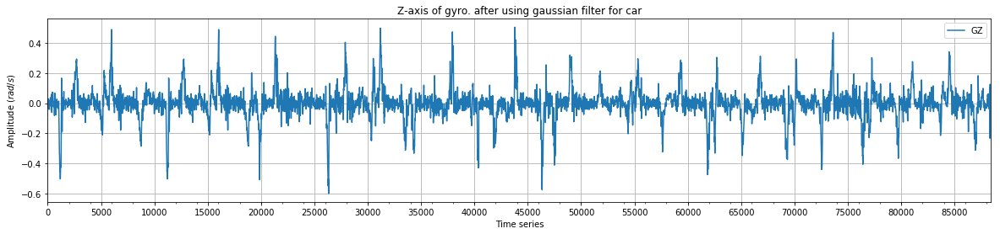

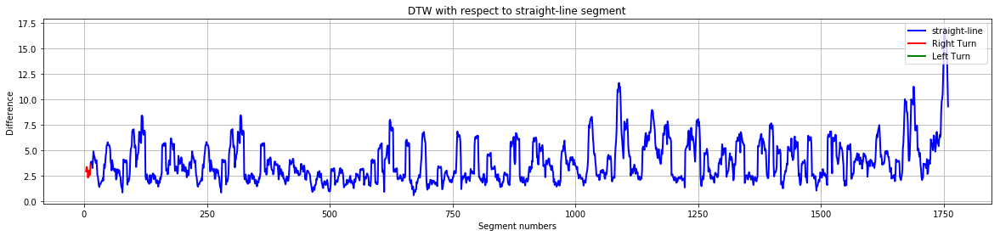

In [222]:
loss_series = pd.Series(diff_wrt_LT)
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

fig, ax = plt.subplots()
df[['GZ']].plot(figsize = (20,4),ax=ax, title = "Z-axis of gyro. after using gaussian filter for car")
plt.xlabel('Time series')
plt.ylabel('Amplitude ($rad/s$)')
n = len(df)
major_ticks = np.arange(0, n, 5000)
minor_ticks = np.arange(0, n, 2000)
ax.set_xticks(major_ticks)
ax.set_xticks(minor_ticks, minor=True)

plt.grid(True)

legend_elements = [Line2D([0], [0], color='b', lw=2, label='straight-line'),
                   Line2D([0], [0], color='r', lw=2, label='Right Turn'),
                   Line2D([0], [0], color='g', lw=2, label='Left Turn')]

y = loss_series

x = np.arange(len(y))

bike_colors = color_mapping(bike_labels)
bike_colors
plot_multicolored_lines(x,y,bike_colors)
plt.xlabel('Segment numbers')
plt.ylabel('Difference')
plt.title("DTW with respect to straight-line segment")
plt.legend(handles=legend_elements, loc='upper right')

plt.grid(True)
plt.show()

In [129]:
x = bike_segments
dist_fun = manhattan_distances
y = bike_segments[10][1]
# dist, cost, acc, path = dtw(x, y, dist=lambda x, y: norm(x - y, ord=1))
diff_wrt_LT = loss_for_segments(x, y ,dist_fun)
loss_series = pd.Series(diff_wrt_LT)
loss_series.to_csv('fiff_wrt_LT_car')

0 => 0.0575037669891
1 => 0.0605245243367
2 => 0.0614147330942
3 => 0.0606180861465
4 => 0.0508897097474
5 => 0.0605755714038
6 => 0.0558979624631
7 => 0.0559191560824
8 => 0.0410184328907
9 => 0.0412646296579
10 => 0.0
11 => 0.0239404767082
12 => 0.0457610495956
13 => 0.0529443203645
14 => 0.0506626450246
15 => 0.0602053735522
16 => 0.0577019068871
17 => 0.0547470665914
18 => 0.0850990466001
19 => 0.0700974122529
20 => 0.0729615888226
21 => 0.0823666123274
22 => 0.0759269855454
23 => 0.061038728228
24 => 0.0624811548465
25 => 0.0651736528449
26 => 0.0764878368025
27 => 0.0609546034156
28 => 0.0677164985359
29 => 0.0559215531181
30 => 0.0503106753509
31 => 0.0351103107154
32 => 0.0462329573871
33 => 0.0464145232419
34 => 0.0614128915947
35 => 0.0478205335881
36 => 0.0483739832576
37 => 0.0547236865438
38 => 0.0468624333389
39 => 0.0491553581211
40 => 0.063508717094
41 => 0.0465260374177
42 => 0.055335965805
43 => 0.0676026750418
44 => 0.0575479780691
45 => 0.0602431193034
46 => 0.06108

365 => 0.144090103622
366 => 0.152203751634
367 => 0.159769677683
368 => 0.0727297780936
369 => 0.0607398682251
370 => 0.0697701828567
371 => 0.0500664233717
372 => 0.0558054817504
373 => 0.0634197916192
374 => 0.0687942290754
375 => 0.0646503148823
376 => 0.0658675597689
377 => 0.0774661620261
378 => 0.0623786868279
379 => 0.0650333965595
380 => 0.069591810847
381 => 0.0564716876257
382 => 0.0642726041224
383 => 0.046376113384
384 => 0.0494766597722
385 => 0.0572984932692
386 => 0.0507519384525
387 => 0.0578538756499
388 => 0.0589467914418
389 => 0.058993624287
390 => 0.0635860551698
391 => 0.0663670911784
392 => 0.0645958475625
393 => 0.0721247255167
394 => 0.0777323297879
395 => 0.0566704782175
396 => 0.0537981068494
397 => 0.0576374414621
398 => 0.0517236704927
399 => 0.0442333068194
400 => 0.0534047320714
401 => 0.0503435805828
402 => 0.0498531969919
403 => 0.0486193358047
404 => 0.0515297155621
405 => 0.0627557075856
406 => 0.060888030624
407 => 0.0511429583379
408 => 0.050869086

725 => 0.0753452097425
726 => 0.0759985698342
727 => 0.0835698950357
728 => 0.081041178672
729 => 0.0529514475484
730 => 0.0527408860165
731 => 0.0434932828616
732 => 0.0426301168131
733 => 0.0494713034166
734 => 0.0510081519804
735 => 0.0424807388679
736 => 0.0592244049959
737 => 0.0643663145032
738 => 0.0683762503008
739 => 0.0590628132817
740 => 0.0580360950534
741 => 0.0527490999084
742 => 0.052328240996
743 => 0.0581164735817
744 => 0.0527516521411
745 => 0.0510777765997
746 => 0.043880524242
747 => 0.0371909545572
748 => 0.0544729452566
749 => 0.0532473328547
750 => 0.0538588853669
751 => 0.0444083313677
752 => 0.0573908380698
753 => 0.0565374215791
754 => 0.0680423199255
755 => 0.0560150022324
756 => 0.0463458419023
757 => 0.0475907378017
758 => 0.0498677375448
759 => 0.0755044602418
760 => 0.117098461313
761 => 0.111132070966
762 => 0.102381271934
763 => 0.109604858462
764 => 0.10549811701
765 => 0.12310272731
766 => 0.11567327405
767 => 0.0962260315309
768 => 0.0550283511613
7

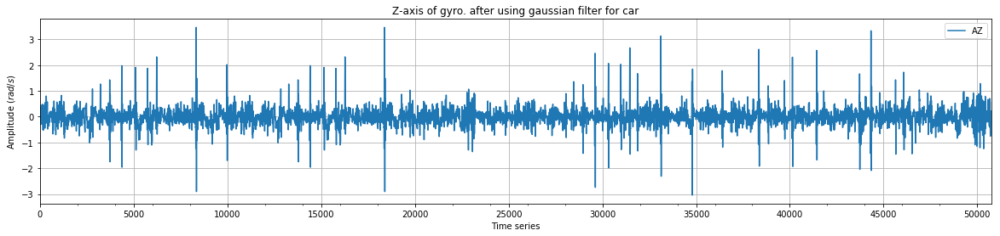

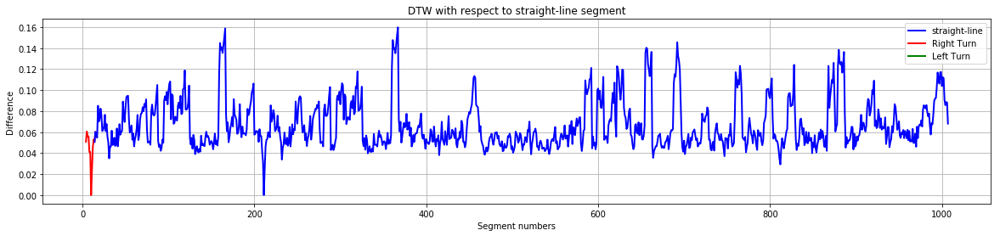

In [130]:
fig, ax = plt.subplots()
df[['AZ']].plot(figsize = (20,4),ax=ax, title = "Z-axis of gyro. after using gaussian filter for car")
plt.xlabel('Time series')
plt.ylabel('Amplitude ($rad/s$)')
n = len(df)
major_ticks = np.arange(0, n, 5000)
minor_ticks = np.arange(0, n, 2000)
ax.set_xticks(major_ticks)
ax.set_xticks(minor_ticks, minor=True)

plt.grid(True)

legend_elements = [Line2D([0], [0], color='b', lw=2, label='straight-line'),
                   Line2D([0], [0], color='r', lw=2, label='Right Turn'),
                   Line2D([0], [0], color='g', lw=2, label='Left Turn')]

y = loss_series
x = np.arange(len(y))
bike_colors = color_mapping(bike_labels)
plot_multicolored_lines(x,y,bike_colors)
plt.xlabel('Segment numbers')
plt.ylabel('Difference')
plt.title("DTW with respect to straight-line segment")
plt.legend(handles=legend_elements, loc='upper right')

plt.grid(True)
plt.show()

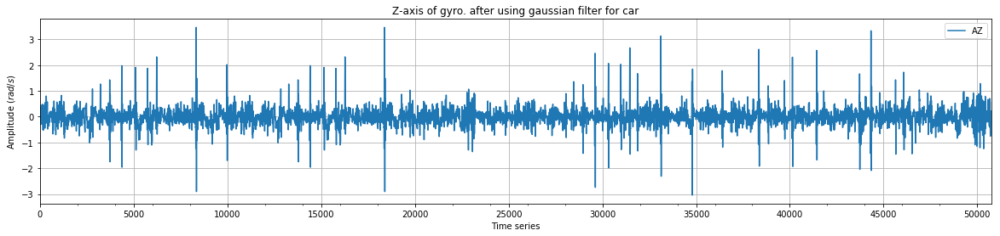

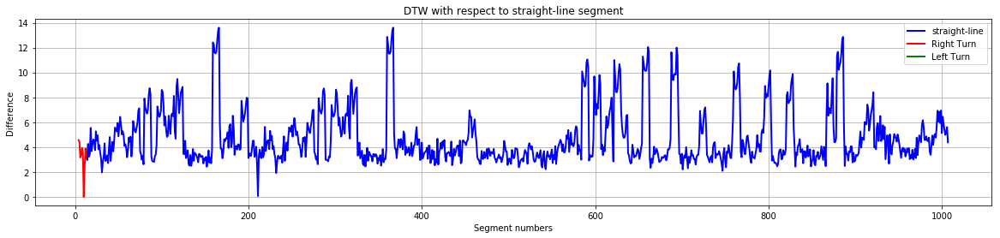

In [ ]:
x = bike_segments
dist_fun = manhattan_distances
y = bike_segments[10][1]
# dist, cost, acc, path = dtw(x, y, dist=lambda x, y: norm(x - y, ord=1))
diff_wrt_LT = loss_for_segments(x, y ,dist_fun)
loss_series = pd.Series(diff_wrt_LT)
loss_series.to_csv('fiff_wrt_LT_car')


In [ ]:
fig, ax = plt.subplots()
df[['AZ']].plot(figsize = (20,4),ax=ax, title = "Z-axis of gyro. after using gaussian filter for car")
plt.xlabel('Time series')
plt.ylabel('Amplitude ($rad/s$)')
n = len(df)
major_ticks = np.arange(0, n, 5000)
minor_ticks = np.arange(0, n, 2000)
ax.set_xticks(major_ticks)
ax.set_xticks(minor_ticks, minor=True)

plt.grid(True)

legend_elements = [Line2D([0], [0], color='b', lw=2, label='straight-line'),
                   Line2D([0], [0], color='r', lw=2, label='Right Turn'),
                   Line2D([0], [0], color='g', lw=2, label='Left Turn')]

y = loss_series
x = np.arange(len(y))
bike_colors = color_mapping(bike_labels)
plot_multicolored_lines(x,y,bike_colors)
plt.xlabel('Segment numbers')
plt.ylabel('Difference')
plt.title("DTW with respect to straight-line segment")
plt.legend(handles=legend_elements, loc='upper right')

plt.grid(True)
plt.show()

NameError: name 'segments' is not defined

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
        reshaped_segments, labels, test_size=0.2, random_state=RANDOM_SEED)